# Neural Network Classifier

In this assignment, your task is to train a type of Neural network classifier on the synthetic dataset that was also used in previous assignements. Please read the assignment entirely before you start coding. Most of the code that implements the neural network functionalities are provided to you. What you are expected to do is fill in certain missing parts that are required and then train two different networks and visualize the estimated posterior.

- <a href='#non-linear-activation-functions'>Question 1</a> (10%) Fill in the code to 
implement the `sigmoid` and `relu` functions and their derivatives. Then, plot all four 
functions to verify that your implementation is correct. See the provided example first.
- <a href='#the-neural-network'>Question 2</a> (80%) Fill in the code inside the 
`NeuralNetwork` class where necessary.
    - <a href='#feedforward1'>a.</a> First, complete the code in the `feedforward` method of the `NeuralNetwork` class. Assuming that the input of the $l$-th layer of the network is $a^{l-1}$ ($a^{l-1}$ can be the non-linear output or activation of a previous layer or initially the input feature vector) then the linear-output of the layer is: $$z^{l}=W a^{l-1} + b$$ Then the non-linear output or "activation" is $a^{l} = f(z^{l})$ where $f(\cdot)$ is the non-linear activation function of the layer, applied element-wise on $z^{l}$. In our case, $f(\cdot)$ is either a `sigmoid` or `relu` function.
    - <a href='#feedforward2'>b.</a> In the `feedforward` method of the `NeuralNetwork` class, write the code that implements the softmax function (see pages 67, 73 of the course slides). If $z^{L}$ is the linear-output of the output layer of the network then applying the softmax function on each of its elements $z^{L}_k$ is described by: 
    
    $$ softmax(z_k) = \frac{\exp(z^{L}_k)}{\sum_{k}\exp(z^{L}_k)}, k=0,...,C-1$$
Note: $z^{L}$ will be a 2-dimensional vector as our synthetic dataset has $C=2$ classes. Consequently $softmax(z^{L}_{0}) = P_{estimated}(y=0 \mid x)$ and $softmax(z^{L}_{1}) = P_{estimated}(y=1 \mid x)$. 
    - <a href='#loss_function'>c.</a> Fill in the `loss_function` method of the `
    NeuralNetwork` class so that it computes the value of the loss used to train the network (see page 68 of the coures slides, where it is refered to as "optimization criterion"): 
$$L(W) = - \sum_{i=1}^{N} \sum_{c=0}^{1} y_{c}^{i} \log (g_{c}(x^{i}; W))$$
where $i$ indexes training examples, $c$ indexes the two classes {0,1} of our synthetic 
data, $W$ is the set of weights of the network and $g_{c}$ is the posterior of class $c$ as 
computed by the network. As implied in pages 68 and 70 of the course slides, for $y^{i}$ 
being the true class label of example $x^{i}$, $y_{c}^{i}$ is the one-hot label encoding of
$y^{i}$, meaning that $y_{c}^{i}=1$ if $y^{i}=c$ and $y_{c}^{i}=0$ if $y^{i} \neq c$. Use 
the gradient checking code (found <a href='#checking'>here</a>) to ensure all your additions 
to the `NeuralNetwork` class are working correctly.
    - <a href='#backprop'>d.</a> Go through and try to understand the `backprop` method of 
the `Neural Network` class which is provided. Briefly explain what is done by the for 
loop at the end of the `backprop` method. Add your explanation in a markdown cell which <a href='#backprop'>here</a>. 
- <a href='#Train-networks'>Question 3</a> (10%) Use the `NeuralNetwork` class to define and train two different neural networks.
    - <a href='#Define-Network'>a.</a> Train a network with a sigmoid non-linear activation 
    function. Then plot the accuracy and error curves. Finally, visualize the estimated 
    posterior. The code needed is provided. 
    - <a href='#Train2'>b.</a> By using the previous question's code as an example, train a 
 network with relu non-linear activation functions. Then with the provided code, plot the accuracy and error 
 curves and visualize the estimated posterior. Briefly  compare the performance of the two 
 networks in a markdown cell which must be added at the end of this notebook <a href='#Compare'>here</a>.

# Code

## Imports

In [18]:
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pickle
from numpy.random import RandomState
from construct_data import construct_data
from gradientChecking import checkNNGradients, compute_numerical_gradient 

## Data Generation - Visualization

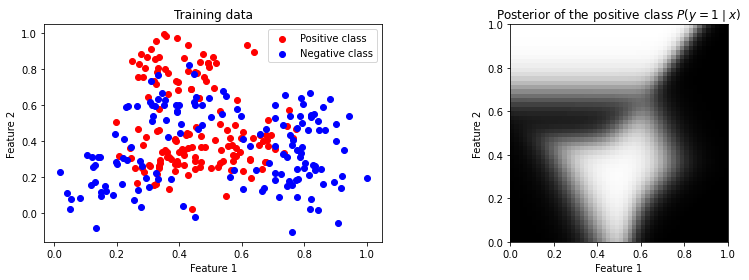

In [19]:
prng = RandomState(1)

%matplotlib inline
plt.rcParams['figure.figsize'] = (5.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

features, labels, posterior = construct_data(300, 'train', 'nonlinear', plusminus=False)

# Extract features for both classes
features_pos = features[labels == 1]
features_neg = features[labels != 1]

# Display data
fig = plt.figure(figsize=plt.figaspect(0.3))
ax = fig.add_subplot(1, 2, 1)
ax.scatter(features_pos[:, 0], features_pos[:, 1], c="red", label="Positive class")
ax.scatter(features_neg[:, 0], features_neg[:, 1], c="blue", label="Negative class")

ax.set_title("Training data")
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.legend()

ax = fig.add_subplot(1, 2, 2)
ax.imshow(posterior, extent=[0, 1, 0, 1], origin='lower')
ax.set_title("Posterior of the positive class $P(y=1 \mid x)$")
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")

plt.show()

# Our dataset arrays are modified to have a more convenient format for this assignement 
# instead of two arrays features (300,2) and labels (300,)
# we now have a list of 300 elements called data 
# each element of data is a tuple (x,y) 
# where x is  a (2,1) feature vector and y is a scalar label with value either 0 or 1 
data = []
for x, y in zip(features, labels): # creating alternative input
    x = x[:, np.newaxis]
    data.append(np.array([x,y]))

## Helper function for visualizing the posterior 

In [20]:
def visualize_posterior(nnet):
    x_rng = y_rng = np.linspace(0, 1, 50)
    gridx, gridy = np.meshgrid(x_rng, y_rng)
    p_estimated_class1 = np.zeros((50, 50))
    for i in range(50):
        for j in range(50):
            v = np.array([gridx[i, j], gridy[i, j]])
            v = v[:, np.newaxis]
            out, _, _ = nnet.feedforward(v)
            p_estimated_class1[i, j] = out[1]

    fig = plt.figure(figsize=plt.figaspect(0.2))
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(p_estimated_class1, extent=[0, 1, 0, 1], origin='lower')
    ax1.set_title("Estimated $P(y=1 \mid x)$")
    ax1.set_xlabel("Feature 1")
    ax1.set_ylabel("Feature 2")

    ax1 = fig.add_subplot(1, 3, 2)
    ax1.imshow(posterior, extent=[0, 1, 0, 1], origin='lower')
    ax1.set_title("Ground Truth of the positive class $")
    ax1.set_xlabel("Feature 1")
    ax1.set_ylabel("Feature 2")

    ax1 = fig.add_subplot(1, 3, 3)
    ax1.imshow(posterior-p_estimated_class1+1, extent=[0, 1, 0, 1], origin='lower')
    ax1.set_title("Difference between the ground truth and estimated posterior")
    ax1.set_xlabel("Feature 1")
    ax1.set_ylabel("Feature 2")
    plt.show()  
    
def visualize_cost_accuracy_curves(accuracy_training, cost_training):
    # Plots the cost and accuracy evolution during training 
    fig = plt.figure(figsize=plt.figaspect(0.2))
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.plot(cost_training,'r')
    ax1.set_xlabel('epoch')
    ax1.set_ylabel('Cost')
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.plot(accuracy_training)
    ax2.set_xlabel('epoch')
    ax2.set_ylabel('Accuracy')
    A = np.array(accuracy_training)
    best_epoch = np.argmax(A)
    print('best_accuracy:', max(accuracy_training), 'achieved at epoch:', best_epoch)


## Analytical Derivative of a Function 
Here we present an example of how we can define (and visualize) each nonlinear function and its derivative. Let us consider the function $f(x)=x^2$. Analytically we know that $f'(x)=2 x$. Thus for some x we can analytically calculate the derivative of x. The following python functions compute $f$ and $f'$. 

In [21]:
def square(x):
    f = x**2
    return f

def square_gradient(x):
    f_prime = 2*x
    return f_prime

We can visualize the function and its derivative using the following commands  

Text(0, 0.5, 'f')

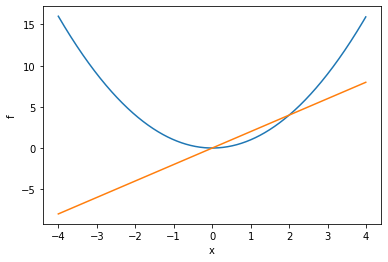

In [22]:
fig = plt.figure(figsize=plt.figaspect(0.3))
ax = fig.add_subplot(1, 2, 1)
x = np.arange(-4, 4, 0.01)
f = square(x)
ax.plot(x, f)
f_prime = square_gradient(x)
ax.plot(x, f_prime)
ax.set_xlabel('x')
ax.set_ylabel('f')

<a id='non-linear-activation-functions'></a>
# Question 1
## Non-linear activation functions 
Fill in the functions that implement the non-linear functions which are used to produve the 
activations of the neurons of a neural network. Remember that for if $\sigma(x)$ is the 
sigmoid function, its derivative is $\sigma'(x)=\sigma(x)*(1-\sigma(x))$. Finally if 
$relu(x)=max(0,x)$ then $relu'(x>0)= 1$ and $relu'(x<=0)=0$.
#### Note: Do not change the functions and their arguments!

In [23]:
# TO DO (Q1) 
def sigmoid(z):
    g = 1 / (1 + np.exp(-z))
    return g

def sigmoid_gradient(z): 
    g = sigmoid(z) * (1 - sigmoid(z))
    return g
# /TO DO (Q1)

# TO DO (Q1)
def relu(x):
    g = np.maximum(0,x)
    return g

def relu_gradient(z):
    a = relu(z)
    g = np.where(a>0,1,0)
    return g
# /TO DO (Q1)

##### Visualize the functions and their gradients by plotting their output in the [-6,6] interval:

Text(0.5, 1.0, 'Relu and Gradient of Relu')

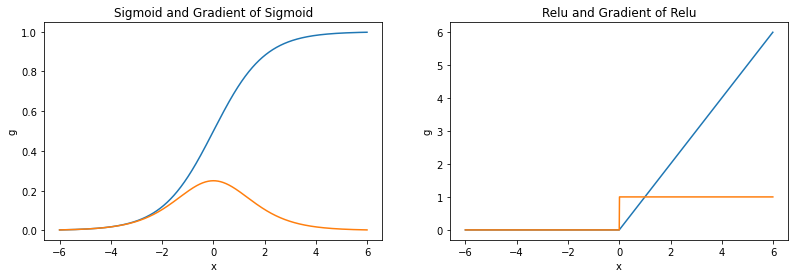

In [24]:
#TO DO (Q1)
fig = plt.figure(figsize=plt.figaspect(0.3))
ax = fig.add_subplot(1, 2, 1)
x = np.arange(-6, 6, 0.01)
f = sigmoid(x)
ax.plot(x, f)
f_prime = sigmoid_gradient(x)
ax.plot(x, f_prime)
ax.set_xlabel('x')
ax.set_ylabel('g')
ax.set_title("Sigmoid and Gradient of Sigmoid")

ax = fig.add_subplot(1, 2, 2)
x = np.arange(-6, 6, 0.01)
f = relu(x)
ax.plot(x, f)
f_prime = relu_gradient(x)
ax.plot(x, f_prime)
ax.set_xlabel('x')
ax.set_ylabel('g')
ax.set_title("Relu and Gradient of Relu")

# /TO DO (Q1)

# Question 2
<a id='the-neural-network'></a>
## The Neural Network Class 

In this assignement, in order to define, train and use a neural network you are first required to complete the implementation provided below. Every operation related to the network is defined as a method (e.g. `feedforward` , `backpropagation`, etc.) of the `NeuralNetwork` class. You only need to complete the code inside the `feedforward` and `loss_function` methods.

Go through the code to identify what each method inside the class does. Note that when first creating a `NeuralNetwork` class instance (for example as <a href='#Define-Network'> here</a>), the `__init__` method is executed and randomly initializes the network's weights, which then constitute an attribute of that instance. These weights are then modified by calling the `gradient_descent` method used to train the network. 


In [25]:
class NeuralNetwork(object):
    # For Question 2 first focus on __init__ and feedforward
    def __init__(self, nnodes, activation_functions='sigmoid'):
        # nnodes: number of hidden units per layer  - e.g. [2,5,10] indicates a three-layer network with the respective number of nodes
        self.num_layers = len(nnodes)
        # weights, biases: list of the numpy arrays containing model parameters for linear layers
        # sampled originally from a gaussian distribution
        self.sizes = nnodes
        prng = RandomState(2)
        self.biases = [prng.randn(y, 1) for y in nnodes[1:]]
        self.weights = [prng.randn(y, x) for x, y in zip(nnodes[:-1], nnodes[1:])]       
        # non-linearity, specified when the network is initialized 
        self.activation_functions = activation_functions
        self.losses = []  # stores the losses during training
        self.accuracies = []  # stores the accuracies during training 
        self.epoch_best = 0 # epoch during training when accuracy was max
        
    def feedforward(self, x):
        # Computes and returns the output of the network for a given input x
        # In our case x.shape = (2,1), i.e. the input is a 2-dimensional vector
        # It also returns intermediate linear and non-linear outputs of the layers 
        # that can are for backpropagation when traning
        activations = [] # here we store the non-linear outputs of layers
        activations.append(x)
        zs = [] # here we store linear-outputs of layers
        
        # feedforward computation through all layers except the output layer
        for l in range(len(self.weights)-1):
            b = self.biases[l]
            w = self.weights[l]

            ##### TO DO Q2 linear output ##### 
            z = np.dot(w,x) + b
            
            ##### /TO DO Q2 linear output #####

            if self.activation_functions == 'sigmoid':
            ##### TO DO Q2 sigmoid ##### 
                activation = sigmoid(z) 
            ##### /TO DO Q2 sigmoid #####

            elif self.activation_functions == 'relu':
            ##### TO DO Q2 relu ##### 
                activation = relu(z)
            ##### /TO DO Q2 relu #####
            
            # save z values for backprop (linear output of each layer)
            zs.append(z) 
            # save activations for backprop (non-linear output of each layer)
            activations.append(activation)
            # the input at the next layer is the activation of the previous layer
            x = activation  
            
        # feedforward computation through the output layer
        w = self.weights[-1]
        b = self.biases[-1]
        z = np.dot(w, x) + b # linear-output of output-layer
        
        ##### /TO DO Q2 softmax #####
        softmax_output = np.true_divide(np.exp(z),np.sum(np.exp(z)))

        
        ##### /TO DO Q2 softmax #####

        activations.append(softmax_output)
        zs.append(z)
        return softmax_output, zs, activations
    
    def loss_function(self,X):
        # computes the cross entropy cost 
        # X is a list, each element of which is a tuple (x,y) 
        # where x is the input and y is the ground truth label
        # x has shape (2,1) and y is a scalar
        
        loss = 0 # initializing cost as 0
        for x, y in X: # looping elements of list X, each element is a pair x,y 
             # Note: y is a scalar with value either 0 or 1
            # Note: The cost formula requires a one-hot encoded version of y
            
            ##### /TO DO Q2 cost function #####
            
            # step 1 feedforward computation
            softmax_output, zs, activations = self.feedforward(x)
            # step 2 cost value computation using x,y 
            if y == 0:
                y_one_hot = np.array([1,0])
            else:
                y_one_hot = np.array([0,1])
            
            cost = -y_one_hot@np.log(softmax_output)

            # step 3 increment total_cost 
            loss = loss + cost
            
            ##### /TO DO Q2 cost function #####
            
        return loss 

    
    def gradient_descent(self, training_data, epochs, lr, test_data=None):
        # training_data is a list of tuples ([x1,x2],y) where y is the class and [x1,x2] is numpy array
        # lr is the learning_rate, it is scalar
        # epochs is a scalar value for the number of times the network 
        # is going to update its parameters after computing the gradient 
        # using all training examples
        
        n_train = len(training_data)
        accuracy_max = 0.0
        for j in range(epochs):
            # compute gradient using backprop and do gradient descent step to update params
            self.update_params(training_data, lr) 
            # compute loss value 
            loss = self.loss_function(training_data)
            # save loss value for visualization 
            self.losses.append(loss/n_train)
            if test_data:
                n_test = len(test_data)
                correct = self.evaluate(test_data)
                print ("Epoch {0}: Accuracy {1} / {2} loss: {3}".format(j, correct, n_test, loss/len(training_data)))
                accucary = correct / n_test
                self.accuracies.append(accucary)
                # if accuracy increased then store params 
                if accucary >= accuracy_max:
                    accuracy_max = accucary
                    w_best = self.weights
                    b_best = self.biases
                    epoch_best = j
                    # print('improved accuracy @ {}, {}'.format(j, accuracy_max))
            else:
                print ("No test_data given")
        if test_data:
            print('Model with highest accuracy {} achieved at epoch {}'.format(accuracy_max, epoch_best))
            # restore the weights and biases of the model with the highest accuracy
            self.weights = w_best 
            self.biases = b_best
            self.epoch_best = epoch_best
                
    def update_params(self, X, lr):
        # X is all the training data
        # X contains pairs (x,y) where x is the feature vector and y its class label
        N = len(X)
        grad_b = [np.zeros(b.shape) for b in self.biases]
        grad_w = [np.zeros(w.shape) for w in self.weights]
        #Gradient Descent parameter updates
        for x, y in X:
            delta_grad_b, delta_grad_w = self.backprop(x, y) # take an example backpropagate to find the gradients
            grad_b = [nb+dnb for nb, dnb in zip(grad_b, delta_grad_b)] # accumulate gradients for biases
            grad_w = [nw+dnw for nw, dnw in zip(grad_w, delta_grad_w)] # accumulate gradients for weights
        
        # Update the weights and biases using the gradient of the cost computed using the whole training_dataset
        # divide by N to scale the overall gradient by the number of training examples
        self.weights = [w-lr*nw/N for w, nw in zip(self.weights, grad_w)]  
        self.biases = [b-lr*nb/N for b, nb in zip(self.biases,  grad_b)]
        
        
    def backprop(self, x, y):
        #Returns (grad_b, grad_w) representing the
        #gradients for the cost function  wrt b and w, initialized as zeros 
        grad_b = [np.zeros(b.shape) for b in self.biases]
        grad_w = [np.zeros(w.shape) for w in self.weights]

        ######### Forward pass #########
        dummy, zs, activations= self.feedforward(x) 
        
        # one hot encoding of the true class label y
        # if y=1 then the one-hot encoding of y is y =[0, 1]
        # if y=0 then the one-hot encoding of y is y =[1, 0]
        if y == 0:
            y_one_hot = np.array([[1], [0]])
        else:
            y_one_hot = np.array([[0], [1]])
        
        ######## Backward pass ##########        
        # Grad at the ouput layer 
        
        dL_dz = activations[-1] - y_one_hot  # dL/dz (slide 51 derives this)
        # also this is the δ of slide 63 i.e the sensitivity of the loss to the activations of output layer
        
        # grad wrt the parameters (w,b) of the output layer     
        # for the grad of the loss wrt to the bias we have:
        # Given z = Wa + b  (we omit z(l) and a(l-1) for simplicity)
        # Chain_rule: dL_db = dL_dz * dz_db = dL_dz * 1 = dL_dz 
        grad_b[-1] = dL_dz  
        
        # for the grad of the loss wrt to the weight matrix with elements Wij we have:
        # dL_dWij = dL_dzi * dz[i]_dWij = dL_dz[i] * a[j]
        # which can be written as the following dot product 
        
        grad_w[-1] = np.dot(dL_dz, activations[-2].T)
        # Note: the resulting shape of grad_w[-1] is (2, num nodes of previous layer)
        # which is exactly the shape of the weight matrix mapping of the output layer 
        
        # By uncommenting the following lines the you can printing the shapes 
        # of each variable used to compute the gradient at the output layer
        '''
        print('---- shapes')
        print('output-layer')
        print('activation',activations[-1].shape) 
        print('z', zs[-1].shape)
        print('dL_dz',dL_dz.shape)
        print('grad_b:',grad_b[-1].shape,' grad_w:',grad_w[-1].shape)
        '''
        ############# TO DO Q2b explain what is done by following for loop###############
        
        # Grad at previous layers
        delta = dL_dz # delta of output layer
        L = self.num_layers # considering input layer + hidden layers + output layer
        # zs has L-1 elements , activations has L elements , self.weights of L-1 elements
        # start from 2nd-to-last layer (hence the L-2 index) and move backwards 
        for l in range(L-2, 0, -1): 
            # z is the linear output of the l-th layer
            z = zs[l-1] 
            
            # activation if the activation of the (l-1)-th layer
            activation=activations[l-1] 
            
            # weights that map the output of the 
            # l-th layer to the input of the (l+1)-th layer
            weights=self.weights[l] 
            
            # compute the value of the gradient of the non-linear function of the l-th layer 
            # evaluated at z: act_g = f'(z) 
            if self.activation_functions=='relu': act_g = relu_gradient(z)
            elif self.activation_functions=='sigmoid': act_g = sigmoid_gradient(z)
            
            # backpropagate delta from (l+1)-th layer to l-th layer
            prod  = np.dot(weights.T, delta)    
    
            delta = prod * act_g
            
            # gradients wrt to the parameters of the l-th layer
            grad_b[l-1] = delta 
            grad_w[l-1] = np.dot(delta, activation.T) 
            
            # By uncommenting the following lines the function 
            # will be printing the shapes of each variable             
            '''
            print('---- shapes')
            print('layer:',l)  
            print('activation ',activation.shape)
            print('z ', z.shape)
            print('w ',weights.shape)       
            print('prod ',prod.shape,'act_g',act_g.shape)
            print('delta ',delta.shape)
            print('grad_b ',grad_b[-l].shape,' grad_w ',grad_w[-l].shape) 
            '''
        return (grad_b, grad_w)
        ############# TO DO Q2b explain what is done by above for loop###############

    def evaluate(self, data):
        correct = 0
        for x, y in data:
            # we do not need to save activations and zs when classifying data 
            # we only care about the outupt 
            output, _, _ = self.feedforward(x)
            # predicted class is the index in the ouptut with maximal propability
            correct = correct + int(y == np.argmax(output))
        return correct


<a id='backprop'></a>
## Explanation of the backprop for loop



Answer: Back-propagate error signal to get derivatives for learning meaning that it used to update the weight and bias to minimize the loss. It goes from the output layer, use the chain rule to find the derivative dL/dx where L is the lost and x is the input of each layer, and use the learning method such as gradient decent to update the weight and bias.







<a id='checking'></a>
## Gradient checking:
We are going to use $gradient$ $checking$ to check if the numerical (using approximations) 
and analytical (computed by our backprop implementation) gradient computations match. To 
test that we are going to check the gradients computed for a small neural network. 
Suppose we have a neural network with 2 dimensional inputs , 2 hidden layers of 4 neurons 
each with sigmoid non-linearities and an output layer of 2 neurons with sigmoid non-
linearity. This network is initialized as shown by the code in the next cell.

In [26]:
nnodes2 = [2, 4, 4, 2]
activation_functions2 = 'sigmoid' 
nnet_checking = NeuralNetwork(nnodes2, activation_functions2)

We are going to use a few training examples (m=50) to check if the analytical and numerical gradients match.

In [27]:
m = 50 # using 50 examples to do gradient checking 
train_data = data[1:m] 
checkNNGradients(nnet_checking, train_data)  # compute_numerical_gradient 

[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748159]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748159]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.81748158]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]
[0.59217478]

[0.64528318]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528318]
[0.64528319]
[0.64528318]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528318]
[0.64528318]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528318]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.64528319]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]
[0.65173403]

[0.63768646]
[0.63768646]
[0.63768646]
[0.63768646]
[0.63768646]
[0.63768647]
[0.63768646]
[0.63768647]
[0.63768646]
[0.63768646]
[0.63768646]
[0.63768646]
[0.63768646]
[0.63768646]
[0.63768647]
[0.63768646]
[0.63768647]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]
[0.81686273]

[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.78182673]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785974]
[0.80785974]
[0.80785973]
[0.80785973]
[0.80785973]
[0.80785973]
[0.80785973]
[0.80785973]
[0.80785974]
[0.80785973]
[0.80785974]
[0.80785973]

[0.76385464]
[0.76385463]
[0.76385464]
[0.76385463]
[0.76385464]
[0.76385464]
[0.76385464]
[0.76385464]
[0.76385464]
[0.76385464]
[0.76385463]
[0.76385464]
[0.76385463]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]
[0.60255777]

# Question 3
<a id='Define-Network'></a>
## Define a Network 
To initialize a Neural Network we must provide two arguments: $nnodes$ and activation_functions. $nnodes$ is a list. Each element of $nnodes$ defines the number of neurons of each layer of the network. By convention the first element of $nnodes$ defines the dimensionality of the input layer of the network that is not associated with any weights and biases (i.e if the input to a network is $x \in R^{2}$ then the dimensionality of the input layer is $2$). The rest of the elements of $nnodes$ are used to initialize the weigths and biases of the hidden layers and the output layer. The activation_functions argument is a string that defines the type of non-linear function to be used for each neuron of the hidden layer. Our implementation supports relu and sigmoid as non-linear activation functions. 

In [28]:
nnodes = [2, 10, 10, 2]
activation_functions = 'sigmoid' # this can either be 'sigmoid' or 'relu'
nnet = NeuralNetwork(nnodes, activation_functions) # creating a NeuralNetwork instance
# accessing the weights attribute of the nnet instance we can print weight shapes per layer
print(['layer {}: w {}'.format(layer, w.shape) for w, layer in zip(nnet.weights, range(len(nnet.weights)))]) 

['layer 0: w (10, 2)', 'layer 1: w (10, 10)', 'layer 2: w (2, 10)']


## Train a network with sigmoid activation functions.
Note that for each training epoch we compute the mean cost and accuracy on the training set. 
Once the training is completed visualize the cost / accuracy curves and the estimated posterior using the provided code. It is recomended that you keep the learning rate and number of epochs as provided below.

In [ ]:
learning_rate = 2
epochs = 5000  # usually has converged for that many epochs
train_data = data
test_data = data 
nnet.gradient_descent(train_data, epochs, learning_rate, test_data)

[0.0011493]
[6.63607132]
[0.00085519]
[6.73497817]
[7.1056486]
[0.00081447]
[7.0940615]
[7.25509002]
[7.12379166]
[0.00071294]
[0.00075209]
[0.00068977]
[0.00065969]
[6.86953553]
[0.00097946]
[6.7228715]
[0.00102223]
[0.00106851]
[0.00086883]
[7.28139852]
[0.00082316]
[0.00067706]
[7.33702096]
[0.00069299]
[6.44806545]
[7.31778781]
[0.00073775]
[0.00077844]
[0.00098932]
[6.82854028]
[0.00066354]
[7.15573875]
[0.00081244]
[0.00096226]
[6.74929937]
[6.71364762]
[7.37536726]
[7.27624784]
[6.64777792]
[0.00073892]
[6.98086268]
[0.00073448]
[7.23780398]
[7.12057819]
[0.00084721]
[0.00100826]
[6.56184154]
[7.23748268]
[0.00080745]
[0.00069517]
[0.00083105]
[0.00115846]
[0.00071171]
[7.23353947]
[7.16814144]
[6.75259906]
[0.00076524]
[7.12133538]
[6.71282576]
[7.2834154]
[7.12693484]
[0.00073208]
[0.00080503]
[6.92369935]
[0.00080986]
[7.12780131]
[7.22776994]
[0.00077369]
[6.75616276]
[0.0008064]
[7.19237539]
[6.78877556]
[6.67542339]
[7.25996024]
[6.81589487]
[7.17265535]
[0.00073752]
[6.82

[0.00517668]
[0.00627231]
[4.84916283]
[4.80638866]
[5.53357767]
[5.41939084]
[4.73378034]
[0.00467707]
[5.10667293]
[0.00453445]
[5.39069908]
[5.28502742]
[0.00543583]
[0.00662532]
[4.6475762]
[5.41762282]
[0.00513822]
[0.00428072]
[0.00519279]
[0.0077697]
[0.00450011]
[5.41685462]
[5.33853291]
[4.8546299]
[0.00489118]
[5.26349532]
[4.80603012]
[5.47859805]
[5.28396088]
[0.00455812]
[0.00516096]
[5.04399747]
[0.00520393]
[5.29473899]
[5.39815244]
[0.00473585]
[4.86064307]
[0.00517055]
[5.34244022]
[4.89332708]
[4.76463914]
[5.40300428]
[4.92532116]
[5.3631209]
[0.00465396]
[4.94062149]
[5.43744811]
[0.0039159]
[5.41666454]
[5.42407925]
[0.00426913]
[0.00398969]
[5.46255264]
[0.00509369]
[0.00700177]
[5.47245632]
[0.0041806]
[4.65736628]
[4.71383288]
[0.00634968]
[5.37452241]
[0.00477091]
[0.0049605]
[0.00577714]
[0.00549258]
[5.13734271]
[4.84301434]
[4.61757009]
[4.8283571]
[0.00664217]
[5.34805372]
[4.98302948]
[0.00742384]
[4.99450726]
[0.00445082]
[0.00392189]
[5.39347745]
[5.2163

[2.53778898]
[2.61703771]
[0.05941413]
[3.0438833]
[2.75849445]
[2.58333298]
[0.06478986]
[2.59515262]
[0.07025808]
[2.86299483]
[0.06038322]
[2.66111532]
[3.08102788]
[0.05325877]
[3.18380375]
[0.06834503]
[2.8720066]
[2.56596658]
[0.05761546]
[0.05672683]
[0.04581028]
[2.96570635]
[0.04656141]
[2.66873621]
[0.04775317]
[0.05964681]
[0.05315569]
[2.61675868]
[0.05440945]
[3.08531225]
[0.05996064]
[2.51204572]
[0.06941417]
[3.04751675]
[0.05668994]
[0.0542532]
[0.05090122]
[2.75663636]
[0.07043519]
[0.05345589]
[3.07709173]
[2.89449775]
[0.06121725]
[0.06412339]
[0.05486657]
[3.14956564]
[2.67426313]
[0.06281044]
[0.06096049]
[2.71745217]
[0.05908873]
[3.11387863]
[2.5980931]
[0.05595968]
[2.95297651]
[2.99031169]
[2.63759931]
[0.06858886]
[0.05196453]
[2.66110373]
[0.05553251]
[0.04490356]
[0.05129875]
[2.62074963]
[0.06768471]
[2.60033229]
[0.06323422]
[2.540369]
[0.06152874]
[0.05554456]
[0.05687458]
[3.13314632]
[2.68249194]
[2.97816439]
[0.04926272]
[2.72781727]
[0.07285168]
[2.64

[0.22045335]
[0.2128956]
[0.21765239]
[1.4546665]
[0.23885647]
[0.19926127]
[1.64857073]
[1.60995973]
[1.67870225]
[0.22589548]
[1.59832596]
[1.4282634]
[0.23152231]
[0.22406189]
[1.75585173]
[1.56820858]
[1.47817311]
[0.24232038]
[0.22191359]
[1.48059129]
[0.22305057]
[1.47042564]
[0.21908264]
[1.48485488]
[1.58099446]
[1.62780045]
[1.47122512]
[0.24903749]
[0.20751383]
[1.65774954]
[1.42839172]
[0.23817838]
[1.48793909]
[0.21907123]
[1.71081374]
[0.22281973]
[1.74183295]
[1.52401692]
[0.24786697]
[1.48232528]
[1.6373327]
[1.49049887]
[0.25079339]
[0.24950835]
[0.24675365]
[1.46964139]
[0.22485829]
[1.66200833]
[1.47594353]
[0.25365499]
[0.19879295]
Epoch 6: Accuracy 150 / 300 loss: [0.89731476]
[1.28635594]
[0.3220305]
[1.23727665]
[0.3204286]
[0.34955661]
[1.22801426]
[0.33915778]
[0.35736945]
[0.35238633]
[1.21954614]
[1.23005135]
[1.21305232]
[1.20387556]
[0.32748704]
[1.26609525]
[0.32212449]
[1.27061828]
[1.27637821]
[1.24608739]
[0.35704757]
[1.21902397]
[1.20831604]
[0.3639620

[0.44049757]
[0.49625062]
[0.47731725]
[0.95176613]
[0.96178533]
[0.47057349]
[0.9609763]
[0.47641246]
[0.48905425]
[0.96260803]
[0.44036262]
[0.96206704]
[0.48872267]
[0.4478316]
[0.43899794]
[0.5013946]
[0.45448469]
[0.48205659]
[0.95072751]
[0.44717102]
[0.49249221]
[0.92724351]
[0.5019033]
[0.49112757]
[0.94227263]
[0.93166076]
[0.50721682]
[0.96364848]
[1.00720777]
[0.49713927]
[0.93917051]
[0.43500848]
[0.4366539]
[0.99545445]
[0.50715241]
[0.95657865]
[0.94984007]
[0.98959965]
[0.97263291]
[0.46169821]
[0.44346961]
[0.43688858]
[0.44163363]
[1.0046453]
[0.48236105]
[0.44979676]
[1.01727208]
[0.4519937]
[0.94411458]
[0.92788894]
[0.48717034]
[0.4709822]
[0.44045517]
[0.43271528]
[0.44183124]
[0.98172555]
[0.4976577]
[0.45606894]
[0.43673175]
[1.0010807]
[0.43701748]
[1.01934972]
[0.46893198]
[0.98518449]
[0.44422927]
[0.50105585]
[0.95642792]
[0.52121977]
[1.01296519]
[0.47040984]
[0.43409686]
[0.9776625]
[0.97103856]
[0.92520577]
[0.483551]
[0.929174]
[0.44522649]
[0.93517839]
[

[0.84033583]
[0.78481087]
[0.57770186]
[0.7897541]
[0.52625689]
[0.79493495]
[0.84811689]
[0.82454728]
[0.51724819]
[0.82749963]
[0.60315038]
[0.85327975]
[0.50475348]
[0.88758318]
[0.59435905]
[0.84073918]
[0.82999842]
[0.81091787]
[0.54018723]
[0.89064621]
[0.82382641]
[0.60029539]
[0.564964]
[0.85896421]
[0.86970797]
[0.82978914]
[0.6176298]
[0.52714043]
[0.86486244]
[0.85335678]
[0.53435258]
[0.84945879]
[0.60826851]
[0.51889845]
[0.83643937]
[0.5783239]
[0.58303528]
[0.52191367]
[0.88491354]
[0.81755334]
[0.52393185]
[0.83237691]
[0.77949114]
[0.81569986]
[0.51762091]
[0.88194475]
[0.51603898]
[0.86627243]
[0.50571771]
[0.85887189]
[0.83361924]
[0.84110839]
[0.61453527]
[0.52720349]
[0.58045216]
[0.80348154]
[0.53551693]
[0.89801371]
[0.52221432]
[0.82817476]
[0.51950596]
[0.59241863]
[0.84140408]
[0.50910515]
[0.80302584]
[0.85346698]
[0.52062307]
[0.84558245]
[0.51012856]
[0.53922165]
[0.82222011]
[0.79822985]
[0.84744108]
[0.5867594]
[0.84165352]
[0.85141883]
[0.79330076]
[0.87

[0.55264416]
[0.58804659]
[0.74810487]
[0.7214539]
[0.77929655]
[0.64897209]
[0.77316979]
[0.78419738]
[0.71706213]
[0.80946676]
[0.79509133]
[0.59753916]
[0.6304603]
[0.76207066]
[0.81748579]
[0.77453289]
[0.56953075]
[0.64689711]
[0.77105823]
[0.765623]
[0.56785202]
[0.66923168]
[0.76726912]
[0.6669392]
[0.78934225]
[0.77374928]
[0.80857366]
[0.76897293]
[0.62437878]
[0.75387861]
[0.7961364]
[0.57831117]
[0.80841929]
[0.5564619]
[0.55888759]
[0.56966223]
[0.6333433]
[0.66063283]
[0.66853475]
[0.567505]
[0.71753986]
[0.82397067]
[0.61278311]
[0.74730108]
[0.76289238]
[0.56522432]
[0.78447908]
[0.7628847]
[0.82807541]
[0.75106762]
[0.80023251]
[0.75564451]
[0.73234191]
[0.76329166]
[0.5535502]
[0.80008286]
[0.71857772]
[0.63372484]
[0.62839664]
[0.65029217]
[0.77685053]
[0.62222663]
[0.54465296]
[0.78749068]
[0.76452862]
[0.67714619]
[0.60795861]
[0.56349057]
[0.80652746]
[0.75366605]
[0.56858224]
[0.77189799]
[0.56746454]
[0.74637156]
[0.56698226]
[0.61293021]
[0.63385944]
[0.56808383

[0.64621052]
[0.6707815]
[0.5939808]
[0.78125544]
[0.70280643]
[0.68330823]
[0.56356576]
[0.76803798]
[0.60512608]
[0.72658473]
[0.69487054]
[0.71672412]
[0.70986168]
[0.61298307]
[0.79038546]
[0.60357056]
[0.68663904]
[0.59243248]
[0.79472275]
[0.78675508]
[0.78486765]
[0.58293508]
[0.73485272]
[0.6706056]
[0.58571972]
[0.79662365]
[0.6586254]
Epoch 15: Accuracy 150 / 300 loss: [0.68426787]
[0.70677373]
[0.65964666]
[0.64354676]
[0.67314936]
[0.75693557]
[0.63264074]
[0.75578127]
[0.79442192]
[0.76214671]
[0.59212922]
[0.60493518]
[0.58263589]
[0.56817152]
[0.6995891]
[0.67401121]
[0.67165272]
[0.68302026]
[0.69216672]
[0.64735132]
[0.80274833]
[0.63336848]
[0.56763034]
[0.81665646]
[0.58701728]
[0.63272194]
[0.81848624]
[0.60239154]
[0.61716769]
[0.6756611]
[0.69117638]
[0.57289752]
[0.7702548]
[0.63216615]
[0.66980535]
[0.67894893]
[0.66937483]
[0.82739843]
[0.80068157]
[0.66033214]
[0.61074389]
[0.73170306]
[0.60381051]
[0.78977831]
[0.76193157]
[0.64160446]
[0.67871337]
[0.6535361

[0.72722722]
[0.63751271]
[0.6583952]
[0.65382812]
[0.74016014]
[0.64659947]
[0.74321411]
[0.78099879]
[0.74523054]
[0.59845868]
[0.61228747]
[0.58794607]
[0.57180261]
[0.68175697]
[0.69077448]
[0.65129844]
[0.70099038]
[0.71115258]
[0.66163294]
[0.79096248]
[0.64869095]
[0.57033017]
[0.80455926]
[0.59327338]
[0.60903388]
[0.8096808]
[0.6099565]
[0.62642254]
[0.69331838]
[0.67328937]
[0.57739329]
[0.75363484]
[0.6452622]
[0.68678039]
[0.65800261]
[0.64950391]
[0.81604689]
[0.78559866]
[0.63862481]
[0.6221309]
[0.71217661]
[0.61208354]
[0.77594413]
[0.74940197]
[0.65601698]
[0.69728459]
[0.62984793]
[0.78636947]
[0.64357866]
[0.59834507]
[0.64384178]
[0.72852074]
[0.61325057]
[0.78678129]
[0.7636362]
[0.66075658]
[0.63180226]
[0.74405713]
[0.64962988]
[0.806955]
[0.74818465]
[0.61459429]
[0.64388505]
[0.70102513]
[0.64523609]
[0.75214521]
[0.77928323]
[0.620621]
[0.65979622]
[0.64429062]
[0.7632479]
[0.66506787]
[0.64337736]
[0.78121535]
[0.6732732]
[0.77354807]
[0.6208706]
[0.67283965]

[0.64470977]
[0.82982396]
[0.7214923]
[0.72329812]
[0.62636202]
[0.66074941]
[0.66480982]
[0.56792199]
[0.75955563]
[0.5769229]
[0.66054768]
[0.57932945]
[0.65117961]
[0.64383782]
[0.63015521]
[0.62390764]
[0.7880951]
[0.68392661]
[0.59506417]
[0.72408718]
[0.77841993]
[0.6575512]
[0.64739258]
[0.60040499]
[0.67207438]
[0.7351078]
[0.62054159]
[0.79853901]
[0.71809991]
[0.68406121]
[0.70066172]
[0.62782242]
[0.81083764]
[0.64463808]
[0.6950886]
[0.69522327]
[0.67856094]
[0.68021849]
[0.80586684]
[0.61859838]
[0.64312024]
[0.73451854]
[0.77415039]
[0.63250846]
[0.72010543]
[0.6141487]
[0.65031058]
[0.6306598]
[0.56063136]
[0.63290134]
[0.63350041]
[0.71579563]
[0.62169601]
[0.69098961]
[0.61154703]
[0.67507545]
[0.63564316]
[0.66492946]
[0.80323944]
[0.65447398]
[0.75108543]
[0.59276358]
[0.67927247]
[0.73823235]
[0.64906967]
[0.62376514]
[0.64619289]
[0.76426876]
[0.64046063]
[0.61980136]
[0.6131002]
[0.66966993]
[0.64743989]
[0.67207324]
[0.61649504]
[0.67200667]
[0.61638851]
[0.58015

[0.64435229]
[0.74681154]
[0.58824215]
[0.6727586]
[0.74902046]
[0.63943404]
[0.62110417]
[0.63689589]
[0.75921243]
[0.63875331]
[0.60733122]
[0.61445602]
[0.67324512]
[0.6380136]
[0.67854808]
[0.60281997]
[0.6620749]
[0.61332055]
[0.57350684]
[0.67522712]
[0.78263311]
[0.66718613]
[0.684743]
[0.57175253]
[0.7304644]
[0.69329329]
[0.69066551]
[0.74222272]
[0.65499385]
[0.73261389]
[0.6749814]
[0.63435816]
[0.75593404]
[0.66035508]
[0.65457574]
[0.6384555]
[0.79783968]
[0.66135574]
[0.79717564]
[0.69448209]
[0.67868692]
[0.72239382]
[0.66424638]
[0.73296543]
[0.64719052]
[0.70407679]
[0.6457955]
[0.71851937]
[0.61706534]
[0.61359038]
[0.63946358]
[0.7540164]
[0.81132588]
[0.79741872]
[0.63260001]
[0.57600716]
[0.73865789]
[0.72201885]
[0.61799243]
[0.65698597]
[0.63147917]
[0.68236503]
[0.6628687]
[0.74038697]
[0.63280371]
[0.70970784]
[0.62900843]
[0.58908553]
[0.65868435]
[0.59856835]
[0.70237923]
[0.58787036]
[0.73612845]
[0.74913873]
[0.77295632]
[0.6721476]
[0.73658679]
[0.58827431

Epoch 24: Accuracy 180 / 300 loss: [0.67619649]
[0.78695374]
[0.57411244]
[0.69596366]
[0.60177575]
[0.69895117]
[0.68074557]
[0.7197386]
[0.75388914]
[0.70346722]
[0.60090925]
[0.61841488]
[0.58656285]
[0.56412929]
[0.635956]
[0.73531909]
[0.59504838]
[0.75058358]
[0.76491478]
[0.69637591]
[0.77077624]
[0.68900401]
[0.55875898]
[0.78308426]
[0.5957253]
[0.53941888]
[0.802201]
[0.61718819]
[0.64023483]
[0.74190701]
[0.62722926]
[0.57311231]
[0.71313209]
[0.67551041]
[0.732564]
[0.59942776]
[0.59519238]
[0.79773956]
[0.75160419]
[0.57690682]
[0.6459123]
[0.6596118]
[0.62236402]
[0.74709673]
[0.72607456]
[0.69170651]
[0.74992629]
[0.56038584]
[0.77446996]
[0.67283851]
[0.60517987]
[0.66336229]
[0.79153406]
[0.63499246]
[0.7762992]
[0.74433096]
[0.60000777]
[0.66344668]
[0.70490771]
[0.59209705]
[0.80472106]
[0.72053887]
[0.62864311]
[0.67895839]
[0.64415843]
[0.68231934]
[0.73022221]
[0.76168102]
[0.62969939]
[0.61232303]
[0.67951939]
[0.73110491]
[0.60961925]
[0.58294278]
[0.74636182]
[

[0.56883133]
[0.64095724]
[0.65541228]
[0.61294531]
[0.75190178]
[0.7327495]
[0.6902165]
[0.75367104]
[0.5495796]
[0.78556633]
[0.6693311]
[0.59491368]
[0.65639676]
[0.79841937]
[0.62952407]
[0.78792344]
[0.75257269]
[0.59248613]
[0.66105666]
[0.70575638]
[0.58558776]
[0.81948458]
[0.72561199]
[0.6204647]
[0.677522]
[0.63834929]
[0.68157384]
[0.73743272]
[0.7706324]
[0.61966032]
[0.60947491]
[0.67812959]
[0.73462744]
[0.60399156]
[0.57535999]
[0.74902524]
[0.60907283]
[0.7752825]
[0.63700779]
[0.62247342]
[0.79237175]
[0.54524641]
[0.75466864]
[0.78560934]
[0.58879192]
[0.54647907]
[0.77099801]
[0.66974111]
[0.77148609]
[0.80450176]
[0.57676336]
[0.55223947]
[0.56424675]
[0.74116283]
[0.73639065]
[0.64277601]
[0.66823111]
[0.70265881]
[0.696692]
[0.68216321]
[0.59319486]
[0.54407059]
[0.59101189]
[0.752663]
[0.75619804]
[0.63505282]
[0.78711934]
[0.63451957]
[0.619908]
[0.54271039]
[0.77552767]
[0.70128704]
[0.57152577]
[0.54605389]
[0.57246648]
[0.71219421]
[0.75990872]
[0.64489572]
[

[0.62959559]
[0.80668751]
[0.57936877]
[0.79774273]
[0.77075989]
[0.77531773]
[0.56263145]
[0.67719358]
[0.70850507]
[0.56731486]
[0.79229631]
[0.52588689]
Epoch 29: Accuracy 169 / 300 loss: [0.6718295]
[0.78864124]
[0.56166095]
[0.68153607]
[0.60088738]
[0.71134138]
[0.66402676]
[0.75040411]
[0.78145297]
[0.71542133]
[0.55943963]
[0.57891731]
[0.54275489]
[0.51653957]
[0.64220891]
[0.72496351]
[0.58995393]
[0.7443373]
[0.76195843]
[0.67897332]
[0.80560681]
[0.67800219]
[0.50815996]
[0.81682563]
[0.55471392]
[0.52011186]
[0.85039514]
[0.5788674]
[0.60634058]
[0.73529777]
[0.63296626]
[0.52781357]
[0.72655001]
[0.65521135]
[0.72374524]
[0.59230519]
[0.59192844]
[0.83490695]
[0.77228771]
[0.56609232]
[0.62150472]
[0.6599823]
[0.58655554]
[0.77279097]
[0.75699532]
[0.6756778]
[0.74697736]
[0.54199923]
[0.81782028]
[0.65174888]
[0.5675261]
[0.6331621]
[0.79638958]
[0.60944357]
[0.82113308]
[0.77966514]
[0.59088264]
[0.64557696]
[0.71946519]
[0.58569773]
[0.8583367]
[0.7469496]
[0.59599075]

[0.59298331]
[0.75202459]
[0.65664981]
[0.65078661]
[0.60810589]
[0.8165591]
[0.66650151]
[0.81979495]
[0.71761955]
[0.70226138]
[0.75969768]
[0.6713555]
[0.73935814]
[0.65174534]
[0.73172879]
[0.6047123]
[0.74904912]
[0.57532385]
[0.5608593]
[0.60655965]
[0.77769594]
[0.87561005]
[0.81693722]
[0.59266551]
[0.52477741]
[0.77604333]
[0.73681951]
[0.58386331]
[0.66242466]
[0.59476936]
[0.69286448]
[0.67839059]
[0.77252427]
[0.61760289]
[0.73981061]
[0.5984794]
[0.53328873]
[0.66634586]
[0.53375445]
[0.71930928]
[0.55412039]
[0.72711822]
[0.77612058]
[0.79068113]
[0.67868272]
[0.75515784]
[0.52471162]
[0.69906836]
[0.62093336]
[0.79855065]
[0.71207054]
[0.56214801]
[0.73296509]
[0.58066568]
[0.59791997]
[0.67187277]
[0.60657105]
[0.56258222]
[0.57637073]
[0.72286283]
[0.78000711]
[0.60918341]
[0.74194552]
[0.6188667]
[0.79939101]
[0.51758682]
[0.73951951]
[0.64098866]
[0.65684385]
[0.76867095]
[0.59668194]
[0.79647129]
[0.63507449]
[0.79390337]
[0.63964539]
[0.84474995]
[0.57668694]
[0.79

[0.82600491]
[0.52106367]
[0.69924808]
[0.57205889]
[0.69002229]
[0.67894253]
[0.75083136]
[0.77434317]
[0.69317656]
[0.5432271]
[0.56487157]
[0.52384498]
[0.49330372]
[0.61909662]
[0.74719349]
[0.55640807]
[0.77182103]
[0.79357348]
[0.69261125]
[0.80628101]
[0.70044751]
[0.48138995]
[0.81496938]
[0.53916745]
[0.47450145]
[0.86551973]
[0.56637198]
[0.59911782]
[0.762568]
[0.61011805]
[0.50725048]
[0.70528718]
[0.66540408]
[0.74822225]
[0.55585503]
[0.56070304]
[0.83611861]
[0.7567637]
[0.52720286]
[0.62672977]
[0.62739375]
[0.57721479]
[0.76391503]
[0.75706037]
[0.69130648]
[0.77910952]
[0.49573402]
[0.82937205]
[0.66093109]
[0.55609934]
[0.63025016]
[0.83810332]
[0.6133057]
[0.8344828]
[0.78368576]
[0.55199933]
[0.65921885]
[0.70031942]
[0.55080591]
[0.88043106]
[0.7415734]
[0.59065005]
[0.679772]
[0.60336346]
[0.68729689]
[0.7643004]
[0.80385725]
[0.58018644]
[0.59255193]
[0.680592]
[0.74117085]
[0.57238939]
[0.53577949]
[0.74980822]
[0.57319083]
[0.82400275]
[0.61944995]
[0.60471111

[0.61809893]
[0.8380449]
[0.61270213]
[0.59135403]
[0.46824946]
[0.82470312]
[0.70781149]
[0.51469867]
[0.4809066]
[0.51449863]
[0.72916824]
[0.77339156]
[0.625295]
[0.51136618]
[0.77644552]
[0.54446939]
[0.77772408]
[0.74679555]
[0.73999504]
[0.5927129]
[0.87818442]
[0.66983351]
[0.85552736]
[0.80014085]
[0.71084038]
[0.54093443]
[0.67121869]
[0.70467922]
[0.48224121]
[0.77908371]
[0.50207546]
[0.60876454]
[0.49526506]
[0.61073473]
[0.66749192]
[0.52508287]
[0.56865307]
[0.77836554]
[0.74372733]
[0.45055623]
[0.79873264]
[0.77799232]
[0.67085012]
[0.66430175]
[0.52770229]
[0.59014074]
[0.83910437]
[0.56764489]
[0.83537978]
[0.66468371]
[0.72336392]
[0.75909933]
[0.57738304]
[0.807162]
[0.54001205]
[0.7518564]
[0.79211075]
[0.64674887]
[0.74068125]
[0.82800761]
[0.48163219]
[0.62125337]
[0.67379298]
[0.81717858]
[0.51652825]
[0.79050029]
[0.56275275]
[0.57520994]
[0.58008738]
[0.47040692]
[0.65012327]
[0.53611263]
[0.78192841]
[0.4999853]
[0.72691249]
[0.50217364]
[0.68079571]
[0.59796

[0.70660958]
[0.83533706]
[0.69336747]
[0.73167131]
[0.48303243]
[0.8459952]
[0.72769794]
[0.66441842]
[0.73964372]
[0.68007659]
[0.82434586]
[0.72393262]
[0.54591904]
[0.72639862]
[0.66999291]
[0.66464336]
[0.57134303]
[0.8080653]
[0.68933808]
[0.81522795]
[0.75688326]
[0.74357431]
[0.81184113]
[0.69604197]
[0.72683159]
[0.67524801]
[0.77501163]
[0.55657697]
[0.79393]
[0.53009241]
[0.50571156]
[0.56707827]
[0.78006685]
[0.91184602]
[0.80927803]
[0.54718973]
[0.49822316]
[0.82628141]
[0.73478325]
[0.56982658]
[0.6859967]
[0.55258009]
[0.71937939]
[0.71234292]
[0.81638295]
[0.62149393]
[0.78523015]
[0.58692541]
[0.50137404]
[0.69216235]
[0.46976409]
[0.75068685]
[0.54310571]
[0.69886746]
[0.78274852]
[0.78427332]
[0.70193442]
[0.75481769]
[0.46278828]
[0.72728062]
[0.61638339]
[0.77353538]
[0.69916623]
[0.50416166]
[0.76822764]
[0.55987334]
[0.55443455]
[0.69458698]
[0.56925776]
[0.5367828]
[0.52270359]
[0.71163136]
[0.78331222]
[0.57284902]
[0.77504429]
[0.63062108]
[0.80338115]
[0.452

[0.81604478]
[0.50735039]
[0.66599386]
[0.58222114]
[0.71715029]
[0.64283183]
[0.82173512]
[0.83002199]
[0.71855045]
[0.46887085]
[0.49129493]
[0.44765395]
[0.41434989]
[0.64160492]
[0.71676669]
[0.55703853]
[0.74869566]
[0.77600105]
[0.6524004]
[0.87737805]
[0.67615387]
[0.39876348]
[0.88104349]
[0.46638687]
[0.44991509]
[0.96489674]
[0.49516415]
[0.53269076]
[0.74016496]
[0.63297599]
[0.43058096]
[0.73272343]
[0.62206429]
[0.72208004]
[0.55101692]
[0.5658937]
[0.90819889]
[0.79587024]
[0.51683501]
[0.57893929]
[0.6317793]
[0.50992414]
[0.81607552]
[0.82718069]
[0.65504325]
[0.76434813]
[0.47096057]
[0.92207389]
[0.61625779]
[0.48793499]
[0.56740982]
[0.83551415]
[0.56465727]
[0.93073989]
[0.86165341]
[0.54254068]
[0.62307621]
[0.73181438]
[0.54871066]
[0.99345921]
[0.80070053]
[0.52852472]
[0.64642811]
[0.59957355]
[0.65754788]
[0.83759913]
[0.883327]
[0.50824309]
[0.61344094]
[0.64742394]
[0.78702775]
[0.5738358]
[0.52783643]
[0.78739413]
[0.56905497]
[0.92433816]
[0.56845612]
[0.62

[0.52126313]
[0.55712938]
[0.64140983]
[0.48349287]
[0.84250742]
[0.86038128]
[0.63545637]
[0.74994516]
[0.47022827]
[0.96287615]
[0.59467428]
[0.46175488]
[0.54100831]
[0.82399806]
[0.54287073]
[0.97279563]
[0.897502]
[0.54729204]
[0.60419723]
[0.75105474]
[0.55614645]
[1.04110307]
[0.82992537]
[0.50325389]
[0.62801292]
[0.60630959]
[0.640127]
[0.87191544]
[0.91951224]
[0.48043881]
[0.62937088]
[0.62904784]
[0.81130376]
[0.58253347]
[0.53314415]
[0.80856605]
[0.57571032]
[0.96803978]
[0.54583199]
[0.63894752]
[0.9726226]
[0.37866079]
[0.82259399]
[0.95745117]
[0.44654463]
[0.37488623]
[0.85070872]
[0.60411]
[0.78851018]
[0.98976588]
[0.42530072]
[0.48521991]
[0.51097553]
[0.72959488]
[0.75773741]
[0.54906841]
[0.62649387]
[0.63622031]
[0.6569234]
[0.76272437]
[0.56721813]
[0.46142975]
[0.56741549]
[0.741046]
[0.90426024]
[0.66675826]
[0.81008487]
[0.65563812]
[0.51603869]
[0.37287163]
[0.94368913]
[0.78141341]
[0.51883755]
[0.47598468]
[0.51743412]
[0.67971336]
[0.85226351]
[0.6705138

[1.01445858]
[0.59060048]
[0.63509865]
[0.36059789]
[0.77705327]
[0.6222865]
[0.78038531]
[0.87427401]
[0.57987057]
[0.74058069]
[0.63093421]
[0.60712679]
[0.83776192]
[0.56092246]
[0.55727029]
[0.65130296]
[0.95105473]
[0.58896521]
[0.96468208]
[0.66619707]
[0.65826224]
[0.72937816]
[0.5968564]
[0.85881242]
[0.5784684]
[0.68661961]
[0.61747841]
[0.70433115]
[0.59196616]
[0.54967165]
[0.64237164]
[0.93867269]
[1.12757782]
[0.95362669]
[0.61094539]
[0.3774819]
[0.7385014]
[0.88394867]
[0.44762273]
[0.58724512]
[0.62197307]
[0.6182066]
[0.62266008]
[0.72132317]
[0.51000253]
[0.69798665]
[0.46405337]
[0.37469125]
[0.59523637]
[0.49604059]
[0.65023478]
[0.42965623]
[0.80413702]
[0.9482211]
[0.92926666]
[0.59970367]
[0.90782041]
[0.49089226]
[0.62690854]
[0.49572432]
[0.88893722]
[0.82868292]
[0.54380535]
[0.66986862]
[0.43233048]
[0.62209833]
[0.59304529]
[0.6481243]
[0.4087678]
[0.57111959]
[0.84467268]
[0.94355328]
[0.6536456]
[0.67246408]
[0.52717065]
[0.96564312]
[0.47594328]
[0.693863

[1.06422498]
[1.27853739]
[1.07287968]
[0.68608849]
[0.31431002]
[0.65662778]
[1.0046996]
[0.37744091]
[0.51232177]
[0.70010695]
[0.54021863]
[0.54803911]
[0.63816681]
[0.4373319]
[0.61893472]
[0.39221575]
[0.31044572]
[0.52029066]
[0.54897303]
[0.57016454]
[0.3633824]
[0.90367719]
[1.07689268]
[1.04862315]
[0.52275539]
[1.03057231]
[0.54435945]
[0.54853771]
[0.42169714]
[0.99432441]
[0.93978701]
[0.6051121]
[0.58909088]
[0.36223531]
[0.69945336]
[0.51681145]
[0.73152887]
[0.34082139]
[0.63763227]
[0.95762873]
[1.06987439]
[0.73812164]
[0.59017014]
[0.45546683]
[1.09303357]
[0.52630475]
[0.61439129]
[0.81312153]
[0.49792139]
[0.95703892]
[0.38492411]
[1.00242362]
[0.76511051]
[0.70653606]
[0.81404673]
[1.2344681]
[0.63398334]
[0.70545069]
[0.63644838]
[0.65892479]
[0.60085738]
[0.49040942]
[0.86783333]
[0.60965325]
[0.67924741]
[0.27815955]
Epoch 48: Accuracy 190 / 300 loss: [0.67097851]
[1.19763435]
[0.29948802]
[0.99341936]
[0.36058417]
[0.45508015]
[0.96120088]
[0.55718778]
[0.54998

[1.51730674]
[0.20635973]
[1.29831729]
[0.24877031]
[0.31318444]
[1.26263553]
[0.38827113]
[0.38147848]
[0.31288724]
[0.93595905]
[0.97409492]
[0.89669566]
[0.83304408]
[0.27916006]
[1.36736944]
[0.23311454]
[1.41836297]
[1.45960306]
[1.26877241]
[0.41412255]
[1.32540759]
[0.79783595]
[0.41269841]
[0.93469209]
[0.17963808]
[0.47782468]
[0.98476147]
[1.05225647]
[1.40960982]
[0.27627849]
[0.86612696]
[0.32034813]
[1.222404]
[1.38139412]
[0.22757062]
[0.23942212]
[0.4300665]
[0.35584001]
[0.2117338]
[1.15358561]
[0.26477955]
[1.01540502]
[0.37272996]
[0.39003324]
[1.27889271]
[1.45108946]
[0.1872905]
[0.45144115]
[1.21212073]
[0.97855672]
[1.11040474]
[1.55148886]
[1.13101407]
[0.45844566]
[0.41157488]
[0.22188835]
[1.23515663]
[0.32209357]
[0.22834727]
[0.50320684]
[0.37019654]
[1.05362563]
[1.27182865]
[0.24756892]
[1.29238399]
[0.39710967]
[0.42283231]
[1.00408673]
[0.26807065]
[1.27345845]
[0.35539882]
[0.23982739]
[0.21716827]
[0.35100575]
[0.23493248]
[0.45881418]
[1.13291816]
[0.2

[1.44713596]
[1.21148222]
[1.34345465]
[1.7676693]
[1.36871434]
[0.34428238]
[0.31042804]
[0.17514859]
[1.47183232]
[0.24555712]
[0.1803134]
[0.37699313]
[0.28055224]
[1.28848438]
[1.50691557]
[0.19286782]
[1.52714401]
[0.30021683]
[0.31811774]
[1.23583129]
[0.20947931]
[1.50848532]
[0.26915337]
[0.18819273]
[0.17224752]
[0.26540259]
[0.18433773]
[0.34510596]
[1.36966486]
[0.21022613]
[0.34297431]
[1.03816041]
[0.27114286]
[0.33590357]
[1.17928828]
[1.02677837]
[0.2820436]
[1.46576727]
[1.72885913]
[0.3498788]
[1.13572115]
[0.15612574]
[0.16482902]
[1.64908473]
[0.24441835]
[1.37228671]
[1.50985482]
[1.50394156]
[1.54852882]
[0.25652696]
[0.18361784]
[0.14778079]
[0.18420588]
[1.66061469]
[0.31326329]
[0.22054678]
[1.75341835]
[0.21520102]
[1.31759799]
[1.02430715]
[0.33060655]
[0.26126365]
[0.16680197]
[0.15337149]
[0.16604478]
[1.57993595]
[0.284744]
[0.21984054]
[0.16699956]
[1.65140557]
[0.18554637]
[1.6190209]
[0.29108352]
[1.59820398]
[0.20930191]
[0.35820689]
[1.48508926]
[0.324

[1.51758319]
[0.27681689]
[1.14574504]
[0.89380867]
[0.40424949]
[0.32820454]
[0.21995407]
[0.20403092]
[0.21891846]
[1.3698832]
[0.3519779]
[0.28187497]
[0.22050794]
[1.42977768]
[0.24300411]
[1.39835001]
[0.36195948]
[1.385422]
[0.27058415]
[0.43318294]
[1.29061809]
[0.39333992]
[1.45452574]
[0.33116956]
[0.24386477]
[1.26098258]
[1.33830054]
[0.92925613]
[0.37065624]
[0.96906414]
[0.28176636]
[0.94525673]
[1.12028799]
[1.28637458]
[0.22644666]
[1.06300382]
[0.34862976]
[1.39619218]
[0.18572555]
[1.44511877]
[0.35504418]
[1.26680903]
[1.27093914]
[0.99641911]
[0.25594537]
[1.51891013]
[1.06704947]
[0.39706221]
[0.2916985]
[1.34513448]
[1.39894018]
[1.07890776]
[0.36016712]
[0.23027394]
[1.39295884]
[1.48856028]
[0.30434851]
[1.3962267]
[0.3838325]
[0.1981666]
[1.16598867]
[0.28968358]
[0.3981763]
[0.2180026]
[1.43375335]
[1.06645285]
[0.25748044]
[1.08046251]
[0.90861194]
[1.26352708]
[0.23388051]
[1.42219178]
[0.21061864]
[1.33896056]
[0.21872261]
[1.25479723]
[1.11879489]
[1.332609

[0.58980566]
[0.70053065]
[0.48045521]
[0.81367647]
[0.9447352]
[0.46378621]
[1.11662675]
[1.08736119]
[0.94152876]
[0.31094476]
[0.32631319]
[0.29510875]
[0.27005677]
[0.8833139]
[0.51105496]
[0.77215373]
[0.53781452]
[0.55942708]
[0.4631995]
[1.15488854]
[0.49914498]
[0.25617424]
[1.14556558]
[0.31092317]
[0.63028489]
[1.27817382]
[0.33124557]
[0.36014106]
[0.534738]
[0.87863795]
[0.28320501]
[0.95593334]
[0.44206918]
[0.52008517]
[0.75380387]
[0.79008942]
[1.17764654]
[1.02554616]
[0.71601513]
[0.41126555]
[0.83263301]
[0.34490154]
[1.06983365]
[1.11865257]
[0.47021662]
[0.55830222]
[0.64525196]
[1.23375998]
[0.43696484]
[0.3298968]
[0.38545889]
[0.61051141]
[0.40170649]
[1.24743678]
[1.15970837]
[0.7362128]
[0.45284814]
[0.9649246]
[0.75943982]
[1.32721188]
[1.07583799]
[0.36251773]
[0.46976597]
[0.7907574]
[0.48107486]
[1.13283972]
[1.17794946]
[0.33884109]
[0.86133745]
[0.47056467]
[1.03570164]
[0.78537785]
[0.72994312]
[1.01634513]
[0.76810054]
[1.25124568]
[0.40078747]
[0.86316

[1.06720952]
[0.63518989]
[0.92756441]
[0.69479216]
[0.50019156]
[0.55514175]
[0.31049555]
[1.02488128]
[0.33049606]
[0.79967937]
[0.31799549]
[0.41139756]
[0.52076064]
[0.64339809]
[0.37910972]
[0.95988606]
[0.5957325]
[0.52337334]
[0.62759034]
[0.97979664]
[0.50463928]
[0.50906515]
[0.34362837]
[0.72405936]
[0.6848262]
[0.38156495]
[1.08405825]
[0.8184554]
[0.55711962]
[0.59507725]
[0.38798648]
[0.98476795]
[0.65224984]
[0.59133176]
[0.66811874]
[0.86025756]
[0.59648598]
[1.04871186]
[0.5575339]
[0.43936127]
[0.80798377]
[1.09150338]
[0.61697581]
[0.61927486]
[0.38162308]
[0.73225826]
[0.38876451]
[0.30057892]
[0.50634748]
[0.66522372]
[0.61090377]
[0.59631248]
[0.55179565]
[0.62278442]
[0.494639]
[0.41093651]
[0.55087425]
[0.95856729]
[0.72742731]
[0.91249549]
[0.34250609]
[0.84843703]
[0.64892247]
[0.74440863]
[0.37429774]
[0.75701078]
[0.88788559]
[0.38995483]
[0.65152871]
[0.46027519]
[0.49716157]
[0.75208162]
[0.56838233]
[0.6139582]
[0.7336153]
[0.36750158]
[0.30710352]
[0.5411

[0.98418102]
[0.39353542]
[0.82687474]
[0.47301285]
[0.55948178]
[0.80211433]
[0.69541114]
[0.66559813]
[0.55654324]
[0.55100759]
[0.57573728]
[0.5244713]
[0.48172096]
[0.5207317]
[0.86930054]
[0.4427494]
[0.90938758]
[0.94091302]
[0.79836668]
[0.7190972]
[0.85821346]
[0.45645931]
[0.70956457]
[0.55190371]
[0.3482549]
[0.82035541]
[0.5849105]
[0.63225933]
[0.90621241]
[0.51867607]
[0.50475287]
[0.5665526]
[0.76695263]
[0.88449337]
[0.42871949]
[0.45619328]
[0.73434918]
[0.61650234]
[0.40424794]
[0.72006918]
[0.4796861]
[0.60849707]
[0.6522626]
[0.69592172]
[0.81082271]
[0.94210565]
[0.35654236]
[0.78621733]
[0.758865]
[0.58466154]
[0.67226215]
[1.01557694]
[0.70557919]
[0.7979125]
[0.72753944]
[0.4160638]
[0.78687017]
[0.57437356]
[0.43378193]
[0.86381329]
[0.66105548]
[0.63864193]
[0.81221934]
[0.45089237]
[0.83011124]
[0.70719854]
[0.74010824]
[0.59620307]
[0.5081761]
[0.81343616]
[0.62688334]
[0.45048621]
[0.41351187]
[0.6098479]
[0.43725819]
[0.80385474]
[0.70273483]
[0.50693531]
[

[0.7802192]
[0.95982605]
[0.84503448]
[0.45491546]
[0.6143737]
[0.74311359]
[0.74253437]
[0.50053655]
[0.71029298]
[0.78917816]
[0.72672132]
[0.8823935]
[0.88577198]
[0.95349437]
[0.79947685]
[0.65594006]
[0.785533]
[0.90517606]
[0.45734694]
[0.91792753]
[0.4528081]
[0.4091632]
[0.48954704]
[0.73166816]
[0.91236992]
[0.71361595]
[0.46049177]
[0.49733607]
[0.94957519]
[0.69439021]
[0.58781229]
[0.79062853]
[0.47367031]
[0.81656779]
[0.84360204]
[0.92008155]
[0.68241459]
[0.91736527]
[0.60703753]
[0.48397263]
[0.80231061]
[0.36380948]
[0.84813527]
[0.5807158]
[0.59200828]
[0.74711168]
[0.70495451]
[0.7963075]
[0.70998299]
[0.36545557]
[0.82652064]
[0.64885347]
[0.6408146]
[0.64089183]
[0.40016127]
[0.87005353]
[0.5594088]
[0.47043244]
[0.79099716]
[0.4977201]
[0.52801805]
[0.4227966]
[0.65255677]
[0.73640117]
[0.50267415]
[0.86348148]
[0.71744097]
[0.748874]
[0.3522327]
[0.90954695]
[0.55782302]
[0.76798961]
[0.62081905]
[0.59378289]
[0.65063226]
[0.51107385]
[1.01889638]
[0.56000424]
[0

Epoch 67: Accuracy 166 / 300 loss: [0.6564539]
[0.77772191]
[0.50194289]
[0.62214024]
[0.62421552]
[0.74242749]
[0.59881977]
[0.95269622]
[0.89715314]
[0.73669096]
[0.36634949]
[0.38600502]
[0.34494908]
[0.31122059]
[0.69444052]
[0.66007981]
[0.57686681]
[0.70103338]
[0.73326581]
[0.59172744]
[0.976136]
[0.657541]
[0.2908084]
[0.95833011]
[0.36792183]
[0.43586718]
[1.12224251]
[0.39458691]
[0.43509009]
[0.69923828]
[0.69293095]
[0.32968089]
[0.75041167]
[0.56291829]
[0.67720641]
[0.55365584]
[0.5983648]
[0.99289196]
[0.8205641]
[0.51847687]
[0.52044727]
[0.62339069]
[0.41563143]
[0.8779229]
[0.95179286]
[0.60585505]
[0.73757358]
[0.44585852]
[1.07807693]
[0.5550477]
[0.39624599]
[0.46966133]
[0.81250782]
[0.50785017]
[1.09533141]
[0.99613793]
[0.5333542]
[0.58620235]
[0.76479793]
[0.56302914]
[1.18633021]
[0.89846769]
[0.44314868]
[0.60994448]
[0.58047959]
[0.62844709]
[0.96830631]
[1.01091966]
[0.40300603]
[0.67881739]
[0.6111288]
[0.84187092]
[0.58663948]
[0.53222859]
[0.81130083]
[0

[0.86017868]
[0.59184778]
[0.54639909]
[0.6303177]
[0.30314608]
[0.97544265]
[0.32759552]
[0.71686744]
[0.31014153]
[0.41707399]
[0.58477262]
[0.52486524]
[0.38065812]
[0.87420384]
[0.68675944]
[0.39312407]
[0.7205569]
[0.90494672]
[0.55451012]
[0.56528763]
[0.33879473]
[0.61166478]
[0.80810674]
[0.38526022]
[1.03700069]
[0.71600465]
[0.62557532]
[0.67870159]
[0.39191866]
[0.89802046]
[0.53106243]
[0.6751081]
[0.79785499]
[0.7910104]
[0.68947574]
[0.98559944]
[0.42611142]
[0.46117991]
[0.69622686]
[1.05976635]
[0.49190046]
[0.70895304]
[0.38744307]
[0.63095978]
[0.39204347]
[0.29188484]
[0.56656919]
[0.55101336]
[0.69742519]
[0.47033572]
[0.61427165]
[0.50547969]
[0.53207731]
[0.42218137]
[0.6235649]
[0.86642391]
[0.62287785]
[0.82667263]
[0.33950819]
[0.77419424]
[0.74865733]
[0.64761134]
[0.37391876]
[0.66588343]
[0.78870861]
[0.39020926]
[0.53861887]
[0.50328873]
[0.53816579]
[0.65863867]
[0.64825901]
[0.49307245]
[0.62394281]
[0.3668284]
[0.29548636]
[0.60634636]
[1.07525562]
[0.59

[0.9645221]
[0.58752156]
[0.98648462]
[0.45401621]
[0.61679375]
[0.44099174]
[0.8517562]
[0.88230573]
[0.50475893]
[0.6585459]
[0.36100524]
[0.61803439]
[0.5833602]
[0.6637691]
[0.33520748]
[0.54037318]
[0.89877249]
[1.0223287]
[0.67178948]
[0.64825754]
[0.51526433]
[1.03620265]
[0.43323819]
[0.70427151]
[0.76001458]
[0.56131481]
[0.82727614]
[0.3909179]
[0.86934155]
[0.67891054]
[0.82420816]
[0.76429308]
[1.23930289]
[0.53360418]
[0.81665216]
[0.71598621]
[0.75490991]
[0.50327007]
[0.54048199]
[0.73930469]
[0.51099731]
[0.77179219]
[0.27044928]
Epoch 72: Accuracy 186 / 300 loss: [0.65582366]
[1.05139661]
[0.33960577]
[0.8530199]
[0.43817698]
[0.5310068]
[0.82274963]
[0.71855872]
[0.66363015]
[0.52574306]
[0.50269981]
[0.52915216]
[0.47313608]
[0.42617957]
[0.49495717]
[0.89990498]
[0.3989991]
[0.95349064]
[0.9949872]
[0.81109288]
[0.73452384]
[0.90198939]
[0.39669538]
[0.71691141]
[0.50559465]
[0.28970617]
[0.86949156]
[0.54176466]
[0.59732501]
[0.95222942]
[0.49462181]
[0.45229429]
[

[1.15360929]
[0.73614513]
[0.81501306]
[0.72441573]
[0.33681233]
[0.84895706]
[0.51831329]
[0.36118268]
[0.90018353]
[0.63627363]
[0.63825996]
[0.88152353]
[0.3705297]
[0.90820099]
[0.70032777]
[0.73560257]
[0.57567344]
[0.45607899]
[0.88317729]
[0.58327352]
[0.37851211]
[0.33742357]
[0.55453575]
[0.36000965]
[0.83003082]
[0.72836139]
[0.45014489]
[0.80588453]
[0.42815926]
[0.57130143]
[0.78674248]
[0.53833857]
[0.41692541]
[0.59720516]
[0.82814327]
[1.12176226]
[0.8188464]
[0.50126998]
[0.29191924]
[0.31673736]
[1.02680853]
[0.4849188]
[0.72524162]
[0.89926231]
[0.84543342]
[0.92180211]
[0.58249433]
[0.36859475]
[0.26631306]
[0.37233754]
[1.03098112]
[0.73155903]
[0.4807435]
[1.14348584]
[0.4603823]
[0.67681197]
[0.41714406]
[0.77719983]
[0.58399872]
[0.31945238]
[0.28553108]
[0.31600076]
[0.95165683]
[0.61887382]
[0.47030773]
[0.32330495]
[1.02295078]
[0.38149234]
[0.95736256]
[0.68342516]
[0.97146534]
[0.45075123]
[0.83709323]
[0.86034483]
[0.70446034]
[1.04918547]
[0.59312616]
[0.3

[0.5388105]
[0.28893125]
[0.25754695]
[0.28567375]
[1.02069863]
[0.57101686]
[0.43066353]
[0.29263891]
[1.09548323]
[0.34731892]
[1.024726]
[0.63531622]
[1.04159566]
[0.41267323]
[0.78321123]
[0.92451471]
[0.6526126]
[1.12268011]
[0.54764593]
[0.35189939]
[0.85844279]
[0.98258523]
[0.48469355]
[0.63876774]
[0.52419552]
[0.44186149]
[0.49479567]
[0.65785371]
[0.91839557]
[0.30398887]
[0.60412079]
[0.55321128]
[1.06143962]
[0.2183713]
[1.10322385]
[0.57862366]
[0.87120556]
[0.88888321]
[0.53926668]
[0.36235842]
[1.22399514]
[0.61220884]
[0.68673456]
[0.43577592]
[0.97277754]
[1.04734282]
[0.62175581]
[0.57068038]
[0.30740766]
[1.04306424]
[1.21533844]
[0.49776773]
[1.06582622]
[0.6425995]
[0.23867037]
[0.72980368]
[0.42012784]
[0.70927661]
[0.28140225]
[1.08738796]
[0.61680586]
[0.3780785]
[0.62143698]
[0.46678225]
[0.89271227]
[0.32197411]
[1.07165308]
[0.26749055]
[0.95493271]
[0.29186786]
[0.83410048]
[0.66918568]
[0.97270204]
[0.54606857]
[0.37177598]
[0.51833569]
[0.54163427]
[0.484

[0.32235393]
[1.32283133]
[0.67592743]
[0.62039275]
[0.38869206]
[1.06093032]
[1.13905327]
[0.68608662]
[0.51164332]
[0.27290632]
[1.1347449]
[1.31507859]
[0.44654523]
[1.15918417]
[0.57877863]
[0.21133523]
[0.80277153]
[0.37418362]
[0.6422417]
[0.24958341]
[1.18044995]
[0.68115947]
[0.33700338]
[0.68563483]
[0.51798739]
[0.97765417]
[0.28622613]
[1.16407421]
[0.2371706]
[1.0417769]
[0.25927655]
[0.91368624]
[0.73741714]
[1.06149468]
[0.4889631]
[0.33118119]
[0.46413394]
[0.59956105]
[0.43399235]
[1.23536467]
[0.34842923]
[0.65495682]
[0.36143111]
[0.43592867]
[0.67980765]
[0.27949308]
[0.87874701]
[0.9249279]
[0.35621933]
[1.09821024]
[0.25124419]
[0.33039138]
[0.64394103]
[0.52106165]
[1.03377627]
[0.6540085]
[1.01346237]
[1.09611677]
[0.54921138]
[1.36154267]
[1.04239479]
[0.45194644]
[0.5104959]
[1.0100013]
[1.26452307]
[1.10628926]
[0.30763238]
[0.44843336]
[0.9461957]
[0.94823495]
[0.35452409]
[0.54493385]
[1.02149558]
[0.56405812]
[1.15756136]
[1.17107624]
[1.25942679]
[1.036951

[1.0321162]
[1.03440687]
[0.31807565]
[0.48813651]
[1.11029548]
[0.50561647]
[1.24948087]
[1.26376383]
[1.35274952]
[1.12620395]
[0.44958326]
[1.11189425]
[1.28234448]
[0.27599069]
[1.29562458]
[0.27760303]
[0.23914987]
[0.3072173]
[0.52444977]
[0.70971916]
[0.49173052]
[0.28145338]
[0.65511222]
[1.33716638]
[0.49465796]
[0.78834519]
[1.11518584]
[0.29397339]
[1.14505316]
[1.20158723]
[1.28663209]
[0.94329667]
[1.29960089]
[0.81535635]
[0.62564802]
[1.13409282]
[0.20346757]
[1.18716329]
[0.79216012]
[0.38376133]
[0.54339904]
[0.48952774]
[1.11637518]
[0.50662946]
[0.20616507]
[1.15954425]
[0.87951494]
[0.41783864]
[0.44097096]
[0.23082448]
[1.21896088]
[0.73749123]
[0.29007178]
[1.11058358]
[0.31555325]
[0.68997304]
[0.24891631]
[0.45081043]
[0.52924754]
[0.32001603]
[1.20203081]
[1.00663748]
[0.53740819]
[0.19592127]
[1.28589815]
[0.3701155]
[1.07730742]
[0.40393205]
[0.79180882]
[0.4286298]
[0.32236189]
[1.44912573]
[0.37292649]
[0.68300252]
[0.24533659]
[1.43840849]
[1.29991405]
[1.

[0.508924]
[0.59312003]
[1.55972892]
[0.34702663]
[0.22264878]
[0.27015231]
[0.57560869]
[0.31414969]
[1.58644534]
[1.44824582]
[0.72998254]
[0.38199687]
[1.07641758]
[0.79043153]
[1.70962021]
[1.30041342]
[0.25661553]
[0.40056242]
[0.78754524]
[0.41871617]
[1.41291251]
[1.45873404]
[0.222358]
[0.99306911]
[0.40157783]
[1.19252309]
[0.82226764]
[0.73895563]
[1.12709808]
[0.77695295]
[1.61740847]
[0.30753768]
[0.97447416]
[1.56897092]
[0.15821797]
[1.15771697]
[1.53991832]
[0.2070938]
[0.15295544]
[1.20010649]
[0.36530491]
[0.55750389]
[1.5847347]
[0.18984701]
[0.63895226]
[0.69422101]
[0.49074169]
[0.98992855]
[0.30434071]
[0.41606161]
[0.36902388]
[0.42434933]
[1.21933578]
[0.80428543]
[0.57922813]
[0.81395927]
[0.49062897]
[1.45904449]
[1.03443733]
[0.57060855]
[0.99087919]
[0.27935385]
[0.15340106]
[1.52866499]
[1.21215615]
[0.69769378]
[0.62575728]
[0.68900463]
[0.44198045]
[1.24837812]
[1.00710789]
[0.7089711]
[0.48602999]
[0.83775667]
[0.43398093]
[1.39214084]
[0.45467335]
[0.978

[0.22461227]
[0.1757841]
[0.42351792]
[1.44959474]
[0.41278307]
[0.46112466]
[0.18754493]
[0.63660763]
[0.42467708]
[1.09893444]
[1.19740981]
[0.41363528]
[0.56393332]
[0.4704703]
[0.79050019]
[1.06236333]
[0.37366886]
[0.37613715]
[0.90180557]
[1.24038196]
[0.41923563]
[1.27777997]
[0.49960881]
[0.51348974]
[0.56316189]
[0.42825985]
[1.1834355]
[0.42361712]
[0.51920757]
[0.78653699]
[0.52454039]
[0.80019421]
[0.69321139]
[0.87311742]
[1.3344469]
[1.65575815]
[1.24825296]
[0.80608218]
[0.20413287]
[0.54814876]
[1.28514029]
[0.25659905]
[0.42324726]
[0.84035629]
[0.43562796]
[0.47640218]
[0.51354279]
[0.33037056]
[0.5295056]
[0.26757889]
[0.19142002]
[0.43447492]
[0.59248132]
[0.45734735]
[0.26237072]
[1.02925164]
[1.37444683]
[1.25384551]
[0.42043888]
[1.30461261]
[0.60357958]
[0.44362444]
[0.29618985]
[1.08364861]
[1.17365794]
[0.66776866]
[0.47550949]
[0.23391028]
[0.82860461]
[0.41824832]
[0.89551436]
[0.21521061]
[0.71728955]
[1.19245229]
[1.34370682]
[0.90665661]
[0.46274101]
[0.3

[1.21455143]
[0.27606021]
[1.01374399]
[0.36079888]
[0.42677987]
[0.98276236]
[0.59820641]
[0.53759516]
[0.42114747]
[0.60794631]
[0.63711374]
[0.57343778]
[0.51762069]
[0.40624273]
[1.05560455]
[0.32624659]
[1.11342087]
[1.1568913]
[0.96308187]
[0.60097608]
[1.07485595]
[0.47989797]
[0.58110088]
[0.61316276]
[0.23616206]
[0.7249644]
[0.65365382]
[0.71751575]
[1.11506479]
[0.40772713]
[0.54972506]
[0.42938435]
[0.92500497]
[1.08466091]
[0.30802327]
[0.34258568]
[0.60674654]
[0.4748332]
[0.28736626]
[0.86666287]
[0.34599706]
[0.69022174]
[0.52338986]
[0.59500344]
[0.98897031]
[1.17137881]
[0.2394397]
[0.69356829]
[0.91294359]
[0.66212537]
[0.76868621]
[1.26560189]
[0.85001828]
[0.7093184]
[0.62857407]
[0.29326787]
[0.97030253]
[0.44286465]
[0.3166146]
[0.78664611]
[0.54962258]
[0.73757817]
[1.00212048]
[0.31822457]
[1.03090585]
[0.60843046]
[0.63569301]
[0.66357522]
[0.40120023]
[1.00380005]
[0.49805276]
[0.33000702]
[0.29603719]
[0.46881771]
[0.31236001]
[0.72671414]
[0.83874099]
[0.39

[0.35413038]
[0.49474291]
[0.8626446]
[0.8662204]
[0.40767308]
[0.59453731]
[0.93618824]
[0.61604228]
[1.05996062]
[1.07802117]
[1.15164148]
[0.9505238]
[0.55857302]
[0.9415671]
[1.08886846]
[0.35270754]
[1.09777613]
[0.35835158]
[0.30865548]
[0.39365824]
[0.64687842]
[0.85905903]
[0.59901404]
[0.3614026]
[0.53325738]
[1.13241091]
[0.61587561]
[0.64630163]
[0.9420067]
[0.37768302]
[0.96366817]
[1.02284518]
[1.08371418]
[0.78612041]
[1.10391726]
[0.66882179]
[0.50501048]
[0.95953488]
[0.26320047]
[0.99853025]
[0.65593547]
[0.47633272]
[0.67079246]
[0.60077835]
[0.93912614]
[0.62811478]
[0.26782196]
[0.97632001]
[0.72474015]
[0.50844258]
[0.55179021]
[0.29730176]
[1.02640686]
[0.5997733]
[0.37215808]
[0.93513731]
[0.40456531]
[0.55910763]
[0.32000564]
[0.56266921]
[0.65250962]
[0.41007399]
[1.008031]
[0.84714883]
[0.65952571]
[0.25450335]
[1.09047302]
[0.47097942]
[0.90640858]
[0.49563341]
[0.64723245]
[0.52251877]
[0.40986772]
[1.23922979]
[0.47474006]
[0.8316008]
[0.31517719]
[1.227721

[0.58936972]
[0.61532007]
[0.63649572]
[0.67236769]
[0.51957458]
[1.1038513]
[0.61471398]
[0.21113795]
[1.06539316]
[0.28470949]
[0.43612356]
[1.30662468]
[0.30765967]
[0.34652981]
[0.63951261]
[0.77491569]
[0.24905522]
[0.79778965]
[0.49277501]
[0.61474812]
[0.57672971]
[0.6489451]
[1.10732117]
[0.87652029]
[0.53765579]
[0.45246245]
[0.64284095]
[0.33064077]
[0.96911363]
[1.10503807]
[0.54148826]
[0.6881694]
[0.43996658]
[1.2619522]
[0.48374528]
[0.31441645]
[0.37845732]
[0.76702436]
[0.44160689]
[1.28758559]
[1.15924909]
[0.5459072]
[0.53134818]
[0.82615104]
[0.59590761]
[1.40465983]
[1.02444964]
[0.36159776]
[0.55472915]
[0.58905866]
[0.57828167]
[1.12773414]
[1.16698895]
[0.31256061]
[0.76463928]
[0.55602308]
[0.92566011]
[0.62034813]
[0.55472599]
[0.86627863]
[0.58267367]
[1.3195118]
[0.43194304]
[0.74674159]
[1.27004844]
[0.22231919]
[0.8926886]
[1.24280691]
[0.29216697]
[0.21441627]
[0.92869562]
[0.5083686]
[0.74719828]
[1.28382817]
[0.26756801]
[0.4761459]
[0.51947835]
[0.66626

[0.45793891]
[0.47159497]
[0.71291063]
[0.6119167]
[0.49645526]
[0.64592585]
[0.29246893]
[0.22707935]
[0.55842847]
[1.21444076]
[0.54493392]
[0.60728096]
[0.24367602]
[0.82865086]
[0.55805602]
[0.88545448]
[0.97207875]
[0.54730925]
[0.73583255]
[0.62061637]
[0.60905164]
[0.84231485]
[0.49308551]
[0.49699069]
[0.709075]
[1.00581609]
[0.55414345]
[1.04213351]
[0.65674119]
[0.67649415]
[0.73599923]
[0.56587341]
[0.9599655]
[0.5614176]
[0.68122732]
[0.60428467]
[0.68655182]
[0.61990582]
[0.52596614]
[0.68267878]
[1.10417838]
[1.42006654]
[1.0134731]
[0.62313557]
[0.26663044]
[0.71478117]
[1.06088406]
[0.33660014]
[0.55993625]
[0.65407526]
[0.57378908]
[0.62966574]
[0.66965036]
[0.4369303]
[0.69397232]
[0.3508836]
[0.24791145]
[0.57470551]
[0.44138272]
[0.60038901]
[0.34708659]
[0.81388475]
[1.14478446]
[1.02227715]
[0.55464344]
[1.07757267]
[0.45157271]
[0.58394663]
[0.38910704]
[0.85741333]
[0.95415628]
[0.50367738]
[0.62328582]
[0.30478081]
[0.64295934]
[0.55231423]
[0.70343038]
[0.2796

[0.51494839]
[0.67437135]
[1.10347818]
[1.42595137]
[1.00840987]
[0.61358666]
[0.2647807]
[0.72415338]
[1.0603795]
[0.33548222]
[0.56531323]
[0.64529522]
[0.57897758]
[0.63768759]
[0.67703193]
[0.4384643]
[0.70331601]
[0.34988371]
[0.24545797]
[0.58061724]
[0.42950534]
[0.60604833]
[0.34693836]
[0.80573418]
[1.14555466]
[1.01838548]
[0.5593778]
[1.07687849]
[0.43997732]
[0.58941412]
[0.38884666]
[0.84839567]
[0.95092821]
[0.49222219]
[0.62960233]
[0.30280188]
[0.63379047]
[0.5571244]
[0.69573608]
[0.2773727]
[0.53468113]
[0.96796708]
[1.11266346]
[0.70597759]
[0.61061288]
[0.48965795]
[1.11941342]
[0.41482125]
[0.69011898]
[0.81698811]
[0.53426405]
[0.83179789]
[0.33430713]
[0.87491799]
[0.69995338]
[0.82936643]
[0.82446065]
[1.3916311]
[0.5250472]
[0.81668481]
[0.69284452]
[0.74390243]
[0.49215514]
[0.50375029]
[0.73632752]
[0.50033439]
[0.75764717]
[0.22126443]
Epoch 98: Accuracy 187 / 300 loss: [0.65658766]
[1.10723112]
[0.30251642]
[0.89509412]
[0.41353325]
[0.49127611]
[0.86340467

Epoch 100: Accuracy 186 / 300 loss: [0.65624404]
[1.11851469]
[0.29591479]
[0.90133241]
[0.40833658]
[0.48606634]
[0.86900957]
[0.72372819]
[0.63112945]
[0.47756743]
[0.47764136]
[0.50367512]
[0.44594847]
[0.39557985]
[0.46722898]
[0.94084949]
[0.36143281]
[1.0056482]
[1.0541865]
[0.84240102]
[0.7163658]
[0.97496637]
[0.36066399]
[0.6862028]
[0.48394123]
[0.24654374]
[0.88176954]
[0.52092052]
[0.58275657]
[1.00965624]
[0.47067492]
[0.42510493]
[0.48747911]
[0.80375102]
[0.97580993]
[0.33618814]
[0.38387014]
[0.71896358]
[0.54424143]
[0.31070326]
[0.74471679]
[0.38055086]
[0.55786936]
[0.6125488]
[0.71770327]
[0.87351796]
[1.07504942]
[0.24922378]
[0.84485473]
[0.79063514]
[0.53218988]
[0.63236973]
[1.1791884]
[0.72862914]
[0.86635766]
[0.76092018]
[0.31631132]
[0.85884424]
[0.50747778]
[0.34861919]
[0.96609511]
[0.65463794]
[0.60674193]
[0.89197585]
[0.34490348]
[0.92482048]
[0.73576697]
[0.76692095]
[0.52850347]
[0.46365951]
[0.89379564]
[0.58003978]
[0.36489951]
[0.32174206]
[0.53677

[1.10539734]
[0.68571561]
[0.56533966]
[0.89505683]
[0.38982333]
[0.91480857]
[0.99027956]
[1.04585636]
[0.71868876]
[1.07724228]
[0.58763991]
[0.42137357]
[0.91549337]
[0.25241406]
[0.9517612]
[0.5822414]
[0.5017805]
[0.75198921]
[0.65585316]
[0.88804936]
[0.69866968]
[0.25850719]
[0.92889494]
[0.6466686]
[0.53388761]
[0.60385567]
[0.29163688]
[0.98309488]
[0.5142732]
[0.38241003]
[0.88468469]
[0.42340765]
[0.47353036]
[0.31850923]
[0.61659442]
[0.72665447]
[0.43030702]
[0.958776]
[0.79052599]
[0.73236144]
[0.24308131]
[1.06066734]
[0.50679717]
[0.85324026]
[0.52129257]
[0.56370571]
[0.55240041]
[0.42701876]
[1.23497644]
[0.51201892]
[0.95269416]
[0.3124899]
[1.21996595]
[1.06552612]
[1.12961956]
[0.29146984]
[0.8118799]
[0.45431463]
[0.29669078]
[1.14761948]
[0.38119418]
Epoch 103: Accuracy 169 / 300 loss: [0.65782847]
[0.73862508]
[0.48102876]
[0.56307693]
[0.67228821]
[0.78408025]
[0.53855886]
[1.15049074]
[1.00319492]
[0.76923709]
[0.25971568]
[0.27515359]
[0.24065816]
[0.21104631

[0.44184793]
[0.28658974]
[1.17181751]
[0.38621605]
Epoch 105: Accuracy 170 / 300 loss: [0.65989479]
[0.72440627]
[0.48804431]
[0.54953028]
[0.68664279]
[0.79960766]
[0.52528125]
[1.17927694]
[1.02495118]
[0.7840129]
[0.24938542]
[0.26425367]
[0.23090885]
[0.2022369]
[0.78274872]
[0.57574877]
[0.60370424]
[0.62924005]
[0.66983118]
[0.50054814]
[1.15361671]
[0.61443709]
[0.18221728]
[1.10394759]
[0.25386043]
[0.40242507]
[1.38876952]
[0.27553573]
[0.31421478]
[0.63446309]
[0.79085665]
[0.21926594]
[0.79860155]
[0.47299102]
[0.60649539]
[0.55709608]
[0.64414564]
[1.15060023]
[0.88448602]
[0.51464742]
[0.43146907]
[0.62476532]
[0.29944105]
[0.99698227]
[1.16817138]
[0.52700935]
[0.69174083]
[0.40456617]
[1.34350827]
[0.46300616]
[0.28420559]
[0.34575389]
[0.78032124]
[0.42079876]
[1.37384562]
[1.22852929]
[0.52086449]
[0.52003189]
[0.83449921]
[0.58104572]
[1.50528897]
[1.0713865]
[0.33221882]
[0.54485284]
[0.56429266]
[0.57215928]
[1.19458417]
[1.23260996]
[0.27916476]
[0.78197426]
[0.54

[0.64633416]
[0.53205512]
[0.71955011]
[1.20866306]
[1.56985385]
[1.08587422]
[0.64731504]
[0.22472556]
[0.68237205]
[1.16610037]
[0.2891593]
[0.52174803]
[0.68577391]
[0.53250229]
[0.59943062]
[0.63002214]
[0.39134808]
[0.66400258]
[0.30214812]
[0.20532902]
[0.53798594]
[0.43329052]
[0.55858933]
[0.30380537]
[0.8584448]
[1.25980724]
[1.10319213]
[0.51302605]
[1.18174873]
[0.44649739]
[0.54309173]
[0.33938011]
[0.89717718]
[1.03829886]
[0.50467893]
[0.58270608]
[0.25692441]
[0.67119706]
[0.51149944]
[0.74582636]
[0.23367434]
[0.55388252]
[1.05669114]
[1.21921132]
[0.75799289]
[0.56053123]
[0.44559974]
[1.22293363]
[0.41752853]
[0.64922117]
[0.8890422]
[0.48868005]
[0.88247607]
[0.28666094]
[0.92937456]
[0.74606234]
[0.79943334]
[0.89857413]
[1.53693257]
[0.54225575]
[0.7844525]
[0.64877836]
[0.70531916]
[0.50506838]
[0.45527767]
[0.7759721]
[0.51425284]
[0.71838129]
[0.18538984]
Epoch 108: Accuracy 190 / 300 loss: [0.66397415]
[1.21755062]
[0.25681098]
[0.98188667]
[0.36333787]
[0.4348

Epoch 110: Accuracy 192 / 300 loss: [0.66763846]
[1.2438431]
[0.24846342]
[1.00581472]
[0.35221117]
[0.42146402]
[0.97054796]
[0.65217604]
[0.55772097]
[0.41314271]
[0.52749621]
[0.55590174]
[0.49206272]
[0.43554018]
[0.40679798]
[1.0469099]
[0.30840168]
[1.11913394]
[1.1728901]
[0.93847497]
[0.64011296]
[1.09030091]
[0.39523876]
[0.609305]
[0.53540691]
[0.20428935]
[0.80268784]
[0.57612562]
[0.64541491]
[1.12445359]
[0.41053497]
[0.46913188]
[0.4220279]
[0.89644789]
[1.08691493]
[0.28486352]
[0.32937777]
[0.64030133]
[0.47387811]
[0.26193744]
[0.83194785]
[0.32398894]
[0.61852351]
[0.54012676]
[0.64553775]
[0.97452871]
[1.19773717]
[0.2064179]
[0.76837957]
[0.88169814]
[0.59057339]
[0.70031118]
[1.31180995]
[0.81467582]
[0.78996929]
[0.68699574]
[0.26654666]
[0.96082971]
[0.44155127]
[0.29656759]
[0.88833765]
[0.58343889]
[0.6745452]
[0.99694989]
[0.29153175]
[1.03401045]
[0.66319587]
[0.69128153]
[0.58354038]
[0.4045201]
[0.99896461]
[0.50971352]
[0.31119648]
[0.27195086]
[0.46706128

[1.19820291]
[0.52754859]
[0.3212871]
[0.88733351]
[1.05275915]
[0.45776956]
[0.62621345]
[0.502883]
[0.42117633]
[0.46427567]
[0.62792643]
[0.98237579]
[0.26343986]
[0.57670142]
[0.50309401]
[1.14464452]
[0.17534603]
[1.16978946]
[0.53917413]
[0.90709383]
[0.93919875]
[0.50836076]
[0.31962916]
[1.32544174]
[0.58932627]
[0.66629394]
[0.39078665]
[1.02392855]
[1.11209216]
[0.5969208]
[0.51369364]
[0.26374403]
[1.11068289]
[1.34489064]
[0.48515353]
[1.15363477]
[0.60552314]
[0.1931402]
[0.72810569]
[0.36647511]
[0.7104837]
[0.23724356]
[1.15134541]
[0.59944395]
[0.34546877]
[0.59463629]
[0.43913124]
[0.95629543]
[0.28346993]
[1.13330623]
[0.22404609]
[0.994312]
[0.25396412]
[0.84368465]
[0.65342328]
[1.03918676]
[0.4875134]
[0.33643808]
[0.47732383]
[0.51590071]
[0.46727494]
[1.2095704]
[0.36119921]
[0.56264319]
[0.37980071]
[0.43485146]
[0.5816278]
[0.27813218]
[0.84493887]
[0.86160035]
[0.37228364]
[1.0810294]
[0.24269]
[0.33005884]
[0.55411923]
[0.4329951]
[0.9997723]
[0.72295137]
[0.

[0.35064255]
[0.63403754]
[0.88417481]
[0.56319059]
[0.31442346]
[0.51512689]
[1.23476712]
[0.60465617]
[0.64080676]
[1.01044366]
[0.33320347]
[1.02945053]
[1.11563966]
[1.16904504]
[0.81480314]
[1.20644262]
[0.6651891]
[0.47631634]
[1.03303919]
[0.21066552]
[1.06839612]
[0.66421632]
[0.4306488]
[0.6658182]
[0.57155735]
[1.00076877]
[0.61569449]
[0.21618898]
[1.0446655]
[0.73128682]
[0.45600701]
[0.52773591]
[0.24514627]
[1.10223771]
[0.58112102]
[0.3263418]
[0.99769786]
[0.36369153]
[0.53502157]
[0.26896798]
[0.53914794]
[0.64074235]
[0.36997247]
[1.07429959]
[0.89696869]
[0.64457629]
[0.20260392]
[1.18806777]
[0.43996683]
[0.96379938]
[0.44625327]
[0.63739104]
[0.47337517]
[0.36599206]
[1.37629184]
[0.44494841]
[0.85828852]
[0.26354658]
[1.35957218]
[1.19144465]
[1.26188138]
[0.24507436]
[0.91646042]
[0.38723465]
[0.249651]
[1.28047998]
[0.43283595]
Epoch 115: Accuracy 180 / 300 loss: [0.67477726]
[0.66377454]
[0.52929454]
[0.49942513]
[0.75099468]
[0.8639141]
[0.47711444]
[1.2817875

[0.67052332]
[0.52417749]
[0.50567796]
[0.74369053]
[0.85469453]
[0.48328637]
[1.27042186]
[1.09346255]
[0.83670597]
[0.22122414]
[0.23419002]
[0.20457928]
[0.17873053]
[0.84626415]
[0.5273677]
[0.65158895]
[0.57902105]
[0.61807671]
[0.45701127]
[1.23159132]
[0.5714707]
[0.16015379]
[1.1745977]
[0.22583414]
[0.43093433]
[1.48252558]
[0.2450444]
[0.2803807]
[0.58520943]
[0.85670445]
[0.19434135]
[0.85123443]
[0.43201083]
[0.5583074]
[0.59891169]
[0.69688831]
[1.22288022]
[0.93927802]
[0.55372443]
[0.39415349]
[0.66690386]
[0.26757761]
[1.06396781]
[1.25682694]
[0.48375656]
[0.64176633]
[0.43181838]
[1.43894631]
[0.42243579]
[0.25423089]
[0.30885302]
[0.72641979]
[0.38476484]
[1.4717226]
[1.31935486]
[0.55834462]
[0.48007542]
[0.89228888]
[0.62654216]
[1.60892855]
[1.15122757]
[0.29870524]
[0.50300236]
[0.60176095]
[0.52989454]
[1.28503554]
[1.32016833]
[0.24760203]
[0.84903311]
[0.50436232]
[1.01347897]
[0.65362147]
[0.57456831]
[0.92798866]
[0.60198342]
[1.52131751]
[0.37198636]
[0.818

[1.45181983]
[1.30024749]
[0.54803836]
[0.49042396]
[0.87668301]
[0.61520461]
[1.58858132]
[1.13322417]
[0.3055771]
[0.51361312]
[0.59056703]
[0.54090802]
[1.26625425]
[1.3007908]
[0.25319028]
[0.83466992]
[0.51499097]
[0.99636167]
[0.64181982]
[0.56405522]
[0.91150553]
[0.59093413]
[1.50163085]
[0.3804198]
[0.80477896]
[1.42609776]
[0.17434741]
[0.94383281]
[1.39365005]
[0.23791883]
[0.1664098]
[0.98413197]
[0.46049994]
[0.72226491]
[1.43774817]
[0.21471771]
[0.4685369]
[0.52118704]
[0.630508]
[0.76428065]
[0.37341753]
[0.54206082]
[0.45420433]
[0.54381525]
[1.0624029]
[0.62697488]
[0.41163501]
[0.638546]
[0.6256521]
[1.31139048]
[0.86818068]
[0.73615661]
[0.81707561]
[0.34140785]
[0.16777434]
[1.38645798]
[1.04072529]
[0.52216828]
[0.45717349]
[0.51284913]
[0.56551349]
[1.04795001]
[0.8301256]
[0.53571435]
[0.62072843]
[0.66788098]
[0.53443114]
[1.25410939]
[0.58254612]
[0.81294692]
[1.46116822]
[0.49761641]
[1.16200975]
[0.63659235]
[1.06151361]
[0.68446451]
[0.42225946]
[0.53885361

[0.62438483]
[0.63989258]
[1.29000573]
[0.85083907]
[0.75206492]
[0.80031356]
[0.35024586]
[0.17187011]
[1.36467017]
[1.0212988]
[0.50997211]
[0.4461653]
[0.50081776]
[0.57885352]
[1.027813]
[0.81315312]
[0.52328105]
[0.63490604]
[0.65327735]
[0.54695543]
[1.23339596]
[0.5961663]
[0.79631618]
[1.43871595]
[0.50986773]
[1.14025778]
[0.65097306]
[1.04192867]
[0.66961844]
[0.43274337]
[0.55178298]
[0.19346966]
[1.20069092]
[0.2154412]
[0.86363174]
[0.19566699]
[0.2732678]
[0.50444315]
[0.544696]
[0.24892509]
[0.97407613]
[0.61831502]
[0.35681816]
[0.62735302]
[1.04249019]
[0.44713151]
[0.47219731]
[0.21579158]
[0.65336619]
[0.75365986]
[0.25621723]
[1.25296845]
[0.78402395]
[0.5249982]
[0.58797178]
[0.25939886]
[0.98580026]
[0.54187046]
[0.58837219]
[0.78260593]
[0.98059913]
[0.62657536]
[1.14868049]
[0.39263431]
[0.33299033]
[0.73058364]
[1.33352648]
[0.48704169]
[0.61370408]
[0.26263333]
[0.71363994]
[0.25776614]
[0.18490436]
[0.48808492]
[0.58718616]
[0.6005843]
[0.46033408]
[0.5014375

Epoch 124: Accuracy 190 / 300 loss: [0.66205372]
[1.18749752]
[0.26395279]
[0.95654349]
[0.37747806]
[0.44695772]
[0.9230364]
[0.69831461]
[0.59035226]
[0.43745297]
[0.48844181]
[0.51451174]
[0.45496665]
[0.40149956]
[0.43584409]
[0.99290518]
[0.32941345]
[1.06438545]
[1.11744112]
[0.88821628]
[0.67840335]
[1.04357727]
[0.36224911]
[0.64310925]
[0.49697001]
[0.21594473]
[0.85199684]
[0.53482338]
[0.60100356]
[1.07082891]
[0.4405359]
[0.4337858]
[0.44630481]
[0.84871044]
[1.03384818]
[0.30324926]
[0.3525537]
[0.67503294]
[0.49908701]
[0.27875396]
[0.78797533]
[0.34311787]
[0.57649715]
[0.57190348]
[0.69018304]
[0.92542094]
[1.14447465]
[0.21781585]
[0.81851779]
[0.83418298]
[0.5508374]
[0.65287215]
[1.25643769]
[0.77222662]
[0.84194624]
[0.7333871]
[0.2830011]
[0.91591981]
[0.46841813]
[0.31646641]
[0.94543578]
[0.62252592]
[0.63179056]
[0.95013866]
[0.30839824]
[0.98730363]
[0.70908816]
[0.73571909]
[0.54060056]
[0.434719]
[0.95209821]
[0.5404149]
[0.33185689]
[0.28961727]
[0.4922081]


[1.01957841]
[0.30754859]
[0.35832723]
[0.68792067]
[0.50765109]
[0.28245838]
[0.77395504]
[0.3481471]
[0.5629403]
[0.58265903]
[0.70481432]
[0.91112466]
[1.13091959]
[0.21993447]
[0.8358769]
[0.8197806]
[0.53771218]
[0.63833792]
[1.24347545]
[0.75838798]
[0.85991599]
[0.74894154]
[0.2867187]
[0.90214597]
[0.47668618]
[0.32118673]
[0.96553232]
[0.63521874]
[0.61796964]
[0.9362638]
[0.31255068]
[0.9736287]
[0.72420458]
[0.75099718]
[0.52705915]
[0.44292421]
[0.93822526]
[0.55047873]
[0.33693269]
[0.29360479]
[0.50064306]
[0.310481]
[0.8957366]
[0.73928216]
[0.42747652]
[0.84151848]
[0.37320999]
[0.5203357]
[0.81755354]
[0.49725901]
[0.35717646]
[0.54589909]
[0.86134675]
[1.21799148]
[0.85096993]
[0.4533489]
[0.24282514]
[0.27058924]
[1.09941841]
[0.41469001]
[0.72915191]
[0.97323586]
[0.85696377]
[0.97977235]
[0.58585577]
[0.328083]
[0.2135064]
[0.33398964]
[1.09527878]
[0.75698081]
[0.46472959]
[1.2376066]
[0.43565298]
[0.67647371]
[0.35984091]
[0.8115315]
[0.57450404]
[0.27168402]
[0.

[0.27309233]
[0.99960909]
[0.49677848]
[0.36915851]
[0.90027099]
[0.41370759]
[0.45463016]
[0.30112953]
[0.61595695]
[0.73095994]
[0.42114486]
[0.9698965]
[0.80545242]
[0.73305943]
[0.22353062]
[1.08759168]
[0.50371084]
[0.86778189]
[0.49996456]
[0.54942124]
[0.52945331]
[0.41485677]
[1.27810204]
[0.50981148]
[0.9798917]
[0.29460882]
[1.26018485]
[1.08824131]
[1.16071612]
[0.27315029]
[0.81901908]
[0.43402395]
[0.27845449]
[1.17826077]
[0.36572572]
Epoch 129: Accuracy 169 / 300 loss: [0.65740649]
[0.74938157]
[0.45967869]
[0.56787387]
[0.66611455]
[0.76879884]
[0.54328983]
[1.17691345]
[0.99758252]
[0.75124453]
[0.24623805]
[0.26055112]
[0.22746304]
[0.19821142]
[0.76373065]
[0.59071533]
[0.57878043]
[0.64819956]
[0.69145494]
[0.51280089]
[1.13313654]
[0.64223797]
[0.17673639]
[1.07525903]
[0.25182052]
[0.37356256]
[1.38314774]
[0.2732066]
[0.31310322]
[0.65540882]
[0.77415856]
[0.21607299]
[0.7646428]
[0.48536747]
[0.62558606]
[0.52920336]
[0.62163961]
[1.12188401]
[0.84706624]
[0.487

[0.42095315]
[0.73195621]
[1.34537356]
[0.18883745]
[0.86152476]
[1.3127202]
[0.26005822]
[0.17967536]
[0.90017214]
[0.5104159]
[0.80088435]
[1.35602256]
[0.23393461]
[0.40988723]
[0.45943596]
[0.69910262]
[0.68699947]
[0.4126635]
[0.60286521]
[0.50171873]
[0.60339502]
[0.98513842]
[0.55999181]
[0.35677096]
[0.5711235]
[0.6932584]
[1.23144043]
[0.79396591]
[0.81602332]
[0.74360187]
[0.37725008]
[0.18138515]
[1.30642952]
[0.96191301]
[0.46035444]
[0.39922576]
[0.45154759]
[0.62716286]
[0.96456863]
[0.75600526]
[0.47317102]
[0.6879161]
[0.59941036]
[0.59036631]
[1.17670788]
[0.64602991]
[0.74017129]
[1.37885132]
[0.55259967]
[1.07325248]
[0.70514167]
[0.98271502]
[0.61544156]
[0.46645445]
[0.59793218]
[0.2051974]
[1.14059888]
[0.22920644]
[0.80712828]
[0.20720149]
[0.29002324]
[0.54664466]
[0.49381613]
[0.26433512]
[0.90995107]
[0.67048178]
[0.31458005]
[0.67904202]
[0.97915467]
[0.48254072]
[0.51078478]
[0.22864425]
[0.598813]
[0.81776405]
[0.27257343]
[1.19016507]
[0.72549645]
[0.56748

[0.59793264]
[0.32216359]
[0.79751862]
[1.22259162]
[1.04614563]
[0.55057605]
[1.14145811]
[0.39766726]
[0.58272718]
[0.35491586]
[0.82345023]
[0.99417437]
[0.45389854]
[0.62418345]
[0.2632979]
[0.62135704]
[0.54984244]
[0.69851944]
[0.23821945]
[0.50267911]
[1.0117835]
[1.17638373]
[0.71104394]
[0.59722369]
[0.48072042]
[1.17533084]
[0.36916866]
[0.70072558]
[0.84640747]
[0.52538444]
[0.81438189]
[0.29618529]
[0.85791328]
[0.69497674]
[0.86792294]
[0.85695828]
[1.51482646]
[0.49082162]
[0.85018392]
[0.69694401]
[0.76167709]
[0.45458565]
[0.48551053]
[0.71245032]
[0.46349643]
[0.77467406]
[0.18933053]
Epoch 134: Accuracy 183 / 300 loss: [0.65459942]
[1.15795672]
[0.26751587]
[0.91943799]
[0.39233865]
[0.46603561]
[0.8855818]
[0.745735]
[0.62227615]
[0.45524274]
[0.44748872]
[0.47199263]
[0.4154613]
[0.36456401]
[0.45652786]
[0.95468765]
[0.33917234]
[1.02914232]
[1.08452931]
[0.84782799]
[0.71901075]
[1.01175943]
[0.32665633]
[0.67874396]
[0.45640267]
[0.21561834]
[0.90904588]
[0.49240

[0.75832954]
[0.78502649]
[0.4950741]
[0.4550484]
[0.91753678]
[0.56764808]
[0.33974588]
[0.29337661]
[0.51243926]
[0.31111006]
[0.94373786]
[0.71214713]
[0.43788467]
[0.88244209]
[0.34591745]
[0.53358413]
[0.85677752]
[0.4672763]
[0.32990122]
[0.56049979]
[0.8371815]
[1.20937766]
[0.89165771]
[0.42385089]
[0.2393079]
[0.26880449]
[1.08428524]
[0.41969358]
[0.7011308]
[0.95536301]
[0.8301368]
[0.96008476]
[0.60962176]
[0.33032902]
[0.20835334]
[0.33672773]
[1.07926526]
[0.79283919]
[0.47835899]
[1.22976133]
[0.44650676]
[0.64837656]
[0.33280426]
[0.8510963]
[0.59597669]
[0.26994161]
[0.23273915]
[0.26490467]
[0.99199425]
[0.60319736]
[0.45543144]
[0.27696957]
[1.07185846]
[0.35293967]
[0.9536432]
[0.74863149]
[1.01639794]
[0.4423385]
[0.91031289]
[0.89172552]
[0.68329687]
[1.09586452]
[0.61020578]
[0.36201527]
[0.77982887]
[0.95281593]
[0.3743076]
[0.72568785]
[0.41536986]
[0.48562844]
[0.3781852]
[0.51959254]
[0.8838922]
[0.28993658]
[0.4760787]
[0.56696581]
[1.04629297]
[0.18341108]


[0.34200327]
[0.5074973]
[0.79361542]
[0.80233607]
[0.41953572]
[0.63677683]
[0.89583399]
[0.66970141]
[1.05208304]
[1.08856715]
[1.1698484]
[0.91423872]
[0.61497041]
[0.91305143]
[1.08833626]
[0.33748227]
[1.09287905]
[0.35133366]
[0.28247992]
[0.39832049]
[0.74259435]
[1.04086517]
[0.64374961]
[0.35277612]
[0.4210212]
[1.13278078]
[0.71252151]
[0.53439607]
[0.90700164]
[0.37663238]
[0.92115858]
[1.01889724]
[1.0607307]
[0.70718823]
[1.10698774]
[0.55608535]
[0.38145049]
[0.93078063]
[0.22463888]
[0.95857337]
[0.56483335]
[0.48842987]
[0.78414614]
[0.65937499]
[0.89290559]
[0.72332173]
[0.23167572]
[0.93649792]
[0.61918245]
[0.51019452]
[0.61645006]
[0.26659414]
[0.99320445]
[0.47503233]
[0.3677006]
[0.89102935]
[0.41508137]
[0.4330234]
[0.29593354]
[0.62954257]
[0.75080457]
[0.42300816]
[0.96128398]
[0.79445166]
[0.75174619]
[0.21510814]
[1.08664457]
[0.51124995]
[0.8576046]
[0.50237]
[0.52823677]
[0.53261253]
[0.41590898]
[1.28862258]
[0.51786652]
[1.01601283]
[0.28907857]
[1.269332

[0.89716469]
[0.72098136]
[0.22864036]
[0.94107861]
[0.62106068]
[0.50659949]
[0.6138597]
[0.26354834]
[0.9982234]
[0.47583233]
[0.36462439]
[0.89532388]
[0.41205014]
[0.43359194]
[0.29286151]
[0.62694595]
[0.748385]
[0.41999176]
[0.96594568]
[0.79823539]
[0.74912869]
[0.21212579]
[1.09263753]
[0.50846761]
[0.86167284]
[0.49897475]
[0.52941644]
[0.52909007]
[0.41289821]
[1.29673238]
[0.51510611]
[1.01468273]
[0.28601625]
[1.27723594]
[1.09236745]
[1.17032637]
[0.26361245]
[0.80929826]
[0.43065973]
[0.26914527]
[1.18882818]
[0.34770954]
Epoch 141: Accuracy 168 / 300 loss: [0.65542409]
[0.75783475]
[0.44332193]
[0.56783468]
[0.66033992]
[0.76389298]
[0.54269]
[1.19735747]
[1.00172395]
[0.7449334]
[0.23712995]
[0.25084797]
[0.2186752]
[0.18994733]
[0.76294939]
[0.58983678]
[0.56800743]
[0.6504975]
[0.69626003]
[0.50931464]
[1.14400902]
[0.64776606]
[0.16841106]
[1.08094942]
[0.24312222]
[0.35409422]
[1.4061001]
[0.26390489]
[0.30369268]
[0.65864564]
[0.77457431]
[0.2077126]
[0.75835605]
[

Epoch 143: Accuracy 168 / 300 loss: [0.65598257]
[0.7541113]
[0.44445383]
[0.56404117]
[0.66398577]
[0.7679296]
[0.53899461]
[1.20591005]
[1.00750785]
[0.748697]
[0.2343555]
[0.24787815]
[0.21608561]
[0.1876441]
[0.76767539]
[0.5857408]
[0.57056159]
[0.64648772]
[0.69234487]
[0.50538803]
[1.15094545]
[0.64432142]
[0.16624722]
[1.08700039]
[0.24036894]
[0.3542303]
[1.41493686]
[0.26090152]
[0.30037202]
[0.65473009]
[0.7795097]
[0.20526897]
[0.76214305]
[0.47788649]
[0.62326058]
[0.51767353]
[0.6163812]
[1.13495548]
[0.84637578]
[0.47340951]
[0.43616625]
[0.58145994]
[0.28715506]
[0.97777229]
[1.18943905]
[0.53815824]
[0.72210121]
[0.35527039]
[1.37515797]
[0.46670128]
[0.27316931]
[0.33163691]
[0.82114044]
[0.42632234]
[1.41064518]
[1.25274758]
[0.47741913]
[0.53747043]
[0.80590819]
[0.54549012]
[1.5535044]
[1.076577]
[0.32362044]
[0.56301701]
[0.51771387]
[0.59502442]
[1.21908651]
[1.24898416]
[0.26256019]
[0.77276898]
[0.56458282]
[0.92782741]
[0.57202197]
[0.49392385]
[0.83566091]
[0

[0.21372296]
[0.60046813]
[0.81617108]
[0.25619523]
[1.22186342]
[0.73339017]
[0.55390573]
[0.62510636]
[0.25888062]
[0.9312069]
[0.48592602]
[0.62618189]
[0.8539647]
[0.9516903]
[0.67249693]
[1.1069396]
[0.33504529]
[0.33941151]
[0.6747634]
[1.3166642]
[0.43003559]
[0.65322174]
[0.26406435]
[0.66570811]
[0.25673193]
[0.18363004]
[0.51817004]
[0.53319819]
[0.63830138]
[0.40307282]
[0.52585644]
[0.47225872]
[0.41173627]
[0.29202876]
[0.57538004]
[0.88477638]
[0.64419326]
[0.89353414]
[0.21970652]
[0.91417433]
[0.70108954]
[0.70084172]
[0.23941401]
[0.74270919]
[0.80104657]
[0.24625816]
[0.52475871]
[0.43600422]
[0.42727878]
[0.72579394]
[0.60942797]
[0.44593628]
[0.62335464]
[0.23625979]
[0.17680802]
[0.53911647]
[1.33358761]
[0.52500968]
[0.60013768]
[0.19499705]
[0.88799544]
[0.530305]
[0.94053761]
[1.02609741]
[0.5340045]
[0.75523537]
[0.62303899]
[0.58457303]
[0.83872049]
[0.4603963]
[0.46806428]
[0.72021238]
[1.03265601]
[0.54002574]
[1.08277787]
[0.66298545]
[0.69819343]
[0.760033

[0.46404717]
[1.21736822]
[0.3629268]
[0.68571046]
[0.87603574]
[0.50754797]
[0.83038255]
[0.27707385]
[0.87454285]
[0.71153975]
[0.86048562]
[0.88762439]
[1.57831345]
[0.49267427]
[0.84149421]
[0.68060043]
[0.74855597]
[0.45399873]
[0.46601563]
[0.72471751]
[0.46350817]
[0.7616856]
[0.17596368]
Epoch 148: Accuracy 190 / 300 loss: [0.656804]
[1.2014719]
[0.2485066]
[0.94911732]
[0.37284876]
[0.44608864]
[0.91404538]
[0.73028066]
[0.60150511]
[0.43505863]
[0.45468042]
[0.47925264]
[0.4218262]
[0.36951564]
[0.43779999]
[0.98503548]
[0.31976306]
[1.06397581]
[1.1228905]
[0.87297091]
[0.69891785]
[1.04774857]
[0.32959653]
[0.65687159]
[0.46460526]
[0.19695906]
[0.89139952]
[0.50106644]
[0.56784963]
[1.07190492]
[0.44337635]
[0.40182436]
[0.4440906]
[0.83235158]
[1.03119721]
[0.29116428]
[0.34518177]
[0.69061569]
[0.49910348]
[0.26444999]
[0.7703965]
[0.33317862]
[0.54468444]
[0.58155548]
[0.71982201]
[0.91502213]
[1.15436366]
[0.19928422]
[0.85874897]
[0.81671971]
[0.52027329]
[0.61985604]

[0.52199658]
[0.62156549]
[1.28370954]
[0.75766118]
[0.88298994]
[0.7643228]
[0.26763281]
[0.91192582]
[0.46781417]
[0.30397648]
[0.99570076]
[0.64081239]
[0.60501202]
[0.94749512]
[0.29419616]
[0.98865762]
[0.73888294]
[0.76368022]
[0.50641746]
[0.43514577]
[0.94959708]
[0.5459378]
[0.32088636]
[0.2747109]
[0.48993565]
[0.29268343]
[0.92611253]
[0.73532146]
[0.41840031]
[0.86141867]
[0.35321624]
[0.51079044]
[0.83573659]
[0.47927363]
[0.33599674]
[0.53684062]
[0.86523552]
[1.2552025]
[0.86973932]
[0.43397173]
[0.22139779]
[0.25041138]
[1.12320799]
[0.39813283]
[0.72322578]
[0.99018728]
[0.85609289]
[0.99352226]
[0.5904462]
[0.31140819]
[0.19117992]
[0.31764685]
[1.11782564]
[0.77276946]
[0.4589105]
[1.27702289]
[0.42709974]
[0.6691208]
[0.33938269]
[0.83079825]
[0.57596476]
[0.25170964]
[0.21485964]
[0.24680654]
[1.02654967]
[0.58031046]
[0.43600508]
[0.25843903]
[1.11003701]
[0.33336102]
[0.98552385]
[0.73023449]
[1.05205335]
[0.42272343]
[0.88774156]
[0.92297855]
[0.656562]
[1.13540

[1.09623361]
[0.66311143]
[0.18626734]
[0.63857466]
[0.38668227]
[0.8054214]
[0.23878627]
[1.08374008]
[0.51329954]
[0.37085399]
[0.50258729]
[0.36708944]
[0.89117074]
[0.29490135]
[1.06407166]
[0.22316921]
[0.91372119]
[0.25900623]
[0.7524967]
[0.56216258]
[0.97185725]
[0.51934805]
[0.35940118]
[0.51987693]
[0.43461642]
[0.52194485]
[1.14757584]
[0.39052544]
[0.4719602]
[0.41390304]
[0.46455564]
[0.48563249]
[0.28834817]
[0.77621847]
[0.77371174]
[0.40444953]
[1.01654208]
[0.24558557]
[0.35013076]
[0.46574925]
[0.35513701]
[0.92612664]
[0.81851207]
[0.90596455]
[1.00631741]
[0.38894331]
[1.3574385]
[0.9186642]
[0.54133079]
[0.60314503]
[0.91533241]
[1.20647056]
[1.03268471]
[0.32480639]
[0.48712275]
[0.81761842]
[0.82708839]
[0.40135058]
[0.61333109]
[0.92443152]
[0.64624102]
[1.08628932]
[1.12498209]
[1.20913161]
[0.9435017]
[0.59534102]
[0.94332653]
[1.12398152]
[0.32057048]
[1.1286384]
[0.33330751]
[0.2658332]
[0.38043847]
[0.72248299]
[1.02036752]
[0.62031336]
[0.33535626]
[0.4324

Epoch 155: Accuracy 169 / 300 loss: [0.65789637]
[0.74440441]
[0.44642403]
[0.55390311]
[0.67345657]
[0.77861759]
[0.5293086]
[1.22956786]
[1.02169358]
[0.758527]
[0.22707911]
[0.23991889]
[0.20934747]
[0.18168181]
[0.78076731]
[0.57451864]
[0.57696169]
[0.63554454]
[0.68176972]
[0.49480453]
[1.16797055]
[0.63533198]
[0.16045547]
[1.10090836]
[0.23329214]
[0.35244863]
[1.43699267]
[0.25298172]
[0.29150993]
[0.64402134]
[0.79307448]
[0.19901019]
[0.77183503]
[0.46800582]
[0.61243797]
[0.52245629]
[0.62418975]
[1.14884619]
[0.85597146]
[0.47633688]
[0.42744875]
[0.58770882]
[0.27902777]
[0.99162769]
[1.21194295]
[0.52798574]
[0.71206671]
[0.35412664]
[1.39899611]
[0.45687592]
[0.26574381]
[0.32183725]
[0.81248826]
[0.41810321]
[1.43547629]
[1.27565148]
[0.48085988]
[0.52861966]
[0.81745949]
[0.55103964]
[1.57990426]
[1.09576257]
[0.31526981]
[0.55362623]
[0.52215784]
[0.58579091]
[1.24222014]
[1.27001593]
[0.25414379]
[0.78595273]
[0.55517992]
[0.94141754]
[0.57867663]
[0.49764705]
[0.84

[1.43349119]
[0.25384752]
[0.29250239]
[0.64632376]
[0.7903883]
[0.1997145]
[0.76911372]
[0.46972567]
[0.61461654]
[0.52008219]
[0.62153061]
[1.1451261]
[0.85288436]
[0.47388623]
[0.42912317]
[0.58539125]
[0.28002993]
[0.98847302]
[1.20902697]
[0.52989815]
[0.71462539]
[0.3518576]
[1.39579715]
[0.45855784]
[0.26674867]
[0.32290138]
[0.81561081]
[0.4197934]
[1.43232212]
[1.27262508]
[0.47857319]
[0.53064962]
[0.81473029]
[0.5485382]
[1.57668942]
[1.09282099]
[0.31645303]
[0.55568615]
[0.51992809]
[0.5879633]
[1.23929735]
[1.26679133]
[0.25495908]
[0.78313734]
[0.55724371]
[0.93842158]
[0.57625267]
[0.49519719]
[0.8423045]
[0.52257314]
[1.4949578]
[0.40275124]
[0.74979424]
[1.40114348]
[0.17301909]
[0.87583977]
[1.36673066]
[0.24152777]
[0.16367995]
[0.91517054]
[0.4930638]
[0.79622741]
[1.4097331]
[0.21604443]
[0.39696558]
[0.45082176]
[0.68764109]
[0.68787479]
[0.39340061]
[0.59179345]
[0.48040424]
[0.58894602]
[1.02530297]
[0.56088007]
[0.33973935]
[0.57304336]
[0.68055837]
[1.2839973

[1.35801083]
[0.99229742]
[0.44896478]
[0.38223791]
[0.43947615]
[0.61578757]
[0.98382832]
[0.77143197]
[0.46259461]
[0.67847212]
[0.60026211]
[0.57303646]
[1.22813878]
[0.63540347]
[0.75539578]
[1.42714675]
[0.5408291]
[1.08873295]
[0.69613797]
[1.015228]
[0.61732179]
[0.44776898]
[0.58631043]
[0.19017731]
[1.18054036]
[0.21356691]
[0.82929237]
[0.19109115]
[0.26678778]
[0.53463187]
[0.48533239]
[0.24397358]
[0.92189303]
[0.66176885]
[0.29162522]
[0.66788349]
[0.99928499]
[0.46504604]
[0.49615121]
[0.21053435]
[0.59935751]
[0.81818123]
[0.25271424]
[1.22425301]
[0.73361967]
[0.55162363]
[0.62350962]
[0.2551089]
[0.92764418]
[0.48241386]
[0.62469838]
[0.85687795]
[0.95748399]
[0.67216158]
[1.10644415]
[0.32798669]
[0.33596746]
[0.67329614]
[1.3238659]
[0.42520066]
[0.65198572]
[0.26097842]
[0.66546643]
[0.25280544]
[0.1815569]
[0.51767663]
[0.530135]
[0.63680886]
[0.39743519]
[0.52300806]
[0.46707775]
[0.4078835]
[0.28833047]
[0.57409176]
[0.88135148]
[0.64369754]
[0.89452803]
[0.21693

[0.2564667]
[0.9226208]
[0.47889629]
[0.6282692]
[0.86168075]
[0.95298299]
[0.67596533]
[1.10116751]
[0.3248358]
[0.33787031]
[0.66941464]
[1.31886899]
[0.4217948]
[0.65581104]
[0.2624446]
[0.66137173]
[0.25413235]
[0.18258991]
[0.52076765]
[0.52633352]
[0.64052592]
[0.39404813]
[0.5260111]
[0.46325273]
[0.41018732]
[0.289914]
[0.57738755]
[0.87650976]
[0.63971622]
[0.89004612]
[0.218135]
[0.91467257]
[0.70525133]
[0.69693107]
[0.23678258]
[0.73920373]
[0.79533541]
[0.24294572]
[0.51681945]
[0.43817023]
[0.42622335]
[0.72213615]
[0.61183494]
[0.43712524]
[0.61887279]
[0.23392172]
[0.17475196]
[0.54019082]
[1.33531717]
[0.52612727]
[0.60212944]
[0.19351149]
[0.89657235]
[0.53063435]
[0.94118856]
[1.02526607]
[0.5358863]
[0.76018894]
[0.6258799]
[0.57893738]
[0.83374461]
[0.46051935]
[0.46861192]
[0.7165065]
[1.02658431]
[0.54171695]
[1.07757777]
[0.66605143]
[0.70258866]
[0.76502758]
[0.55614474]
[1.01560299]
[0.55953952]
[0.69571514]
[0.56872768]
[0.69625556]
[0.59831554]
[0.47346847]


[1.1881045]
[0.24914855]
[0.93108285]
[0.37883986]
[0.45560926]
[0.89637436]
[0.75092314]
[0.61458359]
[0.44398763]
[0.43960053]
[0.46295873]
[0.40767867]
[0.3567518]
[0.44752489]
[0.96663689]
[0.32370891]
[1.04672935]
[1.10694146]
[0.85416964]
[0.71460923]
[1.03132217]
[0.31696749]
[0.66997463]
[0.44997955]
[0.19452873]
[0.91214001]
[0.48496328]
[0.55035764]
[1.05460106]
[0.45305375]
[0.38859081]
[0.45305423]
[0.81420505]
[1.01331713]
[0.29427178]
[0.349926]
[0.70378935]
[0.50843044]
[0.2657332]
[0.75374032]
[0.33863663]
[0.52839628]
[0.59428311]
[0.73959959]
[0.89681078]
[1.13842162]
[0.19770223]
[0.88080904]
[0.79859886]
[0.50520492]
[0.6010882]
[1.26791104]
[0.73917602]
[0.90844317]
[0.78706496]
[0.27135595]
[0.89237096]
[0.47992466]
[0.3089065]
[1.0234478]
[0.65959856]
[0.58661711]
[0.92733287]
[0.29949299]
[0.96867675]
[0.76139986]
[0.78519694]
[0.48800964]
[0.44561253]
[0.92942291]
[0.56028786]
[0.32705033]
[0.27821869]
[0.50135166]
[0.29776857]
[0.95460811]
[0.71621688]
[0.4288

[1.0586601]
[0.16481927]
[1.07850639]
[0.60897769]
[0.8008618]
[0.84052163]
[0.40396919]
[0.34689279]
[1.25896099]
[0.47783349]
[0.76588452]
[0.43307253]
[0.92140531]
[1.01662858]
[0.48262172]
[0.56489973]
[0.27609146]
[1.01644971]
[1.2900562]
[0.56543669]
[1.07023089]
[0.68406965]
[0.18674318]
[0.61318182]
[0.39841255]
[0.83518893]
[0.24241631]
[1.05781784]
[0.49085057]
[0.38173952]
[0.47910927]
[0.35012459]
[0.86606116]
[0.30140513]
[1.03779548]
[0.22570575]
[0.88616726]
[0.26277694]
[0.72513185]
[0.53779573]
[0.94526975]
[0.53437197]
[0.36986912]
[0.53760939]
[0.41456807]
[0.5412499]
[1.12347801]
[0.4023042]
[0.44928014]
[0.42661257]
[0.47910654]
[0.46167227]
[0.29383902]
[0.75249686]
[0.74649435]
[0.41679845]
[0.98999779]
[0.24903365]
[0.36047714]
[0.44365323]
[0.33700706]
[0.89910953]
[0.84832168]
[0.87917312]
[0.97951011]
[0.37052656]
[1.33623159]
[0.89117143]
[0.56168751]
[0.62514936]
[0.88917344]
[1.18222672]
[1.00640545]
[0.33324093]
[0.50289055]
[0.79093086]
[0.80070088]
[0.4

[0.73624519]
[0.21705608]
[0.9342564]
[0.60627789]
[0.50400227]
[0.62466958]
[0.25505598]
[0.99339683]
[0.45913123]
[0.36125206]
[0.88805212]
[0.41073932]
[0.41713186]
[0.28600624]
[0.63803472]
[0.7631065]
[0.41914116]
[0.9600338]
[0.79199183]
[0.76161278]
[0.19994176]
[1.09226289]
[0.51327029]
[0.85412462]
[0.49868082]
[0.51327179]
[0.52791407]
[0.41312381]
[1.30960206]
[0.52012508]
[1.04253084]
[0.27895782]
[1.28925166]
[1.09281775]
[1.17481514]
[0.25489402]
[0.79899691]
[0.4300077]
[0.26087078]
[1.19562537]
[0.33601208]
Epoch 169: Accuracy 168 / 300 loss: [0.65292793]
[0.77433507]
[0.42234048]
[0.57415678]
[0.64597089]
[0.75251531]
[0.54880742]
[1.20139449]
[0.99163028]
[0.73256863]
[0.23462653]
[0.24765949]
[0.21629763]
[0.18760688]
[0.75398605]
[0.59574503]
[0.55113208]
[0.65948752]
[0.70802539]
[0.51271371]
[1.13659814]
[0.6588034]
[0.1651714]
[1.06874571]
[0.24136216]
[0.32865282]
[1.40480247]
[0.26148543]
[0.3013816]
[0.66801683]
[0.76561048]
[0.20574856]
[0.74549768]
[0.485116

[0.66136713]
[0.16546771]
[1.06569522]
[0.2419901]
[0.32532064]
[1.40211008]
[0.26213881]
[0.30216955]
[0.67070255]
[0.76262436]
[0.20625331]
[0.74272148]
[0.48677818]
[0.63751716]
[0.49517503]
[0.59391939]
[1.11238929]
[0.82433871]
[0.44838447]
[0.44513861]
[0.56150378]
[0.28956839]
[0.95922777]
[1.18094609]
[0.54922762]
[0.7419471]
[0.32862073]
[1.36626815]
[0.47518328]
[0.27612091]
[0.33352092]
[0.84935846]
[0.43574249]
[1.40311249]
[1.24399389]
[0.45456665]
[0.55052058]
[0.78808443]
[0.52241452]
[1.54729305]
[1.06457321]
[0.32767377]
[0.5762436]
[0.49670468]
[0.60976893]
[1.21121057]
[1.23700151]
[0.26294212]
[0.75409162]
[0.57785455]
[0.91012128]
[0.55085041]
[0.46963864]
[0.8140873]
[0.49848258]
[1.46778777]
[0.41767467]
[0.72244861]
[1.37116309]
[0.17828352]
[0.84710537]
[1.33684539]
[0.24966849]
[0.16830444]
[0.88535619]
[0.51115856]
[0.82748822]
[1.37890596]
[0.22306003]
[0.37251023]
[0.42562725]
[0.71354788]
[0.66176517]
[0.40772512]
[0.61401895]
[0.49761378]
[0.6106171]
[0.9

[0.54553418]
[0.92021125]
[1.00381053]
[0.55113204]
[0.78432104]
[0.64402253]
[0.55757502]
[0.81219032]
[0.47306375]
[0.48152676]
[0.69382608]
[1.00263567]
[0.5570723]
[1.05364293]
[0.68566948]
[0.72340705]
[0.78888082]
[0.57196305]
[0.99439963]
[0.57574301]
[0.71653273]
[0.54816208]
[0.7174881]
[0.575088]
[0.45220934]
[0.65665468]
[1.18330296]
[1.58005819]
[1.01359931]
[0.57691787]
[0.22316717]
[0.75085998]
[1.15185345]
[0.2903824]
[0.56777446]
[0.61924712]
[0.57316046]
[0.66429902]
[0.68429937]
[0.41223998]
[0.73249073]
[0.30305182]
[0.19630338]
[0.58772358]
[0.34808221]
[0.60066821]
[0.31780493]
[0.78728572]
[1.24791403]
[1.04782503]
[0.55174409]
[1.16193323]
[0.36090919]
[0.58527201]
[0.3445246]
[0.80241268]
[1.00592714]
[0.42329789]
[0.62898263]
[0.250152]
[0.60312301]
[0.5516634]
[0.68615096]
[0.22519188]
[0.47572152]
[1.02373611]
[1.19510958]
[0.69980978]
[0.5992134]
[0.48251953]
[1.18901379]
[0.33104997]
[0.71340277]
[0.84822593]
[0.52648442]
[0.79851389]
[0.28380384]
[0.840256

[0.31821079]
[0.78588132]
[1.24737018]
[1.04662794]
[0.55265119]
[1.16125996]
[0.35828936]
[0.58630925]
[0.34475332]
[0.80066806]
[1.00499531]
[0.42099642]
[0.63026737]
[0.25014124]
[0.60109943]
[0.55257867]
[0.68420477]
[0.22514351]
[0.4735244]
[1.02282665]
[1.19437713]
[0.69789574]
[0.60042625]
[0.48331319]
[1.18811622]
[0.32843357]
[0.71506431]
[0.84674604]
[0.52732717]
[0.79694753]
[0.28387354]
[0.83859096]
[0.68204219]
[0.90351814]
[0.85822002]
[1.55883108]
[0.461053]
[0.88363764]
[0.71076881]
[0.78303301]
[0.42130482]
[0.48291321]
[0.69436215]
[0.43114519]
[0.79840449]
[0.18030237]
Epoch 176: Accuracy 183 / 300 loss: [0.6507849]
[1.17575221]
[0.24894145]
[0.91140888]
[0.38452903]
[0.46640329]
[0.87659511]
[0.77490628]
[0.63108532]
[0.45417618]
[0.42211299]
[0.44446875]
[0.3911288]
[0.34171803]
[0.45762012]
[0.94757339]
[0.3270653]
[1.02936255]
[1.09134614]
[0.83363839]
[0.73469423]
[1.01329559]
[0.30255165]
[0.68752756]
[0.43269621]
[0.19128474]
[0.9387722]
[0.46641839]
[0.530505

[1.03669614]
[0.4631741]
[0.37174719]
[0.46386281]
[0.79263913]
[0.99431296]
[0.29614845]
[0.35369517]
[0.72289497]
[0.52082612]
[0.26536508]
[0.73287737]
[0.34396632]
[0.50811831]
[0.61098695]
[0.76439703]
[0.87582043]
[1.12272611]
[0.19425999]
[0.9098219]
[0.77696756]
[0.48596954]
[0.57880378]
[1.25882351]
[0.71879752]
[0.93867654]
[0.81337055]
[0.27225766]
[0.87219791]
[0.49225038]
[0.3109853]
[1.05692775]
[0.68055575]
[0.5659608]
[0.90710551]
[0.3026551]
[0.94903374]
[0.78712408]
[0.81039896]
[0.46744539]
[0.4543195]
[0.90921096]
[0.57594125]
[0.33077764]
[0.27863568]
[0.51359929]
[0.30036357]
[0.98814837]
[0.69525723]
[0.43778596]
[0.91432288]
[0.32377232]
[0.5358796]
[0.88721931]
[0.44405101]
[0.30650878]
[0.56274738]
[0.82372329]
[1.22549624]
[0.92150517]
[0.40036788]
[0.21964209]
[0.25161572]
[1.08628733]
[0.41420768]
[0.68237886]
[0.95177726]
[0.81250267]
[0.95306184]
[0.62755903]
[0.31969199]
[0.18681881]
[0.32619477]
[1.08125505]
[0.82220133]
[0.48267882]
[1.25007253]
[0.448

[0.31016719]
[1.05835131]
[0.68126142]
[0.56518555]
[0.90678095]
[0.30213054]
[0.94881253]
[0.78815647]
[0.81132348]
[0.46650133]
[0.45387063]
[0.90889058]
[0.57628401]
[0.33015577]
[0.27769924]
[0.51370165]
[0.29971908]
[0.98972319]
[0.6946242]
[0.43749488]
[0.91545231]
[0.3230568]
[0.53602491]
[0.88830586]
[0.44326965]
[0.30574433]
[0.56289337]
[0.82321816]
[1.22663305]
[0.92255103]
[0.39958841]
[0.21849257]
[0.25056682]
[1.08663178]
[0.41404974]
[0.68168976]
[0.9515969]
[0.81196064]
[0.95284284]
[0.62811347]
[0.31895905]
[0.18561824]
[0.32544378]
[1.08168679]
[0.82326231]
[0.48258779]
[1.25153046]
[0.44788363]
[0.62986042]
[0.3095778]
[0.88443882]
[0.61152589]
[0.25266842]
[0.21096532]
[0.24747161]
[0.98633043]
[0.61158142]
[0.45812871]
[0.25937936]
[1.07324793]
[0.34140372]
[0.94634014]
[0.78048971]
[1.01256527]
[0.44155176]
[0.94026389]
[0.88247788]
[0.68667036]
[1.10113133]
[0.62725705]
[0.34969736]
[0.76009019]
[0.94524225]
[0.3524802]
[0.74930187]
[0.39347454]
[0.48945551]
[0.3

[0.22108496]
[0.86974952]
[0.25846701]
[0.70636238]
[0.51926374]
[0.92975628]
[0.54340845]
[0.37260712]
[0.54905685]
[0.39887637]
[0.55279525]
[1.11664158]
[0.40586725]
[0.43144559]
[0.43073953]
[0.48758911]
[0.44283494]
[0.29106679]
[0.73657675]
[0.72798199]
[0.42072296]
[0.97535434]
[0.2448174]
[0.3636846]
[0.42629785]
[0.32244937]
[0.88269547]
[0.87158867]
[0.86252342]
[0.96465292]
[0.3560088]
[1.33467949]
[0.87474187]
[0.57478273]
[0.64066346]
[0.87299922]
[1.1750811]
[0.99214828]
[0.33393834]
[0.51251839]
[0.7731705]
[0.78323608]
[0.41744223]
[0.64574951]
[0.88177954]
[0.68160305]
[1.04722843]
[1.08773245]
[1.17674102]
[0.90108095]
[0.63280823]
[0.9023808]
[1.08659053]
[0.33029359]
[1.0922802]
[0.3406514]
[0.26780806]
[0.39493624]
[0.77037876]
[1.08716371]
[0.65339064]
[0.34519753]
[0.3984697]
[1.13859941]
[0.74216496]
[0.50793116]
[0.89432832]
[0.3704057]
[0.90676211]
[1.01380661]
[1.06093075]
[0.68642331]
[1.10707584]
[0.52841197]
[0.35428624]
[0.91953829]
[0.20504351]
[0.946383

[0.41156004]
[0.4034762]
[0.28262037]
[0.65044497]
[0.77924952]
[0.42032649]
[0.95152151]
[0.78028693]
[0.77679239]
[0.19218831]
[1.08609648]
[0.51902038]
[0.84212063]
[0.50449699]
[0.49885776]
[0.53385286]
[0.41589918]
[1.31352849]
[0.52592095]
[1.06764967]
[0.27545596]
[1.29291075]
[1.08842515]
[1.17281946]
[0.24993476]
[0.78600012]
[0.43423457]
[0.25630051]
[1.1959906]
[0.32557394]
Epoch 185: Accuracy 169 / 300 loss: [0.65056541]
[0.78708525]
[0.40712396]
[0.57736418]
[0.63458473]
[0.74703082]
[0.55161643]
[1.20353296]
[0.98773211]
[0.72667639]
[0.23334376]
[0.24603778]
[0.2151094]
[0.18649135]
[0.74725622]
[0.59991487]
[0.53855701]
[0.66594841]
[0.71674442]
[0.51449875]
[1.13395192]
[0.66428606]
[0.16363336]
[1.06395103]
[0.24042651]
[0.31022228]
[1.40469862]
[0.26020285]
[0.30012735]
[0.67430869]
[0.75825687]
[0.20478812]
[0.73958345]
[0.48659794]
[0.64013301]
[0.48580918]
[0.58474042]
[1.11024406]
[0.821023]
[0.43670955]
[0.44506192]
[0.55560081]
[0.28788499]
[0.95811485]
[1.1847

Epoch 187: Accuracy 169 / 300 loss: [0.65054917]
[0.78678365]
[0.40649567]
[0.57631122]
[0.63477122]
[0.74815887]
[0.55058065]
[1.20575636]
[0.98918467]
[0.72773762]
[0.23269125]
[0.24530898]
[0.21451798]
[0.18598457]
[0.74818035]
[0.5989442]
[0.53848526]
[0.66510439]
[0.7160717]
[0.51344144]
[1.13558299]
[0.66328496]
[0.16313287]
[1.06530302]
[0.23979747]
[0.30896189]
[1.40661521]
[0.25947633]
[0.29929285]
[0.67341169]
[0.75909232]
[0.20425246]
[0.74065375]
[0.48557592]
[0.6391661]
[0.48569403]
[0.58473293]
[1.11153614]
[0.8221068]
[0.43617216]
[0.44415349]
[0.55611358]
[0.28712898]
[0.95955153]
[1.18688912]
[0.54882275]
[0.74677484]
[0.31424847]
[1.37272662]
[0.4738554]
[0.2741274]
[0.33039941]
[0.86068863]
[0.43503745]
[1.41029334]
[1.25016794]
[0.44458721]
[0.55073841]
[0.78706707]
[0.51242638]
[1.5552009]
[1.06831854]
[0.32556254]
[0.57654366]
[0.4895674]
[0.61067124]
[1.21759261]
[1.24166647]
[0.25985832]
[0.74848438]
[0.57817409]
[0.91041982]
[0.54296114]
[0.45823865]
[0.8119610

[0.74590662]
[0.31336009]
[1.37483893]
[0.47282532]
[0.27347616]
[0.32949277]
[0.86045411]
[0.43417221]
[1.41247696]
[1.25229186]
[0.44447106]
[0.54970856]
[0.78836743]
[0.51235013]
[1.55740512]
[1.07019619]
[0.32478287]
[0.57546482]
[0.48990531]
[0.60958477]
[1.21974887]
[1.24361252]
[0.25910821]
[0.74906014]
[0.57709385]
[0.91189928]
[0.54320317]
[0.45792666]
[0.81313633]
[0.49039501]
[1.48045363]
[0.41548887]
[0.71898805]
[1.37916244]
[0.1756988]
[0.84648029]
[1.34461134]
[0.24681864]
[0.16544376]
[0.88440076]
[0.50937946]
[0.83513067]
[1.38581445]
[0.22020719]
[0.35765592]
[0.41231437]
[0.71617906]
[0.65830885]
[0.40516302]
[0.61426794]
[0.49519742]
[0.61024159]
[1.00299751]
[0.52607267]
[0.30077391]
[0.53759301]
[0.70953007]
[1.26355329]
[0.78920774]
[0.85460244]
[0.73308177]
[0.37032074]
[0.16787819]
[1.34182555]
[0.97293812]
[0.41495047]
[0.34513757]
[0.40576421]
[0.63552433]
[0.95969827]
[0.74724495]
[0.42735809]
[0.70330947]
[0.56611249]
[0.59321704]
[1.21429077]
[0.65639542]


[0.5730124]
[0.85633753]
[0.2549368]
[1.20214498]
[0.71148236]
[0.56678276]
[0.64356157]
[0.2569405]
[0.89932492]
[0.45122773]
[0.64445096]
[0.89289563]
[0.93730928]
[0.69421575]
[1.08083151]
[0.29232372]
[0.34107074]
[0.64992324]
[1.30894142]
[0.3918175]
[0.67592148]
[0.2641407]
[0.63625413]
[0.25431113]
[0.18398526]
[0.53263483]
[0.49695002]
[0.65920492]
[0.36231097]
[0.53682478]
[0.42873439]
[0.41545385]
[0.29142792]
[0.59045724]
[0.85388223]
[0.61525855]
[0.87325811]
[0.219203]
[0.89828246]
[0.73158176]
[0.67174887]
[0.23658772]
[0.71341444]
[0.77607915]
[0.2419687]
[0.48389267]
[0.44792114]
[0.43226734]
[0.69664939]
[0.62656153]
[0.40425634]
[0.59662159]
[0.23409191]
[0.17435417]
[0.55140638]
[1.32468628]
[0.53681169]
[0.61638937]
[0.19433702]
[0.93279098]
[0.54154762]
[0.92684733]
[1.01151016]
[0.5474299]
[0.78690905]
[0.64135001]
[0.55226526]
[0.81531801]
[0.46841052]
[0.47708674]
[0.69112806]
[1.00624567]
[0.55329691]
[1.05819417]
[0.68392032]
[0.72227643]
[0.79077677]
[0.56832

[1.19301572]
[0.23878811]
[0.91396636]
[0.37597176]
[0.46419129]
[0.87852988]
[0.77645355]
[0.62961507]
[0.45181126]
[0.4205968]
[0.44238429]
[0.38984336]
[0.34066182]
[0.45286242]
[0.95281468]
[0.31833288]
[1.03759455]
[1.10274848]
[0.83508861]
[0.73355425]
[1.01753152]
[0.30075559]
[0.68512682]
[0.43171041]
[0.17896213]
[0.93833004]
[0.46479395]
[0.52879379]
[1.04439706]
[0.45733887]
[0.37201456]
[0.4611943]
[0.79458725]
[1.00059085]
[0.28861268]
[0.34510895]
[0.71895985]
[0.51784923]
[0.25610521]
[0.73483041]
[0.33962054]
[0.50824903]
[0.60872613]
[0.76404077]
[0.878771]
[1.13264165]
[0.18455498]
[0.9091578]
[0.77876417]
[0.48662883]
[0.57851245]
[1.27769028]
[0.72104463]
[0.93830659]
[0.81301925]
[0.2647891]
[0.87526515]
[0.48984412]
[0.30266633]
[1.05635583]
[0.67948413]
[0.56661403]
[0.91040205]
[0.29738414]
[0.95288653]
[0.78692337]
[0.80924093]
[0.46663271]
[0.44654141]
[0.91253236]
[0.57385922]
[0.32394061]
[0.26978653]
[0.51072536]
[0.29390059]
[0.98940583]
[0.6969017]
[0.431

[0.4897946]
[0.30185597]
[1.05605201]
[0.67943438]
[0.56672918]
[0.91046972]
[0.29703166]
[0.95296695]
[0.78687536]
[0.80908252]
[0.4666545]
[0.44569643]
[0.91260084]
[0.57379759]
[0.32333393]
[0.26891414]
[0.51062737]
[0.29336615]
[0.98935606]
[0.69700873]
[0.43133786]
[0.9130708]
[0.32372561]
[0.53288944]
[0.8860249]
[0.44441631]
[0.3058547]
[0.55932149]
[0.8261083]
[1.2404974]
[0.91947281]
[0.40048083]
[0.20873977]
[0.24122003]
[1.09496941]
[0.41071125]
[0.68374806]
[0.9558713]
[0.81518397]
[0.95721043]
[0.62557562]
[0.31128774]
[0.17587433]
[0.31745238]
[1.09110748]
[0.82173271]
[0.47726076]
[1.26821263]
[0.44276041]
[0.63223246]
[0.30999243]
[0.8826644]
[0.60938548]
[0.24393865]
[0.20086365]
[0.23888279]
[0.99156694]
[0.60857994]
[0.45372006]
[0.25008574]
[1.0819682]
[0.33230104]
[0.95555592]
[0.77938035]
[1.01846448]
[0.43466469]
[0.93657541]
[0.88598049]
[0.68082765]
[1.11245519]
[0.62518819]
[0.33957476]
[0.76239967]
[0.94946945]
[0.35372176]
[0.74739961]
[0.39497986]
[0.482988

[0.3269171]
[0.51003057]
[0.77551962]
[0.78565123]
[0.4099389]
[0.64188591]
[0.88490559]
[0.67776066]
[1.05315721]
[1.09338626]
[1.18730465]
[0.90438591]
[0.63083406]
[0.90572275]
[1.09377514]
[0.32430342]
[1.10107335]
[0.33127305]
[0.25931572]
[0.38788204]
[0.76853935]
[1.08459255]
[0.64954343]
[0.33788099]
[0.40020473]
[1.15113624]
[0.7405087]
[0.5090722]
[0.8975379]
[0.362622]
[0.91060369]
[1.01816251]
[1.07296019]
[0.68858414]
[1.11507928]
[0.5293598]
[0.35445674]
[0.92295634]
[0.19592151]
[0.95187222]
[0.54989805]
[0.49166784]
[0.8160457]
[0.67246646]
[0.88065516]
[0.75049361]
[0.20103892]
[0.92713274]
[0.59309889]
[0.50579476]
[0.63449503]
[0.24346066]
[0.99072841]
[0.44542428]
[0.35439026]
[0.87915315]
[0.40495871]
[0.40382961]
[0.27619903]
[0.64853056]
[0.77739611]
[0.41378894]
[0.95832675]
[0.78298125]
[0.77442087]
[0.18358135]
[1.09278856]
[0.51372072]
[0.84461525]
[0.50206987]
[0.49964734]
[0.53081791]
[0.41173833]
[1.32766933]
[0.52031974]
[1.06629166]
[0.2691723]
[1.307360

[0.41170711]
[1.32839322]
[0.52010478]
[1.06688986]
[0.26869811]
[1.3081621]
[1.097951]
[1.18338304]
[0.24214487]
[0.78771367]
[0.43246065]
[0.24880679]
[1.20954038]
[0.32695016]
Epoch 201: Accuracy 169 / 300 loss: [0.65016586]
[0.78704956]
[0.4015902]
[0.57119965]
[0.63359048]
[0.75409248]
[0.54558082]
[1.21505306]
[0.9955181]
[0.73345023]
[0.23031794]
[0.24251476]
[0.21245147]
[0.18430683]
[0.75169024]
[0.59476537]
[0.53650461]
[0.66165844]
[0.7137527]
[0.50860448]
[1.14194866]
[0.65795079]
[0.16135089]
[1.07043731]
[0.23759348]
[0.29995653]
[1.41299371]
[0.25673225]
[0.29597983]
[0.66939583]
[0.76162051]
[0.20248918]
[0.74639167]
[0.48091137]
[0.63473609]
[0.48408264]
[0.58264143]
[1.11593253]
[0.82744214]
[0.43165643]
[0.44021457]
[0.55915255]
[0.28425831]
[0.96600224]
[1.19583665]
[0.54380377]
[0.74327133]
[0.30743297]
[1.38088081]
[0.46927526]
[0.27173304]
[0.3265981]
[0.86180516]
[0.43144293]
[1.41873192]
[1.25893627]
[0.44264167]
[0.54596329]
[0.79332438]
[0.51002707]
[1.563198

Epoch 204: Accuracy 185 / 300 loss: [0.64938688]
[1.19759645]
[0.23517051]
[0.91128004]
[0.37328769]
[0.46591687]
[0.87569709]
[0.77908358]
[0.63148944]
[0.45350569]
[0.41934388]
[0.44076026]
[0.38884911]
[0.33998579]
[0.4525634]
[0.95184128]
[0.31565979]
[1.03772459]
[1.10432476]
[0.83259642]
[0.73524893]
[1.01463557]
[0.29984049]
[0.68636646]
[0.43065578]
[0.17379706]
[0.93958429]
[0.46325939]
[0.52686514]
[1.04376017]
[0.45633381]
[0.37131666]
[0.4629527]
[0.79192502]
[0.99932536]
[0.28640637]
[0.34214709]
[0.71976321]
[0.51950419]
[0.2525458]
[0.73253606]
[0.3399913]
[0.50666503]
[0.61067606]
[0.76662027]
[0.8760727]
[1.13268951]
[0.18042288]
[0.91133374]
[0.77613596]
[0.48547058]
[0.57634069]
[1.28304125]
[0.71900768]
[0.94056833]
[0.81555807]
[0.26259778]
[0.87244552]
[0.49170599]
[0.29988458]
[1.05820597]
[0.68186394]
[0.56490816]
[0.90749997]
[0.29699114]
[0.94994919]
[0.78954787]
[0.81139202]
[0.46482756]
[0.44405851]
[0.90962982]
[0.57592506]
[0.32229977]
[0.2665605]
[0.51243

[0.29963296]
[1.05955245]
[0.68306753]
[0.56392409]
[0.90605862]
[0.29724887]
[0.94848077]
[0.7908798]
[0.81265255]
[0.46391716]
[0.4440088]
[0.9081875]
[0.57698175]
[0.32231315]
[0.2661813]
[0.51336746]
[0.29257358]
[0.99392268]
[0.69357092]
[0.43114995]
[0.91657162]
[0.32231977]
[0.53565334]
[0.88958357]
[0.44237778]
[0.3042526]
[0.56189927]
[0.82193855]
[1.24072907]
[0.92258025]
[0.39863923]
[0.20494548]
[0.23792331]
[1.09245903]
[0.41295978]
[0.68025812]
[0.9513456]
[0.81160928]
[0.95294026]
[0.62841824]
[0.30958022]
[0.17185424]
[0.31553394]
[1.08950674]
[0.8256696]
[0.4777883]
[1.27033727]
[0.44339098]
[0.62932884]
[0.30853598]
[0.88649629]
[0.61264948]
[0.241107]
[0.19676737]
[0.23612488]
[0.98767684]
[0.6115661]
[0.45493092]
[0.24687925]
[1.0799125]
[0.32962605]
[0.95528664]
[0.78334165]
[1.01482708]
[0.43392825]
[0.93932842]
[0.88161943]
[0.68224307]
[1.11211539]
[0.62850824]
[0.33618553]
[0.75855259]
[0.94515767]
[0.35243072]
[0.75110658]
[0.39353074]
[0.4826422]
[0.35289712]

[0.44391694]
[0.62813741]
[0.30789317]
[0.88804099]
[0.61387869]
[0.24072339]
[0.19608125]
[0.23575277]
[0.98615142]
[0.61275305]
[0.45559126]
[0.24642124]
[1.078758]
[0.32935116]
[0.95455088]
[0.78483235]
[1.01334888]
[0.43415336]
[0.94069188]
[0.88001684]
[0.68317451]
[1.11132104]
[0.6297608]
[0.33576536]
[0.75711512]
[0.94355149]
[0.35177681]
[0.75253793]
[0.39280714]
[0.48298972]
[0.3521683]
[0.48160394]
[0.87172576]
[0.26300826]
[0.44229243]
[0.57039973]
[1.04640016]
[0.143214]
[1.077983]
[0.62344471]
[0.78040029]
[0.82096476]
[0.38525268]
[0.3454521]
[1.27283386]
[0.45714811]
[0.78448743]
[0.44084576]
[0.90481542]
[1.00592132]
[0.46110007]
[0.57344234]
[0.26626428]
[1.0044956]
[1.29321345]
[0.57552427]
[1.0579791]
[0.69792596]
[0.16837982]
[0.59132336]
[0.40420551]
[0.86135685]
[0.22882231]
[1.05482292]
[0.47114024]
[0.37740581]
[0.45723411]
[0.3367854]
[0.84799183]
[0.29017702]
[1.03241068]
[0.20957595]
[0.86982036]
[0.24474578]
[0.70417034]
[0.51594848]
[0.9277591]
[0.54274921]

[0.26271555]
[0.44119284]
[0.57157492]
[1.04479996]
[0.14239982]
[1.07717451]
[0.62473792]
[0.77881712]
[0.8193148]
[0.38431294]
[0.34585427]
[1.27247847]
[0.45604513]
[0.78587687]
[0.4418076]
[0.90328261]
[1.00457125]
[0.45996686]
[0.57450453]
[0.26616581]
[1.00305272]
[1.2919836]
[0.57634129]
[1.0563387]
[0.69916156]
[0.16776893]
[0.58998926]
[0.40510785]
[0.86300785]
[0.22849725]
[1.05390255]
[0.47004955]
[0.37755892]
[0.45609707]
[0.33611363]
[0.84632382]
[0.28996322]
[1.03138047]
[0.20909353]
[0.86840656]
[0.24412678]
[0.70278095]
[0.51472803]
[0.92605298]
[0.54381398]
[0.36646993]
[0.55211931]
[0.39627753]
[0.5513213]
[1.13173436]
[0.39824892]
[0.4268056]
[0.42181111]
[0.48972207]
[0.437472]
[0.27784382]
[0.73390169]
[0.72403559]
[0.41240005]
[0.97242864]
[0.23188371]
[0.36025201]
[0.4220997]
[0.31946535]
[0.87906365]
[0.87570308]
[0.85842519]
[0.96218724]
[0.35404035]
[1.34850303]
[0.87285794]
[0.57605056]
[0.64462854]
[0.86868225]
[1.18479826]
[0.98910712]
[0.3260811]
[0.515004

[1.14903257]
[0.74856437]
[0.50304926]
[0.88831664]
[0.36137632]
[0.90211045]
[1.00857424]
[1.07135097]
[0.68096625]
[1.10845806]
[0.52294325]
[0.34980886]
[0.91362444]
[0.19131896]
[0.94471493]
[0.54491082]
[0.49774375]
[0.82488152]
[0.67965009]
[0.8718687]
[0.75883408]
[0.19557909]
[0.91880823]
[0.58605657]
[0.51102648]
[0.64138593]
[0.2406329]
[0.98445305]
[0.43959443]
[0.35371111]
[0.87020169]
[0.40434937]
[0.39844257]
[0.27432567]
[0.6557922]
[0.78581329]
[0.41334348]
[0.95358816]
[0.77479755]
[0.78240095]
[0.17794765]
[1.08626726]
[0.51565213]
[0.83569928]
[0.50792251]
[0.49337706]
[0.53638618]
[0.41412987]
[1.32756879]
[0.52193333]
[1.07651898]
[0.26737235]
[1.30787414]
[1.09433473]
[1.1799325]
[0.23961477]
[0.77981083]
[0.43745118]
[0.2466109]
[1.20857587]
[0.32375978]
Epoch 213: Accuracy 170 / 300 loss: [0.64858499]
[0.79588624]
[0.39251404]
[0.57299199]
[0.62478489]
[0.75228041]
[0.54721078]
[1.21141997]
[0.99206543]
[0.73176038]
[0.23174718]
[0.24378859]
[0.21389813]
[0.1856

[0.79761474]
[0.39081004]
[0.57337982]
[0.62309481]
[0.7518806]
[0.54756048]
[1.21066982]
[0.99139341]
[0.73138628]
[0.23202587]
[0.24404435]
[0.21417711]
[0.18595937]
[0.7453304]
[0.5987925]
[0.52681909]
[0.66698974]
[0.72076559]
[0.51086978]
[1.13637854]
[0.6599399]
[0.16254542]
[1.06458002]
[0.23953345]
[0.286163]
[1.40515737]
[0.25846655]
[0.29771629]
[0.6738994]
[0.7537019]
[0.20433619]
[0.74433204]
[0.48292222]
[0.63851636]
[0.47591622]
[0.57192923]
[1.10898042]
[0.82441583]
[0.42077236]
[0.44242432]
[0.55606959]
[0.28619025]
[0.96226588]
[1.19148104]
[0.54592888]
[0.74859391]
[0.29616048]
[1.37472968]
[0.47128402]
[0.27391111]
[0.32834731]
[0.87340917]
[0.43385301]
[1.41254861]
[1.25408837]
[0.43488348]
[0.54793481]
[0.79099791]
[0.50031368]
[1.55579776]
[1.07262108]
[0.32459749]
[0.57339815]
[0.48686743]
[0.60738886]
[1.22218809]
[1.24393208]
[0.25832412]
[0.73766049]
[0.57502015]
[0.91403833]
[0.53539668]
[0.44426417]
[0.81460326]
[0.48378465]
[1.48288105]
[0.41486585]
[0.7128

[0.63909143]
[0.47463984]
[0.57025713]
[1.10802117]
[0.8240166]
[0.41907455]
[0.44272624]
[0.55560228]
[0.28646287]
[0.96176208]
[1.19086749]
[0.54623027]
[0.74941892]
[0.29441906]
[1.37386767]
[0.47156319]
[0.27421883]
[0.32859887]
[0.87524292]
[0.43418242]
[1.41167951]
[1.25341048]
[0.43367209]
[0.54820052]
[0.79067872]
[0.49879584]
[1.55474925]
[1.07208495]
[0.32489398]
[0.57366447]
[0.48623946]
[0.60765462]
[1.22155667]
[1.2431724]
[0.25854089]
[0.73595769]
[0.57528694]
[0.91362196]
[0.53424055]
[0.4426582]
[0.81423125]
[0.482802]
[1.48213128]
[0.41517168]
[0.71171012]
[1.37742468]
[0.17621099]
[0.84719286]
[1.34332542]
[0.24736782]
[0.16547167]
[0.88381483]
[0.50793385]
[0.84247047]
[1.38259148]
[0.22070698]
[0.33847938]
[0.39496176]
[0.71780718]
[0.65970813]
[0.4046409]
[0.61237736]
[0.49449506]
[0.60860303]
[1.00360051]
[0.51450842]
[0.28093298]
[0.52508495]
[0.71288995]
[1.2644756]
[0.78394295]
[0.86593343]
[0.72866995]
[0.37071019]
[0.16817886]
[1.34162013]
[0.97487374]
[0.399

[0.68394497]
[0.60228188]
[0.47965123]
[1.19612932]
[0.29423901]
[0.71611856]
[0.84125305]
[0.52213562]
[0.80013846]
[0.27892557]
[0.83937746]
[0.67803914]
[0.92117787]
[0.85173005]
[1.57438917]
[0.44241987]
[0.90200127]
[0.71738656]
[0.79168475]
[0.39733893]
[0.47756692]
[0.69825736]
[0.40869146]
[0.81297417]
[0.17870923]
Epoch 220: Accuracy 184 / 300 loss: [0.64715785]
[1.19768728]
[0.23098526]
[0.89856845]
[0.37208758]
[0.47401267]
[0.86278364]
[0.79141795]
[0.64161692]
[0.46144798]
[0.41212496]
[0.43277636]
[0.38234534]
[0.33451348]
[0.45655843]
[0.94229447]
[0.31393851]
[1.02995133]
[1.09905395]
[0.82060417]
[0.74598511]
[1.00107988]
[0.29447199]
[0.69599098]
[0.42361765]
[0.16637572]
[0.95106784]
[0.45517618]
[0.51762133]
[1.03452002]
[0.45902671]
[0.36545797]
[0.47114271]
[0.77970411]
[0.98904859]
[0.28527893]
[0.34014336]
[0.72897347]
[0.52822424]
[0.24861888]
[0.72110589]
[0.34426941]
[0.49808864]
[0.62072335]
[0.77884112]
[0.86347063]
[1.12445315]
[0.17487127]
[0.92407216]
[0

[0.33400514]
[0.45681441]
[0.94147527]
[0.31349312]
[1.02939474]
[1.09885705]
[0.81940936]
[0.74706763]
[0.99968922]
[0.29396285]
[0.69695347]
[0.42294207]
[0.16527423]
[0.95217035]
[0.45438145]
[0.51670072]
[1.03375636]
[0.45909532]
[0.36491163]
[0.47200436]
[0.77845893]
[0.98813256]
[0.28494033]
[0.33963812]
[0.72987045]
[0.52913971]
[0.24791916]
[0.71993933]
[0.34465643]
[0.49724188]
[0.62176633]
[0.78008282]
[0.86219665]
[1.12383828]
[0.17401512]
[0.92534]
[0.76281331]
[0.47697934]
[0.56541117]
[1.28508477]
[0.7069235]
[0.95491795]
[0.82943372]
[0.26094362]
[0.85810383]
[0.50121332]
[0.297334]
[1.07255622]
[0.69425305]
[0.55470216]
[0.89294711]
[0.29957637]
[0.93514984]
[0.80329205]
[0.82461823]
[0.45550868]
[0.44354571]
[0.89507026]
[0.58682312]
[0.32238644]
[0.26275822]
[0.52208469]
[0.29291974]
[1.00826974]
[0.68266177]
[0.43343165]
[0.92896577]
[0.31703239]
[0.54458245]
[0.9019361]
[0.4351508]
[0.29882195]
[0.57074261]
[0.80945815]
[1.23598757]
[0.93438806]
[0.39205063]
[0.1992

[0.86400757]
[0.5825201]
[0.65360807]
[0.85790269]
[1.18115021]
[0.97835073]
[0.32512471]
[0.52250961]
[0.75887821]
[0.76870365]
[0.40871008]
[0.65446301]
[0.86684741]
[0.69083545]
[1.03719325]
[1.07543097]
[1.17810615]
[0.88624166]
[0.64561822]
[0.88716722]
[1.07956577]
[0.3246689]
[1.09031924]
[0.32467646]
[0.25295857]
[0.38721811]
[0.78538726]
[1.10291873]
[0.66224771]
[0.3356911]
[0.39193762]
[1.14731325]
[0.75654938]
[0.49701337]
[0.87919657]
[0.35994175]
[0.89383027]
[0.99911217]
[1.07012991]
[0.67331752]
[1.102139]
[0.51656968]
[0.34522016]
[0.90440309]
[0.18678161]
[0.93783708]
[0.53963188]
[0.50386769]
[0.83377114]
[0.68707059]
[0.86325359]
[0.76719021]
[0.19020107]
[0.91071289]
[0.57909385]
[0.51657023]
[0.64820261]
[0.23774332]
[0.97848506]
[0.43387417]
[0.35285104]
[0.86139646]
[0.4035298]
[0.39315811]
[0.27233985]
[0.66301317]
[0.79435007]
[0.41268416]
[0.94918025]
[0.7665289]
[0.79060721]
[0.17245058]
[1.08005376]
[0.51734899]
[0.82687606]
[0.51396455]
[0.48719506]
[0.542

[0.87814812]
[0.35939926]
[0.89294533]
[0.99801134]
[1.07055683]
[0.67248257]
[1.10162494]
[0.51590673]
[0.34476924]
[0.90333956]
[0.18585618]
[0.93721734]
[0.53915277]
[0.50458954]
[0.83471889]
[0.68788141]
[0.86230069]
[0.76808849]
[0.18912114]
[0.9098646]
[0.57835695]
[0.51719462]
[0.64891061]
[0.2370619]
[0.97803606]
[0.43328675]
[0.35242104]
[0.86040668]
[0.40305582]
[0.39262119]
[0.27178692]
[0.66378519]
[0.79526895]
[0.41223035]
[0.94901705]
[0.76560235]
[0.79147748]
[0.17136895]
[1.07956027]
[0.51722475]
[0.82587377]
[0.514673]
[0.48655461]
[0.5429095]
[0.41643549]
[1.32849425]
[0.52310743]
[1.08786937]
[0.26494053]
[1.30956436]
[1.09141798]
[1.17726082]
[0.23564826]
[0.77059326]
[0.44346631]
[0.24307004]
[1.20935469]
[0.32006309]
Epoch 227: Accuracy 168 / 300 loss: [0.64672162]
[0.80574141]
[0.38169491]
[0.57348153]
[0.61483079]
[0.75219001]
[0.54750262]
[1.20963709]
[0.99051585]
[0.73180284]
[0.23275601]
[0.24457699]
[0.21499349]
[0.18682501]
[0.74143899]
[0.60072191]
[0.5190

[0.80659829]
[0.38044726]
[0.57306368]
[0.61385871]
[0.75277775]
[0.54707632]
[1.21010233]
[0.99096064]
[0.73240088]
[0.23271115]
[0.24448782]
[0.2149788]
[0.1868429]
[0.74129196]
[0.60060347]
[0.51817365]
[0.67012469]
[0.72573491]
[0.51089024]
[1.1346652]
[0.65909332]
[0.1630858]
[1.0624806]
[0.24041415]
[0.2722169]
[1.40127587]
[0.25903588]
[0.29808832]
[0.67602992]
[0.74786911]
[0.20531806]
[0.74542108]
[0.48272024]
[0.63990003]
[0.46883122]
[0.56226934]
[1.10580662]
[0.82478464]
[0.41038852]
[0.44255776]
[0.55522372]
[0.28681003]
[0.9621771]
[1.1909742]
[0.54564146]
[0.75147426]
[0.28500062]
[1.37256365]
[0.47112361]
[0.27484736]
[0.32860988]
[0.88342848]
[0.43422637]
[1.41035165]
[1.25317335]
[0.42812775]
[0.54739823]
[0.79190113]
[0.49154041]
[1.55234366]
[1.07251945]
[0.32520558]
[0.57276644]
[0.4846083]
[0.60663521]
[1.22158301]
[1.24240476]
[0.25868061]
[0.72826793]
[0.57438596]
[0.91450003]
[0.52940871]
[0.43464027]
[0.81515021]
[0.47889329]
[1.48156813]
[0.41514102]
[0.70734

[0.70710784]
[0.54064381]
[0.60233641]
[1.21698826]
[0.65524156]
[0.71166313]
[1.39920557]
[0.55417144]
[1.04759991]
[0.73325953]
[0.99927796]
[0.55081174]
[0.45682978]
[0.60135189]
[0.1948382]
[1.16356991]
[0.21928757]
[0.78854089]
[0.19407015]
[0.26709225]
[0.54778247]
[0.42883366]
[0.24527569]
[0.89583766]
[0.6830529]
[0.22076491]
[0.70450695]
[0.97567427]
[0.47482497]
[0.50753331]
[0.21227968]
[0.56591873]
[0.87516465]
[0.25508746]
[1.19589404]
[0.71360439]
[0.5669637]
[0.64664788]
[0.25675111]
[0.8949588]
[0.43429707]
[0.64626364]
[0.89831127]
[0.92854177]
[0.69346389]
[1.07445902]
[0.26497339]
[0.34087217]
[0.65266612]
[1.30656265]
[0.37013377]
[0.68524847]
[0.26481365]
[0.62009223]
[0.25395761]
[0.18634466]
[0.53120631]
[0.47504264]
[0.66685529]
[0.3367482]
[0.53830526]
[0.39675942]
[0.41577658]
[0.29129184]
[0.5885653]
[0.8514553]
[0.60160957]
[0.87567236]
[0.22041891]
[0.89063233]
[0.75008532]
[0.65385427]
[0.23624145]
[0.691929]
[0.77853223]
[0.24107727]
[0.45439028]
[0.44877

[0.8978021]
[0.92863788]
[0.69278449]
[1.07484661]
[0.26375653]
[0.34058324]
[0.65347423]
[1.30713082]
[0.36929642]
[0.68522271]
[0.2646506]
[0.61968509]
[0.25376024]
[0.18635106]
[0.53062781]
[0.47423127]
[0.66674103]
[0.33566017]
[0.53792823]
[0.39530888]
[0.41545464]
[0.29106262]
[0.58791662]
[0.85204863]
[0.60135382]
[0.87651506]
[0.22033131]
[0.89080221]
[0.75058317]
[0.65334778]
[0.23606251]
[0.69120583]
[0.77936997]
[0.24087539]
[0.45310908]
[0.44840561]
[0.43169807]
[0.67616116]
[0.62432073]
[0.37475655]
[0.58979238]
[0.23393123]
[0.17473823]
[0.54961068]
[1.32173368]
[0.53469211]
[0.6148996]
[0.19578294]
[0.94686747]
[0.54195333]
[0.92500989]
[1.01384769]
[0.54486122]
[0.79803534]
[0.63868313]
[0.53482999]
[0.81855195]
[0.4668958]
[0.47539648]
[0.6712189]
[1.00263103]
[0.55076411]
[1.05405289]
[0.68353463]
[0.71971037]
[0.79808796]
[0.56570895]
[1.00484179]
[0.56974081]
[0.71724539]
[0.53153376]
[0.72281792]
[0.53824781]
[0.41734818]
[0.63592763]
[1.19482372]
[1.58898345]
[1.0

[0.22004296]
[0.44744874]
[1.03519359]
[1.20745235]
[0.67697394]
[0.60370441]
[0.47777201]
[1.19798075]
[0.28079516]
[0.71546616]
[0.83693809]
[0.51959173]
[0.8036314]
[0.2782108]
[0.84182165]
[0.67677854]
[0.92685287]
[0.84667168]
[1.57580738]
[0.43562528]
[0.90845423]
[0.72003194]
[0.79436973]
[0.38813225]
[0.47553554]
[0.70230531]
[0.40017702]
[0.81875977]
[0.17917264]
Epoch 236: Accuracy 186 / 300 loss: [0.64557346]
[1.2072339]
[0.22382975]
[0.89209043]
[0.36636977]
[0.47855343]
[0.85591346]
[0.79705853]
[0.64673078]
[0.46600296]
[0.40950916]
[0.42956247]
[0.38023696]
[0.33307369]
[0.4560256]
[0.93992007]
[0.30846754]
[1.02983435]
[1.10203088]
[0.81487655]
[0.75071539]
[0.99356902]
[0.29280658]
[0.7000691]
[0.42123772]
[0.15651733]
[0.9547406]
[0.45196648]
[0.51361264]
[1.032565]
[0.45681993]
[0.36386625]
[0.47591109]
[0.77346452]
[0.98578775]
[0.28098511]
[0.33392918]
[0.7323001]
[0.53307137]
[0.24149248]
[0.71540742]
[0.3458889]
[0.49459196]
[0.62595377]
[0.78456963]
[0.8570521]


[0.80803253]
[0.82883845]
[0.45274493]
[0.43729297]
[0.88872365]
[0.59150704]
[0.31882762]
[0.2559268]
[0.52645165]
[0.29022147]
[1.01300742]
[0.67821782]
[0.43075207]
[0.93258091]
[0.31621995]
[0.54889873]
[0.90577033]
[0.43335536]
[0.29769432]
[0.57466709]
[0.80372067]
[1.23987106]
[0.93736263]
[0.39058839]
[0.19090529]
[0.22558475]
[1.08083232]
[0.42406937]
[0.66492098]
[0.93096238]
[0.79647998]
[0.93418619]
[0.64042272]
[0.30329637]
[0.15728904]
[0.30835749]
[1.08178789]
[0.8428714]
[0.48025768]
[1.27733869]
[0.44642937]
[0.61607213]
[0.30238673]
[0.90348958]
[0.62682196]
[0.23060752]
[0.18163618]
[0.2259598]
[0.97055182]
[0.62569763]
[0.46042835]
[0.23484134]
[1.07030332]
[0.31932244]
[0.95384315]
[0.79981093]
[0.99870549]
[0.43121367]
[0.95297583]
[0.86228216]
[0.69146097]
[1.1096328]
[0.64286564]
[0.32300286]
[0.74217897]
[0.92622182]
[0.3464497]
[0.76756267]
[0.38672538]
[0.48137423]
[0.34574493]
[0.47103301]
[0.85410385]
[0.2538037]
[0.43230457]
[0.58227388]
[1.03150665]
[0.12

Epoch 241: Accuracy 168 / 300 loss: [0.64556873]
[0.80981258]
[0.37410142]
[0.56894983]
[0.60948236]
[0.75842003]
[0.54300454]
[1.21482259]
[0.99564277]
[0.73810555]
[0.23202565]
[0.24349804]
[0.21452793]
[0.1866662]
[0.74225068]
[0.59828302]
[0.51404651]
[0.66858359]
[0.72558068]
[0.50752749]
[1.13825779]
[0.65389435]
[0.16276529]
[1.06564408]
[0.23984936]
[0.26200667]
[1.40286972]
[0.25805022]
[0.29663045]
[0.6734858]
[0.74711094]
[0.20509959]
[0.75120932]
[0.47936726]
[0.63689744]
[0.46601454]
[0.55732388]
[1.1079952]
[0.82998537]
[0.40415786]
[0.43982873]
[0.5587401]
[0.28566289]
[0.96715724]
[1.19575475]
[0.54175031]
[0.74912782]
[0.27744002]
[1.3757582]
[0.4678938]
[0.27408034]
[0.32682582]
[0.88713789]
[0.4317886]
[1.4134977]
[1.25756762]
[0.42546306]
[0.54329856]
[0.79761762]
[0.48718934]
[1.55422764]
[1.07764009]
[0.32376343]
[0.56838125]
[0.48653558]
[0.60189686]
[1.22627078]
[1.24621989]
[0.25750746]
[0.72402124]
[0.56998646]
[0.91995977]
[0.52788036]
[0.42924115]
[0.8205090

[0.59646683]
[0.31744142]
[0.79992994]
[1.26571393]
[1.05796559]
[0.54226898]
[1.17928117]
[0.30558564]
[0.57735034]
[0.33724481]
[0.80630459]
[1.01969481]
[0.3870314]
[0.62803081]
[0.24383177]
[0.57865556]
[0.54183578]
[0.66060766]
[0.21938085]
[0.44538293]
[1.03879278]
[1.21078978]
[0.67514607]
[0.60276088]
[0.47548072]
[1.20099192]
[0.27497062]
[0.71293038]
[0.83660471]
[0.51677744]
[0.80763474]
[0.27724212]
[0.84524218]
[0.67815871]
[0.92702184]
[0.84591341]
[1.57826019]
[0.4337217]
[0.90914358]
[0.71932241]
[0.79338788]
[0.38481496]
[0.47315724]
[0.70663038]
[0.39726346]
[0.819435]
[0.17911955]
Epoch 244: Accuracy 186 / 300 loss: [0.64498439]
[1.21421246]
[0.21971649]
[0.89035859]
[0.36243151]
[0.48003043]
[0.85399014]
[0.79775269]
[0.64782481]
[0.46755084]
[0.40978336]
[0.42957273]
[0.38071626]
[0.3337906]
[0.45464793]
[0.94050051]
[0.30493582]
[1.03157009]
[1.10541885]
[0.8136581]
[0.7511868]
[0.9910805]
[0.29330507]
[0.70039635]
[0.42164664]
[0.15121049]
[0.95390301]
[0.4520006

[1.21591014]
[0.21870604]
[0.88983701]
[0.36145925]
[0.48046935]
[0.85342658]
[0.79795675]
[0.64814776]
[0.46800942]
[0.40985463]
[0.42957534]
[0.38084244]
[0.33398091]
[0.45434024]
[0.9405736]
[0.30407327]
[1.03192673]
[1.10619378]
[0.81328555]
[0.75133971]
[0.99033955]
[0.29344273]
[0.70051595]
[0.42175075]
[0.14989702]
[0.95370144]
[0.45200628]
[0.51322111]
[1.03330011]
[0.45390526]
[0.36476034]
[0.4780195]
[0.77152927]
[0.98568689]
[0.27759752]
[0.32885468]
[0.73208142]
[0.53493378]
[0.23629284]
[0.71385551]
[0.34647108]
[0.49449181]
[0.62755852]
[0.78562144]
[0.85489806]
[1.12502105]
[0.16171051]
[0.92925191]
[0.7560462]
[0.47526495]
[0.56146917]
[1.30453813]
[0.70146759]
[0.95877377]
[0.83477786]
[0.2540261]
[0.84966719]
[0.50711182]
[0.28774063]
[1.07451059]
[0.70007765]
[0.55128076]
[0.88435641]
[0.29907857]
[0.92613775]
[0.80879606]
[0.82929581]
[0.45265255]
[0.4330849]
[0.88647407]
[0.59301854]
[0.31661031]
[0.2520733]
[0.52803577]
[0.28860683]
[1.0131293]
[0.67721225]
[0.428

[1.11298736]
[0.64420051]
[0.31641469]
[0.7406085]
[0.92344367]
[0.34751713]
[0.76874728]
[0.38770178]
[0.47787349]
[0.34644098]
[0.47098055]
[0.85128335]
[0.24932957]
[0.43217012]
[0.5838213]
[1.02948842]
[0.12229621]
[1.0817564]
[0.63786027]
[0.76296403]
[0.80185238]
[0.37730749]
[0.34609287]
[1.28715858]
[0.44704484]
[0.7968753]
[0.45240112]
[0.88967157]
[0.99570128]
[0.45056829]
[0.58446819]
[0.25736546]
[0.99183802]
[1.28397101]
[0.57755499]
[1.03994534]
[0.70926248]
[0.15109961]
[0.57802709]
[0.41592724]
[0.87717924]
[0.21583188]
[1.05574594]
[0.46133483]
[0.37024118]
[0.44665738]
[0.33326838]
[0.82817533]
[0.27732679]
[1.0305177]
[0.19352042]
[0.8577185]
[0.2238855]
[0.69147615]
[0.50429632]
[0.9079419]
[0.55467425]
[0.36120022]
[0.5659744]
[0.39006288]
[0.55347577]
[1.14835323]
[0.38961706]
[0.41792279]
[0.41024379]
[0.50272429]
[0.4282055]
[0.25937389]
[0.71997764]
[0.71111811]
[0.40217458]
[0.95485274]
[0.21431868]
[0.36075588]
[0.41366789]
[0.31404125]
[0.86261338]
[0.889233

[1.09005937]
[0.25672996]
[1.32508507]
[1.09888939]
[1.18453462]
[0.22495966]
[0.76515487]
[0.44899384]
[0.2330827]
[1.22398426]
[0.32138896]
Epoch 251: Accuracy 168 / 300 loss: [0.64475347]
[0.81244007]
[0.3689011]
[0.56526373]
[0.60565352]
[0.76370013]
[0.53939964]
[1.21832472]
[0.99958977]
[0.74349173]
[0.23173336]
[0.24294972]
[0.21443498]
[0.18679949]
[0.74314973]
[0.59620954]
[0.51065197]
[0.667088]
[0.72524955]
[0.5046368]
[1.14097654]
[0.64902928]
[0.16276505]
[1.06811562]
[0.23965678]
[0.25347163]
[1.4033927]
[0.25749671]
[0.2956574]
[0.67103998]
[0.74637743]
[0.20520248]
[0.75664755]
[0.47651703]
[0.63410708]
[0.46394982]
[0.55307412]
[1.1095319]
[0.83473225]
[0.39901025]
[0.43757939]
[0.5624854]
[0.28495524]
[0.97142431]
[1.1993701]
[0.53831648]
[0.74667483]
[0.27128137]
[1.37770501]
[0.46517037]
[0.27370215]
[0.32556543]
[0.89000003]
[0.42980471]
[1.41533599]
[1.26075085]
[0.42362637]
[0.53966094]
[0.80288216]
[0.48363887]
[1.55475673]
[1.08179541]
[0.32277222]
[0.56444308]

[0.8931494]
[0.49997339]
[0.84429551]
[1.38357495]
[0.22072546]
[0.31326877]
[0.37262569]
[0.71181044]
[0.67312907]
[0.40000332]
[0.60117038]
[0.48882875]
[0.59854523]
[1.01073964]
[0.50210323]
[0.25504484]
[0.51087604]
[0.71039597]
[1.27189506]
[0.78154261]
[0.87491623]
[0.72840034]
[0.36789822]
[0.16854663]
[1.3468874]
[0.98553086]
[0.38076629]
[0.29738505]
[0.3727099]
[0.62529401]
[0.96951243]
[0.74812548]
[0.38838708]
[0.70173728]
[0.52998927]
[0.60297076]
[1.22474729]
[0.64708027]
[0.70800838]
[1.40090052]
[0.5461118]
[1.0497348]
[0.73164764]
[1.00859369]
[0.53660307]
[0.45138144]
[0.59263515]
[0.19505262]
[1.17162598]
[0.21932091]
[0.78547044]
[0.19378727]
[0.26504468]
[0.53988488]
[0.42000037]
[0.2435443]
[0.90452015]
[0.6742934]
[0.20426804]
[0.70414361]
[0.98424074]
[0.46885911]
[0.50063804]
[0.21129978]
[0.56927153]
[0.87764882]
[0.25337516]
[1.2002754]
[0.72413592]
[0.56055383]
[0.64110556]
[0.25486147]
[0.9015738]
[0.42989165]
[0.6397414]
[0.88955348]
[0.92988428]
[0.684097

[0.59366201]
[0.31733875]
[0.80601683]
[1.2690052]
[1.06179745]
[0.53848247]
[1.18305896]
[0.29636196]
[0.57366425]
[0.33588809]
[0.81096003]
[1.02362023]
[0.38225479]
[0.62575242]
[0.24325661]
[0.57568064]
[0.53790689]
[0.65660127]
[0.21897979]
[0.44182381]
[1.04302276]
[1.21427493]
[0.67124458]
[0.60215689]
[0.47261243]
[1.20401009]
[0.26573958]
[0.70953051]
[0.83471049]
[0.5130739]
[0.81321722]
[0.27643841]
[0.84979171]
[0.67964884]
[0.92771632]
[0.84327109]
[1.57963251]
[0.430475]
[0.9107688]
[0.71897375]
[0.79245274]
[0.37935728]
[0.47018237]
[0.71301785]
[0.39244057]
[0.82124417]
[0.17956377]
Epoch 256: Accuracy 186 / 300 loss: [0.6439127]
[1.22359291]
[0.21384702]
[0.88614857]
[0.35689939]
[0.48341226]
[0.84956855]
[0.79983076]
[0.65054708]
[0.47104669]
[0.40976902]
[0.4291144]
[0.38107325]
[0.33459636]
[0.45334712]
[0.93993508]
[0.30004893]
[1.03268599]
[1.10908773]
[0.8104518]
[0.75290463]
[0.98540422]
[0.29383819]
[0.70187132]
[0.4218202]
[0.14345006]
[0.95351722]
[0.45153307

[1.22498874]
[0.21290163]
[0.88520005]
[0.35603811]
[0.48414553]
[0.84859339]
[0.80038696]
[0.65118345]
[0.47179733]
[0.40965299]
[0.42891651]
[0.38102889]
[0.33464182]
[0.45325259]
[0.9396115]
[0.29929065]
[1.03264256]
[1.10948392]
[0.80969155]
[0.75338147]
[0.98418308]
[0.29384817]
[0.70229406]
[0.42173392]
[0.14217406]
[0.95365757]
[0.45132799]
[0.51186262]
[1.03220383]
[0.4511809]
[0.36534221]
[0.48193593]
[0.76760261]
[0.98360968]
[0.27412487]
[0.32319625]
[0.73300843]
[0.5385063]
[0.23040214]
[0.71058279]
[0.34835385]
[0.49354208]
[0.63083624]
[0.7882542]
[0.85047884]
[1.12446748]
[0.1556369]
[0.93057678]
[0.75225972]
[0.47489908]
[0.5598035]
[1.31422244]
[0.69858575]
[0.95997784]
[0.8371662]
[0.25087735]
[0.84462991]
[0.51086067]
[0.28290112]
[1.07435409]
[0.70315618]
[0.54986139]
[0.87909086]
[0.29972212]
[0.92046192]
[0.81133657]
[0.83134207]
[0.45173788]
[0.4272738]
[0.8811969]
[0.59664569]
[0.31396626]
[0.24668889]
[0.53172519]
[0.28693397]
[1.01466913]
[0.67439064]
[0.42619

[0.29579366]
[0.14553215]
[0.29991855]
[1.08249229]
[0.84638017]
[0.47697296]
[1.28957787]
[0.44446648]
[0.6132915]
[0.30358112]
[0.90590499]
[0.6315086]
[0.2208307]
[0.1688583]
[0.21658853]
[0.96352643]
[0.63068438]
[0.46049034]
[0.22359567]
[1.06934734]
[0.30779696]
[0.96174792]
[0.80301098]
[0.99236561]
[0.4241582]
[0.95212579]
[0.85387945]
[0.69133785]
[1.11499921]
[0.64738245]
[0.30883044]
[0.73699414]
[0.91785583]
[0.34816738]
[0.7718012]
[0.38814612]
[0.47451235]
[0.34662719]
[0.46999029]
[0.84584918]
[0.2444197]
[0.4311176]
[0.58713546]
[1.02460438]
[0.11571069]
[1.08480642]
[0.64115716]
[0.75893757]
[0.79707903]
[0.37685896]
[0.34612803]
[1.29311595]
[0.44597047]
[0.79842724]
[0.4559546]
[0.88613365]
[0.99361758]
[0.44939129]
[0.5869163]
[0.25427616]
[0.98881458]
[1.28027344]
[0.57622107]
[1.034565]
[0.71098453]
[0.14559011]
[0.57583606]
[0.41987855]
[0.87941371]
[0.21145127]
[1.05779288]
[0.46032709]
[0.36694941]
[0.44548976]
[0.3341251]
[0.82304537]
[0.27252485]
[1.03156974]

[0.38503045]
[0.41666467]
[0.4040634]
[0.50772828]
[0.42695888]
[0.2512277]
[0.71605311]
[0.7077931]
[0.39671071]
[0.94832921]
[0.20695]
[0.36088353]
[0.41254649]
[0.31394102]
[0.85708353]
[0.89167077]
[0.83550524]
[0.94029339]
[0.34955613]
[1.35547966]
[0.85735796]
[0.58583416]
[0.66349037]
[0.84385258]
[1.19000692]
[0.96362612]
[0.3137898]
[0.53333852]
[0.74832655]
[0.75737446]
[0.39432286]
[0.6607911]
[0.85306504]
[0.69671384]
[1.0266079]
[1.05972546]
[1.17982077]
[0.87221777]
[0.65524782]
[0.87189247]
[1.07216619]
[0.31802993]
[1.09032607]
[0.30338864]
[0.23573682]
[0.3751306]
[0.79382101]
[1.10445269]
[0.66851131]
[0.32297188]
[0.39244782]
[1.16156342]
[0.76335602]
[0.49301666]
[0.86465731]
[0.34496208]
[0.88293432]
[0.98200794]
[1.08792349]
[0.6646515]
[1.0971324]
[0.51174543]
[0.34370381]
[0.88927936]
[0.16739834]
[0.93264115]
[0.53843778]
[0.5146438]
[0.84172776]
[0.69553859]
[0.85106609]
[0.77546475]
[0.16738937]
[0.90049576]
[0.57284849]
[0.52504278]
[0.65485025]
[0.22263414]

[0.81858102]
[0.36008596]
[0.56128256]
[0.5979606]
[0.76992355]
[0.53551675]
[1.22054874]
[1.0030609]
[0.74995512]
[0.23223282]
[0.24311339]
[0.21517344]
[0.18777926]
[0.74247668]
[0.59478669]
[0.50403779]
[0.66662507]
[0.72665471]
[0.50181647]
[1.14226235]
[0.64327208]
[0.16346884]
[1.06918761]
[0.24032227]
[0.24018079]
[1.40090558]
[0.25768622]
[0.29533178]
[0.66907127]
[0.74308344]
[0.20619753]
[0.76314522]
[0.47370976]
[0.63157914]
[0.45965884]
[0.5449281]
[1.10910664]
[0.83989627]
[0.39013079]
[0.43561562]
[0.56709128]
[0.28498478]
[0.97545585]
[1.20183643]
[0.53469705]
[0.7446953]
[0.26149427]
[1.3773633]
[0.46253891]
[0.27418563]
[0.3249043]
[0.89645289]
[0.4282269]
[1.4147616]
[1.26246088]
[0.41989346]
[0.53572712]
[0.80894671]
[0.47689425]
[1.55202411]
[1.08536676]
[0.32246875]
[0.56007231]
[0.491766]
[0.59262441]
[1.23194345]
[1.24998969]
[0.25677899]
[0.71169227]
[0.5616384]
[0.92970063]
[0.52407135]
[0.41696886]
[0.83085977]
[0.47708901]
[1.4877445]
[0.40929184]
[0.70361687

[1.23218096]
[1.25004862]
[0.25680667]
[0.71034525]
[0.56103291]
[0.93036315]
[0.52359831]
[0.41574097]
[0.83159853]
[0.47689055]
[1.48763248]
[0.40911082]
[0.7031413]
[1.37931744]
[0.17776479]
[0.86331668]
[1.34671082]
[0.24772556]
[0.16626982]
[0.89686202]
[0.49682287]
[0.84430892]
[1.38162945]
[0.22153131]
[0.30268387]
[0.36309991]
[0.70872873]
[0.67998304]
[0.39861299]
[0.59613661]
[0.48681654]
[0.59405099]
[1.01275111]
[0.49682616]
[0.24449306]
[0.50464859]
[0.70906456]
[1.27317856]
[0.77985499]
[0.87839147]
[0.72806753]
[0.36737755]
[0.1694382]
[1.34693991]
[0.98944393]
[0.37293214]
[0.28590185]
[0.36529239]
[0.62107146]
[0.97304413]
[0.74952242]
[0.37898712]
[0.69967793]
[0.52061751]
[0.60562071]
[1.22642281]
[0.64297331]
[0.70301687]
[1.39800178]
[0.54211683]
[1.04818214]
[0.7324338]
[1.01225931]
[0.52450728]
[0.44923209]
[0.58815195]
[0.19624837]
[1.17385061]
[0.22048118]
[0.78052296]
[0.19464495]
[0.26506238]
[0.53600679]
[0.41267825]
[0.24361947]
[0.90818765]
[0.66971033]
[0

[1.01037374]
[0.53913328]
[1.06073437]
[0.67072035]
[0.70279606]
[0.79131698]
[0.55357059]
[1.01845782]
[0.55703225]
[0.70579266]
[0.52922495]
[0.71626396]
[0.51464095]
[0.39891134]
[0.62595816]
[1.20451838]
[1.58759298]
[1.02130087]
[0.54186991]
[0.223104]
[0.76941166]
[1.17417694]
[0.2844873]
[0.54922641]
[0.57920708]
[0.55760239]
[0.64240013]
[0.70586089]
[0.4019031]
[0.72500682]
[0.29566515]
[0.19204509]
[0.56837386]
[0.28244234]
[0.59157433]
[0.31822768]
[0.81202387]
[1.27047776]
[1.06429962]
[0.53506923]
[1.18529011]
[0.28403317]
[0.5704117]
[0.33524231]
[0.81505182]
[1.02632015]
[0.37531507]
[0.62438387]
[0.2433895]
[0.57038497]
[0.53431404]
[0.64966588]
[0.21926508]
[0.43624942]
[1.04608863]
[1.21609654]
[0.66440259]
[0.60299307]
[0.47031264]
[1.20525278]
[0.25357761]
[0.70672304]
[0.83006878]
[0.5097468]
[0.81851137]
[0.27636134]
[0.85363999]
[0.67997988]
[0.93025618]
[0.8376007]
[1.57823659]
[0.42536635]
[0.91458949]
[0.72021768]
[0.79290962]
[0.37152583]
[0.46772057]
[0.7197

Epoch 272: Accuracy 186 / 300 loss: [0.64204884]
[1.23491059]
[0.20610319]
[0.87774805]
[0.34984281]
[0.48988078]
[0.84100378]
[0.80494975]
[0.65613392]
[0.47765088]
[0.40854899]
[0.4271922]
[0.38046913]
[0.33476805]
[0.45284379]
[0.9366985]
[0.29386084]
[1.03177928]
[1.11188948]
[0.80363932]
[0.75718553]
[0.97470928]
[0.29373719]
[0.70562571]
[0.42085066]
[0.13307427]
[0.95508078]
[0.44954544]
[0.50910708]
[1.02898572]
[0.44862575]
[0.36531323]
[0.48793576]
[0.76125517]
[0.97920101]
[0.27037806]
[0.31665805]
[0.73527074]
[0.54399117]
[0.22349707]
[0.70524046]
[0.35171328]
[0.49135674]
[0.63608887]
[0.79304189]
[0.84335845]
[1.12180649]
[0.14852537]
[0.93377321]
[0.74611397]
[0.47350178]
[0.55655964]
[1.32478484]
[0.69379217]
[0.96306008]
[0.84166131]
[0.24754093]
[0.8368784]
[0.51670282]
[0.27738217]
[1.07580438]
[0.70839125]
[0.54701678]
[0.87093311]
[0.30143551]
[0.91171994]
[0.81602953]
[0.83533048]
[0.4496448]
[0.42065498]
[0.87301924]
[0.60235543]
[0.31134199]
[0.24043992]
[0.537

[0.85077153]
[0.47598507]
[1.29553868]
[0.44441737]
[0.60990279]
[0.30365088]
[0.90954493]
[0.63657061]
[0.21471807]
[0.16063279]
[0.21077174]
[0.95609658]
[0.63567784]
[0.46197101]
[0.21641973]
[1.0660086]
[0.30047106]
[0.96532337]
[0.807217]
[0.98533505]
[0.42027804]
[0.95338629]
[0.84593826]
[0.69255221]
[1.11625973]
[0.65234675]
[0.29959457]
[0.73144971]
[0.90965513]
[0.348491]
[0.77660324]
[0.38816699]
[0.47084564]
[0.34636133]
[0.468075]
[0.83803593]
[0.23860378]
[0.42915994]
[0.59192072]
[1.0170842]
[0.10796454]
[1.08747436]
[0.64601047]
[0.75287402]
[0.79010849]
[0.37574584]
[0.34681989]
[1.29933362]
[0.44396827]
[0.80117945]
[0.46123783]
[0.88048153]
[0.98968888]
[0.44724985]
[0.59051824]
[0.25083447]
[0.9836901]
[1.27376727]
[0.57529882]
[1.02641091]
[0.71380277]
[0.1390966]
[0.57226129]
[0.42563327]
[0.88324931]
[0.20633251]
[1.05916992]
[0.4584038]
[0.36328809]
[0.44336516]
[0.33472759]
[0.81570254]
[0.26685004]
[1.03167004]
[0.18171629]
[0.85152847]
[0.20748563]
[0.6859862

[1.1775074]
[0.86438559]
[0.66064645]
[0.86365579]
[1.0662298]
[0.3163469]
[1.08770237]
[0.29497333]
[0.22925443]
[0.37083512]
[0.79853229]
[1.10582277]
[0.67203245]
[0.31843565]
[0.39233782]
[1.16532974]
[0.76744099]
[0.49073174]
[0.8566841]
[0.33935788]
[0.87632893]
[0.97236906]
[1.09378532]
[0.6599525]
[1.09215517]
[0.50904463]
[0.34284924]
[0.88094623]
[0.1601307]
[0.92834605]
[0.53738176]
[0.52064039]
[0.84621778]
[0.70016616]
[0.84406037]
[0.78018012]
[0.1586656]
[0.89410713]
[0.56935549]
[0.52969433]
[0.65898903]
[0.21713891]
[0.97392191]
[0.42850519]
[0.33632621]
[0.84104571]
[0.38353002]
[0.3889316]
[0.25474017]
[0.67545281]
[0.80731733]
[0.39299709]
[0.95514924]
[0.74952532]
[0.8022815]
[0.14155691]
[1.07140518]
[0.50457592]
[0.80666892]
[0.5298678]
[0.48042049]
[0.5554639]
[0.41462372]
[1.3513054]
[0.50794288]
[1.09476409]
[0.24890486]
[1.33743023]
[1.10274534]
[1.18709379]
[0.21385213]
[0.7548132]
[0.45945238]
[0.22289485]
[1.23645429]
[0.32243726]
Epoch 277: Accuracy 168 /

[0.8253117]
[0.35055184]
[0.55684935]
[0.58948089]
[0.77687077]
[0.53125621]
[1.22307305]
[1.00665512]
[0.75715467]
[0.23280336]
[0.24330615]
[0.21601179]
[0.18888812]
[0.74190814]
[0.59305472]
[0.49682694]
[0.6659199]
[0.72801947]
[0.4986478]
[1.14344994]
[0.63690916]
[0.16427907]
[1.07003203]
[0.24108059]
[0.22609996]
[1.39801685]
[0.25790884]
[0.29497254]
[0.66668705]
[0.73954816]
[0.20732225]
[0.77032263]
[0.47062554]
[0.62860852]
[0.45512013]
[0.53596301]
[1.10827563]
[0.84534984]
[0.38047992]
[0.43354226]
[0.57254799]
[0.28503499]
[0.97969495]
[1.20459692]
[0.53067611]
[0.74223284]
[0.25109983]
[1.37690834]
[0.45965205]
[0.27475093]
[0.32415215]
[0.90345148]
[0.42660688]
[1.41406159]
[1.26433019]
[0.41603889]
[0.53149112]
[0.81567223]
[0.46955565]
[1.54892655]
[1.08932039]
[0.32216543]
[0.55529113]
[0.49532439]
[0.58719889]
[1.23439705]
[1.25104713]
[0.25675938]
[0.70241269]
[0.55682938]
[0.93504056]
[0.52114126]
[0.40843639]
[0.83665152]
[0.47617041]
[1.4876797]
[0.40769045]
[0.

[0.61917868]
[0.5220702]
[0.84082372]
[0.45620761]
[0.46402267]
[0.65221416]
[1.01206022]
[0.53514747]
[1.06196538]
[0.66600208]
[0.69646523]
[0.78874563]
[0.54936841]
[1.02285651]
[0.55269998]
[0.70152905]
[0.52826689]
[0.71393666]
[0.50485412]
[0.39160266]
[0.62153803]
[1.20707682]
[1.58535689]
[1.02290529]
[0.53724632]
[0.22397066]
[0.77081804]
[1.17670714]
[0.28429192]
[0.54502039]
[0.57317294]
[0.55396428]
[0.63655474]
[0.70883414]
[0.40031396]
[0.72119249]
[0.29521712]
[0.19237215]
[0.5638315]
[0.27364257]
[0.58898461]
[0.31886282]
[0.81820747]
[1.2726604]
[1.06712402]
[0.53139237]
[1.188191]
[0.27305271]
[0.5668008]
[0.33431674]
[0.81911026]
[1.02969018]
[0.36934524]
[0.62242245]
[0.24328783]
[0.56601513]
[0.53049774]
[0.64375772]
[0.21933766]
[0.43158195]
[1.04977688]
[1.21853254]
[0.65859039]
[0.60313425]
[0.46789376]
[1.20704154]
[0.24279989]
[0.70332542]
[0.82643901]
[0.50623775]
[0.82381944]
[0.27602539]
[0.8574911]
[0.68103752]
[0.93162472]
[0.83298327]
[1.57772079]
[0.421

[0.83779203]
[1.12021276]
[0.14196613]
[0.93531672]
[0.74148475]
[0.47312009]
[0.55441946]
[1.33588821]
[0.69058143]
[0.96448076]
[0.84460417]
[0.24422011]
[0.83091358]
[0.52142486]
[0.27187525]
[1.0755601]
[0.71223373]
[0.54536181]
[0.86450142]
[0.30287964]
[0.90473568]
[0.81924204]
[0.83770827]
[0.44850227]
[0.41375434]
[0.86656614]
[0.6066861]
[0.30853183]
[0.23434543]
[0.54166945]
[0.28404605]
[1.0202021]
[0.66640242]
[0.42138126]
[0.93747132]
[0.31844422]
[0.56335643]
[0.91189872]
[0.4323284]
[0.29886171]
[0.58695676]
[0.78534227]
[1.24719206]
[0.93989938]
[0.39075471]
[0.16511432]
[0.20131291]
[1.07010293]
[0.44073914]
[0.6531899]
[0.90618512]
[0.78443476]
[0.91244994]
[0.64778811]
[0.28769739]
[0.13236899]
[0.29057993]
[1.0795458]
[0.85302342]
[0.4746303]
[1.3010726]
[0.44386309]
[0.60829096]
[0.3042739]
[0.91111855]
[0.63969201]
[0.2098286]
[0.15428819]
[0.20612576]
[0.95126472]
[0.63850597]
[0.46260092]
[0.21069599]
[1.06427295]
[0.29441697]
[0.96912591]
[0.80947656]
[0.980785

[0.48986884]
[0.85170161]
[0.33453255]
[0.87226932]
[0.96607217]
[1.09951303]
[0.6574456]
[1.08923595]
[0.50785893]
[0.34288598]
[0.8756841]
[0.15450682]
[0.92602593]
[0.53765865]
[0.52448954]
[0.8484497]
[0.70251228]
[0.83973005]
[0.7826955]
[0.15194631]
[0.89020125]
[0.56760204]
[0.53223845]
[0.66127972]
[0.21271166]
[0.97269759]
[0.42783854]
[0.33252906]
[0.83649862]
[0.37872849]
[0.38854118]
[0.25092468]
[0.6780867]
[0.80967723]
[0.38824854]
[0.95663672]
[0.74624058]
[0.80421364]
[0.13509669]
[1.06888641]
[0.50129313]
[0.80230174]
[0.53323466]
[0.47940587]
[0.55797045]
[0.4143815]
[1.3558886]
[0.50398802]
[1.09544423]
[0.24537221]
[1.34348281]
[1.10522339]
[1.18888503]
[0.20896006]
[0.75124676]
[0.46346848]
[0.21838149]
[1.24274605]
[0.32350262]
Epoch 287: Accuracy 168 / 300 loss: [0.64052433]
[0.82847869]
[0.34530399]
[0.55350105]
[0.58502431]
[0.78193036]
[0.528087]
[1.22564602]
[1.00953366]
[0.76234111]
[0.23290119]
[0.24314798]
[0.21629802]
[0.1893754]
[0.74248814]
[0.59121471]

Epoch 289: Accuracy 168 / 300 loss: [0.64028453]
[0.82919543]
[0.34401551]
[0.55257879]
[0.58394888]
[0.78331281]
[0.52721982]
[1.22640248]
[1.01032904]
[0.76375338]
[0.23290545]
[0.24308359]
[0.21635313]
[0.18948543]
[0.74273177]
[0.5906629]
[0.49221778]
[0.66418852]
[0.72779809]
[0.49540046]
[1.14532336]
[0.63110743]
[0.16467847]
[1.07148338]
[0.24132731]
[0.21611193]
[1.39689118]
[0.25769631]
[0.2942363]
[0.66366517]
[0.73804016]
[0.20790634]
[0.77684909]
[0.46756012]
[0.62521569]
[0.45259248]
[0.53000446]
[1.10840827]
[0.85033542]
[0.37386847]
[0.4314]
[0.57793738]
[0.2846587]
[0.98388281]
[1.20805109]
[0.52676788]
[0.73900891]
[0.24387195]
[1.37777173]
[0.45675718]
[0.27481137]
[0.32303465]
[0.90740251]
[0.42485756]
[1.4147641]
[1.26704263]
[0.41403147]
[0.52756309]
[0.82192922]
[0.46482386]
[1.54777491]
[1.09360486]
[0.32148082]
[0.55084536]
[0.49923768]
[0.58221108]
[1.23761863]
[1.25300848]
[0.25634244]
[0.69633801]
[0.55235792]
[0.94014433]
[0.51993629]
[0.4027195]
[0.84192566

[0.73822664]
[0.24244601]
[1.37802767]
[0.45611023]
[0.2748009]
[0.32276453]
[0.90809622]
[0.42446584]
[1.41498925]
[1.26769157]
[0.41370364]
[0.52670503]
[0.82330872]
[0.46392124]
[1.54761262]
[1.09458151]
[0.32131024]
[0.54986969]
[0.50016002]
[0.58111874]
[1.23838076]
[1.2534874]
[0.25622854]
[0.69515928]
[0.55137649]
[0.94126891]
[0.51977906]
[0.4016083]
[0.84306964]
[0.47670569]
[1.48935931]
[0.40553456]
[0.69963616]
[1.37919193]
[0.17929667]
[0.87373329]
[1.34763373]
[0.24844421]
[0.16737321]
[0.90493041]
[0.48954068]
[0.8413101]
[1.37966179]
[0.22257625]
[0.28374647]
[0.34611985]
[0.70028686]
[0.69481055]
[0.3950178]
[0.58517992]
[0.48134991]
[0.58370246]
[1.01932681]
[0.48836715]
[0.22584858]
[0.49426806]
[0.70400359]
[1.27786286]
[0.77894544]
[0.88226988]
[0.7298153]
[0.36564991]
[0.17080366]
[1.34913912]
[0.99942978]
[0.35931833]
[0.26528934]
[0.35252658]
[0.61097685]
[0.98110233]
[0.75472432]
[0.36223898]
[0.69323873]
[0.50391792]
[0.60890781]
[1.23231137]
[0.63295436]
[0.69

[0.47690677]
[1.48974511]
[0.40512895]
[0.69954571]
[1.37936811]
[0.17939577]
[0.87479474]
[1.34790493]
[0.24845295]
[0.16743529]
[0.90576082]
[0.48876776]
[0.84073912]
[1.37965785]
[0.22261998]
[0.28219588]
[0.34474734]
[0.69928749]
[0.69629962]
[0.3946055]
[0.58406855]
[0.48070775]
[0.5826098]
[1.02017752]
[0.48779461]
[0.22432952]
[0.49351699]
[0.70330403]
[1.27849616]
[0.77910279]
[0.88232026]
[0.73021295]
[0.36542283]
[0.1708893]
[1.34953883]
[1.00056164]
[0.35825693]
[0.26358935]
[0.35154373]
[0.60988259]
[0.98196018]
[0.75543928]
[0.36088829]
[0.69242002]
[0.50258159]
[0.60901019]
[1.23309553]
[0.63185305]
[0.69486263]
[1.39391073]
[0.53229967]
[1.04554959]
[0.73114809]
[1.02289952]
[0.50055219]
[0.44315088]
[0.57679622]
[0.1982744]
[1.18095348]
[0.22236613]
[0.77256718]
[0.19593059]
[0.26418835]
[0.52646247]
[0.39910315]
[0.24298475]
[0.91703559]
[0.65748431]
[0.17110542]
[0.7069869]
[0.99583627]
[0.45952379]
[0.48940713]
[0.21210819]
[0.57588987]
[0.885586]
[0.25287688]
[1.200

[1.25828979]
[0.19251657]
[0.86674948]
[0.33612875]
[0.49886575]
[0.83001221]
[0.81010193]
[0.66178321]
[0.48689596]
[0.4090594]
[0.42649255]
[0.38193457]
[0.33734956]
[0.4501632]
[0.93414615]
[0.28213968]
[1.03322439]
[1.11987359]
[0.79522269]
[0.76002563]
[0.95995603]
[0.29559201]
[0.70745973]
[0.42191744]
[0.11626458]
[0.95257892]
[0.44888276]
[0.50669349]
[1.02570276]
[0.44159501]
[0.36777712]
[0.4972552]
[0.75255702]
[0.97365732]
[0.26226914]
[0.30252677]
[0.73472905]
[0.5512872]
[0.20951256]
[0.69888132]
[0.3574244]
[0.49013946]
[0.64252811]
[0.79856663]
[0.83303928]
[1.11940551]
[0.13505828]
[0.93515951]
[0.73780765]
[0.47387681]
[0.55319353]
[1.34909476]
[0.68865757]
[0.96416974]
[0.84620788]
[0.24049127]
[0.82597671]
[0.52563778]
[0.26562579]
[1.07326152]
[0.71508735]
[0.54482067]
[0.85893865]
[0.30432025]
[0.89855697]
[0.82125154]
[0.83858021]
[0.44827669]
[0.40555454]
[0.86097605]
[0.61012774]
[0.3051704]
[0.22757394]
[0.54511079]
[0.28220998]
[1.02049707]
[0.66432929]
[0.41

[0.96401714]
[0.84640768]
[0.23985518]
[0.82519919]
[0.52633106]
[0.26453824]
[1.07275129]
[0.71552171]
[0.54479416]
[0.85803686]
[0.30459181]
[0.89754482]
[0.82153279]
[0.83863736]
[0.44828509]
[0.40409765]
[0.86006895]
[0.61065754]
[0.30458652]
[0.22640306]
[0.54563534]
[0.28190221]
[1.0204625]
[0.66404971]
[0.41728647]
[0.93667111]
[0.32046202]
[0.56687538]
[0.91163177]
[0.43344138]
[0.30041686]
[0.58936463]
[0.78031561]
[1.25009146]
[0.93807918]
[0.39219513]
[0.15615981]
[0.19259674]
[1.06667922]
[0.44602484]
[0.65072224]
[0.89892803]
[0.78121823]
[0.90573806]
[0.64941345]
[0.28175883]
[0.1240659]
[0.28377158]
[1.07935473]
[0.85464826]
[0.47181244]
[1.31045152]
[0.44237633]
[0.60743888]
[0.30611916]
[0.91154474]
[0.64324791]
[0.20236137]
[0.14489876]
[0.19904751]
[0.94516741]
[0.64113844]
[0.46289954]
[0.20195484]
[1.0626617]
[0.28484351]
[0.9762828]
[0.81141263]
[0.97505109]
[0.41060021]
[0.95008009]
[0.83487308]
[0.68949018]
[1.1221131]
[0.65875935]
[0.28023809]
[0.72434388]
[0.8

[0.21602579]
[0.36067067]
[0.80311569]
[1.10233345]
[0.67379517]
[0.30823177]
[0.39519538]
[1.17626981]
[0.77146545]
[0.48966966]
[0.8455258]
[0.32681113]
[0.86721412]
[0.95780696]
[1.10935809]
[0.65504296]
[1.08556125]
[0.5071465]
[0.34378879]
[0.86907016]
[0.1462298]
[0.92347219]
[0.53953428]
[0.52938151]
[0.85034409]
[0.70445755]
[0.8343607]
[0.78517518]
[0.14207506]
[0.88534074]
[0.56606175]
[0.53464894]
[0.66374998]
[0.20601119]
[0.97176787]
[0.42777401]
[0.32640922]
[0.83086349]
[0.37091585]
[0.38884911]
[0.24503494]
[0.68100719]
[0.81173322]
[0.38049155]
[0.95993029]
[0.74289155]
[0.80546556]
[0.12570198]
[1.06585535]
[0.49553016]
[0.79704247]
[0.5370789]
[0.47888411]
[0.5602737]
[0.41357921]
[1.36333565]
[0.49716738]
[1.09458033]
[0.23994226]
[1.35331815]
[1.10989981]
[1.19233034]
[0.20155872]
[0.747072]
[0.46881008]
[0.21152685]
[1.25322453]
[0.32599636]
Epoch 301: Accuracy 168 / 300 loss: [0.63880985]
[0.83322947]
[0.33628685]
[0.54659175]
[0.57750649]
[0.79227596]
[0.5216461

[0.23287965]
[0.24252968]
[0.21671301]
[0.19026095]
[0.74508347]
[0.58615831]
[0.486113]
[0.66051855]
[0.72630421]
[0.48993182]
[1.14840838]
[0.62176591]
[0.16516081]
[1.07370778]
[0.24153571]
[0.20209942]
[1.39557049]
[0.25716277]
[0.29285011]
[0.65805455]
[0.73677263]
[0.20865441]
[0.78735309]
[0.46252784]
[0.61915276]
[0.44975515]
[0.52179425]
[1.10856431]
[0.8580607]
[0.36469336]
[0.42795468]
[0.58730915]
[0.28387397]
[0.99052138]
[1.21412286]
[0.52032952]
[0.73290357]
[0.23387459]
[1.37966374]
[0.45199983]
[0.27473581]
[0.32098967]
[0.91199811]
[0.42206916]
[1.41645154]
[1.2718712]
[0.41203386]
[0.52133861]
[0.83211524]
[0.45853326]
[1.54662361]
[1.10084856]
[0.32023227]
[0.54370165]
[0.5064661]
[0.57420499]
[1.24333105]
[1.25649177]
[0.2554676]
[0.68793912]
[0.54516994]
[0.94832224]
[0.51915151]
[0.39491552]
[0.85014431]
[0.47822667]
[1.49180701]
[0.40306448]
[0.69925616]
[1.3802287]
[0.17991252]
[0.88016068]
[1.34926224]
[0.24850575]
[0.16775525]
[0.90986626]
[0.48475934]
[0.837

[0.8513206]
[0.47853899]
[1.49222569]
[0.40265692]
[0.69921045]
[1.38037224]
[0.18002424]
[0.88121835]
[1.34950948]
[0.24852466]
[0.16782463]
[0.91064915]
[0.48394354]
[0.83671511]
[1.37947784]
[0.22290445]
[0.272752]
[0.33636912]
[0.69273952]
[0.70560095]
[0.39206348]
[0.57717275]
[0.47657441]
[0.57569477]
[1.02574189]
[0.48444267]
[0.21515644]
[0.48901652]
[0.69861725]
[1.2824674]
[0.78033405]
[0.88221407]
[0.73298706]
[0.36407706]
[0.17143006]
[1.35200106]
[1.00780004]
[0.35185058]
[0.2532318]
[0.34564533]
[0.60288537]
[0.98710313]
[0.76021818]
[0.35263561]
[0.68699948]
[0.49433336]
[0.60947693]
[1.23817872]
[0.62477486]
[0.69204182]
[1.3925443]
[0.52658969]
[1.04408817]
[0.72873336]
[1.02991342]
[0.48913339]
[0.43923803]
[0.5699656]
[0.19910305]
[1.18572961]
[0.22310186]
[0.76988147]
[0.19634777]
[0.26324097]
[0.52090917]
[0.39327812]
[0.24225325]
[0.9219245]
[0.64977553]
[0.16132566]
[0.70590479]
[1.00065947]
[0.45525031]
[0.48459508]
[0.21197947]
[0.58041059]
[0.88566778]
[0.2521

[0.85711045]
[0.44775134]
[0.45526491]
[0.64149746]
[1.01758143]
[0.5231564]
[1.06656602]
[0.65076485]
[0.67751659]
[0.77741876]
[0.53673387]
[1.03725979]
[0.54020845]
[0.68695933]
[0.52988579]
[0.70382563]
[0.48386236]
[0.37677885]
[0.61439324]
[1.21693856]
[1.58338373]
[1.02827278]
[0.52944609]
[0.22527254]
[0.76957902]
[1.18739313]
[0.28259768]
[0.53258698]
[0.56181183]
[0.54221298]
[0.61962094]
[0.71207586]
[0.39496623]
[0.70748272]
[0.29277342]
[0.192351]
[0.55048082]
[0.2551373]
[0.57921704]
[0.31955704]
[0.83636828]
[1.28201645]
[1.07638905]
[0.51987971]
[1.19940306]
[0.24926225]
[0.5549626]
[0.33046638]
[0.83018396]
[1.04236073]
[0.35793817]
[0.61388328]
[0.2418893]
[0.55890957]
[0.51879785]
[0.63283451]
[0.21851329]
[0.42355282]
[1.06306082]
[1.22809933]
[0.64793754]
[0.59987162]
[0.46065103]
[1.21441958]
[0.21960936]
[0.69074869]
[0.82164337]
[0.49561729]
[0.83866964]
[0.27388798]
[0.86816735]
[0.68792892]
[0.92889326]
[0.82565742]
[1.58040626]
[0.41427538]
[0.91792512]
[0.71

Epoch 310: Accuracy 191 / 300 loss: [0.63737395]
[1.27475775]
[0.18385655]
[0.86061376]
[0.32673483]
[0.50405157]
[0.82415752]
[0.81221768]
[0.66360921]
[0.49223391]
[0.41045408]
[0.42702325]
[0.38393972]
[0.34001478]
[0.44800738]
[0.93312111]
[0.27430706]
[1.03473577]
[1.12573952]
[0.79071829]
[0.7597293]
[0.95147537]
[0.29761516]
[0.70631106]
[0.42378278]
[0.10620682]
[0.94853218]
[0.4495403]
[0.50619519]
[1.02401581]
[0.43645817]
[0.37046234]
[0.50247528]
[0.74817799]
[0.97058273]
[0.25699454]
[0.2929812]
[0.73182419]
[0.55442558]
[0.20049704]
[0.69645792]
[0.36130302]
[0.49056116]
[0.64500119]
[0.80082738]
[0.82740793]
[1.11806791]
[0.12684213]
[0.93404321]
[0.73370333]
[0.4754574]
[0.55196478]
[1.36585504]
[0.68720136]
[0.96288501]
[0.84755667]
[0.23604887]
[0.82054721]
[0.53063517]
[0.25783754]
[1.06934879]
[0.71818001]
[0.5447701]
[0.85249424]
[0.30655339]
[0.89129229]
[0.82325918]
[0.83877147]
[0.44835542]
[0.39497278]
[0.8544892]
[0.61378344]
[0.30106771]
[0.21920966]
[0.54863

[0.55176671]
[1.3683364]
[0.68703957]
[0.96266979]
[0.84774913]
[0.23541672]
[0.81977422]
[0.5313781]
[0.25669096]
[1.06873535]
[0.71863865]
[0.5447837]
[0.85154622]
[0.30693937]
[0.89021846]
[0.82356414]
[0.83876422]
[0.44836141]
[0.39338797]
[0.85353404]
[0.61429542]
[0.30047974]
[0.21798208]
[0.54910989]
[0.27989988]
[1.02016628]
[0.6622859]
[0.41283156]
[0.93484302]
[0.32302387]
[0.56977314]
[0.91041334]
[0.43515624]
[0.30240805]
[0.59084557]
[0.77541673]
[1.25261279]
[0.93500078]
[0.39420414]
[0.1468941]
[0.18343715]
[1.06258882]
[0.45133172]
[0.64871023]
[0.89176854]
[0.77782659]
[0.89867993]
[0.65110991]
[0.27544164]
[0.1156469]
[0.27647267]
[1.07880962]
[0.85576143]
[0.468738]
[1.32027511]
[0.44083831]
[0.6073503]
[0.30845745]
[0.91120998]
[0.64689375]
[0.19453559]
[0.13523526]
[0.19166234]
[0.9385464]
[0.64299145]
[0.46333675]
[0.19273527]
[1.06057001]
[0.27447019]
[0.98429267]
[0.81326348]
[0.96871645]
[0.40387148]
[0.94573988]
[0.82901081]
[0.68490503]
[1.12618412]
[0.662219

[0.52618566]
[0.42464422]
[0.21379903]
[0.70618098]
[0.69579372]
[0.36912026]
[0.92120513]
[0.17433723]
[0.36185448]
[0.41097216]
[0.31678321]
[0.83509409]
[0.89532002]
[0.81310995]
[0.91614274]
[0.35438282]
[1.35819804]
[0.84394206]
[0.59228025]
[0.67909315]
[0.8197649]
[1.19922045]
[0.93438654]
[0.29540293]
[0.55136356]
[0.73079087]
[0.73889074]
[0.36795236]
[0.66538298]
[0.82871038]
[0.70021792]
[1.00222346]
[1.02573057]
[1.1743502]
[0.8468949]
[0.67117113]
[0.84609693]
[1.05224128]
[0.30933394]
[1.0843594]
[0.2656162]
[0.20761807]
[0.35386034]
[0.80501805]
[1.0984698]
[0.67293774]
[0.30154041]
[0.39793339]
[1.18350252]
[0.77352547]
[0.48977374]
[0.83923222]
[0.31846342]
[0.86168825]
[0.94909338]
[1.12009933]
[0.65300048]
[1.08100388]
[0.50661712]
[0.34494978]
[0.86227422]
[0.13775061]
[0.92043826]
[0.54242275]
[0.53438974]
[0.85210238]
[0.70569076]
[0.82865427]
[0.78766132]
[0.13195289]
[0.87996246]
[0.56459734]
[0.53616607]
[0.66644736]
[0.19905936]
[0.97043583]
[0.42785124]
[0.31

[0.83878883]
[0.32545519]
[0.53794689]
[0.56817038]
[0.80527581]
[0.51377851]
[1.23898334]
[1.02156872]
[0.78605757]
[0.23290981]
[0.24194289]
[0.21717141]
[0.19116907]
[0.74803369]
[0.58095626]
[0.47964045]
[0.65612903]
[0.72425379]
[0.48396163]
[1.15084025]
[0.61180115]
[0.16570727]
[1.07487367]
[0.24186406]
[0.18771169]
[1.39338193]
[0.25663595]
[0.29136999]
[0.65155531]
[0.73561278]
[0.20955648]
[0.79851801]
[0.45721021]
[0.61224407]
[0.44708788]
[0.51287669]
[1.1073512]
[0.86550657]
[0.35495155]
[0.42457927]
[0.59822376]
[0.28311979]
[0.99693398]
[1.22070919]
[0.51339855]
[0.72572562]
[0.22359371]
[1.38130683]
[0.44698688]
[0.27481448]
[0.3187243]
[0.91658075]
[0.41949233]
[1.41793713]
[1.27692358]
[0.41041286]
[0.51498858]
[0.84305499]
[0.45188919]
[1.54497657]
[1.10858943]
[0.31904487]
[0.53619622]
[0.51524328]
[0.56575528]
[1.24951631]
[1.25975694]
[0.25451437]
[0.67864879]
[0.53761127]
[0.95665152]
[0.51873607]
[0.38665999]
[0.85821519]
[0.48073826]
[1.49485738]
[0.40027168]
[

[0.84562569]
[1.28707463]
[1.08044072]
[0.51383408]
[1.20549769]
[0.23767178]
[0.54855829]
[0.32839638]
[0.83459284]
[1.04945308]
[0.35262551]
[0.60890769]
[0.24106969]
[0.55565175]
[0.51274138]
[0.62740547]
[0.21800559]
[0.41997564]
[1.07036589]
[1.23302199]
[0.64264754]
[0.59767677]
[0.45735177]
[1.21783294]
[0.20846701]
[0.68355969]
[0.81951717]
[0.49024759]
[0.84548029]
[0.27268941]
[0.8724105]
[0.69224997]
[0.9262167]
[0.8221296]
[1.58200758]
[0.41136183]
[0.91718769]
[0.714774]
[0.78237769]
[0.34460964]
[0.45159298]
[0.75653099]
[0.3621524]
[0.83165563]
[0.18444852]
Epoch 320: Accuracy 192 / 300 loss: [0.6359351]
[1.28742109]
[0.17744336]
[0.85589903]
[0.31955693]
[0.50798349]
[0.81982837]
[0.81391222]
[0.66446049]
[0.49624664]
[0.41160291]
[0.42744026]
[0.38557385]
[0.34215537]
[0.4465075]
[0.93203424]
[0.26840224]
[1.03555822]
[1.12995261]
[0.78719271]
[0.75890931]
[0.94508935]
[0.29918767]
[0.70464567]
[0.42535896]
[0.09903746]
[0.94490405]
[0.45011164]
[0.50583494]
[1.0223425

[0.41089783]
[0.91698115]
[0.71429062]
[0.78160661]
[0.34351233]
[0.45078156]
[0.75830033]
[0.3612338]
[0.83169977]
[0.18460516]
Epoch 322: Accuracy 192 / 300 loss: [0.63563346]
[1.29009142]
[0.17612888]
[0.85495303]
[0.31805607]
[0.5087688]
[0.81898096]
[0.81424554]
[0.66454599]
[0.49704432]
[0.41186557]
[0.42754311]
[0.3859384]
[0.34262351]
[0.44619426]
[0.93180728]
[0.2671754]
[1.03572601]
[1.13083146]
[0.7864827]
[0.75864213]
[0.94381666]
[0.29952677]
[0.70418137]
[0.42571899]
[0.09760389]
[0.94406018]
[0.45025441]
[0.50578107]
[1.02198846]
[0.4317818]
[0.37313943]
[0.50705079]
[0.74432115]
[0.96733491]
[0.25233173]
[0.28420382]
[0.72794893]
[0.55654742]
[0.19239688]
[0.69477496]
[0.3652663]
[0.49113935]
[0.64660871]
[0.80287489]
[0.82224977]
[1.1162321]
[0.1197068]
[0.93260287]
[0.73011439]
[0.47723314]
[0.55074685]
[1.38125942]
[0.68655871]
[0.96134685]
[0.84860223]
[0.23222274]
[0.81607762]
[0.53510034]
[0.25077264]
[1.06532426]
[0.72089436]
[0.54502567]
[0.8468442]
[0.3090882]


[0.74370945]
[0.96677519]
[0.25152555]
[0.28266536]
[0.7271121]
[0.55679841]
[0.19099984]
[0.69457788]
[0.36596744]
[0.49128517]
[0.64677994]
[0.80318917]
[0.82140079]
[1.11590341]
[0.11850325]
[0.93226913]
[0.72954998]
[0.4776005]
[0.55055366]
[1.38398236]
[0.68655781]
[0.96100205]
[0.84872436]
[0.23156955]
[0.81540209]
[0.53582601]
[0.24954184]
[1.06453946]
[0.72131447]
[0.54513054]
[0.84593936]
[0.30955407]
[0.88381944]
[0.82533637]
[0.83831411]
[0.44845296]
[0.38335127]
[0.84787811]
[0.61710092]
[0.29685572]
[0.2103679]
[0.55152209]
[0.27834597]
[1.01982486]
[0.6612348]
[0.40878158]
[0.93257872]
[0.32552792]
[0.57157917]
[0.90872758]
[0.43699626]
[0.30430796]
[0.59114462]
[0.77126338]
[1.25429448]
[0.93142074]
[0.39625527]
[0.13871908]
[0.17522816]
[1.05834472]
[0.4557378]
[0.64729023]
[0.88578567]
[0.7745543]
[0.8922567]
[0.65285669]
[0.2697219]
[0.10836513]
[0.26981361]
[1.07785506]
[0.8564944]
[0.46599787]
[1.32897046]
[0.43958115]
[0.60788804]
[0.31071684]
[0.91048855]
[0.65025

[0.41441965]
[0.3634226]
[0.5294219]
[0.42459127]
[0.20353411]
[0.70632068]
[0.6932466]
[0.36082011]
[0.91459954]
[0.16572969]
[0.36231879]
[0.41135279]
[0.31834478]
[0.83000029]
[0.89395211]
[0.80815983]
[0.91016043]
[0.3567762]
[1.3575625]
[0.84076231]
[0.59364536]
[0.68185198]
[0.81484881]
[1.20164526]
[0.92731373]
[0.29020427]
[0.55446567]
[0.72720488]
[0.735285]
[0.36002471]
[0.66332153]
[0.82347782]
[0.69787682]
[0.99577053]
[1.01699338]
[1.17239968]
[0.84130809]
[0.67431573]
[0.84109613]
[1.04671336]
[0.30706169]
[1.08264996]
[0.25486266]
[0.20000935]
[0.34753319]
[0.80640854]
[1.09440935]
[0.67083953]
[0.29538613]
[0.4008004]
[1.19002975]
[0.77549798]
[0.49008978]
[0.8339036]
[0.31070497]
[0.85659042]
[0.94146795]
[1.13019247]
[0.65165483]
[1.07639104]
[0.50626323]
[0.34606724]
[0.85647174]
[0.13029938]
[0.91742231]
[0.54592982]
[0.53861128]
[0.85355713]
[0.70592814]
[0.82354333]
[0.78985085]
[0.12307863]
[0.87494327]
[0.56335473]
[0.53631106]
[0.66900358]
[0.19284224]
[0.96894

[0.56318719]
[0.53616322]
[0.66941209]
[0.1917678]
[0.96871902]
[0.42797133]
[0.31275076]
[0.81897451]
[0.35300833]
[0.38990401]
[0.23240993]
[0.68744931]
[0.81492065]
[0.36267686]
[0.96698647]
[0.73834312]
[0.80586538]
[0.10650869]
[1.05749344]
[0.48217883]
[0.78658635]
[0.54288716]
[0.47815191]
[0.56156901]
[0.41239972]
[1.37772879]
[0.48124802]
[1.09148814]
[0.22845848]
[1.37386787]
[1.11962767]
[1.19846217]
[0.18571598]
[0.73839317]
[0.4800604]
[0.19687252]
[1.27641802]
[0.33263506]
Epoch 329: Accuracy 169 / 300 loss: [0.63474644]
[0.84280113]
[0.31700654]
[0.53072067]
[0.56075867]
[0.816064]
[0.50735907]
[1.24584062]
[1.02604714]
[0.79689081]
[0.23280427]
[0.24120814]
[0.21748356]
[0.19191343]
[0.7514936]
[0.5755539]
[0.47396701]
[0.6513858]
[0.72164674]
[0.47815134]
[1.15259448]
[0.60257723]
[0.16607923]
[1.07504304]
[0.24208267]
[0.17521578]
[1.3911627]
[0.25599513]
[0.28979908]
[0.64487768]
[0.73509446]
[0.21031205]
[0.80878633]
[0.45219752]
[0.60526948]
[0.44515272]
[0.5048165

[0.84338914]
[0.31560156]
[0.52941051]
[0.55953413]
[0.81800327]
[0.50620773]
[1.24717558]
[1.0268182]
[0.79882602]
[0.23275366]
[0.24104101]
[0.21750902]
[0.19201765]
[0.75222143]
[0.57451417]
[0.47305038]
[0.65044688]
[0.72107178]
[0.47707894]
[1.15290214]
[0.60093952]
[0.1661162]
[1.07502761]
[0.24209323]
[0.17314236]
[1.39081822]
[0.2558477]
[0.28948246]
[0.64360639]
[0.7351129]
[0.21041884]
[0.81060386]
[0.45128603]
[0.60395728]
[0.44490515]
[0.50347501]
[1.10475981]
[0.87266719]
[0.34479199]
[0.42107473]
[0.61120093]
[0.28213554]
[1.00334317]
[1.22866157]
[0.50561045]
[0.71688634]
[0.21316355]
[1.38341266]
[0.44140195]
[0.27483616]
[0.31586551]
[0.92063688]
[0.41697795]
[1.41999175]
[1.28298477]
[0.40949284]
[0.50831855]
[0.8551412]
[0.44512449]
[1.54361962]
[1.11751652]
[0.31767283]
[0.5280603]
[0.5261011]
[0.55659748]
[1.25704216]
[1.26338529]
[0.2531776]
[0.66879496]
[0.5294109]
[0.96544]
[0.51909223]
[0.37813098]
[0.86616766]
[0.4845122]
[1.4991874]
[0.39734142]
[0.69952702]


[1.22912269]
[1.58166168]
[1.0306479]
[0.52195937]
[0.22679197]
[0.76529147]
[1.20245928]
[0.28032154]
[0.51829558]
[0.54966597]
[0.52740124]
[0.59993624]
[0.71388038]
[0.38903462]
[0.68881066]
[0.28944216]
[0.19190702]
[0.53509926]
[0.23576969]
[0.56589807]
[0.32126712]
[0.8574503]
[1.29452413]
[1.08525892]
[0.50580142]
[1.21428009]
[0.22381361]
[0.53986156]
[0.32538253]
[0.83888562]
[1.05965272]
[0.34660931]
[0.60168635]
[0.23964308]
[0.55224181]
[0.50479621]
[0.62112494]
[0.21700487]
[0.41619585]
[1.08071898]
[1.23994652]
[0.63655656]
[0.59397867]
[0.45340196]
[1.222374]
[0.19527832]
[0.6734725]
[0.81773931]
[0.48331119]
[0.8533399]
[0.27077537]
[0.87659607]
[0.69887203]
[0.92124271]
[0.81848972]
[1.58530582]
[0.40847692]
[0.91480246]
[0.71057735]
[0.77600102]
[0.3370308]
[0.44542564]
[0.76956063]
[0.35589369]
[0.83124345]
[0.18545564]
Epoch 334: Accuracy 193 / 300 loss: [0.63375109]
[1.30752681]
[0.16795024]
[0.84955918]
[0.30842945]
[0.51323785]
[0.81435281]
[0.8159205]
[0.6640872

Epoch 336: Accuracy 193 / 300 loss: [0.63342749]
[1.31071324]
[0.16653343]
[0.84873487]
[0.3067061]
[0.51391948]
[0.8136885]
[0.81611899]
[0.66381008]
[0.50223723]
[0.41431223]
[0.42872298]
[0.38914085]
[0.34655554]
[0.44362464]
[0.93052428]
[0.25797785]
[1.03736029]
[1.1378072]
[0.78185863]
[0.75521195]
[0.93545359]
[0.30235191]
[0.69907622]
[0.42899263]
[0.08756987]
[0.9363865]
[0.4518307]
[0.50588912]
[1.01973072]
[0.42545456]
[0.3772727]
[0.51174114]
[0.74054694]
[0.96359526]
[0.24640462]
[0.27283039]
[0.72044383]
[0.55730559]
[0.18225359]
[0.6942729]
[0.37029108]
[0.49271815]
[0.6468381]
[0.80459298]
[0.81668785]
[1.11409308]
[0.11116784]
[0.92927811]
[0.72668601]
[0.48052079]
[0.5496772]
[1.40171098]
[0.68759477]
[0.95797899]
[0.84878242]
[0.22746664]
[0.81216585]
[0.53979871]
[0.24171511]
[1.05867851]
[0.72332533]
[0.54643141]
[0.84109737]
[0.31252037]
[0.87813351]
[0.82645729]
[0.83647307]
[0.44898546]
[0.37203181]
[0.84297505]
[0.61886387]
[0.29284181]
[0.20215499]
[0.55259536

[0.81674951]
[0.95566523]
[0.38922065]
[0.93247654]
[0.81971116]
[0.66875275]
[1.1344947]
[0.66869805]
[0.24053475]
[0.71376106]
[0.87740536]
[0.36266367]
[0.78466917]
[0.40201178]
[0.43946637]
[0.35608868]
[0.46750607]
[0.81267969]
[0.20310347]
[0.42881639]
[0.59689474]
[0.9841864]
[0.07115557]
[1.11594634]
[0.65170832]
[0.7331842]
[0.76807697]
[0.38025012]
[0.34868452]
[1.34601748]
[0.44417829]
[0.78991119]
[0.48478583]
[0.85967044]
[0.97703893]
[0.44608141]
[0.58538722]
[0.22993297]
[0.96420752]
[1.2370258]
[0.55895203]
[0.99020284]
[0.7021436]
[0.10601355]
[0.56495399]
[0.45196338]
[0.88311591]
[0.17705881]
[1.0793918]
[0.46035021]
[0.33578192]
[0.44195117]
[0.35031317]
[0.79545491]
[0.23073287]
[1.04382418]
[0.14605639]
[0.8401268]
[0.15577812]
[0.67769435]
[0.49652932]
[0.86368884]
[0.56297981]
[0.33690176]
[0.59413268]
[0.39665841]
[0.54181232]
[1.23520864]
[0.34720098]
[0.41486879]
[0.35277221]
[0.53145366]
[0.42479223]
[0.19248763]
[0.70837029]
[0.6910695]
[0.3514029]
[0.90838

[0.30403675]
[1.08100299]
[0.2409864]
[0.1903748]
[0.33903346]
[0.80670661]
[1.08746192]
[0.66538637]
[0.28726181]
[0.4054935]
[1.19915357]
[0.77724104]
[0.49144552]
[0.828864]
[0.30043635]
[0.85111469]
[0.93355061]
[1.14427596]
[0.65156528]
[1.07107115]
[0.50665154]
[0.34799789]
[0.85084166]
[0.12126439]
[0.91427292]
[0.55237294]
[0.54257544]
[0.85422047]
[0.70400517]
[0.81826148]
[0.79157742]
[0.1124089]
[0.86949253]
[0.56263604]
[0.53384222]
[0.67154346]
[0.18502686]
[0.96769578]
[0.42857178]
[0.30579336]
[0.81459811]
[0.34375599]
[0.39088677]
[0.22629085]
[0.68980615]
[0.81493065]
[0.35344363]
[0.97110686]
[0.73868115]
[0.80394186]
[0.09808276]
[1.05375684]
[0.47499869]
[0.78319665]
[0.54322935]
[0.47843019]
[0.55916667]
[0.41162128]
[1.38470938]
[0.47273677]
[1.08873515]
[0.2229426]
[1.38419672]
[1.12496016]
[1.20172148]
[0.17821198]
[0.73537678]
[0.48420513]
[0.18989824]
[1.2885685]
[0.33671437]
Epoch 341: Accuracy 170 / 300 loss: [0.63278186]
[0.84577816]
[0.30868035]
[0.5222826

[0.84613155]
[0.3073223]
[0.5207333]
[0.5524232]
[0.83072855]
[0.49866029]
[1.25672896]
[1.03172481]
[0.81143334]
[0.23216475]
[0.23966905]
[0.21742444]
[0.19245699]
[0.75782418]
[0.56718661]
[0.46790261]
[0.64363858]
[0.71647422]
[0.4698366]
[1.1549848]
[0.59034834]
[0.16611925]
[1.07473624]
[0.24192114]
[0.16086991]
[1.38909433]
[0.25462121]
[0.28713676]
[0.63474993]
[0.73613392]
[0.21087602]
[0.82233105]
[0.44521395]
[0.59492793]
[0.44408693]
[0.49559499]
[1.10176162]
[0.87893276]
[0.33619947]
[0.41759589]
[0.62488183]
[0.28075909]
[1.00940915]
[1.23774564]
[0.49766187]
[0.70701464]
[0.2044575]
[1.38658582]
[0.43565945]
[0.27451077]
[0.31246806]
[0.92262212]
[0.41455225]
[1.42325798]
[1.29008245]
[0.40993421]
[0.50192132]
[0.86718536]
[0.43980131]
[1.54372609]
[1.12715058]
[0.31599467]
[0.52007266]
[0.53798797]
[0.54765672]
[1.2657504]
[1.26767794]
[0.25135082]
[0.66056985]
[0.52135599]
[0.97400794]
[0.52078777]
[0.37109606]
[0.87328135]
[0.48957616]
[1.50522906]
[0.39435054]
[0.701

[1.38540024]
[0.50522948]
[1.02880078]
[0.71405567]
[1.06130242]
[0.44506167]
[0.42246478]
[0.54240241]
[0.20195794]
[1.20527164]
[0.22575199]
[0.76257611]
[0.19725341]
[0.25745708]
[0.50019021]
[0.37334244]
[0.23788789]
[0.93471681]
[0.61672368]
[0.12917355]
[0.6969771]
[1.01502357]
[0.4374988]
[0.46600495]
[0.21038326]
[0.60412874]
[0.87953986]
[0.24806866]
[1.20045497]
[0.79368345]
[0.52107376]
[0.60247753]
[0.24822541]
[0.91376251]
[0.41591894]
[0.5956062]
[0.81298339]
[0.93438178]
[0.62310728]
[1.07914407]
[0.19492973]
[0.32328909]
[0.73786421]
[1.33134368]
[0.32498279]
[0.67054143]
[0.25924174]
[0.59683623]
[0.24516372]
[0.19480991]
[0.49009778]
[0.42223511]
[0.64528102]
[0.27005705]
[0.503019]
[0.29123065]
[0.39178113]
[0.27938052]
[0.53194176]
[0.88285677]
[0.59550508]
[0.94140358]
[0.22120444]
[0.90686121]
[0.78316447]
[0.61770286]
[0.22916703]
[0.63045779]
[0.846093]
[0.23267772]
[0.35819625]
[0.42977123]
[0.40325264]
[0.62666894]
[0.56327129]
[0.2912377]
[0.62703138]
[0.2284

[0.44626674]
[0.35282048]
[0.60538655]
[1.2387611]
[1.5831376]
[1.03094207]
[0.51926334]
[0.22718005]
[0.75979267]
[1.21517656]
[0.27809379]
[0.50892669]
[0.54390701]
[0.5168523]
[0.58725987]
[0.71255212]
[0.384856]
[0.67493557]
[0.28643425]
[0.19084971]
[0.52506113]
[0.22559124]
[0.55568099]
[0.32223947]
[0.87119731]
[1.30509203]
[1.09087895]
[0.49599827]
[1.22631784]
[0.21003199]
[0.52901231]
[0.32118758]
[0.84235341]
[1.07341952]
[0.34141497]
[0.59191874]
[0.23726882]
[0.55010911]
[0.49523322]
[0.61572515]
[0.21516277]
[0.41358254]
[1.09448826]
[1.24940041]
[0.6313934]
[0.58804661]
[0.44896133]
[1.22851319]
[0.1823059]
[0.66046222]
[0.81784375]
[0.47506176]
[0.86147466]
[0.26782842]
[0.88012938]
[0.70844516]
[0.91279104]
[0.81642778]
[1.59171035]
[0.40691056]
[0.90934081]
[0.7037788]
[0.76656033]
[0.33003766]
[0.43774755]
[0.78451464]
[0.35041387]
[0.82837765]
[0.18610828]
Epoch 348: Accuracy 193 / 300 loss: [0.63143231]
[1.33183299]
[0.15769644]
[0.84437615]
[0.295558]
[0.51748914]

[1.01827334]
[0.41762596]
[0.38320302]
[0.51490025]
[0.7384163]
[0.96057577]
[0.23968454]
[0.25983423]
[0.70814987]
[0.55501254]
[0.17118252]
[0.69646484]
[0.37546596]
[0.49601261]
[0.64411524]
[0.80475422]
[0.81243278]
[1.11263124]
[0.10237734]
[0.92296634]
[0.72493868]
[0.48598255]
[0.54953868]
[1.42614485]
[0.69179781]
[0.95172131]
[0.84685796]
[0.22218924]
[0.81082575]
[0.54318232]
[0.23146741]
[1.04858645]
[0.72411159]
[0.54989435]
[0.83727327]
[0.31630253]
[0.87327122]
[0.82622412]
[0.83154691]
[0.45061372]
[0.35666557]
[0.83906069]
[0.61872056]
[0.28740244]
[0.19162905]
[0.55115401]
[0.27452575]
[1.01542466]
[0.66399093]
[0.39741402]
[0.92116284]
[0.33377557]
[0.56938089]
[0.89884334]
[0.44459441]
[0.31057899]
[0.58437232]
[0.76580016]
[1.25942676]
[0.9160301]
[0.40393128]
[0.11986061]
[0.15559229]
[1.04955908]
[0.46165459]
[0.64843]
[0.87750753]
[0.76881285]
[0.88037744]
[0.65540635]
[0.2550735]
[0.09217901]
[0.25275876]
[1.07711132]
[0.8538729]
[0.45777703]
[1.35239713]
[0.435

[0.91970948]
[0.81768567]
[0.65283013]
[1.14110475]
[0.67089103]
[0.22369283]
[0.71160885]
[0.87201951]
[0.36929862]
[0.78234333]
[0.40901593]
[0.42891344]
[0.36093305]
[0.46838571]
[0.81092616]
[0.19334324]
[0.43023668]
[0.59114725]
[0.97705634]
[0.06346046]
[1.1260351]
[0.64669831]
[0.73093569]
[0.76647441]
[0.38326511]
[0.34919051]
[1.36053303]
[0.44611176]
[0.77938043]
[0.489493]
[0.85582409]
[0.97484552]
[0.44732776]
[0.57567328]
[0.22434295]
[0.96024769]
[1.22629919]
[0.55269728]
[0.98241526]
[0.69070202]
[0.0984318]
[0.56524107]
[0.4569034]
[0.87816051]
[0.16950132]
[1.08691631]
[0.46334196]
[0.32711181]
[0.4429621]
[0.35734856]
[0.79605643]
[0.22044258]
[1.0488749]
[0.13708499]
[0.83856468]
[0.14248017]
[0.67697721]
[0.49740433]
[0.85861426]
[0.55549192]
[0.33076225]
[0.59463194]
[0.40112183]
[0.53736697]
[1.25902804]
[0.33645201]
[0.41616295]
[0.33832834]
[0.53144507]
[0.42559918]
[0.17849289]
[0.71429593]
[0.68940885]
[0.33857834]
[0.90219184]
[0.14527335]
[0.36289763]
[0.414

[0.84732611]
[0.2993627]
[0.51053142]
[0.54573967]
[0.84550269]
[0.48993873]
[1.26931836]
[1.03703113]
[0.82588361]
[0.23102768]
[0.23758319]
[0.21688457]
[0.19253968]
[0.76586991]
[0.55776484]
[0.46344113]
[0.63456013]
[0.70964456]
[0.46106447]
[1.15739513]
[0.5783778]
[0.16569552]
[1.07387679]
[0.24130332]
[0.14898041]
[1.38793287]
[0.25273836]
[0.28393493]
[0.62353195]
[0.73892344]
[0.21098513]
[0.83553378]
[0.43801856]
[0.58368531]
[0.44460558]
[0.48802387]
[1.09779019]
[0.88519631]
[0.32786899]
[0.41359303]
[0.64155242]
[0.27875177]
[1.01606473]
[1.24953901]
[0.48828155]
[0.69448859]
[0.19613265]
[1.39139688]
[0.42883564]
[0.27377414]
[0.30796457]
[0.92269445]
[0.41184152]
[1.42833314]
[1.29945026]
[0.41192433]
[0.49479903]
[0.88112676]
[0.43513842]
[1.54537307]
[1.13912517]
[0.31372908]
[0.51097565]
[0.55294433]
[0.53753233]
[1.27715912]
[1.27336397]
[0.24871687]
[0.65266544]
[0.51217816]
[0.98371139]
[0.52421182]
[0.36449975]
[0.88059165]
[0.49688832]
[1.51409027]
[0.39082202]
[

[0.7395654]
[0.21097056]
[0.8378694]
[0.43670936]
[0.58158439]
[0.44483026]
[0.48677888]
[1.09698556]
[0.88620471]
[0.32650011]
[0.41288235]
[0.64464973]
[0.2783551]
[1.01720928]
[1.25178773]
[0.48657617]
[0.69212716]
[0.19478298]
[1.39235706]
[0.42759261]
[0.27361391]
[0.30710015]
[0.92251392]
[0.4113733]
[1.42935715]
[1.30124352]
[0.41242043]
[0.49355065]
[0.88363664]
[0.43442111]
[1.54579411]
[1.14136119]
[0.31329578]
[0.50935563]
[0.5557703]
[0.53573455]
[1.27934263]
[1.27444165]
[0.24819493]
[0.65135797]
[0.51054322]
[0.98542685]
[0.5249635]
[0.36343806]
[0.88179719]
[0.49835006]
[1.51586235]
[0.39018762]
[0.70620965]
[1.38821684]
[0.1817403]
[0.90741494]
[1.36051517]
[0.2474525]
[0.16795398]
[0.92596268]
[0.45764238]
[0.80182997]
[1.37869915]
[0.22274979]
[0.22942312]
[0.29743598]
[0.64877452]
[0.75075647]
[0.37812968]
[0.54273738]
[0.4491809]
[0.53621942]
[1.06750612]
[0.47352007]
[0.17499072]
[0.47107872]
[0.66355677]
[1.30941679]
[0.79698866]
[0.86861282]
[0.75850516]
[0.35779

[0.79947812]
[1.37891257]
[0.22259736]
[0.22779827]
[0.29598034]
[0.64622414]
[0.75267955]
[0.37736746]
[0.54114997]
[0.44756396]
[0.53417363]
[1.07022453]
[0.47344877]
[0.17355031]
[0.47064412]
[0.66135546]
[1.31118022]
[0.79840358]
[0.86722525]
[0.76035162]
[0.357454]
[0.17246268]
[1.37103003]
[1.0572936]
[0.32313264]
[0.20395882]
[0.32021037]
[0.55844165]
[1.00873349]
[0.79948815]
[0.31267126]
[0.64619282]
[0.45249204]
[0.60376206]
[1.28001292]
[0.57874306]
[0.68405415]
[1.383753]
[0.49575189]
[1.01899767]
[0.7035954]
[1.07869292]
[0.4283828]
[0.41361364]
[0.52934645]
[0.20234004]
[1.21614582]
[0.22608176]
[0.76305602]
[0.19662488]
[0.25309927]
[0.490996]
[0.36753319]
[0.23450523]
[0.93812314]
[0.60026234]
[0.11893724]
[0.6891505]
[1.02031269]
[0.42846219]
[0.45729041]
[0.20845789]
[0.61862475]
[0.87174993]
[0.24488615]
[1.19991453]
[0.8131057]
[0.50861008]
[0.5888651]
[0.24456024]
[0.91123566]
[0.4184536]
[0.58119191]
[0.78915474]
[0.94244497]
[0.60623512]
[1.07607057]
[0.18755207]

Epoch 362: Accuracy 195 / 300 loss: [0.62894787]
[1.36124118]
[0.14671009]
[0.84050332]
[0.28072145]
[0.52043318]
[0.80869047]
[0.81621419]
[0.65336069]
[0.50848586]
[0.42301798]
[0.43408924]
[0.39953275]
[0.35833227]
[0.43627173]
[0.9305931]
[0.2373936]
[1.04378685]
[1.15634884]
[0.77604644]
[0.73846247]
[0.92448574]
[0.31068146]
[0.67744004]
[0.44021903]
[0.06931731]
[0.91054562]
[0.45872644]
[0.50948191]
[1.01752415]
[0.40958467]
[0.3900105]
[0.51605459]
[0.73804428]
[0.95841634]
[0.23327381]
[0.24730349]
[0.69297355]
[0.54997701]
[0.16097529]
[0.7009462]
[0.38010179]
[0.50040209]
[0.63890271]
[0.80361097]
[0.80988585]
[1.11175136]
[0.09473045]
[0.91483232]
[0.72493439]
[0.49274581]
[0.55010605]
[1.45074301]
[0.69852229]
[0.943749]
[0.84336951]
[0.21726932]
[0.81217453]
[0.54480972]
[0.2216815]
[1.03678306]
[0.72334932]
[0.55478615]
[0.83579282]
[0.31996711]
[0.87085887]
[0.82468342]
[0.82459961]
[0.45287333]
[0.3414312]
[0.83748147]
[0.61634007]
[0.28207865]
[0.1817944]
[0.54704699

[0.99266035]
[1.16769183]
[0.83012658]
[0.67805594]
[0.83589761]
[1.03022783]
[0.29751321]
[1.07981925]
[0.21329495]
[0.17166068]
[0.32070365]
[0.80213342]
[1.06745397]
[0.64498203]
[0.27024289]
[0.41866582]
[1.22031615]
[0.77799714]
[0.49750851]
[0.82512421]
[0.27889173]
[0.84390329]
[0.92445921]
[1.17680181]
[0.65713646]
[1.06274475]
[0.51035727]
[0.35363694]
[0.84600601]
[0.1050058]
[0.91056727]
[0.57240437]
[0.54515957]
[0.85138757]
[0.69238912]
[0.81215813]
[0.7912776]
[0.09358968]
[0.86207876]
[0.56421418]
[0.51959216]
[0.67402343]
[0.16997182]
[0.96760596]
[0.4317368]
[0.28876984]
[0.80926186]
[0.3209056]
[0.39480731]
[0.21214729]
[0.69237075]
[0.81003238]
[0.33054396]
[0.98343974]
[0.74724115]
[0.79307076]
[0.08112226]
[1.04727696]
[0.45617071]
[0.7808714]
[0.53641822]
[0.48125756]
[0.54481507]
[0.40872846]
[1.40189897]
[0.45067291]
[1.07824791]
[0.2102749]
[1.40991007]
[1.13991292]
[1.211128]
[0.16151311]
[0.73246759]
[0.48898583]
[0.17423514]
[1.31985203]
[0.34895137]
Epoch 3

[0.8470114]
[0.29164349]
[0.49877677]
[0.53923856]
[0.86236554]
[0.48008061]
[1.28530893]
[1.04233103]
[0.84213778]
[0.2293296]
[0.23473796]
[0.21589054]
[0.19227809]
[0.77661796]
[0.54609684]
[0.45955658]
[0.62304886]
[0.7004453]
[0.45068807]
[1.15972395]
[0.56511801]
[0.16482664]
[1.07179765]
[0.24025748]
[0.13752455]
[1.38698852]
[0.2501744]
[0.27982787]
[0.60977838]
[0.74352053]
[0.21077085]
[0.85005444]
[0.429701]
[0.57007403]
[0.44655609]
[0.48053198]
[1.09209736]
[0.89089523]
[0.3196884]
[0.40918892]
[0.6616054]
[0.27611038]
[1.02295136]
[1.26431592]
[0.47744265]
[0.67910529]
[0.18818431]
[1.39780656]
[0.42093359]
[0.27267283]
[0.3022711]
[0.92080705]
[0.40902697]
[1.43522531]
[1.31123392]
[0.415644]
[0.48710407]
[0.89696431]
[0.43104044]
[1.54848236]
[1.15360859]
[0.31090619]
[0.50084498]
[0.57146416]
[0.52631215]
[1.2915387]
[1.28033671]
[0.24521745]
[0.64472191]
[0.50195113]
[0.99433977]
[0.52952886]
[0.35824187]
[0.88758622]
[0.50678955]
[1.52606122]
[0.38685605]
[0.71121318

[0.81297131]
[0.3054631]
[0.63339913]
[0.44451644]
[0.59950797]
[1.29483512]
[0.56588763]
[0.68503925]
[1.38259678]
[0.48836973]
[1.0094879]
[0.69398418]
[1.09381989]
[0.41580775]
[0.40613593]
[0.51879367]
[0.20239809]
[1.22545627]
[0.22612327]
[0.76447797]
[0.19580439]
[0.24903502]
[0.48383737]
[0.36381962]
[0.23132709]
[0.9395301]
[0.58665324]
[0.11206948]
[0.68168583]
[1.02373875]
[0.42093738]
[0.45030989]
[0.20652456]
[0.63169856]
[0.86388051]
[0.24190134]
[1.19900155]
[0.82921863]
[0.49803925]
[0.5771079]
[0.24114723]
[0.90742258]
[0.42168831]
[0.56891146]
[0.76925141]
[0.9503653]
[0.59240846]
[1.07246187]
[0.18277039]
[0.31298657]
[0.77151951]
[1.34676242]
[0.32041611]
[0.65312303]
[0.25413022]
[0.59950283]
[0.23783494]
[0.19584705]
[0.47758231]
[0.41333114]
[0.62592997]
[0.25759511]
[0.48253322]
[0.26479345]
[0.37678902]
[0.2709703]
[0.50899403]
[0.88169503]
[0.60532604]
[0.96442953]
[0.21875108]
[0.92678618]
[0.78269668]
[0.61500369]
[0.22268323]
[0.61732119]
[0.865301]
[0.2251

[0.49575201]
[0.57454469]
[0.2403812]
[0.90638961]
[0.42248559]
[0.56624929]
[0.76497751]
[0.95216997]
[0.58946457]
[1.07154152]
[0.18186217]
[0.3119252]
[0.77465118]
[1.34836677]
[0.32020876]
[0.65124825]
[0.25357372]
[0.59995998]
[0.2370414]
[0.19590108]
[0.4765003]
[0.41267039]
[0.62388362]
[0.25663478]
[0.48045072]
[0.26253512]
[0.37524038]
[0.27007897]
[0.50681751]
[0.8811578]
[0.60649719]
[0.96651609]
[0.21845318]
[0.92897964]
[0.78242419]
[0.61492475]
[0.22197331]
[0.61620789]
[0.86686967]
[0.22437131]
[0.33137181]
[0.42541143]
[0.38568058]
[0.61753987]
[0.53487912]
[0.27008155]
[0.6570383]
[0.22216496]
[0.17297732]
[0.477507]
[1.35249471]
[0.46604947]
[0.52941291]
[0.19844609]
[0.85959467]
[0.47972863]
[1.00646116]
[1.09941208]
[0.47726587]
[0.7440886]
[0.545348]
[0.51394286]
[0.90490809]
[0.41352557]
[0.42198337]
[0.6180935]
[1.01729639]
[0.47972199]
[1.06589462]
[0.58654176]
[0.60653657]
[0.71554413]
[0.49062067]
[1.09753847]
[0.50049775]
[0.6213423]
[0.55642274]
[0.64935774]

[0.40860076]
[0.88874746]
[0.68254675]
[0.73883744]
[0.31903338]
[0.41875767]
[0.81750716]
[0.34289485]
[0.81485757]
[0.18622747]
Epoch 374: Accuracy 197 / 300 loss: [0.62659988]
[1.39099408]
[0.1368075]
[0.83793467]
[0.26639017]
[0.52190969]
[0.80861813]
[0.81523451]
[0.64362823]
[0.50955742]
[0.42902447]
[0.43786465]
[0.40655667]
[0.36610581]
[0.43186799]
[0.93114342]
[0.22628912]
[1.04783023]
[1.16731832]
[0.77418058]
[0.72521859]
[0.92164772]
[0.31599593]
[0.66083062]
[0.44803748]
[0.0613819]
[0.89259501]
[0.46370774]
[0.51248584]
[1.01673778]
[0.40031117]
[0.39856886]
[0.51560129]
[0.73886707]
[0.95614349]
[0.22631441]
[0.23348426]
[0.67293587]
[0.54162762]
[0.15018718]
[0.70807291]
[0.38515379]
[0.50622067]
[0.63072528]
[0.80160344]
[0.80809643]
[1.11068853]
[0.08708872]
[0.90417904]
[0.72617411]
[0.5016068]
[0.55096561]
[1.47896812]
[0.70854975]
[0.9334136]
[0.83837306]
[0.21206735]
[0.81605312]
[0.54523765]
[0.21099037]
[1.02200889]
[0.72145144]
[0.56152228]
[0.83596905]
[0.324

[0.8087533]
[1.2196984]
[0.9056187]
[0.26060393]
[0.54857177]
[0.72171416]
[0.73218916]
[0.31278622]
[0.62094181]
[0.81355122]
[0.65456298]
[0.97134054]
[0.98623877]
[1.16601269]
[0.82909327]
[0.67695847]
[0.83893368]
[1.0247569]
[0.2938003]
[1.07922251]
[0.19766793]
[0.16134995]
[0.30964911]
[0.79758275]
[1.05347665]
[0.62841485]
[0.26022746]
[0.42810768]
[1.23339969]
[0.77802642]
[0.50224163]
[0.82567783]
[0.26614499]
[0.8407464]
[0.92218409]
[1.19754202]
[0.66289548]
[1.05809386]
[0.51339664]
[0.35738721]
[0.84597393]
[0.0967068]
[0.90876311]
[0.58783766]
[0.54414299]
[0.84854415]
[0.68197739]
[0.81011131]
[0.79009214]
[0.08422487]
[0.85864409]
[0.56596984]
[0.50644743]
[0.67498897]
[0.1617468]
[0.9678318]
[0.43392446]
[0.2786556]
[0.8080479]
[0.30714082]
[0.39742413]
[0.20417933]
[0.69313835]
[0.8052915]
[0.31669802]
[0.9913838]
[0.75626282]
[0.78385137]
[0.07285451]
[1.04368977]
[0.4443542]
[0.78192241]
[0.528334]
[0.48343113]
[0.53171459]
[0.40692656]
[1.41153473]
[0.4368617]
[1.

Epoch 379: Accuracy 172 / 300 loss: [0.62560796]
[0.84540165]
[0.28400549]
[0.48547053]
[0.53249555]
[0.88127715]
[0.46916376]
[1.30511874]
[1.04703574]
[0.86004296]
[0.22707687]
[0.23109975]
[0.21446762]
[0.19171448]
[0.79030325]
[0.53206095]
[0.45601152]
[0.60899078]
[0.6888191]
[0.4386469]
[1.16138769]
[0.55073377]
[0.16351695]
[1.0676053]
[0.23882833]
[0.12654185]
[1.38575209]
[0.24691957]
[0.27477581]
[0.59334938]
[0.74984621]
[0.2102899]
[0.86558388]
[0.42028682]
[0.55396543]
[0.4499681]
[0.47273015]
[1.08367327]
[0.89521363]
[0.31145395]
[0.40456175]
[0.68544054]
[0.27285056]
[1.02953857]
[1.28238165]
[0.46514389]
[0.66070547]
[0.18056497]
[1.40570525]
[0.41198024]
[0.27128682]
[0.29531074]
[0.91707329]
[0.40636445]
[1.4438833]
[1.3255711]
[0.4212403]
[0.47906207]
[0.91461166]
[0.42729322]
[1.55287497]
[1.17077003]
[0.30758263]
[0.48981041]
[0.59408494]
[0.51414716]
[1.30918835]
[1.28840532]
[0.2408039]
[0.63614392]
[0.49080234]
[1.00554962]
[0.5368549]
[0.35211968]
[0.89351058]

Epoch 382: Accuracy 198 / 300 loss: [0.62487046]
[1.41340122]
[0.13001416]
[0.83639043]
[0.25599918]
[0.52238752]
[0.80924277]
[0.81460509]
[0.63519261]
[0.50960207]
[0.43369221]
[0.44068577]
[0.41204674]
[0.37219447]
[0.42870563]
[0.93128842]
[0.2183382]
[1.05056776]
[1.17531116]
[0.77288158]
[0.71423612]
[0.92048612]
[0.3200397]
[0.64708588]
[0.45423405]
[0.05637003]
[0.87831938]
[0.46756789]
[0.51476812]
[1.01585179]
[0.39344515]
[0.40532748]
[0.51432824]
[0.73994707]
[0.95421609]
[0.22140421]
[0.22356953]
[0.65661081]
[0.53397994]
[0.14272674]
[0.71440425]
[0.38890733]
[0.51085215]
[0.6234907]
[0.80002425]
[0.8071249]
[1.10952097]
[0.08205385]
[0.89572258]
[0.72756743]
[0.50875844]
[0.55146283]
[1.4999175]
[0.71729224]
[0.92528416]
[0.83436647]
[0.20849434]
[0.82014636]
[0.54487384]
[0.20338024]
[1.01051563]
[0.7197168]
[0.56704442]
[0.83696798]
[0.32772793]
[0.8704192]
[0.82031496]
[0.80728008]
[0.45777326]
[0.3115068]
[0.83842969]
[0.60725424]
[0.27205358]
[0.16389688]
[0.5330975

Epoch 385: Accuracy 172 / 300 loss: [0.62421869]
[0.84424587]
[0.2801459]
[0.47825212]
[0.52883646]
[0.89144923]
[0.46335208]
[1.31658252]
[1.04890737]
[0.8695158]
[0.22575609]
[0.22898269]
[0.21361611]
[0.19134703]
[0.79829692]
[0.5241369]
[0.45424695]
[0.60099681]
[0.6821142]
[0.43199538]
[1.16171607]
[0.54320161]
[0.16271001]
[1.06434722]
[0.23799803]
[0.1212415]
[1.38479435]
[0.24504072]
[0.27189273]
[0.58410768]
[0.75357534]
[0.20998246]
[0.87356653]
[0.41519105]
[0.54495169]
[0.45220657]
[0.46853737]
[1.07802642]
[0.89650565]
[0.3072275]
[0.40224472]
[0.6988944]
[0.27100559]
[1.03248388]
[1.29273387]
[0.45846176]
[0.65034627]
[0.17685532]
[1.41013634]
[0.40713212]
[0.27052847]
[0.29134198]
[0.91460925]
[0.4052014]
[1.44881897]
[1.33371838]
[0.4247753]
[0.47501184]
[0.92404542]
[0.42544348]
[1.55544268]
[1.18039141]
[0.30576533]
[0.48401852]
[0.60710929]
[0.50778416]
[1.31932243]
[1.29274583]
[0.23824886]
[0.63134342]
[0.48494582]
[1.0112074]
[0.54128526]
[0.34901464]
[0.89574411]

[0.24438095]
[0.27088175]
[0.58087918]
[0.7548824]
[0.20987641]
[0.87623216]
[0.41344175]
[0.54180879]
[0.45302359]
[0.46707039]
[1.07587678]
[0.89675934]
[0.30578883]
[0.40148516]
[0.70361201]
[0.27036372]
[1.0333782]
[1.29638021]
[0.45616193]
[0.64672582]
[0.17562895]
[1.41166604]
[0.40546787]
[0.27027378]
[0.28994889]
[0.91372105]
[0.40485563]
[1.45053762]
[1.33657182]
[0.4260609]
[0.47367375]
[0.92726363]
[0.42481229]
[1.55633049]
[1.1837477]
[0.30514351]
[0.4820594]
[0.61171759]
[0.50563512]
[1.32289409]
[1.29421656]
[0.237348]
[0.62962743]
[0.48296396]
[1.01307331]
[0.54287013]
[0.34795784]
[0.89633454]
[0.5300139]
[1.55370565]
[0.37971404]
[0.72527652]
[1.40199803]
[0.17996752]
[0.91808009]
[1.37671616]
[0.24342714]
[0.16454976]
[0.9249595]
[0.43484056]
[0.75668991]
[1.3823271]
[0.21925445]
[0.20521258]
[0.27541262]
[0.60235174]
[0.77752214]
[0.36508634]
[0.51799068]
[0.41951641]
[0.50111517]
[1.12049537]
[0.47531201]
[0.15435299]
[0.46617208]
[0.62230278]
[1.34285879]
[0.825851

[0.36731054]
[0.61095341]
[0.26996644]
[0.18245121]
[0.48640372]
[0.19745552]
[0.5068646]
[0.32709382]
[0.92393246]
[1.36196135]
[1.10910412]
[0.45413778]
[1.28898146]
[0.16976623]
[0.48075457]
[0.29974423]
[0.83681119]
[1.14454187]
[0.33197581]
[0.54335506]
[0.22279816]
[0.55237551]
[0.45554032]
[0.60347272]
[0.20309066]
[0.41461918]
[1.16403808]
[1.29693172]
[0.62015088]
[0.55358937]
[0.43465369]
[1.25663397]
[0.1456145]
[0.59955325]
[0.83047307]
[0.44190229]
[0.88045981]
[0.251069]
[0.87675308]
[0.76197073]
[0.86014246]
[0.81929644]
[1.63589278]
[0.41266145]
[0.86893745]
[0.66368901]
[0.71470402]
[0.31308937]
[0.40396259]
[0.83995787]
[0.33963681]
[0.8013118]
[0.18580474]
Epoch 390: Accuracy 198 / 300 loss: [0.62295692]
[1.4379378]
[0.12313353]
[0.83470653]
[0.24497733]
[0.5225505]
[0.81023273]
[0.81434593]
[0.62515768]
[0.50915605]
[0.43880055]
[0.44358436]
[0.4181361]
[0.37900981]
[0.42549357]
[0.93089149]
[0.20999516]
[1.05301337]
[1.18362842]
[0.77121586]
[0.70150517]
[0.9197813

[1.4443942]
[0.12140975]
[0.83421946]
[0.2421337]
[0.5225609]
[0.81050501]
[0.8143929]
[0.62240532]
[0.50898104]
[0.44012681]
[0.44429282]
[0.41973779]
[0.38081932]
[0.42470507]
[0.93065196]
[0.20785807]
[1.053527]
[1.18571742]
[0.77069244]
[0.69805871]
[0.91964988]
[0.32556775]
[0.62676326]
[0.4630285]
[0.05050271]
[0.85789264]
[0.47278776]
[0.51761594]
[1.01371805]
[0.38416328]
[0.41497168]
[0.51164584]
[0.74156986]
[0.95071788]
[0.21505517]
[0.21047336]
[0.63271671]
[0.52189972]
[0.133208]
[0.7240977]
[0.39431721]
[0.51731146]
[0.61240734]
[0.79825246]
[0.80574177]
[1.10689624]
[0.07591028]
[0.88386075]
[0.72963307]
[0.51908231]
[0.55156794]
[1.52843627]
[0.7306878]
[0.91399887]
[0.82897462]
[0.20402185]
[0.82694767]
[0.54382438]
[0.19340421]
[0.9944902]
[0.71738248]
[0.57498492]
[0.83900636]
[0.3329356]
[0.8716427]
[0.81809955]
[0.79611549]
[0.46022061]
[0.29438229]
[0.84031444]
[0.60025297]
[0.26668657]
[0.15439187]
[0.52231505]
[0.26791876]
[0.99672394]
[0.69158538]
[0.36913354]


[0.82700387]
[0.59661842]
[0.67321693]
[0.81308577]
[1.22684575]
[0.89984892]
[0.24667345]
[0.5354974]
[0.72224902]
[0.73547981]
[0.28907776]
[0.586798]
[0.81460117]
[0.62042869]
[0.96047304]
[0.97644939]
[1.16053414]
[0.82877466]
[0.67441963]
[0.84812586]
[1.0136396]
[0.28824689]
[1.07600759]
[0.17244687]
[0.14500192]
[0.29073949]
[0.78904031]
[1.02813913]
[0.59436286]
[0.24345492]
[0.44624671]
[1.25520354]
[0.77977942]
[0.51074915]
[0.8290229]
[0.24461387]
[0.83465207]
[0.9212533]
[1.23461515]
[0.67507323]
[1.04804023]
[0.51834695]
[0.36345978]
[0.84840549]
[0.08442489]
[0.90386786]
[0.61952265]
[0.53967128]
[0.84422576]
[0.66012513]
[0.8067577]
[0.78883116]
[0.07075374]
[0.85179094]
[0.56845316]
[0.47756881]
[0.67800924]
[0.14880898]
[0.96636726]
[0.4367572]
[0.26159175]
[0.80682213]
[0.28350566]
[0.40112151]
[0.1913526]
[0.69548064]
[0.79643498]
[0.29284512]
[1.00438196]
[0.7767415]
[0.76553597]
[0.06116568]
[1.03543522]
[0.42351266]
[0.78554951]
[0.50911178]
[0.48637143]
[0.503145

Epoch 397: Accuracy 172 / 300 loss: [0.62103336]
[0.84188415]
[0.27207354]
[0.46287765]
[0.52024863]
[0.91281923]
[0.45127258]
[1.34262235]
[1.05078882]
[0.88897631]
[0.22283997]
[0.2242364]
[0.21176129]
[0.19058036]
[0.81640701]
[0.50663145]
[0.45025159]
[0.5832833]
[0.66722662]
[0.41756027]
[1.16046917]
[0.52782422]
[0.1608881]
[1.05435395]
[0.23625829]
[0.11101608]
[1.38134062]
[0.24088592]
[0.26550362]
[0.56372363]
[0.76164537]
[0.20939165]
[0.88929075]
[0.40440878]
[0.52514498]
[0.45751496]
[0.4589595]
[1.06262154]
[0.89624155]
[0.29823302]
[0.39792711]
[0.7289031]
[0.26701934]
[1.03682798]
[1.31598417]
[0.44421442]
[0.6274717]
[0.16951788]
[1.4194691]
[0.39687782]
[0.26907483]
[0.28250673]
[0.90904703]
[0.40361579]
[1.45945757]
[1.35171999]
[0.4332194]
[0.46724701]
[0.94368635]
[0.42135171]
[1.5607315]
[1.20151681]
[0.30199935]
[0.47219151]
[0.63678178]
[0.49483347]
[1.34210588]
[1.30148971]
[0.23251918]
[0.61979625]
[0.4729728]
[1.02194717]
[0.55148874]
[0.34235066]
[0.89768866]

[1.40673594]
[1.13269276]
[0.30619845]
[0.16844548]
[0.30753397]
[0.50153914]
[1.01744244]
[0.86983513]
[0.28250523]
[0.58333867]
[0.41634056]
[0.58150604]
[1.35793383]
[0.51822823]
[0.69035342]
[1.37462097]
[0.46480055]
[0.95908602]
[0.65447705]
[1.15473777]
[0.37139854]
[0.37789806]
[0.48171694]
[0.20220722]
[1.26023327]
[0.226121]
[0.77114175]
[0.19182391]
[0.23199523]
[0.46104182]
[0.3533191]
[0.21782631]
[0.93143146]
[0.53671648]
[0.09370809]
[0.65046133]
[1.02671512]
[0.39320909]
[0.42658268]
[0.19797147]
[0.68733946]
[0.82906937]
[0.22931116]
[1.18795133]
[0.8890986]
[0.45771546]
[0.53126531]
[0.22676271]
[0.87703643]
[0.4389325]
[0.5217953]
[0.69535643]
[0.98421986]
[0.54244688]
[1.04703601]
[0.17059052]
[0.29378466]
[0.82184399]
[1.37497273]
[0.31965512]
[0.6185694]
[0.24384004]
[0.60871349]
[0.22291591]
[0.19678655]
[0.46251941]
[0.40316295]
[0.58844511]
[0.24374896]
[0.44511611]
[0.22912269]
[0.34862611]
[0.25447507]
[0.47264208]
[0.85996978]
[0.62819979]
[0.99602691]
[0.213

Epoch 402: Accuracy 199 / 300 loss: [0.61957191]
[1.47840567]
[0.11285413]
[0.83098827]
[0.22749821]
[0.52261388]
[0.81170722]
[0.8157828]
[0.60728301]
[0.50786146]
[0.44684493]
[0.44746756]
[0.42805567]
[0.3903862]
[0.42105675]
[0.92811884]
[0.1969638]
[1.05503252]
[1.19581766]
[0.76699255]
[0.67937864]
[0.91900272]
[0.33135481]
[0.60303881]
[0.472707]
[0.04516833]
[0.83491685]
[0.47797293]
[0.51984425]
[1.00937718]
[0.37432405]
[0.42576812]
[0.50791026]
[0.74283829]
[0.94494772]
[0.20867211]
[0.19681286]
[0.60504086]
[0.5069912]
[0.12366509]
[0.73552485]
[0.40102096]
[0.52407266]
[0.59922783]
[0.79757069]
[0.80339431]
[1.10185918]
[0.07005102]
[0.87114663]
[0.73141623]
[0.53070257]
[0.5503513]
[1.55904066]
[0.74677473]
[0.90210254]
[0.82390536]
[0.19976133]
[0.83536644]
[0.54245996]
[0.1830992]
[0.97717996]
[0.71556453]
[0.58369105]
[0.84142343]
[0.33967451]
[0.87326218]
[0.81694797]
[0.78384656]
[0.46194121]
[0.276026]
[0.84254195]
[0.59188066]
[0.26138657]
[0.14474367]
[0.50890653]

[0.32439216]
[0.82525206]
[0.83457711]
[0.52890345]
[1.17376724]
[0.67745828]
[0.14865965]
[0.70706782]
[0.85973803]
[0.41583391]
[0.75329861]
[0.46001015]
[0.3704978]
[0.39310139]
[0.46935927]
[0.8292916]
[0.14998681]
[0.43730095]
[0.52323396]
[0.94596239]
[0.03907761]
[1.18077547]
[0.5871356]
[0.7294934]
[0.77876174]
[0.40170176]
[0.35537094]
[1.43260973]
[0.4582501]
[0.6915559]
[0.50381077]
[0.83750147]
[0.96121164]
[0.45358961]
[0.48341585]
[0.20048614]
[0.93894409]
[1.16777794]
[0.5174677]
[0.95076443]
[0.59279156]
[0.07119763]
[0.57040719]
[0.46424208]
[0.83566568]
[0.13806542]
[1.12671206]
[0.48519378]
[0.28238979]
[0.4468839]
[0.40670734]
[0.83354795]
[0.17282175]
[1.07439413]
[0.10126004]
[0.8290957]
[0.09028606]
[0.67152579]
[0.50299315]
[0.84697971]
[0.47522452]
[0.29987705]
[0.57270655]
[0.43168717]
[0.51306158]
[1.39751185]
[0.28028652]
[0.42162486]
[0.26345207]
[0.49941945]
[0.42607717]
[0.1192092]
[0.78410665]
[0.68130086]
[0.27166453]
[0.88180016]
[0.09938731]
[0.366990

[0.68322842]
[0.14016513]
[0.96174444]
[0.43691798]
[0.24937207]
[0.80469581]
[0.26612634]
[0.40215203]
[0.18263795]
[0.69996069]
[0.79104674]
[0.27524464]
[1.01207206]
[0.79498285]
[0.75136895]
[0.0541476]
[1.02533098]
[0.40787884]
[0.78800275]
[0.49133062]
[0.48658043]
[0.47787118]
[0.40481484]
[1.43179205]
[0.39379647]
[1.05328491]
[0.18444119]
[1.46439565]
[1.17305039]
[1.22632288]
[0.12857781]
[0.73000675]
[0.48287065]
[0.14286457]
[1.39556116]
[0.38621356]
Epoch 407: Accuracy 173 / 300 loss: [0.61776698]
[0.84091055]
[0.26460006]
[0.4494627]
[0.51084087]
[0.9309062]
[0.44115596]
[1.36719031]
[1.04915942]
[0.90481007]
[0.22032482]
[0.21991967]
[0.21026975]
[0.19012663]
[0.83314575]
[0.49070154]
[0.44572827]
[0.56719674]
[0.65389813]
[0.40464854]
[1.15619635]
[0.51526405]
[0.15931365]
[1.04092781]
[0.23497238]
[0.10283766]
[1.3756379]
[0.23720878]
[0.25972577]
[0.54516035]
[0.7680844]
[0.20916911]
[0.90107016]
[0.39514916]
[0.50715423]
[0.46231559]
[0.44893627]
[1.0439583]
[0.89158

Epoch 409: Accuracy 173 / 300 loss: [0.61702546]
[0.84093493]
[0.26298786]
[0.44674808]
[0.50861916]
[0.93446868]
[0.43916834]
[1.37238791]
[1.04834722]
[0.90783388]
[0.21983092]
[0.21903138]
[0.20999751]
[0.19007751]
[0.83661513]
[0.48740317]
[0.44462034]
[0.56387832]
[0.65119189]
[0.40199541]
[1.15485357]
[0.51283835]
[0.15900712]
[1.0375251]
[0.23475715]
[0.10123682]
[1.3740596]
[0.23646758]
[0.25853723]
[0.54131108]
[0.76924169]
[0.20917853]
[0.90316264]
[0.39329906]
[0.50342584]
[0.46326554]
[0.44662902]
[1.03942221]
[0.89001379]
[0.28789058]
[0.39472733]
[0.76266025]
[0.26296061]
[1.03734381]
[1.34207527]
[0.42925982]
[0.60227038]
[0.16202988]
[1.42823683]
[0.38633378]
[0.26813373]
[0.27272366]
[0.90398049]
[0.40386282]
[1.47000179]
[1.37119467]
[0.44305375]
[0.46076879]
[0.96321138]
[0.41580695]
[1.56487564]
[1.22443207]
[0.29847158]
[0.46072537]
[0.67120068]
[0.48232798]
[1.36767249]
[1.30903356]
[0.2261816]
[0.60391398]
[0.4613356]
[1.03041044]
[0.56283089]
[0.33433756]
[0.894

[0.28598576]
[0.39436637]
[0.76860746]
[0.26230362]
[1.03689137]
[1.34665517]
[0.42673748]
[0.5978904]
[0.16074702]
[1.42953819]
[0.38458617]
[0.26806451]
[0.27101998]
[0.90330823]
[0.40416207]
[1.47165288]
[1.37451533]
[0.44478481]
[0.45989143]
[0.96634311]
[0.41465901]
[1.56533695]
[1.22836241]
[0.29794223]
[0.45891003]
[0.67738407]
[0.48035343]
[1.37215813]
[1.31005846]
[0.22508263]
[0.6006949]
[0.45948903]
[1.03145661]
[0.56476853]
[0.33280782]
[0.8928512]
[0.56978627]
[1.59867111]
[0.37266906]
[0.74599235]
[1.41239829]
[0.17809143]
[0.91043881]
[1.38974705]
[0.23967201]
[0.16053719]
[0.90308512]
[0.41471075]
[0.70661976]
[1.37914695]
[0.21569306]
[0.18472865]
[0.25506404]
[0.55361807]
[0.7851148]
[0.3540626]
[0.50097977]
[0.38811563]
[0.46809669]
[1.18301937]
[0.47798261]
[0.13859141]
[0.46077384]
[0.57769846]
[1.37832719]
[0.85836866]
[0.8060642]
[0.83846229]
[0.3507637]
[0.16744163]
[1.41898916]
[1.16269431]
[0.30014461]
[0.1573875]
[0.30327449]
[0.48114746]
[1.01204906]
[0.8993

[0.51000021]
[0.08607305]
[0.633458]
[1.01865012]
[0.37857221]
[0.41562683]
[0.19306405]
[0.7221542]
[0.80930771]
[0.22205858]
[1.17273214]
[0.92129446]
[0.43533233]
[0.50544275]
[0.21837291]
[0.84559159]
[0.449871]
[0.49549929]
[0.65542377]
[1.00207222]
[0.51621144]
[1.02079491]
[0.16536884]
[0.28298729]
[0.84440056]
[1.38869019]
[0.31985882]
[0.59943664]
[0.23820681]
[0.612054]
[0.21418465]
[0.19824763]
[0.45861275]
[0.3960687]
[0.56745597]
[0.23662382]
[0.42398657]
[0.21033816]
[0.3325724]
[0.24497247]
[0.45423651]
[0.83350763]
[0.64090475]
[1.00743388]
[0.2101298]
[0.99178378]
[0.77681824]
[0.61005695]
[0.20135731]
[0.58024014]
[0.88422108]
[0.20097367]
[0.27819741]
[0.42888149]
[0.34173755]
[0.59517805]
[0.47399169]
[0.23211917]
[0.74307551]
[0.20398155]
[0.16382303]
[0.42433749]
[1.38077832]
[0.41891961]
[0.46587963]
[0.19386809]
[0.75525443]
[0.42207363]
[1.10352029]
[1.16069718]
[0.43990213]
[0.67211929]
[0.48573909]
[0.52775343]
[0.92769182]
[0.37357638]
[0.3860761]
[0.6003987

Epoch 416: Accuracy 201 / 300 loss: [0.61441386]
[1.52992041]
[0.10136157]
[0.82268753]
[0.20630181]
[0.52334898]
[0.81176402]
[0.82296362]
[0.58263129]
[0.50606023]
[0.45558773]
[0.44974338]
[0.43982453]
[0.40470081]
[0.41757226]
[0.9188867]
[0.18151514]
[1.05227376]
[1.20736737]
[0.75704076]
[0.64964816]
[0.91721632]
[0.339055]
[0.56447149]
[0.48683907]
[0.03872956]
[0.79940423]
[0.48382819]
[0.52026806]
[0.99689745]
[0.36018322]
[0.44217057]
[0.5012791]
[0.74230544]
[0.93038956]
[0.20019457]
[0.17733242]
[0.56036516]
[0.4813733]
[0.11071621]
[0.7537137]
[0.41384815]
[0.53276787]
[0.5777173]
[0.80073114]
[0.79651744]
[1.08792896]
[0.0625636]
[0.85348547]
[0.73175493]
[0.5483454]
[0.54450261]
[1.60372419]
[0.77357488]
[0.88614102]
[0.81933141]
[0.19471487]
[0.84919416]
[0.54087662]
[0.16860517]
[0.95234346]
[0.7157201]
[0.59602672]
[0.84417346]
[0.35302033]
[0.874992]
[0.81943006]
[0.76611415]
[0.46155148]
[0.24889379]
[0.84495033]
[0.57849165]
[0.25472624]
[0.13145526]
[0.48573971]
[

[0.08773903]
[0.37372782]
[0.42348937]
[0.3486551]
[0.79659536]
[0.81380407]
[0.78683628]
[0.86119174]
[0.4122644]
[1.31589628]
[0.80762258]
[0.6082451]
[0.6654994]
[0.81918701]
[1.2251455]
[0.88569611]
[0.22742147]
[0.50835394]
[0.71654581]
[0.73648941]
[0.25332499]
[0.52415885]
[0.81318173]
[0.55854803]
[0.93255449]
[0.95683993]
[1.13693177]
[0.82471052]
[0.67549787]
[0.86668555]
[0.98330911]
[0.28386891]
[1.05718193]
[0.13803872]
[0.12320296]
[0.26278777]
[0.78104522]
[0.99206827]
[0.53203911]
[0.21949805]
[0.47630873]
[1.28130391]
[0.79465478]
[0.51984871]
[0.83355254]
[0.21308326]
[0.81537273]
[0.92071393]
[1.29182644]
[0.69415192]
[1.01847431]
[0.51985982]
[0.3682828]
[0.85172254]
[0.06957391]
[0.88360737]
[0.67952783]
[0.53028274]
[0.84687054]
[0.62120566]
[0.79421314]
[0.79669251]
[0.05518078]
[0.83050663]
[0.56484668]
[0.42091185]
[0.69345383]
[0.13191319]
[0.95155809]
[0.43406582]
[0.23698471]
[0.79964113]
[0.24796899]
[0.40054218]
[0.17426322]
[0.70918849]
[0.7880088]
[0.256

[0.84327252]
[0.25235103]
[0.43036172]
[0.49240365]
[0.95496108]
[0.42767642]
[1.40560444]
[1.03921917]
[0.92434419]
[0.21699524]
[0.21355903]
[0.208629]
[0.19017529]
[0.85799103]
[0.46694424]
[0.43615524]
[0.54343533]
[0.63496027]
[0.38564773]
[1.14256481]
[0.49919751]
[0.15727724]
[1.01109125]
[0.23386752]
[0.0918989]
[1.36078512]
[0.23203221]
[0.25121121]
[0.51737426]
[0.77465637]
[0.20973414]
[0.91310524]
[0.38232997]
[0.48023866]
[0.46862177]
[0.43027087]
[1.00556008]
[0.87499419]
[0.27558335]
[0.39349837]
[0.79962669]
[0.25915105]
[1.03175451]
[1.3705478]
[0.41406557]
[0.57529605]
[0.15415468]
[1.43510341]
[0.3759625]
[0.2681972]
[0.26220284]
[0.90106206]
[0.40704411]
[1.47923592]
[1.39134045]
[0.4537339]
[0.45661958]
[0.98112403]
[0.40772213]
[1.56635963]
[1.24839866]
[0.29562978]
[0.45040719]
[0.71024426]
[0.47113732]
[1.39554722]
[1.31387052]
[0.21941659]
[0.58169722]
[0.45081662]
[1.03465078]
[0.5744828]
[0.32416838]
[0.88241905]
[0.58988004]
[1.62019511]
[0.37147693]
[0.7535

[0.32223309]
[0.87949287]
[0.5941548]
[1.62470258]
[0.37140907]
[0.75493578]
[1.41359313]
[0.17774857]
[0.89462268]
[1.39262658]
[0.23854692]
[0.15864864]
[0.8781027]
[0.40555237]
[0.67856634]
[1.37080528]
[0.21446767]
[0.17338247]
[0.24259547]
[0.52661391]
[0.7770804]
[0.34974521]
[0.49636746]
[0.37067297]
[0.45143685]
[1.22048595]
[0.47714603]
[0.13047978]
[0.45469567]
[0.55289202]
[1.39683702]
[0.87497505]
[0.7884425]
[0.8630158]
[0.35268561]
[0.16646318]
[1.43010045]
[1.19557493]
[0.2925268]
[0.14590119]
[0.29772275]
[0.46002668]
[0.9989259]
[0.93245169]
[0.25847211]
[0.53354131]
[0.38130416]
[0.5688383]
[1.42790173]
[0.47320398]
[0.686693]
[1.34987847]
[0.44988409]
[0.87559723]
[0.61580175]
[1.21901997]
[0.32242993]
[0.351065]
[0.45003324]
[0.20423809]
[1.28886233]
[0.22892944]
[0.76722913]
[0.18876461]
[0.21483219]
[0.44683294]
[0.34036711]
[0.20386126]
[0.894111]
[0.4902166]
[0.08088478]
[0.62153337]
[1.00624578]
[0.36789424]
[0.40860511]
[0.18941174]
[0.75047541]
[0.79507608]
[

[1.15066783]
[0.94954792]
[0.41488909]
[0.4817552]
[0.21058645]
[0.80522772]
[0.45983409]
[0.47142667]
[0.61977179]
[1.01573584]
[0.49318086]
[0.98652266]
[0.16070831]
[0.27313503]
[0.86013869]
[1.39890663]
[0.31939126]
[0.5828497]
[0.23331944]
[0.61215372]
[0.20606308]
[0.2007318]
[0.45869265]
[0.38719916]
[0.54882964]
[0.22945172]
[0.40460766]
[0.1929428]
[0.31781198]
[0.23619305]
[0.43861264]
[0.79781883]
[0.6511595]
[1.01254081]
[0.20789798]
[1.01206588]
[0.78079519]
[0.60238452]
[0.19401657]
[0.55955888]
[0.87585276]
[0.19284053]
[0.25833869]
[0.43724498]
[0.32658993]
[0.58000667]
[0.45522992]
[0.21854159]
[0.77662225]
[0.19758179]
[0.16083712]
[0.4072856]
[1.38535265]
[0.40448522]
[0.44535992]
[0.19311726]
[0.71849109]
[0.40232237]
[1.14035646]
[1.17818299]
[0.43062549]
[0.64742912]
[0.46815964]
[0.53002762]
[0.92274588]
[0.3609555]
[0.37559491]
[0.58717094]
[0.94409401]
[0.42444228]
[0.99998007]
[0.48720023]
[0.51581516]
[0.59978256]
[0.43119075]
[1.19828482]
[0.46566504]
[0.513

[1.5769405]
[0.092252]
[0.81050918]
[0.18796416]
[0.52505703]
[0.80922942]
[0.8363413]
[0.55827434]
[0.50445894]
[0.46145352]
[0.44838647]
[0.44921954]
[0.417284]
[0.41681869]
[0.90368783]
[0.1684617]
[1.04347441]
[1.21330676]
[0.74223565]
[0.62102302]
[0.91429193]
[0.34451297]
[0.52650266]
[0.49874919]
[0.03418584]
[0.76632526]
[0.4863464]
[0.5166742]
[0.97804429]
[0.34796251]
[0.45692671]
[0.49419096]
[0.73835761]
[0.90970718]
[0.19372237]
[0.16079796]
[0.51676891]
[0.45467941]
[0.10033627]
[0.77107177]
[0.42914454]
[0.53840721]
[0.55645227]
[0.80931952]
[0.78573377]
[1.06725831]
[0.05694773]
[0.83962914]
[0.72871432]
[0.56416399]
[0.53401092]
[1.6424485]
[0.80081724]
[0.87442606]
[0.81942168]
[0.19168547]
[0.86285005]
[0.54026766]
[0.15648077]
[0.93161597]
[0.7199077]
[0.60583765]
[0.8451859]
[0.36939327]
[0.87533491]
[0.8274354]
[0.75125926]
[0.45722342]
[0.22488303]
[0.84558285]
[0.56564313]
[0.25019126]
[0.12061501]
[0.46144889]
[0.27254759]
[0.99791837]
[0.73539728]
[0.34081264]

[0.10877955]
[0.05229783]
[0.11200148]
[0.8585717]
[0.52839258]
[0.48144838]
[0.09288739]
[1.00298423]
[0.13775458]
[1.14722182]
[0.84986573]
[0.88110949]
[0.28986703]
[0.75381051]
[0.85148172]
[0.42721922]
[1.17428929]
[0.70015735]
[0.11127702]
[0.68728373]
[0.84213638]
[0.45081518]
[0.73931802]
[0.49941548]
[0.3321112]
[0.41151797]
[0.45320887]
[0.84738965]
[0.12798325]
[0.42709971]
[0.45758045]
[0.90466965]
[0.03100629]
[1.20300803]
[0.53200887]
[0.71516015]
[0.78504539]
[0.40430453]
[0.37395398]
[1.46082396]
[0.45324675]
[0.61940335]
[0.51940654]
[0.80162512]
[0.92516556]
[0.44232939]
[0.39995386]
[0.19168509]
[0.89827803]
[1.10190766]
[0.49930493]
[0.91219871]
[0.50877448]
[0.06063076]
[0.55812746]
[0.46280805]
[0.81334357]
[0.12394952]
[1.13583866]
[0.49084823]
[0.2563701]
[0.43328113]
[0.44545144]
[0.87386387]
[0.14739155]
[1.07100851]
[0.08528383]
[0.79820104]
[0.06804641]
[0.64584017]
[0.49068967]
[0.82881028]
[0.39893439]
[0.28505429]
[0.55091472]
[0.44747627]
[0.50563321]
[1

[0.35038375]
[0.77819265]
[0.79690808]
[0.7742773]
[0.8377364]
[0.42351026]
[1.28101819]
[0.78375126]
[0.62505029]
[0.66454615]
[0.82029092]
[1.21211171]
[0.87019]
[0.21689369]
[0.4871624]
[0.70539081]
[0.73152082]
[0.23135967]
[0.47891721]
[0.80748131]
[0.51422702]
[0.90366336]
[0.93867356]
[1.10783907]
[0.81690134]
[0.68247333]
[0.87991773]
[0.95134594]
[0.2848431]
[1.03217548]
[0.11920057]
[0.11144952]
[0.24599569]
[0.78250519]
[0.97373413]
[0.4870938]
[0.205696]
[0.49560657]
[1.29041056]
[0.81634882]
[0.52052086]
[0.83362643]
[0.19433922]
[0.79294741]
[0.91899318]
[1.3271725]
[0.70431853]
[0.98634501]
[0.51409877]
[0.36640999]
[0.85120662]
[0.06227533]
[0.85862834]
[0.72532296]
[0.52382305]
[0.85866642]
[0.59421392]
[0.77798662]
[0.81220999]
[0.04785189]
[0.80618037]
[0.55472191]
[0.37817839]
[0.71435153]
[0.12309633]
[0.93030455]
[0.42535223]
[0.22265527]
[0.78846028]
[0.22621354]
[0.39385408]
[0.16528131]
[0.7285597]
[0.78924309]
[0.23459357]
[1.01802935]
[0.84691754]
[0.72037331

[0.85217536]
[0.23779017]
[0.41107293]
[0.46644899]
[0.97605033]
[0.41540578]
[1.44937476]
[1.0176864]
[0.93879317]
[0.21398381]
[0.20681364]
[0.20768325]
[0.19128375]
[0.88357707]
[0.44173207]
[0.42167856]
[0.51865909]
[0.61653877]
[0.36559215]
[1.11750909]
[0.485759]
[0.15551812]
[0.96535238]
[0.23383171]
[0.08169065]
[1.3357037]
[0.22686409]
[0.24217942]
[0.48768618]
[0.7762273]
[0.21165421]
[0.91743265]
[0.36987114]
[0.45143397]
[0.47365247]
[0.40522815]
[0.94983173]
[0.84333231]
[0.25852413]
[0.39535638]
[0.84659026]
[0.25512704]
[1.01517032]
[1.4071903]
[0.39616218]
[0.54176213]
[0.14446164]
[1.4398933]
[0.36424138]
[0.26992234]
[0.248975]
[0.90196001]
[0.41570485]
[1.48772938]
[1.41563128]
[0.46694731]
[0.45574073]
[0.99858196]
[0.39419348]
[1.56370262]
[1.27764831]
[0.29343844]
[0.44039576]
[0.76200855]
[0.46042419]
[1.43138717]
[1.31496944]
[0.21094676]
[0.546116]
[0.44052459]
[1.03231656]
[0.58776557]
[0.30908516]
[0.85530647]
[0.62170383]
[1.65333898]
[0.37236068]
[0.7612696

[0.17812539]
[0.8620996]
[1.39133433]
[0.23820262]
[0.15666269]
[0.83318138]
[0.39618599]
[0.64380835]
[1.3529805]
[0.21377148]
[0.15927681]
[0.2259021]
[0.49316578]
[0.75297197]
[0.34625388]
[0.49604169]
[0.34896646]
[0.43232069]
[1.26985031]
[0.47288388]
[0.12081885]
[0.44323672]
[0.52224962]
[1.41868796]
[0.89271986]
[0.76829456]
[0.89337994]
[0.35838748]
[0.16584305]
[1.44114817]
[1.23811258]
[0.2812892]
[0.1321797]
[0.28920497]
[0.43455493]
[0.97135138]
[0.97574646]
[0.24088383]
[0.50166681]
[0.35312867]
[0.5663745]
[1.47702034]
[0.44517972]
[0.67542171]
[1.32138277]
[0.44541134]
[0.8012541]
[0.59250918]
[1.26293106]
[0.28759747]
[0.33428431]
[0.43224121]
[0.20752973]
[1.30302841]
[0.23314563]
[0.75433533]
[0.18768951]
[0.20413499]
[0.44280299]
[0.3286711]
[0.19472453]
[0.85107602]
[0.46165724]
[0.07399783]
[0.60594534]
[0.97730554]
[0.35263852]
[0.40022792]
[0.18406226]
[0.79559112]
[0.77569347]
[0.20833066]
[1.11845021]
[0.9778824]
[0.39329086]
[0.45672354]
[0.20222094]
[0.75079

[0.23815664]
[0.49697698]
[0.34862685]
[0.56649511]
[1.48456768]
[0.44108946]
[0.67304571]
[1.31628189]
[0.44509957]
[0.78901099]
[0.58921346]
[1.26962932]
[0.28232581]
[0.33182407]
[0.42976854]
[0.20816439]
[1.30483972]
[0.23394877]
[0.75159627]
[0.1875915]
[0.202595]
[0.44255642]
[0.32669856]
[0.1933643]
[0.84344115]
[0.45751436]
[0.07304513]
[0.60390527]
[0.97193681]
[0.35043709]
[0.39919459]
[0.18327874]
[0.80257628]
[0.77305152]
[0.20711155]
[1.11198121]
[0.98256287]
[0.38959369]
[0.45244616]
[0.20077663]
[0.74031538]
[0.4717373]
[0.44163392]
[0.57708764]
[1.02739856]
[0.46590521]
[0.93020154]
[0.15495153]
[0.26088584]
[0.87185848]
[1.40845958]
[0.31766614]
[0.56403336]
[0.22754142]
[0.60738554]
[0.19583681]
[0.20551748]
[0.46408209]
[0.37282532]
[0.52692962]
[0.21964972]
[0.38065453]
[0.17167639]
[0.29954696]
[0.22516641]
[0.42077121]
[0.7385863]
[0.66119475]
[1.01112331]
[0.2056903]
[1.03423896]
[0.79261064]
[0.58642883]
[0.18476394]
[0.52627687]
[0.85316918]
[0.18289093]
[0.232

[0.79511951]
[0.58340184]
[0.18339167]
[0.52064233]
[0.84863069]
[0.1814514]
[0.22870986]
[0.4575113]
[0.30492287]
[0.54925674]
[0.4301246]
[0.19829664]
[0.82824599]
[0.1883443]
[0.15678972]
[0.38376355]
[1.38624886]
[0.38521039]
[0.4169766]
[0.19302865]
[0.66578121]
[0.37422166]
[1.19586235]
[1.19949011]
[0.42063559]
[0.61298108]
[0.44547378]
[0.52910461]
[0.90197887]
[0.34370866]
[0.36214246]
[0.55938809]
[0.88231962]
[0.40966477]
[0.94271035]
[0.45315327]
[0.49040281]
[0.55743409]
[0.41480106]
[1.23285735]
[0.46440576]
[0.47529174]
[0.6595148]
[0.51043862]
[0.30423106]
[0.28729745]
[0.58955212]
[1.37316898]
[1.62588982]
[0.89642488]
[0.50570025]
[0.23083945]
[0.65681633]
[1.44498801]
[0.24248164]
[0.42902875]
[0.48087048]
[0.38902126]
[0.48612366]
[0.67714411]
[0.349551]
[0.49211875]
[0.23791141]
[0.16422368]
[0.4404645]
[0.15903519]
[0.4140649]
[0.36659849]
[0.97240838]
[1.48473841]
[1.07778488]
[0.38526835]
[1.42577479]
[0.11849562]
[0.39464142]
[0.25837567]
[0.70318019]
[1.306280

[1.64245063]
[0.08153005]
[0.78494797]
[0.16413566]
[0.52932483]
[0.80073659]
[0.8684384]
[0.52115331]
[0.50213758]
[0.46528495]
[0.43991304]
[0.45938527]
[0.43356088]
[0.4198531]
[0.87056069]
[0.15190113]
[1.02013797]
[1.21359064]
[0.71106962]
[0.57862104]
[0.90798704]
[0.34885011]
[0.4694166]
[0.51308487]
[0.02941476]
[0.71911155]
[0.48424123]
[0.50410666]
[0.93838412]
[0.33161602]
[0.47673641]
[0.48223072]
[0.72618511]
[0.86760786]
[0.18676175]
[0.13980245]
[0.45210006]
[0.41211028]
[0.08796748]
[0.79654529]
[0.4575286]
[0.54157062]
[0.52397061]
[0.83258943]
[0.76224888]
[1.02406464]
[0.0507173]
[0.82467813]
[0.71799372]
[0.58530518]
[0.51013377]
[1.69253229]
[0.84407925]
[0.86360874]
[0.8279314]
[0.1902136]
[0.88389205]
[0.54094691]
[0.14128919]
[0.9064213]
[0.73377084]
[0.61639761]
[0.84374764]
[0.40070108]
[0.87354672]
[0.84994489]
[0.73313069]
[0.4437679]
[0.19297311]
[0.84348897]
[0.54658572]
[0.24649119]
[0.10743814]
[0.42235691]
[0.28326583]
[1.01867505]
[0.75757413]
[0.32957

[0.88195577]
[0.56438131]
[0.75272894]
[0.8398293]
[0.04188161]
[0.77028192]
[0.53625974]
[0.32948475]
[0.74807562]
[0.11550416]
[0.89688877]
[0.40939831]
[0.20889212]
[0.76996245]
[0.20449723]
[0.38058948]
[0.15757594]
[0.76037155]
[0.79778929]
[0.21230148]
[1.01271904]
[0.88304766]
[0.70532503]
[0.03694781]
[0.93401901]
[0.348746]
[0.7805269]
[0.40112091]
[0.45763578]
[0.3580914]
[0.42873778]
[1.40399682]
[0.32158192]
[1.07406624]
[0.16460088]
[1.48031561]
[1.17155981]
[1.18641898]
[0.10077051]
[0.69097003]
[0.45949936]
[0.11626266]
[1.46057324]
[0.43401436]
Epoch 447: Accuracy 168 / 300 loss: [0.59532427]
[0.86735046]
[0.22339597]
[0.39457425]
[0.43745081]
[0.99045051]
[0.40617496]
[1.49143839]
[0.98810363]
[0.94540371]
[0.21175877]
[0.20076574]
[0.20759509]
[0.19333172]
[0.90467923]
[0.4194436]
[0.40450689]
[0.49729349]
[0.6022388]
[0.34768234]
[1.085127]
[0.47702556]
[0.1543176]
[0.91174988]
[0.23489478]
[0.07353674]
[1.30433417]
[0.22250628]
[0.23406892]
[0.46116008]
[0.77123432]

[0.87074549]
[0.2208196]
[0.3918504]
[0.43199053]
[0.9924259]
[0.40477842]
[1.49883238]
[0.9820845]
[0.94587417]
[0.21143166]
[0.19974388]
[0.20766072]
[0.19379249]
[0.90797551]
[0.41572481]
[0.40116589]
[0.49379403]
[0.60009148]
[0.34465593]
[1.07866141]
[0.47586852]
[0.15415447]
[0.90148375]
[0.23519047]
[0.07222307]
[1.29812047]
[0.2217968]
[0.23269563]
[0.45669872]
[0.76965168]
[0.21535886]
[0.91136377]
[0.35799475]
[0.42122331]
[0.47617526]
[0.37327208]
[0.87489318]
[0.79399853]
[0.23851157]
[0.40173792]
[0.89702564]
[0.25172166]
[0.9854157]
[1.44768218]
[0.37828617]
[0.50663501]
[0.13417623]
[1.44016141]
[0.35314366]
[0.27392733]
[0.23489523]
[0.90993381]
[0.43128893]
[1.49289935]
[1.44049311]
[0.48022645]
[0.46034497]
[1.01064701]
[0.37531239]
[1.55500855]
[1.30805847]
[0.29278659]
[0.43321971]
[0.8204544]
[0.45300702]
[1.47094459]
[1.30985139]
[0.20193345]
[0.4990935]
[0.43300793]
[1.02004794]
[0.59935996]
[0.29012334]
[0.81117662]
[0.65770466]
[1.69001386]
[0.37698762]
[0.7629

[0.54954518]
[0.22263123]
[0.59729771]
[0.18661303]
[0.21173968]
[0.47446679]
[0.35637867]
[0.50901273]
[0.20976784]
[0.3594748]
[0.15306258]
[0.28342187]
[0.215196]
[0.40612038]
[0.67247534]
[0.66649035]
[1.00197717]
[0.20428991]
[1.04950438]
[0.81154216]
[0.56502736]
[0.17640702]
[0.48907668]
[0.82070288]
[0.17429447]
[0.20881299]
[0.4769986]
[0.2907878]
[0.52285998]
[0.41465792]
[0.18452044]
[0.86437264]
[0.18226296]
[0.15429241]
[0.36880804]
[1.3829531]
[0.37334295]
[0.39890643]
[0.19367917]
[0.63140029]
[0.35600174]
[1.2336946]
[1.21101429]
[0.41616501]
[0.59132395]
[0.43206267]
[0.5250563]
[0.87920281]
[0.33283173]
[0.35422257]
[0.53494457]
[0.83123175]
[0.40145445]
[0.89480639]
[0.43140648]
[0.47594129]
[0.52999267]
[0.4054869]
[1.25493761]
[0.46736744]
[0.45065554]
[0.67833876]
[0.48660173]
[0.27808203]
[0.27381546]
[0.57517596]
[1.39034459]
[1.6249584]
[0.84616612]
[0.49483745]
[0.23468073]
[0.64634829]
[1.48562265]
[0.23809374]
[0.42410455]
[0.46004358]
[0.3717862]
[0.4812139

[0.09275324]
[0.45508114]
[0.8016409]
[0.39061858]
[0.76675382]
[0.20723145]
[0.69040062]
[0.91831167]
[0.72137234]
[0.75288784]
[1.7651801]
[0.4276819]
[0.76749596]
[0.57259543]
[0.58654777]
[0.27079994]
[0.33313462]
[0.87085163]
[0.31098172]
[0.75043223]
[0.19385161]
Epoch 454: Accuracy 207 / 300 loss: [0.59052675]
[1.68324611]
[0.07582875]
[0.76254429]
[0.15023261]
[0.53357134]
[0.79152922]
[0.89906733]
[0.49585163]
[0.50074289]
[0.46428009]
[0.42977807]
[0.4633447]
[0.4425751]
[0.424674]
[0.8414221]
[0.14245959]
[0.99763023]
[1.20800082]
[0.68395533]
[0.5504234]
[0.90219075]
[0.34897054]
[0.43123656]
[0.52012287]
[0.02708025]
[0.68876819]
[0.47865025]
[0.49071991]
[0.90398741]
[0.32167623]
[0.48833069]
[0.47335975]
[0.71346822]
[0.83180948]
[0.18378842]
[0.12781653]
[0.40951106]
[0.3822282]
[0.08130726]
[0.81319963]
[0.48103599]
[0.53986714]
[0.50177832]
[0.85605814]
[0.74123759]
[0.9866231]
[0.04757852]
[0.81864734]
[0.70631527]
[0.59760086]
[0.48877787]
[1.72085802]
[0.87495012]


[0.7137767]
[0.47697807]
[0.05007662]
[0.07049499]
[0.88632127]
[0.34157092]
[0.70784749]
[0.96270622]
[0.65603457]
[0.79800108]
[0.75388872]
[0.17262729]
[0.03982084]
[0.15347294]
[0.97046507]
[0.83755152]
[0.41326971]
[1.44657515]
[0.44014246]
[0.77029614]
[0.37852552]
[0.83235587]
[0.74068376]
[0.09305988]
[0.04159172]
[0.09792108]
[0.78714197]
[0.45995793]
[0.52513404]
[0.07497554]
[0.91999474]
[0.10693693]
[1.20317556]
[0.92585491]
[0.80131832]
[0.25405665]
[0.67306908]
[0.86835228]
[0.31096311]
[1.1431911]
[0.76018247]
[0.08131695]
[0.63633488]
[0.80168741]
[0.48871003]
[0.74006413]
[0.54355699]
[0.29022322]
[0.4216998]
[0.41480653]
[0.86583099]
[0.10972387]
[0.39295423]
[0.37234529]
[0.82555352]
[0.02583208]
[1.20581215]
[0.46144299]
[0.67352726]
[0.77989534]
[0.38920175]
[0.41952752]
[1.46115978]
[0.42554426]
[0.53278793]
[0.55116049]
[0.72562778]
[0.84566952]
[0.40626516]
[0.29875155]
[0.19043798]
[0.81367481]
[0.99170341]
[0.48367276]
[0.83982268]
[0.40649331]
[0.0536334]
[0.

[0.44821324]
[0.11041686]
[1.47075294]
[0.44784169]
Epoch 459: Accuracy 172 / 300 loss: [0.58511274]
[0.89207869]
[0.2072148]
[0.37840579]
[0.40217221]
[1.00025497]
[0.39845051]
[1.53731945]
[0.94733871]
[0.9452735]
[0.21000372]
[0.19460263]
[0.20836348]
[0.19665888]
[0.92292745]
[0.39733732]
[0.38236175]
[0.47683694]
[0.59073662]
[0.32943506]
[1.0417571]
[0.47146646]
[0.15351489]
[0.84481975]
[0.2372185]
[0.06581238]
[1.26274618]
[0.21834063]
[0.22577116]
[0.43445072]
[0.75796425]
[0.21936652]
[0.89949728]
[0.35004258]
[0.39937111]
[0.47547082]
[0.34637262]
[0.81013436]
[0.74776189]
[0.22248774]
[0.40961838]
[0.93436317]
[0.24979415]
[0.95531848]
[1.47870304]
[0.36575583]
[0.48130578]
[0.12637348]
[1.43695862]
[0.34576745]
[0.27849127]
[0.22456143]
[0.92179401]
[0.44760359]
[1.49398508]
[1.4582384]
[0.48893927]
[0.46766582]
[1.01502018]
[0.35813326]
[1.54435084]
[1.33014501]
[0.29346445]
[0.43019374]
[0.8657303]
[0.45015429]
[1.50121016]
[1.3017005]
[0.1952986]
[0.45882077]
[0.4296973

[0.34851202]
[0.39502157]
[0.47501877]
[0.34064281]
[0.79623684]
[0.73752407]
[0.21913271]
[0.41154755]
[0.94189525]
[0.2494627]
[0.94843731]
[1.48509189]
[0.36328687]
[0.47627527]
[0.12476383]
[1.43596371]
[0.34435345]
[0.27958613]
[0.22248688]
[0.9248972]
[0.45142956]
[1.49392527]
[1.46176843]
[0.4905431]
[0.46955917]
[1.01543628]
[0.35433]
[1.54175644]
[1.33457918]
[0.29371959]
[0.42980948]
[0.8750753]
[0.4498421]
[1.50743941]
[1.29960919]
[0.19396217]
[0.45020461]
[0.42925196]
[1.00044671]
[0.60630345]
[0.27063375]
[0.75937943]
[0.69105813]
[1.72378393]
[0.38453353]
[0.7570167]
[1.38700466]
[0.18152022]
[0.76578018]
[1.37366561]
[0.24096299]
[0.15418166]
[0.71331361]
[0.38468653]
[0.58229442]
[1.29693203]
[0.21517685]
[0.13330543]
[0.19215628]
[0.43302489]
[0.66781505]
[0.34541563]
[0.5126829]
[0.30964255]
[0.40153752]
[1.36660689]
[0.45292218]
[0.10359274]
[0.40895869]
[0.46813671]
[1.45529642]
[0.91042912]
[0.73974455]
[0.94422168]
[0.3798742]
[0.16667348]
[1.45277451]
[1.3214865

[0.38635791]
[0.87860366]
[1.06660497]
[0.20150998]
[0.43993769]
[0.2864368]
[0.58207412]
[1.58390702]
[0.39146525]
[0.62535709]
[1.23242566]
[0.44916638]
[0.61599929]
[0.55309904]
[1.35761444]
[0.21602334]
[0.30167557]
[0.4022311]
[0.21990617]
[1.32087959]
[0.24859538]
[0.69622135]
[0.1878846]
[0.1849157]
[0.44744753]
[0.29615343]
[0.1764469]
[0.72302914]
[0.40773473]
[0.06185212]
[0.58655157]
[0.88167773]
[0.32410905]
[0.39076665]
[0.1737757]
[0.89580263]
[0.74733277]
[0.19198071]
[1.0082115]
[1.03564]
[0.34419323]
[0.40043534]
[0.18281635]
[0.58768887]
[0.48943559]
[0.38835364]
[0.50460844]
[1.02462385]
[0.41980563]
[0.79064461]
[0.14335037]
[0.23861831]
[0.86751981]
[1.41612637]
[0.30932724]
[0.53790973]
[0.21786877]
[0.58014813]
[0.17722593]
[0.22036819]
[0.49111786]
[0.33580227]
[0.49305799]
[0.19831415]
[0.33839426]
[0.13452292]
[0.26742392]
[0.20497868]
[0.39234016]
[0.59482053]
[0.66693711]
[0.98465903]
[0.20346487]
[1.05850496]
[0.84126767]
[0.53546928]
[0.16788775]
[0.444301

[0.69945488]
[0.35089317]
[0.43016377]
[0.22111124]
[0.15468508]
[0.43122741]
[0.1369933]
[0.365735]
[0.41983294]
[0.9594739]
[1.55859317]
[1.01042397]
[0.35237485]
[1.51035734]
[0.09494115]
[0.35021872]
[0.23630609]
[0.55964205]
[1.40953742]
[0.29834551]
[0.40280557]
[0.17507102]
[0.50756464]
[0.36889761]
[0.48089746]
[0.16261625]
[0.40324625]
[1.41545123]
[1.42288668]
[0.49704271]
[0.47117635]
[0.48161077]
[1.25612412]
[0.08324845]
[0.42509147]
[0.76877347]
[0.38472903]
[0.70758453]
[0.19771818]
[0.61561384]
[0.95318784]
[0.6945861]
[0.70955197]
[1.79509047]
[0.42459469]
[0.75203048]
[0.55957948]
[0.56228332]
[0.25615104]
[0.31930743]
[0.85159087]
[0.29848415]
[0.75154541]
[0.199424]
Epoch 466: Accuracy 207 / 300 loss: [0.57969407]
[1.72971485]
[0.0700531]
[0.72899326]
[0.1350932]
[0.54057473]
[0.77600072]
[0.94815363]
[0.46440109]
[0.49930189]
[0.45885516]
[0.41241663]
[0.46478161]
[0.45131703]
[0.43390791]
[0.79805986]
[0.13239743]
[0.96221084]
[1.19439975]
[0.64384469]
[0.51602606

[0.31642684]
[0.76882656]
[0.41546191]
[0.35451556]
[0.76315164]
[0.53021447]
[0.34523771]
[0.31791587]
[0.75797466]
[1.1207982]
[0.68661286]
[0.47841398]
[0.04599906]
[0.06467539]
[0.82648637]
[0.30813997]
[0.70752856]
[0.98500199]
[0.61071844]
[0.76662832]
[0.80217019]
[0.16619886]
[0.03716213]
[0.14449574]
[0.91938602]
[0.85788501]
[0.41461381]
[1.43033943]
[0.45566182]
[0.79729054]
[0.37909932]
[0.83902394]
[0.78377321]
[0.08766677]
[0.03802691]
[0.09330547]
[0.74069303]
[0.42556946]
[0.55837602]
[0.06865105]
[0.86429031]
[0.09539165]
[1.22853845]
[0.98229614]
[0.74993974]
[0.23852667]
[0.6356976]
[0.87457084]
[0.25980754]
[1.1148352]
[0.80572939]
[0.07072749]
[0.60060472]
[0.77351292]
[0.50491807]
[0.74849115]
[0.56322921]
[0.27119645]
[0.42107307]
[0.39032294]
[0.87287232]
[0.1032628]
[0.3682664]
[0.33034128]
[0.77503795]
[0.02418048]
[1.19736837]
[0.42614265]
[0.64300153]
[0.77137863]
[0.37430219]
[0.4542773]
[1.44665948]
[0.40352759]
[0.49113414]
[0.57323099]
[0.67593136]
[0.79

[0.34332151]
[0.06050031]
[1.02906592]
[0.54364967]
[0.16781174]
[0.75243643]
[0.05645955]
[0.46689691]
[0.3638367]
[0.33070049]
[0.6764769]
[0.76942425]
[0.69678577]
[0.71769562]
[0.43988484]
[1.09459347]
[0.65725544]
[0.73030999]
[0.68872545]
[0.80423582]
[1.10850295]
[0.78932735]
[0.19569403]
[0.41023937]
[0.63008609]
[0.6825195]
[0.17474783]
[0.33637146]
[0.76148826]
[0.3743455]
[0.76277992]
[0.85662435]
[0.9495466]
[0.76299402]
[0.74424893]
[0.92275897]
[0.79422092]
[0.31074681]
[0.8918174]
[0.07899829]
[0.08672209]
[0.20363591]
[0.82999646]
[0.95288042]
[0.34529553]
[0.17376556]
[0.54521739]
[1.27310908]
[0.95398623]
[0.48977199]
[0.81481776]
[0.14855517]
[0.67465456]
[0.90551928]
[1.41978847]
[0.71633507]
[0.82515748]
[0.45893379]
[0.3319773]
[0.83215225]
[0.04853541]
[0.72556696]
[0.89534741]
[0.50422208]
[0.95765739]
[0.51030172]
[0.68541967]
[0.92457067]
[0.03444269]
[0.67988286]
[0.48273054]
[0.24238174]
[0.84490639]
[0.1064361]
[0.80869789]
[0.36391885]
[0.1887305]
[0.71777

[0.20176288]
[0.83475684]
[0.95348727]
[0.33791168]
[0.1724869]
[0.54729363]
[1.26992616]
[0.96497721]
[0.48661001]
[0.81281082]
[0.14656584]
[0.66622357]
[0.90430741]
[1.4238382]
[0.71595039]
[0.81384759]
[0.45437186]
[0.32890195]
[0.83020505]
[0.04804419]
[0.71609855]
[0.90577507]
[0.50326472]
[0.96619232]
[0.50586764]
[0.67856321]
[0.93395584]
[0.03394992]
[0.67095598]
[0.47717518]
[0.23551513]
[0.85539881]
[0.10593536]
[0.79975987]
[0.35927633]
[0.18733828]
[0.71229784]
[0.16799555]
[0.33684285]
[0.14853944]
[0.86336432]
[0.84113717]
[0.17450724]
[0.9824847]
[0.96329988]
[0.68644543]
[0.03048902]
[0.81159032]
[0.30718039]
[0.75179181]
[0.32240235]
[0.40391688]
[0.26431846]
[0.47728104]
[1.31989561]
[0.27078288]
[1.14796651]
[0.16023525]
[1.43768048]
[1.12911828]
[1.10156523]
[0.08880427]
[0.62534825]
[0.43297153]
[0.10530526]
[1.47310648]
[0.46167491]
Epoch 473: Accuracy 185 / 300 loss: [0.57160781]
[0.93588432]
[0.18640494]
[0.36038222]
[0.35462871]
[1.00501329]
[0.39156214]
[1.59

[0.94361988]
[0.18329526]
[0.35793309]
[0.34744201]
[1.00505309]
[0.39079168]
[1.60268435]
[0.87718837]
[0.93371131]
[0.2085647]
[0.18649478]
[0.21091453]
[0.20337479]
[0.9389717]
[0.36975726]
[0.34547683]
[0.45285531]
[0.58209012]
[0.30539979]
[0.96826197]
[0.46948224]
[0.15320319]
[0.73947227]
[0.24251496]
[0.05595703]
[1.19200313]
[0.21328722]
[0.21477958]
[0.4002811]
[0.72472077]
[0.22846631]
[0.867308]
[0.33852932]
[0.36541551]
[0.46842549]
[0.29813034]
[0.69291641]
[0.65867493]
[0.19455479]
[0.42847839]
[0.99423018]
[0.24774625]
[0.89302933]
[1.53075492]
[0.3466207]
[0.44214807]
[0.11301898]
[1.42547469]
[0.33518998]
[0.28906295]
[0.20820464]
[0.95445831]
[0.4837392]
[1.49061889]
[1.48577012]
[0.49977767]
[0.48696275]
[1.01382906]
[0.32454941]
[1.51910508]
[1.36520628]
[0.29670729]
[0.42929588]
[0.94207675]
[0.45018986]
[1.55191412]
[1.28059549]
[0.1847165]
[0.3862845]
[0.42827222]
[0.96716905]
[0.60892564]
[0.24459537]
[0.68564212]
[0.73108449]
[1.76469649]
[0.39784479]
[0.73910

[0.37683152]
[0.42845461]
[0.96156161]
[0.60869757]
[0.24063987]
[0.67426743]
[0.736727]
[1.77050236]
[0.40016116]
[0.7354789]
[1.35854916]
[0.18624355]
[0.67721532]
[1.34956452]
[0.24571138]
[0.15348912]
[0.61066722]
[0.38089458]
[0.54385284]
[1.24068146]
[0.21842912]
[0.11512572]
[0.16693835]
[0.39393739]
[0.58445893]
[0.34909033]
[0.53818347]
[0.28390051]
[0.38346659]
[1.4345366]
[0.42818017]
[0.09140184]
[0.37472388]
[0.43430391]
[1.47744385]
[0.90557015]
[0.72973322]
[0.97057981]
[0.40411371]
[0.1689608]
[1.45378267]
[1.38224879]
[0.23177841]
[0.09241651]
[0.24789448]
[0.36143095]
[0.80820662]
[1.11654191]
[0.1776383]
[0.40815423]
[0.24577142]
[0.60722182]
[1.64635063]
[0.3634482]
[0.58005226]
[1.16499427]
[0.45876293]
[0.50460916]
[0.53750025]
[1.41357351]
[0.17778499]
[0.28434844]
[0.38857577]
[0.23084402]
[1.32454644]
[0.26207427]
[0.64341121]
[0.18954083]
[0.17620166]
[0.45756209]
[0.27251058]
[0.16664831]
[0.63419741]
[0.37996756]
[0.05521611]
[0.58542506]
[0.80968454]
[0.309

[0.45946841]
[0.26882564]
[0.16530748]
[0.62097068]
[0.37619718]
[0.05424729]
[0.58597519]
[0.79856858]
[0.30743288]
[0.38965712]
[0.16773529]
[0.96420384]
[0.74014159]
[0.18198578]
[0.91556801]
[1.06546783]
[0.31476834]
[0.36756721]
[0.17099166]
[0.47197229]
[0.49574053]
[0.3540951]
[0.46020315]
[0.99789643]
[0.39135244]
[0.67603507]
[0.13356021]
[0.223881]
[0.84476921]
[1.41357306]
[0.29812285]
[0.52907436]
[0.21205928]
[0.54522314]
[0.16510908]
[0.23620556]
[0.52383155]
[0.30248095]
[0.47690384]
[0.18055207]
[0.31199946]
[0.11064295]
[0.24751639]
[0.19163117]
[0.3759151]
[0.48305774]
[0.65742199]
[0.94921418]
[0.20348112]
[1.05623008]
[0.90141495]
[0.48390133]
[0.15686621]
[0.37632091]
[0.70031469]
[0.15611664]
[0.15161665]
[0.56667081]
[0.2515758]
[0.42110299]
[0.37431979]
[0.14295822]
[0.975537]
[0.16507436]
[0.14796132]
[0.32793201]
[1.35539368]
[0.34231201]
[0.34959285]
[0.19920411]
[0.53638825]
[0.306087]
[1.34363464]
[1.23306222]
[0.4122966]
[0.53656317]
[0.39950775]
[0.493486

[1.78228485]
[0.0640776]
[0.67469133]
[0.11813911]
[0.55367071]
[0.74769103]
[1.03469677]
[0.4234493]
[0.49852288]
[0.44424992]
[0.3817517]
[0.46023374]
[0.45810776]
[0.45302922]
[0.7284022]
[0.12155988]
[0.90150624]
[1.16300026]
[0.58045624]
[0.47210301]
[0.87679557]
[0.33580033]
[0.32655719]
[0.52682656]
[0.02230911]
[0.60817436]
[0.4434528]
[0.43138931]
[0.77157452]
[0.29794138]
[0.51213739]
[0.44524672]
[0.65560151]
[0.69758576]
[0.18327233]
[0.10083173]
[0.29601537]
[0.29559756]
[0.06729588]
[0.8571038]
[0.5742816]
[0.51650075]
[0.43800248]
[0.96491726]
[0.65737249]
[0.8416075]
[0.04146421]
[0.82095358]
[0.65163819]
[0.62233546]
[0.40752569]
[1.77418509]
[0.97088276]
[0.87693858]
[0.90591759]
[0.20559939]
[0.93961465]
[0.55492796]
[0.1142079]
[0.87450155]
[0.82268826]
[0.6163104]
[0.81891406]
[0.5376643]
[0.85171169]
[0.98060782]
[0.71074237]
[0.37157697]
[0.12953913]
[0.81644616]
[0.49955455]
[0.25547596]
[0.08498477]
[0.31293119]
[0.34913542]
[1.1522631]
[0.80360717]
[0.31229946

[0.72768478]
[0.52274425]
[0.76917769]
[0.58593663]
[0.24836508]
[0.41392908]
[0.35424719]
[0.87868005]
[0.09685951]
[0.3295735]
[0.27768819]
[0.69779736]
[0.02240785]
[1.1738627]
[0.38075543]
[0.59311282]
[0.75303574]
[0.34772421]
[0.51744367]
[1.40942179]
[0.36728765]
[0.43868969]
[0.61058601]
[0.59988792]
[0.71027957]
[0.34006131]
[0.19807112]
[0.20336213]
[0.67366704]
[0.82819971]
[0.47102718]
[0.72320683]
[0.29853182]
[0.05019967]
[0.44178101]
[0.44454942]
[0.82699381]
[0.1118084]
[1.06441504]
[0.43736869]
[0.21273589]
[0.3268413]
[0.53685082]
[1.00232361]
[0.10866342]
[0.95902486]
[0.06579101]
[0.61140466]
[0.04039574]
[0.48949571]
[0.37984956]
[0.70883629]
[0.2052514]
[0.27792828]
[0.49713128]
[0.43522004]
[0.52374738]
[1.7125777]
[0.18007763]
[0.31165265]
[0.13144999]
[0.33349405]
[0.3118291]
[0.05349559]
[1.1033247]
[0.48848517]
[0.15065197]
[0.69998127]
[0.05149816]
[0.52080836]
[0.33255589]
[0.3133075]
[0.6216913]
[0.77066002]
[0.65234788]
[0.65531787]
[0.43705251]
[0.993378

[0.21181916]
[0.32154402]
[0.53967017]
[1.00734459]
[0.10780898]
[0.95175108]
[0.06545518]
[0.60205724]
[0.03976587]
[0.48189363]
[0.37407496]
[0.70230633]
[0.19932566]
[0.27872819]
[0.49548416]
[0.43311837]
[0.52558317]
[1.71883815]
[0.178315]
[0.30668781]
[0.12915705]
[0.32866503]
[0.30727328]
[0.05262272]
[1.1139405]
[0.48036464]
[0.14848237]
[0.69205971]
[0.05088479]
[0.5297385]
[0.32785387]
[0.3104948]
[0.61345633]
[0.77143866]
[0.64553806]
[0.64601281]
[0.43621042]
[0.9779881]
[0.5824082]
[0.80606627]
[0.7149257]
[0.78590928]
[1.03189855]
[0.7387464]
[0.19238304]
[0.37529239]
[0.57939615]
[0.64476951]
[0.15603736]
[0.28064816]
[0.72696618]
[0.31878744]
[0.68081875]
[0.80868138]
[0.85061489]
[0.72466099]
[0.79418196]
[0.93931687]
[0.70267835]
[0.33657595]
[0.80326065]
[0.06764981]
[0.08015074]
[0.19033835]
[0.87463768]
[0.96325244]
[0.28959576]
[0.16513236]
[0.55906852]
[1.23988712]
[1.0517386]
[0.46088188]
[0.79556619]
[0.13426139]
[0.60366191]
[0.89378625]
[1.44675504]
[0.709659

[1.00058281]
[0.38717081]
[1.6593553]
[0.80507746]
[0.9130251]
[0.20858878]
[0.18015956]
[0.2149538]
[0.21176293]
[0.94155241]
[0.34932636]
[0.30800104]
[0.43698007]
[0.58294561]
[0.28612028]
[0.89297138]
[0.47325948]
[0.15395806]
[0.64034273]
[0.24959427]
[0.04761681]
[1.11812623]
[0.20988694]
[0.20604388]
[0.3739272]
[0.68073662]
[0.23954023]
[0.82740004]
[0.33044279]
[0.33876263]
[0.45519067]
[0.25365711]
[0.58605085]
[0.57291042]
[0.16890247]
[0.45157006]
[1.04315033]
[0.24747584]
[0.82759877]
[1.57517602]
[0.3318798]
[0.41159778]
[0.10051339]
[1.40805286]
[0.32790488]
[0.3019972]
[0.19515431]
[0.99918479]
[0.52590627]
[1.48116355]
[1.50649983]
[0.50415342]
[0.51171997]
[1.00394302]
[0.29039907]
[1.48812525]
[1.39296732]
[0.30211642]
[0.43289803]
[1.00851673]
[0.45524357]
[1.5950528]
[1.25370851]
[0.17625005]
[0.32021042]
[0.43135089]
[0.9240739]
[0.60380446]
[0.2161299]
[0.60388716]
[0.76916576]
[1.80384898]
[0.41628359]
[0.70827187]
[1.33005704]
[0.19139903]
[0.60463671]
[1.32464

[0.40895896]
[1.49252293]
[0.88670549]
[0.72985501]
[0.98367865]
[0.432359]
[0.17248513]
[1.44840712]
[1.43413926]
[0.20880418]
[0.07877885]
[0.22710418]
[0.33907195]
[0.7294051]
[1.16166846]
[0.15317353]
[0.38005086]
[0.20520557]
[0.64722859]
[1.70634387]
[0.33818031]
[0.52403337]
[1.08696463]
[0.47397547]
[0.39978579]
[0.52829549]
[1.46830613]
[0.14260733]
[0.26863889]
[0.37770706]
[0.24532826]
[1.32239178]
[0.2797666]
[0.5781731]
[0.19269767]
[0.16961645]
[0.47331637]
[0.24553409]
[0.15781335]
[0.54154514]
[0.35510397]
[0.04833594]
[0.59332552]
[0.72940159]
[0.29642673]
[0.39163934]
[0.16390028]
[1.01458648]
[0.74218998]
[0.17528031]
[0.83876119]
[1.0827184]
[0.29493264]
[0.34590825]
[0.16303103]
[0.38937788]
[0.49576369]
[0.33111622]
[0.43111342]
[0.96268948]
[0.37267327]
[0.58774769]
[0.12488354]
[0.2138909]
[0.8181685]
[1.40630402]
[0.2862409]
[0.52887658]
[0.20861956]
[0.51074104]
[0.1570129]
[0.25174316]
[0.55628361]
[0.27428688]
[0.47003424]
[0.16561337]
[0.29486444]
[0.093877

[0.36455087]
[0.20304061]
[0.1447448]
[0.43464145]
[0.10800464]
[0.31575927]
[0.52631407]
[0.90700969]
[1.64757054]
[0.8890289]
[0.31836883]
[1.61441969]
[0.0688148]
[0.3026597]
[0.21223879]
[0.37245227]
[1.53662746]
[0.26190277]
[0.3565441]
[0.15679623]
[0.43523705]
[0.34446599]
[0.37046131]
[0.14713753]
[0.3669624]
[1.5371218]
[1.46179219]
[0.38344525]
[0.46989193]
[0.5597742]
[1.20429932]
[0.06158391]
[0.36190076]
[0.64708564]
[0.37836064]
[0.54216114]
[0.17721332]
[0.4275048]
[1.02292867]
[0.64498011]
[0.56687007]
[1.86173638]
[0.40166831]
[0.73484976]
[0.54722192]
[0.5177366]
[0.21309365]
[0.29025531]
[0.77209487]
[0.25786162]
[0.78384831]
[0.22020263]
Epoch 494: Accuracy 223 / 300 loss: [0.55148062]
[1.81059033]
[0.0607277]
[0.62954259]
[0.10800036]
[0.56674303]
[0.72149811]
[1.11298277]
[0.39603268]
[0.49976835]
[0.42862304]
[0.35537801]
[0.45208972]
[0.4589258]
[0.47335545]
[0.67047535]
[0.11551336]
[0.84755528]
[1.1287009]
[0.52943297]
[0.44312382]
[0.86101048]
[0.32453219]
[0

[0.61307638]
[0.83538147]
[1.0561588]
[0.71349917]
[0.33646931]
[0.11317854]
[0.79699242]
[0.48618705]
[0.26772215]
[0.08005359]
[0.27679697]
[0.39304166]
[1.23039687]
[0.81245032]
[0.31222987]
[0.75999724]
[0.41268808]
[0.27522614]
[0.76097799]
[0.52160813]
[0.32035218]
[0.23101281]
[0.71326436]
[0.95571609]
[0.63631258]
[0.46559974]
[0.03922776]
[0.05510894]
[0.6611177]
[0.23338831]
[0.68923409]
[1.03672763]
[0.48766913]
[0.67439984]
[0.95917185]
[0.15880819]
[0.03282051]
[0.13041363]
[0.76823872]
[0.93786274]
[0.43008708]
[1.34705509]
[0.51471876]
[0.85205887]
[0.36662644]
[0.88089998]
[0.9276477]
[0.07986219]
[0.03197335]
[0.08755527]
[0.6121723]
[0.35186093]
[0.67360074]
[0.05820727]
[0.70525224]
[0.07551882]
[1.2720095]
[1.16374231]
[0.60939375]
[0.21005506]
[0.56036973]
[0.87859732]
[0.16636288]
[1.01257731]
[0.95731562]
[0.0529164]
[0.4984702]
[0.68909392]
[0.53201892]
[0.79158375]
[0.59874149]
[0.23435656]
[0.40428555]
[0.32676365]
[0.87884335]
[0.09368169]
[0.29929646]
[0.243

[0.28348]
[0.61722309]
[0.76968921]
[0.77064046]
[0.6916711]
[0.84003472]
[0.9479122]
[0.63171857]
[0.36329366]
[0.73133744]
[0.06093838]
[0.07659742]
[0.18313711]
[0.91674412]
[0.97879171]
[0.25451131]
[0.16116744]
[0.56481998]
[1.20334144]
[1.13706979]
[0.43543053]
[0.77656906]
[0.12598989]
[0.54831465]
[0.88146781]
[1.45686814]
[0.69933604]
[0.65570694]
[0.38720424]
[0.28269025]
[0.79519196]
[0.04319599]
[0.58309419]
[1.04055383]
[0.49513393]
[1.10407039]
[0.45519422]
[0.57980059]
[1.08406215]
[0.02867572]
[0.54684182]
[0.39793871]
[0.16087406]
[1.02191635]
[0.10321421]
[0.67007286]
[0.29470432]
[0.17477281]
[0.6305716]
[0.14135979]
[0.278818]
[0.14862716]
[1.02469398]
[0.92316827]
[0.14668151]
[0.92238272]
[1.04453328]
[0.68609221]
[0.02615593]
[0.65629947]
[0.27310826]
[0.70118948]
[0.25078241]
[0.33338413]
[0.18728981]
[0.56274913]
[1.17567021]
[0.22892889]
[1.27589755]
[0.16655359]
[1.33744911]
[1.04535913]
[0.96829248]
[0.0826806]
[0.53540478]
[0.40491598]
[0.1010735]
[1.440680

[1.07882223]
[0.14180025]
[0.33120539]
[0.25305006]
[0.99043369]
[0.38674398]
[1.70316973]
[0.7400126]
[0.88880929]
[0.20995695]
[0.17587271]
[0.22005076]
[0.22103041]
[0.93440068]
[0.33552186]
[0.27442023]
[0.42794569]
[0.59036045]
[0.27201819]
[0.82469342]
[0.48050356]
[0.15563958]
[0.55762891]
[0.25773315]
[0.04077977]
[1.04924891]
[0.20824273]
[0.19991964]
[0.35518092]
[0.63468529]
[0.25154291]
[0.78733162]
[0.32564]
[0.31946868]
[0.43900942]
[0.21676106]
[0.49944731]
[0.50071792]
[0.14726799]
[0.47597416]
[1.07962393]
[0.24881241]
[0.76758845]
[1.60869955]
[0.32161585]
[0.38953929]
[0.08953795]
[1.38713995]
[0.32375341]
[0.31597352]
[0.18572319]
[1.0493073]
[0.56921066]
[1.46720471]
[1.51927713]
[0.50340634]
[0.53825622]
[0.98927283]
[0.25968838]
[1.45499568]
[1.41196331]
[0.30894703]
[0.43931832]
[1.06130468]
[0.46326925]
[1.62743985]
[1.22473249]
[0.17023298]
[0.2666217]
[0.43729262]
[0.88168533]
[0.5931794]
[0.19130306]
[0.53386286]
[0.79796496]
[1.83252784]
[0.43603226]
[0.673

[0.37934082]
[0.13905829]
[0.18037109]
[0.42065081]
[1.46147822]
[1.56925304]
[0.50035332]
[0.37516704]
[0.28002279]
[0.64745181]
[1.70655341]
[0.22085906]
[0.42716639]
[0.29563185]
[0.29046616]
[0.49943524]
[0.81835855]
[0.37106587]
[0.3456571]
[0.1981553]
[0.14225474]
[0.43985334]
[0.09743492]
[0.30185476]
[0.57594164]
[0.88073415]
[1.67419635]
[0.83985388]
[0.30900909]
[1.64656549]
[0.06022429]
[0.28899526]
[0.20547835]
[0.31490788]
[1.57638514]
[0.24598451]
[0.34443936]
[0.15171618]
[0.4039329]
[0.33852965]
[0.32922564]
[0.1428785]
[0.34933695]
[1.57561189]
[1.46989798]
[0.34084378]
[0.47673843]
[0.59636257]
[1.17866176]
[0.05426695]
[0.34381409]
[0.59402001]
[0.3791479]
[0.48367684]
[0.17147918]
[0.36726736]
[1.04007376]
[0.63347948]
[0.509292]
[1.87986532]
[0.38836876]
[0.73640777]
[0.54995986]
[0.5075353]
[0.19603999]
[0.28227942]
[0.7362319]
[0.24065662]
[0.80614486]
[0.23056935]
Epoch 504: Accuracy 227 / 300 loss: [0.54177669]
[1.82588902]
[0.05849481]
[0.59139669]
[0.10105011

[1.82810066]
[0.05809322]
[0.58388143]
[0.09979821]
[0.58267617]
[0.69253983]
[1.19797536]
[0.37310921]
[0.50336151]
[0.41068291]
[0.3287436]
[0.44093041]
[0.45636276]
[0.49894197]
[0.61158056]
[0.11105199]
[0.78942829]
[1.08632705]
[0.47957575]
[0.41908845]
[0.8421634]
[0.31139308]
[0.25741929]
[0.51498905]
[0.01917762]
[0.55644086]
[0.39765537]
[0.36815763]
[0.63646875]
[0.28812577]
[0.51704912]
[0.42573152]
[0.58819076]
[0.56623343]
[0.19434177]
[0.08566303]
[0.22393436]
[0.23564108]
[0.05987028]
[0.87992082]
[0.68330718]
[0.47842693]
[0.39379988]
[1.10070387]
[0.56972201]
[0.69215469]
[0.03835692]
[0.84757867]
[0.58675049]
[0.62596479]
[0.33141527]
[1.77313198]
[1.04468593]
[0.91812565]
[0.99706201]
[0.23457473]
[0.9635097]
[0.57707135]
[0.10527267]
[0.88281409]
[0.91956641]
[0.59349117]
[0.78423014]
[0.67315264]
[0.82085493]
[1.11526628]
[0.71928111]
[0.31199596]
[0.1036673]
[0.78026297]
[0.479459]
[0.27977542]
[0.07739082]
[0.25515197]
[0.43135113]
[1.29109164]
[0.81466463]
[0.31

[0.8746111]
[0.09163521]
[0.2707182]
[0.21617854]
[0.57776177]
[0.02010866]
[1.11004229]
[0.32582511]
[0.51048257]
[0.7122447]
[0.30183669]
[0.64855501]
[1.31560189]
[0.30912623]
[0.37616226]
[0.68139549]
[0.48342676]
[0.57882209]
[0.27880978]
[0.13966609]
[0.23026072]
[0.54203117]
[0.68078474]
[0.47100363]
[0.61202035]
[0.2302892]
[0.04980055]
[0.36772624]
[0.43691261]
[0.8710293]
[0.11682192]
[0.98262399]
[0.38817436]
[0.20635479]
[0.26590624]
[0.56375164]
[1.05411177]
[0.10100779]
[0.86107593]
[0.06307775]
[0.50003151]
[0.03381345]
[0.40042608]
[0.31234394]
[0.62753722]
[0.14686224]
[0.29410409]
[0.48292333]
[0.4051507]
[0.5533648]
[1.76916132]
[0.16327651]
[0.25442129]
[0.10847495]
[0.28282478]
[0.2596176]
[0.04456518]
[1.22192596]
[0.39404227]
[0.12905687]
[0.60368086]
[0.04525999]
[0.64646249]
[0.27707975]
[0.2774632]
[0.52291101]
[0.78913428]
[0.56838765]
[0.5446007]
[0.42124047]
[0.80525316]
[0.47821601]
[0.93617153]
[0.76565317]
[0.74969507]
[0.90496509]
[0.6622651]
[0.1950293

[0.17240212]
[0.59056446]
[0.13269252]
[0.2533014]
[0.15180426]
[1.11091404]
[0.97000256]
[0.1375977]
[0.88550378]
[1.07422397]
[0.69286479]
[0.02444537]
[0.5858837]
[0.26215421]
[0.67316448]
[0.22567722]
[0.30227954]
[0.16192496]
[0.61442046]
[1.09603298]
[0.21469205]
[1.34473956]
[0.17327509]
[1.27509548]
[0.99528565]
[0.89765952]
[0.08143584]
[0.49324708]
[0.39535459]
[0.10111948]
[1.40935181]
[0.4775387]
Epoch 511: Accuracy 218 / 300 loss: [0.53452652]
[1.14499855]
[0.12658694]
[0.32408458]
[0.22003674]
[0.97844964]
[0.38821944]
[1.73410487]
[0.68685404]
[0.86579411]
[0.21218299]
[0.17335641]
[0.22550149]
[0.23018081]
[0.92308857]
[0.32664564]
[0.24722627]
[0.42336585]
[0.60040979]
[0.26236059]
[0.76844146]
[0.48883702]
[0.15786703]
[0.4943603]
[0.26595591]
[0.03546212]
[0.99083108]
[0.20797428]
[0.19607214]
[0.34242469]
[0.59365171]
[0.26322374]
[0.75237476]
[0.32331101]
[0.30616394]
[0.4233247]
[0.18854497]
[0.43483408]
[0.44538984]
[0.13034722]
[0.49884933]
[1.10515255]
[0.25116

[0.42292389]
[0.43505678]
[0.12713797]
[0.50361814]
[1.109709]
[0.25176756]
[0.70827678]
[1.63548238]
[0.31389818]
[0.37154902]
[0.07886766]
[1.36127884]
[0.32174303]
[0.33234989]
[0.17829133]
[1.1075545]
[0.6172797]
[1.44790057]
[1.52603458]
[0.49923418]
[0.56830189]
[0.97039348]
[0.229902]
[1.41693764]
[1.42501938]
[0.317741]
[0.44832579]
[1.10786046]
[0.47405137]
[1.65307955]
[1.19163458]
[0.16572445]
[0.21927331]
[0.44581361]
[0.83740377]
[0.57842269]
[0.16766308]
[0.46919149]
[0.82240993]
[1.85418962]
[0.45867479]
[0.63380286]
[1.25742546]
[0.20641701]
[0.46681949]
[1.25924767]
[0.26758588]
[0.15731174]
[0.38644379]
[0.38702418]
[0.48177341]
[1.07443639]
[0.23526464]
[0.07566363]
[0.11071631]
[0.32548548]
[0.38637365]
[0.37205858]
[0.6350264]
[0.23941575]
[0.35719372]
[1.55707708]
[0.34604507]
[0.06311417]
[0.2788455]
[0.37971009]
[1.50180335]
[0.83414266]
[0.74631711]
[0.98345736]
[0.48831207]
[0.18149807]
[1.4253382]
[1.50160942]
[0.17143024]
[0.05914276]
[0.19170667]
[0.3120555

[0.05753374]
[0.18855571]
[0.31013487]
[0.59553391]
[1.21880104]
[0.11423122]
[0.34379641]
[0.14424407]
[0.74724784]
[1.78844339]
[0.30501631]
[0.42000811]
[0.9437652]
[0.5109813]
[0.25946455]
[0.527452]
[1.54529316]
[0.09399865]
[0.24857926]
[0.36718854]
[0.27847007]
[1.30257965]
[0.31971034]
[0.45759071]
[0.20240312]
[0.16416626]
[0.51128504]
[0.19768281]
[0.1468614]
[0.39969193]
[0.32276798]
[0.03664762]
[0.62624467]
[0.59352843]
[0.28079455]
[0.40294225]
[0.15950993]
[1.10215962]
[0.76399705]
[0.16581855]
[0.68645518]
[1.10072675]
[0.26434641]
[0.31318947]
[0.15134523]
[0.25736433]
[0.4842727]
[0.29559589]
[0.38687821]
[0.86481889]
[0.3448674]
[0.43069358]
[0.10539746]
[0.19910742]
[0.75115249]
[1.37602555]
[0.25631016]
[0.54405767]
[0.20572474]
[0.43172024]
[0.1451504]
[0.29211591]
[0.63668836]
[0.21729538]
[0.46970339]
[0.134601]
[0.2698092]
[0.06523461]
[0.21663789]
[0.16925372]
[0.35330341]
[0.27018994]
[0.59367004]
[0.83425504]
[0.21113784]
[0.98387639]
[1.12456665]
[0.3444672

Epoch 518: Accuracy 229 / 300 loss: [0.52973652]
[1.83652724]
[0.05588153]
[0.54062686]
[0.09304461]
[0.60112643]
[0.66260887]
[1.28383567]
[0.35528588]
[0.5096405]
[0.39227771]
[0.30402493]
[0.42820438]
[0.45130562]
[0.52882672]
[0.55556493]
[0.10774064]
[0.73103406]
[1.03896453]
[0.43414992]
[0.40048411]
[0.8208003]
[0.29787974]
[0.23282004]
[0.50483604]
[0.01765991]
[0.53896124]
[0.37452216]
[0.33893332]
[0.57272587]
[0.28739708]
[0.51452254]
[0.42047847]
[0.55404689]
[0.50629135]
[0.20347735]
[0.08003296]
[0.19875973]
[0.21408731]
[0.05706959]
[0.883313]
[0.74282294]
[0.45737084]
[0.3784948]
[1.17342634]
[0.52786295]
[0.62130009]
[0.03707373]
[0.86705368]
[0.5536257]
[0.62188911]
[0.29847884]
[1.75778047]
[1.07154837]
[0.94473726]
[1.04794146]
[0.25457619]
[0.96751173]
[0.59233048]
[0.10257366]
[0.89376762]
[0.97334507]
[0.57780332]
[0.76260068]
[0.74858715]
[0.80090518]
[1.18733766]
[0.7296677]
[0.28528129]
[0.09409285]
[0.75800784]
[0.47486603]
[0.29726258]
[0.07480671]
[0.234216

[0.33442035]
[0.56276376]
[0.2874791]
[0.51386825]
[0.41993791]
[0.54855678]
[0.49704065]
[0.20515691]
[0.07917447]
[0.19518874]
[0.21102508]
[0.0566307]
[0.88336262]
[0.75276138]
[0.45391968]
[0.37640449]
[1.185348]
[0.52127166]
[0.61021368]
[0.03685898]
[0.87052413]
[0.54828649]
[0.62092171]
[0.29350325]
[1.75462758]
[1.07524253]
[0.94933869]
[1.05640417]
[0.2581674]
[0.9676261]
[0.59509548]
[0.10218973]
[0.8958815]
[0.98230211]
[0.57506679]
[0.75883898]
[0.76122155]
[0.79738383]
[1.19914569]
[0.7316911]
[0.28120439]
[0.09265088]
[0.75415355]
[0.47446432]
[0.30042025]
[0.07441583]
[0.23124275]
[0.49261163]
[1.37618516]
[0.81212528]
[0.32190688]
[0.77281019]
[0.39819528]
[0.22855249]
[0.77924375]
[0.49977492]
[0.29202402]
[0.18208921]
[0.66202098]
[0.79713368]
[0.61410362]
[0.44190539]
[0.03503812]
[0.04973185]
[0.52594111]
[0.18849195]
[0.65720049]
[1.06279547]
[0.39077435]
[0.59114118]
[1.12336983]
[0.16077082]
[0.02999874]
[0.12535183]
[0.63216016]
[1.02914903]
[0.45989916]
[1.2348

[0.94346667]
[1.09064036]
[0.07695226]
[0.02765759]
[0.08699503]
[0.49869441]
[0.30573575]
[0.81839058]
[0.05194326]
[0.55895719]
[0.0635321]
[1.27734915]
[1.35923297]
[0.48752626]
[0.19563971]
[0.51629143]
[0.86248097]
[0.11653447]
[0.88900474]
[1.12804232]
[0.04193986]
[0.40786733]
[0.60473812]
[0.53950906]
[0.85355846]
[0.61220735]
[0.2135888]
[0.3770962]
[0.27363476]
[0.86425646]
[0.0901358]
[0.24192004]
[0.191595]
[0.51578868]
[0.01871427]
[1.06210912]
[0.30363267]
[0.46594804]
[0.68437795]
[0.27731696]
[0.73834145]
[1.24834653]
[0.27948166]
[0.35085935]
[0.72727313]
[0.42482137]
[0.50980958]
[0.24885376]
[0.11762808]
[0.25192876]
[0.47482344]
[0.60558018]
[0.47686051]
[0.55339102]
[0.203152]
[0.04999151]
[0.33013693]
[0.43694157]
[0.90311716]
[0.12197696]
[0.92698895]
[0.36051525]
[0.20647342]
[0.23650209]
[0.5722686]
[1.07242232]
[0.09841055]
[0.79940247]
[0.06228413]
[0.44228459]
[0.03057909]
[0.35544998]
[0.27894968]
[0.58178605]
[0.12459371]
[0.30913494]
[0.48102505]
[0.38586

Epoch 525: Accuracy 217 / 300 loss: [0.52385938]
[1.24342395]
[0.10743098]
[0.31708082]
[0.18020457]
[0.95867731]
[0.3924789]
[1.76727584]
[0.61853049]
[0.83253719]
[0.21685688]
[0.17153648]
[0.23471118]
[0.24472924]
[0.9028861]
[0.3175397]
[0.21270103]
[0.4201518]
[0.61779225]
[0.25206054]
[0.69532301]
[0.50259755]
[0.16218841]
[0.41827606]
[0.27922009]
[0.02883531]
[0.9122881]
[0.20927802]
[0.19269664]
[0.32843083]
[0.53761579]
[0.28153306]
[0.70507382]
[0.3223857]
[0.29147523]
[0.40057767]
[0.15452422]
[0.35906302]
[0.37893654]
[0.10935638]
[0.53286862]
[1.13337824]
[0.2561854]
[0.65337802]
[1.65453041]
[0.30861405]
[0.35719129]
[0.06901596]
[1.33213189]
[0.32166399]
[0.35039655]
[0.17287576]
[1.16954076]
[0.66738182]
[1.42449512]
[1.52672598]
[0.49319892]
[0.59983211]
[0.94950041]
[0.20285863]
[1.37615229]
[1.43198153]
[0.32804152]
[0.45897499]
[1.14722807]
[0.48646862]
[1.67100009]
[1.15663814]
[0.16280259]
[0.1798128]
[0.45599007]
[0.79445556]
[0.5620236]
[0.14643375]
[0.41314965

[0.32674458]
[0.53006056]
[0.28427061]
[0.69869837]
[0.32244165]
[0.28970988]
[0.39742073]
[0.15023302]
[0.34968481]
[0.37059225]
[0.10665389]
[0.53776795]
[1.13674496]
[0.25703741]
[0.64484953]
[1.65696236]
[0.30794453]
[0.35510274]
[0.06748015]
[1.32711088]
[0.32180762]
[0.35349502]
[0.17215609]
[1.17989532]
[0.67571699]
[1.42033153]
[1.52631387]
[0.49213339]
[0.60507778]
[0.94598039]
[0.19870261]
[1.36927989]
[1.43260129]
[0.32985555]
[0.46083162]
[1.15308265]
[0.48860843]
[1.67324736]
[1.150798]
[0.16246229]
[0.1740255]
[0.45777074]
[0.78762164]
[0.55930732]
[0.14318354]
[0.40475547]
[0.84606841]
[1.86933986]
[0.48698719]
[0.58798223]
[1.21040097]
[0.21768636]
[0.40126827]
[1.21603203]
[0.28002389]
[0.16128709]
[0.32177093]
[0.3942258]
[0.46694478]
[1.00726036]
[0.24538272]
[0.06297571]
[0.09269033]
[0.30819826]
[0.32673791]
[0.38548781]
[0.67983812]
[0.22888335]
[0.3530371]
[1.58584717]
[0.31340617]
[0.05336401]
[0.24428123]
[0.36698621]
[1.49768473]
[0.79514142]
[0.76249509]
[0.9

[0.44586672]
[0.21667489]
[0.26724159]
[0.53074546]
[0.94739007]
[0.39689154]
[0.30957012]
[0.19099198]
[0.13957095]
[0.4600464]
[0.07268383]
[0.27630424]
[0.7205295]
[0.80853032]
[1.71898101]
[0.7186576]
[0.29313864]
[1.70477614]
[0.04142504]
[0.2637439]
[0.19427927]
[0.20521015]
[1.65303901]
[0.20506169]
[0.32332828]
[0.14348549]
[0.32603007]
[0.33066679]
[0.23679529]
[0.13627308]
[0.3019725]
[1.64964861]
[1.47203573]
[0.24518811]
[0.5057663]
[0.70104404]
[1.10371101]
[0.03787563]
[0.30938327]
[0.46285983]
[0.38766427]
[0.35851727]
[0.16210231]
[0.24837047]
[1.06644325]
[0.61554552]
[0.37454229]
[1.90289095]
[0.34981316]
[0.75221403]
[0.56811691]
[0.49215113]
[0.15470943]
[0.2691908]
[0.64513704]
[0.19731155]
[0.87841365]
[0.26346234]
Epoch 530: Accuracy 229 / 300 loss: [0.52126467]
[1.83927721]
[0.05381938]
[0.50191742]
[0.08722989]
[0.62135997]
[0.63345753]
[1.364858]
[0.34236082]
[0.51844335]
[0.37492852]
[0.282616]
[0.41527703]
[0.44479544]
[0.56114834]
[0.50552013]
[0.10506862]


[1.83943307]
[0.0534759]
[0.49599626]
[0.08632336]
[0.62484075]
[0.62877523]
[1.3775698]
[0.34063818]
[0.52012073]
[0.37220988]
[0.27941499]
[0.41317376]
[0.4436304]
[0.56662187]
[0.49789605]
[0.10465425]
[0.66764821]
[0.98275238]
[0.3893533]
[0.38523114]
[0.79407779]
[0.28324582]
[0.21146871]
[0.49165521]
[0.01585886]
[0.52515595]
[0.3503264]
[0.30987574]
[0.50797883]
[0.2887863]
[0.50893572]
[0.41860322]
[0.51746736]
[0.44673706]
[0.21575555]
[0.0743443]
[0.17695747]
[0.19546196]
[0.05406587]
[0.88092357]
[0.81123744]
[0.43411246]
[0.36641997]
[1.2538848]
[0.48466131]
[0.54920274]
[0.03551207]
[0.89199598]
[0.51798762]
[0.6138428]
[0.26696521]
[1.73394466]
[1.0927762]
[0.97710016]
[1.10577452]
[0.28064153]
[0.96528256]
[0.61266415]
[0.10008927]
[0.90967858]
[1.03468741]
[0.55848803]
[0.73590487]
[0.83553635]
[0.77561253]
[1.26698382]
[0.74508709]
[0.25928114]
[0.08469805]
[0.73073927]
[0.4740451]
[0.32021471]
[0.0721714]
[0.21617255]
[0.54886241]
[1.44386341]
[0.80558604]
[0.329788]


[0.47427987]
[0.32359285]
[0.07180353]
[0.21408214]
[0.55830628]
[1.45439385]
[0.80418634]
[0.33118787]
[0.78588224]
[0.38805127]
[0.21095284]
[0.79508942]
[0.48507596]
[0.27705742]
[0.16368662]
[0.63191154]
[0.71489822]
[0.60943678]
[0.42707401]
[0.03269967]
[0.04694526]
[0.46303638]
[0.17147624]
[0.63578859]
[1.06623087]
[0.34686926]
[0.54848909]
[1.2161138]
[0.16370219]
[0.02827989]
[0.12383352]
[0.56429575]
[1.08200919]
[0.48165108]
[1.16615227]
[0.63949357]
[0.88166335]
[0.33346618]
[0.9740565]
[1.16222642]
[0.07602676]
[0.02571221]
[0.08721618]
[0.45647023]
[0.29245163]
[0.88779452]
[0.0493976]
[0.50361715]
[0.05901528]
[1.27151481]
[1.44188311]
[0.44291042]
[0.19148398]
[0.50446525]
[0.84936871]
[0.10224401]
[0.83368449]
[1.20258146]
[0.03776553]
[0.37452907]
[0.57000573]
[0.53843743]
[0.88412435]
[0.61283724]
[0.20707118]
[0.36459554]
[0.25425243]
[0.85169838]
[0.08912451]
[0.22202984]
[0.17609473]
[0.47089979]
[0.01742433]
[1.02007976]
[0.29000105]
[0.43291646]
[0.6603825]
[0.

[0.12298684]
[0.80080918]
[1.11203335]
[0.71804428]
[0.02074977]
[0.4609724]
[0.24650031]
[0.61275856]
[0.189452]
[0.24934517]
[0.12603517]
[0.73828812]
[0.92889021]
[0.19221757]
[1.48487447]
[0.19255113]
[1.1335173]
[0.88331216]
[0.75358766]
[0.07999527]
[0.41609457]
[0.38621806]
[0.10304576]
[1.32519248]
[0.47213943]
Epoch 537: Accuracy 217 / 300 loss: [0.51661339]
[1.32706234]
[0.09347726]
[0.31340146]
[0.15257008]
[0.94117938]
[0.39739012]
[1.78636436]
[0.56817736]
[0.80567291]
[0.22196507]
[0.17140565]
[0.2435646]
[0.25810379]
[0.88521446]
[0.31194954]
[0.1875979]
[0.41894793]
[0.63307124]
[0.24590269]
[0.64076577]
[0.51493981]
[0.16676927]
[0.3656637]
[0.29149862]
[0.02402894]
[0.85159267]
[0.21169716]
[0.19148713]
[0.31927989]
[0.4947528]
[0.29813719]
[0.6687854]
[0.32327805]
[0.28195899]
[0.38245104]
[0.13087908]
[0.30791754]
[0.33309821]
[0.09428564]
[0.56188816]
[1.15133865]
[0.26166145]
[0.60527835]
[1.66617384]
[0.30537937]
[0.34577256]
[0.06030962]
[1.30192181]
[0.32305847

[1.34057143]
[0.09137978]
[0.31296324]
[0.14852574]
[0.93833066]
[0.39827226]
[1.78876867]
[0.56059268]
[0.80146228]
[0.22288493]
[0.17149417]
[0.24508494]
[0.26035818]
[0.88244015]
[0.31116245]
[0.18384217]
[0.41880348]
[0.6354928]
[0.24508645]
[0.6324971]
[0.51696834]
[0.16758891]
[0.35797588]
[0.29357159]
[0.02330727]
[0.84223324]
[0.21219224]
[0.19141611]
[0.31796127]
[0.48823241]
[0.30091705]
[0.66322443]
[0.3235419]
[0.28060694]
[0.37965286]
[0.12741233]
[0.30052959]
[0.32640785]
[0.09203642]
[0.56659084]
[1.15383552]
[0.26264384]
[0.59799635]
[1.66746231]
[0.30500918]
[0.34410977]
[0.0589793]
[1.29692917]
[0.32340025]
[0.37217181]
[0.16881558]
[1.24037019]
[0.72450092]
[1.39464493]
[1.52125215]
[0.4859725]
[0.63570973]
[0.92536924]
[0.17607726]
[1.32868156]
[1.43357163]
[0.34100398]
[0.47205033]
[1.18410753]
[0.5014134]
[1.68267038]
[1.116642]
[0.16120885]
[0.1437446]
[0.46855798]
[0.74932219]
[0.54392423]
[0.12551481]
[0.36003989]
[0.86331934]
[1.87417567]
[0.5111397]
[0.552651

[0.49971982]
[0.26968483]
[0.32533852]
[0.2096945]
[0.30017056]
[0.38493609]
[0.36135279]
[0.29268103]
[0.42704461]
[0.35336782]
[0.37840862]
[1.37488003]
[0.62676229]
[0.29033607]
[0.75418442]
[0.34003748]
[0.07481386]
[0.119363]
[0.29684144]
[1.457868]
[1.47334441]
[0.3143938]
[0.27506826]
[0.3381342]
[0.70060911]
[1.79431666]
[0.22327904]
[0.455705]
[0.1887409]
[0.26074479]
[0.54572961]
[1.00691563]
[0.40986706]
[0.2983638]
[0.19013786]
[0.14005264]
[0.470486]
[0.0633958]
[0.26866735]
[0.78712924]
[0.77857873]
[1.72772159]
[0.67189313]
[0.2893457]
[1.71893462]
[0.03475665]
[0.25650512]
[0.19194299]
[0.17211236]
[1.6753629]
[0.18886532]
[0.31711426]
[0.14193418]
[0.29645159]
[0.32991158]
[0.20453828]
[0.13526554]
[0.2829214]
[1.67060125]
[1.46557548]
[0.21179022]
[0.52011537]
[0.74796905]
[1.07008019]
[0.03193419]
[0.29865871]
[0.41371449]
[0.39337318]
[0.31649262]
[0.16026006]
[0.21131604]
[1.07361054]
[0.61007909]
[0.32624728]
[1.90218846]
[0.33371924]
[0.76050696]
[0.57754214]
[0.

Epoch 544: Accuracy 227 / 300 loss: [0.51356864]
[1.83968175]
[0.05137203]
[0.46381316]
[0.08115429]
[0.64599204]
[0.60212874]
[1.44789904]
[0.33255054]
[0.53116826]
[0.35711583]
[0.26241104]
[0.40108928]
[0.43638833]
[0.59918725]
[0.45672567]
[0.10223113]
[0.62021029]
[0.93754137]
[0.35854026]
[0.37684672]
[0.77097376]
[0.27236851]
[0.19815927]
[0.4802624]
[0.01430913]
[0.5181251]
[0.33278849]
[0.28978543]
[0.46237712]
[0.29090085]
[0.50277027]
[0.42015262]
[0.49014276]
[0.40561727]
[0.22659096]
[0.06989316]
[0.16325859]
[0.1839742]
[0.05152212]
[0.87457668]
[0.8659586]
[0.41635988]
[0.360298]
[1.31520262]
[0.45351687]
[0.49838501]
[0.03402321]
[0.91369185]
[0.49126629]
[0.60521168]
[0.24595586]
[1.71269152]
[1.10298882]
[1.00409897]
[1.15118629]
[0.30364369]
[0.95854209]
[0.63127281]
[0.09810498]
[0.92461906]
[1.0831023]
[0.54231902]
[0.71320046]
[0.90469257]
[0.75359517]
[1.32760598]
[0.75991645]
[0.24169606]
[0.07768624]
[0.70768127]
[0.47657001]
[0.34046825]
[0.06994727]
[0.205165

[0.26611365]
[0.15221181]
[0.60788956]
[0.65514694]
[0.60921386]
[0.41510923]
[0.0306481]
[0.04454417]
[0.42008791]
[0.16098871]
[0.61765339]
[1.06322022]
[0.31733263]
[0.51714268]
[1.28745913]
[0.1663255]
[0.02668723]
[0.12267691]
[0.51603342]
[1.12353499]
[0.50072188]
[1.11155033]
[0.68091884]
[0.8803667]
[0.32376097]
[1.00335184]
[1.2264316]
[0.07497874]
[0.02374826]
[0.08727251]
[0.4217566]
[0.28321422]
[0.95333239]
[0.04685792]
[0.45805803]
[0.05482008]
[1.26371055]
[1.51401528]
[0.4066324]
[0.18802638]
[0.49703514]
[0.83417509]
[0.09149509]
[0.7838372]
[1.26911554]
[0.0339479]
[0.34736918]
[0.53954402]
[0.5354087]
[0.91367773]
[0.61085984]
[0.20156622]
[0.35320267]
[0.23851237]
[0.83695584]
[0.08804855]
[0.20646224]
[0.16456186]
[0.43405965]
[0.01606414]
[0.98030678]
[0.28045949]
[0.40524458]
[0.63751461]
[0.24506983]
[0.88986705]
[1.13678053]
[0.24174486]
[0.32399125]
[0.80410051]
[0.35006818]
[0.41863373]
[0.21194117]
[0.09359014]
[0.29297018]
[0.38813064]
[0.50652434]
[0.49209

[0.34144957]
[1.18001621]
[0.8725421]
[0.67214537]
[0.69260564]
[0.54243459]
[0.21209544]
[0.30028216]
[0.39551769]
[0.48511615]
[0.11633616]
[0.16529077]
[0.57102391]
[0.20138559]
[0.41335208]
[0.61894757]
[0.49708052]
[0.55911251]
[1.04665379]
[0.93217969]
[0.40678844]
[0.51924266]
[0.48181524]
[0.04150891]
[0.06736437]
[0.17055026]
[1.10811386]
[1.07408676]
[0.17360671]
[0.15893747]
[0.55465537]
[1.00748835]
[1.48346153]
[0.34121311]
[0.67935911]
[0.10520685]
[0.37142172]
[0.8028743]
[1.42578919]
[0.63037601]
[0.41763369]
[0.28181648]
[0.21021904]
[0.69942984]
[0.03656766]
[0.37977803]
[1.20809708]
[0.51495617]
[1.38928459]
[0.41412114]
[0.419583]
[1.3924649]
[0.02050161]
[0.36344599]
[0.27960781]
[0.09380115]
[1.36995691]
[0.10929218]
[0.45296275]
[0.20464818]
[0.17182786]
[0.48460808]
[0.11342167]
[0.19658485]
[0.1673387]
[1.35986647]
[1.11458305]
[0.11747601]
[0.76526046]
[1.11810892]
[0.73232401]
[0.01900772]
[0.41906095]
[0.24139254]
[0.58791147]
[0.17921505]
[0.23232417]
[0.11

[1.28106641]
[0.46651332]
Epoch 551: Accuracy 222 / 300 loss: [0.51015485]
[1.41767487]
[0.08008543]
[0.31122722]
[0.12727878]
[0.9219726]
[0.40376314]
[1.79901468]
[0.51978665]
[0.77804868]
[0.22865645]
[0.17257863]
[0.25426911]
[0.27375916]
[0.86745678]
[0.30710146]
[0.16375556]
[0.41799135]
[0.64872017]
[0.24128883]
[0.58779471]
[0.52873001]
[0.17271824]
[0.31762055]
[0.30590791]
[0.01942748]
[0.79091636]
[0.21557816]
[0.19165246]
[0.31109136]
[0.45311606]
[0.31733824]
[0.63288139]
[0.3256565]
[0.27370762]
[0.36443809]
[0.10916018]
[0.26210301]
[0.29130166]
[0.07999978]
[0.59356493]
[1.16612583]
[0.26878214]
[0.55865429]
[1.67177349]
[0.3036468]
[0.33537289]
[0.05170973]
[1.26785327]
[0.32594624]
[0.39033736]
[0.16693443]
[1.29586386]
[0.76982499]
[1.36896631]
[1.51273557]
[0.48080108]
[0.66402674]
[0.90633951]
[0.15733987]
[1.29055265]
[1.43067616]
[0.35215158]
[0.48293855]
[1.20842574]
[0.51366211]
[1.68597838]
[1.08506154]
[0.16112607]
[0.12018084]
[0.47906402]
[0.71617306]
[0.53

[0.48469493]
[1.21186008]
[0.51562286]
[1.68601892]
[1.08010889]
[0.16120886]
[0.11680844]
[0.48076187]
[0.71115094]
[0.52898667]
[0.10870449]
[0.31897068]
[0.88093299]
[1.87201679]
[0.53755745]
[0.51831356]
[1.12939709]
[0.24042617]
[0.3143055]
[1.1405823]
[0.30488948]
[0.17110583]
[0.23952658]
[0.40989914]
[0.44692655]
[0.9009465]
[0.26624413]
[0.04509517]
[0.06757412]
[0.28707638]
[0.24983684]
[0.41146773]
[0.75600327]
[0.21738558]
[0.35128693]
[1.61679078]
[0.26498482]
[0.03903507]
[0.19480057]
[0.35085057]
[1.47622974]
[0.7333098]
[0.78980409]
[0.95812828]
[0.59812113]
[0.20575934]
[1.35496353]
[1.56149036]
[0.11836143]
[0.03396421]
[0.13905079]
[0.28768814]
[0.44238318]
[1.26659983]
[0.07126728]
[0.31189442]
[0.08311743]
[0.92491476]
[1.84878864]
[0.27796089]
[0.29426328]
[0.75610219]
[0.57529778]
[0.14215822]
[0.54012509]
[1.60505691]
[0.04912808]
[0.23515584]
[0.3664143]
[0.34102674]
[1.24680181]
[0.39342398]
[0.31331124]
[0.22576766]
[0.16592037]
[0.57702916]
[0.13952536]
[0.1

[0.24844521]
[0.38606936]
[0.23624578]
[1.4965416]
[1.18436118]
[0.46095368]
[0.4789093]
[0.37308251]
[0.33107231]
[0.45920617]
[0.26890604]
[0.3284311]
[0.17938832]
[0.25942177]
[0.38993296]
[0.31666979]
[0.28572416]
[0.42950666]
[0.34229866]
[0.3822317]
[1.37125418]
[0.65606706]
[0.28148747]
[0.75502901]
[0.33146349]
[0.06063875]
[0.10380355]
[0.26511077]
[1.44703035]
[1.43676602]
[0.27267546]
[0.24879051]
[0.35982751]
[0.71750481]
[1.80730142]
[0.22683078]
[0.4668736]
[0.16282199]
[0.2558007]
[0.5619679]
[1.06971883]
[0.42448842]
[0.28869324]
[0.19061353]
[0.14165465]
[0.4822341]
[0.05436465]
[0.262173]
[0.85926512]
[0.74844801]
[1.73022795]
[0.62637885]
[0.28703759]
[1.72694093]
[0.0284604]
[0.25082145]
[0.19096134]
[0.14349084]
[1.69258647]
[0.17293168]
[0.31158709]
[0.14153493]
[0.26827483]
[0.33056084]
[0.17488192]
[0.13537544]
[0.26430037]
[1.6859126]
[1.45445643]
[0.18109955]
[0.53461166]
[0.79787562]
[1.03459411]
[0.02626194]
[0.28932304]
[0.36746681]
[0.40044124]
[0.27833886

[1.8398605]
[0.04881317]
[0.43320082]
[0.07560976]
[0.67053879]
[0.57455299]
[1.51613713]
[0.32721255]
[0.54556545]
[0.3421097]
[0.24691184]
[0.38827174]
[0.42760554]
[0.63532442]
[0.41820624]
[0.09942172]
[0.5739205]
[0.89061516]
[0.33058391]
[0.37142451]
[0.74504892]
[0.26167798]
[0.18696824]
[0.46740846]
[0.01255869]
[0.51453652]
[0.31599615]
[0.27145585]
[0.42027293]
[0.29371564]
[0.4945225]
[0.42477042]
[0.46323838]
[0.36830684]
[0.23866088]
[0.06504522]
[0.15150729]
[0.17444173]
[0.04853475]
[0.86360492]
[0.92293629]
[0.39847704]
[0.35704093]
[1.37586862]
[0.42390075]
[0.45146815]
[0.03211633]
[0.93837187]
[0.46485987]
[0.5939407]
[0.22749076]
[1.68986888]
[1.10716557]
[1.03366965]
[1.19777919]
[0.32956744]
[0.94667475]
[0.6533077]
[0.09572925]
[0.9427395]
[1.13295391]
[0.52462596]
[0.68808504]
[0.97578051]
[0.72877422]
[1.38752207]
[0.77813495]
[0.22601694]
[0.07044049]
[0.68229487]
[0.48236326]
[0.36329202]
[0.06726657]
[0.19622877]
[0.66638867]
[1.56087354]
[0.78273988]
[0.348

[0.34957581]
[0.81503826]
[0.36996559]
[0.19144553]
[0.82828978]
[0.45918625]
[0.25547246]
[0.14244271]
[0.58266805]
[0.59836331]
[0.61251873]
[0.40230733]
[0.02823349]
[0.04171827]
[0.3814104]
[0.15223152]
[0.59758354]
[1.05453028]
[0.29106227]
[0.48667086]
[1.35856308]
[0.16906364]
[0.02473431]
[0.12122788]
[0.47097761]
[1.16637907]
[0.52220308]
[1.05538734]
[0.72606883]
[0.8743418]
[0.313644]
[1.03502736]
[1.29021193]
[0.07348898]
[0.02148465]
[0.08695738]
[0.38985906]
[0.27643178]
[1.02177371]
[0.04389102]
[0.41635183]
[0.05026636]
[1.2538035]
[1.58331385]
[0.37370563]
[0.18449497]
[0.49298438]
[0.81514185]
[0.08208341]
[0.73394751]
[1.33480881]
[0.02991569]
[0.32264516]
[0.5095365]
[0.52985111]
[0.94588428]
[0.60583307]
[0.19601066]
[0.34141785]
[0.22427154]
[0.81832436]
[0.08656185]
[0.19292258]
[0.15481302]
[0.40027547]
[0.01445428]
[0.93863326]
[0.27336297]
[0.37927704]
[0.61303049]
[0.23185614]
[0.96680392]
[1.08126719]
[0.22678893]
[0.31555845]
[0.84436529]
[0.32034564]
[0.38

[0.37451653]
[0.50560207]
[0.31299535]
[1.24795109]
[0.90642874]
[0.64755411]
[0.6393896]
[0.51211189]
[0.21814542]
[0.29662691]
[0.37074361]
[0.45991554]
[0.11059673]
[0.15534674]
[0.54397969]
[0.19149107]
[0.3806216]
[0.58751643]
[0.45140285]
[0.53137245]
[1.09371099]
[0.9171703]
[0.37156918]
[0.56257595]
[0.43938294]
[0.03726624]
[0.06485166]
[0.1686343]
[1.15153185]
[1.09984263]
[0.16365058]
[0.1591191]
[0.54641946]
[0.96077751]
[1.55160767]
[0.3240389]
[0.65435423]
[0.10081031]
[0.34325164]
[0.77890384]
[1.41161168]
[0.6107513]
[0.38016398]
[0.26490019]
[0.19896794]
[0.67430192]
[0.03445284]
[0.34728269]
[1.22771475]
[0.52677489]
[1.44650861]
[0.41362541]
[0.39191038]
[1.45404061]
[0.01831669]
[0.33473797]
[0.26126683]
[0.08536508]
[1.44075082]
[0.11066069]
[0.41547812]
[0.19172057]
[0.17203983]
[0.45689699]
[0.10777437]
[0.18471678]
[0.17265094]
[1.42756663]
[1.15793898]
[0.11163066]
[0.72874812]
[1.11821829]
[0.74990967]
[0.01701658]
[0.38135218]
[0.23640063]
[0.56227283]
[0.170

[1.49753238]
[0.06938614]
[0.31086483]
[0.10804316]
[0.90462663]
[0.41039458]
[1.80309434]
[0.48128953]
[0.75460528]
[0.23565834]
[0.17481544]
[0.26477529]
[0.28866656]
[0.85402925]
[0.30353183]
[0.14502622]
[0.41690669]
[0.66084586]
[0.23891522]
[0.54533706]
[0.54142025]
[0.17892339]
[0.28103539]
[0.319677]
[0.0157777]
[0.74114074]
[0.22017589]
[0.19311413]
[0.30503757]
[0.42044825]
[0.3354115]
[0.6035117]
[0.32903322]
[0.26794926]
[0.35007047]
[0.09255806]
[0.22777772]
[0.25943587]
[0.0687205]
[0.62192883]
[1.17514134]
[0.27618657]
[0.52127436]
[1.67051034]
[0.30364706]
[0.32755355]
[0.04464487]
[1.23658989]
[0.32974783]
[0.41009652]
[0.1662192]
[1.35232551]
[0.8171359]
[1.34044436]
[1.49990095]
[0.4763382]
[0.69349784]
[0.88650645]
[0.13978013]
[1.25057511]
[1.42368055]
[0.36462104]
[0.49485333]
[1.22897619]
[0.52688598]
[1.68366791]
[1.05232771]
[0.16219146]
[0.09932435]
[0.49059925]
[0.6837793]
[0.51907259]
[0.09709902]
[0.29141129]
[0.8940942]
[1.86501279]
[0.55810528]
[0.4949129

[0.28461564]
[0.40604593]
[1.27721935]
[0.06104723]
[0.30528252]
[0.06965375]
[0.97808283]
[1.85382994]
[0.27372523]
[0.26467112]
[0.70741571]
[0.59540217]
[0.11926121]
[0.54283096]
[1.61095187]
[0.03968766]
[0.23427153]
[0.36876978]
[0.36236658]
[1.22584828]
[0.41815812]
[0.27970615]
[0.23480848]
[0.16784919]
[0.59756115]
[0.12511102]
[0.1419184]
[0.2288918]
[0.29287788]
[0.01847657]
[0.70677465]
[0.40203515]
[0.27337847]
[0.44057056]
[0.16497764]
[1.21804244]
[0.82146108]
[0.16396933]
[0.46540714]
[1.09180515]
[0.23552246]
[0.27987737]
[0.14558641]
[0.12267938]
[0.45285178]
[0.25978082]
[0.34310854]
[0.68079452]
[0.3214274]
[0.24153714]
[0.0701398]
[0.19094021]
[0.63148117]
[1.27911575]
[0.20060898]
[0.58954284]
[0.21581985]
[0.30427173]
[0.13877664]
[0.39308017]
[0.80534895]
[0.1336711]
[0.48623529]
[0.08510753]
[0.24699353]
[0.02966176]
[0.20311831]
[0.16197531]
[0.35159862]
[0.13253971]
[0.50128968]
[0.69304091]
[0.2377214]
[0.8573958]
[1.47990763]
[0.20901921]
[0.13359358]
[0.110

Epoch 570: Accuracy 228 / 300 loss: [0.50417046]
[1.84035508]
[0.04658202]
[0.41208762]
[0.07126018]
[0.69093779]
[0.5538975]
[1.56330517]
[0.32537357]
[0.55862426]
[0.33114763]
[0.23662209]
[0.37824963]
[0.41982007]
[0.6639573]
[0.39220817]
[0.09702543]
[0.54141389]
[0.85567056]
[0.31220726]
[0.36975222]
[0.72423564]
[0.25391841]
[0.18015278]
[0.4567967]
[0.01116213]
[0.51477258]
[0.304233]
[0.25929302]
[0.3922388]
[0.29626083]
[0.48668552]
[0.43049194]
[0.44400212]
[0.34386175]
[0.24816901]
[0.06119351]
[0.14409569]
[0.16871171]
[0.04600674]
[0.85205706]
[0.96532377]
[0.38529094]
[0.35684319]
[1.41885555]
[0.4034735]
[0.42025501]
[0.0304015]
[0.95881858]
[0.44590638]
[0.58355619]
[0.21575127]
[1.67261756]
[1.10542107]
[1.0573066]
[1.23231933]
[0.35020459]
[0.93418699]
[0.67194298]
[0.09364157]
[0.95873487]
[1.16990466]
[0.51054444]
[0.66813]
[1.02768184]
[0.70875259]
[1.42995455]
[0.79418969]
[0.21587052]
[0.06495851]
[0.66220635]
[0.48915544]
[0.38154989]
[0.06492755]
[0.19105392]
[

[1.49033871]
[0.01684638]
[0.31880039]
[0.25109074]
[0.08066902]
[1.48245845]
[0.11129964]
[0.39412188]
[0.18477168]
[0.17212258]
[0.44038313]
[0.10408846]
[0.1783257]
[0.17599214]
[1.46744807]
[1.18520206]
[0.10783062]
[0.70585987]
[1.11466442]
[0.76286048]
[0.01566581]
[0.36042197]
[0.23342655]
[0.5460679]
[0.16641859]
[0.20923272]
[0.10172976]
[0.89010875]
[0.76214054]
[0.17100909]
[1.61901146]
[0.21838722]
[0.97892911]
[0.76204043]
[0.61426887]
[0.07698622]
[0.34971564]
[0.39386236]
[0.10445926]
[1.22114946]
[0.45508486]
Epoch 573: Accuracy 223 / 300 loss: [0.50322591]
[1.53807355]
[0.06426294]
[0.31133268]
[0.09917058]
[0.89545888]
[0.41424966]
[1.80230171]
[0.46290732]
[0.74280261]
[0.23967521]
[0.17644804]
[0.27055103]
[0.29667224]
[0.84821256]
[0.30197474]
[0.13619301]
[0.41621397]
[0.66620803]
[0.2383825]
[0.52500124]
[0.5482212]
[0.18247186]
[0.26405953]
[0.32711113]
[0.01405171]
[0.71700815]
[0.22300278]
[0.19439596]
[0.30240524]
[0.40528926]
[0.34504035]
[0.58915387]
[0.331

[1.54765282]
[0.06307863]
[0.31151692]
[0.09715278]
[0.89323817]
[0.41522017]
[1.80180225]
[0.45865848]
[0.74000514]
[0.24067509]
[0.17688839]
[0.27196356]
[0.2986094]
[0.84694352]
[0.30163682]
[0.13416502]
[0.41603839]
[0.66738949]
[0.23833016]
[0.52029821]
[0.54987877]
[0.18335331]
[0.260181]
[0.32891604]
[0.01365598]
[0.71140638]
[0.22372515]
[0.19475816]
[0.30183333]
[0.40184744]
[0.34736281]
[0.58579674]
[0.33191018]
[0.26511406]
[0.34174271]
[0.08311391]
[0.20843089]
[0.24120276]
[0.06213346]
[0.64015137]
[1.17846529]
[0.28148203]
[0.49916703]
[1.66633698]
[0.30451147]
[0.32333885]
[0.04039295]
[1.2162189]
[0.33287955]
[0.42308039]
[0.16648697]
[1.3871479]
[0.8472932]
[1.32138001]
[1.48946848]
[0.47399586]
[0.7123282]
[0.87370925]
[0.12954829]
[1.22514454]
[1.41688404]
[0.37304434]
[0.50286413]
[1.23899534]
[0.53568187]
[1.67883715]
[1.03159085]
[0.16354511]
[0.08774049]
[0.49837932]
[0.66414538]
[0.512592]
[0.08902856]
[0.27254778]
[0.90360331]
[1.85647282]
[0.57373483]
[0.47915

[0.08569067]
[0.49989603]
[0.66051561]
[0.5114595]
[0.08756301]
[0.26914082]
[0.90533624]
[1.85453147]
[0.57670858]
[0.47635978]
[1.06977685]
[0.26019976]
[0.26397245]
[1.08427399]
[0.3263027]
[0.18112118]
[0.19366605]
[0.42428498]
[0.43404185]
[0.82913173]
[0.28471686]
[0.03402198]
[0.05222111]
[0.27693535]
[0.20631731]
[0.43321888]
[0.81218313]
[0.21338533]
[0.35414167]
[1.62754916]
[0.23494559]
[0.02978335]
[0.16461021]
[0.34155193]
[1.44904177]
[0.69648245]
[0.80517139]
[0.94969769]
[0.65200634]
[0.22076722]
[1.31292113]
[1.56631788]
[0.09835297]
[0.02495483]
[0.1186557]
[0.28366194]
[0.38481712]
[1.28311362]
[0.05507442]
[0.30182925]
[0.06200716]
[1.01039199]
[1.85339419]
[0.27207096]
[0.24778997]
[0.67841463]
[0.60842823]
[0.10659701]
[0.54390457]
[1.61125934]
[0.03440978]
[0.23456449]
[0.37103761]
[0.37635269]
[1.21151822]
[0.43428578]
[0.26063272]
[0.24103925]
[0.16937955]
[0.61085311]
[0.1165895]
[0.14294913]
[0.21156106]
[0.29142771]
[0.01626282]
[0.71617603]
[0.38064521]
[0.

[1.84078153]
[0.04474851]
[0.39742524]
[0.0679405]
[0.70732718]
[0.53855505]
[1.59572563]
[0.32535186]
[0.56975247]
[0.32305875]
[0.22965627]
[0.37041626]
[0.41312406]
[0.68608248]
[0.37454329]
[0.09508596]
[0.5186104]
[0.82992849]
[0.29995357]
[0.37003926]
[0.7079925]
[0.24818967]
[0.17595683]
[0.4481762]
[0.01009665]
[0.5169349]
[0.29587765]
[0.25107949]
[0.37341435]
[0.29851117]
[0.47965881]
[0.43616117]
[0.43021593]
[0.32765407]
[0.2554535]
[0.05822665]
[0.13932209]
[0.16521647]
[0.04397175]
[0.84138128]
[0.99630996]
[0.375523]
[0.35810885]
[1.44916301]
[0.38928129]
[0.39932249]
[0.0289674]
[0.97543252]
[0.43227587]
[0.57450617]
[0.20814803]
[1.65968935]
[1.10100346]
[1.07598926]
[1.25778445]
[0.3660587]
[0.9227135]
[0.6871182]
[0.09191689]
[0.97242478]
[1.19704579]
[0.4994932]
[0.65264423]
[1.06487781]
[0.69305797]
[1.45987292]
[0.80778795]
[0.20917124]
[0.06088499]
[0.64666363]
[0.49578752]
[0.39571721]
[0.06300206]
[0.18805242]
[0.74950191]
[1.62870935]
[0.75860751]
[0.36292906]

[0.33763813]
[0.39841118]
[0.10435643]
[1.19767341]
[0.44894057]
Epoch 583: Accuracy 226 / 300 loss: [0.50096998]
[1.58387028]
[0.05868434]
[0.31249333]
[0.08977944]
[0.88460668]
[0.41912519]
[1.79875796]
[0.44287821]
[0.72935326]
[0.24464278]
[0.17875607]
[0.27747813]
[0.30609397]
[0.84251485]
[0.30048135]
[0.12668783]
[0.41534802]
[0.67155375]
[0.23840668]
[0.50283087]
[0.55636106]
[0.18684226]
[0.24592514]
[0.33591675]
[0.01220203]
[0.69055079]
[0.22665861]
[0.19634854]
[0.29986698]
[0.38931953]
[0.3563109]
[0.57318153]
[0.33443469]
[0.26350211]
[0.33601313]
[0.07669718]
[0.19530034]
[0.22868382]
[0.05757512]
[0.65363123]
[1.1794969]
[0.28567365]
[0.48368593]
[1.66147492]
[0.3056316]
[0.32069866]
[0.03739214]
[1.20106227]
[0.33558164]
[0.43278711]
[0.16707446]
[1.41201608]
[0.86945592]
[1.30696321]
[1.48063135]
[0.47245293]
[0.72624114]
[0.86414005]
[0.12247859]
[1.20656852]
[1.41063337]
[0.37947922]
[0.50902373]
[1.24455469]
[0.54240061]
[1.67350406]
[1.01642501]
[0.16490118]
[0.08

[0.27142684]
[0.23633889]
[0.65809355]
[0.61816887]
[0.09809237]
[0.54439483]
[1.60961273]
[0.03086926]
[0.23524443]
[0.37314844]
[0.38675956]
[1.20047429]
[0.44625493]
[0.24774892]
[0.24584113]
[0.17066466]
[0.6207842]
[0.11063261]
[0.14404607]
[0.1996889]
[0.29094237]
[0.01471913]
[0.72233002]
[0.36578451]
[0.27587577]
[0.45277575]
[0.16950629]
[1.23828884]
[0.83150142]
[0.16700356]
[0.42302639]
[1.08209942]
[0.23324634]
[0.27554953]
[0.14758248]
[0.10193649]
[0.44718915]
[0.25582032]
[0.33875293]
[0.64612296]
[0.3207965]
[0.20942505]
[0.06181357]
[0.19291015]
[0.60515571]
[1.24895864]
[0.18826789]
[0.59741194]
[0.22175398]
[0.28017453]
[0.14049338]
[0.42210832]
[0.84856323]
[0.11753094]
[0.48846348]
[0.07456085]
[0.24470587]
[0.02334037]
[0.20284185]
[0.16384963]
[0.35530769]
[0.1110032]
[0.4842712]
[0.66187369]
[0.24742929]
[0.83393249]
[1.56984825]
[0.18436757]
[0.13553992]
[0.09078742]
[0.30995261]
[0.14494126]
[0.03258005]
[1.10861946]
[0.19547889]
[0.12238973]
[0.32688498]
[0.0

Epoch 588: Accuracy 230 / 300 loss: [0.50007546]
[1.84095407]
[0.04332298]
[0.38726496]
[0.0654918]
[0.72000367]
[0.52735471]
[1.61785996]
[0.32612655]
[0.57870961]
[0.31713619]
[0.2249049]
[0.36442221]
[0.40764417]
[0.70270319]
[0.36254408]
[0.09359961]
[0.50272823]
[0.81127532]
[0.29173669]
[0.37116546]
[0.69572014]
[0.24397842]
[0.17336561]
[0.4414071]
[0.00931505]
[0.51974869]
[0.28994815]
[0.24549663]
[0.36075265]
[0.30043249]
[0.4737647]
[0.44113017]
[0.42041321]
[0.31685832]
[0.26088092]
[0.05602302]
[0.13622177]
[0.16306981]
[0.04241219]
[0.83236823]
[1.01852921]
[0.36836576]
[0.35986879]
[1.47034698]
[0.37944088]
[0.38526223]
[0.02784004]
[0.98848439]
[0.42255622]
[0.56707807]
[0.20317251]
[1.65010943]
[1.09593654]
[1.0903764]
[1.2763008]
[0.37783569]
[0.91308972]
[0.69897389]
[0.09057622]
[0.9836038]
[1.21667968]
[0.49105441]
[0.64097755]
[1.09106669]
[0.68115553]
[1.48079326]
[0.81876558]
[0.20470301]
[0.05793671]
[0.63497917]
[0.50158016]
[0.40637217]
[0.0615038]
[0.1863182

[0.02756257]
[0.99171405]
[0.42027244]
[0.5652039]
[0.20205808]
[1.64780515]
[1.09449462]
[1.09390115]
[1.2806982]
[0.38065495]
[0.91064416]
[0.70189364]
[0.0902485]
[0.98642449]
[1.22132658]
[0.4889986]
[0.63815882]
[1.09716015]
[0.67827077]
[1.48565201]
[0.82151715]
[0.20369028]
[0.05724097]
[0.6321592]
[0.50308209]
[0.40894415]
[0.06113689]
[0.18596176]
[0.78144145]
[1.65242127]
[0.74698761]
[0.36937785]
[0.85291654]
[0.35041488]
[0.18157706]
[0.86908263]
[0.43247511]
[0.23807531]
[0.12984247]
[0.53827363]
[0.51456635]
[0.62964456]
[0.3780733]
[0.0233851]
[0.03596862]
[0.32842757]
[0.14136549]
[0.5591977]
[1.02471256]
[0.25565191]
[0.43913992]
[1.46930793]
[0.17356953]
[0.02063125]
[0.11790364]
[0.4059653]
[1.23997379]
[0.56402175]
[0.96182378]
[0.80786113]
[0.85016207]
[0.29496723]
[1.09452719]
[1.3900356]
[0.0696476]
[0.01709965]
[0.08510954]
[0.34444931]
[0.27179296]
[1.13625999]
[0.03790247]
[0.35788235]
[0.04191198]
[1.23078976]
[1.68493404]
[0.32780838]
[0.1786413]
[0.49713598

[0.32592154]
[0.14089141]
[0.55685131]
[1.0224202]
[0.25399566]
[0.43663221]
[1.47500816]
[0.17382324]
[0.0203753]
[0.11769103]
[0.40276584]
[1.24416846]
[0.56662595]
[0.95668829]
[0.81261476]
[0.84818366]
[0.29381921]
[1.09816377]
[1.39523445]
[0.06938031]
[0.01683953]
[0.08495021]
[0.34222202]
[0.27182032]
[1.14247716]
[0.03753528]
[0.35506826]
[0.04142868]
[1.22912485]
[1.68991367]
[0.32559804]
[0.17834744]
[0.49788992]
[0.77096351]
[0.0682023]
[0.64957689]
[1.44163729]
[0.02248131]
[0.28613345]
[0.45918191]
[0.51037704]
[1.0101466]
[0.58559879]
[0.18654807]
[0.31881167]
[0.20357367]
[0.77464811]
[0.08255063]
[0.1744847]
[0.14199664]
[0.35004167]
[0.01108834]
[0.86236965]
[0.26815396]
[0.3388552]
[0.56612474]
[0.21190312]
[1.10067584]
[0.98328924]
[0.20530821]
[0.30928714]
[0.92069148]
[0.27809598]
[0.32672247]
[0.1785637]
[0.0713595]
[0.36129451]
[0.30360425]
[0.40439302]
[0.52461924]
[0.38823831]
[0.14761765]
[0.04627349]
[0.23528699]
[0.47759244]
[1.04956697]
[0.14439168]
[0.7146

[1.63241749]
[0.05298573]
[0.31455586]
[0.08049542]
[0.87235234]
[0.42501193]
[1.79162674]
[0.42233146]
[0.71478862]
[0.2504462]
[0.1817955]
[0.28531026]
[0.31651419]
[0.83748998]
[0.29929443]
[0.11710357]
[0.41441178]
[0.67638616]
[0.23924097]
[0.48011144]
[0.56568092]
[0.19191697]
[0.22771086]
[0.34574764]
[0.01036144]
[0.66336188]
[0.23112164]
[0.19906613]
[0.29778635]
[0.37373699]
[0.36870964]
[0.55636045]
[0.33848854]
[0.26200392]
[0.32863337]
[0.06858803]
[0.1786398]
[0.21259306]
[0.05170568]
[0.67222276]
[1.17880882]
[0.29181871]
[0.4634408]
[1.65231575]
[0.30787104]
[0.31780167]
[0.0334554]
[1.1801415]
[0.33986359]
[0.44625171]
[0.1684409]
[1.44500777]
[0.89981513]
[1.28676262]
[1.46695231]
[0.47043295]
[0.74545299]
[0.85074394]
[0.11337968]
[1.18142738]
[1.40032764]
[0.38861419]
[0.51788864]
[1.24945364]
[0.55201622]
[1.66372528]
[0.99580464]
[0.16726969]
[0.07039116]
[0.51302455]
[0.63152533]
[0.50314223]
[0.07619059]
[0.24278091]
[0.91833708]
[1.83462803]
[0.60141642]
[0.455

[1.39854082]
[0.39007315]
[0.51932057]
[1.24993045]
[0.55356468]
[1.66194484]
[0.99260241]
[0.16769331]
[0.06898499]
[0.51442361]
[0.62866518]
[0.50238611]
[0.07510102]
[0.24025518]
[0.91949999]
[1.83222998]
[0.60394561]
[0.45371595]
[1.03042766]
[0.27466864]
[0.23489522]
[1.04666009]
[0.34204862]
[0.18925144]
[0.16776718]
[0.43584144]
[0.42696667]
[0.78457245]
[0.29851238]
[0.02749489]
[0.04320474]
[0.27330279]
[0.18132308]
[0.44932819]
[0.85050236]
[0.21325765]
[0.35873125]
[1.62748671]
[0.2174232]
[0.02417932]
[0.14706203]
[0.3370447]
[1.42483361]
[0.67766674]
[0.81250848]
[0.94673274]
[0.68890509]
[0.23211224]
[1.28158177]
[1.55929327]
[0.08621169]
[0.0197126]
[0.10609233]
[0.2841037]
[0.35088067]
[1.29094497]
[0.0456091]
[0.29754656]
[0.0502614]
[1.06220634]
[1.84512912]
[0.27136538]
[0.22192657]
[0.63162197]
[0.63178264]
[0.08740643]
[0.54473653]
[1.60471231]
[0.026461]
[0.23683603]
[0.37668874]
[0.40108226]
[1.18469154]
[0.46270134]
[0.23161618]
[0.25268389]
[0.17266096]
[0.6346

[1.80557707]
[0.24150173]
[0.4982431]
[0.1134805]
[0.25310162]
[0.604172]
[1.2082026]
[0.46385862]
[0.27554406]
[0.19846796]
[0.15091725]
[0.51481607]
[0.03547319]
[0.2537641]
[1.03656135]
[0.68089192]
[1.70370558]
[0.53174837]
[0.28995791]
[1.71187109]
[0.01608268]
[0.24645171]
[0.19578767]
[0.09248138]
[1.70186963]
[0.13912422]
[0.30272407]
[0.14665772]
[0.21342225]
[0.33964063]
[0.11947006]
[0.14145595]
[0.22618174]
[1.68818286]
[1.40808025]
[0.12387703]
[0.5605408]
[0.91848149]
[0.950562]
[0.01493254]
[0.27615601]
[0.28084146]
[0.42305931]
[0.20578406]
[0.1647471]
[0.11986105]
[1.09716295]
[0.58890544]
[0.19934023]
[1.84407769]
[0.28571744]
[0.77868264]
[0.6005638]
[0.47214447]
[0.09190927]
[0.26982931]
[0.5030234]
[0.12919101]
[1.01304867]
[0.34851753]
Epoch 600: Accuracy 231 / 300 loss: [0.49802406]
[1.84074161]
[0.04127883]
[0.37416748]
[0.06215848]
[0.73823238]
[0.51213817]
[1.64578757]
[0.32829686]
[0.59206095]
[0.3090194]
[0.2188587]
[0.35584823]
[0.39931639]
[0.72595787]
[0.

Epoch 602: Accuracy 230 / 300 loss: [0.49772298]
[1.84064627]
[0.04095024]
[0.37220255]
[0.06164093]
[0.74117041]
[0.50977448]
[1.64990271]
[0.32874926]
[0.59425917]
[0.30774909]
[0.21795895]
[0.3544698]
[0.39792898]
[0.72964608]
[0.34520124]
[0.091174]
[0.47911067]
[0.78222277]
[0.28000935]
[0.37459418]
[0.67578972]
[0.23725526]
[0.1700689]
[0.42989043]
[0.00809925]
[0.52647568]
[0.28087451]
[0.23737887]
[0.34266443]
[0.30409327]
[0.46309268]
[0.45040798]
[0.40544464]
[0.30160324]
[0.26957948]
[0.05253012]
[0.13195798]
[0.16034333]
[0.03985563]
[0.81609038]
[1.05258515]
[0.35703365]
[0.36413002]
[1.50196916]
[0.36483961]
[0.36521382]
[0.02594388]
[1.01076189]
[0.40766605]
[0.55392441]
[0.1962824]
[1.63465182]
[1.08473026]
[1.11443979]
[1.30531474]
[0.39653914]
[0.89584717]
[0.71898156]
[0.08835454]
[1.00345997]
[1.24721028]
[0.47712628]
[0.62206608]
[1.13028029]
[0.66174157]
[1.51204648]
[0.83798936]
[0.19835235]
[0.05339163]
[0.61608035]
[0.51240613]
[0.42362686]
[0.05900887]
[0.1843

[0.26421555]
[1.38862931]
[0.99115445]
[0.58701119]
[0.5353263]
[0.44968227]
[0.23311951]
[0.29942945]
[0.32369551]
[0.40711364]
[0.09708605]
[0.13969277]
[0.48436721]
[0.17742651]
[0.32273588]
[0.51996247]
[0.3704764]
[0.47141945]
[1.19880667]
[0.86458106]
[0.31081851]
[0.66735365]
[0.36311108]
[0.02726569]
[0.057403]
[0.16435843]
[1.24989223]
[1.17067135]
[0.14830656]
[0.15914314]
[0.51462468]
[0.8563021]
[1.67944612]
[0.28945326]
[0.59295175]
[0.08985938]
[0.29357771]
[0.7151172]
[1.37117553]
[0.55902602]
[0.31563054]
[0.23436237]
[0.17908911]
[0.61199408]
[0.02818703]
[0.29072412]
[1.2380357]
[0.56746304]
[1.55969698]
[0.42726229]
[0.33983297]
[1.57368282]
[0.01285586]
[0.28487136]
[0.22926777]
[0.07022171]
[1.57689229]
[0.1119366]
[0.34707307]
[0.17068853]
[0.1725059]
[0.40092231]
[0.09441458]
[0.16529471]
[0.18450717]
[1.55814235]
[1.25610775]
[0.09792212]
[0.64684568]
[1.09024669]
[0.80536511]
[0.01196654]
[0.31612109]
[0.22741646]
[0.50376643]
[0.15859504]
[0.19231408]
[0.09107

[0.66910484]
[0.15831938]
[1.69286427]
[0.23665225]
[0.88430519]
[0.68675853]
[0.53796077]
[0.07300957]
[0.31559861]
[0.4113355]
[0.10358551]
[1.14902302]
[0.43257233]
Epoch 607: Accuracy 227 / 300 loss: [0.49698465]
[1.67489583]
[0.0481639]
[0.31709974]
[0.0728976]
[0.8609671]
[0.43079949]
[1.78239772]
[0.40484809]
[0.7017373]
[0.25596453]
[0.18497693]
[0.29253821]
[0.32592527]
[0.83394566]
[0.29866205]
[0.10909013]
[0.41364886]
[0.67991497]
[0.2406953]
[0.46083492]
[0.57447869]
[0.19671114]
[0.2124935]
[0.354722]
[0.00885861]
[0.64032362]
[0.2355274]
[0.20201719]
[0.29656131]
[0.36125706]
[0.37986112]
[0.54166197]
[0.3426847]
[0.2613779]
[0.32237386]
[0.06192428]
[0.16481963]
[0.19904078]
[0.04678039]
[0.68899441]
[1.17615858]
[0.29767949]
[0.44613816]
[1.64177634]
[0.31055319]
[0.3159527]
[0.03008815]
[1.16139293]
[0.34424832]
[0.45840516]
[0.17022153]
[1.47361983]
[0.92705536]
[1.26839394]
[1.45330934]
[0.46854756]
[0.7628499]
[0.83847457]
[0.1057341]
[1.15937322]
[1.3895081]
[0.39

[0.22645796]
[0.92541788]
[1.81755094]
[0.61822328]
[0.44380952]
[1.01065718]
[0.28232749]
[0.22104304]
[1.02761679]
[0.35045857]
[0.1938147]
[0.15558717]
[0.4424237]
[0.42410929]
[0.76292076]
[0.30593021]
[0.02441191]
[0.03893391]
[0.27254636]
[0.16939756]
[0.45806736]
[0.87059826]
[0.21407156]
[0.36200123]
[1.6247727]
[0.20911246]
[0.02149135]
[0.13876921]
[0.33546169]
[1.41069889]
[0.66992973]
[0.81558417]
[0.94588379]
[0.70802787]
[0.23823099]
[1.26475347]
[1.55233079]
[0.08029415]
[0.01726756]
[0.09988856]
[0.28538573]
[0.33459843]
[1.29348264]
[0.04113709]
[0.29627808]
[0.04488557]
[1.08633513]
[1.83703362]
[0.2720944]
[0.21017044]
[0.60922275]
[0.64422874]
[0.07863419]
[0.5447908]
[1.59783339]
[0.02290885]
[0.23888923]
[0.38046613]
[0.41385509]
[1.1700678]
[0.47736195]
[0.21854635]
[0.25900699]
[0.17469871]
[0.64731298]
[0.09623739]
[0.14828034]
[0.17169713]
[0.29205846]
[0.0110666]
[0.73527681]
[0.33013279]
[0.28112469]
[0.46785827]
[0.17614093]
[1.25300576]
[0.83991031]
[0.172

[0.74329889]
[0.27051744]
[0.76342584]
[0.31580362]
[0.0305375]
[0.06678239]
[0.194091]
[1.38843805]
[1.32158903]
[0.18138612]
[0.18838719]
[0.42827801]
[0.75108241]
[1.79841142]
[0.24569904]
[0.50583361]
[0.10520391]
[0.25440101]
[0.61390794]
[1.2330863]
[0.47283196]
[0.2749268]
[0.20141243]
[0.15388628]
[0.52265125]
[0.0320111]
[0.253587]
[1.07370463]
[0.66732653]
[1.69205431]
[0.51433165]
[0.29230051]
[1.70206467]
[0.01399089]
[0.2474272]
[0.19821609]
[0.08402457]
[1.69703745]
[0.13266888]
[0.30199691]
[0.14894678]
[0.20412248]
[0.34310653]
[0.11037647]
[0.14388485]
[0.21919487]
[1.68162536]
[1.39497313]
[0.11451653]
[0.56387256]
[0.94380624]
[0.93353758]
[0.01299522]
[0.27540298]
[0.26710155]
[0.4289838]
[0.19309642]
[0.16710805]
[0.10995424]
[1.09977065]
[0.58628622]
[0.18627035]
[1.82792056]
[0.27974984]
[0.77988635]
[0.6019735]
[0.47022341]
[0.08599309]
[0.27244407]
[0.48910866]
[0.12266386]
[1.02428615]
[0.35911188]
Epoch 612: Accuracy 229 / 300 loss: [0.49636484]
[1.83994724]


[1.83977213]
[0.03905233]
[0.36155525]
[0.05874459]
[0.75810263]
[0.49658124]
[1.67176112]
[0.33180947]
[0.60713927]
[0.30061005]
[0.21312284]
[0.34654934]
[0.38972984]
[0.75067179]
[0.33330548]
[0.08927549]
[0.46237331]
[0.76051835]
[0.27207325]
[0.37848798]
[0.66034792]
[0.23209773]
[0.1681063]
[0.42052449]
[0.0072017]
[0.53343536]
[0.27422378]
[0.23176322]
[0.3304243]
[0.30749595]
[0.4539331]
[0.45854427]
[0.39451847]
[0.29141052]
[0.27625313]
[0.04987947]
[0.12912688]
[0.15870225]
[0.03784394]
[0.8022258]
[1.07747207]
[0.34843236]
[0.36850845]
[1.52440665]
[0.35450738]
[0.35167702]
[0.02441382]
[1.02902865]
[0.39675921]
[0.54285939]
[0.19180289]
[1.62260354]
[1.07381235]
[1.13379422]
[1.32710354]
[0.4106854]
[0.88128681]
[0.73515335]
[0.08658548]
[1.02035556]
[1.2699287]
[0.46612733]
[0.60742649]
[1.15814462]
[0.64663042]
[1.53424548]
[0.85411416]
[0.19408119]
[0.05004663]
[0.60148107]
[0.52194659]
[0.43704132]
[0.05701039]
[0.1833433]
[0.8445841]
[1.69644323]
[0.71925195]
[0.38444

[0.5380726]
[0.20242941]
[1.16876905]
[0.93025503]
[0.19591816]
[0.31160616]
[0.96546685]
[0.26028527]
[0.3030744]
[0.17086434]
[0.06506278]
[0.38791955]
[0.2825263]
[0.37706139]
[0.54289723]
[0.36392455]
[0.14205927]
[0.04353625]
[0.22324297]
[0.49671483]
[1.08937161]
[0.14798064]
[0.67207785]
[0.26541211]
[0.21834185]
[0.16177742]
[0.54141877]
[1.02722992]
[0.08399921]
[0.54524807]
[0.05245478]
[0.27121036]
[0.01414416]
[0.2271733]
[0.18940421]
[0.41166316]
[0.07169288]
[0.41081584]
[0.53962105]
[0.30326809]
[0.73294248]
[1.82364235]
[0.13386178]
[0.15673715]
[0.05910078]
[0.2278934]
[0.16548929]
[0.02005876]
[1.35551838]
[0.22005161]
[0.0832858]
[0.37468916]
[0.0249634]
[1.15238694]
[0.17477097]
[0.19359434]
[0.31045048]
[0.94693295]
[0.36200687]
[0.31318797]
[0.3375755]
[0.39525486]
[0.2563111]
[1.41551246]
[1.01120364]
[0.57308457]
[0.51609432]
[0.43734087]
[0.2367301]
[0.30214198]
[0.31503374]
[0.39641643]
[0.09423104]
[0.13733706]
[0.47180095]
[0.17576767]
[0.31295663]
[0.506131

[0.57667787]
[0.08704363]
[0.28396669]
[0.69734138]
[1.3577695]
[0.54440666]
[0.30358343]
[0.22819498]
[0.17513454]
[0.59538261]
[0.0263285]
[0.28005306]
[1.23203331]
[0.58104512]
[1.58401036]
[0.43438335]
[0.32896249]
[1.59860837]
[0.01146139]
[0.27540821]
[0.22310565]
[0.06694143]
[1.60433719]
[0.11172577]
[0.33348032]
[0.16702378]
[0.17283668]
[0.38835674]
[0.09113596]
[0.16186815]
[0.18735841]
[1.58476992]
[1.28080405]
[0.0945913]
[0.62640735]
[1.07672297]
[0.82348773]
[0.0106646]
[0.30389884]
[0.22633052]
[0.48908959]
[0.15679602]
[0.18773924]
[0.08785191]
[1.01962065]
[0.64614168]
[0.15530409]
[1.71132953]
[0.24176613]
[0.85951359]
[0.66661006]
[0.51919189]
[0.0715647]
[0.3073314]
[0.41810342]
[0.10299472]
[1.12824563]
[0.42419365]
Epoch 619: Accuracy 226 / 300 loss: [0.49552871]
[1.71206225]
[0.0440544]
[0.31982848]
[0.06661752]
[0.85068419]
[0.43624573]
[1.77212134]
[0.38995299]
[0.69021874]
[0.26104343]
[0.18813299]
[0.29902914]
[0.33422554]
[0.83156396]
[0.29843026]
[0.102328

Epoch 621: Accuracy 226 / 300 loss: [0.49531256]
[1.71777566]
[0.04342989]
[0.32027945]
[0.06567944]
[0.84910235]
[0.43709905]
[1.77037589]
[0.38770301]
[0.68845979]
[0.26183449]
[0.18864458]
[0.30002715]
[0.33549006]
[0.83127022]
[0.29841777]
[0.10130717]
[0.41292895]
[0.68273682]
[0.24281071]
[0.44202461]
[0.58381234]
[0.20178781]
[0.19772826]
[0.36393659]
[0.0074459]
[0.61799392]
[0.24036304]
[0.20549906]
[0.29589588]
[0.34979881]
[0.39116523]
[0.52694627]
[0.34742072]
[0.26139391]
[0.31617709]
[0.05556762]
[0.15148169]
[0.18577078]
[0.04198536]
[0.70618648]
[1.17176637]
[0.30392323]
[0.42912476]
[1.62900182]
[0.31385787]
[0.31474193]
[0.02675461]
[1.14249446]
[0.34916153]
[0.47078685]
[0.17258037]
[1.50230592]
[0.95502986]
[1.24965651]
[1.4383316]
[0.46641266]
[0.7807931]
[0.82582713]
[0.09826896]
[1.13754587]
[1.37721983]
[0.40584207]
[0.53508832]
[1.25058586]
[0.57056756]
[1.63938143]
[0.95937968]
[0.17303214]
[0.05541845]
[0.52985619]
[0.59922756]
[0.49513977]
[0.06409456]
[0.21

[0.95706699]
[0.17347486]
[0.05451536]
[0.53098991]
[0.59717448]
[0.49467128]
[0.06332538]
[0.21290812]
[0.93044056]
[1.8006771]
[0.6327809]
[0.43487923]
[0.99117892]
[0.29011271]
[0.20746404]
[1.00877393]
[0.3590665]
[0.19863986]
[0.14372379]
[0.44941023]
[0.42172511]
[0.74190209]
[0.3135512]
[0.02142216]
[0.03477279]
[0.27248612]
[0.15764788]
[0.46710863]
[0.89132013]
[0.21548397]
[0.36582675]
[1.62016496]
[0.20099094]
[0.01885915]
[0.13068586]
[0.33433415]
[1.39555534]
[0.66344235]
[0.81828592]
[0.94553323]
[0.72745236]
[0.24452721]
[1.2475459]
[1.54323295]
[0.07438857]
[0.01492249]
[0.09362994]
[0.28732394]
[0.31865184]
[1.29506446]
[0.03678678]
[0.29559646]
[0.03977195]
[1.10896291]
[1.82618434]
[0.27350578]
[0.19909715]
[0.58757341]
[0.65706392]
[0.07024183]
[0.54456968]
[1.58868243]
[0.019595]
[0.24152678]
[0.38477583]
[0.42667362]
[1.15499165]
[0.49209591]
[0.20633203]
[0.26554359]
[0.17705483]
[0.66036117]
[0.08966554]
[0.15103898]
[0.1592448]
[0.29368747]
[0.00946976]
[0.7399

[1.1530531]
[0.4939769]
[0.20481458]
[0.2663891]
[0.17738389]
[0.66204904]
[0.088816]
[0.15143236]
[0.15765316]
[0.2939377]
[0.00926759]
[0.7404544]
[0.31207922]
[0.28493497]
[0.4765803]
[0.18040883]
[1.25757654]
[0.84359315]
[0.17592291]
[0.36096312]
[1.05679835]
[0.23492715]
[0.27315385]
[0.15482208]
[0.07319596]
[0.43826808]
[0.25488083]
[0.3389125]
[0.60364558]
[0.32579949]
[0.16380723]
[0.04790793]
[0.20062087]
[0.56206882]
[1.19476905]
[0.16786242]
[0.60518907]
[0.23514077]
[0.24684975]
[0.14718634]
[0.4711072]
[0.92275698]
[0.09379474]
[0.48968525]
[0.05798204]
[0.24493749]
[0.01464902]
[0.2059774]
[0.17111498]
[0.36648506]
[0.08091807]
[0.46251233]
[0.61219632]
[0.26620408]
[0.8072358]
[1.71426979]
[0.15021053]
[0.14253221]
[0.06457308]
[0.2626156]
[0.15142721]
[0.02109444]
[1.23261864]
[0.19928422]
[0.09219114]
[0.33455882]
[0.02666189]
[1.24121141]
[0.1576029]
[0.17179297]
[0.27795673]
[1.04960663]
[0.3225279]
[0.28092924]
[0.29465385]
[0.35530962]
[0.23165477]
[1.50478108]
[

Epoch 628: Accuracy 230 / 300 loss: [0.49461447]
[1.83845514]
[0.03698621]
[0.35136225]
[0.0557607]
[0.77603125]
[0.48332395]
[1.69173361]
[0.33564761]
[0.62108548]
[0.29337385]
[0.20859209]
[0.33823666]
[0.38076423]
[0.77275936]
[0.3221983]
[0.08722866]
[0.44624718]
[0.73858164]
[0.26477957]
[0.38338025]
[0.6444793]
[0.22684127]
[0.16632126]
[0.41054057]
[0.00630256]
[0.54198027]
[0.26768392]
[0.22652254]
[0.31913465]
[0.31160242]
[0.44380954]
[0.46762159]
[0.38377918]
[0.28213112]
[0.2830865]
[0.04712728]
[0.12634898]
[0.15715419]
[0.03568697]
[0.78704599]
[1.10198234]
[0.33972121]
[0.37377085]
[1.54579096]
[0.34460939]
[0.33920912]
[0.02274241]
[1.04874878]
[0.3860091]
[0.5307972]
[0.18788554]
[1.61013017]
[1.06104085]
[1.15438439]
[1.34900949]
[0.42499921]
[0.86547095]
[0.75240716]
[0.08464614]
[1.03908195]
[1.29260947]
[0.45464656]
[0.59237859]
[1.18489865]
[0.63104322]
[1.5554177]
[0.87180308]
[0.19021805]
[0.0466739]
[0.58649693]
[0.53268444]
[0.45103724]
[0.05482332]
[0.1825197

[0.28397257]
[0.04675954]
[0.12597402]
[0.15693964]
[0.03539346]
[0.78502001]
[1.10510161]
[0.33860001]
[0.37449249]
[1.54844246]
[0.34337106]
[0.33767981]
[0.02251303]
[1.05137846]
[0.38464312]
[0.52918685]
[0.1874275]
[1.60851363]
[1.05930349]
[1.15710888]
[1.35181863]
[0.42684841]
[0.86337079]
[0.75469497]
[0.08437622]
[1.04161077]
[1.29550968]
[0.45314466]
[0.59042434]
[1.18825454]
[0.62901603]
[1.55804323]
[0.8741806]
[0.18975648]
[0.04623154]
[0.58455232]
[0.5341379]
[0.45288308]
[0.05452116]
[0.18240356]
[0.87724321]
[1.71750558]
[0.70243315]
[0.39392084]
[0.9045044]
[0.32656747]
[0.17740816]
[0.92254448]
[0.40196691]
[0.22164009]
[0.12152118]
[0.49535965]
[0.45255211]
[0.66334596]
[0.35122809]
[0.01824964]
[0.02970604]
[0.29287723]
[0.13447156]
[0.51805015]
[0.97938947]
[0.23244745]
[0.39993829]
[1.55461128]
[0.17783552]
[0.0160901]
[0.1140702]
[0.35903718]
[1.31022503]
[0.61193629]
[0.87901422]
[0.88842272]
[0.8091413]
[0.27445551]
[1.15926184]
[1.46939314]
[0.06437914]
[0.012

[0.07754991]
[0.1640813]
[0.13464462]
[0.31698868]
[0.00794339]
[0.79461242]
[0.27182475]
[0.31004682]
[0.52280539]
[0.19788653]
[1.20238431]
[0.90251729]
[0.19167616]
[0.31420826]
[0.98976685]
[0.25233725]
[0.29229409]
[0.16765858]
[0.06163335]
[0.40224291]
[0.2730659]
[0.3642899]
[0.55510583]
[0.35226278]
[0.13933948]
[0.04158039]
[0.21778289]
[0.50832525]
[1.11230447]
[0.14934828]
[0.64951139]
[0.25852196]
[0.22045617]
[0.15896149]
[0.52953813]
[1.0110472]
[0.08184821]
[0.5252606]
[0.05036849]
[0.26236921]
[0.01248181]
[0.22092941]
[0.1853987]
[0.39897714]
[0.06829077]
[0.42352448]
[0.55238592]
[0.29521912]
[0.75346998]
[1.82448335]
[0.131835]
[0.15413049]
[0.05540547]
[0.22863857]
[0.16269569]
[0.01797768]
[1.34729177]
[0.21427024]
[0.0797824]
[0.36294764]
[0.02285553]
[1.18599371]
[0.17138793]
[0.18925262]
[0.301047]
[0.96794813]
[0.35097606]
[0.3034165]
[0.32865152]
[0.37922492]
[0.24832952]
[1.4443305]
[1.03470106]
[0.55705099]
[0.49544167]
[0.42380005]
[0.24101094]
[0.30578737]

[1.75407508]
[0.03948305]
[0.32322425]
[0.05985519]
[0.839326]
[0.4424427]
[1.75842578]
[0.37372861]
[0.67757976]
[0.2668146]
[0.19201184]
[0.30622718]
[0.34327962]
[0.8300465]
[0.29842078]
[0.09489598]
[0.41219714]
[0.68425618]
[0.2449834]
[0.42681485]
[0.59165438]
[0.20609859]
[0.1856333]
[0.37150149]
[0.00632318]
[0.60021307]
[0.24458346]
[0.20873516]
[0.29567261]
[0.3410986]
[0.40036325]
[0.5148709]
[0.35155282]
[0.26181958]
[0.31104387]
[0.05041615]
[0.14057408]
[0.17479173]
[0.03802073]
[0.72045138]
[1.16729137]
[0.3092051]
[0.4152713]
[1.61703815]
[0.3169019]
[0.31410727]
[0.02395677]
[1.12727344]
[0.35342958]
[0.48091344]
[0.17498647]
[1.52636755]
[0.97864097]
[1.23441313]
[1.42539092]
[0.46447607]
[0.79581506]
[0.81546748]
[0.09208504]
[1.12019398]
[1.36640819]
[0.41310068]
[0.54247808]
[1.24881945]
[0.57853566]
[1.62701057]
[0.94481542]
[0.17602714]
[0.04967202]
[0.53709797]
[0.58618886]
[0.49230047]
[0.05910897]
[0.20317752]
[0.93372821]
[1.78736377]
[0.64315813]
[0.42915111

[0.29641509]
[0.19625924]
[0.99389385]
[0.36606752]
[0.20271692]
[0.13394429]
[0.45519249]
[0.41991697]
[0.72535155]
[0.31977503]
[0.01896451]
[0.03133248]
[0.27285194]
[0.1478485]
[0.47449554]
[0.90871121]
[0.21706373]
[0.36917651]
[1.61505045]
[0.1943131]
[0.01667636]
[0.12402318]
[0.33360498]
[1.38281165]
[0.65933418]
[0.81997011]
[0.94600668]
[0.74341338]
[0.24968876]
[1.23362288]
[1.53447854]
[0.0693882]
[0.01301741]
[0.08827513]
[0.28927332]
[0.30563378]
[1.2959776]
[0.03319523]
[0.29535971]
[0.03564118]
[1.12622132]
[1.81513228]
[0.27505851]
[0.1903412]
[0.57041404]
[0.66762871]
[0.06340704]
[0.54391462]
[1.57973547]
[0.0169706]
[0.24405582]
[0.38849193]
[0.43697746]
[1.14276254]
[0.50398688]
[0.19675672]
[0.27092149]
[0.17928612]
[0.67109915]
[0.08414002]
[0.15372948]
[0.14898324]
[0.29539444]
[0.00817261]
[0.74276114]
[0.30105223]
[0.28750616]
[0.481937]
[0.18327264]
[1.25963723]
[0.84537646]
[0.17848405]
[0.34845459]
[1.05054452]
[0.23611027]
[0.27334261]
[0.15709594]
[0.0673

[0.01851531]
[1.26520859]
[0.20113229]
[0.08541506]
[0.33720365]
[0.02379679]
[1.24367001]
[0.16042957]
[0.17516704]
[0.2802954]
[1.03573941]
[0.32559918]
[0.28286774]
[0.3005274]
[0.35405273]
[0.23275031]
[1.50202208]
[1.0993384]
[0.51478278]
[0.46143606]
[0.39302129]
[0.2621188]
[0.3357549]
[0.28396761]
[0.35567467]
[0.09764748]
[0.14786339]
[0.42333409]
[0.19171543]
[0.2827391]
[0.45535913]
[0.32031443]
[0.41196694]
[1.31109368]
[0.77207915]
[0.27190433]
[0.76665588]
[0.31438465]
[0.02344731]
[0.05661195]
[0.17671966]
[1.3629752]
[1.28573876]
[0.15784459]
[0.17286728]
[0.44991957]
[0.75613372]
[1.77893419]
[0.2541634]
[0.52018474]
[0.09080281]
[0.25818667]
[0.6322781]
[1.27545146]
[0.48942796]
[0.27539678]
[0.20790337]
[0.16029743]
[0.53746104]
[0.02572589]
[0.25455459]
[1.14376212]
[0.64297259]
[1.66602942]
[0.48374463]
[0.2977823]
[1.67878605]
[0.01039339]
[0.25066779]
[0.20389481]
[0.06909742]
[1.68226249]
[0.12047641]
[0.30153319]
[0.15438856]
[0.18799677]
[0.35041078]
[0.094763

[1.83760005]
[0.03504976]
[0.34333538]
[0.0531055]
[0.79143686]
[0.47243239]
[1.70631388]
[0.33905032]
[0.6332014]
[0.28743782]
[0.20518162]
[0.33120642]
[0.37293717]
[0.79202673]
[0.31359816]
[0.08528221]
[0.43330761]
[0.72013661]
[0.25928823]
[0.38782778]
[0.63123984]
[0.22253023]
[0.16459199]
[0.40198399]
[0.00553817]
[0.54992361]
[0.26246985]
[0.22257022]
[0.31049661]
[0.31556916]
[0.43490569]
[0.47554649]
[0.37513032]
[0.27515152]
[0.2887725]
[0.04466279]
[0.12372988]
[0.15556902]
[0.03369685]
[0.77386541]
[1.12185536]
[0.33255874]
[0.37845101]
[1.56227471]
[0.33681564]
[0.32966802]
[0.02118137]
[1.06592742]
[0.37733213]
[0.52029339]
[0.18516555]
[1.59985422]
[1.04975473]
[1.17209568]
[1.36690665]
[0.43689127]
[0.85186433]
[0.76731215]
[0.08277037]
[1.05571402]
[1.31107734]
[0.44495164]
[0.57980676]
[1.20609402]
[0.61799606]
[1.57173538]
[0.88740462]
[0.18743626]
[0.04374952]
[0.57399123]
[0.54220785]
[0.46309689]
[0.05274689]
[0.18158345]
[0.8972351]
[1.72925484]
[0.69156708]
[0.

[0.51895225]
[0.18486588]
[1.59859995]
[1.04834169]
[1.17434946]
[1.36912071]
[0.4383877]
[0.85014829]
[0.76921596]
[0.08250282]
[1.0578622]
[1.31336319]
[0.44372897]
[0.57822708]
[1.20869792]
[0.61635622]
[1.57367733]
[0.88941463]
[0.18712239]
[0.04336155]
[0.57242043]
[0.54342595]
[0.46465086]
[0.05245624]
[0.1814158]
[0.90020868]
[1.73087888]
[0.6899352]
[0.40146144]
[0.91973158]
[0.31996189]
[0.17626396]
[0.93810741]
[0.3937516]
[0.21762823]
[0.11913628]
[0.48465862]
[0.43914107]
[0.67419575]
[0.3440897]
[0.01678639]
[0.02786246]
[0.28578284]
[0.13234692]
[0.50729464]
[0.96664639]
[0.22802306]
[0.39094306]
[1.57248768]
[0.17873763]
[0.014767]
[0.11277501]
[0.34908181]
[1.32767707]
[0.62602358]
[0.85879764]
[0.90953962]
[0.79691168]
[0.26902355]
[1.17662668]
[1.48662126]
[0.06253787]
[0.01148476]
[0.07996491]
[0.30484796]
[0.27731084]
[1.25715612]
[0.0295292]
[0.30908965]
[0.03158939]
[1.18334048]
[1.76872617]
[0.28933292]
[0.17406572]
[0.52448221]
[0.71139669]
[0.05554019]
[0.57000

[0.48017862]
[0.33393482]
[0.43557349]
[1.26384523]
[0.8189718]
[0.2842528]
[0.73629784]
[0.32789429]
[0.02076709]
[0.05105777]
[0.16245077]
[1.31268647]
[1.22859207]
[0.14146483]
[0.15915271]
[0.4833405]
[0.79022865]
[1.73631892]
[0.2699722]
[0.55118527]
[0.08224787]
[0.2710171]
[0.66913819]
[1.33345306]
[0.52092166]
[0.2875595]
[0.21985529]
[0.16996796]
[0.56931942]
[0.02298646]
[0.26585085]
[1.21907257]
[0.60424889]
[1.61761279]
[0.44750861]
[0.31365823]
[1.63234649]
[0.00919588]
[0.26280542]
[0.21501275]
[0.06122353]
[1.6406881]
[0.11040887]
[0.31471016]
[0.1627344]
[0.17333401]
[0.36998607]
[0.08574411]
[0.15784056]
[0.19128662]
[1.62039131]
[1.31877898]
[0.0891507]
[0.59401831]
[1.05284513]
[0.85471494]
[0.00854177]
[0.28761089]
[0.22575366]
[0.46655847]
[0.15358162]
[0.18206571]
[0.0822025]
[1.06969335]
[0.60686145]
[0.15013922]
[1.74147288]
[0.25079563]
[0.81546527]
[0.63005862]
[0.48706167]
[0.06809249]
[0.2935767]
[0.43165697]
[0.10101371]
[1.08896733]
[0.40703724]
Epoch 647:

[1.78401973]
[0.03619134]
[0.32551476]
[0.05514729]
[0.8321963]
[0.44637262]
[1.74773399]
[0.36274768]
[0.66944535]
[0.27064261]
[0.19485304]
[0.31087104]
[0.34903517]
[0.8303832]
[0.2983745]
[0.08963675]
[0.41118332]
[0.6843599]
[0.24686683]
[0.41501218]
[0.59748883]
[0.20944961]
[0.17583146]
[0.37711285]
[0.0054273]
[0.58681163]
[0.24792426]
[0.21146905]
[0.29552388]
[0.33480497]
[0.40716802]
[0.50555338]
[0.35467687]
[0.26229318]
[0.30698702]
[0.04623166]
[0.13169523]
[0.16580192]
[0.03473853]
[0.73133445]
[1.16388862]
[0.31321717]
[0.40446469]
[1.60699205]
[0.3192778]
[0.31362672]
[0.02160918]
[1.11619632]
[0.35665149]
[0.48843466]
[0.17721383]
[1.54585695]
[0.99746154]
[1.22321586]
[1.41536576]
[0.46301526]
[0.80742807]
[0.80789924]
[0.08698376]
[1.10762522]
[1.35803433]
[0.41847755]
[0.54793]
[1.24723818]
[0.58444528]
[1.61664095]
[0.93424368]
[0.17865585]
[0.04508595]
[0.54243692]
[0.57633728]
[0.49057656]
[0.05496194]
[0.19378237]
[0.93713922]
[1.77405628]
[0.65242688]
[0.42451

[0.41907895]
[0.54853165]
[1.24708628]
[0.58510182]
[1.61536442]
[0.93306818]
[0.17899263]
[0.04451069]
[0.54302527]
[0.5751913]
[0.49042924]
[0.05443014]
[0.19259839]
[0.93762927]
[1.77238471]
[0.65348715]
[0.42403046]
[0.96489515]
[0.30101113]
[0.18714593]
[0.98329417]
[0.37117072]
[0.20586259]
[0.12592902]
[0.45934209]
[0.41822704]
[0.71326013]
[0.32434066]
[0.01694022]
[0.02848447]
[0.27324253]
[0.13973079]
[0.47983297]
[0.92229533]
[0.21852289]
[0.37161877]
[1.61038483]
[0.18893886]
[0.01486503]
[0.11858363]
[0.33290416]
[1.37324611]
[0.65748079]
[0.82037118]
[0.9476091]
[0.75550499]
[0.25351283]
[1.22355457]
[1.52720985]
[0.06517105]
[0.01146518]
[0.08372413]
[0.29083486]
[0.2953155]
[1.29705748]
[0.03022611]
[0.2951857]
[0.03229256]
[1.13841063]
[1.80497058]
[0.2763574]
[0.18354558]
[0.5575477]
[0.67544964]
[0.05781641]
[0.54258196]
[1.57215282]
[0.01487842]
[0.24615972]
[0.39117709]
[0.44449619]
[1.13399124]
[0.51273505]
[0.18938864]
[0.2749131]
[0.18128378]
[0.6790552]
[0.0795

[1.49977068]
[1.09218962]
[0.51930946]
[0.45965039]
[0.39539266]
[0.25735029]
[0.32628234]
[0.28622742]
[0.35852866]
[0.09198244]
[0.13949611]
[0.42651115]
[0.18238738]
[0.28390008]
[0.45809883]
[0.31971608]
[0.41492147]
[1.30417298]
[0.78175077]
[0.2726214]
[0.76879825]
[0.31389433]
[0.02090932]
[0.05275269]
[0.1706693]
[1.35445699]
[1.27457953]
[0.14923558]
[0.16732091]
[0.45679368]
[0.75631309]
[1.77000741]
[0.25715035]
[0.52468661]
[0.08558439]
[0.25973507]
[0.63821106]
[1.28904231]
[0.49465987]
[0.27578544]
[0.210447]
[0.1628724]
[0.54211797]
[0.02332775]
[0.25510728]
[1.16955851]
[0.6351118]
[1.65582691]
[0.47350802]
[0.29975153]
[1.6692816]
[0.00909414]
[0.25206225]
[0.2062201]
[0.06353604]
[1.6754415]
[0.1156924]
[0.30133035]
[0.15678629]
[0.18232854]
[0.35282467]
[0.08918698]
[0.1519743]
[0.20153001]
[1.65606278]
[1.36061853]
[0.0927753]
[0.56737997]
[1.00813757]
[0.89439401]
[0.00843663]
[0.27580563]
[0.23724299]
[0.44398624]
[0.16195085]
[0.17506271]
[0.08586265]
[1.10674756

Epoch 656: Accuracy 230 / 300 loss: [0.49240386]
[1.83806324]
[0.0332098]
[0.33729133]
[0.05068593]
[0.80385929]
[0.46393336]
[1.71591527]
[0.34140547]
[0.64293085]
[0.28289151]
[0.20284111]
[0.32566549]
[0.36661443]
[0.80827949]
[0.30714049]
[0.08334945]
[0.42317762]
[0.7050661]
[0.25536921]
[0.39113184]
[0.62083732]
[0.21926034]
[0.1625258]
[0.3951561]
[0.00488509]
[0.55635807]
[0.25859107]
[0.21981997]
[0.30408094]
[0.31908877]
[0.42768025]
[0.48172584]
[0.36850487]
[0.27009077]
[0.29317518]
[0.04240985]
[0.12095117]
[0.15360225]
[0.03183377]
[0.76338183]
[1.13728649]
[0.32703012]
[0.38191441]
[1.57403753]
[0.33095571]
[0.3225605]
[0.01971491]
[1.07986509]
[0.37067498]
[0.51182804]
[0.18349474]
[1.59232369]
[1.041156]
[1.18630534]
[1.38059173]
[0.44629882]
[0.84117833]
[0.77936029]
[0.08088093]
[1.06937694]
[1.32524012]
[0.43727687]
[0.5698999]
[1.22225152]
[0.60771614]
[1.58335676]
[0.90017656]
[0.18565198]
[0.0411631]
[0.56414106]
[0.54984556]
[0.47305549]
[0.05073186]
[0.18014961

[0.31473783]
[0.17461716]
[0.95072274]
[0.38728752]
[0.21464964]
[0.11651651]
[0.47634089]
[0.4289146]
[0.68300418]
[0.3385082]
[0.01545557]
[0.02614627]
[0.28065913]
[0.12986143]
[0.49885486]
[0.95702268]
[0.22501243]
[0.38411396]
[1.58514499]
[0.1791408]
[0.01355557]
[0.11135086]
[0.3415958]
[1.34101977]
[0.63819304]
[0.84267697]
[0.9269353]
[0.78729655]
[0.26480786]
[1.19034729]
[1.49902032]
[0.06064279]
[0.0104148]
[0.07826876]
[0.29982278]
[0.27792621]
[1.27487244]
[0.02776069]
[0.30297814]
[0.02958644]
[1.17284602]
[1.77669892]
[0.2846058]
[0.17330966]
[0.53005221]
[0.70107729]
[0.05270643]
[0.55715237]
[1.54399586]
[0.01346881]
[0.25428483]
[0.40452525]
[0.46555161]
[1.10269598]
[0.53670286]
[0.17869804]
[0.2869386]
[0.18692579]
[0.70490513]
[0.07421341]
[0.16165461]
[0.13034012]
[0.30572831]
[0.00644972]
[0.76459631]
[0.27341239]
[0.29978767]
[0.50466642]
[0.19330885]
[1.24036559]
[0.86922094]
[0.18768632]
[0.31693449]
[1.01892347]
[0.24430663]
[0.28093076]
[0.16506221]
[0.0564

[0.4282564]
[1.27713787]
[0.80904933]
[0.27961356]
[0.75180069]
[0.32137701]
[0.01910551]
[0.0490791]
[0.1617495]
[1.32556333]
[1.24177832]
[0.1389667]
[0.15873098]
[0.47604189]
[0.77538992]
[1.74445924]
[0.26628557]
[0.54229696]
[0.08005437]
[0.26709186]
[0.65931924]
[1.3239209]
[0.51262811]
[0.28264278]
[0.21747628]
[0.16867342]
[0.56022903]
[0.02146605]
[0.26153439]
[1.21565886]
[0.61262614]
[1.62734947]
[0.45204932]
[0.30878405]
[1.64189641]
[0.00827021]
[0.25903235]
[0.21278282]
[0.05843151]
[1.6508911]
[0.10920953]
[0.30866804]
[0.16189312]
[0.17319465]
[0.36390162]
[0.08337074]
[0.15706385]
[0.19216717]
[1.63049175]
[1.3316172]
[0.08676722]
[0.58194091]
[1.04492403]
[0.86630865]
[0.00767256]
[0.28259695]
[0.22567622]
[0.45879894]
[0.15144788]
[0.18071967]
[0.07932437]
[1.08762074]
[0.59346519]
[0.14807271]
[1.74979812]
[0.25358692]
[0.79995215]
[0.61680173]
[0.47606733]
[0.06623158]
[0.28925293]
[0.43613058]
[0.09961201]
[1.07448203]
[0.40068402]
Epoch 661: Accuracy 228 / 300 lo

[1.80778625]
[0.03344631]
[0.32690693]
[0.05134501]
[0.82795653]
[0.44864685]
[1.73898316]
[0.35452226]
[0.66416641]
[0.27320062]
[0.19704524]
[0.31385436]
[0.35267662]
[0.83239056]
[0.2980655]
[0.0853584]
[0.4096802]
[0.68294137]
[0.24824771]
[0.40635075]
[0.60104781]
[0.21176054]
[0.16798562]
[0.38065644]
[0.0047083]
[0.57749575]
[0.25025394]
[0.21355638]
[0.29519028]
[0.33066892]
[0.41149267]
[0.49895676]
[0.35657332]
[0.26256738]
[0.3040289]
[0.04283138]
[0.12450493]
[0.15852458]
[0.03201952]
[0.73865287]
[1.1622498]
[0.31581569]
[0.39650623]
[1.59945301]
[0.32074998]
[0.31300246]
[0.01963816]
[1.10935673]
[0.35861139]
[0.4932259]
[0.17911951]
[1.56078974]
[1.0113577]
[1.21620975]
[1.40865265]
[0.46226782]
[0.81542078]
[0.80332449]
[0.08280903]
[1.09980462]
[1.35257663]
[0.42181493]
[0.55119736]
[1.24672337]
[0.58804195]
[1.60884723]
[0.9277101]
[0.18079252]
[0.0414175]
[0.54562551]
[0.56962407]
[0.49007649]
[0.0515216]
[0.18623867]
[0.94072257]
[1.76360701]
[0.65847883]
[0.4219478

[0.13377831]
[0.29754819]
[0.00625447]
[0.74269807]
[0.28274102]
[0.29139085]
[0.48909448]
[0.18819399]
[1.26397609]
[0.84535798]
[0.18314803]
[0.32812254]
[1.04263022]
[0.23830166]
[0.27356736]
[0.1615791]
[0.05706042]
[0.43334868]
[0.25664839]
[0.34106855]
[0.59076373]
[0.33010338]
[0.13840114]
[0.03847651]
[0.20722257]
[0.53882641]
[1.16749776]
[0.15401299]
[0.60333713]
[0.24370732]
[0.23032118]
[0.15378059]
[0.49596977]
[0.96550923]
[0.07997451]
[0.48638428]
[0.04745199]
[0.2468365]
[0.01004633]
[0.20984517]
[0.17777198]
[0.37335401]
[0.06389235]
[0.45497814]
[0.58691185]
[0.27667878]
[0.80314722]
[1.79942684]
[0.13230717]
[0.14926771]
[0.05083698]
[0.23573306]
[0.15757394]
[0.01495807]
[1.30982682]
[0.20400063]
[0.07622085]
[0.34001447]
[0.01974736]
[1.24810453]
[0.16467976]
[0.17962756]
[0.28312196]
[1.02104862]
[0.3289845]
[0.28519704]
[0.30704008]
[0.35208869]
[0.23439348]
[1.49863804]
[1.08867691]
[0.52153191]
[0.45779536]
[0.39645099]
[0.25432348]
[0.32002235]
[0.28749167]
[0

[0.31894368]
[0.41642963]
[1.30011803]
[0.78803412]
[0.27299669]
[0.77175974]
[0.31318991]
[0.01885467]
[0.0495413]
[0.16606293]
[1.34921907]
[1.26795074]
[0.14229317]
[0.1630201]
[0.46095101]
[0.75480833]
[1.76252763]
[0.25913355]
[0.52711663]
[0.0813963]
[0.26075916]
[0.64166678]
[1.29788024]
[0.4976305]
[0.27590815]
[0.21234356]
[0.16490536]
[0.54464755]
[0.02131645]
[0.25541262]
[1.18924417]
[0.63016203]
[1.64822089]
[0.46635817]
[0.30091374]
[1.66202358]
[0.00803689]
[0.25300868]
[0.20800672]
[0.05892272]
[1.66997305]
[0.1116812]
[0.30085407]
[0.15882254]
[0.1780067]
[0.35411778]
[0.08475535]
[0.15404065]
[0.19773166]
[1.650046]
[1.3552987]
[0.08825302]
[0.56572246]
[1.02029523]
[0.8890515]
[0.00744811]
[0.27582592]
[0.23202965]
[0.44587582]
[0.15514382]
[0.17701829]
[0.08046846]
[1.1101423]
[0.57717765]
[0.15153009]
[1.77100846]
[0.26133927]
[0.77906494]
[0.59966791]
[0.46284936]
[0.06722433]
[0.28192945]
[0.44911245]
[0.10174585]
[1.04967309]
[0.38759784]
Epoch 668: Accuracy 230

[0.3230496]
[0.38386961]
[1.58152535]
[0.326784]
[0.31744699]
[0.0183336]
[1.09038543]
[0.36584585]
[0.50549786]
[0.18271726]
[1.58777462]
[1.03572117]
[1.1969034]
[1.39025375]
[0.45329542]
[0.83357782]
[0.78845745]
[0.07893374]
[1.0797709]
[1.33535805]
[0.43158478]
[0.56254349]
[1.23403335]
[0.60010204]
[1.59071381]
[0.90988302]
[0.1847463]
[0.03883754]
[0.5568261]
[0.55533003]
[0.48089692]
[0.04875015]
[0.17804125]
[0.93034474]
[1.74385976]
[0.67374931]
[0.41265226]
[0.94027823]
[0.31136473]
[0.17269059]
[0.95904679]
[0.38312002]
[0.21287909]
[0.11399889]
[0.47097304]
[0.42226606]
[0.68866784]
[0.33493768]
[0.01440662]
[0.02476084]
[0.27755254]
[0.12736521]
[0.49339319]
[0.95138171]
[0.22336946]
[0.3797785]
[1.59236038]
[0.17904789]
[0.01259684]
[0.10998923]
[0.33681559]
[1.34933396]
[0.64701463]
[0.8318244]
[0.93903288]
[0.78129347]
[0.26214473]
[1.19921049]
[1.5062367]
[0.0589658]
[0.00958981]
[0.07666545]
[0.29675716]
[0.27758526]
[1.28640396]
[0.02633212]
[0.29917618]
[0.02800827

[0.20739073]
[0.07256925]
[0.34554075]
[0.01847264]
[1.23783407]
[0.1680441]
[0.18354343]
[0.28778039]
[1.00438282]
[0.33460485]
[0.28968475]
[0.31399642]
[0.35636439]
[0.23788219]
[1.48617198]
[1.07365789]
[0.53119469]
[0.46333515]
[0.40305147]
[0.24762976]
[0.30987305]
[0.29252806]
[0.36645884]
[0.08407466]
[0.12719972]
[0.43560891]
[0.16820432]
[0.28874975]
[0.46689636]
[0.32306586]
[0.42359082]
[1.28544689]
[0.80293701]
[0.27683448]
[0.7623539]
[0.31728665]
[0.01782317]
[0.04740187]
[0.16097159]
[1.33352883]
[1.25026499]
[0.13647787]
[0.15808814]
[0.47132147]
[0.76522256]
[1.74801012]
[0.26411317]
[0.53658617]
[0.078214]
[0.26479809]
[0.65308427]
[1.31749549]
[0.50729622]
[0.27967758]
[0.21624149]
[0.16816211]
[0.55439227]
[0.02023114]
[0.25897534]
[1.21517432]
[0.61790267]
[1.63242142]
[0.45454928]
[0.30581699]
[1.64676339]
[0.00756515]
[0.25684883]
[0.21166614]
[0.05600203]
[1.65614713]
[0.10788462]
[0.3048791]
[0.1617458]
[0.17277978]
[0.36008641]
[0.08142155]
[0.15695036]
[0.19

[1.82362691]
[0.03145108]
[0.327376]
[0.04866825]
[0.82645803]
[0.44933496]
[1.733097]
[0.34934061]
[0.6617068]
[0.27445214]
[0.19841954]
[0.31519802]
[0.35426932]
[0.83536595]
[0.29753784]
[0.08234355]
[0.40796999]
[0.68058607]
[0.24899739]
[0.40105976]
[0.60238212]
[0.21297701]
[0.16252656]
[0.38218647]
[0.0042021]
[0.57230471]
[0.25148783]
[0.2148346]
[0.29468121]
[0.32862012]
[0.41340656]
[0.49521937]
[0.35725066]
[0.26257213]
[0.30230394]
[0.04042055]
[0.11941857]
[0.15340138]
[0.03005462]
[0.74231507]
[1.16234479]
[0.31699076]
[0.39163358]
[1.59496593]
[0.32128695]
[0.31226062]
[0.01819549]
[1.10651976]
[0.35932006]
[0.49534711]
[0.18047054]
[1.57022112]
[1.01968879]
[1.21321184]
[1.40537052]
[0.46223188]
[0.81960791]
[0.80159747]
[0.07984853]
[1.09644425]
[1.35012313]
[0.4231726]
[0.55235628]
[1.2473575]
[0.58938754]
[1.60418461]
[0.92498328]
[0.18222839]
[0.03885224]
[0.54674114]
[0.56607907]
[0.49058173]
[0.04903843]
[0.18098808]
[0.94415739]
[1.75684064]
[0.66130833]
[0.42119

[0.33095164]
[1.36437815]
[0.65957281]
[0.81724297]
[0.95412051]
[0.76780986]
[0.25704842]
[1.21502568]
[1.51924089]
[0.05904691]
[0.00928435]
[0.07707769]
[0.29208373]
[0.28223783]
[1.30113542]
[0.02598905]
[0.29429214]
[0.02763249]
[1.1487701]
[1.79019637]
[0.27744523]
[0.17518669]
[0.54362923]
[0.68244802]
[0.04989008]
[0.53787173]
[1.56334704]
[0.01201463]
[0.2484734]
[0.39289468]
[0.45125253]
[1.12701541]
[0.52084243]
[0.18044961]
[0.27859601]
[0.18418725]
[0.68621472]
[0.07290742]
[0.15976644]
[0.12894241]
[0.29773315]
[0.00563755]
[0.74046677]
[0.27752089]
[0.29203641]
[0.48986956]
[0.18951678]
[1.26646219]
[0.84348461]
[0.18451823]
[0.32253638]
[1.04225755]
[0.2388082]
[0.27334761]
[0.1630651]
[0.05367177]
[0.43311797]
[0.25677652]
[0.34083894]
[0.59118137]
[0.33022252]
[0.13332449]
[0.03631133]
[0.20840161]
[0.53571718]
[1.16522918]
[0.15099016]
[0.60081057]
[0.24484626]
[0.22774574]
[0.15531244]
[0.498599]
[0.97180098]
[0.07713209]
[0.48414779]
[0.04512565]
[0.24701913]
[0.00

[0.26121691]
[0.64286174]
[1.30210439]
[0.49858354]
[0.27575659]
[0.21348913]
[0.16625192]
[0.54529635]
[0.01984307]
[0.25544556]
[1.20187594]
[0.62791811]
[1.64360964]
[0.46228357]
[0.30129811]
[1.65749655]
[0.00728245]
[0.25345129]
[0.20912782]
[0.05555749]
[1.6664094]
[0.10876671]
[0.30020188]
[0.1602879]
[0.17520744]
[0.35439997]
[0.08169705]
[0.1555202]
[0.19517012]
[1.64625978]
[1.35307106]
[0.08514363]
[0.56330971]
[1.02742384]
[0.88710678]
[0.00674173]
[0.27560907]
[0.22897499]
[0.44627817]
[0.15032549]
[0.17836407]
[0.07655562]
[1.11375886]
[0.57455047]
[0.14792867]
[1.76475267]
[0.25932394]
[0.77669652]
[0.59695551]
[0.46057961]
[0.06461748]
[0.28251091]
[0.4455034]
[0.09887041]
[1.04958717]
[0.38899855]
Epoch 680: Accuracy 230 / 300 loss: [0.4909902]
[1.84309194]
[0.03023402]
[0.33074238]
[0.0469256]
[0.81831417]
[0.45428063]
[1.72267089]
[0.34237617]
[0.65385092]
[0.27805749]
[0.20096196]
[0.31948098]
[0.35932881]
[0.82937542]
[0.30002995]
[0.07994836]
[0.41116151]
[0.68619

[1.84373321]
[0.02999653]
[0.33036528]
[0.04663188]
[0.81919153]
[0.45369966]
[1.72279955]
[0.34230011]
[0.65448031]
[0.277791]
[0.20090146]
[0.31912054]
[0.35889088]
[0.83079813]
[0.29961374]
[0.07966131]
[0.41040339]
[0.68494993]
[0.25138849]
[0.39341018]
[0.60837428]
[0.21573752]
[0.15731295]
[0.38691673]
[0.00390714]
[0.56323227]
[0.25448816]
[0.21736925]
[0.29671488]
[0.32394367]
[0.41882802]
[0.48811015]
[0.3607631]
[0.264595]
[0.29794248]
[0.03863517]
[0.11497759]
[0.14854863]
[0.02863917]
[0.75123775]
[1.15591253]
[0.32065946]
[0.38442553]
[1.585167]
[0.32427846]
[0.31430692]
[0.01721736]
[1.09701464]
[0.3628866]
[0.5015438]
[0.18261354]
[1.58605072]
[1.03335653]
[1.2034883]
[1.39585009]
[0.45758891]
[0.82920598]
[0.79420733]
[0.07722377]
[1.08635607]
[1.34135156]
[0.42803541]
[0.55793003]
[1.24134303]
[0.59535014]
[1.59424672]
[0.91603429]
[0.18453195]
[0.03702037]
[0.55223607]
[0.55847346]
[0.48609659]
[0.04708014]
[0.17573314]
[0.93966977]
[1.74554523]
[0.66912759]
[0.416521

[0.41834904]
[0.48836723]
[0.36035708]
[0.26433019]
[0.29814898]
[0.03836481]
[0.11448133]
[0.14809558]
[0.02840745]
[0.75062895]
[1.15692512]
[0.32033474]
[0.3844344]
[1.58557389]
[0.32393701]
[0.31387332]
[0.01703764]
[1.09794323]
[0.36247784]
[0.50099212]
[0.18263645]
[1.58592914]
[1.0331325]
[1.20440186]
[1.39658744]
[0.45817214]
[0.8286344]
[0.79501462]
[0.07693709]
[1.08728139]
[1.34215602]
[0.42754011]
[0.5572833]
[1.24236091]
[0.59468645]
[1.59463566]
[0.91689884]
[0.18453647]
[0.0367324]
[0.55159233]
[0.55888118]
[0.48684476]
[0.04680547]
[0.1753121]
[0.94099973]
[1.74562719]
[0.66849308]
[0.41709898]
[0.94732176]
[0.30851299]
[0.16989969]
[0.96622668]
[0.37959499]
[0.21156473]
[0.11078118]
[0.4663809]
[0.41646067]
[0.69328776]
[0.33195054]
[0.0132819]
[0.02323973]
[0.27508172]
[0.12407928]
[0.48873006]
[0.94742697]
[0.22230013]
[0.37612127]
[1.59736714]
[0.17847623]
[0.01156633]
[0.10825411]
[0.33273769]
[1.35601044]
[0.65560307]
[0.82206398]
[0.9503191]
[0.77655838]
[0.25996

[0.2155323]
[0.16811713]
[0.5494085]
[0.0188716]
[0.25701103]
[1.21715208]
[0.62217102]
[1.63532264]
[0.45604276]
[0.30344315]
[1.64940383]
[0.00683367]
[0.25523427]
[0.21108048]
[0.05315103]
[1.65909874]
[0.10605167]
[0.30171929]
[0.16209545]
[0.17198923]
[0.35690611]
[0.07923647]
[0.15732228]
[0.19186592]
[1.63875849]
[1.34589602]
[0.08262248]
[0.56569471]
[1.03833401]
[0.88039491]
[0.00632297]
[0.27714979]
[0.22524445]
[0.44958823]
[0.14611154]
[0.18023031]
[0.07360862]
[1.11048172]
[0.57690026]
[0.14457394]
[1.75526287]
[0.25579989]
[0.78045114]
[0.59939978]
[0.46234817]
[0.06253635]
[0.28466551]
[0.43986593]
[0.0962811]
[1.05597097]
[0.39299557]
Epoch 687: Accuracy 230 / 300 loss: [0.49062396]
[1.83592146]
[0.02972026]
[0.32729706]
[0.04641747]
[0.82653378]
[0.4490856]
[1.72844317]
[0.34549302]
[0.66075858]
[0.27501229]
[0.19941588]
[0.31565336]
[0.35474394]
[0.83926234]
[0.29681181]
[0.07981141]
[0.40595631]
[0.67740344]
[0.24941114]
[0.39729346]
[0.60243965]
[0.2136342]
[0.15795

[0.07315753]
[1.11179503]
[0.57596989]
[0.14432247]
[1.75527819]
[0.25583702]
[0.77934594]
[0.59836592]
[0.46156785]
[0.06224504]
[0.28444818]
[0.43995559]
[0.09599558]
[1.05491283]
[0.39257582]
Epoch 689: Accuracy 230 / 300 loss: [0.49052216]
[1.83767913]
[0.02945342]
[0.32724238]
[0.04607695]
[0.8266663]
[0.4489729]
[1.72776072]
[0.34495352]
[0.66071574]
[0.27505332]
[0.19955327]
[0.31566185]
[0.35473783]
[0.83997933]
[0.29667755]
[0.07942839]
[0.40560082]
[0.67681312]
[0.24945463]
[0.39678217]
[0.6023518]
[0.21370147]
[0.15726152]
[0.3825989]
[0.00371115]
[0.56874004]
[0.25222643]
[0.21584762]
[0.29387131]
[0.32763515]
[0.41400629]
[0.49258446]
[0.35716255]
[0.26234901]
[0.30104272]
[0.03806765]
[0.11442092]
[0.1483981]
[0.02809854]
[0.74418454]
[1.1638985]
[0.31739951]
[0.38768465]
[1.59156636]
[0.3212331]
[0.31119135]
[0.01674203]
[1.10593347]
[0.3592483]
[0.49600836]
[0.18177214]
[1.57798428]
[1.0260982]
[1.21242156]
[1.40379368]
[0.46274408]
[0.82203489]
[0.80158681]
[0.07696522

[0.38256595]
[0.00364831]
[0.56839878]
[0.25228535]
[0.21596048]
[0.29374336]
[0.32759453]
[0.41398206]
[0.49232379]
[0.35709156]
[0.26230317]
[0.30091287]
[0.03776482]
[0.11377085]
[0.14774925]
[0.02784359]
[0.74428875]
[1.16421728]
[0.31739387]
[0.38723728]
[1.59120214]
[0.32118019]
[0.31102736]
[0.01655133]
[1.10603114]
[0.3591783]
[0.49598076]
[0.18193976]
[1.57886363]
[1.02678721]
[1.21248851]
[1.40371738]
[0.46285034]
[0.82221493]
[0.8017196]
[0.07659426]
[1.0955893]
[1.34932484]
[0.42332193]
[0.55207013]
[1.24951332]
[0.58924163]
[1.60023006]
[0.92448141]
[0.18369143]
[0.03606867]
[0.54642407]
[0.56376067]
[0.492297]
[0.04624932]
[0.17527497]
[0.94915317]
[1.7502537]
[0.66245914]
[0.42185253]
[0.95510461]
[0.30534788]
[0.16980834]
[0.97404794]
[0.37578706]
[0.20983807]
[0.11008231]
[0.46191764]
[0.41209214]
[0.69948866]
[0.32866991]
[0.0128548]
[0.02270265]
[0.2729237]
[0.12338427]
[0.48396906]
[0.94110078]
[0.22099777]
[0.37271593]
[1.60295082]
[0.17949441]
[0.01116753]
[0.1082

[0.74839905]
[1.75223593]
[0.26062799]
[0.52713154]
[0.07567534]
[0.26137484]
[0.64270565]
[1.30393222]
[0.498308]
[0.275349]
[0.2144028]
[0.1674763]
[0.54472456]
[0.01835457]
[0.25528425]
[1.21283818]
[0.62703118]
[1.63989502]
[0.45929505]
[0.30120587]
[1.65370526]
[0.00654008]
[0.25363625]
[0.21007127]
[0.0521419]
[1.6632528]
[0.10583755]
[0.29924082]
[0.16174685]
[0.1727627]
[0.35400459]
[0.0788002]
[0.15698683]
[0.19280021]
[1.64306196]
[1.3524852]
[0.0822116]
[0.55966445]
[1.03282739]
[0.88710975]
[0.00604591]
[0.2751482]
[0.2267113]
[0.44568551]
[0.1455673]
[0.17963927]
[0.07260112]
[1.11854788]
[0.57118269]
[0.14481158]
[1.7593862]
[0.25757594]
[0.77320181]
[0.59310701]
[0.45765122]
[0.06198509]
[0.28266215]
[0.4427383]
[0.09598923]
[1.04774102]
[0.38919194]
Epoch 694: Accuracy 230 / 300 loss: [0.49027269]
[1.84807038]
[0.02861092]
[0.32848218]
[0.04493509]
[0.8236951]
[0.45071999]
[1.72258144]
[0.34148007]
[0.65760105]
[0.27650229]
[0.20075679]
[0.31731089]
[0.35664892]
[0.8384

Epoch 696: Accuracy 230 / 300 loss: [0.4901748]
[1.84885462]
[0.02838697]
[0.32822079]
[0.04466356]
[0.82434049]
[0.45029313]
[1.72240737]
[0.34129431]
[0.65803065]
[0.27633026]
[0.20076293]
[0.31705776]
[0.3563279]
[0.83964762]
[0.29724533]
[0.07766312]
[0.40586344]
[0.677313]
[0.25044842]
[0.39297871]
[0.60430682]
[0.2148292]
[0.15394145]
[0.38422511]
[0.00348361]
[0.56474689]
[0.25345684]
[0.2170411]
[0.294441]
[0.32580383]
[0.41588567]
[0.48942035]
[0.35830458]
[0.26307039]
[0.29902231]
[0.03680453]
[0.11145019]
[0.14525988]
[0.02706297]
[0.74764142]
[1.16213882]
[0.3187227]
[0.38410633]
[1.58709411]
[0.32223589]
[0.31169673]
[0.01599906]
[1.10270299]
[0.36041075]
[0.49816963]
[0.18295949]
[1.58597969]
[1.03256037]
[1.20903574]
[1.40011073]
[0.46100994]
[0.8259212]
[0.79916158]
[0.07522255]
[1.09204236]
[1.34608614]
[0.42500718]
[0.5539604]
[1.24754064]
[0.59128971]
[1.59604918]
[0.92134671]
[0.18474852]
[0.03509179]
[0.54828314]
[0.56079341]
[0.4907456]
[0.04518792]
[0.17263007]
[

[0.36011902]
[0.4977651]
[0.18303906]
[1.58609544]
[1.03256844]
[1.20969204]
[1.400574]
[0.46138623]
[0.82556596]
[0.79975737]
[0.07493935]
[1.09272832]
[1.34661767]
[0.42464476]
[0.55348259]
[1.24827527]
[0.59080338]
[1.59615793]
[0.92198729]
[0.18480936]
[0.03483274]
[0.54780707]
[0.56103967]
[0.49131046]
[0.04492427]
[0.17216348]
[0.94886344]
[1.74500793]
[0.66485592]
[0.42072019]
[0.95242575]
[0.30648602]
[0.16671317]
[0.97143537]
[0.37708758]
[0.21082297]
[0.10738766]
[0.46305349]
[0.41220034]
[0.69635499]
[0.32985997]
[0.01226015]
[0.02182537]
[0.27348965]
[0.12053917]
[0.48536606]
[0.94549891]
[0.22187401]
[0.37351615]
[1.5996957]
[0.1775393]
[0.01062868]
[0.10643159]
[0.3298354]
[1.36035934]
[0.66276194]
[0.81468312]
[0.95924659]
[0.77356451]
[0.25848093]
[1.21193451]
[1.51428221]
[0.05496934]
[0.00795268]
[0.07255941]
[0.29269007]
[0.27422305]
[1.30347553]
[0.02330087]
[0.29391853]
[0.02476193]
[1.15195993]
[1.77893929]
[0.27807553]
[0.17046383]
[0.53653178]
[0.68521606]
[0.04

[0.52814097]
[0.07409411]
[0.26205448]
[0.64417222]
[1.30749535]
[0.49945319]
[0.27580073]
[0.21536497]
[0.16848481]
[0.54577932]
[0.01760602]
[0.25582282]
[1.22103506]
[0.62500346]
[1.63597132]
[0.45645983]
[0.30187035]
[1.64977686]
[0.0061905]
[0.25430977]
[0.21102576]
[0.05034341]
[1.65964458]
[0.10401344]
[0.29953485]
[0.16283508]
[0.17098433]
[0.35466292]
[0.07717418]
[0.1580719]
[0.19092522]
[1.6394512]
[1.35005919]
[0.08055854]
[0.55935301]
[1.03789015]
[0.88513499]
[0.00571879]
[0.27558382]
[0.22494531]
[0.44649775]
[0.14274666]
[0.18068132]
[0.07045611]
[1.11870556]
[0.57112667]
[0.14289076]
[1.75457405]
[0.2557696]
[0.77357182]
[0.5928186]
[0.45747194]
[0.0604999]
[0.28340744]
[0.44010457]
[0.094235]
[1.04934553]
[0.39038498]
Epoch 701: Accuracy 230 / 300 loss: [0.48993447]
[1.84681107]
[0.02796053]
[0.32673844]
[0.04420567]
[0.82798405]
[0.44799052]
[1.72405622]
[0.34217161]
[0.66096387]
[0.27507392]
[0.20025542]
[0.31541993]
[0.35432682]
[0.84454693]
[0.29583364]
[0.0773204

Epoch 703: Accuracy 230 / 300 loss: [0.48984002]
[1.84812992]
[0.02772782]
[0.32663199]
[0.04391922]
[0.82827262]
[0.44778693]
[1.72348795]
[0.3417698]
[0.66107235]
[0.2750479]
[0.20035671]
[0.31534104]
[0.35420849]
[0.84533908]
[0.29569054]
[0.07699682]
[0.4030435]
[0.67238648]
[0.24962176]
[0.39388206]
[0.60118634]
[0.21393633]
[0.15281103]
[0.38203051]
[0.00330332]
[0.56698739]
[0.25247156]
[0.21652428]
[0.29295155]
[0.32775606]
[0.413428]
[0.49119031]
[0.35645695]
[0.26199144]
[0.30031329]
[0.03609054]
[0.11012356]
[0.14411228]
[0.02641948]
[0.74430433]
[1.16647403]
[0.3171286]
[0.38499359]
[1.58944469]
[0.32070278]
[0.31002521]
[0.01548152]
[1.1072818]
[0.35854456]
[0.49536193]
[0.1828821]
[1.58323359]
[1.03005731]
[1.21354498]
[1.40379182]
[0.46357203]
[0.8226716]
[0.8030097]
[0.07453951]
[1.09673807]
[1.34992015]
[0.42261688]
[0.55095314]
[1.25175669]
[0.58817386]
[1.59835063]
[0.92565471]
[0.18456963]
[0.0343428]
[0.54529758]
[0.5632238]
[0.49406203]
[0.04445236]
[0.17164304]
[

[0.37170437]
[1.60178111]
[0.17757494]
[0.01022445]
[0.10588675]
[0.32806148]
[1.36386376]
[0.66746194]
[0.80993581]
[0.96471851]
[0.77064068]
[0.25726161]
[1.21598904]
[1.51677153]
[0.05417572]
[0.00762215]
[0.07175483]
[0.29153434]
[0.27391965]
[1.30792352]
[0.02268903]
[0.29257394]
[0.02412514]
[1.14682507]
[1.77903644]
[0.27704353]
[0.17052042]
[0.53825573]
[0.68220253]
[0.0436185]
[0.53059314]
[1.55974813]
[0.00989894]
[0.2491829]
[0.39125312]
[0.45123491]
[1.12888919]
[0.52130996]
[0.17564752]
[0.27878953]
[0.18643515]
[0.68605311]
[0.06777604]
[0.16257919]
[0.12002722]
[0.29695136]
[0.00451699]
[0.73203934]
[0.26909038]
[0.29194807]
[0.48819126]
[0.19139944]
[1.27335718]
[0.83640824]
[0.18672685]
[0.31396707]
[1.04605367]
[0.23925755]
[0.27231845]
[0.16582482]
[0.04725361]
[0.43401831]
[0.25645698]
[0.33905055]
[0.59710788]
[0.32897783]
[0.12405559]
[0.03205671]
[0.21013219]
[0.5327675]
[1.16653968]
[0.14524743]
[0.59279478]
[0.2458224]
[0.22450185]
[0.15828654]
[0.49922095]
[0.

[0.14256828]
[1.75528546]
[0.25622869]
[0.76935185]
[0.58890095]
[0.45464662]
[0.05967574]
[0.28246792]
[0.44096766]
[0.09346938]
[1.04472149]
[0.38838852]
Epoch 708: Accuracy 230 / 300 loss: [0.48960785]
[1.85373845]
[0.0270885]
[0.32687597]
[0.04310467]
[0.82777058]
[0.4480259]
[1.72076893]
[0.33998843]
[0.66023057]
[0.27547799]
[0.2009292]
[0.31574061]
[0.35461686]
[0.84602539]
[0.2957943]
[0.0759963]
[0.40279779]
[0.67191165]
[0.25002106]
[0.39211388]
[0.6016389]
[0.21435948]
[0.15092821]
[0.38245398]
[0.00316815]
[0.56538679]
[0.25294055]
[0.21707081]
[0.2930668]
[0.32718906]
[0.41391696]
[0.48987573]
[0.35672899]
[0.26224005]
[0.29940648]
[0.03535394]
[0.1083929]
[0.14230996]
[0.02580133]
[0.74545806]
[1.16627077]
[0.31752654]
[0.38332601]
[1.58745662]
[0.32096859]
[0.31008217]
[0.01503048]
[1.10646169]
[0.35882268]
[0.49593757]
[0.18351815]
[1.58699775]
[1.0329055]
[1.21262013]
[1.40250682]
[0.46293469]
[0.82407714]
[0.80244659]
[0.07354384]
[1.09583688]
[1.34889242]
[0.42301312

[1.63556863]
[0.45637536]
[0.30105257]
[1.64916812]
[0.00577996]
[0.25391773]
[0.21119067]
[0.04839834]
[1.65907725]
[0.10249409]
[0.29838231]
[0.16351537]
[0.17021205]
[0.35341595]
[0.0757967]
[0.15875454]
[0.1900594]
[1.63903683]
[1.35219744]
[0.0791825]
[0.5554721]
[1.03825814]
[0.88786439]
[0.00533322]
[0.27480883]
[0.22479425]
[0.44472296]
[0.14026857]
[0.18117405]
[0.06823867]
[1.12344935]
[0.56786397]
[0.14182044]
[1.75322147]
[0.25541748]
[0.7696556]
[0.58887743]
[0.45466892]
[0.05906632]
[0.28279317]
[0.43986783]
[0.09273571]
[1.04549691]
[0.38885799]
Epoch 711: Accuracy 230 / 300 loss: [0.48947114]
[1.85294044]
[0.02683638]
[0.32616508]
[0.04283502]
[0.82956272]
[0.44689634]
[1.72130148]
[0.34029248]
[0.66164055]
[0.27488709]
[0.2007327]
[0.31494971]
[0.353635]
[0.84854957]
[0.29512449]
[0.07576758]
[0.40158134]
[0.66973529]
[0.24964858]
[0.39261702]
[0.60021971]
[0.21394354]
[0.15051219]
[0.38144272]
[0.00310005]
[0.56650054]
[0.2524852]
[0.2168267]
[0.29242708]
[0.32817051]

[1.85404058]
[0.02662261]
[0.32604066]
[0.04257809]
[0.82991236]
[0.44665882]
[1.72077056]
[0.33995041]
[0.66180974]
[0.27483578]
[0.20082116]
[0.3148368]
[0.35347132]
[0.8493574]
[0.294986]
[0.07547498]
[0.40122067]
[0.66906912]
[0.24965118]
[0.39233208]
[0.59995631]
[0.21393642]
[0.14995829]
[0.3812764]
[0.00305216]
[0.56641976]
[0.25247991]
[0.21689674]
[0.29229908]
[0.32830382]
[0.41258718]
[0.49064616]
[0.35574638]
[0.26171928]
[0.29996604]
[0.03485258]
[0.10734349]
[0.14133692]
[0.02534995]
[0.74374774]
[1.16864867]
[0.31670197]
[0.38354311]
[1.58834336]
[0.3201684]
[0.30920566]
[0.0146741]
[1.10892845]
[0.35782997]
[0.49442712]
[0.18361614]
[1.58598757]
[1.03195638]
[1.21501524]
[1.40431819]
[0.46419563]
[0.82247076]
[0.80453368]
[0.07300982]
[1.09837661]
[1.35083446]
[0.42172645]
[0.54968948]
[1.25381958]
[0.58692873]
[1.59715599]
[0.92722125]
[0.18522628]
[0.03308471]
[0.54403153]
[0.56324362]
[0.49566704]
[0.04309875]
[0.16888831]
[0.95602727]
[1.74374631]
[0.66112798]
[0.424

[0.00419674]
[0.72854013]
[0.26680543]
[0.29164531]
[0.48697014]
[0.19186447]
[1.27581041]
[0.83354535]
[0.18734695]
[0.31177405]
[1.04823154]
[0.23931286]
[0.27191539]
[0.16669236]
[0.04529707]
[0.4344901]
[0.2562711]
[0.33821016]
[0.60024074]
[0.32827926]
[0.1212747]
[0.03073149]
[0.21057773]
[0.53250493]
[1.16818724]
[0.14344597]
[0.58967223]
[0.24587857]
[0.22393446]
[0.15925065]
[0.49838896]
[0.97991447]
[0.07047015]
[0.47515753]
[0.03929222]
[0.24681015]
[0.00697468]
[0.21219081]
[0.18227682]
[0.37132905]
[0.05144161]
[0.45993028]
[0.58215628]
[0.27786676]
[0.81920172]
[1.84346844]
[0.12239678]
[0.15485284]
[0.04205401]
[0.21929117]
[0.16304353]
[0.01082222]
[1.35248298]
[0.20695105]
[0.0663202]
[0.33835198]
[0.01485295]
[1.26077802]
[0.16952138]
[0.18298557]
[0.28317813]
[1.02178103]
[0.32803737]
[0.28481807]
[0.30759683]
[0.34701724]
[0.23527885]
[1.50005913]
[1.09178088]
[0.51932526]
[0.44776375]
[0.39386746]
[0.24895231]
[0.30571667]
[0.2878855]
[0.35879705]
[0.07793923]
[0.1

[0.10156723]
[0.29748608]
[0.16391987]
[0.16991209]
[0.35236029]
[0.07500067]
[0.15916062]
[0.18965351]
[1.63911016]
[1.35418312]
[0.07839428]
[0.55248176]
[1.03779817]
[0.89031593]
[0.00508973]
[0.27418082]
[0.22505906]
[0.44322289]
[0.13871933]
[0.18143689]
[0.06681264]
[1.1270445]
[0.56540605]
[0.1413604]
[1.75274395]
[0.25538673]
[0.76660235]
[0.58586568]
[0.45256688]
[0.05816907]
[0.28222576]
[0.44005081]
[0.09181967]
[1.0422047]
[0.38746465]
Epoch 718: Accuracy 230 / 300 loss: [0.48915924]
[1.85785061]
[0.02606788]
[0.32596309]
[0.04189899]
[0.83023038]
[0.44640482]
[1.7188441]
[0.33874947]
[0.66172829]
[0.27493204]
[0.2011886]
[0.31482385]
[0.35337811]
[0.85075158]
[0.2948619]
[0.07466176]
[0.40064606]
[0.66796371]
[0.24982768]
[0.39122595]
[0.59974581]
[0.21409562]
[0.14840887]
[0.38118963]
[0.00293457]
[0.56569383]
[0.25266353]
[0.21722733]
[0.29219397]
[0.3282952]
[0.41248646]
[0.48999709]
[0.35563743]
[0.26176854]
[0.29947308]
[0.03423027]
[0.10587723]
[0.13983456]
[0.024815

[1.85866098]
[0.02587054]
[0.32579591]
[0.04166798]
[0.83069444]
[0.44609992]
[1.71841698]
[0.33849379]
[0.66200496]
[0.27483472]
[0.20124952]
[0.31465318]
[0.35314277]
[0.85164747]
[0.29469846]
[0.07440184]
[0.40024982]
[0.66722036]
[0.24980131]
[0.39103973]
[0.59939033]
[0.21405214]
[0.1479081]
[0.38095127]
[0.00289076]
[0.56574317]
[0.25261937]
[0.21726847]
[0.29204191]
[0.3285166]
[0.41221398]
[0.49000449]
[0.35543532]
[0.26169209]
[0.29946608]
[0.03401471]
[0.10538035]
[0.13934143]
[0.02462528]
[0.7437067]
[1.16975457]
[0.31657267]
[0.38232069]
[1.58711923]
[0.31996067]
[0.30884648]
[0.01413234]
[1.10965151]
[0.35751742]
[0.49402679]
[0.18422288]
[1.58854624]
[1.03371137]
[1.21559951]
[1.40423105]
[0.4642098]
[0.82270467]
[0.80523967]
[0.07192968]
[1.09909745]
[1.35102621]
[0.42132573]
[0.54908133]
[1.25481921]
[0.58634819]
[1.59586629]
[0.92792351]
[0.18577926]
[0.03224487]
[0.54341929]
[0.56297024]
[0.49639283]
[0.04216376]
[0.16688484]
[0.95754899]
[1.74137668]
[0.66083197]
[0.

[0.24938775]
[0.38975147]
[0.44987292]
[1.13152395]
[0.52005017]
[0.17398418]
[0.27827999]
[0.18775698]
[0.68459996]
[0.06517069]
[0.16415658]
[0.11542289]
[0.29627554]
[0.00398902]
[0.72651277]
[0.26509672]
[0.29156194]
[0.48632485]
[0.19227428]
[1.27700769]
[0.8320558]
[0.18786148]
[0.31011352]
[1.0494151]
[0.2394655]
[0.27178854]
[0.16737048]
[0.04395967]
[0.4344728]
[0.2562732]
[0.33777297]
[0.60218934]
[0.32793493]
[0.11931286]
[0.02982044]
[0.21098039]
[0.53209124]
[1.16897512]
[0.14208616]
[0.58786091]
[0.2460271]
[0.22343849]
[0.15999358]
[0.49800514]
[0.98099663]
[0.06941535]
[0.47376039]
[0.03834696]
[0.24688135]
[0.0066649]
[0.21255696]
[0.18286102]
[0.37087306]
[0.05001569]
[0.46078122]
[0.58208152]
[0.27779176]
[0.82169773]
[1.84750382]
[0.12144333]
[0.15560824]
[0.04116214]
[0.21741976]
[0.16381961]
[0.01039873]
[1.3570493]
[0.20736492]
[0.0653217]
[0.33799681]
[0.01433277]
[1.26207447]
[0.17014348]
[0.18334061]
[0.28310515]
[1.02265468]
[0.32776423]
[0.28470622]
[0.30735

[0.18200395]
[0.06522957]
[1.12900788]
[0.56412356]
[0.14054498]
[1.75063566]
[0.2546312]
[0.76512346]
[0.58407805]
[0.45139308]
[0.05711987]
[0.28216185]
[0.43924818]
[0.09064133]
[1.04088656]
[0.38695093]
Epoch 725: Accuracy 230 / 300 loss: [0.4888566]
[1.85995784]
[0.02540651]
[0.32526005]
[0.04113838]
[0.83215545]
[0.44515918]
[1.7176461]
[0.33806346]
[0.66297515]
[0.27447175]
[0.2013267]
[0.31407939]
[0.35237609]
[0.85418443]
[0.29419685]
[0.0738224]
[0.39912284]
[0.6651006]
[0.24965198]
[0.39081285]
[0.59826087]
[0.21384905]
[0.14677167]
[0.38017331]
[0.00278659]
[0.56618272]
[0.25240595]
[0.21729195]
[0.29157215]
[0.3292964]
[0.41132272]
[0.49026564]
[0.35479182]
[0.26142148]
[0.29962316]
[0.03351572]
[0.10422795]
[0.13821253]
[0.02417884]
[0.74268958]
[1.17141302]
[0.31606752]
[0.38210515]
[1.58720804]
[0.31945559]
[0.30828837]
[0.01378818]
[1.11129079]
[0.35686723]
[0.49302521]
[0.18447593]
[1.58863391]
[1.03363762]
[1.21714657]
[1.40521152]
[0.46485838]
[0.82183349]
[0.806649

Epoch 728: Accuracy 230 / 300 loss: [0.48872956]
[1.86183089]
[0.02510351]
[0.32516439]
[0.04077688]
[0.83248795]
[0.44492551]
[1.71660527]
[0.33746103]
[0.66306203]
[0.27447356]
[0.20151531]
[0.31399948]
[0.35222774]
[0.85509753]
[0.29410675]
[0.07338699]
[0.398758]
[0.66437192]
[0.24972621]
[0.39028434]
[0.59802071]
[0.21390048]
[0.14592248]
[0.38003001]
[0.00272446]
[0.56592434]
[0.25246985]
[0.21745704]
[0.29149382]
[0.3294131]
[0.41115194]
[0.48999962]
[0.35466563]
[0.26143307]
[0.29938566]
[0.03318219]
[0.10341836]
[0.13738238]
[0.02388812]
[0.74265637]
[1.17186283]
[0.31601494]
[0.38160106]
[1.5866572]
[0.31937546]
[0.30816943]
[0.01357158]
[1.11160443]
[0.35674013]
[0.49284364]
[0.18474378]
[1.58971894]
[1.03435271]
[1.21739579]
[1.40515725]
[0.46479706]
[0.82192002]
[0.80695207]
[0.07089771]
[1.10111689]
[1.35222448]
[0.42029553]
[0.54770825]
[1.25675441]
[0.58496464]
[1.59533644]
[0.92979967]
[0.18621844]
[0.03141648]
[0.54205004]
[0.56348544]
[0.4978746]
[0.04122919]
[0.1649

[0.42749093]
[0.96074584]
[0.30327357]
[0.15900054]
[0.97991383]
[0.37312762]
[0.21016399]
[0.09965603]
[0.45770421]
[0.40580917]
[0.70083806]
[0.32665102]
[0.01028714]
[0.01900993]
[0.27160168]
[0.11228527]
[0.47996037]
[0.94452786]
[0.22215093]
[0.36947248]
[1.5995213]
[0.17483718]
[0.00881589]
[0.10236416]
[0.325699]
[1.3660317]
[0.67614902]
[0.80303671]
[0.97438055]
[0.76957269]
[0.256334]
[1.21993725]
[1.51615248]
[0.05063585]
[0.00650462]
[0.06781725]
[0.29056225]
[0.26853172]
[1.31361014]
[0.02038864]
[0.29115476]
[0.0217583]
[1.13976111]
[1.77014435]
[0.27631797]
[0.16831263]
[0.53682409]
[0.67946295]
[0.03907068]
[0.52414889]
[1.55803321]
[0.00851079]
[0.24934223]
[0.38878616]
[0.44874374]
[1.13341394]
[0.5188973]
[0.17359689]
[0.27779431]
[0.18829762]
[0.6833538]
[0.06410216]
[0.16481222]
[0.11349518]
[0.29580099]
[0.00377335]
[0.72349289]
[0.26360349]
[0.29119838]
[0.48507241]
[0.19255801]
[1.2789768]
[0.82961247]
[0.18828295]
[0.30875929]
[1.05153811]
[0.23945722]
[0.271447

[0.46270665]
[0.5828558]
[0.27729561]
[0.82621472]
[1.85084187]
[0.12045388]
[0.15653834]
[0.04007208]
[0.21521772]
[0.16478155]
[0.00985784]
[1.36179]
[0.20776407]
[0.0641453]
[0.33711497]
[0.01366556]
[1.26464176]
[0.17085442]
[0.18362189]
[0.28269963]
[1.02507313]
[0.32699909]
[0.28425371]
[0.30653234]
[0.34550367]
[0.23548223]
[1.50062429]
[1.09521933]
[0.51700545]
[0.44463094]
[0.3920918]
[0.24825209]
[0.3026304]
[0.28741023]
[0.35747671]
[0.07575427]
[0.11254192]
[0.42370738]
[0.15384855]
[0.28308651]
[0.45382538]
[0.31376082]
[0.41205738]
[1.30353922]
[0.79079872]
[0.2715628]
[0.79112963]
[0.30817344]
[0.01299034]
[0.03973539]
[0.15609051]
[1.34983129]
[1.27048816]
[0.12180258]
[0.15284837]
[0.45951442]
[0.73579481]
[1.74014648]
[0.26056099]
[0.52227735]
[0.06998561]
[0.26101533]
[0.63834249]
[1.29956857]
[0.49403568]
[0.27394034]
[0.21596209]
[0.17008431]
[0.53981907]
[0.01508304]
[0.25466673]
[1.23254055]
[0.6290578]
[1.63335869]
[0.45576135]
[0.29971798]
[1.64647978]
[0.00500

Epoch 735: Accuracy 230 / 300 loss: [0.48843896]
[1.86418613]
[0.02446913]
[0.32459402]
[0.04005312]
[0.83413448]
[0.44386064]
[1.71505665]
[0.33664451]
[0.66406688]
[0.27413138]
[0.20173562]
[0.31338978]
[0.35137232]
[0.8581197]
[0.29360713]
[0.07255752]
[0.39748228]
[0.66188397]
[0.24965156]
[0.38972389]
[0.59676282]
[0.21374752]
[0.14425716]
[0.37917325]
[0.00259042]
[0.56621351]
[0.25231917]
[0.21760947]
[0.29103171]
[0.33031516]
[0.41015471]
[0.49007359]
[0.35396705]
[0.26121525]
[0.29934448]
[0.03250269]
[0.10177018]
[0.13573084]
[0.02328036]
[0.74162724]
[1.17375355]
[0.31549726]
[0.38105998]
[1.586299]
[0.31884558]
[0.30759733]
[0.01310874]
[1.11341485]
[0.3560341]
[0.49173342]
[0.18519369]
[1.59050752]
[1.03473697]
[1.21906139]
[1.40603127]
[0.46528903]
[0.82112062]
[0.80853106]
[0.07004992]
[1.10300525]
[1.35333023]
[0.41934576]
[0.54645195]
[1.2584724]
[0.58369408]
[1.59492015]
[0.93154766]
[0.18659324]
[0.03074748]
[0.54079828]
[0.56402913]
[0.49918349]
[0.04045629]
[0.1633

[0.5213975]
[0.06943631]
[0.26089523]
[0.63746355]
[1.29814349]
[0.49321392]
[0.27372017]
[0.21608166]
[0.1703557]
[0.53892392]
[0.0147373]
[0.25455853]
[1.23417692]
[0.6296845]
[1.63283687]
[0.4556927]
[0.29942261]
[1.64584224]
[0.00484653]
[0.25339452]
[0.21202696]
[0.04350953]
[1.65556168]
[0.09839716]
[0.29622275]
[0.16565202]
[0.16824842]
[0.35070485]
[0.07255527]
[0.16088829]
[0.18740503]
[1.63611115]
[1.35643739]
[0.0759598]
[0.5464947]
[1.04010283]
[0.89421155]
[0.00445691]
[0.27347197]
[0.22498811]
[0.44069535]
[0.13367303]
[0.18283574]
[0.06257365]
[1.13350665]
[0.56116586]
[0.13964722]
[1.74795174]
[0.25377303]
[0.76147731]
[0.58004234]
[0.44875262]
[0.05540775]
[0.28167139]
[0.43862587]
[0.08876128]
[1.03694214]
[0.38520577]
Epoch 738: Accuracy 230 / 300 loss: [0.4883168]
[1.86558933]
[0.02419358]
[0.3244369]
[0.03973424]
[0.83463464]
[0.44353027]
[1.71416708]
[0.33617113]
[0.66431198]
[0.27406847]
[0.20188525]
[0.31322818]
[0.35112145]
[0.85916081]
[0.29348202]
[0.07217531

[1.86631032]
[0.02401787]
[0.32429751]
[0.03953475]
[0.83505572]
[0.44325813]
[1.71366222]
[0.33591546]
[0.6645563]
[0.27399203]
[0.20196308]
[0.31307823]
[0.35090321]
[0.85994556]
[0.29336978]
[0.07194051]
[0.39675021]
[0.66040497]
[0.24968045]
[0.38915759]
[0.59606948]
[0.21372155]
[0.14301018]
[0.37871101]
[0.00249947]
[0.56619746]
[0.2523046]
[0.21779276]
[0.29081643]
[0.33081094]
[0.40960649]
[0.48993545]
[0.35359405]
[0.26115491]
[0.29914367]
[0.0320185]
[0.1005602]
[0.13449756]
[0.02284916]
[0.74115121]
[1.17483757]
[0.31524723]
[0.38051203]
[1.58574472]
[0.3185765]
[0.30731104]
[0.01278429]
[1.11439563]
[0.35565711]
[0.49113072]
[0.18557388]
[1.59154872]
[1.03534064]
[1.21993083]
[1.40634316]
[0.46538465]
[0.8208245]
[0.80940528]
[0.06942022]
[1.1040357]
[1.35381787]
[0.41882766]
[0.54574759]
[1.25942847]
[0.58299007]
[1.59432318]
[0.93250699]
[0.18692293]
[0.03027532]
[0.54009518]
[0.5642043]
[0.49986372]
[0.03989761]
[0.16211432]
[0.96315571]
[1.7368182]
[0.65780596]
[0.42946

[0.32463556]
[1.36752805]
[0.6806521]
[0.79970609]
[0.97898559]
[0.76834408]
[0.255697]
[1.22238185]
[1.51614451]
[0.04913611]
[0.00605714]
[0.06612766]
[0.29000564]
[0.26636474]
[1.3161948]
[0.01944261]
[0.29051257]
[0.02080572]
[1.13514839]
[1.76608825]
[0.2759002]
[0.16772736]
[0.5368229]
[0.67766142]
[0.03713991]
[0.5211274]
[1.55748484]
[0.00796284]
[0.24933263]
[0.38741998]
[0.44707684]
[1.13610247]
[0.51719287]
[0.17315845]
[0.27711575]
[0.1891703]
[0.68156449]
[0.06255957]
[0.16583413]
[0.11067419]
[0.29516303]
[0.00347872]
[0.71923204]
[0.26139003]
[0.29071919]
[0.48327862]
[0.19302746]
[1.28152563]
[0.82630788]
[0.18895772]
[0.30676419]
[1.05457455]
[0.23951631]
[0.27105236]
[0.16900819]
[0.04056026]
[0.43534612]
[0.2558984]
[0.33592048]
[0.60972189]
[0.32631666]
[0.11445837]
[0.02749567]
[0.21172356]
[0.53240923]
[1.17341297]
[0.13878326]
[0.58162112]
[0.24588033]
[0.22310678]
[0.16184414]
[0.49516689]
[0.9814701]
[0.06690282]
[0.46901523]
[0.03596979]
[0.24673306]
[0.005906

Epoch 745: Accuracy 230 / 300 loss: [0.48803705]
[1.86794357]
[0.02359058]
[0.32393473]
[0.03905419]
[0.83615262]
[0.44255407]
[1.71243529]
[0.3353153]
[0.66521012]
[0.27378546]
[0.20214873]
[0.31268295]
[0.35033044]
[0.86193283]
[0.2930852]
[0.0713744]
[0.39595011]
[0.65878577]
[0.24966266]
[0.38873885]
[0.59523659]
[0.21364295]
[0.14184003]
[0.378144]
[0.00241373]
[0.56637623]
[0.25223245]
[0.21793169]
[0.29055535]
[0.3314556]
[0.40893508]
[0.48994216]
[0.35314322]
[0.26105257]
[0.29904481]
[0.03156629]
[0.09941302]
[0.13333297]
[0.02244163]
[0.7404767]
[1.17608554]
[0.3149204]
[0.38010146]
[1.58536686]
[0.31824197]
[0.30697685]
[0.01247581]
[1.11559301]
[0.35520119]
[0.49038728]
[0.18592102]
[1.59220287]
[1.03566674]
[1.22101514]
[1.40684745]
[0.46558997]
[0.82031992]
[0.81045659]
[0.06883909]
[1.10529844]
[1.35448996]
[0.41820081]
[0.54491308]
[1.26053868]
[0.58214724]
[1.59390384]
[0.93367583]
[0.18721627]
[0.02983726]
[0.53926366]
[0.56454469]
[0.50067461]
[0.03937233]
[0.1609650

[0.48992059]
[0.3529798]
[0.26102522]
[0.29898116]
[0.03138723]
[0.09895229]
[0.13286204]
[0.02228037]
[0.74023971]
[1.17654932]
[0.31480572]
[0.37991755]
[1.58517529]
[0.3181229]
[0.30686099]
[0.01235435]
[1.11603089]
[0.35503591]
[0.49011438]
[0.18606792]
[1.59252703]
[1.03583756]
[1.22140635]
[1.40700696]
[0.46563428]
[0.82015298]
[0.81084412]
[0.06860502]
[1.10576225]
[1.35471801]
[0.41797121]
[0.54460458]
[1.26094627]
[0.5818367]
[1.59369552]
[0.93410589]
[0.18734207]
[0.0296647]
[0.53895611]
[0.56465393]
[0.50096214]
[0.03916286]
[0.16049816]
[0.96483896]
[1.73513872]
[0.65674028]
[0.4308728]
[0.96464908]
[0.30180935]
[0.15501859]
[0.98386608]
[0.37133729]
[0.21003006]
[0.09578132]
[0.45529884]
[0.40340634]
[0.70296486]
[0.32523272]
[0.00941973]
[0.01773776]
[0.27104988]
[0.10806823]
[0.47750339]
[0.9444916]
[0.22260308]
[0.36772163]
[1.59796763]
[0.17339883]
[0.00801878]
[0.1004075]
[0.32422196]
[1.36815633]
[0.68253116]
[0.79836924]
[0.98084532]
[0.76778126]
[0.2554256]
[1.2234

[1.59348521]
[0.93453686]
[0.18746833]
[0.02949508]
[0.53864865]
[0.5647648]
[0.50124599]
[0.03895567]
[0.16003372]
[0.96527324]
[1.73462762]
[0.65645616]
[0.43125807]
[0.96508722]
[0.30164728]
[0.15455509]
[0.98430871]
[0.37113942]
[0.21002324]
[0.09533523]
[0.45503207]
[0.40315934]
[0.70320455]
[0.32507761]
[0.00932447]
[0.01759651]
[0.27100033]
[0.10757956]
[0.47723029]
[0.94450539]
[0.22266679]
[0.36752977]
[1.59773334]
[0.17322777]
[0.00793131]
[0.10018399]
[0.32407393]
[1.36837198]
[0.68324897]
[0.79787986]
[0.98154388]
[0.76758351]
[0.25532845]
[1.22379527]
[1.51609556]
[0.04829902]
[0.00581675]
[0.06517614]
[0.28969603]
[0.26514233]
[1.31755622]
[0.01892534]
[0.29018231]
[0.02028981]
[1.13233288]
[1.76367138]
[0.27567316]
[0.16746248]
[0.53688252]
[0.67659985]
[0.03606842]
[0.51946274]
[1.557119]
[0.00767007]
[0.24933914]
[0.38663581]
[0.44607921]
[1.13765885]
[0.51616648]
[0.1729959]
[0.27672386]
[0.18969735]
[0.6805092]
[0.06169897]
[0.1664388]
[0.10907908]
[0.29480683]
[0.00

[1.37062904]
[0.20863468]
[0.06216168]
[0.33557938]
[0.01252391]
[1.26867128]
[0.17227958]
[0.18423776]
[0.28205386]
[1.02950051]
[0.32567985]
[0.2835246]
[0.30506066]
[0.34392327]
[0.23570755]
[1.50111875]
[1.09962568]
[0.51403389]
[0.44134143]
[0.38989934]
[0.24784049]
[0.29968592]
[0.28674622]
[0.35579679]
[0.07378453]
[0.10812972]
[0.42128148]
[0.14936189]
[0.28231866]
[0.4511099]
[0.31246262]
[0.40972362]
[1.3065434]
[0.78876858]
[0.27097828]
[0.79633917]
[0.30692194]
[0.01190217]
[0.03770546]
[0.15486972]
[1.35227019]
[1.27449355]
[0.11734475]
[0.15125942]
[0.45688448]
[0.72970349]
[1.73444239]
[0.26027305]
[0.51928175]
[0.0679246]
[0.26073381]
[0.6354033]
[1.29478303]
[0.49125312]
[0.27331236]
[0.21656345]
[0.17123549]
[0.53677354]
[0.01381338]
[0.25446234]
[1.23930245]
[0.63104249]
[1.63078014]
[0.45520018]
[0.29879801]
[1.64347113]
[0.00444472]
[0.25332743]
[0.21261354]
[0.04117603]
[1.65297064]
[0.09629408]
[0.2954997]
[0.16687972]
[0.16729309]
[0.34954982]
[0.07110306]
[0.16

[0.45083699]
[0.31234718]
[0.40949065]
[1.30683152]
[0.78856665]
[0.27092852]
[0.7968278]
[0.30681184]
[0.01179682]
[0.03750199]
[0.1547523]
[1.35249802]
[1.27489167]
[0.11688717]
[0.15109826]
[0.45661492]
[0.7291105]
[1.73380804]
[0.26025183]
[0.51898003]
[0.06772109]
[0.26071359]
[0.63510781]
[1.29427797]
[0.49097276]
[0.27325989]
[0.21663422]
[0.17136317]
[0.53646665]
[0.0136882]
[0.25445516]
[1.24000424]
[0.63124079]
[1.63047866]
[0.45513948]
[0.29871137]
[1.64312447]
[0.00439133]
[0.25332094]
[0.21269929]
[0.04085495]
[1.65258735]
[0.09599964]
[0.2954069]
[0.16705684]
[0.16716686]
[0.3493873]
[0.07090976]
[0.1622892]
[0.185679]
[1.6335779]
[1.35824724]
[0.07433368]
[0.54197061]
[1.04148785]
[0.89753945]
[0.00402995]
[0.27302808]
[0.22545393]
[0.43864347]
[0.12987579]
[0.18397201]
[0.0594425]
[1.1380634]
[0.55826476]
[0.1387721]
[1.74408248]
[0.25244015]
[0.75787232]
[0.57574847]
[0.44607921]
[0.05337934]
[0.28124537]
[0.43765324]
[0.08647195]
[1.03284152]
[0.38323561]
Epoch 754: A

[1.87169526]
[0.02268264]
[0.32323425]
[0.03803861]
[0.83836738]
[0.44113729]
[1.70947913]
[0.33391558]
[0.66647893]
[0.27342147]
[0.20262057]
[0.31191484]
[0.34917687]
[0.86594819]
[0.29259361]
[0.07014847]
[0.39439779]
[0.65554582]
[0.24969832]
[0.38772803]
[0.59356562]
[0.21354317]
[0.13926836]
[0.37701434]
[0.00223876]
[0.56664491]
[0.25215579]
[0.21830414]
[0.2901085]
[0.33280046]
[0.40757665]
[0.48982357]
[0.35226056]
[0.26092787]
[0.2986655]
[0.03061072]
[0.09691555]
[0.13076998]
[0.02157822]
[0.73917213]
[1.17860616]
[0.31430367]
[0.37910355]
[1.58426885]
[0.31760243]
[0.30637824]
[0.01182688]
[1.11797928]
[0.35430829]
[0.4888914]
[0.18673894]
[1.59397916]
[1.03658116]
[1.2231373]
[1.40768212]
[0.4657543]
[0.81940195]
[0.81257426]
[0.06757834]
[1.10783712]
[1.35570291]
[0.41695115]
[0.54323103]
[1.26274067]
[0.58045316]
[1.59271371]
[0.93602985]
[0.18791798]
[0.02892207]
[0.53758705]
[0.56514847]
[0.50219394]
[0.0382459]
[0.15842065]
[0.96670586]
[1.7328036]
[0.65547067]
[0.432

[0.32515055]
[0.1107738]
[0.0257787]
[0.21240205]
[0.53258427]
[1.17672768]
[0.1361145]
[0.57716456]
[0.24585791]
[0.22295708]
[0.16339273]
[0.49285998]
[0.98185128]
[0.06505184]
[0.46570777]
[0.03420871]
[0.24679921]
[0.00538937]
[0.2140031]
[0.18533415]
[0.36722232]
[0.04370082]
[0.46725722]
[0.58475368]
[0.27617817]
[0.83728034]
[1.85791954]
[0.11826763]
[0.15907781]
[0.03761876]
[0.20961067]
[0.16744479]
[0.00864531]
[1.37387584]
[0.20899099]
[0.06149765]
[0.33506157]
[0.01213908]
[1.269898]
[0.17283081]
[0.1844958]
[0.28185794]
[1.03105058]
[0.32524108]
[0.28329885]
[0.30455682]
[0.34344082]
[0.23584038]
[1.50106922]
[1.10114702]
[0.51299814]
[0.4402931]
[0.38914446]
[0.24766296]
[0.29859928]
[0.28654404]
[0.35522865]
[0.07312549]
[0.10655592]
[0.42044356]
[0.14775193]
[0.28208037]
[0.45016534]
[0.31207481]
[0.40891883]
[1.30752827]
[0.78807275]
[0.27081314]
[0.79800158]
[0.30655322]
[0.01154025]
[0.03700088]
[0.15446563]
[1.35304302]
[1.2758655]
[0.11575204]
[0.15069861]
[0.45594

[0.05813237]
[1.13987781]
[0.55713371]
[0.13849276]
[1.74233466]
[0.25182794]
[0.75644906]
[0.57398762]
[0.44501697]
[0.05253115]
[0.28107586]
[0.43724007]
[0.08550125]
[1.03113145]
[0.38236377]
Epoch 761: Accuracy 230 / 300 loss: [0.4874232]
[1.87321595]
[0.02229015]
[0.32291289]
[0.03760587]
[0.83939859]
[0.44048457]
[1.70814222]
[0.33331598]
[0.66708316]
[0.27325192]
[0.20283411]
[0.31155749]
[0.34863671]
[0.8677485]
[0.29238479]
[0.06962028]
[0.39371773]
[0.65409808]
[0.24971368]
[0.3873109]
[0.59278792]
[0.21349547]
[0.13813583]
[0.37648773]
[0.00216533]
[0.56682106]
[0.25211854]
[0.21847213]
[0.28991851]
[0.33346011]
[0.40693788]
[0.48979832]
[0.35185491]
[0.2608787]
[0.2984958]
[0.03020196]
[0.09581719]
[0.12963667]
[0.02120603]
[0.73853968]
[1.17976621]
[0.31401818]
[0.37868611]
[1.58377564]
[0.31730887]
[0.3061206]
[0.01154779]
[1.11909054]
[0.35389781]
[0.48818803]
[0.18711029]
[1.59470035]
[1.03692522]
[1.22412303]
[1.40807026]
[0.46580143]
[0.81894385]
[0.81356274]
[0.06703

[0.02105983]
[0.73829239]
[1.18022157]
[0.31390837]
[0.37851712]
[1.58356697]
[0.31719551]
[0.30602421]
[0.01143845]
[1.1195252]
[0.35373828]
[0.48791169]
[0.18726113]
[1.59500003]
[1.0370673]
[1.22450642]
[1.40821358]
[0.46580578]
[0.81876671]
[0.81395101]
[0.06681693]
[1.10949419]
[1.35647549]
[0.41614451]
[0.54214467]
[1.26414285]
[0.57935599]
[1.59195336]
[0.93756591]
[0.18836593]
[0.02838395]
[0.53650478]
[0.56557662]
[0.50313038]
[0.03756504]
[0.15684599]
[0.96807824]
[1.73099211]
[0.65444358]
[0.43397736]
[0.96817426]
[0.30051566]
[0.15137694]
[0.98741971]
[0.36976043]
[0.20999097]
[0.09229186]
[0.45317978]
[0.40154885]
[0.70494857]
[0.3240008]
[0.00869566]
[0.01665702]
[0.27069333]
[0.1042282]
[0.47532652]
[0.94455558]
[0.22313615]
[0.36620656]
[1.59595592]
[0.17206622]
[0.00735426]
[0.09868262]
[0.3231201]
[1.36982889]
[0.68821254]
[0.79463262]
[0.98623785]
[0.76614038]
[0.25465836]
[1.22641424]
[1.51576771]
[0.0466818]
[0.00537443]
[0.06331695]
[0.28915225]
[0.26270406]
[1.31

[0.18849618]
[0.02823527]
[0.53620028]
[0.5656967]
[0.50338522]
[0.03737435]
[0.15639902]
[0.96844768]
[1.73046415]
[0.6541538]
[0.43436794]
[0.96861659]
[0.30035507]
[0.15093175]
[0.98786445]
[0.36956503]
[0.2099889]
[0.09186781]
[0.45291781]
[0.40133455]
[0.70520566]
[0.32384887]
[0.00861092]
[0.0165294]
[0.27065472]
[0.10375885]
[0.47505639]
[0.94455745]
[0.22320632]
[0.36602053]
[1.59568384]
[0.17190474]
[0.00727655]
[0.0984764]
[0.3229948]
[1.37002859]
[0.68891226]
[0.79419328]
[0.98688145]
[0.7659273]
[0.25456457]
[1.22678264]
[1.51571202]
[0.04645829]
[0.00531524]
[0.06305818]
[0.28907741]
[0.26236355]
[1.32014288]
[0.01781971]
[0.28958631]
[0.01919764]
[1.12591898]
[1.75787818]
[0.27524239]
[0.1669657]
[0.53701057]
[0.67430204]
[0.03374529]
[0.51602437]
[1.55600993]
[0.00706219]
[0.24943079]
[0.38495521]
[0.44386532]
[1.14098721]
[0.51388699]
[0.1727707]
[0.27591333]
[0.19098145]
[0.67822497]
[0.0598009]
[0.16787213]
[0.10552178]
[0.29408353]
[0.00299665]
[0.71171204]
[0.257306

[0.3245216]
[0.10877967]
[0.02486663]
[0.21280292]
[0.53268185]
[1.17854143]
[0.13461813]
[0.57481081]
[0.24586916]
[0.2229227]
[0.16427924]
[0.49152771]
[0.98202591]
[0.06406855]
[0.46398695]
[0.03327006]
[0.24688367]
[0.00512811]
[0.214441]
[0.18599224]
[0.36638045]
[0.04226896]
[0.46873359]
[0.58542023]
[0.2758275]
[0.84094953]
[1.85983087]
[0.11763137]
[0.15998133]
[0.03688046]
[0.20772691]
[0.16840092]
[0.00828099]
[1.37790648]
[0.20945342]
[0.06070336]
[0.33439564]
[0.01167172]
[1.27139081]
[0.17354169]
[0.18483127]
[0.2816075]
[1.03307702]
[0.3246772]
[0.28301049]
[0.30390121]
[0.34285087]
[0.23602177]
[1.5009384]
[1.10311751]
[0.51165298]
[0.43900543]
[0.3881711]
[0.2474617]
[0.29724636]
[0.28628523]
[0.35449709]
[0.07234002]
[0.10459022]
[0.41936141]
[0.14574025]
[0.28177704]
[0.44894363]
[0.31160438]
[0.40788016]
[1.30879526]
[0.78713003]
[0.27060833]
[0.80005005]
[0.30610915]
[0.011104]
[0.03613366]
[0.15400871]
[1.35403634]
[1.27765163]
[0.11376208]
[0.15002481]
[0.45471193

Epoch 770: Accuracy 230 / 300 loss: [0.48709214]
[1.87587227]
[0.02160854]
[0.3223602]
[0.0368601]
[0.84121564]
[0.43934202]
[1.70567042]
[0.33224174]
[0.66814235]
[0.27297172]
[0.20323682]
[0.31093978]
[0.34768568]
[0.87086238]
[0.29205731]
[0.06869639]
[0.39257232]
[0.65160752]
[0.24976158]
[0.3865665]
[0.5914212]
[0.21343085]
[0.13612737]
[0.37556653]
[0.00204151]
[0.56714299]
[0.25207482]
[0.21879328]
[0.28962131]
[0.33465782]
[0.40580874]
[0.48973576]
[0.35115363]
[0.26082303]
[0.29814337]
[0.02949643]
[0.09387786]
[0.1276222]
[0.02056111]
[0.7374246]
[1.18180398]
[0.31353188]
[0.37793476]
[1.58281536]
[0.3168061]
[0.3057049]
[0.01106643]
[1.12103432]
[0.3531881]
[0.48694713]
[0.18779341]
[1.59604181]
[1.03754751]
[1.22583171]
[1.40869257]
[0.46578164]
[0.81814462]
[0.81530453]
[0.06607624]
[1.11112209]
[1.35719858]
[0.41535814]
[0.54107993]
[1.26550679]
[0.57828005]
[1.591143]
[0.93907651]
[0.18882487]
[0.0278733]
[0.53544418]
[0.56599716]
[0.50400343]
[0.03690526]
[0.15528889]
[

[0.3134253]
[0.37777284]
[1.58259782]
[0.31669576]
[0.3056174]
[0.01096317]
[1.12146532]
[0.3530319]
[0.48667026]
[0.18794603]
[1.59633105]
[1.03767602]
[1.22620898]
[1.40882627]
[0.46576664]
[0.8179632]
[0.81569252]
[0.06586926]
[1.11158865]
[1.35740241]
[0.41513385]
[0.54077558]
[1.26589555]
[0.57797217]
[1.59090863]
[0.93950967]
[0.18895669]
[0.02773258]
[0.53514107]
[0.56612069]
[0.50424711]
[0.03672101]
[0.15484896]
[0.9696815]
[1.72859606]
[0.65313997]
[0.43573421]
[0.970161]
[0.2997977]
[0.14938872]
[0.98941543]
[0.36888718]
[0.2099881]
[0.09040293]
[0.45200869]
[0.40061429]
[0.70611514]
[0.32332345]
[0.00832348]
[0.0160946]
[0.27052966]
[0.10213304]
[0.47411779]
[0.94455955]
[0.22345812]
[0.36537678]
[1.59469645]
[0.17134563]
[0.00701315]
[0.09776836]
[0.32257707]
[1.37070608]
[0.69133837]
[0.79270504]
[0.98908019]
[0.76517402]
[0.25424214]
[1.22805496]
[1.51549726]
[0.04568936]
[0.00511525]
[0.06216451]
[0.28882176]
[0.26118403]
[1.32113511]
[0.01736898]
[0.28936552]
[0.018756

[0.30579899]
[0.01078425]
[0.03548313]
[0.1536815]
[1.35476267]
[1.27900388]
[0.11224679]
[0.14951862]
[0.45375637]
[0.72320017]
[1.72700026]
[0.26007166]
[0.5158437]
[0.06574177]
[0.26054324]
[0.63201581]
[1.28872155]
[0.48805496]
[0.27278463]
[0.2174124]
[0.17273917]
[0.5332732]
[0.01246452]
[0.25446628]
[1.24700931]
[0.6333522]
[1.62718156]
[0.45460604]
[0.2978454]
[1.63935825]
[0.00388275]
[0.25329689]
[0.21363221]
[0.03765183]
[1.64838747]
[0.09298473]
[0.29457266]
[0.16894381]
[0.16596196]
[0.34772796]
[0.06905918]
[0.16417315]
[0.18344124]
[1.63002212]
[1.36043813]
[0.07251872]
[0.53644721]
[1.04299761]
[0.90195424]
[0.00355335]
[0.27259408]
[0.22655947]
[0.43600916]
[0.12512722]
[0.18550821]
[0.05561771]
[1.14327457]
[0.5550507]
[0.13811239]
[1.73878755]
[0.25058109]
[0.75379773]
[0.57061887]
[0.44303241]
[0.05090513]
[0.28075119]
[0.43645926]
[0.08362038]
[1.02778872]
[0.38058733]
Epoch 775: Accuracy 230 / 300 loss: [0.48691229]
[1.87724829]
[0.02124435]
[0.32205713]
[0.036465

[0.05526887]
[1.14373203]
[0.55477416]
[0.13807409]
[1.73827043]
[0.2503982]
[0.75344338]
[0.5701569]
[0.44276537]
[0.05067941]
[0.2807078]
[0.43634914]
[0.08335688]
[1.02732635]
[0.38033339]
Epoch 777: Accuracy 230 / 300 loss: [0.48684113]
[1.87778712]
[0.02110126]
[0.32193775]
[0.03631106]
[0.84263061]
[0.43846027]
[1.7037321]
[0.33143282]
[0.66897398]
[0.27276193]
[0.20355666]
[0.31046538]
[0.34694544]
[0.87322129]
[0.29182809]
[0.06800692]
[0.39172535]
[0.64972892]
[0.24980503]
[0.38601848]
[0.59035863]
[0.21338841]
[0.13460189]
[0.37485342]
[0.00195214]
[0.56743147]
[0.25204898]
[0.21904938]
[0.28941303]
[0.33562417]
[0.40492611]
[0.48969984]
[0.35061656]
[0.26079479]
[0.29785448]
[0.02897552]
[0.09240953]
[0.12608716]
[0.02008231]
[0.73654077]
[1.18338328]
[0.31316204]
[0.37737463]
[1.58204606]
[0.3164226]
[0.30540623]
[0.01071062]
[1.12253891]
[0.35264454]
[0.4859779]
[0.18832904]
[1.59704435]
[1.03798466]
[1.22714594]
[1.40915136]
[0.46571217]
[0.81750569]
[0.81666227]
[0.06535

[0.48972711]
[0.98223163]
[0.06281272]
[0.46183513]
[0.03207097]
[0.24704166]
[0.00480826]
[0.21505719]
[0.18688731]
[0.36529096]
[0.0404417]
[0.47062699]
[0.5863124]
[0.27539083]
[0.845715]
[1.86203946]
[0.11686057]
[0.1612016]
[0.03596887]
[0.20525517]
[0.16969658]
[0.00783208]
[1.38317806]
[0.21009269]
[0.05972428]
[0.33353796]
[0.01108991]
[1.27317689]
[0.1745081]
[0.18530465]
[0.28130066]
[1.03573648]
[0.32395677]
[0.28265284]
[0.30305365]
[0.3421389]
[0.23629847]
[1.50058435]
[1.10568049]
[0.50989211]
[0.43742791]
[0.38690584]
[0.24718989]
[0.29547075]
[0.28596905]
[0.35355642]
[0.07137397]
[0.10204591]
[0.41795387]
[0.14312837]
[0.28140001]
[0.44734551]
[0.31104678]
[0.40653018]
[1.31040084]
[0.7858776]
[0.27036772]
[0.80256066]
[0.30559011]
[0.01056582]
[0.03503163]
[0.15346609]
[1.35526924]
[1.27996282]
[0.11118387]
[0.14917017]
[0.45306998]
[0.72186852]
[1.72535092]
[0.26003982]
[0.51510474]
[0.0653089]
[0.26051182]
[0.63128153]
[1.2873383]
[0.48736747]
[0.27268771]
[0.217606

[0.29757238]
[1.6380599]
[0.00373206]
[0.25330332]
[0.21395477]
[0.03664836]
[1.64693253]
[0.0920095]
[0.29434269]
[0.16958211]
[0.16560381]
[0.3471924]
[0.06850713]
[0.16481135]
[0.18270037]
[1.6287919]
[1.36111723]
[0.07198062]
[0.53470105]
[1.04343953]
[0.9034259]
[0.00341226]
[0.27247812]
[0.22703041]
[0.43514829]
[0.12359717]
[0.18603025]
[0.05440788]
[1.14484962]
[0.55410246]
[0.13799503]
[1.73696831]
[0.249937]
[0.75258038]
[0.56902029]
[0.44211323]
[0.05012209]
[0.28060194]
[0.43607621]
[0.08270388]
[1.02618389]
[0.37969795]
Epoch 782: Accuracy 229 / 300 loss: [0.48666512]
[1.8791]
[0.02074996]
[0.32164271]
[0.03593338]
[0.84363464]
[0.43783857]
[1.702333]
[0.33086368]
[0.66956511]
[0.27261958]
[0.20379048]
[0.31013368]
[0.34642123]
[0.87486519]
[0.29167949]
[0.06752735]
[0.39114622]
[0.64842454]
[0.24984118]
[0.38563723]
[0.58960585]
[0.21336476]
[0.13352874]
[0.37435075]
[0.00189169]
[0.56764942]
[0.25203753]
[0.21923758]
[0.28927787]
[0.33632506]
[0.40429899]
[0.48967476]
[0

[1.87960943]
[0.020612]
[0.32152565]
[0.03578567]
[0.8440361]
[0.43759094]
[1.70177171]
[0.33063886]
[0.66980214]
[0.27256385]
[0.20388487]
[0.31000206]
[0.3462119]
[0.87551535]
[0.29162278]
[0.06733868]
[0.39091941]
[0.64790959]
[0.24985635]
[0.38548803]
[0.58930508]
[0.21335643]
[0.13310366]
[0.37415051]
[0.00186827]
[0.56774061]
[0.25203409]
[0.21931368]
[0.28922621]
[0.33660886]
[0.40404809]
[0.48966592]
[0.35009169]
[0.26078121]
[0.29754601]
[0.02847606]
[0.09097232]
[0.12457573]
[0.01962143]
[0.73565549]
[1.18494899]
[0.31280474]
[0.37682688]
[1.58124705]
[0.31604954]
[0.30513055]
[0.01036971]
[1.12402221]
[0.35211334]
[0.48501472]
[0.18887005]
[1.5980404]
[1.03839881]
[1.22843242]
[1.40957559]
[0.46559001]
[0.81686502]
[0.81801144]
[0.06466393]
[1.11437192]
[1.35857774]
[0.4138053]
[0.5389636]
[1.26820525]
[0.5761369]
[1.58945635]
[0.94209698]
[0.18975814]
[0.02693118]
[0.53333681]
[0.5668738]
[0.50564001]
[0.03565068]
[0.15224702]
[0.97162295]
[1.72534324]
[0.65138991]
[0.43808

[0.01027275]
[0.03441589]
[0.1531838]
[1.35594993]
[1.28128161]
[0.10971947]
[0.14869506]
[0.45211189]
[0.72005599]
[1.72302297]
[0.26000467]
[0.51408002]
[0.06472341]
[0.26047465]
[0.63026044]
[1.28538439]
[0.48641504]
[0.27256232]
[0.21788435]
[0.17355348]
[0.5314745]
[0.0118323]
[0.25453032]
[1.25074188]
[0.63457648]
[1.62519974]
[0.45437491]
[0.29738301]
[1.63711761]
[0.00362948]
[0.25331255]
[0.21418924]
[0.03594972]
[1.645877]
[0.09132047]
[0.29419219]
[0.17004111]
[0.16535772]
[0.34681658]
[0.0681294]
[0.16527061]
[0.18217078]
[1.62789875]
[1.36158238]
[0.07161338]
[0.53348369]
[1.04374359]
[0.90447151]
[0.00331626]
[0.2724035]
[0.22739177]
[0.43454088]
[0.12251846]
[0.18640654]
[0.05356201]
[1.14592746]
[0.55346051]
[0.13793719]
[1.73564924]
[0.24946811]
[0.75175306]
[0.56791224]
[0.44148446]
[0.04957393]
[0.28050095]
[0.43580402]
[0.08205798]
[1.02506648]
[0.37906414]
Epoch 787: Accuracy 229 / 300 loss: [0.48649174]
[1.8803578]
[0.02040771]
[0.32135112]
[0.03556757]
[0.8446379

[1.88084876]
[0.0202732]
[0.32123578]
[0.03542433]
[0.84503811]
[0.43697524]
[1.70036363]
[0.3300829]
[0.67039503]
[0.27242811]
[0.20412329]
[0.30967631]
[0.34569028]
[0.87712141]
[0.29148789]
[0.06687433]
[0.39036463]
[0.64663991]
[0.24989629]
[0.38512216]
[0.58855495]
[0.21333885]
[0.1320508]
[0.37365277]
[0.00181149]
[0.56797713]
[0.25202881]
[0.21950625]
[0.28910315]
[0.33732549]
[0.40342172]
[0.48964574]
[0.34972232]
[0.26077826]
[0.29731727]
[0.02813191]
[0.08996499]
[0.1235112]
[0.0193028]
[0.73501872]
[1.18606393]
[0.31255556]
[0.37644544]
[1.58066331]
[0.31578767]
[0.30494474]
[0.01013497]
[1.12507277]
[0.35173954]
[0.48432803]
[0.18925857]
[1.59873963]
[1.03867596]
[1.22933859]
[1.40986213]
[0.46547663]
[0.8164024]
[0.81897369]
[0.06417919]
[1.11552306]
[1.35904466]
[0.41326038]
[0.53821528]
[1.26915934]
[0.57537774]
[1.58882998]
[0.943169]
[0.19009693]
[0.02661749]
[0.53259184]
[0.56719365]
[0.5061883]
[0.03522158]
[0.15118152]
[0.97237127]
[1.72396712]
[0.6506604]
[0.439067

[0.03033681]
[0.51106009]
[1.55392926]
[0.00623014]
[0.24965997]
[0.3823275]
[0.44019008]
[1.14619595]
[0.51006609]
[0.17291794]
[0.27468455]
[0.19317256]
[0.6745057]
[0.05695407]
[0.1702566]
[0.1000737]
[0.29299715]
[0.00255586]
[0.70399576]
[0.25294741]
[0.28918218]
[0.47642247]
[0.19526399]
[1.28897798]
[0.81567131]
[0.19200084]
[0.29936943]
[1.06620118]
[0.24021272]
[0.27027181]
[0.17333521]
[0.033438]
[0.43509042]
[0.25573373]
[0.33196197]
[0.62836036]
[0.32292211]
[0.10370944]
[0.0226074]
[0.21393022]
[0.53293231]
[1.18317455]
[0.13065129]
[0.56900419]
[0.24598382]
[0.22296005]
[0.16668507]
[0.4878901]
[0.98238796]
[0.06161663]
[0.45981504]
[0.03092917]
[0.24723738]
[0.00451736]
[0.21569903]
[0.18779593]
[0.3642283]
[0.03870405]
[0.47245718]
[0.58722186]
[0.27498318]
[0.85036382]
[1.86386855]
[0.11617288]
[0.16243344]
[0.03513234]
[0.20283341]
[0.17100762]
[0.0074208]
[1.38831216]
[0.2107487]
[0.05882859]
[0.33270414]
[0.010551]
[1.27478659]
[0.17548988]
[0.18580274]
[0.28101528]

[0.28098547]
[0.4455088]
[0.3104701]
[0.40499122]
[1.31218351]
[0.78440197]
[0.27011762]
[0.80523826]
[0.30506352]
[0.00999368]
[0.0338188]
[0.15292475]
[1.35660397]
[1.28257876]
[0.10828324]
[0.14823604]
[0.45115398]
[0.71829344]
[1.72068284]
[0.25997849]
[0.51306287]
[0.06416135]
[0.26044305]
[0.62924272]
[1.28340202]
[0.48547082]
[0.27244575]
[0.21816874]
[0.17403777]
[0.53043614]
[0.01148347]
[0.25458332]
[1.25283994]
[0.635293]
[1.62401245]
[0.45425978]
[0.29712379]
[1.63578402]
[0.00349252]
[0.25332998]
[0.21452172]
[0.03499654]
[1.6443844]
[0.09036735]
[0.29399716]
[0.17068675]
[0.16502783]
[0.34629757]
[0.06762315]
[0.16591711]
[0.18143117]
[1.62663522]
[1.36221102]
[0.07112251]
[0.53181494]
[1.04414786]
[0.9059318]
[0.00318815]
[0.27230772]
[0.22793287]
[0.43369832]
[0.12102876]
[0.18693676]
[0.05240313]
[1.14738115]
[0.55260317]
[0.13789193]
[1.73378137]
[0.24880314]
[0.75064393]
[0.56640094]
[0.44063686]
[0.04882213]
[0.28036554]
[0.43542793]
[0.0811666]
[1.02353285]
[0.3781

[1.62366916]
[0.45422928]
[0.29705112]
[1.63539965]
[0.00345474]
[0.25333599]
[0.21461769]
[0.03472936]
[1.64395471]
[0.09009731]
[0.29394474]
[0.17087191]
[0.1649363]
[0.346151]
[0.06748299]
[0.16610262]
[0.18122]
[1.62627123]
[1.36238526]
[0.07098688]
[0.53134593]
[1.04425963]
[0.90634759]
[0.00315282]
[0.2722822]
[0.22809428]
[0.43345955]
[0.1206073]
[0.18708904]
[0.05207727]
[1.14778477]
[0.55236694]
[0.13788604]
[1.7332428]
[0.24861111]
[0.75033759]
[0.56597777]
[0.44040159]
[0.04861049]
[0.28032827]
[0.43532117]
[0.08091448]
[1.02310188]
[0.37792355]
Epoch 796: Accuracy 229 / 300 loss: [0.48618597]
[1.88251164]
[0.01981285]
[0.3208372]
[0.03493629]
[0.84643514]
[0.43612239]
[1.69838012]
[0.32931753]
[0.67122397]
[0.27224741]
[0.20446327]
[0.30922929]
[0.34496556]
[0.87932287]
[0.29131514]
[0.06624058]
[0.38961671]
[0.64490517]
[0.24995728]
[0.38462511]
[0.58751058]
[0.21332259]
[0.13059929]
[0.37296429]
[0.00173606]
[0.56832617]
[0.25202994]
[0.21978179]
[0.288945]
[0.33834289]
[

[0.38940862]
[0.64441791]
[0.24997562]
[0.38448648]
[0.58721316]
[0.21331964]
[0.13018938]
[0.37276923]
[0.00171533]
[0.56842992]
[0.25203197]
[0.21986165]
[0.28890249]
[0.33863666]
[0.40229987]
[0.4896141]
[0.34907088]
[0.2607866]
[0.296886]
[0.02753665]
[0.08818992]
[0.1216245]
[0.01874983]
[0.7338691]
[1.18806129]
[0.31212183]
[0.3757754]
[1.57958244]
[0.31532719]
[0.30463252]
[0.00972969]
[1.12693831]
[0.3510804]
[0.48309912]
[0.18996241]
[1.59998619]
[1.03914388]
[1.23093648]
[1.41033867]
[0.46521842]
[0.815565]
[0.82069816]
[0.06333013]
[1.11757817]
[1.35985065]
[0.41229392]
[0.53687938]
[1.27086735]
[0.57402072]
[1.5876718]
[0.94508624]
[0.19071367]
[0.02607986]
[0.53126216]
[0.56777598]
[0.50713014]
[0.03447217]
[0.14928965]
[0.97363796]
[1.72146043]
[0.64934959]
[0.44082942]
[0.97587981]
[0.29777845]
[0.14386521]
[0.99513462]
[0.36643516]
[0.2100604]
[0.08521807]
[0.44870884]
[0.39825471]
[0.70965185]
[0.32144257]
[0.00736829]
[0.01462651]
[0.27016075]
[0.09632448]
[0.47069888

[0.94444781]
[0.22452855]
[0.36288372]
[1.59036935]
[0.1692131]
[0.00607917]
[0.09513769]
[0.32115314]
[1.37314483]
[0.70076663]
[0.7873567]
[0.99720346]
[0.76201199]
[0.25303001]
[1.23292727]
[1.51442617]
[0.04280962]
[0.00441413]
[0.05877179]
[0.28786426]
[0.25666651]
[1.32446238]
[0.01573735]
[0.28865758]
[0.01717964]
[1.11117965]
[1.74487545]
[0.27444148]
[0.16653003]
[0.53781172]
[0.66927841]
[0.02925156]
[0.50949163]
[1.55314383]
[0.00597885]
[0.24975933]
[0.38144682]
[0.43890864]
[1.14793166]
[0.50872484]
[0.17308757]
[0.27428965]
[0.19395321]
[0.67322447]
[0.05602712]
[0.17109461]
[0.0982743]
[0.29264131]
[0.00242408]
[0.70147765]
[0.25149928]
[0.28894857]
[0.47521898]
[0.19571759]
[1.29003029]
[0.81406891]
[0.19259391]
[0.29813986]
[1.06826225]
[0.24038399]
[0.27021681]
[0.1741553]
[0.03229176]
[0.43480419]
[0.25576334]
[0.33126938]
[0.63179754]
[0.32234251]
[0.10189679]
[0.02182125]
[0.21436908]
[0.5330313]
[1.18484435]
[0.12917948]
[0.56697075]
[0.2460543]
[0.22301878]
[0.16

[0.40402207]
[1.31327921]
[0.78344804]
[0.26997043]
[0.8068357]
[0.304762]
[0.00965375]
[0.03307655]
[0.15262146]
[1.35740295]
[1.28420949]
[0.10647583]
[0.14766618]
[0.44992614]
[0.71609883]
[1.71765952]
[0.25995883]
[0.51176824]
[0.06346978]
[0.26041045]
[0.62794149]
[1.28082406]
[0.48427145]
[0.2723076]
[0.21854378]
[0.17466996]
[0.52911339]
[0.01105497]
[0.2546657]
[1.25545651]
[0.63621561]
[1.62245465]
[0.45413088]
[0.29680125]
[1.63404403]
[0.00332698]
[0.25336009]
[0.2149567]
[0.0338119]
[1.64244167]
[0.0891601]
[0.29377171]
[0.17152201]
[0.16462501]
[0.34564365]
[0.06700726]
[0.16675438]
[0.18048165]
[1.62498859]
[1.36297696]
[0.07052746]
[0.52973]
[1.04463768]
[0.90779783]
[0.0030334]
[0.27219849]
[0.22868185]
[0.43263041]
[0.1191466]
[0.18762445]
[0.05095476]
[1.1491598]
[0.55156808]
[0.13788882]
[1.73134193]
[0.24793272]
[0.74929945]
[0.56452473]
[0.43960026]
[0.04788051]
[0.28020238]
[0.43495016]
[0.08004089]
[1.02161693]
[0.3770389]
Epoch 803: Accuracy 229 / 300 loss: [0.4

[0.24773723]
[0.74901205]
[0.56411723]
[0.43937728]
[0.04767495]
[0.28016767]
[0.43484495]
[0.07979378]
[1.02119904]
[0.37678658]
Epoch 805: Accuracy 229 / 300 loss: [0.48588792]
[1.88452997]
[0.01924372]
[0.32033566]
[0.03433746]
[0.84822367]
[0.43504003]
[1.69581503]
[0.32835614]
[0.67228981]
[0.27203031]
[0.20491]
[0.30866938]
[0.34404281]
[0.88208079]
[0.29111684]
[0.06545236]
[0.38869883]
[0.64274074]
[0.25004289]
[0.38401249]
[0.58617588]
[0.2133153]
[0.12877105]
[0.37209276]
[0.00164551]
[0.56880628]
[0.2520451]
[0.22014514]
[0.2887623]
[0.33967451]
[0.40143219]
[0.48959447]
[0.34857529]
[0.26080317]
[0.29653556]
[0.02709381]
[0.08684238]
[0.12018289]
[0.01833703]
[0.73297138]
[1.18960928]
[0.3117971]
[0.37526921]
[1.5787182]
[0.31497775]
[0.30440658]
[0.00942902]
[1.12836731]
[0.35057907]
[0.48214946]
[0.19051288]
[1.60094324]
[1.03947983]
[1.23215066]
[1.41067648]
[0.46497508]
[0.81490865]
[0.82203393]
[0.06268956]
[1.11916185]
[1.36044909]
[0.41155457]
[0.53584923]
[1.2721916

[0.00692324]
[1.39496429]
[0.21164233]
[0.05774553]
[0.33162606]
[0.00989124]
[1.2767133]
[0.17681948]
[0.18650421]
[0.28066413]
[1.04180383]
[0.32237474]
[0.28189289]
[0.30117455]
[0.34069592]
[0.2370412]
[1.49921343]
[1.11144944]
[0.50588079]
[0.43420521]
[0.38405083]
[0.24657163]
[0.29147447]
[0.28532305]
[0.35147717]
[0.06943204]
[0.09643668]
[0.4147818]
[0.13734029]
[0.28059252]
[0.4436998]
[0.30995609]
[0.40349029]
[1.31387146]
[0.78291668]
[0.26989232]
[0.80768617]
[0.30460506]
[0.00947345]
[0.0326759]
[0.15246646]
[1.35782714]
[1.28509739]
[0.10549029]
[0.14735887]
[0.44924607]
[0.71491145]
[1.71597584]
[0.25995447]
[0.51105511]
[0.06309967]
[0.26039569]
[0.62722173]
[1.27937907]
[0.48361216]
[0.27223557]
[0.21875637]
[0.17502548]
[0.5283842]
[0.01082613]
[0.25471732]
[1.2568712]
[0.63672905]
[1.62157558]
[0.45406839]
[0.29662685]
[1.63306687]
[0.00323978]
[0.25337996]
[0.21520162]
[0.03317299]
[1.6413538]
[0.08849815]
[0.29365723]
[0.17198811]
[0.16441093]
[0.34528647]
[0.0666

[1.88559898]
[0.01893798]
[0.32006225]
[0.03401766]
[0.84921319]
[0.43444579]
[1.69438398]
[0.32783236]
[0.67288156]
[0.27191727]
[0.20516275]
[0.30836587]
[0.34353513]
[0.88357946]
[0.29101714]
[0.06502645]
[0.38820854]
[0.64156866]
[0.25009371]
[0.38368419]
[0.58543856]
[0.21331794]
[0.12777316]
[0.37161575]
[0.00159809]
[0.56908714]
[0.25206024]
[0.22035132]
[0.28866976]
[0.34042416]
[0.40081563]
[0.48958275]
[0.34822728]
[0.26081974]
[0.29627761]
[0.02678752]
[0.08589697]
[0.11916655]
[0.01805088]
[0.73232904]
[1.19071244]
[0.31157208]
[0.37491506]
[1.57808876]
[0.31473276]
[0.30425328]
[0.00922161]
[1.12937537]
[0.35022711]
[0.4814751]
[0.19090744]
[1.60162185]
[1.039706]
[1.23300184]
[1.41090004]
[0.46478024]
[0.81443782]
[0.82298473]
[0.06224188]
[1.12028405]
[1.36086128]
[0.41103345]
[0.53511845]
[1.27313623]
[0.57222818]
[1.58607379]
[0.94761797]
[0.19154797]
[0.02541231]
[0.52950983]
[0.56856634]
[0.50830659]
[0.03351598]
[0.14681829]
[0.97518999]
[1.71806747]
[0.64760616]
[0

[1.32563023]
[0.01511037]
[0.28842203]
[0.01658102]
[1.10601187]
[1.74037724]
[0.27419859]
[0.16653657]
[0.53822008]
[0.66757141]
[0.02787355]
[0.50750034]
[1.55205539]
[0.00566844]
[0.24990538]
[0.38029435]
[0.43719845]
[1.15018892]
[0.50692832]
[0.17339221]
[0.27378899]
[0.19500617]
[0.67152395]
[0.05483235]
[0.17221926]
[0.09593939]
[0.29217945]
[0.00226244]
[0.6982278]
[0.24961259]
[0.28865611]
[0.47363969]
[0.19634021]
[1.29133913]
[0.81205793]
[0.19339721]
[0.29655601]
[1.07098333]
[0.24062378]
[0.27016957]
[0.17525576]
[0.03083204]
[0.43434001]
[0.25581912]
[0.33035285]
[0.63637268]
[0.32158403]
[0.09954983]
[0.02082102]
[0.21496576]
[0.53316728]
[1.18700917]
[0.12723254]
[0.56436504]
[0.24617109]
[0.22312729]
[0.16881782]
[0.48460793]
[0.98256251]
[0.05964791]
[0.45654932]
[0.02905613]
[0.24764869]
[0.00406752]
[0.21686679]
[0.18941179]
[0.36242954]
[0.03586207]
[0.475521]
[0.58884382]
[0.27434335]
[0.85823297]
[1.86631633]
[0.11513605]
[0.16460884]
[0.0338208]
[0.19870561]
[0.

Epoch 815: Accuracy 229 / 300 loss: [0.48556527]
[1.88663309]
[0.01863933]
[0.3197924]
[0.03370649]
[0.85019988]
[0.43385651]
[1.69294972]
[0.32731576]
[0.67347309]
[0.27180961]
[0.20541861]
[0.3080678]
[0.34303113]
[0.88505572]
[0.29092413]
[0.06460861]
[0.3877311]
[0.64041684]
[0.25014662]
[0.38336425]
[0.58470414]
[0.21332529]
[0.12678768]
[0.37114397]
[0.0015526]
[0.56937778]
[0.25208008]
[0.22056042]
[0.28858289]
[0.34118025]
[0.40020191]
[0.48957297]
[0.34788415]
[0.26083976]
[0.29601381]
[0.02648914]
[0.08496549]
[0.11816118]
[0.01777165]
[0.73168596]
[1.19181404]
[0.31135281]
[0.37456697]
[1.57744989]
[0.31449145]
[0.30410597]
[0.00902008]
[1.13037273]
[0.34988016]
[0.4808042]
[0.19130289]
[1.60229643]
[1.03992095]
[1.23383954]
[1.41110914]
[0.46456931]
[0.81396537]
[0.82393282]
[0.06180205]
[1.12139846]
[1.36126109]
[0.4105182]
[0.53439179]
[1.27408063]
[0.57148719]
[1.58539101]
[0.94866337]
[0.19189929]
[0.02514926]
[0.52878686]
[0.56889962]
[0.50877222]
[0.03313106]
[0.14580

[0.1353685]
[0.28032235]
[0.44242352]
[0.30961919]
[0.40244103]
[1.31502079]
[0.78185232]
[0.26974268]
[0.80931495]
[0.30431109]
[0.00912968]
[0.03189814]
[0.15218242]
[1.35863314]
[1.28683249]
[0.10355755]
[0.1467621]
[0.44789205]
[0.7126005]
[1.71260476]
[0.2599598]
[0.50964243]
[0.0623871]
[0.26037269]
[0.62578945]
[1.2764683]
[0.4823096]
[0.27210002]
[0.21919026]
[0.1757452]
[0.52693846]
[0.01038695]
[0.25483127]
[1.25962053]
[0.63775685]
[1.61979014]
[0.45396136]
[0.29628792]
[1.63109243]
[0.00307481]
[0.25342559]
[0.21569794]
[0.03193474]
[1.63916432]
[0.08719224]
[0.29344867]
[0.17292401]
[0.16400131]
[0.34458508]
[0.0660592]
[0.16816212]
[0.17890412]
[1.62220394]
[1.36415117]
[0.06961645]
[0.52639219]
[1.0453826]
[0.91087635]
[0.00279794]
[0.27204376]
[0.23004908]
[0.43088779]
[0.11608995]
[0.18878275]
[0.04864036]
[1.15192973]
[0.54998654]
[0.13800713]
[1.72719215]
[0.2464499]
[0.74723599]
[0.56154595]
[0.43798685]
[0.04636981]
[0.27995536]
[0.43416887]
[0.07821329]
[1.0185490

[0.34444683]
[0.06593951]
[0.16835079]
[0.17869427]
[1.62182971]
[1.36429811]
[0.06950189]
[0.52595924]
[1.04547568]
[0.91128342]
[0.00276848]
[0.27202526]
[0.23024146]
[0.43065899]
[0.11568974]
[0.18893818]
[0.04834082]
[1.15228268]
[0.54978768]
[0.13803346]
[1.72663152]
[0.2462495]
[0.74697598]
[0.56116161]
[0.43778134]
[0.04617363]
[0.27992468]
[0.43406604]
[0.07797398]
[1.01815113]
[0.37490269]
Epoch 820: Accuracy 229 / 300 loss: [0.48540715]
[1.88763471]
[0.01834751]
[0.31952605]
[0.03340351]
[0.85118359]
[0.43327224]
[1.69151286]
[0.32680608]
[0.67406427]
[0.27170734]
[0.20567751]
[0.30777527]
[0.34253103]
[0.88651045]
[0.29083731]
[0.06419846]
[0.38726579]
[0.63928448]
[0.25020152]
[0.38305234]
[0.58397269]
[0.21333732]
[0.12581433]
[0.3706776]
[0.00150894]
[0.56967776]
[0.25210462]
[0.22077238]
[0.28850121]
[0.34194215]
[0.3995913]
[0.489565]
[0.3475459]
[0.2608629]
[0.29574442]
[0.02619828]
[0.08404765]
[0.11716655]
[0.01749905]
[0.73104251]
[1.19291426]
[0.31113935]
[0.374224

[1.60323536]
[1.04020404]
[1.2349891]
[1.41137764]
[0.46424882]
[0.81330179]
[0.8252553]
[0.06119879]
[1.12294465]
[1.36180012]
[0.40980701]
[0.5333816]
[1.27540329]
[0.57045577]
[1.58441948]
[0.95011663]
[0.19239446]
[0.02479467]
[0.52778191]
[0.56936959]
[0.50940172]
[0.03260468]
[0.14440283]
[0.97661004]
[1.71462343]
[0.64587156]
[0.44550796]
[0.98105626]
[0.29601435]
[0.13902356]
[1.00028098]
[0.36429606]
[0.21024096]
[0.08075469]
[0.44578914]
[0.3964205]
[0.71306226]
[0.31983212]
[0.00661789]
[0.0134439]
[0.2699166]
[0.09125962]
[0.46766876]
[0.9442747]
[0.2254194]
[0.36101765]
[1.58667367]
[0.16762067]
[0.00545822]
[0.0932501]
[0.32024823]
[1.3747315]
[0.70786248]
[0.78372891]
[1.00294561]
[0.7594273]
[0.2521816]
[1.23646263]
[1.51337616]
[0.04073598]
[0.00395463]
[0.05628444]
[0.28717467]
[0.25330567]
[1.32651273]
[0.01461651]
[0.28824828]
[0.01611204]
[1.10168691]
[1.73663214]
[0.27400499]
[0.16658968]
[0.53860567]
[0.66615772]
[0.02678205]
[0.50591879]
[1.55111725]
[0.00542904

[0.28821563]
[0.01602126]
[1.1008208]
[1.73588422]
[0.27396711]
[0.16660501]
[0.53868748]
[0.66587604]
[0.02656969]
[0.50561023]
[1.55092662]
[0.00538309]
[0.25006547]
[0.37916611]
[0.43549037]
[1.15237862]
[0.50512707]
[0.17377543]
[0.27331863]
[0.19606909]
[0.66983454]
[0.05368085]
[0.17335024]
[0.09367475]
[0.29172995]
[0.00211519]
[0.69509097]
[0.24777342]
[0.28838442]
[0.47209022]
[0.19698205]
[1.29256039]
[0.81017443]
[0.19421338]
[0.29503205]
[1.07367446]
[0.24087362]
[0.27014644]
[0.17636222]
[0.02944638]
[0.43379364]
[0.25588938]
[0.32944175]
[0.64093178]
[0.32084033]
[0.09727903]
[0.01987268]
[0.21557413]
[0.53330759]
[1.18910048]
[0.12530465]
[0.56186829]
[0.24631351]
[0.22326485]
[0.17004217]
[0.48270276]
[0.98261371]
[0.05858501]
[0.45481367]
[0.02805112]
[0.24791263]
[0.00383943]
[0.21755122]
[0.19034618]
[0.36143464]
[0.03434358]
[0.47720028]
[0.58978341]
[0.27402068]
[0.86258727]
[1.86735875]
[0.11462328]
[0.16585869]
[0.03314519]
[0.19640598]
[0.17465669]
[0.00644922]


Epoch 827: Accuracy 229 / 300 loss: [0.48518921]
[1.88898591]
[0.01794995]
[0.31915888]
[0.03299233]
[0.8525558]
[0.43246266]
[1.68949817]
[0.32610385]
[0.67489129]
[0.27157321]
[0.20604485]
[0.30737513]
[0.34183763]
[0.88851276]
[0.29072521]
[0.06363648]
[0.38663328]
[0.6377301]
[0.25028143]
[0.38262879]
[0.58295361]
[0.21336194]
[0.12447162]
[0.37003397]
[0.00145068]
[0.57011287]
[0.25214677]
[0.22107371]
[0.2883947]
[0.34301769]
[0.39874198]
[0.48955678]
[0.34708046]
[0.26089986]
[0.29535852]
[0.02580304]
[0.08278509]
[0.11579184]
[0.01712808]
[0.73014147]
[1.19445285]
[0.31085023]
[0.3737549]
[1.57588027]
[0.31392693]
[0.30377395]
[0.00855908]
[1.13272065]
[0.34906787]
[0.47920984]
[0.19225471]
[1.60390253]
[1.04039397]
[1.23579344]
[1.4115523]
[0.46400327]
[0.81282647]
[0.82619641]
[0.06077639]
[1.12403863]
[1.36217059]
[0.40930637]
[0.53266517]
[1.2763491]
[0.56972334]
[1.58371494]
[0.95114694]
[0.19275035]
[0.0245506]
[0.52706926]
[0.56970748]
[0.50983635]
[0.03223723]
[0.143412

[0.37362264]
[1.57561397]
[0.3138348]
[0.30372123]
[0.00848521]
[1.13310553]
[0.34893527]
[0.47894642]
[0.1924136]
[1.60416869]
[1.04046719]
[1.23611121]
[1.41161821]
[0.46390141]
[0.81263609]
[0.82657201]
[0.06060934]
[1.12447369]
[1.36231541]
[0.40910787]
[0.5323798]
[1.27672778]
[0.56943138]
[1.58343076]
[0.95155718]
[0.19289319]
[0.02445502]
[0.52678543]
[0.5698431]
[0.51000687]
[0.03209218]
[0.14301876]
[0.97738688]
[1.71259394]
[0.64486513]
[0.44686497]
[0.98254105]
[0.29551965]
[0.13765458]
[1.00175194]
[0.36369675]
[0.21031357]
[0.07950688]
[0.44496068]
[0.39593142]
[0.7140766]
[0.31938665]
[0.00641901]
[0.01312549]
[0.26985643]
[0.08983352]
[0.46680952]
[0.94420639]
[0.22570805]
[0.36043964]
[1.58546599]
[0.16712628]
[0.00527826]
[0.09267673]
[0.31998902]
[1.37517653]
[0.7100679]
[0.78265959]
[1.00467685]
[0.75859235]
[0.25193144]
[1.23753085]
[1.51301163]
[0.04010687]
[0.0038224]
[0.05552268]
[0.28696429]
[0.25226789]
[1.32708838]
[0.0142851]
[0.28813675]
[0.01579847]
[1.0986

[0.27995589]
[0.44065778]
[0.30918066]
[0.40100354]
[1.31655297]
[0.78036025]
[0.26954475]
[0.81145264]
[0.303937]
[0.00868274]
[0.03085831]
[0.15183657]
[1.35966794]
[1.28916769]
[0.10093446]
[0.1459624]
[0.44601307]
[0.70949522]
[1.70789023]
[0.25999803]
[0.50769535]
[0.06144554]
[0.26035305]
[0.62380048]
[1.27235865]
[0.48052321]
[0.27192521]
[0.21981587]
[0.17677053]
[0.52494296]
[0.00981067]
[0.25501005]
[1.26329595]
[0.6391968]
[1.61723575]
[0.45384888]
[0.2958342]
[1.62829057]
[0.00286303]
[0.25350038]
[0.21640575]
[0.0302859]
[1.63608079]
[0.08540302]
[0.29319549]
[0.17424049]
[0.16346474]
[0.34363127]
[0.06525122]
[0.1694867]
[0.17743781]
[1.61957407]
[1.36513271]
[0.06884525]
[0.52341668]
[1.04600556]
[0.91370709]
[0.00260048]
[0.27192262]
[0.23144006]
[0.42930377]
[0.11332371]
[0.18987474]
[0.04658656]
[1.15432929]
[0.54864628]
[0.1382383]
[1.72323534]
[0.2450357]
[0.74548221]
[0.55891299]
[0.43658993]
[0.04502093]
[0.27975116]
[0.43345543]
[0.07655878]
[1.01581447]
[0.37340

[0.57056485]
[0.25219787]
[0.22138019]
[0.28829633]
[0.34410243]
[0.3978996]
[0.48955185]
[0.34662443]
[0.2609414]
[0.29496312]
[0.02542096]
[0.08154802]
[0.11443744]
[0.01676893]
[0.72924088]
[1.19598994]
[0.3105725]
[0.37329569]
[1.57494269]
[0.31360687]
[0.30359232]
[0.00830408]
[1.13405945]
[0.34860722]
[0.47829095]
[0.19281105]
[1.6048325]
[1.04064352]
[1.23689566]
[1.41177312]
[0.46363813]
[0.81215958]
[0.82750884]
[0.0601963]
[1.12555486]
[1.3626691]
[0.408616]
[0.53166945]
[1.27767555]
[0.56870404]
[1.58271458]
[0.95257792]
[0.19325143]
[0.02422096]
[0.52607891]
[0.57018322]
[0.51042515]
[0.03173422]
[0.14204112]
[0.97792138]
[1.71113613]
[0.64414913]
[0.44783176]
[0.9835937]
[0.29517199]
[0.1366882]
[1.00279338]
[0.36327576]
[0.21037077]
[0.07862988]
[0.44437539]
[0.39559256]
[0.71480551]
[0.31907533]
[0.00628194]
[0.0129047]
[0.26981567]
[0.08882867]
[0.46620285]
[0.94415408]
[0.22591523]
[0.36003129]
[1.58459711]
[0.16677633]
[0.00515446]
[0.09227437]
[0.31981087]
[1.3754769

[0.005106]
[0.09211504]
[0.31974113]
[1.37559302]
[0.71224947]
[0.78162606]
[1.00636741]
[0.75775294]
[0.25169086]
[1.23857108]
[1.51263426]
[0.0394915]
[0.0036962]
[0.05477441]
[0.28675775]
[0.25124457]
[1.32763349]
[0.01396474]
[0.28803229]
[0.01549615]
[1.09562185]
[1.73140886]
[0.27374492]
[0.16672695]
[0.53920961]
[0.66419399]
[0.02533539]
[0.50380858]
[1.54976417]
[0.00511989]
[0.25023809]
[0.37806143]
[0.43378787]
[1.15449893]
[0.50332523]
[0.1742269]
[0.27287889]
[0.19713816]
[0.66815802]
[0.05256912]
[0.17448542]
[0.09147737]
[0.29129097]
[0.0019807]
[0.69205681]
[0.24597926]
[0.28813245]
[0.47057118]
[0.19764169]
[1.29371279]
[0.80840248]
[0.19504079]
[0.29356484]
[1.0763366]
[0.24113065]
[0.27014209]
[0.17747256]
[0.02813046]
[0.43317713]
[0.25597028]
[0.3285339]
[0.64546892]
[0.32010991]
[0.09508087]
[0.01897326]
[0.21619261]
[0.53345251]
[1.19111588]
[0.12339726]
[0.55946888]
[0.2464808]
[0.22342666]
[0.17126758]
[0.48078148]
[0.98263437]
[0.05756183]
[0.45315856]
[0.02708

[0.52395791]
[0.00953817]
[0.25510599]
[1.2650603]
[0.63991664]
[1.61593721]
[0.45380767]
[0.29561595]
[1.62687616]
[0.00276473]
[0.25354167]
[0.21676467]
[0.0294968]
[1.63453596]
[0.08452492]
[0.29308311]
[0.17490054]
[0.16321062]
[0.34316639]
[0.06487166]
[0.17015178]
[0.1767071]
[1.61825232]
[1.36558265]
[0.06848474]
[0.52197486]
[1.04629315]
[0.91510505]
[0.00250892]
[0.2718683]
[0.2321715]
[0.42852719]
[0.11197086]
[0.19042374]
[0.04559632]
[1.15547189]
[0.54801757]
[0.13839211]
[1.72123064]
[0.2443196]
[0.74465911]
[0.5576437]
[0.43592497]
[0.04436709]
[0.27965804]
[0.43310424]
[0.07574907]
[1.01448956]
[0.37254425]
Epoch 839: Accuracy 230 / 300 loss: [0.48482452]
[1.89117685]
[0.01729657]
[0.3185445]
[0.03232005]
[0.8548942]
[0.43109764]
[1.68604034]
[0.32492942]
[0.67630693]
[0.27136769]
[0.20668714]
[0.30671498]
[0.34066819]
[0.89185844]
[0.29055554]
[0.06270399]
[0.38559555]
[0.63514359]
[0.25042594]
[0.38193669]
[0.58122026]
[0.21342476]
[0.12222243]
[0.36895661]
[0.001358]


[0.43300457]
[0.0755198]
[1.0141159]
[0.37229816]
Epoch 841: Accuracy 230 / 300 loss: [0.4847648]
[1.89152789]
[0.01719096]
[0.3184439]
[0.03221174]
[0.85528218]
[0.43087294]
[1.68546396]
[0.32473717]
[0.67654258]
[0.27133641]
[0.20679565]
[0.30660815]
[0.34047573]
[0.89240602]
[0.29052971]
[0.06255213]
[0.38542785]
[0.63472151]
[0.25045087]
[0.38182536]
[0.58093305]
[0.21343771]
[0.12185388]
[0.36878031]
[0.00134338]
[0.57103291]
[0.2522578]
[0.22169157]
[0.28820505]
[0.34519521]
[0.3970646]
[0.48955006]
[0.34617771]
[0.26098678]
[0.29455901]
[0.0250512]
[0.0803358]
[0.11310294]
[0.01642099]
[0.72834135]
[1.19752604]
[0.31030616]
[0.37284662]
[1.57399017]
[0.31329341]
[0.30341818]
[0.00805871]
[1.13537479]
[0.34815619]
[0.47738093]
[0.19336772]
[1.60575844]
[1.04087481]
[1.23796973]
[1.4119666]
[0.46325016]
[0.8114914]
[0.82881512]
[0.05962869]
[1.12705247]
[1.36314444]
[0.40793808]
[0.53068233]
[1.27900557]
[0.56769196]
[1.58169878]
[0.95399486]
[0.19375552]
[0.02390449]
[0.52509724]

[0.28465922]
[0.34903472]
[0.0674195]
[0.08982447]
[0.41093032]
[0.13045681]
[0.27965071]
[0.43916313]
[0.30882897]
[0.39980034]
[1.31779638]
[0.77908171]
[0.26938287]
[0.81317129]
[0.30364434]
[0.00832803]
[0.03000874]
[0.15158165]
[1.36046918]
[1.29107921]
[0.09875963]
[0.14530584]
[0.44442126]
[0.70694157]
[1.70386665]
[0.26005864]
[0.50605549]
[0.06068451]
[0.26034608]
[0.62211108]
[1.2688166]
[0.47902813]
[0.27178545]
[0.22036758]
[0.17766384]
[0.52325957]
[0.00934951]
[0.25517665]
[1.2662914]
[0.64043057]
[1.61500183]
[0.45378397]
[0.29546343]
[1.62586128]
[0.00269737]
[0.2535725]
[0.21702287]
[0.02894703]
[1.63343271]
[0.08390426]
[0.29300783]
[0.17537244]
[0.16303428]
[0.34283916]
[0.06460962]
[0.17062767]
[0.17618624]
[1.61730652]
[1.36588755]
[0.06823656]
[0.52096253]
[1.04648943]
[0.91609593]
[0.00244623]
[0.27183152]
[0.23270714]
[0.42797881]
[0.1110166]
[0.19081686]
[0.04490348]
[1.15626726]
[0.54758341]
[0.13851614]
[1.71978914]
[0.24380496]
[0.74409095]
[0.55675475]
[0.4

[0.01693087]
[0.31819462]
[0.03194536]
[0.85624991]
[0.43031471]
[1.68402339]
[0.32426078]
[0.6771313]
[0.27126191]
[0.20706866]
[0.30634507]
[0.33999771]
[0.89376309]
[0.29046788]
[0.06217671]
[0.38501464]
[0.63367696]
[0.25051415]
[0.38155188]
[0.58021715]
[0.21347311]
[0.12094019]
[0.36834371]
[0.00130778]
[0.57137665]
[0.2523059]
[0.22191683]
[0.28814369]
[0.3459801]
[0.39647291]
[0.48955064]
[0.3458643]
[0.26102118]
[0.29426543]
[0.0247942]
[0.07948478]
[0.11216171]
[0.01617901]
[0.72769984]
[1.19862288]
[0.31012286]
[0.37253185]
[1.57330118]
[0.31307347]
[0.30329784]
[0.00788909]
[1.13629966]
[0.34783988]
[0.47673661]
[0.19376536]
[1.60641778]
[1.04102934]
[1.23871952]
[1.41208827]
[0.46296024]
[0.81101359]
[0.82974429]
[0.0592305]
[1.12811035]
[1.36346995]
[0.40746158]
[0.52998259]
[1.27995822]
[0.56697353]
[1.5809643]
[0.95499799]
[0.19411725]
[0.02368601]
[0.52440143]
[0.57100498]
[0.51138535]
[0.03090112]
[0.13973135]
[0.97914352]
[1.70761312]
[0.64244188]
[0.4501429]
[0.9860

[0.05907285]
[1.12853068]
[1.36359692]
[0.40727281]
[0.52970395]
[1.28033995]
[0.56668722]
[1.58066852]
[0.95539708]
[0.1942623]
[0.0236003]
[0.52412436]
[0.57114259]
[0.51153978]
[0.03076568]
[0.13935133]
[0.97933972]
[1.70702299]
[0.64215901]
[0.45052677]
[0.98650324]
[0.29422417]
[0.13403194]
[1.00566585]
[0.36212908]
[0.21055384]
[0.07623586]
[0.44276549]
[0.39468438]
[0.71686282]
[0.31823449]
[0.00591871]
[0.01231409]
[0.26970929]
[0.08607525]
[0.46453631]
[0.94399301]
[0.22649821]
[0.35890744]
[1.58214537]
[0.1658095]
[0.00482738]
[0.09117724]
[0.31933901]
[1.37624128]
[0.71593607]
[0.77992997]
[1.00917892]
[0.75630604]
[0.25130062]
[1.24028853]
[1.5119601]
[0.03846698]
[0.00349284]
[0.05352181]
[0.28641187]
[0.24952279]
[1.32850608]
[0.01343959]
[0.287867]
[0.01500207]
[1.09042783]
[1.72696163]
[0.27353039]
[0.1668951]
[0.5397826]
[0.66252682]
[0.02416642]
[0.50208452]
[1.54857364]
[0.00487638]
[0.25042196]
[0.37697981]
[0.43209398]
[1.15654832]
[0.50152649]
[0.17473766]
[0.2724

[0.31927449]
[1.37634133]
[0.71654417]
[0.77965589]
[1.0096376]
[0.75606415]
[0.25123828]
[1.24056663]
[1.51184463]
[0.03829982]
[0.00346044]
[0.05331664]
[0.28635517]
[0.24923971]
[1.32864472]
[0.01335486]
[0.2878409]
[0.01492252]
[1.08956342]
[1.7262238]
[0.27349528]
[0.16692717]
[0.53988279]
[0.66225051]
[0.02397768]
[0.50180404]
[1.54837283]
[0.00483755]
[0.25045362]
[0.37680175]
[0.4318127]
[1.1568829]
[0.50122724]
[0.17482799]
[0.27240453]
[0.19838881]
[0.66622058]
[0.05131831]
[0.17581239]
[0.08899529]
[0.29079022]
[0.0018381]
[0.68863464]
[0.24394013]
[0.28786223]
[0.4688382]
[0.19843174]
[1.29499045]
[0.80645789]
[0.19601817]
[0.29192117]
[1.07940654]
[0.24143654]
[0.27015494]
[0.17877021]
[0.02667815]
[0.4323831]
[0.25607399]
[0.32747673]
[0.65072788]
[0.31927306]
[0.09260403]
[0.01798207]
[0.21692503]
[0.53362785]
[1.19336869]
[0.12119958]
[0.55677928]
[0.24670628]
[0.22364069]
[0.17269566]
[0.4785247]
[0.98262402]
[0.05641348]
[0.45131671]
[0.02601956]
[0.24853041]
[0.00340

[0.13876695]
[1.71717632]
[0.24287279]
[0.7431064]
[0.55518936]
[0.43465246]
[0.04309808]
[0.27948884]
[0.4324128]
[0.07416303]
[1.01191714]
[0.37083134]
Epoch 853: Accuracy 230 / 300 loss: [0.4844125]
[1.89355802]
[0.01657589]
[0.31785084]
[0.03158252]
[0.85759929]
[0.42954164]
[1.6820082]
[0.32360378]
[0.67795448]
[0.27116641]
[0.20745489]
[0.30598638]
[0.33933614]
[0.89563555]
[0.2903874]
[0.06166082]
[0.38444992]
[0.63223914]
[0.25060493]
[0.38118037]
[0.57922]
[0.21352979]
[0.11967928]
[0.36774251]
[0.00126014]
[0.57187052]
[0.25238055]
[0.22223603]
[0.28806251]
[0.34708427]
[0.39565146]
[0.48955397]
[0.34543341]
[0.26107165]
[0.29384805]
[0.02444384]
[0.0783137]
[0.11086048]
[0.01584898]
[0.72680358]
[1.2001582]
[0.30987594]
[0.37209927]
[1.57232524]
[0.312771]
[0.30313435]
[0.00765915]
[1.13757358]
[0.34740521]
[0.47584288]
[0.19432179]
[1.60733846]
[1.04123138]
[1.23974468]
[1.41223578]
[0.46253802]
[0.81034421]
[0.83103952]
[0.05868269]
[1.12957431]
[1.36390631]
[0.40680544]
[

[0.24679445]
[0.22372273]
[0.1732047]
[0.4777157]
[0.98261212]
[0.05601431]
[0.45067982]
[0.02565011]
[0.24865408]
[0.0033293]
[0.2193462]
[0.19278168]
[0.35896961]
[0.03074265]
[0.48133228]
[0.59223575]
[0.27333174]
[0.87340093]
[1.86913075]
[0.11350848]
[0.16909099]
[0.03159873]
[0.19065181]
[0.17809009]
[0.00570327]
[1.41375967]
[0.21438269]
[0.05507772]
[0.32859056]
[0.00823593]
[1.28151161]
[0.1809051]
[0.18883647]
[0.27977332]
[1.05158833]
[0.31994879]
[0.28076113]
[0.29832515]
[0.33861748]
[0.23847993]
[1.49580997]
[1.12060372]
[0.49934615]
[0.42969829]
[0.37943862]
[0.24551541]
[0.28502442]
[0.28447533]
[0.34827673]
[0.06684004]
[0.08775629]
[0.40970257]
[0.12828884]
[0.27935223]
[0.43768536]
[0.30849439]
[0.39862365]
[1.31897664]
[0.77780539]
[0.26922588]
[0.81480073]
[0.30337206]
[0.00799663]
[0.02919445]
[0.15135953]
[1.36119259]
[1.2929057]
[0.09664976]
[0.14467237]
[0.44284949]
[0.70447676]
[1.69986956]
[0.26014415]
[0.50444298]
[0.0599609]
[0.26034676]
[0.62043628]
[1.265

[0.25243899]
[0.22246663]
[0.28800754]
[0.34787631]
[0.39506982]
[0.4895581]
[0.34513123]
[0.26110908]
[0.29354569]
[0.02419999]
[0.07749146]
[0.10994266]
[0.01561924]
[0.72616499]
[1.20125482]
[0.30970647]
[0.37179589]
[1.57162046]
[0.31255877]
[0.30302074]
[0.0075001]
[1.1384684]
[0.34710052]
[0.47521063]
[0.19471891]
[1.60799466]
[1.04136589]
[1.2404593]
[1.41232504]
[0.46222567]
[0.80986596]
[0.83196059]
[0.058298]
[1.13060748]
[1.36420433]
[0.40634466]
[0.52832161]
[1.28225506]
[0.56526482]
[1.57917346]
[0.95737345]
[0.19499033]
[0.02318542]
[0.52274997]
[0.57183283]
[0.51228981]
[0.03010233]
[0.137472]
[0.9802928]
[1.70406162]
[0.64075252]
[0.45244011]
[0.98854477]
[0.29357057]
[0.13217824]
[1.00767596]
[0.36133949]
[0.21070442]
[0.0745797]
[0.44164185]
[0.3940672]
[0.71834422]
[0.31766192]
[0.00567645]
[0.01191542]
[0.26963851]
[0.0841619]
[0.4633756]
[0.94386575]
[0.22691592]
[0.35812201]
[1.58038477]
[0.16512961]
[0.00461012]
[0.09041796]
[0.31902267]
[1.37671895]
[0.71895904]

[0.27332219]
[0.16710319]
[0.54040291]
[0.66087594]
[0.02305895]
[0.50042875]
[1.5473598]
[0.00465042]
[0.250616]
[0.37592085]
[0.43041138]
[1.15852557]
[0.49973413]
[0.17529993]
[0.27209096]
[0.19928206]
[0.66485013]
[0.05045316]
[0.1767604]
[0.08727417]
[0.29043913]
[0.00174466]
[0.6862612]
[0.24251771]
[0.28768421]
[0.46762665]
[0.19900826]
[1.29586933]
[0.80513982]
[0.19672298]
[0.29079001]
[1.08157595]
[0.24165746]
[0.27017296]
[0.17969707]
[0.02569247]
[0.43177422]
[0.25615214]
[0.32672201]
[0.65445813]
[0.31868469]
[0.09089034]
[0.01731027]
[0.21745427]
[0.53375758]
[1.19491175]
[0.11964895]
[0.55492325]
[0.24688653]
[0.22380737]
[0.17371301]
[0.4769055]
[0.98259621]
[0.05562057]
[0.45005308]
[0.0252871]
[0.2487788]
[0.00325621]
[0.21963692]
[0.19317605]
[0.35858579]
[0.03020234]
[0.48197399]
[0.59263316]
[0.27323985]
[0.8750903]
[1.86931483]
[0.11335227]
[0.16961105]
[0.03137213]
[0.18974803]
[0.17864084]
[0.00559515]
[1.4156265]
[0.2146691]
[0.054839]
[0.32828983]
[0.00808658]

[1.89515933]
[0.0160864]
[0.31737006]
[0.03108327]
[0.85951575]
[0.42845435]
[1.67913483]
[0.32268467]
[0.67912817]
[0.27104753]
[0.20801427]
[0.30549343]
[0.33840685]
[0.89825817]
[0.29028325]
[0.06094235]
[0.38366875]
[0.6302318]
[0.25073867]
[0.3806718]
[0.57780595]
[0.21362471]
[0.11791404]
[0.36690426]
[0.00119624]
[0.57260031]
[0.25250162]
[0.22269931]
[0.28795478]
[0.34867078]
[0.39449256]
[0.48956366]
[0.34483368]
[0.26114747]
[0.29324007]
[0.02396122]
[0.07668086]
[0.10903438]
[0.0153943]
[0.72552796]
[1.2023515]
[0.30954271]
[0.37149705]
[1.57090964]
[0.31234968]
[0.30290946]
[0.0073452]
[1.13935046]
[0.34680063]
[0.47458365]
[0.19511563]
[1.60864985]
[1.04149254]
[1.24115919]
[1.41240107]
[0.46190509]
[0.80938776]
[0.83287817]
[0.05791859]
[1.13162999]
[1.3644911]
[0.4058905]
[0.52763729]
[1.28321693]
[0.5645594]
[1.57841638]
[0.95834934]
[0.1953559]
[0.02298605]
[0.52206967]
[0.57217913]
[0.51265181]
[0.02977899]
[0.13654517]
[0.98075351]
[1.70257508]
[0.64005449]
[0.453392

[0.0127432]
[0.28765593]
[0.01434927]
[1.08309862]
[1.7207263]
[0.27323705]
[0.16720036]
[0.54067454]
[0.66019319]
[0.02261479]
[0.49975708]
[1.54684815]
[0.00456101]
[0.25069961]
[0.37548623]
[0.42971419]
[1.15932793]
[0.4989899]
[0.17554777]
[0.27194197]
[0.19972815]
[0.66416939]
[0.05002894]
[0.17723408]
[0.08642934]
[0.29026546]
[0.00170035]
[0.68509516]
[0.24181681]
[0.28759975]
[0.46702918]
[0.1993]
[1.29630041]
[0.80450073]
[0.19707715]
[0.29023738]
[1.08265337]
[0.24176834]
[0.27018411]
[0.18016014]
[0.02521507]
[0.43145844]
[0.25619205]
[0.32634461]
[0.6563143]
[0.31839331]
[0.09005029]
[0.01698518]
[0.21772053]
[0.53382396]
[1.19566242]
[0.11887982]
[0.55401399]
[0.24698244]
[0.2238944]
[0.17422046]
[0.47609432]
[0.98257643]
[0.05523208]
[0.44943603]
[0.02493039]
[0.24890439]
[0.00318538]
[0.21992749]
[0.19357053]
[0.35820572]
[0.02967264]
[0.48260949]
[0.59303078]
[0.27315318]
[0.87676526]
[1.8694752]
[0.11320166]
[0.17013038]
[0.03115105]
[0.18885083]
[0.17919029]
[0.005490

[0.49778363]
[0.42870581]
[0.37833714]
[0.24524783]
[0.28348215]
[0.2843088]
[0.34754628]
[0.06629742]
[0.08575161]
[0.40850273]
[0.12618009]
[0.27905936]
[0.43622414]
[0.30817292]
[0.39747328]
[1.32009497]
[0.77653289]
[0.2690721]
[0.81635363]
[0.30311593]
[0.00768618]
[0.0284128]
[0.15116578]
[1.36183961]
[1.29464614]
[0.09460242]
[0.14405912]
[0.44129997]
[0.7020919]
[1.69590705]
[0.2602537]
[0.50285828]
[0.05927062]
[0.26035398]
[0.61877639]
[1.26171693]
[0.47614295]
[0.27152272]
[0.22150866]
[0.17948257]
[0.51996969]
[0.00850798]
[0.25553325]
[1.27187402]
[0.642892]
[1.61043341]
[0.45373075]
[0.29476851]
[1.62095]
[0.00240374]
[0.25373264]
[0.21828046]
[0.02646072]
[1.62815878]
[0.08099874]
[0.29269341]
[0.17763818]
[0.16223984]
[0.3413232]
[0.06344503]
[0.17291692]
[0.17369983]
[1.61276188]
[1.36716334]
[0.06714075]
[0.51628979]
[1.04733427]
[0.92075567]
[0.00217338]
[0.27167165]
[0.23541046]
[0.42542026]
[0.10657208]
[0.19271126]
[0.04173824]
[1.15987854]
[0.54564592]
[0.1392558

[0.32205447]
[0.67994802]
[0.2709764]
[0.20841077]
[0.30516193]
[0.33776764]
[0.90005961]
[0.29021693]
[0.06045155]
[0.38313824]
[0.62885726]
[0.25083486]
[0.3803307]
[0.57682349]
[0.21370052]
[0.11670302]
[0.36633207]
[0.00115419]
[0.57312723]
[0.2525962]
[0.22302839]
[0.28788423]
[0.34978659]
[0.39369194]
[0.48957378]
[0.34442484]
[0.2612025]
[0.29280714]
[0.0236351]
[0.07556522]
[0.10777864]
[0.01508716]
[0.72463906]
[1.20388709]
[0.309323]
[0.37108608]
[1.56990491]
[0.31206215]
[0.30275715]
[0.00713505]
[1.1405637]
[0.3463888]
[0.47371496]
[0.19567016]
[1.60956569]
[1.04165714]
[1.24211419]
[1.41248558]
[0.46144356]
[0.8087186]
[0.83415677]
[0.05739591]
[1.13304326]
[1.36487391]
[0.40526588]
[0.52668701]
[1.28456874]
[0.56357838]
[1.57734656]
[0.95970132]
[0.19586917]
[0.02271537]
[0.52112503]
[0.57266493]
[0.51314511]
[0.02933522]
[0.13526174]
[0.98138296]
[1.70048858]
[0.63908347]
[0.45472235]
[0.99095111]
[0.29281213]
[0.13000039]
[1.01003946]
[0.36042491]
[0.21090561]
[0.072649

[1.08009578]
[1.71818507]
[0.27311929]
[0.16734577]
[0.54106723]
[0.65924262]
[0.0220094]
[0.49883336]
[1.54612675]
[0.00444019]
[0.25081923]
[0.37488423]
[0.42874239]
[1.16042984]
[0.49795106]
[0.17590692]
[0.27174199]
[0.20035172]
[0.66322159]
[0.04944402]
[0.17789658]
[0.08526383]
[0.2900243]
[0.00164085]
[0.68348474]
[0.24084685]
[0.28748645]
[0.46620208]
[0.19971205]
[1.29689612]
[0.80362665]
[0.19757472]
[0.28947781]
[1.08415361]
[0.24192381]
[0.27020165]
[0.18080773]
[0.02456343]
[0.43100497]
[0.25624856]
[0.32581608]
[0.65890228]
[0.31798839]
[0.0888926]
[0.01654173]
[0.21809494]
[0.53391865]
[1.19668988]
[0.11781012]
[0.55276083]
[0.24712302]
[0.22401992]
[0.17492921]
[0.47495743]
[0.98254259]
[0.05469668]
[0.44858758]
[0.02444128]
[0.24908137]
[0.00308982]
[0.22033381]
[0.19412284]
[0.35767986]
[0.02894845]
[0.48348916]
[0.59358757]
[0.27304052]
[0.87908648]
[1.86966258]
[0.11299963]
[0.17085595]
[0.03085034]
[0.18760572]
[0.17995706]
[0.00534766]
[1.42004181]
[0.21535498]
[0

[1.89698628]
[0.01552476]
[0.31680877]
[0.03051136]
[0.86179759]
[0.42717619]
[1.67569935]
[0.32161077]
[0.6805327]
[0.27093157]
[0.20869629]
[0.30493195]
[0.33731681]
[0.90132994]
[0.29017246]
[0.06010676]
[0.38276688]
[0.62789]
[0.25090474]
[0.38009429]
[0.57612547]
[0.21375921]
[0.11585017]
[0.36593076]
[0.00112543]
[0.57351129]
[0.25266858]
[0.22326571]
[0.28783591]
[0.35058575]
[0.39312558]
[0.48958266]
[0.3441383]
[0.26124253]
[0.29249457]
[0.02340771]
[0.07478179]
[0.10689285]
[0.01487311]
[0.72400649]
[1.20498418]
[0.30917282]
[0.37079767]
[1.5691808]
[0.31186043]
[0.30265055]
[0.00698957]
[1.1414147]
[0.34610033]
[0.47310111]
[0.1960655]
[1.61021902]
[1.04176599]
[1.24277858]
[1.41253051]
[0.46110559]
[0.80824103]
[0.83506569]
[0.0570284]
[1.13403949]
[1.36513418]
[0.40482776]
[0.52601382]
[1.2855382]
[0.56288239]
[1.57657572]
[0.9606566]
[0.1962367]
[0.02252774]
[0.5204559]
[0.57301249]
[0.51348839]
[0.02902437]
[0.134355]
[0.98182254]
[1.69899505]
[0.63839453]
[0.45566866]
[

[0.31663844]
[0.00525151]
[0.01120605]
[0.26951104]
[0.08064624]
[0.4612403]
[0.94359864]
[0.22770878]
[0.35666852]
[1.57703959]
[0.16385954]
[0.00423099]
[0.08902492]
[0.31845896]
[1.3774735]
[0.72458631]
[0.77616328]
[1.01558691]
[0.75278917]
[0.25047035]
[1.24409184]
[1.51021026]
[0.03613661]
[0.00306047]
[0.05064175]
[0.28561352]
[0.24552205]
[1.33036374]
[0.01228212]
[0.28751884]
[0.01391814]
[1.07795755]
[1.7163803]
[0.27303612]
[0.16745588]
[0.54135628]
[0.65856752]
[0.02158838]
[0.4981848]
[1.54560817]
[0.00435686]
[0.25090642]
[0.37445884]
[0.42805148]
[1.1612016]
[0.49721149]
[0.17617158]
[0.27160522]
[0.20079625]
[0.66254845]
[0.04903245]
[0.17836917]
[0.08444346]
[0.28985339]
[0.00160006]
[0.6823496]
[0.24016194]
[0.28740901]
[0.46561801]
[0.20000879]
[1.29731685]
[0.80301618]
[0.19793122]
[0.28894516]
[1.08521939]
[0.24203492]
[0.27021535]
[0.18126965]
[0.02410962]
[0.4306736]
[0.25628921]
[0.32543842]
[0.66074291]
[0.31770129]
[0.08807858]
[0.01623312]
[0.21836344]
[0.533

[0.00739462]
[0.02766146]
[0.15099658]
[1.36241188]
[1.29630019]
[0.09261535]
[0.1434637]
[0.43977457]
[0.69977925]
[1.69198571]
[0.26038639]
[0.50130177]
[0.05861012]
[0.26036685]
[0.61713172]
[1.25817389]
[0.47475472]
[0.27139577]
[0.22209564]
[0.18040417]
[0.51836403]
[0.00812348]
[0.25571821]
[1.27446995]
[0.64411766]
[1.60810875]
[0.45373795]
[0.29444297]
[1.61847796]
[0.00227326]
[0.25381835]
[0.21891854]
[0.02530684]
[1.62554637]
[0.07959021]
[0.29255898]
[0.17876851]
[0.16187001]
[0.34059848]
[0.06291308]
[0.17406146]
[0.17246612]
[1.61049534]
[1.36768747]
[0.06664434]
[0.51405881]
[1.0477018]
[0.92302081]
[0.00205241]
[0.27159817]
[0.23683135]
[0.42418684]
[0.10443163]
[0.19366055]
[0.04025035]
[1.16157657]
[0.54475205]
[0.13970282]
[1.70922705]
[0.24004272]
[0.74040341]
[0.55072983]
[0.4323746]
[0.04078507]
[0.27922264]
[0.43112053]
[0.07122263]
[1.00721424]
[0.367599]
Epoch 880: Accuracy 230 / 300 loss: [0.48365543]
[1.89772018]
[0.01529857]
[0.31657983]
[0.03028115]
[0.8627

[0.02309676]
[0.07370344]
[0.10566817]
[0.01458062]
[0.72312451]
[1.20652053]
[0.30897194]
[0.37040088]
[1.56815861]
[0.31158307]
[0.30250395]
[0.0067921]
[1.1425841]
[0.34570438]
[0.47225122]
[0.19661774]
[1.61113269]
[1.0419067]
[1.24368389]
[1.41257219]
[0.46062192]
[0.80757322]
[0.83633191]
[0.05652172]
[1.13541533]
[1.36548038]
[0.40422568]
[0.52507925]
[1.28690107]
[0.56191467]
[1.57548782]
[0.96197905]
[0.19675232]
[0.0222726]
[0.51952702]
[0.57349961]
[0.51395708]
[0.02859746]
[0.13309939]
[0.9824255]
[1.69690065]
[0.63743684]
[0.45698877]
[0.99330732]
[0.29208184]
[0.12787208]
[1.01234746]
[0.35954649]
[0.2111277]
[0.07077936]
[0.43903537]
[0.39266955]
[0.72192519]
[0.31638305]
[0.00514675]
[0.01102907]
[0.26947835]
[0.07974668]
[0.46069388]
[0.94352322]
[0.22791673]
[0.35629433]
[1.57616225]
[0.16352966]
[0.00413796]
[0.08866819]
[0.3183173]
[1.37763949]
[0.7260429]
[0.77555404]
[1.01664395]
[0.75218253]
[0.25034276]
[1.24469779]
[1.50989383]
[0.03575407]
[0.00299335]
[0.0501

[1.01706324]
[0.75193999]
[0.25029296]
[1.24493609]
[1.50976619]
[0.03560255]
[0.00296706]
[0.04997584]
[0.2854279]
[0.24458862]
[1.33077119]
[0.01202389]
[0.28744222]
[0.01367694]
[1.07497443]
[1.71386893]
[0.2729209]
[0.16761812]
[0.54177249]
[0.65762797]
[0.02101446]
[0.49729163]
[1.54487804]
[0.00424411]
[0.25103081]
[0.37386968]
[0.42708904]
[1.16226057]
[0.4961799]
[0.17655267]
[0.27142213]
[0.20141713]
[0.66161161]
[0.04846469]
[0.17902969]
[0.08331164]
[0.28961591]
[0.00154523]
[0.68078078]
[0.23921396]
[0.28730537]
[0.46480977]
[0.20042736]
[1.29790024]
[0.80217968]
[0.19843163]
[0.28821302]
[1.08670333]
[0.24219038]
[0.27023583]
[0.1819152]
[0.02349012]
[0.43020022]
[0.25634633]
[0.32490941]
[0.66330821]
[0.31730224]
[0.08695667]
[0.01581211]
[0.21874066]
[0.53408609]
[1.19838732]
[0.11599604]
[0.5506631]
[0.24738053]
[0.22424384]
[0.17613884]
[0.47300662]
[0.98246893]
[0.05380073]
[0.44717202]
[0.02362976]
[0.24938679]
[0.00293513]
[0.2210281]
[0.19506903]
[0.35679515]
[0.02

[0.1942142]
[0.03941011]
[1.16253952]
[0.54424929]
[0.13998383]
[1.70714627]
[0.23930338]
[0.73975431]
[0.54962474]
[0.4318149]
[0.0402122]
[0.27916577]
[0.43079451]
[0.07048444]
[1.00604416]
[0.36677781]
Epoch 887: Accuracy 230 / 300 loss: [0.48346667]
[1.89872307]
[0.0149893]
[0.31626408]
[0.02996631]
[0.86405929]
[0.42592703]
[1.6722822]
[0.32056714]
[0.68193256]
[0.27084387]
[0.20938875]
[0.30440289]
[0.33625461]
[0.90432605]
[0.29007429]
[0.05929777]
[0.3818992]
[0.6256151]
[0.2510761]
[0.37955062]
[0.57446304]
[0.21391473]
[0.11384372]
[0.36499288]
[0.00106037]
[0.57445767]
[0.25285819]
[0.22384244]
[0.28772584]
[0.35250948]
[0.39178555]
[0.48960942]
[0.34346907]
[0.26134026]
[0.29173436]
[0.02287971]
[0.07294614]
[0.10480428]
[0.01437664]
[0.72249734]
[1.20761828]
[0.30883509]
[0.37012232]
[1.56742281]
[0.31138851]
[0.3024009]
[0.00665532]
[1.14340358]
[0.34542717]
[0.47165108]
[0.19701119]
[1.61178472]
[1.04199917]
[1.24431283]
[1.41258705]
[0.4602696]
[0.80709693]
[0.83723181]

[0.11351476]
[0.36484004]
[0.00105004]
[0.57461864]
[0.25289191]
[0.22393948]
[0.28770819]
[0.35283072]
[0.39156491]
[0.48961461]
[0.34336004]
[0.26135669]
[0.29160641]
[0.02279402]
[0.07264619]
[0.10446125]
[0.01429617]
[0.72224716]
[1.20805746]
[0.30878189]
[0.370012]
[1.56712725]
[0.31131151]
[0.30236002]
[0.00660158]
[1.14372767]
[0.34531758]
[0.47141266]
[0.19716832]
[1.6120454]
[1.04203435]
[1.24456027]
[1.41258956]
[0.4601272]
[0.80690661]
[0.8375907]
[0.05602379]
[1.13676887]
[1.36580569]
[0.40363682]
[0.52415392]
[1.28827067]
[0.56095482]
[1.57439045]
[0.9632837]
[0.19726893]
[0.02202576]
[0.51860741]
[0.5739871]
[0.51441277]
[0.02817985]
[0.13185972]
[0.98301558]
[1.69480334]
[0.63648743]
[0.45830326]
[0.99465762]
[0.29166872]
[0.12665296]
[1.01366729]
[0.35905082]
[0.21126624]
[0.06971552]
[0.43829927]
[0.39227979]
[0.7229734]
[0.31603517]
[0.00500468]
[0.01078765]
[0.26943285]
[0.07850494]
[0.45993986]
[0.94341427]
[0.2282071]
[0.35577621]
[1.57493762]
[0.16307066]
[0.00401

[0.28938044]
[0.00149291]
[0.67923482]
[0.23827845]
[0.28720719]
[0.46401257]
[0.20084931]
[1.29847821]
[0.80136301]
[0.19893333]
[0.28749638]
[1.08817775]
[0.24234557]
[0.27025752]
[0.18255918]
[0.02288859]
[0.42971688]
[0.25640346]
[0.32438005]
[0.66585947]
[0.31690651]
[0.08585502]
[0.01540362]
[0.21911925]
[0.53418691]
[1.19934018]
[0.11494957]
[0.54946708]
[0.24754]
[0.22437887]
[0.17684084]
[0.47186847]
[0.9824175]
[0.05329019]
[0.44636734]
[0.02317148]
[0.24956557]
[0.00284986]
[0.2214313]
[0.19562019]
[0.35628874]
[0.02708079]
[0.48582192]
[0.59509766]
[0.27278438]
[0.88525194]
[1.86997901]
[0.11249773]
[0.17281425]
[0.03008122]
[0.1842898]
[0.18202129]
[0.00498727]
[1.42685101]
[0.21643403]
[0.0534825]
[0.32648513]
[0.00723896]
[1.28458699]
[0.1840115]
[0.19076183]
[0.27923307]
[1.05830109]
[0.31834174]
[0.28000974]
[0.29651275]
[0.33718748]
[0.23959576]
[1.49288007]
[1.12682722]
[0.49474712]
[0.42683123]
[0.37619351]
[0.24470701]
[0.2804759]
[0.28402507]
[0.34616656]
[0.06530

Epoch 894: Accuracy 230 / 300 loss: [0.48328084]
[1.89969933]
[0.01468832]
[0.31595383]
[0.02965973]
[0.8653691]
[0.42521173]
[1.67029904]
[0.31997178]
[0.68274684]
[0.27080537]
[0.20979694]
[0.30410902]
[0.33564797]
[0.90604124]
[0.29002186]
[0.05883725]
[0.38140719]
[0.62431669]
[0.25117822]
[0.37924834]
[0.5735017]
[0.2140145]
[0.11269905]
[0.36446228]
[0.00102484]
[0.57502489]
[0.25297881]
[0.22418318]
[0.28766479]
[0.3536344]
[0.39101669]
[0.48962852]
[0.3430906]
[0.26139786]
[0.29128514]
[0.02258256]
[0.07190367]
[0.10360989]
[0.01409772]
[0.72162354]
[1.20915566]
[0.30865268]
[0.36973892]
[1.56638535]
[0.31112103]
[0.3022586]
[0.00646958]
[1.14452862]
[0.34504686]
[0.47082075]
[0.19756046]
[1.61269683]
[1.04211789]
[1.2451686]
[1.41258736]
[0.45976777]
[0.80643135]
[0.83848519]
[0.05567328]
[1.13772187]
[1.36602547]
[0.40322429]
[0.52349868]
[1.28925316]
[0.56027406]
[1.57360123]
[0.96420447]
[0.1976384]
[0.02185426]
[0.51795626]
[0.57433537]
[0.51473083]
[0.02788704]
[0.1309838

[0.35395607]
[0.39079878]
[0.48963444]
[0.34298406]
[0.26141435]
[0.2911561]
[0.02249906]
[0.07160957]
[0.10327182]
[0.01401941]
[0.72137484]
[1.20959503]
[0.30860252]
[0.36963076]
[1.56608744]
[0.31104565]
[0.30221832]
[0.0064177]
[1.14484528]
[0.34493985]
[0.47058564]
[0.19771704]
[1.6129573]
[1.04214957]
[1.24540783]
[1.41258313]
[0.45962269]
[0.80624148]
[0.83884189]
[0.05553424]
[1.13809983]
[1.36611047]
[0.40306117]
[0.52323791]
[1.28964715]
[0.5600029]
[1.57328436]
[0.96457016]
[0.19778628]
[0.02178673]
[0.51769714]
[0.57447466]
[0.5148564]
[0.02777117]
[0.13063578]
[0.98359445]
[1.6927043]
[0.63554663]
[0.459612]
[0.9959896]
[0.29126499]
[0.12545004]
[1.01496713]
[0.35856745]
[0.21141099]
[0.06867109]
[0.43757407]
[0.39189662]
[0.72402214]
[0.31569848]
[0.00486773]
[0.01055333]
[0.26938743]
[0.0772836]
[0.45919871]
[0.94330154]
[0.2284964]
[0.35526473]
[1.57371817]
[0.16261486]
[0.00389109]
[0.08768922]
[0.31793256]
[1.37803411]
[0.73006973]
[0.77390101]
[1.01953881]
[0.7504872

[1.90038151]
[0.01447824]
[0.31573554]
[0.02944555]
[0.86630031]
[0.42470681]
[1.66888762]
[0.3195524]
[0.68332738]
[0.27078343]
[0.21009025]
[0.30390567]
[0.33522053]
[0.90725242]
[0.28998628]
[0.05851316]
[0.38106163]
[0.62340145]
[0.25125204]
[0.37903888]
[0.57281884]
[0.21408962]
[0.11189279]
[0.36409072]
[0.00100047]
[0.57543648]
[0.25306932]
[0.22442837]
[0.28762235]
[0.35443874]
[0.39047339]
[0.48964371]
[0.34282558]
[0.2614391]
[0.29096201]
[0.02237493]
[0.07117151]
[0.10276736]
[0.01390307]
[0.72100262]
[1.21025418]
[0.30852887]
[0.36946966]
[1.56563939]
[0.31093343]
[0.30215818]
[0.00634086]
[1.1453163]
[0.34478073]
[0.47023479]
[0.19795158]
[1.61334789]
[1.0421953]
[1.24576228]
[1.41257322]
[0.45940377]
[0.80595694]
[0.83937576]
[0.05532691]
[1.13866326]
[1.3662349]
[0.40281852]
[0.5228482]
[1.29023919]
[0.55959737]
[1.57280783]
[0.96511585]
[0.19800816]
[0.02168656]
[0.51730989]
[0.57468358]
[0.51504304]
[0.02759867]
[0.13011601]
[0.98383948]
[1.69180448]
[0.63514614]
[0.46

[0.46289295]
[0.20145731]
[1.29929664]
[0.80022796]
[0.19965176]
[0.28649882]
[1.09026754]
[0.24256648]
[0.27028997]
[0.18347592]
[0.02205934]
[0.42901132]
[0.2564847]
[0.32362315]
[0.66947859]
[0.31634681]
[0.08431559]
[0.01484102]
[0.21966208]
[0.53433525]
[1.20065383]
[0.11346995]
[0.54779152]
[0.2477791]
[0.22457654]
[0.17783842]
[0.47024349]
[0.98233406]
[0.05257546]
[0.44524264]
[0.02253533]
[0.24982103]
[0.00273391]
[0.22200439]
[0.19640601]
[0.3555775]
[0.02615255]
[0.48701994]
[0.59589048]
[0.27267772]
[0.88842021]
[1.87004841]
[0.11225753]
[0.17383689]
[0.02970123]
[0.18258142]
[0.18309627]
[0.00481151]
[1.43034852]
[0.21699733]
[0.0530841]
[0.32592419]
[0.00699138]
[1.28540184]
[0.18487394]
[0.19131571]
[0.27909937]
[1.06006144]
[0.31792543]
[0.27981263]
[0.29605776]
[0.33679548]
[0.2399037]
[1.49204728]
[1.12845598]
[0.49351719]
[0.42608596]
[0.3753233]
[0.24447953]
[0.27925323]
[0.2839253]
[0.34562303]
[0.06492512]
[0.08039674]
[0.40525384]
[0.12050946]
[0.27825302]
[0.432

[0.49327371]
[0.42593908]
[0.37515086]
[0.2444339]
[0.27901077]
[0.28390659]
[0.3455165]
[0.06485088]
[0.08009602]
[0.40506962]
[0.12018928]
[0.27820648]
[0.43193771]
[0.30725777]
[0.39417844]
[1.32309087]
[0.77275158]
[0.26861825]
[0.820654]
[0.30241306]
[0.00686135]
[0.02624181]
[0.15071912]
[1.36333953]
[1.29935061]
[0.08881378]
[0.14231855]
[0.43680206]
[0.69534475]
[1.68428665]
[0.26071722]
[0.49827447]
[0.05736671]
[0.26040661]
[0.61388898]
[1.25112952]
[0.47209017]
[0.27114373]
[0.22329676]
[0.18226244]
[0.51523286]
[0.00741825]
[0.25609226]
[1.27929092]
[0.64655461]
[1.60340076]
[0.4538102]
[0.29383282]
[1.61352208]
[0.00203987]
[0.2539968]
[0.22020796]
[0.02316307]
[1.62039529]
[0.07685804]
[0.29232143]
[0.18101639]
[0.16117369]
[0.33921353]
[0.06193189]
[0.17634182]
[0.17002063]
[1.60599405]
[1.36851756]
[0.06573578]
[0.50978309]
[1.04834119]
[0.92741005]
[0.00183651]
[0.27145576]
[0.23977975]
[0.42181175]
[0.10030771]
[0.19555668]
[0.03745099]
[1.16480487]
[0.54307644]
[0.14

[1.90131681]
[0.01419074]
[0.31543451]
[0.02915209]
[0.86759781]
[0.42400835]
[1.66691936]
[0.31897331]
[0.68413856]
[0.27076031]
[0.2105031]
[0.30363005]
[0.33463032]
[0.90892928]
[0.28993882]
[0.05806597]
[0.38058559]
[0.62213646]
[0.25135654]
[0.37875439]
[0.5718682]
[0.21419991]
[0.11077967]
[0.36358092]
[0.0009677]
[0.57602128]
[0.25320197]
[0.22477399]
[0.28756431]
[0.35556555]
[0.3897211]
[0.48966712]
[0.34246192]
[0.26149677]
[0.29050682]
[0.02209041]
[0.07016357]
[0.10160251]
[0.01363676]
[0.72013812]
[1.21179269]
[0.30836448]
[0.36909893]
[1.5645887]
[0.31067556]
[0.30201904]
[0.00616599]
[1.14639671]
[0.3444158]
[0.46942459]
[0.1984973]
[1.61425878]
[1.04229378]
[1.24656895]
[1.41253371]
[0.45888728]
[0.80529436]
[0.84061587]
[0.05484873]
[1.13996157]
[1.36651097]
[0.40226175]
[0.52194559]
[1.29162563]
[0.55865686]
[1.57169053]
[0.96637577]
[0.19852612]
[0.02145788]
[0.51641303]
[0.57517081]
[0.5154709]
[0.02720218]
[0.12891424]
[0.98440489]
[1.68970498]
[0.63421817]
[0.4614

[0.96673229]
[0.19867414]
[0.0213938]
[0.51615851]
[0.57530994]
[0.51559125]
[0.0270904]
[0.12857369]
[0.98456495]
[1.68910526]
[0.63395473]
[0.46184179]
[0.99822933]
[0.29059438]
[0.12342497]
[1.01714802]
[0.35776732]
[0.21167258]
[0.06692478]
[0.43635624]
[0.39125309]
[0.72581945]
[0.31514697]
[0.00464419]
[0.01016731]
[0.26930924]
[0.07523667]
[0.45795822]
[0.94309984]
[0.22898939]
[0.35440318]
[1.57164222]
[0.1618406]
[0.00369433]
[0.08687181]
[0.3176145]
[1.37829225]
[0.73346248]
[0.77253981]
[1.02195003]
[0.74904048]
[0.24974832]
[1.24761481]
[1.50819135]
[0.03384814]
[0.00267436]
[0.04777339]
[0.28481009]
[0.2414782]
[1.332081]
[0.01119333]
[0.28719214]
[0.0129016]
[1.06485402]
[1.70540501]
[0.27253514]
[0.16823621]
[0.54329427]
[0.65445847]
[0.01917632]
[0.49434722]
[1.5423456]
[0.00388907]
[0.25147599]
[0.37190565]
[0.42383606]
[1.16570089]
[0.49268222]
[0.17794026]
[0.27086609]
[0.20352926]
[0.65845136]
[0.04658876]
[0.18128085]
[0.07957443]
[0.28881646]
[0.00137546]
[0.67557

Epoch 911: Accuracy 230 / 300 loss: [0.48284121]
[1.90197165]
[0.01398997]
[0.31522272]
[0.02894684]
[0.86852014]
[0.42351543]
[1.66551928]
[0.31856531]
[0.68471683]
[0.27074913]
[0.21079944]
[0.30343957]
[0.3342146]
[0.91011403]
[0.28990642]
[0.05775104]
[0.3802508]
[0.62124417]
[0.25143194]
[0.37855728]
[0.571193]
[0.21428218]
[0.10999558]
[0.36322417]
[0.00094521]
[0.57644485]
[0.25330083]
[0.22502244]
[0.28752368]
[0.35637069]
[0.38918975]
[0.48968537]
[0.34220739]
[0.26153784]
[0.2901799]
[0.02189141]
[0.06945562]
[0.10078083]
[0.01345082]
[0.7195242]
[1.21289204]
[0.30825337]
[0.36883847]
[1.563834]
[0.31049473]
[0.30192053]
[0.00604476]
[1.14715248]
[0.34416057]
[0.46885318]
[0.19888569]
[1.61490901]
[1.04235733]
[1.24712775]
[1.41249169]
[0.45851395]
[0.80482234]
[0.84149682]
[0.05451183]
[1.14087483]
[1.36669612]
[0.40187213]
[0.52130662]
[1.29262024]
[0.55799]
[1.57088813]
[0.96726415]
[0.19889619]
[0.02129869]
[0.51577817]
[0.57551853]
[0.51577028]
[0.02692398]
[0.1280652]
[

[0.00665656]
[0.02568039]
[0.15062352]
[1.36364376]
[1.30052172]
[0.08729482]
[0.14185701]
[0.43559609]
[0.69356396]
[1.68114088]
[0.26087925]
[0.49704712]
[0.05687542]
[0.26042781]
[0.61255647]
[1.24821739]
[0.47102456]
[0.271038]
[0.22380628]
[0.1830399]
[0.51396006]
[0.00714725]
[0.25624776]
[1.28115936]
[0.64756327]
[1.60142208]
[0.45386044]
[0.29359394]
[1.61145788]
[0.00195219]
[0.25407298]
[0.22074899]
[0.02233031]
[1.61828331]
[0.07575217]
[0.29223163]
[0.18194591]
[0.16089794]
[0.33866126]
[0.0615512]
[0.1772862]
[0.16901122]
[1.60413572]
[1.36878075]
[0.06538578]
[0.50806904]
[1.0485737]
[0.92918062]
[0.00175559]
[0.27139643]
[0.24104216]
[0.42085808]
[0.09864936]
[0.19634399]
[0.03635039]
[1.16609487]
[0.54241351]
[0.14118601]
[1.69908166]
[0.23644251]
[0.73740693]
[0.54552944]
[0.42974889]
[0.0380975]
[0.27898976]
[0.429573]
[0.067725]
[1.00169468]
[0.36368058]
Epoch 914: Accuracy 230 / 300 loss: [0.48276529]
[1.90235954]
[0.0138713]
[0.31509693]
[0.02882537]
[0.86907173]
[

[0.1272239]
[0.98519938]
[1.68670771]
[0.63290872]
[0.46331842]
[0.99969118]
[0.29016212]
[0.12210049]
[1.01856815]
[0.35725375]
[0.21185565]
[0.06579078]
[0.43556211]
[0.3908322]
[0.72701611]
[0.31479699]
[0.00450257]
[0.00992039]
[0.26925654]
[0.07390444]
[0.45715238]
[0.94295973]
[0.22931569]
[0.3538394]
[1.57026995]
[0.16132923]
[0.00357019]
[0.08633722]
[0.31740739]
[1.37842454]
[0.73569495]
[0.77165772]
[1.02352447]
[0.74808059]
[0.24958747]
[1.24843437]
[1.50765063]
[0.03328831]
[0.00258539]
[0.04706588]
[0.28461015]
[0.24047128]
[1.33249322]
[0.01093389]
[0.28711162]
[0.01265933]
[1.06152256]
[1.70263729]
[0.27240932]
[0.16846032]
[0.54383155]
[0.65342057]
[0.01860551]
[0.49340205]
[1.54149385]
[0.00378049]
[0.25163019]
[0.37126997]
[0.42276918]
[1.16678234]
[0.49153165]
[0.17842653]
[0.27070437]
[0.20422658]
[0.65741657]
[0.0459864]
[0.18202535]
[0.07837637]
[0.2885547]
[0.00132449]
[0.67388687]
[0.23503567]
[0.28689932]
[0.46125599]
[0.20237901]
[1.30051366]
[0.79858787]
[0.2

[0.93005262]
[0.00171692]
[0.27136651]
[0.24167952]
[0.42038912]
[0.09783309]
[0.19673673]
[0.03581396]
[1.16672937]
[0.54208842]
[0.14142647]
[1.69758541]
[0.23591236]
[0.73699555]
[0.54479754]
[0.42938021]
[0.03772163]
[0.27896437]
[0.42935324]
[0.06722883]
[1.00091528]
[0.36311968]
Epoch 919: Accuracy 231 / 300 loss: [0.48263984]
[1.90299806]
[0.01367642]
[0.31488938]
[0.02862565]
[0.86998804]
[0.42273711]
[1.66328986]
[0.31792202]
[0.68563999]
[0.2707402]
[0.21127586]
[0.3031457]
[0.33355958]
[0.91198785]
[0.28985692]
[0.05725463]
[0.3797237]
[0.61983524]
[0.2515538]
[0.37825214]
[0.57011935]
[0.2144195]
[0.10875978]
[0.36266612]
[0.00091071]
[0.57713218]
[0.2534659]
[0.22542248]
[0.28745987]
[0.3576589]
[0.38835006]
[0.48971717]
[0.34180908]
[0.26160313]
[0.28965414]
[0.02158]
[0.06834327]
[0.09948388]
[0.01316044]
[0.71854849]
[1.21465171]
[0.30808634]
[0.36842906]
[1.5626198]
[0.31021114]
[0.30176417]
[0.00585691]
[1.14833407]
[0.34376149]
[0.46795175]
[0.19950453]
[1.61594869]


[0.27060902]
[0.20466051]
[0.65677471]
[0.04561546]
[0.18248889]
[0.07763931]
[0.28839224]
[0.00129393]
[0.67284773]
[0.23440496]
[0.28684546]
[0.46072166]
[0.20268838]
[1.30091762]
[0.79805622]
[0.20109198]
[0.28459262]
[1.09438868]
[0.24300404]
[0.27035731]
[0.18529539]
[0.02050135]
[0.42755765]
[0.256644]
[0.32210683]
[0.67662073]
[0.31524669]
[0.08135362]
[0.01378568]
[0.22075286]
[0.53464832]
[1.20311434]
[0.11056614]
[0.54454825]
[0.24829464]
[0.22498537]
[0.17981245]
[0.46700186]
[0.98213551]
[0.0511942]
[0.44307319]
[0.02132513]
[0.25032975]
[0.00252078]
[0.22313825]
[0.19796997]
[0.35419743]
[0.02440201]
[0.4893606]
[0.59746895]
[0.27251949]
[0.89460338]
[1.87002342]
[0.11181878]
[0.17586169]
[0.02898581]
[0.17923957]
[0.18521929]
[0.00448546]
[1.43717208]
[0.21811207]
[0.05233473]
[0.32483216]
[0.00652922]
[1.2870022]
[0.18659278]
[0.19244097]
[0.2788513]
[1.06344165]
[0.3171303]
[0.27943175]
[0.29520835]
[0.33601091]
[0.24051289]
[1.4903774]
[1.13158277]
[0.49112011]
[0.4246

[1.90362707]
[0.01348509]
[0.31468445]
[0.0284292]
[0.87090055]
[0.4222571]
[1.66190346]
[0.31752579]
[0.68621567]
[0.2707401]
[0.2115749]
[0.30296873]
[0.33315648]
[0.91314578]
[0.28982728]
[0.05694887]
[0.37939936]
[0.61896595]
[0.25163066]
[0.37806763]
[0.56945249]
[0.21450867]
[0.10799892]
[0.36232525]
[0.00089004]
[0.57756747]
[0.25357324]
[0.22567397]
[0.2874206]
[0.35846375]
[0.38783183]
[0.48973867]
[0.34156568]
[0.2616436]
[0.28932409]
[0.02138957]
[0.06766055]
[0.09868424]
[0.01298326]
[0.71794292]
[1.21575194]
[0.30798856]
[0.36817762]
[1.56185711]
[0.31003743]
[0.30166708]
[0.0057432]
[1.14905532]
[0.34351782]
[0.46739641]
[0.1998896]
[1.61659802]
[1.04249763]
[1.24851353]
[1.41233017]
[0.45752889]
[0.80360063]
[0.84376811]
[0.05365324]
[1.14319404]
[1.36713155]
[0.40089046]
[0.51966788]
[1.29522297]
[0.55627545]
[1.56878691]
[0.96952812]
[0.19985809]
[0.02089991]
[0.51415012]
[0.57642072]
[0.51652645]
[0.0262194]
[0.12589376]
[0.98582574]
[1.68431342]
[0.63187534]
[0.46478

[0.51664013]
[0.02611333]
[0.12556426]
[0.98598125]
[1.68371554]
[0.63161901]
[0.46515278]
[1.00148261]
[0.28963803]
[0.12047311]
[1.02030474]
[0.35663386]
[0.21209331]
[0.06440635]
[0.43458934]
[0.39031388]
[0.7285088]
[0.31437902]
[0.00433334]
[0.0096228]
[0.26918967]
[0.07227501]
[0.4561689]
[0.9427785]
[0.2297206]
[0.35314643]
[1.56856923]
[0.16069526]
[0.00342242]
[0.08567994]
[0.31715318]
[1.37854645]
[0.73845312]
[0.77058087]
[1.02545778]
[0.74688709]
[0.24940002]
[1.2494082]
[1.50696515]
[0.03260513]
[0.00247961]
[0.04619947]
[0.28436418]
[0.23923291]
[1.33299474]
[0.01062085]
[0.28701206]
[0.01236681]
[1.05739107]
[1.69921713]
[0.27225372]
[0.16875104]
[0.54452237]
[0.65213674]
[0.01791955]
[0.49224344]
[1.54042542]
[0.00365092]
[0.25182658]
[0.37048852]
[0.42144871]
[1.16808857]
[0.49010544]
[0.17904831]
[0.27051796]
[0.20509293]
[0.65613667]
[0.04524869]
[0.18295098]
[0.07691114]
[0.28823062]
[0.00126431]
[0.67181816]
[0.23378002]
[0.28679407]
[0.46019298]
[0.20299864]
[1.30

Epoch 929: Accuracy 231 / 300 loss: [0.48239286]
[1.90424706]
[0.01329723]
[0.31448211]
[0.02823593]
[0.87180924]
[0.42178203]
[1.66052266]
[0.31713396]
[0.68679032]
[0.2707441]
[0.2118748]
[0.30279683]
[0.33275819]
[0.91429383]
[0.28979854]
[0.05664647]
[0.37907874]
[0.61810508]
[0.25170804]
[0.37788778]
[0.56878884]
[0.21460027]
[0.10724679]
[0.36199043]
[0.00087001]
[0.57800695]
[0.25368369]
[0.22592651]
[0.2873817]
[0.3592682]
[0.38731868]
[0.48976141]
[0.34132649]
[0.26168374]
[0.28899309]
[0.02120225]
[0.06698726]
[0.09789292]
[0.0128093]
[0.71734077]
[1.21685249]
[0.3078958]
[0.36792952]
[1.56109174]
[0.30986641]
[0.30157039]
[0.00563222]
[1.14976335]
[0.34327853]
[0.46684733]
[0.2002733]
[1.61724697]
[1.04254251]
[1.24902101]
[1.4122485]
[0.45714539]
[0.80313307]
[0.84463421]
[0.05332943]
[1.14406473]
[1.36728173]
[0.40052487]
[0.51904629]
[1.29623043]
[0.55562346]
[1.56797362]
[0.97038106]
[0.20022772]
[0.02075201]
[0.51353264]
[0.57676679]
[0.5168094]
[0.02595535]
[0.12507228

[0.27217657]
[0.1689004]
[0.54487538]
[0.65150057]
[0.01758765]
[0.49167313]
[1.53988998]
[0.00358855]
[0.2519262]
[0.37010322]
[0.42079411]
[1.16872281]
[0.48939757]
[0.17936445]
[0.27043111]
[0.2055238]
[0.6555025]
[0.044886]
[0.18341153]
[0.07619174]
[0.28806983]
[0.0012356]
[0.67079798]
[0.23316078]
[0.28674511]
[0.45966995]
[0.20330968]
[1.30172435]
[0.79701327]
[0.20181239]
[0.28368213]
[1.09642001]
[0.24322009]
[0.27039105]
[0.18619687]
[0.01976975]
[0.42681467]
[0.25672132]
[0.32134746]
[0.68014059]
[0.31470601]
[0.07992887]
[0.0132909]
[0.22129986]
[0.53481373]
[1.20426219]
[0.10914258]
[0.54297652]
[0.24856971]
[0.22519501]
[0.18078771]
[0.46538766]
[0.98202213]
[0.05052612]
[0.44202493]
[0.02074946]
[0.25058196]
[0.00242271]
[0.22369816]
[0.19874701]
[0.35352821]
[0.02357691]
[0.49050539]
[0.59825346]
[0.2724665]
[0.89761976]
[1.86994164]
[0.11161755]
[0.17686251]
[0.02864808]
[0.17760562]
[0.18626638]
[0.00433401]
[1.4405008]
[0.2186628]
[0.05198111]
[0.32430069]
[0.0063133

[0.76965786]
[0.26823768]
[0.82394022]
[0.30187045]
[0.00627389]
[0.02460615]
[0.15046089]
[1.36411386]
[1.30269255]
[0.08436609]
[0.14095761]
[0.43324428]
[0.69010673]
[1.67496697]
[0.26124268]
[0.49465269]
[0.05593381]
[0.26047697]
[0.60992469]
[1.24244481]
[0.46897261]
[0.27082323]
[0.22483808]
[0.18459503]
[0.51147105]
[0.00664147]
[0.2565552]
[1.28466]
[0.64956683]
[1.59744608]
[0.45399151]
[0.29314184]
[1.60734041]
[0.0017915]
[0.25422706]
[0.22183507]
[0.02076373]
[1.61412755]
[0.0735963]
[0.29206338]
[0.18378871]
[0.16036741]
[0.33759918]
[0.06083199]
[0.17916039]
[0.16701112]
[1.60045689]
[1.3691683]
[0.06472842]
[0.50475057]
[1.04898588]
[0.93261448]
[0.00160757]
[0.27127518]
[0.24361259]
[0.41901358]
[0.09543492]
[0.19791048]
[0.03425826]
[1.16859494]
[0.54113511]
[0.14217585]
[1.69309982]
[0.23432373]
[0.73579759]
[0.54264659]
[0.42829604]
[0.03662191]
[0.27890093]
[0.42870646]
[0.06576719]
[0.99862103]
[0.36146133]
Epoch 934: Accuracy 231 / 300 loss: [0.4822713]
[1.9048584

[1.90510074]
[0.01303989]
[0.31420312]
[0.02797048]
[0.87307495]
[0.42112517]
[1.65859925]
[0.31659262]
[0.68759308]
[0.27075641]
[0.21229595]
[0.30256454]
[0.33220861]
[0.91588487]
[0.28975969]
[0.05622857]
[0.37863587]
[0.61691355]
[0.25181714]
[0.37764357]
[0.56786512]
[0.21473234]
[0.10620824]
[0.36153176]
[0.00084301]
[0.57862888]
[0.25384336]
[0.22628169]
[0.28732777]
[0.36039346]
[0.38660882]
[0.48979533]
[0.34099863]
[0.26173933]
[0.28852835]
[0.02094502]
[0.06606024]
[0.0967989]
[0.01257099]
[0.71650365]
[1.21839378]
[0.30777419]
[0.36758765]
[1.5600161]
[0.30963143]
[0.30143557]
[0.00548129]
[1.15073244]
[0.34295082]
[0.46608914]
[0.2008081]
[1.6181548]
[1.04259739]
[1.249708]
[1.41211651]
[0.45660501]
[0.80248087]
[0.84583966]
[0.05288184]
[1.14526379]
[1.36747622]
[0.40002416]
[0.51818419]
[1.29764681]
[0.55471764]
[1.56683084]
[0.97155836]
[0.20074468]
[0.02054971]
[0.51267627]
[0.5772502]
[0.51719879]
[0.02559192]
[0.12393483]
[0.9867534]
[1.68073129]
[0.63034966]
[0.4669

[1.44279889]
[0.21904547]
[0.0517411]
[0.32393431]
[0.00616773]
[1.28834296]
[0.18804382]
[0.19341042]
[0.27865945]
[1.06616595]
[0.31649246]
[0.27912096]
[0.29454719]
[0.33533981]
[0.2410218]
[1.48896317]
[1.13410419]
[0.48914855]
[0.42346711]
[0.3722181]
[0.24362913]
[0.274877]
[0.2836433]
[0.34376692]
[0.0636454]
[0.07507339]
[0.40196762]
[0.1148125]
[0.27740468]
[0.4279073]
[0.30640036]
[0.39119549]
[1.32551363]
[0.76914834]
[0.26817351]
[0.82446857]
[0.30178208]
[0.00618339]
[0.02434719]
[0.15042544]
[1.36420353]
[1.30320038]
[0.08365594]
[0.14073728]
[0.43266911]
[0.68926263]
[1.67344869]
[0.26134129]
[0.49406664]
[0.05570623]
[0.26049051]
[0.6092737]
[1.24101365]
[0.46847614]
[0.27076865]
[0.22509828]
[0.18498316]
[0.5108606]
[0.00652209]
[0.25663103]
[1.28548746]
[0.65006463]
[1.59644959]
[0.45403003]
[0.29303398]
[1.60631444]
[0.00175412]
[0.25426578]
[0.22210709]
[0.02039171]
[1.61310354]
[0.0730688]
[0.29202321]
[0.18424558]
[0.16023867]
[0.33734233]
[0.06066012]
[0.17962537

[0.18513828]
[0.51061774]
[0.00647509]
[0.25666123]
[1.28581323]
[0.6502634]
[1.59605083]
[0.45404604]
[0.2929914]
[1.60590452]
[0.00173946]
[0.25428128]
[0.22221593]
[0.02024502]
[1.61269566]
[0.07285906]
[0.29200732]
[0.18442786]
[0.16018758]
[0.33724054]
[0.0605922]
[0.17981092]
[0.16631739]
[1.59918246]
[1.36926181]
[0.06451037]
[0.50362204]
[1.04911486]
[0.9337818]
[0.00155973]
[0.27123154]
[0.24452394]
[0.41838763]
[0.09434133]
[0.19845558]
[0.03355893]
[1.16944768]
[0.54070006]
[0.14253853]
[1.69101046]
[0.23358399]
[0.73525523]
[0.54166456]
[0.42780033]
[0.03612261]
[0.27887765]
[0.42841118]
[0.06509865]
[0.99757169]
[0.36070004]
Epoch 941: Accuracy 231 / 300 loss: [0.48210322]
[1.90570087]
[0.01286]
[0.31400686]
[0.02778438]
[0.87397438]
[0.42066186]
[1.65723253]
[0.31621102]
[0.68816523]
[0.27076988]
[0.21259758]
[0.30240449]
[0.33182174]
[0.91701001]
[0.28973284]
[0.05593384]
[0.37832365]
[0.61607196]
[0.2518956]
[0.37747441]
[0.56720918]
[0.21482923]
[0.10547658]
[0.3612112

[0.35563541]
[0.21251704]
[0.06213454]
[0.43298601]
[0.38944934]
[0.73103455]
[0.31371671]
[0.00406411]
[0.00914333]
[0.26907272]
[0.06959473]
[0.45455757]
[0.94245565]
[0.2304007]
[0.35199787]
[1.56571845]
[0.15963045]
[0.00318866]
[0.08458879]
[0.31673089]
[1.37864701]
[0.7430607]
[0.76880877]
[1.02866173]
[0.74487761]
[0.24911385]
[1.25093704]
[1.50577823]
[0.03148431]
[0.00231256]
[0.044771]
[0.2839557]
[0.2371779]
[1.33381766]
[0.01011562]
[0.28684423]
[0.01189389]
[1.05045724]
[1.69350609]
[0.27199306]
[0.16926848]
[0.54574198]
[0.64998963]
[0.01681995]
[0.4903274]
[1.53860251]
[0.00344503]
[0.2521689]
[0.3691931]
[0.41923879]
[1.17019407]
[0.48771361]
[0.18013587]
[0.27023924]
[0.20655146]
[0.65399645]
[0.0440318]
[0.18451019]
[0.07450033]
[0.28768725]
[0.0011702]
[0.66838661]
[0.23169744]
[0.28663732]
[0.45843762]
[0.20405874]
[1.30269212]
[0.79579454]
[0.20267598]
[0.28262541]
[1.09883188]
[0.2434765]
[0.27043077]
[0.18727037]
[0.01893103]
[0.42591307]
[0.25681153]
[0.32043525

[0.64974001]
[0.01669584]
[0.49010615]
[1.53838769]
[0.00342192]
[0.25220982]
[0.3690434]
[0.41898177]
[1.17043235]
[0.48743506]
[0.18026603]
[0.27020947]
[0.20672184]
[0.65374766]
[0.04389161]
[0.18469234]
[0.07422318]
[0.28762393]
[0.00115976]
[0.66798969]
[0.23145664]
[0.28662065]
[0.45823537]
[0.20418386]
[1.30285353]
[0.79559464]
[0.20281974]
[0.282453]
[1.09923113]
[0.24351891]
[0.27043727]
[0.18744835]
[0.01879525]
[0.42576196]
[0.25682627]
[0.32028312]
[0.6850073]
[0.31395926]
[0.07799459]
[0.01263267]
[0.22206639]
[0.53505606]
[1.20577848]
[0.10718198]
[0.54082791]
[0.24897251]
[0.22549282]
[0.18213863]
[0.46313789]
[0.98184953]
[0.0496144]
[0.44059468]
[0.01997464]
[0.25093172]
[0.00229393]
[0.22447343]
[0.19982815]
[0.35261414]
[0.02247469]
[0.49208177]
[0.59934527]
[0.27241978]
[0.9017596]
[1.86976269]
[0.11135333]
[0.17824925]
[0.02819516]
[0.17535896]
[0.18771529]
[0.00413368]
[1.44507109]
[0.21942571]
[0.05150689]
[0.3235725]
[0.00602653]
[1.288892]
[0.18863782]
[0.19381

[0.18506369]
[0.16001048]
[0.33688857]
[0.06035804]
[0.18045826]
[0.1656271]
[1.59791535]
[1.36933426]
[0.06429797]
[0.50250995]
[1.04923654]
[0.93493094]
[0.00151377]
[0.27118713]
[0.24544021]
[0.41777174]
[0.09326373]
[0.19899876]
[0.03287602]
[1.17028999]
[0.54027037]
[0.14290858]
[1.68892508]
[0.23284571]
[0.73472231]
[0.54069566]
[0.42731054]
[0.03563189]
[0.27885825]
[0.42812017]
[0.06443858]
[0.9965351]
[0.35994683]
Epoch 948: Accuracy 231 / 300 loss: [0.48193753]
[1.90652834]
[0.0126135]
[0.31373629]
[0.02752856]
[0.87522707]
[0.42002139]
[1.65532942]
[0.31568372]
[0.68896444]
[0.27079508]
[0.2130208]
[0.30218848]
[0.331288]
[0.91856969]
[0.28969638]
[0.05552635]
[0.37789206]
[0.61490664]
[0.25200612]
[0.37724474]
[0.56629624]
[0.21496818]
[0.10446624]
[0.36077252]
[0.00079938]
[0.57971188]
[0.25413016]
[0.22689449]
[0.28723631]
[0.36231883]
[0.3854151]
[0.48985913]
[0.34045534]
[0.26183268]
[0.28772894]
[0.02051705]
[0.06451231]
[0.09496041]
[0.01217608]
[0.71508527]
[1.221037

[1.90676216]
[0.01254419]
[0.31365987]
[0.02745645]
[0.87558357]
[0.41984014]
[1.65478792]
[0.31553452]
[0.6891924]
[0.27080361]
[0.2131419]
[0.30212845]
[0.33113717]
[0.91901204]
[0.28968619]
[0.055411]
[0.3777699]
[0.61457639]
[0.25203783]
[0.37718062]
[0.56603655]
[0.21500855]
[0.10418054]
[0.36064926]
[0.00079242]
[0.57989431]
[0.2541795]
[0.22699705]
[0.28722115]
[0.36263917]
[0.38521899]
[0.48987045]
[0.34036706]
[0.26184798]
[0.28759546]
[0.02044725]
[0.06425928]
[0.09465848]
[0.01211187]
[0.71485098]
[1.22147807]
[0.30755922]
[0.36692235]
[1.55785242]
[0.30917672]
[0.30116721]
[0.00519426]
[1.15259368]
[0.34232049]
[0.46460985]
[0.20186893]
[1.61996758]
[1.04268103]
[1.25100108]
[1.41179282]
[0.45551492]
[0.80118539]
[0.84822553]
[0.05200599]
[1.14759241]
[1.36781149]
[0.39906124]
[0.51648839]
[1.30050008]
[0.55293045]
[1.56453285]
[0.97385363]
[0.20177603]
[0.0201608]
[0.51099193]
[0.57821254]
[0.51795605]
[0.02488604]
[0.12170344]
[0.98782278]
[1.67657169]
[0.62860783]
[0.469

[0.03091077]
[0.00223011]
[0.04403671]
[0.28374415]
[0.23611483]
[1.33424047]
[0.00986101]
[0.28675551]
[0.01165504]
[1.04683488]
[1.69053611]
[0.27185684]
[0.1695525]
[0.54640877]
[0.64887134]
[0.01626985]
[0.48933831]
[1.53763545]
[0.00334277]
[0.25235403]
[0.36852388]
[0.41808721]
[1.17125081]
[0.48646503]
[0.18072484]
[0.27011005]
[0.20731612]
[0.65288193]
[0.04340575]
[0.18532759]
[0.07326364]
[0.28740328]
[0.00112419]
[0.66661132]
[0.23062066]
[0.2865652]
[0.45753453]
[0.20462223]
[1.30341895]
[0.79490171]
[0.20332243]
[0.28185771]
[1.10062241]
[0.24366659]
[0.2704597]
[0.18806909]
[0.01832881]
[0.42523163]
[0.25687715]
[0.31975047]
[0.68741279]
[0.31359028]
[0.07705309]
[0.01231795]
[0.22244967]
[0.53518219]
[1.20649754]
[0.10621602]
[0.53977523]
[0.24918115]
[0.22564321]
[0.18280745]
[0.46201817]
[0.98175771]
[0.04916843]
[0.43989501]
[0.01960031]
[0.25110493]
[0.00223301]
[0.22485715]
[0.20036546]
[0.35216693]
[0.02194578]
[0.49285906]
[0.59988797]
[0.27240785]
[0.90379336]
[1

Epoch 955: Accuracy 231 / 300 loss: [0.4817742]
[1.90734186]
[0.01237304]
[0.31347053]
[0.02727803]
[0.8764721]
[0.41939038]
[1.65343863]
[0.31516434]
[0.68976155]
[0.27082746]
[0.21344493]
[0.30198165]
[0.33076333]
[0.92011166]
[0.28966113]
[0.05512466]
[0.37746666]
[0.61375593]
[0.25211735]
[0.37702317]
[0.56538957]
[0.21511067]
[0.10347196]
[0.36034516]
[0.00077537]
[0.58035266]
[0.2543047]
[0.22725394]
[0.28718332]
[0.3634392]
[0.38473226]
[0.48989963]
[0.34014917]
[0.26188588]
[0.28726158]
[0.02027459]
[0.06363278]
[0.09390916]
[0.01195332]
[0.714268]
[1.22258013]
[0.30749132]
[0.36669047]
[1.55707628]
[0.30901915]
[0.30107162]
[0.0050963]
[1.15323374]
[0.34210335]
[0.46409355]
[0.20224485]
[1.62061391]
[1.04270301]
[1.2514372]
[1.41165859]
[0.45512343]
[0.80072581]
[0.84906946]
[0.0516992]
[1.14840169]
[1.36791432]
[0.39872965]
[0.51589192]
[1.30152564]
[0.55230006]
[1.56370877]
[0.97465407]
[0.20214332]
[0.02002666]
[0.51039952]
[0.57855457]
[0.51822016]
[0.02464047]
[0.12092038

[0.11562162]
[1.02541189]
[0.35486427]
[0.21288154]
[0.06033812]
[0.43171277]
[0.38875006]
[0.73309948]
[0.31321517]
[0.0038584]
[0.00877168]
[0.26897267]
[0.06747035]
[0.45328755]
[0.94217649]
[0.23095238]
[0.35107931]
[1.56341128]
[0.15876552]
[0.00301125]
[0.08371338]
[0.31639063]
[1.37863356]
[0.7467793]
[0.76739782]
[1.03122746]
[0.74324441]
[0.24890642]
[1.25207938]
[1.50478315]
[0.03059786]
[0.00218596]
[0.04363517]
[0.28362798]
[0.23553149]
[1.33447199]
[0.00972321]
[0.28670614]
[0.01152559]
[1.0448376]
[1.68890226]
[0.27178164]
[0.16971289]
[0.54678506]
[0.64825565]
[0.01597337]
[0.48879592]
[1.53709791]
[0.00328783]
[0.25245796]
[0.36815698]
[0.41745307]
[1.17182077]
[0.48577687]
[0.18105545]
[0.2700435]
[0.20773865]
[0.65226838]
[0.0430632]
[0.18577911]
[0.07258814]
[0.28724659]
[0.00109968]
[0.66563697]
[0.23002996]
[0.28652827]
[0.45704061]
[0.20493568]
[1.30382342]
[0.79441292]
[0.20368095]
[0.28144016]
[1.10161037]
[0.24377134]
[0.27047538]
[0.18851032]
[0.0180038]
[0.42

[0.09145298]
[0.19992503]
[0.03174235]
[1.17171135]
[0.53954466]
[0.14355845]
[1.68536233]
[0.23158432]
[0.73382856]
[0.53906391]
[0.42648362]
[0.03481005]
[0.27883371]
[0.42763141]
[0.06332644]
[0.99478631]
[0.3586744]
Epoch 960: Accuracy 231 / 300 loss: [0.48165893]
[1.90791488]
[0.01220488]
[0.3132836]
[0.02710219]
[0.87735671]
[0.41894541]
[1.65209577]
[0.3147981]
[0.69032962]
[0.27085483]
[0.21374831]
[0.30183941]
[0.33039406]
[0.92120242]
[0.28963663]
[0.05484118]
[0.37716644]
[0.61294271]
[0.25219722]
[0.37686972]
[0.56474578]
[0.21521441]
[0.10277142]
[0.36004681]
[0.00075882]
[0.58081412]
[0.25443247]
[0.22751147]
[0.28714556]
[0.36423799]
[0.38425059]
[0.48993005]
[0.33993524]
[0.26192327]
[0.28692749]
[0.0201045]
[0.06301486]
[0.09316768]
[0.01179751]
[0.71368895]
[1.22368244]
[0.30742797]
[0.36646152]
[1.55629864]
[0.30886407]
[0.30097609]
[0.00500063]
[1.15386095]
[0.34189034]
[0.46358357]
[0.20261918]
[1.62125958]
[1.0427211]
[1.25186005]
[1.41151489]
[0.45473116]
[0.8002

[0.25222925]
[0.37680943]
[0.56448915]
[0.21525634]
[0.10249343]
[0.35992907]
[0.00075234]
[0.58099954]
[0.25448428]
[0.22761465]
[0.28713047]
[0.36455713]
[0.38405933]
[0.48994256]
[0.33985078]
[0.26193808]
[0.28679383]
[0.02003717]
[0.06277007]
[0.09287326]
[0.01173594]
[0.71345845]
[1.22412343]
[0.30740389]
[0.36637074]
[1.5559872]
[0.30880273]
[0.30093789]
[0.00496299]
[1.15410825]
[0.34180628]
[0.46338136]
[0.20276845]
[1.62151764]
[1.04272728]
[1.2520255]
[1.4114548]
[0.45457409]
[0.80008527]
[0.85024367]
[0.05127483]
[1.14951503]
[1.36804374]
[0.39827619]
[0.51506495]
[1.30296712]
[0.55142449]
[1.56255263]
[0.97575755]
[0.20265639]
[0.01984281]
[0.50957823]
[0.57903176]
[0.5185848]
[0.02430225]
[0.11983619]
[0.9887325]
[1.67302788]
[0.62714843]
[0.47164665]
[1.00759396]
[0.28789271]
[0.11486575]
[1.0261962]
[0.35459979]
[0.21301454]
[0.05971233]
[0.43126824]
[0.38850262]
[0.73383295]
[0.31304531]
[0.00378819]
[0.00864371]
[0.26893604]
[0.06672941]
[0.45284634]
[0.94207399]
[0.23

[0.97606914]
[0.20280272]
[0.0197911]
[0.5093453]
[0.57916773]
[0.51868794]
[0.02420678]
[0.119529]
[0.98888374]
[1.67243948]
[0.62690826]
[0.47200219]
[1.00791778]
[0.28780186]
[0.11456542]
[1.02650686]
[0.35449558]
[0.21306811]
[0.05946429]
[0.43109192]
[0.38840395]
[0.73412569]
[0.31297869]
[0.00376057]
[0.0085932]
[0.26892124]
[0.06643562]
[0.45267168]
[0.94203259]
[0.23122525]
[0.3506291]
[1.56227183]
[0.15833706]
[0.00292726]
[0.0832831]
[0.31622259]
[1.37859568]
[0.74861309]
[0.76670687]
[1.03248702]
[0.74243609]
[0.24881148]
[1.25261205]
[1.50428044]
[0.03016652]
[0.00212607]
[0.04308056]
[0.28346692]
[0.23472338]
[1.33479237]
[0.00953451]
[0.28663687]
[0.01134808]
[1.04206004]
[1.68663429]
[0.27167693]
[0.16994027]
[0.54731848]
[0.64740043]
[0.0155689]
[0.48804479]
[1.53634525]
[0.00321306]
[0.25260466]
[0.36764913]
[0.41657211]
[1.17259836]
[0.48482022]
[0.18152198]
[0.26995635]
[0.20832746]
[0.65141623]
[0.04258981]
[0.186408]
[0.07165604]
[0.28702848]
[0.00106656]
[0.664286

[0.22055131]
[0.05083603]
[0.32251394]
[0.0056275]
[1.29053415]
[0.19040496]
[0.19501891]
[0.27837842]
[1.07035391]
[0.31551449]
[0.2786327]
[0.29357164]
[0.33421934]
[0.24183875]
[1.48666084]
[1.1379877]
[0.48603281]
[0.42159662]
[0.36998474]
[0.2429802]
[0.27171499]
[0.28351365]
[0.34251761]
[0.06278695]
[0.07136305]
[0.39964865]
[0.11080258]
[0.27677791]
[0.4247779]
[0.30571807]
[0.38896059]
[1.32712829]
[0.76633085]
[0.26780884]
[0.82734862]
[0.30129316]
[0.00571056]
[0.02296274]
[0.1502585]
[1.3645109]
[1.30579743]
[0.07983437]
[0.13953326]
[0.42954423]
[0.68467094]
[1.66513668]
[0.26194566]
[0.49087713]
[0.05448296]
[0.26057402]
[0.6056796]
[1.23309906]
[0.4658174]
[0.27045498]
[0.22656781]
[0.1871447]
[0.50752899]
[0.00590084]
[0.25704596]
[1.28978543]
[0.65282756]
[1.59086494]
[0.45428201]
[0.29246619]
[1.60060479]
[0.00156298]
[0.25448276]
[0.22363094]
[0.01844314]
[1.60748444]
[0.0701977]
[0.29180834]
[0.18677144]
[0.15954233]
[0.33596604]
[0.05974847]
[0.18219763]
[0.1637717

[0.65302324]
[1.5904663]
[0.4543021]
[0.29242791]
[1.60019967]
[0.00155041]
[0.25449822]
[0.2237397]
[0.01831228]
[1.60709069]
[0.06999793]
[0.29179353]
[0.18694959]
[0.15949404]
[0.33587167]
[0.05968636]
[0.1823791]
[0.16357804]
[1.59416019]
[1.36943003]
[0.06369157]
[0.49926904]
[1.04956129]
[0.93826802]
[0.00138631]
[0.27104866]
[0.24821218]
[0.41598376]
[0.09012472]
[0.20061533]
[0.03092183]
[1.1727599]
[0.53900814]
[0.14405735]
[1.68270282]
[0.23064248]
[0.73317295]
[0.53786329]
[0.42587314]
[0.03420933]
[0.2788223]
[0.4272734]
[0.06250817]
[0.99349689]
[0.35773561]
Epoch 969: Accuracy 231 / 300 loss: [0.48145434]
[1.90893039]
[0.01190948]
[0.31295311]
[0.02679193]
[0.8789391]
[0.41815647]
[1.64969515]
[0.31414861]
[0.6913494]
[0.2709127]
[0.21429502]
[0.30159461]
[0.32974071]
[0.92314384]
[0.28959381]
[0.05433792]
[0.37663345]
[0.61149669]
[0.25234175]
[0.37660322]
[0.56359497]
[0.21540485]
[0.10153037]
[0.35952409]
[0.00073026]
[0.58165206]
[0.25466867]
[0.22797646]
[0.28707768]

Epoch 971: Accuracy 230 / 300 loss: [0.48140937]
[1.9091534]
[0.01184508]
[0.31288071]
[0.02672404]
[0.87928902]
[0.41798323]
[1.64916461]
[0.31400594]
[0.69157554]
[0.27092702]
[0.21441659]
[0.30154214]
[0.32959748]
[0.92357148]
[0.28958451]
[0.05422729]
[0.37651626]
[0.6111784]
[0.25237399]
[0.37654566]
[0.56334062]
[0.21544775]
[0.10125802]
[0.3594104]
[0.00072411]
[0.58183947]
[0.25472221]
[0.22808001]
[0.2870626]
[0.36599033]
[0.3832086]
[0.49000133]
[0.3394784]
[0.26200363]
[0.28619234]
[0.019739]
[0.06168499]
[0.09156363]
[0.01146406]
[0.71242927]
[1.2261084]
[0.30730426]
[0.36596778]
[1.55458336]
[0.30853152]
[0.30076598]
[0.0047979]
[1.15519593]
[0.34143605]
[0.46248391]
[0.20343692]
[1.62267739]
[1.04274798]
[1.25274427]
[1.41116638]
[0.45386653]
[0.79926686]
[0.85174083]
[0.05073776]
[1.15091299]
[1.36818575]
[0.39771142]
[0.51401551]
[1.30483008]
[0.55031069]
[1.56106271]
[0.97714683]
[0.20331389]
[0.01961288]
[0.50853606]
[0.57964223]
[0.51904549]
[0.02387667]
[0.11846274]

[1.03408445]
[0.74140558]
[0.24869737]
[1.25326006]
[1.5036296]
[0.0296232]
[0.00205219]
[0.04238022]
[0.28326251]
[0.23369884]
[1.33519831]
[0.00929887]
[0.2865474]
[0.01112601]
[1.03852158]
[1.68375162]
[0.27154321]
[0.17023702]
[0.54801503]
[0.64631252]
[0.01506645]
[0.48709263]
[1.53537773]
[0.00312043]
[0.25279523]
[0.36700603]
[0.41545125]
[1.17356359]
[0.48360207]
[0.18212748]
[0.26985421]
[0.20907983]
[0.65033237]
[0.04199154]
[0.18721082]
[0.07048057]
[0.28675016]
[0.00102593]
[0.66257448]
[0.2281749]
[0.28642466]
[0.45549719]
[0.20593934]
[1.30512241]
[0.79288032]
[0.20482431]
[0.28014556]
[1.10473945]
[0.24410223]
[0.27052333]
[0.18990958]
[0.0170077]
[0.42363189]
[0.25702286]
[0.31815088]
[0.6945119]
[0.31250041]
[0.07432712]
[0.01142787]
[0.22359815]
[0.53558188]
[1.20850197]
[0.10337612]
[0.53669902]
[0.24983332]
[0.22609851]
[0.18478585]
[0.45868323]
[0.98146285]
[0.04786795]
[0.43785397]
[0.01852702]
[0.25161719]
[0.00206283]
[0.22599225]
[0.20196281]
[0.35086374]
[0.02

Epoch 976: Accuracy 230 / 300 loss: [0.48129772]
[1.90970688]
[0.01168602]
[0.31270132]
[0.02655595]
[0.88016104]
[0.41755341]
[1.64784296]
[0.31365189]
[0.69214013]
[0.27096506]
[0.21472058]
[0.30141394]
[0.32924246]
[0.92463464]
[0.28956158]
[0.05395255]
[0.37622523]
[0.6103874]
[0.25245478]
[0.3764043]
[0.56270698]
[0.21555586]
[0.10058251]
[0.35913005]
[0.00070906]
[0.5823098]
[0.25485766]
[0.22833921]
[0.28702488]
[0.36678433]
[0.38274296]
[0.49003572]
[0.33927691]
[0.26203926]
[0.28585831]
[0.01957668]
[0.06109364]
[0.09084671]
[0.01131659]
[0.71186329]
[1.22721149]
[0.30725497]
[0.36574774]
[1.553802]
[0.30838421]
[0.30067044]
[0.00470914]
[1.15578253]
[0.34123597]
[0.46199418]
[0.20380596]
[1.6233205]
[1.04275466]
[1.25312562]
[1.4109937]
[0.45347323]
[0.79881478]
[0.85256646]
[0.05044344]
[1.15167347]
[1.36825305]
[0.39740645]
[0.51343919]
[1.3058697]
[0.5496977]
[1.56023364]
[0.9779043]
[0.20367801]
[0.01948814]
[0.50796376]
[0.57997979]
[0.51929776]
[0.02364463]
[0.11770956]

Epoch 979: Accuracy 230 / 300 loss: [0.48123126]
[1.91003627]
[0.01159188]
[0.31259478]
[0.02645619]
[0.88068237]
[0.41729777]
[1.64705322]
[0.31344123]
[0.69247835]
[0.2709894]
[0.21490299]
[0.30133905]
[0.32903154]
[0.92526849]
[0.28954803]
[0.05378897]
[0.37605193]
[0.60991602]
[0.25250338]
[0.37632121]
[0.5623283]
[0.21562126]
[0.10018086]
[0.35896449]
[0.00070024]
[0.58259319]
[0.25494]
[0.22849493]
[0.28700223]
[0.36725991]
[0.38246596]
[0.49005695]
[0.33915785]
[0.26206037]
[0.285658]
[0.01948038]
[0.0607427]
[0.09042017]
[0.0112293]
[0.71152574]
[1.22787346]
[0.30722744]
[0.365617]
[1.55333278]
[0.30829695]
[0.30061309]
[0.00465686]
[1.15612849]
[0.34111782]
[0.46170337]
[0.20402656]
[1.62370592]
[1.04275709]
[1.25334835]
[1.41088593]
[0.45323727]
[0.79854445]
[0.85305974]
[0.05026821]
[1.15212426]
[1.36828953]
[0.39722645]
[0.51309568]
[1.30649504]
[0.54933188]
[1.55973582]
[0.97835386]
[0.20389605]
[0.01941428]
[0.50762266]
[0.58018174]
[0.51944794]
[0.02350687]
[0.117261]
[0

[0.30720992]
[0.36553037]
[1.55301981]
[0.30823926]
[0.30057484]
[0.00462242]
[1.15635663]
[0.34103984]
[0.46151075]
[0.20417329]
[1.62396267]
[1.04275808]
[1.25349433]
[1.41081237]
[0.45308]
[0.79836461]
[0.85338771]
[0.05015195]
[1.1524225]
[1.36831225]
[0.39710769]
[0.51286763]
[1.30691258]
[0.54908882]
[1.5594038]
[0.97865151]
[0.20404122]
[0.01936545]
[0.5073962]
[0.58031614]
[0.51954758]
[0.02341564]
[0.11696335]
[0.99016741]
[1.66746709]
[0.62490284]
[0.47500115]
[1.01060297]
[0.28705381]
[0.11205866]
[1.02907657]
[0.35364576]
[0.21353057]
[0.05740752]
[0.42962739]
[0.38757152]
[0.73659768]
[0.31244236]
[0.00353589]
[0.00817892]
[0.26879219]
[0.06399724]
[0.45122857]
[0.94167154]
[0.23187942]
[0.34956035]
[1.55954419]
[0.1573076]
[0.00273537]
[0.08225773]
[0.31581939]
[1.37842124]
[0.75299596]
[0.76506471]
[1.03548414]
[0.74049833]
[0.248603]
[1.25380191]
[1.50304723]
[0.02915063]
[0.00198932]
[0.0417695]
[0.28308326]
[0.23280152]
[1.33555389]
[0.00909577]
[0.2864674]
[0.0109341

[0.28637079]
[0.45456101]
[0.20656616]
[1.30593879]
[0.79194463]
[0.20553526]
[0.27936754]
[1.10667023]
[0.24430559]
[0.27055138]
[0.19077384]
[0.01641763]
[0.42286852]
[0.2570884]
[0.31738844]
[0.69782781]
[0.31199021]
[0.07307913]
[0.01103095]
[0.2241437]
[0.53578412]
[1.20937778]
[0.1020546]
[0.53527547]
[0.2501565]
[0.2263168]
[0.18571257]
[0.45710942]
[0.98131343]
[0.04726754]
[0.43691112]
[0.01804095]
[0.25185702]
[0.00198788]
[0.22652421]
[0.20271514]
[0.35026298]
[0.01976928]
[0.49622095]
[0.6022617]
[0.27243889]
[0.91251054]
[1.86898208]
[0.11072095]
[0.18191902]
[0.02706685]
[0.16949671]
[0.19154462]
[0.00365022]
[1.45697169]
[0.22144533]
[0.05032418]
[0.32168567]
[0.00532929]
[1.29186263]
[0.19181665]
[0.19599492]
[0.2782274]
[1.0727162]
[0.31496274]
[0.27834945]
[0.29304281]
[0.33352745]
[0.2423208]
[1.48528427]
[1.14018506]
[0.48422017]
[0.4204969]
[0.36867599]
[0.24258593]
[0.26985623]
[0.28346689]
[0.34182101]
[0.06230264]
[0.06923423]
[0.39830904]
[0.108486]
[0.27640273

[1.91079723]
[0.01137597]
[0.3123494]
[0.02622654]
[0.88189328]
[0.41670777]
[1.64522009]
[0.31295476]
[0.69326603]
[0.27105049]
[0.2153286]
[0.30117008]
[0.32854538]
[0.92673574]
[0.28951701]
[0.05341088]
[0.37565133]
[0.60882535]
[0.25261709]
[0.37613223]
[0.56144911]
[0.21577526]
[0.09925421]
[0.35858578]
[0.00068023]
[0.58325766]
[0.25513517]
[0.22885877]
[0.2869493]
[0.36836707]
[0.38182651]
[0.49010826]
[0.3388853]
[0.26210881]
[0.28519102]
[0.01925884]
[0.05993494]
[0.08943535]
[0.01102903]
[0.71074408]
[1.22941839]
[0.30716904]
[0.3653156]
[1.55223692]
[0.30809664]
[0.30047915]
[0.00453767]
[1.15691833]
[0.34084762]
[0.46103362]
[0.20453891]
[1.62460384]
[1.04275841]
[1.25385056]
[1.41062259]
[0.45268702]
[0.79791638]
[0.85420456]
[0.04986323]
[1.15316014]
[1.36836346]
[0.39681508]
[0.51230082]
[1.30795872]
[0.54848406]
[1.55857336]
[0.97938846]
[0.20440348]
[0.01924475]
[0.50683338]
[0.58065123]
[0.51979509]
[0.02318967]
[0.11622404]
[0.99054493]
[1.66601534]
[0.62432539]
[0.4

[1.36838175]
[0.39669976]
[0.51207542]
[1.30837808]
[0.5482433]
[1.55824105]
[0.97968037]
[0.2045481]
[0.01919702]
[0.50660957]
[0.5807849]
[0.51989347]
[0.0231001]
[0.11593024]
[0.990696]
[1.66543611]
[0.624096]
[0.47622377]
[1.01167365]
[0.28675782]
[0.11105001]
[1.0300979]
[0.35331414]
[0.21372402]
[0.0565868]
[0.42904193]
[0.38723163]
[0.73760633]
[0.31223658]
[0.00344838]
[0.00801582]
[0.26873727]
[0.06302329]
[0.4506558]
[0.94151823]
[0.23214522]
[0.34913024]
[1.5584373]
[0.15688827]
[0.00266103]
[0.0818433]
[0.31565514]
[1.37831679]
[0.75477159]
[0.76440198]
[1.0366936]
[0.73971157]
[0.2485255]
[1.25425017]
[1.50253496]
[0.02874495]
[0.00193636]
[0.04124406]
[0.28292824]
[0.23202651]
[1.33586122]
[0.00892277]
[0.28639699]
[0.01077043]
[1.03270827]
[1.6790302]
[0.27132244]
[0.17074102]
[0.54920049]
[0.64452869]
[0.01427094]
[0.48553809]
[1.53376691]
[0.00297425]
[0.25311733]
[0.3659584]
[0.41361299]
[1.17508728]
[0.48160216]
[0.18314863]
[0.2697073]
[0.21032226]
[0.64855561]
[0.0

[0.53593053]
[1.2099614]
[0.10114143]
[0.53429424]
[0.2503871]
[0.22646994]
[0.18635518]
[0.45601372]
[0.9812058]
[0.0468542]
[0.43626181]
[0.01770988]
[0.25202329]
[0.00193757]
[0.22689331]
[0.20323837]
[0.34984989]
[0.01931304]
[0.49696309]
[0.6027903]
[0.27246332]
[0.91441336]
[1.86880154]
[0.11061573]
[0.18257885]
[0.0268731]
[0.16845375]
[0.19223336]
[0.00356966]
[1.45908707]
[0.2218089]
[0.05012072]
[0.32135184]
[0.00521244]
[1.29241034]
[0.19239245]
[0.19639535]
[0.27816924]
[1.07364972]
[0.31474439]
[0.27823552]
[0.29283797]
[0.33323972]
[0.24251613]
[1.48472248]
[1.14105527]
[0.48349093]
[0.42005092]
[0.36814719]
[0.24242382]
[0.26910402]
[0.28345423]
[0.34154728]
[0.06211032]
[0.06838357]
[0.39777208]
[0.10755691]
[0.27624931]
[0.42216078]
[0.3051296]
[0.38714818]
[1.32829913]
[0.76396769]
[0.26748824]
[0.82973241]
[0.30087836]
[0.0053461]
[0.02185844]
[0.15015023]
[1.36452743]
[1.30770789]
[0.07675802]
[0.13853766]
[0.42699636]
[0.68090195]
[1.65827019]
[0.26252715]
[0.48826

Epoch 993: Accuracy 229 / 300 loss: [0.48092617]
[1.91154799]
[0.01116514]
[0.3121084]
[0.02600111]
[0.88309649]
[0.41612681]
[1.64340048]
[0.31247524]
[0.69405158]
[0.27111739]
[0.21575403]
[0.301009]
[0.32806747]
[0.92818674]
[0.28948679]
[0.05303773]
[0.37525589]
[0.60774737]
[0.25273121]
[0.3759499]
[0.56057603]
[0.21593095]
[0.09834209]
[0.35821759]
[0.00066101]
[0.58392634]
[0.25533441]
[0.2292232]
[0.28689623]
[0.36947046]
[0.38119665]
[0.49016204]
[0.33862004]
[0.2621561]
[0.2847248]
[0.01904158]
[0.05914247]
[0.08846498]
[0.01083342]
[0.70997093]
[1.2309638]
[0.30711866]
[0.36501919]
[1.55113996]
[0.30790084]
[0.30034501]
[0.00442226]
[1.15768406]
[0.340585]
[0.46037617]
[0.20504786]
[1.62549964]
[1.04275391]
[1.25432862]
[1.41034306]
[0.4521376]
[0.79729221]
[0.85534076]
[0.04946362]
[1.15417388]
[1.36842202]
[0.39641569]
[0.51151523]
[1.30942872]
[0.54764427]
[1.55741]
[0.98040295]
[0.20490895]
[0.019079]
[0.50605334]
[0.58111814]
[0.52013793]
[0.02287824]
[0.11520052]
[0.99

[0.60204833]
[1.22509885]
[0.46327835]
[0.27011407]
[0.22810406]
[0.18934845]
[0.50423242]
[0.00533322]
[0.25745585]
[1.2936712]
[0.65564163]
[1.58509819]
[0.4545956]
[0.29193908]
[1.59477317]
[0.00139317]
[0.25470562]
[0.22520434]
[0.01664605]
[1.60187525]
[0.0673689]
[0.29159886]
[0.18932196]
[0.15885864]
[0.33464717]
[0.05888213]
[0.1847959]
[0.160995]
[1.58943968]
[1.36930178]
[0.06297091]
[0.49530371]
[1.0499015]
[0.94231239]
[0.0012426]
[0.27085769]
[0.2518081]
[0.41381362]
[0.08628857]
[0.20266084]
[0.02860496]
[1.17582422]
[0.53742922]
[0.14560276]
[1.67480828]
[0.22784402]
[0.7312686]
[0.53437326]
[0.42408576]
[0.03248403]
[0.27882185]
[0.42624506]
[0.06013271]
[0.98973321]
[0.35499816]
Epoch 996: Accuracy 229 / 300 loss: [0.48086187]
[1.91186674]
[0.01107631]
[0.31200645]
[0.02590576]
[0.88360979]
[0.41588057]
[1.64262482]
[0.31227182]
[0.6943876]
[0.27114778]
[0.21593626]
[0.30094233]
[0.32786514]
[0.92880367]
[0.28947408]
[0.05287928]
[0.37508796]
[0.6072892]
[0.25278024]
[

Epoch 998: Accuracy 229 / 300 loss: [0.4808192]
[1.91207826]
[0.01101759]
[0.31193891]
[0.0258426]
[0.8839512]
[0.41571732]
[1.64210911]
[0.31213689]
[0.69461139]
[0.2711686]
[0.2160577]
[0.30089865]
[0.32773107]
[0.92921332]
[0.28946567]
[0.05277414]
[0.37497652]
[0.60698501]
[0.25281296]
[0.3758236]
[0.55995612]
[0.21604302]
[0.09769933]
[0.35796094]
[0.00064773]
[0.58440633]
[0.2554791]
[0.22948381]
[0.28685821]
[0.37025615]
[0.38075256]
[0.49020198]
[0.33843497]
[0.26218917]
[0.28439238]
[0.01888893]
[0.05858559]
[0.08778059]
[0.01069646]
[0.70942396]
[1.23206796]
[0.30708747]
[0.36481045]
[1.55035594]
[0.3077637]
[0.30024904]
[0.00434205]
[1.15821639]
[0.34040199]
[0.45991407]
[0.2054093]
[1.6261381]
[1.04274736]
[1.25465555]
[1.41013376]
[0.4517459]
[0.79684882]
[0.85614705]
[0.0491814]
[1.15488453]
[1.36845462]
[0.39613766]
[0.51095974]
[1.31048257]
[0.54704931]
[1.55657869]
[0.98111527]
[0.20526872]
[0.01896283]
[0.50550181]
[0.58145002]
[0.52038035]
[0.02265925]
[0.11447756]
[

[0.01882844]
[0.05836494]
[0.08750885]
[0.01064231]
[0.70920642]
[1.2325097]
[0.30707609]
[0.36472763]
[1.55004226]
[0.30770947]
[0.30021062]
[0.00431048]
[1.15842594]
[0.34032985]
[0.45973098]
[0.20555338]
[1.62639314]
[1.042744]
[1.25478297]
[1.41004783]
[0.45158943]
[0.79667204]
[0.85646833]
[0.04906925]
[1.15516568]
[1.36846554]
[0.39602813]
[0.51073886]
[1.31090501]
[0.54681247]
[1.55624613]
[0.98139733]
[0.20541232]
[0.01891687]
[0.5052825]
[0.58158237]
[0.52047677]
[0.02257245]
[0.11419027]
[0.99160377]
[1.66197911]
[0.6227389]
[0.47830266]
[1.01346167]
[0.28626576]
[0.10935216]
[1.03179907]
[0.35276973]
[0.21405846]
[0.05521424]
[0.42806179]
[0.38665223]
[0.73932157]
[0.31190335]
[0.00330471]
[0.00774583]
[0.26864065]
[0.06139358]
[0.44970267]
[0.94124925]
[0.23259602]
[0.3484061]
[1.55656155]
[0.15617563]
[0.00253948]
[0.081143]
[0.31537565]
[1.37809548]
[0.75777598]
[0.76328231]
[1.03873451]
[0.73837905]
[0.24840279]
[1.25496372]
[1.50165159]
[0.02806602]
[0.00184978]
[0.0403

[1.03207651]
[0.3526819]
[0.21411445]
[0.05498963]
[0.42790129]
[0.38655603]
[0.73960566]
[0.31185014]
[0.00328151]
[0.00770197]
[0.26862424]
[0.0611268]
[0.44954731]
[0.94120367]
[0.23267056]
[0.34828701]
[1.55625157]
[0.15605762]
[0.00251991]
[0.0810275]
[0.31532931]
[1.37805355]
[0.75827184]
[0.7630976]
[1.03907073]
[0.73815902]
[0.2483835]
[1.25507602]
[1.50150379]
[0.02795486]
[0.00183584]
[0.04021768]
[0.28262316]
[0.23050425]
[1.33646589]
[0.00858939]
[0.28625481]
[0.01045388]
[1.02738035]
[1.6747164]
[0.27111854]
[0.17122017]
[0.55033152]
[0.64289712]
[0.01357301]
[0.48412186]
[1.53226691]
[0.00284635]
[0.25342247]
[0.36500732]
[0.41193113]
[1.17641544]
[0.47977061]
[0.18411256]
[0.26959443]
[0.21146922]
[0.64693102]
[0.04013979]
[0.18975081]
[0.06686197]
[0.28586866]
[0.00090843]
[0.65722923]
[0.22494394]
[0.28629032]
[0.4528417]
[0.20775336]
[1.30750164]
[0.79020792]
[0.20687653]
[0.27795197]
[1.11028669]
[0.24468442]
[0.27060026]
[0.19239296]
[0.01536097]
[0.42142136]
[0.257

[0.15865314]
[0.33425892]
[0.05862706]
[0.18558692]
[0.16014765]
[1.58789406]
[1.36920035]
[0.06274352]
[0.49403055]
[1.04999837]
[0.94359852]
[0.00119912]
[0.27079058]
[0.2530104]
[0.4131216]
[0.085058]
[0.2033335]
[0.02787843]
[1.17682061]
[0.53691074]
[0.14613132]
[1.67221016]
[0.22692171]
[0.7306512]
[0.53324528]
[0.42350319]
[0.0319335]
[0.27883234]
[0.42591802]
[0.05936673]
[0.98851099]
[0.35411149]
Epoch 1005: Accuracy 229 / 300 loss: [0.48067114]
[1.91281261]
[0.01081514]
[0.31170527]
[0.02562407]
[0.88514122]
[0.41515165]
[1.64031296]
[0.31166891]
[0.69539333]
[0.2712449]
[0.21648241]
[0.30075057]
[0.3272669]
[0.93063684]
[0.28943674]
[0.05240916]
[0.37458964]
[0.60592819]
[0.25292768]
[0.37565209]
[0.5590934]
[0.21620087]
[0.09681149]
[0.35761036]
[0.00062976]
[0.58508132]
[0.25568484]
[0.22984896]
[0.28680482]
[0.37135251]
[0.38013888]
[0.49026004]
[0.33818194]
[0.26223445]
[0.28392799]
[0.01867866]
[0.05781855]
[0.08683452]
[0.01050849]
[0.70866573]
[1.23361424]
[0.30705037

[1.91302075]
[0.01075817]
[0.31163929]
[0.02556234]
[0.88547981]
[0.41499165]
[1.6398023]
[0.31153641]
[0.69561636]
[0.27126766]
[0.21660365]
[0.3007096]
[0.32713571]
[0.93104064]
[0.28942861]
[0.05230573]
[0.37447999]
[0.60562845]
[0.25296052]
[0.3756042]
[0.55884801]
[0.21624614]
[0.09656038]
[0.35751204]
[0.00062475]
[0.58527477]
[0.25574428]
[0.22995334]
[0.28678953]
[0.37166495]
[0.37996525]
[0.49027709]
[0.33811093]
[0.26224717]
[0.28379554]
[0.0186193]
[0.05760205]
[0.08656677]
[0.01045557]
[0.70845072]
[1.23405614]
[0.30704115]
[0.36444075]
[1.54894415]
[0.30752245]
[0.30007594]
[0.00420221]
[1.15914425]
[0.34008204]
[0.45909799]
[0.20605544]
[1.62728414]
[1.04272904]
[1.25521407]
[1.4097374]
[0.45104291]
[0.79605596]
[0.85758726]
[0.04868001]
[1.1561358]
[1.36849437]
[0.39565225]
[0.50997167]
[1.31238753]
[0.54598861]
[1.55508209]
[0.98237163]
[0.20591349]
[0.01875823]
[0.50452078]
[0.58204378]
[0.52081191]
[0.02227215]
[0.11319315]
[0.99213481]
[1.65997779]
[0.62196259]
[0.47

[0.21431081]
[0.05421262]
[0.42734593]
[0.38622006]
[0.74059571]
[0.31166902]
[0.00320194]
[0.00755095]
[0.26856611]
[0.06020379]
[0.44901141]
[0.94104249]
[0.23293008]
[0.34787375]
[1.5551725]
[0.15564633]
[0.00245293]
[0.08062597]
[0.31516762]
[1.37789576]
[0.75999638]
[0.76245516]
[1.04023881]
[0.73739371]
[0.24831841]
[1.25545446]
[1.50098528]
[0.02757015]
[0.00178813]
[0.03971647]
[0.28247302]
[0.2297567]
[1.33676347]
[0.00842874]
[0.28618299]
[0.01030084]
[1.02475267]
[1.67259275]
[0.27101729]
[0.17146234]
[0.55090494]
[0.64209345]
[0.0132393]
[0.48342575]
[1.5315186]
[0.00278528]
[0.2535765]
[0.36454125]
[0.41110248]
[1.17704616]
[0.47886776]
[0.18459763]
[0.26954608]
[0.21203827]
[0.64613101]
[0.03970951]
[0.19035264]
[0.06602573]
[0.28565921]
[0.00088282]
[0.65597705]
[0.22418837]
[0.28626762]
[0.45222763]
[0.20818884]
[1.30808172]
[0.7895803]
[0.2073671]
[0.27745032]
[1.11160211]
[0.24482145]
[0.27061674]
[0.19298162]
[0.01499188]
[0.42089051]
[0.25724673]
[0.31540437]
[0.706

[0.02094911]
[0.15007594]
[1.36437014]
[1.30915889]
[0.07420748]
[0.13769135]
[0.42486536]
[0.67771819]
[1.65245472]
[0.26307753]
[0.4860744]
[0.0526728]
[0.26072958]
[0.60008384]
[1.22077808]
[0.46196917]
[0.2699185]
[0.22895427]
[0.19054292]
[0.50247956]
[0.00504912]
[0.25767274]
[1.29558655]
[0.65717231]
[1.58193496]
[0.45478575]
[0.29167291]
[1.59159866]
[0.00130987]
[0.25482692]
[0.22606781]
[0.01574138]
[1.59887222]
[0.0658695]
[0.29148747]
[0.19069763]
[0.15849533]
[0.33396362]
[0.05843277]
[0.18619681]
[0.15949351]
[1.5867017]
[1.36910221]
[0.0625707]
[0.49305675]
[1.05006868]
[0.94457736]
[0.00116669]
[0.27073715]
[0.25394581]
[0.41259398]
[0.08411708]
[0.2038533]
[0.02732839]
[1.17758746]
[0.53650952]
[0.14654625]
[1.67020253]
[0.22620842]
[0.73017603]
[0.53237966]
[0.42305424]
[0.03151348]
[0.27884397]
[0.42566928]
[0.05877969]
[0.98757081]
[0.35343057]
Epoch 1012: Accuracy 229 / 300 loss: [0.48052502]
[1.91353793]
[0.0106174]
[0.31147582]
[0.02540938]
[0.88632357]
[0.414594

[0.53213419]
[0.42292662]
[0.03139476]
[0.27884784]
[0.42559913]
[0.05861335]
[0.98730382]
[0.3532374]
Epoch 1014: Accuracy 229 / 300 loss: [0.48048363]
[1.91374356]
[0.01056174]
[0.31141103]
[0.02534873]
[0.88665999]
[0.41443726]
[1.63802391]
[0.31107677]
[0.69639563]
[0.27135058]
[0.21702751]
[0.30057078]
[0.32668149]
[0.9324438]
[0.28940061]
[0.05194667]
[0.37409934]
[0.60458705]
[0.25307562]
[0.37544033]
[0.55799296]
[0.21640501]
[0.09569026]
[0.35717431]
[0.00060765]
[0.58595373]
[0.25595453]
[0.2303188]
[0.28673585]
[0.37275559]
[0.37936349]
[0.49033841]
[0.33786686]
[0.26229094]
[0.2833329]
[0.01841403]
[0.05685348]
[0.08563855]
[0.01027307]
[0.70770393]
[1.23560315]
[0.30701363]
[0.36415842]
[1.54784594]
[0.30733969]
[0.29994095]
[0.00409731]
[1.15983928]
[0.33984146]
[0.45847713]
[0.20655402]
[1.62817244]
[1.04270942]
[1.25562234]
[1.40941224]
[0.45049839]
[0.79544407]
[0.85869756]
[0.04829579]
[1.15708448]
[1.36850885]
[0.39528792]
[0.50921358]
[1.31387626]
[0.54517265]
[1.55

[0.41842561]
[0.36623313]
[0.2418242]
[0.26637623]
[0.2834389]
[0.34059512]
[0.06142849]
[0.0653504]
[0.39585056]
[0.10422729]
[0.27568433]
[0.41939101]
[0.30448524]
[0.38528803]
[1.3293601]
[0.76146536]
[0.26713179]
[0.83224999]
[0.30043008]
[0.00498777]
[0.02073999]
[0.15006064]
[1.36431042]
[1.30947578]
[0.07361878]
[0.13749308]
[0.42437137]
[0.67697496]
[1.65109608]
[0.26321373]
[0.48556484]
[0.05248196]
[0.26074809]
[0.5994755]
[1.21944197]
[0.46157321]
[0.26985627]
[0.22922004]
[0.19091253]
[0.50194126]
[0.00496422]
[0.25773916]
[1.29615355]
[0.65764736]
[1.58095003]
[0.45484712]
[0.29159314]
[1.59061344]
[0.00128519]
[0.25486452]
[0.22633676]
[0.01547047]
[1.59794698]
[0.06540969]
[0.29145319]
[0.19112271]
[0.15838365]
[0.33375621]
[0.0582961]
[0.18662953]
[0.15902892]
[1.58585528]
[1.36902207]
[0.06244932]
[0.49236991]
[1.05011638]
[0.94526501]
[0.00114423]
[0.27069833]
[0.25461388]
[0.41222274]
[0.08345355]
[0.20422274]
[0.02694336]
[1.17813096]
[0.53622389]
[0.14684449]
[1.66

[0.06522693]
[0.29143954]
[0.19129208]
[0.15833921]
[0.33367406]
[0.05824191]
[0.18680192]
[0.15884372]
[1.58551795]
[1.3689877]
[0.06240123]
[0.4920972]
[1.0501349]
[0.94553739]
[0.00113541]
[0.27068264]
[0.25488106]
[0.41207555]
[0.08319012]
[0.20437007]
[0.02679116]
[1.17834738]
[0.53610983]
[0.14696419]
[1.66820704]
[0.22549886]
[0.72970488]
[0.53152407]
[0.42260879]
[0.03110045]
[0.27885856]
[0.42542554]
[0.05820019]
[0.98663946]
[0.35275714]
Epoch 1019: Accuracy 229 / 300 loss: [0.48038081]
[1.91425458]
[0.01042421]
[0.31125049]
[0.0251984]
[0.8874983]
[0.41404658]
[1.63676211]
[0.31075233]
[0.69695099]
[0.2714128]
[0.21732977]
[0.3004759]
[0.32636165]
[0.93343643]
[0.28938104]
[0.05169295]
[0.37383035]
[0.6038504]
[0.25315798]
[0.37532677]
[0.55738583]
[0.21651878]
[0.09507703]
[0.35693908]
[0.00059583]
[0.58644037]
[0.25610672]
[0.23057991]
[0.28669736]
[0.37353175]
[0.37893926]
[0.49038377]
[0.33769673]
[0.26232149]
[0.28300339]
[0.01826972]
[0.05632739]
[0.0849839]
[0.0101452

[0.02168753]
[0.11123768]
[0.99320164]
[1.65601106]
[0.62044415]
[0.48188776]
[1.01644704]
[0.28544806]
[0.10647363]
[1.03462605]
[0.35188771]
[0.21464809]
[0.0529131]
[0.42641674]
[0.38564658]
[0.74227697]
[0.31137647]
[0.00307118]
[0.00730076]
[0.26846389]
[0.05865976]
[0.44812083]
[0.94076021]
[0.23337008]
[0.34717794]
[1.55334355]
[0.15494752]
[0.00234331]
[0.07994719]
[0.31489217]
[1.37758638]
[0.76291288]
[0.76136765]
[1.04221005]
[0.73609964]
[0.24821493]
[1.25605123]
[1.50009257]
[0.0269262]
[0.00171003]
[0.0388754]
[0.28221918]
[0.22849572]
[1.33726656]
[0.00816227]
[0.28605867]
[0.01004615]
[1.02030538]
[1.66900307]
[0.27084472]
[0.17188082]
[0.55189879]
[0.64073458]
[0.01268968]
[0.4822504]
[1.53023899]
[0.00268475]
[0.25384262]
[0.36375663]
[0.4097009]
[1.17807663]
[0.47734027]
[0.18543299]
[0.26947478]
[0.21300718]
[0.64477868]
[0.03898636]
[0.1913737]
[0.06462451]
[0.28530298]
[0.00084115]
[0.65386375]
[0.22291429]
[0.28623701]
[0.45119887]
[0.20893216]
[1.30908201]
[0.78

[0.31433505]
[0.7106441]
[0.31000329]
[0.06838928]
[0.00959966]
[0.22631098]
[0.53667855]
[1.21239709]
[0.09696846]
[0.52983077]
[0.25151675]
[0.22719303]
[0.18931531]
[0.45092018]
[0.98067049]
[0.04497885]
[0.43331406]
[0.01624502]
[0.25278928]
[0.00172189]
[0.22859781]
[0.20566488]
[0.34798221]
[0.0173209]
[0.50038458]
[0.60524079]
[0.27265349]
[0.92305477]
[1.86783855]
[0.11015766]
[0.18561714]
[0.02601007]
[0.16368802]
[0.19541155]
[0.00322045]
[1.46875691]
[0.22348684]
[0.04921241]
[0.31983241]
[0.00470391]
[1.29500392]
[0.19505886]
[0.19826129]
[0.27792445]
[1.07774766]
[0.31378133]
[0.27771806]
[0.29196461]
[0.33185942]
[0.2434121]
[1.48211297]
[1.14489241]
[0.48018558]
[0.41799576]
[0.36573094]
[0.24166373]
[0.2656594]
[0.28344292]
[0.34035565]
[0.06125296]
[0.06456657]
[0.39535244]
[0.10336242]
[0.27553342]
[0.41865652]
[0.30431029]
[0.38480499]
[1.3296107]
[0.76080228]
[0.26703412]
[0.83291858]
[0.30030932]
[0.00489714]
[0.02045182]
[0.15004061]
[1.36421297]
[1.30990171]
[0.0

[1.91496287]
[0.01023546]
[0.31102919]
[0.02499102]
[0.88866543]
[0.41350701]
[1.63500751]
[0.31030342]
[0.69772677]
[0.27150394]
[0.21775213]
[0.30034886]
[0.32592018]
[0.93481271]
[0.28935425]
[0.05134151]
[0.37345778]
[0.60282904]
[0.25327347]
[0.37517248]
[0.55654086]
[0.21667823]
[0.09422989]
[0.35661801]
[0.0005798]
[0.58712369]
[0.25632249]
[0.2309455]
[0.28664325]
[0.37461421]
[0.37835306]
[0.49044949]
[0.33746433]
[0.26236323]
[0.28254353]
[0.01807081]
[0.05560266]
[0.08407897]
[0.00996973]
[0.70644487]
[1.23825671]
[0.3069832]
[0.36368458]
[1.54596391]
[0.3070361]
[0.29970871]
[0.00392499]
[1.1609774]
[0.33944556]
[0.45744083]
[0.20740057]
[1.62968843]
[1.04266595]
[1.25627037]
[1.40882186]
[0.44957054]
[0.79440508]
[0.86058089]
[0.04764852]
[1.15866165]
[1.36850121]
[0.39468979]
[0.50793505]
[1.31644283]
[0.5437921]
[1.55192435]
[0.98491514]
[0.20726178]
[0.01834414]
[0.50249883]
[0.58328101]
[0.52170494]
[0.02148375]
[0.11055165]
[0.9935845]
[1.65460647]
[0.61991298]
[0.482

[0.38446448]
[1.3297809]
[0.76033147]
[0.2669639]
[0.83339407]
[0.30022301]
[0.00483381]
[0.02024919]
[0.15002725]
[1.36413368]
[1.31019357]
[0.07223407]
[0.13702215]
[0.42320653]
[0.67521354]
[1.64787535]
[0.26354808]
[0.48436114]
[0.05203155]
[0.26079331]
[0.59802614]
[1.21626332]
[0.46064819]
[0.26970471]
[0.22985766]
[0.19179187]
[0.50066753]
[0.00476762]
[0.25789594]
[1.29745528]
[0.65878105]
[1.57859412]
[0.45499756]
[0.2914081]
[1.5882627]
[0.00122843]
[0.25495408]
[0.22698033]
[0.01484213]
[1.59575174]
[0.06432293]
[0.2913719]
[0.19213329]
[0.15811903]
[0.33327017]
[0.05797494]
[0.18765783]
[0.15792313]
[1.58384183]
[1.36879651]
[0.0621647]
[0.49075087]
[1.05022294]
[0.94687622]
[0.00109263]
[0.27060287]
[0.25621617]
[0.41135068]
[0.08188971]
[0.20510292]
[0.02604529]
[1.1794213]
[0.53554108]
[0.14756594]
[1.66537851]
[0.22449197]
[0.72903813]
[0.53031885]
[0.42197824]
[0.0305223]
[0.27888437]
[0.42508619]
[0.05738527]
[0.98532377]
[0.35180786]
Epoch 1029: Accuracy 229 / 300 lo

Epoch 1031: Accuracy 229 / 300 loss: [0.4801379]
[1.91546383]
[0.01010328]
[0.31087355]
[0.02484502]
[0.88949447]
[0.41312682]
[1.63376273]
[0.30998647]
[0.69827968]
[0.27157182]
[0.21805317]
[0.30026213]
[0.32560925]
[0.93578622]
[0.28933554]
[0.05109314]
[0.37319449]
[0.60210652]
[0.25335608]
[0.37506551]
[0.55594086]
[0.2167921]
[0.09363282]
[0.35639449]
[0.00056872]
[0.58761306]
[0.25647845]
[0.23120659]
[0.28660444]
[0.37538433]
[0.37793981]
[0.49049803]
[0.33730241]
[0.26239232]
[0.28221617]
[0.01793092]
[0.05509328]
[0.08344076]
[0.00984677]
[0.70592825]
[1.23936301]
[0.30697659]
[0.36349079]
[1.54518021]
[0.30691314]
[0.29961161]
[0.00385587]
[1.16143201]
[0.33928664]
[0.45701943]
[0.20775025]
[1.63031738]
[1.04264454]
[1.25652148]
[1.40856402]
[0.44918632]
[0.79397597]
[0.86135815]
[0.04738297]
[1.15930075]
[1.36848622]
[0.39445029]
[0.5074101]
[1.31751763]
[0.54322361]
[1.55109433]
[0.98556002]
[0.2076135]
[0.01823897]
[0.50197769]
[0.58360271]
[0.52193633]
[0.02128253]
[0.10

[0.05184695]
[0.26081245]
[0.59742662]
[1.21495068]
[0.46027323]
[0.26964063]
[0.23012316]
[0.19215488]
[0.50014433]
[0.00468858]
[0.25796018]
[1.29797369]
[0.65925071]
[1.57761603]
[0.45506136]
[0.29133361]
[1.58728909]
[0.00120575]
[0.25499109]
[0.22724763]
[0.01458916]
[1.59484749]
[0.06387703]
[0.29133843]
[0.19255031]
[0.15801016]
[0.33307247]
[0.05784388]
[0.18808196]
[0.15746626]
[1.58301037]
[1.36868906]
[0.06204879]
[0.49008841]
[1.0502643]
[0.94753124]
[0.00107204]
[0.27056214]
[0.25688304]
[0.41099511]
[0.08124987]
[0.20546693]
[0.02568165]
[1.1799532]
[0.53525753]
[0.14786868]
[1.66397443]
[0.22399161]
[0.72870731]
[0.52972363]
[0.42166545]
[0.03023837]
[0.27889942]
[0.42492047]
[0.05698343]
[0.98467227]
[0.35133875]
Epoch 1034: Accuracy 229 / 300 loss: [0.480078]
[1.91576246]
[0.01002501]
[0.31078112]
[0.02475827]
[0.88999006]
[0.41290077]
[1.63301926]
[0.30979776]
[0.69861095]
[0.27161362]
[0.21823351]
[0.30021167]
[0.32542442]
[0.93636654]
[0.28932448]
[0.05094517]
[0.37

[1.91596075]
[0.00997326]
[0.3107199]
[0.02470077]
[0.89031968]
[0.41275093]
[1.63252504]
[0.30967255]
[0.69883159]
[0.27164192]
[0.21835361]
[0.30017867]
[0.32530191]
[0.93675183]
[0.28931718]
[0.05084695]
[0.37293354]
[0.60138978]
[0.25343876]
[0.37496114]
[0.55534379]
[0.21690584]
[0.09304232]
[0.35617573]
[0.00055792]
[0.58810334]
[0.25663586]
[0.23146762]
[0.28656549]
[0.37615181]
[0.37753105]
[0.4905479]
[0.33714386]
[0.26242082]
[0.28188981]
[0.01779281]
[0.05459069]
[0.08280929]
[0.00972577]
[0.7054164]
[1.24046975]
[0.30697345]
[0.36329907]
[1.54439694]
[0.30679222]
[0.29951431]
[0.00378826]
[1.16187524]
[0.33913122]
[0.45660408]
[0.20809813]
[1.63094463]
[1.04262136]
[1.25676169]
[1.40829943]
[0.44880365]
[0.79354913]
[0.86213104]
[0.04711983]
[1.15992938]
[1.36846446]
[0.39421643]
[0.50688969]
[1.31859563]
[0.54265905]
[1.5502649]
[0.98619473]
[0.20796387]
[0.01813531]
[0.50146106]
[0.58392271]
[0.52216637]
[0.02108384]
[0.10919878]
[0.99435359]
[1.65181717]
[0.61886831]
[0.

[1.25685475]
[1.40819173]
[0.44865103]
[0.79337904]
[0.86243897]
[0.04701523]
[1.16017792]
[1.36845388]
[0.39412446]
[0.50668279]
[1.31902773]
[0.54243433]
[1.54993331]
[0.98644577]
[0.20810364]
[0.01809425]
[0.50125566]
[0.58405023]
[0.52225802]
[0.02100506]
[0.10893124]
[0.99450799]
[1.65126255]
[0.61866221]
[0.48473925]
[1.01873072]
[0.28482266]
[0.10422716]
[1.03677612]
[0.35123662]
[0.21512485]
[0.05114008]
[0.42514899]
[0.38483865]
[0.7446218]
[0.31099888]
[0.00289735]
[0.00696416]
[0.26831351]
[0.05655313]
[0.44691911]
[0.94034755]
[0.23398294]
[0.34621888]
[1.55079625]
[0.15397122]
[0.00219849]
[0.0790057]
[0.31450538]
[1.37706789]
[0.76695796]
[0.75985428]
[1.04493637]
[0.73430693]
[0.24808341]
[1.25678773]
[1.498821]
[0.02604638]
[0.00160683]
[0.03772204]
[0.28186688]
[0.22675249]
[1.33796459]
[0.00780306]
[0.28587981]
[0.00970108]
[1.01413091]
[1.66402579]
[0.27060215]
[0.17247944]
[0.55332703]
[0.63885029]
[0.01195701]
[0.48062288]
[1.52843426]
[0.00255077]
[0.2542236]
[0.3

[0.41689185]
[0.30388259]
[0.38366237]
[1.33016009]
[0.75921118]
[0.2667938]
[0.8345288]
[0.30001567]
[0.00468647]
[0.01977357]
[0.1499982]
[1.36391132]
[1.31085322]
[0.0708881]
[0.136558]
[0.42207067]
[0.67348283]
[1.64471014]
[0.26389237]
[0.4831843]
[0.05159146]
[0.2608395]
[0.59659156]
[1.21312475]
[0.45975852]
[0.26955001]
[0.2304946]
[0.19265959]
[0.4994192]
[0.00458065]
[0.25804905]
[1.29867643]
[0.65990556]
[1.57625043]
[0.45515161]
[0.29123182]
[1.58593195]
[0.00117493]
[0.25504259]
[0.22762096]
[0.01424343]
[1.59359175]
[0.06325952]
[0.29129196]
[0.19313008]
[0.15785908]
[0.33280035]
[0.05766299]
[0.18867137]
[0.15683053]
[1.58185373]
[1.36852568]
[0.06188904]
[0.48917285]
[1.05031944]
[0.94843215]
[0.00104407]
[0.27050417]
[0.25781563]
[0.41050492]
[0.08036553]
[0.20597377]
[0.02518268]
[1.18069231]
[0.53486134]
[0.14829438]
[1.66202054]
[0.22329467]
[0.72824678]
[0.52889847]
[0.42123021]
[0.02984651]
[0.27892281]
[0.42469298]
[0.0564271]
[0.98376708]
[0.35068807]
Epoch 1041

[1.91664982]
[0.00979476]
[0.31050809]
[0.02450167]
[0.89146857]
[0.41223187]
[1.63080418]
[0.30923805]
[0.69960262]
[0.27174366]
[0.21877315]
[0.30006715]
[0.32487751]
[0.93809043]
[0.28929209]
[0.05050587]
[0.37257208]
[0.60039593]
[0.25355464]
[0.37481925]
[0.55451275]
[0.21706465]
[0.09222653]
[0.35587735]
[0.00054328]
[0.58879103]
[0.25685859]
[0.23183289]
[0.28651071]
[0.37722175]
[0.37696624]
[0.49062001]
[0.33692747]
[0.2624597]
[0.28143466]
[0.01760238]
[0.05389826]
[0.08193641]
[0.00955957]
[0.7047079]
[1.24201999]
[0.30697476]
[0.36303405]
[1.5433012]
[0.30662631]
[0.29937772]
[0.00369609]
[1.16247683]
[0.33891945]
[0.45603274]
[0.20858215]
[1.63181982]
[1.04258621]
[1.25707995]
[1.40791794]
[0.44827067]
[0.79295543]
[0.86320575]
[0.04675539]
[1.16079205]
[1.36842281]
[0.39389842]
[0.5061687]
[1.32011023]
[0.54187524]
[1.54910486]
[0.98706628]
[0.20845207]
[0.01799264]
[0.50074531]
[0.58436779]
[0.52248627]
[0.02080983]
[0.1082668]
[0.99489489]
[1.64988083]
[0.61815113]
[0.4

[0.38333437]
[1.33030611]
[0.75874844]
[0.26672226]
[0.83499911]
[0.29992918]
[0.00462694]
[0.01957973]
[0.14998729]
[1.36380564]
[1.31111157]
[0.07033842]
[0.13636657]
[0.42160584]
[0.67277053]
[1.64340739]
[0.26403857]
[0.48270178]
[0.05141103]
[0.260859]
[0.5959981]
[1.21182898]
[0.45939816]
[0.26948461]
[0.23075968]
[0.19301752]
[0.49890648]
[0.00450545]
[0.25811176]
[1.29916227]
[0.66037138]
[1.57527777]
[0.45521663]
[0.29116088]
[1.58496684]
[0.00115354]
[0.25507914]
[0.22788695]
[0.01400235]
[1.59270201]
[0.06282323]
[0.29125904]
[0.19354128]
[0.1577521]
[0.33260927]
[0.05753559]
[0.18908923]
[0.15637923]
[1.58103282]
[1.36839991]
[0.06177669]
[0.48852732]
[1.05035699]
[0.94906415]
[0.00102468]
[0.27046208]
[0.25848088]
[0.41016017]
[0.07974194]
[0.20633381]
[0.02483338]
[1.18121634]
[0.53457883]
[0.14859969]
[1.66063357]
[0.22279944]
[0.72791958]
[0.52831482]
[0.42092119]
[0.02957058]
[0.27894114]
[0.42453375]
[0.05603412]
[0.98312535]
[0.35022755]
Epoch 1046: Accuracy 229 / 30

Epoch 1048: Accuracy 229 / 300 loss: [0.47980273]
[1.91713739]
[0.00966974]
[0.31035912]
[0.02436144]
[0.89228466]
[0.41186619]
[1.62958348]
[0.30893117]
[0.70015219]
[0.27181879]
[0.21907199]
[0.29999117]
[0.32457846]
[0.93903714]
[0.28927459]
[0.05026477]
[0.37231664]
[0.59969282]
[0.25363747]
[0.37472079]
[0.5539226]
[0.21717766]
[0.09165149]
[0.35566975]
[0.00053314]
[0.589283]
[0.25701928]
[0.23209362]
[0.28647142]
[0.37798267]
[0.37656804]
[0.49067316]
[0.33677684]
[0.26248676]
[0.28111087]
[0.0174684]
[0.05341153]
[0.08132082]
[0.00944311]
[0.70420766]
[1.24312795]
[0.30697971]
[0.3628471]
[1.54251925]
[0.30651017]
[0.2992799]
[0.00363197]
[1.16289315]
[0.33877227]
[0.45563185]
[0.20892572]
[1.63244277]
[1.04255933]
[1.2572946]
[1.40763774]
[0.44789206]
[0.79253415]
[0.86396818]
[0.04649786]
[1.16139596]
[1.3683852]
[0.3936779]
[0.50565908]
[1.32119598]
[0.54132003]
[1.54827719]
[0.98767666]
[0.20879908]
[0.01789245]
[0.50023941]
[0.58468356]
[0.52271332]
[0.02061704]
[0.1076086

Epoch 1051: Accuracy 229 / 300 loss: [0.47974463]
[1.91742811]
[0.00959569]
[0.31027065]
[0.02427809]
[0.8927725]
[0.4116488]
[1.62885444]
[0.30874842]
[0.70048148]
[0.27186483]
[0.21925095]
[0.29994703]
[0.32440064]
[0.9396014]
[0.28926427]
[0.0501211]
[0.37216446]
[0.59927364]
[0.25368718]
[0.37466284]
[0.55356987]
[0.21724524]
[0.09130949]
[0.35554738]
[0.00052719]
[0.58957843]
[0.2571163]
[0.23224999]
[0.28644777]
[0.37843786]
[0.3763312]
[0.49070571]
[0.33668801]
[0.2625027]
[0.28091715]
[0.01738881]
[0.0531226]
[0.08095459]
[0.00937411]
[0.70390987]
[1.243793]
[0.30698425]
[0.36273585]
[1.54205039]
[0.30644143]
[0.29922109]
[0.00359417]
[1.16313763]
[0.33868559]
[0.45539418]
[0.209131]
[1.63281563]
[1.04254256]
[1.25741839]
[1.40746661]
[0.44766576]
[0.79228252]
[0.86442356]
[0.04634445]
[1.16175343]
[1.36835954]
[0.39354823]
[0.50535545]
[1.321849]
[0.54098876]
[1.54778101]
[0.98803804]
[0.20900659]
[0.01783301]
[0.499938]
[0.58487215]
[0.522849]
[0.02050251]
[0.10721665]
[0.995

[0.45532144]
[0.29105035]
[1.58343017]
[0.00112038]
[0.25513719]
[0.22831134]
[0.01362654]
[1.5912908]
[0.06213339]
[0.29120685]
[0.1941941]
[0.15758252]
[0.33230916]
[0.0573348]
[0.18975225]
[0.155662]
[1.57972847]
[1.36818331]
[0.06159989]
[0.487509]
[1.05041416]
[0.9500554]
[0.00099464]
[0.27039355]
[0.2595435]
[0.4096178]
[0.07875801]
[0.20690638]
[0.0242865]
[1.1820481]
[0.53412748]
[0.14909011]
[1.65842983]
[0.22201167]
[0.72739885]
[0.52739082]
[0.42042992]
[0.02913587]
[0.27897323]
[0.42428474]
[0.05541291]
[0.98210675]
[0.34949795]
Epoch 1054: Accuracy 229 / 300 loss: [0.47968684]
[1.91771748]
[0.00952236]
[0.31018286]
[0.02419531]
[0.893259]
[0.4114329]
[1.62812794]
[0.30856667]
[0.70081044]
[0.27191157]
[0.21942962]
[0.29990394]
[0.324224]
[0.94016284]
[0.28925408]
[0.04997818]
[0.3720131]
[0.59885646]
[0.25373691]
[0.3746057]
[0.55321815]
[0.21731262]
[0.09096974]
[0.35542664]
[0.00052132]
[0.589874]
[0.25721377]
[0.23240628]
[0.28642406]
[0.37889203]
[0.37609589]
[0.490738

Epoch 1056: Accuracy 229 / 300 loss: [0.47964848]
[1.91790966]
[0.00947386]
[0.31012471]
[0.02414044]
[0.89358258]
[0.41128981]
[1.62764501]
[0.30844606]
[0.70102956]
[0.2719431]
[0.21954859]
[0.2998758]
[0.32410689]
[0.94053558]
[0.28924735]
[0.04988331]
[0.37191264]
[0.59857945]
[0.25377008]
[0.37456806]
[0.55298423]
[0.21735743]
[0.09074448]
[0.35534703]
[0.00051746]
[0.59007112]
[0.25727899]
[0.23251044]
[0.28640823]
[0.37919423]
[0.37593987]
[0.49076108]
[0.33654255]
[0.26252881]
[0.28059521]
[0.01725748]
[0.05264613]
[0.08034937]
[0.00926055]
[0.70341749]
[1.24490194]
[0.3069944]
[0.36255192]
[1.54126955]
[0.30632839]
[0.2991229]
[0.00353225]
[1.16353632]
[0.3385438]
[0.45500282]
[0.2094717]
[1.63343552]
[1.04251361]
[1.25761647]
[1.40717643]
[0.44729009]
[0.79186503]
[0.86517906]
[0.04609058]
[1.16234118]
[1.36831168]
[0.39333647]
[0.50485295]
[1.32294002]
[0.54043971]
[1.54695476]
[0.98863225]
[0.20935128]
[0.01773503]
[0.49943917]
[0.58518498]
[0.52307426]
[0.02031352]
[0.1065

[1.02126643]
[0.28412355]
[0.10167682]
[1.0391491]
[0.35053888]
[0.2156793]
[0.04915178]
[0.42372881]
[0.3838936]
[0.74732039]
[0.31060616]
[0.00270857]
[0.00659308]
[0.26812808]
[0.05419186]
[0.44559366]
[0.9398431]
[0.23468841]
[0.34512909]
[1.54786174]
[0.15284329]
[0.00204244]
[0.07792716]
[0.31405499]
[1.37634481]
[0.77158594]
[0.75811019]
[1.04804618]
[0.73226242]
[0.24794638]
[1.25749748]
[1.49731724]
[0.0250578]
[0.00149554]
[0.03642028]
[0.28146258]
[0.22476396]
[1.33876442]
[0.00740606]
[0.28566507]
[0.00931705]
[1.00705872]
[1.65832797]
[0.27031907]
[0.17318994]
[0.55503152]
[0.63669466]
[0.01115904]
[0.47876226]
[1.52632508]
[0.00240468]
[0.25467696]
[0.36144732]
[0.40552801]
[1.18086258]
[0.47279351]
[0.18802748]
[0.26933442]
[0.21594616]
[0.64076129]
[0.03686662]
[0.19443452]
[0.06054935]
[0.2842252]
[0.0007283]
[0.64760405]
[0.21914681]
[0.28620486]
[0.44821276]
[0.21118987]
[1.31221691]
[0.7853379]
[0.21073615]
[0.27421344]
[1.12056424]
[0.24574196]
[0.27070856]
[0.1969

[0.06037498]
[0.0606401]
[0.39284958]
[0.09900046]
[0.27474253]
[0.41484904]
[0.30337389]
[0.38237188]
[1.33070299]
[0.75737469]
[0.26650518]
[0.83640224]
[0.29966924]
[0.00445456]
[0.01901299]
[0.1499584]
[1.36344419]
[1.31183082]
[0.06872757]
[0.13579908]
[0.42024076]
[0.67066404]
[1.63955467]
[0.2644863]
[0.48128155]
[0.05087969]
[0.26091821]
[0.59423251]
[1.20798428]
[0.45835316]
[0.26928505]
[0.23155349]
[0.19407781]
[0.49739412]
[0.00428891]
[0.25829618]
[1.30054184]
[0.66175922]
[1.57237436]
[0.45541373]
[0.29095658]
[1.58209321]
[0.00109239]
[0.25518752]
[0.22868144]
[0.01330743]
[1.59006832]
[0.06153797]
[0.29116166]
[0.19476014]
[0.15743571]
[0.33205215]
[0.0571621]
[0.19032673]
[0.15503938]
[1.57859632]
[1.36797861]
[0.06144808]
[0.48663254]
[1.05046149]
[0.9509026]
[0.0009693]
[0.27033237]
[0.26047123]
[0.40915246]
[0.07791084]
[0.20740382]
[0.02381984]
[1.18276925]
[0.5337331]
[0.14952099]
[1.6565175]
[0.22132709]
[0.72694582]
[0.52659213]
[0.42000314]
[0.0287622]
[0.27900

[1.91857764]
[0.00930658]
[0.30992351]
[0.02395037]
[0.89471044]
[0.41079417]
[1.6259636]
[0.30802739]
[0.70179534]
[0.27205581]
[0.21996394]
[0.29978086]
[0.32370101]
[0.94183032]
[0.28922428]
[0.0495538]
[0.37156383]
[0.59761682]
[0.25388616]
[0.37443903]
[0.55216902]
[0.21751342]
[0.08996381]
[0.35507398]
[0.00050425]
[0.59076138]
[0.25750872]
[0.2328747]
[0.28635263]
[0.38024823]
[0.3753991]
[0.49084097]
[0.33634424]
[0.26256435]
[0.28014653]
[0.01707632]
[0.05198961]
[0.0795128]
[0.00910453]
[0.70273651]
[1.24645562]
[0.30701394]
[0.36229748]
[1.54017768]
[0.30617333]
[0.29898502]
[0.0034478]
[1.16407622]
[0.33835085]
[0.45446487]
[0.20994569]
[1.63430004]
[1.04247121]
[1.2578767]
[1.40676003]
[0.44676741]
[0.79128458]
[0.8662295]
[0.04573894]
[1.16314729]
[1.36823414]
[0.39304907]
[0.50415686]
[1.32447307]
[0.53967745]
[1.54579968]
[0.98944721]
[0.20983136]
[0.01760012]
[0.49874817]
[0.58561976]
[0.52338787]
[0.02005284]
[0.10567087]
[0.99645649]
[1.64442448]
[0.61616649]
[0.4888

[0.489172]
[1.02211567]
[0.28388722]
[0.10080721]
[1.03994007]
[0.35031139]
[0.21587066]
[0.04847981]
[0.42324958]
[0.38356396]
[0.74824857]
[0.31048101]
[0.00264621]
[0.00646917]
[0.26806097]
[0.05339438]
[0.44515197]
[0.93966171]
[0.23493141]
[0.34475716]
[1.54684979]
[0.15245382]
[0.00199119]
[0.07755688]
[0.31389845]
[1.37606438]
[0.77317209]
[0.75750816]
[1.04911003]
[0.73156413]
[0.24790185]
[1.25770733]
[1.49678945]
[0.02472318]
[0.00145896]
[0.03597827]
[0.28132348]
[0.22408335]
[1.33903901]
[0.00727325]
[0.28558877]
[0.0091879]
[1.00463292]
[1.65637293]
[0.27022045]
[0.17343976]
[0.55563289]
[0.63595579]
[0.01089502]
[0.47812441]
[1.52559081]
[0.00235627]
[0.25483679]
[0.36102836]
[0.40476324]
[1.18132516]
[0.47196111]
[0.18851991]
[0.26931931]
[0.21649468]
[0.64002714]
[0.03648343]
[0.19499838]
[0.05981811]
[0.28402443]
[0.00070929]
[0.64646205]
[0.21846017]
[0.28620872]
[0.44767869]
[0.21160991]
[1.31281926]
[0.78475027]
[0.21120711]
[0.27378739]
[1.12181085]
[0.2458679]
[0.

[0.00437718]
[0.01875589]
[0.14994678]
[1.36325336]
[1.31213886]
[0.06799498]
[0.1355377]
[0.4196186]
[0.66969631]
[1.63778468]
[0.26469967]
[0.48063264]
[0.05063669]
[0.26094616]
[0.593416]
[1.20621209]
[0.45788386]
[0.26919017]
[0.23192304]
[0.1945654]
[0.49670146]
[0.00419231]
[0.25838035]
[1.30114696]
[0.66240192]
[1.57102724]
[0.45550639]
[0.29086551]
[1.58076345]
[0.00106531]
[0.2552374]
[0.22905033]
[0.01299711]
[1.58885719]
[0.06095011]
[0.29111693]
[0.1953213]
[0.15729034]
[0.33180025]
[0.0569921]
[0.19089588]
[0.15442138]
[1.57747268]
[1.36776008]
[0.06129888]
[0.48576957]
[1.05050659]
[0.95173102]
[0.00094481]
[0.27027005]
[0.26139681]
[0.40869563]
[0.07707634]
[0.20789789]
[0.02336395]
[1.18348428]
[0.5333391]
[0.14995334]
[1.6546204]
[0.22064698]
[0.72649503]
[0.52580247]
[0.41957918]
[0.02839466]
[0.27903731]
[0.42386634]
[0.05434778]
[0.98034769]
[0.34824189]
Epoch 1068: Accuracy 229 / 300 loss: [0.47942112]
[1.91905042]
[0.00918937]
[0.30978198]
[0.02381646]
[0.89551162

[1.91923853]
[0.00914301]
[0.30972588]
[0.02376331]
[0.89583107]
[0.41030655]
[1.62429587]
[0.30761399]
[0.70255939]
[0.272172]
[0.22037762]
[0.29969133]
[0.32330121]
[0.94310982]
[0.28920192]
[0.04922821]
[0.37121936]
[0.59666486]
[0.25400227]
[0.37431408]
[0.55135919]
[0.21766791]
[0.08919501]
[0.35480947]
[0.0004915]
[0.5914519]
[0.25774064]
[0.23323848]
[0.28629672]
[0.3812964]
[0.37486645]
[0.49092365]
[0.33615208]
[0.26259873]
[0.2797003]
[0.01689824]
[0.05134515]
[0.0786886]
[0.00895188]
[0.70206537]
[1.24801084]
[0.30703956]
[0.36204649]
[1.53908748]
[0.30602192]
[0.29884665]
[0.00336587]
[1.16459501]
[0.33816432]
[0.45393845]
[0.21041619]
[1.63516055]
[1.04242691]
[1.25811734]
[1.40633207]
[0.44624864]
[0.7907089]
[0.86727153]
[0.04539162]
[1.16393415]
[1.36814452]
[0.39277216]
[0.50346934]
[1.32601281]
[0.53892259]
[1.54464667]
[0.99024244]
[0.21030848]
[0.01746776]
[0.4980657]
[0.58605074]
[0.52369957]
[0.01979663]
[0.10478525]
[0.99700876]
[1.64254209]
[0.61549456]
[0.48997

[0.00412498]
[0.25843974]
[1.30156464]
[0.66285907]
[1.57006816]
[0.45557268]
[0.29080206]
[1.57981803]
[0.00104651]
[0.25527274]
[0.22931308]
[0.0127807]
[1.58799896]
[0.0605348]
[0.29108525]
[0.19571913]
[0.15718738]
[0.33162342]
[0.05687228]
[0.19129911]
[0.15398279]
[1.57667525]
[1.36759568]
[0.06119386]
[0.48516137]
[1.05053758]
[0.95231124]
[0.00092782]
[0.27022484]
[0.26205651]
[0.40837449]
[0.07648793]
[0.20824874]
[0.02304477]
[1.18399132]
[0.53305786]
[0.15026297]
[1.65327483]
[0.22016396]
[0.72617432]
[0.52524389]
[0.41927802]
[0.02813583]
[0.27906256]
[0.42372238]
[0.05397405]
[0.9797265]
[0.34779949]
Epoch 1073: Accuracy 229 / 300 loss: [0.47932776]
[1.91951963]
[0.00907402]
[0.30964226]
[0.02368405]
[0.89630914]
[0.41010001]
[1.62358529]
[0.30743839]
[0.70288633]
[0.27222282]
[0.22055438]
[0.29965456]
[0.32313167]
[0.94365353]
[0.28919256]
[0.04908985]
[0.37107305]
[0.59626011]
[0.25405203]
[0.37426173]
[0.55101375]
[0.21773361]
[0.0888691]
[0.35469868]
[0.00048617]
[0.59

Epoch 1075: Accuracy 229 / 300 loss: [0.47929064]
[1.91970633]
[0.00902839]
[0.30958686]
[0.0236315]
[0.89662713]
[0.40996311]
[1.62311296]
[0.30732184]
[0.70310412]
[0.27225703]
[0.22067204]
[0.29963057]
[0.32301924]
[0.94401445]
[0.28918639]
[0.048998]
[0.37097595]
[0.59599135]
[0.25408521]
[0.37422721]
[0.55078399]
[0.21777721]
[0.08865301]
[0.35462566]
[0.00048267]
[0.59194511]
[0.25790756]
[0.23349799]
[0.2862566]
[0.38204145]
[0.37449088]
[0.49098445]
[0.33601855]
[0.26262257]
[0.27938311]
[0.01677289]
[0.05089206]
[0.07810735]
[0.00884487]
[0.70159206]
[1.24912275]
[0.30706152]
[0.36186924]
[1.53830986]
[0.30591597]
[0.29874751]
[0.00330884]
[1.1649528]
[0.33803495]
[0.45356946]
[0.21075013]
[1.63577268]
[1.0423943]
[1.25827743]
[1.40601947]
[0.44588057]
[0.79030064]
[0.86801071]
[0.04514615]
[1.16448455]
[1.36807323]
[0.39258071]
[0.50298347]
[1.32711679]
[0.53838791]
[1.54382444]
[0.9907984]
[0.21064745]
[0.01737476]
[0.49758339]
[0.58635621]
[0.52392111]
[0.0196163]
[0.104159

[0.41874597]
[0.66833032]
[1.63528624]
[0.26500905]
[0.47972072]
[0.05029483]
[0.26098635]
[0.59225755]
[1.20370477]
[0.45723352]
[0.26905263]
[0.23244984]
[0.19525365]
[0.4957262]
[0.00405899]
[0.25849853]
[1.30197046]
[0.6633146]
[1.56911175]
[0.45563899]
[0.29073993]
[1.57887631]
[0.00102814]
[0.25530783]
[0.22957519]
[0.01256855]
[1.58714639]
[0.06012326]
[0.29105379]
[0.19611446]
[0.15708514]
[0.33144912]
[0.05675379]
[0.19169957]
[0.15354657]
[1.57588212]
[1.36742448]
[0.06109012]
[0.48455998]
[1.05056765]
[0.95288187]
[0.00091123]
[0.27017902]
[0.26271492]
[0.40805762]
[0.07590582]
[0.20859785]
[0.02273086]
[1.18449531]
[0.53277671]
[0.15057324]
[1.65193729]
[0.21968326]
[0.7258546]
[0.52468983]
[0.41897824]
[0.02788004]
[0.27908902]
[0.42358137]
[0.05360378]
[0.97910892]
[0.34736024]
Epoch 1078: Accuracy 229 / 300 loss: [0.4792352]
[1.91998531]
[0.0089605]
[0.3095043]
[0.02355311]
[0.89710303]
[0.40975898]
[1.62240652]
[0.30714778]
[0.70343056]
[0.27230883]
[0.22084825]
[0.2995

[1.9201706]
[0.00891559]
[0.3094496]
[0.02350115]
[0.89741958]
[0.40962369]
[1.62193694]
[0.30703225]
[0.70364803]
[0.27234369]
[0.22096553]
[0.29957239]
[0.32274018]
[0.94491133]
[0.28917124]
[0.04876973]
[0.3707347]
[0.59532317]
[0.25416813]
[0.37414222]
[0.55021144]
[0.21788553]
[0.08811687]
[0.35444606]
[0.00047405]
[0.59243818]
[0.25807549]
[0.23375721]
[0.28621632]
[0.38278342]
[0.3741193]
[0.49104672]
[0.33588807]
[0.26264583]
[0.27906723]
[0.01664904]
[0.0504449]
[0.07753226]
[0.0087395]
[0.70112387]
[1.25023562]
[0.30708646]
[0.36169365]
[1.5375332]
[0.30581183]
[0.29864811]
[0.00325302]
[1.16530004]
[0.33790878]
[0.45320629]
[0.21108231]
[1.63638266]
[1.04236101]
[1.25842782]
[1.40570124]
[0.44551461]
[0.78989486]
[0.86874563]
[0.04490283]
[1.16502536]
[1.36799598]
[0.39239452]
[0.50250191]
[1.32822433]
[0.53785694]
[1.5430034]
[0.99134432]
[0.21098486]
[0.01728299]
[0.49710536]
[0.58665965]
[0.52414177]
[0.01943817]
[0.1035403]
[0.99780327]
[1.63987809]
[0.61455524]
[0.49158

[0.05809222]
[0.28354042]
[0.00066587]
[0.64374298]
[0.21682556]
[0.28623046]
[0.44642154]
[0.21261894]
[1.31429529]
[0.78333939]
[0.2123391]
[0.27278719]
[1.12480531]
[0.24616796]
[0.27073853]
[0.19885343]
[0.01170541]
[0.4155084]
[0.2575961]
[0.30981777]
[0.72812787]
[0.30721398]
[0.06226766]
[0.00787728]
[0.22944461]
[0.53828975]
[1.21554115]
[0.09004301]
[0.52247684]
[0.25366796]
[0.22847692]
[0.19431485]
[0.44213754]
[0.97964043]
[0.04190163]
[0.42847976]
[0.01397776]
[0.25408981]
[0.00140911]
[0.23151006]
[0.20982544]
[0.34494874]
[0.01433073]
[0.50621392]
[0.60942913]
[0.27324185]
[0.9371268]
[1.86579499]
[0.10946334]
[0.19073903]
[0.02464272]
[0.15576941]
[0.20082546]
[0.00270146]
[1.48489911]
[0.22634143]
[0.04776399]
[0.31732118]
[0.00394286]
[1.29971654]
[0.199603]
[0.20144384]
[0.27759292]
[1.08386944]
[0.31231008]
[0.27686229]
[0.29071934]
[0.32928706]
[0.24491484]
[1.47758443]
[1.15070779]
[0.47480185]
[0.41448481]
[0.36170527]
[0.24033658]
[0.2599056]
[0.28360036]
[0.338

[0.45679225]
[0.26895494]
[0.23281773]
[0.19572945]
[0.49505339]
[0.00396881]
[0.25857982]
[1.30251914]
[0.66394966]
[1.56777734]
[0.45573172]
[0.29065512]
[1.57756412]
[0.00100313]
[0.25535653]
[0.22994105]
[0.01227853]
[1.58596218]
[0.05955338]
[0.29101014]
[0.1966637]
[0.1569432]
[0.33120932]
[0.05659007]
[0.19225552]
[0.15293984]
[1.57477889]
[1.36717355]
[0.06094697]
[0.48372938]
[1.05060837]
[0.95366465]
[0.00088865]
[0.27011388]
[0.26363444]
[0.4076211]
[0.07510135]
[0.20908369]
[0.02230006]
[1.18519582]
[0.53238323]
[0.15100856]
[1.65007839]
[0.21901422]
[0.72540856]
[0.52392164]
[0.41856079]
[0.02752694]
[0.27912806]
[0.42338894]
[0.05309114]
[0.97825027]
[0.34675047]
Epoch 1085: Accuracy 229 / 300 loss: [0.4791069]
[1.9206314]
[0.00880456]
[0.30931408]
[0.02337225]
[0.89820843]
[0.40928824]
[1.62076779]
[0.30674518]
[0.70419113]
[0.27243191]
[0.22125807]
[0.29951672]
[0.32246396]
[0.94580051]
[0.28915646]
[0.04854337]
[0.37049561]
[0.59466028]
[0.25425103]
[0.37405905]
[0.549

Epoch 1087: Accuracy 229 / 300 loss: [0.47907052]
[1.92081475]
[0.00876064]
[0.30926035]
[0.02332108]
[0.89852297]
[0.40915517]
[1.62030204]
[0.30663104]
[0.70440816]
[0.27246763]
[0.22137481]
[0.29949513]
[0.32235424]
[0.94615402]
[0.28915065]
[0.04845336]
[0.37040058]
[0.5943966]
[0.25428419]
[0.37402627]
[0.5494143]
[0.21803534]
[0.08737601]
[0.35420159]
[0.00046233]
[0.59312802]
[0.25831218]
[0.23411957]
[0.28615966]
[0.38381696]
[0.37360572]
[0.4911364]
[0.3357105]
[0.26267739]
[0.27862725]
[0.01647814]
[0.04982867]
[0.07673736]
[0.00859467]
[0.70047706]
[1.25179541]
[0.30712632]
[0.36145049]
[1.53644758]
[0.30566902]
[0.29850848]
[0.00317685]
[1.16576859]
[0.33773745]
[0.45270758]
[0.21154441]
[1.63723297]
[1.04231351]
[1.25862232]
[1.40524644]
[0.44500587]
[0.78933097]
[0.86976741]
[0.04456574]
[1.16576658]
[1.36787795]
[0.3921426]
[0.50183493]
[1.32978098]
[0.53711978]
[1.541856]
[0.99209178]
[0.21145461]
[0.01715657]
[0.49644326]
[0.587081]
[0.52444931]
[0.01919241]
[0.1026828

[1.16597498]
[1.36784213]
[0.39207249]
[0.50164589]
[1.33022707]
[0.53691048]
[1.54152863]
[0.99230173]
[0.21158825]
[0.01712089]
[0.49625561]
[0.58720063]
[0.52453689]
[0.01912296]
[0.10243989]
[0.99852413]
[1.63750608]
[0.61373066]
[0.49301089]
[1.02487806]
[0.28310527]
[0.0979134]
[1.04249798]
[0.34959415]
[0.21651152]
[0.0462659]
[0.4216751]
[0.38243725]
[0.75136235]
[0.31009672]
[0.00244579]
[0.00606617]
[0.26782192]
[0.05077006]
[0.44372354]
[0.93902067]
[0.23574949]
[0.34351777]
[1.54343611]
[0.15113941]
[0.00182751]
[0.0763148]
[0.31336567]
[1.37500134]
[0.77847725]
[0.7554739]
[1.05266208]
[0.72924162]
[0.24775775]
[1.25828104]
[1.49497606]
[0.0236186]
[0.00134204]
[0.03451416]
[0.28085514]
[0.221808]
[1.33995972]
[0.00684046]
[0.28532249]
[0.00876444]
[0.99651154]
[1.64981884]
[0.26988343]
[0.17429919]
[0.55770755]
[0.63348371]
[0.01004542]
[0.4759883]
[1.5230901]
[0.00220011]
[0.25538862]
[0.35963305]
[0.40219853]
[1.18276061]
[0.46917406]
[0.19020845]
[0.26928948]
[0.218359

[0.00242998]
[0.00603405]
[0.26780136]
[0.05055886]
[0.44361046]
[0.93896591]
[0.23581662]
[0.34341691]
[1.54315538]
[0.15103133]
[0.00181466]
[0.07621317]
[0.31332153]
[1.3749059]
[0.77891002]
[0.75530633]
[1.05295147]
[0.72905325]
[0.24774612]
[1.25831891]
[1.49482475]
[0.02352944]
[0.00133285]
[0.03439564]
[0.28081667]
[0.22162234]
[1.34003502]
[0.0068059]
[0.28529996]
[0.00873045]
[0.99584844]
[1.64928282]
[0.26985539]
[0.17437095]
[0.55788107]
[0.63328197]
[0.00997832]
[0.47581377]
[1.52288292]
[0.00218774]
[0.25543486]
[0.35951957]
[0.40198872]
[1.18286987]
[0.46894645]
[0.19034908]
[0.26928834]
[0.21851371]
[0.63737225]
[0.03510707]
[0.19704953]
[0.05720639]
[0.28328603]
[0.00064433]
[0.64233416]
[0.21597857]
[0.28624883]
[0.44577859]
[0.21314636]
[1.3150846]
[0.78260116]
[0.21293145]
[0.27227663]
[1.12637227]
[0.24632349]
[0.27074725]
[0.19954269]
[0.01136271]
[0.4148704]
[0.25762937]
[0.30912613]
[0.73063685]
[0.30680133]
[0.06140905]
[0.00764907]
[0.22991469]
[0.53857099]
[1.

[0.15156975]
[1.64771216]
[0.2181608]
[0.72483759]
[0.52294668]
[0.41802786]
[0.02708138]
[0.27918162]
[0.42315025]
[0.05244175]
[0.97715635]
[0.34597506]
Epoch 1094: Accuracy 229 / 300 loss: [0.47894413]
[1.92145215]
[0.00860908]
[0.30907442]
[0.02314379]
[0.89961941]
[0.40869438]
[1.61868046]
[0.30623461]
[0.70516679]
[0.2725945]
[0.22178214]
[0.2994226]
[0.32197365]
[0.94738164]
[0.28913079]
[0.04814068]
[0.37007065]
[0.59348027]
[0.25440019]
[0.37391366]
[0.54862222]
[0.21818281]
[0.08664629]
[0.3539651]
[0.00045101]
[0.59381706]
[0.25855065]
[0.23448126]
[0.28610266]
[0.38484431]
[0.37309972]
[0.49122904]
[0.33553879]
[0.26270778]
[0.27818994]
[0.01631008]
[0.04922366]
[0.07595422]
[0.00845293]
[0.69984045]
[1.25335748]
[0.30717181]
[0.36121035]
[1.53536402]
[0.30552962]
[0.2983683]
[0.00310291]
[1.16621684]
[0.33757223]
[0.45222016]
[0.2120031]
[1.63807891]
[1.04226524]
[1.25879837]
[1.40478105]
[0.44450142]
[0.78877205]
[0.87078093]
[0.04423273]
[1.16648946]
[1.36774856]
[0.3919

[0.47361939]
[0.413678]
[0.36080084]
[0.24002997]
[0.25861417]
[0.2836675]
[0.33825377]
[0.05959207]
[0.05714474]
[0.39061474]
[0.09507251]
[0.27398025]
[0.41125569]
[0.30244166]
[0.38018881]
[1.33141449]
[0.75416736]
[0.26596809]
[0.83972994]
[0.29904186]
[0.00407578]
[0.01773814]
[0.14991019]
[1.36231984]
[1.3132406]
[0.06508398]
[0.13447764]
[0.4171393]
[0.66578713]
[1.63063401]
[0.26561074]
[0.47803628]
[0.04966187]
[0.26106328]
[0.59008155]
[1.19901999]
[0.45606235]
[0.26878469]
[0.23344658]
[0.19653328]
[0.49391869]
[0.00381996]
[0.25871647]
[1.30340856]
[0.66503102]
[1.56550236]
[0.45588993]
[0.29051548]
[1.5753315]
[0.00096209]
[0.25543879]
[0.23056527]
[0.0117997]
[1.58395718]
[0.05859324]
[0.29093635]
[0.19759378]
[0.15670308]
[0.33080946]
[0.05631516]
[0.19319578]
[0.15191052]
[1.57290691]
[1.36671352]
[0.06070711]
[0.48233609]
[1.05067512]
[0.95496279]
[0.00085165]
[0.26999944]
[0.26520419]
[0.40689185]
[0.07375024]
[0.2099086]
[0.02158446]
[1.18638315]
[0.53170876]
[0.1517

[0.01172208]
[1.58362604]
[0.05843525]
[0.29092417]
[0.19774738]
[0.15666345]
[0.33074417]
[0.05627003]
[0.19335091]
[0.15174029]
[1.57259726]
[1.36663325]
[0.0606678]
[0.4821076]
[1.05068594]
[0.95517377]
[0.00084568]
[0.26998001]
[0.26546496]
[0.40677263]
[0.07352845]
[0.21004511]
[0.02146793]
[1.18657939]
[0.53159634]
[0.15188217]
[1.64640928]
[0.21768999]
[0.72452152]
[0.52241115]
[0.41773357]
[0.02683787]
[0.27921298]
[0.42302196]
[0.05208563]
[0.97655341]
[0.34554831]
Epoch 1099: Accuracy 229 / 300 loss: [0.47885472]
[1.92190334]
[0.00850285]
[0.30894361]
[0.02301881]
[0.90039838]
[0.40836991]
[1.61753027]
[0.3059543]
[0.7057078]
[0.27268682]
[0.22207185]
[0.29937358]
[0.32170495]
[0.94824932]
[0.28911706]
[0.04791956]
[0.36983752]
[0.59283197]
[0.254483]
[0.37383515]
[0.54805949]
[0.21828658]
[0.08613178]
[0.35380097]
[0.00044316]
[0.59430856]
[0.258722]
[0.23473918]
[0.28606175]
[0.38557429]
[0.37274283]
[0.49129705]
[0.33541969]
[0.26272879]
[0.27787923]
[0.01619173]
[0.048798

[0.33741307]
[0.45174395]
[0.2124584]
[1.6389204]
[1.04221655]
[1.25895627]
[1.40430532]
[0.44400132]
[0.78821814]
[0.87178625]
[0.04390375]
[1.16719427]
[1.367608]
[0.39166903]
[0.50052588]
[1.33291645]
[0.53566687]
[1.53956878]
[0.9935278]
[0.21238475]
[0.01691069]
[0.49514379]
[0.58791119]
[0.52505987]
[0.01871324]
[0.10100173]
[0.99949422]
[1.63438152]
[0.61266207]
[0.49489402]
[1.02617314]
[0.28272854]
[0.09651611]
[1.04368825]
[0.34927053]
[0.21682099]
[0.04520918]
[0.42092694]
[0.38187544]
[0.75287741]
[0.30992887]
[0.00235282]
[0.00587663]
[0.26769703]
[0.04951968]
[0.44305862]
[0.93868895]
[0.23614994]
[0.34291807]
[1.54175991]
[0.1504943]
[0.00175213]
[0.07570928]
[0.31310137]
[1.37441346]
[0.78105235]
[0.75447279]
[1.05438333]
[0.72812367]
[0.24768836]
[1.2584859]
[1.49406793]
[0.02309008]
[0.00128812]
[0.03381088]
[0.28062547]
[0.22070296]
[1.34040824]
[0.00663641]
[0.28518651]
[0.00856332]
[0.99256441]
[1.6466255]
[0.2697152]
[0.17473001]
[0.55874948]
[0.63228309]
[0.00965

[0.00660316]
[0.28516366]
[0.00853046]
[0.99191389]
[1.64609854]
[0.26968715]
[0.17480186]
[0.55892327]
[0.63208528]
[0.00958696]
[0.47477755]
[1.52164392]
[0.00211551]
[0.25571297]
[0.35884746]
[0.40074215]
[1.18349241]
[0.46759573]
[0.19119233]
[0.26928523]
[0.21943673]
[0.63618511]
[0.03449586]
[0.19797315]
[0.05605437]
[0.28294856]
[0.00061707]
[0.64048823]
[0.21486845]
[0.28628048]
[0.44494529]
[0.21384178]
[1.31614594]
[0.78162563]
[0.21371357]
[0.27161531]
[1.12844258]
[0.24652727]
[0.27075672]
[0.20044974]
[0.01092434]
[0.41402977]
[0.25767031]
[0.30820226]
[0.73391512]
[0.30625572]
[0.06029293]
[0.00735733]
[0.230538]
[0.53896224]
[1.21631296]
[0.08773792]
[0.5200418]
[0.25446188]
[0.22892843]
[0.19600333]
[0.43911544]
[0.97926462]
[0.04088397]
[0.42688616]
[0.013266]
[0.25453362]
[0.00131592]
[0.23250958]
[0.21124906]
[0.34395566]
[0.01341798]
[0.50820726]
[0.6108534]
[0.27350926]
[0.94170221]
[1.86499883]
[0.10924748]
[0.19246409]
[0.02420222]
[0.15313059]
[0.20267584]
[0.00

Epoch 1106: Accuracy 229 / 300 loss: [0.47873076]
[1.92252933]
[0.00835688]
[0.30876322]
[0.02284612]
[0.90148312]
[0.40792214]
[1.61593123]
[0.30556576]
[0.70646405]
[0.27281835]
[0.22247568]
[0.29930871]
[0.32133302]
[0.94945123]
[0.28909848]
[0.04761307]
[0.36951467]
[0.59193295]
[0.25459885]
[0.37372777]
[0.54727586]
[0.21842948]
[0.08542073]
[0.35357781]
[0.00043247]
[0.59499551]
[0.25896326]
[0.23509964]
[0.28600417]
[0.38659086]
[0.37224944]
[0.49139488]
[0.33525787]
[0.26275719]
[0.27744658]
[0.01602837]
[0.0482119]
[0.07463862]
[0.00821686]
[0.69877315]
[1.25604142]
[0.30726262]
[0.36080531]
[1.5335115]
[0.30529842]
[0.29812661]
[0.00298111]
[1.16693862]
[0.33730304]
[0.45141064]
[0.21278156]
[1.63951871]
[1.04218168]
[1.2590581]
[1.4039593]
[0.44364678]
[0.78782559]
[0.87249934]
[0.04367119]
[1.16768678]
[1.36750086]
[0.39150957]
[0.50006633]
[1.33404371]
[0.5351548]
[1.53875446]
[0.99402166]
[0.21271389]
[0.01682506]
[0.4946876]
[0.58820353]
[0.52527657]
[0.018546]
[0.100412

[0.05765387]
[0.29086385]
[0.19850932]
[0.15646696]
[0.33042343]
[0.0560473]
[0.19411971]
[0.15089476]
[1.57105894]
[1.36621675]
[0.06047403]
[0.48098099]
[1.05073908]
[0.95620558]
[0.00081665]
[0.26988139]
[0.26676502]
[0.40618634]
[0.07243378]
[0.21072344]
[0.02089675]
[1.18755369]
[0.53103408]
[0.15250827]
[1.64382893]
[0.21675544]
[0.72389161]
[0.521353]
[0.41714873]
[0.02635927]
[0.27927903]
[0.42277479]
[0.05138318]
[0.97535758]
[0.34470313]
Epoch 1109: Accuracy 229 / 300 loss: [0.47867805]
[1.9227956]
[0.0082953]
[0.30868687]
[0.02277291]
[0.90194595]
[0.40773254]
[1.6152499]
[0.3054006]
[0.70678776]
[0.2728755]
[0.2226481]
[0.29928221]
[0.32117509]
[0.94996177]
[0.28909074]
[0.0474828]
[0.36937756]
[0.59155071]
[0.25464847]
[0.37368261]
[0.54694149]
[0.21848982]
[0.08511925]
[0.35348449]
[0.000428]
[0.59528943]
[0.25906712]
[0.23525389]
[0.28597938]
[0.38702458]
[0.37204018]
[0.49143776]
[0.33519026]
[0.262769]
[0.277262]
[0.01595918]
[0.04796387]
[0.07431496]
[0.00815917]
[0.6

[1.92297244]
[0.00825456]
[0.3086363]
[0.02272437]
[0.90225382]
[0.4076069]
[1.61479699]
[0.30529094]
[0.70700344]
[0.27291386]
[0.22276283]
[0.29926497]
[0.32107027]
[0.95030061]
[0.28908565]
[0.04739631]
[0.36928656]
[0.59129689]
[0.25468153]
[0.37365278]
[0.54671906]
[0.21852973]
[0.08491934]
[0.35342305]
[0.00042506]
[0.59548521]
[0.25913651]
[0.23535665]
[0.28596282]
[0.38731308]
[0.37190139]
[0.49146667]
[0.33514576]
[0.26277675]
[0.27713923]
[0.01591332]
[0.04779958]
[0.07410033]
[0.008121]
[0.69833752]
[1.25716228]
[0.30730512]
[0.36063889]
[1.53274153]
[0.30520492]
[0.29802538]
[0.00293214]
[1.16722215]
[0.33719603]
[0.451083]
[0.21310302]
[1.6401147]
[1.04214687]
[1.25915091]
[1.40360818]
[0.44329449]
[0.78743565]
[0.87320829]
[0.04344063]
[1.16817029]
[1.36738815]
[0.39135515]
[0.49961093]
[1.33517505]
[0.53464628]
[1.53794151]
[0.99450551]
[0.2130414]
[0.01674055]
[0.49423552]
[0.58849362]
[0.52549259]
[0.01838074]
[0.09982818]
[1.00031074]
[1.63181124]
[0.61179872]
[0.4964

[0.23144301]
[0.01115905]
[1.58116954]
[0.05726847]
[0.29083401]
[0.19888651]
[0.15636974]
[0.33026658]
[0.05593772]
[0.19449983]
[0.15047549]
[1.57029594]
[1.36599915]
[0.06037887]
[0.48042752]
[1.05076521]
[0.95670703]
[0.00080263]
[0.26983112]
[0.26741259]
[0.40589928]
[0.07189528]
[0.21105998]
[0.02061816]
[1.18803655]
[0.53075282]
[0.15282189]
[1.64255156]
[0.2162917]
[0.72357771]
[0.52083032]
[0.41685813]
[0.0261241]
[0.27931369]
[0.42265599]
[0.05103678]
[0.97476463]
[0.34428454]
Epoch 1114: Accuracy 229 / 300 loss: [0.47859076]
[1.92323669]
[0.00819392]
[0.3085609]
[0.02265195]
[0.90271462]
[0.40741957]
[1.6141196]
[0.30512711]
[0.70732677]
[0.27297176]
[0.22293459]
[0.29923974]
[0.32091376]
[0.95080659]
[0.28907814]
[0.04726711]
[0.36915068]
[0.59091767]
[0.25473111]
[0.37360843]
[0.54638614]
[0.21858912]
[0.08462109]
[0.35333203]
[0.00042069]
[0.59577859]
[0.25924082]
[0.23551066]
[0.28593792]
[0.38774484]
[0.37169428]
[0.49151051]
[0.33507987]
[0.26278821]
[0.27695549]
[0.01

Epoch 1116: Accuracy 229 / 300 loss: [0.47855603]
[1.9234122]
[0.0081538]
[0.30851095]
[0.02260393]
[0.90302114]
[0.40729544]
[1.61366931]
[0.30501832]
[0.70754221]
[0.2730106]
[0.22304888]
[0.29922333]
[0.32080988]
[0.95114239]
[0.28907321]
[0.04718134]
[0.36906051]
[0.59066586]
[0.25476415]
[0.37357912]
[0.54616467]
[0.21862838]
[0.08442331]
[0.35327211]
[0.00041781]
[0.59597398]
[0.2593105]
[0.23561325]
[0.28592129]
[0.38803203]
[0.37155692]
[0.49154006]
[0.33503652]
[0.26279572]
[0.27683328]
[0.01579961]
[0.04739259]
[0.07356776]
[0.00802657]
[0.69790729]
[1.25828482]
[0.30735033]
[0.3604738]
[1.53197271]
[0.30511305]
[0.29792381]
[0.00288418]
[1.16749566]
[0.33709202]
[0.450761]
[0.21342278]
[1.64070835]
[1.04211225]
[1.2592348]
[1.40325204]
[0.44294446]
[0.78704834]
[0.87391313]
[0.04321204]
[1.16864489]
[1.36726994]
[0.39120576]
[0.49915966]
[1.33631059]
[0.53414128]
[1.53712994]
[0.99497936]
[0.21336729]
[0.01665715]
[0.49378753]
[0.58878143]
[0.52570796]
[0.01821746]
[0.099249

[0.2316997]
[0.01097864]
[1.58036113]
[0.05688655]
[0.2908044]
[0.19926117]
[0.1562732]
[0.33011204]
[0.05582932]
[0.19487708]
[0.15005854]
[1.569537]
[1.36577542]
[0.06028483]
[0.47988056]
[1.05079115]
[0.95719884]
[0.00078893]
[0.26978019]
[0.26805848]
[0.40561626]
[0.0713626]
[0.21139477]
[0.02034413]
[1.1885166]
[0.53047145]
[0.15313586]
[1.64128281]
[0.21583031]
[0.72326448]
[0.52031185]
[0.41656871]
[0.02589163]
[0.27934944]
[0.42254044]
[0.05069356]
[0.97417492]
[0.34386852]
Epoch 1119: Accuracy 229 / 300 loss: [0.47850414]
[1.92367446]
[0.0080941]
[0.30843649]
[0.02253229]
[0.90347992]
[0.40711038]
[1.61299582]
[0.30485579]
[0.70786518]
[0.27306923]
[0.22321996]
[0.29919932]
[0.32065473]
[0.95164383]
[0.28906593]
[0.0470532]
[0.36892586]
[0.59028965]
[0.25481369]
[0.37353554]
[0.54583317]
[0.21868677]
[0.08412824]
[0.35318335]
[0.00041355]
[0.59626675]
[0.25941523]
[0.23576702]
[0.28589627]
[0.38846182]
[0.37135193]
[0.49158488]
[0.33497234]
[0.26280681]
[0.27665039]
[0.0157320

[1.92384863]
[0.0080546]
[0.30838716]
[0.02248479]
[0.90378512]
[0.40698775]
[1.61254812]
[0.30474786]
[0.70808039]
[0.27310855]
[0.2233338]
[0.29918372]
[0.32055175]
[0.95197662]
[0.28906115]
[0.04696812]
[0.3688365]
[0.59003983]
[0.25484669]
[0.37350672]
[0.54561264]
[0.21872534]
[0.08393257]
[0.35312493]
[0.00041074]
[0.59646171]
[0.25948518]
[0.23586944]
[0.28587956]
[0.38874769]
[0.37121597]
[0.49161508]
[0.33493012]
[0.26281408]
[0.27652874]
[0.01568721]
[0.04699085]
[0.07304085]
[0.00793355]
[0.69748249]
[1.25940914]
[0.3073982]
[0.36030997]
[1.53120505]
[0.3050228]
[0.2978219]
[0.00283721]
[1.1677592]
[0.33699099]
[0.45044463]
[0.21374087]
[1.64129964]
[1.04207793]
[1.25930986]
[1.40289094]
[0.44259668]
[0.78666367]
[0.87461388]
[0.0429854]
[1.16911067]
[1.36714628]
[0.39106135]
[0.49871249]
[1.33745044]
[0.53363977]
[1.53631977]
[0.9954432]
[0.21369153]
[0.01657483]
[0.4933436]
[0.58906692]
[0.5259227]
[0.0180561]
[0.0986769]
[1.00113488]
[1.6292716]
[0.61096023]
[0.49797837]


[0.33488836]
[0.26282126]
[0.27640732]
[0.01564262]
[0.0468316]
[0.07283166]
[0.00789672]
[0.69731411]
[1.2598594]
[0.30741808]
[0.36024479]
[1.53089832]
[0.30498714]
[0.29778104]
[0.00281869]
[1.16786184]
[0.33695141]
[0.45031966]
[0.21386764]
[1.6415355]
[1.04206431]
[1.25933743]
[1.40274512]
[0.4424582]
[0.78651055]
[0.87489303]
[0.04289528]
[1.16929453]
[1.36709529]
[0.39100498]
[0.49853476]
[1.33790761]
[0.53344014]
[1.53599609]
[0.99562593]
[0.21382077]
[0.0165422]
[0.49316716]
[0.58918046]
[0.52600843]
[0.0179921]
[0.09844928]
[1.00130064]
[1.62876735]
[0.61079554]
[0.49828307]
[1.02839943]
[0.28205738]
[0.09403729]
[1.0457183]
[0.34873481]
[0.21736463]
[0.0433544]
[0.41962139]
[0.38084714]
[0.755578]
[0.3096595]
[0.00219371]
[0.00554821]
[0.26745825]
[0.04732969]
[0.44192374]
[0.93806103]
[0.23686961]
[0.34185143]
[1.53873591]
[0.14933237]
[0.001624]
[0.07462509]
[0.31261993]
[1.37324318]
[0.78563909]
[0.75266272]
[1.05744559]
[0.72615304]
[0.24756049]
[1.2587249]
[1.49240205]


[0.14989058]
[1.36116833]
[1.31408548]
[0.06236171]
[0.1334534]
[0.41481233]
[0.66203255]
[1.62376128]
[0.26656072]
[0.47558414]
[0.04873555]
[0.26118094]
[0.58681986]
[1.19206853]
[0.45443556]
[0.26835785]
[0.23495586]
[0.19841134]
[0.49127176]
[0.00348809]
[0.25903275]
[1.30530852]
[0.66760653]
[1.56007131]
[0.45626319]
[0.29020638]
[1.57002319]
[0.00087161]
[0.25563054]
[0.23205794]
[0.01073195]
[1.57923793]
[0.05635762]
[0.29076329]
[0.19978147]
[0.15613918]
[0.32989952]
[0.0556795]
[0.1954004]
[0.14947868]
[1.56848124]
[1.36545197]
[0.06015505]
[0.47912567]
[1.05082735]
[0.95787112]
[0.00077026]
[0.26970776]
[0.26895984]
[0.40522673]
[0.0706265]
[0.21186055]
[0.019968]
[1.189184]
[0.53007729]
[0.15357599]
[1.63952109]
[0.2151883]
[0.72282701]
[0.51959301]
[0.41616549]
[0.02557065]
[0.27940126]
[0.4223842]
[0.0502183]
[0.97335473]
[0.34329026]
Epoch 1126: Accuracy 229 / 300 loss: [0.47838398]
[1.92428174]
[0.00795691]
[0.30826489]
[0.02236692]
[0.90454578]
[0.4066838]
[1.61143337]


Epoch 1128: Accuracy 229 / 300 loss: [0.47834988]
[1.92445406]
[0.00791825]
[0.30821641]
[0.02232013]
[0.90484913]
[0.40656326]
[1.61098925]
[0.30437275]
[0.70883292]
[0.27324759]
[0.22373076]
[0.29913156]
[0.32019403]
[0.95313187]
[0.28904489]
[0.04667254]
[0.3685263]
[0.5891717]
[0.25496213]
[0.37340734]
[0.54484371]
[0.21885809]
[0.08325428]
[0.35292512]
[0.00040111]
[0.59714259]
[0.25973087]
[0.23622742]
[0.28582079]
[0.38974407]
[0.37074444]
[0.4917229]
[0.33478591]
[0.26283877]
[0.27610475]
[0.01553203]
[0.04643707]
[0.07231258]
[0.00780562]
[0.696897]
[1.26098645]
[0.30746963]
[0.36008267]
[1.53013229]
[0.3048991]
[0.29767863]
[0.00277305]
[1.16811151]
[0.33685451]
[0.45001113]
[0.2141834]
[1.64212349]
[1.04203062]
[1.25940026]
[1.40237717]
[0.44211356]
[0.78612963]
[0.87558808]
[0.04267134]
[1.16974809]
[1.36696407]
[0.39086752]
[0.49809329]
[1.33905369]
[0.53294347]
[1.53518787]
[0.99607575]
[0.21414271]
[0.01646138]
[0.49272888]
[0.58946265]
[0.52622232]
[0.0178334]
[0.097884

[0.23709474]
[0.3415206]
[1.53778629]
[0.14896824]
[0.00158577]
[0.07428699]
[0.31246748]
[1.3728465]
[0.78706211]
[0.75209329]
[1.05839492]
[0.72554823]
[0.24751862]
[1.25876475]
[1.49187195]
[0.02187423]
[0.00116895]
[0.03218612]
[0.28008075]
[0.21811782]
[1.34146063]
[0.00617443]
[0.28484946]
[0.0081042]
[0.98333576]
[1.63912696]
[0.26930771]
[0.17577265]
[0.56126868]
[0.62947863]
[0.00877286]
[0.47251309]
[1.51888201]
[0.00196451]
[0.2563428]
[0.35738822]
[0.39801149]
[1.18468928]
[0.46464899]
[0.19308498]
[0.26929719]
[0.22149593]
[0.63360204]
[0.03317318]
[0.19999796]
[0.05357907]
[0.28219491]
[0.00056122]
[0.63646761]
[0.21244786]
[0.28638039]
[0.44316895]
[0.21537151]
[1.31857402]
[0.7794647]
[0.21544053]
[0.27020334]
[1.13302615]
[0.24697067]
[0.27076891]
[0.20244078]
[0.01001043]
[0.4121811]
[0.25774788]
[0.3061142]
[0.74100819]
[0.30504522]
[0.05789639]
[0.00674969]
[0.23192588]
[0.53991526]
[1.21705321]
[0.08489101]
[0.5170447]
[0.25549767]
[0.22950402]
[0.1981051]
[0.43530

[1.63777644]
[0.21455082]
[0.72239073]
[0.51888226]
[0.41576448]
[0.02525478]
[0.27945514]
[0.42223453]
[0.04974908]
[0.97254076]
[0.34271666]
Epoch 1133: Accuracy 229 / 300 loss: [0.47826508]
[1.92488254]
[0.00782264]
[0.30809624]
[0.02220402]
[0.90560524]
[0.40626449]
[1.6098834]
[0.30410728]
[0.70936983]
[0.27334821]
[0.22401291]
[0.29909657]
[0.31994102]
[0.95394804]
[0.28903372]
[0.04646347]
[0.36830713]
[0.5885575]
[0.25504448]
[0.37333766]
[0.5442972]
[0.21895067]
[0.08277596]
[0.35278679]
[0.00039442]
[0.59762741]
[0.25990713]
[0.2364826]
[0.28577857]
[0.3904518]
[0.37041169]
[0.49180192]
[0.33468627]
[0.26285566]
[0.27580358]
[0.01542271]
[0.04604761]
[0.07179904]
[0.00771587]
[0.69648543]
[1.26211559]
[0.30752377]
[0.35992172]
[1.52936742]
[0.30481263]
[0.29757585]
[0.00272833]
[1.16835135]
[0.33676055]
[0.4497082]
[0.21449752]
[1.64270912]
[1.0419975]
[1.25945445]
[1.40200439]
[0.44177116]
[0.78575139]
[0.87627909]
[0.04244929]
[1.17019305]
[1.36682748]
[0.39073501]
[0.49765

[1.57765041]
[0.05561349]
[0.29070528]
[0.20051618]
[0.15595002]
[0.32960356]
[0.05546937]
[0.19613818]
[0.14865806]
[1.56698651]
[1.36496949]
[0.05997341]
[0.47806903]
[1.05087926]
[0.95879855]
[0.00074459]
[0.26960196]
[0.27024153]
[0.40468373]
[0.06959419]
[0.21252003]
[0.01944549]
[1.19012813]
[0.52951366]
[0.15420584]
[1.63703398]
[0.214279]
[0.7222041]
[0.51858011]
[0.41559329]
[0.02512095]
[0.27947885]
[0.42217243]
[0.04954981]
[0.97219379]
[0.34247221]
Epoch 1136: Accuracy 229 / 300 loss: [0.4782145]
[1.92513805]
[0.00776597]
[0.30802485]
[0.02213495]
[0.90605735]
[0.40608699]
[1.6092229]
[0.30394895]
[0.70969175]
[0.2734091]
[0.22418164]
[0.29907646]
[0.31979018]
[0.95443416]
[0.2890272]
[0.04633885]
[0.36817659]
[0.58819131]
[0.25509385]
[0.37329634]
[0.54397036]
[0.21900527]
[0.0824914]
[0.35270553]
[0.00039048]
[0.59791764]
[0.26001318]
[0.23663551]
[0.28575313]
[0.39087484]
[0.37021363]
[0.49185016]
[0.33462781]
[0.2628655]
[0.27562355]
[0.01535773]
[0.04581633]
[0.0714935

[1.92530772]
[0.00772848]
[0.30797755]
[0.02208915]
[0.90635813]
[0.40596939]
[1.60878382]
[0.3038438]
[0.70990627]
[0.27344989]
[0.22429389]
[0.29906341]
[0.31969001]
[0.95475674]
[0.28902293]
[0.0462561]
[0.36808995]
[0.58794815]
[0.25512674]
[0.37326898]
[0.54375291]
[0.21904127]
[0.08230271]
[0.35265207]
[0.00038788]
[0.59811084]
[0.260084]
[0.23673736]
[0.28573613]
[0.3911562]
[0.37008225]
[0.49188266]
[0.3345894]
[0.26287194]
[0.27550381]
[0.01531465]
[0.04566313]
[0.07129097]
[0.00762743]
[0.69607945]
[1.26324697]
[0.30758048]
[0.35976189]
[1.52860371]
[0.30472769]
[0.29747268]
[0.00268453]
[1.16858139]
[0.33666949]
[0.44941083]
[0.21481001]
[1.64329237]
[1.0419651]
[1.25950008]
[1.40162682]
[0.44143098]
[0.78537588]
[0.87696608]
[0.04222911]
[1.17062946]
[1.36668558]
[0.39060741]
[0.49722246]
[1.34135983]
[0.53196038]
[1.53357564]
[0.99694528]
[0.21478165]
[0.01630288]
[0.49186431]
[0.59001975]
[0.52664834]
[0.01752158]
[0.09676981]
[1.00255402]
[1.6250246]
[0.60959245]
[0.5005

[0.69591864]
[1.26370019]
[0.30760388]
[0.35969826]
[1.52829855]
[0.30469414]
[0.2974313]
[0.00266725]
[1.16867067]
[0.33663388]
[0.44929344]
[0.21493455]
[1.64352501]
[1.04195236]
[1.25951595]
[1.40147446]
[0.44129553]
[0.78522644]
[0.87723975]
[0.04214156]
[1.17080165]
[1.36662734]
[0.39055775]
[0.49705021]
[1.34182337]
[0.53176538]
[1.53325387]
[0.99711436]
[0.21490865]
[0.01627167]
[0.4916933]
[0.59012999]
[0.52673327]
[0.01746009]
[0.09654952]
[1.00272252]
[1.62453078]
[0.60943635]
[0.50084561]
[1.0299891]
[0.2815521]
[0.09219309]
[1.04715285]
[0.34836977]
[0.21776013]
[0.04199103]
[0.41867004]
[0.38005323]
[0.75759302]
[0.30948266]
[0.00208002]
[0.00531021]
[0.26726452]
[0.0457247]
[0.4411207]
[0.93755787]
[0.23741319]
[0.34105485]
[1.53643965]
[0.14845264]
[0.00153314]
[0.07380959]
[0.3122502]
[1.37225998]
[0.78906461]
[0.75128501]
[1.05973039]
[0.72470345]
[0.24745704]
[1.25879194]
[1.49111474]
[0.02147412]
[0.00113118]
[0.03164931]
[0.27989573]
[0.2172533]
[1.34181357]
[0.0060

[0.23904891]
[0.2545644]
[0.28396025]
[0.33727105]
[0.05868135]
[0.05309707]
[0.38802739]
[0.0904642]
[0.27300653]
[0.40679947]
[0.30121409]
[0.37764424]
[1.33186049]
[0.75025673]
[0.26524296]
[0.84392165]
[0.29822937]
[0.00365396]
[0.01626753]
[0.14988651]
[1.360397]
[1.31447321]
[0.06084808]
[0.13286917]
[0.41351584]
[0.65990029]
[1.61985328]
[0.26713369]
[0.47421168]
[0.04821377]
[0.26124932]
[0.58493875]
[1.18810391]
[0.45357133]
[0.26809671]
[0.23583324]
[0.19946778]
[0.48978112]
[0.00331025]
[0.25920904]
[1.30627162]
[0.66909179]
[1.55693165]
[0.45647196]
[0.2900427]
[1.56696753]
[0.00082373]
[0.25573779]
[0.23292254]
[0.01016022]
[1.57655086]
[0.05510047]
[0.29066515]
[0.2010245]
[0.1558192]
[0.32940164]
[0.05532496]
[0.19664774]
[0.14808897]
[1.56594951]
[1.36461764]
[0.05984885]
[0.47734448]
[1.05091607]
[0.95942457]
[0.00072729]
[0.26952622]
[0.27113446]
[0.40431297]
[0.06888485]
[0.21297755]
[0.01908981]
[1.19078264]
[0.52911867]
[0.15464745]
[1.63531386]
[0.21364794]
[0.721

[1.92589744]
[0.00759903]
[0.30781381]
[0.02193038]
[0.90740685]
[0.40556237]
[1.60725483]
[0.30347819]
[0.71065657]
[0.27359392]
[0.22468524]
[0.29901996]
[0.3193418]
[0.95587641]
[0.28900844]
[0.04596859]
[0.36778921]
[0.58710316]
[0.25524175]
[0.37317438]
[0.54299458]
[0.21916466]
[0.08164854]
[0.35246943]
[0.00037898]
[0.59878511]
[0.26033261]
[0.23709329]
[0.28567632]
[0.39213676]
[0.36962649]
[0.49199862]
[0.33445842]
[0.26289367]
[0.27508646]
[0.01516542]
[0.04513311]
[0.07058876]
[0.00750578]
[0.69552056]
[1.26483494]
[0.30766414]
[0.35953993]
[1.52753645]
[0.30461132]
[0.29732757]
[0.00262467]
[1.16888708]
[0.33654687]
[0.44900384]
[0.21524478]
[1.64410496]
[1.04192114]
[1.2595497]
[1.40109026]
[0.44095843]
[0.78485476]
[0.87792115]
[0.04192397]
[1.17122625]
[1.36647805]
[0.39043702]
[0.49662239]
[1.34298571]
[0.53128024]
[1.53245039]
[0.99753002]
[0.21522497]
[0.01619438]
[0.49126853]
[0.59040383]
[0.5269452]
[0.01730762]
[0.09600253]
[1.0031452]
[1.62330157]
[0.60905057]
[0.

[0.02119961]
[0.00110567]
[0.03128038]
[0.27976692]
[0.21665605]
[1.34205774]
[0.00592259]
[0.28464578]
[0.00785157]
[0.97812727]
[1.63486814]
[0.26906711]
[0.17638442]
[0.5627398]
[0.6278982]
[0.0083037]
[0.47113332]
[1.51716154]
[0.00187692]
[0.25674198]
[0.35650529]
[0.39634185]
[1.1853002]
[0.46285804]
[0.19427254]
[0.26931421]
[0.22278163]
[0.6320381]
[0.03237594]
[0.20123506]
[0.05209972]
[0.28172301]
[0.00052955]
[0.63402794]
[0.21097618]
[0.28646289]
[0.44211936]
[0.21630812]
[1.32013395]
[0.7781266]
[0.21650412]
[0.26936423]
[1.13586315]
[0.24723903]
[0.27076989]
[0.20365927]
[0.00948249]
[0.41104739]
[0.25778604]
[0.30479062]
[0.74527156]
[0.30429342]
[0.05646489]
[0.00639888]
[0.23278946]
[0.54057113]
[1.21737773]
[0.08316299]
[0.51523241]
[0.25615683]
[0.22986364]
[0.19938918]
[0.43295345]
[0.97848478]
[0.0388714]
[0.42375128]
[0.01191436]
[0.25543514]
[0.0011453]
[0.23455027]
[0.21413457]
[0.34200774]
[0.01172337]
[0.51225478]
[0.61371266]
[0.274139]
[0.95054745]
[1.863239

Epoch 1150: Accuracy 229 / 300 loss: [0.47798134]
[1.92631471]
[0.00750824]
[0.30769855]
[0.02181841]
[0.9081522]
[0.40527597]
[1.60617003]
[0.3032193]
[0.71119203]
[0.27369795]
[0.22496333]
[0.29899096]
[0.31909526]
[0.95666727]
[0.28899853]
[0.04576521]
[0.36757672]
[0.58650532]
[0.25532377]
[0.37310781]
[0.54245548]
[0.21925022]
[0.0811872]
[0.35234319]
[0.00037279]
[0.59926479]
[0.26051086]
[0.23734701]
[0.28563331]
[0.39283317]
[0.36930476]
[0.49208357]
[0.33436815]
[0.26290844]
[0.27478999]
[0.01506028]
[0.04476033]
[0.07009361]
[0.00742041]
[0.69512819]
[1.2659723]
[0.30772692]
[0.3593826]
[1.52677548]
[0.30452999]
[0.29722341]
[0.00258294]
[1.16909378]
[0.33646273]
[0.44871978]
[0.21555342]
[1.64468255]
[1.04189091]
[1.25957505]
[1.40070136]
[0.4406235]
[0.78448585]
[0.87859858]
[0.0417082]
[1.17164249]
[1.36632351]
[0.39032118]
[0.49619853]
[1.34415317]
[0.53079842]
[1.53164828]
[0.99793559]
[0.21553965]
[0.01611809]
[0.49084768]
[0.59067514]
[0.52715658]
[0.01715692]
[0.09546

[0.59945619]
[0.26058232]
[0.23744838]
[0.28561604]
[0.3931108]
[0.36917694]
[0.49211806]
[0.3343328]
[0.26291417]
[0.27467179]
[0.01501856]
[0.04461255]
[0.06989704]
[0.00738661]
[0.69497285]
[1.266428]
[0.30775273]
[0.35931995]
[1.52647141]
[0.30449787]
[0.29718163]
[0.00256649]
[1.16917376]
[0.33642987]
[0.4486077]
[0.21567644]
[1.64491293]
[1.04187913]
[1.25958285]
[1.40054449]
[0.44049013]
[0.78433906]
[0.87886845]
[0.0416224]
[1.17180667]
[1.36626023]
[0.39027621]
[0.49603009]
[1.34462162]
[0.53060662]
[1.53132782]
[0.99809499]
[0.21566505]
[0.01608785]
[0.49068043]
[0.59078294]
[0.52724098]
[0.01709713]
[0.09524558]
[1.00374046]
[1.62159349]
[0.60852124]
[0.50262498]
[1.03104275]
[0.28120035]
[0.09092757]
[1.04809528]
[0.34813676]
[0.2180246]
[0.04106369]
[0.41802818]
[0.37949274]
[0.75897586]
[0.30937295]
[0.00200424]
[0.00514994]
[0.2671226]
[0.0446358]
[0.44059243]
[0.93719302]
[0.23779048]
[0.34050633]
[1.5348385]
[0.14784096]
[0.0014729]
[0.07324527]
[0.31199014]
[1.3715257

[0.2018845]
[0.15559796]
[0.32906535]
[0.0550825]
[0.19750803]
[0.14712346]
[1.56418929]
[1.36398771]
[0.05964023]
[0.47613097]
[1.0509809]
[0.96045313]
[0.00069885]
[0.26939303]
[0.27265691]
[0.40369508]
[0.06769379]
[0.21375403]
[0.01849877]
[1.19189274]
[0.52844055]
[0.15540589]
[1.63240523]
[0.21257637]
[0.7210267]
[0.51670014]
[0.41451801]
[0.02429421]
[0.2796375]
[0.42180824]
[0.04831257]
[0.97002211]
[0.34094182]
Epoch 1155: Accuracy 229 / 300 loss: [0.47789918]
[1.92672869]
[0.0074188]
[0.30758469]
[0.02170763]
[0.90889447]
[0.40499317]
[1.60509128]
[0.30296226]
[0.71172716]
[0.27380289]
[0.22524019]
[0.2989636]
[0.31885045]
[0.95745076]
[0.28898898]
[0.04556347]
[0.36736617]
[0.58591221]
[0.25540569]
[0.373042]
[0.54191845]
[0.21933353]
[0.08073072]
[0.35222041]
[0.00036673]
[0.59974274]
[0.26068965]
[0.2376003]
[0.28559005]
[0.39352625]
[0.36898614]
[0.49217032]
[0.3342806]
[0.26292256]
[0.27449488]
[0.01495633]
[0.04439229]
[0.06960376]
[0.00733628]
[0.69474157]
[1.2671124]


[0.2377015]
[0.28557268]
[0.39380254]
[0.36885955]
[0.49220554]
[0.33424634]
[0.26292803]
[0.27437721]
[0.01491508]
[0.04424639]
[0.06940929]
[0.00730296]
[0.69458854]
[1.26756925]
[0.30781899]
[0.35916398]
[1.52571199]
[0.3044186]
[0.29707685]
[0.00252592]
[1.16936694]
[0.33634973]
[0.44833137]
[0.21598288]
[1.64548724]
[1.04185049]
[1.25959653]
[1.40014906]
[0.44015819]
[0.78397405]
[0.87954037]
[0.04140915]
[1.17221135]
[1.36609839]
[0.3901672]
[0.49561174]
[1.34579651]
[0.53012941]
[1.5305276]
[0.9984864]
[0.21597741]
[0.01601296]
[0.49026502]
[0.59105063]
[0.5274516]
[0.01694887]
[0.09471117]
[1.00416819]
[1.62038256]
[0.6081509]
[0.50335921]
[1.03146505]
[0.28105466]
[0.09040896]
[1.0484708]
[0.34804556]
[0.2181309]
[0.04068561]
[0.41776792]
[0.3792591]
[0.75954209]
[0.30933073]
[0.0019737]
[0.00508497]
[0.26706214]
[0.04419257]
[0.44038173]
[0.93703858]
[0.23794614]
[0.34028102]
[1.53417594]
[0.14758833]
[0.0014487]
[0.07301285]
[0.31188195]
[1.37121021]
[0.79238711]
[0.74992454

[1.00433988]
[1.61990031]
[0.60800458]
[0.50365172]
[1.03163121]
[0.28099649]
[0.09020294]
[1.04861819]
[0.34801003]
[0.21817276]
[0.04053572]
[0.41766499]
[0.37916562]
[0.75976691]
[0.3093144]
[0.00196165]
[0.00505927]
[0.26703773]
[0.04401698]
[0.44029899]
[0.9369764]
[0.23800815]
[0.34019142]
[1.53391165]
[0.14748764]
[0.00143916]
[0.07292032]
[0.3118387]
[1.3710824]
[0.79277125]
[0.74976559]
[1.06220152]
[0.72316266]
[0.24733196]
[1.25874865]
[1.48967659]
[0.02073939]
[0.00106366]
[0.03066071]
[0.27954724]
[0.21564702]
[1.34247095]
[0.00575265]
[0.284499]
[0.00768011]
[0.97453872]
[1.63191969]
[0.26889597]
[0.17681649]
[0.56377292]
[0.62681082]
[0.0079911]
[0.47018001]
[1.51595561]
[0.00181829]
[0.2570249]
[0.35589789]
[0.39518487]
[1.18566571]
[0.46162315]
[0.19510877]
[0.26932887]
[0.22368487]
[0.63096318]
[0.03182893]
[0.20209084]
[0.05109066]
[0.28139043]
[0.00050864]
[0.63234738]
[0.20996064]
[0.28652995]
[0.44141004]
[0.21695619]
[1.32125105]
[0.77719195]
[0.21724372]
[0.2687

[0.42168709]
[0.04786727]
[0.96923305]
[0.34038516]
Epoch 1162: Accuracy 229 / 300 loss: [0.4777851]
[1.92730274]
[0.00729582]
[0.30742757]
[0.0215545]
[0.90992858]
[0.40460322]
[1.60359102]
[0.30260539]
[0.71247584]
[0.27395128]
[0.22562573]
[0.29892794]
[0.31851045]
[0.95853532]
[0.28897621]
[0.04528373]
[0.36707459]
[0.58508973]
[0.25552019]
[0.37295097]
[0.54117004]
[0.21944626]
[0.0800997]
[0.35205427]
[0.00035848]
[0.60040877]
[0.26094084]
[0.23795418]
[0.28552905]
[0.39449096]
[0.36854517]
[0.49229485]
[0.33416258]
[0.26294124]
[0.27408397]
[0.01481277]
[0.04388489]
[0.06892676]
[0.00722052]
[0.69421005]
[1.26871348]
[0.30788772]
[0.35900891]
[1.52495366]
[0.30434078]
[0.29697161]
[0.00248615]
[1.1695505]
[0.33627242]
[0.44806055]
[0.21628776]
[1.64605923]
[1.04182314]
[1.25960193]
[1.399749]
[0.43982834]
[0.78361186]
[0.88020839]
[0.04119766]
[1.17260786]
[1.36593135]
[0.39006304]
[0.49519729]
[1.34697691]
[0.52965546]
[1.5297287]
[0.99886767]
[0.21628811]
[0.01593904]
[0.48985

[0.39476539]
[0.36842025]
[0.4923311]
[0.33412983]
[0.26294634]
[0.27396704]
[0.01477217]
[0.04374159]
[0.0687352]
[0.00718788]
[0.69406029]
[1.26917204]
[0.3079159]
[0.35894713]
[1.52465063]
[0.30431005]
[0.29692938]
[0.00247046]
[1.16962124]
[0.33624229]
[0.44795376]
[0.21640928]
[1.64628737]
[1.04181259]
[1.25960179]
[1.39958767]
[0.43969698]
[0.78346778]
[0.88047451]
[0.04111356]
[1.17276419]
[1.36586308]
[0.39002274]
[0.49503261]
[1.34745066]
[0.52946679]
[1.52940951]
[0.99901734]
[0.21641193]
[0.01590975]
[0.48968994]
[0.59142097]
[0.52774556]
[0.01674415]
[0.09397166]
[1.00477061]
[1.61869998]
[0.60764333]
[0.50438006]
[1.03203971]
[0.28085131]
[0.08969138]
[1.04897958]
[0.34792359]
[0.21827569]
[0.04016432]
[0.4174106]
[0.37893186]
[0.76032475]
[0.30927494]
[0.00193192]
[0.00499573]
[0.26697614]
[0.04358222]
[0.44009604]
[0.93681993]
[0.23816256]
[0.3399687]
[1.53325274]
[0.14723682]
[0.00141567]
[0.07269009]
[0.31173062]
[1.37075892]
[0.79372542]
[0.74936919]
[1.06283757]
[0.7

[1.342709]
[0.00565637]
[0.28441213]
[0.00758261]
[0.97247858]
[1.63022111]
[0.2687955]
[0.17706865]
[0.5643729]
[0.62618729]
[0.00781549]
[0.46963162]
[1.51525535]
[0.00178525]
[0.25719037]
[0.35554942]
[0.39451783]
[1.18585389]
[0.46091383]
[0.19559582]
[0.26933801]
[0.22421028]
[0.63034724]
[0.03151566]
[0.20258341]
[0.05051509]
[0.28119644]
[0.00049697]
[0.63138266]
[0.20937688]
[0.28657238]
[0.44100824]
[0.21732908]
[1.32190922]
[0.77665042]
[0.21767088]
[0.26846799]
[1.1389937]
[0.24752889]
[0.27076451]
[0.20498941]
[0.00893215]
[0.40980702]
[0.25781844]
[0.30330049]
[0.74985059]
[0.30346068]
[0.0549319]
[0.00603316]
[0.23374556]
[0.54135991]
[1.21761339]
[0.08128775]
[0.51327311]
[0.25689884]
[0.23026318]
[0.20078912]
[0.43035878]
[0.97815762]
[0.03804914]
[0.42247951]
[0.01138348]
[0.25581344]
[0.00108055]
[0.23541169]
[0.21534075]
[0.34121818]
[0.01107301]
[0.51395063]
[0.61489173]
[0.27443314]
[0.95405838]
[1.86244276]
[0.10868483]
[0.19733219]
[0.02300566]
[0.14575573]
[0.20

[0.30049823]
[0.37631941]
[1.33189565]
[0.74814097]
[0.26480934]
[0.84626922]
[0.29776198]
[0.00344201]
[0.01550647]
[0.14989077]
[1.359084]
[1.31492689]
[0.05864363]
[0.13199813]
[0.41162513]
[0.6567334]
[1.61403764]
[0.26803115]
[0.47220298]
[0.04744473]
[0.26135184]
[0.58210159]
[1.18219441]
[0.45237674]
[0.26767984]
[0.23716424]
[0.20101657]
[0.48758567]
[0.00305961]
[0.2594655]
[1.30755212]
[0.67132903]
[1.55219114]
[0.45676962]
[0.28981548]
[1.56237081]
[0.00075694]
[0.25589346]
[0.23423044]
[0.00935585]
[1.57254838]
[0.05324975]
[0.29051925]
[0.20286968]
[0.15534466]
[0.32868841]
[0.05480766]
[0.19849048]
[0.14601272]
[1.56216295]
[1.3632105]
[0.05940462]
[0.47476015]
[1.05106077]
[0.96158131]
[0.00066749]
[0.26923203]
[0.27441979]
[0.40300215]
[0.06634324]
[0.21464754]
[0.01783793]
[1.19316944]
[0.52764762]
[0.15629297]
[1.62907619]
[0.21134211]
[0.72016397]
[0.51535134]
[0.41373507]
[0.02370728]
[0.27976361]
[0.42157318]
[0.04742749]
[0.96844983]
[0.33983199]
Epoch 1169: Accur

Epoch 1171: Accuracy 229 / 300 loss: [0.47763999]
[1.92803132]
[0.00714144]
[0.30722943]
[0.02136094]
[0.91124963]
[0.40411202]
[1.60167896]
[0.30215152]
[0.71343777]
[0.27414447]
[0.22611784]
[0.29888643]
[0.3180777]
[0.95990873]
[0.2889608]
[0.04492865]
[0.3667051]
[0.58404559]
[0.25566708]
[0.37283557]
[0.54021346]
[0.21958416]
[0.07930199]
[0.35185036]
[0.00034825]
[0.60125938]
[0.26126522]
[0.23840793]
[0.28544981]
[0.39572173]
[0.36798672]
[0.49246036]
[0.33401858]
[0.26296336]
[0.27355942]
[0.0146315]
[0.04324573]
[0.0680712]
[0.0070751]
[0.6935436]
[1.27078115]
[0.30801762]
[0.35873194]
[1.5235913]
[0.30420428]
[0.29678094]
[0.00241654]
[1.16985673]
[0.33614039]
[0.44758693]
[0.2168327]
[1.64708301]
[1.04177753]
[1.25959096]
[1.39901723]
[0.43923979]
[0.78296709]
[0.88140104]
[0.04082139]
[1.1733012]
[1.36561762]
[0.38988781]
[0.49446107]
[1.34911613]
[0.52881047]
[1.52829392]
[0.9995283]
[0.21684321]
[0.01580845]
[0.48912238]
[0.59178604]
[0.52803846]
[0.01654271]
[0.09324219]

[0.05932249]
[0.47428214]
[1.05109075]
[0.96196533]
[0.00065674]
[0.269173]
[0.27504591]
[0.4027619]
[0.06587088]
[0.21496346]
[0.01760914]
[1.19362075]
[0.52736391]
[0.15661042]
[1.62790408]
[0.21090533]
[0.7198568]
[0.51487695]
[0.41345727]
[0.02350206]
[0.2798105]
[0.42149632]
[0.04711667]
[0.96789394]
[0.33943886]
Epoch 1174: Accuracy 229 / 300 loss: [0.477592]
[1.9282718]
[0.00709089]
[0.30716432]
[0.02129723]
[0.91168789]
[0.40395081]
[1.60104574]
[0.30200143]
[0.71375828]
[0.27420943]
[0.22628097]
[0.29887364]
[0.31793447]
[0.96036131]
[0.28895591]
[0.04481141]
[0.36658327]
[0.58370085]
[0.25571595]
[0.37279743]
[0.53989598]
[0.21962829]
[0.07903943]
[0.35178478]
[0.00034492]
[0.6015414]
[0.26137369]
[0.23855888]
[0.28542318]
[0.3961296]
[0.36780264]
[0.4925169]
[0.33397251]
[0.26297024]
[0.27338549]
[0.01457189]
[0.04303592]
[0.06778969]
[0.00702746]
[0.69332573]
[1.27147282]
[0.30806267]
[0.3586402]
[1.52313791]
[0.30415979]
[0.29671702]
[0.00239388]
[1.16995192]
[0.33609841]


[1.0643402]
[0.72185835]
[0.24720779]
[1.25860595]
[1.48839058]
[0.02010901]
[0.0010076]
[0.02980949]
[0.27923792]
[0.21424875]
[1.34304541]
[0.00552235]
[0.28428636]
[0.00744644]
[0.96957739]
[1.62782108]
[0.26865101]
[0.17742909]
[0.56522595]
[0.62531029]
[0.00757286]
[0.46885785]
[1.51425898]
[0.00173946]
[0.25742732]
[0.35505889]
[0.39357455]
[1.18609073]
[0.45991441]
[0.19629069]
[0.2693514]
[0.22495915]
[0.62948155]
[0.03107538]
[0.20327865]
[0.04970916]
[0.28091912]
[0.00048091]
[0.63002412]
[0.20855375]
[0.2866372]
[0.44044946]
[0.21785505]
[1.32285828]
[0.77588142]
[0.21827564]
[0.26801271]
[1.14062582]
[0.24767713]
[0.27075879]
[0.20567619]
[0.00865826]
[0.40916499]
[0.25783096]
[0.30251067]
[0.75218185]
[0.30302492]
[0.05415231]
[0.00585108]
[0.23424508]
[0.54180027]
[1.21768402]
[0.08032359]
[0.5122693]
[0.25729137]
[0.23047254]
[0.20151122]
[0.42900779]
[0.9779891]
[0.03762704]
[0.42182923]
[0.01111574]
[0.25601003]
[0.00104838]
[0.23586081]
[0.21596622]
[0.34081431]
[0.01

[1.47043637]
[1.15749915]
[0.46738447]
[0.4091182]
[0.35583803]
[0.23831005]
[0.25159789]
[0.28426187]
[0.33667211]
[0.05803361]
[0.05022429]
[0.3861992]
[0.08714983]
[0.27223467]
[0.40339526]
[0.30021788]
[0.37583059]
[1.33186864]
[0.74734563]
[0.26463715]
[0.84716886]
[0.29758008]
[0.00336504]
[0.01522611]
[0.14989584]
[1.35853659]
[1.31505959]
[0.05782981]
[0.1316702]
[0.41092656]
[0.6555448]
[1.61185008]
[0.26838288]
[0.47145894]
[0.047158]
[0.26139032]
[0.58102208]
[1.17996998]
[0.45195826]
[0.26751334]
[0.23767271]
[0.20158997]
[0.48676779]
[0.00296954]
[0.25955984]
[1.3079879]
[0.67217866]
[1.55038682]
[0.45687537]
[0.28973513]
[1.56062638]
[0.00073315]
[0.25595038]
[0.23472905]
[0.00906741]
[1.57104196]
[0.05256004]
[0.2904643]
[0.20356151]
[0.15516689]
[0.32842909]
[0.05461658]
[0.19917822]
[0.14522936]
[1.56073303]
[1.36262762]
[0.05924142]
[0.47381014]
[1.05112166]
[0.96233935]
[0.00064622]
[0.26911312]
[0.27567021]
[0.40252543]
[0.06540369]
[0.2152777]
[0.01738405]
[1.19406

[1.92882831]
[0.00697466]
[0.3070142]
[0.02115016]
[0.91270651]
[0.40357952]
[1.59957611]
[0.30165346]
[0.71450597]
[0.27436206]
[0.22665984]
[0.29884571]
[0.31760211]
[0.96140725]
[0.28894497]
[0.04454003]
[0.36630156]
[0.58290278]
[0.25582982]
[0.37270899]
[0.53915778]
[0.21972757]
[0.0784332]
[0.35163636]
[0.00033734]
[0.60219631]
[0.26162744]
[0.23891051]
[0.28536062]
[0.39707669]
[0.36737703]
[0.49265157]
[0.33386873]
[0.26298535]
[0.27298139]
[0.01443435]
[0.04255255]
[0.06713989]
[0.00691787]
[0.6928258]
[1.27309181]
[0.30817119]
[0.35842717]
[1.52208136]
[0.30405792]
[0.29656711]
[0.00234203]
[1.17016064]
[0.33600438]
[0.44708155]
[0.21743247]
[1.64821196]
[1.04173305]
[1.25954781]
[1.39818664]
[0.43859339]
[0.78226161]
[0.88271162]
[0.04040981]
[1.17404125]
[1.3652494]
[0.38971154]
[0.49365767]
[1.35151603]
[0.52788366]
[1.5267044]
[1.00022343]
[0.21745374]
[0.01566699]
[0.48832447]
[0.59229821]
[0.52845509]
[0.01626047]
[0.09221727]
[1.00625154]
[1.61467506]
[0.6064643]
[0.50

[0.21640029]
[0.34053624]
[0.01052848]
[0.51544224]
[0.61591654]
[0.27470476]
[0.95704358]
[1.86171036]
[0.10855418]
[0.19856806]
[0.02271251]
[0.14390102]
[0.2094028]
[0.00204209]
[1.50967329]
[0.23083421]
[0.04569658]
[0.31351894]
[0.00296864]
[1.30814757]
[0.20663788]
[0.20614307]
[0.27726653]
[1.09095685]
[0.31042616]
[0.27553217]
[0.28918991]
[0.32452823]
[0.2472182]
[1.47006771]
[1.15776556]
[0.46704124]
[0.40884805]
[0.35555175]
[0.23820937]
[0.25119976]
[0.28430862]
[0.33660041]
[0.05794805]
[0.04984428]
[0.38595835]
[0.08670844]
[0.27212617]
[0.40292693]
[0.30007656]
[0.3755904]
[1.33184676]
[0.74695181]
[0.26454982]
[0.84761808]
[0.29748862]
[0.00332746]
[0.0150884]
[0.14989911]
[1.35825408]
[1.31511769]
[0.05742976]
[0.13150768]
[0.41058307]
[0.65495649]
[1.61076612]
[0.26856008]
[0.47109278]
[0.04701648]
[0.26140932]
[0.58048458]
[1.17886764]
[0.45175759]
[0.26742872]
[0.23792625]
[0.20187192]
[0.48636427]
[0.00292575]
[0.25960609]
[1.3081948]
[0.67260126]
[1.54948843]
[0.4

[0.21571488]
[0.01707502]
[1.19469427]
[0.52668181]
[0.15737374]
[1.62512718]
[0.20986543]
[0.7191216]
[0.51375385]
[0.41279425]
[0.02301869]
[0.27992702]
[0.42132753]
[0.04638172]
[0.96657171]
[0.33850159]
Epoch 1186: Accuracy 230 / 300 loss: [0.47740184]
[1.92922185]
[0.0068931]
[0.30690848]
[0.02104644]
[0.91343075]
[0.40331845]
[1.59853305]
[0.30140679]
[0.71503995]
[0.27447196]
[0.22692894]
[0.29882735]
[0.31736619]
[0.96214574]
[0.28893755]
[0.04434801]
[0.3661025]
[0.58233812]
[0.255911]
[0.37264617]
[0.53863266]
[0.21979521]
[0.07800561]
[0.35153424]
[0.00033206]
[0.60266131]
[0.26180924]
[0.23916119]
[0.28531554]
[0.39774923]
[0.36707632]
[0.49275015]
[0.33379779]
[0.26299531]
[0.27269422]
[0.01433742]
[0.04221253]
[0.06668174]
[0.00684092]
[0.692476]
[1.27425282]
[0.30825161]
[0.35827586]
[1.52132779]
[0.3039868]
[0.29645937]
[0.00230587]
[1.17029827]
[0.33594057]
[0.44683709]
[0.21773015]
[1.64877312]
[1.04171355]
[1.25951408]
[1.39776443]
[0.43827305]
[0.78191324]
[0.883361

[0.38959971]
[0.49310436]
[1.35321122]
[0.52724233]
[1.52559451]
[1.00068549]
[0.21787721]
[0.01557021]
[0.4877749]
[0.59265002]
[0.52874544]
[0.01606668]
[0.09151171]
[1.0068689]
[1.61304274]
[0.6060012]
[0.50781795]
[1.03386293]
[0.28015646]
[0.08730455]
[1.05057326]
[0.34755493]
[0.21873363]
[0.038446]
[0.41624751]
[0.37780773]
[0.76291619]
[0.30911134]
[0.00179691]
[0.00470434]
[0.26666849]
[0.04157717]
[0.43919902]
[0.93604818]
[0.23889148]
[0.33892443]
[1.53012428]
[0.14605042]
[0.00130951]
[0.07160626]
[0.31121231]
[1.36912817]
[0.79818313]
[0.74748593]
[1.06580955]
[0.72098169]
[0.24711121]
[1.25844668]
[1.48748323]
[0.01967863]
[0.00097031]
[0.02922668]
[0.27902044]
[0.21328307]
[1.34344377]
[0.00536678]
[0.28413265]
[0.00728772]
[0.9661601]
[1.62498102]
[0.26847588]
[0.17786207]
[0.56624226]
[0.62427927]
[0.00729399]
[0.46794401]
[1.51306938]
[0.00168663]
[0.25771253]
[0.35448123]
[0.39245688]
[1.18632519]
[0.45873639]
[0.19712326]
[0.26936733]
[0.22585539]
[0.62846482]
[0.03

[0.27725256]
[1.09129326]
[0.3103216]
[0.27544306]
[0.2890997]
[0.32417871]
[0.24736608]
[1.46955187]
[1.15812412]
[0.46656767]
[0.40847113]
[0.3551537]
[0.23806918]
[0.25064803]
[0.28437603]
[0.33650468]
[0.05783005]
[0.04931973]
[0.3856264]
[0.08609799]
[0.2719736]
[0.40227279]
[0.29987737]
[0.37525878]
[1.33180676]
[0.74640479]
[0.26442612]
[0.84824636]
[0.29735994]
[0.00327582]
[0.0148983]
[0.14990451]
[1.35784868]
[1.31519005]
[0.05687724]
[0.13128176]
[0.41010858]
[0.65413948]
[1.60925931]
[0.26880967]
[0.47058668]
[0.04682039]
[0.26143562]
[0.57973447]
[1.17733528]
[0.45148628]
[0.26730864]
[0.23828044]
[0.20226125]
[0.48580537]
[0.00286578]
[0.25966981]
[1.30847262]
[0.67319043]
[1.54823479]
[0.45699469]
[0.28964361]
[1.55854942]
[0.00070587]
[0.25601635]
[0.2353243]
[0.00873564]
[1.56925746]
[0.05174789]
[0.29039907]
[0.20437871]
[0.154957]
[0.32812855]
[0.05439303]
[0.19998804]
[0.14429997]
[1.55903574]
[1.3618977]
[0.05905118]
[0.47270165]
[1.05120015]
[0.96319582]
[0.000621

Epoch 1193: Accuracy 230 / 300 loss: [0.47729221]
[1.92976723]
[0.0067809]
[0.30676256]
[0.02090307]
[0.91444009]
[0.40295873]
[1.5970819]
[0.30106398]
[0.7157875]
[0.27462696]
[0.22730353]
[0.29880379]
[0.3170378]
[0.96316766]
[0.2889277]
[0.04408172]
[0.36582679]
[0.58155507]
[0.25602444]
[0.37255858]
[0.53790042]
[0.21988515]
[0.07741449]
[0.35139666]
[0.00032485]
[0.60330819]
[0.2620645]
[0.23951146]
[0.28525184]
[0.3986853]
[0.36665978]
[0.49289155]
[0.33370291]
[0.26300805]
[0.27229415]
[0.01420353]
[0.04174369]
[0.06604861]
[0.006735]
[0.69199661]
[1.2758851]
[0.30836823]
[0.3580651]
[1.52027426]
[0.30388949]
[0.29630754]
[0.0022564]
[1.17047492]
[0.33585592]
[0.44650406]
[0.21814447]
[1.6495551]
[1.04168965]
[1.25945334]
[1.39716558]
[0.43782765]
[0.78143048]
[0.88426431]
[0.03992472]
[1.17488787]
[1.36478025]
[0.38952567]
[0.49271367]
[1.35443013]
[0.52678794]
[1.52480305]
[1.00100308]
[0.21817773]
[0.0155022]
[0.48738682]
[0.59289785]
[0.52895218]
[0.01593012]
[0.09101367]
[1

[0.26301143]
[0.27218026]
[0.01416566]
[0.04161127]
[0.06586948]
[0.00670512]
[0.69186187]
[1.276353]
[0.30840242]
[0.3580051]
[1.51997355]
[0.30386217]
[0.29626394]
[0.00224251]
[1.17052196]
[0.33583274]
[0.44641089]
[0.21826234]
[1.64977776]
[1.04168358]
[1.25943309]
[1.39699281]
[0.43770104]
[0.78129362]
[0.88452099]
[0.03984479]
[1.17502463]
[1.36469916]
[0.38949742]
[0.49255845]
[1.35491964]
[0.52660704]
[1.52448676]
[1.0011272]
[0.21829748]
[0.01547526]
[0.48723263]
[0.59299616]
[0.52903472]
[0.01587593]
[0.09081583]
[1.00749078]
[1.61142484]
[0.60555134]
[0.5088027]
[1.03435159]
[0.27995351]
[0.08662938]
[1.0509939]
[0.34746154]
[0.21885514]
[0.03796428]
[0.41592625]
[0.37747897]
[0.76364431]
[0.30907121]
[0.00175979]
[0.00462339]
[0.26657479]
[0.04101718]
[0.43896155]
[0.93581644]
[0.23910033]
[0.33862725]
[1.52922193]
[0.14570969]
[0.00128048]
[0.07129661]
[0.31106109]
[1.36862824]
[0.79944546]
[0.74694261]
[1.06665153]
[0.72048768]
[0.2470509]
[1.25833148]
[1.48695405]
[0.019

[1.25829555]
[1.48680287]
[0.01936346]
[0.0009435]
[0.02879899]
[0.27885757]
[0.21257006]
[1.34373899]
[0.00525372]
[0.28401523]
[0.00717193]
[0.96364234]
[1.62287869]
[0.26834308]
[0.17818723]
[0.56699848]
[0.62352132]
[0.00709324]
[0.4672689]
[1.51218135]
[0.00164845]
[0.25792711]
[0.35405561]
[0.39162831]
[1.18646532]
[0.45786786]
[0.19774691]
[0.2693787]
[0.22652603]
[0.62771814]
[0.03017755]
[0.20470658]
[0.04807731]
[0.28033501]
[0.00044943]
[0.62724488]
[0.20686529]
[0.28678922]
[0.43933404]
[0.21893307]
[1.32488777]
[0.77428397]
[0.21952479]
[0.26709064]
[1.14402231]
[0.24797851]
[0.27073987]
[0.20708905]
[0.00811612]
[0.40783919]
[0.25784654]
[0.30083693]
[0.75690139]
[0.30211377]
[0.05257375]
[0.00549035]
[0.23528629]
[0.54278582]
[1.2177129]
[0.07834765]
[0.51022111]
[0.25811981]
[0.23091035]
[0.20299523]
[0.4262008]
[0.9776456]
[0.03676361]
[0.42050523]
[0.01057812]
[0.25641737]
[0.00098476]
[0.23679518]
[0.21725928]
[0.33999121]
[0.01010484]
[0.51665269]
[0.61673833]
[0.27

[1.09169618]
[0.31019175]
[0.27532861]
[0.28898519]
[0.32372492]
[0.24755401]
[1.46888905]
[1.15856035]
[0.46597066]
[0.40798861]
[0.3546465]
[0.23789019]
[0.24994834]
[0.28446608]
[0.33638956]
[0.05768142]
[0.04865789]
[0.38520852]
[0.08532576]
[0.27177614]
[0.40143409]
[0.29961885]
[0.37484031]
[1.3317393]
[0.74570894]
[0.26426447]
[0.84905314]
[0.29719335]
[0.00321106]
[0.0146584]
[0.14991292]
[1.35731048]
[1.31526808]
[0.05617957]
[0.13099401]
[0.40950931]
[0.65310025]
[1.60733996]
[0.26913314]
[0.46994709]
[0.04657175]
[0.26146887]
[0.57877396]
[1.1753836]
[0.45115402]
[0.26715138]
[0.23873456]
[0.20275245]
[0.485097]
[0.0027909]
[0.25974993]
[1.30881034]
[0.67394375]
[1.54662976]
[0.45707818]
[0.28957838]
[1.55700292]
[0.00068627]
[0.25606406]
[0.23576866]
[0.00849666]
[1.56793522]
[0.05114953]
[0.29035058]
[0.20498238]
[0.15480205]
[0.32791064]
[0.05422947]
[0.20058432]
[0.14361029]
[1.55777571]
[1.36132837]
[0.05891252]
[0.47189251]
[1.05126365]
[0.96379969]
[0.00060439]
[0.268

[0.29715614]
[0.00319691]
[0.01460577]
[0.14991501]
[1.35718827]
[1.31528318]
[0.05602645]
[0.13093048]
[0.40937776]
[0.65287101]
[1.60691612]
[0.26920541]
[0.46980664]
[0.04651703]
[0.26147617]
[0.57856108]
[1.17495268]
[0.45108273]
[0.26711598]
[0.23883529]
[0.20286016]
[0.48494113]
[0.00277459]
[0.25976746]
[1.30888251]
[0.67411052]
[1.5462741]
[0.45709599]
[0.28956427]
[1.55666051]
[0.00068202]
[0.25607445]
[0.23586718]
[0.00844467]
[1.56764323]
[0.05101778]
[0.29033984]
[0.20511546]
[0.1547679]
[0.32786308]
[0.05419361]
[0.20071553]
[0.14345787]
[1.55749718]
[1.36119929]
[0.05888218]
[0.47171526]
[1.05127836]
[0.96392936]
[0.00060059]
[0.26882628]
[0.27851888]
[0.4014859]
[0.06331992]
[0.21670214]
[0.01639454]
[1.19610539]
[0.5257695]
[0.15839511]
[1.621504]
[0.20849645]
[0.71814574]
[0.51228959]
[0.41191786]
[0.02239361]
[0.28009101]
[0.42113805]
[0.04542521]
[0.96483458]
[0.33726373]
Epoch 1202: Accuracy 230 / 300 loss: [0.47715257]
[1.93045886]
[0.00663995]
[0.30657841]
[0.0207

Epoch 1204: Accuracy 230 / 300 loss: [0.47712173]
[1.93061109]
[0.00660913]
[0.30653801]
[0.02068205]
[0.91601567]
[0.40240695]
[1.59482252]
[0.30053096]
[0.71696246]
[0.27487311]
[0.22788712]
[0.2987715]
[0.31652574]
[0.96474557]
[0.28891344]
[0.04366913]
[0.36540043]
[0.58034191]
[0.25620217]
[0.3724213]
[0.53675638]
[0.22001478]
[0.07650295]
[0.351193]
[0.00031396]
[0.6043144]
[0.26246732]
[0.24006039]
[0.28515028]
[0.40014341]
[0.36601539]
[0.49312201]
[0.33356427]
[0.26302519]
[0.27166996]
[0.01399732]
[0.04102359]
[0.06507297]
[0.00657273]
[0.691268]
[1.27846753]
[0.30856102]
[0.35773621]
[1.51862185]
[0.30374182]
[0.29606648]
[0.00218132]
[1.17071473]
[0.33573394]
[0.44600246]
[0.21878996]
[1.65077562]
[1.04166081]
[1.25932608]
[1.39620613]
[0.43713466]
[0.78068368]
[0.88566871]
[0.03948828]
[1.17562487]
[1.36432397]
[0.38937993]
[0.49186738]
[1.35713666]
[0.52579899]
[1.52306541]
[1.00166499]
[0.21883317]
[0.01535583]
[0.48654609]
[0.59343269]
[0.52940505]
[0.01563503]
[0.08993

[0.07081576]
[0.31082321]
[1.36782036]
[0.80139495]
[0.74609419]
[1.0679524]
[0.71973791]
[0.24694949]
[1.25811728]
[1.48612259]
[0.01905461]
[0.00091764]
[0.02837913]
[0.27869472]
[0.21186648]
[1.34403141]
[0.00514365]
[0.28389584]
[0.00705884]
[0.96116268]
[1.62079933]
[0.26820888]
[0.17851286]
[0.5677489]
[0.62277652]
[0.00689939]
[0.46660239]
[1.51129673]
[0.00161145]
[0.25814229]
[0.35363632]
[0.39080759]
[1.18657468]
[0.45701196]
[0.19837005]
[0.26938917]
[0.2271955]
[0.62698509]
[0.02980345]
[0.20530537]
[0.0474023]
[0.28008347]
[0.0004368]
[0.62608368]
[0.20615779]
[0.28686095]
[0.43887998]
[0.2193838]
[1.32577395]
[0.77360651]
[0.22005155]
[0.26670866]
[1.14546648]
[0.24810349]
[0.27072873]
[0.20768254]
[0.00789672]
[0.4072796]
[0.25784858]
[0.30011239]
[0.75885138]
[0.30172432]
[0.05192073]
[0.00534419]
[0.23572951]
[0.5432349]
[1.21767568]
[0.0775202]
[0.50936755]
[0.25847649]
[0.23109732]
[0.20361799]
[0.42500929]
[0.97750339]
[0.03640277]
[0.41995462]
[0.01035742]
[0.25658

[1.46822658]
[1.15896863]
[0.46538693]
[0.4075083]
[0.35414422]
[0.23771257]
[0.24925952]
[0.28455992]
[0.33628339]
[0.05753627]
[0.04800992]
[0.38480054]
[0.08456748]
[0.27157705]
[0.40059767]
[0.29935745]
[0.37443061]
[1.3316538]
[0.74502151]
[0.26409975]
[0.84985888]
[0.29702534]
[0.00314808]
[0.01442346]
[0.149923]
[1.35675306]
[1.31532975]
[0.05549594]
[0.13070929]
[0.40892197]
[0.65207346]
[1.60544025]
[0.26945951]
[0.46931989]
[0.04632699]
[0.26150143]
[0.57781758]
[1.17345237]
[0.4508405]
[0.26699074]
[0.23918732]
[0.20323297]
[0.48440001]
[0.00271844]
[0.25982799]
[1.30912715]
[0.67469242]
[1.54503206]
[0.45715606]
[0.28951597]
[1.5554656]
[0.00066739]
[0.25611019]
[0.23621134]
[0.00826578]
[1.56662644]
[0.05056011]
[0.29030237]
[0.2055782]
[0.15464919]
[0.32769904]
[0.05406943]
[0.20117108]
[0.1429267]
[1.55652644]
[1.36074017]
[0.05877733]
[0.47110214]
[1.05133173]
[0.96437017]
[0.00058755]
[0.26873503]
[0.2793785]
[0.40118515]
[0.06270656]
[0.21712891]
[0.01610777]
[1.19671

[1.56633739]
[0.05043031]
[0.29029169]
[0.20570954]
[0.15461551]
[0.32765287]
[0.05403435]
[0.20130018]
[0.1427756]
[1.55625025]
[1.36060688]
[0.05874776]
[0.47092902]
[1.05134754]
[0.96449237]
[0.00058389]
[0.26870861]
[0.27962349]
[0.40110055]
[0.06253306]
[0.21725027]
[0.01602702]
[1.19688953]
[0.52525477]
[0.15897174]
[1.61950573]
[0.20773472]
[0.71759905]
[0.51148222]
[0.41142844]
[0.02205137]
[0.2801876]
[0.42104999]
[0.04489851]
[0.96387026]
[0.33657233]
Epoch 1211: Accuracy 230 / 300 loss: [0.47701434]
[1.93113968]
[0.00650263]
[0.30639807]
[0.02054408]
[0.91701183]
[0.40206433]
[1.59339772]
[0.3001952]
[0.71771053]
[0.27503129]
[0.22825526]
[0.29875379]
[0.31620207]
[0.96573206]
[0.2889051]
[0.04341023]
[0.36513341]
[0.57958077]
[0.25631494]
[0.37233387]
[0.53603234]
[0.22008948]
[0.07593374]
[0.35107125]
[0.00030729]
[0.60494775]
[0.26272473]
[0.2404088]
[0.28508465]
[0.40106322]
[0.36561153]
[0.49327405]
[0.33348268]
[0.2630342]
[0.27127545]
[0.0138687]
[0.0405757]
[0.064464

[0.28890282]
[0.04333678]
[0.36505771]
[0.57936484]
[0.25634711]
[0.37230884]
[0.53582602]
[0.22010967]
[0.07577263]
[0.35103758]
[0.00030542]
[0.60512766]
[0.26279843]
[0.24050822]
[0.28506575]
[0.40132487]
[0.365497]
[0.49331829]
[0.33346031]
[0.2630365]
[0.2711631]
[0.01383231]
[0.04044918]
[0.06429194]
[0.00644363]
[0.69069475]
[1.28059769]
[0.30872741]
[0.35746892]
[1.51727239]
[0.30362568]
[0.29586683]
[0.00212221]
[1.17087652]
[0.33564417]
[0.44561183]
[0.21931313]
[1.65176695]
[1.041646]
[1.25919314]
[1.39540425]
[0.43657356]
[0.78008357]
[0.88680451]
[0.03913687]
[1.17620048]
[1.36393186]
[0.3892783]
[0.49118837]
[1.35937802]
[0.52500062]
[1.52164703]
[1.00216858]
[0.21936365]
[0.01523936]
[0.48587143]
[0.5938594]
[0.52977354]
[0.01539891]
[0.08907019]
[1.00911123]
[1.60732981]
[0.6044563]
[0.51129818]
[1.03551793]
[0.2794284]
[0.08493562]
[1.05198303]
[0.34725]
[0.21914036]
[0.03676428]
[0.41513719]
[0.37663097]
[0.76545662]
[0.30898249]
[0.00166867]
[0.0044231]
[0.26632491]


[1.34432129]
[0.00503646]
[0.28377438]
[0.00694837]
[0.95872053]
[1.61874227]
[0.26807313]
[0.17883908]
[0.56849298]
[0.62204487]
[0.00671219]
[0.46594429]
[1.51041537]
[0.0015756]
[0.2583581]
[0.3532232]
[0.38999428]
[1.18665308]
[0.4561685]
[0.19899281]
[0.26939838]
[0.22786394]
[0.62626571]
[0.02943551]
[0.20589632]
[0.04674147]
[0.27983091]
[0.00042465]
[0.62494003]
[0.20545967]
[0.28693662]
[0.43844028]
[0.21982759]
[1.3266708]
[0.77293332]
[0.22057321]
[0.26633408]
[1.1469046]
[0.24822592]
[0.27071564]
[0.20826891]
[0.00768469]
[0.4067247]
[0.25784769]
[0.29938291]
[0.76075801]
[0.30133514]
[0.05128135]
[0.00520279]
[0.23617105]
[0.54370093]
[1.21760857]
[0.07670389]
[0.50852819]
[0.25883414]
[0.23128396]
[0.20423292]
[0.42382404]
[0.97736461]
[0.03604726]
[0.41941384]
[0.01014228]
[0.25676069]
[0.00093418]
[0.23758746]
[0.21834629]
[0.33931146]
[0.00959101]
[0.51818556]
[0.61776439]
[0.27523225]
[0.96226789]
[1.86027643]
[0.10833328]
[0.20080662]
[0.02219297]
[0.14056171]
[0.211

[0.96312655]
[0.33603655]
Epoch 1218: Accuracy 230 / 300 loss: [0.47690776]
[1.9316617]
[0.00639825]
[0.30626036]
[0.02040817]
[0.91800313]
[0.40172829]
[1.59198269]
[0.29986197]
[0.71845907]
[0.27519059]
[0.22862088]
[0.29873814]
[0.31587981]
[0.96670497]
[0.28889731]
[0.04315413]
[0.36486964]
[0.57882797]
[0.25642744]
[0.37224613]
[0.53531124]
[0.22015784]
[0.07537281]
[0.35095554]
[0.00030081]
[0.60557536]
[0.26298296]
[0.24075654]
[0.28501818]
[0.40197679]
[0.3652123]
[0.49343043]
[0.33340624]
[0.26304169]
[0.27088291]
[0.01374206]
[0.04013567]
[0.06386463]
[0.00637329]
[0.69038534]
[1.28178836]
[0.30882322]
[0.35732103]
[1.51652352]
[0.30356294]
[0.29575491]
[0.00209023]
[1.17095298]
[0.3355982]
[0.44540252]
[0.21960191]
[1.65231498]
[1.04164148]
[1.25910808]
[1.39495213]
[0.43626398]
[0.77975447]
[0.88743042]
[0.03894382]
[1.17650973]
[1.36370666]
[0.38922873]
[0.49081632]
[1.36063429]
[0.5245612]
[1.52086019]
[1.00243344]
[0.21965612]
[0.01517592]
[0.48550172]
[0.59409211]
[0.52

[1.65253366]
[1.04164045]
[1.25907182]
[1.39476994]
[0.43614055]
[0.77962371]
[0.88767977]
[0.03886702]
[1.17663133]
[1.3636151]
[0.38921028]
[0.49066853]
[1.36113909]
[0.52438625]
[1.52054566]
[1.00253638]
[0.21977267]
[0.0151508]
[0.48535485]
[0.59418431]
[0.53005882]
[0.01521847]
[0.08840809]
[1.00974995]
[1.60576229]
[0.60405487]
[0.51225452]
[1.03593615]
[0.27922226]
[0.08429314]
[1.05233142]
[0.34717871]
[0.2192401]
[0.03631227]
[0.41484472]
[0.37629996]
[0.76613742]
[0.30895333]
[0.00163485]
[0.00434814]
[0.26622405]
[0.03910485]
[0.43820345]
[0.93496296]
[0.23983279]
[0.33759131]
[1.5260334]
[0.14451138]
[0.0011833]
[0.07021367]
[0.31051967]
[1.36675242]
[0.80381622]
[0.74502381]
[1.06956941]
[0.71883197]
[0.24680735]
[1.25778586]
[1.48506429]
[0.0185863]
[0.0008792]
[0.02774104]
[0.2784411]
[0.21079031]
[1.34448132]
[0.00497812]
[0.28370594]
[0.00688811]
[0.95737976]
[1.61760884]
[0.26799697]
[0.17902061]
[0.5689034]
[0.6216441]
[0.00661096]
[0.46558225]
[1.50992706]
[0.001556

[0.26940444]
[0.22838321]
[0.62571568]
[0.02915349]
[0.20635057]
[0.04623711]
[0.27963363]
[0.00041552]
[0.62406248]
[0.20492305]
[0.28699821]
[0.43810821]
[0.22016789]
[1.32737613]
[0.77241269]
[0.22097544]
[0.26604762]
[1.14801934]
[0.24831936]
[0.27070407]
[0.20872011]
[0.00752469]
[0.40629612]
[0.25784492]
[0.29881185]
[0.76221111]
[0.30103247]
[0.05079331]
[0.00509598]
[0.2365134]
[0.54407554]
[1.21753562]
[0.07607645]
[0.50788502]
[0.25911299]
[0.23142892]
[0.20470584]
[0.4229062]
[0.97725922]
[0.03577437]
[0.41899992]
[0.00997866]
[0.25689277]
[0.00091542]
[0.23789361]
[0.21876388]
[0.33905326]
[0.0094001]
[0.51877463]
[0.61815385]
[0.27534975]
[0.9633428]
[1.85995219]
[0.10828945]
[0.20128119]
[0.02208484]
[0.13985739]
[0.21251807]
[0.00184431]
[1.51845948]
[0.2324539]
[0.04502088]
[0.31217573]
[0.00267494]
[1.31159689]
[0.20909331]
[0.20762226]
[0.27719996]
[1.09257336]
[0.3098828]
[0.27503585]
[0.28869764]
[0.32254128]
[0.24802318]
[1.4671965]
[1.15954787]
[0.46450517]
[0.406

[1.30964222]
[0.67601214]
[1.5422085]
[0.4572793]
[0.28941181]
[1.55275392]
[0.00063545]
[0.25618808]
[0.23699448]
[0.00787442]
[1.56433182]
[0.04953352]
[0.29021717]
[0.20661817]
[0.15438261]
[0.32733819]
[0.05379364]
[0.20219067]
[0.14172576]
[1.55433107]
[1.35964732]
[0.0585456]
[0.46974257]
[1.05146588]
[0.96530068]
[0.00055911]
[0.26851897]
[0.28133101]
[0.4005249]
[0.0613401]
[0.21809287]
[0.0154762]
[1.19809642]
[0.52445168]
[0.15987226]
[1.616454]
[0.20656092]
[0.71675192]
[0.510249]
[0.41067174]
[0.02153187]
[0.28034407]
[0.42094062]
[0.04409476]
[0.96238833]
[0.3355022]
Epoch 1225: Accuracy 230 / 300 loss: [0.47680195]
[1.93217712]
[0.00629592]
[0.30612483]
[0.02027428]
[0.9189897]
[0.40139878]
[1.59057717]
[0.29953114]
[0.71920823]
[0.27535095]
[0.22898398]
[0.29872443]
[0.31555875]
[0.96766442]
[0.28889003]
[0.04290078]
[0.36460906]
[0.57808339]
[0.25653968]
[0.37215788]
[0.53459293]
[0.22021963]
[0.07482005]
[0.35084579]
[0.00029452]
[0.60619698]
[0.26324201]
[0.24110365]


Epoch 1227: Accuracy 230 / 300 loss: [0.47677185]
[1.93232317]
[0.00626706]
[0.3060865]
[0.02023639]
[0.91927073]
[0.40130583]
[1.59017729]
[0.29943705]
[0.71942241]
[0.27539696]
[0.22908726]
[0.29872085]
[0.3154672]
[0.96793609]
[0.28888805]
[0.04282889]
[0.36453518]
[0.57787214]
[0.2565717]
[0.37213254]
[0.53438819]
[0.22023604]
[0.0746636]
[0.35081552]
[0.00029275]
[0.60637344]
[0.26331617]
[0.24120272]
[0.2849314]
[0.40314236]
[0.36470553]
[0.49363801]
[0.33331554]
[0.26304903]
[0.27038095]
[0.0135821]
[0.03958127]
[0.0631072]
[0.0062491]
[0.68984498]
[1.28394554]
[0.30900176]
[0.35705571]
[1.51517679]
[0.30345319]
[0.29555155]
[0.00203418]
[1.17106637]
[0.33552248]
[0.44503968]
[0.22011843]
[1.65329675]
[1.04164054]
[1.2589348]
[1.39412619]
[0.43571031]
[0.77916995]
[0.88854797]
[0.03860014]
[1.17704759]
[1.36328794]
[0.38915197]
[0.49015587]
[1.36291654]
[0.52377757]
[1.51944566]
[1.00288308]
[0.22017861]
[0.015064]
[0.48484534]
[0.59450299]
[0.53034292]
[0.01504079]
[0.08775525]

Epoch 1230: Accuracy 230 / 300 loss: [0.47672681]
[1.93254123]
[0.00622407]
[0.30602933]
[0.02017987]
[0.91969158]
[0.4011674]
[1.58957888]
[0.29929625]
[0.71974381]
[0.27546612]
[0.22924179]
[0.29871575]
[0.31533001]
[0.96834156]
[0.28888514]
[0.04272147]
[0.36442485]
[0.57755652]
[0.25661969]
[0.37209441]
[0.53408148]
[0.22025961]
[0.07443015]
[0.35077102]
[0.00029013]
[0.60663716]
[0.26342754]
[0.24135124]
[0.28490212]
[0.40352865]
[0.36453818]
[0.49370888]
[0.33328721]
[0.26305089]
[0.27021427]
[0.01352948]
[0.03939926]
[0.06285804]
[0.00620838]
[0.68966966]
[1.28466879]
[0.30906303]
[0.3569675]
[1.51472817]
[0.3034175]
[0.29548319]
[0.00201591]
[1.17109722]
[0.33549926]
[0.44492272]
[0.22028968]
[1.65362272]
[1.04164239]
[1.25887127]
[1.39384738]
[0.43552672]
[0.77897737]
[0.88891792]
[0.03848665]
[1.17722155]
[1.36314451]
[0.38912997]
[0.48993836]
[1.3636835]
[0.52351842]
[1.5189746]
[1.00302516]
[0.22035164]
[0.01502734]
[0.48462914]
[0.59463763]
[0.5304643]
[0.01496546]
[0.0874

[0.2615844]
[0.57528512]
[1.1683995]
[0.4500971]
[0.26654448]
[0.24038862]
[0.20446085]
[0.48259606]
[0.00253627]
[0.26002571]
[1.3098782]
[0.6766667]
[1.54080413]
[0.45733298]
[0.28936289]
[1.55140764]
[0.00062023]
[0.25622495]
[0.23738438]
[0.0076875]
[1.56319939]
[0.04903008]
[0.2901747]
[0.207129]
[0.15425178]
[0.32716499]
[0.05365995]
[0.20268915]
[0.14113184]
[1.55324515]
[1.35907792]
[0.05843393]
[0.46908426]
[1.05154009]
[0.96572512]
[0.00054557]
[0.26840681]
[0.28230107]
[0.40020892]
[0.06067507]
[0.21856898]
[0.01517247]
[1.19877943]
[0.52399138]
[0.16038905]
[1.61474103]
[0.20589586]
[0.71626968]
[0.50955643]
[0.41024165]
[0.0212418]
[0.28043691]
[0.4208937]
[0.04364371]
[0.96155134]
[0.3348929]
Epoch 1233: Accuracy 230 / 300 loss: [0.47668191]
[1.93275807]
[0.00618144]
[0.30597254]
[0.02012372]
[0.92011162]
[0.40103016]
[1.58898212]
[0.29915585]
[0.72006537]
[0.27553546]
[0.22939587]
[0.29871098]
[0.31519297]
[0.9687446]
[0.28888232]
[0.04261454]
[0.36431508]
[0.57724236]
[

[0.41013437]
[0.02117004]
[0.28046051]
[0.42088379]
[0.04353185]
[0.9613432]
[0.33474076]
Epoch 1235: Accuracy 230 / 300 loss: [0.47665204]
[1.93290195]
[0.00615322]
[0.3059349]
[0.02008649]
[0.92039119]
[0.40093933]
[1.58858519]
[0.29906247]
[0.72027984]
[0.27558179]
[0.22949833]
[0.29870797]
[0.31510168]
[0.96901194]
[0.28888049]
[0.04254353]
[0.3642422]
[0.57703374]
[0.25669957]
[0.3720305]
[0.53357133]
[0.22029603]
[0.07404432]
[0.35069924]
[0.00028583]
[0.60707406]
[0.2636135]
[0.24159855]
[0.28485292]
[0.40417]
[0.36426096]
[0.49382889]
[0.3332421]
[0.26305332]
[0.26993715]
[0.01344256]
[0.03909896]
[0.06244641]
[0.00614125]
[0.68938285]
[1.28587912]
[0.30916708]
[0.35682068]
[1.51398073]
[0.303359]
[0.29536859]
[0.00198591]
[1.17114088]
[0.3354628]
[0.44473222]
[0.2205741]
[1.65416464]
[1.04164799]
[1.25875895]
[1.39337877]
[0.43522174]
[0.77865894]
[0.88953166]
[0.0382987]
[1.17750558]
[1.36290116]
[0.38909729]
[0.48957873]
[1.36496896]
[0.52308878]
[1.51818993]
[1.00325321]
[0

[0.2207532]
[0.01494304]
[0.48412967]
[0.59494716]
[0.53074664]
[0.01479159]
[0.08683851]
[1.01132186]
[1.60201239]
[0.60313828]
[0.51454465]
[1.03686834]
[0.27871499]
[0.08276984]
[1.05309184]
[0.34703079]
[0.21945446]
[0.03524748]
[0.41416797]
[0.3754925]
[0.76773281]
[0.30889408]
[0.00155621]
[0.00417257]
[0.26596986]
[0.03787987]
[0.43776938]
[0.93435841]
[0.2403192]
[0.33690817]
[1.52389322]
[0.14371219]
[0.00112256]
[0.06949699]
[0.3101492]
[1.36539477]
[0.80666725]
[0.7437382]
[1.0714761]
[0.71780746]
[0.24661234]
[1.25729426]
[1.48377851]
[0.01803664]
[0.00083526]
[0.02698976]
[0.27813186]
[0.20951261]
[1.34502073]
[0.004786]
[0.28346783]
[0.00668894]
[0.95290488]
[1.61380336]
[0.26773368]
[0.17963978]
[0.57028156]
[0.62031201]
[0.006281]
[0.46436987]
[1.50827342]
[0.00149251]
[0.25888863]
[0.35223819]
[0.38803467]
[1.1867128]
[0.45415777]
[0.20051468]
[0.26941336]
[0.22949438]
[0.62456512]
[0.02856103]
[0.20730823]
[0.04518404]
[0.2792079]
[0.00039684]
[0.6222166]
[0.20379145]

[0.29643387]
[0.00294402]
[0.01365015]
[0.14997128]
[1.35468328]
[1.31542401]
[0.05324467]
[0.12975111]
[0.40698702]
[0.64862919]
[1.59903834]
[0.27060648]
[0.46725326]
[0.04551299]
[0.2616074]
[0.57455075]
[1.16695154]
[0.44990601]
[0.26640902]
[0.24073754]
[0.20480398]
[0.48208466]
[0.002486]
[0.26008042]
[1.31007368]
[0.6772366]
[1.53957901]
[0.45737527]
[0.28932176]
[1.55023449]
[0.0006073]
[0.25625602]
[0.23772473]
[0.00752853]
[1.56221639]
[0.04859475]
[0.29013753]
[0.207571]
[0.15413865]
[0.32701735]
[0.05354529]
[0.2031191]
[0.14061556]
[1.55230115]
[1.35856691]
[0.05833853]
[0.4685198]
[1.05160936]
[0.96607383]
[0.00053408]
[0.26830629]
[0.28314664]
[0.39994016]
[0.06010293]
[0.21898244]
[0.01491307]
[1.19937335]
[0.52358772]
[0.16084272]
[1.61326052]
[0.2053171]
[0.71584884]
[0.50895753]
[0.40986657]
[0.02099192]
[0.28052021]
[0.42086225]
[0.04325378]
[0.96082479]
[0.33436066]
Epoch 1240: Accuracy 230 / 300 loss: [0.47657761]
[1.93325926]
[0.00608335]
[0.30584152]
[0.01999411

[0.21910004]
[0.01484002]
[1.19954243]
[0.52347224]
[0.16097262]
[1.61284065]
[0.20515227]
[0.7157288]
[0.50878761]
[0.40975961]
[0.02092119]
[0.28054437]
[0.42085493]
[0.04314318]
[0.9606182]
[0.33420871]
Epoch 1242: Accuracy 230 / 300 loss: [0.47654793]
[1.93340124]
[0.00605568]
[0.30580445]
[0.01995743]
[0.92136693]
[0.40062556]
[1.58720155]
[0.298737]
[0.72103118]
[0.27574452]
[0.22985533]
[0.2986985]
[0.31478251]
[0.9699392]
[0.28887435]
[0.04229668]
[0.36398909]
[0.57630867]
[0.25681117]
[0.37194014]
[0.53285918]
[0.22034086]
[0.0735109]
[0.35060375]
[0.00027997]
[0.60767998]
[0.26387454]
[0.24194436]
[0.28478316]
[0.40506278]
[0.3638763]
[0.49400096]
[0.33318338]
[0.2630553]
[0.2695505]
[0.01332248]
[0.03868488]
[0.06187772]
[0.00604879]
[0.68899277]
[1.28758431]
[0.30931688]
[0.35661549]
[1.51293471]
[0.30327916]
[0.29520671]
[0.00194485]
[1.17118565]
[0.33541648]
[0.44447488]
[0.22097023]
[1.65492054]
[1.04166137]
[1.25858819]
[1.39271434]
[0.43479675]
[0.77821851]
[0.890385]


[0.35655692]
[1.5126359]
[0.30325679]
[0.29516013]
[0.00193331]
[1.17119493]
[0.33540427]
[0.44440336]
[0.22108297]
[1.65513594]
[1.04166643]
[1.25853649]
[1.39252269]
[0.43467571]
[0.77809384]
[0.89062755]
[0.03796403]
[1.17799842]
[1.3624494]
[0.38905117]
[0.48894054]
[1.36730623]
[0.5223225]
[1.51677862]
[1.00363592]
[0.22115174]
[0.01486047]
[0.48363718]
[0.59525013]
[0.5310277]
[0.01462033]
[0.0862078]
[1.01197794]
[1.60049132]
[0.60278533]
[0.51547447]
[1.03721744]
[0.27850272]
[0.08215761]
[1.05336927]
[0.34698018]
[0.21953068]
[0.03482228]
[0.41390313]
[0.37515831]
[0.76836521]
[0.30887421]
[0.00152521]
[0.00410283]
[0.26586116]
[0.03739258]
[0.43761014]
[0.93410348]
[0.24051682]
[0.33663156]
[1.52301799]
[0.14338657]
[0.00109871]
[0.06920636]
[0.30999583]
[1.36481592]
[0.80781313]
[0.74321333]
[1.07224349]
[0.71741056]
[0.24652409]
[1.25706313]
[1.48324864]
[0.01781611]
[0.00081798]
[0.0266876]
[0.27800388]
[0.20899551]
[1.34524106]
[0.00470958]
[0.28336716]
[0.00660943]
[0.95

[0.59533546]
[0.53110776]
[0.01457187]
[0.08602925]
[1.01216636]
[1.60005914]
[0.60268715]
[0.51573873]
[1.03731343]
[0.27844165]
[0.08198428]
[1.05344467]
[0.34696681]
[0.21955111]
[0.03470218]
[0.41382894]
[0.37506263]
[0.76854321]
[0.30886899]
[0.00151649]
[0.00408318]
[0.26582965]
[0.03725515]
[0.43756676]
[0.93402998]
[0.240573]
[0.33655301]
[1.52276853]
[0.14329389]
[0.00109201]
[0.06912379]
[0.30995191]
[1.36464837]
[0.80813755]
[0.74306385]
[1.07246088]
[0.7172999]
[0.24649796]
[1.25699398]
[1.48309718]
[0.0177537]
[0.00081313]
[0.02660202]
[0.27796722]
[0.20884871]
[1.34530385]
[0.00468803]
[0.2833381]
[0.00658697]
[0.95058713]
[1.61181768]
[0.26759127]
[0.17996905]
[0.57099944]
[0.61962596]
[0.00611482]
[0.4637393]
[1.50740172]
[0.00146029]
[0.25910703]
[0.35184497]
[0.38724351]
[1.18668244]
[0.45335555]
[0.2011376]
[0.2694155]
[0.23016025]
[0.62389327]
[0.02821308]
[0.20787261]
[0.04456991]
[0.27895015]
[0.00038617]
[0.6211313]
[0.20312419]
[0.28722771]
[0.4370358]
[0.221301

[0.71530936]
[0.50819705]
[0.40938591]
[0.02067588]
[0.28063019]
[0.4208353]
[0.04275879]
[0.95989861]
[0.3336771]
Epoch 1249: Accuracy 230 / 300 loss: [0.47644446]
[1.93389383]
[0.00596003]
[0.30567602]
[0.01983034]
[0.92233848]
[0.40031823]
[1.58582641]
[0.29841352]
[0.72178371]
[0.27590816]
[0.23020983]
[0.29869057]
[0.31446371]
[0.97085341]
[0.28886864]
[0.04205244]
[0.36373892]
[0.57559143]
[0.25692252]
[0.37184855]
[0.5321493]
[0.22037829]
[0.07298525]
[0.35051405]
[0.00027426]
[0.60827899]
[0.26413643]
[0.24228972]
[0.2847123]
[0.40594968]
[0.36349551]
[0.49417788]
[0.33312987]
[0.26305555]
[0.2691653]
[0.01320424]
[0.03827807]
[0.0613178]
[0.00595807]
[0.68861627]
[1.2893027]
[0.30947151]
[0.3564106]
[1.51188894]
[0.3032017]
[0.29504305]
[0.00190483]
[1.17121125]
[0.33537571]
[0.44422849]
[0.22136402]
[1.65567338]
[1.04168155]
[1.25840157]
[1.39204]
[0.43437385]
[0.77778443]
[0.89123151]
[0.0377801]
[1.17826204]
[1.36219071]
[0.38903265]
[0.48859103]
[1.3686183]
[0.52190066]
[1

[0.03770692]
[1.17836546]
[1.36208568]
[0.38902667]
[0.48845223]
[1.36914595]
[0.52173269]
[1.51568165]
[1.00390862]
[0.2215473]
[0.01477964]
[0.48315161]
[0.59554638]
[0.53130743]
[0.01445161]
[0.08558607]
[1.01263934]
[1.59898338]
[0.60244692]
[0.51639671]
[1.03754604]
[0.2782881]
[0.08155401]
[1.05362561]
[0.34693552]
[0.21959952]
[0.03440461]
[0.41364637]
[0.37482299]
[0.76898291]
[0.30885683]
[0.00149497]
[0.00403453]
[0.26574998]
[0.03691504]
[0.43746243]
[0.93384493]
[0.24071292]
[0.33635755]
[1.52214605]
[0.14306288]
[0.0010755]
[0.06891826]
[0.30984188]
[1.36422526]
[0.80894281]
[0.74269109]
[1.07300075]
[0.71702864]
[0.24643081]
[1.25681506]
[1.48271838]
[0.01759884]
[0.00080117]
[0.02638949]
[0.2778754]
[0.20848355]
[1.34546056]
[0.00463468]
[0.28326486]
[0.00653133]
[0.94931452]
[1.61072283]
[0.26751117]
[0.18015249]
[0.57139448]
[0.61925057]
[0.00602494]
[0.46339226]
[1.50691843]
[0.00144281]
[0.25922875]
[0.35162886]
[0.38680634]
[1.18665161]
[0.45291486]
[0.20148388]
[0.

[0.23370277]
[0.04453165]
[0.31114231]
[0.00246705]
[1.31445397]
[0.2109414]
[0.20863819]
[0.27716464]
[1.09340232]
[0.30951699]
[0.27463738]
[0.28831246]
[0.3208852]
[0.24863028]
[1.46491574]
[1.16058513]
[0.46266573]
[0.40513407]
[0.35169844]
[0.23684225]
[0.24597811]
[0.285087]
[0.33588706]
[0.05686355]
[0.04496794]
[0.38290612]
[0.08097663]
[0.27055026]
[0.39643596]
[0.29800035]
[0.37250935]
[1.33095275]
[0.74171191]
[0.26322314]
[0.85387564]
[0.29615905]
[0.00285799]
[0.01331814]
[0.15000044]
[1.35367018]
[1.31541015]
[0.05227847]
[0.12932945]
[0.40615619]
[0.64711915]
[1.59621405]
[0.27113659]
[0.46636696]
[0.04515989]
[0.26165161]
[0.57308676]
[1.16408928]
[0.44955934]
[0.26613031]
[0.24143373]
[0.20546937]
[0.4810815]
[0.00238907]
[0.26018566]
[1.31043593]
[0.6783686]
[1.53713802]
[0.45744582]
[0.28924411]
[1.54790073]
[0.00058247]
[0.2563147]
[0.23840342]
[0.00722297]
[1.56027166]
[0.04773816]
[0.29006304]
[0.2084412]
[0.15391612]
[0.32673286]
[0.05332253]
[0.20396161]
[0.1395

Epoch 1256: Accuracy 230 / 300 loss: [0.47634159]
[1.93437971]
[0.00586621]
[0.30554955]
[0.01970518]
[0.92330602]
[0.40001732]
[1.58445944]
[0.29809192]
[0.7225376]
[0.27607266]
[0.23056185]
[0.29868409]
[0.31414504]
[0.9717547]
[0.28886331]
[0.04181076]
[0.36349163]
[0.57488192]
[0.25703362]
[0.37175552]
[0.53144153]
[0.22040806]
[0.07246727]
[0.35043008]
[0.00026871]
[0.60887081]
[0.26439919]
[0.2426347]
[0.28464029]
[0.40683077]
[0.36311841]
[0.49435979]
[0.33308159]
[0.26305405]
[0.2687814]
[0.01308781]
[0.0378784]
[0.06076654]
[0.00586904]
[0.68825355]
[1.29103507]
[0.30963103]
[0.35620589]
[1.51084317]
[0.30312657]
[0.29487753]
[0.00186583]
[1.17121753]
[0.33534052]
[0.44399312]
[0.22175554]
[1.65642335]
[1.0417089]
[1.25819903]
[1.39135553]
[0.43395284]
[0.77735676]
[0.89207127]
[0.03752496]
[1.17861897]
[1.36181915]
[0.38901532]
[0.48810773]
[1.37047228]
[0.52131467]
[1.51489832]
[1.00408987]
[0.22182803]
[0.01472296]
[0.48280901]
[0.5957538]
[0.5315064]
[0.01433263]
[0.085147

[0.43383287]
[0.77723576]
[0.89230997]
[0.03745256]
[1.17871836]
[1.36171096]
[0.38901223]
[0.48797093]
[1.37100576]
[0.52114822]
[1.51458501]
[1.00415919]
[0.2219399]
[0.01470053]
[0.48267294]
[0.59583577]
[0.53158579]
[0.01428539]
[0.08497325]
[1.01330621]
[1.59748838]
[0.60212327]
[0.51731145]
[1.03785395]
[0.27807083]
[0.08095895]
[1.05386068]
[0.34689681]
[0.21966076]
[0.03399434]
[0.41339773]
[0.37448641]
[0.76958564]
[0.30884186]
[0.00146549]
[0.00396763]
[0.26563622]
[0.03644711]
[0.43732635]
[0.93358266]
[0.24090751]
[0.33608608]
[1.52127725]
[0.14274104]
[0.00105291]
[0.06863266]
[0.30968725]
[1.3636226]
[0.81005638]
[0.74217148]
[1.07374801]
[0.71666201]
[0.24633223]
[1.25654991]
[1.48218764]
[0.01738478]
[0.00078479]
[0.02609534]
[0.27774635]
[0.20797665]
[1.34567938]
[0.00456126]
[0.28316084]
[0.00645462]
[0.94755061]
[1.6091997]
[0.26739775]
[0.18041]
[0.57194275]
[0.61873197]
[0.00590194]
[0.46291025]
[1.50624291]
[0.00141883]
[0.25939965]
[0.35132904]
[0.38619693]
[1.18

[0.372229]
[1.33080196]
[0.7412164]
[0.26307777]
[0.85449924]
[0.29601954]
[0.00281632]
[0.01315594]
[0.15001686]
[1.35314469]
[1.31539078]
[0.05180671]
[0.12912111]
[0.40575042]
[0.64637439]
[1.59481635]
[0.27140465]
[0.46593468]
[0.04498668]
[0.26167275]
[0.57235681]
[1.16267457]
[0.449404]
[0.26598683]
[0.24178113]
[0.20579145]
[0.48058963]
[0.00234235]
[0.26023613]
[1.31060366]
[0.67893078]
[1.53592161]
[0.45747365]
[0.28920753]
[1.54673956]
[0.00057055]
[0.25634224]
[0.2387419]
[0.00707615]
[1.55930957]
[0.04731665]
[0.29002562]
[0.20886945]
[0.15380672]
[0.32659595]
[0.05321446]
[0.20437413]
[0.13908451]
[1.54950182]
[1.35696048]
[0.05806556]
[0.4668899]
[1.05184443]
[0.96699033]
[0.00050145]
[0.26799044]
[0.28566641]
[0.39917707]
[0.05844016]
[0.2202058]
[0.01416912]
[1.20113605]
[0.52237143]
[0.16221334]
[1.60892106]
[0.20359691]
[0.71459291]
[0.50719943]
[0.40874746]
[0.02026339]
[0.28078193]
[0.42082377]
[0.04210954]
[0.95867755]
[0.33276598]
Epoch 1261: Accuracy 230 / 300 lo

Epoch 1263: Accuracy 230 / 300 loss: [0.47623927]
[1.93485883]
[0.00577419]
[0.305425]
[0.01958194]
[0.9242697]
[0.39972279]
[1.58310033]
[0.29777208]
[0.72329306]
[0.27623798]
[0.23091139]
[0.29867895]
[0.31382625]
[0.9726432]
[0.28885833]
[0.0415716]
[0.36324714]
[0.57418003]
[0.25714449]
[0.37166084]
[0.53073571]
[0.22042991]
[0.07195685]
[0.35035182]
[0.00026332]
[0.60945517]
[0.26466282]
[0.24297936]
[0.28456706]
[0.40770616]
[0.36274484]
[0.49454683]
[0.33303856]
[0.26305072]
[0.26839865]
[0.01297317]
[0.03748577]
[0.06022384]
[0.00578165]
[0.68790487]
[1.29278224]
[0.3097955]
[0.35600124]
[1.50979714]
[0.30305378]
[0.29471005]
[0.00182782]
[1.17120435]
[0.33531094]
[0.44376882]
[0.22214486]
[1.65717066]
[1.04174381]
[1.25798045]
[1.39066074]
[0.43353347]
[0.7769356]
[0.89290434]
[0.03727251]
[1.17896182]
[1.36143649]
[0.38900813]
[0.48763143]
[1.37234701]
[0.52073396]
[1.51380174]
[1.00432447]
[0.22221855]
[0.01464508]
[0.48233524]
[0.5960382]
[0.53178375]
[0.01416815]
[0.084540

[1.01397867]
[1.59600612]
[0.6018146]
[0.51821877]
[1.03814097]
[0.27785066]
[0.08037236]
[1.05407425]
[0.34686402]
[0.21971415]
[0.03359135]
[0.41315723]
[0.37414849]
[0.77017312]
[0.30882921]
[0.00143672]
[0.00390209]
[0.26551977]
[0.03598866]
[0.43720204]
[0.93331657]
[0.24110062]
[0.33581704]
[1.52041145]
[0.142421]
[0.00103092]
[0.06834951]
[0.30953187]
[1.36300772]
[0.81115398]
[0.74165451]
[1.07448542]
[0.71631099]
[0.24622806]
[1.2562675]
[1.48165631]
[0.01717382]
[0.00076884]
[0.02580503]
[0.27761663]
[0.20747474]
[1.34589767]
[0.00448927]
[0.28305502]
[0.00637927]
[0.94580713]
[1.60768754]
[0.26728278]
[0.1806684]
[0.57248521]
[0.61822148]
[0.00578218]
[0.46243265]
[1.50556852]
[0.00139541]
[0.25957116]
[0.35103237]
[0.38559039]
[1.1865114]
[0.45169947]
[0.20245472]
[0.26941021]
[0.23156459]
[0.62252084]
[0.02749622]
[0.20903925]
[0.04331572]
[0.27839905]
[0.00036492]
[0.61889338]
[0.20174341]
[0.28742997]
[0.43625979]
[0.22216178]
[1.33187842]
[0.76927171]
[0.22338056]
[0.26

Epoch 1268: Accuracy 230 / 300 loss: [0.47616651]
[1.93519691]
[0.00570952]
[0.30533718]
[0.01949508]
[0.92495578]
[0.39951632]
[1.58213416]
[0.29754464]
[0.72383373]
[0.27635656]
[0.23115955]
[0.29867604]
[0.31359833]
[0.97327009]
[0.28885497]
[0.04140229]
[0.36307417]
[0.57368329]
[0.25722353]
[0.37159208]
[0.53023265]
[0.22044053]
[0.07159684]
[0.3502994]
[0.00025956]
[0.60986785]
[0.26485169]
[0.24322539]
[0.28451396]
[0.40832799]
[0.36248006]
[0.49468365]
[0.33301107]
[0.26304721]
[0.26812588]
[0.01289236]
[0.03720955]
[0.05984139]
[0.00572023]
[0.68766454]
[1.29403974]
[0.30991604]
[0.35585502]
[1.50904965]
[0.30300319]
[0.29458915]
[0.00180125]
[1.17118291]
[0.33529327]
[0.44361542]
[0.22242165]
[1.65770294]
[1.04177359]
[1.25781443]
[1.39015799]
[0.4332348]
[0.7766388]
[0.89349535]
[0.03709382]
[1.17919814]
[1.36115624]
[0.38900926]
[0.48729548]
[1.37369936]
[0.52032235]
[1.5130184]
[1.00447821]
[0.22249573]
[0.01459051]
[0.48200102]
[0.596237]
[0.53198096]
[0.01405213]
[0.0841

[1.04178668]
[1.25774571]
[1.38995537]
[0.43311551]
[0.77652103]
[0.89373082]
[0.03702272]
[1.17929067]
[1.36104251]
[0.38901118]
[0.4871621]
[1.37424348]
[0.52015844]
[1.51270501]
[1.00453645]
[0.22260619]
[0.01456893]
[0.4818683]
[0.59631549]
[0.53205963]
[0.01400606]
[0.08394321]
[1.01446252]
[1.59495504]
[0.6016034]
[0.51886236]
[1.03833308]
[0.27769147]
[0.07995851]
[1.0542135]
[0.34684423]
[0.21974734]
[0.03330789]
[0.41299044]
[0.37390622]
[0.77058325]
[0.30882154]
[0.0014166]
[0.00385608]
[0.2654349]
[0.0356669]
[0.43712052]
[0.93312412]
[0.24123766]
[0.33562633]
[1.51979477]
[0.14219346]
[0.00101557]
[0.06814874]
[0.30942038]
[1.3625609]
[0.81192826]
[0.74128686]
[1.07500619]
[0.71606999]
[0.24615009]
[1.25605511]
[1.48127637]
[0.01702501]
[0.0007577]
[0.02559998]
[0.27752353]
[0.20711925]
[1.34605336]
[0.00443871]
[0.28297829]
[0.00632627]
[0.94457411]
[1.60661393]
[0.26719965]
[0.18085356]
[0.57286897]
[0.61786184]
[0.00569856]
[0.46209414]
[1.50508742]
[0.00137902]
[0.25969

[0.29739773]
[0.37175969]
[1.33051653]
[0.74037921]
[0.26282213]
[0.85556794]
[0.2957768]
[0.00274689]
[0.01288354]
[0.15004797]
[1.35221361]
[1.31533896]
[0.05101518]
[0.12876774]
[0.40506941]
[0.64511322]
[1.59244154]
[0.27186903]
[0.46521038]
[0.04469489]
[0.26170739]
[0.57110801]
[1.16027404]
[0.44916606]
[0.26573407]
[0.24237586]
[0.20632677]
[0.47976134]
[0.00226481]
[0.2603192]
[1.31087218]
[0.67988876]
[1.53384159]
[0.45750897]
[0.28914825]
[1.54475678]
[0.00055085]
[0.25638653]
[0.23932111]
[0.00683329]
[1.55767552]
[0.04660416]
[0.28996104]
[0.20959308]
[0.15362205]
[0.32636947]
[0.0530344]
[0.20506773]
[0.13822064]
[1.54792271]
[1.35599145]
[0.05791869]
[0.46600037]
[1.05199936]
[0.96742455]
[0.00048398]
[0.26779962]
[0.28709585]
[0.39877018]
[0.05752534]
[0.22089382]
[0.01376609]
[1.20213188]
[0.52167249]
[0.16300409]
[1.6065096]
[0.20262346]
[0.71387986]
[0.50622]
[0.40811135]
[0.01986066]
[0.28093965]
[0.42084118]
[0.04147208]
[0.95747223]
[0.33185376]
Epoch 1273: Accurac

[0.30521582]
[0.01937509]
[0.92591327]
[0.39923272]
[1.58078772]
[0.29722754]
[0.72459231]
[0.27652321]
[0.23150489]
[0.29867295]
[0.31327873]
[0.97413697]
[0.28885052]
[0.04116736]
[0.3628343]
[0.57299419]
[0.25733401]
[0.37149406]
[0.52952978]
[0.22044819]
[0.07109916]
[0.35023084]
[0.00025442]
[0.61043879]
[0.26511691]
[0.24356968]
[0.28443847]
[0.40919381]
[0.36211211]
[0.49487982]
[0.33297714]
[0.26304064]
[0.26774477]
[0.01278071]
[0.03682869]
[0.05931315]
[0.00563558]
[0.68734048]
[1.29581425]
[0.31008912]
[0.35565018]
[1.50800249]
[0.30293433]
[0.29441805]
[0.00176485]
[1.17113595]
[0.33527343]
[0.44341028]
[0.2228074]
[1.65844621]
[1.04182239]
[1.25756807]
[1.38944491]
[0.43281768]
[0.77622898]
[0.89431716]
[0.03684588]
[1.17951702]
[1.36075407]
[0.3890197]
[0.4868311]
[1.37561196]
[0.51975049]
[1.51192136]
[1.00467385]
[0.22288133]
[0.01451559]
[0.48153894]
[0.59650911]
[0.53225576]
[0.01389173]
[0.0835216]
[1.01494936]
[1.59391027]
[0.60140005]
[0.51950223]
[1.03851435]
[0.2

[0.07919134]
[0.26997487]
[0.39421755]
[0.29723574]
[0.37156831]
[1.33038742]
[0.74003497]
[0.26271309]
[0.85601317]
[0.29567424]
[0.00271869]
[0.01277211]
[0.15006208]
[1.35181415]
[1.31531058]
[0.05069168]
[0.12862189]
[0.40479099]
[0.64459344]
[1.59145962]
[0.2720644]
[0.46491481]
[0.04457522]
[0.26172119]
[0.57058845]
[1.15928282]
[0.44907765]
[0.26562609]
[0.24262343]
[0.20654346]
[0.47942172]
[0.00223343]
[0.26035249]
[1.31097746]
[0.68028582]
[1.53297656]
[0.45751884]
[0.2891248]
[1.54393322]
[0.00054291]
[0.25640385]
[0.23956214]
[0.00673529]
[1.55700015]
[0.04631093]
[0.28993392]
[0.2098907]
[0.15354617]
[0.32627813]
[0.05296134]
[0.20535166]
[0.13786285]
[1.54726883]
[1.35557634]
[0.05785949]
[0.46563853]
[1.0520688]
[0.96758579]
[0.00047693]
[0.26771773]
[0.28768943]
[0.39860693]
[0.0571516]
[0.22117823]
[0.01360271]
[1.20254466]
[0.52138035]
[0.16333543]
[1.60551936]
[0.20221961]
[0.7135838]
[0.50581715]
[0.40784687]
[0.01969565]
[0.28100717]
[0.42085727]
[0.04120983]
[0.95

Epoch 1280: Accuracy 230 / 300 loss: [0.47599288]
[1.93599412]
[0.00555786]
[0.30513023]
[0.01929054]
[0.92659512]
[0.39903404]
[1.57983023]
[0.29700193]
[0.72513543]
[0.2766427]
[0.23175007]
[0.29867139]
[0.31304997]
[0.97474854]
[0.2888475]
[0.04100103]
[0.36266455]
[0.57250646]
[0.2574128]
[0.37142269]
[0.52902864]
[0.22044839]
[0.07074814]
[0.35018531]
[0.00025083]
[0.61084159]
[0.26530695]
[0.24381552]
[0.28438368]
[0.40980892]
[0.36185115]
[0.49502332]
[0.33295618]
[0.26303475]
[0.26747302]
[0.01270202]
[0.03656076]
[0.05894094]
[0.00557607]
[0.687118]
[1.29709221]
[0.31021589]
[0.35550369]
[1.50725388]
[0.30288653]
[0.29429446]
[0.0017394]
[1.17109018]
[0.33526278]
[0.44327065]
[0.22308172]
[1.65897585]
[1.04186252]
[1.25738206]
[1.38892883]
[0.43252034]
[0.77594037]
[0.8949002]
[0.03667036]
[1.17973629]
[1.36045967]
[0.38903356]
[0.48650363]
[1.37699243]
[0.51934513]
[1.51113736]
[1.00479945]
[0.22315503]
[0.01446312]
[0.48121303]
[0.59669897]
[0.5324511]
[0.01377857]
[0.083104

[0.60112868]
[0.52039186]
[1.03874974]
[0.27730214]
[0.07898258]
[1.05450194]
[0.34680902]
[0.21980959]
[0.03264226]
[0.41260725]
[0.37332147]
[0.77153458]
[0.3088076]
[0.00136973]
[0.00374835]
[0.26522517]
[0.03491383]
[0.43694996]
[0.93265384]
[0.24156358]
[0.33517335]
[1.5183203]
[0.1416508]
[0.0009799]
[0.06767179]
[0.30915085]
[1.36146206]
[0.81375377]
[0.74041002]
[1.07623614]
[0.71552547]
[0.24595013]
[1.25550859]
[1.48036277]
[0.01667402]
[0.0007318]
[0.02511549]
[0.27729834]
[0.20627616]
[1.34642661]
[0.0043202]
[0.28279]
[0.00620178]
[0.94165602]
[1.60405853]
[0.2669965]
[0.18130015]
[0.57377676]
[0.6170157]
[0.00550421]
[0.46129044]
[1.50393448]
[0.00134078]
[0.25999051]
[0.35032443]
[0.38412783]
[1.18623212]
[0.45025939]
[0.20363722]
[0.2693919]
[0.23282025]
[0.62134627]
[0.02687421]
[0.21005488]
[0.0422407]
[0.27789637]
[0.00034724]
[0.61695058]
[0.20053902]
[0.28762689]
[0.43562075]
[0.22290257]
[1.33375132]
[0.76805749]
[0.22430127]
[0.26374339]
[1.15748367]
[0.24905341]

[0.12841902]
[0.40440637]
[0.64387129]
[1.59009211]
[0.27233986]
[0.46450717]
[0.04440955]
[0.26173987]
[0.56986164]
[1.15790378]
[0.44896462]
[0.26547219]
[0.24296988]
[0.20684044]
[0.47895165]
[0.00219038]
[0.26039777]
[1.31111877]
[0.68083967]
[1.53176681]
[0.45752762]
[0.28909321]
[1.54278248]
[0.00053203]
[0.25642697]
[0.23989937]
[0.00660115]
[1.55605986]
[0.04590391]
[0.28989568]
[0.21030355]
[0.15344099]
[0.32615326]
[0.05286101]
[0.20574412]
[0.13736395]
[1.5463572]
[1.35498369]
[0.05777862]
[0.46514053]
[1.05217115]
[0.96779173]
[0.0004673]
[0.26760065]
[0.28851858]
[0.3983846]
[0.05663562]
[0.22157421]
[0.01337835]
[1.20312064]
[0.52097039]
[0.16380129]
[1.60414731]
[0.20165579]
[0.71317037]
[0.50525822]
[0.40747707]
[0.01946732]
[0.28110352]
[0.42088879]
[0.04084588]
[0.9562826]
[0.33093887]
Epoch 1285: Accuracy 230 / 300 loss: [0.47592091]
[1.93632036]
[0.0054961]
[0.30504555]
[0.01920694]
[0.92727532]
[0.3988386]
[1.57887614]
[0.29677701]
[0.72567969]
[0.27676256]
[0.2319

[1.20328481]
[0.52085305]
[0.16393484]
[1.60375835]
[0.20149501]
[0.71305247]
[0.50509961]
[0.40737149]
[0.01940265]
[0.28113145]
[0.42089975]
[0.04074258]
[0.95608585]
[0.33078602]
Epoch 1287: Accuracy 230 / 300 loss: [0.47589218]
[1.93644987]
[0.00547163]
[0.30501193]
[0.01917376]
[0.92754695]
[0.39876133]
[1.57849542]
[0.29668723]
[0.72589774]
[0.2768106]
[0.23209127]
[0.29867003]
[0.31272881]
[0.97559419]
[0.28884346]
[0.04077021]
[0.36242906]
[0.57182982]
[0.25752293]
[0.37132069]
[0.52832819]
[0.22044105]
[0.07026292]
[0.35012638]
[0.00024592]
[0.61139829]
[0.26557386]
[0.24415967]
[0.28430571]
[0.41066548]
[0.3614883]
[0.49522909]
[0.33293148]
[0.26302478]
[0.26709309]
[0.01259329]
[0.03619135]
[0.05842689]
[0.00549405]
[0.68681933]
[1.2988967]
[0.31039782]
[0.35529827]
[1.50620468]
[0.30282156]
[0.29411942]
[0.00170453]
[1.17100883]
[0.33525283]
[0.44308491]
[0.22346413]
[1.65971577]
[1.0419264]
[1.25710747]
[1.38819665]
[0.43210473]
[0.77554214]
[0.89571096]
[0.03642678]
[1.18

[0.26565031]
[0.244258]
[0.28428315]
[0.41090924]
[0.36138513]
[0.49528894]
[0.33292543]
[0.26302155]
[0.26698463]
[0.01256254]
[0.03608701]
[0.05828153]
[0.00547088]
[0.68673677]
[1.29941568]
[0.31045077]
[0.35523949]
[1.50590462]
[0.30280341]
[0.29406896]
[0.00169472]
[1.17098186]
[0.33525107]
[0.44303394]
[0.22357305]
[1.65992687]
[1.04194635]
[1.25702595]
[1.38798535]
[0.43198609]
[0.77542962]
[0.89594144]
[0.03635765]
[1.18011316]
[1.35991447]
[0.38907213]
[0.48592305]
[1.37950872]
[0.51862188]
[1.50972487]
[1.00499538]
[0.22364415]
[0.01437089]
[0.48063507]
[0.59703102]
[0.53280064]
[0.01357778]
[0.08236458]
[1.01632899]
[1.59101774]
[0.60087311]
[0.52127435]
[1.03896345]
[0.27706986]
[0.07842446]
[1.05463994]
[0.3467965]
[0.21983414]
[0.03226335]
[0.41239494]
[0.37297802]
[0.77206755]
[0.30880224]
[0.00134327]
[0.0036872]
[0.26509871]
[0.0344868]
[0.43686706]
[0.93237386]
[0.2417518]
[0.33491207]
[1.51746358]
[0.14133639]
[0.00095982]
[0.06739671]
[0.30899222]
[1.36080335]
[0.81

[0.28985709]
[0.21071196]
[0.15333702]
[0.32603185]
[0.052763]
[0.2061307]
[0.13686726]
[1.54544981]
[1.35437738]
[0.05770013]
[0.46465243]
[1.05227977]
[0.96797425]
[0.00045791]
[0.2674806]
[0.28934571]
[0.39816956]
[0.05612803]
[0.22196771]
[0.01315899]
[1.20369456]
[0.52055926]
[0.16426963]
[1.60279186]
[0.20109362]
[0.71275819]
[0.50470512]
[0.40710769]
[0.01924205]
[0.28120205]
[0.42093103]
[0.0404856]
[0.95559587]
[0.3304033]
Epoch 1292: Accuracy 230 / 300 loss: [0.47582048]
[1.93677119]
[0.00541101]
[0.30492848]
[0.01909149]
[0.92822496]
[0.39857043]
[1.57754585]
[0.29646321]
[0.72644376]
[0.27693096]
[0.23233351]
[0.29866961]
[0.31249866]
[0.97619074]
[0.28884069]
[0.04060678]
[0.36226235]
[0.57135087]
[0.25760149]
[0.37124624]
[0.52782859]
[0.22043023]
[0.06992071]
[0.3500877]
[0.00024249]
[0.61179063]
[0.26576515]
[0.24440551]
[0.28424907]
[0.41127409]
[0.36123079]
[0.49537962]
[0.33291718]
[0.26301638]
[0.266822]
[0.01251666]
[0.0359315]
[0.05806472]
[0.00543636]
[0.68661527

[0.30489535]
[0.01905884]
[0.92849575]
[0.39849497]
[1.57716688]
[0.29637376]
[0.72666254]
[0.2769792]
[0.23243007]
[0.29866956]
[0.31240639]
[0.97642762]
[0.28883961]
[0.04054173]
[0.36219601]
[0.57116029]
[0.25763288]
[0.37121607]
[0.52762891]
[0.22042457]
[0.06978484]
[0.35007303]
[0.00024114]
[0.61194631]
[0.26584182]
[0.24450385]
[0.28422619]
[0.41151678]
[0.36112816]
[0.49544068]
[0.33291224]
[0.26301272]
[0.26671362]
[0.01248624]
[0.03582848]
[0.05792102]
[0.0054135]
[0.68653583]
[1.30071998]
[0.31058503]
[0.35509235]
[1.50515383]
[0.30275883]
[0.29394192]
[0.00167051]
[1.17090712]
[0.33524875]
[0.44291062]
[0.22384471]
[1.66045408]
[1.04199964]
[1.25681616]
[1.38745292]
[0.43168963]
[0.7751508]
[0.89651538]
[0.03618569]
[1.18031268]
[1.35960292]
[0.38910121]
[0.4856054]
[1.38092487]
[0.51822358]
[1.50893921]
[1.00508726]
[0.22391393]
[0.01432089]
[0.48031879]
[0.59721001]
[0.53299364]
[0.01346782]
[0.08195968]
[1.0168278]
[1.58999616]
[0.60070036]
[0.52190038]
[1.03910269]
[0.2

[0.46382496]
[0.04413062]
[0.26177006]
[0.56861676]
[1.15556268]
[0.4488005]
[0.26520055]
[0.24356362]
[0.20733191]
[0.47816036]
[0.00211889]
[0.26047165]
[1.31134579]
[0.68178378]
[1.52969551]
[0.4575284]
[0.28904233]
[1.54081495]
[0.00051404]
[0.25646338]
[0.24047716]
[0.00637923]
[1.55446153]
[0.04521531]
[0.28982928]
[0.21100099]
[0.15326351]
[0.32594725]
[0.05269442]
[0.20640321]
[0.13651376]
[1.54480413]
[1.35393574]
[0.05764554]
[0.4643098]
[1.05236137]
[0.9680901]
[0.00045136]
[0.26739298]
[0.28993537]
[0.39802044]
[0.05577056]
[0.2222473]
[0.01300531]
[1.20410337]
[0.52026485]
[0.16460578]
[1.6018338]
[0.20069296]
[0.71246456]
[0.50431354]
[0.40684406]
[0.01908297]
[0.28127378]
[0.42096793]
[0.04023044]
[0.9551086]
[0.33001966]
Epoch 1297: Accuracy 230 / 300 loss: [0.47574897]
[1.93708899]
[0.00535119]
[0.30484591]
[0.01901015]
[0.92890149]
[0.39838276]
[1.57659933]
[0.29623977]
[0.72699112]
[0.27705166]
[0.23257455]
[0.2986696]
[0.31226775]
[0.97678111]
[0.28883801]
[0.040444

Epoch 1299: Accuracy 230 / 300 loss: [0.47572041]
[1.93721512]
[0.00532749]
[0.30481312]
[0.01897788]
[0.92917171]
[0.3983086]
[1.57622155]
[0.29615055]
[0.72721046]
[0.27710004]
[0.23267063]
[0.2986697]
[0.31217516]
[0.97701554]
[0.28883696]
[0.04037995]
[0.362031]
[0.57068635]
[0.25771132]
[0.37113962]
[0.52713003]
[0.22040705]
[0.06944769]
[0.35003833]
[0.00023781]
[0.61233227]
[0.26603388]
[0.24474977]
[0.28416839]
[0.4121217]
[0.36087249]
[0.49559547]
[0.33290187]
[0.26300281]
[0.26644277]
[0.01241078]
[0.03557323]
[0.05756463]
[0.00535685]
[0.68634279]
[1.30203437]
[0.31072203]
[0.35494488]
[1.50440201]
[0.3027154]
[0.29381356]
[0.00164672]
[1.17082186]
[0.33524947]
[0.4427932]
[0.22411549]
[1.66098061]
[1.04205791]
[1.25659774]
[1.38691441]
[0.4313933]
[0.77487554]
[0.89708614]
[0.03601496]
[1.18050518]
[1.35928506]
[0.38913585]
[0.48529125]
[1.38235455]
[0.51782775]
[1.50815271]
[1.00516684]
[0.22418234]
[0.01427176]
[0.48000592]
[0.59738501]
[0.53318577]
[0.01335896]
[0.081559

[0.04205973]
[0.3811455]
[0.07749137]
[0.26937429]
[0.39198838]
[0.29643623]
[0.37068331]
[1.32968194]
[0.73842047]
[0.26216741]
[0.85815081]
[0.29516886]
[0.00258902]
[0.01225336]
[0.15013971]
[1.34979835]
[1.315121]
[0.04918916]
[0.1279327]
[0.40349684]
[0.64214389]
[1.58680378]
[0.27301868]
[0.4635469]
[0.04401629]
[0.26178192]
[0.56809825]
[1.15459557]
[0.44874334]
[0.26508433]
[0.24381104]
[0.20753001]
[0.47783603]
[0.00208993]
[0.26050101]
[1.31143517]
[0.68217521]
[1.52883305]
[0.45752315]
[0.28902234]
[1.53999672]
[0.00050677]
[0.25647732]
[0.24071789]
[0.00628967]
[1.55380041]
[0.0449317]
[0.28980124]
[0.21128778]
[0.15319061]
[0.32586441]
[0.05262704]
[0.2066727]
[0.13616126]
[1.5441604]
[1.35348683]
[0.0575922]
[0.46397211]
[1.05244644]
[0.96819366]
[0.00044493]
[0.26730374]
[0.29052414]
[0.39787508]
[0.05541729]
[0.22252568]
[0.01285409]
[1.20451132]
[0.51996978]
[0.16494335]
[1.60088414]
[0.20029298]
[0.7121716]
[0.50392484]
[0.40658055]
[0.01892538]
[0.28134666]
[0.421010

[1.93752797]
[0.00526876]
[0.30473174]
[0.01889785]
[0.9298463]
[0.39812547]
[1.57527906]
[0.29592787]
[0.72775986]
[0.27722122]
[0.23290999]
[0.29867019]
[0.31194305]
[0.97759734]
[0.28883437]
[0.04021933]
[0.36186717]
[0.57021592]
[0.25778969]
[0.37106162]
[0.52663158]
[0.2203846]
[0.06911411]
[0.35000648]
[0.00023454]
[0.61271356]
[0.26622652]
[0.24499579]
[0.28410973]
[0.41272403]
[0.36061804]
[0.4957534]
[0.33289434]
[0.26299178]
[0.266172]
[0.01233615]
[0.03532123]
[0.05721234]
[0.00530093]
[0.68615774]
[1.30335922]
[0.31086181]
[0.35479703]
[1.50364902]
[0.30267311]
[0.29368384]
[0.00162334]
[1.17072599]
[0.33525324]
[0.4426817]
[0.22438541]
[1.66150655]
[1.04212134]
[1.25637061]
[1.38636971]
[0.43109699]
[0.77460386]
[0.89765374]
[0.03584546]
[1.18069067]
[1.35896079]
[0.38917609]
[0.48498058]
[1.38379821]
[0.51743436]
[1.50736521]
[1.00523399]
[0.22444941]
[0.01422351]
[0.47969646]
[0.59755594]
[0.53337699]
[0.01325119]
[0.08116288]
[1.01783548]
[1.58797056]
[0.60037984]
[0.52

[0.01230653]
[0.03522133]
[0.05707256]
[0.00527876]
[0.68608599]
[1.30389218]
[0.31091851]
[0.35473778]
[1.50334747]
[0.30265651]
[0.29363156]
[0.0016141]
[1.17068464]
[0.33525561]
[0.44263878]
[0.22449315]
[1.66171679]
[1.04214819]
[1.2562773]
[1.38615006]
[0.43097845]
[0.77449621]
[0.8978799]
[0.03577799]
[1.18076291]
[1.35882926]
[0.38919378]
[0.48485728]
[1.38437968]
[0.51727768]
[1.50704991]
[1.00525734]
[0.22455586]
[0.01420446]
[0.47957362]
[0.59762316]
[0.53345323]
[0.01320839]
[0.0810056]
[1.01803867]
[1.5875682]
[0.60031978]
[0.52338835]
[1.03939059]
[0.27648776]
[0.07710286]
[1.05488015]
[0.34679078]
[0.21985575]
[0.03137118]
[0.41191412]
[0.37213573]
[0.77329227]
[0.30879719]
[0.00128161]
[0.00354367]
[0.26477815]
[0.03348646]
[0.43671791]
[0.93167566]
[0.24220327]
[0.33428606]
[1.51539209]
[0.1405788]
[0.00091318]
[0.06673792]
[0.30860195]
[1.35914702]
[0.81726809]
[0.73867978]
[1.07861439]
[0.714586]
[0.24549074]
[1.25425548]
[1.47852568]
[0.01599699]
[0.0006833]
[0.02417

[0.29501699]
[0.00255291]
[0.0121069]
[0.1501656]
[1.34917848]
[1.3150496]
[0.04876624]
[0.12773499]
[0.40313217]
[0.64144322]
[1.58546235]
[0.27330249]
[0.46316372]
[0.04385807]
[0.2617978]
[0.56737234]
[1.15324964]
[0.44867461]
[0.26491848]
[0.24415755]
[0.20780063]
[0.47738725]
[0.00205019]
[0.26054066]
[1.31155561]
[0.68272136]
[1.52762578]
[0.45751005]
[0.28899555]
[1.53885237]
[0.00049683]
[0.25649559]
[0.241055]
[0.00616707]
[1.55287942]
[0.04453779]
[0.28976157]
[0.21168556]
[0.15308958]
[0.32575138]
[0.05253475]
[0.2070449]
[0.13566935]
[1.54326226]
[1.35284589]
[0.05751963]
[0.46350761]
[1.05257161]
[0.96831776]
[0.00043614]
[0.26717602]
[0.29134703]
[0.39767789]
[0.05492973]
[0.22291344]
[0.01264644]
[1.20508119]
[0.51955554]
[0.16541846]
[1.59956865]
[0.19973398]
[0.71176259]
[0.5033854]
[0.40621175]
[0.01870722]
[0.28145067]
[0.42108005]
[0.03962523]
[0.95395019]
[0.32909442]
Epoch 1309: Accuracy 230 / 300 loss: [0.47557797]
[1.93783728]
[0.0052108]
[0.3046512]
[0.01881875

[0.52593434]
[0.22034469]
[0.06865305]
[0.34996664]
[0.00023006]
[0.61323929]
[0.26649723]
[0.24534046]
[0.2840261]
[0.41356302]
[0.36026374]
[0.49597989]
[0.33288861]
[0.26297442]
[0.26579296]
[0.01223306]
[0.03497381]
[0.05672595]
[0.00522383]
[0.68591233]
[1.30523234]
[0.31106224]
[0.35458934]
[1.5025926]
[0.30261581]
[0.29349984]
[0.00159129]
[1.17057372]
[0.33526372]
[0.44253567]
[0.22476193]
[1.66224208]
[1.0422191]
[1.25603783]
[1.38559646]
[0.43068201]
[0.77422962]
[0.89844313]
[0.03561017]
[1.18093861]
[1.35849581]
[0.38924198]
[0.48455148]
[1.38584367]
[0.51688765]
[1.50626079]
[1.00530684]
[0.22482108]
[0.01415745]
[0.47926892]
[0.59778831]
[0.53364315]
[0.01310212]
[0.08061539]
[1.01854911]
[1.58656625]
[0.60017564]
[0.52400239]
[1.039491]
[0.27631123]
[0.07672318]
[1.05492472]
[0.34679577]
[0.21985142]
[0.03111617]
[0.41178219]
[0.37188557]
[0.77363321]
[0.30879773]
[0.00126414]
[0.00350275]
[0.26468004]
[0.03320197]
[0.4366884]
[0.93146518]
[0.24233458]
[0.3341041]
[1.514

[0.27041954]
[0.21421584]
[0.0057849]
[0.40086943]
[0.25761726]
[0.2909807]
[0.77878221]
[0.29703665]
[0.04512844]
[0.00392292]
[0.24090969]
[0.55008608]
[1.21486255]
[0.06843554]
[0.50024131]
[0.2628027]
[0.23330897]
[0.21044581]
[0.41117498]
[0.97615951]
[0.03248699]
[0.41410963]
[0.0081109]
[0.25853782]
[0.00071075]
[0.2418015]
[0.22396063]
[0.33597611]
[0.00731078]
[0.52608493]
[0.62268302]
[0.27690123]
[0.97516967]
[1.85529249]
[0.10788458]
[0.20696877]
[0.02085599]
[0.13154306]
[0.21943044]
[0.00147148]
[1.53771765]
[0.23604001]
[0.04370988]
[0.3091972]
[0.00211859]
[1.32038343]
[0.21426016]
[0.21014495]
[0.27713219]
[1.09379418]
[0.30896887]
[0.27383314]
[0.28751992]
[0.31743534]
[0.24972262]
[1.46048829]
[1.16159027]
[0.45954624]
[0.40200712]
[0.34856747]
[0.23571133]
[0.24202776]
[0.28595012]
[0.33571734]
[0.0561113]
[0.04138301]
[0.38074656]
[0.07667234]
[0.26906298]
[0.39086668]
[0.29602156]
[0.37026141]
[1.32927421]
[0.7376369]
[0.26187954]
[0.8592207]
[0.29490714]
[0.00252

[0.32564181]
[0.05244487]
[0.20741115]
[0.13517916]
[1.54236747]
[1.35219005]
[0.05744957]
[0.46305263]
[1.05270415]
[0.96841711]
[0.00042756]
[0.26704492]
[0.29216848]
[0.39748813]
[0.05445028]
[0.22329898]
[0.01244343]
[1.20564978]
[0.51913989]
[0.16589669]
[1.59826948]
[0.19917595]
[0.71135492]
[0.50285139]
[0.40584298]
[0.01849187]
[0.28155704]
[0.42116128]
[0.03927672]
[0.95328165]
[0.3285512]
Epoch 1316: Accuracy 230 / 300 loss: [0.47547857]
[1.93826434]
[0.00513092]
[0.30453981]
[0.01870958]
[0.93146017]
[0.39769919]
[1.57302783]
[0.29539532]
[0.72908495]
[0.27751338]
[0.23347964]
[0.29867263]
[0.31138174]
[0.97896905]
[0.28882832]
[0.03983849]
[0.36147856]
[0.56910104]
[0.25797752]
[0.37086768]
[0.52543663]
[0.22030997]
[0.06832793]
[0.34994159]
[0.00022694]
[0.61360891]
[0.26669134]
[0.24558688]
[0.28396524]
[0.41415931]
[0.36001196]
[0.49614561]
[0.332888]
[0.26296062]
[0.26552214]
[0.0121604]
[0.03472947]
[0.05638337]
[0.00516959]
[0.68574693]
[1.3065839]
[0.31120886]
[0.354

Epoch 1318: Accuracy 230 / 300 loss: [0.47545021]
[1.93838507]
[0.00510836]
[0.30450828]
[0.01867871]
[0.9317285]
[0.39762996]
[1.57265398]
[0.29530679]
[0.72930676]
[0.27756226]
[0.23357393]
[0.29867318]
[0.31128753]
[0.97919433]
[0.28882733]
[0.03977564]
[0.3614144]
[0.56891713]
[0.2580088]
[0.37083436]
[0.5252376]
[0.2202946]
[0.06819886]
[0.34993236]
[0.00022571]
[0.61375536]
[0.26676917]
[0.24568551]
[0.28394062]
[0.41439714]
[0.35991152]
[0.49621284]
[0.33288857]
[0.26295476]
[0.26541378]
[0.01213156]
[0.0346326]
[0.05624746]
[0.00514809]
[0.68568311]
[1.30712782]
[0.31126832]
[0.3543807]
[1.50153321]
[0.30256073]
[0.29331294]
[0.00156]
[1.17040014]
[0.33528034]
[0.44240148]
[0.22513696]
[1.66297695]
[1.0423277]
[1.25568756]
[1.38481039]
[0.4302666]
[0.77386259]
[0.89922648]
[0.03537719]
[1.18117285]
[1.35801771]
[0.38931918]
[0.48412917]
[1.3879187]
[0.51634556]
[1.50515372]
[1.00535464]
[0.2251902]
[0.01409313]
[0.47884801]
[0.59801242]
[0.53390744]
[0.01295509]
[0.08007629]
[1

[0.04362526]
[0.30897288]
[0.00208199]
[1.32111833]
[0.21462537]
[0.21027702]
[0.2771311]
[1.09372958]
[0.30891854]
[0.27373488]
[0.28741921]
[0.31700764]
[0.24984292]
[1.45996941]
[1.16161665]
[0.45922034]
[0.40164244]
[0.34820878]
[0.2355801]
[0.2415991]
[0.28606401]
[0.33572561]
[0.05603506]
[0.04099714]
[0.38052142]
[0.07620389]
[0.26887761]
[0.39020943]
[0.29577463]
[0.37002156]
[1.32901878]
[0.73718718]
[0.26170659]
[0.8598454]
[0.29475138]
[0.00249272]
[0.01186065]
[0.15021361]
[1.34808054]
[1.3149109]
[0.04805691]
[0.12739938]
[0.40251999]
[0.64025608]
[1.58317833]
[0.27379525]
[0.46252339]
[0.04359186]
[0.26182296]
[0.56612735]
[1.15096352]
[0.44858799]
[0.26462524]
[0.24475218]
[0.208246]
[0.4766321]
[0.00198415]
[0.26060459]
[1.31175055]
[0.68365273]
[1.52555554]
[0.4574713]
[0.28895284]
[1.53689272]
[0.00048036]
[0.2565234]
[0.24163344]
[0.00596423]
[1.55131236]
[0.04387076]
[0.28969224]
[0.21235742]
[0.15291918]
[0.32556564]
[0.05238216]
[0.20766909]
[0.13482999]
[1.541730

[0.46260707]
[1.05284441]
[0.96849126]
[0.00041921]
[0.26691033]
[0.29298866]
[0.39730585]
[0.05397886]
[0.22368236]
[0.01224495]
[1.20621735]
[0.51872274]
[0.16637822]
[1.59698653]
[0.19861868]
[0.71094863]
[0.50232269]
[0.4054741]
[0.01827926]
[0.28166583]
[0.42125458]
[0.03893143]
[0.9526184]
[0.32800497]
Epoch 1323: Accuracy 230 / 300 loss: [0.47537937]
[1.93868441]
[0.00505247]
[0.30443]
[0.0186022]
[0.93239858]
[0.39745916]
[1.57172091]
[0.29508572]
[0.72986258]
[0.27768467]
[0.23380885]
[0.29867471]
[0.3110511]
[0.97975338]
[0.28882485]
[0.0396193]
[0.36125473]
[0.56845971]
[0.25808697]
[0.37074977]
[0.52474011]
[0.22025241]
[0.0678786]
[0.34991127]
[0.00022266]
[0.61411789]
[0.2669642]
[0.24593227]
[0.28387838]
[0.41499002]
[0.3596611]
[0.49638331]
[0.33289207]
[0.26293926]
[0.26514276]
[0.01206002]
[0.03439263]
[0.05591048]
[0.0050948]
[0.68552949]
[1.30849605]
[0.31141904]
[0.35423101]
[1.50077444]
[0.30252275]
[0.29317759]
[0.00153811]
[1.17026293]
[0.33529602]
[0.44231296]


[0.0154831]
[0.00064778]
[0.02346157]
[0.2764651]
[0.20336736]
[1.34777189]
[0.00392615]
[0.2820607]
[0.00578551]
[0.93165427]
[1.59512148]
[0.26621949]
[0.18293289]
[0.57685729]
[0.61418386]
[0.00487571]
[0.45850443]
[1.49980952]
[0.00121568]
[0.2610739]
[0.34860674]
[0.38047326]
[1.18496341]
[0.44678138]
[0.20665924]
[0.26927058]
[0.23599819]
[0.61860549]
[0.02537573]
[0.21250788]
[0.03971013]
[0.27657167]
[0.00030746]
[0.61227451]
[0.19761625]
[0.288197]
[0.43424288]
[0.2246494]
[1.33878176]
[0.76505816]
[0.22655898]
[0.26222159]
[1.16424794]
[0.24950117]
[0.2703595]
[0.21489215]
[0.00559626]
[0.40015835]
[0.25755633]
[0.28987291]
[0.78065473]
[0.2964914]
[0.04446856]
[0.00379354]
[0.24148773]
[0.55106573]
[1.21425515]
[0.06748814]
[0.49932516]
[0.26330117]
[0.23355805]
[0.21114892]
[0.40963618]
[0.97606181]
[0.03208588]
[0.41352662]
[0.00789585]
[0.25874482]
[0.00068838]
[0.24231083]
[0.22461851]
[0.33560494]
[0.00708267]
[0.52700201]
[0.62319942]
[0.27710453]
[0.97644]
[1.85460226

[0.40127733]
[0.34785102]
[0.23544878]
[0.2411773]
[0.28618091]
[0.33574002]
[0.05596134]
[0.04061772]
[0.38030188]
[0.07574222]
[0.26868929]
[0.38954969]
[0.29552377]
[0.3697863]
[1.32875008]
[0.73674289]
[0.26152976]
[0.86047067]
[0.29459317]
[0.00245858]
[0.01171975]
[0.15024379]
[1.34741877]
[1.31482068]
[0.04765214]
[0.1272055]
[0.40217027]
[0.63957158]
[1.58185439]
[0.27408653]
[0.46215952]
[0.04343949]
[0.26183639]
[0.5654004]
[1.14964195]
[0.44855604]
[0.26444873]
[0.2450996]
[0.20849475]
[0.47619982]
[0.0019468]
[0.26063946]
[1.31185832]
[0.6841933]
[1.52434678]
[0.45743873]
[0.28892978]
[1.5357501]
[0.00047108]
[0.25653752]
[0.24197139]
[0.00585004]
[1.55040468]
[0.04348628]
[0.28965093]
[0.21274353]
[0.15282138]
[0.32546196]
[0.05229648]
[0.20802507]
[0.1343424]
[1.54084051]
[1.35102993]
[0.05733543]
[0.46229452]
[1.05294949]
[0.96852855]
[0.00041338]
[0.26681197]
[0.29357383]
[0.39718025]
[0.05364702]
[0.22395494]
[0.01210591]
[1.20662227]
[0.51842382]
[0.1667243]
[1.596080

Epoch 1330: Accuracy 230 / 300 loss: [0.47528033]
[1.93909746]
[0.00497542]
[0.30432173]
[0.01849663]
[0.93333505]
[0.39722551]
[1.57041808]
[0.29477674]
[0.73064399]
[0.27785657]
[0.23413583]
[0.29867714]
[0.31071775]
[0.98052621]
[0.28882135]
[0.03940227]
[0.36103289]
[0.56782488]
[0.25819637]
[0.37062805]
[0.52404372]
[0.2201841]
[0.06743603]
[0.34988651]
[0.0002185]
[0.61461669]
[0.26723841]
[0.24627825]
[0.28378952]
[0.41581606]
[0.35931198]
[0.49662784]
[0.33290198]
[0.26291548]
[0.26476294]
[0.01196119]
[0.03406185]
[0.05544537]
[0.00502131]
[0.68532882]
[1.31043254]
[0.31163508]
[0.35402043]
[1.49970892]
[0.30247148]
[0.29298538]
[0.00150808]
[1.17005205]
[0.3353234]
[0.44219939]
[0.22577668]
[1.66423608]
[1.04254045]
[1.25504561]
[1.38343182]
[0.42955262]
[0.77325042]
[0.90055556]
[0.03498303]
[1.18154261]
[1.35716658]
[0.38947842]
[0.48342096]
[1.39154855]
[0.51542679]
[1.50324846]
[1.005377]
[0.22581722]
[0.01398691]
[0.47814183]
[0.59837687]
[0.53435596]
[0.01270769]
[0.079

[0.33575414]
[0.05591026]
[0.0403506]
[0.38014848]
[0.07541657]
[0.2685529]
[0.38907676]
[0.29534208]
[0.36962105]
[1.32854985]
[0.73642888]
[0.26140098]
[0.86091771]
[0.29447861]
[0.00243462]
[0.01162031]
[0.15026637]
[1.34693616]
[1.31475212]
[0.04736703]
[0.12706784]
[0.40192373]
[0.63908618]
[1.58091223]
[0.2742964]
[0.46190397]
[0.04333198]
[0.26184541]
[0.56488066]
[1.14870322]
[0.44854176]
[0.26432008]
[0.24534809]
[0.20866737]
[0.47589472]
[0.00192063]
[0.26066325]
[1.31193295]
[0.68457824]
[1.52348254]
[0.45741079]
[0.28891416]
[1.53493386]
[0.00046459]
[0.25654663]
[0.24221311]
[0.00577028]
[1.54975906]
[0.04321367]
[0.28962099]
[0.21301672]
[0.15275225]
[0.32539001]
[0.05223681]
[0.20827566]
[0.13399493]
[1.54020658]
[1.35053275]
[0.05729014]
[0.46198668]
[1.05305881]
[0.96855259]
[0.00040765]
[0.2667117]
[0.2941585]
[0.39705851]
[0.05331922]
[0.2242265]
[0.0119691]
[1.2070269]
[0.51812406]
[0.16707226]
[1.59518171]
[0.19782345]
[0.71037062]
[0.50157638]
[0.40494667]
[0.0179

[1.31196229]
[0.68473194]
[1.5231366]
[0.4573985]
[0.2889081]
[1.53460729]
[0.00046203]
[0.25655005]
[0.24230989]
[0.00573879]
[1.54950142]
[0.04310508]
[0.2896089]
[0.2131254]
[0.15272477]
[0.32536173]
[0.0522133]
[0.20837503]
[0.13385612]
[1.53995334]
[1.35033154]
[0.0572724]
[0.46186486]
[1.05310375]
[0.96855845]
[0.00040539]
[0.26667105]
[0.29439226]
[0.3970109]
[0.05318922]
[0.22433484]
[0.01191499]
[1.20718868]
[0.51800391]
[0.16721198]
[1.59482467]
[0.19766449]
[0.71025536]
[0.50142836]
[0.40484109]
[0.01792094]
[0.2818582]
[0.42144357]
[0.0383467]
[0.95149371]
[0.32706048]
Epoch 1335: Accuracy 230 / 300 loss: [0.47520966]
[1.9393882]
[0.00492122]
[0.30424532]
[0.01842231]
[0.93400291]
[0.39706253]
[1.56948973]
[0.29455636]
[0.73120461]
[0.27797973]
[0.23436805]
[0.29867904]
[0.3104778]
[0.98107126]
[0.28881882]
[0.03924853]
[0.36087561]
[0.56737534]
[0.25827449]
[0.37053865]
[0.52354626]
[0.22012855]
[0.06712399]
[0.34987222]
[0.00021559]
[0.61496658]
[0.26743514]
[0.24652579]


[1.93950349]
[0.00489973]
[0.30421497]
[0.01839284]
[0.93426983]
[0.39699826]
[1.56911886]
[0.29446827]
[0.73142946]
[0.27802908]
[0.23446062]
[0.29867983]
[0.31038137]
[0.98128768]
[0.28881779]
[0.03918734]
[0.36081296]
[0.56719642]
[0.25830575]
[0.37050229]
[0.52334724]
[0.22010472]
[0.06700013]
[0.3498673]
[0.00021444]
[0.61510501]
[0.26751405]
[0.24662492]
[0.28369856]
[0.41663754]
[0.35896441]
[0.49687942]
[0.33291782]
[0.26288919]
[0.26438248]
[0.01186391]
[0.03373704]
[0.05498797]
[0.0049491]
[0.68514526]
[1.31239459]
[0.31185712]
[0.35380853]
[1.4986392]
[0.30242244]
[0.29278987]
[0.00147876]
[1.16981893]
[0.33535719]
[0.44209804]
[0.22614817]
[1.66497072]
[1.04268083]
[1.25464644]
[1.38260879]
[0.42913455]
[0.77290343]
[0.90132298]
[0.03475607]
[1.18173976]
[1.35665106]
[0.38958735]
[0.483017]
[1.39371072]
[0.51489683]
[1.50213192]
[1.00535454]
[0.22617974]
[0.01392734]
[0.47773882]
[0.59857764]
[0.53461484]
[0.01256601]
[0.078655]
[1.02126367]
[1.58144336]
[0.59956811]
[0.527

[0.5147462]
[1.50181213]
[1.00534322]
[0.22628289]
[0.01391064]
[0.47762488]
[0.59863336]
[0.53468842]
[0.01252588]
[0.07850894]
[1.02147691]
[1.58105509]
[0.59953155]
[0.52737805]
[1.03983419]
[0.27527076]
[0.07467157]
[1.05494717]
[0.34688042]
[0.21973071]
[0.02974806]
[0.41112468]
[0.37046081]
[0.77537287]
[0.30881606]
[0.00117155]
[0.00328379]
[0.26409549]
[0.03168793]
[0.43664858]
[0.93023996]
[0.24305834]
[0.33310144]
[1.51139942]
[0.13912884]
[0.00083052]
[0.06549455]
[0.30781911]
[1.35568567]
[0.82181022]
[0.73635197]
[1.08171662]
[0.71364403]
[0.24470962]
[1.25216467]
[1.47596688]
[0.01511611]
[0.0006231]
[0.02294849]
[0.27618239]
[0.20245657]
[1.34821772]
[0.00380735]
[0.2818019]
[0.00565946]
[0.92854269]
[1.59227479]
[0.26594708]
[0.18347826]
[0.57779462]
[0.6133306]
[0.004692]
[0.45762602]
[1.4984627]
[0.00117865]
[0.26143563]
[0.34806785]
[0.3792895]
[1.18436557]
[0.44569645]
[0.20765725]
[0.26920248]
[0.23703501]
[0.61778611]
[0.02490908]
[0.21327157]
[0.03894188]
[0.2761

[0.22471284]
[0.01172835]
[1.20775478]
[0.51758226]
[0.16770354]
[1.59358528]
[0.19710818]
[0.70985287]
[0.50091348]
[0.40447123]
[0.0177154]
[0.28197395]
[0.42157136]
[0.03800965]
[0.95084481]
[0.32650416]
Epoch 1342: Accuracy 230 / 300 loss: [0.47511079]
[1.93978919]
[0.00484649]
[0.30413962]
[0.0183198]
[0.93493662]
[0.39683987]
[1.56819278]
[0.29424817]
[0.73199316]
[0.27815267]
[0.23469129]
[0.29868185]
[0.31013907]
[0.98182471]
[0.28881519]
[0.03903509]
[0.36065697]
[0.56675136]
[0.25838388]
[0.37040984]
[0.52284958]
[0.22004105]
[0.06669283]
[0.349857]
[0.00021161]
[0.61544722]
[0.26771185]
[0.24687305]
[0.28363224]
[0.4172216]
[0.35871697]
[0.49706356]
[0.33293281]
[0.26286884]
[0.26411022]
[0.01179534]
[0.03350865]
[0.05466594]
[0.00489828]
[0.68502481]
[1.31381239]
[0.31201948]
[0.35365629]
[1.49787226]
[0.30238877]
[0.29264812]
[0.00145824]
[1.1696386]
[0.33538533]
[0.44203323]
[0.22641286]
[1.66549575]
[1.04278877]
[1.25434995]
[1.38201206]
[0.42883502]
[0.77266021]
[0.9018

[1.31457382]
[0.0466962]
[0.12674019]
[0.40134287]
[0.63793299]
[1.57866196]
[0.27480657]
[0.46130546]
[0.0430784]
[0.26186501]
[0.56363108]
[1.14646758]
[0.44853716]
[0.26400216]
[0.2459459]
[0.20906406]
[0.47517492]
[0.00185951]
[0.26071639]
[1.31210512]
[0.68549827]
[1.52140434]
[0.45732717]
[0.28887951]
[1.53297345]
[0.0004495]
[0.2565651]
[0.24279469]
[0.00558483]
[1.54821817]
[0.04256595]
[0.28954749]
[0.21366364]
[0.15258878]
[0.32522452]
[0.05209888]
[0.20886446]
[0.13316339]
[1.53868974]
[1.34930503]
[0.05718701]
[0.46126688]
[1.05333921]
[0.96855513]
[0.00039432]
[0.26646298]
[0.29556016]
[0.39678224]
[0.05254883]
[0.22487429]
[0.01164965]
[1.20799736]
[0.51740098]
[0.16791544]
[1.59305899]
[0.19686976]
[0.70968081]
[0.50069431]
[0.40431252]
[0.01762808]
[0.28202439]
[0.42163021]
[0.03786608]
[0.95056833]
[0.3262644]
Epoch 1345: Accuracy 230 / 300 loss: [0.47506843]
[1.93995889]
[0.00481486]
[0.30409476]
[0.01827641]
[0.93533638]
[0.3967464]
[1.56763781]
[0.29411619]
[0.73233

[0.01159761]
[1.20815909]
[0.51727994]
[0.16805714]
[1.59270974]
[0.1967108]
[0.70956625]
[0.50054869]
[0.40420665]
[0.01757011]
[0.2820583]
[0.42167082]
[0.03777065]
[0.95038455]
[0.32610409]
Epoch 1347: Accuracy 230 / 300 loss: [0.47504019]
[1.9400713]
[0.00479391]
[0.30406501]
[0.01824766]
[0.93560277]
[0.39668475]
[1.56726809]
[0.29402823]
[0.7325592]
[0.27827657]
[0.23492088]
[0.29868391]
[0.30989497]
[0.98235607]
[0.28881252]
[0.03888388]
[0.36050187]
[0.56630944]
[0.25846203]
[0.37031511]
[0.52235167]
[0.21997141]
[0.06638888]
[0.34984954]
[0.00020882]
[0.61578382]
[0.26791045]
[0.24712166]
[0.28356476]
[0.41780345]
[0.35847014]
[0.49725151]
[0.33295092]
[0.26284713]
[0.26383747]
[0.01172755]
[0.03328322]
[0.05434779]
[0.00484808]
[0.68491341]
[1.31524435]
[0.31218503]
[0.35350326]
[1.49710273]
[0.30235625]
[0.29250454]
[0.00143806]
[1.16944658]
[0.33541684]
[0.4419748]
[0.22667703]
[1.66602117]
[1.04290332]
[1.25404384]
[1.38140775]
[0.42853459]
[0.77242089]
[0.90240944]
[0.034

[0.49732778]
[0.33295905]
[0.26283807]
[0.26372821]
[0.01170064]
[0.03319388]
[0.05422161]
[0.00482817]
[0.68487141]
[1.31582121]
[0.31225215]
[0.35344182]
[1.49679416]
[0.30234355]
[0.29244659]
[0.00143008]
[1.16936647]
[0.33543041]
[0.44195322]
[0.22678257]
[1.66623147]
[1.04295102]
[1.25391868]
[1.38116386]
[0.42841414]
[0.77232626]
[0.90262537]
[0.03437194]
[1.18204593]
[1.35573331]
[0.38980243]
[0.48234014]
[1.39749914]
[0.51399824]
[1.50020734]
[1.00525346]
[0.22679587]
[0.01382933]
[0.4770632]
[0.59890086]
[0.53505368]
[0.01232749]
[0.07778871]
[1.02255333]
[1.57912545]
[0.59937125]
[0.52855851]
[1.03986381]
[0.27487516]
[0.07396916]
[1.05485865]
[0.34693427]
[0.21964541]
[0.02928339]
[0.41092401]
[0.36994078]
[0.77592156]
[0.30882832]
[0.00114051]
[0.00320957]
[0.26387111]
[0.03117893]
[0.43668785]
[0.92978189]
[0.24331237]
[0.33274938]
[1.51019434]
[0.1386938]
[0.00080734]
[0.06512642]
[0.30757383]
[1.35456716]
[0.82312197]
[0.73565828]
[1.08262063]
[0.71344443]
[0.24443401]
[

[0.34761309]
[0.3782742]
[1.18377618]
[0.44478373]
[0.20851999]
[0.26913083]
[0.23792513]
[0.61711303]
[0.02451672]
[0.21391284]
[0.03830427]
[0.27572295]
[0.0002864]
[0.60960278]
[0.19593005]
[0.28859676]
[0.4335815]
[0.22561302]
[1.34206849]
[0.76329583]
[0.22787849]
[0.26133686]
[1.16837489]
[0.24973782]
[0.27020705]
[0.21632189]
[0.00521505]
[0.39860491]
[0.2573948]
[0.28739208]
[0.78447011]
[0.29528493]
[0.04310291]
[0.00352984]
[0.24274583]
[0.55337065]
[1.2127139]
[0.06547304]
[0.49740625]
[0.26439502]
[0.2341004]
[0.21263203]
[0.40628735]
[0.97589759]
[0.03123935]
[0.41230685]
[0.00745104]
[0.25918553]
[0.00064297]
[0.24341403]
[0.22602749]
[0.33482471]
[0.0066207]
[0.52895265]
[0.62424658]
[0.27754008]
[0.97896814]
[1.85303136]
[0.10781997]
[0.20908446]
[0.02044107]
[0.12853318]
[0.22218252]
[0.00134523]
[1.54537547]
[0.23748041]
[0.04328046]
[0.30798042]
[0.00192889]
[1.32450817]
[0.2161881]
[0.21073981]
[0.27713247]
[1.09314596]
[0.30873032]
[0.2732843]
[0.28694127]
[0.31503

[0.00233778]
[0.01121323]
[0.15037084]
[1.34481468]
[1.31442758]
[0.04620536]
[0.12649691]
[0.40091702]
[0.63707873]
[1.57698329]
[0.27519553]
[0.46087031]
[0.04289235]
[0.26187776]
[0.56269124]
[1.14480637]
[0.44856183]
[0.26375483]
[0.24639592]
[0.20934494]
[0.47464649]
[0.00181517]
[0.26075251]
[1.31222893]
[0.68618495]
[1.5198407]
[0.45724842]
[0.28885619]
[1.53150062]
[0.00043859]
[0.2565757]
[0.24323257]
[0.0054511]
[1.54706977]
[0.04208598]
[0.28949069]
[0.2141408]
[0.1524684]
[0.32510708]
[0.05200041]
[0.20929431]
[0.13254158]
[1.53755555]
[1.34835108]
[0.05711494]
[0.4607444]
[1.05356707]
[0.96850472]
[0.0003847]
[0.26626858]
[0.29661042]
[0.39658994]
[0.05198603]
[0.22535669]
[0.01141811]
[1.2087253]
[0.51685503]
[0.16855584]
[1.5914975]
[0.19615426]
[0.70916622]
[0.50004207]
[0.4038356]
[0.01736879]
[0.28217877]
[0.42182181]
[0.03743844]
[0.94974471]
[0.32553991]
Epoch 1354: Accuracy 230 / 300 loss: [0.47494134]
[1.94046019]
[0.00472139]
[0.30396177]
[0.01814819]
[0.93653447

[1.94057]
[0.0047009]
[0.30393254]
[0.0181201]
[0.93680051]
[0.39641386]
[1.56560656]
[0.29363258]
[0.73358434]
[0.27850037]
[0.23533147]
[0.29868761]
[0.30945063]
[0.9832984]
[0.28880748]
[0.03861429]
[0.3602248]
[0.56552176]
[0.25860282]
[0.37013857]
[0.52145451]
[0.21983063]
[0.06585016]
[0.34984331]
[0.00020394]
[0.61637519]
[0.26827005]
[0.24757052]
[0.28344024]
[0.41884533]
[0.35802713]
[0.4975997]
[0.3329915]
[0.26280458]
[0.26334503]
[0.01160742]
[0.03288487]
[0.05378483]
[0.00475926]
[0.68473612]
[1.31785912]
[0.31249126]
[0.35322566]
[1.49571045]
[0.30230058]
[0.29224132]
[0.00140257]
[1.16907104]
[0.33548224]
[0.44188589]
[0.22715141]
[1.66696829]
[1.04312671]
[1.25346821]
[1.38030025]
[0.4279912]
[0.77200006]
[0.90337759]
[0.03415067]
[1.18220596]
[1.35517737]
[0.38994483]
[0.48195441]
[1.39975943]
[0.5134797]
[1.49907762]
[1.00515714]
[0.22715228]
[0.01377459]
[0.47667795]
[0.59907686]
[0.53530667]
[0.01219083]
[0.0772945]
[1.02331729]
[1.57778597]
[0.59928182]
[0.5293772]

[0.28884421]
[1.53068097]
[0.00043268]
[0.25658035]
[0.24347659]
[0.00537872]
[1.54643418]
[0.04182139]
[0.28945845]
[0.21440296]
[0.15240235]
[0.32504431]
[0.05194758]
[0.20952874]
[0.13219667]
[1.5369264]
[1.34780834]
[0.05707691]
[0.46046048]
[1.05370048]
[0.96845686]
[0.00037949]
[0.26615754]
[0.29719371]
[0.39648869]
[0.05167887]
[0.22562352]
[0.01129238]
[1.20913]
[0.51655027]
[0.16891479]
[1.59064124]
[0.19575648]
[0.70888136]
[0.49968305]
[0.40357001]
[0.01722645]
[0.28226658]
[0.42193825]
[0.0372028]
[0.94929092]
[0.3251338]
Epoch 1359: Accuracy 230 / 300 loss: [0.47487072]
[1.94073363]
[0.00467036]
[0.30388889]
[0.01807822]
[0.93719947]
[0.39632594]
[1.56505338]
[0.29350073]
[0.73392794]
[0.27857519]
[0.23546759]
[0.29868881]
[0.30930101]
[0.98360852]
[0.28880573]
[0.03852515]
[0.36013301]
[0.56526138]
[0.25864979]
[0.37007792]
[0.52115513]
[0.21977918]
[0.06567296]
[0.3498433]
[0.00020235]
[0.61656807]
[0.26839055]
[0.24772058]
[0.28339783]
[0.41919111]
[0.35787976]
[0.49771

[0.00138331]
[1.1688455]
[0.33552348]
[0.44184567]
[0.22741441]
[1.66749546]
[1.0432607]
[1.25313447]
[1.37967365]
[0.42768767]
[0.77177186]
[0.90391159]
[0.03399384]
[1.18231187]
[1.35477066]
[0.39005438]
[0.48168299]
[1.40139782]
[0.51311179]
[1.4982671]
[1.00507111]
[0.22740558]
[0.01373659]
[0.47640676]
[0.59919677]
[0.53548597]
[0.0120943]
[0.0769465]
[1.02386847]
[1.57683466]
[0.59922968]
[0.52995819]
[1.03983224]
[0.2743815]
[0.07314705]
[1.05468255]
[0.34701562]
[0.21951159]
[0.02874186]
[0.41070758]
[0.36930777]
[0.77652711]
[0.30884654]
[0.00110458]
[0.00312312]
[0.26359001]
[0.03058957]
[0.43677387]
[0.92921673]
[0.24361439]
[0.33233053]
[1.50874959]
[0.13817379]
[0.00078058]
[0.06468965]
[0.30727365]
[1.35317865]
[0.8246572]
[0.73483299]
[1.08368453]
[0.71326086]
[0.24407683]
[1.25051652]
[1.47422961]
[0.01455812]
[0.00058669]
[0.02216497]
[0.27572372]
[0.2010596]
[1.3489326]
[0.00362926]
[0.2813703]
[0.00547016]
[0.92378712]
[1.58785008]
[0.26549618]
[0.1843524]
[0.5791936

[0.3142377]
[0.25054912]
[1.45676283]
[1.16132734]
[0.45739591]
[0.39938743]
[0.34602047]
[0.23476903]
[0.23911864]
[0.28683307]
[0.3359153]
[0.05562389]
[0.03876515]
[0.37926127]
[0.07347267]
[0.26766858]
[0.38610625]
[0.29416461]
[0.36864805]
[1.32714676]
[0.7345446]
[0.26055276]
[0.86370019]
[0.2937361]
[0.00229373]
[0.01102515]
[0.15042633]
[1.34374792]
[1.31425277]
[0.04567214]
[0.12622897]
[0.40045339]
[0.63613991]
[1.57512582]
[0.27563452]
[0.46040065]
[0.04268978]
[0.26188991]
[0.56164355]
[1.14297552]
[0.44861834]
[0.26347057]
[0.24689801]
[0.20963987]
[0.47407071]
[0.00176736]
[0.26078872]
[1.31236248]
[0.68694483]
[1.51809669]
[0.45714398]
[0.28883295]
[1.52986007]
[0.00042688]
[0.25658411]
[0.24372124]
[0.00530769]
[1.54580017]
[0.04155822]
[0.28942569]
[0.21466303]
[0.15233687]
[0.32498333]
[0.05189612]
[0.20976003]
[0.13185207]
[1.53629775]
[1.34725622]
[0.05704033]
[0.46018105]
[1.05383894]
[0.96839456]
[0.00037437]
[0.26604425]
[0.29777695]
[0.39639147]
[0.05137561]
[0.

[0.29194125]
[0.00136436]
[1.16860768]
[0.33556828]
[0.44181207]
[0.22767709]
[1.6680235]
[1.04340199]
[1.25279059]
[1.37903868]
[0.42738281]
[0.7715477]
[0.90444288]
[0.03383803]
[1.18241078]
[1.35435573]
[0.39017057]
[0.48141498]
[1.40305681]
[0.51274588]
[1.49745335]
[1.00497048]
[0.22765782]
[0.01369951]
[0.47613888]
[0.59931176]
[0.53566409]
[0.01199866]
[0.07660267]
[1.0244244]
[1.57588774]
[0.59918747]
[0.53053607]
[1.03979701]
[0.2741693]
[0.07281116]
[1.05458615]
[0.34705497]
[0.21944531]
[0.02852132]
[0.41062539]
[0.36904089]
[0.77676194]
[0.30885518]
[0.00109001]
[0.0030879]
[0.26346888]
[0.03035081]
[0.43682256]
[0.92897603]
[0.24373938]
[0.33215708]
[1.50814775]
[0.13795767]
[0.00076976]
[0.06450921]
[0.30714654]
[1.35258457]
[0.8252845]
[0.7344914]
[1.08412129]
[0.71320293]
[0.24391907]
[1.25011179]
[1.47383022]
[0.01443434]
[0.0005788]
[0.02199056]
[0.27561673]
[0.20074782]
[1.34909814]
[0.00359017]
[0.28126759]
[0.00542859]
[0.92272832]
[1.58685139]
[0.26538947]
[0.1845

[0.23445754]
[0.2135729]
[0.40407901]
[0.97582848]
[0.03070155]
[0.41153941]
[0.00717478]
[0.25946801]
[0.00061539]
[0.24413685]
[0.22693875]
[0.33433119]
[0.00634102]
[0.53020155]
[0.62487576]
[0.27782008]
[0.98045702]
[1.85194338]
[0.1078144]
[0.2099824]
[0.02027484]
[0.12727613]
[0.22338938]
[0.00129341]
[1.54874974]
[0.23811894]
[0.04311291]
[0.30743446]
[0.00185072]
[1.32647327]
[0.21700749]
[0.21090357]
[0.27713743]
[1.09260998]
[0.30865159]
[0.27302473]
[0.28665232]
[0.31389789]
[0.25062759]
[1.45638722]
[1.16124089]
[0.45720385]
[0.39912256]
[0.34576677]
[0.23467366]
[0.23884767]
[0.28693091]
[0.33595362]
[0.05558275]
[0.03852058]
[0.37912852]
[0.07317105]
[0.26751914]
[0.3856198]
[0.29396573]
[0.36849937]
[1.3268931]
[0.73425082]
[0.26040728]
[0.86415126]
[0.29361062]
[0.00227219]
[0.01093244]
[0.15045553]
[1.34320012]
[1.31416058]
[0.04541027]
[0.1260959]
[0.40022525]
[0.63567449]
[1.57419971]
[0.27585685]
[0.46017129]
[0.04259013]
[0.26189516]
[0.56111811]
[1.14206581]
[0.44

[0.0411921]
[0.2893789]
[0.21502366]
[0.15224617]
[0.32490096]
[0.05182638]
[0.21007852]
[0.13137005]
[1.53541821]
[1.34646708]
[0.05699159]
[0.45979732]
[1.05404153]
[0.96828268]
[0.00036736]
[0.26588174]
[0.29859356]
[0.39626219]
[0.05095757]
[0.22626075]
[0.01099886]
[1.21010291]
[0.51581426]
[0.1697861]
[1.58861865]
[0.1948004]
[0.70820069]
[0.49883078]
[0.40293033]
[0.01688963]
[0.28248355]
[0.42224796]
[0.03664267]
[0.9482128]
[0.32414751]
Epoch 1371: Accuracy 230 / 300 loss: [0.474701]
[1.94137516]
[0.00455042]
[0.30371683]
[0.01791396]
[0.93879439]
[0.39598624]
[1.56284276]
[0.29297325]
[0.73531254]
[0.2788756]
[0.2360084]
[0.2986932]
[0.30869429]
[0.98482934]
[0.28879821]
[0.03817217]
[0.35976853]
[0.5642305]
[0.25883798]
[0.36982579]
[0.51995537]
[0.21954996]
[0.06497594]
[0.34985361]
[0.00019615]
[0.61731771]
[0.26887594]
[0.24832331]
[0.28322341]
[0.4205669]
[0.35729134]
[0.49820963]
[0.33308253]
[0.26272323]
[0.26251902]
[0.01141258]
[0.03224177]
[0.05287404]
[0.00461547]


[0.06486159]
[0.34985695]
[0.00019515]
[0.61743917]
[0.26895739]
[0.24842419]
[0.28319357]
[0.42079509]
[0.35719338]
[0.49829386]
[0.33309693]
[0.26271136]
[0.26240829]
[0.0113871]
[0.03215796]
[0.05275518]
[0.00459669]
[0.68448533]
[1.32293824]
[0.31309981]
[0.35269283]
[1.49305168]
[0.30220562]
[0.29172617]
[0.00133836]
[1.16825376]
[0.33563712]
[0.44177631]
[0.2280444]
[1.6687645]
[1.04361242]
[1.25229182]
[1.37813525]
[0.42695356]
[0.77124074]
[0.90518221]
[0.03362154]
[1.18253746]
[1.35376069]
[0.3903446]
[0.48104549]
[1.40541527]
[0.51223693]
[1.49630825]
[1.00480467]
[0.22800927]
[0.01364916]
[0.47576941]
[0.59946433]
[0.5359114]
[0.01186623]
[0.07612827]
[1.02521094]
[1.5745692]
[0.59914537]
[0.53133994]
[1.03972541]
[0.27386543]
[0.07234746]
[1.05442795]
[0.34711551]
[0.21934177]
[0.02821751]
[0.41051832]
[0.36866398]
[0.77707304]
[0.30886825]
[0.00107001]
[0.00303939]
[0.26329518]
[0.03002319]
[0.43690373]
[0.92863367]
[0.24391358]
[0.33191522]
[1.50730504]
[0.13765556]
[0.00

[0.02167988]
[0.27542132]
[0.20019183]
[1.3493995]
[0.00352107]
[0.28107809]
[0.00535507]
[0.92084235]
[1.58505902]
[0.26519315]
[0.18492106]
[0.58003324]
[0.61129595]
[0.00426149]
[0.45542195]
[1.49496821]
[0.00109092]
[0.26239332]
[0.34672166]
[0.37623517]
[1.18237303]
[0.44300309]
[0.21026954]
[0.26894628]
[0.23971046]
[0.61584955]
[0.02375181]
[0.21515928]
[0.03708535]
[0.27489894]
[0.00026869]
[0.60723346]
[0.19442458]
[0.28900737]
[0.43309151]
[0.22643713]
[1.34530167]
[0.76170386]
[0.22906937]
[0.26053578]
[1.17223447]
[0.24993232]
[0.27003608]
[0.21760055]
[0.00489411]
[0.39714491]
[0.2572065]
[0.28498986]
[0.78770276]
[0.29413371]
[0.04191751]
[0.00330491]
[0.24391947]
[0.55574342]
[1.21100046]
[0.06365262]
[0.49571081]
[0.26542514]
[0.23460529]
[0.2139539]
[0.40316366]
[0.97580948]
[0.0304835]
[0.41122989]
[0.00706416]
[0.25958305]
[0.00060448]
[0.24443523]
[0.22731218]
[0.33413157]
[0.00623071]
[0.5307098]
[0.62512154]
[0.27793403]
[0.98103268]
[1.85148034]
[0.10781659]
[0.2

[1.94173978]
[0.00448207]
[0.30361827]
[0.01782052]
[0.93972455]
[0.39579698]
[1.56155394]
[0.29266531]
[0.73612827]
[0.27905167]
[0.23632126]
[0.29869533]
[0.30833379]
[0.98552717]
[0.28879339]
[0.03796884]
[0.35955772]
[0.56363682]
[0.25894806]
[0.36967129]
[0.51925349]
[0.21939839]
[0.06457798]
[0.34986733]
[0.00019266]
[0.61773837]
[0.26916174]
[0.24867699]
[0.28311797]
[0.42136422]
[0.35694855]
[0.49850758]
[0.33313533]
[0.26268061]
[0.2621308]
[0.01132391]
[0.0319504]
[0.05246065]
[0.00455013]
[0.68443318]
[1.32446945]
[0.3132866]
[0.35253378]
[1.4922615]
[0.30218026]
[0.29156988]
[0.00132014]
[1.16798575]
[0.33569072]
[0.44175893]
[0.22830652]
[1.66929521]
[1.04377202]
[1.25192296]
[1.37747929]
[0.42664505]
[0.77102644]
[0.90570719]
[0.03346807]
[1.18261951]
[1.35332527]
[0.39047717]
[0.48078564]
[1.40712641]
[0.5118757]
[1.49548582]
[1.00466814]
[0.22825913]
[0.01361433]
[0.47550946]
[0.59956719]
[0.53608655]
[0.01177266]
[0.07579439]
[1.02577884]
[1.57363229]
[0.59912764]
[0.5

[0.075662]
[1.02600746]
[1.57325863]
[0.59912347]
[0.53213786]
[1.0396274]
[0.27355327]
[0.07189138]
[1.05424215]
[0.34718247]
[0.21922533]
[0.02791942]
[0.41042071]
[0.36828302]
[0.77736314]
[0.30888239]
[0.00105045]
[0.00299176]
[0.2631165]
[0.02970324]
[0.43700036]
[0.92828482]
[0.24408691]
[0.3316744]
[1.50646192]
[0.13735389]
[0.00074045]
[0.06400864]
[0.30678365]
[1.35087008]
[0.82700259]
[0.73354201]
[1.08532451]
[0.71310089]
[0.24344774]
[1.24891637]
[1.4727013]
[0.01409343]
[0.0005574]
[0.02150904]
[0.27531113]
[0.19988582]
[1.34956897]
[0.00348336]
[0.28097014]
[0.00531494]
[0.91980544]
[1.58406582]
[0.26508164]
[0.18512673]
[0.58032295]
[0.61103185]
[0.00420616]
[0.45512132]
[1.49447746]
[0.00107954]
[0.26253007]
[0.34653875]
[0.375808]
[1.18204136]
[0.44263923]
[0.21063862]
[0.26890026]
[0.24008342]
[0.61560044]
[0.0235956]
[0.21541302]
[0.03684065]
[0.27472168]
[0.00026519]
[0.60675103]
[0.1941169]
[0.28909837]
[0.43300448]
[0.22660065]
[1.34600226]
[0.76137641]
[0.2293144

[0.03608981]
[0.94715019]
[0.32314303]
Epoch 1383: Accuracy 230 / 300 loss: [0.47453079]
[1.94199589]
[0.00443395]
[0.30354867]
[0.01775485]
[0.94038906]
[0.39566583]
[1.56063322]
[0.29244516]
[0.73671483]
[0.27917783]
[0.23654359]
[0.29869658]
[0.30807307]
[0.98601927]
[0.28878973]
[0.03782474]
[0.35940789]
[0.56321613]
[0.25902687]
[0.3695574]
[0.51875104]
[0.21928179]
[0.06429757]
[0.34988062]
[0.00019022]
[0.61803111]
[0.26936716]
[0.24893069]
[0.28304091]
[0.42193147]
[0.35670375]
[0.49872583]
[0.33317717]
[0.26264827]
[0.26185226]
[0.01126145]
[0.03174563]
[0.05216986]
[0.00450411]
[0.68439114]
[1.32601866]
[0.31347708]
[0.35237356]
[1.49146715]
[0.30215607]
[0.2914113]
[0.00130222]
[1.16770485]
[0.33574809]
[0.44174843]
[0.22856851]
[1.66982726]
[1.04393957]
[1.25154342]
[1.37681417]
[0.4263348]
[0.77081632]
[0.90622962]
[0.03331555]
[1.18269451]
[1.35288098]
[0.39061676]
[0.48052919]
[1.40886044]
[0.51151635]
[1.49465936]
[1.00451627]
[0.22850807]
[0.01358044]
[0.4752528]
[0.59

[1.32596994]
[0.73327315]
[0.25989284]
[0.86569132]
[0.29317062]
[0.00220127]
[0.01062367]
[0.15056231]
[1.341262]
[1.31382371]
[0.0445432]
[0.12564774]
[0.39946727]
[0.63411125]
[1.57106091]
[0.2766279]
[0.45941879]
[0.04225948]
[0.2619088]
[0.55932196]
[1.13899994]
[0.4488549]
[0.26280745]
[0.2480126]
[0.21022286]
[0.47284554]
[0.00166725]
[0.26085325]
[1.31264791]
[0.6886066]
[1.51422675]
[0.45684718]
[0.28879193]
[1.5262276]
[0.00040251]
[0.25658957]
[0.24480673]
[0.00501044]
[1.543026]
[0.0404162]
[0.28927467]
[0.21578301]
[0.15205554]
[0.32473634]
[0.05168622]
[0.21073999]
[0.13033802]
[1.53353389]
[1.34470972]
[0.05689713]
[0.45900403]
[1.05451167]
[0.96794344]
[0.0003529]
[0.26551745]
[0.30034464]
[0.39601237]
[0.05008719]
[0.22705177]
[0.01064783]
[1.21132432]
[0.51488424]
[0.17089628]
[1.58615413]
[0.19360099]
[0.70735577]
[0.49778323]
[0.40212511]
[0.01647777]
[0.2827678]
[0.42269797]
[0.03595268]
[0.94688696]
[0.32288881]
Epoch 1386: Accuracy 230 / 300 loss: [0.47448813]
[1

Epoch 1388: Accuracy 230 / 300 loss: [0.47445966]
[1.94224838]
[0.0043864]
[0.30347973]
[0.01769007]
[0.94105381]
[0.39553807]
[1.55971211]
[0.2922248]
[0.73730481]
[0.27930431]
[0.236765]
[0.29869755]
[0.30780953]
[0.98650614]
[0.28878585]
[0.03768158]
[0.35925862]
[0.56279818]
[0.25910584]
[0.36944045]
[0.51824754]
[0.21915807]
[0.06402037]
[0.34989685]
[0.00018782]
[0.61831726]
[0.26957369]
[0.24918535]
[0.28296233]
[0.42249687]
[0.35645889]
[0.49894873]
[0.33322251]
[0.26261432]
[0.2615726]
[0.01119969]
[0.03154364]
[0.05188281]
[0.00445864]
[0.68435935]
[1.32758648]
[0.31367132]
[0.35221213]
[1.49066841]
[0.30213307]
[0.29125034]
[0.00128458]
[1.16741086]
[0.33580928]
[0.44174491]
[0.22883041]
[1.67036082]
[1.04411529]
[1.25115302]
[1.37613964]
[0.42602271]
[0.77061041]
[0.90674955]
[0.03316397]
[1.18276243]
[1.3524276]
[0.3907635]
[0.48027613]
[1.41061807]
[0.51115883]
[1.49382862]
[1.00434883]
[0.2287561]
[0.0135475]
[0.47499942]
[0.59975727]
[0.53643302]
[0.01158804]
[0.0751390

[0.26965663]
[0.2492875]
[0.28293046]
[0.42272253]
[0.35636091]
[0.49903923]
[0.33324164]
[0.26260028]
[0.2614604]
[0.01117519]
[0.03146361]
[0.05176903]
[0.0044406]
[0.68434955]
[1.32821895]
[0.31375009]
[0.35214721]
[1.49034762]
[0.3021242]
[0.29118528]
[0.0012776]
[1.16728955]
[0.33583485]
[0.44174546]
[0.22893517]
[1.6705747]
[1.04418791]
[1.25099378]
[1.37586714]
[0.42589734]
[0.77052923]
[0.90695683]
[0.03310359]
[1.18278762]
[1.35224365]
[0.39082421]
[0.48017586]
[1.4113279]
[0.51101633]
[1.49349506]
[1.00427743]
[0.22885506]
[0.0135346]
[0.47489899]
[0.59979274]
[0.53650169]
[0.01155151]
[0.07500997]
[1.02716355]
[1.57139944]
[0.59912811]
[0.53326764]
[1.0394406]
[0.27309215]
[0.07125298]
[1.05392777]
[0.34728944]
[0.21903587]
[0.02750336]
[0.41029794]
[0.36773131]
[0.77774028]
[0.3089043]
[0.00102326]
[0.00292521]
[0.26285224]
[0.02925935]
[0.43716592]
[0.92777468]
[0.24433315]
[0.33133199]
[1.50525615]
[0.13692352]
[0.00072035]
[0.06365512]
[0.30651765]
[1.34959717]
[0.828195

[0.28321327]
[0.789827]
[0.29329161]
[0.04112008]
[0.00315535]
[0.24476186]
[0.55758327]
[1.20960543]
[0.06238253]
[0.49455108]
[0.26616937]
[0.23496601]
[0.21486409]
[0.40092231]
[0.97578762]
[0.02996181]
[0.41049305]
[0.00680279]
[0.25985945]
[0.00057903]
[0.2451626]
[0.22821585]
[0.33365501]
[0.00597407]
[0.53192972]
[0.62568512]
[0.27820708]
[0.98234037]
[1.85031708]
[0.10783331]
[0.21119942]
[0.02006125]
[0.12559747]
[0.22506787]
[0.00122471]
[1.55347164]
[0.23901807]
[0.04290372]
[0.30665772]
[0.00174675]
[1.32939769]
[0.21811938]
[0.2110168]
[0.27714959]
[1.09157519]
[0.30857102]
[0.27264023]
[0.28620408]
[0.31220771]
[0.25099383]
[1.45457335]
[1.16066218]
[0.45634143]
[0.39783922]
[0.34454742]
[0.23421064]
[0.2375995]
[0.28742786]
[0.33618813]
[0.05540584]
[0.03738836]
[0.37853174]
[0.07176836]
[0.26677194]
[0.38324955]
[0.29297186]
[0.36781735]
[1.32556149]
[0.73288009]
[0.25967162]
[0.86632881]
[0.29298303]
[0.00217309]
[0.01049932]
[0.15060977]
[1.34042841]
[1.31367465]
[0.0

[0.0016282]
[0.26087336]
[1.31276396]
[0.68928312]
[1.51262677]
[0.45669747]
[0.28877923]
[1.52472884]
[0.00039306]
[0.25658643]
[0.24525597]
[0.00489573]
[1.54189655]
[0.03995598]
[0.28920929]
[0.21622997]
[0.15194357]
[0.32464543]
[0.05160833]
[0.21112301]
[0.12971885]
[1.5324021]
[1.34360969]
[0.05684718]
[0.45854673]
[1.05481861]
[0.9676727]
[0.00034459]
[0.26528778]
[0.30139676]
[0.39588063]
[0.04958146]
[0.22752392]
[0.0104454]
[1.21206126]
[0.51432029]
[0.17157455]
[1.58470894]
[0.19287814]
[0.70685192]
[0.49716365]
[0.40163827]
[0.01623531]
[0.28294577]
[0.42300332]
[0.03554377]
[0.94610307]
[0.3221181]
Epoch 1395: Accuracy 230 / 300 loss: [0.47435982]
[1.94259583]
[0.00432079]
[0.30338428]
[0.01760088]
[0.94198509]
[0.39536491]
[1.55842146]
[0.29191584]
[0.73813682]
[0.27948194]
[0.23707347]
[0.29869839]
[0.30743557]
[0.98717906]
[0.28878004]
[0.03748269]
[0.35905053]
[0.56221756]
[0.25921674]
[0.3692714]
[0.51754067]
[0.21897259]
[0.06363762]
[0.34992451]
[0.00018454]
[0.6187

[0.19271712]
[0.70674026]
[0.49702684]
[0.40152965]
[0.01618189]
[0.28298611]
[0.42307492]
[0.03545339]
[0.94593005]
[0.32194512]
Epoch 1397: Accuracy 230 / 300 loss: [0.47433123]
[1.9426938]
[0.00430224]
[0.30335724]
[0.01757572]
[0.94225135]
[0.39531666]
[1.55805237]
[0.29182746]
[0.73837588]
[0.27953281]
[0.23716129]
[0.2986985]
[0.30732761]
[0.98736949]
[0.2887783]
[0.03742619]
[0.35899125]
[0.56205262]
[0.2592485]
[0.36922193]
[0.51733825]
[0.21891692]
[0.0635294]
[0.34993348]
[0.00018361]
[0.61881534]
[0.26994842]
[0.2496464]
[0.28281693]
[0.42351012]
[0.35601772]
[0.49936208]
[0.33331314]
[0.26254902]
[0.26106612]
[0.01109032]
[0.03118696]
[0.05137547]
[0.00437813]
[0.68432854]
[1.33045743]
[0.3140307]
[0.35191834]
[1.48921875]
[0.30209468]
[0.29095442]
[0.00125354]
[1.16684807]
[0.33592929]
[0.44175639]
[0.22930185]
[1.67132547]
[1.04445282]
[1.25042236]
[1.37490096]
[0.42545592]
[0.7702505]
[0.9076793]
[0.03289341]
[1.18286682]
[1.35158789]
[0.391046]
[0.47982915]
[1.41384365]

[0.21635902]
[0.03593922]
[0.27402848]
[0.00025246]
[0.60495147]
[0.19296592]
[0.28946269]
[0.43272267]
[0.22719554]
[1.34875841]
[0.76014523]
[0.23023743]
[0.25974341]
[1.17616463]
[0.25010299]
[0.26983221]
[0.2188426]
[0.00460034]
[0.3956473]
[0.25697638]
[0.2824618]
[0.79066215]
[0.29293753]
[0.04080168]
[0.00309596]
[0.24511216]
[0.55838243]
[1.20898486]
[0.06186359]
[0.49408298]
[0.26647986]
[0.23511538]
[0.21523282]
[0.39999065]
[0.97578904]
[0.0297501]
[0.41019548]
[0.00669805]
[0.25997206]
[0.00056896]
[0.24546354]
[0.228587]
[0.33346202]
[0.00587286]
[0.53242618]
[0.62590312]
[0.27831784]
[0.98284176]
[1.84982149]
[0.10784505]
[0.21154328]
[0.02000371]
[0.12512937]
[0.22555186]
[0.0012056]
[1.55484136]
[0.2392804]
[0.04284897]
[0.30642922]
[0.00171775]
[1.33028743]
[0.21843387]
[0.2110223]
[0.27715431]
[1.09120912]
[0.30855447]
[0.27252363]
[0.28606321]
[0.31169498]
[0.25109743]
[1.45404035]
[1.16044045]
[0.45610865]
[0.39746043]
[0.34419064]
[0.23407362]
[0.23725216]
[0.28758

[1.94293623]
[0.00425626]
[0.30329007]
[0.01751343]
[0.94291743]
[0.39519846]
[1.55712885]
[0.29160625]
[0.73897626]
[0.27966023]
[0.23738025]
[0.2986985]
[0.30705544]
[0.987842]
[0.28877374]
[0.03728557]
[0.35884335]
[0.56164209]
[0.25932808]
[0.36909588]
[0.51683122]
[0.21877242]
[0.06326106]
[0.34995799]
[0.00018133]
[0.61908239]
[0.27015833]
[0.24990415]
[0.28273386]
[0.42407063]
[0.35577224]
[0.49959867]
[0.33336859]
[0.26251036]
[0.26078288]
[0.01103054]
[0.03099261]
[0.05109879]
[0.00433413]
[0.68432639]
[1.33208069]
[0.31423592]
[0.35175323]
[1.48840628]
[0.30207504]
[0.29078643]
[0.00123668]
[1.16651636]
[0.33600156]
[0.44177283]
[0.22956388]
[1.67186402]
[1.0446525]
[1.25000058]
[1.37419868]
[0.42513803]
[0.77005658]
[0.90819252]
[0.03274435]
[1.18291484]
[1.35110786]
[0.39121339]
[0.47958556]
[1.41567135]
[0.51016716]
[1.4914775]
[1.00379508]
[0.22944611]
[0.0134604]
[0.4743074]
[0.59998729]
[0.53690919]
[0.01133501]
[0.07424935]
[1.0285809]
[1.5691871]
[0.59919118]
[0.53460

[1.48807979]
[0.30206753]
[0.29071849]
[0.00123001]
[1.16637981]
[0.33603161]
[0.44178144]
[0.22966874]
[1.67208001]
[1.04473487]
[1.24982865]
[1.37391486]
[0.42501023]
[0.76998023]
[0.90839717]
[0.03268497]
[1.18293205]
[1.35091307]
[0.39128248]
[0.47948907]
[1.41640981]
[0.51002657]
[1.49113837]
[1.00370553]
[0.22954418]
[0.01344858]
[0.47421063]
[0.60001663]
[0.53697634]
[0.01129936]
[0.07412489]
[1.02882047]
[1.56882021]
[0.59920794]
[0.53482984]
[1.03908398]
[0.27241453]
[0.07038514]
[1.05338799]
[0.34746197]
[0.21872288]
[0.02693985]
[0.41015977]
[0.36694284]
[0.77819229]
[0.30893801]
[0.0009866]
[0.00283491]
[0.26246348]
[0.02866361]
[0.43745392]
[0.92703584]
[0.24467549]
[0.33085532]
[1.50356379]
[0.13632163]
[0.00069335]
[0.06316555]
[0.30613471]
[1.34774314]
[0.82981859]
[0.73193813]
[1.08732328]
[0.71314264]
[0.2425304]
[1.24664281]
[1.47072276]
[0.01352746]
[0.000523]
[0.02070561]
[0.27476427]
[0.198445]
[1.3504063]
[0.00330879]
[0.28042334]
[0.00512929]
[0.91493233]
[1.579

[1.49189389]
[0.00102329]
[0.26325921]
[0.34560128]
[0.37356596]
[1.18008384]
[0.44078336]
[0.21258765]
[0.26861373]
[0.24202986]
[0.61438534]
[0.02279961]
[0.21670043]
[0.03561829]
[0.2737647]
[0.00024799]
[0.60430152]
[0.19254902]
[0.28960469]
[0.43263879]
[0.22740393]
[1.34981384]
[0.75969683]
[0.23057435]
[0.25951306]
[1.17732773]
[0.25014817]
[0.26976596]
[0.21919842]
[0.00451945]
[0.39520159]
[0.25690074]
[0.28169795]
[0.79147436]
[0.29257881]
[0.04048901]
[0.0030378]
[0.24546479]
[0.55920716]
[1.20833636]
[0.06134679]
[0.49362018]
[0.26679293]
[0.23526529]
[0.21559811]
[0.39905314]
[0.97579678]
[0.02954014]
[0.40990114]
[0.00659491]
[0.26008401]
[0.00055912]
[0.24576552]
[0.22895782]
[0.33327084]
[0.00577418]
[0.53291925]
[0.62611272]
[0.27842754]
[0.98332158]
[1.84931581]
[0.10785971]
[0.21188215]
[0.01994835]
[0.1246711]
[0.22603333]
[0.00118689]
[1.55620832]
[0.23954301]
[0.04279712]
[0.30619962]
[0.00168932]
[1.33119519]
[0.21874396]
[0.21101479]
[0.27715957]
[1.09081289]
[0

Epoch 1409: Accuracy 230 / 300 loss: [0.47415903]
[1.94326961]
[0.00419278]
[0.30319707]
[0.01742772]
[0.9438512]
[0.39503876]
[1.55583354]
[0.2912959]
[0.73982359]
[0.27983922]
[0.23768541]
[0.29869778]
[0.30666874]
[0.98849509]
[0.2887669]
[0.03709017]
[0.35863698]
[0.5610716]
[0.25943993]
[0.36891362]
[0.51611887]
[0.21855712]
[0.06289065]
[0.34999734]
[0.00017821]
[0.61944437]
[0.2704544]
[0.2502671]
[0.2826147]
[0.42485256]
[0.35542786]
[0.49993855]
[0.33345252]
[0.26245327]
[0.26038392]
[0.01094801]
[0.03072505]
[0.05071761]
[0.00427338]
[0.68434174]
[1.33438879]
[0.31453012]
[0.35151969]
[1.48725964]
[0.3020496]
[0.29054674]
[0.00121352]
[1.16602862]
[0.33610962]
[0.44180813]
[0.22993103]
[1.67262152]
[1.04494715]
[1.24939061]
[1.37319789]
[0.42468907]
[0.76979242]
[0.90890722]
[0.03253712]
[1.18297006]
[1.35041903]
[0.39146059]
[0.47925019]
[1.41827485]
[0.50967625]
[1.49028668]
[1.00347]
[0.22978884]
[0.01341972]
[0.47397097]
[0.60008602]
[0.53714326]
[0.01121079]
[0.07381664]

[0.98365112]
[1.8489483]
[0.10787201]
[0.21212116]
[0.01991017]
[0.12434984]
[0.2263757]
[0.00117377]
[1.55718322]
[0.23973085]
[0.04276189]
[0.30603486]
[0.00166936]
[1.3318551]
[0.21896277]
[0.21100129]
[0.27716367]
[1.09051104]
[0.30853361]
[0.27231861]
[0.28580985]
[0.31079343]
[0.25127172]
[1.45312168]
[1.16000219]
[0.45572963]
[0.39680535]
[0.34357699]
[0.23383617]
[0.23667477]
[0.28785616]
[0.33643632]
[0.05529091]
[0.03653989]
[0.37810725]
[0.07071003]
[0.26614174]
[0.38132442]
[0.29213422]
[0.36731438]
[1.32436451]
[0.73184119]
[0.25904134]
[0.86807129]
[0.29245316]
[0.00209948]
[0.01016964]
[0.15074937]
[1.33805379]
[1.31324032]
[0.0432853]
[0.12497405]
[0.39835793]
[0.63177439]
[1.56627519]
[0.27785754]
[0.45834997]
[0.04177822]
[0.26191646]
[0.55653768]
[1.13438642]
[0.44934572]
[0.26194941]
[0.24935391]
[0.21078883]
[0.47146977]
[0.00155728]
[0.26090084]
[1.31298692]
[0.69055715]
[1.50957042]
[0.45636648]
[0.28876191]
[1.52187045]
[0.000376]
[0.25657156]
[0.24611489]
[0.00

[0.47136712]
[0.00154917]
[0.26090314]
[1.31301373]
[0.69070679]
[1.5092075]
[0.45632322]
[0.28876045]
[1.52153142]
[0.00037406]
[0.25656903]
[0.24621695]
[0.00466596]
[1.53951714]
[0.03899641]
[0.28906334]
[0.2171528]
[0.15171293]
[0.32447321]
[0.05145974]
[0.21189697]
[0.12840988]
[1.53000429]
[1.34116684]
[0.05675893]
[0.45762635]
[1.05553237]
[0.96692814]
[0.00032787]
[0.26477341]
[0.3036239]
[0.39564842]
[0.04855402]
[0.22851621]
[0.01003741]
[1.21363113]
[0.5131131]
[0.17303924]
[1.58173916]
[0.19134152]
[0.70579555]
[0.49587609]
[0.40059907]
[0.0157343]
[0.28334126]
[0.42374081]
[0.03469204]
[0.94447673]
[0.3204476]
Epoch 1414: Accuracy 230 / 300 loss: [0.47408689]
[1.94350345]
[0.00414807]
[0.30313137]
[0.01736757]
[0.94451927]
[0.39492885]
[1.55490624]
[0.29107368]
[0.74043392]
[0.27996749]
[0.23790242]
[0.29869669]
[0.30638829]
[0.98895565]
[0.28876166]
[0.03695165]
[0.35848999]
[0.56066707]
[0.25952019]
[0.36877913]
[0.51560808]
[0.21839381]
[0.06262983]
[0.35002906]
[0.0001

[0.3362259]
[0.441858]
[0.2302987]
[1.67338353]
[1.04525996]
[1.2487574]
[1.37217582]
[0.42423525]
[0.76953689]
[0.90961762]
[0.03233156]
[1.18301119]
[1.34970997]
[0.39172313]
[0.4789214]
[1.42093259]
[0.50918845]
[1.48908461]
[1.00311184]
[0.23013022]
[0.01338098]
[0.47364091]
[0.60017358]
[0.53737457]
[0.01108806]
[0.07339202]
[1.03027918]
[1.56662893]
[0.59934716]
[0.5361513]
[1.038687]
[0.2718016]
[0.06966524]
[1.05282944]
[0.34763151]
[0.21840798]
[0.02647413]
[0.41007349]
[0.36625064]
[0.77850663]
[0.30896933]
[0.00095643]
[0.00276004]
[0.26211167]
[0.02817649]
[0.43775511]
[0.92637802]
[0.24496711]
[0.33044868]
[1.50210726]
[0.13580574]
[0.00067119]
[0.06275059]
[0.30579576]
[1.34608301]
[0.83116645]
[0.73114698]
[1.08829451]
[0.71327226]
[0.24201533]
[1.2453931]
[1.46970885]
[0.01325269]
[0.00050682]
[0.02031361]
[0.27447862]
[0.19774163]
[1.35084218]
[0.00322533]
[0.28013069]
[0.00504065]
[0.91255789]
[1.57694622]
[0.26422181]
[0.18665263]
[0.58223874]
[0.60926679]
[0.0038369

[0.00381786]
[0.45287103]
[1.49067922]
[0.00099892]
[0.26360738]
[0.34517546]
[0.37251584]
[1.17904173]
[0.43994573]
[0.21350601]
[0.26845235]
[0.2429328]
[0.6138708]
[0.02244089]
[0.217277]
[0.03508192]
[0.27330109]
[0.00024058]
[0.60320307]
[0.19184309]
[0.28985852]
[0.43252069]
[0.22774731]
[1.35167739]
[0.75893455]
[0.23114844]
[0.25911822]
[1.17934245]
[0.25022072]
[0.26964475]
[0.21980207]
[0.00438558]
[0.39442659]
[0.25676155]
[0.28035818]
[0.79281356]
[0.29195231]
[0.03996621]
[0.00294086]
[0.24607537]
[0.56068321]
[1.20715763]
[0.06046535]
[0.49283876]
[0.26733611]
[0.23552357]
[0.21621654]
[0.39743092]
[0.97582522]
[0.02918413]
[0.40940373]
[0.00642175]
[0.26027442]
[0.00054278]
[0.24628601]
[0.22959329]
[0.3329471]
[0.00561072]
[0.53375675]
[0.62645209]
[0.27861298]
[0.98409402]
[1.84842474]
[0.10789183]
[0.21245152]
[0.01985863]
[0.12390866]
[0.22685285]
[0.00115573]
[1.55854626]
[0.23999428]
[0.04271514]
[0.30580304]
[0.00164188]
[1.33279575]
[0.21926537]
[0.21097072]
[0.2

[0.25139973]
[1.45242807]
[1.15962382]
[0.45546213]
[0.39630872]
[0.34311457]
[0.23365572]
[0.23625698]
[0.28807082]
[0.33657435]
[0.05524458]
[0.03615241]
[0.37792116]
[0.07022455]
[0.26583001]
[0.38039491]
[0.29172004]
[0.36708748]
[1.32375018]
[0.73136329]
[0.25872658]
[0.86890393]
[0.29219078]
[0.00206604]
[0.01001731]
[0.15082121]
[1.33686845]
[1.31301967]
[0.0428687]
[0.1247438]
[0.39798706]
[0.63097959]
[1.56461771]
[0.27829911]
[0.45800322]
[0.04161851]
[0.26191524]
[0.55556062]
[1.13280895]
[0.44957232]
[0.26163163]
[0.24982607]
[0.21095202]
[0.47101134]
[0.00152117]
[0.26090961]
[1.31310888]
[0.69123023]
[1.50793107]
[0.45616438]
[0.28875636]
[1.52033963]
[0.00036736]
[0.25655881]
[0.24657603]
[0.00458538]
[1.5386408]
[0.03864668]
[0.28900659]
[0.21748586]
[0.15162987]
[0.3244166]
[0.05141056]
[0.21217015]
[0.12792647]
[1.52911631]
[1.34022313]
[0.0567325]
[0.45730242]
[1.05581914]
[0.96659242]
[0.00032198]
[0.26457318]
[0.30444716]
[0.39557893]
[0.04818915]
[0.22888072]
[0.0

Epoch 1423: Accuracy 230 / 300 loss: [0.47395638]
[1.94391543]
[0.00406889]
[0.3030146]
[0.01726154]
[0.94572463]
[0.39473983]
[1.55323169]
[0.29067238]
[0.74154388]
[0.28019933]
[0.23829117]
[0.29869338]
[0.30587407]
[0.98977238]
[0.2887514]
[0.03670444]
[0.35822614]
[0.55994497]
[0.25966549]
[0.36852767]
[0.51468406]
[0.21807927]
[0.06216817]
[0.35009382]
[0.00017218]
[0.62012535]
[0.27105478]
[0.25100123]
[0.28236583]
[0.42640717]
[0.35473574]
[0.50065003]
[0.33364301]
[0.26232834]
[0.25957662]
[0.01078697]
[0.03020555]
[0.04997679]
[0.00415477]
[0.68443861]
[1.33913647]
[0.31514362]
[0.35104367]
[1.48493117]
[0.30200604]
[0.29005076]
[0.0011687]
[1.16496908]
[0.3363506]
[0.44192271]
[0.23066711]
[1.67415052]
[1.04559155]
[1.24810038]
[1.37113163]
[0.42377623]
[0.76929011]
[0.91032391]
[0.03212762]
[1.18303817]
[1.34897998]
[0.39200141]
[0.47859918]
[1.42364692]
[0.5087036]
[1.48787043]
[1.00271984]
[0.23047035]
[0.01334421]
[0.47331718]
[0.60024974]
[0.53760308]
[0.01096677]
[0.072

[0.39603063]
[0.34285669]
[0.2335545]
[0.23603062]
[0.28819355]
[0.33665694]
[0.05522116]
[0.0359411]
[0.37782198]
[0.06995921]
[0.2656529]
[0.37987313]
[0.29148477]
[0.36696457]
[1.32339511]
[0.73110172]
[0.25854694]
[0.86936883]
[0.29204163]
[0.00204784]
[0.00993371]
[0.15086277]
[1.33619217]
[1.31289301]
[0.04264137]
[0.12461649]
[0.39778377]
[0.63054098]
[1.56369575]
[0.2785483]
[0.45781577]
[0.04153132]
[0.26191367]
[0.55501435]
[1.13193662]
[0.44971139]
[0.26145014]
[0.25009044]
[0.21103514]
[0.47076054]
[0.00150152]
[0.26091269]
[1.31317833]
[0.69160393]
[1.50701306]
[0.4560437]
[0.28875439]
[1.51948306]
[0.00036267]
[0.25655023]
[0.2468344]
[0.00452912]
[1.53801447]
[0.03839804]
[0.288965]
[0.21772154]
[0.15157115]
[0.32437845]
[0.05137731]
[0.21236128]
[0.12758063]
[1.52848002]
[1.33953388]
[0.05671568]
[0.45707596]
[1.05603222]
[0.9663317]
[0.00031786]
[0.26442642]
[0.30503631]
[0.39553471]
[0.047933]
[0.2291409]
[0.0097928]
[1.21463532]
[0.51233754]
[0.17398916]
[1.57991923]

[0.25654649]
[0.24693821]
[0.00450691]
[1.53776381]
[0.03829884]
[0.28894811]
[0.2178153]
[0.15154781]
[0.32436373]
[0.05136446]
[0.21243681]
[0.12744215]
[1.52822496]
[1.33925455]
[0.05670944]
[0.45698652]
[1.05611942]
[0.96622245]
[0.00031623]
[0.26436682]
[0.30527224]
[0.3955183]
[0.04783159]
[0.22924493]
[0.00975299]
[1.21480382]
[0.5122072]
[0.17414947]
[1.57962003]
[0.19019768]
[0.70502316]
[0.49494366]
[0.39982131]
[0.01537404]
[0.28365127]
[0.42437022]
[0.03407367]
[0.94330308]
[0.31917427]
Epoch 1428: Accuracy 230 / 300 loss: [0.47388347]
[1.94413935]
[0.00402561]
[0.30295053]
[0.01720387]
[0.94639612]
[0.39463974]
[1.55229782]
[0.29044863]
[0.74216716]
[0.28032867]
[0.23850614]
[0.29869071]
[0.3055829]
[0.99021941]
[0.28874522]
[0.03656826]
[0.35807988]
[0.55954706]
[0.25974674]
[0.36838256]
[0.51416793]
[0.21789278]
[0.06191602]
[0.35013409]
[0.0001701]
[0.62035423]
[0.27127206]
[0.25126636]
[0.28227335]
[0.42695955]
[0.35448714]
[0.50091486]
[0.33371859]
[0.26228011]
[0.259

[0.33648396]
[0.44200253]
[0.23103647]
[1.67492295]
[1.04594254]
[1.24741892]
[1.37006443]
[0.42331167]
[0.76905216]
[0.91102629]
[0.03192525]
[1.18305092]
[1.34822831]
[0.39229586]
[0.4782835]
[1.4264203]
[0.50822156]
[1.48664325]
[1.00229323]
[0.23080937]
[0.01330943]
[0.47299975]
[0.60031426]
[0.53782873]
[0.01084691]
[0.07256709]
[1.03202996]
[1.5640917]
[0.59959581]
[0.5376732]
[1.0381132]
[0.27104586]
[0.06885327]
[1.05206136]
[0.34785532]
[0.21798313]
[0.02595055]
[0.41001154]
[0.36542193]
[0.77878465]
[0.30900819]
[0.00092263]
[0.00267554]
[0.26167799]
[0.02763524]
[0.43817284]
[0.92557964]
[0.24530581]
[0.32997575]
[1.50039821]
[0.13520314]
[0.00064644]
[0.06227158]
[0.30538651]
[1.34405756]
[0.83268919]
[0.73023259]
[1.08940576]
[0.71352062]
[0.24136279]
[1.24383376]
[1.46850126]
[0.01293861]
[0.00048873]
[0.01986387]
[0.27413385]
[0.19693504]
[1.35136781]
[0.00313101]
[0.27977141]
[0.00494063]
[0.90983759]
[1.57417944]
[0.26385748]
[0.18726993]
[0.58289689]
[0.6086463]
[0.00

[0.23341153]
[0.23572073]
[0.28836971]
[0.33677985]
[0.05519121]
[0.03564996]
[0.37768819]
[0.06959295]
[0.26540007]
[0.37913578]
[0.29114895]
[0.36679625]
[1.32288094]
[0.7307402]
[0.2582895]
[0.87002273]
[0.29182857]
[0.00202282]
[0.00981787]
[0.15092295]
[1.33522331]
[1.31271083]
[0.04232803]
[0.12443891]
[0.39750236]
[0.62993031]
[1.56240299]
[0.27890201]
[0.45755956]
[0.0414111]
[0.26191039]
[0.55424506]
[1.13072004]
[0.44992229]
[0.26118988]
[0.25046324]
[0.21114225]
[0.47041402]
[0.00147449]
[0.26091482]
[1.31327802]
[0.69212698]
[1.50571835]
[0.45586436]
[0.28875299]
[1.51827577]
[0.00035624]
[0.25653637]
[0.24719896]
[0.00445212]
[1.53713671]
[0.03805149]
[0.28890523]
[0.21804842]
[0.15148979]
[0.32432828]
[0.05133343]
[0.21262327]
[0.12709556]
[1.52758587]
[1.33854698]
[0.05669508]
[0.45676576]
[1.0563424]
[0.96593679]
[0.00031221]
[0.26421556]
[0.30586282]
[0.39548048]
[0.04758065]
[0.22950499]
[0.00965463]
[1.21522665]
[0.5118799]
[0.17455283]
[1.57887715]
[0.18978632]
[0.7

[0.15146672]
[0.32431464]
[0.05132147]
[0.21269691]
[0.12695675]
[1.52732961]
[1.3382602]
[0.05668983]
[0.45667859]
[1.05643363]
[0.96581745]
[0.00031062]
[0.26415413]
[0.30609936]
[0.39546665]
[0.04748132]
[0.22960902]
[0.00961575]
[1.21539643]
[0.51174839]
[0.17471522]
[1.57858203]
[0.18962133]
[0.7046387]
[0.49448218]
[0.39942793]
[0.01519661]
[0.28381265]
[0.42471404]
[0.03376717]
[0.94272408]
[0.31852261]
Epoch 1435: Accuracy 230 / 300 loss: [0.47378085]
[1.94444696]
[0.00396584]
[0.30286179]
[0.01712463]
[0.94733881]
[0.39450558]
[1.55098538]
[0.29013431]
[0.74304821]
[0.28051041]
[0.23880598]
[0.29868587]
[0.30516829]
[0.99083733]
[0.28873594]
[0.03637898]
[0.35787538]
[0.55899374]
[0.2598612]
[0.36817266]
[0.51344168]
[0.21761718]
[0.06156817]
[0.35019568]
[0.00016725]
[0.62066162]
[0.27157895]
[0.2516404]
[0.28214055]
[0.42773051]
[0.35413756]
[0.50129555]
[0.33383129]
[0.26220928]
[0.25887352]
[0.01065315]
[0.02977662]
[0.0493645]
[0.00405608]
[0.68459442]
[1.34335567]
[0.315

[0.47797434]
[1.42925529]
[0.50774214]
[1.48540213]
[1.00183121]
[0.23114742]
[0.01327667]
[0.4726886]
[0.6003669]
[0.53805148]
[0.01072842]
[0.0721668]
[1.0329266]
[1.56282963]
[0.59975627]
[0.53842638]
[1.03778015]
[0.27065048]
[0.06845855]
[1.05162867]
[0.34797798]
[0.21774643]
[0.0256966]
[0.40999661]
[0.36499831]
[0.77888665]
[0.30902838]
[0.00090626]
[0.00263438]
[0.26145121]
[0.02737544]
[0.43840955]
[0.92516712]
[0.24547476]
[0.3297396]
[1.49953872]
[0.13490129]
[0.00063449]
[0.062034]
[0.30517585]
[1.34300697]
[0.83343068]
[0.72977872]
[1.08995307]
[0.71368559]
[0.24101453]
[1.24301136]
[1.46788631]
[0.01278409]
[0.00048]
[0.01964192]
[0.27395646]
[0.19653732]
[1.35163827]
[0.00308503]
[0.27958409]
[0.00489196]
[0.90849696]
[1.57279334]
[0.26366832]
[0.18758415]
[0.58320634]
[0.60835013]
[0.00364363]
[0.45176338]
[1.48871887]
[0.00096228]
[0.26417643]
[0.34450849]
[0.37082684]
[1.17719976]
[0.43864107]
[0.2149878]
[0.26815484]
[0.24436955]
[0.61311732]
[0.02188322]
[0.21816813

[0.00156259]
[1.33574387]
[0.22014729]
[0.21079404]
[0.27719224]
[1.08851799]
[0.30852331]
[0.2718123]
[0.28515324]
[0.30856825]
[0.25166258]
[1.45094858]
[1.15867886]
[0.45494533]
[0.39524275]
[0.34213014]
[0.233267]
[0.23541914]
[0.2885511]
[0.33691145]
[0.05516461]
[0.03536427]
[0.37756036]
[0.06923275]
[0.26514131]
[0.37839001]
[0.2908053]
[0.36663231]
[1.3223463]
[0.73038413]
[0.25802488]
[0.87068046]
[0.29161036]
[0.00199832]
[0.0097034]
[0.15098552]
[1.33422786]
[1.31252305]
[0.04202038]
[0.12426208]
[0.39722454]
[0.62932346]
[1.56110715]
[0.27926164]
[0.45731062]
[0.04129303]
[0.26190583]
[0.55347012]
[1.12950871]
[0.4501525]
[0.26092218]
[0.2508394]
[0.21123837]
[0.47007282]
[0.00144801]
[0.26091434]
[1.31338104]
[0.69265006]
[1.50441171]
[0.45567256]
[0.2887532]
[1.51705823]
[0.00034996]
[0.25652033]
[0.2475671]
[0.00437716]
[1.53625736]
[0.03770668]
[0.28884355]
[0.21837179]
[0.15140939]
[0.32428191]
[0.05129272]
[0.21287866]
[0.12660928]
[1.52668726]
[1.33753364]
[0.0566779

[1.24619206]
[1.36817876]
[0.42250138]
[0.76866508]
[0.91222188]
[0.03158187]
[1.18303942]
[1.34688702]
[0.39283948]
[0.47775749]
[1.43131947]
[0.50740122]
[1.48450654]
[1.00147907]
[0.23138836]
[0.01325452]
[0.47247017]
[0.6003971]
[0.53820878]
[0.01064462]
[0.07188585]
[1.03357624]
[1.5619304]
[0.59988605]
[0.53896128]
[1.03752295]
[0.27036055]
[0.06818119]
[1.05129922]
[0.34807008]
[0.21756709]
[0.02551837]
[0.40999264]
[0.36469169]
[0.778944]
[0.30904305]
[0.00089478]
[0.00260543]
[0.26128498]
[0.02719424]
[0.43859035]
[0.92486674]
[0.24559536]
[0.32957096]
[1.4989224]
[0.13468536]
[0.00062612]
[0.06186506]
[0.30502276]
[1.34224038]
[0.83395228]
[0.72945583]
[1.09034079]
[0.71382059]
[0.24075642]
[1.24240589]
[1.46744212]
[0.0126747]
[0.00047388]
[0.01948453]
[0.2738276]
[0.19625549]
[1.35183482]
[0.00305266]
[0.279447]
[0.00485773]
[0.90754713]
[1.57180151]
[0.26353022]
[0.18781097]
[0.5834191]
[0.60814438]
[0.00359984]
[0.45147319]
[1.48819422]
[0.00095302]
[0.26433019]
[0.344334

[0.28405104]
[0.42524056]
[0.03333223]
[0.94190596]
[0.31757293]
Epoch 1445: Accuracy 230 / 300 loss: [0.47363304]
[1.94487458]
[0.00388208]
[0.30273688]
[0.01701446]
[0.94869164]
[0.39432607]
[1.54909858]
[0.28968283]
[0.74432499]
[0.28077144]
[0.23923225]
[0.29867649]
[0.30456112]
[0.99170434]
[0.28872133]
[0.03611128]
[0.35758356]
[0.55821061]
[0.26002632]
[0.36785856]
[0.512396]
[0.21719321]
[0.06108166]
[0.3502943]
[0.00016329]
[0.62107364]
[0.27202315]
[0.25218104]
[0.28194378]
[0.4288273]
[0.3536345]
[0.50186033]
[0.3340066]
[0.26210119]
[0.25827882]
[0.01054454]
[0.02943053]
[0.04887018]
[0.00397585]
[0.68477768]
[1.34698562]
[0.31617997]
[0.35026902]
[1.48116272]
[0.30195784]
[0.28922256]
[0.00110211]
[1.16306669]
[0.33679996]
[0.44222585]
[0.23183227]
[1.6765987]
[1.04676297]
[1.24587345]
[1.36769579]
[0.42229589]
[0.76857247]
[0.91251921]
[0.0314967]
[1.18302993]
[1.3465409]
[0.39298327]
[0.47762896]
[1.43257414]
[0.50719724]
[1.48396538]
[1.00125879]
[0.23153275]
[0.0132417

[0.21737899]
[0.02534276]
[0.40999432]
[0.36438157]
[0.77898823]
[0.3090579]
[0.00088348]
[0.00257683]
[0.26111511]
[0.02701669]
[0.43878112]
[0.92456141]
[0.24571592]
[0.3294023]
[1.49830389]
[0.13446913]
[0.00061789]
[0.06169672]
[0.3048674]
[1.34145992]
[0.83446722]
[0.72913398]
[1.09072592]
[0.7139702]
[0.24049029]
[1.24178503]
[1.46699357]
[0.01256613]
[0.00046786]
[0.01932807]
[0.27369688]
[0.19597551]
[1.35203431]
[0.00302067]
[0.27930709]
[0.00482395]
[0.90660367]
[1.57080786]
[0.26338955]
[0.18803983]
[0.58362481]
[0.60794347]
[0.00355688]
[0.45118341]
[1.4876655]
[0.00094391]
[0.26448577]
[0.34416038]
[0.36992247]
[1.17613079]
[0.43796394]
[0.21578258]
[0.26797591]
[0.24512967]
[0.61275139]
[0.02159448]
[0.21862683]
[0.03385621]
[0.27211472]
[0.0002239]
[0.60062642]
[0.19018156]
[0.29053097]
[0.43237438]
[0.22850256]
[1.35649388]
[0.75712458]
[0.23252097]
[0.25815977]
[1.18434063]
[0.25037002]
[0.26930867]
[0.22123065]
[0.00408575]
[0.3924876]
[0.25637198]
[0.27694674]
[0.795

[0.56489378]
[1.20369535]
[0.05820991]
[0.4908854]
[0.26878307]
[0.2361991]
[0.21777138]
[0.39313444]
[0.97599256]
[0.02828581]
[0.4081567]
[0.00599444]
[0.26075848]
[0.00050341]
[0.24765239]
[0.23123975]
[0.33213199]
[0.00522011]
[0.53587593]
[0.62720794]
[0.27907473]
[0.98579687]
[1.84597304]
[0.10801779]
[0.21385551]
[0.01965793]
[0.12207749]
[0.22893558]
[0.00108025]
[1.56456608]
[0.24117162]
[0.04254544]
[0.30475635]
[0.00152643]
[1.33721988]
[0.22055378]
[0.21066301]
[0.2772049]
[1.08767577]
[0.30853322]
[0.27162096]
[0.28489384]
[0.30772812]
[0.25179704]
[1.45016027]
[1.15809837]
[0.45469982]
[0.39467077]
[0.34160638]
[0.23305759]
[0.23500297]
[0.28881974]
[0.337115]
[0.05513256]
[0.03496552]
[0.37738812]
[0.06872864]
[0.2647609]
[0.37730899]
[0.29030015]
[0.36640567]
[1.32154572]
[0.7298848]
[0.25763389]
[0.87162737]
[0.29128923]
[0.0019642]
[0.00954218]
[0.15107916]
[1.33275777]
[1.31224516]
[0.04159068]
[0.12401065]
[0.39683363]
[0.62846281]
[1.55924897]
[0.27978622]
[0.45696

[0.26090728]
[1.3135669]
[0.69354748]
[1.50214115]
[0.45531371]
[0.28875743]
[1.5149444]
[0.00033954]
[0.25648766]
[0.24820736]
[0.00425325]
[1.53474451]
[0.03711934]
[0.28873315]
[0.21891817]
[0.15127373]
[0.32421141]
[0.05123043]
[0.21330104]
[0.1257723]
[1.52513442]
[1.33573217]
[0.05665694]
[0.45596345]
[1.05725757]
[0.96468302]
[0.00029754]
[0.26360969]
[0.30811794]
[0.39537946]
[0.04666087]
[0.23049385]
[0.00929585]
[1.21685635]
[0.51061594]
[0.1761208]
[1.5761197]
[0.18820737]
[0.70370935]
[0.49337326]
[0.3984581]
[0.01477277]
[0.28422366]
[0.42563485]
[0.03302969]
[0.94133955]
[0.31689426]
Epoch 1452: Accuracy 229 / 300 loss: [0.47352864]
[1.94516573]
[0.00382456]
[0.30265071]
[0.01693945]
[0.94964362]
[0.394209]
[1.54776815]
[0.2893649]
[0.74523228]
[0.2809552]
[0.23952931]
[0.29866803]
[0.30412506]
[0.99230047]
[0.28871008]
[0.03592572]
[0.35737931]
[0.5576673]
[0.26014316]
[0.36762829]
[0.51165772]
[0.21687455]
[0.06074835]
[0.35037089]
[0.00016061]
[0.62134254]
[0.2723384]


[1.94524769]
[0.00380829]
[0.30262628]
[0.01691834]
[0.94991645]
[0.39417686]
[1.54738639]
[0.28927375]
[0.74549367]
[0.28100786]
[0.239614]
[0.2986653]
[0.30399873]
[0.99246918]
[0.28870671]
[0.03587298]
[0.35732093]
[0.55751278]
[0.26017675]
[0.36756087]
[0.51144576]
[0.2167801]
[0.06065421]
[0.35039392]
[0.00015985]
[0.62141636]
[0.27242915]
[0.25267455]
[0.28175923]
[0.42981008]
[0.35317745]
[0.5023907]
[0.33417926]
[0.26199668]
[0.25773613]
[0.01044903]
[0.02912779]
[0.04843764]
[0.00390515]
[0.68498557]
[1.35034713]
[0.31663126]
[0.34994177]
[1.47957668]
[0.30194549]
[0.28886495]
[0.00107615]
[1.16220049]
[0.33701016]
[0.44239504]
[0.23231337]
[1.67761923]
[1.04730211]
[1.24488821]
[1.36621786]
[0.421672]
[0.7683047]
[0.91340777]
[0.03124276]
[1.18298545]
[1.34547555]
[0.39343419]
[0.47725046]
[1.43641338]
[0.50658771]
[1.48232386]
[1.0005567]
[0.23196523]
[0.01320567]
[0.47195883]
[0.60044383]
[0.53858007]
[0.01044623]
[0.07122856]
[1.03516832]
[1.55977848]
[0.60025055]
[0.54023

[1.49718439]
[0.13407899]
[0.00060341]
[0.06139516]
[0.30458178]
[1.34001897]
[0.83537744]
[0.72855718]
[1.0914129]
[0.71427714]
[0.23999048]
[1.24062773]
[1.46617453]
[0.01237268]
[0.00045728]
[0.01904872]
[0.2734567]
[0.19547619]
[1.35240119]
[0.00296405]
[0.27904785]
[0.00476424]
[0.90492119]
[1.56901357]
[0.26312964]
[0.18845709]
[0.58397692]
[0.60759409]
[0.00348159]
[0.45066259]
[1.48670274]
[0.0009279]
[0.26477064]
[0.34384844]
[0.36909803]
[1.17510715]
[0.4373595]
[0.21650735]
[0.26780075]
[0.24581638]
[0.61244038]
[0.02133726]
[0.21903384]
[0.03349574]
[0.27172547]
[0.00021906]
[0.5998479]
[0.18967834]
[0.29075822]
[0.43237061]
[0.22871476]
[1.35808846]
[0.75657169]
[0.23294374]
[0.25785971]
[1.18593573]
[0.25040876]
[0.26919093]
[0.22166628]
[0.00399915]
[0.39186403]
[0.25623465]
[0.27583307]
[0.79661431]
[0.28985735]
[0.03841843]
[0.00265525]
[0.24807334]
[0.56593117]
[1.20282485]
[0.05770399]
[0.49045641]
[0.26911982]
[0.23635343]
[0.21811454]
[0.39213944]
[0.9760501]
[0.02

[0.1511678]
[1.33138419]
[1.3119855]
[0.04121375]
[0.12378544]
[0.39648751]
[0.62769419]
[1.55756768]
[0.28026986]
[0.45667165]
[0.04098342]
[0.26188689]
[0.55133467]
[1.12624569]
[0.45087866]
[0.26015582]
[0.25187955]
[0.21144209]
[0.46917287]
[0.00137879]
[0.26089944]
[1.31368162]
[0.69407179]
[1.50079705]
[0.45508622]
[0.2887622]
[1.51369411]
[0.00033364]
[0.2564655]
[0.24858672]
[0.00418357]
[1.5338578]
[0.03677877]
[0.28866587]
[0.21923239]
[0.15119582]
[0.32417559]
[0.05119856]
[0.21353834]
[0.1252818]
[1.52422014]
[1.33464208]
[0.05664964]
[0.45568227]
[1.05762307]
[0.96415165]
[0.00029237]
[0.2633734]
[0.30895375]
[0.39535966]
[0.04633545]
[0.23085898]
[0.00916949]
[1.21746722]
[0.51014145]
[0.17671331]
[1.57512943]
[0.1876186]
[0.70332822]
[0.49292107]
[0.39805211]
[0.01460104]
[0.28440124]
[0.42605114]
[0.03272865]
[0.94077829]
[0.31620348]
Epoch 1459: Accuracy 229 / 300 loss: [0.47342339]
[1.94545022]
[0.00376793]
[0.30256555]
[0.01686619]
[0.95060032]
[0.39409906]
[1.546428

[0.00913395]
[1.21764291]
[0.51000493]
[0.17688414]
[1.57484898]
[0.18744962]
[0.70321948]
[0.4927923]
[0.39793533]
[0.01455227]
[0.28445292]
[0.42617423]
[0.0326429]
[0.94061887]
[0.31600381]
Epoch 1461: Accuracy 229 / 300 loss: [0.47339315]
[1.94553029]
[0.00375191]
[0.30254139]
[0.01684558]
[0.95087461]
[0.39406897]
[1.54604402]
[0.28895358]
[0.74641638]
[0.28119277]
[0.23990984]
[0.29865461]
[0.30355022]
[0.99305416]
[0.28869431]
[0.03568931]
[0.35711647]
[0.55697436]
[0.2602951]
[0.36731905]
[0.51070007]
[0.21643741]
[0.06032853]
[0.35047861]
[0.00015725]
[0.62166398]
[0.27274929]
[0.25306335]
[0.28161057]
[0.4305718]
[0.3528187]
[0.50281838]
[0.33432362]
[0.26191048]
[0.25730879]
[0.0103762]
[0.02889798]
[0.04810927]
[0.00385113]
[0.68517624]
[1.35302704]
[0.31699391]
[0.34968275]
[1.47832311]
[0.30193894]
[0.28857868]
[0.00105644]
[1.16148993]
[0.33718476]
[0.44254543]
[0.23268989]
[1.67842166]
[1.04774691]
[1.24409069]
[1.3650372]
[0.42117868]
[0.76810698]
[0.9140956]
[0.031046

[0.04090458]
[0.26188027]
[0.55076404]
[1.12539268]
[0.45109529]
[0.25994395]
[0.25215845]
[0.21148138]
[0.46894226]
[0.0013612]
[0.26089211]
[1.31376677]
[0.69444684]
[1.49982736]
[0.45491526]
[0.28876668]
[1.51279253]
[0.00032952]
[0.25644825]
[0.24886057]
[0.00413494]
[1.53322207]
[0.03653637]
[0.28861643]
[0.21945487]
[0.1511407]
[0.32415243]
[0.05117786]
[0.21370372]
[0.12493029]
[1.52356274]
[1.33384501]
[0.05664672]
[0.45548612]
[1.05789392]
[0.96374841]
[0.00028875]
[0.26320008]
[0.30955259]
[0.3953514]
[0.04610742]
[0.23112026]
[0.00908111]
[1.21790745]
[0.50979935]
[0.17714168]
[1.57443037]
[0.18719549]
[0.70305647]
[0.4925995]
[0.3977595]
[0.01447934]
[0.28453124]
[0.4263624]
[0.0325145]
[0.94038052]
[0.31570232]
Epoch 1464: Accuracy 229 / 300 loss: [0.47334765]
[1.9456494]
[0.00372802]
[0.30250531]
[0.01681493]
[0.95128689]
[0.39402493]
[1.54546555]
[0.28881578]
[0.7468157]
[0.2812723]
[0.24003637]
[0.29864945]
[0.3033549]
[0.99330226]
[0.28868871]
[0.03561103]
[0.35702875]

Epoch 1466: Accuracy 229 / 300 loss: [0.47331722]
[1.94572814]
[0.00371217]
[0.30248136]
[0.01679468]
[0.95156232]
[0.39399631]
[1.54507879]
[0.28872372]
[0.74708324]
[0.28132542]
[0.24012065]
[0.29864582]
[0.30322362]
[0.9934668]
[0.28868487]
[0.03555899]
[0.35697024]
[0.55659198]
[0.26038042]
[0.36714061]
[0.5101636]
[0.21618084]
[0.06009953]
[0.350543]
[0.00015542]
[0.62183045]
[0.27298041]
[0.25334391]
[0.28150153]
[0.43111454]
[0.35256051]
[0.50313231]
[0.33443228]
[0.26184621]
[0.25700058]
[0.01032494]
[0.02873684]
[0.04787903]
[0.00381305]
[0.68532831]
[1.35497786]
[0.31725941]
[0.34949522]
[1.47741633]
[0.30193591]
[0.28836967]
[0.00104262]
[1.16096216]
[0.3373156]
[0.44266312]
[0.23296026]
[1.67899981]
[1.0480787]
[1.24350385]
[1.36417652]
[0.42082176]
[0.76797145]
[0.91458531]
[0.0309077]
[1.18288857]
[1.34398947]
[0.39408244]
[0.47676222]
[1.44171661]
[0.50578004]
[1.48008983]
[0.99952175]
[0.23254077]
[0.01316306]
[0.47146548]
[0.6004532]
[0.53894241]
[0.01025159]
[0.070595

[0.70278506]
[0.49227904]
[0.39746457]
[0.01435842]
[0.28466395]
[0.42668556]
[0.03230104]
[0.93998536]
[0.31519446]
Epoch 1469: Accuracy 229 / 300 loss: [0.47327143]
[1.94584526]
[0.00368854]
[0.30244557]
[0.01676457]
[0.95197637]
[0.39395449]
[1.5444969]
[0.28858532]
[0.74748659]
[0.28140524]
[0.24024695]
[0.29864005]
[0.30302508]
[0.99371233]
[0.28867897]
[0.03548114]
[0.35688239]
[0.5563634]
[0.26043195]
[0.36703121]
[0.5098401]
[0.21602209]
[0.05996357]
[0.3505832]
[0.00015435]
[0.62192611]
[0.2731201]
[0.25351344]
[0.28143494]
[0.43143966]
[0.35240476]
[0.50332414]
[0.33449973]
[0.26180654]
[0.25681442]
[0.01029448]
[0.02864136]
[0.04774261]
[0.00379039]
[0.68542601]
[1.35616347]
[0.31742135]
[0.34938168]
[1.47686751]
[0.30193477]
[0.2882424]
[0.00103442]
[1.16063727]
[0.3373966]
[0.4427379]
[0.23312311]
[1.67934878]
[1.04828353]
[1.24314475]
[1.36365297]
[0.42060573]
[0.76789242]
[0.91487856]
[0.03082454]
[1.1828576]
[1.34360575]
[0.39425317]
[0.47664306]
[1.44307693]
[0.5055789

[0.50962374]
[0.21591423]
[0.05987353]
[0.35061067]
[0.00015363]
[0.6219881]
[0.27321367]
[0.25362697]
[0.28139004]
[0.4316562]
[0.35230057]
[0.5034535]
[0.33454565]
[0.26177963]
[0.25668979]
[0.01027431]
[0.0285782]
[0.04765238]
[0.00377538]
[0.68549387]
[1.35696029]
[0.31753043]
[0.34930554]
[1.4764996]
[0.30193428]
[0.28815675]
[0.001029]
[1.16041721]
[0.33745166]
[0.44278951]
[0.23323194]
[1.67958233]
[1.04842251]
[1.2429024]
[1.36330091]
[0.42046091]
[0.76784069]
[0.91507384]
[0.03076924]
[1.18283544]
[1.34334714]
[0.39436897]
[0.47656426]
[1.44399174]
[0.50544497]
[1.47914247]
[0.99905621]
[0.2327804]
[0.01314717]
[0.47126516]
[0.60044579]
[0.5390907]
[0.01017155]
[0.07033859]
[1.03750964]
[1.55673986]
[0.60090009]
[0.54201476]
[1.03570037]
[0.2685455]
[0.06664813]
[1.04903835]
[0.34868047]
[0.21634861]
[0.02453572]
[0.41008345]
[0.36284015]
[0.77901146]
[0.3091307]
[0.00083154]
[0.00244434]
[0.260246]
[0.02621469]
[0.43984147]
[0.92302204]
[0.24629565]
[0.32859083]
[1.49529801]


[0.00404049]
[1.53194352]
[0.03605358]
[0.28851398]
[0.21989505]
[0.15103175]
[0.32411226]
[0.05114168]
[0.21402409]
[0.1242241]
[1.52223577]
[1.33220302]
[0.05664671]
[0.45510545]
[1.05846084]
[0.96288126]
[0.00028169]
[0.26284163]
[0.31075521]
[0.39534979]
[0.04566241]
[0.23164435]
[0.00890895]
[1.21879845]
[0.50910669]
[0.17801176]
[1.57305258]
[0.18634241]
[0.70251395]
[0.49195962]
[0.39716723]
[0.01423827]
[0.28479946]
[0.42702092]
[0.03208824]
[0.93959279]
[0.31467968]
Epoch 1474: Accuracy 229 / 300 loss: [0.47319468]
[1.94603784]
[0.00364949]
[0.30238629]
[0.01671509]
[0.952669]
[0.39388775]
[1.54352221]
[0.2883538]
[0.74816443]
[0.28153868]
[0.24045718]
[0.2986296]
[0.30268975]
[0.99411818]
[0.28866872]
[0.03535196]
[0.35673578]
[0.55598382]
[0.26051843]
[0.36684487]
[0.50929811]
[0.21574936]
[0.05973938]
[0.35065285]
[0.00015257]
[0.6220784]
[0.27335468]
[0.25379807]
[0.28132194]
[0.4319807]
[0.35214371]
[0.50364978]
[0.33461597]
[0.26173855]
[0.25650204]
[0.01024424]
[0.02848

[1.94611396]
[0.00363399]
[0.30236271]
[0.01669556]
[0.95294699]
[0.39386209]
[1.54313054]
[0.28826088]
[0.74843757]
[0.2815922]
[0.24054119]
[0.29862511]
[0.30255404]
[0.99427935]
[0.28866447]
[0.03530048]
[0.35667705]
[0.55583245]
[0.26055324]
[0.36676891]
[0.50908029]
[0.21563738]
[0.05965054]
[0.35068164]
[0.00015187]
[0.62213678]
[0.27344914]
[0.25391267]
[0.28127603]
[0.43219683]
[0.35203875]
[0.50378215]
[0.33466383]
[0.26171069]
[0.25637633]
[0.01022432]
[0.02842204]
[0.04742931]
[0.00373811]
[0.68567315]
[1.35897533]
[0.31780711]
[0.34911364]
[1.47557247]
[0.30193407]
[0.28793982]
[0.00101559]
[1.15985477]
[0.33759304]
[0.44292472]
[0.23350505]
[1.68016942]
[1.04877862]
[1.24228604]
[1.36240995]
[0.42009599]
[0.76771472]
[0.91556128]
[0.03063143]
[1.18277475]
[1.34269068]
[0.39466543]
[0.4763695]
[1.4463071]
[0.50511063]
[1.47818478]
[0.99857001]
[0.23302002]
[0.01313241]
[0.47106789]
[0.60043158]
[0.5392374]
[0.01009213]
[0.07008607]
[1.03821893]
[1.55584714]
[0.60112202]
[0.

[0.26807062]
[0.06629744]
[1.0483992]
[0.34884795]
[0.21600638]
[0.02431135]
[0.41013549]
[0.36237264]
[0.7789572]
[0.30915207]
[0.00081709]
[0.00240713]
[0.2599747]
[0.02599635]
[0.44019788]
[0.92254828]
[0.24646553]
[0.32835299]
[1.49440747]
[0.13311896]
[0.00056974]
[0.06066522]
[0.30384856]
[1.33628845]
[0.83751312]
[0.72715966]
[1.09306128]
[0.71524018]
[0.23864974]
[1.23757279]
[1.46410199]
[0.01191009]
[0.00043266]
[0.01837754]
[0.27284106]
[0.19428031]
[1.35334437]
[0.00283057]
[0.27837142]
[0.0046241]
[0.9008909]
[1.56458464]
[0.26245554]
[0.18950741]
[0.58473487]
[0.60680695]
[0.00330824]
[0.44939126]
[1.48428119]
[0.00089077]
[0.26549581]
[0.34308953]
[0.36703432]
[1.17234602]
[0.43589883]
[0.21831976]
[0.26731193]
[0.24750667]
[0.61175424]
[0.02071841]
[0.2200067]
[0.03265358]
[0.27072653]
[0.00020785]
[0.59798381]
[0.18847218]
[0.29135497]
[0.43244854]
[0.22918736]
[1.36221132]
[0.75523631]
[0.23397385]
[0.25711752]
[1.18994064]
[0.25048816]
[0.2688737]
[0.2227184]
[0.0037

[0.10821032]
[0.21516515]
[0.0195042]
[0.12045382]
[0.23096855]
[0.00101146]
[1.57058398]
[0.24237895]
[0.04244016]
[0.30366635]
[0.00142039]
[1.34213288]
[0.22176023]
[0.21004965]
[0.27725341]
[1.0845941]
[0.30861227]
[0.27098743]
[0.28399294]
[0.3049504]
[0.25219815]
[1.44766319]
[1.15590849]
[0.45405742]
[0.39283896]
[0.33994911]
[0.23238299]
[0.23382696]
[0.28973029]
[0.3378696]
[0.05507959]
[0.03379832]
[0.3769329]
[0.06724346]
[0.26349348]
[0.37382518]
[0.28861733]
[0.36575919]
[1.3187679]
[0.72840498]
[0.25631617]
[0.87462834]
[0.29021637]
[0.0018648]
[0.00905879]
[0.15140253]
[1.3278106]
[1.31131345]
[0.04033096]
[0.12323844]
[0.395662]
[0.62583658]
[1.55340911]
[0.28150242]
[0.45599879]
[0.0406448]
[0.2618526]
[0.54879304]
[1.12250858]
[0.45191543]
[0.25918949]
[0.25312524]
[0.21156847]
[0.4681768]
[0.00130322]
[0.26085615]
[1.31407935]
[0.69572685]
[1.49646442]
[0.45427912]
[0.28878876]
[1.50966817]
[0.00031599]
[0.25638049]
[0.24981146]
[0.00397654]
[1.53104195]
[0.03571712]

[0.0166283]
[0.95392442]
[0.39377701]
[1.54175113]
[0.28793421]
[0.74940292]
[0.28178017]
[0.24083487]
[0.29860795]
[0.30207169]
[0.99483825]
[0.28864893]
[0.03512116]
[0.35647106]
[0.55530468]
[0.26067609]
[0.36649652]
[0.50831308]
[0.2152322]
[0.05934338]
[0.35078661]
[0.00014946]
[0.62232958]
[0.27378268]
[0.2543173]
[0.28111205]
[0.43295206]
[0.3516688]
[0.50425522]
[0.33483754]
[0.26161011]
[0.25593281]
[0.01015538]
[0.02820757]
[0.04712304]
[0.00368661]
[0.68594762]
[1.36185314]
[0.31820425]
[0.34884112]
[1.4742562]
[0.30193619]
[0.28762914]
[0.00099715]
[1.15903741]
[0.33780012]
[0.44312909]
[0.23389002]
[1.68099943]
[1.04929834]
[1.24139757]
[1.36113602]
[0.41957802]
[0.76754648]
[0.91624215]
[0.03043955]
[1.18267704]
[1.34174722]
[0.39509757]
[0.47610215]
[1.44961849]
[0.50464362]
[1.47682576]
[0.99785394]
[0.23335559]
[0.01311365]
[0.47079678]
[0.60040013]
[0.5394401]
[0.00998196]
[0.06973964]
[1.03922875]
[1.55459727]
[0.60145709]
[0.54325496]
[1.03477336]
[0.26772202]
[0.06

[0.33786129]
[0.44319075]
[0.23400061]
[1.68123838]
[1.04945146]
[1.24113815]
[1.36076619]
[0.41942847]
[0.76750015]
[0.91643639]
[0.03038495]
[1.18264638]
[1.3414723]
[0.39522477]
[0.47602689]
[1.45058001]
[0.50451038]
[1.4764334]
[0.99764165]
[0.23345152]
[0.01310871]
[0.47072039]
[0.60038863]
[0.53949743]
[0.00995069]
[0.06964219]
[1.03952099]
[1.55424006]
[0.60155813]
[0.54346039]
[1.0346086]
[0.26758034]
[0.06595431]
[1.04772204]
[0.34902355]
[0.21564438]
[0.02409189]
[0.41019969]
[0.36189631]
[0.77887434]
[0.30917333]
[0.00080293]
[0.00237054]
[0.25969482]
[0.02578501]
[0.44057661]
[0.92206241]
[0.24663605]
[0.32811434]
[1.49350948]
[0.13281113]
[0.00055952]
[0.06043491]
[0.30360395]
[1.33503531]
[0.83816638]
[0.72671824]
[1.09357749]
[0.71561288]
[0.23818564]
[1.23652997]
[1.46341909]
[0.01176582]
[0.00042519]
[0.01816725]
[0.27263601]
[0.193907]
[1.35365962]
[0.00278952]
[0.27814257]
[0.0045812]
[0.89963221]
[1.5631586]
[0.26222871]
[0.18985116]
[0.58494405]
[0.60657651]
[0.003

[0.25353246]
[0.21158285]
[0.46786971]
[0.00128015]
[0.26083626]
[1.3142198]
[0.69625682]
[1.49504713]
[0.45399156]
[0.28880103]
[1.50835235]
[0.00031064]
[0.2563484]
[0.25021279]
[0.00391435]
[1.53013404]
[0.0353818]
[0.28836204]
[0.22050112]
[0.15088195]
[0.32406998]
[0.051103]
[0.21444918]
[0.12322743]
[1.52034664]
[1.32979159]
[0.05666013]
[0.45459831]
[1.05931338]
[0.96152696]
[0.0002722]
[0.26231205]
[0.312451]
[0.39538171]
[0.04506409]
[0.23238274]
[0.00867802]
[1.22007202]
[0.50811645]
[0.17926115]
[1.57116816]
[0.18513146]
[0.70175607]
[0.49107016]
[0.3963208]
[0.01390578]
[0.28519449]
[0.42802748]
[0.03149576]
[0.93850727]
[0.31319948]
Epoch 1488: Accuracy 229 / 300 loss: [0.47297683]
[1.94655992]
[0.00354238]
[0.30222269]
[0.01658134]
[0.95462713]
[0.39372073]
[1.54075714]
[0.28769942]
[0.7501017]
[0.28191509]
[0.24104438]
[0.29859425]
[0.30171995]
[0.99523258]
[0.28863716]
[0.03499388]
[0.35632344]
[0.55492954]
[0.26076487]
[0.36629557]
[0.50776025]
[0.21492995]
[0.05912755

[1.94663248]
[0.00352734]
[0.30219959]
[0.01656281]
[0.95490934]
[0.39369927]
[1.5403574]
[0.28760515]
[0.75038345]
[0.28196921]
[0.24112813]
[0.29858842]
[0.30157752]
[0.99538919]
[0.28863229]
[0.03494315]
[0.35626427]
[0.5547799]
[0.26080064]
[0.36621367]
[0.50753793]
[0.21480599]
[0.05904206]
[0.35089818]
[0.0001471]
[0.62250409]
[0.27412096]
[0.25472769]
[0.28094281]
[0.43370548]
[0.35129456]
[0.50474395]
[0.33502113]
[0.26150467]
[0.25548361]
[0.01008766]
[0.02799792]
[0.04682379]
[0.00363588]
[0.68625008]
[1.36479981]
[0.31861315]
[0.34856395]
[1.47291744]
[0.30194116]
[0.28731002]
[0.00097909]
[1.15818434]
[0.33801816]
[0.44335136]
[0.23427835]
[1.68183938]
[1.04984345]
[1.24047855]
[1.35982996]
[0.41905146]
[0.76738774]
[0.91692151]
[0.03024887]
[1.18256439]
[1.34077433]
[0.39555016]
[0.47584093]
[1.45301457]
[0.50417761]
[1.47544431]
[0.99709572]
[0.23369149]
[0.01309715]
[0.4705315]
[0.60035495]
[0.53963963]
[0.00987293]
[0.06940152]
[1.04025903]
[1.55334663]
[0.60182122]
[0.

[1.3650172]
[0.75439739]
[0.23462878]
[0.2566367]
[1.19257876]
[0.25052732]
[0.26864854]
[0.22338024]
[0.00368104]
[0.3892463]
[0.25559889]
[0.27107989]
[0.79960109]
[0.28768148]
[0.0370993]
[0.00241157]
[0.25009089]
[0.57184195]
[1.19778015]
[0.05511418]
[0.48831211]
[0.27092261]
[0.23715844]
[0.21983968]
[0.38684308]
[0.97646932]
[0.02708459]
[0.40650016]
[0.00544498]
[0.26141666]
[0.00045495]
[0.24962598]
[0.23356569]
[0.33104144]
[0.00474763]
[0.53871521]
[0.62795105]
[0.27966559]
[0.98745702]
[1.84218241]
[0.10830396]
[0.21564755]
[0.01945793]
[0.11988341]
[0.23174217]
[0.00098649]
[1.57292082]
[0.24285859]
[0.04241777]
[0.30322934]
[0.00138167]
[1.34418762]
[0.22220611]
[0.20972264]
[0.27727632]
[1.08319844]
[0.3086635]
[0.270724]
[0.28360033]
[0.30379746]
[0.25234766]
[1.44667011]
[1.15489235]
[0.45385777]
[0.39210187]
[0.33929036]
[0.23210992]
[0.2334202]
[0.29011765]
[0.33821546]
[0.05507879]
[0.03337403]
[0.37678905]
[0.06669977]
[0.26296334]
[0.37241499]
[0.28791341]
[0.3655

[0.00045285]
[0.24972078]
[0.23367596]
[0.33099154]
[0.00472747]
[0.53884461]
[0.62797659]
[0.27969143]
[0.98751417]
[1.84199431]
[0.10832064]
[0.21572665]
[0.01945096]
[0.11979158]
[0.23187039]
[0.00098242]
[1.57331097]
[0.24293936]
[0.04241507]
[0.30315556]
[0.00137534]
[1.34453917]
[0.22227931]
[0.20966301]
[0.27728038]
[1.08295427]
[0.3086732]
[0.27067901]
[0.28353229]
[0.30360072]
[0.2523723]
[1.44650291]
[1.15471337]
[0.45382719]
[0.39197729]
[0.33917945]
[0.23206368]
[0.23335514]
[0.29018426]
[0.3382762]
[0.05507976]
[0.03330479]
[0.37676684]
[0.06661083]
[0.26287265]
[0.37217623]
[0.287793]
[0.36549461]
[1.31735392]
[0.72776901]
[0.25566347]
[0.87602309]
[0.28968914]
[0.00182292]
[0.0088481]
[0.15156574]
[1.32536429]
[1.31085893]
[0.0397974]
[0.12289231]
[0.39515003]
[0.62466802]
[1.55071501]
[0.28232775]
[0.45560787]
[0.04044047]
[0.26182366]
[0.54712969]
[1.12015071]
[0.45269224]
[0.25852605]
[0.25394553]
[0.21158431]
[0.46756716]
[0.00125753]
[0.26081331]
[1.31436799]
[0.696

Epoch 1497: Accuracy 229 / 300 loss: [0.47283426]
[1.94688254]
[0.00347521]
[0.30211925]
[0.01649907]
[0.95590249]
[0.39362894]
[1.53894804]
[0.28727355]
[0.75138001]
[0.28215933]
[0.24142111]
[0.29856635]
[0.30107098]
[0.99593235]
[0.28861453]
[0.03476642]
[0.35605652]
[0.55425792]
[0.26092701]
[0.36592]
[0.50675427]
[0.21435819]
[0.05874656]
[0.35101642]
[0.0001448]
[0.62265991]
[0.2744642]
[0.25514422]
[0.2807681]
[0.43445719]
[0.35091567]
[0.50524897]
[0.33521486]
[0.26139424]
[0.25502844]
[0.01002115]
[0.02779304]
[0.04653155]
[0.0035859]
[0.68658117]
[1.3678184]
[0.31903422]
[0.34828194]
[1.47155489]
[0.30194903]
[0.28698215]
[0.00096141]
[1.15729469]
[0.33824745]
[0.44359191]
[0.23467041]
[1.68268985]
[1.05041473]
[1.23952816]
[1.35849052]
[0.41851594]
[0.76723855]
[0.91759976]
[0.03005936]
[1.18243674]
[1.33977097]
[0.39602378]
[0.47558576]
[1.45649891]
[0.50371231]
[1.47403911]
[0.99629438]
[0.23402791]
[0.01308295]
[0.47027197]
[0.6002958]
[0.53983599]
[0.00976504]
[0.0690717

[0.21592279]
[0.01943447]
[0.11956612]
[0.23219003]
[0.00097234]
[1.57428737]
[0.24314241]
[0.04240964]
[0.30296985]
[0.00135965]
[1.34542985]
[0.22246095]
[0.20950739]
[0.27729084]
[1.08232909]
[0.30869894]
[0.27056516]
[0.28335881]
[0.30310297]
[0.25243357]
[1.44608263]
[1.15425364]
[0.45375412]
[0.39166358]
[0.33890069]
[0.23194714]
[0.23319598]
[0.29035346]
[0.338432]
[0.05508361]
[0.03313352]
[0.37671355]
[0.0663906]
[0.26264292]
[0.37157446]
[0.28748795]
[0.36540416]
[1.31682301]
[0.72754649]
[0.25542091]
[0.87652822]
[0.28949377]
[0.0018084]
[0.00877394]
[0.15162672]
[1.32445586]
[1.3106917]
[0.03961211]
[0.12276895]
[0.39496934]
[0.62425284]
[1.54974164]
[0.28263093]
[0.45547522]
[0.04036959]
[0.26181195]
[0.54652583]
[1.11931207]
[0.45299286]
[0.2582793]
[0.25424438]
[0.21157728]
[0.46735375]
[0.00124164]
[0.26079501]
[1.31447894]
[0.69717063]
[1.49256819]
[0.45346219]
[0.28882654]
[1.50605184]
[0.00030175]
[0.25628753]
[0.25091564]
[0.00381168]
[1.52856041]
[0.03480937]
[0.28

[0.96000209]
[0.00026314]
[0.26174794]
[0.31416247]
[0.39545459]
[0.04449459]
[0.23312852]
[0.00845853]
[1.22138014]
[0.50709966]
[0.18054917]
[1.5693339]
[0.18389908]
[0.70099909]
[0.49018664]
[0.3954518]
[0.01357885]
[0.28561402]
[0.42913919]
[0.03090775]
[0.93744166]
[0.31165797]
Epoch 1502: Accuracy 229 / 300 loss: [0.47275413]
[1.94705749]
[0.00343845]
[0.30206233]
[0.01645463]
[0.95661734]
[0.39358325]
[1.53793105]
[0.28703505]
[0.75210213]
[0.28229583]
[0.24163029]
[0.29854893]
[0.3007013]
[0.99631566]
[0.28860113]
[0.03464094]
[0.35590745]
[0.55388666]
[0.26101849]
[0.36570341]
[0.50618897]
[0.21402479]
[0.05853905]
[0.351105]
[0.00014319]
[0.62275953]
[0.27471256]
[0.25544571]
[0.28063985]
[0.43499314]
[0.35064197]
[0.50562003]
[0.3353596]
[0.26131222]
[0.25469952]
[0.00997438]
[0.02764962]
[0.0463271]
[0.00355065]
[0.68683558]
[1.37002032]
[0.31934266]
[0.34807744]
[1.47056632]
[0.30195644]
[0.28674239]
[0.00094901]
[1.15663634]
[0.3384183]
[0.44377513]
[0.23495294]
[1.683304

[0.19291078]
[1.3545564]
[0.00268135]
[0.27748529]
[0.00446875]
[0.8962709]
[1.55923312]
[0.2615803]
[0.19080911]
[0.58542954]
[0.60599989]
[0.00312183]
[0.44788439]
[1.48126798]
[0.00085039]
[0.26641436]
[0.34219404]
[0.36448907]
[1.1685729]
[0.43419498]
[0.22054388]
[0.26661138]
[0.2495295]
[0.61108112]
[0.0200035]
[0.22111984]
[0.03172849]
[0.2694486]
[0.00019566]
[0.59584625]
[0.18708886]
[0.29214398]
[0.43270771]
[0.22965808]
[1.36754644]
[0.75368424]
[0.23519116]
[0.25621784]
[1.19490369]
[0.25055384]
[0.26844007]
[0.22394404]
[0.00358449]
[0.38832419]
[0.25535369]
[0.26937796]
[0.80046375]
[0.28690615]
[0.03669069]
[0.00233557]
[0.25079911]
[0.57404887]
[1.19587171]
[0.05425346]
[0.48761792]
[0.27155387]
[0.23743119]
[0.22040209]
[0.38500051]
[0.9766571]
[0.02675742]
[0.40604925]
[0.00529979]
[0.26159919]
[0.00044258]
[0.2501997]
[0.23423109]
[0.33074275]
[0.004629]
[0.53948823]
[0.62809196]
[0.27981822]
[0.98777287]
[1.84103745]
[0.10840878]
[0.21611667]
[0.01941934]
[0.1193465

[0.00867105]
[0.15171451]
[1.32315199]
[1.31045335]
[0.03935733]
[0.1225964]
[0.39471808]
[0.62367328]
[1.54836769]
[0.28306324]
[0.45529563]
[0.04027223]
[0.26179433]
[0.54567106]
[1.11814084]
[0.4534349]
[0.25792481]
[0.25466839]
[0.21155595]
[0.46705864]
[0.00121977]
[0.26076671]
[1.3146419]
[0.69770739]
[1.49109108]
[0.45313142]
[0.2888441]
[1.50468147]
[0.00029673]
[0.25624853]
[0.25133502]
[0.00375404]
[1.52763089]
[0.03447674]
[0.28813864]
[0.22130616]
[0.15068332]
[0.3240392]
[0.05107363]
[0.21498187]
[0.12185738]
[1.517712]
[1.32629285]
[0.05670435]
[0.45395753]
[1.060587]
[0.95941467]
[0.00026]
[0.26153763]
[0.31477784]
[0.39549077]
[0.04429818]
[0.2333971]
[0.00838285]
[1.22185659]
[0.5067295]
[0.18101898]
[1.56869057]
[0.18345333]
[0.70072872]
[0.48987222]
[0.39513544]
[0.01346338]
[0.28577018]
[0.42956315]
[0.03069873]
[0.93706584]
[0.31109155]
Epoch 1507: Accuracy 229 / 300 loss: [0.4726733]
[1.94722945]
[0.00340207]
[0.30200576]
[0.01641109]
[0.95733707]
[0.39354136]
[1.

[0.31502462]
[0.39550676]
[0.04422064]
[0.2335049]
[0.00835297]
[1.22204862]
[0.50658035]
[0.1812084]
[1.56843493]
[0.18327416]
[0.70062054]
[0.48974659]
[0.39500796]
[0.01341738]
[0.28583361]
[0.42973684]
[0.03061526]
[0.93691621]
[0.31086254]
Epoch 1509: Accuracy 229 / 300 loss: [0.47264076]
[1.94729741]
[0.00338762]
[0.30198323]
[0.01639393]
[0.9576264]
[0.39352567]
[1.5364917]
[0.2866987]
[0.75312824]
[0.28248791]
[0.24192313]
[0.29852209]
[0.30017228]
[0.99684586]
[0.28858134]
[0.0344663]
[0.35569769]
[0.55336898]
[0.26114834]
[0.36539032]
[0.5053893]
[0.21353862]
[0.0582535]
[0.35123483]
[0.00014099]
[0.62288233]
[0.2750649]
[0.25587366]
[0.2804553]
[0.43574219]
[0.35025419]
[0.50615451]
[0.33557136]
[0.26119289]
[0.25423352]
[0.00990992]
[0.02745288]
[0.04604689]
[0.00350192]
[0.68721733]
[1.37316964]
[0.31978556]
[0.34778671]
[1.4691598]
[0.30196938]
[0.28639867]
[0.00093194]
[1.15568192]
[0.33866763]
[0.44404787]
[0.23535226]
[1.684174]
[1.05145724]
[1.23782355]
[1.356113]
[0.

[0.26207339]
[0.37010046]
[0.28673165]
[0.36519561]
[1.31549056]
[0.72702194]
[0.25481736]
[0.87775715]
[0.28900877]
[0.00177448]
[0.0085982]
[0.15177897]
[1.3221971]
[1.31028014]
[0.03917864]
[0.12247322]
[0.39453971]
[0.6232604]
[1.5473776]
[0.28337785]
[0.4551717]
[0.04020402]
[0.26178086]
[0.54505348]
[1.1173062]
[0.45376607]
[0.25766495]
[0.25497547]
[0.21153235]
[0.46685038]
[0.0012044]
[0.26074454]
[1.3147641]
[0.69809273]
[1.49002099]
[0.45288494]
[0.28885788]
[1.50368885]
[0.00029321]
[0.25621906]
[0.25163912]
[0.00371387]
[1.52696106]
[0.03423968]
[0.28807633]
[0.22151495]
[0.15063186]
[0.32403628]
[0.05107045]
[0.21511352]
[0.12149309]
[1.51700288]
[1.32532605]
[0.05672114]
[0.4537979]
[1.06094567]
[0.95880412]
[0.00025692]
[0.26132249]
[0.31539549]
[0.39553239]
[0.04410544]
[0.23366704]
[0.00830856]
[1.22233826]
[0.50635541]
[0.18149414]
[1.56805328]
[0.18300446]
[0.70045824]
[0.48955827]
[0.39481572]
[0.01334856]
[0.28592982]
[0.43000185]
[0.03049019]
[0.93669249]
[0.31051

Epoch 1514: Accuracy 229 / 300 loss: [0.47255891]
[1.94746528]
[0.00335178]
[0.30192713]
[0.01635165]
[0.95835347]
[0.39348912]
[1.53545177]
[0.28645662]
[0.75387247]
[0.28262585]
[0.24213236]
[0.29850107]
[0.29978593]
[0.99722008]
[0.28856645]
[0.03434227]
[0.35554702]
[0.55300059]
[0.26124246]
[0.36515946]
[0.5048119]
[0.21317721]
[0.05805306]
[0.35133176]
[0.00013944]
[0.62295791]
[0.27532001]
[0.25618374]
[0.28031981]
[0.43627636]
[0.34997372]
[0.50654735]
[0.33572928]
[0.26110436]
[0.25389658]
[0.0098646]
[0.02731524]
[0.04585103]
[0.00346755]
[0.68750864]
[1.37546844]
[0.32011004]
[0.34757579]
[1.46813835]
[0.30198046]
[0.28614722]
[0.00091997]
[1.15497637]
[0.33885315]
[0.44425448]
[0.23564039]
[1.68480277]
[1.05191598]
[1.23708437]
[1.35509073]
[0.41717583]
[0.76691619]
[0.91924499]
[0.02960365]
[1.18206391]
[1.3372006]
[0.39726528]
[0.47499059]
[1.46535149]
[0.50258343]
[1.47051909]
[0.99416263]
[0.23484848]
[0.01305824]
[0.4696649]
[0.60009252]
[0.54029958]
[0.00950752]
[0.06

[0.23494546]
[0.01305626]
[0.46959558]
[0.60006293]
[0.54035288]
[0.00947764]
[0.06821894]
[1.04428152]
[1.54868152]
[0.60344007]
[0.54660036]
[1.03166247]
[0.26520871]
[0.06452593]
[1.04424405]
[0.34990255]
[0.21378942]
[0.02317796]
[0.41063561]
[0.35966956]
[0.77814874]
[0.30926349]
[0.00074365]
[0.00221565]
[0.25834421]
[0.02493306]
[0.44253758]
[0.91975079]
[0.24740287]
[0.32704294]
[1.4894236]
[0.13142987]
[0.0005169]
[0.05942417]
[0.30244619]
[1.32906049]
[0.84090925]
[0.72477745]
[1.09582435]
[0.71767669]
[0.23589264]
[1.23146655]
[1.46023349]
[0.01114259]
[0.00039405]
[0.01725329]
[0.27166772]
[0.19229409]
[1.35515633]
[0.0026154]
[0.27704113]
[0.00440066]
[0.89418815]
[1.55670352]
[0.26114441]
[0.19143383]
[0.58567151]
[0.60567246]
[0.00304216]
[0.44718414]
[1.47981059]
[0.00083297]
[0.26686451]
[0.34177895]
[0.36326815]
[1.16663034]
[0.43341313]
[0.22160335]
[0.26623826]
[0.25047408]
[0.61082135]
[0.01967897]
[0.22162188]
[0.03132677]
[0.26881878]
[0.00019038]
[0.59488128]
[0

[0.36922012]
[0.28627401]
[0.36507943]
[1.31467394]
[0.72672187]
[0.25445078]
[0.87848568]
[0.2887149]
[0.00175528]
[0.00849712]
[0.1518717]
[1.32082625]
[1.31003359]
[0.03893306]
[0.12230084]
[0.39429138]
[0.62268372]
[1.54597826]
[0.28382676]
[0.45500422]
[0.04011039]
[0.26176075]
[0.54417848]
[1.11614028]
[0.45425183]
[0.25729154]
[0.25541161]
[0.2114874]
[0.46656221]
[0.00118325]
[0.26071073]
[1.31494384]
[0.69863528]
[1.48850073]
[0.45252522]
[0.28887893]
[1.50227873]
[0.00028837]
[0.25617553]
[0.2520716]
[0.00365899]
[1.52601426]
[0.03390847]
[0.28798651]
[0.2218053]
[0.15056034]
[0.32403585]
[0.05106926]
[0.21529181]
[0.12098021]
[1.51599767]
[1.32393859]
[0.05674834]
[0.45358068]
[1.06146495]
[0.9579098]
[0.00025269]
[0.26101295]
[0.31626418]
[0.39559989]
[0.0438418]
[0.23404746]
[0.0082069]
[1.22302181]
[0.5058248]
[0.18216854]
[1.56717102]
[0.18237061]
[0.70007925]
[0.48911936]
[0.39436217]
[0.0131889]
[0.28615936]
[0.43064151]
[0.03019899]
[0.93617392]
[0.30969588]
Epoch 151

[0.50567166]
[0.18236322]
[1.56692104]
[0.18218832]
[0.69997088]
[0.48899406]
[0.39423127]
[0.01314351]
[0.28622627]
[0.43082986]
[0.03011594]
[0.93602664]
[0.30945811]
Epoch 1521: Accuracy 229 / 300 loss: [0.47244302]
[1.94769549]
[0.00330222]
[0.3018491]
[0.016294]
[0.95938091]
[0.39344439]
[1.53397812]
[0.28611502]
[0.75493097]
[0.28282]
[0.2424255]
[0.29846891]
[0.29923273]
[0.99773781]
[0.28854454]
[0.03416962]
[0.35533477]
[0.5524866]
[0.26137625]
[0.36482581]
[0.50399432]
[0.21265094]
[0.05777738]
[0.35147336]
[0.00013732]
[0.62304643]
[0.2756822]
[0.25662435]
[0.28012483]
[0.43702307]
[0.34957585]
[0.50711337]
[0.33595991]
[0.26097569]
[0.25341893]
[0.00980215]
[0.02712656]
[0.04558285]
[0.00342003]
[0.68794309]
[1.37875846]
[0.32057604]
[0.34727578]
[1.46668365]
[0.30199858]
[0.28578661]
[0.0009035]
[1.15395454]
[0.3391235]
[0.44456055]
[0.23604817]
[1.68569389]
[1.05258314]
[1.23602008]
[1.35362694]
[0.4166068]
[0.76679996]
[0.91992282]
[0.02941778]
[1.18188442]
[1.33608432]


[0.00028499]
[0.25614278]
[0.25238555]
[0.00362075]
[1.525331]
[0.03367234]
[0.28792046]
[0.22201137]
[0.15050961]
[0.32403819]
[0.05107076]
[0.21541484]
[0.12061173]
[1.51527023]
[1.32292264]
[0.05677045]
[0.45342999]
[1.06184839]
[0.95724225]
[0.00024973]
[0.26078571]
[0.31688763]
[0.39565478]
[0.0436579]
[0.23432114]
[0.00813592]
[1.22351694]
[0.50544065]
[0.18265695]
[1.5665478]
[0.18191385]
[0.69980822]
[0.48880618]
[0.39403379]
[0.01307561]
[0.28632777]
[0.43111714]
[0.0299915]
[0.93580643]
[0.3090986]
Epoch 1524: Accuracy 229 / 300 loss: [0.47239287]
[1.94779248]
[0.0032812]
[0.30181583]
[0.01626983]
[0.95982484]
[0.39342751]
[1.53333989]
[0.28596761]
[0.75539076]
[0.28290359]
[0.24255124]
[0.29845411]
[0.29899111]
[0.99795753]
[0.28853476]
[0.03409596]
[0.35524331]
[0.5522669]
[0.26143435]
[0.36467901]
[0.50364049]
[0.21241803]
[0.05766098]
[0.35153618]
[0.00013643]
[0.62307809]
[0.27583928]
[0.25681559]
[0.28003932]
[0.4373427]
[0.34940337]
[0.50736185]
[0.33606223]
[0.2609188

[1.94785658]
[0.00326726]
[0.3017937]
[0.0162539]
[0.96012205]
[0.39341703]
[1.53291208]
[0.28586899]
[0.7556994]
[0.28295944]
[0.24263512]
[0.29844389]
[0.29882848]
[0.99810329]
[0.28852812]
[0.03404697]
[0.35518215]
[0.55212062]
[0.26147334]
[0.36457984]
[0.50340341]
[0.21226026]
[0.05758397]
[0.35157876]
[0.00013584]
[0.62309708]
[0.27594463]
[0.25694391]
[0.27998166]
[0.43755567]
[0.34928771]
[0.50752952]
[0.33613162]
[0.26088035]
[0.25307339]
[0.00975827]
[0.02699464]
[0.04539559]
[0.0033865]
[0.68827278]
[1.38116149]
[0.32091749]
[0.34705802]
[1.46562622]
[0.3020134]
[0.2855227]
[0.00089194]
[1.15319987]
[0.33932438]
[0.44479138]
[0.23634279]
[1.68633847]
[1.0530779]
[1.23523843]
[1.35255741]
[0.41619387]
[0.76672284]
[0.92040757]
[0.0292856]
[1.18174692]
[1.3352653]
[0.39822331]
[0.47459065]
[1.47195777]
[0.50178547]
[1.46793391]
[0.99249334]
[0.23543216]
[0.01304939]
[0.46925539]
[0.59989673]
[0.54061546]
[0.00932945]
[0.06779515]
[1.04591871]
[1.54687256]
[0.60418005]
[0.54759

[0.35875041]
[0.77770333]
[0.30929511]
[0.00072211]
[0.00215866]
[0.25776854]
[0.02464006]
[0.44342892]
[0.9187782]
[0.24770716]
[0.32661928]
[1.48778341]
[0.13088565]
[0.0005015]
[0.05903622]
[0.30196201]
[1.32654527]
[0.84190592]
[0.72403026]
[1.09668018]
[0.71866772]
[0.23489326]
[1.22929822]
[1.45891959]
[0.0109078]
[0.00038279]
[0.01690652]
[0.27126376]
[0.19168672]
[1.35578454]
[0.00255121]
[0.2765728]
[0.00433478]
[0.89213541]
[1.55412629]
[0.26068652]
[0.19207463]
[0.585861]
[0.60537329]
[0.00296632]
[0.44647913]
[1.4783045]
[0.00081628]
[0.26733337]
[0.34136131]
[0.36201388]
[1.1645526]
[0.43263201]
[0.22268516]
[0.26583089]
[0.25142666]
[0.61059387]
[0.01935757]
[0.22211751]
[0.03094082]
[0.26816115]
[0.00018533]
[0.5939287]
[0.18585011]
[0.29296389]
[0.433117]
[0.2300037]
[1.37298472]
[0.75227151]
[0.23632314]
[0.25535683]
[1.1997568]
[0.25058751]
[0.26797711]
[0.2250662]
[0.00340469]
[0.38639481]
[0.25480821]
[0.26577462]
[0.80198796]
[0.28526781]
[0.03591933]
[0.00219082]


[0.36488938]
[1.31320344]
[0.72621699]
[0.25379613]
[0.87975649]
[0.28819127]
[0.00172334]
[0.00832619]
[0.15203752]
[1.31838029]
[1.30960034]
[0.03852445]
[0.1220053]
[0.39386875]
[0.62169818]
[1.5435396]
[0.2846204]
[0.45473327]
[0.03995495]
[0.26172281]
[0.54264827]
[1.11414813]
[0.45514636]
[0.25662427]
[0.25617735]
[0.2113772]
[0.4660769]
[0.00114792]
[0.26064512]
[1.31527742]
[0.69957489]
[1.48583041]
[0.4518676]
[0.2889199]
[1.49980191]
[0.00028034]
[0.25609457]
[0.25283253]
[0.00356854]
[1.52436382]
[0.03334236]
[0.28782525]
[0.22229812]
[0.15043904]
[0.32404516]
[0.05107622]
[0.21558103]
[0.12009271]
[1.51423766]
[1.32146435]
[0.05680521]
[0.45322524]
[1.0624032]
[0.95626662]
[0.00024567]
[0.26045873]
[0.31776472]
[0.39574105]
[0.04340663]
[0.2347073]
[0.00803882]
[1.22422026]
[0.50489532]
[0.18335033]
[1.56568484]
[0.18126853]
[0.6994282]
[0.48836804]
[0.39356757]
[0.01291803]
[0.28657001]
[0.43181008]
[0.02970169]
[0.93529596]
[0.30824609]
Epoch 1531: Accuracy 229 / 300 loss

[1.51393946]
[1.32103982]
[0.05681597]
[0.45316807]
[1.06256564]
[0.95597894]
[0.00024452]
[0.26036337]
[0.31801625]
[0.39576775]
[0.04333617]
[0.23481832]
[0.00801156]
[1.22442345]
[0.50473784]
[0.18355054]
[1.56544029]
[0.18108286]
[0.69931946]
[0.48824289]
[0.39343293]
[0.01287322]
[0.28664063]
[0.43201401]
[0.02961903]
[0.93515097]
[0.30799894]
Epoch 1533: Accuracy 229 / 300 loss: [0.47224062]
[1.94807755]
[0.00321892]
[0.30171653]
[0.0161993]
[0.96117058]
[0.39338517]
[1.53139955]
[0.28552157]
[0.75679336]
[0.28315574]
[0.24292904]
[0.2984058]
[0.29824932]
[0.998609]
[0.28850402]
[0.03387619]
[0.35496695]
[0.55160968]
[0.26161154]
[0.36422445]
[0.50256587]
[0.21169214]
[0.05731808]
[0.3517323]
[0.00013381]
[0.62315005]
[0.27631746]
[0.25739846]
[0.2797756]
[0.43830034]
[0.34887846]
[0.50812931]
[0.33638199]
[0.26074192]
[0.2525833]
[0.00969781]
[0.02681393]
[0.04513943]
[0.00334014]
[0.68876201]
[1.38460284]
[0.32140792]
[0.34674813]
[1.4641189]
[0.30203682]
[0.28514409]
[0.000876

[0.76659639]
[0.92128205]
[0.0290489]
[1.18147992]
[1.33374404]
[0.39898847]
[0.47430114]
[1.47712128]
[0.5011851]
[1.46593512]
[0.99114841]
[0.23587323]
[0.01304758]
[0.46895803]
[0.59972068]
[0.5408462]
[0.00919783]
[0.06742864]
[1.0474392]
[1.54523421]
[0.60490464]
[0.54848612]
[1.02947367]
[0.26357742]
[0.06372449]
[1.04170262]
[0.35052683]
[0.21243461]
[0.02266365]
[0.41103085]
[0.35819792]
[0.77739917]
[0.30931226]
[0.00070989]
[0.00212614]
[0.25741798]
[0.02447865]
[0.44398511]
[0.91818864]
[0.24788725]
[0.32636909]
[1.48680843]
[0.1305653]
[0.00049278]
[0.05881058]
[0.30166938]
[1.32502154]
[0.84247066]
[0.72359486]
[1.09717667]
[0.71929834]
[0.23427943]
[1.22797615]
[1.45812954]
[0.01077241]
[0.00037642]
[0.01670592]
[0.27101982]
[0.1913366]
[1.35616481]
[0.00251455]
[0.27628787]
[0.00429736]
[0.89095151]
[1.5525978]
[0.26040869]
[0.19245613]
[0.58594648]
[0.60521173]
[0.0029238]
[0.44606516]
[1.47740142]
[0.00080688]
[0.26761618]
[0.34111604]
[0.36126554]
[1.16327574]
[0.4321

[1.47713989]
[0.00080423]
[0.2676983]
[0.3410457]
[0.36104936]
[1.16290192]
[0.4320456]
[0.22351183]
[0.2655016]
[0.25214688]
[0.61044442]
[0.01911845]
[0.22248551]
[0.03066161]
[0.26764849]
[0.00018167]
[0.59322185]
[0.18539443]
[0.29329647]
[0.43331448]
[0.23011032]
[1.37516652]
[0.75174542]
[0.23675158]
[0.25502437]
[1.20165577]
[0.25059354]
[0.26778667]
[0.22548657]
[0.00334164]
[0.38563963]
[0.25458355]
[0.26434953]
[0.80248974]
[0.28462029]
[0.03564565]
[0.00213892]
[0.25286426]
[0.58082493]
[1.18997532]
[0.05188631]
[0.4857523]
[0.27338452]
[0.23819321]
[0.22192605]
[0.37969173]
[0.97730487]
[0.02587305]
[0.40482575]
[0.0049172]
[0.26210406]
[0.00041091]
[0.25184871]
[0.23611884]
[0.32992598]
[0.00433029]
[0.54157473]
[0.6283243]
[0.28020485]
[0.98830128]
[1.83768007]
[0.10875737]
[0.21734136]
[0.01935447]
[0.1180497]
[0.23457827]
[0.00090042]
[1.58177522]
[0.24474973]
[0.04243185]
[0.30149092]
[0.00124699]
[1.35280277]
[0.2237802]
[0.20800255]
[0.27738603]
[1.07685407]
[0.30896

[0.36475417]
[1.31203968]
[0.72584567]
[0.25328241]
[0.88072925]
[0.28778128]
[0.0017002]
[0.00819989]
[0.15216765]
[1.31646272]
[1.30926708]
[0.03822819]
[0.12178346]
[0.39355368]
[0.62096093]
[1.54167369]
[0.28523674]
[0.45454319]
[0.03984257]
[0.26169145]
[0.54147356]
[1.11265899]
[0.45587024]
[0.25610029]
[0.25676781]
[0.2112663]
[0.46571955]
[0.00112219]
[0.26058946]
[1.31555073]
[0.70028875]
[1.48377043]
[0.45133925]
[0.28895476]
[1.49789094]
[0.00027453]
[0.25602849]
[0.25342075]
[0.00350363]
[1.52310039]
[0.032919]
[0.28769801]
[0.22266407]
[0.15034904]
[0.3240605]
[0.05108907]
[0.21578427]
[0.11941974]
[1.51288402]
[1.31952569]
[0.05685656]
[0.45297265]
[1.06314822]
[0.95494034]
[0.00024058]
[0.26002265]
[0.3189]
[0.39586837]
[0.0430942]
[0.23520947]
[0.00791781]
[1.22514284]
[0.50418061]
[0.18425874]
[1.56459126]
[0.18042841]
[0.69893827]
[0.48780488]
[0.39295644]
[0.01271715]
[0.28689295]
[0.43274908]
[0.02933015]
[0.93464646]
[0.30712097]
Epoch 1540: Accuracy 229 / 300 loss

[1.94835408]
[0.00315778]
[0.30161789]
[0.01613173]
[0.96253892]
[0.39335524]
[1.52941801]
[0.28506948]
[0.75823266]
[0.28341002]
[0.24330795]
[0.29835127]
[0.29748107]
[0.9992492]
[0.28847112]
[0.03365815]
[0.35468737]
[0.55095492]
[0.26179337]
[0.36374797]
[0.50147033]
[0.21092451]
[0.05698456]
[0.35194004]
[0.00013127]
[0.62318674]
[0.2768065]
[0.2579958]
[0.27950073]
[0.43925624]
[0.34834153]
[0.50893112]
[0.33672145]
[0.26055525]
[0.25194194]
[0.00962178]
[0.02658837]
[0.04482042]
[0.00328151]
[0.68943952]
[1.3891653]
[0.3220604]
[0.34634079]
[1.46213246]
[0.30207153]
[0.28464105]
[0.00085608]
[1.15064189]
[0.34001228]
[0.44560014]
[0.23730649]
[1.68844919]
[1.05476725]
[1.23261302]
[1.3489941]
[0.41483454]
[0.76650901]
[0.92196462]
[0.02886581]
[1.18125493]
[1.33251762]
[0.39961226]
[0.47408188]
[1.48126782]
[0.50071641]
[1.46434258]
[0.99004567]
[0.23621863]
[0.0130491]
[0.46873228]
[0.59956611]
[0.54102203]
[0.00909656]
[0.0671534]
[1.04865427]
[1.54395187]
[0.60550773]
[0.5491

[1.34853301]
[0.4146604]
[0.7664858]
[0.92216013]
[0.02881366]
[1.18118787]
[1.33216007]
[0.3997952]
[0.47402016]
[1.48247423]
[0.50058214]
[1.46388121]
[0.98972133]
[0.23631774]
[0.01305001]
[0.46866863]
[0.59951907]
[0.54107169]
[0.0090678]
[0.06707634]
[1.04900685]
[1.54358405]
[0.60568652]
[0.54936977]
[1.02832949]
[0.26275288]
[0.06336463]
[1.04038355]
[0.35084624]
[0.21173084]
[0.02243196]
[0.4112536]
[0.35746892]
[0.77695892]
[0.30933259]
[0.00069455]
[0.0020851]
[0.25695057]
[0.02428145]
[0.4447408]
[0.91740516]
[0.24812204]
[0.32604362]
[1.48553307]
[0.13015003]
[0.00048185]
[0.05852106]
[0.30128154]
[1.32299852]
[0.84317876]
[0.72303518]
[1.09781252]
[0.72016787]
[0.23345554]
[1.2262122]
[1.4570864]
[0.01059998]
[0.00036844]
[0.01644975]
[0.27069671]
[0.19089081]
[1.35666943]
[0.00246824]
[0.27590822]
[0.00425031]
[0.88944374]
[1.55060217]
[0.26003929]
[0.19295524]
[0.58602841]
[0.60501786]
[0.00287095]
[0.44552943]
[1.4762117]
[0.00079514]
[0.26799054]
[0.34079844]
[0.360284

[0.23513361]
[0.00088455]
[1.58357269]
[0.2451508]
[0.04245424]
[0.30112025]
[0.00122192]
[1.35472196]
[0.22407769]
[0.20755766]
[0.27741294]
[1.07535943]
[0.30904933]
[0.26938646]
[0.28146523]
[0.29796896]
[0.25299206]
[1.44193798]
[1.14902028]
[0.45330528]
[0.38853155]
[0.33615288]
[0.23077692]
[0.23195469]
[0.29214935]
[0.34019316]
[0.05522265]
[0.03164972]
[0.37636768]
[0.06446515]
[0.26025095]
[0.36553034]
[0.28431161]
[0.3646532]
[1.31109702]
[0.72556084]
[0.25286874]
[0.88149841]
[0.28745167]
[0.00168266]
[0.00810276]
[0.15227234]
[1.31491987]
[1.30900327]
[0.03800375]
[0.12161069]
[0.39330932]
[0.62038828]
[1.54019809]
[0.2857293]
[0.45440297]
[0.03975766]
[0.26166529]
[0.5405426]
[1.11150346]
[0.45646571]
[0.25567817]
[0.25723735]
[0.21116283]
[0.46544518]
[0.0011026]
[0.26054229]
[1.31577827]
[0.7008502]
[1.48213182]
[0.45090676]
[0.28898436]
[1.49637052]
[0.00027012]
[0.25597383]
[0.25388943]
[0.00345485]
[1.52210075]
[0.03259036]
[0.28759518]
[0.22294679]
[0.15027956]
[0.32

Epoch 1549: Accuracy 229 / 300 loss: [0.47196277]
[1.94856349]
[0.00311099]
[0.30154149]
[0.01608123]
[0.96362026]
[0.39334053]
[1.52784598]
[0.28471338]
[0.75937912]
[0.28360927]
[0.24360366]
[0.29830423]
[0.29686436]
[0.99973954]
[0.28844403]
[0.03348971]
[0.35446749]
[0.55044705]
[0.26193824]
[0.36336163]
[0.5006027]
[0.21029779]
[0.05673159]
[0.35210968]
[0.00012935]
[0.62319029]
[0.27719476]
[0.25847107]
[0.27927893]
[0.43999863]
[0.34791494]
[0.50957964]
[0.33699951]
[0.26040312]
[0.251434]
[0.00956394]
[0.02641816]
[0.04458032]
[0.00323664]
[0.69000512]
[1.39282613]
[0.32258555]
[0.34601677]
[1.46054769]
[0.30210214]
[0.28423666]
[0.00084091]
[1.14945219]
[0.34033561]
[0.44598846]
[0.2377392]
[1.68939707]
[1.05555921]
[1.23140303]
[1.3473645]
[0.4142208]
[0.76643118]
[0.92265002]
[0.02868357]
[1.18101484]
[1.33125203]
[0.4002619]
[0.47386759]
[1.48553358]
[0.50024569]
[1.46271504]
[0.98889219]
[0.2365664]
[0.01305322]
[0.46851112]
[0.59939585]
[0.54119469]
[0.00899623]
[0.066886

[1.31040302]
[0.72535936]
[0.25256545]
[0.88205494]
[0.28721028]
[0.00167037]
[0.00803394]
[0.152349]
[1.3137894]
[1.30881252]
[0.03784664]
[0.12148712]
[0.39313498]
[0.61997949]
[1.53913001]
[0.28608849]
[0.45430681]
[0.03969834]
[0.26164566]
[0.53986782]
[1.11067942]
[0.45690888]
[0.25536859]
[0.25757854]
[0.21107951]
[0.46525094]
[0.00108884]
[0.2605065]
[1.31594936]
[0.70125492]
[1.48094086]
[0.45058601]
[0.28900687]
[1.49526521]
[0.00026703]
[0.25593302]
[0.25423054]
[0.00342089]
[1.52137685]
[0.03235592]
[0.2875196]
[0.22314782]
[0.15023018]
[0.32409217]
[0.05111662]
[0.2160369]
[0.1185119]
[1.5110292]
[1.3168244]
[0.05693694]
[0.45265454]
[1.06419915]
[0.95304259]
[0.00023403]
[0.25941256]
[0.32042764]
[0.39606726]
[0.04269626]
[0.23589027]
[0.00776307]
[1.22640724]
[0.50320233]
[0.18550054]
[1.5631601]
[0.17928906]
[0.69828198]
[0.48705353]
[0.3921197]
[0.01245221]
[0.2873447]
[0.43408924]
[0.02883645]
[0.93379212]
[0.30556731]
Epoch 1552: Accuracy 229 / 300 loss: [0.47190959]


[0.48692818]
[0.39197768]
[0.01240837]
[0.28742243]
[0.43432278]
[0.02875434]
[0.93365101]
[0.30530217]
Epoch 1554: Accuracy 229 / 300 loss: [0.47187393]
[1.94871014]
[0.00307798]
[0.30148704]
[0.01604626]
[0.96440249]
[0.39333459]
[1.52670551]
[0.2844565]
[0.76021324]
[0.28375239]
[0.24381553]
[0.29826798]
[0.29641317]
[1.00008579]
[0.28842387]
[0.03336998]
[0.35430902]
[0.5500849]
[0.26204367]
[0.36307695]
[0.49997414]
[0.20983384]
[0.05655432]
[0.3522352]
[0.000128]
[0.62317917]
[0.27747649]
[0.25881656]
[0.27911608]
[0.44052839]
[0.34760511]
[0.51005675]
[0.33720582]
[0.26029065]
[0.25106614]
[0.00952331]
[0.02629937]
[0.04441313]
[0.00320498]
[0.69043029]
[1.39550369]
[0.32297041]
[0.34578132]
[1.45939341]
[0.30212596]
[0.28394054]
[0.00083027]
[1.14857535]
[0.3405752]
[0.446279]
[0.23805282]
[1.69008376]
[1.05614538]
[1.23051515]
[1.34617296]
[0.41377501]
[0.76638141]
[0.9231417]
[0.0285539]
[1.18083414]
[1.33032335]
[0.40074213]
[0.47371744]
[1.48865617]
[0.49990798]
[1.46153015

[0.30935607]
[0.0006747]
[0.00203168]
[0.25629687]
[0.02403668]
[0.44582185]
[0.9163133]
[0.24844164]
[0.32560203]
[1.48379043]
[0.12958997]
[0.00046775]
[0.05813589]
[0.30074309]
[1.3201844]
[0.84409141]
[0.72228843]
[1.09865682]
[0.72143348]
[0.23229404]
[1.22374416]
[1.45564443]
[0.01037286]
[0.00035814]
[0.01611114]
[0.27024835]
[0.19030378]
[1.35737099]
[0.00240791]
[0.27537772]
[0.00418942]
[0.88745808]
[1.54788213]
[0.25952437]
[0.19363624]
[0.58608725]
[0.6047833]
[0.00280359]
[0.44480815]
[1.47457154]
[0.00078009]
[0.26850974]
[0.34037008]
[0.35893913]
[1.15914443]
[0.4308022]
[0.22530229]
[0.26473479]
[0.2536857]
[0.61018809]
[0.01861872]
[0.22325374]
[0.03010076]
[0.26650724]
[0.0001743]
[0.59174908]
[0.18444713]
[0.29404768]
[0.43381304]
[0.23029247]
[1.38005398]
[0.75063915]
[0.23766647]
[0.25430173]
[1.20582744]
[0.25059469]
[0.26735239]
[0.22637654]
[0.00321603]
[0.38398368]
[0.25407076]
[0.26119742]
[0.80342206]
[0.28318721]
[0.03509544]
[0.00203336]
[0.25414691]
[0.585

[0.29651128]
[0.25313177]
[1.44080916]
[1.14740117]
[0.4532597]
[0.38767001]
[0.3354056]
[0.2304535]
[0.23171587]
[0.2926745]
[0.3407359]
[0.0552895]
[0.03130673]
[0.37632389]
[0.06401482]
[0.25956471]
[0.36385744]
[0.28340066]
[0.36448826]
[1.30940174]
[0.72507983]
[0.25212959]
[0.88284453]
[0.28686376]
[0.00165352]
[0.00793839]
[0.152459]
[1.31216581]
[1.30854242]
[0.03763111]
[0.12131385]
[0.39289093]
[0.61940735]
[1.53761362]
[0.286602]
[0.45417766]
[0.03961716]
[0.26161681]
[0.53890871]
[1.10952751]
[0.45755482]
[0.25492353]
[0.25806473]
[0.21094942]
[0.46498121]
[0.0010699]
[0.26045342]
[1.31620161]
[0.70182715]
[1.47924343]
[0.45012]
[0.28904028]
[1.4936894]
[0.00026279]
[0.25587335]
[0.2547174]
[0.00337459]
[1.52034857]
[0.03202809]
[0.28741074]
[0.22342811]
[0.15016136]
[0.32411657]
[0.05113829]
[0.21617453]
[0.11797644]
[1.50991842]
[1.31518456]
[0.05699025]
[0.45247886]
[1.0648437]
[0.9518654]
[0.00023032]
[0.2590409]
[0.32132641]
[0.39619886]
[0.04247397]
[0.23629403]
[0.00

Epoch 1561: Accuracy 229 / 300 loss: [0.47174784]
[1.94891147]
[0.00303233]
[0.30141088]
[0.01599885]
[0.96551232]
[0.39333264]
[1.52508278]
[0.28409314]
[0.76140333]
[0.28395388]
[0.24411317]
[0.29821334]
[0.29576599]
[1.00056505]
[0.28839453]
[0.03320316]
[0.35408509]
[0.54957858]
[0.26219417]
[0.36266584]
[0.49908112]
[0.20916103]
[0.05631091]
[0.35241701]
[0.00012616]
[0.6231441]
[0.27787728]
[0.25930905]
[0.27888172]
[0.44126938]
[0.34716377]
[0.51074483]
[0.33750568]
[0.26012773]
[0.25054386]
[0.0094674]
[0.02613694]
[0.04418509]
[0.00316118]
[0.69105574]
[1.39934333]
[0.32352324]
[0.34544591]
[1.45774484]
[0.30216203]
[0.28351545]
[0.00081562]
[1.14730917]
[0.34092298]
[0.4467045]
[0.23849868]
[1.69105913]
[1.05699545]
[1.22923844]
[1.34446508]
[0.41314022]
[0.76631982]
[0.92383359]
[0.02837302]
[1.18056835]
[1.32898767]
[0.40143771]
[0.47351112]
[1.49313746]
[0.4994327]
[1.45983867]
[0.9867937]
[0.23716887]
[0.0130665]
[0.46814201]
[0.5990669]
[0.54148335]
[0.00882638]
[0.06644

[0.12118985]
[0.39271646]
[0.61899867]
[1.53651453]
[0.28697664]
[0.45408924]
[0.03956051]
[0.26159521]
[0.53821286]
[1.10870589]
[0.45803479]
[0.25459711]
[0.25841836]
[0.21084673]
[0.46478997]
[0.00105658]
[0.26041338]
[1.31639136]
[0.70224021]
[1.47800864]
[0.44977478]
[0.28906553]
[1.49254267]
[0.00025982]
[0.25582889]
[0.25507209]
[0.00334238]
[1.51960282]
[0.03179419]
[0.28733076]
[0.2236276]
[0.15011241]
[0.32413666]
[0.05115634]
[0.21626841]
[0.11759119]
[1.50911103]
[1.3139833]
[0.05703129]
[0.45235784]
[1.06531875]
[0.95099216]
[0.00022773]
[0.25876806]
[0.32197196]
[0.39629997]
[0.04231964]
[0.23658571]
[0.00761571]
[1.22771391]
[0.50219291]
[0.18677862]
[1.5617585]
[0.17812652]
[0.69762119]
[0.48630057]
[0.39125604]
[0.01219047]
[0.28782204]
[0.43553589]
[0.02834446]
[0.93295078]
[0.3039488]
Epoch 1564: Accuracy 229 / 300 loss: [0.47169316]
[1.94899638]
[0.00301295]
[0.30137825]
[0.01597909]
[0.96599349]
[0.39333407]
[1.52437761]
[0.28393603]
[0.76192164]
[0.28404063]
[0.24

[1.94905253]
[0.00300011]
[0.30135648]
[0.0159661]
[0.96631618]
[0.39333577]
[1.52390414]
[0.28383082]
[0.76227002]
[0.2840986]
[0.24432659]
[0.29817136]
[0.2952923]
[1.00090349]
[0.28837278]
[0.03308456]
[0.35392358]
[0.5492173]
[0.26230383]
[0.36236298]
[0.49843351]
[0.20866351]
[0.05614042]
[0.35255122]
[0.00012487]
[0.62310491]
[0.27816825]
[0.25966739]
[0.27870967]
[0.44179822]
[0.34684284]
[0.51125116]
[0.33772789]
[0.26000739]
[0.25016548]
[0.00942814]
[0.02602367]
[0.0440265]
[0.00313027]
[0.69152446]
[1.40215318]
[0.3239284]
[0.34520208]
[1.45654317]
[0.30218976]
[0.28320411]
[0.00080534]
[1.14637672]
[0.3411804]
[0.44702203]
[0.23882228]
[1.69176614]
[1.05762417]
[1.228302]
[1.34321605]
[0.41267898]
[0.76628157]
[0.9243307]
[0.02824428]
[1.18036941]
[1.32800759]
[0.40195152]
[0.47336642]
[1.49641918]
[0.49909119]
[1.45860629]
[0.98587314]
[0.23742254]
[0.0130744]
[0.4679917]
[0.59891582]
[0.54160092]
[0.00875639]
[0.06627549]
[1.05305389]
[1.53948781]
[0.60784978]
[0.55150527

[0.23105742]
[1.22113819]
[1.45413949]
[0.01014881]
[0.00034823]
[0.01577575]
[0.2697786]
[0.18972466]
[1.35810706]
[0.00234914]
[0.27481803]
[0.00413058]
[0.88550017]
[1.54508592]
[0.25898239]
[0.1943356]
[0.58608643]
[0.60457547]
[0.00273967]
[0.44407763]
[1.47286453]
[0.0007657]
[0.2690536]
[0.33993474]
[0.35754945]
[1.1565716]
[0.43001015]
[0.22646624]
[0.2641969]
[0.25467199]
[0.6100671]
[0.01830638]
[0.22373419]
[0.02976634]
[0.26574204]
[0.00016989]
[0.59083123]
[0.18385831]
[0.29455875]
[0.43418648]
[0.23037645]
[1.38335257]
[0.7499422]
[0.23825342]
[0.25382858]
[1.20858857]
[0.25058749]
[0.26705444]
[0.2269423]
[0.00314175]
[0.38289193]
[0.25371858]
[0.2591]
[0.80392069]
[0.282232]
[0.03476695]
[0.00196941]
[0.25499862]
[0.58827695]
[1.18348628]
[0.04965548]
[0.48404561]
[0.27525363]
[0.23892546]
[0.22334266]
[0.3743225]
[0.97809712]
[0.02505978]
[0.40368807]
[0.00457858]
[0.26259121]
[0.00038406]
[0.25352175]
[0.23799889]
[0.32915231]
[0.00408414]
[0.54348816]
[0.62833154]
[0

[0.00103824]
[0.26035432]
[1.31667121]
[0.70282506]
[1.47624727]
[0.44927377]
[0.2891028]
[1.49090627]
[0.00025575]
[0.25576404]
[0.25557884]
[0.00329848]
[1.51854192]
[0.03146704]
[0.28721563]
[0.22390602]
[0.15004413]
[0.32416851]
[0.05118525]
[0.21639364]
[0.11704781]
[1.50796003]
[1.31225845]
[0.05709294]
[0.45219471]
[1.06600488]
[0.94972348]
[0.00022417]
[0.25837546]
[0.32288083]
[0.39645155]
[0.04210981]
[0.23699898]
[0.00753309]
[1.22849698]
[0.50158874]
[0.1875415]
[1.56095405]
[0.17743713]
[0.6972332]
[0.48586014]
[0.39073897]
[0.01203922]
[0.28811294]
[0.43643155]
[0.02805817]
[0.93246583]
[0.30297308]
Epoch 1571: Accuracy 229 / 300 loss: [0.47156407]
[1.94919137]
[0.00296821]
[0.30130202]
[0.01593427]
[0.96712984]
[0.39334263]
[1.52270843]
[0.28356608]
[0.76315113]
[0.28424396]
[0.24454077]
[0.29812682]
[0.29480878]
[1.00123875]
[0.28835037]
[0.03296641]
[0.3537607]
[0.54885624]
[0.26241536]
[0.36205223]
[0.49777739]
[0.20815161]
[0.05597273]
[0.35268905]
[0.0001236]
[0.623

[0.30268987]
Epoch 1573: Accuracy 229 / 300 loss: [0.47152679]
[1.94924629]
[0.00295554]
[0.30128021]
[0.0159218]
[0.96745816]
[0.39334642]
[1.52222521]
[0.28345948]
[0.76350773]
[0.28430228]
[0.24462666]
[0.29810826]
[0.29461256]
[1.00137197]
[0.28834122]
[0.03291927]
[0.35369516]
[0.54871187]
[0.26246052]
[0.36192569]
[0.49751249]
[0.20794277]
[0.05590643]
[0.3527452]
[0.0001231]
[0.62302985]
[0.2785824]
[0.26017864]
[0.27846211]
[0.44253804]
[0.34638512]
[0.51198155]
[0.33805045]
[0.25983324]
[0.24962805]
[0.00937413]
[0.02586892]
[0.04381051]
[0.00308751]
[0.69221202]
[1.4061846]
[0.32451038]
[0.34485457]
[1.4548257]
[0.30223133]
[0.28275714]
[0.0007912]
[1.14503135]
[0.34155369]
[0.44748591]
[0.23928292]
[1.69277091]
[1.05853534]
[1.22695604]
[1.34142545]
[0.41202198]
[0.76623599]
[0.92503136]
[0.02806465]
[1.18007829]
[1.32659806]
[0.40269517]
[0.47316733]
[1.50113066]
[0.49860981]
[1.45684572]
[0.98453768]
[0.23778058]
[0.01308783]
[0.46778444]
[0.59869023]
[0.54176284]
[0.00865

[0.46772586]
[0.59862275]
[0.54180853]
[0.00863151]
[0.06597275]
[1.05480441]
[1.53778118]
[0.60884239]
[0.55236929]
[1.02383181]
[0.25963325]
[0.06222284]
[1.03524052]
[0.35206748]
[0.20898019]
[0.02169142]
[0.41220288]
[0.35478226]
[0.77500177]
[0.30938244]
[0.00064465]
[0.00195003]
[0.25518618]
[0.02369191]
[0.44771357]
[0.91446484]
[0.24896601]
[0.32488148]
[1.48091836]
[0.12868678]
[0.00044649]
[0.05752733]
[0.29983729]
[1.31543919]
[0.84546265]
[0.72110242]
[1.09998806]
[0.72369745]
[0.23029996]
[1.21955208]
[1.4532305]
[0.0100195]
[0.00034262]
[0.01558154]
[0.2694941]
[0.18939026]
[1.35855304]
[0.00231556]
[0.27447744]
[0.00409719]
[0.88437069]
[1.54341576]
[0.25865307]
[0.19475229]
[0.58605749]
[0.60446627]
[0.00270395]
[0.44364669]
[1.47183553]
[0.00075762]
[0.26938302]
[0.33967692]
[0.35671661]
[1.15499632]
[0.42954462]
[0.22715755]
[0.26386269]
[0.25525307]
[0.61001091]
[0.01812529]
[0.22401322]
[0.02957827]
[0.26527867]
[0.0001674]
[0.59029981]
[0.1835179]
[0.29487076]
[0.4

[0.42941105]
[0.22735677]
[0.26376434]
[0.25541992]
[0.60999678]
[0.01807369]
[0.22409282]
[0.02952547]
[0.26514388]
[0.0001667]
[0.59014848]
[0.18342103]
[0.29496185]
[0.43449699]
[0.23042305]
[1.38594202]
[0.74941968]
[0.23869925]
[0.25346397]
[1.21073056]
[0.25057816]
[0.2668184]
[0.22736951]
[0.00308853]
[0.3820484]
[0.25343935]
[0.25746958]
[0.80424796]
[0.28148805]
[0.0345301]
[0.00192278]
[0.25566075]
[0.59066536]
[1.18141506]
[0.04900554]
[0.4835564]
[0.27582754]
[0.2391411]
[0.22375425]
[0.37268326]
[0.97836175]
[0.02482635]
[0.40335819]
[0.00448381]
[0.26273695]
[0.00037674]
[0.25403582]
[0.23856977]
[0.32892383]
[0.00401858]
[0.54403635]
[0.62829513]
[0.28059368]
[0.98824524]
[1.8331789]
[0.10930632]
[0.21870856]
[0.0193622]
[0.11685089]
[0.2370184]
[0.00083301]
[1.5898696]
[0.24661109]
[0.04258469]
[0.29976891]
[0.00113989]
[1.36191877]
[0.22506273]
[0.20574236]
[0.2775194]
[1.06958396]
[0.30939428]
[0.2684827]
[0.27991078]
[0.29406535]
[0.25335335]
[1.43894554]
[1.1445831]

[1.06917661]
[0.30941978]
[0.26842038]
[0.27980083]
[0.29379757]
[0.2533768]
[1.4387433]
[1.14426775]
[0.45324648]
[0.3860904]
[0.33404074]
[0.22985974]
[0.23137965]
[0.293668]
[0.34178577]
[0.0554391]
[0.03074071]
[0.37628939]
[0.06326597]
[0.25827898]
[0.36077923]
[0.28169519]
[0.36422234]
[1.30618102]
[0.72425601]
[0.25073899]
[0.88529269]
[0.28576095]
[0.00160527]
[0.00765705]
[0.15280804]
[1.30699452]
[1.30771406]
[0.03701528]
[0.12079142]
[0.39215575]
[0.61768966]
[1.53289942]
[0.28822166]
[0.45382682]
[0.03938672]
[0.26152047]
[0.53592137]
[1.10608252]
[0.45967818]
[0.25350278]
[0.25958788]
[0.21046185]
[0.4641844]
[0.00101517]
[0.26027322]
[1.31705699]
[0.70358927]
[1.47392402]
[0.44859853]
[0.28915405]
[1.48874648]
[0.00025064]
[0.2556761]
[0.25624872]
[0.00324406]
[1.5171469]
[0.03104691]
[0.28706209]
[0.22426279]
[0.14995673]
[0.32421578]
[0.05122877]
[0.21654393]
[0.11634203]
[1.50644258]
[1.30996472]
[0.05717952]
[0.45199585]
[1.06692414]
[0.94801168]
[0.00021972]
[0.25785

Epoch 1582: Accuracy 229 / 300 loss: [0.47135672]
[1.94948929]
[0.00289914]
[0.30118176]
[0.01586752]
[0.96895685]
[0.39337076]
[1.52001425]
[0.28297464]
[0.76514298]
[0.28456599]
[0.24501489]
[0.29801919]
[0.29370912]
[1.00196524]
[0.28829879]
[0.03270798]
[0.35339733]
[0.54806234]
[0.2626677]
[0.36133993]
[0.49630231]
[0.20697365]
[0.05561353]
[0.35300501]
[0.00012089]
[0.62289806]
[0.27912692]
[0.26085316]
[0.27813205]
[0.44348838]
[0.34578135]
[0.51295899]
[0.33848527]
[0.2595994]
[0.24892352]
[0.00930629]
[0.02567645]
[0.04354313]
[0.0030334]
[0.69315094]
[1.41154211]
[0.32528469]
[0.34439684]
[1.45255467]
[0.30228946]
[0.28216281]
[0.00077343]
[1.14323176]
[0.34205627]
[0.44811606]
[0.2398891]
[1.69408935]
[1.05976146]
[1.22516436]
[1.33904908]
[0.41115737]
[0.76619086]
[0.92594153]
[0.0278347]
[1.17968265]
[1.32471974]
[0.40369408]
[0.47291693]
[1.50739663]
[0.49798446]
[1.45451911]
[0.98273911]
[0.23824631]
[0.01310927]
[0.46752292]
[0.59837583]
[0.54196649]
[0.00853536]
[0.065

[0.2103235]
[0.46399667]
[0.0010026]
[0.26022563]
[1.31728478]
[0.70402031]
[1.47260353]
[0.4482079]
[0.28918414]
[1.48751811]
[0.00024787]
[0.25562498]
[0.25663025]
[0.00321478]
[1.51635574]
[0.03081371]
[0.28697405]
[0.22446055]
[0.14990832]
[0.32424509]
[0.05125608]
[0.21662219]
[0.11594633]
[1.50558019]
[1.30865238]
[0.05723124]
[0.4518907]
[1.06745337]
[0.94702073]
[0.0002173]
[0.25755174]
[0.324717]
[0.39679012]
[0.041712]
[0.2378443]
[0.0073751]
[1.23011236]
[0.50034422]
[0.18910685]
[1.55937321]
[0.17603225]
[0.69645053]
[0.48497558]
[0.3896735]
[0.01173976]
[0.28872377]
[0.4383438]
[0.02748694]
[0.93150842]
[0.30094777]
Epoch 1585: Accuracy 228 / 300 loss: [0.47129917]
[1.94956881]
[0.00288056]
[0.30114879]
[0.0158501]
[0.9694645]
[0.3933815]
[1.51926352]
[0.28281108]
[0.76569954]
[0.28465432]
[0.24514497]
[0.29798741]
[0.29340035]
[1.00216075]
[0.2882842]
[0.03263785]
[0.35329697]
[0.54784583]
[0.26273826]
[0.36113863]
[0.49589209]
[0.20663978]
[0.05551786]
[0.35309421]
[0.00

[0.38951773]
[0.01169731]
[0.28881431]
[0.43863066]
[0.02740548]
[0.93137297]
[0.30065009]
Epoch 1587: Accuracy 228 / 300 loss: [0.47126057]
[1.94962143]
[0.00286824]
[0.30112677]
[0.01583867]
[0.96980528]
[0.39338938]
[1.51875908]
[0.28270148]
[0.76607388]
[0.28471334]
[0.24523188]
[0.29796561]
[0.29319233]
[1.00229048]
[0.28827435]
[0.03259117]
[0.35322975]
[0.54770148]
[0.26278572]
[0.3610027]
[0.49561664]
[0.20641416]
[0.05545463]
[0.35315438]
[0.00011969]
[0.62280732]
[0.27943547]
[0.26123665]
[0.2779428]
[0.44401598]
[0.34543804]
[0.5135214]
[0.33873682]
[0.25946456]
[0.24852532]
[0.00926938]
[0.02557267]
[0.0433996]
[0.00300375]
[0.69369982]
[1.41460665]
[0.32572788]
[0.34413703]
[1.45126113]
[0.30232403]
[0.28182279]
[0.00076376]
[1.14219742]
[0.34234674]
[0.44848282]
[0.24023306]
[1.6948352]
[1.06046999]
[1.22413867]
[1.33769172]
[0.41066706]
[0.76617225]
[0.92645237]
[0.02770741]
[1.17945263]
[1.3236432]
[0.40427037]
[0.47278029]
[1.51098283]
[0.49763349]
[1.45319462]
[0.9816

[1.51243892]
[0.49749232]
[1.45265823]
[0.9812755]
[0.23861311]
[0.01312925]
[0.46732297]
[0.5981121]
[0.54212138]
[0.00844004]
[0.06553077]
[1.05764618]
[1.53508382]
[0.61051678]
[0.55370276]
[1.0215049]
[0.25807023]
[0.06175699]
[1.03259832]
[0.3526822]
[0.20756178]
[0.02138568]
[0.4127271]
[0.35347083]
[0.77388396]
[0.30939097]
[0.00062355]
[0.00189207]
[0.25430446]
[0.02347181]
[0.44925624]
[0.91300014]
[0.24936969]
[0.32433031]
[1.47869965]
[0.12800709]
[0.00043161]
[0.05707936]
[0.29912507]
[1.31170082]
[0.84641466]
[0.72022341]
[1.10096669]
[0.72558048]
[0.22870194]
[1.21622879]
[1.45133893]
[0.00976382]
[0.00033176]
[0.01519618]
[0.26890037]
[0.18872836]
[1.35948325]
[0.0022499]
[0.27376363]
[0.00403244]
[0.88213934]
[1.53997961]
[0.25796368]
[0.19560562]
[0.58593441]
[0.60427354]
[0.00263583]
[0.44277296]
[1.46969831]
[0.00074209]
[0.27007063]
[0.33915104]
[0.35499815]
[1.15167529]
[0.42860357]
[0.22856833]
[0.2631465]
[0.25642915]
[0.60992968]
[0.01776539]
[0.2245695]
[0.0292

[0.35474662]
[1.15118186]
[0.42846787]
[0.228773]
[0.26303878]
[0.25659877]
[0.60992141]
[0.01771421]
[0.22464884]
[0.02916756]
[0.26416946]
[0.00016193]
[0.58909511]
[0.18274737]
[0.29562445]
[0.43503276]
[0.23046661]
[1.39017904]
[0.74860618]
[0.23940379]
[0.25287811]
[1.21419493]
[0.25055716]
[0.26642897]
[0.22804054]
[0.00300984]
[0.38069199]
[0.25297821]
[0.25483094]
[0.80467587]
[0.2802806]
[0.03417766]
[0.00185242]
[0.25673394]
[0.59460237]
[1.17801575]
[0.04799201]
[0.48279979]
[0.27675105]
[0.23947932]
[0.22439698]
[0.37005357]
[0.97880513]
[0.02446533]
[0.40284445]
[0.00433943]
[0.26296913]
[0.00036578]
[0.2548653]
[0.23948434]
[0.32856274]
[0.00392164]
[0.54488338]
[0.62820425]
[0.28070389]
[0.98803495]
[1.83148651]
[0.10953321]
[0.21916019]
[0.01938874]
[0.11653341]
[0.23785635]
[0.00081125]
[1.59278241]
[0.2473183]
[0.04267182]
[0.29911471]
[0.00110494]
[1.36549661]
[0.22548893]
[0.2047701]
[0.27757464]
[1.06664048]
[0.30958116]
[0.26803533]
[0.27911432]
[0.29214773]
[0.25

[1.10379328]
[0.46125587]
[0.25247981]
[0.26066246]
[0.2100521]
[0.46365982]
[0.00098039]
[0.26013544]
[1.31772082]
[0.70480893]
[1.47017039]
[0.4474761]
[0.2892412]
[1.48525311]
[0.00024299]
[0.25552881]
[0.25733477]
[0.00316379]
[1.51490044]
[0.0303943]
[0.28681057]
[0.22481599]
[0.14982141]
[0.32430325]
[0.05131095]
[0.21675354]
[0.11522739]
[1.50399089]
[1.30621955]
[0.05733095]
[0.45171113]
[1.06844038]
[0.94516369]
[0.00021304]
[0.25699394]
[0.32591075]
[0.39703291]
[0.04147167]
[0.23840226]
[0.00727855]
[1.23118747]
[0.49951723]
[0.19014184]
[1.55837619]
[0.17510997]
[0.695942]
[0.48440366]
[0.38896524]
[0.01154934]
[0.28913787]
[0.4396626]
[0.02712059]
[0.93090147]
[0.29959114]
Epoch 1594: Accuracy 228 / 300 loss: [0.47112387]
[1.9498031]
[0.00282549]
[0.30104928]
[0.01579985]
[0.97101332]
[0.39342147]
[1.51696788]
[0.28231424]
[0.76740542]
[0.28492059]
[0.24553734]
[0.29788535]
[0.29245028]
[1.00274062]
[0.28823911]
[0.0324283]
[0.3529925]
[0.54719611]
[0.26295463]
[0.36051593

Epoch 1596: Accuracy 228 / 300 loss: [0.47108436]
[1.94985432]
[0.00281339]
[0.30102701]
[0.01578909]
[0.97136301]
[0.39343192]
[1.51644858]
[0.28220253]
[0.76779212]
[0.28498]
[0.24562499]
[0.29786126]
[0.29223419]
[1.00286812]
[0.28822883]
[0.03238191]
[0.35292414]
[0.54705165]
[0.26300371]
[0.36037365]
[0.49435695]
[0.2053682]
[0.05517538]
[0.35343224]
[0.00011758]
[0.62261174]
[0.28000214]
[0.26194346]
[0.27759129]
[0.44496508]
[0.34480503]
[0.51457016]
[0.33920799]
[0.25921277]
[0.24779597]
[0.00920432]
[0.02539143]
[0.04315028]
[0.00295111]
[0.69473801]
[1.4202884]
[0.32654977]
[0.34365906]
[1.44887289]
[0.3023903]
[0.28119248]
[0.00074671]
[1.14027212]
[0.34289036]
[0.44917359]
[0.24086602]
[1.69620272]
[1.06179619]
[1.22223673]
[1.33517944]
[0.40976597]
[0.7661502]
[0.92738258]
[0.02747906]
[1.17902056]
[1.32164413]
[0.40534717]
[0.47253829]
[1.51763483]
[0.49699442]
[1.45075046]
[0.9797541]
[0.23898424]
[0.01315218]
[0.46712563]
[0.59783139]
[0.54227324]
[0.00834553]
[0.065323

[0.28002021]
[0.36400313]
[1.30297017]
[0.72352343]
[0.24936575]
[0.88762181]
[0.28467563]
[0.00156451]
[0.00740907]
[0.15314908]
[1.30190137]
[1.3069484]
[0.03649705]
[0.1203142]
[0.39148007]
[0.61612954]
[1.52838666]
[0.28979784]
[0.45355289]
[0.03919516]
[0.26142005]
[0.53305851]
[1.10297686]
[0.46185218]
[0.25209893]
[0.26105872]
[0.20988863]
[0.46347299]
[0.00096829]
[0.2600828]
[1.31797837]
[0.70525465]
[1.46878621]
[0.44705326]
[0.2892745]
[1.48396356]
[0.00024034]
[0.25547303]
[0.25773648]
[0.00313639]
[1.51407358]
[0.03016146]
[0.28671693]
[0.22501328]
[0.14977323]
[0.32433853]
[0.05134465]
[0.21682118]
[0.11482417]
[1.50308635]
[1.30482778]
[0.05739008]
[0.45161683]
[1.06900832]
[0.94409058]
[0.00021073]
[0.25667413]
[0.32657857]
[0.39717634]
[0.04134336]
[0.23871759]
[0.00722657]
[1.23179776]
[0.49904824]
[0.19072677]
[1.55782868]
[0.17459089]
[0.69565744]
[0.48408463]
[0.38856347]
[0.01144424]
[0.28937547]
[0.44042696]
[0.02691732]
[0.93056707]
[0.29881812]
Epoch 1599: Accu

[1.55761095]
[0.17438189]
[0.69554319]
[0.48395673]
[0.38840107]
[0.01140234]
[0.28947206]
[0.44073921]
[0.02683606]
[0.93043386]
[0.29850494]
Epoch 1601: Accuracy 228 / 300 loss: [0.47098467]
[1.94998104]
[0.00278333]
[0.30097105]
[0.01576286]
[0.97224642]
[0.39346047]
[1.51513519]
[0.2819211]
[0.76877144]
[0.2851289]
[0.2458449]
[0.29779864]
[0.29168586]
[1.00318473]
[0.28820274]
[0.03226618]
[0.35275206]
[0.54669034]
[0.26312802]
[0.36001155]
[0.49364229]
[0.2047651]
[0.05502394]
[0.35359156]
[0.00011643]
[0.62248483]
[0.28032337]
[0.26234568]
[0.27738983]
[0.44549207]
[0.34444455]
[0.51517375]
[0.33948015]
[0.25906775]
[0.24738361]
[0.00916894]
[0.02529382]
[0.04301677]
[0.00292226]
[0.69534321]
[1.42354022]
[0.32702011]
[0.34338759]
[1.44751163]
[0.30242934]
[0.28083188]
[0.00073742]
[1.13916669]
[0.34320414]
[0.4495746]
[0.24122576]
[1.69697674]
[1.06256199]
[1.22114864]
[1.33374439]
[0.40925478]
[0.76614419]
[0.92790597]
[0.02735261]
[1.1787707]
[1.32049866]
[0.40596782]
[0.4724

[1.13871726]
[0.34333204]
[0.4497385]
[0.24137134]
[1.69728927]
[1.06287425]
[1.22070703]
[1.33316234]
[0.40904815]
[0.76614301]
[0.92811676]
[0.02730211]
[1.17866883]
[1.32003335]
[0.40622065]
[0.47235315]
[1.52298994]
[0.49649011]
[1.44879395]
[0.97817389]
[0.23936]
[0.01317811]
[0.46693052]
[0.59753351]
[0.54242207]
[0.00825182]
[0.06512424]
[1.06064177]
[1.53232775]
[0.61235611]
[0.55502386]
[1.01898545]
[0.25640264]
[0.06132211]
[1.02974732]
[0.35333711]
[0.20602661]
[0.0210974]
[0.41331256]
[0.35209235]
[0.77261369]
[0.30938774]
[0.00060327]
[0.0018359]
[0.25336545]
[0.02328092]
[0.45093201]
[0.91143998]
[0.24979083]
[0.32375853]
[1.47638066]
[0.12731427]
[0.00041738]
[0.05663129]
[0.29837221]
[1.30774408]
[0.84731639]
[0.71933809]
[1.10194493]
[0.72765592]
[0.22698825]
[1.21269669]
[1.44934222]
[0.00951197]
[0.00032137]
[0.01481478]
[0.26827142]
[0.18807458]
[1.36046637]
[0.00218618]
[0.27300427]
[0.00397033]
[0.8799446]
[1.53640161]
[0.25723088]
[0.19648638]
[0.58572103]
[0.604

[0.29012601]
[0.25368662]
[1.43599194]
[1.13983027]
[0.4533439]
[0.38399288]
[0.33223119]
[0.22907097]
[0.23111421]
[0.29504204]
[0.34327379]
[0.05568438]
[0.03009875]
[0.37631718]
[0.06240565]
[0.25652199]
[0.35666827]
[0.27936939]
[0.36392656]
[1.30171222]
[0.7232549]
[0.24883035]
[0.88851001]
[0.28425343]
[0.00155016]
[0.00731921]
[0.15328094]
[1.2999195]
[1.30666455]
[0.03631524]
[0.12013703]
[0.39122688]
[0.61555229]
[1.52665615]
[0.29040713]
[0.45346127]
[0.03912864]
[0.2613797]
[0.53196089]
[1.10183474]
[0.46271689]
[0.25155147]
[0.26162512]
[0.20964418]
[0.4632114]
[0.00095161]
[0.26000608]
[1.31835856]
[0.70588849]
[1.46680782]
[0.44644126]
[0.28932302]
[1.48211908]
[0.00023671]
[0.25539204]
[0.25831179]
[0.00309913]
[1.51289253]
[0.02983566]
[0.28658243]
[0.22528945]
[0.14970586]
[0.32439141]
[0.05139575]
[0.21690943]
[0.11425495]
[1.50179274]
[1.30282978]
[0.0574774]
[0.45149145]
[1.06982761]
[0.94253766]
[0.00020756]
[0.25621416]
[0.32751916]
[0.39738744]
[0.04116998]
[0.23

Epoch 1608: Accuracy 228 / 300 loss: [0.47084285]
[1.95015535]
[0.00274175]
[0.30089189]
[0.01572772]
[0.9735062]
[0.39350621]
[1.51325892]
[0.28152172]
[0.77017364]
[0.28533816]
[0.24615469]
[0.29770505]
[0.29089825]
[1.00362283]
[0.28816531]
[0.03210477]
[0.35250832]
[0.54618399]
[0.26330608]
[0.35948897]
[0.49262301]
[0.20389377]
[0.05481632]
[0.35382048]
[0.00011487]
[0.62228477]
[0.28078102]
[0.26292072]
[0.27710021]
[0.44622955]
[0.34392873]
[0.51604489]
[0.3398739]
[0.25885845]
[0.24679748]
[0.00912032]
[0.02516081]
[0.04283587]
[0.00288234]
[0.69622531]
[1.42821154]
[0.32769552]
[0.34300014]
[1.44556292]
[0.30248663]
[0.2803142]
[0.00072464]
[1.13757536]
[0.34365786]
[0.45015706]
[0.24173967]
[1.69807804]
[1.06366998]
[1.21958691]
[1.3316868]
[0.40852607]
[0.76614311]
[0.92864756]
[0.02717605]
[1.1784094]
[1.31885203]
[0.40686433]
[0.47222232]
[1.5269156]
[0.49612556]
[1.44736559]
[0.9770086]
[0.23963138]
[0.0131985]
[0.46679229]
[0.59731015]
[0.54252654]
[0.00818537]
[0.064987

[0.24662809]
[0.00910662]
[0.02512358]
[0.04278546]
[0.00287103]
[0.69648491]
[1.42957231]
[0.32789218]
[0.34288782]
[1.44499673]
[0.30250355]
[0.28016349]
[0.00072104]
[1.13711122]
[0.34379062]
[0.45032803]
[0.24188878]
[1.69839655]
[1.0639944]
[1.21913238]
[1.33108834]
[0.40831501]
[0.76614436]
[0.92886147]
[0.0271257]
[1.17830374]
[1.31837221]
[0.40712648]
[0.47217027]
[1.52850988]
[0.49597866]
[1.44678686]
[0.97653385]
[0.23974066]
[0.01320709]
[0.46673722]
[0.59721832]
[0.5425679]
[0.0081589]
[0.06493433]
[1.0622005]
[1.53092536]
[0.61333992]
[0.55567992]
[1.01765168]
[0.25552761]
[0.06111627]
[1.02824134]
[0.35367975]
[0.20521361]
[0.02095971]
[0.41362859]
[0.35137665]
[0.77191983]
[0.30938091]
[0.00059343]
[0.00180847]
[0.25287346]
[0.02319658]
[0.45182177]
[0.91062165]
[0.25000879]
[0.32346386]
[1.47517956]
[0.12696265]
[0.00041049]
[0.0564071]
[0.29797983]
[1.30568017]
[0.84774809]
[0.71889254]
[1.10243426]
[0.72876875]
[0.22608618]
[1.21084963]
[1.44830181]
[0.00938745]
[0.00

[0.45337418]
[0.03906431]
[0.26133746]
[0.53083833]
[1.10069353]
[0.46361716]
[0.25098702]
[0.2622056]
[0.20938117]
[0.46294934]
[0.00093525]
[0.25992582]
[1.318763]
[0.7065346]
[1.46478046]
[0.44580536]
[0.28937371]
[1.4802272]
[0.00023315]
[0.25530762]
[0.2589028]
[0.00306313]
[1.51168266]
[0.02951007]
[0.28644391]
[0.22556572]
[0.14963857]
[0.32444828]
[0.05145147]
[0.21699006]
[0.11368013]
[1.50046584]
[1.30077264]
[0.05757011]
[0.45137392]
[1.07067585]
[0.94092481]
[0.00020446]
[0.25573959]
[0.3284664]
[0.39761055]
[0.04100391]
[0.23962245]
[0.00708725]
[1.23355829]
[0.49769712]
[0.1924033]
[1.55631976]
[0.17311113]
[0.6948522]
[0.48318565]
[0.3874056]
[0.01115253]
[0.29007064]
[0.44269328]
[0.02634908]
[0.92964104]
[0.29657685]
Epoch 1613: Accuracy 228 / 300 loss: [0.47073991]
[1.95027771]
[0.00271239]
[0.30083467]
[0.01570375]
[0.97442331]
[0.39354292]
[1.51189091]
[0.28123243]
[0.77119836]
[0.28548816]
[0.2463774]
[0.29763375]
[0.29032101]
[1.00393206]
[0.28813796]
[0.0319899]


[1.95032615]
[0.00270073]
[0.30081159]
[0.01569442]
[0.97479436]
[0.39355853]
[1.511337]
[0.28111575]
[0.77161383]
[0.28554827]
[0.24646683]
[0.29760415]
[0.2900866]
[1.00405488]
[0.28812689]
[0.03194404]
[0.35226117]
[0.54567687]
[0.26348902]
[0.35894756]
[0.49158084]
[0.20299037]
[0.05461371]
[0.35405616]
[0.00011333]
[0.62205807]
[0.28124814]
[0.26351019]
[0.27680157]
[0.44696671]
[0.34339926]
[0.51694756]
[0.34028276]
[0.25864171]
[0.24620081]
[0.00907275]
[0.025032]
[0.04266195]
[0.00284296]
[0.69714881]
[1.43302627]
[0.32839112]
[0.34260377]
[1.44356246]
[0.30254693]
[0.27978117]
[0.00071213]
[1.13593226]
[0.34412872]
[0.45076441]
[0.24226617]
[1.69920048]
[1.06482099]
[1.2179797]
[1.32957124]
[0.4077817]
[0.76615044]
[0.92940049]
[0.02700001]
[1.178035]
[1.31715413]
[0.40779374]
[0.47204077]
[1.53255678]
[0.49560857]
[1.44532123]
[0.97532518]
[0.24001573]
[0.0132297]
[0.46660001]
[0.59698248]
[0.54267023]
[0.00809299]
[0.06480414]
[1.0633397]
[1.52991304]
[0.61406953]
[0.5561467

[0.46654528]
[0.59688564]
[0.54271073]
[0.00806674]
[0.06475334]
[1.06380153]
[1.52950556]
[0.61436774]
[0.55633306]
[1.01626757]
[0.25462399]
[0.06091814]
[1.02668057]
[0.35403255]
[0.20436946]
[0.02082629]
[0.4139603]
[0.35064264]
[0.77118596]
[0.30937014]
[0.00058379]
[0.00178146]
[0.25236595]
[0.02311972]
[0.45274717]
[0.90977645]
[0.25023212]
[0.32316272]
[1.4739485]
[0.1266074]
[0.00040375]
[0.05618274]
[0.29757644]
[1.30355731]
[0.8481668]
[0.71844478]
[1.10292385]
[0.7299333]
[0.22515294]
[1.20894715]
[1.44723195]
[0.00926384]
[0.00031143]
[0.01443723]
[0.26760433]
[0.1874274]
[1.36150446]
[0.00212433]
[0.27219694]
[0.00391078]
[0.87778641]
[1.5326643]
[0.25645163]
[0.19739561]
[0.58541299]
[0.60398404]
[0.00251244]
[0.44097096]
[1.46507194]
[0.00071353]
[0.2715726]
[0.33804707]
[0.35132659]
[1.14431682]
[0.42666688]
[0.23150765]
[0.26150614]
[0.25884464]
[0.60988681]
[0.01705409]
[0.22568024]
[0.02855611]
[0.26220519]
[0.00015365]
[0.58716316]
[0.1815128]
[0.29697798]
[0.43620

Epoch 1620: Accuracy 228 / 300 loss: [0.47059342]
[1.95044605]
[0.00267177]
[0.30075342]
[0.01567178]
[0.97573282]
[0.39359983]
[1.50993509]
[0.28082153]
[0.77266679]
[0.28569878]
[0.24669129]
[0.29752735]
[0.28949165]
[1.00435978]
[0.28809888]
[0.03182965]
[0.3520825]
[0.54531407]
[0.26362278]
[0.35854896]
[0.49082178]
[0.20232507]
[0.054472]
[0.35422858]
[0.00011226]
[0.62187952]
[0.28158773]
[0.26394039]
[0.27658262]
[0.44749307]
[0.3430123]
[0.5176123]
[0.34058419]
[0.25848227]
[0.24576803]
[0.0090394]
[0.02494255]
[0.04254201]
[0.00281515]
[0.69783429]
[1.43655615]
[0.32890063]
[0.342315]
[1.44210085]
[0.30259181]
[0.27939083]
[0.00070334]
[1.13472647]
[0.34447575]
[0.45121371]
[0.24265031]
[1.7000155]
[1.06567021]
[1.21680345]
[1.3280238]
[0.40724018]
[0.76616069]
[0.92994589]
[0.02687457]
[1.17775978]
[1.31590925]
[0.40847821]
[0.47191204]
[1.5366928]
[0.49523419]
[1.44382817]
[0.97408508]
[0.24029356]
[0.01325392]
[0.46646332]
[0.59673766]
[0.54277103]
[0.00802747]
[0.06467852]

[0.45121995]
[1.07193951]
[0.93851476]
[0.00020016]
[0.25503556]
[0.32983129]
[0.39795016]
[0.04077934]
[0.2402901]
[0.00699326]
[1.23486453]
[0.49669633]
[0.19363653]
[1.55526381]
[0.17202962]
[0.69426869]
[0.48253777]
[0.3865475]
[0.01094645]
[0.29059523]
[0.44443143]
[0.02594397]
[0.92898856]
[0.29490346]
Epoch 1623: Accuracy 228 / 300 loss: [0.47052976]
[1.95051715]
[0.00265453]
[0.30071815]
[0.01565864]
[0.97630356]
[0.39362614]
[1.50908192]
[0.28064324]
[0.77330861]
[0.28578923]
[0.24682658]
[0.29747929]
[0.28912844]
[1.00454122]
[0.28808186]
[0.03176116]
[0.35197443]
[0.54509614]
[0.26370431]
[0.35830493]
[0.49036028]
[0.20191778]
[0.05438817]
[0.35433365]
[0.00011163]
[0.62176562]
[0.28179388]
[0.26420227]
[0.27644897]
[0.44780882]
[0.34277648]
[0.51801935]
[0.34076886]
[0.25838473]
[0.24550569]
[0.00901965]
[0.02488988]
[0.04247174]
[0.00279859]
[0.69825605]
[1.43871135]
[0.32921148]
[0.34213942]
[1.44121047]
[0.30261945]
[0.27915271]
[0.00069813]
[1.13398998]
[0.3446883]
[0.4

[1.95056421]
[0.00264309]
[0.30069447]
[0.01565007]
[0.97668734]
[0.3936443]
[1.50850803]
[0.28052363]
[0.77374077]
[0.28584959]
[0.24691704]
[0.29744641]
[0.28888365]
[1.00466156]
[0.28807044]
[0.03171557]
[0.35190202]
[0.54495073]
[0.2637592]
[0.35814018]
[0.49005002]
[0.20164283]
[0.05433276]
[0.35440435]
[0.00011121]
[0.62168685]
[0.28193234]
[0.26437846]
[0.27635891]
[0.4480193]
[0.34261772]
[0.5182942]
[0.34089357]
[0.25831892]
[0.24532966]
[0.00900659]
[0.02485519]
[0.04242561]
[0.00278761]
[0.69854164]
[1.44016396]
[0.32942089]
[0.34202138]
[1.44061121]
[0.30263817]
[0.27899232]
[0.00069468]
[1.13349354]
[0.34483182]
[0.45167608]
[0.24304147]
[1.70084181]
[1.06654256]
[1.21560335]
[1.32644546]
[0.40669027]
[0.76617503]
[0.93049812]
[0.02674937]
[1.17747824]
[1.3146371]
[0.40918017]
[0.4717839]
[1.54092007]
[0.49485523]
[1.44230701]
[0.97281318]
[0.24057423]
[0.01327977]
[0.46632699]
[0.59648381]
[0.5428703]
[0.00796234]
[0.06455746]
[1.06568465]
[1.52786051]
[0.61559754]
[0.557

[0.20310814]
[0.02064298]
[0.41446159]
[0.34956131]
[0.77006684]
[0.30934713]
[0.00057035]
[0.00174359]
[0.25161323]
[0.02302304]
[0.45413265]
[0.90852029]
[0.2505612]
[0.32272036]
[1.47213445]
[0.12609343]
[0.00039437]
[0.05586184]
[0.29698056]
[1.30041956]
[0.84874209]
[0.71780092]
[1.10362389]
[0.73168923]
[0.22376417]
[1.2061311]
[1.44565042]
[0.00908882]
[0.00030458]
[0.01416987]
[0.2671028]
[0.18696819]
[1.36228055]
[0.00208126]
[0.27158962]
[0.00386978]
[0.87626736]
[1.52988733]
[0.25586484]
[0.19806305]
[0.58513239]
[0.60390886]
[0.00247236]
[0.44030748]
[1.46329374]
[0.0007041]
[0.27215404]
[0.33763164]
[0.34993099]
[1.14144562]
[0.42595215]
[0.23259708]
[0.26084684]
[0.2597305]
[0.60990798]
[0.01680261]
[0.22607806]
[0.02833901]
[0.26139153]
[0.00015066]
[0.58642736]
[0.18104176]
[0.29754402]
[0.43671246]
[0.23040523]
[1.40236055]
[0.7465009]
[0.24129066]
[0.25124436]
[1.22396027]
[0.25046881]
[0.26529602]
[0.22981736]
[0.00282942]
[0.37693581]
[0.25163256]
[0.24743044]
[0.80

[0.00075654]
[1.60099847]
[0.24942892]
[0.04300233]
[0.29716774]
[0.00101614]
[1.37638516]
[0.22659295]
[0.20160806]
[0.27774626]
[1.05752203]
[0.31018702]
[0.26667663]
[0.2766063]
[0.28640312]
[0.25398648]
[1.43321574]
[1.13515357]
[0.45353893]
[0.38190018]
[0.33041807]
[0.22828507]
[0.23102491]
[0.29646696]
[0.34484559]
[0.05597285]
[0.02956185]
[0.37640541]
[0.06167333]
[0.25471849]
[0.35253576]
[0.27699119]
[0.36367615]
[1.29707617]
[0.7223312]
[0.24686579]
[0.89168988]
[0.28270882]
[0.0015036]
[0.00701703]
[0.15375921]
[1.29266664]
[1.30569574]
[0.03572798]
[0.11952304]
[0.39033283]
[0.61355877]
[1.52040585]
[0.29262197]
[0.45317935]
[0.03891719]
[0.26122661]
[0.52800077]
[1.0979249]
[0.46595662]
[0.24954266]
[0.26367746]
[0.20866229]
[0.46230767]
[0.00089679]
[0.25971633]
[1.31985641]
[0.70816045]
[1.45964157]
[0.44415775]
[0.28950562]
[1.47542323]
[0.00022484]
[0.25508777]
[0.26040774]
[0.00298087]
[1.50861401]
[0.02872009]
[0.2860906]
[0.2262381]
[0.14947532]
[0.32460228]
[0.05

[0.0001964]
[0.2543749]
[0.33107158]
[0.39827676]
[0.04058997]
[0.24090741]
[0.00691252]
[1.23607646]
[0.49576908]
[0.19477249]
[1.55432937]
[0.17103821]
[0.69373713]
[0.48195009]
[0.38575205]
[0.01076256]
[0.29108823]
[0.4460855]
[0.02557989]
[0.92840745]
[0.29334311]
Epoch 1632: Accuracy 228 / 300 loss: [0.47033558]
[1.95072676]
[0.00260341]
[0.30061046]
[0.01562129]
[0.97805193]
[0.39371176]
[1.50646647]
[0.28010009]
[0.77528099]
[0.28606112]
[0.24723531]
[0.29732578]
[0.28800994]
[1.00507876]
[0.28802996]
[0.0315564]
[0.35164625]
[0.54444103]
[0.2639548]
[0.35755032]
[0.48894738]
[0.20065877]
[0.05414189]
[0.35465597]
[0.00010976]
[0.62139294]
[0.28242339]
[0.26500534]
[0.27603757]
[0.4487558]
[0.34205197]
[0.5192786]
[0.34134022]
[0.25808358]
[0.24470637]
[0.00896152]
[0.02473637]
[0.04226863]
[0.00274949]
[0.69956935]
[1.44534973]
[0.33016766]
[0.34160188]
[1.43847738]
[0.30270547]
[0.27842042]
[0.00068276]
[1.13172128]
[0.34534576]
[0.45234561]
[0.24360135]
[1.702018]
[1.0678036

[0.26648034]
[0.27623444]
[0.28558484]
[0.2540514]
[1.43260401]
[1.13410622]
[0.45359142]
[0.38144377]
[0.3300205]
[0.22811392]
[0.23102581]
[0.29678415]
[0.34519822]
[0.05604074]
[0.02945649]
[0.37643053]
[0.06152778]
[0.2543189]
[0.35162974]
[0.27646591]
[0.36362554]
[1.29604514]
[0.72213686]
[0.2464302]
[0.89238015]
[0.28236732]
[0.0014944]
[0.00695519]
[0.15386407]
[1.29106268]
[1.30549667]
[0.03561249]
[0.11939372]
[0.39014021]
[0.6131401]
[1.51903622]
[0.29310918]
[0.45312594]
[0.03887639]
[0.26119167]
[0.52713419]
[1.09711117]
[0.46668725]
[0.24909733]
[0.26412798]
[0.20842848]
[0.46211666]
[0.00088581]
[0.25965081]
[1.32021079]
[0.70865545]
[1.45806923]
[0.44364433]
[0.28954668]
[1.47395081]
[0.00022249]
[0.25501897]
[0.26087022]
[0.00295804]
[1.50767365]
[0.02848795]
[0.28598211]
[0.22643647]
[0.14942731]
[0.32465166]
[0.05165744]
[0.21719257]
[0.11183562]
[1.49606059]
[1.29390592]
[0.05789745]
[0.45105739]
[1.07353978]
[0.9354543]
[0.00019518]
[0.25414885]
[0.33148753]
[0.398

[1.95084081]
[0.00257539]
[0.30054928]
[0.01560187]
[0.9790478]
[0.39376354]
[1.50497598]
[0.27979273]
[0.77640832]
[0.2862124]
[0.24746427]
[0.29723414]
[0.2873693]
[1.00537294]
[0.28800064]
[0.03144308]
[0.35146131]
[0.54407615]
[0.26409789]
[0.35711608]
[0.48814333]
[0.19993486]
[0.05400839]
[0.35483957]
[0.00010875]
[0.6211654]
[0.28278039]
[0.26546311]
[0.27580215]
[0.44928174]
[0.34163795]
[0.52000362]
[0.34166906]
[0.25791066]
[0.24425421]
[0.00892996]
[0.02465396]
[0.04216075]
[0.00272257]
[0.70033059]
[1.44915295]
[0.33071446]
[0.34129605]
[1.43691778]
[0.30275522]
[0.27800177]
[0.0006744]
[1.13042202]
[0.34572406]
[0.45283994]
[0.24401035]
[1.70287221]
[1.06873365]
[1.21262437]
[1.3225282]
[0.40533521]
[0.76622566]
[0.93185412]
[0.02644982]
[1.17677779]
[1.31146999]
[0.41093811]
[0.47147765]
[1.55145052]
[0.49392524]
[1.43853763]
[0.9696286]
[0.24126002]
[0.01334859]
[0.46600009]
[0.59583733]
[0.54310232]
[0.00780754]
[0.06428558]
[1.06861976]
[1.52534571]
[0.61755567]
[0.558

[0.38098001]
[0.32961549]
[0.22794013]
[0.23103357]
[0.29710865]
[0.34555978]
[0.05611139]
[0.02935332]
[0.37645776]
[0.06138454]
[0.25391067]
[0.35070725]
[0.27592997]
[0.36357519]
[1.29499091]
[0.72194141]
[0.24598516]
[0.89308047]
[0.28201879]
[0.00148536]
[0.00689373]
[0.15397079]
[1.28942547]
[1.30529926]
[0.0354993]
[0.11926389]
[0.38994496]
[0.6127201]
[1.51764146]
[0.29360569]
[0.45307403]
[0.03883671]
[0.26115561]
[0.52625221]
[1.09629761]
[0.46743778]
[0.24864239]
[0.2645869]
[0.20818418]
[0.46192423]
[0.00087498]
[0.25958354]
[1.32058135]
[0.70915876]
[1.45646801]
[0.44311738]
[0.28958873]
[1.47245008]
[0.00022016]
[0.25494824]
[0.26134218]
[0.00293581]
[1.50671498]
[0.02825589]
[0.28587153]
[0.22663521]
[0.1493793]
[0.3247028]
[0.05171092]
[0.21722748]
[0.11140814]
[1.49500599]
[1.29225709]
[0.05797965]
[0.45099702]
[1.0742346]
[0.93412373]
[0.00019316]
[0.2537655]
[0.33218359]
[0.39858369]
[0.04043179]
[0.24146998]
[0.00684377]
[1.2371836]
[0.49492311]
[0.19580333]
[1.5535

[0.02457356]
[0.0420564]
[0.0026959]
[0.70111488]
[1.45304115]
[0.33127264]
[0.34098488]
[1.4353279]
[0.30280632]
[0.27757449]
[0.00066615]
[1.12909462]
[0.34611183]
[0.45334785]
[0.24442722]
[1.70373837]
[1.06968857]
[1.21134135]
[1.32084082]
[0.40475546]
[0.76625327]
[0.93243309]
[0.02632538]
[1.17647607]
[1.31010176]
[0.41170187]
[0.47135012]
[1.55600396]
[0.49352845]
[1.43691598]
[0.96824574]
[0.24155107]
[0.01338015]
[0.46586353]
[0.59555232]
[0.54319638]
[0.00774367]
[0.06418009]
[1.06988296]
[1.52428042]
[0.6184128]
[0.55864243]
[1.0109024]
[0.25115024]
[0.06027314]
[1.0206461]
[0.35537556]
[0.20109001]
[0.0203839]
[0.41527447]
[0.34786441]
[0.76822812]
[0.30929335]
[0.00055089]
[0.00168833]
[0.25042077]
[0.02290744]
[0.45635575]
[0.9065221]
[0.25107905]
[0.32202705]
[1.46928091]
[0.12530764]
[0.00038085]
[0.05537945]
[0.29604198]
[1.29547293]
[0.84955334]
[0.71682486]
[1.10467554]
[0.7345346]
[0.22155386]
[1.20168438]
[1.44315482]
[0.00882969]
[0.00029471]
[0.0137724]
[0.266308

[0.0580648]
[0.45094107]
[1.07494644]
[0.93276003]
[0.00019117]
[0.2533738]
[0.33288316]
[0.39878343]
[0.04033777]
[0.2418285]
[0.00680223]
[1.23789019]
[0.49438375]
[0.19645782]
[1.55300745]
[0.1695751]
[0.69295797]
[0.4810929]
[0.38456276]
[0.01049959]
[0.29183663]
[0.44863289]
[0.02505485]
[0.9275779]
[0.29099411]
Epoch 1645: Accuracy 229 / 300 loss: [0.47004623]
[1.95101973]
[0.00253113]
[0.30044905]
[0.01557277]
[0.98067989]
[0.39385236]
[1.50253321]
[0.27929214]
[0.77826126]
[0.28645454]
[0.24783345]
[0.29707747]
[0.28631464]
[1.00583689]
[0.2879531]
[0.03126238]
[0.35116148]
[0.54349081]
[0.2643329]
[0.35639817]
[0.48682707]
[0.19873951]
[0.05379958]
[0.3551399]
[0.00010717]
[0.62077011]
[0.2833626]
[0.26621344]
[0.27541509]
[0.450123]
[0.34095752]
[0.52120297]
[0.34221242]
[0.25762554]
[0.24351847]
[0.00888053]
[0.02452629]
[0.04199549]
[0.00268003]
[0.70159665]
[1.45541574]
[0.33161309]
[0.34079556]
[1.43435917]
[0.3028376]
[0.27731394]
[0.00066126]
[1.12828454]
[0.34634909]
[

[1.95106377]
[0.00252017]
[0.30042351]
[0.01556588]
[0.98109566]
[0.39387567]
[1.50191107]
[0.27916523]
[0.77873426]
[0.28651507]
[0.2479263]
[0.29703629]
[0.28604513]
[1.00595156]
[0.28794112]
[0.03121732]
[0.35108575]
[0.54334416]
[0.26439284]
[0.35621413]
[0.48649209]
[0.19843344]
[0.05374827]
[0.35521622]
[0.00010678]
[0.62066518]
[0.2835103]
[0.26640454]
[0.2753163]
[0.45033327]
[0.34078383]
[0.52151057]
[0.34235161]
[0.25755261]
[0.24333213]
[0.00886838]
[0.02449516]
[0.04195559]
[0.00266949]
[0.70192255]
[1.45701644]
[0.33184238]
[0.34066823]
[1.4337071]
[0.30285872]
[0.27713848]
[0.00065802]
[1.12773878]
[0.34650919]
[0.45386951]
[0.2448522]
[1.70461664]
[1.07066901]
[1.2100334]
[1.31912019]
[0.40416652]
[0.76628458]
[0.93302102]
[0.02620114]
[1.17616881]
[1.30870429]
[0.4124845]
[0.47122234]
[1.56065804]
[0.49312573]
[1.43526334]
[0.96682939]
[0.24184535]
[0.01341342]
[0.46572647]
[0.59525801]
[0.54328889]
[0.00768016]
[0.06407918]
[1.07117039]
[1.52320453]
[0.61929476]
[0.559

[0.24502452]
[1.70497138]
[1.07106846]
[1.20950318]
[1.31842251]
[0.40392833]
[0.76629811]
[0.93325881]
[0.0261515]
[1.17604441]
[1.30813701]
[0.41280291]
[0.47117111]
[1.56254833]
[0.4929629]
[1.43459346]
[0.96625339]
[0.24196398]
[0.01342722]
[0.46567145]
[0.59513768]
[0.54332546]
[0.00765486]
[0.0640401]
[1.07169222]
[1.52277116]
[0.61965459]
[0.55928268]
[1.00927889]
[0.2501048]
[0.06010996]
[1.01882388]
[0.35577478]
[0.20009474]
[0.02026941]
[0.41567901]
[0.34704075]
[0.76730256]
[0.30925925]
[0.00054208]
[0.00166316]
[0.24983734]
[0.02286578]
[0.45745477]
[0.90554007]
[0.25133154]
[0.32168999]
[1.46789058]
[0.12493465]
[0.00037475]
[0.05515383]
[0.29558502]
[1.2930626]
[0.84991013]
[0.71636479]
[1.10516698]
[0.73595272]
[0.22046825]
[1.19951537]
[1.44193715]
[0.00871014]
[0.00029026]
[0.01358839]
[0.26591955]
[0.18596294]
[1.36409208]
[0.0019896]
[0.27015917]
[0.00378393]
[0.87299253]
[1.52342732]
[0.25447896]
[0.19958623]
[0.58432686]
[0.60378855]
[0.00239121]
[0.43880662]
[1.45

[0.05629233]
[0.02911445]
[0.37653114]
[0.06104984]
[0.25289454]
[0.34842357]
[0.27459929]
[0.36345458]
[1.29236437]
[0.72146648]
[0.24487748]
[0.8948034]
[0.281153]
[0.00146434]
[0.00674774]
[0.15423457]
[1.28535737]
[1.30483421]
[0.03523682]
[0.11895011]
[0.38946439]
[0.61170627]
[1.5141866]
[0.29483631]
[0.45295462]
[0.03874607]
[0.26106431]
[0.52406965]
[1.09434546]
[0.46932216]
[0.24751038]
[0.26572374]
[0.20755374]
[0.46145521]
[0.00084956]
[0.25941499]
[1.3215414]
[0.71040297]
[1.45250336]
[0.44179594]
[0.28969344]
[1.46872859]
[0.00021474]
[0.25477033]
[0.26251517]
[0.0028849]
[1.50433566]
[0.02769935]
[0.28559762]
[0.22711383]
[0.14926405]
[0.32483234]
[0.05184962]
[0.21729373]
[0.11036933]
[1.4923879]
[1.28816105]
[0.05818905]
[0.45087035]
[1.07597231]
[0.93079445]
[0.00018844]
[0.25281114]
[0.33386846]
[0.39907325]
[0.04021241]
[0.24233971]
[0.00674589]
[1.23889875]
[0.4936147]
[0.19738746]
[1.55231005]
[0.16877171]
[0.69253265]
[0.48062698]
[0.383902]
[0.01035928]
[0.292258

[0.25473953]
[0.26271638]
[0.00287675]
[1.50392789]
[0.02760665]
[0.2855508]
[0.22719385]
[0.14924484]
[0.32485482]
[0.05187418]
[0.2173023]
[0.1101944]
[1.49193918]
[1.28745894]
[0.05822563]
[0.45085179]
[1.07627181]
[0.93022064]
[0.00018767]
[0.25264728]
[0.33415124]
[0.39915823]
[0.04017794]
[0.24248781]
[0.00673018]
[1.23919111]
[0.49339194]
[0.19765595]
[1.55211274]
[0.16854013]
[0.69241038]
[0.48049328]
[0.38371054]
[0.01031935]
[0.29238081]
[0.45051164]
[0.02469195]
[0.92701014]
[0.289299]
Epoch 1654: Accuracy 229 / 300 loss: [0.46983949]
[1.95121569]
[0.00248214]
[0.30033242]
[0.01554297]
[0.98257632]
[0.39396062]
[1.49969645]
[0.27871527]
[0.78042171]
[0.28672674]
[0.24825301]
[0.29688549]
[0.28508297]
[1.00634869]
[0.28789892]
[0.03105996]
[0.35081829]
[0.54282983]
[0.26460647]
[0.35555523]
[0.48530034]
[0.19733905]
[0.05357148]
[0.35548715]
[0.00010544]
[0.62027823]
[0.28403408]
[0.26708479]
[0.27496409]
[0.45106909]
[0.34016418]
[0.52261237]
[0.34284947]
[0.25729213]
[0.242

Epoch 1656: Accuracy 229 / 300 loss: [0.46979281]
[1.95125845]
[0.00247137]
[0.30030589]
[0.01553677]
[0.98300685]
[0.39398582]
[1.49905291]
[0.27858501]
[0.78091318]
[0.28678714]
[0.24834686]
[0.29684045]
[0.28480257]
[1.00646094]
[0.2878868]
[0.0310151]
[0.35074117]
[0.54268256]
[0.26466863]
[0.35536267]
[0.4849542]
[0.19701969]
[0.05352174]
[0.35556562]
[0.00010506]
[0.62016197]
[0.28418571]
[0.26728245]
[0.2748616]
[0.45127928]
[0.33998371]
[0.52293451]
[0.34299479]
[0.2572162]
[0.24248155]
[0.00881469]
[0.02435899]
[0.04178302]
[0.00262257]
[0.70343646]
[1.46439825]
[0.33289766]
[0.34008396]
[1.43070964]
[0.30295616]
[0.27633124]
[0.00064369]
[1.12522564]
[0.34724899]
[0.45484368]
[0.24563842]
[1.7062286]
[1.07249997]
[1.20761547]
[1.31593762]
[0.40308266]
[0.76634993]
[0.93410352]
[0.02597801]
[1.17560245]
[1.30611375]
[0.41394185]
[0.47099104]
[1.56929581]
[0.49238482]
[1.43220841]
[0.96419433]
[0.24238344]
[0.01347774]
[0.4654778]
[0.59470467]
[0.54345147]
[0.00756675]
[0.06390

[0.47047696]
[0.24682321]
[0.26641088]
[0.20715631]
[0.46117591]
[0.00083512]
[0.25931208]
[1.32215104]
[0.71115412]
[1.45010856]
[0.44098699]
[0.28975684]
[1.46647672]
[0.00021167]
[0.25466107]
[0.26322678]
[0.00285677]
[1.50289388]
[0.02737499]
[0.2854323]
[0.22739422]
[0.14919679]
[0.32491206]
[0.05193738]
[0.21732054]
[0.10975484]
[1.4908014]
[1.28567893]
[0.05831924]
[0.45080868]
[1.07703329]
[0.92876209]
[0.00018577]
[0.25223151]
[0.33486064]
[0.39937489]
[0.04009437]
[0.24286212]
[0.00669165]
[1.23993029]
[0.49282913]
[0.19833282]
[1.55162341]
[0.16795719]
[0.6921032]
[0.48015786]
[0.38322659]
[0.01021985]
[0.29269263]
[0.45159795]
[0.02449057]
[0.92669694]
[0.28833199]
Epoch 1659: Accuracy 229 / 300 loss: [0.46972228]
[1.95132204]
[0.00245529]
[0.30026563]
[0.01552776]
[0.98365909]
[0.39402437]
[1.49807841]
[0.27838816]
[0.78165835]
[0.28687766]
[0.24848804]
[0.2967712]
[0.2843773]
[1.00662828]
[0.28786858]
[0.0309479]
[0.35062491]
[0.5424614]
[0.2647628]
[0.35507018]
[0.484430

Epoch 1661: Accuracy 229 / 300 loss: [0.46967492]
[1.95136407]
[0.00244462]
[0.30023848]
[0.01552194]
[0.98409828]
[0.39405056]
[1.49742257]
[0.27825594]
[0.78216054]
[0.28693794]
[0.24858243]
[0.29672389]
[0.28409065]
[1.00673915]
[0.28785641]
[0.03090315]
[0.35054702]
[0.54231377]
[0.26482622]
[0.35487272]
[0.48407757]
[0.19620814]
[0.05339886]
[0.35576386]
[0.00010412]
[0.61986004]
[0.28456865]
[0.26778317]
[0.27460172]
[0.4518047]
[0.33952565]
[0.52375449]
[0.34336414]
[0.25702342]
[0.24200035]
[0.00878557]
[0.02428604]
[0.04169206]
[0.00259684]
[0.70431159]
[1.46862881]
[0.33350078]
[0.33975114]
[1.42899881]
[0.30301195]
[0.27587011]
[0.00063588]
[1.12378856]
[0.34767385]
[0.45540474]
[0.24608745]
[1.70714167]
[1.07355504]
[1.20623641]
[1.31412113]
[0.40246696]
[0.76639105]
[0.93471932]
[0.02585432]
[1.17528076]
[1.30463208]
[0.4147791]
[0.47086144]
[1.574243]
[0.49196371]
[1.43046557]
[0.96268212]
[0.24268715]
[0.01351596]
[0.46533819]
[0.59438404]
[0.54353957]
[0.00750424]
[0.06

[1.28804033]
[0.85058072]
[0.71543531]
[1.10615096]
[0.73896923]
[0.21818952]
[1.19499291]
[1.43939547]
[0.00847367]
[0.00028163]
[0.01322318]
[0.26510456]
[0.18532358]
[1.3653208]
[0.00193341]
[0.26917838]
[0.00373231]
[0.87095776]
[1.5190403]
[0.25352431]
[0.20059621]
[0.58367096]
[0.60373973]
[0.00234442]
[0.43782005]
[1.45626827]
[0.00067329]
[0.27446911]
[0.33601332]
[0.34448286]
[1.1299783]
[0.42324202]
[0.23670086]
[0.25810966]
[0.26303622]
[0.61012599]
[0.01590762]
[0.22752314]
[0.0276379]
[0.25816266]
[0.00014068]
[0.5838058]
[0.17934761]
[0.29980952]
[0.43883756]
[0.23006147]
[1.41664435]
[0.74435952]
[0.24331082]
[0.24936847]
[1.23523741]
[0.25033533]
[0.26396016]
[0.23169711]
[0.00267844]
[0.37274685]
[0.25003581]
[0.23906346]
[0.80519993]
[0.27291887]
[0.03265491]
[0.00152963]
[0.26327638]
[0.61992831]
[1.15679883]
[0.04272624]
[0.47896233]
[0.28218119]
[0.24127735]
[0.22782511]
[0.35470962]
[0.98172148]
[0.02264094]
[0.4001692]
[0.00365208]
[0.26433718]
[0.00031641]
[0.25

[0.38253626]
[0.01008133]
[0.29314082]
[0.45317163]
[0.0242089]
[0.92626108]
[0.28694695]
Epoch 1666: Accuracy 229 / 300 loss: [0.4695553]
[1.95146783]
[0.00241813]
[0.30016945]
[0.01550807]
[0.98521191]
[0.3941177]
[1.49576099]
[0.27792185]
[0.78343528]
[0.28708837]
[0.24881936]
[0.29660149]
[0.28336283]
[1.00701387]
[0.28782594]
[0.03079145]
[0.35035091]
[0.54194405]
[0.26498701]
[0.35437031]
[0.48318441]
[0.19537758]
[0.05327803]
[0.35596494]
[0.0001032]
[0.61954172]
[0.28495716]
[0.26829343]
[0.27433658]
[0.45233001]
[0.3390575]
[0.52459581]
[0.3437422]
[0.25682637]
[0.24151286]
[0.00875695]
[0.02421498]
[0.04160463]
[0.00257135]
[0.70521155]
[1.47295467]
[0.3341162]
[0.33941224]
[1.42725462]
[0.30306884]
[0.2753998]
[0.00062818]
[1.12232189]
[0.34810876]
[0.45598023]
[0.24654555]
[1.70806745]
[1.07463795]
[1.20483149]
[1.31226941]
[0.40184131]
[0.76643547]
[0.93534611]
[0.02573082]
[1.17495431]
[1.3031195]
[0.41563652]
[0.47073078]
[1.57929889]
[0.49153539]
[1.42868932]
[0.9611348

[1.12823951]
[0.42284536]
[0.23729401]
[0.25768037]
[0.26351083]
[0.61017211]
[0.01578456]
[0.22772581]
[0.02755023]
[0.25767422]
[0.00013938]
[0.5834447]
[0.17911092]
[0.30015395]
[0.43916844]
[0.22998837]
[1.4188118]
[0.74405842]
[0.24360332]
[0.24908381]
[1.23694506]
[0.25031348]
[0.26375772]
[0.23196801]
[0.00265967]
[0.37212729]
[0.24979271]
[0.23782029]
[0.80512339]
[0.27232427]
[0.03256585]
[0.00150946]
[0.26380629]
[0.62205768]
[1.15507436]
[0.0423575]
[0.47869801]
[0.28260539]
[0.24140641]
[0.22807463]
[0.3535131]
[0.98196521]
[0.02251589]
[0.39998075]
[0.00360762]
[0.26444763]
[0.00031338]
[0.26028999]
[0.24526941]
[0.32633501]
[0.00349072]
[0.54945141]
[0.62698696]
[0.28094993]
[0.98488262]
[1.82101136]
[0.11113329]
[0.22143653]
[0.01977786]
[0.1158105]
[0.24233727]
[0.00070639]
[1.61010749]
[0.2519618]
[0.04349399]
[0.29484354]
[0.00093339]
[1.38960028]
[0.22764734]
[0.19748497]
[0.2779492]
[1.04632098]
[0.31095407]
[0.26502097]
[0.2734087]
[0.27961082]
[0.25452401]
[1.4280

Epoch 1671: Accuracy 229 / 300 loss: [0.4694339]
[1.95156966]
[0.00239189]
[0.30009869]
[0.01549516]
[0.98634856]
[0.39418711]
[1.49406747]
[0.27758255]
[0.78473827]
[0.28723831]
[0.24905764]
[0.29647301]
[0.28261875]
[1.00728503]
[0.28779541]
[0.03068003]
[0.35015284]
[0.54157335]
[0.26515107]
[0.3538551]
[0.48227425]
[0.19452777]
[0.05315921]
[0.35616881]
[0.0001023]
[0.61920668]
[0.2853513]
[0.26881342]
[0.27406613]
[0.4528552]
[0.33857894]
[0.52545905]
[0.34412905]
[0.25662501]
[0.24101901]
[0.00872882]
[0.02414579]
[0.0415207]
[0.0025461]
[0.70613674]
[1.47737802]
[0.33474409]
[0.33906709]
[1.42547644]
[0.30312678]
[0.2749202]
[0.0006206]
[1.12082529]
[0.34855386]
[0.45657033]
[0.24701295]
[1.70900607]
[1.07574936]
[1.20340046]
[1.31038193]
[0.4012055]
[0.76648309]
[0.93598445]
[0.02560749]
[1.17462329]
[1.30157559]
[0.41651447]
[0.47059883]
[1.58446556]
[0.4910995]
[1.42687904]
[0.9595522]
[0.24330511]
[0.01359786]
[0.46505473]
[0.59371419]
[0.54371089]
[0.00738026]
[0.06365887]


[1.42736261]
[1.12503294]
[0.45412535]
[0.37762271]
[0.32664287]
[0.22668594]
[0.23127355]
[0.29951932]
[0.34826374]
[0.05666701]
[0.02870754]
[0.37669074]
[0.0604672]
[0.25089098]
[0.34396497]
[0.27199127]
[0.36322854]
[1.28718419]
[0.72056549]
[0.24269526]
[0.89812316]
[0.27945457]
[0.00142815]
[0.00648552]
[0.15474725]
[1.27737013]
[1.30402797]
[0.034788]
[0.11836651]
[0.38853123]
[0.60982381]
[1.5074277]
[0.29724235]
[0.45274795]
[0.03859686]
[0.26087793]
[0.51980725]
[1.09076603]
[0.47309467]
[0.24528197]
[0.26794584]
[0.20622752]
[0.46055957]
[0.00080505]
[0.25908036]
[1.32359388]
[0.71283303]
[1.44476384]
[0.43915487]
[0.28989779]
[1.4614402]
[0.00020531]
[0.25441264]
[0.26482344]
[0.00280029]
[1.49966155]
[0.02668074]
[0.28506437]
[0.22799807]
[0.14905267]
[0.3250921]
[0.05214282]
[0.21734697]
[0.10841665]
[1.48724604]
[1.28012215]
[0.05861865]
[0.45070811]
[1.07943022]
[0.92417686]
[0.00018024]
[0.25093079]
[0.33700979]
[0.40006069]
[0.0398661]
[0.24402103]
[0.00658239]
[1.242

[0.28776489]
[0.03056886]
[0.34995281]
[0.54120166]
[0.26531844]
[0.35332678]
[0.48134659]
[0.19365844]
[0.05304232]
[0.3563754]
[0.00010141]
[0.61885457]
[0.28575111]
[0.26934335]
[0.27379032]
[0.45338029]
[0.33808966]
[0.52634479]
[0.3445248]
[0.25641931]
[0.24051872]
[0.00870118]
[0.02407843]
[0.04144028]
[0.00252108]
[0.70708759]
[1.48190106]
[0.33538468]
[0.33871552]
[1.42366368]
[0.3031857]
[0.27443121]
[0.00061312]
[1.11929844]
[0.34900926]
[0.45717525]
[0.24748989]
[1.70995766]
[1.07688996]
[1.20194305]
[1.30845819]
[0.40055931]
[0.76653379]
[0.93663492]
[0.02548434]
[1.17428792]
[1.29999991]
[0.41741333]
[0.47046536]
[1.58974507]
[0.4906557]
[1.42503413]
[0.95793363]
[0.24361944]
[0.01364157]
[0.46491043]
[0.59336483]
[0.54379406]
[0.00731878]
[0.0635847]
[1.07913137]
[1.51674625]
[0.62492129]
[0.56172678]
[1.00249922]
[0.24574977]
[0.05955116]
[1.01122808]
[0.3574088]
[0.19592143]
[0.01986519]
[0.41739085]
[0.34366622]
[0.76331229]
[0.30906312]
[0.00050969]
[0.00156955]
[0.24

[0.31117284]
[0.26454654]
[0.27246992]
[0.27771417]
[0.25467556]
[1.42662339]
[1.12375019]
[0.45420809]
[0.37709787]
[0.32617032]
[0.22649055]
[0.23133716]
[0.29990532]
[0.34869871]
[0.05676012]
[0.02862045]
[0.3767307]
[0.06033993]
[0.25040893]
[0.34289968]
[0.27136724]
[0.36317519]
[1.28593901]
[0.72035357]
[0.24217085]
[0.8989077]
[0.27904788]
[0.00142033]
[0.00642688]
[0.15486921]
[1.2754557]
[1.30385587]
[0.03469161]
[0.11823235]
[0.38830823]
[0.6093913]
[1.50580946]
[0.29781749]
[0.45270193]
[0.03856604]
[0.26083184]
[0.51878776]
[1.08995206]
[0.47401193]
[0.24474689]
[0.26847716]
[0.20589362]
[0.46034779]
[0.0007953]
[0.25899976]
[1.32411965]
[0.71341527]
[1.44291553]
[0.43851324]
[0.28994614]
[1.45969502]
[0.00020325]
[0.25432532]
[0.26537836]
[0.00278259]
[1.4985387]
[0.02644961]
[0.28493759]
[0.22820023]
[0.14900466]
[0.32515462]
[0.05221666]
[0.2173459]
[0.10796402]
[1.4860117]
[1.27819591]
[0.05872477]
[0.45068447]
[1.08026808]
[0.92257716]
[0.00017846]
[0.25047903]
[0.3377

[0.00234016]
[0.29995146]
[0.01547223]
[0.98869437]
[0.39433233]
[1.49058188]
[0.27688757]
[0.78743254]
[0.28753626]
[0.24953808]
[0.29619687]
[0.28108027]
[1.00781639]
[0.2877344]
[0.03045794]
[0.34975081]
[0.54082894]
[0.26548918]
[0.35278501]
[0.48040092]
[0.19276933]
[0.05292731]
[0.35658464]
[0.00010053]
[0.618485]
[0.28615664]
[0.26988341]
[0.2735091]
[0.45390526]
[0.3375893]
[0.52725363]
[0.34492953]
[0.25620922]
[0.24001193]
[0.00867403]
[0.02401289]
[0.04136337]
[0.00249628]
[0.70806453]
[1.48652601]
[0.33603816]
[0.33835735]
[1.4218157]
[0.30324555]
[0.27393272]
[0.00060575]
[1.11774099]
[0.34947509]
[0.45779522]
[0.24797662]
[1.71092234]
[1.07806045]
[1.20045901]
[1.30649765]
[0.39990251]
[0.76658745]
[0.93729811]
[0.02536136]
[1.17394839]
[1.29839201]
[0.41833349]
[0.47033015]
[1.59513943]
[0.49020361]
[1.42315396]
[0.9562787]
[0.24393739]
[0.01368717]
[0.4647641]
[0.59300577]
[0.54387553]
[0.00725765]
[0.06351517]
[1.08059141]
[1.51559404]
[0.62598347]
[0.56217501]
[1.0011

[0.62641625]
[0.56235392]
[1.00060324]
[0.2445325]
[0.05942447]
[1.00910703]
[0.35785667]
[0.19474924]
[0.0197699]
[0.41787418]
[0.34273869]
[0.76216443]
[0.30899294]
[0.00050168]
[0.00154616]
[0.24674592]
[0.02277888]
[0.46338561]
[0.90027534]
[0.25266962]
[0.3199088]
[1.46053893]
[0.12306365]
[0.0003469]
[0.05405246]
[0.29318578]
[1.28038073]
[0.85143534]
[0.71408494]
[1.10755834]
[0.74371841]
[0.21467421]
[1.18809154]
[1.43550581]
[0.00814187]
[0.00026991]
[0.01270809]
[0.26384832]
[0.18440486]
[1.36718019]
[0.00185587]
[0.26767767]
[0.00366244]
[0.86811994]
[1.51236141]
[0.25205439]
[0.20209637]
[0.58252431]
[0.60369928]
[0.00228384]
[0.4363655]
[1.45189962]
[0.00065814]
[0.27592078]
[0.33501053]
[0.34113325]
[1.12279921]
[0.42162036]
[0.23910826]
[0.2563135]
[0.26495827]
[0.61033067]
[0.01541719]
[0.22833663]
[0.02730103]
[0.25614566]
[0.00013562]
[0.58236536]
[0.17839596]
[0.30123337]
[0.4402138]
[0.22972782]
[1.42560021]
[0.74314937]
[0.24449916]
[0.2481884]
[1.24230024]
[0.2502

[1.51166536]
[0.25190019]
[0.2022502]
[0.58239531]
[0.60369677]
[0.00227818]
[0.43621703]
[1.45144303]
[0.0006567]
[0.27607298]
[0.33490541]
[0.34078432]
[1.12204799]
[0.42145282]
[0.23935414]
[0.25612196]
[0.26515394]
[0.61035396]
[0.01536841]
[0.22841836]
[0.02726935]
[0.25593449]
[0.00013513]
[0.58222189]
[0.17829995]
[0.30138263]
[0.44035918]
[0.22968819]
[1.42653849]
[0.74302752]
[0.2446207]
[0.24806402]
[1.24304177]
[0.25023333]
[0.26303754]
[0.23290841]
[0.00259966]
[0.36994659]
[0.24892525]
[0.23344128]
[0.80474312]
[0.2702095]
[0.0322777]
[0.00144294]
[0.26569362]
[0.62972022]
[1.14894799]
[0.04110164]
[0.47780099]
[0.28409756]
[0.2418502]
[0.22893644]
[0.34929919]
[0.98283575]
[0.02209208]
[0.39933751]
[0.00345953]
[0.26484302]
[0.00030337]
[0.26174199]
[0.24676204]
[0.32575235]
[0.00341718]
[0.55044732]
[0.62656521]
[0.28088904]
[0.98367495]
[1.81841097]
[0.11157323]
[0.2218925]
[0.01992358]
[0.11589949]
[0.24329403]
[0.00068621]
[1.61437551]
[0.25320818]
[0.04375985]
[0.293

[0.24119942]
[0.90034854]
[0.27829605]
[0.00140662]
[0.00632222]
[0.15509401]
[1.271914]
[1.303559]
[0.03452311]
[0.11798941]
[0.38789531]
[0.60860815]
[1.50281557]
[0.29888024]
[0.45261884]
[0.03851345]
[0.26074507]
[0.51690209]
[1.08848616]
[0.47572122]
[0.24375622]
[0.26945928]
[0.20526066]
[0.45995732]
[0.00077806]
[0.25885047]
[1.32512752]
[0.71449404]
[1.43950164]
[0.43731787]
[0.29003463]
[1.45646698]
[0.00019963]
[0.25416221]
[0.26640711]
[0.00275215]
[1.49645752]
[0.02603401]
[0.28470423]
[0.22856508]
[0.1489183]
[0.32526993]
[0.05235645]
[0.21733075]
[0.10714097]
[1.48372522]
[1.27463284]
[0.05892391]
[0.45065481]
[1.08182737]
[0.91960566]
[0.00017531]
[0.24964238]
[0.33904362]
[0.40074874]
[0.03968354]
[0.24515373]
[0.00648883]
[1.24445809]
[0.48939521]
[0.20242003]
[1.54891036]
[0.16446126]
[0.69027989]
[0.47817817]
[0.38026675]
[0.00965179]
[0.29464109]
[0.4585422]
[0.02332597]
[0.92491016]
[0.28234579]
Epoch 1688: Accuracy 229 / 300 loss: [0.46900747]
[1.95190033]
[0.0023

[0.03025893]
[0.34938224]
[0.54015538]
[0.26580517]
[0.35177485]
[0.47865175]
[0.19111824]
[0.05272484]
[0.35696771]
[9.89825167e-05]
[0.61777457]
[0.28690116]
[0.27088167]
[0.2729891]
[0.4548499]
[0.3366597]
[0.52894974]
[0.34568098]
[0.25581986]
[0.23908306]
[0.00862636]
[0.02389939]
[0.04123377]
[0.00245223]
[0.70989022]
[1.49511478]
[0.33724759]
[0.33769548]
[1.41839869]
[0.3033554]
[0.27301125]
[0.00059274]
[1.11485933]
[0.35034031]
[0.45894979]
[0.24887814]
[1.71269207]
[1.08024493]
[1.19771974]
[1.30287425]
[0.39869281]
[0.76669116]
[0.93852578]
[0.02514044]
[1.17332741]
[1.29541523]
[0.42004474]
[0.47008162]
[1.60514512]
[0.48936783]
[1.41967895]
[0.9532067]
[0.24451891]
[0.01377403]
[0.46449483]
[0.59233479]
[0.54401775]
[0.00714846]
[0.06340176]
[1.08328564]
[1.51349091]
[0.62796717]
[0.56297841]
[0.99864846]
[0.24327699]
[0.05930524]
[1.00692136]
[0.35831446]
[0.19353842]
[0.01967845]
[0.41837389]
[0.34178902]
[0.76096787]
[0.30891368]
[0.00049382]
[0.00152311]
[0.24605411]


[0.26237242]
[0.24740322]
[0.32549883]
[0.00338902]
[0.5508568]
[0.62637678]
[0.28084773]
[0.98311771]
[1.8173071]
[0.11176422]
[0.22207432]
[0.0199903]
[0.11596403]
[0.24368287]
[0.00067817]
[1.61619677]
[0.25374956]
[0.04387881]
[0.29320783]
[0.00088627]
[1.39889378]
[0.22824965]
[0.1944535]
[0.27808111]
[1.03842595]
[0.3114931]
[0.26384416]
[0.27106466]
[0.27495035]
[0.25489922]
[1.4244626]
[1.1200086]
[0.45445448]
[0.3755843]
[0.32479335]
[0.2259282]
[0.23155537]
[0.30103152]
[0.34996966]
[0.05703698]
[0.02838685]
[0.37684803]
[0.05999275]
[0.2490039]
[0.33980854]
[0.26955664]
[0.36301956]
[1.28231458]
[0.71974245]
[0.24064421]
[0.90116507]
[0.27786724]
[0.0013992]
[0.00626455]
[0.15522189]
[1.26989225]
[1.30340202]
[0.03443223]
[0.11785365]
[0.38765912]
[0.60817042]
[1.50110605]
[0.29948627]
[0.45257219]
[0.03848586]
[0.26069467]
[0.51582544]
[1.08767124]
[0.47670389]
[0.24319032]
[0.27001955]
[0.20489074]
[0.45973477]
[0.00076866]
[0.2587652]
[1.32572351]
[0.71511127]
[1.4375557]

[1.95202886]
[0.00226938]
[0.29973093]
[0.01544663]
[0.99215221]
[0.3945484]
[1.4854728]
[0.27587541]
[0.79141422]
[0.28794746]
[0.25021886]
[0.29576397]
[0.27880871]
[1.00853483]
[0.28764962]
[0.03014871]
[0.34917471]
[0.53977965]
[0.26598563]
[0.3511936]
[0.47765299]
[0.19017233]
[0.05261478]
[0.357184]
[9.81407465e-05]
[0.61735403]
[0.28732294]
[0.27145115]
[0.27269246]
[0.45537452]
[0.33612656]
[0.52992661]
[0.34611138]
[0.25559724]
[0.23855766]
[0.00860055]
[0.02383877]
[0.04116669]
[0.00242806]
[0.71094267]
[1.50003683]
[0.33793833]
[0.33731792]
[1.41644893]
[0.30341748]
[0.27248571]
[0.00058565]
[1.11321426]
[0.35083607]
[0.45961313]
[0.2493935]
[1.71369392]
[1.08150298]
[1.19615964]
[1.30080783]
[0.39800506]
[0.76675251]
[0.93922775]
[0.02501794]
[1.17297731]
[1.2937148]
[0.42102674]
[0.46994027]
[1.61087163]
[0.48889062]
[1.41769695]
[0.9514474]
[0.24484713]
[0.01382499]
[0.46434155]
[0.59194819]
[0.54409422]
[0.00708827]
[0.06334531]
[1.08481938]
[1.5123063]
[0.62911005]
[0.5

[0.00272041]
[1.49405128]
[0.02557297]
[0.28443714]
[0.22897155]
[0.14882256]
[0.32540168]
[0.05252232]
[0.21729287]
[0.1062139]
[1.481084]
[1.27052608]
[0.05915762]
[0.45064181]
[1.0836398]
[0.91616222]
[0.00017191]
[0.24867675]
[0.3405125]
[0.40126819]
[0.03957128]
[0.24599439]
[0.00642689]
[1.24611787]
[0.48814352]
[0.20389415]
[1.54803291]
[0.16320933]
[0.68963524]
[0.47748131]
[0.37918386]
[0.0094595]
[0.29537082]
[0.46121066]
[0.02292596]
[0.92430516]
[0.28012346]
Epoch 1698: Accuracy 229 / 300 loss: [0.46874637]
[1.95208245]
[0.00225446]
[0.29968125]
[0.01544213]
[0.99292118]
[0.39459642]
[1.48434204]
[0.27565221]
[0.79230102]
[0.28803444]
[0.25036588]
[0.29566369]
[0.27830336]
[1.00868479]
[0.28763163]
[0.03008269]
[0.34904925]
[0.53955368]
[0.26609561]
[0.35083779]
[0.47704421]
[0.18959481]
[0.05254954]
[0.35731492]
[9.76414505e-05]
[0.61709261]
[0.28757883]
[0.27179804]
[0.27251179]
[0.45568923]
[0.33580077]
[0.53052495]
[0.34637411]
[0.25546149]
[0.23823917]
[0.00858529]
[0.

[0.46979627]
[1.61672039]
[0.48840373]
[1.41567745]
[0.94964985]
[0.24517904]
[0.01387792]
[0.46418533]
[0.59155162]
[0.54416881]
[0.0070284]
[0.06329357]
[1.08637959]
[1.51111016]
[0.6302828]
[0.56386597]
[0.99575173]
[0.24141508]
[0.05914781]
[1.00368448]
[0.35898562]
[0.19174009]
[0.01955441]
[0.41911634]
[0.3403936]
[0.75917171]
[0.30878349]
[0.00048284]
[0.00149076]
[0.24503169]
[0.0228106]
[0.466745]
[0.89730298]
[0.25341664]
[0.31891376]
[1.45644944]
[0.12209024]
[0.00033401]
[0.05349808]
[0.29186979]
[1.27339966]
[0.85206141]
[0.71291606]
[1.10875477]
[0.74819143]
[0.21143237]
[1.18180047]
[1.43194647]
[0.00786539]
[0.00026047]
[0.01227658]
[0.26268817]
[0.18361377]
[1.36885811]
[0.00179237]
[0.26630652]
[0.00360647]
[0.86577428]
[1.50627352]
[0.25069992]
[0.20342663]
[0.5813396]
[0.60368466]
[0.00223793]
[0.43508562]
[1.44789928]
[0.00064627]
[0.2772572]
[0.33408606]
[0.3380814]
[1.11621447]
[0.42016206]
[0.24122847]
[0.25461187]
[0.26664117]
[0.6105432]
[0.01500415]
[0.229032

[0.37693557]
[0.05975244]
[0.24794873]
[0.33749918]
[0.26820541]
[0.36290119]
[1.27959853]
[0.71928748]
[0.23949983]
[0.90283279]
[0.27698542]
[0.00138477]
[0.00615026]
[0.15548421]
[1.26573006]
[1.30310723]
[0.03425616]
[0.11758048]
[0.38717115]
[0.60728909]
[1.49758485]
[0.30073269]
[0.45247695]
[0.03843417]
[0.26058884]
[0.51360725]
[1.08603998]
[0.47874224]
[0.2420247]
[0.27117244]
[0.20411023]
[0.45927632]
[0.00075023]
[0.25858968]
[1.3269982]
[0.71638651]
[1.43355544]
[0.43520572]
[0.2901855]
[1.45083053]
[0.00019379]
[0.25387258]
[0.26821073]
[0.00270536]
[1.49280987]
[0.02534278]
[0.28430052]
[0.22917504]
[0.14877481]
[0.32546879]
[0.05260948]
[0.21726513]
[0.1057454]
[1.47972244]
[1.26841302]
[0.05927947]
[0.45064339]
[1.08457867]
[0.9143833]
[0.00017025]
[0.24817947]
[0.34125187]
[0.40153659]
[0.03952086]
[0.24642488]
[0.00639743]
[1.24696729]
[0.48750475]
[0.2046438]
[1.54760741]
[0.16257428]
[0.68931009]
[0.47713006]
[0.37863017]
[0.00936405]
[0.29574731]
[0.46260153]
[0.02

[0.2714083]
[0.20394744]
[0.45918234]
[0.0007466]
[0.25855378]
[1.327267]
[0.71664835]
[1.43273774]
[0.4349124]
[0.29020587]
[1.45005408]
[0.00019303]
[0.2538322]
[0.26845993]
[0.00269949]
[1.49230601]
[0.02525078]
[0.2842453]
[0.22925645]
[0.14875573]
[0.32549584]
[0.05264515]
[0.21725232]
[0.10555707]
[1.47917002]
[1.26755647]
[0.05932915]
[0.45064556]
[1.08496047]
[0.91366088]
[0.00016959]
[0.24797782]
[0.34154853]
[0.40164556]
[0.03950177]
[0.24659901]
[0.00638593]
[1.24731074]
[0.48724684]
[0.20494602]
[1.54743985]
[0.16231856]
[0.68917953]
[0.47698902]
[0.37840639]
[0.009326]
[0.2959001]
[0.46316876]
[0.02264651]
[0.92388486]
[0.27851673]
Epoch 1705: Accuracy 229 / 300 loss: [0.46855891]
[1.95220382]
[0.00221996]
[0.29956172]
[0.01543299]
[0.99475597]
[0.39471057]
[1.48165292]
[0.27512233]
[0.79441848]
[0.2882355]
[0.25071031]
[0.29541881]
[0.27709781]
[1.00902907]
[0.28758994]
[0.02992901]
[0.34875372]
[0.53902482]
[0.26635726]
[0.34998642]
[0.47559521]
[0.18821781]
[0.05239956]

[0.02472461]
[1.17212347]
[1.28949452]
[0.42347799]
[0.46958977]
[1.62511753]
[0.4877051]
[1.41278605]
[0.94706795]
[0.2456499]
[0.01395535]
[0.4639612]
[0.59097952]
[0.54426998]
[0.00694514]
[0.06322911]
[1.08860835]
[1.50941628]
[0.63197593]
[0.5644841]
[0.99364947]
[0.24006248]
[0.05904667]
[1.0013367]
[0.35946746]
[0.19043213]
[0.01947218]
[0.41965619]
[0.33938951]
[0.7578519]
[0.30867962]
[0.00047533]
[0.00146852]
[0.24429169]
[0.02283904]
[0.46821012]
[0.89600649]
[0.25374088]
[0.31848083]
[1.45467806]
[0.12168198]
[0.00032888]
[0.05326907]
[0.29130458]
[1.27039421]
[0.85229133]
[0.7124293]
[1.10924713]
[0.75015732]
[0.21002655]
[1.17909221]
[1.43041023]
[0.00775303]
[0.00025672]
[0.01210065]
[0.26218409]
[0.1832841]
[1.36957536]
[0.00176683]
[0.26571568]
[0.0035843]
[0.86482683]
[1.50365086]
[0.25011256]
[0.20398961]
[0.58079146]
[0.60368219]
[0.00222047]
[0.43454668]
[1.44617159]
[0.00064163]
[0.27783641]
[0.33368383]
[0.3367662]
[1.11336916]
[0.41953788]
[0.24212153]
[0.253860

[1.32796018]
[0.71731328]
[1.43066732]
[0.43416671]
[0.29025698]
[1.44808668]
[0.00019115]
[0.2537294]
[0.2690922]
[0.00268519]
[1.49102782]
[0.02502094]
[0.28410581]
[0.22945997]
[0.14870814]
[0.32556391]
[0.05273631]
[0.21721586]
[0.10508393]
[1.4777692]
[1.26538645]
[0.05945575]
[0.45065486]
[1.08593086]
[0.9118274]
[0.00016796]
[0.24746683]
[0.3422924]
[0.40192201]
[0.03945674]
[0.24703917]
[0.00635787]
[1.24817866]
[0.48659613]
[0.20570745]
[1.54702789]
[0.16167497]
[0.68885191]
[0.47663508]
[0.37784118]
[0.00923121]
[0.29628767]
[0.46461461]
[0.02244722]
[0.92358623]
[0.2773426]
Epoch 1710: Accuracy 229 / 300 loss: [0.46842258]
[1.95228716]
[0.0021956]
[0.29947307]
[0.01542763]
[0.99610237]
[0.39479376]
[1.47968798]
[0.27473581]
[0.79597355]
[0.28837733]
[0.25095744]
[0.2952342]
[0.27621358]
[1.00927008]
[0.28756045]
[0.02981952]
[0.34854024]
[0.53864567]
[0.26654853]
[0.34935975]
[0.47453518]
[0.18720867]
[0.05229429]
[0.35784698]
[9.56853301e-05]
[0.61597648]
[0.28862373]
[0.27

[1.95231967]
[0.00218592]
[0.29943681]
[0.01542576]
[0.99664955]
[0.3948274]
[1.47889157]
[0.27457928]
[0.79660578]
[0.28843361]
[0.25105652]
[0.29515802]
[0.27585439]
[1.00936533]
[0.28754874]
[0.02977579]
[0.34845429]
[0.53849368]
[0.26662607]
[0.34910466]
[0.47410518]
[0.18679896]
[0.0522526]
[0.35793692]
[9.53654056e-05]
[0.6157792]
[0.28880122]
[0.27346994]
[0.27164169]
[0.45715721]
[0.33421934]
[0.53344315]
[0.34764544]
[0.25480595]
[0.23672023]
[0.00851628]
[0.02364525]
[0.04096504]
[0.00234752]
[0.71473279]
[1.51761005]
[0.34039105]
[0.33597878]
[1.40953583]
[0.30363316]
[0.270625]
[0.00056228]
[1.10737872]
[0.35260451]
[0.46198982]
[0.25122672]
[1.71720117]
[1.08602984]
[1.19064578]
[1.29348805]
[0.39557899]
[0.76697918]
[0.94173051]
[0.02460267]
[1.17176248]
[1.28767687]
[0.42453992]
[0.46943845]
[1.63126709]
[0.48719344]
[1.4106742]
[0.94517627]
[0.24599063]
[0.01401308]
[0.46379692]
[0.5905587]
[0.54433982]
[0.00688606]
[0.0631888]
[1.09023204]
[1.50819275]
[0.63322278]
[0.

[0.41889891]
[0.24302636]
[0.2530792]
[0.26805918]
[0.61074062]
[0.0146667]
[0.2296075]
[0.02685014]
[0.2526663]
[0.00012836]
[0.58015236]
[0.17688255]
[0.30369442]
[0.44262726]
[0.22897082]
[1.44105786]
[0.74124486]
[0.24643834]
[0.24611129]
[1.25458862]
[0.25007533]
[0.26169177]
[0.23458215]
[0.00251048]
[0.36594368]
[0.24729297]
[0.2254227]
[0.80364494]
[0.26624678]
[0.031835]
[0.00133637]
[0.26924268]
[0.64444008]
[1.13751599]
[0.03895465]
[0.47627689]
[0.28682777]
[0.24262801]
[0.2304534]
[0.34155419]
[0.98447349]
[0.02137388]
[0.39823229]
[0.00321761]
[0.26559696]
[0.00028739]
[0.26448684]
[0.24952491]
[0.3246427]
[0.00330838]
[0.55214257]
[0.62573093]
[0.28064755]
[0.98112835]
[1.81370546]
[0.11240325]
[0.22261837]
[0.0202263]
[0.11627698]
[0.24487808]
[0.00065387]
[1.62219706]
[0.25556616]
[0.04428985]
[0.29154575]
[0.00084537]
[1.40825786]
[0.2287598]
[0.19130993]
[0.27820134]
[1.03046889]
[0.312027]
[0.26264327]
[0.26862432]
[0.27035154]
[0.25528072]
[1.42077807]
[1.11367012]

[1.49241869]
[0.30255721]
[0.45233671]
[0.03836972]
[0.26042864]
[0.5103494]
[1.08375216]
[0.4817656]
[0.24031558]
[0.2728615]
[0.20292205]
[0.45860103]
[0.00072522]
[0.25833269]
[1.32898336]
[0.71826979]
[1.42770509]
[0.4330925]
[0.2903289]
[1.44526837]
[0.00018856]
[0.25358087]
[0.27000001]
[0.00266608]
[1.4891932]
[0.02469962]
[0.28390706]
[0.22974467]
[0.14864174]
[0.32566018]
[0.05286882]
[0.21715379]
[0.10441601]
[1.47575991]
[1.26227874]
[0.05963874]
[0.4506773]
[1.08732832]
[0.90919372]
[0.00016571]
[0.24673478]
[0.34333911]
[0.40231867]
[0.0394002]
[0.24766717]
[0.00632026]
[1.24941623]
[0.48567098]
[0.20678761]
[1.54646882]
[0.16076365]
[0.68839051]
[0.47613631]
[0.37703598]
[0.00909929]
[0.29684383]
[0.46670704]
[0.02216866]
[0.9231703]
[0.27566092]
Epoch 1717: Accuracy 229 / 300 loss: [0.46822824]
[1.95239882]
[0.00216188]
[0.29934411]
[0.01542176]
[0.99803953]
[0.39491232]
[1.4768741]
[0.27418303]
[0.79821246]
[0.28857309]
[0.25130477]
[0.29496158]
[0.27494242]
[1.00960051

[0.00016508]
[0.24652202]
[0.34363928]
[0.40243406]
[0.03938545]
[0.24784914]
[0.00630987]
[1.24977469]
[0.48540366]
[0.20709927]
[1.54631309]
[0.16050106]
[0.68825813]
[0.4759931]
[0.37680293]
[0.00906177]
[0.29700568]
[0.46731986]
[0.02208918]
[0.92305192]
[0.27517218]
Epoch 1719: Accuracy 229 / 300 loss: [0.46817197]
[1.9524296]
[0.00215233]
[0.29930618]
[0.01542043]
[0.99860451]
[0.39494661]
[1.47605646]
[0.27402252]
[0.79886575]
[0.28862836]
[0.25140426]
[0.29488056]
[0.27457197]
[1.00969341]
[0.2875081]
[0.02962306]
[0.34815096]
[0.53796023]
[0.26690215]
[0.34819148]
[0.47257274]
[0.18533749]
[0.0521085]
[0.35825446]
[9.4258561e-05]
[0.61506249]
[0.28943006]
[0.27433959]
[0.27118974]
[0.45789076]
[0.33338924]
[0.53498343]
[0.34830964]
[0.25446435]
[0.23594029]
[0.00848312]
[0.02357106]
[0.04089396]
[0.00231506]
[0.71639212]
[1.52523682]
[0.34144948]
[0.33540131]
[1.40655788]
[0.30372359]
[0.26982519]
[0.00055297]
[1.10486401]
[0.35337093]
[0.46302497]
[0.25201932]
[1.71869108]
[1

[0.25224994]
[1.71912171]
[1.08859044]
[1.18759216]
[1.28942328]
[0.3942371]
[0.76710929]
[0.94313424]
[0.0243836]
[1.17110564]
[1.28431518]
[0.42651383]
[0.46915719]
[1.64266063]
[0.4862446]
[1.406773]
[0.9416694]
[0.24661314]
[0.01412214]
[0.46349155]
[0.58977535]
[0.5444602]
[0.00678053]
[0.06312843]
[1.09322097]
[1.50596217]
[0.6355481]
[0.56571268]
[0.98925491]
[0.23723097]
[0.05886687]
[0.99643224]
[0.36046102]
[0.18769123]
[0.01931896]
[0.42078617]
[0.33731362]
[0.75505178]
[0.30843758]
[0.00046071]
[0.00142499]
[0.24275044]
[0.02292397]
[0.47129091]
[0.89327817]
[0.25442005]
[0.31757091]
[1.4509751]
[0.12085244]
[0.00031893]
[0.05280983]
[0.29013253]
[1.26414569]
[0.85270087]
[0.71144684]
[1.1102309]
[0.75431894]
[0.20708587]
[1.1734621]
[1.42720973]
[0.00753094]
[0.00024941]
[0.01175192]
[0.26112719]
[0.18261617]
[1.37105668]
[0.00171681]
[0.26448703]
[0.00354141]
[0.86296517]
[1.49819487]
[0.24888359]
[0.20514294]
[0.57958259]
[0.60368082]
[0.00218801]
[0.43344752]
[1.4425698

[0.74068648]
[0.24702301]
[0.24544262]
[1.2584974]
[0.25002053]
[0.26124303]
[0.23511867]
[0.00248607]
[0.36462348]
[0.24674544]
[0.22279384]
[0.80318321]
[0.26491979]
[0.03170927]
[0.00130498]
[0.2704353]
[0.64947279]
[1.13370343]
[0.0382881]
[0.47580553]
[0.28772428]
[0.24287566]
[0.23093477]
[0.33899756]
[0.98502171]
[0.02115221]
[0.39788751]
[0.00314523]
[0.26585337]
[0.00028267]
[0.26541318]
[0.25044128]
[0.32426373]
[0.00327877]
[0.55266843]
[0.62544419]
[0.28053154]
[0.98020705]
[1.81217159]
[0.11268217]
[0.22282653]
[0.02033462]
[0.11645496]
[0.24535158]
[0.00064432]
[1.62478509]
[0.25636243]
[0.04447465]
[0.29081638]
[0.00082923]
[1.41233227]
[0.2289538]
[0.18991659]
[0.27824919]
[1.02700453]
[0.31225542]
[0.26211526]
[0.26753788]
[0.26838117]
[0.25544821]
[1.41916282]
[1.11091]
[0.45506553]
[0.37199698]
[0.3214345]
[0.22460187]
[0.2322584]
[0.30377603]
[0.35307382]
[0.05773756]
[0.02792071]
[0.37712455]
[0.05926606]
[0.24558609]
[0.33235978]
[0.26520789]
[0.3626265]
[1.273537

[0.24576466]
[0.34469365]
[0.40284516]
[0.03933881]
[0.24849504]
[0.00627475]
[1.25104642]
[0.48445772]
[0.20820066]
[1.54578296]
[0.15957421]
[0.68779311]
[0.47548941]
[0.3759768]
[0.00893106]
[0.29758265]
[0.4695186]
[0.02181138]
[0.92263921]
[0.27343217]
Epoch 1726: Accuracy 229 / 300 loss: [0.46797231]
[1.95253295]
[0.00211917]
[0.29916944]
[0.01541701]
[1.00062357]
[0.39506786]
[1.47314622]
[0.27345158]
[0.80120138]
[0.28881931]
[0.25175322]
[0.29458559]
[0.27324937]
[1.01001326]
[0.28746803]
[0.0294708]
[0.34784365]
[0.53742435]
[0.26718559]
[0.34724588]
[0.47099646]
[0.1838326]
[0.05196713]
[0.35857616]
[9.31707895e-05]
[0.61430398]
[0.29007077]
[0.27523243]
[0.27072633]
[0.45862406]
[0.33253153]
[0.53658065]
[0.34899329]
[0.2541133]
[0.23514651]
[0.00845084]
[0.02349999]
[0.04082996]
[0.002283]
[0.7181113]
[1.53310034]
[0.34253728]
[0.33480797]
[1.40350097]
[0.30381466]
[0.26900547]
[0.00054384]
[1.10228209]
[0.35416033]
[0.46409444]
[0.25283473]
[1.72020772]
[1.09006443]
[1.18

[0.0006391]
[1.6262591]
[0.25681872]
[0.04458161]
[0.29039799]
[0.0008204]
[1.41465866]
[0.22905721]
[0.18911436]
[0.27827521]
[1.0250255]
[0.31238464]
[0.26181216]
[0.26691081]
[0.26726454]
[0.25554423]
[1.41823748]
[1.10933354]
[0.45517102]
[0.37138746]
[0.3208492]
[0.22437747]
[0.23240172]
[0.30425276]
[0.35361357]
[0.05786226]
[0.02785186]
[0.37716975]
[0.05915355]
[0.24499316]
[0.33107602]
[0.26446192]
[0.3625548]
[1.27202122]
[0.71801522]
[0.23630577]
[0.90738556]
[0.27453841]
[0.00134966]
[0.0058594]
[0.15620932]
[1.2541376]
[1.30248399]
[0.03383228]
[0.11686042]
[0.38579382]
[0.60495949]
[1.48776332]
[0.30419806]
[0.45220721]
[0.03832192]
[0.26027913]
[0.50740727]
[1.08178624]
[0.48452236]
[0.23877736]
[0.27438189]
[0.20180948]
[0.457987]
[0.00070449]
[0.25810174]
[1.33088953]
[0.71998299]
[1.4224503]
[0.43116644]
[0.29045273]
[1.44025929]
[0.00018423]
[0.2533132]
[0.27161966]
[0.00263573]
[1.48592258]
[0.02415022]
[0.2835568]
[0.23023105]
[0.14852876]
[0.32582722]
[0.0531094]


[1.48696661]
[0.30447866]
[0.45218458]
[0.03831463]
[0.26025303]
[0.5069029]
[1.081458]
[0.48499723]
[0.23851431]
[0.274642]
[0.20161518]
[0.4578812]
[0.00070109]
[0.25806226]
[1.33122684]
[0.72027801]
[1.42155242]
[0.4308348]
[0.29047338]
[1.43940222]
[0.00018352]
[0.25326692]
[0.2718976]
[0.00263097]
[1.48536179]
[0.02405885]
[0.28349723]
[0.23031176]
[0.14851007]
[0.32585522]
[0.05315117]
[0.21698811]
[0.10306095]
[1.47156844]
[1.255813]
[0.06002528]
[0.45075574]
[1.09026436]
[0.90368632]
[0.00016135]
[0.24521142]
[0.34545046]
[0.40314556]
[0.03931028]
[0.24896496]
[0.00625085]
[1.25197152]
[0.48377224]
[0.20899758]
[1.54541963]
[0.15890485]
[0.68745925]
[0.4751271]
[0.3753766]
[0.00883827]
[0.29800484]
[0.47114185]
[0.02161335]
[0.92234563]
[0.27216072]
Epoch 1731: Accuracy 229 / 300 loss: [0.4678271]
[1.95260317]
[0.00209575]
[0.29906793]
[0.01541573]
[1.0021062]
[0.39515571]
[1.47102038]
[0.27303464]
[0.80291738]
[0.28895326]
[0.25200316]
[0.29436384]
[0.27227953]
[1.01023631]
[0

[0.00208644]
[0.2990264]
[0.01541549]
[1.00270895]
[0.3951911]
[1.47015894]
[0.27286569]
[0.8036152]
[0.28900622]
[0.25210326]
[0.29427248]
[0.27188561]
[1.01032428]
[0.28742872]
[0.02931899]
[0.34753254]
[0.53688634]
[0.26747665]
[0.34626653]
[0.46937526]
[0.18228364]
[0.05182829]
[0.35890214]
[9.21007295e-05]
[0.61350174]
[0.29072368]
[0.2761492]
[0.27025145]
[0.45935671]
[0.33164543]
[0.53823659]
[0.34969701]
[0.25375278]
[0.23433848]
[0.00841942]
[0.02343195]
[0.04077305]
[0.00225132]
[0.71989251]
[1.54120594]
[0.34365552]
[0.334198]
[1.40036293]
[0.30390638]
[0.26816587]
[0.00053487]
[1.0996309]
[0.35497344]
[0.46519958]
[0.25367363]
[1.7217522]
[1.09219251]
[1.18337037]
[1.28379121]
[0.39238222]
[0.76729223]
[0.94509865]
[0.02409234]
[1.17021666]
[1.27964821]
[0.42927574]
[0.46876255]
[1.65851422]
[0.4849206]
[1.40136623]
[0.93678379]
[0.24746127]
[0.01427806]
[0.46306313]
[0.58867819]
[0.54460908]
[0.00664143]
[0.06307269]
[1.09733703]
[1.50293279]
[0.63881678]
[0.56675754]
[0.9

[0.46869449]
[1.66123117]
[0.48469317]
[1.4004416]
[0.93594542]
[0.24760465]
[0.01430522]
[0.46298926]
[0.58848926]
[0.54463237]
[0.00661842]
[0.06306617]
[1.0980372]
[1.50242172]
[0.63938103]
[0.5669308]
[0.98459654]
[0.23422408]
[0.05871731]
[0.99123788]
[0.36149511]
[0.18477821]
[0.01918068]
[0.42198458]
[0.33514773]
[0.75202706]
[0.30814564]
[0.00044661]
[0.00138268]
[0.24112591]
[0.02304794]
[0.47458279]
[0.8903591]
[0.25514202]
[0.31659823]
[1.44705076]
[0.12000548]
[0.00030936]
[0.05234896]
[0.28890427]
[1.25756837]
[0.85304126]
[0.7104542]
[1.11121264]
[0.75880479]
[0.20396716]
[1.16753639]
[1.42383266]
[0.00731235]
[0.00024237]
[0.01140751]
[0.26000232]
[0.18193459]
[1.37260121]
[0.0016681]
[0.26319473]
[0.00350039]
[0.86114966]
[1.49244937]
[0.24757959]
[0.20633344]
[0.57821368]
[0.6036814]
[0.00215876]
[0.43231987]
[1.43876583]
[0.00062441]
[0.28033294]
[0.33193322]
[0.33113634]
[1.10116596]
[0.41688711]
[0.24581162]
[0.25053823]
[0.27023288]
[0.61106797]
[0.01416525]
[0.230

[0.00062326]
[0.28052289]
[0.33179897]
[0.33071057]
[1.10024161]
[0.41668788]
[0.24608224]
[0.2502803]
[0.27044241]
[0.61110109]
[0.01411779]
[0.23054659]
[0.02657027]
[0.24978362]
[0.00012336]
[0.57852527]
[0.17571356]
[0.3057353]
[0.44464381]
[0.22818769]
[1.45384102]
[0.73981557]
[0.24795113]
[0.24433568]
[1.26491172]
[0.24992957]
[0.26051493]
[0.23596797]
[0.00245109]
[0.36249062]
[0.24585368]
[0.21857488]
[0.80234566]
[0.26275933]
[0.0315239]
[0.00125765]
[0.27238282]
[0.65777844]
[1.12750888]
[0.03725186]
[0.47507441]
[0.28916726]
[0.24326722]
[0.23169128]
[0.33486762]
[0.98591366]
[0.0208085]
[0.39735006]
[0.0030351]
[0.26627504]
[0.00027554]
[0.26692915]
[0.2519251]
[0.32363766]
[0.00323654]
[0.55348591]
[0.62497262]
[0.28030719]
[0.97864503]
[1.80971407]
[0.11313677]
[0.22312973]
[0.02051702]
[0.11679218]
[0.24606399]
[0.00062987]
[1.62898358]
[0.25766627]
[0.04478177]
[0.28962082]
[0.00080476]
[1.41895938]
[0.22923503]
[0.18761862]
[0.2783213]
[1.02136113]
[0.31262182]
[0.261

Epoch 1740: Accuracy 229 / 300 loss: [0.46756017]
[1.95271252]
[0.00205416]
[0.29887537]
[0.01541602]
[1.00486713]
[0.39531421]
[1.46709735]
[0.27226637]
[0.80611384]
[0.28918712]
[0.25245276]
[0.29393882]
[0.27047799]
[1.01063042]
[0.28738885]
[0.02916794]
[0.34721592]
[0.53634335]
[0.26777426]
[0.34525479]
[0.46770555]
[0.18068886]
[0.05169236]
[0.35923037]
[9.10474665e-05]
[0.61265781]
[0.29138742]
[0.27708915]
[0.26976376]
[0.46009176]
[0.33072805]
[0.53995652]
[0.35041957]
[0.25338152]
[0.23351803]
[0.00838894]
[0.02336711]
[0.0407237]
[0.00222005]
[0.7217339]
[1.549563]
[0.3448033]
[0.33357326]
[1.39714614]
[0.3039972]
[0.26730506]
[0.00052607]
[1.096913]
[0.35580915]
[0.46633901]
[0.25453534]
[1.72331653]
[1.09439266]
[1.18082985]
[1.28039406]
[0.3912665]
[0.76739994]
[0.94630006]
[0.02392311]
[1.16969572]
[1.27682909]
[0.4309566]
[0.46851882]
[1.66812203]
[0.48411327]
[1.39810463]
[0.93382311]
[0.24796426]
[0.01437481]
[0.46279885]
[0.58801276]
[0.54469231]
[0.00656119]
[0.0630

[0.0276684]
[0.37729304]
[0.05884513]
[0.2432673]
[0.32735224]
[0.2623054]
[0.36233688]
[1.26762451]
[0.71726135]
[0.23444933]
[0.90997009]
[0.27312474]
[0.00133209]
[0.00570657]
[0.15662897]
[1.24741552]
[1.30225747]
[0.03362377]
[0.11646882]
[0.3849763]
[0.60367725]
[1.48206375]
[0.3062047]
[0.45203894]
[0.03827548]
[0.26008767]
[0.50378665]
[1.07947842]
[0.48793966]
[0.23689432]
[0.27624272]
[0.20039261]
[0.45722153]
[0.00068109]
[0.25781793]
[1.33336888]
[0.72211231]
[1.41603409]
[0.42878227]
[0.29059549]
[1.43412767]
[0.00017934]
[0.25297752]
[0.27361337]
[0.0026042]
[1.48190529]
[0.02351218]
[0.28313101]
[0.23079163]
[0.14840047]
[0.32602216]
[0.05341267]
[0.2167963]
[0.10188054]
[1.46779136]
[1.25000095]
[0.06037967]
[0.45085655]
[1.09293128]
[0.89870641]
[0.00015773]
[0.24384042]
[0.34728136]
[0.40388768]
[0.03925876]
[0.25012092]
[0.00619759]
[1.25425347]
[0.48209232]
[0.21094653]
[1.5446095]
[0.15727483]
[0.68664962]
[0.47424647]
[0.37389991]
[0.00861768]
[0.29905182]
[0.4752

[0.61200982]
[0.29187609]
[0.2777822]
[0.26941377]
[0.46060241]
[0.33006283]
[0.54120969]
[0.35095617]
[0.25311546]
[0.23291401]
[0.00836725]
[0.02332155]
[0.04069118]
[0.00219784]
[0.72310626]
[1.55567003]
[0.34565111]
[0.33310562]
[1.39477779]
[0.30406869]
[0.26668336]
[0.00051987]
[1.09490748]
[0.35642913]
[0.46718784]
[0.25517141]
[1.7244879]
[1.09603751]
[1.17895709]
[1.27789454]
[0.39043974]
[0.76749631]
[0.94716542]
[0.02380121]
[1.16929976]
[1.27475023]
[0.43220133]
[0.46834974]
[1.67513137]
[0.48353201]
[1.39570422]
[0.93163651]
[0.2483334]
[0.01444578]
[0.46261454]
[0.5875095]
[0.54473298]
[0.00650392]
[0.0630442]
[1.10158669]
[1.4998289]
[0.64229764]
[0.5677844]
[0.98108731]
[0.23196809]
[0.05862773]
[0.98732931]
[0.36226509]
[0.18259135]
[0.01909052]
[0.42288975]
[0.33355074]
[0.74970977]
[0.30790872]
[0.00043681]
[0.00135314]
[0.23991668]
[0.02316104]
[0.47707822]
[0.88816285]
[0.25568844]
[0.31586674]
[1.44409599]
[0.11938643]
[0.00030273]
[0.05201718]
[0.28799596]
[1.252

[0.41568345]
[0.24743856]
[0.24895423]
[0.27150231]
[0.61128751]
[0.01388044]
[0.23095642]
[0.02646154]
[0.24845163]
[0.00012127]
[0.57783966]
[0.17518113]
[0.30669238]
[0.44559596]
[0.22778649]
[1.45973957]
[0.73921591]
[0.24863458]
[0.24348046]
[1.26973325]
[0.24986646]
[0.25997867]
[0.23659131]
[0.00242819]
[0.36089012]
[0.24519227]
[0.21547191]
[0.80163468]
[0.26114892]
[0.03139707]
[0.00122486]
[0.27385351]
[0.66406753]
[1.12285506]
[0.03651041]
[0.47456787]
[0.29024374]
[0.24354027]
[0.23224246]
[0.33181065]
[0.98660817]
[0.02056255]
[0.39697677]
[0.00295809]
[0.26660077]
[0.00027059]
[0.26807708]
[0.25303679]
[0.32317001]
[0.00320905]
[0.55404998]
[0.62459794]
[0.28012032]
[0.97740845]
[1.80795104]
[0.11347091]
[0.22333469]
[0.02065655]
[0.11707416]
[0.24655763]
[0.0006198]
[1.63216178]
[0.25865501]
[0.04501329]
[0.28872677]
[0.00078769]
[1.4238899]
[0.22942492]
[0.18588175]
[0.27837786]
[1.01710835]
[0.31289996]
[0.26060165]
[0.2643767]
[0.26288966]
[0.25593663]
[1.41450721]
[1

[0.29068595]
[1.43087939]
[0.00017694]
[0.25281662]
[0.27467426]
[0.00258967]
[1.47975236]
[0.02319071]
[0.28293061]
[0.2310855]
[0.14831703]
[0.32614232]
[0.05356511]
[0.21667811]
[0.10116885]
[1.4654458]
[1.24642722]
[0.06058685]
[0.45096469]
[1.09463508]
[0.8956256]
[0.00015565]
[0.24302853]
[0.34831937]
[0.40436501]
[0.03923437]
[0.25083299]
[0.00616834]
[1.25556307]
[0.4811289]
[0.21207942]
[1.54411003]
[0.15628644]
[0.6862293]
[0.47376306]
[0.37304327]
[0.00848897]
[0.29970683]
[0.47769557]
[0.02086121]
[0.92130368]
[0.26712483]
Epoch 1750: Accuracy 229 / 300 loss: [0.46725498]
[1.95268039]
[0.00200905]
[0.29862525]
[0.01542276]
[1.00813786]
[0.39546158]
[1.46265247]
[0.27141535]
[0.8098895]
[0.28941167]
[0.25293148]
[0.29340128]
[0.26836639]
[1.01111692]
[0.28731172]
[0.02895797]
[0.34672981]
[0.53551885]
[0.2681934]
[0.34378675]
[0.46520061]
[0.17831536]
[0.05151006]
[0.35967417]
[8.9574945e-05]
[0.6114293]
[0.29233257]
[0.27845318]
[0.26902701]
[0.46118924]
[0.32933379]
[0.542

[0.64429021]
[0.56851591]
[0.97871788]
[0.23027784]
[0.05859651]
[0.98467056]
[0.36273553]
[0.18096419]
[0.01903933]
[0.42345984]
[0.33234136]
[0.74817371]
[0.30765542]
[0.00043022]
[0.00133329]
[0.23900187]
[0.02326183]
[0.47879565]
[0.88638272]
[0.25603754]
[0.31527374]
[1.44212235]
[0.11899439]
[0.00029827]
[0.05180665]
[0.28728878]
[1.24926967]
[0.85349718]
[0.70910407]
[1.11254584]
[0.76457706]
[0.1998902]
[1.16007772]
[1.41962777]
[0.00705428]
[0.0002342]
[0.01099946]
[0.25849911]
[0.18113844]
[1.37470663]
[0.00161119]
[0.26149643]
[0.00345418]
[0.85885051]
[1.48522152]
[0.24585241]
[0.20789354]
[0.5764448]
[0.60357079]
[0.0021281]
[0.43083442]
[1.43400636]
[0.00061507]
[0.28195145]
[0.33069268]
[0.32733961]
[1.0932259]
[0.41505922]
[0.24821538]
[0.24820101]
[0.27197252]
[0.61124472]
[0.01376893]
[0.23110688]
[0.02642169]
[0.2477175]
[0.00012026]
[0.57736262]
[0.17497563]
[0.30712073]
[0.44598737]
[0.22751526]
[1.46294748]
[0.73874042]
[0.24892345]
[0.24312201]
[1.27240524]
[0.24

[0.11620537]
[0.38408071]
[0.60235166]
[1.47721902]
[0.30790192]
[0.4517285]
[0.03827059]
[0.25983053]
[0.50034914]
[1.07712219]
[0.49088272]
[0.23513602]
[0.27782301]
[0.19899885]
[0.45636916]
[0.00066202]
[0.25748504]
[1.33529827]
[0.7242942]
[1.41056354]
[0.4268017]
[0.29062657]
[1.4288933]
[0.00017534]
[0.25259396]
[0.27532689]
[0.0025819]
[1.47855219]
[0.02298427]
[0.28266457]
[0.23118471]
[0.14838419]
[0.32608598]
[0.05372915]
[0.21647889]
[0.10074738]
[1.46410622]
[1.24420848]
[0.06079682]
[0.45083858]
[1.09539027]
[0.89374282]
[0.00015426]
[0.24233817]
[0.3492958]
[0.40452921]
[0.03925572]
[0.25123433]
[0.00615375]
[1.2568882]
[0.48020419]
[0.21306189]
[1.54419982]
[0.15570357]
[0.68559259]
[0.47319159]
[0.37225259]
[0.00840583]
[0.30005525]
[0.47978321]
[0.02068318]
[0.92061729]
[0.26560488]
Epoch 1755: Accuracy 229 / 300 loss: [0.46709892]
[1.95371551]
[0.00198446]
[0.29866712]
[0.01540684]
[1.00934441]
[0.39577794]
[1.45984278]
[0.27072181]
[0.81138515]
[0.28971629]
[0.25333

[1.95458317]
[0.0019737]
[0.29875946]
[0.01539187]
[1.00962204]
[0.39601215]
[1.45847394]
[0.27032938]
[0.81179215]
[0.2899249]
[0.2535706]
[0.29337726]
[0.26718956]
[1.01052796]
[0.28756488]
[0.02874098]
[0.34676911]
[0.5355759]
[0.26877942]
[0.34214607]
[0.46391382]
[0.17682402]
[0.05127192]
[0.36045316]
[8.84713437e-05]
[0.60966809]
[0.29336588]
[0.27976424]
[0.26877655]
[0.46127007]
[0.32875804]
[0.54377264]
[0.35261034]
[0.25266677]
[0.23107691]
[0.00830056]
[0.02317561]
[0.04055762]
[0.00214151]
[0.72724772]
[1.57015689]
[0.34810157]
[0.33150504]
[1.38812446]
[0.30450724]
[0.26537218]
[0.00050461]
[1.08911851]
[0.35829889]
[0.46979715]
[0.25698428]
[1.72881693]
[1.10117709]
[1.17349469]
[1.27090456]
[0.38788966]
[0.76846168]
[0.94860565]
[0.02346263]
[1.16746802]
[1.26882399]
[0.43574311]
[0.46836115]
[1.69182827]
[0.48253204]
[1.38896892]
[0.92543128]
[0.24947231]
[0.01459633]
[0.46258193]
[0.58564084]
[0.54420316]
[0.00635542]
[0.06293427]
[1.10519795]
[1.49579159]
[0.64664853]

[0.00065165]
[0.2579342]
[1.33953157]
[0.72342104]
[1.40603051]
[0.42451054]
[0.29132629]
[1.42450331]
[0.00017321]
[0.25300362]
[0.27675891]
[0.00256266]
[1.47503688]
[0.02264349]
[0.28312991]
[0.23195072]
[0.14769177]
[0.32690222]
[0.05358688]
[0.21690731]
[0.09977962]
[1.46044238]
[1.23954947]
[0.06066402]
[0.45199824]
[1.099202]
[0.88953713]
[0.00015243]
[0.24223412]
[0.34887491]
[0.40582752]
[0.03907572]
[0.25235743]
[0.00610903]
[1.25596044]
[0.48065475]
[0.21306712]
[1.54169003]
[0.15433124]
[0.68699055]
[0.47397552]
[0.37247896]
[0.00827443]
[0.30121467]
[0.48029654]
[0.02038374]
[0.92263744]
[0.26493839]
Epoch 1760: Accuracy 229 / 300 loss: [0.46694107]
[1.94800682]
[0.00197492]
[0.29758686]
[0.01552428]
[1.01374805]
[0.39452765]
[1.46039883]
[0.27167456]
[0.81591324]
[0.28874276]
[0.25266969]
[0.29190362]
[0.26530042]
[1.01380283]
[0.28649468]
[0.0289177]
[0.34530823]
[0.53315932]
[0.26794109]
[0.34362352]
[0.46131904]
[0.17529897]
[0.0516075]
[0.35899966]
[8.83420333e-05]
[0

Epoch 1762: Accuracy 229 / 300 loss: [0.46687903]
[1.94274764]
[0.00197765]
[0.29664478]
[0.01563064]
[1.01697018]
[0.39331379]
[1.46217096]
[0.2728121]
[0.81910999]
[0.28777116]
[0.25191486]
[0.29073032]
[0.26386213]
[1.01643143]
[0.28563169]
[0.02906824]
[0.34415015]
[0.5312517]
[0.2672403]
[0.34489614]
[0.45932408]
[0.17416834]
[0.05189005]
[0.35779774]
[8.82976642e-05]
[0.61423044]
[0.29163642]
[0.27845903]
[0.2666612]
[0.46603986]
[0.32529111]
[0.54964515]
[0.35070703]
[0.25076614]
[0.23317457]
[0.00840511]
[0.02346495]
[0.04108808]
[0.00214874]
[0.72329553]
[1.58218993]
[0.34633836]
[0.33441414]
[1.39170054]
[0.30252659]
[0.2630081]
[0.0005039]
[1.09331591]
[0.35643187]
[0.46694021]
[0.255858]
[1.71892967]
[1.09511205]
[1.17795885]
[1.27445416]
[0.39087973]
[0.76295444]
[0.95514614]
[0.02369779]
[1.17380323]
[1.27258925]
[0.43373526]
[0.46480951]
[1.70461155]
[0.47844395]
[1.39255499]
[0.9290419]
[0.24800811]
[0.01489545]
[0.45906047]
[0.58985874]
[0.54894378]
[0.0063928]
[0.0637

[0.2355049]
[0.00851564]
[0.02376802]
[0.04161343]
[0.00216733]
[0.71871373]
[1.59009275]
[0.34415967]
[0.33749359]
[1.39652665]
[0.30060141]
[0.26112957]
[0.00050646]
[1.09852851]
[0.35428757]
[0.46371735]
[0.25441096]
[1.70900858]
[1.08835318]
[1.1833441]
[1.27933296]
[0.39418781]
[0.75765684]
[0.96090749]
[0.02398709]
[1.18010969]
[1.27742894]
[0.43108284]
[0.46153212]
[1.71271081]
[0.47489984]
[1.39740875]
[0.93380504]
[0.24640316]
[0.01513819]
[0.45582085]
[0.59421434]
[0.55342096]
[0.0064588]
[0.06458936]
[1.11906251]
[1.50672376]
[0.63936242]
[0.57802137]
[0.98535676]
[0.22399648]
[0.05993481]
[0.9907151]
[0.35850003]
[0.17558321]
[0.01941842]
[0.41917053]
[0.32632285]
[0.7554396]
[0.30286903]
[0.00042663]
[0.00132851]
[0.23480311]
[0.02400231]
[0.47560754]
[0.87221455]
[0.2537282]
[0.31053284]
[1.44884597]
[0.12108152]
[0.00029543]
[0.05276016]
[0.28276952]
[1.25414044]
[0.86347684]
[0.69882551]
[1.12369913]
[0.75860653]
[0.1940016]
[1.16574748]
[1.42686004]
[0.00705426]
[0.000

[0.2787635]
[1.26600316]
[0.87478819]
[0.68808066]
[1.13570264]
[0.74740204]
[0.19023902]
[1.17792763]
[1.43843039]
[0.00723359]
[0.00023535]
[0.01128102]
[0.25090606]
[0.18884783]
[1.39850484]
[0.00164403]
[0.25368982]
[0.00360463]
[0.83349403]
[1.50235905]
[0.23847136]
[0.2188009]
[0.59467754]
[0.58665244]
[0.00220581]
[0.41798799]
[1.45237759]
[0.00063394]
[0.27607855]
[0.32106714]
[0.3135406]
[1.10952815]
[0.40020743]
[0.26107931]
[0.23853317]
[0.2657767]
[0.59433883]
[0.01422782]
[0.22511912]
[0.02772096]
[0.23979148]
[0.00012053]
[0.56027955]
[0.18242618]
[0.30045242]
[0.43502904]
[0.22015878]
[1.49337757]
[0.71701519]
[0.24280912]
[0.25281369]
[1.30188779]
[0.24353949]
[0.25248058]
[0.23107388]
[0.00250398]
[0.37194394]
[0.23790823]
[0.20456459]
[0.82073619]
[0.25156298]
[0.03292342]
[0.00121888]
[0.26927861]
[0.69634353]
[1.13794082]
[0.03712287]
[0.46048795]
[0.28383512]
[0.2550848]
[0.2267073]
[0.3148326]
[0.96080638]
[0.02129202]
[0.38555104]
[0.0029662]
[0.26048395]
[0.0002

[2.09895538]
[0.00164221]
[0.32342303]
[0.01287027]
[0.94716342]
[0.43124085]
[1.38008967]
[0.23595704]
[0.75403118]
[0.3189845]
[0.2783364]
[0.32256231]
[0.2924968]
[0.94372842]
[0.31139325]
[0.02379627]
[0.37602234]
[0.58368781]
[0.29161943]
[0.29985819]
[0.50166439]
[0.19152669]
[0.04328596]
[0.3977575]
[8.06250296e-05]
[0.54690939]
[0.32291487]
[0.30737666]
[0.28961902]
[0.41381036]
[0.36159396]
[0.495094]
[0.38509888]
[0.27214696]
[0.19911846]
[0.00691226]
[0.01950346]
[0.03450221]
[0.00178281]
[0.7986253]
[1.52070323]
[0.38401886]
[0.29177699]
[1.30950968]
[0.33037272]
[0.2850208]
[0.00043395]
[1.00929306]
[0.39170286]
[0.51953847]
[0.28142195]
[1.86681092]
[1.20223489]
[1.09246283]
[1.19086489]
[0.34182272]
[0.83817809]
[0.88504161]
[0.01934957]
[1.0868626]
[1.19251707]
[0.48126117]
[0.50987865]
[1.64650764]
[0.5240812]
[1.30978092]
[0.85002847]
[0.27369887]
[0.01238745]
[0.50348037]
[0.52944568]
[0.49005738]
[0.00522548]
[0.05379233]
[1.04138957]
[1.41453835]
[0.71166458]
[0.51

[0.77220041]
[0.3035781]
[0.01003684]
[0.55517133]
[0.47046561]
[0.43016798]
[0.00422999]
[0.04483971]
[0.96327001]
[1.32503943]
[0.78837711]
[0.4539149]
[0.81669747]
[0.28024483]
[0.04142934]
[0.82290057]
[0.44832181]
[0.21789335]
[0.01328352]
[0.51195223]
[0.39362005]
[0.60334318]
[0.37891945]
[0.00031734]
[0.00092289]
[0.27868945]
[0.01681792]
[0.58661716]
[1.05616153]
[0.30534855]
[0.37374348]
[1.28532091]
[0.08207535]
[0.00022641]
[0.03463696]
[0.33930876]
[1.08137453]
[0.71596824]
[0.8598179]
[0.96675415]
[0.93626593]
[0.24173067]
[0.99162628]
[1.26470612]
[0.00461136]
[0.00018014]
[0.00713924]
[0.30356277]
[0.13184538]
[1.22924394]
[0.00110668]
[0.30721925]
[0.0023538]
[1.03343668]
[1.31996665]
[0.28764843]
[0.15189056]
[0.45132961]
[0.72779437]
[0.00154103]
[0.51758663]
[1.27793739]
[0.00045356]
[0.3387353]
[0.39287162]
[0.40303839]
[0.93197388]
[0.5137382]
[0.18492711]
[0.30339768]
[0.3319737]
[0.73757207]
[0.0089653]
[0.28133605]
[0.0184202]
[0.28893257]
[9.77773305e-05]
[0.6

[0.34360948]
[1.17353371]
[1.11265062]
[0.37333632]
[0.12703226]
[0.99014358]
[0.35365128]
[0.36767282]
[0.35383215]
[0.00126584]
[0.18840737]
[0.34368777]
[0.28688057]
[0.5337935]
[0.3619705]
[0.01475753]
[0.00059653]
[0.4056603]
[0.44954471]
[0.79942029]
[0.01468681]
[0.70469783]
[0.43931856]
[0.12034341]
[0.34714941]
[0.51319929]
[1.40893332]
[0.00828272]
[0.58368016]
[0.0012923]
[0.38247129]
[0.00015667]
[0.39158395]
[0.37702948]
[0.46147937]
[0.00165199]
[0.3266986]
[0.39918486]
[0.42765661]
[0.68617754]
[2.50960161]
[0.05115817]
[0.33437098]
[0.00881581]
[0.06046424]
[0.37102768]
[0.00032141]
[2.22742643]
[0.37520208]
[0.01929135]
[0.40714045]
[0.00039382]
[1.13370284]
[0.34431492]
[0.27834949]
[0.39677693]
[0.70287217]
[0.45022672]
[0.36597119]
[0.40436658]
[0.36608058]
[0.36512251]
[1.10391273]
[0.80063692]
[0.66413275]
[0.53820518]
[0.4504689]
[0.10735799]
[0.12735601]
[0.4454071]
[0.52091416]
[0.02523487]
[0.01305139]
[0.54638071]
[0.0279723]
[0.33585377]
[0.45505904]
[0.3662

[0.61691168]
[0.01586934]
[0.10481931]
[0.14117057]
[2.01706877]
[0.12791994]
[2.45404234]
[1.11259108]
[1.82867754]
[0.08487324]
[0.0786934]
[0.08273756]
[0.07240833]
[2.00586446]
[0.10234015]
[0.23933984]
[0.11838588]
[0.1662303]
[0.09625095]
[1.27636442]
[0.14556448]
[0.05121085]
[0.40404215]
[0.10020042]
[0.00025352]
[1.73373574]
[0.08902816]
[0.08982144]
[0.09855805]
[1.39213807]
[0.08753508]
[1.52472449]
[0.11615138]
[0.09394204]
[0.96009636]
[0.07835283]
[0.2146723]
[0.31659597]
[0.01770183]
[0.20192756]
[2.45359443]
[0.10389204]
[1.22721946]
[2.39303427]
[0.10582891]
[0.09851223]
[0.00277216]
[2.19785975]
[0.1171777]
[0.12764578]
[0.08644589]
[0.5311374]
[0.29562912]
[2.28139641]
[2.31419132]
[1.24257265]
[0.21704082]
[1.96443999]
[0.20086192]
[2.33156921]
[2.27311467]
[0.12668986]
[0.14551509]
[2.53228552]
[0.14940436]
[2.40094822]
[2.01443446]
[0.07927243]
[0.13357627]
[0.14417497]
[1.59484981]
[1.48945379]
[0.05814831]
[0.44221181]
[2.05678058]
[2.56357512]
[0.18118565]
[1.5

[0.16513931]
[0.1359637]
[0.10280662]
[1.87801516]
[0.08775535]
[0.00540877]
[0.02771349]
[0.08850064]
[0.1764638]
[0.14401567]
[0.25528]
[0.09064271]
[0.1115272]
[2.45173225]
[1.05209396]
[0.00280782]
[0.71821525]
[0.09514268]
[2.28966577]
[2.0787291]
[0.15809103]
[2.24987009]
[0.2055758]
[0.05754914]
[2.23768211]
[2.37343325]
[0.16609609]
[0.00204922]
[0.24004408]
[0.09632237]
[0.89029649]
[2.39731728]
[0.03558477]
[0.09131956]
[0.09166665]
[0.17724178]
[2.50028712]
[0.09266191]
[1.32126922]
[1.69419915]
[0.18093319]
[0.01606155]
[0.11670657]
[2.39122153]
[0.01068121]
[0.09874952]
[0.11540847]
[0.08595046]
[2.13407932]
[0.10736065]
[1.4021745]
[0.07145055]
[0.07857994]
[0.18253224]
[0.29843665]
[0.07342182]
[0.22286821]
[0.09392418]
[0.00060259]
[0.13746352]
[0.87612361]
[0.10615396]
[0.14138514]
[0.06982138]
[2.43233829]
[0.16237855]
[0.07920129]
[1.09555172]
[2.21052667]
[0.09092237]
[0.0909138]
[0.07580306]
[0.01773239]
[1.55151739]
[0.08944033]
[0.08635433]
[2.04315433]
[0.097925

[1.2992808]
[1.85953891]
[0.43462304]
[0.15807681]
[0.12879329]
[1.20118334]
[0.10388118]
[0.12645842]
[0.40660701]
[0.32172365]
[0.14410337]
[0.04902433]
[0.1212609]
[0.00222893]
[0.11938825]
[0.11598381]
[0.1574944]
[0.01300628]
[1.59740096]
[1.29255632]
[0.11963694]
[1.93313199]
[0.42098424]
[0.88237861]
[0.0995273]
[0.34029287]
[0.42807434]
[0.10001621]
[0.00810387]
[0.68089469]
[0.1218536]
[0.55513238]
[0.14455331]
[0.01047199]
[2.15698252]
[0.10310518]
[0.08160497]
[0.13792275]
[1.76888849]
[0.15180025]
[0.13184626]
[0.11015723]
[0.12099208]
[0.12087194]
[2.16196041]
[1.79072169]
[0.20597421]
[0.14011142]
[0.15705718]
[1.15207893]
[0.70488559]
[0.14673636]
[0.16620236]
[0.63977723]
[0.13722563]
[0.17715309]
[0.27244224]
[0.12488637]
[0.16213526]
[0.12045648]
[0.17194692]
[1.93426765]
[0.30448105]
[0.11892335]
[1.86869597]
[0.12232359]
[0.02344673]
[0.1057333]
[1.01208863]
[1.94495191]
[2.08549903]
[0.16501278]
[0.88260621]
[0.15140916]
[0.18150901]
[2.19302245]
[0.13679081]
[0.20

Epoch 1783: Accuracy 222 / 300 loss: [0.53098836]
[3.54538287]
[0.00052147]
[0.43218049]
[0.00259276]
[0.7340949]
[0.56748728]
[1.14943555]
[0.15918831]
[0.5645272]
[0.44034212]
[0.38148567]
[0.452047]
[0.42406944]
[0.59425216]
[0.43866104]
[0.00468441]
[0.57506718]
[1.02248324]
[0.38688333]
[0.20768274]
[0.67122855]
[0.2907761]
[0.02481928]
[0.54234126]
[5.93571805e-05]
[0.3969971]
[0.43764396]
[0.40929935]
[0.41469848]
[0.15142695]
[0.50937436]
[0.35203391]
[0.50453906]
[0.37829335]
[0.04959162]
[0.0015197]
[0.01049151]
[0.01924765]
[0.00054489]
[1.01518225]
[1.19668262]
[0.51146739]
[0.20127824]
[1.08312075]
[0.43892857]
[0.4211673]
[0.00020813]
[0.7964638]
[0.51233812]
[0.68841499]
[0.37121217]
[3.24227896]
[1.49809479]
[0.86746033]
[0.9700412]
[0.1032227]
[1.07230881]
[0.68482567]
[0.00388125]
[0.84519695]
[0.97619155]
[0.62929963]
[0.66944333]
[1.27798315]
[0.69173576]
[1.08217575]
[0.66398175]
[0.37135429]
[0.0024835]
[0.66157195]
[0.39037997]
[0.18006718]
[0.0012616]
[0.0310156

[0.42120184]
[0.07598828]
[0.15898237]
[0.3988744]
[0.4621091]
[0.0162851]
[0.01580486]
[0.49138108]
[0.03580503]
[0.32537709]
[0.43625255]
[0.36751325]
[0.47300809]
[1.04982345]
[0.91152224]
[0.31588882]
[0.56361437]
[0.3758172]
[0.00052024]
[0.0017423]
[0.050168]
[1.02781365]
[1.05487771]
[0.01951041]
[0.03440155]
[0.51499781]
[0.97416946]
[1.26000198]
[0.40623971]
[0.58525118]
[0.01029684]
[0.34211331]
[0.65492664]
[1.77429947]
[0.62875349]
[0.32109782]
[0.36542892]
[0.27823287]
[0.59248166]
[0.00032791]
[0.34076853]
[1.63553951]
[0.55775742]
[1.1847331]
[0.31485449]
[0.3811033]
[1.20641726]
[0.00011718]
[0.33316736]
[0.35881345]
[0.00129669]
[1.25817825]
[0.00637549]
[0.38089991]
[0.30928217]
[0.04620026]
[0.4264174]
[0.01481313]
[0.29457031]
[0.02907181]
[1.24205648]
[1.02978577]
[0.01696384]
[0.65413757]
[1.3558362]
[0.71296679]
[0.00010723]
[0.32983812]
[0.15287894]
[0.52398889]
[0.02279999]
[0.33163969]
[0.00319502]
[0.96858558]
[0.78952981]
[0.07843913]
[1.28148697]
[0.0482100

[0.25479152]
[0.55214267]
[0.00040555]
[0.31377618]
[1.5242294]
[0.60247931]
[1.24852678]
[0.3493749]
[0.3552939]
[1.26940848]
[0.00013593]
[0.31011778]
[0.33247581]
[0.00147195]
[1.32348362]
[0.00901286]
[0.34691998]
[0.28468361]
[0.06517161]
[0.39750128]
[0.0214156]
[0.27056907]
[0.04123261]
[1.30482936]
[1.09077335]
[0.02449998]
[0.57527636]
[1.26794781]
[0.76820848]
[0.0001233]
[0.3040943]
[0.20126918]
[0.48786702]
[0.02615824]
[0.30616248]
[0.00366132]
[1.05712937]
[0.68577477]
[0.10771741]
[1.35274405]
[0.06734927]
[1.00394226]
[0.63247756]
[0.49472773]
[0.00348742]
[0.36352863]
[0.37899871]
[0.00810784]
[1.34023565]
[0.33780056]
Epoch 1788: Accuracy 228 / 300 loss: [0.4774477]
[1.41303681]
[0.00402099]
[0.26801652]
[0.03374561]
[1.11021985]
[0.34611001]
[1.59380101]
[0.36116793]
[0.91486539]
[0.24695342]
[0.2187376]
[0.2483673]
[0.22628818]
[1.26246221]
[0.23421126]
[0.06037967]
[0.27036392]
[0.38894369]
[0.23783354]
[0.45726716]
[0.41075922]
[0.15724797]
[0.07326854]
[0.2997389

[1.56190205]
[0.00327089]
[0.27911819]
[0.02669106]
[1.07368326]
[0.36172888]
[1.55603838]
[0.33477369]
[0.87861261]
[0.2588657]
[0.2287252]
[0.26069706]
[0.2377246]
[1.20262328]
[0.24623247]
[0.04819496]
[0.28703351]
[0.42124637]
[0.24762735]
[0.42619372]
[0.42978556]
[0.16448542]
[0.0655941]
[0.3151038]
[0.00012333]
[0.73391067]
[0.26236769]
[0.2511759]
[0.23749079]
[0.63654284]
[0.28713022]
[0.61051522]
[0.32075984]
[0.22782699]
[0.33048069]
[0.01438167]
[0.02889209]
[0.04826772]
[0.00357774]
[0.62965717]
[1.5592437]
[0.30789839]
[0.40332202]
[1.47884534]
[0.28263002]
[0.23788671]
[0.00078965]
[1.20087628]
[0.32493414]
[0.40372249]
[0.22831806]
[1.37935069]
[0.94772071]
[1.28155971]
[1.36672982]
[0.51173706]
[0.67867151]
[1.02123336]
[0.03935107]
[1.28339385]
[1.35507112]
[0.38051647]
[0.42529521]
[1.66635681]
[0.44057412]
[1.4807552]
[1.0381668]
[0.22449638]
[0.0256331]
[0.42051715]
[0.67438401]
[0.70244848]
[0.01073911]
[0.0757293]
[1.23109799]
[1.58857482]
[0.5595242]
[0.75384451

[0.70678529]
[1.06603313]
[0.21391497]
[0.0659413]
[1.069844]
[0.32892306]
[0.17212866]
[0.0204153]
[0.39477438]
[0.29921338]
[0.84300938]
[0.28152609]
[0.00059932]
[0.00189169]
[0.22838002]
[0.02351687]
[0.43641674]
[0.81976835]
[0.23735174]
[0.30403909]
[1.54293829]
[0.16051643]
[0.00041008]
[0.07247081]
[0.25927774]
[1.3170948]
[1.013159]
[0.59945097]
[1.25216069]
[0.67842866]
[0.18819238]
[1.23564708]
[1.47040512]
[0.00993545]
[0.00032143]
[0.01536454]
[0.2516091]
[0.21286341]
[1.47633757]
[0.00229341]
[0.2415544]
[0.00505516]
[0.69078255]
[1.56999294]
[0.23950793]
[0.28375132]
[0.67069119]
[0.55706118]
[0.00196548]
[0.36593953]
[1.48799099]
[0.00088803]
[0.26546626]
[0.3177733]
[0.29392063]
[1.16421255]
[0.36780587]
[0.3377073]
[0.23042237]
[0.23250082]
[0.56322149]
[0.01939389]
[0.21386189]
[0.02899054]
[0.24361192]
[0.00015955]
[0.47632818]
[0.20630555]
[0.28982288]
[0.41456152]
[0.21325475]
[1.516806]
[0.62395814]
[0.23145214]
[0.29464432]
[1.29401743]
[0.23560079]
[0.23879117]

[0.25351386]
[0.48579194]
[0.92722373]
[0.45700475]
[0.23106851]
[0.26291896]
[0.19177646]
[0.43821212]
[0.00085685]
[0.24174452]
[1.20269944]
[0.76074328]
[1.45818848]
[0.47711917]
[0.28313591]
[1.47609073]
[0.00022609]
[0.24615591]
[0.26055794]
[0.00223095]
[1.53626824]
[0.02851796]
[0.25908789]
[0.21830941]
[0.18446632]
[0.31650101]
[0.06956361]
[0.20590582]
[0.12245076]
[1.51035474]
[1.29300626]
[0.07871836]
[0.38508521]
[1.01305787]
[0.95673683]
[0.00019812]
[0.23483785]
[0.43543981]
[0.38680298]
[0.0406188]
[0.23711046]
[0.00570474]
[1.34545999]
[0.43740041]
[0.27192326]
[1.58756225]
[0.18582901]
[0.61123079]
[0.41237656]
[0.33679122]
[0.01061321]
[0.28872647]
[0.50234631]
[0.02576759]
[0.80482325]
[0.24818442]
Epoch 1795: Accuracy 233 / 300 loss: [0.46870102]
[2.16554156]
[0.00163178]
[0.32292079]
[0.01165136]
[0.95002731]
[0.4225315]
[1.41880341]
[0.2566173]
[0.75933961]
[0.30785907]
[0.26989192]
[0.31165329]
[0.28556732]
[0.98696372]
[0.2968267]
[0.02139349]
[0.35921411]
[0.56

[2.11388858]
[0.00171315]
[0.3188521]
[0.01242981]
[0.9598855]
[0.41731966]
[1.43005842]
[0.26077197]
[0.7682772]
[0.30311746]
[0.26587903]
[0.30656462]
[0.2803534]
[1.0036103]
[0.2922916]
[0.02280042]
[0.35266115]
[0.55290421]
[0.28325559]
[0.33683159]
[0.49613678]
[0.1913865]
[0.04619669]
[0.37204871]
[9.50536126e-05]
[0.6093018]
[0.3060232]
[0.29111151]
[0.27957504]
[0.43652261]
[0.34029511]
[0.51248943]
[0.36969303]
[0.26439916]
[0.19395295]
[0.00675688]
[0.01994351]
[0.0344364]
[0.0018463]
[0.74250126]
[1.45317586]
[0.36029173]
[0.32029355]
[1.35476655]
[0.32336745]
[0.28063308]
[0.00048992]
[1.06741989]
[0.37493116]
[0.4789216]
[0.26426636]
[1.88370468]
[1.1189547]
[1.14756677]
[1.23976024]
[0.33346602]
[0.79549812]
[0.90659925]
[0.0185624]
[1.14326458]
[1.23352089]
[0.44716001]
[0.4927377]
[1.55605266]
[0.51016281]
[1.35586076]
[0.90937883]
[0.26048845]
[0.01198429]
[0.48698727]
[0.56738485]
[0.49450071]
[0.00517296]
[0.05477817]
[1.03391063]
[1.45712175]
[0.65978751]
[0.5423580

[0.26181441]
[1.84966413]
[1.11059253]
[1.15575941]
[1.24745145]
[0.34344206]
[0.78887243]
[0.91364802]
[0.01942172]
[1.15247214]
[1.24091205]
[0.44306587]
[0.48828227]
[1.56667139]
[0.50546411]
[1.36367807]
[0.91624595]
[0.25777663]
[0.01256867]
[0.48257519]
[0.57260559]
[0.50659607]
[0.00539109]
[0.05552742]
[1.04745913]
[1.46628981]
[0.65426674]
[0.55420992]
[0.9676908]
[0.23989302]
[0.05172185]
[0.97238411]
[0.37119891]
[0.19165355]
[0.01571747]
[0.4397081]
[0.34816402]
[0.7475072]
[0.31698391]
[0.00042331]
[0.00121107]
[0.2531696]
[0.01856445]
[0.49014098]
[0.91838601]
[0.26333382]
[0.33495068]
[1.44121289]
[0.10080008]
[0.00030327]
[0.04296688]
[0.29512494]
[1.22320655]
[0.85967025]
[0.74860234]
[1.11378516]
[0.76986453]
[0.21019755]
[1.13898546]
[1.38351219]
[0.00588433]
[0.00024023]
[0.00904949]
[0.27621246]
[0.17306162]
[1.36408405]
[0.00144632]
[0.27144432]
[0.00301502]
[0.86766265]
[1.47320423]
[0.26295033]
[0.18999103]
[0.58140642]
[0.62375666]
[0.00154291]
[0.43708528]
[1.

[0.4681557]
[0.03321387]
[0.27226689]
[0.52484278]
[1.10270684]
[0.49873856]
[0.24891228]
[0.28516193]
[0.20750367]
[0.47412844]
[0.0006476]
[0.26253185]
[1.32226074]
[0.70205423]
[1.38872669]
[0.42412842]
[0.30437934]
[1.40760926]
[0.00018512]
[0.26443823]
[0.2821606]
[0.00187588]
[1.46617255]
[0.01931842]
[0.28441201]
[0.23687129]
[0.13298593]
[0.34082687]
[0.04749715]
[0.22323897]
[0.08637022]
[1.44290871]
[1.22358712]
[0.05402688]
[0.44005538]
[1.10757471]
[0.8868476]
[0.0001642]
[0.25387046]
[0.34353938]
[0.41857964]
[0.03378157]
[0.25714264]
[0.00472437]
[1.25180119]
[0.50375575]
[0.20401658]
[1.51560892]
[0.13502957]
[0.71835543]
[0.47370968]
[0.38001109]
[0.00720493]
[0.31129763]
[0.45466801]
[0.01740974]
[0.95541069]
[0.27068157]
Epoch 1802: Accuracy 228 / 300 loss: [0.46759627]
[1.90180446]
[0.00212821]
[0.301708]
[0.01638232]
[1.00542617]
[0.39436866]
[1.47953011]
[0.28394608]
[0.81103268]
[0.2835224]
[0.24943079]
[0.28575344]
[0.25970899]
[1.0757806]
[0.27362638]
[0.0299058

[1.91740937]
[0.00208367]
[0.30270811]
[0.01604336]
[1.00288464]
[0.39589454]
[1.47543109]
[0.28153594]
[0.80856747]
[0.28463942]
[0.25040676]
[0.28678054]
[0.26035973]
[1.06935339]
[0.27515022]
[0.02928054]
[0.32823243]
[0.50377179]
[0.26919539]
[0.36225698]
[0.46936395]
[0.17695031]
[0.05103561]
[0.34928203]
[0.00010086]
[0.6488685]
[0.28851441]
[0.27558974]
[0.26311167]
[0.49842105]
[0.31722559]
[0.54550529]
[0.35111911]
[0.24989828]
[0.23440795]
[0.00864836]
[0.02212806]
[0.03796513]
[0.00225927]
[0.70443161]
[1.50381683]
[0.34033984]
[0.34423465]
[1.39941136]
[0.30710476]
[0.26336776]
[0.00056008]
[1.1138555]
[0.35608959]
[0.451134]
[0.25061984]
[1.70224174]
[1.06424841]
[1.19548355]
[1.28473601]
[0.38987547]
[0.75467479]
[0.94834969]
[0.0238131]
[1.19594393]
[1.27672053]
[0.42310275]
[0.46701593]
[1.60985011]
[0.48318943]
[1.40086944]
[0.95174844]
[0.24581685]
[0.01552123]
[0.46156426]
[0.60111205]
[0.56219591]
[0.00652303]
[0.06026224]
[1.10667548]
[1.50810887]
[0.62564372]
[0.6

[1.43584541]
[0.00019567]
[0.2558413]
[0.27296215]
[0.0019908]
[1.4945724]
[0.02242757]
[0.27376002]
[0.22811613]
[0.1518003]
[0.32963374]
[0.05540188]
[0.21444558]
[0.099309]
[1.47091751]
[1.25171085]
[0.06290723]
[0.41872592]
[1.07183499]
[0.91345305]
[0.00017267]
[0.24474166]
[0.37717641]
[0.40463541]
[0.03607197]
[0.24820716]
[0.00503519]
[1.28984776]
[0.47438585]
[0.22893465]
[1.55028103]
[0.15365339]
[0.67234248]
[0.44847673]
[0.3612796]
[0.00832123]
[0.30136614]
[0.47547923]
[0.02022641]
[0.89253775]
[0.25753687]
Epoch 1807: Accuracy 230 / 300 loss: [0.46732628]
[2.00662011]
[0.00187954]
[0.30992777]
[0.01426588]
[0.98367895]
[0.40605192]
[1.45191764]
[0.26929295]
[0.79029527]
[0.29283529]
[0.2573587]
[0.2951137]
[0.26775582]
[1.0358209]
[0.2837252]
[0.02605297]
[0.34017382]
[0.52701199]
[0.27586014]
[0.34714752]
[0.48082583]
[0.18131423]
[0.04802687]
[0.35988947]
[9.60599468e-05]
[0.6271292]
[0.29675999]
[0.28325615]
[0.27074715]
[0.46798934]
[0.32675688]
[0.52948475]
[0.360294

[1.99857427]
[0.00188823]
[0.30917776]
[0.01441856]
[0.98604639]
[0.40514881]
[1.45307146]
[0.26981495]
[0.79256877]
[0.29200726]
[0.25670643]
[0.29410242]
[0.26646267]
[1.03763562]
[0.28324885]
[0.02630965]
[0.33943484]
[0.52535333]
[0.27534097]
[0.3476861]
[0.47927194]
[0.18014629]
[0.0481297]
[0.35896914]
[9.57299692e-05]
[0.62821853]
[0.29610688]
[0.28278201]
[0.27012425]
[0.47016514]
[0.32550609]
[0.53119113]
[0.35965428]
[0.25600527]
[0.21672576]
[0.00777114]
[0.0208074]
[0.03595799]
[0.00204484]
[0.72448868]
[1.49148258]
[0.34973996]
[0.33103089]
[1.37753585]
[0.31389312]
[0.27016896]
[0.00051752]
[1.09084506]
[0.36487415]
[0.46452112]
[0.25724938]
[1.77721173]
[1.09436659]
[1.17252842]
[1.26243368]
[0.36593255]
[0.77416472]
[0.93084227]
[0.02137709]
[1.17310729]
[1.25561566]
[0.43528376]
[0.47801541]
[1.59750767]
[0.49418662]
[1.37885131]
[0.92936413]
[0.25206745]
[0.0139986]
[0.47238784]
[0.58388128]
[0.53323928]
[0.0058604]
[0.05721677]
[1.07845396]
[1.4860371]
[0.64370276]
[

[0.25614942]
[0.20627855]
[0.59435691]
[0.61040014]
[0.00158349]
[0.42277615]
[1.41686142]
[0.00062892]
[0.28802681]
[0.34189495]
[0.32045293]
[1.0858177]
[0.40560392]
[0.25064044]
[0.24872495]
[0.26143211]
[0.61765748]
[0.01242532]
[0.23266894]
[0.02301879]
[0.25966997]
[0.00012877]
[0.56366628]
[0.17173826]
[0.31443062]
[0.45295136]
[0.23035665]
[1.43794879]
[0.74624971]
[0.25187651]
[0.24717157]
[1.23754914]
[0.2548355]
[0.26119608]
[0.23834646]
[0.00178873]
[0.3399566]
[0.25001127]
[0.23278784]
[0.84044912]
[0.27358794]
[0.02848676]
[0.00118854]
[0.27820624]
[0.64667732]
[1.11633912]
[0.03222095]
[0.46088218]
[0.29406954]
[0.23856905]
[0.23272181]
[0.32037712]
[0.9916905]
[0.01856377]
[0.38545349]
[0.00272502]
[0.26463193]
[0.00027839]
[0.26396687]
[0.25571625]
[0.3336128]
[0.00239794]
[0.55463844]
[0.62029809]
[0.28138727]
[1.018527]
[1.83127622]
[0.10968134]
[0.22409184]
[0.01989268]
[0.10972766]
[0.23952624]
[0.00061885]
[1.63951423]
[0.26010334]
[0.04316452]
[0.29982409]
[0.000

[0.72279185]
[0.24231093]
[0.90697107]
[0.27359017]
[0.00130902]
[0.00515477]
[0.15292184]
[1.23109226]
[1.30395577]
[0.03026739]
[0.11006131]
[0.37740279]
[0.59406022]
[1.48262379]
[0.31102585]
[0.46000564]
[0.03602668]
[0.26760164]
[0.51304329]
[1.06773858]
[0.49287176]
[0.24341415]
[0.28112335]
[0.20107453]
[0.46540754]
[0.00066108]
[0.25841934]
[1.30801812]
[0.71508944]
[1.39979322]
[0.43004513]
[0.2992694]
[1.41819979]
[0.00018467]
[0.25986274]
[0.27862126]
[0.00191142]
[1.47659659]
[0.02069042]
[0.27982971]
[0.23242912]
[0.14238298]
[0.33506192]
[0.05156062]
[0.21805481]
[0.09262592]
[1.45387388]
[1.23385097]
[0.05860861]
[0.43226843]
[1.09490311]
[0.89552293]
[0.00016327]
[0.24858435]
[0.35896421]
[0.41201971]
[0.03461402]
[0.25321385]
[0.0048164]
[1.26900798]
[0.48770897]
[0.21631304]
[1.53475506]
[0.14416802]
[0.69420297]
[0.46232296]
[0.37054817]
[0.0076635]
[0.30687865]
[0.46704769]
[0.0186514]
[0.92366765]
[0.26084363]
Epoch 1814: Accuracy 228 / 300 loss: [0.46704644]
[1.95

[1.95353014]
[0.00195495]
[0.30481982]
[0.01530534]
[0.99942999]
[0.39953602]
[1.46216387]
[0.27460419]
[0.80552304]
[0.28723352]
[0.25285294]
[0.28861142]
[0.26011605]
[1.05064142]
[0.27976685]
[0.02783109]
[0.33439282]
[0.51497764]
[0.27201019]
[0.35309544]
[0.47079257]
[0.17491219]
[0.04921861]
[0.35333111]
[9.53644196e-05]
[0.63700805]
[0.29197935]
[0.27944674]
[0.26627701]
[0.48367752]
[0.31885839]
[0.54154524]
[0.3553003]
[0.25252584]
[0.22624941]
[0.00821398]
[0.02129613]
[0.03687279]
[0.00212219]
[0.71613838]
[1.51108143]
[0.34540619]
[0.33668118]
[1.38672518]
[0.30968967]
[0.2658011]
[0.00052592]
[1.10082258]
[0.36053928]
[0.45838552]
[0.25455417]
[1.7359922]
[1.08236195]
[1.18315686]
[1.27173647]
[0.37933061]
[0.76348503]
[0.94310889]
[0.02258697]
[1.18645524]
[1.26491629]
[0.4303758]
[0.47096079]
[1.61828143]
[0.48634261]
[1.38812418]
[0.93796974]
[0.24860219]
[0.01492561]
[0.46539557]
[0.59224539]
[0.54908956]
[0.00614363]
[0.05867882]
[1.09716965]
[1.49829407]
[0.63649465]

[0.00210998]
[0.71724322]
[1.51324704]
[0.34589651]
[0.33605269]
[1.38544809]
[0.30981288]
[0.2658578]
[0.00052217]
[1.09953953]
[0.36091998]
[0.45907298]
[0.25495679]
[1.73779607]
[1.08405608]
[1.18199303]
[1.27041246]
[0.37878754]
[0.76401131]
[0.9431417]
[0.02251091]
[1.18582774]
[1.26378116]
[0.4311329]
[0.47108444]
[1.62067652]
[0.48630172]
[1.38683951]
[0.93654522]
[0.24881509]
[0.01491447]
[0.46550785]
[0.59157951]
[0.54840078]
[0.00611413]
[0.0585828]
[1.09707531]
[1.49755551]
[0.63757047]
[0.59225268]
[0.99121549]
[0.22401855]
[0.05445408]
[0.99498627]
[0.35744008]
[0.17773911]
[0.01649873]
[0.42619923]
[0.33070161]
[0.76898521]
[0.3027881]
[0.00044044]
[0.00131379]
[0.24300085]
[0.01984537]
[0.47744776]
[0.88610221]
[0.25606209]
[0.32230123]
[1.46212393]
[0.11543567]
[0.0003105]
[0.04983901]
[0.28355177]
[1.24616059]
[0.89355751]
[0.70122934]
[1.14708949]
[0.75086263]
[0.19524092]
[1.16288323]
[1.40853982]
[0.0066433]
[0.00024477]
[0.01027456]
[0.26564275]
[0.18055078]
[1.394

[1.40778441]
[0.00661257]
[0.00024305]
[0.01022952]
[0.26552659]
[0.1801954]
[1.3932898]
[0.00157211]
[0.26106604]
[0.00341955]
[0.82224885]
[1.4934014]
[0.25258375]
[0.21364691]
[0.60018919]
[0.60330746]
[0.00160433]
[0.41700789]
[1.42384388]
[0.0006413]
[0.28568928]
[0.33730894]
[0.31385337]
[1.09138396]
[0.3993024]
[0.25871454]
[0.24361142]
[0.26023627]
[0.61064655]
[0.01288971]
[0.22998764]
[0.02341563]
[0.25569238]
[0.00012723]
[0.55543695]
[0.17414122]
[0.31167689]
[0.44845657]
[0.2265162]
[1.45231565]
[0.73180052]
[0.24912979]
[0.24998214]
[1.25161577]
[0.25227457]
[0.25838351]
[0.23587119]
[0.00181288]
[0.35005181]
[0.24706867]
[0.22747118]
[0.84647232]
[0.26911816]
[0.02892975]
[0.00120212]
[0.27625388]
[0.66028555]
[1.12237661]
[0.03340737]
[0.45505153]
[0.29109917]
[0.24665757]
[0.23034187]
[0.31301569]
[0.98174049]
[0.01933526]
[0.38120881]
[0.00278378]
[0.26265228]
[0.00027852]
[0.26269848]
[0.2536118]
[0.32933225]
[0.00243284]
[0.56663103]
[0.62748875]
[0.27709579]
[1.024

[0.36199067]
[0.32512502]
[0.22060674]
[0.23054595]
[0.31131234]
[0.36070314]
[0.05872662]
[0.02483326]
[0.38224256]
[0.05593658]
[0.24916221]
[0.33348941]
[0.26269372]
[0.36754044]
[1.25318812]
[0.71518073]
[0.23904055]
[0.91905867]
[0.27058916]
[0.00133699]
[0.00527956]
[0.15798596]
[1.23542089]
[1.31421394]
[0.03064535]
[0.11384309]
[0.37251976]
[0.5859364]
[1.48604318]
[0.30890573]
[0.45519474]
[0.0374698]
[0.26502854]
[0.50533338]
[1.05151392]
[0.49021759]
[0.24019662]
[0.27933235]
[0.19727681]
[0.46013233]
[0.00066199]
[0.25635256]
[1.30059863]
[0.72359315]
[1.40450389]
[0.43321406]
[0.29645004]
[1.42266775]
[0.00018277]
[0.25733777]
[0.27713928]
[0.00193524]
[1.48106057]
[0.02129448]
[0.27763394]
[0.23015797]
[0.14709334]
[0.33183346]
[0.05370178]
[0.21519677]
[0.09560892]
[1.45879932]
[1.23818587]
[0.06102909]
[0.42919127]
[1.08759744]
[0.89924809]
[0.0001613]
[0.24558169]
[0.3663974]
[0.40840129]
[0.03522264]
[0.25139282]
[0.00487989]
[1.27745122]
[0.4797434]
[0.22260046]
[1.5

[1.97347549]
[0.00187694]
[0.30629172]
[0.01492504]
[0.99756834]
[0.40212338]
[1.45221063]
[0.27000368]
[0.80415594]
[0.28929969]
[0.25477711]
[0.2900788]
[0.25996787]
[1.03911724]
[0.28282745]
[0.02703544]
[0.33830268]
[0.52176371]
[0.27406414]
[0.34677968]
[0.47137044]
[0.17339087]
[0.0480744]
[0.35650952]
[9.17955301e-05]
[0.62842684]
[0.29472164]
[0.28246466]
[0.26826524]
[0.4754195]
[0.3201453]
[0.53952615]
[0.35843228]
[0.25421494]
[0.22161367]
[0.00797922]
[0.02077931]
[0.03623386]
[0.0020401]
[0.72465239]
[1.51766524]
[0.34939081]
[0.33165046]
[1.37705799]
[0.31154881]
[0.26719853]
[0.00050431]
[1.09083329]
[0.36388894]
[0.46398406]
[0.25753039]
[1.75519347]
[1.0951301]
[1.17363556]
[1.26172919]
[0.37321353]
[0.76940133]
[0.93982654]
[0.02190203]
[1.1791209]
[1.25598103]
[0.43601452]
[0.47363242]
[1.6258926]
[0.4883137]
[1.37838556]
[0.92761189]
[0.25076533]
[0.0146533]
[0.46798618]
[0.5862126]
[0.54167724]
[0.00592212]
[0.05775804]
[1.09210987]
[1.49071741]
[0.64453898]
[0.584

[0.28542033]
[1.23673494]
[0.8826367]
[0.70817613]
[1.13739029]
[0.76042604]
[0.19376497]
[1.15346478]
[1.40167339]
[0.00641454]
[0.00023541]
[0.00992866]
[0.26610144]
[0.17764197]
[1.38659489]
[0.00152339]
[0.26230579]
[0.00333622]
[0.83200176]
[1.48467348]
[0.25305547]
[0.21044765]
[0.5934355]
[0.60678202]
[0.00157691]
[0.42086694]
[1.41737903]
[0.00062545]
[0.287825]
[0.33832979]
[0.31446582]
[1.08323916]
[0.40166065]
[0.25496228]
[0.24383622]
[0.26355251]
[0.61432013]
[0.01253548]
[0.23145772]
[0.02302984]
[0.25585752]
[0.00012347]
[0.5614406]
[0.17159714]
[0.31388635]
[0.45156412]
[0.2272021]
[1.45028084]
[0.73851885]
[0.25085818]
[0.24598967]
[1.25142]
[0.25365081]
[0.25988317]
[0.23756155]
[0.00178329]
[0.34531237]
[0.24810954]
[0.22613756]
[0.83550927]
[0.2690807]
[0.02838144]
[0.00116371]
[0.27878155]
[0.66141014]
[1.1140203]
[0.03252178]
[0.45990298]
[0.29341963]
[0.24293392]
[0.2320284]
[0.31314423]
[0.98849483]
[0.01885271]
[0.38509598]
[0.00269422]
[0.26488671]
[0.00027009

[0.2391754]
[0.91392222]
[0.2717715]
[0.00130621]
[0.00513581]
[0.15575584]
[1.22775355]
[1.30956434]
[0.03012537]
[0.11200516]
[0.37453967]
[0.5911263]
[1.47773233]
[0.31150561]
[0.45721102]
[0.03683109]
[0.26606522]
[0.5056223]
[1.06101225]
[0.49484948]
[0.24045903]
[0.28164522]
[0.19712826]
[0.46182022]
[0.00064146]
[0.25785599]
[1.31259097]
[0.7212061]
[1.3970407]
[0.42813004]
[0.29773991]
[1.41529496]
[0.00017735]
[0.25831124]
[0.27953623]
[0.00190972]
[1.4739456]
[0.02075517]
[0.27956079]
[0.23149044]
[0.14488484]
[0.33331259]
[0.05292506]
[0.21593013]
[0.09380546]
[1.45213736]
[1.23048563]
[0.06017418]
[0.43404295]
[1.09606042]
[0.8914173]
[0.00015655]
[0.24614394]
[0.36172335]
[0.4107424]
[0.03482005]
[0.25329636]
[0.00480875]
[1.2714935]
[0.48255731]
[0.21987117]
[1.54105219]
[0.14598049]
[0.68793064]
[0.46122644]
[0.36811549]
[0.00763708]
[0.30665721]
[0.47575105]
[0.01871511]
[0.9167288]
[0.25434251]
Epoch 1830: Accuracy 229 / 300 loss: [0.4664509]
[1.95901468]
[0.00188662]


[1.95900988]
[0.00187846]
[0.30443352]
[0.01522219]
[1.00455742]
[0.39997562]
[1.45335743]
[0.27112283]
[0.81122149]
[0.28758714]
[0.25347519]
[0.28776286]
[0.25660308]
[1.04192222]
[0.28197166]
[0.02746926]
[0.33695059]
[0.51883964]
[0.27300123]
[0.3475291]
[0.46676391]
[0.17011804]
[0.04832271]
[0.35475881]
[9.0416335e-05]
[0.62999684]
[0.29360414]
[0.28185238]
[0.26683413]
[0.4793011]
[0.3171449]
[0.54495158]
[0.35723774]
[0.25287476]
[0.224424]
[0.00810755]
[0.02089296]
[0.03657824]
[0.00204537]
[0.72315489]
[1.53132227]
[0.34863985]
[0.3331008]
[1.3782792]
[0.30993092]
[0.2652882]
[0.00050022]
[1.09227207]
[0.3627935]
[0.46286078]
[0.25718479]
[1.74254907]
[1.09296308]
[1.17557448]
[1.26280889]
[0.37728425]
[0.76544598]
[0.94561766]
[0.02222179]
[1.1833703]
[1.25757968]
[0.43556163]
[0.47066109]
[1.64046759]
[0.48460497]
[1.37960847]
[0.92827273]
[0.24974386]
[0.01502462]
[0.46502119]
[0.58877451]
[0.54676137]
[0.00597117]
[0.05833945]
[1.09987617]
[1.49434412]
[0.64357839]
[0.588

[0.27846588]
[0.67019547]
[1.11471977]
[0.03279154]
[0.45800495]
[0.29251454]
[0.24601592]
[0.23116178]
[0.30914045]
[0.98438321]
[0.01908131]
[0.38374282]
[0.0026926]
[0.26431805]
[0.00026767]
[0.26559559]
[0.2552537]
[0.3283333]
[0.00240717]
[0.56475309]
[0.62619172]
[0.27648115]
[1.01300229]
[1.79880067]
[0.1144079]
[0.2214757]
[0.02107594]
[0.112311]
[0.2395185]
[0.00060731]
[1.63832694]
[0.26038916]
[0.04550109]
[0.29400981]
[0.00074952]
[1.42720391]
[0.22868636]
[0.17881092]
[0.28389456]
[1.01411898]
[0.31876309]
[0.26571138]
[0.25544366]
[0.26647493]
[0.25607153]
[1.42794024]
[1.09106941]
[0.45879496]
[0.36198012]
[0.32315288]
[0.22003599]
[0.23062952]
[0.31248998]
[0.36205161]
[0.05891398]
[0.02456701]
[0.38210637]
[0.05531077]
[0.24747245]
[0.32955936]
[0.26144316]
[0.36704824]
[1.24944839]
[0.71473618]
[0.23746767]
[0.91932449]
[0.27027159]
[0.00131601]
[0.00517428]
[0.15791834]
[1.22920556]
[1.31423253]
[0.03031417]
[0.11355738]
[0.37229342]
[0.58760331]
[1.4789314]
[0.31069

[1.9688458]
[0.00183792]
[0.3052727]
[0.0150375]
[1.00357969]
[0.40148464]
[1.44757756]
[0.2685688]
[0.81058717]
[0.28887649]
[0.25464949]
[0.28870306]
[0.2565972]
[1.03622792]
[0.28353686]
[0.02706305]
[0.33889434]
[0.52217714]
[0.27417602]
[0.34395693]
[0.46701567]
[0.16930638]
[0.04771703]
[0.35671967]
[8.86477323e-05]
[0.62498953]
[0.29528851]
[0.28367469]
[0.26780419]
[0.47535871]
[0.31798239]
[0.54396377]
[0.35909886]
[0.25371736]
[0.22199595]
[0.00799037]
[0.02062389]
[0.03625498]
[0.0020029]
[0.7281479]
[1.53545567]
[0.35107649]
[0.33029356]
[1.37255015]
[0.31100742]
[0.265915]
[0.00048912]
[1.08624621]
[0.3647893]
[0.46625738]
[0.2589118]
[1.75230311]
[1.10029381]
[1.16979921]
[1.25679382]
[0.37401315]
[0.76878864]
[0.94378324]
[0.0218683]
[1.17886033]
[1.25226067]
[0.43898233]
[0.4721906]
[1.6452564]
[0.48569711]
[1.37382465]
[0.92210432]
[0.25104061]
[0.01490502]
[0.4665036]
[0.58533942]
[0.54303274]
[0.00585573]
[0.05787284]
[1.09748217]
[1.48978848]
[0.64834385]
[0.5838288

Epoch 1840: Accuracy 229 / 300 loss: [0.46607199]
[1.95811204]
[0.00184744]
[0.30388522]
[0.01525463]
[1.00829995]
[0.3997446]
[1.44976492]
[0.26997102]
[0.81530013]
[0.28750188]
[0.25355023]
[0.28704239]
[0.2545306]
[1.0395034]
[0.28254947]
[0.0274031]
[0.33750543]
[0.51952139]
[0.27320108]
[0.34537107]
[0.46402729]
[0.16751352]
[0.04804904]
[0.35515377]
[8.83087204e-05]
[0.62724647]
[0.29418416]
[0.28284368]
[0.26662074]
[0.47868858]
[0.3159216]
[0.54774517]
[0.35788038]
[0.25262714]
[0.22415053]
[0.00809156]
[0.02077529]
[0.03657538]
[0.00201506]
[0.72591677]
[1.54311088]
[0.35001657]
[0.331971]
[1.37473239]
[0.30971294]
[0.26452943]
[0.00048928]
[1.08860599]
[0.36360087]
[0.46471941]
[0.25824799]
[1.74273936]
[1.09697931]
[1.17240285]
[1.25893008]
[0.37707205]
[0.76538593]
[0.94795236]
[0.02212879]
[1.18260076]
[1.25457512]
[0.43786043]
[0.46991524]
[1.6532916]
[0.4830617]
[1.3760173]
[0.9240357]
[0.25007903]
[0.01515612]
[0.46424471]
[0.5878687]
[0.54691743]
[0.00590819]
[0.058389

[0.24498514]
[1.26532544]
[0.25243]
[0.25841867]
[0.23693157]
[0.00178457]
[0.34863707]
[0.24612593]
[0.21966463]
[0.83164589]
[0.26464991]
[0.0283723]
[0.00113455]
[0.27958301]
[0.67701627]
[1.1107142]
[0.03249148]
[0.45886147]
[0.29317001]
[0.2462866]
[0.23141408]
[0.30660365]
[0.98487617]
[0.01898457]
[0.3845215]
[0.00264656]
[0.26494363]
[0.00026231]
[0.26696627]
[0.2560246]
[0.32746217]
[0.00239988]
[0.56475316]
[0.62611273]
[0.27593211]
[1.00829072]
[1.79703953]
[0.11477359]
[0.22132866]
[0.02122566]
[0.11274217]
[0.24019335]
[0.00059786]
[1.64251284]
[0.261301]
[0.04575698]
[0.29279171]
[0.00073554]
[1.43072817]
[0.2284348]
[0.17664428]
[0.28362564]
[1.01010791]
[0.31862805]
[0.26482806]
[0.25384189]
[0.26447308]
[0.25640827]
[1.42453887]
[1.08863523]
[0.4585563]
[0.36146219]
[0.32154804]
[0.2200677]
[0.23110475]
[0.3131099]
[0.36275987]
[0.05921003]
[0.02445462]
[0.3817426]
[0.05502352]
[0.24609835]
[0.32658957]
[0.26027287]
[0.36644628]
[1.24737563]
[0.71378297]
[0.23615839]
[

[0.28215495]
[0.19328187]
[0.45786619]
[0.00062305]
[0.25687602]
[1.3155293]
[0.72825669]
[1.39444437]
[0.4268737]
[0.29604224]
[1.4127214]
[0.00017113]
[0.25653156]
[0.28038318]
[0.00191872]
[1.47232395]
[0.02071043]
[0.27875505]
[0.23044761]
[0.14708762]
[0.33138756]
[0.05420168]
[0.21375387]
[0.09457017]
[1.4510713]
[1.22714172]
[0.06165204]
[0.43480145]
[1.09577228]
[0.88752435]
[0.00015087]
[0.24338604]
[0.36498326]
[0.40924141]
[0.03522668]
[0.25329683]
[0.00483034]
[1.27546437]
[0.47753883]
[0.22362655]
[1.54731354]
[0.14716829]
[0.68212877]
[0.45947757]
[0.36526836]
[0.00757932]
[0.30630858]
[0.48572214]
[0.01868462]
[0.91018221]
[0.24813142]
Epoch 1845: Accuracy 229 / 300 loss: [0.46587942]
[1.96791725]
[0.00180712]
[0.30479894]
[0.01507137]
[1.00716911]
[0.40138126]
[1.44366017]
[0.26731363]
[0.81455159]
[0.28892326]
[0.25483225]
[0.28810299]
[0.25460883]
[1.03392319]
[0.28411248]
[0.0269936]
[0.33942104]
[0.52280264]
[0.27445134]
[0.34164845]
[0.4643507]
[0.16674852]
[0.0474

[1.96795243]
[0.00179886]
[0.30471199]
[0.01507478]
[1.00799611]
[0.40140397]
[1.44256046]
[0.26695348]
[0.8154839]
[0.28898028]
[0.25491563]
[0.28799622]
[0.25414633]
[1.03328635]
[0.284275]
[0.02696557]
[0.33957539]
[0.52300941]
[0.27455059]
[0.34100875]
[0.46372452]
[0.16613101]
[0.04735629]
[0.35749279]
[8.61173734e-05]
[0.62110713]
[0.29624588]
[0.28513383]
[0.26754103]
[0.47466811]
[0.31665305]
[0.54729451]
[0.36013209]
[0.25342937]
[0.22151324]
[0.00796806]
[0.02047237]
[0.03624265]
[0.00196467]
[0.73211052]
[1.55029229]
[0.35310433]
[0.32866835]
[1.3675151]
[0.31088032]
[0.26495766]
[0.00047566]
[1.08098811]
[0.36604233]
[0.4689834]
[0.2603984]
[1.75292647]
[1.10595015]
[1.16515057]
[1.25127436]
[0.37349986]
[0.76907941]
[0.94638614]
[0.02173862]
[1.1772653]
[1.24791192]
[0.44225526]
[0.47147864]
[1.66145147]
[0.48395712]
[1.36872252]
[0.91618392]
[0.25162494]
[0.01507105]
[0.46574899]
[0.5838677]
[0.5431035]
[0.00577403]
[0.05791851]
[1.10102559]
[1.48774218]
[0.65253296]
[0.5

[0.02284294]
[0.25186876]
[0.00011584]
[0.56361344]
[0.16961913]
[0.31558393]
[0.45320336]
[0.22489651]
[1.46270936]
[0.73713239]
[0.25170563]
[0.24148454]
[1.26635595]
[0.2534657]
[0.25939689]
[0.23843301]
[0.00176269]
[0.34497745]
[0.24672816]
[0.21788665]
[0.8235637]
[0.26420369]
[0.02794321]
[0.00110214]
[0.28203682]
[0.67963997]
[1.10247875]
[0.03174522]
[0.46227675]
[0.29542342]
[0.24385478]
[0.23286503]
[0.30634405]
[0.99051945]
[0.01861371]
[0.38729528]
[0.00257183]
[0.2667268]
[0.00025556]
[0.26947756]
[0.2580643]
[0.32826601]
[0.00237174]
[0.56050439]
[0.6224634]
[0.27708899]
[0.99979376]
[1.80624017]
[0.11362493]
[0.22238543]
[0.02105003]
[0.11210076]
[0.24205027]
[0.00058351]
[1.65404194]
[0.263365]
[0.04533595]
[0.29306236]
[0.00071557]
[1.4297691]
[0.22946421]
[0.17575806]
[0.28471694]
[1.00189959]
[0.32006284]
[0.26523316]
[0.2539733]
[0.26395286]
[0.25787738]
[1.41744028]
[1.08216072]
[0.46074704]
[0.36295985]
[0.32164071]
[0.21757675]
[0.22964999]
[0.31522861]
[0.36526

[0.87909234]
[0.00014681]
[0.24368746]
[0.36152378]
[0.41171784]
[0.03489464]
[0.25533008]
[0.00477084]
[1.2707617]
[0.4797317]
[0.22176183]
[1.54285827]
[0.14479676]
[0.68648049]
[0.4627912]
[0.36697649]
[0.00737881]
[0.30841996]
[0.48602265]
[0.01823029]
[0.91664991]
[0.24755958]
Epoch 1852: Accuracy 229 / 300 loss: [0.46560645]
[1.95404902]
[0.00180591]
[0.30268943]
[0.01535883]
[1.01518697]
[0.39892352]
[1.44519196]
[0.26884267]
[0.82274569]
[0.28706009]
[0.25339278]
[0.2855997]
[0.25103405]
[1.03762934]
[0.2828986]
[0.02738215]
[0.33764729]
[0.51943689]
[0.27319553]
[0.34277919]
[0.45916847]
[0.16336905]
[0.04781756]
[0.35535995]
[8.54792513e-05]
[0.62396939]
[0.29478562]
[0.2841021]
[0.26581133]
[0.47906916]
[0.31363296]
[0.55310124]
[0.35850382]
[0.25182928]
[0.22417281]
[0.00809442]
[0.02068613]
[0.03671998]
[0.00197518]
[0.72927982]
[1.56264692]
[0.35180941]
[0.33094947]
[1.37009863]
[0.30903072]
[0.26289461]
[0.00047441]
[1.08378679]
[0.36447849]
[0.46706396]
[0.25958364]
[1.

[0.25760713]
[0.236988]
[0.00178191]
[0.34897307]
[0.24487801]
[0.21473267]
[0.82709044]
[0.26147574]
[0.02827681]
[0.00110327]
[0.28097398]
[0.68897843]
[1.10553206]
[0.03210355]
[0.4590689]
[0.29382164]
[0.24747178]
[0.2314315]
[0.30218667]
[0.98399723]
[0.01889667]
[0.38480726]
[0.00258468]
[0.2654144]
[0.00025522]
[0.26859982]
[0.25687376]
[0.32567183]
[0.00239957]
[0.56609826]
[0.62706526]
[0.27470535]
[1.00321484]
[1.79126414]
[0.11575807]
[0.22074118]
[0.02154749]
[0.11384058]
[0.24063505]
[0.0005858]
[1.64631387]
[0.26232056]
[0.04633797]
[0.29050817]
[0.00071705]
[1.43785207]
[0.22771625]
[0.17308786]
[0.28283318]
[1.00495071]
[0.31800679]
[0.26309304]
[0.25100858]
[0.26096318]
[0.25649071]
[1.42102769]
[1.08588566]
[0.4575368]
[0.35990035]
[0.31862058]
[0.22072484]
[0.23254486]
[0.31368737]
[0.36340665]
[0.05990228]
[0.02439533]
[0.38066289]
[0.05481542]
[0.24361807]
[0.32154078]
[0.25798851]
[0.36501702]
[1.24518725]
[0.71114455]
[0.23376654]
[0.92387104]
[0.2683152]
[0.0012

Epoch 1857: Accuracy 229 / 300 loss: [0.46540973]
[1.9709365]
[0.00175205]
[0.30466178]
[0.0150386]
[1.01115274]
[0.40208558]
[1.43575376]
[0.26457907]
[0.81925482]
[0.28975468]
[0.25574432]
[0.2879414]
[0.25223548]
[1.02915202]
[0.285389]
[0.02672189]
[0.34072026]
[0.52473975]
[0.27540548]
[0.33708388]
[0.46115593]
[0.16329446]
[0.04685128]
[0.35913629]
[8.35920251e-05]
[0.61569118]
[0.29790912]
[0.28725698]
[0.26760352]
[0.47290558]
[0.31603361]
[0.54967582]
[0.36191347]
[0.25345836]
[0.2200586]
[0.00790603]
[0.02026237]
[0.03613249]
[0.00191781]
[0.73773043]
[1.5644665]
[0.35602306]
[0.32615606]
[1.36059197]
[0.31130447]
[0.26430869]
[0.00046105]
[1.07370756]
[0.36807372]
[0.47291153]
[0.26242208]
[1.75739819]
[1.11386617]
[1.15845336]
[1.24375346]
[0.37156434]
[0.77083159]
[0.94764507]
[0.02148795]
[1.17367161]
[1.24171567]
[0.44667302]
[0.47163698]
[1.67705912]
[0.483055]
[1.36170897]
[0.90836728]
[0.25275434]
[0.01517394]
[0.46585056]
[0.58111256]
[0.54172907]
[0.00566168]
[0.057

[0.61420669]
[0.29841959]
[0.28784724]
[0.26772529]
[0.47223974]
[0.31610191]
[0.54984768]
[0.36246284]
[0.25356728]
[0.21954067]
[0.00788385]
[0.02020087]
[0.03607718]
[0.00190636]
[0.7392842]
[1.56700512]
[0.35682618]
[0.32540649]
[1.35873817]
[0.31153965]
[0.26428429]
[0.0004578]
[1.07175474]
[0.36867928]
[0.47399894]
[0.26296681]
[1.75923728]
[1.11605674]
[1.15660935]
[1.24176171]
[0.37084924]
[0.77159248]
[0.94750742]
[0.02140965]
[1.17244025]
[1.24001691]
[0.44783639]
[0.47191138]
[1.6799005]
[0.48311645]
[1.35983246]
[0.90633791]
[0.25312194]
[0.01517705]
[0.46610991]
[0.58021187]
[0.54108259]
[0.00563214]
[0.05773386]
[1.1030915]
[1.48249105]
[0.65981773]
[0.5798077]
[0.96349071]
[0.21412079]
[0.05323828]
[0.96599034]
[0.36488406]
[0.16669951]
[0.0159322]
[0.43303933]
[0.32910246]
[0.74362579]
[0.3038817]
[0.00038678]
[0.00117403]
[0.23989386]
[0.02040491]
[0.4942339]
[0.88193711]
[0.26120267]
[0.3196982]
[1.4333922]
[0.11191147]
[0.00027172]
[0.04807813]
[0.28467611]
[1.217223

[0.32831467]
[0.00234717]
[0.55754343]
[0.61919654]
[0.27779127]
[0.99012298]
[1.81110256]
[0.11315982]
[0.22319046]
[0.02107109]
[0.11201253]
[0.24394587]
[0.00056574]
[1.66708041]
[0.26589113]
[0.04528291]
[0.29233142]
[0.00068989]
[1.43250439]
[0.23022103]
[0.1733469]
[0.28548918]
[0.99116927]
[0.32128608]
[0.26486353]
[0.2529102]
[0.26174968]
[0.25931759]
[1.40926111]
[1.07423258]
[0.46257767]
[0.36346014]
[0.32044994]
[0.21571529]
[0.22890497]
[0.31770281]
[0.36818651]
[0.05853641]
[0.0237534]
[0.38455799]
[0.05335535]
[0.24464857]
[0.32211421]
[0.25941009]
[0.36846123]
[1.23390138]
[0.718587]
[0.23471707]
[0.91518509]
[0.27042038]
[0.00125416]
[0.00484464]
[0.1558194]
[1.20700061]
[1.30593328]
[0.02929503]
[0.1111407]
[0.37542731]
[0.59459841]
[1.45703057]
[0.31795343]
[0.45733954]
[0.03675322]
[0.26579373]
[0.49573417]
[1.06594504]
[0.50720879]
[0.23634508]
[0.28735379]
[0.19203356]
[0.46015632]
[0.00058468]
[0.25902177]
[1.33969392]
[0.72575948]
[1.37788132]
[0.41657369]
[0.298

[0.23633923]
[0.2881758]
[0.19201023]
[0.46071017]
[0.00057982]
[0.25939837]
[1.34340207]
[0.72503424]
[1.37533989]
[0.41500523]
[0.29862298]
[1.39419036]
[0.00015997]
[0.25807327]
[0.28660748]
[0.00187794]
[1.45631054]
[0.0195815]
[0.28194138]
[0.23331986]
[0.14376153]
[0.3344274]
[0.05332591]
[0.21489123]
[0.09109267]
[1.43542468]
[1.20693945]
[0.06073744]
[0.44360873]
[1.11501985]
[0.86732365]
[0.00014105]
[0.24323924]
[0.35880704]
[0.41457533]
[0.03463885]
[0.25797126]
[0.00471282]
[1.26677139]
[0.48091203]
[0.22089714]
[1.5385208]
[0.14221081]
[0.69002204]
[0.46594698]
[0.36804668]
[0.00712835]
[0.31108808]
[0.48910127]
[0.01767994]
[0.9222903]
[0.24539137]
Epoch 1864: Accuracy 229 / 300 loss: [0.46513728]
[1.94011417]
[0.00178334]
[0.29999517]
[0.01566337]
[1.02663396]
[0.39603547]
[1.44478834]
[0.27006166]
[0.83469378]
[0.28498037]
[0.25186222]
[0.28242753]
[0.24590541]
[1.0408021]
[0.28168367]
[0.02769142]
[0.33578409]
[0.51602867]
[0.27188875]
[0.3429424]
[0.45170847]
[0.15823

[1.93486322]
[0.00178531]
[0.29908932]
[0.01577413]
[1.02989359]
[0.39491078]
[1.44608099]
[0.270985]
[0.83799844]
[0.28411099]
[0.25116848]
[0.28135979]
[0.24456065]
[1.04273073]
[0.28104248]
[0.02784623]
[0.33492086]
[0.51453403]
[0.27126634]
[0.34383009]
[0.44970769]
[0.15708601]
[0.04840764]
[0.35249971]
[8.3065877e-05]
[0.62614369]
[0.29313794]
[0.28346397]
[0.26278157]
[0.48511467]
[0.30798117]
[0.56503016]
[0.35661639]
[0.24899589]
[0.22721409]
[0.00824645]
[0.02097791]
[0.03756028]
[0.00195978]
[0.72731601]
[1.59263698]
[0.35115102]
[0.33371738]
[1.37077741]
[0.30599742]
[0.25892422]
[0.00046334]
[1.08466334]
[0.36284484]
[0.46582548]
[0.25924235]
[1.72537445]
[1.09825494]
[1.17024758]
[1.25380448]
[0.38172346]
[0.75647249]
[0.96450748]
[0.02234283]
[1.18949385]
[1.25226842]
[0.44120109]
[0.46239197]
[1.70612736]
[0.47260101]
[1.37194616]
[0.91776151]
[0.24863728]
[0.01604215]
[0.45668796]
[0.5921494]
[0.55532957]
[0.00583389]
[0.06008273]
[1.12227265]
[1.49824491]
[0.64958149]

[0.18057938]
[1.40015238]
[0.00146137]
[0.25448703]
[0.00340346]
[0.81983171]
[1.47957555]
[0.2430775]
[0.2215676]
[0.59408856]
[0.59303177]
[0.00160248]
[0.41285225]
[1.42193347]
[0.00061728]
[0.28636289]
[0.32686655]
[0.29760033]
[1.0772333]
[0.38983264]
[0.26741563]
[0.23034716]
[0.26547847]
[0.6013427]
[0.01254522]
[0.22720543]
[0.0237375]
[0.24393367]
[0.00011235]
[0.55236042]
[0.17412787]
[0.31146228]
[0.44591384]
[0.21817701]
[1.49081881]
[0.7192899]
[0.24750994]
[0.24584911]
[1.29600792]
[0.24878214]
[0.2540553]
[0.23447816]
[0.001818]
[0.35488224]
[0.24102554]
[0.20701955]
[0.83101795]
[0.25523086]
[0.02886904]
[0.0010872]
[0.27980846]
[0.71169445]
[1.1083033]
[0.03234584]
[0.45380415]
[0.29137295]
[0.25362765]
[0.22890056]
[0.29291739]
[0.97198219]
[0.01924625]
[0.38067637]
[0.00256635]
[0.26327605]
[0.00025114]
[0.26776267]
[0.25520255]
[0.32030083]
[0.00245335]
[0.57556361]
[0.63576686]
[0.27000034]
[1.00685918]
[1.76589842]
[0.11954782]
[0.21756284]
[0.02249197]
[0.1176189

[0.21630593]
[0.0228075]
[0.11895427]
[0.23691759]
[0.0005858]
[1.62695544]
[0.25991356]
[0.04883278]
[0.28327256]
[0.00071232]
[1.46073205]
[0.22301003]
[0.16532579]
[0.27775509]
[1.01124674]
[0.31254218]
[0.25707684]
[0.24262843]
[0.25253031]
[0.25291023]
[1.42949115]
[1.09467433]
[0.44896192]
[0.35195659]
[0.3100011]
[0.22786053]
[0.24082837]
[0.30991759]
[0.35883823]
[0.06300057]
[0.02519859]
[0.37342732]
[0.05643833]
[0.23692594]
[0.30999957]
[0.25115969]
[0.35759162]
[1.25470076]
[0.69582051]
[0.22733201]
[0.94172747]
[0.26244509]
[0.00131969]
[0.0051085]
[0.16576205]
[1.22650989]
[1.33465687]
[0.03106298]
[0.1183672]
[0.36213698]
[0.57515196]
[1.47644902]
[0.30983092]
[0.44349131]
[0.03949658]
[0.25856491]
[0.4776585]
[1.03073985]
[0.49479548]
[0.22895878]
[0.28028582]
[0.184225]
[0.44569723]
[0.00060026]
[0.25224663]
[1.30475038]
[0.74990783]
[1.39809346]
[0.43115484]
[0.29007149]
[1.41640232]
[0.00016322]
[0.25075288]
[0.27920896]
[0.00198763]
[1.47853865]
[0.02086659]
[0.2740

[2.02270533]
[0.00159385]
[0.31184634]
[0.01412181]
[0.99641293]
[0.41355731]
[1.40292373]
[0.25031762]
[0.8064804]
[0.29959949]
[0.26431807]
[0.29655724]
[0.25686558]
[1.00243407]
[0.29378624]
[0.0247926]
[0.35082676]
[0.54171563]
[0.28333507]
[0.31806438]
[0.46861959]
[0.16345068]
[0.04373003]
[0.3728156]
[7.7972652e-05]
[0.58760669]
[0.30925094]
[0.29865274]
[0.27365587]
[0.45441394]
[0.32486996]
[0.53745482]
[0.37422412]
[0.25906596]
[0.20758896]
[0.00736237]
[0.01890835]
[0.03420549]
[0.00174965]
[0.76776856]
[1.56951027]
[0.37124003]
[0.30999871]
[1.32735835]
[0.31955322]
[0.26905213]
[0.00042153]
[1.03867271]
[0.38104581]
[0.49388487]
[0.27254455]
[1.80911505]
[1.15669841]
[1.1239041]
[1.20891511]
[0.35383381]
[0.79448926]
[0.92984277]
[0.01984584]
[1.14303528]
[1.21009794]
[0.46709734]
[0.48422949]
[1.68510521]
[0.49408955]
[1.32813228]
[0.87401351]
[0.26157804]
[0.01449122]
[0.47817079]
[0.55957012]
[0.52186716]
[0.00517202]
[0.05488745]
[1.08558902]
[1.45353555]
[0.68656982]


[0.34670966]
[0.80513174]
[0.92047556]
[0.01923824]
[1.13037463]
[1.19853355]
[0.47448533]
[0.49036807]
[1.6795597]
[0.50010802]
[1.31608661]
[0.86213108]
[0.2652669]
[0.0141177]
[0.48420933]
[0.55085998]
[0.51325426]
[0.00501089]
[0.05355727]
[1.07591061]
[1.44124953]
[0.69703813]
[0.55077723]
[0.91863835]
[0.21971365]
[0.04918117]
[0.92089237]
[0.38452579]
[0.1694544]
[0.01462433]
[0.45285482]
[0.33961525]
[0.70265329]
[0.31805461]
[0.00034813]
[0.00104705]
[0.24585196]
[0.01931527]
[0.52209698]
[0.91355664]
[0.27219111]
[0.32980337]
[1.39298046]
[0.10229345]
[0.00024587]
[0.04357364]
[0.29424012]
[1.17181345]
[0.83435874]
[0.74053148]
[1.09282318]
[0.82557557]
[0.18775461]
[1.08847153]
[1.35545379]
[0.00535502]
[0.00019458]
[0.00830068]
[0.2698278]
[0.16093529]
[1.3495906]
[0.00126683]
[0.26851088]
[0.00294184]
[0.87994268]
[1.42227681]
[0.25567785]
[0.19764439]
[0.54449043]
[0.63335808]
[0.00142467]
[0.44091578]
[1.36875564]
[0.00054803]
[0.30475219]
[0.34609984]
[0.32013032]
[1.01

[1.22250279]
[0.50832003]
[0.20192595]
[1.48550392]
[0.12591328]
[0.73340061]
[0.49440431]
[0.38779096]
[0.00611231]
[0.32965424]
[0.46325573]
[0.01518269]
[0.98089339]
[0.25816246]
Epoch 1878: Accuracy 229 / 300 loss: [0.46521413]
[1.81989093]
[0.00197745]
[0.28011537]
[0.01834096]
[1.09124742]
[0.3689228]
[1.49704904]
[0.29998917]
[0.89845876]
[0.26329867]
[0.23387047]
[0.25908617]
[0.22240554]
[1.09551798]
[0.26467483]
[0.03208473]
[0.31422291]
[0.47977257]
[0.25542111]
[0.37716334]
[0.41569929]
[0.14172421]
[0.05544639]
[0.32657425]
[8.56864482e-05]
[0.67577578]
[0.27345401]
[0.26617175]
[0.24680439]
[0.52836606]
[0.28193038]
[0.61666773]
[0.33482084]
[0.23408632]
[0.25352664]
[0.00951137]
[0.02417348]
[0.04329669]
[0.00218146]
[0.68019686]
[1.66365171]
[0.32854914]
[0.36721234]
[1.42177362]
[0.2869615]
[0.24251285]
[0.00049609]
[1.13956871]
[0.34077133]
[0.43371107]
[0.24435831]
[1.62028736]
[1.02853251]
[1.22692522]
[1.30579292]
[0.41860595]
[0.70361222]
[1.02313194]
[0.02567867]

[0.28039028]
[0.22998864]
[0.3255525]
[1.32961857]
[0.62799249]
[0.20843011]
[1.01896334]
[0.24068683]
[0.00155025]
[0.00609683]
[0.19612793]
[1.30228958]
[1.42907295]
[0.03778446]
[0.14117487]
[0.32258449]
[0.52115554]
[1.5496243]
[0.28174646]
[0.40220364]
[0.04815441]
[0.23738012]
[0.42992113]
[0.934383]
[0.45024262]
[0.20999871]
[0.25580603]
[0.16428242]
[0.40369609]
[0.00067727]
[0.23212406]
[1.18409954]
[0.82563338]
[1.47457212]
[0.48697847]
[0.26565851]
[1.49079811]
[0.0001773]
[0.23034767]
[0.25591999]
[0.00235938]
[1.55063224]
[0.02505262]
[0.25179719]
[0.20489669]
[0.18169365]
[0.29646116]
[0.07004328]
[0.18683411]
[0.11554789]
[1.53051489]
[1.30513472]
[0.0795875]
[0.3931657]
[0.98310849]
[0.96260294]
[0.00015516]
[0.21643976]
[0.42874285]
[0.36621765]
[0.04505457]
[0.2285441]
[0.00604559]
[1.3690532]
[0.4204591]
[0.27338571]
[1.66022968]
[0.17749694]
[0.60169691]
[0.41004837]
[0.32441484]
[0.00904675]
[0.27763027]
[0.58075706]
[0.02266523]
[0.80501388]
[0.20559911]
Epoch 188

[2.3249018]
[0.00113886]
[0.35979055]
[0.0097944]
[0.88167297]
[0.4821964]
[1.26730678]
[0.19277329]
[0.69913198]
[0.35788386]
[0.31351039]
[0.35520972]
[0.30758108]
[0.87595557]
[0.3400555]
[0.01700397]
[0.40894739]
[0.64087358]
[0.32740698]
[0.2467579]
[0.54288223]
[0.19269189]
[0.0315087]
[0.44789226]
[6.58883222e-05]
[0.47538598]
[0.36825476]
[0.35313084]
[0.31452533]
[0.36302721]
[0.39092807]
[0.44785111]
[0.43749971]
[0.29693937]
[0.15311031]
[0.00510796]
[0.01353514]
[0.02504784]
[0.00124613]
[0.90770827]
[1.46875719]
[0.44298136]
[0.24268969]
[1.19174362]
[0.36977167]
[0.30823147]
[0.00032279]
[0.89832821]
[0.446162]
[0.59372618]
[0.31991106]
[2.0974527]
[1.35460328]
[0.98050656]
[1.07047454]
[0.27292801]
[0.9308557]
[0.81474706]
[0.01356416]
[0.99464115]
[1.07864613]
[0.55769441]
[0.56526414]
[1.58873454]
[0.57535659]
[1.1913296]
[0.74383715]
[0.30939408]
[0.01022506]
[0.55799584]
[0.46174344]
[0.42004139]
[0.00356851]
[0.0405092]
[0.96043386]
[1.30805482]
[0.81438134]
[0.4560

[0.000728]
[0.00254005]
[0.09018272]
[0.97705755]
[1.05519265]
[0.01685496]
[0.06161665]
[0.51271521]
[0.79555891]
[1.22910046]
[0.42610576]
[0.59142079]
[0.01952523]
[0.33501849]
[0.63069159]
[1.41292266]
[0.67661968]
[0.29142417]
[0.38166144]
[0.25243316]
[0.59295288]
[0.00035417]
[0.32769754]
[1.7434785]
[0.55527722]
[1.14411912]
[0.28087879]
[0.37942936]
[1.16882368]
[0.00011056]
[0.32396428]
[0.37638429]
[0.0011895]
[1.24143053]
[0.01003258]
[0.35914706]
[0.3079896]
[0.08210622]
[0.42750663]
[0.02920502]
[0.28339703]
[0.04927846]
[1.22022793]
[0.97885593]
[0.03353269]
[0.58627619]
[1.44011424]
[0.65636785]
[9.90148191e-05]
[0.30183935]
[0.23548669]
[0.53738057]
[0.02078095]
[0.34050506]
[0.00285667]
[1.05771769]
[0.63602813]
[0.13733926]
[1.29330389]
[0.0797354]
[0.92596983]
[0.61598699]
[0.47765798]
[0.00370573]
[0.40070129]
[0.35962507]
[0.00906012]
[1.23326331]
[0.32917484]
Epoch 1886: Accuracy 229 / 300 loss: [0.47592718]
[1.41297229]
[0.00324846]
[0.21574688]
[0.03227622]
[1.

[1.22747792]
[0.00424898]
[0.19075466]
[0.04308304]
[1.45339712]
[0.2428063]
[1.8531316]
[0.55354048]
[1.26174301]
[0.16503325]
[0.1504322]
[0.15962819]
[0.13440663]
[1.44192742]
[0.18285207]
[0.07414842]
[0.21357594]
[0.31403446]
[0.17575278]
[0.66873831]
[0.26996907]
[0.08781565]
[0.13070685]
[0.200761]
[0.00012437]
[1.06388702]
[0.17441359]
[0.1743459]
[0.17230368]
[0.83226383]
[0.1696166]
[0.95581435]
[0.22222354]
[0.16419521]
[0.46435286]
[0.022334]
[0.05964499]
[0.10114219]
[0.00474462]
[0.42414755]
[1.98115801]
[0.20862611]
[0.64742471]
[1.78213334]
[0.19468986]
[0.16997593]
[0.0009107]
[1.53999694]
[0.22551722]
[0.26555666]
[0.16384916]
[1.07762939]
[0.63915611]
[1.62985649]
[1.68152666]
[0.68944703]
[0.4408677]
[1.38643194]
[0.05973591]
[1.68408509]
[1.66235414]
[0.26065825]
[0.27882578]
[2.07650784]
[0.28361558]
[1.78686858]
[1.35392455]
[0.15120398]
[0.04382108]
[0.27572276]
[0.982363]
[0.9195657]
[0.0152815]
[0.15609597]
[1.51978019]
[1.95059266]
[0.37997769]
[0.96530488]
[

[0.24396537]
[0.19972284]
[0.17872185]
[0.56242131]
[0.58255924]
[0.17791836]
[0.20116552]
[0.20497893]
[0.08836849]
[0.20872496]
[0.18617814]
[0.1439116]
[0.17798121]
[0.15142522]
[0.20132449]
[1.75480622]
[0.36048732]
[0.13935894]
[1.45094174]
[0.1567722]
[0.00414221]
[0.01796503]
[0.44639033]
[1.74865014]
[1.94060843]
[0.10782115]
[0.34340319]
[0.17651638]
[0.30407149]
[1.96965987]
[0.16703985]
[0.24142945]
[0.13636662]
[0.15434197]
[0.25660849]
[0.52804627]
[0.26201717]
[0.14027325]
[0.15499116]
[0.09647688]
[0.24241145]
[0.00158263]
[0.15136641]
[0.6454546]
[1.26063512]
[1.91319998]
[0.88503905]
[0.16938409]
[1.91621781]
[0.00033292]
[0.15060372]
[0.15798344]
[0.00591938]
[1.95477755]
[0.07268599]
[0.16204628]
[0.12356301]
[0.42044402]
[0.18577068]
[0.18978243]
[0.11148495]
[0.28832233]
[1.93737496]
[1.7527469]
[0.2118965]
[0.23618617]
[0.55321662]
[1.42713739]
[0.00028253]
[0.14368861]
[0.79499825]
[0.22206885]
[0.12296099]
[0.13915673]
[0.01659742]
[1.77981947]
[0.25328517]
[0.5

[3.5166665]
[0.00042737]
[0.47347874]
[0.00266365]
[0.68496789]
[0.63271851]
[1.02571894]
[0.12179532]
[0.52355178]
[0.50087411]
[0.43592066]
[0.5033979]
[0.4465818]
[0.56612503]
[0.47747125]
[0.00449807]
[0.60835601]
[1.04264917]
[0.43277978]
[0.1579432]
[0.7126833]
[0.28553751]
[0.01745217]
[0.62323516]
[4.59779212e-05]
[0.32037212]
[0.50765186]
[0.4792329]
[0.4408899]
[0.15562763]
[0.55813616]
[0.31467567]
[0.57558935]
[0.40606389]
[0.04778106]
[0.00147034]
[0.00726434]
[0.01407402]
[0.0004544]
[1.17854679]
[1.21830838]
[0.60274432]
[0.15742683]
[0.95889039]
[0.48649657]
[0.43810578]
[0.00016338]
[0.6774874]
[0.58724337]
[0.80862882]
[0.43291981]
[3.24618486]
[1.72092196]
[0.74782806]
[0.84309066]
[0.09877239]
[1.20136546]
[0.62570877]
[0.00363099]
[0.74554532]
[0.86074475]
[0.74775462]
[0.74016577]
[1.31425486]
[0.75343499]
[0.95660136]
[0.55087409]
[0.42738333]
[0.00281852]
[0.73080111]
[0.32536935]
[0.1783558]
[0.00109494]
[0.02321381]
[0.6036199]
[1.04142601]
[1.06465721]
[0.211

[1.06693712]
[0.3506849]
[0.46311161]
[0.43076318]
[0.00035528]
[0.0010669]
[0.0355738]
[0.85753424]
[0.90455351]
[0.01195459]
[0.02307657]
[0.6204528]
[1.14979778]
[1.08712648]
[0.50586003]
[0.68548421]
[0.00698945]
[0.3961218]
[0.7346969]
[2.03540204]
[0.78136235]
[0.35774513]
[0.45316202]
[0.31709101]
[0.68793719]
[0.00020964]
[0.39790502]
[1.97075681]
[0.46967011]
[1.01081979]
[0.22799169]
[0.44516692]
[1.03671896]
[7.941318e-05]
[0.3844986]
[0.44405804]
[0.00080968]
[1.10084416]
[0.00379553]
[0.44705605]
[0.37483206]
[0.03174333]
[0.49948165]
[0.0105774]
[0.34957471]
[0.01827171]
[1.08529569]
[0.85879089]
[0.01223205]
[0.78580987]
[1.62479468]
[0.56038901]
[7.3114156e-05]
[0.37152624]
[0.11814679]
[0.62336494]
[0.01492637]
[0.4080781]
[0.0019535]
[0.84770309]
[0.92852052]
[0.06113079]
[1.1277601]
[0.03078502]
[1.37745646]
[0.85785555]
[0.65312133]
[0.00151252]
[0.46836584]
[0.29310842]
[0.00342891]
[1.81218288]
[0.41347443]
Epoch 1896: Accuracy 223 / 300 loss: [0.50641206]
[0.9875

[1.1089436]
[0.00542049]
[0.21511767]
[0.05568709]
[1.34036647]
[0.27404334]
[1.75874889]
[0.49245929]
[1.15118741]
[0.18834107]
[0.17098515]
[0.18308547]
[0.15583318]
[1.44799105]
[0.19304102]
[0.09340947]
[0.21940702]
[0.30747309]
[0.19590383]
[0.6036578]
[0.3085585]
[0.10346339]
[0.11025404]
[0.22792315]
[0.00013836]
[0.97968882]
[0.19767922]
[0.19587099]
[0.18437707]
[0.88979135]
[0.19462592]
[0.85776986]
[0.24950063]
[0.17828133]
[0.51748116]
[0.0291721]
[0.04924571]
[0.08261892]
[0.00609334]
[0.47280294]
[1.84738834]
[0.23505412]
[0.57930476]
[1.68259168]
[0.21911588]
[0.1824435]
[0.00110099]
[1.43759599]
[0.25305375]
[0.2983626]
[0.18131218]
[0.97903951]
[0.70776255]
[1.52359028]
[1.57918149]
[0.73723636]
[0.49572785]
[1.27822756]
[0.07563886]
[1.57066526]
[1.5618176]
[0.29193884]
[0.3154342]
[1.94837994]
[0.32203847]
[1.68650513]
[1.25968186]
[0.17081708]
[0.05678064]
[0.31198608]
[0.89515494]
[0.96341014]
[0.01974468]
[0.12919368]
[1.50087509]
[1.83715782]
[0.42355027]
[1.0147

[0.46439555]
[0.93045098]
[1.2556961]
[0.14667995]
[0.10176883]
[1.25326223]
[0.25515821]
[0.11634791]
[0.03073195]
[0.31747366]
[0.23280808]
[1.03645904]
[0.21192952]
[0.00078237]
[0.00282587]
[0.1841196]
[0.03809004]
[0.35526437]
[0.61989543]
[0.19832907]
[0.24232257]
[1.70119175]
[0.26431393]
[0.00050763]
[0.12804342]
[0.20766057]
[1.48306815]
[1.22605549]
[0.44344753]
[1.45702857]
[0.54011883]
[0.12716448]
[1.4137578]
[1.63181188]
[0.01640334]
[0.00039142]
[0.02550638]
[0.20307799]
[0.30645699]
[1.66346559]
[0.00351422]
[0.19474027]
[0.00907321]
[0.51265459]
[1.72802255]
[0.19348426]
[0.44931919]
[0.86360672]
[0.43309718]
[0.00256229]
[0.28304292]
[1.64702831]
[0.00138544]
[0.22150924]
[0.25268847]
[0.2059577]
[1.32902848]
[0.26844908]
[0.51842173]
[0.16582327]
[0.18886788]
[0.4385999]
[0.03339809]
[0.16997115]
[0.04408435]
[0.19485503]
[0.0001782]
[0.36061958]
[0.29733349]
[0.23981833]
[0.33226075]
[0.1613412]
[1.72814095]
[0.46073942]
[0.18534264]
[0.41220647]
[1.51373008]
[0.194

[0.08441134]
[0.21637347]
[0.38352459]
[0.7078113]
[0.38915359]
[0.19261909]
[0.22609595]
[0.14688083]
[0.35808386]
[0.00107343]
[0.20616778]
[0.98596075]
[0.92790625]
[1.58132165]
[0.59140516]
[0.24093335]
[1.59489627]
[0.00025299]
[0.21002042]
[0.22694412]
[0.0027034]
[1.65783102]
[0.04363065]
[0.21871023]
[0.18138867]
[0.28451355]
[0.26723096]
[0.12055933]
[0.16602521]
[0.18589527]
[1.6308177]
[1.41581365]
[0.13581859]
[0.31511037]
[0.83735917]
[1.08662435]
[0.00021775]
[0.19646285]
[0.6007969]
[0.32469385]
[0.05790194]
[0.20222129]
[0.00733607]
[1.5145654]
[0.34475419]
[0.40972085]
[1.76933084]
[0.27220075]
[0.47451602]
[0.33008463]
[0.27194832]
[0.01598238]
[0.24922545]
[0.66805784]
[0.0396863]
[0.61787948]
[0.17792417]
Epoch 1903: Accuracy 228 / 300 loss: [0.47660845]
[2.59186193]
[0.00092117]
[0.36958207]
[0.00708803]
[0.86654349]
[0.48864712]
[1.25749667]
[0.19494266]
[0.68809478]
[0.36448941]
[0.32063597]
[0.36235372]
[0.31645963]
[0.8374303]
[0.34937926]
[0.01219724]
[0.42713

[0.18806935]
Epoch 1905: Accuracy 228 / 300 loss: [0.47238441]
[2.46190684]
[0.00103393]
[0.357293]
[0.00823254]
[0.8925888]
[0.47213221]
[1.28843792]
[0.20598805]
[0.7120118]
[0.34924742]
[0.30768304]
[0.3464999]
[0.30152124]
[0.87817418]
[0.33515722]
[0.0141752]
[0.40704229]
[0.65287251]
[0.32367052]
[0.26560617]
[0.53645566]
[0.19449112]
[0.03271372]
[0.43230814]
[6.89748989e-05]
[0.50808615]
[0.35885101]
[0.3443257]
[0.31469506]
[0.34631063]
[0.37867819]
[0.46197701]
[0.42738754]
[0.29669423]
[0.13242951]
[0.00433503]
[0.01363106]
[0.0251661]
[0.00112153]
[0.86873834]
[1.4270841]
[0.42839458]
[0.25848633]
[1.2127719]
[0.36570375]
[0.31256334]
[0.00031837]
[0.92873602]
[0.43512658]
[0.56763612]
[0.31166595]
[2.23142038]
[1.29818482]
[1.00885644]
[1.09510933]
[0.24104628]
[0.89864212]
[0.83044265]
[0.01131764]
[1.02392356]
[1.09993149]
[0.53543559]
[0.55201984]
[1.52823419]
[0.56374165]
[1.21270806]
[0.77560908]
[0.30332681]
[0.00865376]
[0.54522971]
[0.48461336]
[0.38748152]
[0.0030

[0.00102352]
[0.49626666]
[1.28979069]
[0.00043211]
[0.33448186]
[0.38182847]
[0.35416851]
[0.94806206]
[0.46276246]
[0.18761709]
[0.2757658]
[0.30926315]
[0.70049267]
[0.00709521]
[0.26928473]
[0.0162192]
[0.28523818]
[9.54733327e-05]
[0.672812]
[0.13300285]
[0.36424357]
[0.52120994]
[0.26092351]
[1.34231726]
[0.91021893]
[0.29386403]
[0.19211896]
[1.16506408]
[0.28891655]
[0.29513815]
[0.27736265]
[0.0011666]
[0.23912651]
[0.28026684]
[0.24581755]
[0.71027609]
[0.29873704]
[0.01991638]
[0.00074709]
[0.32883381]
[0.60779518]
[0.97412851]
[0.01824871]
[0.54454395]
[0.34648171]
[0.16977503]
[0.27026047]
[0.34777576]
[1.12443326]
[0.0108458]
[0.45055178]
[0.001591]
[0.30410257]
[0.00019172]
[0.30913982]
[0.30079182]
[0.37414822]
[0.00158181]
[0.43754665]
[0.53855965]
[0.32268011]
[0.88368248]
[2.16681105]
[0.07454992]
[0.25782641]
[0.01331459]
[0.0876821]
[0.27943024]
[0.00040705]
[1.86487946]
[0.30287002]
[0.02874605]
[0.33294628]
[0.00048693]
[1.30975477]
[0.26683324]
[0.20028146]
[0.3

[0.04083329]
[0.01777715]
[0.42950699]
[0.04144022]
[0.272725]
[0.35786041]
[0.29063036]
[0.41129329]
[1.13711535]
[0.79687588]
[0.2615845]
[0.79839018]
[0.30132525]
[0.00091474]
[0.00321609]
[0.11323947]
[1.10562609]
[1.2028382]
[0.02212741]
[0.07714814]
[0.42182244]
[0.68812345]
[1.3623414]
[0.36075935]
[0.50969654]
[0.0247467]
[0.29657065]
[0.5489823]
[1.23949882]
[0.57103152]
[0.26340893]
[0.32533943]
[0.21610729]
[0.51214707]
[0.00044663]
[0.28710305]
[1.47927132]
[0.65495735]
[1.27391697]
[0.35981089]
[0.33339873]
[1.29534585]
[0.00013601]
[0.2873393]
[0.32244066]
[0.00132039]
[1.36529198]
[0.01265437]
[0.3119684]
[0.26264415]
[0.10266679]
[0.37336422]
[0.03710257]
[0.24204269]
[0.06122946]
[1.34099455]
[1.10791518]
[0.04260942]
[0.49538004]
[1.23281074]
[0.78089696]
[0.00012155]
[0.27069192]
[0.29383266]
[0.46280905]
[0.02656831]
[0.29054596]
[0.00335601]
[1.17392018]
[0.56284246]
[0.17352741]
[1.43156353]
[0.09803166]
[0.81694019]
[0.528964]
[0.41741384]
[0.00469412]
[0.3482203

[0.14373946]
[0.00032204]
[0.06341261]
[0.25625328]
[1.28966694]
[0.99028636]
[0.61356069]
[1.24026531]
[0.69936431]
[0.15841967]
[1.21319292]
[1.45845302]
[0.0077303]
[0.00025233]
[0.01198928]
[0.24350984]
[0.20698118]
[1.47564031]
[0.00178473]
[0.23707466]
[0.00432232]
[0.71116655]
[1.54342827]
[0.23133046]
[0.27404755]
[0.66710506]
[0.54646011]
[0.0015829]
[0.36883983]
[1.47303536]
[0.00076339]
[0.27010942]
[0.30776368]
[0.26403098]
[1.13626008]
[0.34749711]
[0.32937485]
[0.2085771]
[0.23880954]
[0.55396584]
[0.01556248]
[0.21049072]
[0.02633227]
[0.23261255]
[0.00012862]
[0.48586948]
[0.19983766]
[0.29349641]
[0.41467968]
[0.20082853]
[1.54824489]
[0.63978011]
[0.23008904]
[0.28427201]
[1.346317]
[0.2345409]
[0.2365452]
[0.21758986]
[0.0017926]
[0.40755099]
[0.22691301]
[0.20097077]
[0.9373696]
[0.24323861]
[0.03279717]
[0.00131425]
[0.2624446]
[0.77069711]
[1.17164546]
[0.03934736]
[0.40180518]
[0.27040229]
[0.30770778]
[0.2117189]
[0.25726466]
[0.89185927]
[0.02410821]
[0.3401356

[1.1369895]
[0.4246774]
[0.32588511]
[0.29726483]
[0.26247412]
[0.26520432]
[0.29675484]
[0.34216593]
[0.07692358]
[0.02709892]
[0.35550801]
[0.06240183]
[0.22926107]
[0.29748922]
[0.23896049]
[0.34095608]
[1.29326672]
[0.651498]
[0.21956677]
[1.00654169]
[0.24758031]
[0.00157454]
[0.00598053]
[0.1965588]
[1.26814151]
[1.39750563]
[0.03367526]
[0.13942458]
[0.33179723]
[0.52061738]
[1.52632842]
[0.29344443]
[0.41959523]
[0.04779032]
[0.24872251]
[0.45054883]
[0.92556003]
[0.46651018]
[0.22029255]
[0.26647876]
[0.17180249]
[0.42152213]
[0.00068905]
[0.23885493]
[1.20667719]
[0.79673249]
[1.4395616]
[0.47054299]
[0.27854645]
[1.45674636]
[0.00018388]
[0.24111756]
[0.26623184]
[0.00189663]
[1.52390297]
[0.02420967]
[0.25636096]
[0.21302688]
[0.18047363]
[0.3106205]
[0.07028811]
[0.19473735]
[0.11206534]
[1.49808504]
[1.27100013]
[0.08004298]
[0.38836617]
[1.0129378]
[0.93716396]
[0.00016128]
[0.22569323]
[0.43953976]
[0.3820376]
[0.0397445]
[0.23761413]
[0.00498034]
[1.3593115]
[0.4298294

[0.57195644]
[0.32205913]
[0.31158967]
[0.28232825]
[0.43434138]
[0.33214559]
[0.51913322]
[0.38984886]
[0.26796092]
[0.18228554]
[0.00635159]
[0.0164255]
[0.03007089]
[0.001523]
[0.79363228]
[1.51987749]
[0.38671328]
[0.29533967]
[1.29128403]
[0.33319024]
[0.27912044]
[0.00039073]
[1.0081982]
[0.39696638]
[0.51063944]
[0.28276902]
[1.92133057]
[1.19300234]
[1.09208192]
[1.17313841]
[0.31605142]
[0.81938431]
[0.90373883]
[0.01672649]
[1.11749889]
[1.17483516]
[0.48585034]
[0.5015513]
[1.62567081]
[0.51129527]
[1.29194805]
[0.84590894]
[0.27222559]
[0.01294547]
[0.4953503]
[0.53988268]
[0.48527995]
[0.00438219]
[0.04918461]
[1.03845889]
[1.41843061]
[0.71074078]
[0.53700781]
[0.90380359]
[0.22110799]
[0.04506121]
[0.90502362]
[0.39191039]
[0.17120714]
[0.01277799]
[0.464096]
[0.35043452]
[0.69370205]
[0.323481]
[0.00033055]
[0.0009531]
[0.25368235]
[0.0170453]
[0.53447052]
[0.92958469]
[0.27839501]
[0.3399371]
[1.38267384]
[0.09088505]
[0.00023821]
[0.03822566]
[0.30024171]
[1.14881151]

[0.2553246]
[0.00048793]
[1.76254423]
[0.28236772]
[0.03891804]
[0.30864543]
[0.00058349]
[1.38956145]
[0.24392048]
[0.17799687]
[0.30313487]
[0.93460384]
[0.34162221]
[0.27997834]
[0.26291545]
[0.27749208]
[0.27317854]
[1.36810206]
[1.0195411]
[0.48990586]
[0.38288184]
[0.33747267]
[0.18596469]
[0.20953829]
[0.3397368]
[0.39354436]
[0.05038029]
[0.01960854]
[0.40773516]
[0.04555843]
[0.25776988]
[0.33672254]
[0.27245664]
[0.39020205]
[1.17696491]
[0.75620697]
[0.24691787]
[0.8634516]
[0.28326855]
[0.00107398]
[0.00386328]
[0.13598149]
[1.14512596]
[1.25757849]
[0.02439451]
[0.09367761]
[0.3941265]
[0.63102555]
[1.40481486]
[0.34191333]
[0.48347074]
[0.03065553]
[0.28162262]
[0.51776532]
[1.13307155]
[0.54434184]
[0.24835369]
[0.30871182]
[0.19981521]
[0.48527839]
[0.00049923]
[0.27194641]
[1.41332292]
[0.69228541]
[1.31614488]
[0.38344348]
[0.3167832]
[1.33663993]
[0.00014538]
[0.27273344]
[0.30686341]
[0.00144415]
[1.40756119]
[0.01543186]
[0.29438756]
[0.24699096]
[0.1236884]
[0.354

[0.00189549]
[0.29013733]
[0.01794935]
[1.0684857]
[0.38066031]
[1.47028655]
[0.28897375]
[0.87971114]
[0.26997654]
[0.24071876]
[0.26389403]
[0.22353609]
[1.10057341]
[0.26723353]
[0.0306871]
[0.31508399]
[0.47882792]
[0.26414058]
[0.36591135]
[0.42742937]
[0.14224885]
[0.05091554]
[0.33370213]
[8.62514534e-05]
[0.66632893]
[0.28185254]
[0.27517177]
[0.25111175]
[0.53352996]
[0.28449462]
[0.60189558]
[0.34636205]
[0.2394366]
[0.24407549]
[0.0092295]
[0.02159556]
[0.0389826]
[0.00209277]
[0.69761141]
[1.62036769]
[0.33899471]
[0.35511723]
[1.39202502]
[0.29715535]
[0.24778383]
[0.00049013]
[1.11600245]
[0.35250626]
[0.44386289]
[0.25122002]
[1.64505451]
[1.05235714]
[1.2024513]
[1.27633667]
[0.40332323]
[0.72035029]
[1.00157728]
[0.02442034]
[1.2376388]
[1.27352212]
[0.42630792]
[0.44272786]
[1.72591542]
[0.4508012]
[1.39361617]
[0.94586411]
[0.23924932]
[0.01891464]
[0.43734162]
[0.62269922]
[0.59339649]
[0.00626782]
[0.06329537]
[1.16081593]
[1.53206065]
[0.62453292]
[0.64548341]
[1.

[0.0026681]
[0.25383815]
[0.0002631]
[0.25848119]
[0.24837392]
[0.31138536]
[0.00224717]
[0.61468777]
[0.66398527]
[0.25647801]
[1.06048045]
[1.67775137]
[0.13305933]
[0.20824166]
[0.02568857]
[0.12456547]
[0.22506686]
[0.00061831]
[1.58508688]
[0.25435721]
[0.05447824]
[0.27738475]
[0.00074191]
[1.48911616]
[0.21523863]
[0.15416103]
[0.27296341]
[1.03216474]
[0.30670661]
[0.25239086]
[0.22777368]
[0.24697112]
[0.24629563]
[1.46114716]
[1.11108483]
[0.43617614]
[0.33641857]
[0.30238672]
[0.24301652]
[0.25377566]
[0.30511036]
[0.35220696]
[0.07004717]
[0.02521738]
[0.36437083]
[0.05811962]
[0.23256756]
[0.30088406]
[0.24377598]
[0.3489641]
[1.26852346]
[0.66983477]
[0.22281174]
[0.97645438]
[0.25353453]
[0.00142389]
[0.00532666]
[0.18107481]
[1.23973566]
[1.37277066]
[0.03133721]
[0.12737956]
[0.34197275]
[0.54359526]
[1.49829423]
[0.30316533]
[0.43041001]
[0.04316974]
[0.25401886]
[0.45907998]
[0.97089035]
[0.48357601]
[0.22383901]
[0.27493981]
[0.17420736]
[0.43178706]
[0.00062383]
[0

[2.07939605]
[0.00143564]
[0.31990085]
[0.01313607]
[0.98559607]
[0.42330589]
[1.37682523]
[0.24091648]
[0.79979952]
[0.30515978]
[0.27045444]
[0.29907012]
[0.25345494]
[0.99935406]
[0.29670088]
[0.02239409]
[0.35313143]
[0.5470137]
[0.29139261]
[0.30720371]
[0.47410798]
[0.15934498]
[0.04002187]
[0.37927033]
[7.5340689e-05]
[0.57814355]
[0.31769498]
[0.30839518]
[0.27730269]
[0.4487156]
[0.32392968]
[0.53184979]
[0.38548064]
[0.26342275]
[0.19171087]
[0.00676131]
[0.01683426]
[0.0309971]
[0.00157816]
[0.78688918]
[1.54916111]
[0.38290787]
[0.29993639]
[1.29843708]
[0.32826675]
[0.2732148]
[0.00039458]
[1.01527964]
[0.39275628]
[0.50544111]
[0.28013547]
[1.87221605]
[1.18328208]
[1.10039401]
[1.17970506]
[0.32990246]
[0.80787467]
[0.91797042]
[0.01778024]
[1.1306491]
[1.18210497]
[0.48233668]
[0.49337043]
[1.65685841]
[0.5017397]
[1.29915461]
[0.85094059]
[0.26821541]
[0.01398152]
[0.48721169]
[0.54735583]
[0.50282918]
[0.00460117]
[0.05070207]
[1.06188228]
[1.4313087]
[0.70539016]
[0.

[0.25620669]
[0.21877509]
[0.78794602]
[0.27107441]
[0.023168]
[0.00090121]
[0.30552492]
[0.6801386]
[1.03253896]
[0.02495803]
[0.48236271]
[0.31765054]
[0.2218905]
[0.24611616]
[0.3026024]
[1.04363604]
[0.01512756]
[0.40342436]
[0.00202738]
[0.28042706]
[0.00021762]
[0.28716471]
[0.27728685]
[0.34324654]
[0.00182554]
[0.52595021]
[0.5885764]
[0.28953872]
[0.96152516]
[1.89630088]
[0.10249557]
[0.232886]
[0.01916104]
[0.10205415]
[0.25321553]
[0.00049209]
[1.75725323]
[0.28143347]
[0.04092208]
[0.30431941]
[0.00058638]
[1.40445186]
[0.24091739]
[0.17240843]
[0.30032265]
[0.93507213]
[0.33876626]
[0.27635106]
[0.25738295]
[0.27129272]
[0.27127082]
[1.37145885]
[1.02201455]
[0.48575996]
[0.37685928]
[0.33234321]
[0.19252925]
[0.21290794]
[0.33812264]
[0.39169001]
[0.05288462]
[0.01985024]
[0.40401926]
[0.04599386]
[0.25353156]
[0.32958565]
[0.26778171]
[0.38623731]
[1.18025494]
[0.74889387]
[0.24276522]
[0.8778616]
[0.279413]
[0.00110106]
[0.00396541]
[0.14140526]
[1.14593444]
[1.2669025

[0.30851932]
[0.19477765]
[0.48043633]
[0.00049556]
[0.26982864]
[1.41495436]
[0.70009424]
[1.31550705]
[0.38282653]
[0.31431357]
[1.33608831]
[0.00014246]
[0.27009991]
[0.30707768]
[0.0014665]
[1.40870844]
[0.01586703]
[0.29211314]
[0.244835]
[0.12847852]
[0.35195714]
[0.04812927]
[0.222723]
[0.07700597]
[1.38383239]
[1.14560104]
[0.05514485]
[0.4593718]
[1.17647202]
[0.81329543]
[0.00012624]
[0.25144335]
[0.34246177]
[0.43764757]
[0.0298869]
[0.27406587]
[0.00374368]
[1.23899971]
[0.50553333]
[0.21026149]
[1.49739635]
[0.12164765]
[0.73024305]
[0.48331285]
[0.38142916]
[0.00578429]
[0.33060275]
[0.47683184]
[0.01435274]
[0.97204421]
[0.24308398]
Epoch 1932: Accuracy 227 / 300 loss: [0.46415479]
[1.84821212]
[0.00182944]
[0.2891097]
[0.01770501]
[1.07504761]
[0.38009459]
[1.46524634]
[0.28714238]
[0.88688373]
[0.26949177]
[0.24045625]
[0.26244615]
[0.22021321]
[1.09417611]
[0.26820343]
[0.03010274]
[0.31643418]
[0.48181888]
[0.26426737]
[0.36226133]
[0.42319018]
[0.13834844]
[0.050542

[1.84298029]
[0.00183174]
[0.28792966]
[0.01783011]
[1.07940833]
[0.37859235]
[1.46728162]
[0.28853962]
[0.89132645]
[0.2682893]
[0.23947143]
[0.26103945]
[0.21857775]
[1.09620268]
[0.26747311]
[0.03027852]
[0.3155248]
[0.4803545]
[0.26342396]
[0.3636217]
[0.42074474]
[0.13700059]
[0.0508906]
[0.33268315]
[8.28141347e-05]
[0.66359109]
[0.28145505]
[0.27571079]
[0.24999569]
[0.53009626]
[0.28068425]
[0.61073571]
[0.34608977]
[0.23817616]
[0.24225648]
[0.00911091]
[0.02161866]
[0.03944644]
[0.00202703]
[0.69982371]
[1.64555239]
[0.33999151]
[0.35501067]
[1.38894797]
[0.29551025]
[0.24581078]
[0.00047091]
[1.11252848]
[0.35251957]
[0.44531055]
[0.25202687]
[1.65109481]
[1.05556914]
[1.20017849]
[1.27254481]
[0.40150562]
[0.71698961]
[1.00970108]
[0.02402759]
[1.24049379]
[1.27128135]
[0.42882182]
[0.43942545]
[1.75197679]
[0.4460391]
[1.39050145]
[0.94086345]
[0.23853401]
[0.01898265]
[0.43401007]
[0.62383514]
[0.59209719]
[0.00610681]
[0.0641058]
[1.16628242]
[1.53469123]
[0.62746188]
[0

[1.24560887]
[1.27476845]
[0.42704395]
[0.43676153]
[1.75971483]
[0.44309257]
[1.39392147]
[0.94405593]
[0.23726501]
[0.01921737]
[0.43137282]
[0.62745141]
[0.59554441]
[0.00615008]
[0.06488782]
[1.17125373]
[1.53942808]
[0.62470948]
[0.64510955]
[1.01022958]
[0.18141587]
[0.0593807]
[1.00919591]
[0.33768991]
[0.13947784]
[0.01698267]
[0.40772019]
[0.30210777]
[0.79383011]
[0.27512132]
[0.00039762]
[0.00123743]
[0.22308141]
[0.02309124]
[0.4712729]
[0.80296275]
[0.24819922]
[0.29764406]
[1.48082145]
[0.12715471]
[0.00027789]
[0.0551463]
[0.2631849]
[1.25194554]
[0.9412912]
[0.64831123]
[1.19937342]
[0.73742895]
[0.15423525]
[1.17473615]
[1.43196687]
[0.00649816]
[0.00021814]
[0.01008951]
[0.24547277]
[0.19363362]
[1.4464219]
[0.00150805]
[0.24183147]
[0.00371623]
[0.76041311]
[1.50681019]
[0.23283279]
[0.24888666]
[0.63238336]
[0.56160364]
[0.00147749]
[0.38641112]
[1.44510283]
[0.00066586]
[0.2789916]
[0.31178781]
[0.26605335]
[1.09798484]
[0.35722219]
[0.30079928]
[0.20873415]
[0.250

[0.94599535]
[0.64346008]
[1.204554]
[0.73261545]
[0.15217757]
[1.18013387]
[1.43735182]
[0.00656779]
[0.00021869]
[0.0102016]
[0.24359032]
[0.19603504]
[1.45189494]
[0.00152044]
[0.24015268]
[0.00376214]
[0.75549268]
[1.51173932]
[0.23105062]
[0.25174587]
[0.63737115]
[0.55707337]
[0.00149814]
[0.38380139]
[1.45037368]
[0.00067146]
[0.2772919]
[0.30930574]
[0.2630564]
[1.10296348]
[0.35379177]
[0.3039829]
[0.20643141]
[0.24921812]
[0.56547016]
[0.01333165]
[0.21393228]
[0.02486567]
[0.23102475]
[0.00011319]
[0.51115085]
[0.18885807]
[0.30087288]
[0.42510226]
[0.20074966]
[1.54494643]
[0.67153478]
[0.23492247]
[0.2661092]
[1.35361892]
[0.23817741]
[0.24064468]
[0.22212219]
[0.00170296]
[0.37818825]
[0.22909111]
[0.19402945]
[0.88613923]
[0.24071311]
[0.03052546]
[0.00112468]
[0.27148417]
[0.78370082]
[1.13753119]
[0.03392055]
[0.42110687]
[0.2780162]
[0.28292434]
[0.21606711]
[0.2542909]
[0.91503917]
[0.02086685]
[0.35474183]
[0.00264445]
[0.25095324]
[0.00025734]
[0.25686204]
[0.24514

[0.64696582]
[0.21458515]
[0.99868904]
[0.24624482]
[0.00145375]
[0.00542452]
[0.18859955]
[1.25452044]
[1.40377484]
[0.03312609]
[0.13262952]
[0.32909669]
[0.53096892]
[1.51206715]
[0.29654718]
[0.41650283]
[0.04525455]
[0.2467381]
[0.43861407]
[0.94990053]
[0.47452058]
[0.21585233]
[0.26918993]
[0.16474531]
[0.41682687]
[0.00061684]
[0.23900148]
[1.22750647]
[0.80669987]
[1.42827126]
[0.46147205]
[0.27683861]
[1.44549898]
[0.00016547]
[0.23905322]
[0.26970432]
[0.00190259]
[1.51425802]
[0.0221348]
[0.25780089]
[0.2117142]
[0.17252782]
[0.30875651]
[0.06727895]
[0.19092862]
[0.10532497]
[1.49007378]
[1.25729038]
[0.07676061]
[0.39910402]
[1.02237882]
[0.92100113]
[0.00014524]
[0.22232557]
[0.42381145]
[0.38181794]
[0.04017251]
[0.23884404]
[0.00497693]
[1.35300262]
[0.43249418]
[0.2707854]
[1.63221057]
[0.16294318]
[0.61994444]
[0.4167753]
[0.33084649]
[0.00798649]
[0.2912483]
[0.57169541]
[0.02005059]
[0.82522172]
[0.2016015]
Epoch 1941: Accuracy 232 / 300 loss: [0.46429182]
[2.13124

[1.24905727]
[0.80047031]
[0.28313273]
[0.01299618]
[0.50917662]
[0.51427045]
[0.475115]
[0.00409241]
[0.04642956]
[1.03337733]
[1.38404086]
[0.75184187]
[0.52164477]
[0.85884582]
[0.21920642]
[0.04224848]
[0.85934213]
[0.41090934]
[0.16662891]
[0.01190342]
[0.48276463]
[0.35381418]
[0.65272824]
[0.33428075]
[0.0002985]
[0.00087148]
[0.25534502]
[0.01671363]
[0.56544106]
[0.95103833]
[0.28852035]
[0.34575745]
[1.34420685]
[0.08786205]
[0.0002145]
[0.03685123]
[0.30570781]
[1.10320292]
[0.80233018]
[0.78556003]
[1.05959653]
[0.89121728]
[0.18520815]
[1.02224428]
[1.29854477]
[0.00432168]
[0.00017005]
[0.00666569]
[0.28228075]
[0.14296273]
[1.31468023]
[0.00105217]
[0.2790033]
[0.00252372]
[0.91882803]
[1.36374671]
[0.26687801]
[0.18216469]
[0.50459353]
[0.66753532]
[0.0010818]
[0.45997695]
[1.3109543]
[0.00048816]
[0.3265894]
[0.36305058]
[0.32574452]
[0.95408726]
[0.43897979]
[0.22486504]
[0.25238305]
[0.30039448]
[0.67798353]
[0.00866655]
[0.25687427]
[0.01713327]
[0.26651113]
[9.2636

[0.12591414]
[1.0804485]
[1.202923]
[0.02134727]
[0.08582477]
[0.42122412]
[0.66414493]
[1.34343945]
[0.3693371]
[0.50982587]
[0.02807586]
[0.29427831]
[0.53519069]
[1.18835091]
[0.5902237]
[0.25432717]
[0.33247335]
[0.20548774]
[0.50967881]
[0.00043183]
[0.28502883]
[1.5214685]
[0.65955329]
[1.25295168]
[0.34497725]
[0.33270452]
[1.27546697]
[0.00012701]
[0.28446332]
[0.33038785]
[0.00131676]
[1.35279778]
[0.0135422]
[0.30930192]
[0.26189348]
[0.11393874]
[0.37327578]
[0.04251283]
[0.23702456]
[0.06707161]
[1.32776582]
[1.08260639]
[0.04881635]
[0.49271331]
[1.25951569]
[0.75346582]
[0.00011285]
[0.26280193]
[0.31202128]
[0.46696583]
[0.0264735]
[0.29442616]
[0.003317]
[1.19040631]
[0.53658746]
[0.19022537]
[1.4383966]
[0.10686395]
[0.77921963]
[0.51590443]
[0.40391082]
[0.00493332]
[0.3526312]
[0.44859966]
[0.01225406]
[1.03795283]
[0.25727327]
Epoch 1946: Accuracy 229 / 300 loss: [0.46519229]
[1.72793652]
[0.00203852]
[0.26767911]
[0.02078905]
[1.14956906]
[0.35066835]
[1.5242153]
[

Epoch 1948: Accuracy 227 / 300 loss: [0.46604651]
[1.68461664]
[0.00213899]
[0.26044477]
[0.02204305]
[1.17538657]
[0.34045459]
[1.54805037]
[0.3386177]
[0.98740415]
[0.23776623]
[0.21385044]
[0.22918748]
[0.18861058]
[1.17383028]
[0.2448463]
[0.03710578]
[0.28764635]
[0.43434211]
[0.2401348]
[0.42060403]
[0.37303957]
[0.11706543]
[0.06331798]
[0.29455672]
[8.71389997e-05]
[0.74632569]
[0.2518995]
[0.24937629]
[0.22814927]
[0.59498855]
[0.24432924]
[0.69578605]
[0.31338448]
[0.21748523]
[0.2833557]
[0.01117151]
[0.02718883]
[0.04956754]
[0.00238087]
[0.62791507]
[1.74750629]
[0.30552397]
[0.41235297]
[1.47038359]
[0.26765185]
[0.22367265]
[0.00052465]
[1.20199533]
[0.31926255]
[0.39697605]
[0.2296241]
[1.50483104]
[0.94816378]
[1.29221504]
[1.35652439]
[0.45828347]
[0.63859258]
[1.10247367]
[0.02938786]
[1.34516313]
[1.35280345]
[0.38616049]
[0.39286405]
[1.85081077]
[0.39726342]
[1.47270481]
[1.02361889]
[0.2141796]
[0.02364335]
[0.38806352]
[0.70073242]
[0.66307593]
[0.00734871]
[0.0

[0.20513938]
[0.00012407]
[0.45054125]
[0.23682386]
[0.26693814]
[0.37242898]
[0.17248594]
[1.64771616]
[0.58844248]
[0.20522799]
[0.32788116]
[1.46827366]
[0.21305797]
[0.21542003]
[0.19455903]
[0.00217323]
[0.44707262]
[0.20494267]
[0.17169838]
[0.97746277]
[0.21293635]
[0.04047744]
[0.00134332]
[0.24076142]
[0.90234165]
[1.24878195]
[0.04298638]
[0.37272379]
[0.24244924]
[0.34183672]
[0.18927858]
[0.21195725]
[0.79351721]
[0.02682543]
[0.31530993]
[0.00326079]
[0.22503092]
[0.00029455]
[0.23010662]
[0.21628689]
[0.26799067]
[0.00300411]
[0.71377064]
[0.77901281]
[0.21393989]
[1.15682236]
[1.47493014]
[0.17118394]
[0.17711551]
[0.03464149]
[0.1680249]
[0.19347038]
[0.0007284]
[1.37810329]
[0.22540113]
[0.07244597]
[0.23872727]
[0.00087018]
[1.61222139]
[0.18245323]
[0.12337955]
[0.23789907]
[1.15142531]
[0.26631771]
[0.21898315]
[0.18546752]
[0.21305063]
[0.21772147]
[1.56420864]
[1.22696324]
[0.37337073]
[0.29286166]
[0.25831315]
[0.3015626]
[0.32619998]
[0.26706864]
[0.30648592]
[0

[1.39413109]
[1.57632014]
[0.04751042]
[0.17665596]
[0.26729117]
[0.4500072]
[1.64292744]
[0.24955738]
[0.35022027]
[0.06255819]
[0.21312086]
[0.365234]
[0.80381862]
[0.39896959]
[0.1874069]
[0.22825097]
[0.13501995]
[0.34999186]
[0.00076917]
[0.20768341]
[1.02024505]
[0.94764433]
[1.5674589]
[0.57243616]
[0.23761824]
[1.57998095]
[0.00019339]
[0.20686745]
[0.23058525]
[0.00260258]
[1.64157643]
[0.0303235]
[0.22364204]
[0.17792936]
[0.22679173]
[0.26344247]
[0.09222058]
[0.15888701]
[0.14080126]
[1.61934845]
[1.39732765]
[0.10477717]
[0.34220207]
[0.85306755]
[1.06101588]
[0.00016827]
[0.19308973]
[0.51863251]
[0.32296888]
[0.0574373]
[0.20244502]
[0.00702795]
[1.48154163]
[0.36764358]
[0.3437292]
[1.79714189]
[0.2132784]
[0.52364606]
[0.35566093]
[0.28381505]
[0.01088048]
[0.24986105]
[0.70306647]
[0.02751516]
[0.69648274]
[0.1610882]
Epoch 1953: Accuracy 227 / 300 loss: [0.47161802]
[2.46542632]
[0.00091863]
[0.38004707]
[0.00833357]
[0.85369502]
[0.51086953]
[1.20161537]
[0.17176746

[0.23292182]
[0.49510894]
[0.3373578]
[0.27008586]
[0.01212562]
[0.23759812]
[0.74734186]
[0.03068089]
[0.65757293]
[0.15044334]
Epoch 1955: Accuracy 228 / 300 loss: [0.4757388]
[2.58016846]
[0.0008238]
[0.39562047]
[0.00730376]
[0.82327919]
[0.53255049]
[1.16516365]
[0.15976545]
[0.64992778]
[0.40162437]
[0.35249106]
[0.3936448]
[0.32990708]
[0.80123078]
[0.372439]
[0.01209921]
[0.44885172]
[0.71371498]
[0.36334469]
[0.20444467]
[0.58394134]
[0.19968692]
[0.02398343]
[0.50431892]
[5.55796937e-05]
[0.41006566]
[0.41766405]
[0.40187025]
[0.34257556]
[0.30985052]
[0.42809375]
[0.4072683]
[0.48981804]
[0.32363484]
[0.11523198]
[0.00374702]
[0.00999598]
[0.01932198]
[0.00090192]
[1.01702392]
[1.41788562]
[0.50612038]
[0.20432227]
[1.08748323]
[0.40870364]
[0.33491251]
[0.0002515]
[0.79877692]
[0.50068124]
[0.6746834]
[0.36105159]
[2.35599846]
[1.50410569]
[0.87879592]
[0.96457317]
[0.2130594]
[1.0215964]
[0.75305067]
[0.0095391]
[0.9041811]
[0.98015857]
[0.63812612]
[0.61996045]
[1.5309974

[0.01784719]
[0.00080325]
[1.05550883]
[1.38635345]
[0.5285475]
[0.19220534]
[1.05511258]
[0.42424727]
[0.34940873]
[0.00023181]
[0.76754098]
[0.52022693]
[0.70481895]
[0.37633944]
[2.47696749]
[1.556155]
[0.8459618]
[0.93263859]
[0.1912014]
[1.05903308]
[0.72660279]
[0.00825116]
[0.86903555]
[0.94972663]
[0.66523378]
[0.64358752]
[1.49779167]
[0.64975503]
[1.05344685]
[0.62448601]
[0.36448813]
[0.0070424]
[0.63514336]
[0.38604403]
[0.32020998]
[0.00219122]
[0.02966314]
[0.82989055]
[1.16978184]
[0.95422423]
[0.36391954]
[0.67111216]
[0.28789698]
[0.02679323]
[0.67330404]
[0.53772695]
[0.21674556]
[0.00740434]
[0.60571663]
[0.45044087]
[0.48753839]
[0.4387962]
[0.00019749]
[0.00051877]
[0.31185666]
[0.01085579]
[0.71985532]
[1.17598382]
[0.35794543]
[0.42589894]
[1.15435671]
[0.04767365]
[0.00014834]
[0.01923403]
[0.38199064]
[0.9079901]
[0.61535858]
[1.04718135]
[0.86363886]
[1.13271837]
[0.2420117]
[0.8256461]
[1.11653961]
[0.00231258]
[0.0001193]
[0.00350913]
[0.34473867]
[0.0943843

[0.4540603]
[0.0001845]
[0.00047302]
[0.32162593]
[0.01026405]
[0.73924287]
[1.20388707]
[0.36832307]
[0.43746225]
[1.12956516]
[0.04201014]
[0.00013998]
[0.0168426]
[0.39578987]
[0.88604036]
[0.58616008]
[1.10424913]
[0.83305102]
[1.16157984]
[0.25168941]
[0.80394167]
[1.09425271]
[0.00205471]
[0.00011283]
[0.00310428]
[0.35438538]
[0.09001573]
[1.09936905]
[0.0005594]
[0.35648124]
[0.0012495]
[1.26231059]
[1.14126271]
[0.33432615]
[0.09755806]
[0.3486261]
[0.85647264]
[0.00066053]
[0.62378054]
[1.10498883]
[0.00028378]
[0.41881166]
[0.46023856]
[0.44732745]
[0.75125274]
[0.59999214]
[0.12606037]
[0.34354881]
[0.40357989]
[0.87030149]
[0.00397298]
[0.34214854]
[0.01004109]
[0.33298547]
[6.73075407e-05]
[0.85557843]
[0.08601692]
[0.45573626]
[0.65431025]
[0.32722732]
[1.2011857]
[1.15346852]
[0.37631454]
[0.12295829]
[1.03358518]
[0.35046595]
[0.35697775]
[0.35380863]
[0.00075851]
[0.15639122]
[0.33498029]
[0.27168323]
[0.54087402]
[0.34741073]
[0.01196744]
[0.00045844]
[0.42242974]
[0

Epoch 1962: Accuracy 228 / 300 loss: [0.48768054]
[1.22514339]
[0.00398]
[0.20349047]
[0.04408696]
[1.41408499]
[0.25882224]
[1.78102081]
[0.51717442]
[1.23128511]
[0.17412528]
[0.15977309]
[0.16568008]
[0.13451388]
[1.42607404]
[0.19081031]
[0.07292844]
[0.21982951]
[0.31804823]
[0.18874602]
[0.62510222]
[0.2811771]
[0.08533032]
[0.11575212]
[0.21223659]
[0.00011702]
[1.01766879]
[0.18688627]
[0.18873863]
[0.17979616]
[0.83638873]
[0.17332919]
[0.93013457]
[0.2396545]
[0.1725981]
[0.45369396]
[0.02240952]
[0.05129313]
[0.08953382]
[0.00447923]
[0.45510121]
[1.94151667]
[0.22568595]
[0.60893488]
[1.70601344]
[0.20841287]
[0.17690324]
[0.00085652]
[1.47126996]
[0.24355814]
[0.2845931]
[0.1765767]
[1.08555992]
[0.6818033]
[1.56231009]
[1.60448175]
[0.67099026]
[0.46468828]
[1.3438081]
[0.05813472]
[1.63664599]
[1.58793282]
[0.28329199]
[0.29491562]
[2.03209003]
[0.29793924]
[1.71071729]
[1.28390392]
[0.16138866]
[0.04691713]
[0.29161983]
[0.93709087]
[0.90942447]
[0.01451931]
[0.14126493

[0.18262028]
[0.8340067]
[0.1779875]
[0.91090436]
[0.24505504]
[0.17556707]
[0.45238829]
[0.02252458]
[0.04903923]
[0.08568856]
[0.0044955]
[0.46585461]
[1.9201312]
[0.23116653]
[0.59386849]
[1.68638883]
[0.21301502]
[0.17971468]
[0.00085815]
[1.45022403]
[0.24905699]
[0.29166127]
[0.18026721]
[1.08700734]
[0.69771051]
[1.54083021]
[1.58410957]
[0.66794349]
[0.47594821]
[1.32346297]
[0.05827894]
[1.61389826]
[1.56828597]
[0.29005415]
[0.30191342]
[2.01170809]
[0.30511412]
[1.69090954]
[1.26401901]
[0.16524218]
[0.04719873]
[0.29853471]
[0.9188643]
[0.90533354]
[0.01456768]
[0.13559193]
[1.48252678]
[1.86802208]
[0.41944842]
[0.96190658]
[1.34820013]
[0.11622179]
[0.12499799]
[1.34152]
[0.22356355]
[0.09059491]
[0.03709681]
[0.28466609]
[0.21498575]
[1.13065947]
[0.1808223]
[0.00071746]
[0.00259272]
[0.16657447]
[0.04938661]
[0.32307828]
[0.53224544]
[0.18302381]
[0.21474801]
[1.76339674]
[0.26510592]
[0.0004699]
[0.1268045]
[0.19134587]
[1.56289]
[1.26562975]
[0.42372216]
[1.51093113]


[0.31034567]
[0.24032871]
[0.22129577]
[0.44228256]
[0.43557476]
[0.22661839]
[0.25762235]
[0.15474209]
[0.05233981]
[0.26388311]
[0.11741178]
[0.17562841]
[0.21761048]
[0.18193229]
[0.2534817]
[1.53263269]
[0.46026349]
[0.16894638]
[1.28375179]
[0.18885751]
[0.00296658]
[0.01179202]
[0.35033566]
[1.51234643]
[1.71550319]
[0.06482945]
[0.25864029]
[0.22546755]
[0.36800589]
[1.75801572]
[0.21700696]
[0.30597619]
[0.09863085]
[0.19156322]
[0.31944016]
[0.63783274]
[0.34332136]
[0.16949775]
[0.19998104]
[0.11781279]
[0.30600143]
[0.00110829]
[0.18465477]
[0.8484968]
[1.06598338]
[1.6821547]
[0.68649824]
[0.21235016]
[1.69093593]
[0.00025328]
[0.18614563]
[0.2030847]
[0.00324913]
[1.75003614]
[0.04804477]
[0.19629951]
[0.15576342]
[0.32438829]
[0.23401683]
[0.14245632]
[0.13891646]
[0.20816166]
[1.72533759]
[1.51594779]
[0.16049199]
[0.28529316]
[0.72139978]
[1.19038031]
[0.00021732]
[0.17367756]
[0.66893747]
[0.2830634]
[0.07665279]
[0.17761595]
[0.00915517]
[1.61266119]
[0.30797081]
[0.4

Epoch 1969: Accuracy 229 / 300 loss: [0.48182569]
[2.72476347]
[0.00073576]
[0.39548399]
[0.00615751]
[0.82896423]
[0.52760131]
[1.16943406]
[0.16551838]
[0.65740309]
[0.39900013]
[0.35163579]
[0.39086951]
[0.3282986]
[0.78456362]
[0.37510119]
[0.01013032]
[0.45675687]
[0.74106078]
[0.36322649]
[0.21222921]
[0.57999846]
[0.20198123]
[0.02437491]
[0.49781316]
[5.51900853e-05]
[0.42347457]
[0.41468189]
[0.3993157]
[0.34735913]
[0.28825592]
[0.42327971]
[0.41543104]
[0.48541206]
[0.32704025]
[0.09923094]
[0.00318143]
[0.00997197]
[0.01938649]
[0.0008002]
[0.9959528]
[1.39334522]
[0.50012024]
[0.21143208]
[1.09308918]
[0.40775274]
[0.3422222]
[0.00023845]
[0.81023884]
[0.49578347]
[0.66233141]
[0.35935567]
[2.49790373]
[1.4737364]
[0.88893906]
[0.97278991]
[0.1871991]
[1.00283113]
[0.76102154]
[0.00799456]
[0.91482959]
[0.98745781]
[0.62760627]
[0.61269674]
[1.49388301]
[0.6193716]
[1.09181359]
[0.6646966]
[0.34778183]
[0.00686236]
[0.60485044]
[0.41641783]
[0.3187481]
[0.00214956]
[0.0324

[0.22211661]
[0.89220561]
[1.17328978]
[0.00250178]
[0.00012984]
[0.00379266]
[0.32611887]
[0.11025814]
[1.18055346]
[0.00066852]
[0.32627837]
[0.0015118]
[1.1343816]
[1.23018813]
[0.30845031]
[0.11827451]
[0.41461467]
[0.76930032]
[0.00074015]
[0.56050797]
[1.18485052]
[0.00033323]
[0.37965982]
[0.41930994]
[0.38950542]
[0.83359632]
[0.52309878]
[0.15208307]
[0.30268405]
[0.356788]
[0.7814546]
[0.00486474]
[0.30554315]
[0.01216874]
[0.30792042]
[7.61661827e-05]
[0.76637513]
[0.10554517]
[0.41273065]
[0.58827727]
[0.29093126]
[1.26929673]
[1.04497453]
[0.33599331]
[0.15162255]
[1.104424]
[0.32044996]
[0.32582543]
[0.3161884]
[0.00085029]
[0.18404189]
[0.3074761]
[0.25661653]
[0.61643505]
[0.32111476]
[0.01473566]
[0.00054652]
[0.37970268]
[0.57247559]
[0.85486443]
[0.01239901]
[0.61797926]
[0.40002339]
[0.13265329]
[0.30744844]
[0.37717092]
[1.25263145]
[0.0075405]
[0.50876526]
[0.00111064]
[0.34118971]
[0.00014684]
[0.3532962]
[0.34605301]
[0.41226349]
[0.00115981]
[0.36447723]
[0.471

[0.15889793]
[1.12495047]
[0.31234076]
[0.3168675]
[0.30664235]
[0.00088653]
[0.19833108]
[0.29951865]
[0.25053891]
[0.64182944]
[0.31334615]
[0.0155403]
[0.00058386]
[0.36945665]
[0.58924457]
[0.87637299]
[0.01363605]
[0.59462677]
[0.38810633]
[0.1439406]
[0.29803424]
[0.3629727]
[1.2224201]
[0.00831334]
[0.49080462]
[0.00120141]
[0.33180057]
[0.00015448]
[0.34340455]
[0.33616649]
[0.40199794]
[0.00121062]
[0.38680607]
[0.48693205]
[0.35257583]
[0.80894212]
[2.32780334]
[0.06253358]
[0.28177149]
[0.01128558]
[0.07558527]
[0.30793858]
[0.0003246]
[2.03335682]
[0.33536347]
[0.02414631]
[0.35448182]
[0.00037967]
[1.25865799]
[0.29197138]
[0.20478942]
[0.35314296]
[0.78377731]
[0.39971053]
[0.32227015]
[0.31070441]
[0.32315174]
[0.31989073]
[1.22446882]
[0.88145901]
[0.57352009]
[0.45946192]
[0.3864709]
[0.12041393]
[0.16372092]
[0.40283713]
[0.46711003]
[0.03138605]
[0.01330972]
[0.47627832]
[0.0315941]
[0.29383338]
[0.37931401]
[0.31574441]
[0.45415188]
[1.03543975]
[0.87809744]
[0.2816

[1.35398049]
[0.07729731]
[0.90049107]
[0.57666942]
[0.45066268]
[0.00350207]
[0.38381684]
[0.41004333]
[0.00853375]
[1.19282065]
[0.28104895]
Epoch 1976: Accuracy 227 / 300 loss: [0.4700343]
[1.54443141]
[0.00252628]
[0.2542386]
[0.02712973]
[1.20518447]
[0.32935864]
[1.57482235]
[0.36446748]
[1.0208893]
[0.22772473]
[0.20626429]
[0.21808546]
[0.1777443]
[1.23859244]
[0.23362649]
[0.04483909]
[0.27081959]
[0.4000953]
[0.23435691]
[0.45184993]
[0.35980391]
[0.11104691]
[0.06891182]
[0.28022682]
[9.50691167e-05]
[0.79276801]
[0.24257778]
[0.24153374]
[0.21953788]
[0.66320201]
[0.23019228]
[0.73011764]
[0.30398729]
[0.21071325]
[0.32170583]
[0.01367492]
[0.0292678]
[0.05304973]
[0.00282429]
[0.59765072]
[1.75274442]
[0.29380539]
[0.44132565]
[1.49580045]
[0.26098155]
[0.21590989]
[0.00060304]
[1.23868657]
[0.30949036]
[0.37704627]
[0.22226125]
[1.3816895]
[0.89906777]
[1.3281521]
[1.38485947]
[0.50489657]
[0.6080447]
[1.13407211]
[0.03545052]
[1.38991656]
[1.37847404]
[0.37020582]
[0.378

[0.42892038]
[0.19971961]
[0.24590034]
[0.14538442]
[0.37595683]
[0.00075097]
[0.21928286]
[1.08487654]
[0.89368656]
[1.50311288]
[0.53041862]
[0.25515911]
[1.51767346]
[0.00019123]
[0.22125494]
[0.24779513]
[0.00209236]
[1.58757118]
[0.02874642]
[0.23421537]
[0.19121298]
[0.22034517]
[0.2831179]
[0.0904104]
[0.17094808]
[0.1342496]
[1.56070539]
[1.33328564]
[0.10288614]
[0.35051873]
[0.91173267]
[1.00326947]
[0.00016668]
[0.20505095]
[0.51432952]
[0.34703796]
[0.04888268]
[0.21763039]
[0.00569956]
[1.44717114]
[0.38315577]
[0.34137795]
[1.72851195]
[0.20345682]
[0.54156716]
[0.36590083]
[0.29527196]
[0.01036012]
[0.2683399]
[0.65398339]
[0.02610746]
[0.71319301]
[0.17219952]
Epoch 1979: Accuracy 227 / 300 loss: [0.46822166]
[2.35746955]
[0.0010174]
[0.3551504]
[0.00939328]
[0.91364581]
[0.47250149]
[1.26553218]
[0.19862433]
[0.73608488]
[0.34728011]
[0.30775077]
[0.33748714]
[0.27930763]
[0.90317105]
[0.33050027]
[0.01546885]
[0.39560092]
[0.62430493]
[0.32613667]
[0.25343346]
[0.5180

[2.31807911]
[0.00105282]
[0.35095194]
[0.00984799]
[0.923523]
[0.46692066]
[1.27531657]
[0.20222459]
[0.7454074]
[0.34211842]
[0.30337136]
[0.33204016]
[0.27405271]
[0.91600326]
[0.32612334]
[0.01620683]
[0.38959801]
[0.61282023]
[0.32242162]
[0.25775705]
[0.51126104]
[0.16704581]
[0.03116067]
[0.42718297]
[6.37890896e-05]
[0.50332305]
[0.35916749]
[0.34940401]
[0.30280428]
[0.38501985]
[0.35672524]
[0.48540071]
[0.43014981]
[0.28745636]
[0.14749629]
[0.00499682]
[0.01280207]
[0.02455918]
[0.00115683]
[0.88252253]
[1.49829595]
[0.43589586]
[0.25549932]
[1.19553791]
[0.36184214]
[0.29747246]
[0.00030943]
[0.91324458]
[0.43923212]
[0.57445972]
[0.31533358]
[2.10995397]
[1.31750858]
[0.99696179]
[1.074554]
[0.26329989]
[0.88876443]
[0.85247625]
[0.01273946]
[1.03555725]
[1.0844818]
[0.55032043]
[0.54135292]
[1.6016318]
[0.54671156]
[1.19528303]
[0.75527023]
[0.30140348]
[0.01098677]
[0.53443247]
[0.48516112]
[0.42483787]
[0.00328461]
[0.04097783]
[0.97070956]
[1.33005999]
[0.79563388]
[0

[0.00074746]
[0.2662263]
[0.01481082]
[0.59586353]
[0.98182919]
[0.30195229]
[0.36035837]
[1.30770579]
[0.07443182]
[0.00019497]
[0.03077814]
[0.31851701]
[1.05676953]
[0.77048302]
[0.84061746]
[1.02627199]
[0.93562741]
[0.18841107]
[0.97759435]
[1.25648302]
[0.00356478]
[0.00015468]
[0.00546427]
[0.29458247]
[0.13166657]
[1.28133941]
[0.00089764]
[0.29063609]
[0.00215073]
[0.96396958]
[1.32115524]
[0.27845745]
[0.16403011]
[0.47890691]
[0.69362807]
[0.00087845]
[0.48212745]
[1.26847054]
[0.00043482]
[0.34360934]
[0.37827802]
[0.33442155]
[0.91139269]
[0.4551707]
[0.2059517]
[0.2608167]
[0.31338835]
[0.70479772]
[0.00710671]
[0.26965304]
[0.01485027]
[0.27785576]
[8.66581214e-05]
[0.65176038]
[0.12619395]
[0.37352106]
[0.53111751]
[0.25360484]
[1.37478753]
[0.87847702]
[0.29775306]
[0.18068526]
[1.19117029]
[0.28922447]
[0.29135236]
[0.28003768]
[0.0010062]
[0.24721002]
[0.27642458]
[0.23056969]
[0.71713415]
[0.28958346]
[0.01810344]
[0.00070688]
[0.34181179]
[0.64551505]
[0.93766848]


[0.30722535]
[0.36964493]
[0.00139362]
[0.46619279]
[0.53668107]
[0.3158233]
[0.89293932]
[2.06316067]
[0.08466459]
[0.25362106]
[0.01576277]
[0.08806821]
[0.27605667]
[0.00039721]
[1.90722559]
[0.30894115]
[0.03352837]
[0.32571511]
[0.00046454]
[1.3466331]
[0.26293742]
[0.17897062]
[0.32548091]
[0.84744638]
[0.36840038]
[0.29642897]
[0.27465883]
[0.29009567]
[0.29380544]
[1.29936172]
[0.94291033]
[0.52750361]
[0.40797951]
[0.35454707]
[0.15819684]
[0.18767335]
[0.37193733]
[0.43102033]
[0.04336927]
[0.01564959]
[0.43825046]
[0.03707391]
[0.26964926]
[0.34639258]
[0.28569864]
[0.41770474]
[1.09964046]
[0.80763829]
[0.25792551]
[0.80682912]
[0.29918659]
[0.00088773]
[0.00298932]
[0.1174356]
[1.05507936]
[1.18924444]
[0.01956611]
[0.07819933]
[0.4250582]
[0.68135755]
[1.32257649]
[0.38055033]
[0.51815189]
[0.0254943]
[0.30111428]
[0.53938199]
[1.22021091]
[0.60607053]
[0.25963602]
[0.34273064]
[0.20654038]
[0.51713327]
[0.00039898]
[0.29026069]
[1.54552672]
[0.65315232]
[1.22684607]
[0.3

[1.70124559]
[0.00202646]
[0.26933136]
[0.02163812]
[1.15503523]
[0.35177506]
[1.51334202]
[0.3234004]
[0.97105519]
[0.24484962]
[0.22096955]
[0.23405216]
[0.1890576]
[1.16830401]
[0.2494005]
[0.03563613]
[0.29119775]
[0.43751878]
[0.24890555]
[0.40244724]
[0.38168721]
[0.1158202]
[0.05805862]
[0.30338719]
[8.47966011e-05]
[0.72568539]
[0.26133488]
[0.25984091]
[0.23288791]
[0.5947384]
[0.24737314]
[0.68193631]
[0.32557823]
[0.22287212]
[0.27364864]
[0.01084493]
[0.02442048]
[0.04526784]
[0.00225976]
[0.65044743]
[1.72080357]
[0.31826053]
[0.39578864]
[1.43334592]
[0.27717637]
[0.22844737]
[0.00050586]
[1.16869974]
[0.33190872]
[0.41133001]
[0.23831133]
[1.52776049]
[0.9797975]
[1.25892798]
[1.31891762]
[0.44314702]
[0.65635263]
[1.0812155]
[0.02805066]
[1.32121703]
[1.31689669]
[0.40286186]
[0.40444545]
[1.81955299]
[0.40779419]
[1.43552665]
[0.99090342]
[0.2217441]
[0.02383224]
[0.39950309]
[0.68007677]
[0.65224723]
[0.00695007]
[0.07420851]
[1.23368953]
[1.59971258]
[0.58559435]
[0.

[0.12851516]
[0.25481005]
[1.08220106]
[0.28589042]
[0.23356548]
[0.19592152]
[0.22580439]
[0.23124178]
[1.51452619]
[1.16147314]
[0.40074975]
[0.30791404]
[0.27536164]
[0.27681314]
[0.29502445]
[0.28800214]
[0.33078913]
[0.0850515]
[0.02857908]
[0.33627917]
[0.06652237]
[0.21375115]
[0.26855493]
[0.2238003]
[0.32140487]
[1.31753188]
[0.60581017]
[0.20498711]
[1.0488984]
[0.23385057]
[0.0016044]
[0.00587157]
[0.21217796]
[1.28241447]
[1.46547858]
[0.03565212]
[0.14804361]
[0.3027663]
[0.49488807]
[1.5441673]
[0.28453318]
[0.39390642]
[0.05157667]
[0.23707017]
[0.4080763]
[0.88125557]
[0.45546939]
[0.20601869]
[0.25918873]
[0.14995555]
[0.39301974]
[0.00064811]
[0.22851424]
[1.15870676]
[0.85817951]
[1.4571139]
[0.49188502]
[0.26572995]
[1.47304896]
[0.00017045]
[0.22960142]
[0.2610076]
[0.00188398]
[1.54596138]
[0.02397135]
[0.24505749]
[0.19999407]
[0.19273597]
[0.29537988]
[0.07760769]
[0.17785689]
[0.11510881]
[1.51938137]
[1.28530396]
[0.08861785]
[0.37372481]
[0.96768695]
[0.95327

[0.33447539]
[0.29698087]
[0.32279088]
[0.26278379]
[0.93771718]
[0.31932664]
[0.0178]
[0.37945464]
[0.59198847]
[0.31725784]
[0.26098253]
[0.49760752]
[0.15749792]
[0.03191719]
[0.41907906]
[6.35437246e-05]
[0.50983767]
[0.35323878]
[0.34505972]
[0.29529214]
[0.40520969]
[0.34558317]
[0.49966205]
[0.42452872]
[0.28085373]
[0.1592179]
[0.00547892]
[0.01314719]
[0.02539404]
[0.00122529]
[0.87449515]
[1.53296697]
[0.43093638]
[0.26003673]
[1.20393532]
[0.35540545]
[0.28892573]
[0.00031721]
[0.92097246]
[0.43383446]
[0.56777085]
[0.31143582]
[2.03474082]
[1.30631701]
[1.0063234]
[1.08180865]
[0.28106301]
[0.87462104]
[0.86889141]
[0.0139507]
[1.05125884]
[1.09266552]
[0.54603194]
[0.53101787]
[1.63859706]
[0.5347053]
[1.20373334]
[0.76034422]
[0.2957511]
[0.01226186]
[0.52414571]
[0.49309924]
[0.44866974]
[0.00353908]
[0.04239154]
[1.00260434]
[1.34611535]
[0.7893121]
[0.50269073]
[0.81993277]
[0.21666969]
[0.03829331]
[0.81912706]
[0.42892467]
[0.162922]
[0.01034486]
[0.50242375]
[0.3639

[1.28883552]
[0.00091207]
[0.28691934]
[0.0022381]
[0.94929575]
[1.31869341]
[0.27494267]
[0.17110418]
[0.47552112]
[0.69163026]
[0.00087961]
[0.47510759]
[1.26796286]
[0.00044433]
[0.34397687]
[0.37502008]
[0.3284679]
[0.90548106]
[0.45207816]
[0.21379049]
[0.25560026]
[0.31296104]
[0.70317856]
[0.007376]
[0.26792585]
[0.01486401]
[0.2737304]
[8.50481568e-05]
[0.64170352]
[0.12558862]
[0.37378991]
[0.5312677]
[0.24996411]
[1.39134653]
[0.85959147]
[0.29684171]
[0.17878612]
[1.20362399]
[0.28743152]
[0.28854254]
[0.2789095]
[0.00100812]
[0.25593334]
[0.27350393]
[0.22418299]
[0.7209986]
[0.28493711]
[0.01802766]
[0.00071119]
[0.34329051]
[0.65891391]
[0.93180994]
[0.0187935]
[0.52371544]
[0.3557591]
[0.19074795]
[0.27039658]
[0.31445434]
[1.13720552]
[0.01166491]
[0.43686098]
[0.00153999]
[0.30486697]
[0.00017731]
[0.31763458]
[0.30949764]
[0.36934035]
[0.00138277]
[0.47157324]
[0.53366029]
[0.31577669]
[0.89004274]
[2.04251622]
[0.08688492]
[0.25343583]
[0.01632378]
[0.08794227]
[0.27

[0.10595201]
[0.38515287]
[0.04001254]
[0.24161916]
[0.0598193]
[1.29254692]
[1.03965942]
[0.04614529]
[0.50355892]
[1.30211832]
[0.71693638]
[0.00010381]
[0.2676592]
[0.30371939]
[0.48296919]
[0.02406863]
[0.30724371]
[0.00282788]
[1.17434944]
[0.55385283]
[0.18537161]
[1.41319117]
[0.09597101]
[0.80774685]
[0.52730298]
[0.41252525]
[0.00429124]
[0.36735127]
[0.44666447]
[0.01065665]
[1.07186728]
[0.2516653]
Epoch 1998: Accuracy 227 / 300 loss: [0.46512592]
[1.68332502]
[0.00202705]
[0.26260609]
[0.02213971]
[1.18199779]
[0.34292795]
[1.5284755]
[0.33384464]
[0.9988]
[0.23758801]
[0.21491787]
[0.22595572]
[0.18047073]
[1.17974137]
[0.24520742]
[0.03627754]
[0.28641621]
[0.4308966]
[0.24380341]
[0.41299868]
[0.36873035]
[0.10928939]
[0.06063978]
[0.29497647]
[8.35449017e-05]
[0.74154437]
[0.2549622]
[0.25467326]
[0.22816341]
[0.60281875]
[0.23796986]
[0.70611357]
[0.3187576]
[0.21819285]
[0.27831809]
[0.01104246]
[0.02557285]
[0.04775068]
[0.00226441]
[0.63707721]
[1.75540892]
[0.31169

[0.01130216]
[0.02635878]
[0.04922314]
[0.00230635]
[0.62793533]
[1.7684452]
[0.30731246]
[0.41607902]
[1.45919336]
[0.26717537]
[0.22069472]
[0.00050864]
[1.19746377]
[0.32092667]
[0.3961454]
[0.23129464]
[1.49511102]
[0.94614961]
[1.28943954]
[1.34531582]
[0.4571598]
[0.62879948]
[1.11840375]
[0.02915987]
[1.35997912]
[1.34327242]
[0.39009638]
[0.38748195]
[1.86533035]
[0.38944888]
[1.46166027]
[1.01621147]
[0.21316448]
[0.02518606]
[0.38272971]
[0.70784218]
[0.67107799]
[0.00715578]
[0.08058505]
[1.26209333]
[1.6351597]
[0.5662311]
[0.72860532]
[1.09318588]
[0.14603894]
[0.07324933]
[1.08816992]
[0.29843966]
[0.11082171]
[0.02032942]
[0.36829593]
[0.27095321]
[0.87834972]
[0.23736791]
[0.00042649]
[0.00137705]
[0.20187595]
[0.02929909]
[0.43071833]
[0.69683012]
[0.22875692]
[0.26684702]
[1.55251304]
[0.15163331]
[0.00029529]
[0.06678843]
[0.23771387]
[1.32207297]
[1.02943125]
[0.57762529]
[1.28921427]
[0.66743637]
[0.12271235]
[1.25162997]
[1.50306015]
[0.00746907]
[0.00022965]
[0.0

[0.23101307]
[0.07259951]
[0.24058384]
[0.00081257]
[1.60961641]
[0.18305841]
[0.11723516]
[0.24203814]
[1.12601342]
[0.27115655]
[0.22139536]
[0.1804065]
[0.21412413]
[0.22110882]
[1.55116333]
[1.20438338]
[0.37783456]
[0.29348588]
[0.25925442]
[0.29555486]
[0.32434244]
[0.27419553]
[0.31417235]
[0.09250773]
[0.03215212]
[0.31768753]
[0.07434325]
[0.20231567]
[0.25117116]
[0.21278641]
[0.30350129]
[1.36012617]
[0.5678201]
[0.19437087]
[1.08837516]
[0.22290711]
[0.00170744]
[0.00627322]
[0.22788968]
[1.32395775]
[1.52601244]
[0.0400656]
[0.15949423]
[0.28139959]
[0.47220142]
[1.58280344]
[0.26955381]
[0.37095016]
[0.05610191]
[0.22540123]
[0.3806516]
[0.84253222]
[0.43235625]
[0.19559121]
[0.24615587]
[0.1381352]
[0.36948362]
[0.00067286]
[0.21830386]
[1.0953803]
[0.90897446]
[1.49936853]
[0.52573024]
[0.25222252]
[1.51363747]
[0.00017372]
[0.21840778]
[0.24886454]
[0.00209227]
[1.58468237]
[0.02574892]
[0.23435026]
[0.18817939]
[0.20711428]
[0.27977553]
[0.08445785]
[0.16596743]
[0.12

[0.50549874]
[0.33722003]
[0.05200012]
[0.21226568]
[0.00594877]
[1.45887535]
[0.38001272]
[0.33531798]
[1.76898396]
[0.19541822]
[0.5430959]
[0.36516894]
[0.29126829]
[0.00954858]
[0.26253574]
[0.69488865]
[0.02425139]
[0.72010563]
[0.15756553]
Epoch 2005: Accuracy 227 / 300 loss: [0.46796856]
[2.37055929]
[0.00094801]
[0.36640415]
[0.00933182]
[0.89548871]
[0.49175404]
[1.21888676]
[0.1811133]
[0.72063232]
[0.36383409]
[0.32211004]
[0.350584]
[0.28323554]
[0.881116]
[0.34118645]
[0.01507564]
[0.40627172]
[0.6374744]
[0.33917619]
[0.22944429]
[0.52820942]
[0.16683623]
[0.02722502]
[0.45774546]
[5.76961585e-05]
[0.45738814]
[0.38469098]
[0.37501914]
[0.3135812]
[0.36651473]
[0.37543019]
[0.46276787]
[0.45709324]
[0.29796618]
[0.13863531]
[0.00467686]
[0.01118767]
[0.02200076]
[0.00104606]
[0.94740147]
[1.49953201]
[0.47067014]
[0.23086063]
[1.13779658]
[0.37959443]
[0.30572806]
[0.0002777]
[0.85280006]
[0.46771915]
[0.62189393]
[0.33707666]
[2.1649368]
[1.40754228]
[0.93667562]
[1.0139

Epoch 2008: Accuracy 228 / 300 loss: [0.46948032]
[1.54360428]
[0.00237282]
[0.23877545]
[0.0268698]
[1.27498451]
[0.30917646]
[1.61074524]
[0.39111015]
[1.09358157]
[0.21071176]
[0.19212942]
[0.19883891]
[0.15684794]
[1.25672969]
[0.22522169]
[0.04379675]
[0.26220612]
[0.39142195]
[0.22293466]
[0.47782057]
[0.329372]
[0.09479509]
[0.07558936]
[0.26084637]
[8.93005571e-05]
[0.83252918]
[0.22799858]
[0.2300341]
[0.20958945]
[0.66900163]
[0.20773992]
[0.79429141]
[0.28879435]
[0.20051467]
[0.32073372]
[0.01335137]
[0.03221932]
[0.05980215]
[0.00266079]
[0.5689391]
[1.84110731]
[0.27929971]
[0.47260806]
[1.53191701]
[0.24609536]
[0.20503857]
[0.00056618]
[1.2798345]
[0.29446126]
[0.35706949]
[0.21312311]
[1.38237016]
[0.85667414]
[1.37327818]
[1.4214908]
[0.50696656]
[0.56807267]
[1.19767938]
[0.03440156]
[1.45361454]
[1.41599876]
[0.35460143]
[0.35260294]
[1.93333302]
[0.35377499]
[1.53518931]
[1.09372435]
[0.19427204]
[0.02986704]
[0.3483609]
[0.77959975]
[0.73223337]
[0.00838452]
[0.09

[0.25023365]
[0.2853728]
[0.11080184]
[0.04012289]
[0.28798398]
[0.09188541]
[0.18621532]
[0.22818298]
[0.19624615]
[0.27542764]
[1.44158372]
[0.50692491]
[0.17935596]
[1.1661233]
[0.20540713]
[0.00201445]
[0.00753004]
[0.26581871]
[1.40863006]
[1.63209406]
[0.04992811]
[0.18818986]
[0.24783954]
[0.42830269]
[1.66100897]
[0.2429055]
[0.33447391]
[0.06773584]
[0.20705528]
[0.34151582]
[0.76211312]
[0.38909057]
[0.18059582]
[0.22295381]
[0.12262864]
[0.33293488]
[0.00077074]
[0.20125364]
[0.97448879]
[0.99676875]
[1.58314781]
[0.59760907]
[0.23065984]
[1.59415586]
[0.00019153]
[0.20090026]
[0.22663017]
[0.00251888]
[1.66008966]
[0.0310254]
[0.21577446]
[0.1695595]
[0.24236629]
[0.25481872]
[0.10134831]
[0.14866347]
[0.14649297]
[1.63586416]
[1.41192784]
[0.11532161]
[0.32714595]
[0.81570175]
[1.08108522]
[0.00016654]
[0.18618258]
[0.55399173]
[0.31163861]
[0.06169582]
[0.19628803]
[0.00700801]
[1.5187103]
[0.35275989]
[0.37357824]
[1.84776879]
[0.22131205]
[0.50190838]
[0.33904476]
[0.27

[2.57762444]
[0.00077216]
[0.39463711]
[0.00734749]
[0.83989019]
[0.53114567]
[1.14892411]
[0.15827378]
[0.66970802]
[0.40043789]
[0.35360809]
[0.38644583]
[0.31239451]
[0.81116181]
[0.36966873]
[0.01175533]
[0.44308546]
[0.7040573]
[0.36599974]
[0.20084855]
[0.56831596]
[0.18313806]
[0.02294369]
[0.50409079]
[5.23971642e-05]
[0.40772834]
[0.42241274]
[0.41011534]
[0.33882171]
[0.31699365]
[0.41435328]
[0.4219531]
[0.4949049]
[0.32109864]
[0.1122936]
[0.00369198]
[0.0093682]
[0.01869767]
[0.00084876]
[1.02623942]
[1.44269098]
[0.51617237]
[0.20346083]
[1.06897379]
[0.40936958]
[0.33032354]
[0.00023786]
[0.78479185]
[0.5067565]
[0.6828215]
[0.3673558]
[2.36635523]
[1.51505572]
[0.86572264]
[0.94512567]
[0.2077077]
[1.01269437]
[0.76513494]
[0.00917514]
[0.90634974]
[0.96468072]
[0.65285906]
[0.61372014]
[1.54910321]
[0.61526087]
[1.06733087]
[0.63743374]
[0.35142492]
[0.00850344]
[0.60557428]
[0.40687406]
[0.35043523]
[0.00236225]
[0.03153752]
[0.87548299]
[1.19973478]
[0.93117828]
[0.4

[0.0001176]
[0.00357247]
[0.33354076]
[0.09805611]
[1.15943046]
[0.0006215]
[0.33145506]
[0.00148287]
[1.14378253]
[1.17626129]
[0.31417806]
[0.12045409]
[0.37540427]
[0.80642971]
[0.00064084]
[0.56821848]
[1.13762985]
[0.00032102]
[0.40279503]
[0.43273738]
[0.3971791]
[0.77423455]
[0.54888887]
[0.15461175]
[0.30724956]
[0.37708921]
[0.82045646]
[0.00464748]
[0.32062382]
[0.01061761]
[0.31183169]
[6.87545668e-05]
[0.77545]
[0.09356844]
[0.43760811]
[0.62287467]
[0.29978295]
[1.26805553]
[1.04880859]
[0.35590076]
[0.13298923]
[1.09304378]
[0.33196179]
[0.3337064]
[0.33363091]
[0.00073871]
[0.18124176]
[0.31439398]
[0.25129567]
[0.59573729]
[0.32429022]
[0.01269626]
[0.00050325]
[0.40807299]
[0.57124026]
[0.79331317]
[0.01178729]
[0.62855142]
[0.42834891]
[0.13366694]
[0.32335074]
[0.3796058]
[1.31742032]
[0.00733496]
[0.51987157]
[0.00102689]
[0.35541919]
[0.00013436]
[0.37457852]
[0.36946751]
[0.42666683]
[0.00101055]
[0.36310945]
[0.4424497]
[0.38126338]
[0.75607939]
[2.397134]
[0.058

[1.03947432]
[0.67447676]
[0.13222132]
[1.25777607]
[0.06176847]
[0.99323437]
[0.63555534]
[0.49178957]
[0.00269418]
[0.42878283]
[0.37395881]
[0.0065575]
[1.31099091]
[0.30230993]
Epoch 2018: Accuracy 229 / 300 loss: [0.4769571]
[1.38888066]
[0.00290478]
[0.22103678]
[0.03389855]
[1.35231475]
[0.28332569]
[1.68340528]
[0.44983762]
[1.17400841]
[0.19030902]
[0.17486755]
[0.1785572]
[0.13985197]
[1.33922798]
[0.208111]
[0.05484429]
[0.24047515]
[0.35334643]
[0.20688484]
[0.5445249]
[0.30060714]
[0.08502876]
[0.09219521]
[0.23426518]
[9.81337366e-05]
[0.92210205]
[0.20710949]
[0.21063035]
[0.19447973]
[0.74956383]
[0.18512348]
[0.87309949]
[0.26537445]
[0.18658092]
[0.37522452]
[0.0168364]
[0.03962883]
[0.07263346]
[0.00327035]
[0.51247715]
[1.90021532]
[0.25348488]
[0.53743901]
[1.6054252]
[0.22756024]
[0.19051895]
[0.00066426]
[1.36630456]
[0.27036337]
[0.3204279]
[0.19625382]
[1.24133588]
[0.76889091]
[1.46010035]
[1.49954119]
[0.57527063]
[0.51175972]
[1.27603326]
[0.04314152]
[1.549

[1.33800299]
[0.20891391]
[0.05503989]
[0.24113034]
[0.3536949]
[0.2082042]
[0.54069194]
[0.30266301]
[0.08559938]
[0.09108347]
[0.23594589]
[9.81866699e-05]
[0.91714962]
[0.20862685]
[0.21212865]
[0.19532635]
[0.75029181]
[0.18640269]
[0.86809344]
[0.26717538]
[0.18751165]
[0.37552764]
[0.01691657]
[0.03907894]
[0.07166901]
[0.00328028]
[0.51584954]
[1.89355012]
[0.25532367]
[0.53360205]
[1.59934816]
[0.22908004]
[0.19136778]
[0.00066569]
[1.36017239]
[0.27220298]
[0.32268084]
[0.1975069]
[1.24001271]
[0.77371193]
[1.45380693]
[1.49331651]
[0.57512339]
[0.51510621]
[1.27036261]
[0.04328785]
[1.54340825]
[1.4836019]
[0.32342018]
[0.32365741]
[1.98072163]
[0.32453218]
[1.60343246]
[1.17124371]
[0.17870008]
[0.03788996]
[0.31989045]
[0.85238552]
[0.81287263]
[0.01051952]
[0.11593911]
[1.40472119]
[1.79578282]
[0.46640204]
[0.87552733]
[1.25832947]
[0.11634316]
[0.1057152]
[1.25000602]
[0.24349902]
[0.08882265]
[0.0297387]
[0.30950646]
[0.23164156]
[1.0440466]
[0.19254188]
[0.00055495]
[0

[0.84121324]
[0.80600293]
[0.01035476]
[0.11279058]
[1.39583509]
[1.78240389]
[0.47352814]
[0.86912159]
[1.24511162]
[0.11810868]
[0.10280001]
[1.2368972]
[0.24735796]
[0.09012618]
[0.02879361]
[0.31391799]
[0.23398681]
[1.03133695]
[0.19557596]
[0.00054868]
[0.00188709]
[0.17821058]
[0.04132201]
[0.36419822]
[0.57624035]
[0.20059288]
[0.2312297]
[1.67521795]
[0.20905083]
[0.00037034]
[0.09597968]
[0.20709409]
[1.45870827]
[1.17334904]
[0.47968068]
[1.42644831]
[0.55400815]
[0.09939573]
[1.39644443]
[1.62359507]
[0.01075136]
[0.00028461]
[0.01680135]
[0.19474716]
[0.30743227]
[1.65630786]
[0.00234201]
[0.19199803]
[0.00647435]
[0.55697679]
[1.7046014]
[0.18551385]
[0.39524018]
[0.86738831]
[0.41600527]
[0.00208897]
[0.29314327]
[1.63503858]
[0.00103548]
[0.22444536]
[0.24115602]
[0.17567526]
[1.3030349]
[0.24504921]
[0.46489096]
[0.14217135]
[0.19022906]
[0.42263336]
[0.02246887]
[0.16271895]
[0.04196667]
[0.18445373]
[0.00013804]
[0.38249968]
[0.29691086]
[0.24137798]
[0.32815031]
[0.

[0.19978604]
[1.64852184]
[1.30685867]
[0.33275781]
[0.25925099]
[0.23226735]
[0.37160395]
[0.39810433]
[0.24598229]
[0.27986589]
[0.12543847]
[0.04230498]
[0.28224625]
[0.09739215]
[0.18401479]
[0.22468696]
[0.19228154]
[0.27016895]
[1.45765816]
[0.49176759]
[0.17709562]
[1.20345843]
[0.20066934]
[0.00227225]
[0.00851847]
[0.29374212]
[1.42618817]
[1.65872866]
[0.05274344]
[0.20925728]
[0.23915595]
[0.40647203]
[1.67972685]
[0.23763868]
[0.32674812]
[0.07703314]
[0.20408924]
[0.33324663]
[0.7148544]
[0.3792779]
[0.17801023]
[0.21859396]
[0.11927583]
[0.32521267]
[0.00084683]
[0.19718257]
[0.93725657]
[1.01990678]
[1.59959828]
[0.61990944]
[0.22707666]
[1.60985325]
[0.00020501]
[0.19802294]
[0.22253292]
[0.0025471]
[1.67710278]
[0.03499729]
[0.21022012]
[0.16578105]
[0.26797225]
[0.25039709]
[0.11490112]
[0.14508036]
[0.16264224]
[1.65115237]
[1.42957072]
[0.13047707]
[0.31242743]
[0.78873328]
[1.1034928]
[0.00017764]
[0.18311719]
[0.59600997]
[0.3050003]
[0.06491641]
[0.19233632]
[0.0

[0.72908932]
[0.3878576]
[0.18088319]
[0.22325]
[0.12180143]
[0.33195171]
[0.0008208]
[0.20047289]
[0.960157]
[1.00267636]
[1.58136303]
[0.60440631]
[0.23131742]
[1.59227463]
[0.00020035]
[0.20147035]
[0.22708385]
[0.00243306]
[1.6610015]
[0.03358377]
[0.21371838]
[0.16924781]
[0.25988909]
[0.25524341]
[0.11095891]
[0.14813876]
[0.15697414]
[1.63461896]
[1.41099276]
[0.12610235]
[0.3180369]
[0.80720759]
[1.08470294]
[0.0001738]
[0.1860822]
[0.58377055]
[0.31129795]
[0.06206097]
[0.19634417]
[0.00685801]
[1.53316611]
[0.34470577]
[0.39883883]
[1.84968426]
[0.2352089]
[0.4861156]
[0.32970776]
[0.2664789]
[0.01201176]
[0.24501174]
[0.76869001]
[0.03055061]
[0.63853499]
[0.13939686]
Epoch 2027: Accuracy 227 / 300 loss: [0.47433907]
[2.55501253]
[0.00078612]
[0.38468377]
[0.00751413]
[0.86394942]
[0.51511493]
[1.17139107]
[0.16813209]
[0.69361144]
[0.38603925]
[0.34228373]
[0.37114199]
[0.29818273]
[0.8314665]
[0.36013237]
[0.01195232]
[0.4316962]
[0.68751619]
[0.35715353]
[0.21311217]
[0.5

[0.35459003]
[0.01253847]
[0.42426646]
[0.67373933]
[0.35239891]
[0.2180702]
[0.54226111]
[0.17137214]
[0.02499963]
[0.47616484]
[5.43252271e-05]
[0.43894174]
[0.4018901]
[0.3921419]
[0.32625898]
[0.33750683]
[0.38800654]
[0.45018428]
[0.47415325]
[0.30957626]
[0.1187236]
[0.00394184]
[0.01010559]
[0.02021423]
[0.00089661]
[0.9774434]
[1.46600241]
[0.49146109]
[0.22048602]
[1.1027231]
[0.39342889]
[0.3189184]
[0.00025065]
[0.8219646]
[0.48535386]
[0.64661651]
[0.35195132]
[2.30775591]
[1.44757893]
[0.90416561]
[0.97987491]
[0.21781729]
[0.96378999]
[0.79980741]
[0.00976768]
[0.95111712]
[0.99784565]
[0.62174592]
[0.58543169]
[1.5663799]
[0.58664815]
[1.10144776]
[0.67087746]
[0.33517393]
[0.00919582]
[0.57775169]
[0.43418793]
[0.36810386]
[0.00250328]
[0.03427537]
[0.89996219]
[1.23952697]
[0.88685364]
[0.42515573]
[0.72579077]
[0.23874916]
[0.03072179]
[0.72505496]
[0.48799626]
[0.17774337]
[0.00801291]
[0.55928561]
[0.4081196]
[0.54021416]
[0.38938399]
[0.00021185]
[0.00057147]
[0.28

[0.0365588]
[0.55085109]
[1.39998508]
[0.65199601]
[9.01925783e-05]
[0.2876178]
[0.26229201]
[0.52263792]
[0.02019554]
[0.3380012]
[0.00227233]
[1.10585679]
[0.61733295]
[0.15692367]
[1.3340228]
[0.07396771]
[0.90647637]
[0.57979978]
[0.45170007]
[0.00322927]
[0.39960761]
[0.41511293]
[0.00793049]
[1.19712034]
[0.26932198]
Epoch 2032: Accuracy 228 / 300 loss: [0.46958215]
[1.52998865]
[0.00237547]
[0.24535699]
[0.0276164]
[1.25647026]
[0.31730659]
[1.58424548]
[0.37978068]
[1.0779253]
[0.21598121]
[0.19739128]
[0.20280036]
[0.15826036]
[1.25711368]
[0.22822611]
[0.04437535]
[0.26394584]
[0.39056681]
[0.22925616]
[0.46455709]
[0.33643086]
[0.09501617]
[0.07159196]
[0.26720305]
[8.88606669e-05]
[0.8167273]
[0.23469863]
[0.23736672]
[0.21291906]
[0.67742935]
[0.21071899]
[0.78144926]
[0.29729915]
[0.20445338]
[0.32134054]
[0.01363646]
[0.03010376]
[0.05638352]
[0.00266869]
[0.58346572]
[1.8151895]
[0.28801768]
[0.46018913]
[1.50390735]
[0.25302695]
[0.20841475]
[0.00056775]
[1.25467813]
[

[1.55478893]
[0.00229304]
[0.24827489]
[0.02663304]
[1.24585887]
[0.32153597]
[1.57220908]
[0.37138241]
[1.06727731]
[0.21918797]
[0.20017991]
[0.20577089]
[0.16037182]
[1.24504167]
[0.23097276]
[0.04276163]
[0.2673509]
[0.39652459]
[0.23202893]
[0.45471423]
[0.3406417]
[0.09600022]
[0.06927449]
[0.27146269]
[8.72893659e-05]
[0.80353323]
[0.23822352]
[0.24082108]
[0.21531246]
[0.6658764]
[0.21385921]
[0.77111792]
[0.30136607]
[0.20669506]
[0.31300102]
[0.01313762]
[0.0290613]
[0.05463714]
[0.00257494]
[0.59307917]
[1.80721001]
[0.2925737]
[0.45090777]
[1.49161495]
[0.25613426]
[0.21069098]
[0.00055218]
[1.24092991]
[0.30744084]
[0.37297979]
[0.22224841]
[1.39807688]
[0.89113029]
[1.33405985]
[1.38033823]
[0.49446963]
[0.58905737]
[1.16826633]
[0.03345582]
[1.41967112]
[1.3768051]
[0.371721]
[0.36594628]
[1.89740176]
[0.36653989]
[1.49462615]
[1.05627989]
[0.20259016]
[0.03011548]
[0.36153884]
[0.75241337]
[0.72136879]
[0.00810402]
[0.0898772]
[1.30928401]
[1.68113454]
[0.53639492]
[0.7

[0.19887346]
[0.24422934]
[0.20804995]
[0.29691647]
[1.37158124]
[0.54826203]
[0.191038]
[1.11816895]
[0.21758605]
[0.0018361]
[0.00666483]
[0.24650557]
[1.33376588]
[1.55856238]
[0.04143389]
[0.17186038]
[0.26882028]
[0.45201242]
[1.59545598]
[0.2650958]
[0.36119506]
[0.06147302]
[0.22209032]
[0.36709493]
[0.80064786]
[0.42467794]
[0.19203912]
[0.24269924]
[0.13117693]
[0.3591241]
[0.00070104]
[0.2140575]
[1.06022652]
[0.93720293]
[1.50909952]
[0.54292051]
[0.2482987]
[1.52255202]
[0.00017805]
[0.21514899]
[0.24617695]
[0.00203394]
[1.59684717]
[0.02734044]
[0.22861867]
[0.18318394]
[0.22308396]
[0.27474368]
[0.09316103]
[0.1600633]
[0.13159006]
[1.56935885]
[1.33683853]
[0.10630668]
[0.34457227]
[0.88617062]
[1.00890686]
[0.00015535]
[0.19781875]
[0.5265843]
[0.33717119]
[0.05180568]
[0.21287335]
[0.00565036]
[1.47058809]
[0.37459029]
[0.35318484]
[1.77550122]
[0.20022153]
[0.53283574]
[0.35748457]
[0.28700826]
[0.0097667]
[0.26419583]
[0.70906337]
[0.0248475]
[0.70207028]
[0.1509773

[2.36563357]
[0.00092271]
[0.36273846]
[0.00937836]
[0.91278393]
[0.48534308]
[1.21968609]
[0.18479781]
[0.73988]
[0.35765995]
[0.31829079]
[0.34139418]
[0.27024391]
[0.89382435]
[0.33685109]
[0.01486713]
[0.40011817]
[0.62819391]
[0.33745681]
[0.23314619]
[0.51529921]
[0.15705072]
[0.02722683]
[0.44992173]
[5.66795984e-05]
[0.46638853]
[0.38145658]
[0.37424003]
[0.30978662]
[0.37428049]
[0.36217704]
[0.47865886]
[0.45419169]
[0.2948454]
[0.13698803]
[0.00464929]
[0.01101573]
[0.02203539]
[0.00101915]
[0.93754468]
[1.51134866]
[0.4685742]
[0.23589993]
[1.13755439]
[0.37634124]
[0.30220216]
[0.00027334]
[0.85698408]
[0.46503931]
[0.61531412]
[0.33622923]
[2.16763343]
[1.39286928]
[0.94155994]
[1.01406279]
[0.24637237]
[0.92140163]
[0.83554467]
[0.01155465]
[0.99601463]
[1.03097447]
[0.59491912]
[0.55853962]
[1.61240267]
[0.55880254]
[1.13663877]
[0.70070995]
[0.31788277]
[0.01098385]
[0.55118664]
[0.45899811]
[0.40845863]
[0.00290831]
[0.03737229]
[0.95359527]
[1.28415015]
[0.85063521]


[0.76070534]
[0.21830274]
[0.03364082]
[0.75889235]
[0.46060404]
[0.16158204]
[0.00874286]
[0.5338087]
[0.38110241]
[0.57123958]
[0.36428583]
[0.00023156]
[0.00064641]
[0.27176427]
[0.01368769]
[0.64389165]
[1.00713922]
[0.31825083]
[0.37148409]
[1.25926754]
[0.06764523]
[0.00017107]
[0.02776483]
[0.32724287]
[0.99081797]
[0.74303659]
[0.87218803]
[0.99818449]
[1.00969209]
[0.18070853]
[0.91342721]
[1.20686477]
[0.003063]
[0.0001354]
[0.0046894]
[0.30267168]
[0.11847294]
[1.25278157]
[0.00077723]
[0.29808546]
[0.00194402]
[0.99540138]
[1.26296788]
[0.28531581]
[0.1571172]
[0.43949878]
[0.72283033]
[0.00072001]
[0.4976789]
[1.21708006]
[0.00039601]
[0.3658412]
[0.39037729]
[0.3365803]
[0.8494197]
[0.47315782]
[0.19867932]
[0.26249108]
[0.33161152]
[0.73568987]
[0.00616554]
[0.28324194]
[0.01280281]
[0.28306009]
[7.67704876e-05]
[0.67418049]
[0.11314306]
[0.39696486]
[0.56096656]
[0.26054022]
[1.36007167]
[0.91183431]
[0.31587358]
[0.16045222]
[1.1795896]
[0.30119806]
[0.30063021]
[0.295

[0.44180528]
[0.50610738]
[0.3312436]
[0.85202587]
[2.12954034]
[0.07888125]
[0.26607664]
[0.01491017]
[0.08111466]
[0.2902132]
[0.00034635]
[2.01786738]
[0.3305169]
[0.03143732]
[0.33648037]
[0.00039813]
[1.32462373]
[0.27646597]
[0.17485663]
[0.34190292]
[0.78117277]
[0.38845908]
[0.30726804]
[0.2792656]
[0.29633818]
[0.30892458]
[1.25175173]
[0.8863114]
[0.5546805]
[0.42211673]
[0.36459913]
[0.14448349]
[0.17459395]
[0.39808129]
[0.46119974]
[0.04057833]
[0.01319044]
[0.4603151]
[0.03171817]
[0.27640623]
[0.34936623]
[0.29273234]
[0.4370816]
[1.04220406]
[0.84207826]
[0.2639747]
[0.77685193]
[0.30852263]
[0.00079209]
[0.00254185]
[0.10918628]
[0.98557552]
[1.14273537]
[0.01655707]
[0.07084095]
[0.4467704]
[0.70975981]
[1.26082766]
[0.41368083]
[0.54241922]
[0.02319275]
[0.31507126]
[0.5495914]
[1.26584145]
[0.65828606]
[0.26580375]
[0.37184654]
[0.20767704]
[0.53839219]
[0.00034249]
[0.3028064]
[1.65082955]
[0.63057904]
[1.1578388]
[0.30203517]
[0.35807387]
[1.18361412]
[0.00010488]

[0.0090836]
[1.12082568]
[0.24983203]
Epoch 2046: Accuracy 228 / 300 loss: [0.46598287]
[1.61699954]
[0.00207332]
[0.25261978]
[0.02430941]
[1.23344802]
[0.32839099]
[1.54802243]
[0.35536952]
[1.05551289]
[0.22403925]
[0.20451615]
[0.20947928]
[0.16143476]
[1.21825908]
[0.23635183]
[0.03881971]
[0.2743546]
[0.41006298]
[0.2369082]
[0.43459049]
[0.34514526]
[0.09510438]
[0.06482194]
[0.27870508]
[8.22706068e-05]
[0.77718518]
[0.24451742]
[0.24763559]
[0.21938364]
[0.63854179]
[0.21734934]
[0.75842399]
[0.30895139]
[0.21033337]
[0.29280579]
[0.01192481]
[0.02705941]
[0.05167586]
[0.00232723]
[0.61276513]
[1.80587491]
[0.3017697]
[0.43355977]
[1.46669656]
[0.26113289]
[0.21422416]
[0.00050831]
[1.21317353]
[0.31547518]
[0.38562813]
[0.22830474]
[1.45694617]
[0.92141701]
[1.30735792]
[1.35365829]
[0.46884208]
[0.60399198]
[1.15346093]
[0.03027291]
[1.39693426]
[1.35263965]
[0.38474222]
[0.37341123]
[1.89567308]
[0.3730504]
[1.46947997]
[1.02792759]
[0.20727235]
[0.02780416]
[0.36883608]
[0

[0.2357836]
[0.0007959]
[1.62809312]
[0.17775123]
[0.10744952]
[0.23947294]
[1.12822323]
[0.26813828]
[0.21790941]
[0.16920623]
[0.21014472]
[0.21902693]
[1.55961174]
[1.20820074]
[0.37040016]
[0.28695582]
[0.25286291]
[0.30257859]
[0.33861956]
[0.27335999]
[0.31233571]
[0.09743741]
[0.03212285]
[0.31228479]
[0.0753003]
[0.19841998]
[0.24240847]
[0.2085001]
[0.2979564]
[1.36245886]
[0.55088629]
[0.19070716]
[1.10536605]
[0.21862742]
[0.00173068]
[0.00620892]
[0.23693456]
[1.32114348]
[1.55544672]
[0.04019866]
[0.16396648]
[0.26964441]
[0.46049326]
[1.58416927]
[0.26833745]
[0.36275475]
[0.05824882]
[0.22289902]
[0.36583946]
[0.81952188]
[0.43124445]
[0.19190375]
[0.24554269]
[0.12937539]
[0.36010668]
[0.00065919]
[0.21540663]
[1.07802053]
[0.93571061]
[1.49777808]
[0.5333429]
[0.24944306]
[1.51146601]
[0.00016907]
[0.21586239]
[0.24933553]
[0.00198081]
[1.58737009]
[0.02552291]
[0.23050572]
[0.18371746]
[0.21376841]
[0.2760524]
[0.08888029]
[0.15948992]
[0.124642]
[1.56009132]
[1.32416

[2.36541165]
[0.00090122]
[0.36626569]
[0.0094141]
[0.90845469]
[0.49162606]
[1.20272621]
[0.17893416]
[0.73664508]
[0.36313281]
[0.32317126]
[0.34511479]
[0.2699943]
[0.88793965]
[0.34002709]
[0.01479736]
[0.40291706]
[0.63105365]
[0.34198274]
[0.22489927]
[0.5172602]
[0.15436168]
[0.02614023]
[0.45832033]
[5.48439568e-05]
[0.45302975]
[0.38896138]
[0.382352]
[0.31145102]
[0.3727746]
[0.36521237]
[0.4749785]
[0.46210838]
[0.29669681]
[0.13634493]
[0.00463779]
[0.01057125]
[0.02138124]
[0.00099756]
[0.95750426]
[1.51877152]
[0.47974069]
[0.22913488]
[1.11979764]
[0.38080878]
[0.30286104]
[0.00026549]
[0.8385197]
[0.47357906]
[0.63017991]
[0.34294911]
[2.16976043]
[1.42031395]
[0.92343462]
[0.99514473]
[0.24526001]
[0.9341761]
[0.82908467]
[0.01146804]
[0.98173839]
[1.01435935]
[0.61039883]
[0.56483793]
[1.62102063]
[0.56351169]
[1.11864574]
[0.68284361]
[0.3231911]
[0.0111476]
[0.55730957]
[0.44955585]
[0.4075749]
[0.00286154]
[0.0363582]
[0.95375373]
[1.26988429]
[0.87031441]
[0.46481

[0.47652926]
[0.1616476]
[0.00823662]
[0.54884661]
[0.3864677]
[0.5475113]
[0.37458302]
[0.00022017]
[0.0006141]
[0.27523572]
[0.01318672]
[0.66715318]
[1.02734326]
[0.326274]
[0.37830987]
[1.23613897]
[0.06520445]
[0.00016288]
[0.02670325]
[0.33258721]
[0.96205589]
[0.72717484]
[0.88754089]
[0.98185468]
[1.04645426]
[0.18127491]
[0.88468964]
[1.18430447]
[0.00290757]
[0.00012895]
[0.0044509]
[0.30744132]
[0.11229267]
[1.23663159]
[0.00073877]
[0.30262192]
[0.00187011]
[1.01501445]
[1.23661202]
[0.28942485]
[0.15309131]
[0.41957278]
[0.74084554]
[0.00067975]
[0.50705622]
[1.1939207]
[0.0003817]
[0.37638957]
[0.39782057]
[0.34331513]
[0.8222385]
[0.48707078]
[0.19376735]
[0.26705728]
[0.34160915]
[0.75442571]
[0.00587019]
[0.29089731]
[0.01206103]
[0.28656884]
[7.33226815e-05]
[0.68756056]
[0.10710971]
[0.40830087]
[0.57684595]
[0.26613699]
[1.35064932]
[0.92787638]
[0.32542148]
[0.15120496]
[1.16877853]
[0.30738836]
[0.30594526]
[0.30452146]
[0.00078538]
[0.22050035]
[0.28931335]
[0.22

[0.31667122]
[0.00074234]
[0.00234394]
[0.10309927]
[0.94889441]
[1.10744262]
[0.01518511]
[0.06638596]
[0.46650964]
[0.73328167]
[1.22586739]
[0.43380428]
[0.56115199]
[0.02171223]
[0.32475096]
[0.56403455]
[1.30475122]
[0.68934753]
[0.27166767]
[0.38931079]
[0.21338945]
[0.55605563]
[0.00031856]
[0.31201714]
[1.71841546]
[0.60987467]
[1.12065478]
[0.28321804]
[0.36996842]
[1.14776743]
[9.84984916e-05]
[0.3127405]
[0.3868399]
[0.00087614]
[1.24571001]
[0.00921186]
[0.3373007]
[0.29425143]
[0.09048257]
[0.41502337]
[0.03458926]
[0.25877936]
[0.04847028]
[1.21508318]
[0.95040949]
[0.04011287]
[0.5424005]
[1.41100297]
[0.63920121]
[8.82356788e-05]
[0.28193427]
[0.2756381]
[0.52374489]
[0.02011296]
[0.3396308]
[0.00222609]
[1.12231082]
[0.59725594]
[0.16784071]
[1.34176003]
[0.07863387]
[0.87653059]
[0.56555963]
[0.43980937]
[0.0033681]
[0.40182258]
[0.42564524]
[0.00835569]
[1.15789488]
[0.25708456]
Epoch 2056: Accuracy 228 / 300 loss: [0.4677823]
[1.56303109]
[0.00218263]
[0.24147723]
[

Epoch 2058: Accuracy 227 / 300 loss: [0.46852725]
[1.54453454]
[0.00222902]
[0.23843547]
[0.02687057]
[1.29272717]
[0.30841011]
[1.59484125]
[0.38996091]
[1.11696935]
[0.20783229]
[0.19079727]
[0.19290975]
[0.14668871]
[1.26114703]
[0.2250861]
[0.04266862]
[0.26090705]
[0.38878674]
[0.22477438]
[0.47252401]
[0.32113668]
[0.08577974]
[0.07371667]
[0.258449]
[8.4316024e-05]
[0.83100455]
[0.22859945]
[0.23340804]
[0.20867751]
[0.67478275]
[0.19886397]
[0.81608433]
[0.29157297]
[0.20004694]
[0.31490313]
[0.01312343]
[0.03094144]
[0.05920574]
[0.00250791]
[0.57363642]
[1.86188791]
[0.28310127]
[0.47277365]
[1.51404804]
[0.2466332]
[0.20359115]
[0.00053624]
[1.26780442]
[0.29775125]
[0.35960203]
[0.21632194]
[1.39033489]
[0.86197714]
[1.36369435]
[1.40325985]
[0.49856915]
[0.56210135]
[1.21123651]
[0.03323525]
[1.46367816]
[1.400373]
[0.36156723]
[0.34914194]
[1.94738642]
[0.3479313]
[1.51743024]
[1.0782342]
[0.19418325]
[0.03089417]
[0.34490726]
[0.78265246]
[0.7312042]
[0.00794389]
[0.0975

[0.34399741]
[0.27019366]
[0.23595517]
[0.33101486]
[0.38039087]
[0.25673842]
[0.29228706]
[0.10933209]
[0.03744449]
[0.29113871]
[0.08721104]
[0.18670208]
[0.22531849]
[0.19684818]
[0.27788596]
[1.41808097]
[0.50724517]
[0.17984194]
[1.15712013]
[0.20646925]
[0.00190975]
[0.00690508]
[0.26132221]
[1.37768629]
[1.63383074]
[0.04682052]
[0.1818934]
[0.24540351]
[0.43186235]
[1.63631866]
[0.24976165]
[0.33669578]
[0.06555185]
[0.20989884]
[0.33714944]
[0.76810009]
[0.40160958]
[0.18113307]
[0.229413]
[0.11751326]
[0.33384533]
[0.00071063]
[0.20361643]
[0.99498589]
[1.00079428]
[1.55420822]
[0.58256635]
[0.23416535]
[1.56540327]
[0.0001778]
[0.20345857]
[0.23408926]
[0.00224519]
[1.63806955]
[0.02850242]
[0.2178348]
[0.17019943]
[0.23608312]
[0.25833189]
[0.09983147]
[0.14660044]
[0.13823496]
[1.61180874]
[1.38090455]
[0.1139351]
[0.33043344]
[0.82894067]
[1.05313821]
[0.00015497]
[0.18700645]
[0.55115808]
[0.31649203]
[0.05950763]
[0.20033907]
[0.00633371]
[1.51322666]
[0.35700724]
[0.37

[1.01234676]
[1.56445224]
[0.59204847]
[0.23163204]
[1.57518823]
[0.00018009]
[0.20141594]
[0.23143627]
[0.00229379]
[1.64726893]
[0.02921586]
[0.21559834]
[0.1679548]
[0.2410969]
[0.25538422]
[0.10233996]
[0.1445156]
[0.14135719]
[1.62110587]
[1.39133739]
[0.11675402]
[0.32647818]
[0.81681685]
[1.06408407]
[0.00015687]
[0.18520068]
[0.55967739]
[0.31257785]
[0.06117067]
[0.19788529]
[0.00649341]
[1.5228889]
[0.35273089]
[0.3801464]
[1.8621118]
[0.2143279]
[0.50302416]
[0.3372561]
[0.27001886]
[0.01037462]
[0.24771727]
[0.78901755]
[0.02656156]
[0.66379569]
[0.1305298]
Epoch 2063: Accuracy 227 / 300 loss: [0.47186877]
[2.50152525]
[0.00077721]
[0.38656346]
[0.00805066]
[0.86958141]
[0.52043735]
[1.14774777]
[0.16135049]
[0.70133099]
[0.39019627]
[0.34675542]
[0.37038743]
[0.28814517]
[0.83882711]
[0.36015917]
[0.0125112]
[0.42806216]
[0.67529293]
[0.36209772]
[0.20255536]
[0.54371692]
[0.16293042]
[0.02289233]
[0.49326248]
[5.06133814e-05]
[0.41410438]
[0.41816567]
[0.41031117]
[0.3287

[2.52153064]
[0.0007614]
[0.38891656]
[0.00786693]
[0.86550911]
[0.52359093]
[1.14164694]
[0.15968005]
[0.69775435]
[0.39327425]
[0.34950664]
[0.37323211]
[0.29016754]
[0.83280251]
[0.36262733]
[0.01220545]
[0.43126889]
[0.68128437]
[0.36445523]
[0.20043013]
[0.54659846]
[0.16395145]
[0.02256509]
[0.49711747]
[5.01260749e-05]
[0.41034445]
[0.4214989]
[0.41352867]
[0.3309018]
[0.33432253]
[0.39457921]
[0.44323822]
[0.49437718]
[0.31476704]
[0.11574541]
[0.00386745]
[0.00906434]
[0.01866608]
[0.00084107]
[1.02539057]
[1.47875565]
[0.52020493]
[0.20611176]
[1.05937004]
[0.4051749]
[0.3213608]
[0.00023268]
[0.77900752]
[0.50714063]
[0.68347378]
[0.36964134]
[2.32383891]
[1.51245443]
[0.86160455]
[0.93440021]
[0.21259403]
[0.9932182]
[0.78574403]
[0.00943495]
[0.91879294]
[0.95786444]
[0.66085874]
[0.60054518]
[1.57965933]
[0.59766451]
[1.05752404]
[0.62993195]
[0.34936697]
[0.00947329]
[0.59246685]
[0.41392611]
[0.36365348]
[0.00237001]
[0.03195034]
[0.89575126]
[1.20430059]
[0.93474295]
[

[0.00367924]
[0.3240065]
[0.10050838]
[1.18652276]
[0.00062987]
[0.3201326]
[0.0015794]
[1.09084328]
[1.17979257]
[0.30481825]
[0.1333415]
[0.38272408]
[0.78398872]
[0.00059055]
[0.54371409]
[1.14242492]
[0.00033404]
[0.40077904]
[0.41998908]
[0.36780182]
[0.77131464]
[0.52376716]
[0.17086255]
[0.28590088]
[0.36777967]
[0.79863101]
[0.00484134]
[0.31239085]
[0.01053484]
[0.30136973]
[6.71351876e-05]
[0.74021475]
[0.09570793]
[0.43447042]
[0.61283768]
[0.28545289]
[1.3018949]
[1.00508882]
[0.34987418]
[0.1348406]
[1.12761064]
[0.32528185]
[0.32378242]
[0.32709816]
[0.0006848]
[0.19080363]
[0.30549541]
[0.24007995]
[0.61909091]
[0.31231941]
[0.01257458]
[0.0005109]
[0.40903204]
[0.61271676]
[0.79080241]
[0.01223468]
[0.60158626]
[0.42436407]
[0.14593211]
[0.31587714]
[0.34581301]
[1.28728395]
[0.00776749]
[0.49935782]
[0.00104134]
[0.34812254]
[0.00013295]
[0.37083398]
[0.36721179]
[0.41526301]
[0.00094709]
[0.38715124]
[0.45720513]
[0.36651194]
[0.78006085]
[2.3053636]
[0.0648362]
[0.29

[0.34079946]
[0.58840828]
[1.39235683]
[0.72937826]
[0.28438763]
[0.4142289]
[0.22571045]
[0.58251938]
[0.00028255]
[0.32790865]
[1.80181494]
[0.58112129]
[1.07164316]
[0.26171472]
[0.38859048]
[1.10012515]
[8.99620518e-05]
[0.32808155]
[0.41077427]
[0.00077819]
[1.20057755]
[0.00770254]
[0.35516318]
[0.31282552]
[0.07802182]
[0.43589759]
[0.02968498]
[0.27474784]
[0.04089931]
[1.16991539]
[0.90410218]
[0.03452684]
[0.57611478]
[1.476647]
[0.60031963]
[8.09438351e-05]
[0.29547149]
[0.24961542]
[0.55075232]
[0.01807709]
[0.36123601]
[0.0019693]
[1.07714338]
[0.64009304]
[0.15008674]
[1.28939261]
[0.06688291]
[0.94267366]
[0.60226473]
[0.46689077]
[0.00283844]
[0.42364896]
[0.404233]
[0.00698828]
[1.24172289]
[0.27111512]
Epoch 2070: Accuracy 229 / 300 loss: [0.4719435]
[1.46765184]
[0.00243843]
[0.22941415]
[0.03010782]
[1.33388168]
[0.29510766]
[1.62865266]
[0.41884187]
[1.16067934]
[0.19691443]
[0.18169122]
[0.18177839]
[0.1369702]
[1.30179623]
[0.21656402]
[0.047491]
[0.24998121]
[0.

Epoch 2072: Accuracy 229 / 300 loss: [0.47175479]
[1.47012376]
[0.00242641]
[0.23043276]
[0.03002016]
[1.33025483]
[0.29647447]
[1.62419664]
[0.41617497]
[1.1572246]
[0.19787999]
[0.18258664]
[0.18259617]
[0.13744176]
[1.29965374]
[0.21727977]
[0.04729655]
[0.25069767]
[0.37042699]
[0.21783313]
[0.50146495]
[0.30700435]
[0.08012768]
[0.08049213]
[0.24560445]
[8.72181352e-05]
[0.87148911]
[0.21893679]
[0.22492493]
[0.2017711]
[0.71318498]
[0.18707152]
[0.85588356]
[0.28123364]
[0.19377756]
[0.33845107]
[0.01461214]
[0.03379707]
[0.06465612]
[0.00273667]
[0.54768457]
[1.88961126]
[0.27156146]
[0.50212008]
[1.54348758]
[0.23835518]
[0.19692393]
[0.00057295]
[1.30475441]
[0.28715063]
[0.34264594]
[0.20906122]
[1.32350323]
[0.82120981]
[1.40127874]
[1.43490898]
[0.52811068]
[0.53492845]
[1.24872353]
[0.03680909]
[1.50953601]
[1.43032588]
[0.34684836]
[0.33437418]
[1.97134282]
[0.33275723]
[1.54731353]
[1.11297757]
[0.18637616]
[0.03469903]
[0.33038027]
[0.81845249]
[0.76819652]
[0.00875205]

[0.00032334]
[0.08368499]
[0.21287835]
[1.40579228]
[1.13570499]
[0.50556086]
[1.39346146]
[0.58964429]
[0.09311318]
[1.34521169]
[1.58352342]
[0.00892684]
[0.00024779]
[0.01395836]
[0.19889845]
[0.28725521]
[1.62786116]
[0.00196554]
[0.19682196]
[0.00558312]
[0.5850655]
[1.65877513]
[0.18924385]
[0.36949174]
[0.82817492]
[0.42824378]
[0.00173627]
[0.30437111]
[1.59345905]
[0.00091211]
[0.23534096]
[0.24656517]
[0.1720602]
[1.25062061]
[0.24805702]
[0.43835398]
[0.1391499]
[0.19717873]
[0.43570818]
[0.01879714]
[0.16670366]
[0.03732484]
[0.18732156]
[0.00012315]
[0.39969863]
[0.27659569]
[0.25263165]
[0.34154488]
[0.14531749]
[1.73009613]
[0.52770326]
[0.18639228]
[0.37456057]
[1.57571223]
[0.19943581]
[0.19871695]
[0.17632149]
[0.00199702]
[0.49047038]
[0.18965232]
[0.15506034]
[1.06249662]
[0.19262307]
[0.04591964]
[0.00143992]
[0.23066031]
[1.06040504]
[1.29697711]
[0.04678514]
[0.33287364]
[0.22284317]
[0.40198965]
[0.17038019]
[0.15924217]
[0.70021296]
[0.03053444]
[0.28390541]
[0

[0.29039313]
[0.11562687]
[0.03804476]
[0.28843541]
[0.08911009]
[0.18554009]
[0.22284126]
[0.19496484]
[0.27532516]
[1.4227073]
[0.4989344]
[0.1786957]
[1.17315126]
[0.20428137]
[0.00199823]
[0.00719636]
[0.27316024]
[1.38160087]
[1.64922074]
[0.04765832]
[0.19010591]
[0.24015585]
[0.42191233]
[1.64145105]
[0.24800422]
[0.33274123]
[0.0692239]
[0.20873243]
[0.33181963]
[0.74644326]
[0.39838621]
[0.17986059]
[0.22810866]
[0.11464121]
[0.3296698]
[0.00073111]
[0.20193535]
[0.9789404]
[1.01425487]
[1.55788168]
[0.59144552]
[0.23273794]
[1.56863221]
[0.00018081]
[0.20230906]
[0.23314881]
[0.0022163]
[1.6428911]
[0.02969934]
[0.21541519]
[0.16814581]
[0.24644426]
[0.25642471]
[0.10561592]
[0.14414176]
[0.14374343]
[1.61558842]
[1.3848477]
[0.12048837]
[0.32386408]
[0.81656653]
[1.05991936]
[0.00015742]
[0.18555675]
[0.56994354]
[0.31359335]
[0.06079761]
[0.19883304]
[0.00631659]
[1.52642894]
[0.35070418]
[0.3892609]
[1.8620278]
[0.21745388]
[0.49860446]
[0.33441808]
[0.2686708]
[0.01054304

[0.00077823]
[0.38165946]
[0.00819727]
[0.88437128]
[0.51258588]
[1.15497211]
[0.16572952]
[0.71672825]
[0.38293361]
[0.34139473]
[0.36164194]
[0.27836548]
[0.85039057]
[0.35545608]
[0.01263253]
[0.42192887]
[0.66556095]
[0.35843294]
[0.20748888]
[0.53270071]
[0.15641955]
[0.02335166]
[0.48395984]
[5.05232368e-05]
[0.42378279]
[0.41234463]
[0.40616236]
[0.32464727]
[0.34588134]
[0.38051484]
[0.45877182]
[0.48533899]
[0.30912605]
[0.11918452]
[0.00400814]
[0.00931891]
[0.01930274]
[0.00086036]
[1.00430973]
[1.49372577]
[0.50996577]
[0.21371305]
[1.07218006]
[0.39775582]
[0.31545042]
[0.00023718]
[0.7938761]
[0.4979404]
[0.66788581]
[0.36335511]
[2.2917958]
[1.4832416]
[0.87737559]
[0.94750007]
[0.21788904]
[0.96959343]
[0.80373835]
[0.00974378]
[0.94009546]
[0.97088918]
[0.64848116]
[0.5866498]
[1.59124499]
[0.58310513]
[1.07047279]
[0.64279915]
[0.34194907]
[0.00995817]
[0.57878214]
[0.42664464]
[0.37343591]
[0.00243332]
[0.03318281]
[0.90918409]
[1.22227569]
[0.91617301]
[0.43367012]


[0.4949465]
[0.66314898]
[0.36106214]
[2.27377355]
[1.47502235]
[0.88259075]
[0.95216631]
[0.22133749]
[0.96317417]
[0.80894486]
[0.00995131]
[0.94659357]
[0.97543747]
[0.64447411]
[0.58264419]
[1.59712588]
[0.57897106]
[1.07526072]
[0.64690864]
[0.33939001]
[0.01019112]
[0.57482853]
[0.43021817]
[0.37854366]
[0.00247911]
[0.03359215]
[0.91608754]
[1.22855841]
[0.91071514]
[0.43915314]
[0.70453108]
[0.22095843]
[0.029833]
[0.70203381]
[0.49453954]
[0.16100399]
[0.00750651]
[0.56561664]
[0.39905978]
[0.52427863]
[0.38581818]
[0.00020177]
[0.00055231]
[0.28214752]
[0.01240555]
[0.69341605]
[1.04364974]
[0.33734581]
[0.38733653]
[1.20710909]
[0.05863112]
[0.00015087]
[0.0238391]
[0.34188056]
[0.92781213]
[0.70386763]
[0.92665366]
[0.95755709]
[1.08471759]
[0.18082151]
[0.8518017]
[1.15513874]
[0.0025659]
[0.00011931]
[0.00391577]
[0.31508753]
[0.10634625]
[1.21296384]
[0.0006628]
[0.3107139]
[0.00168736]
[1.04939172]
[1.20311014]
[0.29655978]
[0.14328052]
[0.40138818]
[0.75787904]
[0.0005

[0.01116501]
[0.29131174]
[6.92453529e-05]
[0.70574906]
[0.10226429]
[0.42065908]
[0.59085368]
[0.27077919]
[1.33308416]
[0.96020083]
[0.33579235]
[0.1438394]
[1.15943826]
[0.31476728]
[0.31240222]
[0.31384018]
[0.00070001]
[0.20471903]
[0.29527173]
[0.23257458]
[0.64919248]
[0.30156599]
[0.01337017]
[0.00054415]
[0.39607316]
[0.64401645]
[0.81638621]
[0.01330551]
[0.57439932]
[0.40792299]
[0.15889306]
[0.30272159]
[0.32192898]
[1.24031958]
[0.0084936]
[0.47782692]
[0.00111558]
[0.33610483]
[0.00013873]
[0.35825386]
[0.35420049]
[0.40054559]
[0.00097318]
[0.41257192]
[0.48016624]
[0.34819265]
[0.81232471]
[2.21946997]
[0.07144942]
[0.27991217]
[0.01358056]
[0.07509291]
[0.30567159]
[0.00030461]
[2.11173237]
[0.35100285]
[0.02848591]
[0.34870877]
[0.00034645]
[1.29398282]
[0.29126932]
[0.17531469]
[0.35828173]
[0.7277059]
[0.40787284]
[0.31930221]
[0.28747152]
[0.30720096]
[0.32420996]
[1.20772431]
[0.83970223]
[0.58039616]
[0.44079392]
[0.37658534]
[0.12935826]
[0.16336012]
[0.42235795

Epoch 2086: Accuracy 227 / 300 loss: [0.46758521]
[1.55098464]
[0.0021447]
[0.24240959]
[0.0267225]
[1.28612036]
[0.31352111]
[1.57139472]
[0.38027989]
[1.11342354]
[0.21046364]
[0.1938147]
[0.19368207]
[0.14442611]
[1.25615415]
[0.22776567]
[0.04178601]
[0.26299976]
[0.39064733]
[0.22947651]
[0.45958339]
[0.32303107]
[0.08295294]
[0.07016015]
[0.26236082]
[8.1501953e-05]
[0.8160724]
[0.23341894]
[0.23961437]
[0.21095582]
[0.67417891]
[0.19825824]
[0.81318535]
[0.29819279]
[0.20263983]
[0.30925142]
[0.01292984]
[0.02908533]
[0.05665245]
[0.00241687]
[0.58651236]
[1.8543881]
[0.29066258]
[0.46267572]
[1.48921063]
[0.25119686]
[0.20560918]
[0.00051926]
[1.245291]
[0.30476967]
[0.36805244]
[0.22174744]
[1.4010562]
[0.88004914]
[1.3420266]
[1.37781459]
[0.48991123]
[0.56927832]
[1.20296806]
[0.03239768]
[1.45158638]
[1.37705535]
[0.3722184]
[0.35369092]
[1.93668399]
[0.35134187]
[1.49248186]
[1.05515927]
[0.19783787]
[0.03131103]
[0.34938253]
[0.77123958]
[0.72535903]
[0.00766918]
[0.09423

[0.19123458]
[0.16360858]
[0.04080627]
[0.18972333]
[0.17774465]
[0.00069406]
[1.33792597]
[0.22631633]
[0.0833876]
[0.22719508]
[0.0008041]
[1.65878458]
[0.16894286]
[0.09633648]
[0.2328207]
[1.14887938]
[0.26029596]
[0.2109944]
[0.15512333]
[0.20342305]
[0.21367336]
[1.58117598]
[1.22934957]
[0.35589451]
[0.2766311]
[0.24241987]
[0.31789799]
[0.3643736]
[0.26737787]
[0.30439487]
[0.10561202]
[0.03377876]
[0.30112703]
[0.07984766]
[0.1916624]
[0.23024094]
[0.20155497]
[0.28705263]
[1.38176716]
[0.52321711]
[0.1844386]
[1.13546376]
[0.21152134]
[0.0018083]
[0.00639451]
[0.25260595]
[1.3362245]
[1.60541118]
[0.04239936]
[0.17373531]
[0.25249598]
[0.44221548]
[1.60085306]
[0.26140443]
[0.34778041]
[0.06253052]
[0.21677632]
[0.3451088]
[0.78480295]
[0.42084508]
[0.18566608]
[0.23991477]
[0.11849441]
[0.34416835]
[0.00066549]
[0.20947343]
[1.03808645]
[0.97880045]
[1.51373882]
[0.55512425]
[0.24232077]
[1.52608453]
[0.00016796]
[0.20991471]
[0.24494525]
[0.00198011]
[1.60481422]
[0.0263787

Epoch 2091: Accuracy 228 / 300 loss: [0.46757408]
[2.40258262]
[0.00082645]
[0.37233742]
[0.00903915]
[0.9071548]
[0.50019745]
[1.17127963]
[0.17163548]
[0.73896081]
[0.3707959]
[0.3313275]
[0.34810522]
[0.2644062]
[0.87703741]
[0.34564548]
[0.01385221]
[0.40833074]
[0.63985214]
[0.35064023]
[0.21401604]
[0.51628884]
[0.14670383]
[0.024271]
[0.4696589]
[5.12032788e-05]
[0.4364869]
[0.40171929]
[0.397542]
[0.3152741]
[0.36656962]
[0.36467479]
[0.47617489]
[0.47525338]
[0.30080698]
[0.12881546]
[0.00438768]
[0.00967223]
[0.02014241]
[0.00091643]
[0.9849034]
[1.52259043]
[0.49902949]
[0.22114569]
[1.08723458]
[0.38850345]
[0.30577752]
[0.00024677]
[0.80926625]
[0.48782641]
[0.65252769]
[0.35572361]
[2.2143985]
[1.456777]
[0.89440001]
[0.96189085]
[0.23295351]
[0.94605847]
[0.82449554]
[0.0106578]
[0.96391914]
[0.98552344]
[0.63644246]
[0.57140281]
[1.61977007]
[0.56678972]
[1.08567232]
[0.6551469]
[0.33267873]
[0.01105893]
[0.56370137]
[0.4393575]
[0.39575507]
[0.00262698]
[0.03469806]
[0

[0.731745]
[0.40341401]
[0.31482906]
[0.27967282]
[0.30079605]
[0.3203739]
[1.21735963]
[0.845092]
[0.57355517]
[0.43149581]
[0.37062146]
[0.13552769]
[0.16684544]
[0.41894097]
[0.48481267]
[0.03899257]
[0.01155693]
[0.4759208]
[0.02818603]
[0.28076966]
[0.34962018]
[0.29731973]
[0.4505275]
[0.99964979]
[0.86351594]
[0.26790205]
[0.75681493]
[0.31474651]
[0.00072904]
[0.00225183]
[0.10417815]
[0.93254619]
[1.11113375]
[0.01456283]
[0.06611767]
[0.46125269]
[0.7286385]
[1.21365897]
[0.44134543]
[0.55873841]
[0.02176033]
[0.32540853]
[0.55326545]
[1.29503223]
[0.70028926]
[0.26982615]
[0.39630023]
[0.2060274]
[0.55197251]
[0.00030557]
[0.31190622]
[1.73097887]
[0.61842555]
[1.10441788]
[0.27952026]
[0.37112721]
[1.13225964]
[9.42531868e-05]
[0.31310953]
[0.3945168]
[0.00081043]
[1.2363036]
[0.00884815]
[0.33636099]
[0.29434344]
[0.09063752]
[0.41576653]
[0.03518998]
[0.25549051]
[0.04726791]
[1.20388472]
[0.9339208]
[0.04090728]
[0.54004116]
[1.41561909]
[0.6268773]
[8.45082677e-05]
[0.2

[0.25566219]
[0.04719842]
[1.20193126]
[0.93135993]
[0.04094531]
[0.54064986]
[1.41865069]
[0.62460495]
[8.41321037e-05]
[0.28033562]
[0.28014493]
[0.5262364]
[0.01963396]
[0.34465666]
[0.002065]
[1.12697394]
[0.59620576]
[0.17209878]
[1.34338967]
[0.07668566]
[0.87635476]
[0.56194391]
[0.43694368]
[0.00321784]
[0.4071788]
[0.43869956]
[0.00801006]
[1.15441544]
[0.24322667]
Epoch 2096: Accuracy 228 / 300 loss: [0.4665645]
[1.56992623]
[0.00206012]
[0.24260222]
[0.02596803]
[1.28887688]
[0.31410064]
[1.56460545]
[0.37675649]
[1.11709851]
[0.21041276]
[0.19395535]
[0.19282833]
[0.14235891]
[1.24950845]
[0.22878892]
[0.04040835]
[0.2643829]
[0.39386705]
[0.23034328]
[0.45418105]
[0.32158051]
[0.08085507]
[0.06895234]
[0.26297441]
[7.92699635e-05]
[0.80980844]
[0.23437422]
[0.24128015]
[0.21140133]
[0.66649755]
[0.19687558]
[0.81581286]
[0.29972501]
[0.20297876]
[0.30244321]
[0.01251145]
[0.02850308]
[0.05608425]
[0.00232202]
[0.59111292]
[1.86158791]
[0.29293016]
[0.45921225]
[1.48197501]

[1.70442732]
[0.53609506]
[0.7892436]
[1.14022987]
[0.11331073]
[0.08473095]
[1.12951155]
[0.27202561]
[0.08364167]
[0.02212098]
[0.34412001]
[0.2511266]
[0.93191966]
[0.20737258]
[0.00041603]
[0.00137083]
[0.18770544]
[0.0352208]
[0.41239729]
[0.61199484]
[0.21894814]
[0.24525795]
[1.58963171]
[0.16512601]
[0.00028911]
[0.0731085]
[0.22119284]
[1.35047894]
[1.09063821]
[0.53664933]
[1.35207335]
[0.6326374]
[0.09310111]
[1.28906385]
[1.53956023]
[0.00760222]
[0.00022163]
[0.01188226]
[0.20579791]
[0.26190157]
[1.59110588]
[0.00169472]
[0.2039729]
[0.00484844]
[0.62078036]
[1.61002682]
[0.19552091]
[0.34016308]
[0.77736759]
[0.44962122]
[0.00149129]
[0.31942095]
[1.5486553]
[0.00081015]
[0.2477588]
[0.25615743]
[0.17701093]
[1.19590463]
[0.26000026]
[0.40671186]
[0.14254352]
[0.20730487]
[0.45788508]
[0.01603672]
[0.17410827]
[0.03267486]
[0.19306393]
[0.00011236]
[0.42203506]
[0.25158766]
[0.26591341]
[0.35981473]
[0.15009697]
[1.69982388]
[0.56057694]
[0.19578721]
[0.3405817]
[1.54856

[0.26550947]
[0.30200623]
[0.10568649]
[0.03420855]
[0.29742401]
[0.08090696]
[0.18895583]
[0.22555539]
[0.19933681]
[0.28333377]
[1.38758582]
[0.51494826]
[0.18198524]
[1.13948224]
[0.20948629]
[0.00178577]
[0.00627671]
[0.25262676]
[1.33974164]
[1.62182145]
[0.04295473]
[0.17310684]
[0.24736098]
[0.44046153]
[1.60462315]
[0.25945743]
[0.34297855]
[0.06228256]
[0.21453893]
[0.33803103]
[0.78348542]
[0.41858357]
[0.18333445]
[0.23828125]
[0.11460333]
[0.33895922]
[0.00065243]
[0.20774055]
[1.03074315]
[0.99291224]
[1.51806901]
[0.55983595]
[0.23978832]
[1.52999467]
[0.00016459]
[0.20774356]
[0.24377129]
[0.00199138]
[1.60942015]
[0.02595148]
[0.22191349]
[0.17291698]
[0.22638036]
[0.26436592]
[0.09634282]
[0.14662037]
[0.12888441]
[1.58130026]
[1.34282392]
[0.11026276]
[0.3374242]
[0.85339509]
[1.01724308]
[0.00014383]
[0.18953029]
[0.54022824]
[0.32472795]
[0.05602176]
[0.20654989]
[0.00565396]
[1.49888975]
[0.36500656]
[0.36624916]
[1.83845927]
[0.19697309]
[0.52281121]
[0.34764003]


[0.50919399]
[1.14978291]
[0.16511318]
[0.73172533]
[0.37920114]
[0.33891124]
[0.35459437]
[0.26645822]
[0.86491249]
[0.35120974]
[0.01337081]
[0.41440878]
[0.64927111]
[0.35739138]
[0.20516547]
[0.52140909]
[0.14573569]
[0.0230515]
[0.48149346]
[4.93403249e-05]
[0.42139117]
[0.41234165]
[0.40865341]
[0.3193258]
[0.35960892]
[0.37052426]
[0.46959027]
[0.48587029]
[0.30481928]
[0.12493444]
[0.00425101]
[0.00916211]
[0.01930637]
[0.00087771]
[1.0090523]
[1.52085799]
[0.51377534]
[0.21350578]
[1.06533812]
[0.39533011]
[0.3090304]
[0.00023691]
[0.78753256]
[0.49913432]
[0.67160804]
[0.36503014]
[2.24106692]
[1.48951659]
[0.8724353]
[0.93929822]
[0.22671603]
[0.96285231]
[0.81426896]
[0.010261]
[0.94486567]
[0.96536231]
[0.65590675]
[0.58066705]
[1.617881]
[0.57456132]
[1.06348204]
[0.63510607]
[0.34066951]
[0.01089272]
[0.57276968]
[0.42816867]
[0.38800022]
[0.00251675]
[0.03338032]
[0.93000167]
[1.22509775]
[0.92298728]
[0.44890226]
[0.69400314]
[0.21182679]
[0.02951409]
[0.69069333]
[0.4

[0.22943561]
[0.64314792]
[0.30042679]
[0.01270528]
[0.00052987]
[0.40646191]
[0.65174289]
[0.79452823]
[0.01309414]
[0.57504216]
[0.41704804]
[0.16037315]
[0.30654474]
[0.31652338]
[1.25527684]
[0.008433]
[0.47910147]
[0.0010853]
[0.33976094]
[0.00013402]
[0.36514782]
[0.36203757]
[0.40293742]
[0.000922]
[0.41436445]
[0.47336623]
[0.35071167]
[0.80508594]
[2.20817571]
[0.07257133]
[0.28181943]
[0.01395508]
[0.07389225]
[0.30772105]
[0.00029702]
[2.14637106]
[0.35777749]
[0.02913164]
[0.34948313]
[0.00033569]
[1.2972861]
[0.29364161]
[0.17003302]
[0.3619341]
[0.70686694]
[0.4128081]
[0.32048008]
[0.28495602]
[0.30504686]
[0.32760658]
[1.196714]
[0.82331059]
[0.58683906]
[0.43973599]
[0.37667138]
[0.12994501]
[0.16095032]
[0.43055358]
[0.49829033]
[0.03751177]
[0.01085171]
[0.48665379]
[0.0265213]
[0.28487378]
[0.35358018]
[0.30181163]
[0.46017666]
[0.97731854]
[0.88170724]
[0.27169049]
[0.74180003]
[0.32015604]
[0.00069604]
[0.00212159]
[0.10021739]
[0.90664618]
[1.08790227]
[0.0136809

[0.01350591]
[0.06232124]
[0.47717132]
[0.74891309]
[1.18377029]
[0.45976949]
[0.57372637]
[0.02050321]
[0.33372832]
[0.56371413]
[1.32842929]
[0.72761591]
[0.27480752]
[0.4124145]
[0.20998356]
[0.56585258]
[0.00028646]
[0.31977549]
[1.7875005]
[0.60320428]
[1.07244062]
[0.26507461]
[0.38129535]
[1.1014513]
[8.91105362e-05]
[0.32086908]
[0.41024955]
[0.00075627]
[1.20921401]
[0.00818483]
[0.34489289]
[0.30425101]
[0.08578727]
[0.42730144]
[0.03340912]
[0.26274634]
[0.0441162]
[1.17618687]
[0.90273141]
[0.03889369]
[0.55608211]
[1.45775334]
[0.60002798]
[8.00066224e-05]
[0.28582144]
[0.26951944]
[0.54112615]
[0.01852578]
[0.35690974]
[0.00192929]
[1.10740022]
[0.61233149]
[0.16527489]
[1.31681661]
[0.07190997]
[0.90148134]
[0.57699644]
[0.44759048]
[0.00298773]
[0.41958885]
[0.4291528]
[0.00743061]
[1.18615965]
[0.24743979]
Epoch 2108: Accuracy 228 / 300 loss: [0.46818635]
[1.52822178]
[0.0021374]
[0.23446838]
[0.02752391]
[1.32598128]
[0.30253519]
[1.59066355]
[0.39803519]
[1.15639042]

[1.52027769]
[0.00215458]
[0.23331523]
[0.02784197]
[1.33144389]
[0.30085299]
[1.59459732]
[0.40148213]
[1.16223991]
[0.19930516]
[0.1846328]
[0.18130083]
[0.1319665]
[1.27962225]
[0.22135594]
[0.04303985]
[0.25537973]
[0.3794291]
[0.2225477]
[0.48044351]
[0.30541775]
[0.07427118]
[0.07512998]
[0.24918944]
[8.01861307e-05]
[0.84749499]
[0.22373965]
[0.23207178]
[0.20436254]
[0.6927518]
[0.18394781]
[0.85910842]
[0.2884403]
[0.19626314]
[0.31736315]
[0.01335134]
[0.03110714]
[0.06152272]
[0.00243268]
[0.56514126]
[1.89954581]
[0.28073822]
[0.48735459]
[1.51214185]
[0.24225331]
[0.19882478]
[0.00051894]
[1.27440918]
[0.29502622]
[0.35365888]
[0.21563446]
[1.37489995]
[0.84731579]
[1.37358881]
[1.40184059]
[0.50118166]
[0.54197592]
[1.24552526]
[0.03324473]
[1.49808521]
[1.40123781]
[0.3610615]
[0.3375412]
[1.97638489]
[0.33385825]
[1.5158367]
[1.07976986]
[0.18953599]
[0.03311222]
[0.33343313]
[0.80405587]
[0.74344991]
[0.0077783]
[0.10253803]
[1.34782069]
[1.74144315]
[0.51549867]
[0.81

[0.35963338]
[0.33596556]
[1.97918617]
[0.33221774]
[1.51867692]
[1.08305755]
[0.18870198]
[0.03346541]
[0.33188197]
[0.80779895]
[0.74677078]
[0.00783775]
[0.10348263]
[1.35111277]
[1.7454707]
[0.51325461]
[0.81879982]
[1.17756814]
[0.10472183]
[0.09275819]
[1.16543544]
[0.25835038]
[0.07706187]
[0.02414257]
[0.32993833]
[0.24234559]
[0.96970007]
[0.19548203]
[0.00043064]
[0.00143629]
[0.181413]
[0.03887002]
[0.39610696]
[0.57863311]
[0.21201366]
[0.23541616]
[1.61791824]
[0.17536226]
[0.00029835]
[0.07812265]
[0.21371119]
[1.38287579]
[1.12135278]
[0.51601195]
[1.38322189]
[0.60514727]
[0.08579563]
[1.32420274]
[1.56955748]
[0.00805718]
[0.00022777]
[0.01261138]
[0.1983291]
[0.28179428]
[1.62134614]
[0.00177958]
[0.19716843]
[0.00517099]
[0.59667946]
[1.64003378]
[0.18861392]
[0.35972751]
[0.81522348]
[0.42798438]
[0.0015767]
[0.30771505]
[1.5781758]
[0.00085144]
[0.2395055]
[0.24568574]
[0.16449813]
[1.22789067]
[0.24388628]
[0.42849986]
[0.13296141]
[0.19845146]
[0.43594255]
[0.017

[0.10752642]
[0.32453]
[0.00067896]
[0.20148535]
[0.98489137]
[1.03216857]
[1.54691147]
[0.58780823]
[0.23178327]
[1.55727345]
[0.00016858]
[0.2012769]
[0.2360598]
[0.00210442]
[1.63566971]
[0.02757855]
[0.21504237]
[0.16534938]
[0.24016158]
[0.25497318]
[0.10349027]
[0.13915304]
[0.1366319]
[1.60777389]
[1.37177151]
[0.11836196]
[0.32579338]
[0.81541917]
[1.04790888]
[0.00014712]
[0.18369145]
[0.56480141]
[0.31234253]
[0.0610884]
[0.19887771]
[0.00605153]
[1.52840518]
[0.35225263]
[0.38637038]
[1.88317582]
[0.20790965]
[0.50360494]
[0.33517777]
[0.26811445]
[0.0097338]
[0.25042407]
[0.8209531]
[0.02507984]
[0.66270354]
[0.11840574]
Epoch 2115: Accuracy 227 / 300 loss: [0.47048837]
[2.48421851]
[0.00073772]
[0.38618511]
[0.00825067]
[0.8857686]
[0.52031853]
[1.12527548]
[0.15848789]
[0.72096205]
[0.39004576]
[0.34880996]
[0.3636624]
[0.27110456]
[0.84579157]
[0.35935349]
[0.01241881]
[0.42430313]
[0.66673301]
[0.36605001]
[0.19644306]
[0.5296075]
[0.14685763]
[0.02176008]
[0.49573346]


[2.48574976]
[0.00073502]
[0.38622673]
[0.00823619]
[0.88631147]
[0.52030237]
[1.1244059]
[0.1584515]
[0.72166468]
[0.3900555]
[0.34892509]
[0.36343616]
[0.27053457]
[0.84566145]
[0.35944086]
[0.01238192]
[0.42436591]
[0.6669003]
[0.36624562]
[0.19631306]
[0.52915265]
[0.14635998]
[0.02172192]
[0.49578996]
[4.72123579e-05]
[0.40593754]
[0.42544051]
[0.4221322]
[0.32615818]
[0.34633983]
[0.37861865]
[0.46131587]
[0.49853106]
[0.31128145]
[0.11696696]
[0.00396043]
[0.00857967]
[0.01831539]
[0.00081544]
[1.03487654]
[1.50906049]
[0.53095585]
[0.20567173]
[1.0401383]
[0.40430239]
[0.31540071]
[0.00022364]
[0.76389601]
[0.51247573]
[0.69305171]
[0.37656096]
[2.30078054]
[1.52400809]
[0.84799639]
[0.91410853]
[0.21390137]
[0.98169011]
[0.80137228]
[0.00947822]
[0.92266865]
[0.94256824]
[0.67760643]
[0.5921028]
[1.60387496]
[0.58466576]
[1.03796102]
[0.61410537]
[0.3510713]
[0.01032892]
[0.58401712]
[0.41636948]
[0.37159119]
[0.00232395]
[0.03183946]
[0.90825992]
[1.19989567]
[0.9485341]
[0.4

[0.58901045]
[7.75941536e-05]
[0.28864479]
[0.26419216]
[0.54735058]
[0.01801298]
[0.36306967]
[0.00184603]
[1.09778018]
[0.62257126]
[0.16180562]
[1.30551266]
[0.06873803]
[0.91757508]
[0.58482654]
[0.45339633]
[0.00283877]
[0.42564099]
[0.42752736]
[0.00705084]
[1.20560019]
[0.24715303]
Epoch 2120: Accuracy 229 / 300 loss: [0.46887097]
[1.5077907]
[0.00216624]
[0.23252452]
[0.02838679]
[1.33814946]
[0.29950255]
[1.59465009]
[0.40444185]
[1.17032199]
[0.19771959]
[0.18351988]
[0.17917353]
[0.12937704]
[1.28565119]
[0.22046035]
[0.04364756]
[0.25390564]
[0.37639395]
[0.22221234]
[0.48292485]
[0.30282015]
[0.07235099]
[0.0755698]
[0.24735524]
[7.98682868e-05]
[0.85181914]
[0.22280606]
[0.23180081]
[0.20350632]
[0.69971631]
[0.18120779]
[0.86724495]
[0.28784459]
[0.19558816]
[0.32031237]
[0.01356907]
[0.03119257]
[0.06201724]
[0.00244785]
[0.56288604]
[1.9039863]
[0.28016577]
[0.49092653]
[1.51188626]
[0.24155849]
[0.19794108]
[0.00052068]
[1.27628803]
[0.29448278]
[0.35220808]
[0.215471

[1.51138274]
[0.00215109]
[0.2332286]
[0.02824727]
[1.33590264]
[0.30047914]
[1.59108561]
[0.40233268]
[1.16823015]
[0.1983742]
[0.18414228]
[0.17965614]
[0.12952444]
[1.28351907]
[0.22104569]
[0.04338453]
[0.25453331]
[0.37733352]
[0.22295283]
[0.48037333]
[0.30357472]
[0.07230644]
[0.0749211]
[0.24826486]
[7.94868586e-05]
[0.84852666]
[0.22367551]
[0.23276946]
[0.20400851]
[0.6980361]
[0.18162]
[0.86520936]
[0.28891375]
[0.19609351]
[0.31884673]
[0.01349232]
[0.03088711]
[0.06151983]
[0.00243084]
[0.56523487]
[1.90207402]
[0.28139952]
[0.48864329]
[1.50818691]
[0.24233356]
[0.19840521]
[0.00051769]
[1.27245887]
[0.29560418]
[0.35376268]
[0.21631424]
[1.36852427]
[0.84681747]
[1.37217911]
[1.39800951]
[0.50259119]
[0.53972338]
[1.24933319]
[0.0334513]
[1.50191407]
[1.39800921]
[0.36235194]
[0.33647966]
[1.97711434]
[0.33233671]
[1.51191576]
[1.07711238]
[0.18936953]
[0.033843]
[0.33238694]
[0.80613296]
[0.74696023]
[0.0077914]
[0.10286787]
[1.34997828]
[1.74220886]
[0.51623735]
[0.820

[0.0382602]
[0.40085929]
[0.58008527]
[0.21386394]
[0.23671607]
[1.61038718]
[0.17409157]
[0.00029414]
[0.0774977]
[0.21457867]
[1.37158228]
[1.11925749]
[0.51772845]
[1.38043384]
[0.61221113]
[0.08446463]
[1.31353275]
[1.5606939]
[0.00792488]
[0.00022418]
[0.01240616]
[0.19946947]
[0.27844016]
[1.61723238]
[0.00175056]
[0.19805709]
[0.00512843]
[0.59744561]
[1.63054729]
[0.18965797]
[0.35983203]
[0.80846684]
[0.43028021]
[0.0015082]
[0.30856778]
[1.56903262]
[0.0008445]
[0.24203206]
[0.24703692]
[0.16346178]
[1.21712722]
[0.24412905]
[0.42880131]
[0.13219721]
[0.19940601]
[0.43839086]
[0.01681484]
[0.16677796]
[0.03484064]
[0.18693677]
[0.00011306]
[0.40673105]
[0.26738822]
[0.25915907]
[0.34751393]
[0.14132614]
[1.72704539]
[0.54081409]
[0.18840144]
[0.35860749]
[1.58494814]
[0.20228233]
[0.20062278]
[0.17779979]
[0.00175006]
[0.46693595]
[0.1910839]
[0.15318889]
[1.04028968]
[0.19150872]
[0.04251722]
[0.00131197]
[0.23904933]
[1.08695712]
[1.26368451]
[0.0420333]
[0.33823481]
[0.227

[0.15356418]
[1.03695262]
[0.19206829]
[0.0420152]
[0.00130088]
[0.24026609]
[1.08453933]
[1.25885838]
[0.04160597]
[0.33947655]
[0.22867573]
[0.38663556]
[0.17189553]
[0.1491335]
[0.70959391]
[0.02740156]
[0.28915879]
[0.00302757]
[0.21504013]
[0.00026786]
[0.22520065]
[0.20882923]
[0.24633107]
[0.00249774]
[0.77998573]
[0.86186683]
[0.1807844]
[1.21591199]
[1.35310343]
[0.20125515]
[0.15480887]
[0.04369786]
[0.20674342]
[0.16846814]
[0.00069252]
[1.2936422]
[0.22222461]
[0.08866987]
[0.21834637]
[0.00079743]
[1.68876759]
[0.15983969]
[0.08545817]
[0.22593672]
[1.16869226]
[0.25224642]
[0.20381721]
[0.14128957]
[0.19693645]
[0.20851505]
[1.60069458]
[1.25086441]
[0.34150817]
[0.26773602]
[0.23178613]
[0.32908988]
[0.39182406]
[0.26127966]
[0.29639629]
[0.11201106]
[0.03554118]
[0.28987906]
[0.08450744]
[0.18464903]
[0.21801908]
[0.19489643]
[0.27602201]
[1.40178525]
[0.49640042]
[0.17800825]
[1.16088115]
[0.20485614]
[0.00184846]
[0.0064479]
[0.26460547]
[1.35118779]
[1.65833298]
[0.0

[2.44852359]
[0.00075022]
[0.38096569]
[0.00860383]
[0.90071299]
[0.5128305]
[1.13165672]
[0.16189968]
[0.73624152]
[0.38273421]
[0.34317199]
[0.35480296]
[0.26114911]
[0.85953372]
[0.35418154]
[0.01285527]
[0.41711739]
[0.65373683]
[0.36219079]
[0.19993722]
[0.51871035]
[0.13991849]
[0.02213046]
[0.48709093]
[4.72471691e-05]
[0.41326567]
[0.41955972]
[0.41788332]
[0.32120176]
[0.35663558]
[0.36810904]
[0.47295711]
[0.49293891]
[0.30688764]
[0.12074492]
[0.00411424]
[0.00870509]
[0.01870808]
[0.00083345]
[1.02304609]
[1.52407157]
[0.52523014]
[0.21014157]
[1.04674428]
[0.39913156]
[0.31040191]
[0.00022674]
[0.77164194]
[0.50691305]
[0.6842171]
[0.37288603]
[2.26727009]
[1.50775598]
[0.85668288]
[0.92055596]
[0.21975866]
[0.96620447]
[0.81451132]
[0.00981913]
[0.93682509]
[0.94954373]
[0.67139277]
[0.58248526]
[1.61705296]
[0.57424085]
[1.04462569]
[0.62023732]
[0.34599651]
[0.0108755]
[0.57451895]
[0.42431612]
[0.38146781]
[0.00238944]
[0.03263134]
[0.92182942]
[1.21199581]
[0.93858429

[1.03650886]
[1.17902616]
[0.29419613]
[0.1490159]
[0.38886535]
[0.75761785]
[0.00052987]
[0.51794868]
[1.14486515]
[0.0003469]
[0.399936]
[0.40510184]
[0.3325158]
[0.76399014]
[0.49423313]
[0.19023271]
[0.25955209]
[0.35773054]
[0.77305999]
[0.00503318]
[0.30270915]
[0.01036429]
[0.28939657]
[6.46273635e-05]
[0.70336618]
[0.09788856]
[0.43206738]
[0.60180385]
[0.26748108]
[1.34030855]
[0.95860945]
[0.34331047]
[0.13588731]
[1.17027245]
[0.31827042]
[0.31318649]
[0.31985884]
[0.00062033]
[0.20145843]
[0.2957992]
[0.22777204]
[0.64212352]
[0.29852746]
[0.01231179]
[0.00051726]
[0.41260858]
[0.66547389]
[0.78355372]
[0.0126954]
[0.57354828]
[0.42098496]
[0.16065329]
[0.30737724]
[0.30578121]
[1.25220531]
[0.00823618]
[0.47809379]
[0.00104978]
[0.34101927]
[0.00012967]
[0.36862836]
[0.3661695]
[0.40202098]
[0.0008699]
[0.41494712]
[0.4752432]
[0.34847367]
[0.80387289]
[2.20494595]
[0.07295528]
[0.28102652]
[0.01414218]
[0.07430001]
[0.30669583]
[0.0002885]
[2.15535693]
[0.36145905]
[0.029

[0.61377174]
[1.06610719]
[0.26531369]
[0.37976654]
[1.09546726]
[8.70363199e-05]
[0.31929284]
[0.41343828]
[0.00072496]
[1.20729656]
[0.00810374]
[0.34228263]
[0.30197108]
[0.08723504]
[0.42507574]
[0.03437134]
[0.25806732]
[0.04410144]
[1.17311285]
[0.89620619]
[0.04006946]
[0.55097759]
[1.45191108]
[0.59594925]
[7.81686476e-05]
[0.28311701]
[0.27533658]
[0.53853417]
[0.01850608]
[0.35756543]
[0.00186042]
[1.11589937]
[0.6071629]
[0.17003331]
[1.32595566]
[0.07190074]
[0.89440831]
[0.57035191]
[0.44261703]
[0.00295003]
[0.42022257]
[0.44192209]
[0.00735905]
[1.1747655]
[0.23550248]
Epoch 2134: Accuracy 228 / 300 loss: [0.46675413]
[1.54372581]
[0.00202981]
[0.23744126]
[0.02696907]
[1.32275387]
[0.30654228]
[1.56855703]
[0.38837735]
[1.15587458]
[0.20245854]
[0.18798251]
[0.18260473]
[0.13026458]
[1.26698107]
[0.22500347]
[0.04115227]
[0.25906986]
[0.38491435]
[0.22752455]
[0.46330681]
[0.30795901]
[0.07180057]
[0.07075329]
[0.25414775]
[7.65863392e-05]
[0.82633617]
[0.22920432]
[0.2

Epoch 2136: Accuracy 228 / 300 loss: [0.46655468]
[1.54695387]
[0.00201552]
[0.23761581]
[0.02684073]
[1.32275503]
[0.30682185]
[1.56675372]
[0.38744103]
[1.15606012]
[0.20256634]
[0.18811967]
[0.18254799]
[0.12996324]
[1.26567491]
[0.22526413]
[0.0409143]
[0.25937769]
[0.38551774]
[0.22781335]
[0.46198499]
[0.30789355]
[0.07147853]
[0.07043891]
[0.25440874]
[7.62005115e-05]
[0.82472814]
[0.22952426]
[0.23943469]
[0.20740411]
[0.6817905]
[0.18399604]
[0.85273866]
[0.29613488]
[0.19939048]
[0.30566101]
[0.01274706]
[0.02881341]
[0.05824091]
[0.00227767]
[0.58214969]
[1.89376926]
[0.29005261]
[0.4726136]
[1.48292113]
[0.24728907]
[0.20144734]
[0.00049079]
[1.24572276]
[0.30323808]
[0.36490165]
[0.22216109]
[1.40378219]
[0.87236096]
[1.34619918]
[1.37135391]
[0.48528469]
[0.55202295]
[1.23453495]
[0.03144999]
[1.48077278]
[1.37382079]
[0.37447827]
[0.34312829]
[1.96771824]
[0.33816482]
[1.48641108]
[1.05030081]
[0.19377184]
[0.03253423]
[0.33890813]
[0.7878279]
[0.72863722]
[0.00728551]
[

[1.23514806]
[0.03131244]
[1.48101807]
[1.37290435]
[0.37500521]
[0.34299003]
[1.96870456]
[0.33790831]
[1.48534969]
[1.04914239]
[0.19377174]
[0.03248601]
[0.33876756]
[0.78771437]
[0.72778215]
[0.00724721]
[0.09797949]
[1.3320254]
[1.7211156]
[0.5330633]
[0.80244163]
[1.14488931]
[0.10257029]
[0.08738695]
[1.13185782]
[0.26594499]
[0.07461578]
[0.02217139]
[0.33933891]
[0.24676086]
[0.93941604]
[0.19859369]
[0.00040214]
[0.00133046]
[0.18431183]
[0.03683518]
[0.41178116]
[0.58831352]
[0.21787276]
[0.23979527]
[1.59237014]
[0.16642827]
[0.00028063]
[0.07361453]
[0.21751115]
[1.34812378]
[1.10278668]
[0.52911136]
[1.36545326]
[0.63018599]
[0.08333274]
[1.2900729]
[1.54279402]
[0.00742948]
[0.0002137]
[0.01163118]
[0.2018751]
[0.26866479]
[1.60380704]
[0.0016477]
[0.20057173]
[0.00485842]
[0.61033837]
[1.61022339]
[0.19183125]
[0.34960868]
[0.78833799]
[0.43773504]
[0.00140596]
[0.31390817]
[1.55062784]
[0.0008061]
[0.24721063]
[0.2503324]
[0.16391896]
[1.19411219]
[0.24760426]
[0.41778

[0.04231292]
[0.20270858]
[0.16974409]
[0.00065994]
[1.31741614]
[0.22598924]
[0.08585095]
[0.21996082]
[0.00075742]
[1.68134356]
[0.16096573]
[0.08396259]
[0.22855743]
[1.14963469]
[0.25539708]
[0.205526]
[0.14068767]
[0.19850176]
[0.21116719]
[1.58750819]
[1.23547567]
[0.34562232]
[0.27083846]
[0.23323762]
[0.31930111]
[0.38570536]
[0.26560385]
[0.30129725]
[0.1084968]
[0.03392004]
[0.29322021]
[0.08108823]
[0.18575999]
[0.2184751]
[0.19638565]
[0.27892487]
[1.38677311]
[0.50168899]
[0.17909078]
[1.14841159]
[0.20669298]
[0.00176683]
[0.00609236]
[0.25716991]
[1.33248116]
[1.6496696]
[0.04273835]
[0.17441355]
[0.23792972]
[0.43469049]
[1.60056457]
[0.25948322]
[0.3365277]
[0.06311611]
[0.21271023]
[0.32621665]
[0.77273213]
[0.41987506]
[0.18053022]
[0.23873172]
[0.10661316]
[0.33146623]
[0.00062922]
[0.20603055]
[1.02456336]
[1.01717117]
[1.5121951]
[0.56335401]
[0.2377387]
[1.52353951]
[0.00015763]
[0.20588941]
[0.24542772]
[0.00189982]
[1.60746366]
[0.02529163]
[0.21975408]
[0.1689

[0.16848482]
[0.2291819]
[0.26108979]
[0.0989357]
[0.14000013]
[0.12756276]
[1.57888342]
[1.33602053]
[0.11341856]
[0.33394181]
[0.84158923]
[1.01325392]
[0.00013756]
[0.18654226]
[0.54958417]
[0.32073637]
[0.05732488]
[0.20505851]
[0.00546846]
[1.51129766]
[0.36107583]
[0.37538829]
[1.86867504]
[0.19527795]
[0.51804979]
[0.34269887]
[0.27342182]
[0.00888531]
[0.25829829]
[0.81524632]
[0.02296426]
[0.68129194]
[0.11560419]
Epoch 2143: Accuracy 228 / 300 loss: [0.46750209]
[2.42476883]
[0.00075121]
[0.37938736]
[0.00886426]
[0.90828188]
[0.51120979]
[1.12733495]
[0.16145612]
[0.74448861]
[0.38098133]
[0.34218085]
[0.35105522]
[0.25465803]
[0.86568529]
[0.35244755]
[0.01313292]
[0.41387944]
[0.64676883]
[0.36206948]
[0.19847012]
[0.51278768]
[0.13428653]
[0.02191226]
[0.48615202]
[4.64991745e-05]
[0.41146365]
[0.42011863]
[0.42001032]
[0.31885554]
[0.36254967]
[0.36266942]
[0.47900911]
[0.49366564]
[0.30501196]
[0.1229068]
[0.0042101]
[0.00859024]
[0.01866052]
[0.00083605]
[1.02614631]
[

[0.36291009]
[0.1974455]
[0.5131691]
[0.13397057]
[0.02176932]
[0.48756201]
[4.62610019e-05]
[0.40969035]
[0.42147298]
[0.42150459]
[0.31930622]
[0.36178302]
[0.36314508]
[0.47848618]
[0.49497947]
[0.30546781]
[0.12242837]
[0.00419358]
[0.00852912]
[0.01856259]
[0.00083124]
[1.02908042]
[1.53702096]
[0.5301178]
[0.20908879]
[1.03883758]
[0.39894721]
[0.3078754]
[0.00022435]
[0.76450965]
[0.50945222]
[0.68955926]
[0.37577592]
[2.25037106]
[1.51579795]
[0.85022561]
[0.91198639]
[0.22225777]
[0.96426649]
[0.81923352]
[0.00995377]
[0.93664301]
[0.94301957]
[0.67909134]
[0.58030565]
[1.62886684]
[0.57042994]
[1.03657272]
[0.61283425]
[0.34676924]
[0.0113106]
[0.57230557]
[0.42388185]
[0.38656365]
[0.00239833]
[0.03252363]
[0.92942473]
[1.20994782]
[0.94599041]
[0.45078698]
[0.6730743]
[0.1992335]
[0.02853827]
[0.66846834]
[0.50599938]
[0.14082191]
[0.00684698]
[0.57547566]
[0.39097797]
[0.50014958]
[0.38261181]
[0.00018736]
[0.00052031]
[0.27770466]
[0.01226635]
[0.72444315]
[1.02595865]
[0

[0.58524689]
[7.62704823e-05]
[0.28293024]
[0.27580967]
[0.5424122]
[0.01817173]
[0.36187487]
[0.00180065]
[1.11538056]
[0.60680531]
[0.17103622]
[1.32220513]
[0.07140309]
[0.89435776]
[0.57054571]
[0.44227113]
[0.00290185]
[0.42456192]
[0.44442717]
[0.00725651]
[1.17400446]
[0.23132188]
Epoch 2148: Accuracy 229 / 300 loss: [0.46653955]
[1.54121525]
[0.00199616]
[0.2349249]
[0.02703152]
[1.33808309]
[0.30308532]
[1.57099668]
[0.39298442]
[1.17300936]
[0.19895272]
[0.18523185]
[0.17824734]
[0.12531691]
[1.271546]
[0.22357426]
[0.0409647]
[0.2573264]
[0.3826502]
[0.22604412]
[0.46658412]
[0.30203312]
[0.06814552]
[0.07149369]
[0.2503875]
[7.51165082e-05]
[0.8323951]
[0.2268078]
[0.23774873]
[0.20550604]
[0.68610727]
[0.17890907]
[0.86866535]
[0.29368384]
[0.19755879]
[0.30646781]
[0.01277896]
[0.02917945]
[0.05952517]
[0.00225729]
[0.57693943]
[1.9091519]
[0.28780514]
[0.47935408]
[1.48687499]
[0.24475075]
[0.19942787]
[0.00048616]
[1.25192948]
[0.30086727]
[0.3613836]
[0.2208963]
[1.399

[0.42956704]
[0.00141028]
[0.3103479]
[1.55882733]
[0.00080893]
[0.24489234]
[0.24617555]
[0.15787304]
[1.20154835]
[0.24082203]
[0.42344646]
[0.12756537]
[0.19991019]
[0.43801616]
[0.01584087]
[0.16594115]
[0.03380654]
[0.18589391]
[0.00010781]
[0.41019285]
[0.26371895]
[0.26180296]
[0.34940128]
[0.13822561]
[1.72836703]
[0.54737126]
[0.18861652]
[0.35119612]
[1.59418138]
[0.20310397]
[0.20102458]
[0.17776655]
[0.00164518]
[0.45516027]
[0.19116553]
[0.1515183]
[1.02810464]
[0.19002741]
[0.04101676]
[0.00124831]
[0.24298766]
[1.10510741]
[1.24816379]
[0.03972491]
[0.34074946]
[0.22920768]
[0.38187221]
[0.17082171]
[0.14239681]
[0.706948]
[0.02625284]
[0.28999073]
[0.00287323]
[0.21587254]
[0.00025519]
[0.22732637]
[0.20995482]
[0.24496831]
[0.00239291]
[0.77470371]
[0.86532301]
[0.17765455]
[1.20816917]
[1.36435646]
[0.19845483]
[0.15266543]
[0.04318552]
[0.20904863]
[0.16646517]
[0.00066041]
[1.30025213]
[0.2241369]
[0.08746221]
[0.21673809]
[0.000757]
[1.69204702]
[0.15769627]
[0.080

[0.13643698]
[0.12932942]
[1.58768428]
[1.34494602]
[0.1159671]
[0.33009029]
[0.82726205]
[1.02284739]
[0.00013729]
[0.18410453]
[0.55729955]
[0.31586451]
[0.05925833]
[0.20212645]
[0.00557905]
[1.52233237]
[0.35668646]
[0.38188839]
[1.88923336]
[0.19785154]
[0.51186152]
[0.33835448]
[0.26992718]
[0.00897263]
[0.25530523]
[0.83483625]
[0.02323023]
[0.67290955]
[0.11095427]
Epoch 2153: Accuracy 228 / 300 loss: [0.46825232]
[2.44642752]
[0.000725]
[0.38331244]
[0.00865589]
[0.90334111]
[0.51695107]
[1.11230289]
[0.15756931]
[0.74069336]
[0.38661698]
[0.34748705]
[0.35503492]
[0.25526892]
[0.85703784]
[0.35641177]
[0.01273236]
[0.41826722]
[0.65391124]
[0.36685842]
[0.19311478]
[0.51557415]
[0.13317479]
[0.0211521]
[0.49408746]
[4.52432128e-05]
[0.40208646]
[0.42766499]
[0.42818895]
[0.3218028]
[0.35721019]
[0.36587382]
[0.47556833]
[0.50090974]
[0.30791112]
[0.11966451]
[0.00409478]
[0.0082636]
[0.01812136]
[0.00080717]
[1.0418112]
[1.53463814]
[0.53875347]
[0.20541094]
[1.02652583]
[0.4

[2.45079163]
[0.00072002]
[0.38397869]
[0.00861377]
[0.90261491]
[0.51788533]
[1.10968679]
[0.15695634]
[0.74018904]
[0.38755222]
[0.34839416]
[0.35565636]
[0.25528442]
[0.85550116]
[0.35711203]
[0.01265266]
[0.41905377]
[0.65523826]
[0.36769395]
[0.19225637]
[0.51597031]
[0.13292955]
[0.02102464]
[0.49539639]
[4.50162695e-05]
[0.40058302]
[0.42895892]
[0.42961952]
[0.32233487]
[0.35622173]
[0.36632502]
[0.47511721]
[0.50213523]
[0.308431]
[0.11901846]
[0.00407176]
[0.00820716]
[0.01802987]
[0.00080164]
[1.04435691]
[1.53409555]
[0.54057471]
[0.20470436]
[1.02390884]
[0.40355807]
[0.31046739]
[0.00021751]
[0.75044862]
[0.51710229]
[0.70250979]
[0.38265513]
[2.27502794]
[1.53621785]
[0.83586853]
[0.89690005]
[0.21674238]
[0.97390071]
[0.8134261]
[0.00961408]
[0.92465314]
[0.92969868]
[0.69267514]
[0.58581592]
[1.62479576]
[0.57486716]
[1.0214311]
[0.60018297]
[0.35249036]
[0.01112714]
[0.57770507]
[0.41748975]
[0.37974751]
[0.00231028]
[0.03170311]
[0.92060593]
[1.19621753]
[0.96146808]

[0.92316289]
[0.92778058]
[0.6946507]
[0.5864146]
[1.62420624]
[0.57527994]
[1.01919142]
[0.59839079]
[0.35328793]
[0.01110385]
[0.57829096]
[0.41674636]
[0.37873239]
[0.00229621]
[0.03159513]
[0.91928206]
[1.1943258]
[0.96358687]
[0.44343195]
[0.65809805]
[0.19864891]
[0.02765396]
[0.6533006]
[0.51575242]
[0.13958658]
[0.00656697]
[0.58392712]
[0.39524011]
[0.48788731]
[0.38802075]
[0.00018052]
[0.00049929]
[0.28014778]
[0.01195314]
[0.73906927]
[1.0337159]
[0.3495919]
[0.387862]
[1.17298832]
[0.05757857]
[0.00013566]
[0.02335362]
[0.34086474]
[0.87049747]
[0.70070574]
[0.9240834]
[0.95525137]
[1.15325663]
[0.15828583]
[0.79788267]
[1.11902597]
[0.00234962]
[0.00010627]
[0.0035942]
[0.31512427]
[0.0992151]
[1.20790285]
[0.00060168]
[0.30972875]
[0.00163828]
[1.04502875]
[1.15507444]
[0.29578532]
[0.14821103]
[0.37470875]
[0.76604184]
[0.00048702]
[0.52180732]
[1.12510639]
[0.00033651]
[0.40993075]
[0.40814631]
[0.32949105]
[0.73996853]
[0.49928343]
[0.18932529]
[0.25697721]
[0.3649380

[0.06132931]
[0.47678403]
[0.74885162]
[1.15423353]
[0.4788914]
[0.57579172]
[0.02035643]
[0.33748402]
[0.55293202]
[1.32525885]
[0.75496238]
[0.27370189]
[0.42969759]
[0.20047233]
[0.5651596]
[0.00026579]
[0.32262565]
[1.83253874]
[0.60899081]
[1.03727638]
[0.25445976]
[0.38645436]
[1.0678336]
[8.22188669e-05]
[0.3240146]
[0.428412]
[0.00067277]
[1.18532521]
[0.00765126]
[0.34697114]
[0.30813959]
[0.08509108]
[0.43237724]
[0.03386683]
[0.26032057]
[0.04216617]
[1.14997327]
[0.86796447]
[0.03954918]
[0.55995818]
[1.48157897]
[0.57268417]
[7.39127642e-05]
[0.28524131]
[0.27130945]
[0.54912971]
[0.01764512]
[0.36856137]
[0.00172415]
[1.10696018]
[0.61464543]
[0.16829056]
[1.31091092]
[0.06890322]
[0.90675736]
[0.57714001]
[0.44692437]
[0.00277962]
[0.43107577]
[0.4427027]
[0.00695024]
[1.1889574]
[0.23048767]
Epoch 2160: Accuracy 227 / 300 loss: [0.46711028]
[1.52306415]
[0.00201309]
[0.23186985]
[0.02774655]
[1.35501467]
[0.29861102]
[1.57810067]
[0.40134625]
[1.1917643]
[0.19474969]
[0

Epoch 2162: Accuracy 227 / 300 loss: [0.46707579]
[1.52254654]
[0.00200955]
[0.23185052]
[0.02777118]
[1.35579264]
[0.29855934]
[1.57734496]
[0.40133805]
[1.19278206]
[0.19459255]
[0.18176831]
[0.17320404]
[0.12012604]
[1.28269134]
[0.22114929]
[0.04179178]
[0.25412608]
[0.37721501]
[0.22388385]
[0.47432211]
[0.29550655]
[0.06460094]
[0.07318901]
[0.24528065]
[7.45608939e-05]
[0.84443339]
[0.22334007]
[0.23542067]
[0.20309413]
[0.69666395]
[0.17296921]
[0.88793232]
[0.29048628]
[0.19534119]
[0.31110548]
[0.01306511]
[0.02977963]
[0.06126903]
[0.00227471]
[0.56910619]
[1.92387681]
[0.28455898]
[0.48921279]
[1.49294478]
[0.24176409]
[0.19697433]
[0.00048793]
[1.26151866]
[0.29770434]
[0.35622336]
[0.21907986]
[1.38418465]
[0.85196404]
[1.36429815]
[1.38214817]
[0.49247598]
[0.53304371]
[1.26525225]
[0.03199517]
[1.51431697]
[1.38553514]
[0.36898591]
[0.33212037]
[1.99245656]
[0.32599325]
[1.4967335]
[1.06236693]
[0.18830926]
[0.03420571]
[0.32803943]
[0.81050055]
[0.74183182]
[0.00732658

[1.3848699]
[0.85282834]
[1.36318959]
[1.38069585]
[0.49195287]
[0.5331502]
[1.26531148]
[0.03193584]
[1.51413144]
[1.38427927]
[0.36960376]
[0.33218164]
[1.99233878]
[0.32596542]
[1.495318]
[1.06103147]
[0.18842052]
[0.03423688]
[0.32809824]
[0.81014383]
[0.74151498]
[0.00730714]
[0.10344197]
[1.34885893]
[1.74655474]
[0.52293383]
[0.81900498]
[1.16112799]
[0.09398229]
[0.09193285]
[1.14627568]
[0.25751558]
[0.06770009]
[0.02294627]
[0.33139341]
[0.24141171]
[0.95711221]
[0.18941585]
[0.00039866]
[0.00132718]
[0.18019424]
[0.03912822]
[0.40532169]
[0.56372709]
[0.21471189]
[0.23317983]
[1.60389642]
[0.17035273]
[0.00027863]
[0.07543842]
[0.21291434]
[1.35887914]
[1.11917916]
[0.51833829]
[1.38318837]
[0.61882705]
[0.0757742]
[1.30367151]
[1.55593216]
[0.00747188]
[0.00021103]
[0.01171657]
[0.19696219]
[0.27988073]
[1.6214257]
[0.00164629]
[0.19631371]
[0.00495788]
[0.59745975]
[1.62130041]
[0.18726605]
[0.36090605]
[0.8078486]
[0.4233859]
[0.00139186]
[0.30708039]
[1.56283481]
[0.0008

[0.23516354]
[0.43020979]
[0.12325505]
[0.19754348]
[0.43220112]
[0.01589885]
[0.16355372]
[0.03412477]
[0.18404971]
[0.00010683]
[0.40589627]
[0.26764459]
[0.26071686]
[0.3463826]
[0.13476939]
[1.73632032]
[0.54223914]
[0.18654352]
[0.35468354]
[1.60675834]
[0.20190547]
[0.19952571]
[0.17572776]
[0.00161693]
[0.45823134]
[0.1897308]
[0.14995336]
[1.03372489]
[0.18790254]
[0.04133461]
[0.00125169]
[0.24266861]
[1.12444649]
[1.25034941]
[0.03987977]
[0.33740689]
[0.22732785]
[0.38737074]
[0.16865282]
[0.13663812]
[0.69718425]
[0.02645159]
[0.28736615]
[0.00287021]
[0.21475466]
[0.00025301]
[0.2267365]
[0.2088666]
[0.24248141]
[0.00236287]
[0.78240297]
[0.87575862]
[0.17389044]
[1.21398014]
[1.35045267]
[0.20218092]
[0.14998674]
[0.04432119]
[0.21417733]
[0.16347955]
[0.00065838]
[1.28933914]
[0.22364426]
[0.08949048]
[0.21449556]
[0.00075298]
[1.70007556]
[0.15496557]
[0.07708586]
[0.22432177]
[1.16132666]
[0.2504013]
[0.20111723]
[0.13175495]
[0.1946571]
[0.20803838]
[1.59936276]
[1.24

[2.44968819]
[0.00070764]
[0.38382813]
[0.00863312]
[0.90738713]
[0.51757313]
[1.10302642]
[0.15635273]
[0.74593263]
[0.38730041]
[0.34888043]
[0.35348665]
[0.25046426]
[0.85633874]
[0.35722583]
[0.01257209]
[0.41854414]
[0.65397877]
[0.36886104]
[0.19074888]
[0.51214105]
[0.12873666]
[0.0207292]
[0.49589976]
[4.41259221e-05]
[0.39841329]
[0.43091433]
[0.43303604]
[0.32193851]
[0.35742599]
[0.36254429]
[0.4795471]
[0.50396054]
[0.30825148]
[0.11834238]
[0.0040572]
[0.00804733]
[0.017869]
[0.00078842]
[1.04799286]
[1.53945028]
[0.54472246]
[0.20428403]
[1.01696281]
[0.4039134]
[0.30979272]
[0.00021408]
[0.7449725]
[0.51928624]
[0.70654022]
[0.3855869]
[2.27705006]
[1.54083032]
[0.8306933]
[0.88986791]
[0.21551123]
[0.97152838]
[0.81695585]
[0.00952803]
[0.9243957]
[0.92425856]
[0.69869313]
[0.5841405]
[1.62798614]
[0.57204385]
[1.01436496]
[0.59485665]
[0.35370358]
[0.01127648]
[0.57602724]
[0.41773952]
[0.37964883]
[0.00227659]
[0.03156788]
[0.92077549]
[1.19328935]
[0.96640305]
[0.445

[0.29448374]
[0.15005665]
[0.37415689]
[0.76214227]
[0.00047163]
[0.51909346]
[1.12278334]
[0.00033571]
[0.41114269]
[0.40607972]
[0.32313279]
[0.73598438]
[0.49467302]
[0.1916361]
[0.25217657]
[0.36433852]
[0.77859656]
[0.00478303]
[0.30683708]
[0.00966976]
[0.28857815]
[6.06863994e-05]
[0.70521479]
[0.09400085]
[0.44302229]
[0.61211661]
[0.265132]
[1.34268987]
[0.96288331]
[0.35104968]
[0.12884825]
[1.17761456]
[0.32220147]
[0.31492744]
[0.3262103]
[0.00055649]
[0.19675756]
[0.29717352]
[0.22490921]
[0.63207826]
[0.29678188]
[0.01140366]
[0.00049222]
[0.42883111]
[0.68166509]
[0.75377917]
[0.01205888]
[0.57577687]
[0.43395835]
[0.16039513]
[0.31245853]
[0.29287162]
[1.26364759]
[0.00791651]
[0.48058009]
[0.00098775]
[0.34646385]
[0.00012152]
[0.37922319]
[0.37817615]
[0.40400932]
[0.00078617]
[0.41375258]
[0.47048801]
[0.34952543]
[0.79276025]
[2.20375475]
[0.07331523]
[0.28275144]
[0.01443268]
[0.07331894]
[0.30844773]
[0.00027288]
[2.19569426]
[0.37192021]
[0.02980426]
[0.34852058]

[0.443396]
[0.00277555]
[0.43107163]
[0.45036184]
[0.00695592]
[1.17992388]
[0.22342123]
Epoch 2174: Accuracy 227 / 300 loss: [0.4661638]
[1.53333867]
[0.00195123]
[0.23336073]
[0.02735991]
[1.35369037]
[0.300663]
[1.56558167]
[0.39572895]
[1.19181681]
[0.19553385]
[0.18289488]
[0.17318586]
[0.11873862]
[1.27711224]
[0.22266192]
[0.04090708]
[0.25564289]
[0.37955953]
[0.22594817]
[0.46664533]
[0.29594284]
[0.06310117]
[0.07123698]
[0.2470715]
[7.27899416e-05]
[0.83495381]
[0.22553522]
[0.23848487]
[0.20418718]
[0.69216213]
[0.17237595]
[0.88669948]
[0.29352025]
[0.19647271]
[0.30626692]
[0.01281219]
[0.02882273]
[0.05993325]
[0.0022095]
[0.57594081]
[1.92280577]
[0.28843316]
[0.48344017]
[1.48058739]
[0.24361262]
[0.19787047]
[0.00047592]
[1.24952623]
[0.30098167]
[0.36083332]
[0.22183623]
[1.39606685]
[0.86207454]
[1.35303047]
[1.3692362]
[0.48593442]
[0.53641413]
[1.2620468]
[0.03124733]
[1.50835776]
[1.37416603]
[0.37474688]
[0.33391881]
[1.98991321]
[0.32719216]
[1.48428433]
[1.049

[0.26235561]
[1.32935381]
[1.68188188]
[0.04293709]
[0.17641294]
[0.22789731]
[0.42828241]
[1.59974645]
[0.25826399]
[0.3289805]
[0.06419121]
[0.21016467]
[0.31414143]
[0.76123368]
[0.4191302]
[0.1773699]
[0.23807027]
[0.09865004]
[0.32302933]
[0.00061089]
[0.20378435]
[1.0149718]
[1.0440573]
[1.51031505]
[0.56966454]
[0.2348106]
[1.52091426]
[0.00015169]
[0.20337557]
[0.24599624]
[0.00183831]
[1.60866631]
[0.02485775]
[0.21712053]
[0.16419644]
[0.23246048]
[0.25772324]
[0.10155389]
[0.1339667]
[0.12715054]
[1.57860579]
[1.33236197]
[0.11655495]
[0.33056709]
[0.82925289]
[1.01197807]
[0.00013282]
[0.18379989]
[0.5581519]
[0.3165403]
[0.0587217]
[0.20323991]
[0.00534654]
[1.52311446]
[0.35712404]
[0.38363272]
[1.89819207]
[0.19484065]
[0.51292856]
[0.33802483]
[0.26955954]
[0.00870341]
[0.25733608]
[0.84718854]
[0.02260152]
[0.6732803]
[0.10570418]
Epoch 2177: Accuracy 228 / 300 loss: [0.46732163]
[2.43562131]
[0.00070915]
[0.38225161]
[0.0087828]
[0.91317202]
[0.51547745]
[1.10230578]


[0.00865887]
[0.25765029]
[0.84775702]
[0.02249185]
[0.674069]
[0.10532197]
Epoch 2179: Accuracy 228 / 300 loss: [0.46717626]
[2.43319841]
[0.00070871]
[0.38206171]
[0.00880988]
[0.9142037]
[0.51525997]
[1.10157214]
[0.15679752]
[0.75319508]
[0.38496212]
[0.34731045]
[0.34976948]
[0.24520905]
[0.86146985]
[0.35554842]
[0.01275484]
[0.41581611]
[0.64858825]
[0.36816031]
[0.19066078]
[0.5071078]
[0.12466959]
[0.02067539]
[0.49375402]
[4.37017912e-05]
[0.39876109]
[0.43021191]
[0.43361126]
[0.3199898]
[0.36182259]
[0.35755378]
[0.48512523]
[0.50333252]
[0.30661783]
[0.11979043]
[0.00412097]
[0.0080007]
[0.01789834]
[0.00079042]
[1.04725215]
[1.54818123]
[0.54542266]
[0.20507636]
[1.01508071]
[0.40247382]
[0.30759618]
[0.00021365]
[0.74387134]
[0.5188842]
[0.70657153]
[0.38603441]
[2.26308832]
[1.53975459]
[0.83011788]
[0.88774145]
[0.21771074]
[0.96635216]
[0.82259598]
[0.00964773]
[0.92812772]
[0.92322838]
[0.70049297]
[0.58057174]
[1.63552965]
[0.5676189]
[1.01242843]
[0.59328778]
[0.35

[0.54612829]
[0.20494354]
[1.01397478]
[0.40249284]
[0.30736834]
[0.00021327]
[0.74290946]
[0.51924616]
[0.70733334]
[0.38648573]
[2.26189023]
[1.54079145]
[0.82922434]
[0.88658003]
[0.21783952]
[0.96611686]
[0.82314634]
[0.00965307]
[0.92802296]
[0.92234023]
[0.70155826]
[0.58032581]
[1.63662142]
[0.56718042]
[1.01130147]
[0.5923309]
[0.35288582]
[0.01163596]
[0.57223144]
[0.41974685]
[0.38426996]
[0.00229016]
[0.03169362]
[0.92741727]
[1.19511364]
[0.9678078]
[0.45092189]
[0.65339074]
[0.18839202]
[0.02762606]
[0.64772326]
[0.51465831]
[0.13088964]
[0.00643009]
[0.58236392]
[0.39043483]
[0.48512342]
[0.38232446]
[0.00017721]
[0.00049291]
[0.27720284]
[0.01201735]
[0.74405292]
[1.01809617]
[0.34987396]
[0.38389102]
[1.17124883]
[0.05846837]
[0.00013332]
[0.02371876]
[0.33733615]
[0.86247826]
[0.70748255]
[0.91358852]
[0.96297634]
[1.16025507]
[0.14884552]
[0.79116889]
[1.1167449]
[0.00233644]
[0.00010399]
[0.00357912]
[0.31217564]
[0.09938004]
[1.21466248]
[0.00059494]
[0.30663896]
[0

[0.54186483]
[1.30588842]
[0.75950399]
[0.27040195]
[0.43279309]
[0.19254249]
[0.55844714]
[0.00026228]
[0.32054704]
[1.83659802]
[0.61918137]
[1.02995927]
[0.25386645]
[0.38471873]
[1.06096814]
[8.03771522e-05]
[0.32211574]
[0.43229585]
[0.00064947]
[1.18291485]
[0.00767133]
[0.34412079]
[0.30556215]
[0.08735987]
[0.43000911]
[0.03517979]
[0.25503637]
[0.04267825]
[1.1464344]
[0.86034106]
[0.04111928]
[0.55483107]
[1.4779912]
[0.56729518]
[7.22491293e-05]
[0.28201473]
[0.27754334]
[0.54670239]
[0.0176149]
[0.36945052]
[0.00166934]
[1.1165482]
[0.60691961]
[0.17353525]
[1.32098341]
[0.06972245]
[0.89568275]
[0.56952985]
[0.44090245]
[0.00277512]
[0.4318477]
[0.45513691]
[0.00696957]
[1.17306041]
[0.21864017]
Epoch 2184: Accuracy 227 / 300 loss: [0.46555711]
[1.53971212]
[0.00190871]
[0.23340406]
[0.02710347]
[1.3570819]
[0.3007684]
[1.56000331]
[0.39396621]
[1.19626666]
[0.19501238]
[0.18267412]
[0.17192411]
[0.1166369]
[1.27497372]
[0.2230965]
[0.04031374]
[0.25603889]
[0.38040623]
[0

[1.53932347]
[0.00190442]
[0.23314199]
[0.02711595]
[1.35889114]
[0.30039943]
[1.55998409]
[0.39442854]
[1.19832823]
[0.19459994]
[0.18235917]
[0.17138962]
[0.11602222]
[1.27549249]
[0.22295385]
[0.04029188]
[0.25584793]
[0.38013608]
[0.22647084]
[0.46356951]
[0.29382783]
[0.06089042]
[0.07043478]
[0.24654192]
[7.1208692e-05]
[0.83186185]
[0.22576484]
[0.23970545]
[0.20409958]
[0.69032734]
[0.16994483]
[0.89256431]
[0.29437314]
[0.1964143]
[0.30318303]
[0.01263799]
[0.02837397]
[0.05963367]
[0.00215733]
[0.57817559]
[1.92877132]
[0.28995918]
[0.48254465]
[1.47451654]
[0.24366973]
[0.19760518]
[0.00046604]
[1.24448914]
[0.30202572]
[0.36236634]
[0.22305086]
[1.40323736]
[0.86534786]
[1.34899462]
[1.36285613]
[0.48193109]
[0.53515622]
[1.26598756]
[0.03070939]
[1.51077534]
[1.36908341]
[0.37760116]
[0.33296358]
[1.99394662]
[0.32562601]
[1.47820186]
[1.0437419]
[0.18973357]
[0.03398041]
[0.32883654]
[0.80464946]
[0.73309417]
[0.00696186]
[0.10163114]
[1.3420299]
[1.74005241]
[0.53212952]

[0.53407845]
[1.26786614]
[0.03070441]
[1.51274365]
[1.36943267]
[0.3774675]
[0.33232408]
[1.99545867]
[0.32489767]
[1.47841033]
[1.04402982]
[0.18942757]
[0.03406391]
[0.3282043]
[0.80588445]
[0.73360606]
[0.0069545]
[0.10191923]
[1.34282685]
[1.74151398]
[0.53173913]
[0.81314731]
[1.14631647]
[0.08956537]
[0.09018609]
[1.13029129]
[0.25908339]
[0.06377775]
[0.02203675]
[0.33409277]
[0.24222934]
[0.94396571]
[0.18778357]
[0.00037969]
[0.00126007]
[0.18032415]
[0.03862714]
[0.41280712]
[0.56074412]
[0.21712055]
[0.23320323]
[1.59201802]
[0.16576685]
[0.00026677]
[0.07306811]
[0.21356932]
[1.34124643]
[1.11193607]
[0.52329284]
[1.3776855]
[0.63081886]
[0.07160317]
[1.28729597]
[1.54473489]
[0.00709589]
[0.00020131]
[0.01113686]
[0.19711688]
[0.27559721]
[1.61686238]
[0.0015633]
[0.19677758]
[0.00478202]
[0.60289559]
[1.60675464]
[0.1873605]
[0.35736825]
[0.79720752]
[0.42396825]
[0.0012952]
[0.308737]
[1.55072546]
[0.00078759]
[0.24718108]
[0.24332295]
[0.14807816]
[1.18801748]
[0.23288

[1.59136647]
[1.23910247]
[0.3367338]
[0.26578276]
[0.22548142]
[0.3214465]
[0.4057808]
[0.26471126]
[0.29915162]
[0.1117383]
[0.03375327]
[0.28649294]
[0.08171864]
[0.18093107]
[0.20875308]
[0.19213971]
[0.27200216]
[1.38901719]
[0.48269112]
[0.17474585]
[1.1603061]
[0.20265748]
[0.00173304]
[0.00584429]
[0.2623446]
[1.32555403]
[1.69248034]
[0.04270582]
[0.17567183]
[0.22466653]
[0.4275433]
[1.59703215]
[0.25853756]
[0.3267614]
[0.06396274]
[0.20949363]
[0.31008971]
[0.76053531]
[0.42020155]
[0.17635351]
[0.23845855]
[0.09568192]
[0.32042971]
[0.00059873]
[0.20329437]
[1.01564409]
[1.05276073]
[1.50714782]
[0.56977462]
[0.23406827]
[1.5175612]
[0.00014841]
[0.20269822]
[0.24689143]
[0.00180703]
[1.60704816]
[0.02443124]
[0.21658193]
[0.16265059]
[0.23192837]
[0.25671091]
[0.10166467]
[0.13159594]
[0.12582054]
[1.57672263]
[1.32853117]
[0.11676166]
[0.33041325]
[0.82673154]
[1.00881788]
[0.00013003]
[0.18286435]
[0.55841085]
[0.3154064]
[0.05899815]
[0.20289302]
[0.0052714]
[1.5258503

[1.00942876]
[0.00012982]
[0.18258889]
[0.55921411]
[0.31489221]
[0.05918904]
[0.20260773]
[0.00527393]
[1.52707023]
[0.3562116]
[0.38508096]
[1.91221212]
[0.19321192]
[0.51231412]
[0.33682053]
[0.26829951]
[0.00853357]
[0.25714991]
[0.86175772]
[0.02221371]
[0.67225966]
[0.10115992]
Epoch 2193: Accuracy 228 / 300 loss: [0.46703898]
[2.43615863]
[0.00069215]
[0.38351124]
[0.00879604]
[0.91574388]
[0.51759843]
[1.08966193]
[0.1543958]
[0.75580366]
[0.38731882]
[0.35000908]
[0.34985472]
[0.24174118]
[0.85894363]
[0.35718892]
[0.01261795]
[0.41698047]
[0.64975404]
[0.37108451]
[0.18684366]
[0.50537279]
[0.12093026]
[0.02011857]
[0.49800385]
[4.25512927e-05]
[0.39225008]
[0.43526701]
[0.44014675]
[0.32065162]
[0.36114786]
[0.35615239]
[0.48670589]
[0.50807584]
[0.30747328]
[0.11865907]
[0.00408903]
[0.00774839]
[0.01754626]
[0.0007727]
[1.05803683]
[1.55286473]
[0.5538426]
[0.20247064]
[1.00285878]
[0.40467894]
[0.30772102]
[0.0002088]
[0.73278707]
[0.52417759]
[0.71642411]
[0.3915461]
[2.

[1.13724938]
[0.29349281]
[0.1521256]
[0.36701414]
[0.76185133]
[0.00044236]
[0.51728246]
[1.11221222]
[0.00033196]
[0.41666233]
[0.40500889]
[0.31534186]
[0.72153233]
[0.49234557]
[0.19402845]
[0.24594041]
[0.36665903]
[0.77887726]
[0.00469842]
[0.30781921]
[0.00933292]
[0.28693373]
[5.86496933e-05]
[0.70284477]
[0.09228441]
[0.44818866]
[0.61605666]
[0.26198566]
[1.34788029]
[0.95987253]
[0.35424189]
[0.12541118]
[1.18548914]
[0.32340788]
[0.31475265]
[0.32862311]
[0.00052461]
[0.19602194]
[0.29685259]
[0.22238381]
[0.62832709]
[0.29454047]
[0.01095689]
[0.00048204]
[0.43758973]
[0.69403479]
[0.73830187]
[0.01185028]
[0.57444251]
[0.44024207]
[0.16188518]
[0.31408219]
[0.28313863]
[1.2661741]
[0.00783284]
[0.47998224]
[0.0009623]
[0.34856718]
[0.00011752]
[0.38458497]
[0.38425311]
[0.40357631]
[0.0007445]
[0.41611298]
[0.46984365]
[0.34817103]
[0.78868443]
[2.19287436]
[0.07438588]
[0.2822293]
[0.01479809]
[0.07318542]
[0.30771132]
[0.00026592]
[2.21467764]
[0.3772044]
[0.03041951]
[

[0.10172544]
[0.84614044]
[1.0795238]
[0.0118115]
[0.06203758]
[0.47186382]
[0.74153402]
[1.13689861]
[0.49037346]
[0.57296308]
[0.02075443]
[0.33792662]
[0.5409002]
[1.31078816]
[0.77108561]
[0.27089779]
[0.44021809]
[0.19060473]
[0.56032254]
[0.00025502]
[0.32256517]
[1.85818283]
[0.61827052]
[1.01594975]
[0.2491237]
[0.38755922]
[1.04754791]
[7.80853962e-05]
[0.3241007]
[0.43990571]
[0.00062537]
[1.17244614]
[0.00746509]
[0.34609006]
[0.30814844]
[0.08647091]
[0.43301005]
[0.03501301]
[0.25542045]
[0.04180165]
[1.1354027]
[0.84681199]
[0.04095941]
[0.55878362]
[1.49066424]
[0.55647075]
[7.0227084e-05]
[0.28273913]
[0.27584475]
[0.55111825]
[0.01722406]
[0.37480382]
[0.00160613]
[1.11307214]
[0.60996631]
[0.17289553]
[1.31524836]
[0.06836709]
[0.90082083]
[0.57218527]
[0.44248611]
[0.00269693]
[0.43693162]
[0.45668218]
[0.00678279]
[1.17873267]
[0.21509841]
Epoch 2198: Accuracy 226 / 300 loss: [0.46557899]
[1.53103253]
[0.00189451]
[0.2310927]
[0.02743243]
[1.37175265]
[0.2974333]
[1

[0.00214534]
[0.5735826]
[1.94132034]
[0.28826654]
[0.48903008]
[1.47634739]
[0.24155805]
[0.19581984]
[0.00046287]
[1.24910726]
[0.30016695]
[0.359397]
[0.22225305]
[1.39618052]
[0.85809949]
[1.35487634]
[1.36495604]
[0.48410943]
[0.5273026]
[1.27933543]
[0.03083413]
[1.52520645]
[1.37201299]
[0.37632598]
[0.32840819]
[2.00374295]
[0.3204997]
[1.48014743]
[1.04654694]
[0.18752544]
[0.03473613]
[0.32433733]
[0.81391349]
[0.73808042]
[0.00694695]
[0.10377702]
[1.34839017]
[1.75066908]
[0.52887522]
[0.81882282]
[1.15068196]
[0.08612427]
[0.09167654]
[1.13384212]
[0.25611549]
[0.06101697]
[0.02220889]
[0.33142896]
[0.24038184]
[0.94902309]
[0.18422106]
[0.00037677]
[0.00125313]
[0.17887779]
[0.03937203]
[0.41118765]
[0.55163483]
[0.21623296]
[0.23082679]
[1.5948816]
[0.16686374]
[0.00026501]
[0.07355732]
[0.21197644]
[1.3432373]
[1.11728902]
[0.5197158]
[1.38370608]
[0.6278805]
[0.06858649]
[1.2905064]
[1.54833477]
[0.0070809]
[0.00019945]
[0.011122]
[0.19537843]
[0.27936006]
[1.62284898]

[0.16640985]
[0.12649619]
[0.68968597]
[0.02551908]
[0.28672518]
[0.00272655]
[0.21535806]
[0.00023929]
[0.22922321]
[0.21000525]
[0.24009058]
[0.00221744]
[0.78254844]
[0.88460786]
[0.16848571]
[1.20890218]
[1.35094975]
[0.20229704]
[0.14618208]
[0.04472375]
[0.21885248]
[0.15943143]
[0.00062629]
[1.29239556]
[0.22601981]
[0.08989855]
[0.21198055]
[0.00071221]
[1.70699038]
[0.15117743]
[0.07016821]
[0.22381947]
[1.14942435]
[0.24983306]
[0.1995288]
[0.12391492]
[0.19340406]
[0.20845013]
[1.59446422]
[1.24262671]
[0.33357815]
[0.26389177]
[0.22312088]
[0.32368907]
[0.41266907]
[0.26377178]
[0.29775401]
[0.11327416]
[0.03394704]
[0.28407307]
[0.08242828]
[0.17943885]
[0.2060605]
[0.19074949]
[0.26960557]
[1.39204725]
[0.47654614]
[0.17339384]
[1.16568871]
[0.20125975]
[0.00173619]
[0.00583]
[0.26508422]
[1.32649089]
[1.70656972]
[0.04299465]
[0.17709166]
[0.22061315]
[0.42445189]
[1.59845505]
[0.25746121]
[0.3234529]
[0.06463279]
[0.20824446]
[0.30547541]
[0.75493107]
[0.41885084]
[0.17

[0.10315766]
[0.12870788]
[0.12616045]
[1.57812974]
[1.32876403]
[0.11851842]
[0.32846769]
[0.81948195]
[1.01011379]
[0.00012838]
[0.18147348]
[0.5629993]
[0.31296128]
[0.05984293]
[0.20166818]
[0.00524299]
[1.53222906]
[0.35437191]
[0.38861654]
[1.92488411]
[0.19360667]
[0.50975252]
[0.33475748]
[0.26664576]
[0.00850095]
[0.25649645]
[0.87425773]
[0.02216795]
[0.66838326]
[0.09764171]
Epoch 2205: Accuracy 228 / 300 loss: [0.46708666]
[2.44258987]
[0.00067637]
[0.38471468]
[0.00874074]
[0.91718763]
[0.51930852]
[1.07992135]
[0.15269165]
[0.75818447]
[0.38913398]
[0.35221157]
[0.34976736]
[0.23879123]
[0.8562651]
[0.35871773]
[0.01244024]
[0.4182531]
[0.65150303]
[0.37353101]
[0.1840576]
[0.5038801]
[0.11791634]
[0.01968455]
[0.5012367]
[4.15942948e-05]
[0.38745442]
[0.43934258]
[0.44551855]
[0.32143098]
[0.35992347]
[0.35477176]
[0.48831706]
[0.51179504]
[0.30836797]
[0.11721011]
[0.00404257]
[0.00754526]
[0.01726078]
[0.00075548]
[1.0659549]
[1.55536355]
[0.56059375]
[0.20066362]
[0.9

[2.44196119]
[0.00067489]
[0.38465186]
[0.00874866]
[0.91796897]
[0.51921771]
[1.07892695]
[0.15260466]
[0.75909122]
[0.38905595]
[0.35224926]
[0.3493915]
[0.23803734]
[0.85644275]
[0.3587127]
[0.01243602]
[0.41814114]
[0.65122928]
[0.37368067]
[0.18383136]
[0.50327999]
[0.11729066]
[0.01964301]
[0.50129177]
[4.14706742e-05]
[0.38710193]
[0.4396228]
[0.44604406]
[0.32133839]
[0.36015631]
[0.35416215]
[0.4890045]
[0.51204068]
[0.30831013]
[0.11717408]
[0.00404268]
[0.00752338]
[0.01723816]
[0.00075392]
[1.06649102]
[1.55627088]
[0.56123689]
[0.20060592]
[0.99196797]
[0.40648257]
[0.30799432]
[0.00020408]
[0.72335513]
[0.52863276]
[0.72471652]
[0.3966073]
[2.27762289]
[1.56532686]
[0.80988061]
[0.8642405]
[0.21328866]
[0.97099054]
[0.82353241]
[0.00935474]
[0.91748579]
[0.90390835]
[0.72225131]
[0.58233352]
[1.6400909]
[0.56670405]
[0.98892178]
[0.57425121]
[0.3592646]
[0.01178265]
[0.57413496]
[0.41465921]
[0.38045489]
[0.00219473]
[0.03083855]
[0.92312215]
[1.18003033]
[0.98837344]
[0.

[0.58195132]
[1.64084314]
[0.56615647]
[0.98799102]
[0.57355042]
[0.35935625]
[0.01181777]
[0.57375363]
[0.4147911]
[0.38068965]
[0.00219216]
[0.03082782]
[0.92349252]
[1.17980645]
[0.98898638]
[0.4487037]
[0.6348023]
[0.18050575]
[0.02672957]
[0.62839099]
[0.52409016]
[0.12356317]
[0.00607316]
[0.58966265]
[0.39117195]
[0.47060568]
[0.38366082]
[0.00016855]
[0.00046911]
[0.27747721]
[0.01172839]
[0.7628178]
[1.01490713]
[0.35568084]
[0.38463545]
[1.15531351]
[0.05719115]
[0.00012728]
[0.02315363]
[0.33838152]
[0.83935557]
[0.70205359]
[0.91885845]
[0.95817102]
[1.18820527]
[0.14107252]
[0.76944801]
[1.10142443]
[0.00222901]
[9.88585809e-05]
[0.0034171]
[0.31291043]
[0.09667796]
[1.20944492]
[0.00056671]
[0.3074644]
[0.00161267]
[1.03846812]
[1.12825185]
[0.29340938]
[0.1523617]
[0.36295682]
[0.76181134]
[0.00042444]
[0.51759344]
[1.10544784]
[0.00032786]
[0.42019333]
[0.40478306]
[0.31121303]
[0.71317294]
[0.49129544]
[0.19433775]
[0.24270696]
[0.36858523]
[0.77914168]
[0.00461009]
[0

[0.32455745]
[0.44480058]
[0.00060689]
[1.16656349]
[0.00734824]
[0.34635828]
[0.30861394]
[0.08645328]
[0.43365307]
[0.03520999]
[0.25398319]
[0.04138781]
[1.12900108]
[0.83831284]
[0.04122044]
[0.55954647]
[1.49468144]
[0.55010177]
[6.87462142e-05]
[0.28231503]
[0.27635741]
[0.55226597]
[0.01702449]
[0.3776939]
[0.00155947]
[1.11367129]
[0.61000375]
[0.17374126]
[1.31568044]
[0.06773405]
[0.90131644]
[0.57172634]
[0.44189619]
[0.00265033]
[0.43954877]
[0.4611963]
[0.00667693]
[1.17832019]
[0.20988324]
Epoch 2212: Accuracy 226 / 300 loss: [0.46514084]
[1.53038699]
[0.00186185]
[0.23073688]
[0.02747]
[1.37817374]
[0.29683436]
[1.55671366]
[0.39894074]
[1.22082222]
[0.190177]
[0.17911622]
[0.16537941]
[0.10890393]
[1.28218197]
[0.22157153]
[0.04027795]
[0.25369725]
[0.37652442]
[0.2256756]
[0.46521226]
[0.28670364]
[0.05573355]
[0.07055384]
[0.24210755]
[6.88868627e-05]
[0.83647071]
[0.22354763]
[0.23970284]
[0.20227971]
[0.69674327]
[0.16252911]
[0.91411]
[0.29320475]
[0.19480202]
[0.3

[1.53129781]
[0.00185469]
[0.23080317]
[0.02743543]
[1.37859888]
[0.29692336]
[1.55538183]
[0.39849476]
[1.22144813]
[0.19012023]
[0.17911662]
[0.16517242]
[0.10853308]
[1.28177663]
[0.22168415]
[0.04018434]
[0.2537891]
[0.37666703]
[0.22585635]
[0.46445288]
[0.28651634]
[0.05542598]
[0.07035398]
[0.24214517]
[6.86356366e-05]
[0.83558316]
[0.22369907]
[0.24002526]
[0.20233013]
[0.69641601]
[0.16222309]
[0.91466152]
[0.29347252]
[0.19486134]
[0.30294128]
[0.01265307]
[0.02807009]
[0.06029836]
[0.00210371]
[0.57584391]
[1.94581498]
[0.29006149]
[0.48833435]
[1.46904899]
[0.24178]
[0.19557383]
[0.00045465]
[1.24335989]
[0.30143201]
[0.36108006]
[0.22373557]
[1.39948428]
[0.86125295]
[1.35018267]
[1.35744246]
[0.48141081]
[0.52582278]
[1.28337658]
[0.03048421]
[1.52805347]
[1.36597467]
[0.37957476]
[0.32746403]
[2.00606633]
[0.31893901]
[1.47283127]
[1.03972431]
[0.18748694]
[0.03500944]
[0.3233935]
[0.81436646]
[0.73703463]
[0.00682714]
[0.1035348]
[1.34773707]
[1.75076248]
[0.53191116]
[

[0.73654509]
[0.00680277]
[0.10341751]
[1.3473548]
[1.75045473]
[0.53258633]
[0.81870535]
[1.1441075]
[0.08297119]
[0.09112304]
[1.1264243]
[0.25610049]
[0.05833984]
[0.02176317]
[0.3320987]
[0.24020576]
[0.943613]
[0.18234916]
[0.00036773]
[0.00122302]
[0.17861998]
[0.03919647]
[0.41466025]
[0.54766688]
[0.2173016]
[0.23028015]
[1.58944014]
[0.16549266]
[0.00025937]
[0.07283157]
[0.21184147]
[1.33434757]
[1.1160716]
[0.52043438]
[1.38324905]
[0.63324126]
[0.06570656]
[1.28267704]
[1.54322518]
[0.0069242]
[0.00019462]
[0.01088414]
[0.1950836]
[0.27826532]
[1.6223402]
[0.00151889]
[0.19514641]
[0.00474426]
[0.59931823]
[1.60192154]
[0.18545583]
[0.36172527]
[0.79939653]
[0.41761861]
[0.00122472]
[0.30629381]
[1.54813647]
[0.00077758]
[0.24790553]
[0.24019824]
[0.14000637]
[1.18186436]
[0.22554517]
[0.43156612]
[0.11314565]
[0.19565943]
[0.42655552]
[0.01491357]
[0.16015256]
[0.03282973]
[0.18142702]
[9.97277094e-05]
[0.40536821]
[0.26596411]
[0.26372729]
[0.34637539]
[0.12727471]
[1.744

[0.02505798]
[0.28711287]
[0.00265967]
[0.21626003]
[0.00023299]
[0.2310873]
[0.21136674]
[0.23990014]
[0.00213528]
[0.78129731]
[0.88545778]
[0.16683124]
[1.20465433]
[1.3528545]
[0.2019411]
[0.14505543]
[0.04481609]
[0.21927079]
[0.15815786]
[0.00061132]
[1.29880833]
[0.2278591]
[0.08989795]
[0.21162362]
[0.00069344]
[1.70757557]
[0.15010254]
[0.06750996]
[0.22436503]
[1.14051914]
[0.25046757]
[0.19950099]
[0.12104799]
[0.19341314]
[0.20926925]
[1.58969288]
[1.23672711]
[0.33355159]
[0.26393262]
[0.22238878]
[0.32165473]
[0.41402611]
[0.2655502]
[0.29947342]
[0.11321231]
[0.03319623]
[0.28420319]
[0.08107513]
[0.17913306]
[0.20469897]
[0.19059074]
[0.26953574]
[1.3858313]
[0.474969]
[0.17315078]
[1.16425122]
[0.20122697]
[0.0017085]
[0.00568959]
[0.26444833]
[1.31668557]
[1.7119184]
[0.04211572]
[0.17580624]
[0.21872276]
[0.42488822]
[1.59037698]
[0.25957135]
[0.32306765]
[0.06422768]
[0.20867672]
[0.30319971]
[0.75577353]
[0.42275515]
[0.17483085]
[0.23971299]
[0.09023538]
[0.316050

[1.57059154]
[1.31842966]
[0.11832411]
[0.32959058]
[0.82249936]
[1.00082141]
[0.000125]
[0.18140143]
[0.56141401]
[0.31377934]
[0.05918697]
[0.20272236]
[0.00507029]
[1.53142681]
[0.35531897]
[0.38803816]
[1.93082046]
[0.19080518]
[0.51161387]
[0.33523299]
[0.26681597]
[0.00828108]
[0.25820627]
[0.88128415]
[0.02164165]
[0.67032411]
[0.09431983]
Epoch 2221: Accuracy 228 / 300 loss: [0.4662553]
[2.43216983]
[0.00066771]
[0.38369701]
[0.00886175]
[0.9245128]
[0.5179725]
[1.07277737]
[0.15219014]
[0.76642401]
[0.38786415]
[0.35193357]
[0.34608682]
[0.23219048]
[0.85909668]
[0.35813282]
[0.01248842]
[0.41660593]
[0.6478531]
[0.37427543]
[0.18244278]
[0.49838079]
[0.11258966]
[0.01938895]
[0.50098852]
[4.06646851e-05]
[0.38500974]
[0.44101015]
[0.4492572]
[0.32014662]
[0.36291949]
[0.34919293]
[0.49453591]
[0.51323363]
[0.30741692]
[0.11758481]
[0.00406901]
[0.00738711]
[0.01711653]
[0.00074667]
[1.06948608]
[1.56437618]
[0.56520633]
[0.20045239]
[0.98549173]
[0.40607701]
[0.30643029]
[0.0

[2.43137284]
[0.00066625]
[0.38367703]
[0.00887212]
[0.92521224]
[0.51797075]
[1.07156448]
[0.1520266]
[0.76724538]
[0.38787431]
[0.35204489]
[0.34577578]
[0.23146245]
[0.85920029]
[0.35816727]
[0.01248712]
[0.4165259]
[0.6476008]
[0.37448345]
[0.1821148]
[0.49783454]
[0.11196663]
[0.0193371]
[0.50119039]
[4.05332375e-05]
[0.38446139]
[0.4414146]
[0.44992008]
[0.32006804]
[0.36313206]
[0.34865152]
[0.49513046]
[0.51359215]
[0.30737593]
[0.11757262]
[0.00407005]
[0.00736192]
[0.01708673]
[0.00074514]
[1.07033756]
[1.56537776]
[0.56604333]
[0.20030249]
[0.98423856]
[0.40614873]
[0.3062873]
[0.00020115]
[0.71716143]
[0.53065916]
[0.7294458]
[0.39994421]
[2.2706497]
[1.57040829]
[0.80420103]
[0.85630431]
[0.21378125]
[0.96709059]
[0.82908185]
[0.00936368]
[0.918267]
[0.89812308]
[0.72956937]
[0.57937007]
[1.64706166]
[0.56236614]
[0.98103175]
[0.56812837]
[0.36007715]
[0.01209808]
[0.57117143]
[0.41544976]
[0.38288242]
[0.00217866]
[0.03073186]
[0.92690526]
[1.17804031]
[0.99399436]
[0.451

[0.01705212]
[0.00074336]
[1.07133698]
[1.5662777]
[0.56697883]
[0.20010758]
[0.98286482]
[0.40627406]
[0.30618573]
[0.00020063]
[0.71597666]
[0.53116098]
[0.73047818]
[0.40057733]
[2.27062445]
[1.57174334]
[0.8030578]
[0.85490348]
[0.21367942]
[0.96703587]
[0.82946536]
[0.00935509]
[0.91789015]
[0.89702493]
[0.73090112]
[0.57924991]
[1.64771172]
[0.56206099]
[0.97963165]
[0.56701276]
[0.36038202]
[0.01212691]
[0.57104692]
[0.41529633]
[0.3829405]
[0.00217448]
[0.0306906]
[0.92705663]
[1.17732241]
[0.99519765]
[0.45178886]
[0.62882786]
[0.17423977]
[0.02653522]
[0.62189299]
[0.52545368]
[0.11822508]
[0.00594635]
[0.59018658]
[0.38891298]
[0.46628076]
[0.38107501]
[0.00016556]
[0.00046229]
[0.27605757]
[0.01168405]
[0.76893536]
[1.00707068]
[0.35695752]
[0.38277413]
[1.15115868]
[0.0574566]
[0.00012516]
[0.02325554]
[0.33686124]
[0.83102005]
[0.70393887]
[0.91442602]
[0.96081294]
[1.19730184]
[0.1352943]
[0.7619709]
[1.09747812]
[0.00220682]
[9.69181388e-05]
[0.00338648]
[0.31154596]
[0

[0.8290672]
[1.08193831]
[0.0113245]
[0.06231944]
[0.46799026]
[0.73721556]
[1.12188202]
[0.5001934]
[0.5706019]
[0.020971]
[0.33845306]
[0.53165985]
[1.30222354]
[0.78424665]
[0.2689744]
[0.44929249]
[0.18268379]
[0.55640798]
[0.00024604]
[0.32285149]
[1.87985123]
[0.62579434]
[0.99813099]
[0.2449514]
[0.38854327]
[1.03055454]
[7.474389e-05]
[0.32436488]
[0.44982691]
[0.00058898]
[1.16122716]
[0.00728714]
[0.34581895]
[0.30828078]
[0.08719736]
[0.43354609]
[0.03577113]
[0.25142283]
[0.04132249]
[1.12300268]
[0.82954119]
[0.04190379]
[0.55896689]
[1.49766137]
[0.54349998]
[6.72628803e-05]
[0.28106144]
[0.27825031]
[0.55262847]
[0.01685237]
[0.38027541]
[0.00151363]
[1.1167401]
[0.6074835]
[0.17570407]
[1.31870139]
[0.06765006]
[0.89797981]
[0.5693162]
[0.43971033]
[0.00262121]
[0.44182668]
[0.46747739]
[0.00662168]
[1.17305148]
[0.20310623]
Epoch 2228: Accuracy 226 / 300 loss: [0.46440507]
[1.53408728]
[0.0018131]
[0.23039077]
[0.02732519]
[1.38530234]
[0.29631819]
[1.54936408]
[0.3977

[1.53362317]
[0.00180927]
[0.23019589]
[0.02734276]
[1.38683524]
[0.29603473]
[1.54906517]
[0.39810178]
[1.23143789]
[0.18839056]
[0.17798546]
[0.16235031]
[0.10478175]
[1.28179787]
[0.22170471]
[0.03971533]
[0.25353462]
[0.37632745]
[0.22625043]
[0.46179587]
[0.28342094]
[0.05260624]
[0.06957171]
[0.24082131]
[6.68442252e-05]
[0.83323641]
[0.22352624]
[0.24128229]
[0.20192486]
[0.69636922]
[0.15859466]
[0.92394531]
[0.29408647]
[0.19453689]
[0.30061392]
[0.01253151]
[0.02758493]
[0.06007506]
[0.00205335]
[0.57737374]
[1.95343693]
[0.29155758]
[0.48866448]
[1.46217732]
[0.24149745]
[0.19497045]
[0.00044477]
[1.23832976]
[0.30228095]
[0.36232025]
[0.22506662]
[1.40380954]
[0.86339238]
[1.3465249]
[1.35033406]
[0.4783043]
[0.52291569]
[1.29016577]
[0.03004243]
[1.53366541]
[1.36062081]
[0.38268608]
[0.32559218]
[2.01104959]
[0.31635187]
[1.46595386]
[1.03322337]
[0.18695953]
[0.03527261]
[0.3215305]
[0.81647228]
[0.73588769]
[0.00668085]
[0.10365716]
[1.34786287]
[1.75321651]
[0.53446885

[0.3158177]
[1.46566833]
[1.03303092]
[0.18675665]
[0.03534847]
[0.32108134]
[0.81731278]
[0.73621192]
[0.00667151]
[0.10382033]
[1.34835346]
[1.75419517]
[0.53437363]
[0.81965517]
[1.14062536]
[0.0793756]
[0.09124397]
[1.12201103]
[0.25494021]
[0.0553736]
[0.02149667]
[0.33150466]
[0.23942579]
[0.94110625]
[0.1795397]
[0.00035917]
[0.00119488]
[0.17780665]
[0.03932797]
[0.4166796]
[0.5413193]
[0.21773035]
[0.22885625]
[1.58628316]
[0.16444175]
[0.00025402]
[0.07224483]
[0.21114785]
[1.32843048]
[1.116164]
[0.52019472]
[1.3845844]
[0.63639206]
[0.06249361]
[1.27795156]
[1.54102323]
[0.00678187]
[0.00019]
[0.01067013]
[0.19409303]
[0.27875806]
[1.62410568]
[0.0014846]
[0.19444235]
[0.00469137]
[0.59920978]
[1.59736642]
[0.18452105]
[0.36262585]
[0.7983474]
[0.4147367]
[0.00118124]
[0.3055546]
[1.54525761]
[0.00076752]
[0.24871903]
[0.23868288]
[0.13567559]
[1.17642219]
[0.22184382]
[0.43248778]
[0.10957676]
[0.19460324]
[0.42379736]
[0.01464595]
[0.15862511]
[0.03252966]
[0.18028178]
[9

[0.12458466]
[0.12332242]
[1.56860125]
[1.3145707]
[0.11900093]
[0.32913185]
[0.81948852]
[0.99786665]
[0.00012261]
[0.18050567]
[0.56255824]
[0.31256798]
[0.05940991]
[0.2023543]
[0.00499073]
[1.53466723]
[0.35450356]
[0.38951703]
[1.94300606]
[0.18973197]
[0.5108455]
[0.33414059]
[0.26576531]
[0.00815946]
[0.25826385]
[0.89293038]
[0.02136899]
[0.66894822]
[0.0906617]
Epoch 2235: Accuracy 228 / 300 loss: [0.46596046]
[2.432558]
[0.00065379]
[0.38433179]
[0.00887265]
[0.92782934]
[0.5190114]
[1.06239316]
[0.15052856]
[0.77067404]
[0.38904928]
[0.35370444]
[0.34494152]
[0.22785169]
[0.85776831]
[0.35920577]
[0.01238981]
[0.41709946]
[0.64797178]
[0.37651477]
[0.17953572]
[0.49559795]
[0.10863444]
[0.01894442]
[0.50381505]
[3.96479727e-05]
[0.37995367]
[0.44505323]
[0.45506678]
[0.3203164]
[0.36290279]
[0.34647668]
[0.49747945]
[0.51681439]
[0.30779209]
[0.11677841]
[0.00404839]
[0.00717911]
[0.01683491]
[0.00073173]
[1.07756233]
[1.56956081]
[0.57253927]
[0.19876185]
[0.97492734]
[0.40

Epoch 2237: Accuracy 228 / 300 loss: [0.46594297]
[2.43316457]
[0.0006515]
[0.38447012]
[0.00886834]
[0.92820697]
[0.51921375]
[1.06080529]
[0.15027321]
[0.77119002]
[0.38928114]
[0.35401661]
[0.3448364]
[0.22728116]
[0.8574215]
[0.35941907]
[0.01236741]
[0.41725073]
[0.64814347]
[0.37688279]
[0.17910201]
[0.49526783]
[0.10810431]
[0.01887754]
[0.50429268]
[3.94977848e-05]
[0.37918565]
[0.44569897]
[0.45596483]
[0.32039653]
[0.36277418]
[0.34614923]
[0.49783131]
[0.51737944]
[0.3078956]
[0.11659642]
[0.00404283]
[0.00714795]
[0.01679055]
[0.00072924]
[1.07879361]
[1.57011684]
[0.57366425]
[0.19849754]
[0.97332784]
[0.40764319]
[0.30614016]
[0.00019689]
[0.70766366]
[0.53497616]
[0.73802107]
[0.40513933]
[2.27534995]
[1.58169082]
[0.7948774]
[0.84526717]
[0.2121135]
[0.96804253]
[0.830652]
[0.00924787]
[0.91406043]
[0.88927775]
[0.74013895]
[0.57938501]
[1.64998127]
[0.56108033]
[0.96991774]
[0.55936181]
[0.36295897]
[0.01223289]
[0.57114532]
[0.41363615]
[0.38191048]
[0.00213765]
[0.03

[0.00180662]
[0.10306018]
[0.81980051]
[1.07982396]
[0.01106359]
[0.061987]
[0.46827797]
[0.73804653]
[1.11310904]
[0.50604314]
[0.57116804]
[0.0209006]
[0.33952233]
[0.5293709]
[1.3032093]
[0.79201837]
[0.26883332]
[0.45462325]
[0.18014478]
[0.55629982]
[0.00024117]
[0.32384096]
[1.89395258]
[0.62704829]
[0.98828789]
[0.2421645]
[0.38994659]
[1.02113552]
[7.3115489e-05]
[0.32528664]
[0.45543438]
[0.00057233]
[1.15421617]
[0.00716106]
[0.34669653]
[0.30944132]
[0.08689122]
[0.43489439]
[0.03581937]
[0.25068647]
[0.0408247]
[1.11556975]
[0.82017758]
[0.04198656]
[0.5609971]
[1.50434685]
[0.53630841]
[6.58254887e-05]
[0.2810705]
[0.27767767]
[0.55474266]
[0.01660356]
[0.383889]
[0.00146982]
[1.1157654]
[0.6085022]
[0.17575752]
[1.31702357]
[0.06688515]
[0.89994522]
[0.57008706]
[0.43995326]
[0.00257205]
[0.44506371]
[0.47022168]
[0.00650724]
[1.17478494]
[0.19914373]
Epoch 2240: Accuracy 226 / 300 loss: [0.46418221]
[1.53025676]
[0.00179291]
[0.22922619]
[0.02747584]
[1.39446914]
[0.2946

Epoch 2242: Accuracy 226 / 300 loss: [0.46413463]
[1.52975878]
[0.00178928]
[0.22908985]
[0.02749657]
[1.3957484]
[0.29439447]
[1.54714792]
[0.40006525]
[1.24176986]
[0.18631121]
[0.17644634]
[0.15954929]
[0.10157662]
[1.28463664]
[0.22111089]
[0.03969227]
[0.25259481]
[0.37475353]
[0.22590758]
[0.46230366]
[0.28025375]
[0.05036875]
[0.06954827]
[0.23878148]
[6.57636468e-05]
[0.83490679]
[0.22251202]
[0.24136407]
[0.20110944]
[0.69903678]
[0.15519442]
[0.93383727]
[0.29356963]
[0.1938124]
[0.30065749]
[0.01254429]
[0.02745438]
[0.06036246]
[0.00203171]
[0.57611692]
[1.9607789]
[0.29152762]
[0.49143691]
[1.45992046]
[0.24057645]
[0.19404686]
[0.00044013]
[1.23800894]
[0.30189759]
[0.36167574]
[0.22533973]
[1.40177591]
[0.86130918]
[1.34727901]
[1.34812042]
[0.47829356]
[0.51866462]
[1.2981324]
[0.02996406]
[1.54181626]
[1.35951438]
[0.38349109]
[0.32308345]
[2.01626779]
[0.3133739]
[1.46373505]
[1.03162422]
[0.18586761]
[0.03574413]
[0.31904884]
[0.82109109]
[0.7378187]
[0.00662773]
[0.

[1.96170489]
[0.29164296]
[0.49165949]
[1.45923139]
[0.24050265]
[0.19394438]
[0.00043923]
[1.23760381]
[0.30193978]
[0.3617266]
[0.22546495]
[1.40171807]
[0.86130608]
[1.34704395]
[1.34742383]
[0.47815494]
[0.51816847]
[1.29913965]
[0.02993891]
[1.54277973]
[1.35902594]
[0.3837807]
[0.32278709]
[2.01686248]
[0.31299858]
[1.46304741]
[1.03103601]
[0.18575987]
[0.03581038]
[0.31875518]
[0.82156579]
[0.73796771]
[0.00661627]
[0.10455568]
[1.35078839]
[1.75900534]
[0.53434235]
[0.82242826]
[1.14014221]
[0.07657307]
[0.09173128]
[1.12078928]
[0.2534156]
[0.05311382]
[0.02139495]
[0.3303714]
[0.2384333]
[0.94136965]
[0.1769902]
[0.00035443]
[0.00118059]
[0.17698628]
[0.03955196]
[0.41720144]
[0.5353981]
[0.21770461]
[0.22744828]
[1.58547208]
[0.16451878]
[0.00025109]
[0.07223763]
[0.21029756]
[1.32587699]
[1.11825384]
[0.51862112]
[1.38740659]
[0.63704639]
[0.06003068]
[1.27642383]
[1.54088227]
[0.00671924]
[0.00018731]
[0.01057962]
[0.19310379]
[0.28022358]
[1.62692331]
[0.00146754]
[0.193

[0.63746191]
[0.05965733]
[1.27576698]
[1.54053077]
[0.00670504]
[0.0001868]
[0.01055851]
[0.19300544]
[0.28026631]
[1.62711893]
[0.00146398]
[0.1935679]
[0.00467621]
[0.5973942]
[1.59494627]
[0.18350717]
[0.36497919]
[0.79949479]
[0.4113428]
[0.00114779]
[0.30423213]
[1.54417748]
[0.00076284]
[0.24901614]
[0.23701803]
[0.13161999]
[1.17351932]
[0.21803818]
[0.43495172]
[0.10626137]
[0.19320558]
[0.42047669]
[0.01451555]
[0.15696061]
[0.03240973]
[0.17910778]
[9.60828036e-05]
[0.40301494]
[0.26746722]
[0.26423067]
[0.34430981]
[0.12174975]
[1.75266763]
[0.54236211]
[0.18290021]
[0.34545874]
[1.64616488]
[0.20151925]
[0.19762454]
[0.17156712]
[0.00136947]
[0.44551662]
[0.18743335]
[0.14506075]
[1.02051843]
[0.18173462]
[0.03872337]
[0.00116155]
[0.25095061]
[1.1903603]
[1.22119166]
[0.03670265]
[0.33508371]
[0.22729879]
[0.38818376]
[0.16342293]
[0.11442865]
[0.67990387]
[0.02464423]
[0.28552408]
[0.0025822]
[0.2160841]
[0.00022424]
[0.23243611]
[0.21148702]
[0.23715943]
[0.00204255]
[0

[0.32174232]
[0.42358658]
[0.26617349]
[0.29945856]
[0.1146959]
[0.03262141]
[0.28131775]
[0.08043305]
[0.17696255]
[0.2001515]
[0.18875252]
[0.26648114]
[1.38330982]
[0.4660656]
[0.17122421]
[1.16874458]
[0.19951864]
[0.00167943]
[0.00551946]
[0.26653166]
[1.30758942]
[1.73531412]
[0.04151014]
[0.17583253]
[0.21194138]
[0.42203313]
[1.5834079]
[0.26046696]
[0.31862337]
[0.06444997]
[0.20752538]
[0.29551917]
[0.75106125]
[0.42518208]
[0.17299461]
[0.24088569]
[0.08418517]
[0.31089456]
[0.00056089]
[0.20172]
[1.01911125]
[1.08639727]
[1.49104087]
[0.57020441]
[0.23183566]
[1.50077196]
[0.00013714]
[0.2006828]
[0.25149624]
[0.00166121]
[1.59800509]
[0.02328305]
[0.21454472]
[0.1566652]
[0.2336436]
[0.25339101]
[0.10423387]
[0.12223469]
[0.12279663]
[1.56623674]
[1.31040414]
[0.11996611]
[0.32853487]
[0.81660061]
[0.99476375]
[0.00012043]
[0.17971232]
[0.56429133]
[0.31148787]
[0.05954682]
[0.20208516]
[0.00490353]
[1.5379397]
[0.35356474]
[0.39150372]
[1.95480858]
[0.18904621]
[0.5097119

[2.43279777]
[0.00063861]
[0.38463298]
[0.008885]
[0.93251024]
[0.51944962]
[1.05159499]
[0.14910974]
[0.77636512]
[0.38970217]
[0.35516819]
[0.3429692]
[0.22251944]
[0.85677508]
[0.36015223]
[0.01227858]
[0.41737985]
[0.64776015]
[0.37866774]
[0.17681926]
[0.4919259]
[0.10408778]
[0.01850238]
[0.50610181]
[3.85528774e-05]
[0.37520997]
[0.44896236]
[0.46110344]
[0.32031766]
[0.36308403]
[0.3426844]
[0.50159355]
[0.52014743]
[0.3080186]
[0.115876]
[0.00402501]
[0.00696534]
[0.01655271]
[0.00071534]
[1.08486248]
[1.57528407]
[0.58001798]
[0.19742242]
[0.96401514]
[0.40843443]
[0.30565203]
[0.00019317]
[0.69989472]
[0.53822577]
[0.74483707]
[0.40962138]
[2.27796207]
[1.58977358]
[0.78734646]
[0.83591087]
[0.21085254]
[0.96697225]
[0.83360684]
[0.00915585]
[0.91186217]
[0.8820227]
[0.74908473]
[0.57826867]
[1.65316357]
[0.5587647]
[0.96042108]
[0.55215453]
[0.36505625]
[0.01239523]
[0.57001025]
[0.41301393]
[0.38157599]
[0.00210253]
[0.03006841]
[0.92605754]
[1.16647576]
[1.01142159]
[0.45

[0.57796608]
[1.6538159]
[0.55829613]
[0.959255]
[0.55128092]
[0.36524538]
[0.01242762]
[0.56970704]
[0.41305328]
[0.38171101]
[0.00209906]
[0.03004174]
[0.92630347]
[1.16603444]
[1.01227656]
[0.45177069]
[0.6133815]
[0.16509115]
[0.02584504]
[0.60567899]
[0.53232346]
[0.11024399]
[0.00564785]
[0.59466759]
[0.38812455]
[0.45449184]
[0.37984989]
[0.00015827]
[0.00044286]
[0.27535335]
[0.0114299]
[0.78476673]
[0.99936212]
[0.36164372]
[0.38180338]
[1.13778534]
[0.05671815]
[0.00012008]
[0.02291887]
[0.336648]
[0.81104917]
[0.70091843]
[0.91559496]
[0.95894107]
[1.22085287]
[0.1267028]
[0.74349309]
[1.08532523]
[0.00212371]
[9.25118188e-05]
[0.00326295]
[0.31103465]
[0.09434882]
[1.20947406]
[0.00053611]
[0.30580686]
[0.00158558]
[1.03659241]
[1.10254456]
[0.29142865]
[0.1553388]
[0.35163478]
[0.75804049]
[0.00037569]
[0.51490732]
[1.08735669]
[0.00031948]
[0.42983501]
[0.40181711]
[0.29545245]
[0.68922745]
[0.48478125]
[0.19759323]
[0.23006452]
[0.3724392]
[0.77629804]
[0.00443035]
[0.30

[0.0942777]
[1.20960885]
[0.00053492]
[0.30568364]
[0.00158492]
[1.03636151]
[1.10149804]
[0.29129165]
[0.15552046]
[0.35122122]
[0.75770403]
[0.00037368]
[0.51469411]
[1.08667131]
[0.0003192]
[0.43020432]
[0.4016047]
[0.2946409]
[0.68828068]
[0.48434426]
[0.19778833]
[0.22941226]
[0.37253157]
[0.77599926]
[0.00442407]
[0.3098042]
[0.00853157]
[0.28322884]
[5.37522332e-05]
[0.70000376]
[0.08876097]
[0.46033852]
[0.62336129]
[0.25308452]
[1.35722351]
[0.95819352]
[0.36186071]
[0.11796638]
[1.20532202]
[0.32655282]
[0.31482515]
[0.33442814]
[0.00044979]
[0.19188033]
[0.29645896]
[0.21764337]
[0.61596992]
[0.28938176]
[0.00992267]
[0.00045512]
[0.46006178]
[0.72386895]
[0.7021155]
[0.01118588]
[0.57321693]
[0.45554129]
[0.1637467]
[0.31788508]
[0.25817087]
[1.26670993]
[0.00750257]
[0.47991867]
[0.00089252]
[0.35423757]
[0.00010726]
[0.39879029]
[0.39984137]
[0.40172322]
[0.00064598]
[0.41888765]
[0.47104857]
[0.34337189]
[0.77603026]
[2.17773003]
[0.07604614]
[0.28031923]
[0.01549791]
[0

[0.03618346]
[0.24824161]
[0.04043028]
[1.10741666]
[0.80929272]
[0.04244758]
[0.56188216]
[1.50877902]
[0.5282835]
[6.40184892e-05]
[0.28023784]
[0.27833955]
[0.55570888]
[0.01634742]
[0.38765509]
[0.00141493]
[1.11722116]
[0.60769949]
[0.17688947]
[1.31890956]
[0.06628977]
[0.89930715]
[0.56901529]
[0.43871335]
[0.00252113]
[0.44826082]
[0.4763179]
[0.00639513]
[1.17277236]
[0.19209608]
Epoch 2258: Accuracy 227 / 300 loss: [0.46350952]
[1.52998982]
[0.00175041]
[0.22862777]
[0.02749878]
[1.40329195]
[0.29365239]
[1.54017838]
[0.39955289]
[1.25098104]
[0.18466297]
[0.17539315]
[0.15681836]
[0.09801015]
[1.28501305]
[0.22117294]
[0.03935895]
[0.25231446]
[0.37417388]
[0.22643145]
[0.45952041]
[0.27749575]
[0.04776697]
[0.06869324]
[0.23756814]
[6.40972522e-05]
[0.83218728]
[0.22246186]
[0.24280629]
[0.20076926]
[0.69969046]
[0.15169866]
[0.94245434]
[0.2943144]
[0.19357618]
[0.29895013]
[0.01246691]
[0.02693231]
[0.0600084]
[0.00198877]
[0.5777576]
[1.96689617]
[0.29322291]
[0.49164094

[1.53012835]
[0.00174529]
[0.2285635]
[0.02749427]
[1.40426303]
[0.29355319]
[1.53929377]
[0.39947945]
[1.25215576]
[0.18445043]
[0.17525518]
[0.15646982]
[0.09756116]
[1.28502338]
[0.22118243]
[0.03931049]
[0.25228417]
[0.37411815]
[0.22649391]
[0.45915461]
[0.27714399]
[0.04744298]
[0.06858278]
[0.23741333]
[6.38843295e-05]
[0.83181732]
[0.22245315]
[0.24298923]
[0.20072508]
[0.69971576]
[0.15125601]
[0.94354486]
[0.29440483]
[0.1935438]
[0.29870456]
[0.01245497]
[0.02686583]
[0.05996173]
[0.00198309]
[0.57796997]
[1.96770325]
[0.29343988]
[0.49165908]
[1.45148596]
[0.24040593]
[0.19345296]
[0.00043038]
[1.23176231]
[0.30300098]
[0.36331251]
[0.22703969]
[1.40461038]
[0.86390158]
[1.34255368]
[1.33947015]
[0.47556501]
[0.51563756]
[1.30520409]
[0.02958088]
[1.54779354]
[1.35297913]
[0.38728289]
[0.32118333]
[2.02033812]
[0.31073711]
[1.45527495]
[1.02388747]
[0.18537547]
[0.0361711]
[0.31715936]
[0.82326856]
[0.73735482]
[0.00649044]
[0.104411]
[1.35085708]
[1.76077303]
[0.53722356]


[1.74316197]
[0.04091218]
[0.1752349]
[0.20959801]
[0.42166396]
[1.57754526]
[0.26180295]
[0.31750394]
[0.064309]
[0.20749908]
[0.29292507]
[0.75058008]
[0.42773476]
[0.17251894]
[0.24224948]
[0.08168033]
[0.30942999]
[0.00055006]
[0.20176007]
[1.02388574]
[1.0922072]
[1.4843775]
[0.56819192]
[0.23182728]
[1.49408255]
[0.0001341]
[0.20062126]
[0.25341358]
[0.00161719]
[1.59352613]
[0.02291186]
[0.21450042]
[0.15560702]
[0.23326293]
[0.25319148]
[0.10446183]
[0.12026331]
[0.12159745]
[1.56136813]
[1.30328538]
[0.12029424]
[0.32888992]
[0.816767]
[0.98866818]
[0.00011785]
[0.17929904]
[0.56397454]
[0.31134482]
[0.0592215]
[0.20248202]
[0.00478071]
[1.5390464]
[0.35358639]
[0.39184815]
[1.96372058]
[0.18740481]
[0.51009133]
[0.33259183]
[0.26427019]
[0.00791648]
[0.25933972]
[0.91194823]
[0.02081922]
[0.66696042]
[0.08406054]
Epoch 2263: Accuracy 228 / 300 loss: [0.46510144]
[2.42892716]
[0.00062972]
[0.38431471]
[0.00893715]
[0.93715437]
[0.5190427]
[1.04448957]
[0.14836389]
[0.7816761]


Epoch 2265: Accuracy 228 / 300 loss: [0.46503548]
[2.42861725]
[0.00062803]
[0.38431415]
[0.0089425]
[0.93782189]
[0.51905087]
[1.04315243]
[0.14819705]
[0.78245733]
[0.38947972]
[0.35576361]
[0.34043909]
[0.21726668]
[0.85721691]
[0.36043711]
[0.01224677]
[0.41691404]
[0.64627741]
[0.38003266]
[0.17481643]
[0.48797345]
[0.09987566]
[0.01816778]
[0.507194]
[3.7668011e-05]
[0.37172153]
[0.45165948]
[0.46580969]
[0.31980375]
[0.36420116]
[0.33853661]
[0.50604819]
[0.52235091]
[0.30774265]
[0.11562047]
[0.00402507]
[0.00680003]
[0.0163472]
[0.00070409]
[1.08991931]
[1.58164095]
[0.58582347]
[0.19666665]
[0.95545132]
[0.40873149]
[0.30472023]
[0.00018995]
[0.69285296]
[0.54090689]
[0.75093138]
[0.41374757]
[2.27679765]
[1.5965622]
[0.78062153]
[0.82728508]
[0.21033972]
[0.96483246]
[0.83750811]
[0.00910633]
[0.91076896]
[0.87553404]
[0.75743572]
[0.57643658]
[1.65760373]
[0.55575041]
[0.95167677]
[0.54555577]
[0.36664755]
[0.0126148]
[0.56816795]
[0.41296949]
[0.38230885]
[0.0020764]
[0.02

[0.01631141]
[0.00070219]
[1.09084425]
[1.5824276]
[0.58679921]
[0.1964991]
[0.95406049]
[0.40884228]
[0.3046375]
[0.00018943]
[0.69168407]
[0.54139119]
[0.75198954]
[0.41443639]
[2.27704271]
[1.5978049]
[0.77948597]
[0.82588893]
[0.2101876]
[0.96469413]
[0.83794106]
[0.00909464]
[0.91041746]
[0.87445811]
[0.75880722]
[0.57627311]
[1.65812021]
[0.55541418]
[0.95025727]
[0.5444796]
[0.36696393]
[0.0126408]
[0.56800143]
[0.41286671]
[0.38229582]
[0.00207168]
[0.0297999]
[0.92757755]
[1.16205882]
[1.01927247]
[0.45288922]
[0.60680959]
[0.16005504]
[0.02557557]
[0.59870228]
[0.53469955]
[0.1059949]
[0.00551846]
[0.59586571]
[0.38697616]
[0.44957306]
[0.3782579]
[0.00015515]
[0.00043497]
[0.27455024]
[0.01132394]
[0.79151156]
[0.99388869]
[0.36346927]
[0.38065145]
[1.13226485]
[0.0566236]
[0.0001179]
[0.02286738]
[0.33595409]
[0.8022642]
[0.70062335]
[0.91410438]
[0.9594095]
[1.23092465]
[0.12209313]
[0.7354743]
[1.08051458]
[0.00209277]
[9.05780566e-05]
[0.00321805]
[0.31026028]
[0.0936954

[0.00320993]
[0.31019913]
[0.09357029]
[1.20965859]
[0.00052539]
[0.30510482]
[0.00157644]
[1.03615532]
[1.09302225]
[0.29057604]
[0.156449]
[0.34759007]
[0.75616592]
[0.00035921]
[0.51381508]
[1.08093033]
[0.00031655]
[0.43330752]
[0.40049568]
[0.28942278]
[0.68073484]
[0.48206231]
[0.19872211]
[0.22517221]
[0.37374326]
[0.77474885]
[0.00436837]
[0.31001616]
[0.00835269]
[0.28216626]
[5.26602467e-05]
[0.6990311]
[0.08800822]
[0.46302177]
[0.62465225]
[0.25059066]
[1.35998585]
[0.95707036]
[0.36348535]
[0.11630379]
[1.21059429]
[0.32713608]
[0.31468226]
[0.33562071]
[0.00043404]
[0.19119298]
[0.29619558]
[0.21645313]
[0.61281808]
[0.28797942]
[0.00969416]
[0.00044948]
[0.46552258]
[0.73093839]
[0.69379794]
[0.01105473]
[0.57270558]
[0.45907324]
[0.16438159]
[0.31857548]
[0.25206656]
[1.26610773]
[0.00743871]
[0.47972889]
[0.00087784]
[0.35549724]
[0.00010498]
[0.40225884]
[0.40356358]
[0.40098037]
[0.00062507]
[0.41990932]
[0.47173017]
[0.3418435]
[0.77291386]
[2.17302978]
[0.07654128]

[1.29753784]
[0.80757454]
[0.26708753]
[0.46596635]
[0.1715794]
[0.55235574]
[0.00023104]
[0.32467501]
[1.92113426]
[0.63477395]
[0.96717481]
[0.23736098]
[0.39133042]
[1.00096472]
[6.94556767e-05]
[0.3259149]
[0.46777165]
[0.0005351]
[1.14025706]
[0.00694091]
[0.34704573]
[0.30999735]
[0.08726611]
[0.43575234]
[0.03646315]
[0.24636275]
[0.04011881]
[1.10054554]
[0.80023302]
[0.04280081]
[0.56291184]
[1.51306411]
[0.52156428]
[6.25890059e-05]
[0.27961745]
[0.27859652]
[0.55669056]
[0.01612586]
[0.39092104]
[0.0013721]
[1.11813058]
[0.60711362]
[0.17760898]
[1.32005383]
[0.06582028]
[0.89889242]
[0.56836902]
[0.43782299]
[0.00248107]
[0.45099755]
[0.48077203]
[0.00630706]
[1.17138647]
[0.18670026]
Epoch 2272: Accuracy 229 / 300 loss: [0.46300733]
[1.52908724]
[0.00171897]
[0.22787022]
[0.02753978]
[1.4113955]
[0.29251332]
[1.53522061]
[0.39999351]
[1.26054721]
[0.18281725]
[0.17410667]
[0.15406556]
[0.09468897]
[1.28614972]
[0.22098111]
[0.03912566]
[0.25180088]
[0.3732953]
[0.22657397]

[1.52867362]
[0.00171516]
[0.22772901]
[0.02755708]
[1.41269116]
[0.29230118]
[1.53465111]
[0.40017124]
[1.26205484]
[0.18251339]
[0.1738869]
[0.15363819]
[0.09419819]
[1.28645341]
[0.22092315]
[0.03910875]
[0.25168998]
[0.37310366]
[0.22656179]
[0.45789688]
[0.274186]
[0.0451067]
[0.06810466]
[0.23574364]
[6.25023381e-05]
[0.83102282]
[0.22188909]
[0.2437863]
[0.20013062]
[0.70108099]
[0.14777598]
[0.95286564]
[0.29448433]
[0.19304129]
[0.29776722]
[0.01241459]
[0.0265225]
[0.05988228]
[0.00194988]
[0.57816095]
[1.97450196]
[0.29432215]
[0.49314622]
[1.44643993]
[0.23982338]
[0.19270756]
[0.0004236]
[1.22865037]
[0.30327324]
[0.36378796]
[0.22798347]
[1.40513212]
[0.86406931]
[1.3407156]
[1.33434154]
[0.47425144]
[0.51211908]
[1.31253201]
[0.02935596]
[1.55477138]
[1.34947595]
[0.3894848]
[0.31903199]
[2.02482453]
[0.30804473]
[1.45022736]
[1.01946893]
[0.18456042]
[0.03658712]
[0.31502674]
[0.82664691]
[0.738009]
[0.00639989]
[0.10472976]
[1.35233182]
[1.76468997]
[0.53846674]
[0.824

[0.22499742]
[1.57781989]
[0.16299282]
[0.0002413]
[0.07137217]
[0.20907797]
[1.31228236]
[1.11856767]
[0.51762073]
[1.38999473]
[0.6443297]
[0.05414221]
[1.26522886]
[1.53510149]
[0.00647211]
[0.00017875]
[0.01021056]
[0.19146044]
[0.28061732]
[1.62980082]
[0.00140644]
[0.19244469]
[0.00459626]
[0.59699218]
[1.58464025]
[0.18205429]
[0.36733396]
[0.79605149]
[0.40648691]
[0.00106496]
[0.30282659]
[1.53741015]
[0.00074639]
[0.25093311]
[0.23455465]
[0.12393784]
[1.16199004]
[0.21146995]
[0.43709531]
[0.09987757]
[0.19121565]
[0.41583953]
[0.0140833]
[0.15420979]
[0.03167016]
[0.17729798]
[9.23364526e-05]
[0.40153492]
[0.26736524]
[0.26555707]
[0.34331476]
[0.11661214]
[1.75892901]
[0.5415605]
[0.18136235]
[0.34168607]
[1.66083779]
[0.20136387]
[0.19687216]
[0.1698071]
[0.00128136]
[0.44184137]
[0.18654799]
[0.14348527]
[1.01492549]
[0.17950726]
[0.0376682]
[0.00113333]
[0.25442875]
[1.21319317]
[1.20948298]
[0.0357332]
[0.3339588]
[0.22726955]
[0.38947621]
[0.16121389]
[0.10642059]
[0.

[1.34196824]
[0.20525681]
[0.13730723]
[0.04637779]
[0.22793562]
[0.14953614]
[0.00056854]
[1.29757103]
[0.23149251]
[0.09220997]
[0.20672748]
[0.00063972]
[1.72236442]
[0.14239601]
[0.05628438]
[0.22264448]
[1.12318514]
[0.24839637]
[0.19618484]
[0.10727646]
[0.19086448]
[0.20932425]
[1.58391982]
[1.23056216]
[0.32680393]
[0.26030362]
[0.21582743]
[0.32093083]
[0.43084672]
[0.26766592]
[0.3004157]
[0.11582209]
[0.03172871]
[0.27930342]
[0.07908326]
[0.1752826]
[0.19638583]
[0.18737457]
[0.26424792]
[1.37791044]
[0.45897399]
[0.16974933]
[1.17135643]
[0.19829004]
[0.00164503]
[0.00533264]
[0.267846]
[1.29503004]
[1.75589649]
[0.04050751]
[0.1753135]
[0.20606046]
[0.42015712]
[1.57307608]
[0.26247688]
[0.31523378]
[0.06446003]
[0.20694702]
[0.28911178]
[0.74811056]
[0.42926419]
[0.17160067]
[0.24306687]
[0.07852296]
[0.30680193]
[0.00053992]
[0.20134279]
[1.02585472]
[1.10159454]
[1.47928143]
[0.56813426]
[0.23119135]
[1.48882158]
[0.00013104]
[0.2000589]
[0.25490375]
[0.0015773]
[1.590

[2.42884919]
[0.00061304]
[0.38456767]
[0.00895674]
[0.94263232]
[0.51942826]
[1.03175768]
[0.14672805]
[0.78818258]
[0.390162]
[0.3572984]
[0.3383644]
[0.21185663]
[0.85590627]
[0.36149308]
[0.01213638]
[0.41729102]
[0.6461976]
[0.38226797]
[0.17202682]
[0.48431142]
[0.09542744]
[0.01772032]
[0.50968734]
[3.65867857e-05]
[0.36666084]
[0.455857]
[0.47234776]
[0.3198175]
[0.36413588]
[0.33464319]
[0.51009782]
[0.5257753]
[0.30797959]
[0.11473131]
[0.00400193]
[0.00658712]
[0.01604775]
[0.00068787]
[1.09749662]
[1.58736964]
[0.59389538]
[0.19527517]
[0.94405088]
[0.40974025]
[0.30422471]
[0.00018563]
[0.6832961]
[0.54492499]
[0.75969255]
[0.41949325]
[2.28038825]
[1.60674243]
[0.77129004]
[0.81589021]
[0.20880759]
[0.96390546]
[0.84077176]
[0.00899471]
[0.90765057]
[0.86672793]
[0.76868963]
[0.57526784]
[1.66112588]
[0.55321954]
[0.94004087]
[0.5368264]
[0.36936314]
[0.0128003]
[0.56697447]
[0.41206072]
[0.38175378]
[0.00203507]
[0.02946962]
[0.92733353]
[1.15658972]
[1.02755581]
[0.4528

[1.0376926]
[1.08349733]
[0.29014576]
[0.15688961]
[0.34346448]
[0.75521381]
[0.00034446]
[0.51370399]
[1.07437768]
[0.00031302]
[0.4368657]
[0.3997385]
[0.28462667]
[0.67257891]
[0.4804046]
[0.19906736]
[0.22124765]
[0.37552669]
[0.77409244]
[0.00429574]
[0.31064025]
[0.00815751]
[0.28138558]
[5.15091088e-05]
[0.69918525]
[0.08712296]
[0.46614748]
[0.62643807]
[0.24840986]
[1.36166454]
[0.95762233]
[0.36560239]
[0.11447349]
[1.21506556]
[0.32805536]
[0.31489292]
[0.33727385]
[0.0004179]
[0.1899054]
[0.29624481]
[0.21553548]
[0.60857762]
[0.28686842]
[0.00944869]
[0.00044271]
[0.47161779]
[0.73709209]
[0.68477405]
[0.01088091]
[0.57306949]
[0.46322803]
[0.16450123]
[0.3197029]
[0.24638158]
[1.2664131]
[0.00734467]
[0.48022582]
[0.00086052]
[0.35717819]
[0.00010251]
[0.40628781]
[0.40786613]
[0.40058653]
[0.00060347]
[0.41998]
[0.47197502]
[0.34074521]
[0.76866839]
[2.17147021]
[0.07676522]
[0.27914692]
[0.01582878]
[0.07269678]
[0.30388656]
[0.00023758]
[2.27436917]
[0.39792277]
[0.032

[1.17141996]
[0.18151952]
Epoch 2286: Accuracy 229 / 300 loss: [0.46256332]
[1.52656552]
[0.00169163]
[0.227033]
[0.02764965]
[1.41979334]
[0.29123573]
[1.53057598]
[0.40081873]
[1.27038089]
[0.18084946]
[0.17271066]
[0.15121912]
[0.09137141]
[1.28789425]
[0.22069044]
[0.03898864]
[0.25114443]
[0.37211132]
[0.22663361]
[0.456883]
[0.27173175]
[0.04317692]
[0.06769255]
[0.23430763]
[6.13635981e-05]
[0.83035834]
[0.22140796]
[0.24449279]
[0.19962113]
[0.70256205]
[0.1448187]
[0.96072702]
[0.29455114]
[0.19261877]
[0.29721678]
[0.01239742]
[0.02622498]
[0.05978434]
[0.00192405]
[0.57825586]
[1.97992109]
[0.29509383]
[0.49448456]
[1.44203894]
[0.23933734]
[0.19207407]
[0.00041823]
[1.22596309]
[0.30350389]
[0.36419762]
[0.2288202]
[1.40479117]
[0.86410441]
[1.33911396]
[1.32989552]
[0.47342554]
[0.50910004]
[1.31875535]
[0.02920349]
[1.56081982]
[1.3464559]
[0.39138555]
[0.31720775]
[2.02830298]
[0.3057815]
[1.44582095]
[1.01570645]
[0.18386232]
[0.03699507]
[0.31321951]
[0.82961373]
[0.73

[0.23092057]
[1.48497036]
[0.00012915]
[0.19981212]
[0.256012]
[0.00155035]
[1.58823636]
[0.02242374]
[0.21371177]
[0.15281425]
[0.23409546]
[0.25179317]
[0.10566068]
[0.1159212]
[0.12029217]
[1.55547265]
[1.29368708]
[0.12177286]
[0.32838758]
[0.81285533]
[0.98111235]
[0.00011363]
[0.17797755]
[0.56556482]
[0.30969299]
[0.0591058]
[0.20230149]
[0.00459757]
[1.54414101]
[0.35228649]
[0.39422244]
[1.98582402]
[0.18566669]
[0.50869871]
[0.33076795]
[0.26256658]
[0.0077147]
[0.26000207]
[0.93038153]
[0.02037064]
[0.66420479]
[0.07795629]
Epoch 2289: Accuracy 228 / 300 loss: [0.46437274]
[2.42816445]
[0.00060615]
[0.38449692]
[0.00897201]
[0.94544275]
[0.51931085]
[1.02647282]
[0.14615574]
[0.79141417]
[0.39020068]
[0.3578134]
[0.33703708]
[0.20898017]
[0.85559093]
[0.36186458]
[0.01209262]
[0.41729355]
[0.6458573]
[0.38320081]
[0.17082949]
[0.48225518]
[0.09317284]
[0.01751932]
[0.51055575]
[3.60730086e-05]
[0.36447378]
[0.45766112]
[0.47537489]
[0.31969186]
[0.36430905]
[0.33240305]
[0.5

[2.42783516]
[0.00060452]
[0.3844548]
[0.00897751]
[0.94619578]
[0.51924724]
[1.0251956]
[0.14602796]
[0.79226776]
[0.39017535]
[0.35791207]
[0.33667089]
[0.20823887]
[0.85556281]
[0.36193565]
[0.01208399]
[0.4172664]
[0.64572317]
[0.38341174]
[0.17054796]
[0.48171217]
[0.09260283]
[0.01747131]
[0.51073162]
[3.59476292e-05]
[0.36395848]
[0.45807935]
[0.47610541]
[0.31964036]
[0.36438755]
[0.33180834]
[0.51304565]
[0.52750455]
[0.30794916]
[0.1143122]
[0.00399266]
[0.00646577]
[0.01588058]
[0.00067866]
[1.10131281]
[1.59122274]
[0.59847776]
[0.1946787]
[0.93750966]
[0.41007307]
[0.30374831]
[0.00018315]
[0.67795289]
[0.54700986]
[0.76452485]
[0.42283524]
[2.28150063]
[1.61189411]
[0.7661181]
[0.8093826]
[0.20806874]
[0.96253085]
[0.84339057]
[0.00893748]
[0.90649036]
[0.8618263]
[0.77514234]
[0.57407502]
[1.66356732]
[0.55121993]
[0.9333578]
[0.53193839]
[0.37074033]
[0.01293354]
[0.56577474]
[0.41195619]
[0.38174263]
[0.00201214]
[0.02927101]
[0.92766011]
[1.15346077]
[1.03260457]
[0.4

[0.56549916]
[0.41196687]
[0.38178443]
[0.00200791]
[0.0292337]
[0.92778684]
[1.15289285]
[1.0335616]
[0.45326358]
[0.59348533]
[0.15120729]
[0.02498183]
[0.58468611]
[0.54024924]
[0.09856648]
[0.00526148]
[0.59877816]
[0.38577568]
[0.43951738]
[0.3760065]
[0.00014887]
[0.00041832]
[0.2735494]
[0.01106066]
[0.80523092]
[0.98511445]
[0.36756744]
[0.37902359]
[1.12020339]
[0.05607252]
[0.00011353]
[0.02261103]
[0.33535544]
[0.78468272]
[0.6980844]
[0.91406511]
[0.95835005]
[1.2513698]
[0.11402291]
[0.71933129]
[1.07030124]
[0.00202282]
[8.67617601e-05]
[0.00311475]
[0.30928452]
[0.09226565]
[1.20861724]
[0.0005073]
[0.30450054]
[0.00155472]
[1.03803291]
[1.07731495]
[0.28963648]
[0.15742699]
[0.34098465]
[0.75385193]
[0.00033463]
[0.51319921]
[1.07032832]
[0.00031093]
[0.43907657]
[0.39887518]
[0.28081993]
[0.66738988]
[0.47861903]
[0.19955475]
[0.21814383]
[0.37641635]
[0.77292179]
[0.00425238]
[0.31074255]
[0.00803168]
[0.28063859]
[5.07457837e-05]
[0.6987062]
[0.0866331]
[0.4680041]
[

[0.47785127]
[0.0005079]
[1.12888514]
[0.00675707]
[0.34762602]
[0.31060493]
[0.08730457]
[0.43649213]
[0.03684259]
[0.24309513]
[0.03946913]
[1.08849524]
[0.78472765]
[0.04329053]
[0.56522026]
[1.51989471]
[0.51026672]
[6.01390445e-05]
[0.27870999]
[0.27840396]
[0.55822724]
[0.01572739]
[0.39676462]
[0.00129939]
[1.11910065]
[0.60682482]
[0.17836329]
[1.32205614]
[0.06483417]
[0.89929027]
[0.56778789]
[0.4366785]
[0.00240677]
[0.45573562]
[0.48808857]
[0.00613966]
[1.17038349]
[0.17760297]
Epoch 2296: Accuracy 229 / 300 loss: [0.46216788]
[1.52588415]
[0.0016697]
[0.22663822]
[0.02768636]
[1.42489379]
[0.29061436]
[1.52626203]
[0.40073585]
[1.27643098]
[0.17966761]
[0.1719125]
[0.14938269]
[0.08915248]
[1.28840471]
[0.22066272]
[0.03882822]
[0.25087814]
[0.37158279]
[0.22688149]
[0.45534538]
[0.26996537]
[0.04165541]
[0.06718352]
[0.23339832]
[6.03746926e-05]
[0.82877633]
[0.2212606]
[0.24535998]
[0.19933556]
[0.70318162]
[0.14254452]
[0.96636042]
[0.29488107]
[0.19240214]
[0.29640517

[1.52575521]
[0.0016653]
[0.22655473]
[0.02769336]
[1.42593156]
[0.29048425]
[1.52540012]
[0.40072426]
[1.2776553]
[0.17942592]
[0.17174784]
[0.14901069]
[0.08870822]
[1.28850596]
[0.22065554]
[0.03879555]
[0.25082339]
[0.37147667]
[0.22692788]
[0.45504061]
[0.26960859]
[0.04135361]
[0.06708202]
[0.23321162]
[6.01771041e-05]
[0.82845904]
[0.22122721]
[0.24553237]
[0.19927591]
[0.70329761]
[0.14208623]
[0.96749755]
[0.29494245]
[0.19235609]
[0.29624076]
[0.01235747]
[0.02584558]
[0.0594966]
[0.00189496]
[0.57912166]
[1.9845181]
[0.29629808]
[0.49500243]
[1.43653494]
[0.23908661]
[0.19159284]
[0.00041229]
[1.22201975]
[0.30407594]
[0.36517876]
[0.22995038]
[1.40569341]
[0.86533596]
[1.336246]
[1.3242876]
[0.47203025]
[0.50675013]
[1.32401544]
[0.02899543]
[1.56560389]
[1.34241365]
[0.39387115]
[0.31574658]
[2.03104365]
[0.30387879]
[1.4402897]
[1.01079397]
[0.18339108]
[0.03734501]
[0.31176934]
[0.83161844]
[0.73912722]
[0.00625113]
[0.1048778]
[1.35441071]
[1.77030136]
[0.54122247]
[0.8

[0.64962645]
[0.04992681]
[1.2568499]
[1.53094052]
[0.00630691]
[0.0001727]
[0.00996559]
[0.19018789]
[0.28106361]
[1.6323103]
[0.0013646]
[0.1914835]
[0.00454528]
[0.59632159]
[1.5762347]
[0.18086317]
[0.36976594]
[0.79336262]
[0.40239912]
[0.00100135]
[0.30148419]
[1.53212418]
[0.00073491]
[0.25243229]
[0.23251897]
[0.11783498]
[1.1529625]
[0.20609885]
[0.43920978]
[0.09478326]
[0.18940521]
[0.41190862]
[0.01378216]
[0.15185779]
[0.03105898]
[0.17584119]
[8.95002165e-05]
[0.40001475]
[0.26744189]
[0.26653747]
[0.34231408]
[0.11239742]
[1.76420341]
[0.54032128]
[0.18000904]
[0.33880881]
[1.67264367]
[0.20118917]
[0.19620737]
[0.16827001]
[0.00121351]
[0.43957935]
[0.18579124]
[0.14230806]
[1.01050732]
[0.17773526]
[0.03682821]
[0.00111357]
[0.25728326]
[1.23061169]
[1.20017597]
[0.03506703]
[0.33282287]
[0.22716063]
[0.39118797]
[0.15930203]
[0.10015424]
[0.66729589]
[0.02372968]
[0.28382645]
[0.00242483]
[0.21701027]
[0.00020684]
[0.23682394]
[0.21344371]
[0.23336583]
[0.00183468]
[0

[0.2776834]
[0.07793952]
[0.17398509]
[0.19354614]
[0.18628176]
[0.2624651]
[1.37350777]
[0.45336862]
[0.16860849]
[1.17386748]
[0.19730066]
[0.00162065]
[0.00519627]
[0.26928745]
[1.2846366]
[1.77294442]
[0.03966122]
[0.17519915]
[0.20134965]
[0.41841431]
[1.56427997]
[0.26420851]
[0.31252329]
[0.06460422]
[0.20650192]
[0.28421376]
[0.74525793]
[0.4325895]
[0.1705163]
[0.24494664]
[0.07406068]
[0.30356064]
[0.00052422]
[0.20105318]
[1.03173698]
[1.11369144]
[1.46936681]
[0.56650644]
[0.23068381]
[1.47878013]
[0.00012639]
[0.19957869]
[0.25781884]
[0.00151052]
[1.58427956]
[0.02212685]
[0.21348985]
[0.15149249]
[0.23425525]
[0.25132387]
[0.10616818]
[0.11372266]
[0.11941472]
[1.55116984]
[1.28721233]
[0.12241038]
[0.32846969]
[0.81194779]
[0.97579774]
[0.00011127]
[0.17742805]
[0.56567022]
[0.30917693]
[0.05880338]
[0.20249555]
[0.00448354]
[1.54609469]
[0.3519047]
[0.39490497]
[1.99677811]
[0.18447611]
[0.50840833]
[0.33009421]
[0.26188124]
[0.00759484]
[0.26067261]
[0.93881803]
[0.02

Epoch 2305: Accuracy 228 / 300 loss: [0.46379564]
[2.42574962]
[0.00059302]
[0.38418976]
[0.00901452]
[0.95140702]
[0.51885036]
[1.01599882]
[0.14508486]
[0.79815752]
[0.390071]
[0.35867607]
[0.33414564]
[0.20308243]
[0.85519536]
[0.36249904]
[0.01202051]
[0.41714599]
[0.64489468]
[0.38494992]
[0.16851695]
[0.47797435]
[0.08866483]
[0.01712865]
[0.51210042]
[3.5068514e-05]
[0.36019442]
[0.46114974]
[0.48141281]
[0.31931301]
[0.36481098]
[0.32768913]
[0.51727164]
[0.52982866]
[0.30783303]
[0.11380654]
[0.00398291]
[0.00629917]
[0.01564678]
[0.00066625]
[1.10649842]
[1.59682472]
[0.60493426]
[0.19389435]
[0.92837285]
[0.41043426]
[0.30299245]
[0.00017978]
[0.67051686]
[0.54983928]
[0.77131457]
[0.42757878]
[2.28239248]
[1.61893551]
[0.75892737]
[0.80030937]
[0.20716763]
[0.96039082]
[0.8472725]
[0.00886464]
[0.90501743]
[0.85505357]
[0.78424375]
[0.57224592]
[1.66722568]
[0.54827726]
[0.92401735]
[0.52515802]
[0.37261163]
[0.01313339]
[0.56393778]
[0.41192477]
[0.38191861]
[0.0019816]
[0

[0.00032121]
[0.51251787]
[1.06454264]
[0.00030803]
[0.44225422]
[0.39764747]
[0.27548624]
[0.66001249]
[0.47615844]
[0.20016679]
[0.21376663]
[0.3777248]
[0.77128592]
[0.00419189]
[0.31089389]
[0.00785364]
[0.27957444]
[4.96797636e-05]
[0.698107]
[0.08592566]
[0.4706581]
[0.62814555]
[0.2438198]
[1.36600718]
[0.95653636]
[0.36839811]
[0.1117739]
[1.22425012]
[0.32907636]
[0.31471918]
[0.33933222]
[0.00039254]
[0.18839036]
[0.29582635]
[0.21372094]
[0.60210812]
[0.28449019]
[0.00906986]
[0.0004328]
[0.48147162]
[0.74844438]
[0.67073116]
[0.01063711]
[0.57262657]
[0.46942049]
[0.16530055]
[0.32086082]
[0.23591231]
[1.26445752]
[0.00721812]
[0.48021367]
[0.00083467]
[0.35951069]
[9.8600707e-05]
[0.41272047]
[0.41459934]
[0.39911152]
[0.00056953]
[0.42124916]
[0.47364085]
[0.33779813]
[0.7623909]
[2.16526616]
[0.07745746]
[0.27763129]
[0.01613616]
[0.07251229]
[0.30208747]
[0.00023012]
[2.28881299]
[0.40385469]
[0.03247235]
[0.34045825]
[0.00025043]
[1.32295009]
[0.29172418]
[0.11381391]


[1.52425767]
[0.00164054]
[0.22593669]
[0.02776431]
[1.43264494]
[0.28953418]
[1.52065172]
[0.40101026]
[1.2854831]
[0.177837]
[0.17063331]
[0.14666172]
[0.08599406]
[1.2895062]
[0.22051662]
[0.03863987]
[0.25038187]
[0.37065601]
[0.22709523]
[0.45358778]
[0.26733455]
[0.03954408]
[0.06655385]
[0.23191535]
[5.90253677e-05]
[0.82705226]
[0.22087505]
[0.24642961]
[0.19883201]
[0.70432439]
[0.13923025]
[0.97479642]
[0.29514226]
[0.19199645]
[0.29548327]
[0.01232938]
[0.02550015]
[0.05926733]
[0.00186766]
[0.57956173]
[1.98949893]
[0.29731487]
[0.49596082]
[1.43148426]
[0.23868639]
[0.19101741]
[0.00040666]
[1.21861642]
[0.30445155]
[0.36591051]
[0.2309713]
[1.4059399]
[0.86594592]
[1.33395297]
[1.31916639]
[0.47093167]
[0.50402388]
[1.32987617]
[0.02881572]
[1.57119095]
[1.33887835]
[0.39612926]
[0.31406821]
[2.03415752]
[0.30177892]
[1.43521525]
[1.00638662]
[0.18277327]
[0.03773245]
[0.31010559]
[0.8341984]
[0.73971904]
[0.0061771]
[0.10489595]
[1.35550768]
[1.77328112]
[0.54258852]
[0.

[0.40020014]
[0.00097091]
[0.30073419]
[1.52968699]
[0.00072944]
[0.25312252]
[0.23142102]
[0.11476268]
[1.14864828]
[0.20332054]
[0.44030125]
[0.0922107]
[0.18839493]
[0.40978132]
[0.01363924]
[0.1505878]
[0.03075898]
[0.17506282]
[8.81135949e-05]
[0.39916232]
[0.26759637]
[0.2669473]
[0.34167461]
[0.1102192]
[1.76709307]
[0.53954247]
[0.17924322]
[0.33747567]
[1.67882699]
[0.20104517]
[0.19582167]
[0.1674136]
[0.00118105]
[0.43859495]
[0.18535931]
[0.14170099]
[1.00823301]
[0.17680261]
[0.03642184]
[0.00110415]
[0.25868971]
[1.23928424]
[1.19568271]
[0.03475339]
[0.33218015]
[0.22702381]
[0.39218456]
[0.15825518]
[0.0970371]
[0.66414526]
[0.02355897]
[0.28333907]
[0.00239335]
[0.21716141]
[0.00020319]
[0.23780264]
[0.2138225]
[0.23241855]
[0.00179094]
[0.79158872]
[0.91568829]
[0.15054897]
[1.19427906]
[1.33513832]
[0.20736378]
[0.13290397]
[0.04737501]
[0.2314024]
[0.14448113]
[0.00054522]
[1.29933303]
[0.23412623]
[0.09367975]
[0.20428224]
[0.00061077]
[1.72990917]
[0.13805752]
[0.

[2.42539797]
[0.00058422]
[0.38411378]
[0.00902943]
[0.95489017]
[0.51871193]
[1.00901804]
[0.14433224]
[0.80210691]
[0.39018232]
[0.35940008]
[0.3324889]
[0.19951967]
[0.85450682]
[0.36306729]
[0.0119585]
[0.41726339]
[0.64466778]
[0.38619109]
[0.16697717]
[0.47548449]
[0.08595585]
[0.016872]
[0.51334447]
[3.44309806e-05]
[0.35728149]
[0.46360064]
[0.48550518]
[0.31920606]
[0.36478438]
[0.32490266]
[0.52005806]
[0.53166444]
[0.30786561]
[0.11330987]
[0.00397074]
[0.0061762]
[0.01546447]
[0.0006567]
[1.11053721]
[1.60046787]
[0.60990404]
[0.19323671]
[0.92148631]
[0.41081659]
[0.3025706]
[0.00017725]
[0.66488804]
[0.55204878]
[0.77659252]
[0.4312484]
[2.28415494]
[1.62442841]
[0.75343711]
[0.79350055]
[0.20630933]
[0.9591342]
[0.84982968]
[0.00880034]
[0.9035742]
[0.84993632]
[0.79116284]
[0.57110201]
[1.66948362]
[0.54634624]
[0.91697672]
[0.52008686]
[0.37415174]
[0.01326202]
[0.56278621]
[0.41175175]
[0.38173028]
[0.00195734]
[0.02876247]
[0.92852783]
[1.14577307]
[1.04490347]
[0.45

[0.37885369]
[0.77027531]
[0.00414363]
[0.31112528]
[0.00772147]
[0.27889259]
[4.89041892e-05]
[0.69804607]
[0.08537925]
[0.47269392]
[0.62899154]
[0.24196501]
[1.36752121]
[0.95659956]
[0.36974511]
[0.11059025]
[1.22786658]
[0.32960907]
[0.31475564]
[0.34035522]
[0.00038212]
[0.18757385]
[0.29574183]
[0.21304682]
[0.59890901]
[0.28357667]
[0.00890718]
[0.00042834]
[0.48589877]
[0.75274954]
[0.66460264]
[0.01052295]
[0.57274812]
[0.47226528]
[0.16546898]
[0.32149046]
[0.23169319]
[1.26392557]
[0.00715623]
[0.48045009]
[0.00082315]
[0.36064577]
[9.69239191e-05]
[0.41567883]
[0.41767614]
[0.39858401]
[0.00055547]
[0.42147551]
[0.47421148]
[0.33668072]
[0.75927296]
[2.16368609]
[0.07765959]
[0.27709]
[0.01624761]
[0.07235995]
[0.30144103]
[0.00022684]
[2.29537164]
[0.40655483]
[0.03262983]
[0.33976703]
[0.00024643]
[1.32433424]
[0.29129136]
[0.11093896]
[0.37541518]
[0.58800015]
[0.42982912]
[0.31834514]
[0.22971788]
[0.2964594]
[0.34646378]
[1.13121599]
[0.74415303]
[0.59058048]
[0.42991

[0.34193406]
[0.50676492]
[1.29280224]
[0.83175619]
[0.26468855]
[0.48477654]
[0.15848357]
[0.54617412]
[0.00021553]
[0.32635903]
[1.96498216]
[0.64658605]
[0.933714]
[0.23025724]
[0.39344061]
[0.96894963]
[6.39773296e-05]
[0.32702759]
[0.48824354]
[0.00048221]
[1.11745939]
[0.00657973]
[0.34812714]
[0.31099326]
[0.08739141]
[0.43693525]
[0.03724659]
[0.23946743]
[0.03884577]
[1.07647635]
[0.76938871]
[0.0438064]
[0.56764792]
[1.52594321]
[0.49926598]
[5.77572532e-05]
[0.27767665]
[0.27795911]
[0.55935678]
[0.01531991]
[0.40269847]
[0.0012296]
[1.1203142]
[0.60630845]
[0.17893798]
[1.32491158]
[0.06388974]
[0.89938001]
[0.56709021]
[0.43536987]
[0.00233491]
[0.46033521]
[0.49530451]
[0.00597801]
[1.16904542]
[0.16845813]
Epoch 2320: Accuracy 229 / 300 loss: [0.46127261]
[1.52243123]
[0.00162129]
[0.2253824]
[0.02784871]
[1.4383755]
[0.2886792]
[1.51680044]
[0.40139883]
[1.29211379]
[0.17645765]
[0.16965308]
[0.14466355]
[0.08374162]
[1.29055794]
[0.22036132]
[0.03854353]
[0.24995839]
[

[1.52208844]
[0.0016174]
[0.22528101]
[0.02786504]
[1.43947673]
[0.28852121]
[1.51598045]
[0.40144773]
[1.2933888]
[0.17619163]
[0.16946574]
[0.14427301]
[0.08330014]
[1.29074169]
[0.22033797]
[0.03852312]
[0.24988151]
[0.36971082]
[0.22722686]
[0.45229646]
[0.26505752]
[0.03778378]
[0.06604967]
[0.23055183]
[5.79090011e-05]
[0.82580353]
[0.22046817]
[0.247296]
[0.19835432]
[0.70559666]
[0.13635213]
[0.98216979]
[0.29527608]
[0.19160785]
[0.29492335]
[0.01231428]
[0.02516373]
[0.05903466]
[0.00184221]
[0.57982185]
[1.99439225]
[0.29828234]
[0.49709557]
[1.42653409]
[0.23824198]
[0.19041209]
[0.00040135]
[1.21537018]
[0.30475894]
[0.36656677]
[0.23197597]
[1.40556515]
[0.86629225]
[1.33182521]
[1.3141712]
[0.47007776]
[0.5011761]
[1.33590135]
[0.02866532]
[1.5770782]
[1.3355015]
[0.39832516]
[0.31232912]
[2.03721194]
[0.29963989]
[1.43023918]
[1.00215516]
[0.1821065]
[0.03816103]
[0.30838277]
[0.83700623]
[0.74061693]
[0.00610949]
[0.10491127]
[1.35682917]
[1.7765156]
[0.54379886]
[0.83

[1.7769974]
[0.54403559]
[0.83061905]
[1.11899421]
[0.06032051]
[0.09101206]
[1.09502172]
[0.24811307]
[0.04014295]
[0.01971147]
[0.32768662]
[0.23447904]
[0.92527865]
[0.16304864]
[0.00031744]
[0.00106304]
[0.17342828]
[0.03864621]
[0.42835207]
[0.50697593]
[0.22056257]
[0.22106013]
[1.56639549]
[0.16165877]
[0.0002279]
[0.07055714]
[0.2069573]
[1.29208074]
[1.12012008]
[0.51463326]
[1.39529851]
[0.65460216]
[0.04586849]
[1.24874185]
[1.52721097]
[0.00615342]
[0.00016689]
[0.00973909]
[0.18880578]
[0.28175181]
[1.63530533]
[0.00132512]
[0.19041485]
[0.0045018]
[0.59550691]
[1.56787678]
[0.17957324]
[0.37251533]
[0.79088199]
[0.39800295]
[0.00094084]
[0.29994578]
[1.52720902]
[0.0007244]
[0.25382453]
[0.23033425]
[0.11172947]
[1.14431787]
[0.20055109]
[0.44148072]
[0.08966679]
[0.18735078]
[0.4076519]
[0.01350579]
[0.14930396]
[0.03044658]
[0.17430042]
[8.67643057e-05]
[0.398243]
[0.26774905]
[0.26736029]
[0.34102112]
[0.10804177]
[1.76998226]
[0.53863918]
[0.17847126]
[0.33614297]
[1.

[0.17541576]
[0.19639393]
[0.41627026]
[1.55568308]
[0.26578545]
[0.30951547]
[0.06489286]
[0.20589923]
[0.27923183]
[0.7417445]
[0.43555826]
[0.16932628]
[0.24671187]
[0.06957947]
[0.30005693]
[0.00050952]
[0.20063103]
[1.03708463]
[1.12655839]
[1.4597855]
[0.56551421]
[0.22998066]
[1.46905413]
[0.00012194]
[0.19895113]
[0.26067783]
[0.00144716]
[1.57834364]
[0.02169414]
[0.21287421]
[0.14892065]
[0.23514886]
[0.25017406]
[0.10736142]
[0.10971217]
[0.11826079]
[1.54469363]
[1.277159]
[0.12386249]
[0.32823596]
[0.80897929]
[0.96785587]
[0.00010748]
[0.17630621]
[0.56646792]
[0.30781843]
[0.05836465]
[0.20253877]
[0.00430039]
[1.55052261]
[0.35076329]
[0.39656322]
[2.01787983]
[0.18292924]
[0.50712144]
[0.32849302]
[0.26037449]
[0.00741591]
[0.26149105]
[0.95392739]
[0.01970044]
[0.66068235]
[0.06966169]
Epoch 2327: Accuracy 228 / 300 loss: [0.46308049]
[2.4247884]
[0.00057389]
[0.38391171]
[0.00904947]
[0.95928661]
[0.51836326]
[1.00078973]
[0.14352086]
[0.80701862]
[0.39014972]
[0.360

[2.42460818]
[0.00057222]
[0.38386111]
[0.00905369]
[0.9600531]
[0.51828004]
[0.99944228]
[0.14339683]
[0.8078654]
[0.39011991]
[0.36024077]
[0.32994897]
[0.19443546]
[0.85367648]
[0.36378522]
[0.01187563]
[0.41733625]
[0.6442176]
[0.38780966]
[0.16496888]
[0.4718744]
[0.08220258]
[0.01652833]
[0.51483521]
[3.35607673e-05]
[0.35342447]
[0.46686022]
[0.49114506]
[0.31898023]
[0.36479173]
[0.3207898]
[0.52412974]
[0.53401105]
[0.30783495]
[0.11264624]
[0.00395504]
[0.00601033]
[0.01521463]
[0.00064366]
[1.11566393]
[1.60558933]
[0.61669799]
[0.19246603]
[0.91209045]
[0.41119025]
[0.30191292]
[0.0001738]
[0.65730873]
[0.55491298]
[0.78371834]
[0.43635115]
[2.28634401]
[1.63144197]
[0.74605592]
[0.78425374]
[0.20515853]
[0.95693145]
[0.85372833]
[0.00871335]
[0.90194148]
[0.84307632]
[0.80062467]
[0.56924352]
[1.67265528]
[0.54342899]
[0.90736445]
[0.51328886]
[0.37616856]
[0.01344881]
[0.5609223]
[0.41177639]
[0.38155954]
[0.00192425]
[0.02845014]
[0.92882486]
[1.14127451]
[1.05189838]
[0

[0.27393234]
[0.31589769]
[0.29110674]
[0.45932125]
[0.88569788]
[0.8511406]
[0.26158409]
[0.74853551]
[0.31367366]
[0.00060077]
[0.00161625]
[0.10549023]
[0.76229406]
[1.08480048]
[0.00951111]
[0.06158794]
[0.45789447]
[0.73187103]
[1.05648811]
[0.54339911]
[0.5638141]
[0.0211237]
[0.34219074]
[0.5033186]
[1.29167147]
[0.83751216]
[0.26402746]
[0.48955406]
[0.15507649]
[0.54433601]
[0.00021179]
[0.32671939]
[1.9756056]
[0.64987046]
[0.92544512]
[0.2286917]
[0.39379875]
[0.96103095]
[6.26583777e-05]
[0.32719979]
[0.49348585]
[0.0004699]
[1.11179952]
[0.0064915]
[0.3483443]
[0.31107789]
[0.0874313]
[0.43701216]
[0.03744792]
[0.23751144]
[0.03853139]
[1.07056211]
[0.76191206]
[0.04406293]
[0.56889441]
[1.52844082]
[0.49399963]
[5.65957358e-05]
[0.27712466]
[0.2776258]
[0.55970479]
[0.01511445]
[0.40564881]
[0.00119584]
[1.120996]
[0.60603771]
[0.17913798]
[1.32673907]
[0.06341304]
[0.89941731]
[0.56671522]
[0.4346802]
[0.00229931]
[0.46253052]
[0.49887173]
[0.00589754]
[1.1683638]
[0.163

[0.46288668]
[0.49946799]
[0.00588449]
[1.16822116]
[0.16311878]
Epoch 2334: Accuracy 229 / 300 loss: [0.46072049]
[1.5202692]
[0.00159359]
[0.22471844]
[0.02795508]
[1.44586034]
[0.28763895]
[1.51076607]
[0.4015706]
[1.30077198]
[0.17464466]
[0.1683844]
[0.14197462]
[0.08070035]
[1.29165916]
[0.22024229]
[0.03838721]
[0.24946788]
[0.36888946]
[0.22745672]
[0.45065744]
[0.26294724]
[0.03610085]
[0.06545586]
[0.22933427]
[5.67868304e-05]
[0.82398596]
[0.22019395]
[0.24832647]
[0.1979437]
[0.70659433]
[0.13357944]
[0.98898652]
[0.29554636]
[0.19128663]
[0.29423431]
[0.01229377]
[0.02479089]
[0.05869913]
[0.00181597]
[0.58039498]
[1.99882832]
[0.29945748]
[0.49788531]
[1.4210543]
[0.23789706]
[0.18986891]
[0.00039589]
[1.21154024]
[0.30521085]
[0.36749032]
[0.23313132]
[1.40554096]
[0.86713267]
[1.32910864]
[1.308629]
[0.46903983]
[0.49861537]
[1.34150129]
[0.02850008]
[1.58243487]
[1.33167041]
[0.40080301]
[0.31074673]
[2.03987165]
[0.29766619]
[1.42472016]
[0.99741313]
[0.18153566]
[0.0

[0.00022461]
[0.07037042]
[0.20645281]
[1.28655346]
[1.12029421]
[0.51387229]
[1.39650158]
[0.65746826]
[0.04394774]
[1.24413218]
[1.52496396]
[0.00607581]
[0.00016399]
[0.00962421]
[0.18818362]
[0.28185192]
[1.63654219]
[0.00130529]
[0.18993484]
[0.00447965]
[0.59532345]
[1.56314343]
[0.17899214]
[0.37379822]
[0.78910067]
[0.3959934]
[0.00091038]
[0.29924694]
[1.52434795]
[0.00071912]
[0.25463931]
[0.22933598]
[0.10879532]
[1.13954707]
[0.19790995]
[0.44243608]
[0.08719519]
[0.18636726]
[0.40571301]
[0.01336528]
[0.14807538]
[0.03008857]
[0.17359762]
[8.53992644e-05]
[0.397453]
[0.2676677]
[0.26788408]
[0.34050618]
[0.10591603]
[1.77262291]
[0.53789162]
[0.17777948]
[0.3345252]
[1.69064303]
[0.2008345]
[0.19510823]
[0.16575064]
[0.00111615]
[0.43673698]
[0.18455914]
[0.14060831]
[1.00323328]
[0.1750461]
[0.03554971]
[0.00108598]
[0.26173913]
[1.25519159]
[1.18607564]
[0.0341514]
[0.33091628]
[0.22688553]
[0.39435854]
[0.15619335]
[0.09102739]
[0.6581845]
[0.02323743]
[0.28240208]
[0.0

[0.12939733]
[0.04824685]
[0.23356676]
[0.14039234]
[0.00052828]
[1.30067018]
[0.23626038]
[0.09497876]
[0.20240582]
[0.00058977]
[1.73589893]
[0.13461311]
[0.04621577]
[0.22139632]
[1.10141252]
[0.24681737]
[0.19333049]
[0.09422781]
[0.18875188]
[0.20993998]
[1.5750888]
[1.22232824]
[0.32072493]
[0.25684409]
[0.21001821]
[0.32109679]
[0.44498548]
[0.27056764]
[0.30205199]
[0.11894945]
[0.02985273]
[0.27495959]
[0.07625416]
[0.17193985]
[0.18935]
[0.18450974]
[0.25953128]
[1.36757392]
[0.44461864]
[0.16679936]
[1.17864198]
[0.19565985]
[0.00158858]
[0.00500876]
[0.27206266]
[1.26924434]
[1.80067331]
[0.03839471]
[0.17548663]
[0.19403551]
[0.41529196]
[1.55084059]
[0.2667492]
[0.3081426]
[0.06502676]
[0.20566877]
[0.27693353]
[0.74017091]
[0.43726625]
[0.1687842]
[0.24775776]
[0.06740951]
[0.2984422]
[0.0005021]
[0.20048546]
[1.04048374]
[1.13257625]
[1.45443282]
[0.56470101]
[0.22971085]
[1.4636617]
[0.00011972]
[0.1987046]
[0.26228858]
[0.00141447]
[1.57493183]
[0.02147138]
[0.2126320

[0.38353954]
[0.00907905]
[0.96468142]
[0.51775169]
[0.9912868]
[0.14265628]
[0.8129476]
[0.38992821]
[0.36085373]
[0.32761961]
[0.19001514]
[0.85304719]
[0.36435119]
[0.01180975]
[0.41733108]
[0.64372034]
[0.38912461]
[0.1633228]
[0.46870112]
[0.07902748]
[0.01624211]
[0.51597987]
[3.28314826e-05]
[0.35020838]
[0.4695777]
[0.49598361]
[0.31872367]
[0.36482587]
[0.31712223]
[0.5277064]
[0.53589022]
[0.30774793]
[0.11211812]
[0.00394337]
[0.00587199]
[0.01500124]
[0.00063279]
[1.11977391]
[1.61006297]
[0.6224927]
[0.1918851]
[0.90412897]
[0.4114]
[0.30128479]
[0.00017093]
[0.65094215]
[0.55723719]
[0.78975052]
[0.44076283]
[2.28786821]
[1.63710714]
[0.73986022]
[0.77644801]
[0.20423797]
[0.95478002]
[0.85728731]
[0.00864261]
[0.90075043]
[0.83735086]
[0.808692]
[0.5674817]
[1.67547517]
[0.54078877]
[0.89921432]
[0.50760707]
[0.3778237]
[0.01361745]
[0.55915878]
[0.41195346]
[0.38152131]
[0.00189682]
[0.02818166]
[0.92924366]
[1.13760237]
[1.0576604]
[0.45418818]
[0.57015589]
[0.13470413

[0.01920802]
[0.27310406]
[0.31381163]
[0.29038713]
[0.45853321]
[0.88158932]
[0.84817229]
[0.2608536]
[0.74911944]
[0.3131651]
[0.0005958]
[0.00159159]
[0.10577659]
[0.75495922]
[1.08603009]
[0.00931917]
[0.0615187]
[0.45621663]
[0.73111143]
[1.04873412]
[0.54850508]
[0.56244523]
[0.02114829]
[0.3424077]
[0.49985371]
[1.29055391]
[0.84321793]
[0.26333728]
[0.49440176]
[0.15162773]
[0.54241054]
[0.0002081]
[0.32706089]
[1.98624496]
[0.65324638]
[0.91715349]
[0.22717636]
[0.39410298]
[0.95308859]
[6.13576614e-05]
[0.32733582]
[0.49881801]
[0.00045793]
[1.1061104]
[0.00640434]
[0.34854501]
[0.31111128]
[0.0874803]
[0.43701991]
[0.03765449]
[0.23547203]
[0.03822089]
[1.06464192]
[0.75446729]
[0.04432479]
[0.57018419]
[1.53076273]
[0.48879909]
[5.54505861e-05]
[0.27654263]
[0.27721455]
[0.55995742]
[0.01490521]
[0.40863019]
[0.00116272]
[1.12173257]
[0.60571942]
[0.1792813]
[1.32877035]
[0.06294226]
[0.8993941]
[0.56631825]
[0.43395289]
[0.00226414]
[0.46469425]
[0.50236569]
[0.00581803]
[

[0.23513321]
[0.03816624]
[1.06363557]
[0.75321269]
[0.04436552]
[0.57042083]
[1.53116189]
[0.48792553]
[5.52593583e-05]
[0.27644964]
[0.2771247]
[0.560003]
[0.01486923]
[0.40914238]
[0.00115721]
[1.12183681]
[0.605684]
[0.17928959]
[1.32909831]
[0.0628592]
[0.89941864]
[0.56626856]
[0.43384182]
[0.00225814]
[0.46506241]
[0.50292552]
[0.00580437]
[1.16752931]
[0.15857112]
Epoch 2346: Accuracy 231 / 300 loss: [0.46023883]
[1.51821468]
[0.00157031]
[0.22412088]
[0.02805657]
[1.45235127]
[0.28670641]
[1.50554395]
[0.40176557]
[1.30820921]
[0.173053]
[0.16725908]
[0.13964455]
[0.07812253]
[1.2926549]
[0.22012543]
[0.03826366]
[0.24902507]
[0.36801805]
[0.22765978]
[0.44908476]
[0.260833]
[0.03446424]
[0.06486754]
[0.22807315]
[5.56822702e-05]
[0.82219101]
[0.21988461]
[0.24935161]
[0.19750795]
[0.7076329]
[0.1307929]
[0.99582234]
[0.29577033]
[0.1909416]
[0.29360707]
[0.01227774]
[0.02442062]
[0.05834665]
[0.00179033]
[0.58086681]
[2.00326702]
[0.30062114]
[0.49876647]
[1.41558957]
[0.2375

Epoch 2348: Accuracy 231 / 300 loss: [0.46015977]
[1.5178173]
[0.00156655]
[0.22401562]
[0.02807596]
[1.45345266]
[0.28654248]
[1.50468611]
[0.40181566]
[1.3094635]
[0.17278057]
[0.1670647]
[0.13925105]
[0.07769423]
[1.29284327]
[0.22010117]
[0.03824612]
[0.24894493]
[0.3678612]
[0.22768841]
[0.44884123]
[0.2604777]
[0.03419578]
[0.06477254]
[0.2278545]
[5.5501179e-05]
[0.82191105]
[0.21982586]
[0.24951781]
[0.19743085]
[0.70782552]
[0.1303252]
[0.99697403]
[0.29579898]
[0.19087995]
[0.2935183]
[0.01227611]
[0.02436014]
[0.05828812]
[0.0017862]
[0.58092429]
[2.00401018]
[0.30080833]
[0.49893388]
[1.41469388]
[0.23744397]
[0.18920217]
[0.00038968]
[1.20713952]
[0.30567572]
[0.36853546]
[0.23448551]
[1.40521247]
[0.86792925]
[1.32602605]
[1.30221276]
[0.46793931]
[0.49552563]
[1.34821546]
[0.02832001]
[1.58896193]
[1.32731676]
[0.4036822]
[0.30883723]
[2.04301612]
[0.29532128]
[1.41830869]
[0.99197007]
[0.18081915]
[0.03909303]
[0.30492238]
[0.84243132]
[0.74226029]
[0.00595925]
[0.10454

[0.84288734]
[0.74242521]
[0.00594838]
[0.1045119]
[1.35946851]
[1.78328298]
[0.54719402]
[0.83367304]
[1.11131134]
[0.05548053]
[0.09040609]
[1.08585523]
[0.24639855]
[0.03641217]
[0.01908703]
[0.32668452]
[0.23310015]
[0.91922236]
[0.15842272]
[0.0003063]
[0.00102818]
[0.17226727]
[0.03790621]
[0.43210702]
[0.49840538]
[0.22159598]
[0.21898943]
[1.55939646]
[0.16108431]
[0.00022088]
[0.0701962]
[0.20581462]
[1.28024052]
[1.12063198]
[0.51282064]
[1.39810528]
[0.66064944]
[0.04175948]
[1.23890325]
[1.52253134]
[0.00598926]
[0.00016069]
[0.00949641]
[0.18741376]
[0.28207393]
[1.63818888]
[0.00128298]
[0.18933065]
[0.00445678]
[0.59503509]
[1.55767993]
[0.17827411]
[0.37542402]
[0.78715343]
[0.39352845]
[0.00087598]
[0.29835135]
[1.5211789]
[0.00071338]
[0.2555408]
[0.22811253]
[0.1053724]
[1.1341681]
[0.19476246]
[0.44362328]
[0.08430845]
[0.18512838]
[0.40332375]
[0.01321001]
[0.14656939]
[0.02967417]
[0.1727428]
[8.38454472e-05]
[0.39642705]
[0.26767453]
[0.26842805]
[0.3397897]
[0.1

[0.17115296]
[0.18779255]
[0.18381504]
[0.25838278]
[1.36524094]
[0.44126989]
[0.1661008]
[1.1806473]
[0.19501135]
[0.00157709]
[0.00493896]
[0.2732634]
[1.26306395]
[1.81179036]
[0.03787502]
[0.17568883]
[0.19120169]
[0.41400288]
[1.54528412]
[0.26781193]
[0.30643564]
[0.06523623]
[0.20534208]
[0.27422028]
[0.73809129]
[0.43911647]
[0.16811231]
[0.24893116]
[0.06488039]
[0.29646582]
[0.00049378]
[0.20026581]
[1.04420449]
[1.13986108]
[1.44833299]
[0.56399753]
[0.22932476]
[1.45750845]
[0.00011719]
[0.1983628]
[0.26414028]
[0.00137757]
[1.57109694]
[0.02122792]
[0.21229512]
[0.14615784]
[0.23616882]
[0.24904188]
[0.10870068]
[0.10539108]
[0.11700816]
[1.53688023]
[1.26535769]
[0.12547937]
[0.32817597]
[0.80630014]
[0.95851976]
[0.00010344]
[0.17516133]
[0.56674914]
[0.30648502]
[0.05762513]
[0.20276111]
[0.00409267]
[1.55509164]
[0.34959313]
[0.39788631]
[2.04111805]
[0.18123761]
[0.50577514]
[0.32683633]
[0.25879798]
[0.00722396]
[0.26254112]
[0.96865931]
[0.0192724]
[0.65784456]
[0.0

[2.42300706]
[0.00055032]
[0.38317884]
[0.00910255]
[0.97002589]
[0.51713556]
[0.98152639]
[0.14178002]
[0.81876383]
[0.38975036]
[0.36162867]
[0.32491558]
[0.18491812]
[0.85205263]
[0.36510097]
[0.0117233]
[0.4174312]
[0.64334145]
[0.39071264]
[0.16139678]
[0.46508675]
[0.07543307]
[0.01590584]
[0.51741795]
[3.19856144e-05]
[0.34637253]
[0.47288157]
[0.50184525]
[0.31847743]
[0.36463581]
[0.31287241]
[0.53174564]
[0.53811503]
[0.30769238]
[0.1114209]
[0.00392691]
[0.00571054]
[0.01474179]
[0.00061981]
[1.12459423]
[1.61505166]
[0.62948182]
[0.19119411]
[0.89466136]
[0.41166158]
[0.30059902]
[0.00016753]
[0.64339336]
[0.55998974]
[0.79702931]
[0.44613902]
[2.29031051]
[1.6437832]
[0.73248214]
[0.7672071]
[0.20303418]
[0.95229323]
[0.86141731]
[0.00855308]
[0.89921912]
[0.83058793]
[0.81835285]
[0.56543563]
[1.67855045]
[0.53774697]
[0.88951889]
[0.50093174]
[0.37985427]
[0.01380817]
[0.55711132]
[0.41215919]
[0.38129942]
[0.00186356]
[0.02784644]
[0.92951036]
[1.13313042]
[1.06445146]


[0.41169159]
[0.30049961]
[0.00016705]
[0.642325]
[0.56037287]
[0.79806567]
[0.44691528]
[2.29067467]
[1.64470506]
[0.73143711]
[0.76589581]
[0.20285874]
[0.95191794]
[0.8620215]
[0.00854014]
[0.89901347]
[0.82963359]
[0.81973134]
[0.56513153]
[1.67898145]
[0.5373043]
[0.88813835]
[0.49999133]
[0.38014148]
[0.01383551]
[0.55680731]
[0.41220163]
[0.38126459]
[0.0018588]
[0.02779786]
[0.92954508]
[1.13250044]
[1.06539995]
[0.45419828]
[0.56244517]
[0.12932461]
[0.0235338]
[0.55204247]
[0.55253654]
[0.08091196]
[0.00466112]
[0.60324446]
[0.38206042]
[0.41631661]
[0.36820939]
[0.0001343]
[0.00037956]
[0.27043893]
[0.01028795]
[0.83706605]
[0.96120528]
[0.37743571]
[0.37357055]
[1.09018498]
[0.05484379]
[0.00010341]
[0.022034]
[0.33319798]
[0.74300072]
[0.69127953]
[0.9125464]
[0.95639242]
[1.29893632]
[0.09465167]
[0.68129866]
[1.04704135]
[0.00186027]
[7.79124014e-05]
[0.00287513]
[0.30589732]
[0.0892844]
[1.20705628]
[0.00046151]
[0.30224259]
[0.00150075]
[1.04484636]
[1.03477789]
[0.286

[0.48054982]
[0.6311225]
[0.23330006]
[1.37477395]
[0.95602585]
[0.37483037]
[0.10603905]
[1.24426237]
[0.33145206]
[0.31455876]
[0.34411572]
[0.00034143]
[0.18435254]
[0.29502332]
[0.21019323]
[0.58492605]
[0.2794075]
[0.00826247]
[0.00041055]
[0.50463485]
[0.7701651]
[0.64000811]
[0.0100653]
[0.57285585]
[0.48372987]
[0.16638146]
[0.3235512]
[0.21363481]
[1.25930195]
[0.00690821]
[0.48108625]
[0.00077697]
[0.36519748]
[9.01527545e-05]
[0.42834618]
[0.43054982]
[0.39561615]
[0.00050034]
[0.4228897]
[0.47787855]
[0.33095319]
[0.74589887]
[2.15593315]
[0.07861091]
[0.27401748]
[0.01675456]
[0.07166762]
[0.29781363]
[0.00021354]
[2.31997594]
[0.41789848]
[0.03334813]
[0.33630999]
[0.00023031]
[1.33108974]
[0.28864649]
[0.09890232]
[0.37669066]
[0.56581509]
[0.43126481]
[0.31667634]
[0.2161463]
[0.29457974]
[0.35023113]
[1.11647971]
[0.73178567]
[0.58759953]
[0.42751566]
[0.35270095]
[0.12561217]
[0.16487511]
[0.48697006]
[0.55308744]
[0.04230057]
[0.00700119]
[0.49052791]
[0.01878147]
[0

[0.31117943]
[0.08748031]
[0.43700392]
[0.03793319]
[0.23236284]
[0.03771718]
[1.05557065]
[0.7432318]
[0.04468042]
[0.5724013]
[1.53413847]
[0.4810328]
[5.37428562e-05]
[0.27570204]
[0.27628147]
[0.56027482]
[0.01457666]
[0.41328007]
[0.00111367]
[1.12264772]
[0.60545803]
[0.17926061]
[1.3318775]
[0.06217549]
[0.89971364]
[0.56591189]
[0.43296959]
[0.00220977]
[0.46797839]
[0.50727979]
[0.00569375]
[1.16694473]
[0.15259926]
Epoch 2362: Accuracy 231 / 300 loss: [0.45959822]
[1.51488969]
[0.00154058]
[0.22329209]
[0.02822062]
[1.46105892]
[0.28541054]
[1.49852695]
[0.4021237]
[1.31808645]
[0.17088378]
[0.16571053]
[0.13651283]
[0.07474057]
[1.29414959]
[0.21994181]
[0.03813168]
[0.24838773]
[0.36675397]
[0.22790522]
[0.44709175]
[0.2580452]
[0.03236456]
[0.06408777]
[0.22634597]
[5.42463779e-05]
[0.81982444]
[0.21943671]
[0.25072562]
[0.19689771]
[0.70917103]
[0.12708114]
[1.00485311]
[0.29601521]
[0.19045703]
[0.2929255]
[0.01226814]
[0.023929]
[0.05783871]
[0.00175766]
[0.58135198]
[2

[1.51447191]
[0.00153687]
[0.22319266]
[0.02824169]
[1.46212186]
[0.28525416]
[1.49761409]
[0.40215334]
[1.31928619]
[0.17061681]
[0.1655203]
[0.13612602]
[0.07432602]
[1.29432384]
[0.21992269]
[0.0381153]
[0.24831128]
[0.36659922]
[0.22794074]
[0.4468264]
[0.25770798]
[0.03211012]
[0.06398519]
[0.22613724]
[5.4068156e-05]
[0.81949517]
[0.21938751]
[0.25090803]
[0.19682413]
[0.70935207]
[0.12662394]
[1.00594184]
[0.29605175]
[0.19039938]
[0.2928381]
[0.0122671]
[0.02386556]
[0.05776715]
[0.00175359]
[0.58142537]
[2.0097236]
[0.30237668]
[0.50020885]
[1.40734192]
[0.23690129]
[0.18842107]
[0.00038282]
[1.20206737]
[0.30617188]
[0.36974869]
[0.2360775]
[1.40435181]
[0.86870934]
[1.32246935]
[1.29482071]
[0.46684052]
[0.49195725]
[1.35594385]
[0.02813625]
[1.59658745]
[1.32237104]
[0.40701306]
[0.30663393]
[2.04646887]
[0.29265047]
[1.41088907]
[0.98576508]
[0.17997295]
[0.03972188]
[0.30274016]
[0.84600215]
[0.74359372]
[0.00587299]
[0.10421378]
[1.36097311]
[1.78688307]
[0.54879442]
[0.

[0.20502703]
[0.27160004]
[0.73593804]
[0.44100478]
[0.16745146]
[0.25016842]
[0.06239793]
[0.29452154]
[0.00048564]
[0.20005631]
[1.0481426]
[1.14703145]
[1.44201569]
[0.56326557]
[0.2289495]
[1.45115189]
[0.00011472]
[0.19803242]
[0.2660738]
[0.00134078]
[1.56710404]
[0.02099156]
[0.21196428]
[0.14462471]
[0.23686765]
[0.24840401]
[0.10950867]
[0.10303707]
[0.11640051]
[1.53259898]
[1.25893305]
[0.12644364]
[0.32812555]
[0.80475159]
[0.95350962]
[0.00010133]
[0.17453297]
[0.56684687]
[0.3057216]
[0.05715419]
[0.20288253]
[0.00398052]
[1.55769986]
[0.3488874]
[0.39855025]
[2.0541657]
[0.18041613]
[0.50490605]
[0.32587622]
[0.25789979]
[0.00712607]
[0.26309343]
[0.97611755]
[0.01905557]
[0.65609257]
[0.0615118]
Epoch 2367: Accuracy 228 / 300 loss: [0.4616303]
[2.42250849]
[0.00054024]
[0.38278912]
[0.00912356]
[0.97474601]
[0.51647326]
[0.97318845]
[0.14108763]
[0.82382665]
[0.38948747]
[0.36221057]
[0.32248006]
[0.18052783]
[0.85120147]
[0.36572446]
[0.01164922]
[0.41749191]
[0.642991

Epoch 2369: Accuracy 228 / 300 loss: [0.46155439]
[2.42241098]
[0.00053858]
[0.3827164]
[0.0091273]
[0.9755462]
[0.51635067]
[0.97180088]
[0.14097705]
[0.824678]
[0.38943342]
[0.36229972]
[0.32206319]
[0.17979397]
[0.85106212]
[0.36582579]
[0.01163706]
[0.41749837]
[0.64292778]
[0.39223342]
[0.15956721]
[0.46142958]
[0.07192337]
[0.01557878]
[0.51871995]
[3.11583348e-05]
[0.34265112]
[0.47611582]
[0.50773483]
[0.3181894]
[0.36439403]
[0.30849354]
[0.53582327]
[0.54018986]
[0.30759354]
[0.11072125]
[0.00391077]
[0.00555327]
[0.01448073]
[0.00060699]
[1.12904961]
[1.61999183]
[0.63644968]
[0.19059774]
[0.88529048]
[0.41181116]
[0.2998736]
[0.0001642]
[0.63600108]
[0.5625916]
[0.80422292]
[0.45159161]
[2.29274304]
[1.65001135]
[0.72525235]
[0.75810884]
[0.20182464]
[0.9495203]
[0.86576014]
[0.00846377]
[0.89790083]
[0.82400336]
[0.82795526]
[0.56321704]
[1.68159207]
[0.53457841]
[0.87991646]
[0.49444316]
[0.38182206]
[0.01400326]
[0.55489515]
[0.41254747]
[0.38109426]
[0.00183059]
[0.0275

[0.74177701]
[2.15390919]
[0.07886748]
[0.27299628]
[0.01690139]
[0.07141061]
[0.29661038]
[0.00020979]
[2.32657393]
[0.42124876]
[0.03355044]
[0.33523402]
[0.0002258]
[1.33311546]
[0.2877449]
[0.09553897]
[0.37695396]
[0.55963234]
[0.43153359]
[0.316121]
[0.21217323]
[0.29403631]
[0.35130434]
[1.11215512]
[0.72851287]
[0.58650332]
[0.42680197]
[0.3511113]
[0.12538424]
[0.16515293]
[0.48938219]
[0.55507765]
[0.04252296]
[0.00684537]
[0.48983221]
[0.01847116]
[0.27116673]
[0.30906967]
[0.28875015]
[0.45653173]
[0.87216]
[0.84103497]
[0.2591584]
[0.75016218]
[0.31201703]
[0.00058373]
[0.00153265]
[0.10632004]
[0.7378697]
[1.08912284]
[0.00887565]
[0.06127732]
[0.45219656]
[0.72968449]
[1.03009107]
[0.56077867]
[0.55903153]
[0.02117928]
[0.34287793]
[0.49190774]
[1.28884344]
[0.85642664]
[0.26174268]
[0.50612175]
[0.14356202]
[0.53774812]
[0.00019949]
[0.32791427]
[2.01127253]
[0.66126585]
[0.89755405]
[0.22379715]
[0.39472395]
[0.93429656]
[5.83608036e-05]
[0.32763114]
[0.51173355]
[0.00

[1.51234584]
[0.00151841]
[0.22269639]
[0.02835]
[1.46740788]
[0.28447326]
[1.49297995]
[0.40228576]
[1.32522592]
[0.16928204]
[0.16456751]
[0.13419589]
[0.07227373]
[1.29518338]
[0.21983033]
[0.03803516]
[0.24792983]
[0.36582345]
[0.22812217]
[0.44548192]
[0.25604203]
[0.03086143]
[0.06346377]
[0.2250996]
[5.31825119e-05]
[0.81778939]
[0.21914813]
[0.25183975]
[0.1964563]
[0.71023815]
[0.12434923]
[1.01130661]
[0.29623664]
[0.19011184]
[0.29240373]
[0.01226288]
[0.02354527]
[0.05739031]
[0.00173331]
[0.58179712]
[2.01310837]
[0.30343237]
[0.5009241]
[1.40255378]
[0.23658065]
[0.18794271]
[0.00037854]
[1.19869894]
[0.30651194]
[0.37059961]
[0.23713764]
[1.40379889]
[0.86930378]
[1.32004917]
[1.2900104]
[0.46612949]
[0.48980041]
[1.36066956]
[0.02802205]
[1.60124545]
[1.31915418]
[0.40920016]
[0.30529402]
[2.04848589]
[0.29103131]
[1.40605064]
[0.9817352]
[0.17946294]
[0.04012472]
[0.30141304]
[0.84815879]
[0.74442368]
[0.00581924]
[0.10392011]
[1.36201256]
[1.78937356]
[0.54999909]
[0.

[0.08960406]
[1.07644782]
[0.24466362]
[0.03293432]
[0.01842976]
[0.32557302]
[0.23164463]
[0.91291028]
[0.15375386]
[0.00029565]
[0.00099504]
[0.17108518]
[0.03693906]
[0.4358397]
[0.4901692]
[0.22265943]
[0.2169036]
[1.5520762]
[0.1607185]
[0.00021416]
[0.06994455]
[0.20461705]
[1.26811176]
[1.12120025]
[0.51067799]
[1.40115844]
[0.66670996]
[0.03791052]
[1.22878227]
[1.51784355]
[0.0058347]
[0.00015474]
[0.00926823]
[0.18600719]
[0.2823584]
[1.64126686]
[0.00124301]
[0.18820615]
[0.00442001]
[0.59458785]
[1.54696289]
[0.17696301]
[0.37860121]
[0.78314142]
[0.38900455]
[0.00081368]
[0.29662918]
[1.51507012]
[0.00070358]
[0.25728214]
[0.22587361]
[0.09917685]
[1.12396871]
[0.18899072]
[0.44578706]
[0.07906802]
[0.18273955]
[0.39893005]
[0.01293492]
[0.1437317]
[0.02884836]
[0.171191]
[8.10389683e-05]
[0.39443822]
[0.26756847]
[0.26947023]
[0.33844155]
[0.09872072]
[1.78203812]
[0.53470391]
[0.17526892]
[0.3293339]
[1.70998957]
[0.20048664]
[0.19389407]
[0.16287477]
[0.00101185]
[0.433

Epoch 2379: Accuracy 228 / 300 loss: [0.46117268]
[2.42199551]
[0.00053027]
[0.38233917]
[0.00914557]
[0.97956287]
[0.51571353]
[0.96482324]
[0.14043076]
[0.82892538]
[0.38915117]
[0.36274024]
[0.31996051]
[0.17613388]
[0.85032697]
[0.36634208]
[0.0115752]
[0.41754014]
[0.64263096]
[0.39329618]
[0.15829838]
[0.45881147]
[0.06947406]
[0.01534857]
[0.51960863]
[3.05772024e-05]
[0.34002281]
[0.47841905]
[0.51199604]
[0.31796621]
[0.36417122]
[0.30531351]
[0.53872195]
[0.54161009]
[0.30750484]
[0.11021603]
[0.00389936]
[0.00544276]
[0.01429151]
[0.00059791]
[1.13208225]
[1.62349158]
[0.64146298]
[0.19020773]
[0.87860442]
[0.41186762]
[0.29933629]
[0.00016185]
[0.63076246]
[0.56439003]
[0.80937384]
[0.45556496]
[2.29450681]
[1.65428607]
[0.72012187]
[0.75164427]
[0.20095052]
[0.94742391]
[0.86895556]
[0.0083998]
[0.89702657]
[0.81936104]
[0.83484016]
[0.56155706]
[1.68375301]
[0.53226502]
[0.87306184]
[0.48987596]
[0.38321511]
[0.01414513]
[0.55323851]
[0.41290175]
[0.38094778]
[0.00180713]

[0.91217345]
[0.95544579]
[1.31601169]
[0.08779358]
[0.6673902]
[1.03868546]
[0.00179932]
[7.47336665e-05]
[0.00278483]
[0.30441002]
[0.08828417]
[1.20653496]
[0.0004446]
[0.30129363]
[0.00147978]
[1.04881968]
[1.01822661]
[0.28490011]
[0.16078856]
[0.31847594]
[0.7399526]
[0.00025649]
[0.50995567]
[1.03365136]
[0.00029172]
[0.45951829]
[0.39048522]
[0.24701385]
[0.62201352]
[0.46235006]
[0.20137046]
[0.19014724]
[0.38531447]
[0.76058264]
[0.00384662]
[0.31132026]
[0.00691042]
[0.27388707]
[4.42270541e-05]
[0.6970762]
[0.0823787]
[0.48447236]
[0.63167708]
[0.2284182]
[1.37875308]
[0.95582919]
[0.37739957]
[0.10379998]
[1.25319767]
[0.33232823]
[0.31438589]
[0.34599048]
[0.00032172]
[0.18256391]
[0.29455215]
[0.20876036]
[0.57679334]
[0.27714173]
[0.00793796]
[0.00040135]
[0.51486654]
[0.77828559]
[0.62741264]
[0.0098224]
[0.57301663]
[0.48977248]
[0.16679655]
[0.32449158]
[0.20423381]
[1.25607435]
[0.00677507]
[0.48148209]
[0.00075307]
[0.36764588]
[8.67010585e-05]
[0.43542392]
[0.4375

[0.5752201]
[1.53742441]
[0.47190819]
[5.17148387e-05]
[0.27458734]
[0.27488906]
[0.56028242]
[0.0141652]
[0.41899156]
[0.00105584]
[1.12394677]
[0.60506407]
[0.17903968]
[1.33642185]
[0.06123532]
[0.90002508]
[0.5653459]
[0.43166556]
[0.0021442]
[0.47181807]
[0.51298079]
[0.00554321]
[1.16601697]
[0.14445986]
Epoch 2384: Accuracy 231 / 300 loss: [0.45867507]
[1.51002682]
[0.00150034]
[0.2221834]
[0.02846865]
[1.47272335]
[0.28366742]
[1.48831562]
[0.40245585]
[1.3311468]
[0.16792674]
[0.16359288]
[0.13225589]
[0.07024743]
[1.29609785]
[0.21972644]
[0.03796527]
[0.24752989]
[0.36501154]
[0.22829095]
[0.44417814]
[0.25438726]
[0.02964873]
[0.06294333]
[0.22404304]
[5.23110338e-05]
[0.81608467]
[0.21889357]
[0.25277668]
[0.19607455]
[0.71115945]
[0.1220779]
[1.01662118]
[0.29639656]
[0.18981193]
[0.29201442]
[0.01226267]
[0.02322586]
[0.05699452]
[0.00171349]
[0.58210797]
[2.01645352]
[0.30448999]
[0.50168709]
[1.39775428]
[0.23624097]
[0.18745083]
[0.00037435]
[1.19533652]
[0.30682721]


[1.50953617]
[0.00149678]
[0.22207907]
[0.02849382]
[1.47378837]
[0.28350357]
[1.48737878]
[0.40249437]
[1.33232684]
[0.16765353]
[0.1633956]
[0.13186707]
[0.06984561]
[1.29628828]
[0.21970429]
[0.03795274]
[0.24744758]
[0.36484435]
[0.22832337]
[0.44392256]
[0.25405816]
[0.02941063]
[0.06283935]
[0.22382973]
[5.21385896e-05]
[0.81574409]
[0.21884105]
[0.25296485]
[0.19599662]
[0.71134946]
[0.12162443]
[1.01767622]
[0.29642572]
[0.1897506]
[0.2919429]
[0.0122632]
[0.02316208]
[0.05691292]
[0.00170959]
[0.58216277]
[2.01711564]
[0.30470186]
[0.50184531]
[1.39679276]
[0.236171]
[0.18735097]
[0.00037353]
[1.19466465]
[0.30688743]
[0.37161788]
[0.2384281]
[1.40290775]
[0.86991336]
[1.31715946]
[1.28423685]
[0.46534454]
[0.48717235]
[1.36641026]
[0.02789463]
[1.60696792]
[1.3153439]
[0.41183339]
[0.30366046]
[2.05088858]
[0.28907934]
[1.40022422]
[0.97693758]
[0.17882681]
[0.04063003]
[0.29979551]
[0.85084777]
[0.74553792]
[0.00575673]
[0.10352306]
[1.36335349]
[1.79249182]
[0.55138105]
[0.

[0.37178834]
[0.23864577]
[1.40273347]
[0.87000576]
[1.31667686]
[1.28327243]
[0.46522107]
[0.48673185]
[1.36737116]
[0.02787451]
[1.60793215]
[1.31471215]
[0.4122741]
[0.30338657]
[2.0512838]
[0.2887542]
[1.39924885]
[0.97614044]
[0.17871892]
[0.04071677]
[0.29952435]
[0.85130445]
[0.74573649]
[0.00574654]
[0.10345128]
[1.36358581]
[1.79302186]
[0.55160572]
[0.83866035]
[1.0995997]
[0.04884836]
[0.08915903]
[1.07200894]
[0.24386221]
[0.03141559]
[0.01811487]
[0.32502557]
[0.23094915]
[0.90989359]
[0.15159042]
[0.00029086]
[0.00098019]
[0.1705312]
[0.03641525]
[0.43755934]
[0.48649707]
[0.22316243]
[0.21593576]
[1.54857053]
[0.16060358]
[0.00021114]
[0.0698573]
[0.20404644]
[1.26240308]
[1.12144932]
[0.50959814]
[1.40263353]
[0.66952033]
[0.03622355]
[1.22399973]
[1.51567204]
[0.00576562]
[0.00015207]
[0.00916618]
[0.185352]
[0.28246454]
[1.64274727]
[0.00122512]
[0.18767327]
[0.00440542]
[0.59442252]
[1.5418206]
[0.17635249]
[0.38013143]
[0.78117663]
[0.38690689]
[0.00078581]
[0.29579

[0.12209523]
[0.0502608]
[0.23610342]
[0.13171565]
[0.00049628]
[1.30377921]
[0.24093]
[0.09798142]
[0.1986699]
[0.00055005]
[1.74839663]
[0.12747291]
[0.03841212]
[0.22020867]
[1.08108101]
[0.24528221]
[0.19080666]
[0.08336912]
[0.18688997]
[0.2105395]
[1.56638704]
[1.21561725]
[0.31522819]
[0.25351284]
[0.20511256]
[0.32249065]
[0.45574243]
[0.27311587]
[0.30331098]
[0.12235328]
[0.028074]
[0.27099849]
[0.07352327]
[0.16907398]
[0.18382377]
[0.18193579]
[0.25530294]
[1.35869289]
[0.43246989]
[0.16424684]
[1.18646517]
[0.19324335]
[0.00154923]
[0.0047579]
[0.27689827]
[1.24559983]
[1.84256447]
[0.0363742]
[0.17651016]
[0.1836242]
[0.4102994]
[1.52908036]
[0.27098425]
[0.30186917]
[0.06594822]
[0.20448543]
[0.26727768]
[0.73215411]
[0.44428826]
[0.16631917]
[0.2524147]
[0.05824312]
[0.29122028]
[0.00047197]
[0.1997005]
[1.05532875]
[1.15916024]
[1.43076117]
[0.56200019]
[0.22829934]
[1.43985975]
[0.00011058]
[0.19746517]
[0.26955945]
[0.00127851]
[1.5599621]
[0.0205946]
[0.21139469]
[0

[0.80188605]
[0.94404918]
[9.75085927e-05]
[0.17335932]
[0.56670519]
[0.30427367]
[0.05610976]
[0.20315663]
[0.0037706]
[1.56267944]
[0.34751508]
[0.39950488]
[2.07920869]
[0.17894511]
[0.50316397]
[0.32403846]
[0.25618454]
[0.00694865]
[0.26413778]
[0.98880777]
[0.01866264]
[0.65261666]
[0.05655799]
Epoch 2393: Accuracy 228 / 300 loss: [0.46063651]
[2.42170062]
[0.0005186]
[0.38177595]
[0.0091691]
[0.98521824]
[0.51475426]
[0.95494992]
[0.13968771]
[0.83483044]
[0.38872396]
[0.36334396]
[0.31697002]
[0.17104434]
[0.84917601]
[0.36709668]
[0.01148434]
[0.41763288]
[0.64229236]
[0.39478105]
[0.15655866]
[0.45518197]
[0.06614139]
[0.01502867]
[0.52085051]
[2.97745559e-05]
[0.33635112]
[0.48168187]
[0.51808361]
[0.31765871]
[0.36372546]
[0.30083489]
[0.54269741]
[0.54354941]
[0.30738232]
[0.10946804]
[0.00388231]
[0.00528971]
[0.01402026]
[0.00058513]
[1.13618308]
[1.62826316]
[0.64858584]
[0.18969098]
[0.869199]
[0.41190782]
[0.29858635]
[0.00015857]
[0.62343583]
[0.5668621]
[0.81666781]

[2.42166853]
[0.00051694]
[0.38168939]
[0.00917246]
[0.98603453]
[0.51460681]
[0.95353679]
[0.13958571]
[0.83567484]
[0.38865531]
[0.36342482]
[0.31653459]
[0.17031875]
[0.84900677]
[0.3672046]
[0.0114712]
[0.41764587]
[0.64224534]
[0.39498983]
[0.15631609]
[0.45466392]
[0.06567386]
[0.01498347]
[0.52102164]
[2.96612427e-05]
[0.33583237]
[0.48214631]
[0.51895971]
[0.31761291]
[0.36365361]
[0.30018898]
[0.54326126]
[0.54381721]
[0.30736277]
[0.10935922]
[0.00387985]
[0.0052681]
[0.01398113]
[0.00058331]
[1.13674527]
[1.62893691]
[0.64960653]
[0.18962255]
[0.86785819]
[0.41190675]
[0.29847732]
[0.00015811]
[0.62239691]
[0.56720605]
[0.81770893]
[0.46210718]
[2.29770002]
[1.66091672]
[0.71190656]
[0.74130424]
[0.19947039]
[0.94395082]
[0.87415633]
[0.00829381]
[0.895651]
[0.81198265]
[0.84596154]
[0.55882338]
[1.68708518]
[0.52853099]
[0.86203974]
[0.48264424]
[0.38546913]
[0.0143716]
[0.55051239]
[0.4135604]
[0.3806225]
[0.00176911]
[0.02683398]
[0.93029864]
[1.12092269]
[1.08252761]
[0.

[0.95584468]
[0.37926963]
[0.10221935]
[1.25976883]
[0.33295117]
[0.31425274]
[0.34735182]
[0.000308]
[0.18117337]
[0.29418895]
[0.20775785]
[0.57045536]
[0.27548055]
[0.00770607]
[0.00039464]
[0.52254204]
[0.7835976]
[0.6183227]
[0.00964134]
[0.57323536]
[0.49423654]
[0.16703754]
[0.32515199]
[0.19748024]
[1.25349894]
[0.00667506]
[0.48184195]
[0.00073565]
[0.36948681]
[8.42236966e-05]
[0.44081805]
[0.44283383]
[0.3923766]
[0.00045456]
[0.42395653]
[0.48216234]
[0.32501128]
[0.73225159]
[2.15007073]
[0.07937722]
[0.27061813]
[0.0172184]
[0.07072376]
[0.29380306]
[0.00020171]
[2.34048554]
[0.42874953]
[0.03397474]
[0.33281043]
[0.0002161]
[1.33757522]
[0.28562697]
[0.0884249]
[0.37741555]
[0.54636866]
[0.43195539]
[0.31483341]
[0.20350406]
[0.29287516]
[0.35367107]
[1.10248057]
[0.72171487]
[0.58384742]
[0.42526194]
[0.34759339]
[0.1248184]
[0.16566366]
[0.49454362]
[0.55920808]
[0.04298382]
[0.00651259]
[0.48810337]
[0.01780899]
[0.26926587]
[0.30472557]
[0.28716034]
[0.45432176]
[0.8

[0.00057175]
[0.00147382]
[0.10681121]
[0.72110052]
[1.09296494]
[0.0084448]
[0.06100354]
[0.44779402]
[0.72831099]
[1.01099246]
[0.57331675]
[0.55511805]
[0.02120307]
[0.34316469]
[0.48400896]
[1.28769025]
[0.86915019]
[0.26005797]
[0.51820953]
[0.1354169]
[0.53266864]
[0.00019108]
[0.32871064]
[2.03591743]
[0.66968773]
[0.87792236]
[0.22075936]
[0.39506979]
[0.91544942]
[5.54602291e-05]
[0.32776719]
[0.52512764]
[0.00040569]
[1.07867921]
[0.00598057]
[0.3496209]
[0.31091601]
[0.08745973]
[0.43641108]
[0.03852056]
[0.22522637]
[0.03663175]
[1.03652523]
[0.72006243]
[0.04542438]
[0.57746828]
[1.5394652]
[0.46542441]
[5.02689509e-05]
[0.27375807]
[0.2736081]
[0.56011855]
[0.01385347]
[0.42325807]
[0.0010149]
[1.12486789]
[0.60486481]
[0.17867432]
[1.34002967]
[0.06051691]
[0.90041266]
[0.56500355]
[0.43073023]
[0.00209603]
[0.47456548]
[0.51675874]
[0.00543159]
[1.16553384]
[0.13865785]
Epoch 2400: Accuracy 231 / 300 loss: [0.4579913]
[1.50595227]
[0.00147216]
[0.22135054]
[0.02867968]


Epoch 2402: Accuracy 231 / 300 loss: [0.45790428]
[1.5054245]
[0.00146867]
[0.22124705]
[0.0287074]
[1.48222531]
[0.28219422]
[1.47972887]
[0.4027794]
[1.3416021]
[0.16546985]
[0.16181436]
[0.12877025]
[0.06668547]
[1.29781841]
[0.21953104]
[0.03786242]
[0.24678427]
[0.3634854]
[0.22859035]
[0.44186009]
[0.25147818]
[0.02756336]
[0.06199089]
[0.22213688]
[5.07764917e-05]
[0.81290579]
[0.21843537]
[0.25451492]
[0.1953714]
[0.71286475]
[0.11802887]
[1.02589892]
[0.29665999]
[0.18926056]
[0.29140082]
[0.01227187]
[0.02264618]
[0.05621363]
[0.00167881]
[0.58259363]
[2.02225265]
[0.30644667]
[0.503091]
[1.38897321]
[0.23561221]
[0.18654981]
[0.00036699]
[1.18917219]
[0.3073719]
[0.37303113]
[0.24021259]
[1.40141025]
[0.87066937]
[1.31319551]
[1.27642103]
[0.46436718]
[0.48367884]
[1.37405273]
[0.02773805]
[1.61465558]
[1.31024056]
[0.41541742]
[0.30148349]
[2.05396066]
[0.28650548]
[1.39230654]
[0.9704987]
[0.17796778]
[0.04133899]
[0.2976404]
[0.8544916]
[0.74717199]
[0.00567609]
[0.102881

[0.27222913]
[0.30017719]
[0.06627075]
[0.20415957]
[0.26484599]
[0.72982091]
[0.44619117]
[0.16565325]
[0.25378244]
[0.05588167]
[0.28929908]
[0.00046424]
[0.19948517]
[1.05966178]
[1.16617317]
[1.42400771]
[0.56131761]
[0.22790494]
[1.43309879]
[0.00010823]
[0.1971253]
[0.27167709]
[0.00124288]
[1.55567089]
[0.02037126]
[0.21104944]
[0.14035931]
[0.23910307]
[0.24663488]
[0.11191572]
[0.09661033]
[0.11485087]
[1.52045045]
[1.24093711]
[0.12928462]
[0.32806002]
[0.80052415]
[0.93966604]
[9.57957444e-05]
[0.17281056]
[0.56653211]
[0.30358052]
[0.05555556]
[0.203297]
[0.00367356]
[1.56507545]
[0.34683923]
[0.39984906]
[2.09115575]
[0.17830645]
[0.50227577]
[0.32314843]
[0.25536113]
[0.00686951]
[0.26461784]
[0.9941311]
[0.01848772]
[0.65087074]
[0.05436748]
Epoch 2405: Accuracy 228 / 300 loss: [0.46016425]
[2.42150687]
[0.00050869]
[0.38123004]
[0.00918965]
[0.99015387]
[0.51382646]
[0.94646741]
[0.13909241]
[0.8399046]
[0.3882785]
[0.36380413]
[0.31432262]
[0.16669487]
[0.84815317]
[0.

[2.42147818]
[0.00050704]
[0.38113358]
[0.00919314]
[0.9909837]
[0.51366285]
[0.94505083]
[0.1389965]
[0.84075038]
[0.38819768]
[0.36387608]
[0.31387438]
[0.16597165]
[0.8479793]
[0.36784733]
[0.01139223]
[0.41771494]
[0.64195633]
[0.3962206]
[0.15489321]
[0.45155393]
[0.06291288]
[0.01471503]
[0.52200906]
[2.89889499e-05]
[0.33275328]
[0.48491821]
[0.52424544]
[0.31732285]
[0.36318942]
[0.29627773]
[0.54662442]
[0.54537041]
[0.30722996]
[0.1087015]
[0.00386524]
[0.00513986]
[0.01374448]
[0.00057245]
[1.13998677]
[1.6329539]
[0.65574116]
[0.1892418]
[0.8598341]
[0.41186005]
[0.29780759]
[0.00015534]
[0.61620913]
[0.56921623]
[0.82394383]
[0.46711911]
[2.30018351]
[1.66558582]
[0.70581934]
[0.73362559]
[0.1983318]
[0.94117492]
[0.87818797]
[0.00821363]
[0.8947334]
[0.80655743]
[0.85429956]
[0.55666512]
[1.68954319]
[0.52566345]
[0.85380504]
[0.47734114]
[0.38713347]
[0.01454445]
[0.54836233]
[0.41417472]
[0.38036507]
[0.00174066]
[0.02650805]
[0.93048582]
[1.11734909]
[1.08762406]
[0.45

[0.06787825]
[0.00418924]
[0.6047041]
[0.37892903]
[0.39844954]
[0.36035921]
[0.00012301]
[0.00034885]
[0.26760753]
[0.00949269]
[0.86146623]
[0.94151212]
[0.38573545]
[0.36820307]
[1.06414625]
[0.05367454]
[9.55976709e-05]
[0.02149633]
[0.33121841]
[0.70999226]
[0.68375211]
[0.91198567]
[0.95412355]
[1.3354324]
[0.08015738]
[0.65134494]
[1.02911793]
[0.00172776]
[7.11198547e-05]
[0.00267836]
[0.30255006]
[0.08716858]
[1.20591483]
[0.00042501]
[0.30012905]
[0.00145473]
[1.05463213]
[0.99839632]
[0.28314509]
[0.16147976]
[0.31166541]
[0.73426502]
[0.00023493]
[0.50900185]
[1.02228002]
[0.00028577]
[0.46599499]
[0.38728193]
[0.23602724]
[0.60847319]
[0.45646573]
[0.20116086]
[0.18094795]
[0.38817173]
[0.75530964]
[0.00371345]
[0.31105526]
[0.00655963]
[0.27154334]
[4.22910531e-05]
[0.69702971]
[0.08118095]
[0.48931446]
[0.63188976]
[0.22193925]
[1.38391186]
[0.95586099]
[0.38063575]
[0.10107553]
[1.26478337]
[0.33338822]
[0.31412705]
[0.34833737]
[0.00029808]
[0.18010616]
[0.29388597]
[0

[0.00072055]
[0.37110852]
[8.20931111e-05]
[0.44567507]
[0.4475166]
[0.39105288]
[0.00043866]
[0.42429965]
[0.48396664]
[0.3226484]
[0.72684138]
[2.14818847]
[0.07963632]
[0.26921499]
[0.01739109]
[0.07028268]
[0.29214357]
[0.00019741]
[2.34759992]
[0.43289471]
[0.03420012]
[0.33143482]
[0.00021096]
[1.34006776]
[0.28436308]
[0.08469655]
[0.37757555]
[0.53937263]
[0.43205897]
[0.31407373]
[0.19879223]
[0.29224575]
[0.35494414]
[1.09715913]
[0.71828516]
[0.5822156]
[0.42440596]
[0.34563993]
[0.12448847]
[0.16589643]
[0.49724266]
[0.5612784]
[0.04322613]
[0.00633719]
[0.48701197]
[0.01746123]
[0.26820234]
[0.30241703]
[0.28627559]
[0.45299177]
[0.85957289]
[0.82990664]
[0.25657236]
[0.75160566]
[0.31021558]
[0.00056668]
[0.00144865]
[0.10700527]
[0.71402519]
[1.09484603]
[0.00826398]
[0.06087571]
[0.44579187]
[0.72773522]
[1.00267243]
[0.5787635]
[0.55328979]
[0.02121115]
[0.34322903]
[0.48065238]
[1.28736881]
[0.8744295]
[0.25930736]
[0.52349874]
[0.13191857]
[0.53036888]
[0.00018753]
[

[0.00039366]
[1.07170963]
[0.00587321]
[0.34986627]
[0.3107086]
[0.08742893]
[0.43603031]
[0.03872968]
[0.2224338]
[0.0362152]
[1.02948707]
[0.71166809]
[0.0456878]
[0.57952193]
[1.54090851]
[0.45990521]
[4.90305195e-05]
[0.27299879]
[0.27233753]
[0.55981591]
[0.01357392]
[0.42702926]
[0.00098]
[1.12573247]
[0.60469135]
[0.17823783]
[1.34349558]
[0.05987712]
[0.9007712]
[0.56469496]
[0.42987933]
[0.00205403]
[0.47690064]
[0.51981562]
[0.00533377]
[1.16512197]
[0.13365444]
Epoch 2414: Accuracy 231 / 300 loss: [0.45737666]
[1.50214347]
[0.00144795]
[0.22062088]
[0.02888125]
[1.48847549]
[0.28120765]
[1.47382267]
[0.40297447]
[1.34838143]
[0.1638306]
[0.16062102]
[0.12646094]
[0.0643774]
[1.29897505]
[0.21940302]
[0.03780478]
[0.24627891]
[0.36244111]
[0.22879503]
[0.4403022]
[0.24959827]
[0.02624331]
[0.06133752]
[0.22087839]
[4.97748586e-05]
[0.81065695]
[0.21814339]
[0.25572592]
[0.1948971]
[0.71398631]
[0.11536733]
[1.03182024]
[0.29683077]
[0.18889019]
[0.29102138]
[0.01228327]
[0.02

Epoch 2416: Accuracy 231 / 300 loss: [0.45728808]
[1.50157297]
[0.00144454]
[0.22051503]
[0.02891168]
[1.48951611]
[0.28104099]
[1.47283005]
[0.40300967]
[1.34950182]
[0.16355589]
[0.1604202]
[0.12607613]
[0.0639974]
[1.29917324]
[0.21938069]
[0.0377964]
[0.24619272]
[0.36226295]
[0.22882816]
[0.44004635]
[0.24928797]
[0.02602849]
[0.06122821]
[0.22066763]
[4.96098646e-05]
[0.81027881]
[0.21809396]
[0.25592991]
[0.19481661]
[0.71417574]
[0.11492571]
[1.03279165]
[0.29685682]
[0.18882725]
[0.29096252]
[0.01228571]
[0.02218845]
[0.05553688]
[0.00165244]
[0.58294123]
[2.02655346]
[0.30803763]
[0.50416839]
[1.38196854]
[0.23511666]
[0.18584046]
[0.00036138]
[1.18421997]
[0.30778985]
[0.37434007]
[0.24184522]
[1.3998973]
[0.87131584]
[1.30958118]
[1.26943702]
[0.46353418]
[0.4806531]
[1.38070148]
[0.02760933]
[1.62138867]
[1.30572483]
[0.4186419]
[0.29958895]
[2.05652729]
[0.28428883]
[1.38520478]
[0.96479131]
[0.17721305]
[0.04198851]
[0.2957652]
[0.85770246]
[0.74869821]
[0.00560716]
[0.1

Epoch 2419: Accuracy 228 / 300 loss: [0.45960101]
[2.42139082]
[0.00049719]
[0.38053068]
[0.0092138]
[0.99598571]
[0.51263971]
[0.93651395]
[0.13843486]
[0.84580375]
[0.38768775]
[0.3642921]
[0.31115639]
[0.16165201]
[0.84689365]
[0.36849784]
[0.01131169]
[0.41778763]
[0.64168787]
[0.39742999]
[0.15351343]
[0.44846211]
[0.06023358]
[0.01444987]
[0.52296293]
[2.83282815e-05]
[0.32970655]
[0.48769421]
[0.52961045]
[0.31701897]
[0.3626413]
[0.29232976]
[0.54991807]
[0.54685492]
[0.30708218]
[0.10802364]
[0.00385046]
[0.00501354]
[0.01350336]
[0.00056164]
[1.14305067]
[1.63689913]
[0.66193005]
[0.1888974]
[0.85180926]
[0.41176112]
[0.29712226]
[0.0001526]
[0.61006409]
[0.571159]
[0.83020399]
[0.47224474]
[2.30280173]
[1.67005106]
[0.69976159]
[0.72598163]
[0.19715646]
[0.93829279]
[0.88230358]
[0.00813232]
[0.89387106]
[0.80119622]
[0.86267057]
[0.55443604]
[1.6919561]
[0.52275953]
[0.84556597]
[0.47211561]
[0.38879402]
[0.0147192]
[0.54614321]
[0.41487035]
[0.38007914]
[0.00171215]
[0.026

[0.69875376]
[0.72471013]
[0.19695575]
[0.93780378]
[0.88299619]
[0.00811859]
[0.89373096]
[0.80030799]
[0.86406985]
[0.55405867]
[1.69235187]
[0.52227312]
[0.84419137]
[0.4712516]
[0.38907127]
[0.01474842]
[0.54576767]
[0.41499342]
[0.38002701]
[0.00170739]
[0.02611269]
[0.93066642]
[1.11321396]
[1.09338818]
[0.45344359]
[0.53284532]
[0.10854309]
[0.02195657]
[0.52105109]
[0.5640879]
[0.06507192]
[0.00408215]
[0.60476608]
[0.37818657]
[0.39445301]
[0.35837742]
[0.00012048]
[0.00034188]
[0.26691104]
[0.00928882]
[0.86688217]
[0.93705777]
[0.38769302]
[0.36685514]
[1.05790142]
[0.05338094]
[9.38533245e-05]
[0.02136327]
[0.33072583]
[0.70248879]
[0.68174298]
[0.91195098]
[0.95351523]
[1.34353232]
[0.07701121]
[0.64455569]
[1.02510112]
[0.00169712]
[6.96079114e-05]
[0.00263262]
[0.3017038]
[0.0867097]
[1.20567576]
[0.00041671]
[0.29959986]
[0.00144398]
[1.05748915]
[0.98975008]
[0.28235201]
[0.16172172]
[0.30880945]
[0.73165248]
[0.00022616]
[0.50858896]
[1.01746081]
[0.00028329]
[0.46875

[0.73120878]
[0.00022472]
[0.50852129]
[1.01665913]
[0.00028288]
[0.46921891]
[0.38558592]
[0.23052824]
[0.60188154]
[0.45340787]
[0.20090796]
[0.17633003]
[0.38959748]
[0.7524437]
[0.00364636]
[0.31083387]
[0.00638518]
[0.27033296]
[4.13512682e-05]
[0.69707409]
[0.08060693]
[0.49165]
[0.63176366]
[0.218584]
[1.38657295]
[0.95594503]
[0.3822193]
[0.09977441]
[1.27068533]
[0.3338812]
[0.31396658]
[0.34947517]
[0.00028689]
[0.17881277]
[0.29351191]
[0.20617233]
[0.55951767]
[0.27271964]
[0.00733945]
[0.00038384]
[0.5353424]
[0.79112033]
[0.60382616]
[0.00934378]
[0.57364884]
[0.50150078]
[0.16738625]
[0.32610079]
[0.18663495]
[1.24873968]
[0.0065104]
[0.4824551]
[0.00070762]
[0.37252414]
[8.02894211e-05]
[0.44996817]
[0.45161224]
[0.38987052]
[0.00042542]
[0.42456188]
[0.48559427]
[0.32056228]
[0.72201958]
[2.14672708]
[0.07984541]
[0.26795546]
[0.01753942]
[0.06985667]
[0.29065035]
[0.00019375]
[2.35354845]
[0.43652338]
[0.03438972]
[0.33022496]
[0.00020659]
[1.34224025]
[0.28322354]
[0

[0.58046716]
[0.4235433]
[0.3436576]
[0.12413169]
[0.16607923]
[0.49990249]
[0.56326024]
[0.04346124]
[0.00616384]
[0.48582702]
[0.01711786]
[0.26711748]
[0.30014074]
[0.285377]
[0.4515812]
[0.85539624]
[0.82581219]
[0.25562703]
[0.75206506]
[0.30954515]
[0.00056077]
[0.0014192]
[0.10721107]
[0.70582606]
[1.09716811]
[0.00805511]
[0.0607135]
[0.44339993]
[0.72710094]
[0.9928269]
[0.5852029]
[0.55106652]
[0.02121731]
[0.34327033]
[0.47678355]
[1.28717732]
[0.88048625]
[0.25841611]
[0.52977933]
[0.12784915]
[0.5276169]
[0.00018344]
[0.32940241]
[2.05836832]
[0.67779694]
[0.85966738]
[0.21824298]
[0.39514861]
[0.89789774]
[5.28561687e-05]
[0.32775445]
[0.53801448]
[0.00038366]
[1.06567247]
[0.0057802]
[0.35007804]
[0.31049341]
[0.08738807]
[0.43564378]
[0.03890384]
[0.21998142]
[0.0358485]
[1.02342579]
[0.70451786]
[0.04590659]
[0.58138049]
[1.54195837]
[0.45526052]
[4.7986029e-05]
[0.2723334]
[0.27111194]
[0.55946426]
[0.0133278]
[0.43031714]
[0.00095069]
[1.12647921]
[0.60457961]
[0.177

Epoch 2428: Accuracy 231 / 300 loss: [0.45675268]
[1.49800486]
[0.00142434]
[0.21987255]
[0.02910348]
[1.49574409]
[0.2800297]
[1.46681959]
[0.403234]
[1.35615535]
[0.16190077]
[0.15920556]
[0.12377003]
[0.06174703]
[1.30039396]
[0.21924156]
[0.03775373]
[0.24566441]
[0.36116966]
[0.22902233]
[0.43853236]
[0.24744699]
[0.02477087]
[0.06056921]
[0.21939951]
[4.86317951e-05]
[0.80798647]
[0.21779476]
[0.25716882]
[0.1943259]
[0.71532752]
[0.11229019]
[1.03851342]
[0.29700019]
[0.18844335]
[0.29063516]
[0.01230378]
[0.02179542]
[0.05491597]
[0.00163041]
[0.5831709]
[2.03013209]
[0.30942574]
[0.50512829]
[1.3759013]
[0.23467359]
[0.18521769]
[0.00035667]
[1.17993365]
[0.30812328]
[0.37548496]
[0.24328315]
[1.39837784]
[0.87178824]
[1.30644231]
[1.26340491]
[0.4628633]
[0.47804985]
[1.38642173]
[0.02750816]
[1.62723677]
[1.30187429]
[0.42143885]
[0.29795446]
[2.05867219]
[0.28239857]
[1.37904685]
[0.95990895]
[0.17655086]
[0.04257202]
[0.29414777]
[0.86052637]
[0.75011846]
[0.00554985]
[0.1

[0.29058393]
[0.01230732]
[0.02172972]
[0.05480838]
[0.00162678]
[0.58320476]
[2.03071666]
[0.30966039]
[0.50528952]
[1.37488195]
[0.23459871]
[0.18511294]
[0.00035589]
[1.17921273]
[0.30817745]
[0.37567923]
[0.24352706]
[1.39810714]
[0.87186223]
[1.30591245]
[1.26239291]
[0.46275383]
[0.47761683]
[1.38737417]
[0.02749202]
[1.62821446]
[1.30123204]
[0.4219093]
[0.29768203]
[2.0590228]
[0.28208532]
[1.37801165]
[0.95909381]
[0.17643978]
[0.04267161]
[0.29387822]
[0.86100094]
[0.75036369]
[0.00554044]
[0.1014271]
[1.36866656]
[1.80427091]
[0.55626748]
[0.84469544]
[1.08577216]
[0.04218409]
[0.08716337]
[1.05589763]
[0.24111805]
[0.02654126]
[0.01695125]
[0.32298201]
[0.22841502]
[0.89873575]
[0.14404173]
[0.00027478]
[0.0009304]
[0.16856808]
[0.0341927]
[0.44359387]
[0.47445841]
[0.22501238]
[0.21255977]
[1.53554574]
[0.16046313]
[0.00020099]
[0.06969662]
[0.20197415]
[1.24176835]
[1.12221406]
[0.50539159]
[1.40809545]
[0.67945091]
[0.03078064]
[1.20659002]
[1.5079257]
[0.00553373]
[0.00

[0.2210376]
[0.08651795]
[1.10166631]
[0.1767746]
[0.45010314]
[0.0683153]
[0.1770792]
[0.38940412]
[0.01238884]
[0.13733634]
[0.02686444]
[0.16787748]
[7.53511125e-05]
[0.3897017]
[0.26703937]
[0.27167241]
[0.3352189]
[0.08871914]
[1.79585418]
[0.5291445]
[0.17160088]
[0.32181622]
[1.73627167]
[0.1999688]
[0.19209435]
[0.15862201]
[0.00087548]
[0.43078788]
[0.18123513]
[0.13688132]
[0.97770808]
[0.16834099]
[0.03175758]
[0.00101971]
[0.27584861]
[1.30348417]
[1.14432139]
[0.03196426]
[0.32528642]
[0.22667583]
[0.40580622]
[0.14728944]
[0.06928925]
[0.63494563]
[0.0221689]
[0.27829113]
[0.002109]
[0.21942605]
[0.00016964]
[0.2501254]
[0.21919285]
[0.22337922]
[0.00136412]
[0.81111807]
[0.95415494]
[0.12953765]
[1.17229576]
[1.30039789]
[0.21807755]
[0.1159688]
[0.05220117]
[0.23596169]
[0.12427627]
[0.00047245]
[1.30661683]
[0.2451203]
[0.10086648]
[0.19567524]
[0.00052019]
[1.75909176]
[0.12151513]
[0.03282241]
[0.21918142]
[1.06369046]
[0.24393518]
[0.18874]
[0.07505757]
[0.18536092]

[1.00583157]
[0.01806354]
[0.64613128]
[0.04915836]
Epoch 2435: Accuracy 228 / 300 loss: [0.45894552]
[2.42148268]
[0.00048413]
[0.37965688]
[0.0092409]
[1.00272034]
[0.51115612]
[0.92505233]
[0.13772843]
[0.85248157]
[0.38693125]
[0.36479522]
[0.30745128]
[0.15594805]
[0.84534577]
[0.3693808]
[0.0112012]
[0.41789458]
[0.64137175]
[0.39901074]
[0.15174232]
[0.44437984]
[0.05679304]
[0.01410126]
[0.52418607]
[2.7465593e-05]
[0.32569854]
[0.49140398]
[0.53688954]
[0.31659536]
[0.36176911]
[0.28702018]
[0.5541739]
[0.54872638]
[0.30686463]
[0.10708124]
[0.0038303]
[0.00484805]
[0.01317458]
[0.00054727]
[1.14685045]
[1.64202401]
[0.67026488]
[0.18849386]
[0.84111053]
[0.41155026]
[0.29618798]
[0.00014899]
[0.6019411]
[0.57364267]
[0.83858596]
[0.47926218]
[2.30655852]
[1.6756762]
[0.6917326]
[0.71584784]
[0.19551886]
[0.93429592]
[0.88790976]
[0.00802165]
[0.89280115]
[0.79414923]
[0.87387444]
[0.55136105]
[1.69508115]
[0.51884118]
[0.83457627]
[0.46527365]
[0.39100505]
[0.01495444]
[0.543

[0.54895018]
[0.30683498]
[0.10696103]
[0.00382778]
[0.00482762]
[0.01313296]
[0.00054549]
[1.14729944]
[1.64265527]
[0.6713113]
[0.18844856]
[0.83977538]
[0.41151657]
[0.29606872]
[0.00014854]
[0.60093344]
[0.57394299]
[0.83963381]
[0.48015303]
[2.30704304]
[1.676349]
[0.69073506]
[0.71458788]
[0.19530951]
[0.93378229]
[0.88862149]
[0.00800771]
[0.8926764]
[0.79327841]
[0.87527561]
[0.55096734]
[1.69546615]
[0.51834679]
[0.83320437]
[0.46443014]
[0.39127983]
[0.01498414]
[0.54269275]
[0.41606546]
[0.37957987]
[0.00166923]
[0.02564]
[0.93080354]
[1.10853456]
[1.0997149]
[0.45297007]
[0.52567603]
[0.10361666]
[0.02153329]
[0.51357081]
[0.56688133]
[0.06145775]
[0.0039404]
[0.60468859]
[0.37718838]
[0.38920287]
[0.35564592]
[0.00011716]
[0.00033267]
[0.2659582]
[0.00900604]
[0.87396292]
[0.93122025]
[0.39033078]
[0.36499951]
[1.0494278]
[0.05297317]
[9.15628288e-05]
[0.02117982]
[0.33004833]
[0.6925561]
[0.67889572]
[0.91197746]
[0.95265102]
[1.35411683]
[0.07294462]
[0.63558023]
[1.0198

[0.00799374]
[0.89255348]
[0.79240971]
[0.87667704]
[0.55057166]
[1.69584993]
[0.51785147]
[0.83183275]
[0.46358913]
[0.39155433]
[0.01501391]
[0.54229935]
[0.41621064]
[0.37952104]
[0.00166446]
[0.0255794]
[0.9308175]
[1.10795541]
[1.10048357]
[0.45290403]
[0.524788]
[0.10300941]
[0.02147953]
[0.51264493]
[0.5672266]
[0.0610162]
[0.00392278]
[0.60466492]
[0.37706193]
[0.3885541]
[0.35529648]
[0.00011675]
[0.00033153]
[0.26583658]
[0.00896989]
[0.87483474]
[0.93049845]
[0.39066202]
[0.36476228]
[1.04835821]
[0.05292124]
[9.12797796e-05]
[0.02115657]
[0.32996115]
[0.69132181]
[0.67852794]
[0.91198387]
[0.95254078]
[1.35541959]
[0.07244659]
[0.63446601]
[1.01915936]
[0.0016511]
[6.73811428e-05]
[0.0025637]
[0.30038523]
[0.08603856]
[1.2053346]
[0.00040434]
[0.29877655]
[0.0014278]
[1.06223001]
[0.97660092]
[0.28112176]
[0.16201306]
[0.30459464]
[0.72755836]
[0.00021351]
[0.50797469]
[1.01028217]
[0.00027965]
[0.47289367]
[0.38357772]
[0.22425897]
[0.59449398]
[0.44983324]
[0.20048766]
[0

Epoch 2442: Accuracy 233 / 300 loss: [0.45611665]
[1.49357477]
[0.00140124]
[0.2191134]
[0.02934574]
[1.50294291]
[0.2788349]
[1.45965556]
[0.40350084]
[1.36372864]
[0.15996395]
[0.15777531]
[0.12109362]
[0.05919016]
[1.30186044]
[0.21907394]
[0.0377177]
[0.24503052]
[0.35985268]
[0.22924554]
[0.4367898]
[0.24535321]
[0.02337186]
[0.05978854]
[0.21792414]
[4.75151075e-05]
[0.80522692]
[0.21745055]
[0.25865801]
[0.19374118]
[0.71667751]
[0.10925389]
[1.0449101]
[0.29714925]
[0.18798634]
[0.29029125]
[0.01233155]
[0.02133418]
[0.05413735]
[0.00160526]
[0.58338436]
[2.03415228]
[0.31109039]
[0.50626016]
[1.36871226]
[0.23414385]
[0.18447905]
[0.00035129]
[1.17484234]
[0.30849516]
[0.37686851]
[0.24501795]
[1.3963915]
[0.87228251]
[1.30268685]
[1.25627635]
[0.46210367]
[0.4750272]
[1.39307878]
[0.02739881]
[1.63409082]
[1.29737173]
[0.42476052]
[0.29604883]
[2.06108517]
[0.28021799]
[1.37174235]
[0.95419018]
[0.17577018]
[0.04328268]
[0.29226238]
[0.86386727]
[0.75187972]
[0.00548463]
[0.1

[0.04338687]
[0.29199287]
[0.86434942]
[0.75214046]
[0.00547545]
[0.1005401]
[1.37048735]
[1.80815789]
[0.55773278]
[0.84684564]
[1.08099649]
[0.04012161]
[0.08634676]
[1.05038239]
[0.24021323]
[0.02506537]
[0.01654538]
[0.32223807]
[0.22752775]
[0.89486333]
[0.14153167]
[0.00026966]
[0.00091454]
[0.16789704]
[0.03332852]
[0.44557915]
[0.47072061]
[0.22565091]
[0.21142796]
[1.53096794]
[0.16050731]
[0.00019775]
[0.06969408]
[0.2012482]
[1.23471428]
[1.12244909]
[0.503833]
[1.41005401]
[0.68273932]
[0.02912289]
[1.20060546]
[1.50533805]
[0.00545956]
[0.00014023]
[0.00871238]
[0.18227966]
[0.28262109]
[1.65010053]
[0.00114616]
[0.18508757]
[0.0043593]
[0.59406524]
[1.51595218]
[0.17348935]
[0.38780657]
[0.77098565]
[0.37716128]
[0.00066318]
[0.29161001]
[1.49848718]
[0.0006839]
[0.2620236]
[0.21999653]
[0.08393978]
[1.09686275]
[0.17420453]
[0.45094924]
[0.06612054]
[0.17576963]
[0.38735153]
[0.01227913]
[0.13591798]
[0.02640432]
[0.16716945]
[7.42008662e-05]
[0.38859706]
[0.26687423]
[0

[0.30446367]
[0.12682959]
[0.02600918]
[0.26655331]
[0.07030472]
[0.16601291]
[0.17849382]
[0.17904185]
[0.25063281]
[1.34930458]
[0.41992264]
[0.16148531]
[1.19648047]
[0.19046652]
[0.00151871]
[0.00451271]
[0.28344267]
[1.21887659]
[1.89041296]
[0.03400865]
[0.17855266]
[0.17261064]
[0.4040632]
[1.50277501]
[0.27619658]
[0.29504665]
[0.06744457]
[0.20312477]
[0.25795067]
[0.72235097]
[0.45181247]
[0.16361788]
[0.25815046]
[0.04910551]
[0.2835533]
[0.00044197]
[0.19879525]
[1.07321497]
[1.18686145]
[1.40291469]
[0.5595502]
[0.22664087]
[1.41205002]
[0.00010148]
[0.19605283]
[0.27841968]
[0.00113964]
[1.54223798]
[0.01972465]
[0.20994834]
[0.13543931]
[0.24230302]
[0.24454375]
[0.11503541]
[0.08947058]
[0.11333599]
[1.50636566]
[1.22044126]
[0.1329058]
[0.32801118]
[0.79549703]
[0.92435107]
[9.00521001e-05]
[0.17083428]
[0.56527312]
[0.30099808]
[0.05325266]
[0.20384416]
[0.00333595]
[1.57402451]
[0.34427241]
[0.40045526]
[2.13502291]
[0.17620952]
[0.49877789]
[0.31981392]
[0.25230725]

[0.41798415]
[0.64111088]
[0.40035457]
[0.15026273]
[0.44084238]
[0.05390583]
[0.01380137]
[0.52519542]
[2.67289424e-05]
[0.32225574]
[0.49464342]
[0.54336414]
[0.31619805]
[0.36088802]
[0.28232804]
[0.55776065]
[0.55024897]
[0.30664668]
[0.10622725]
[0.00381263]
[0.0047062]
[0.01288054]
[0.0005348]
[1.1498792]
[1.64639595]
[0.67761699]
[0.1881979]
[0.83176908]
[0.41128253]
[0.29534239]
[0.00014588]
[0.59491799]
[0.57570106]
[0.84592846]
[0.48556737]
[2.31002978]
[1.68025415]
[0.68477203]
[0.70705429]
[0.19402922]
[0.93064426]
[0.89293662]
[0.00792347]
[0.89196131]
[0.78809508]
[0.8836917]
[0.54856621]
[1.69774794]
[0.51536375]
[0.82497571]
[0.45941921]
[0.39292468]
[0.01516366]
[0.54030603]
[0.41697011]
[0.37921395]
[0.00164063]
[0.02527091]
[0.93087209]
[1.10507217]
[1.10425836]
[0.45254755]
[0.52037062]
[0.10000383]
[0.02120754]
[0.50804194]
[0.56894483]
[0.05884352]
[0.00383498]
[0.60450338]
[0.37642576]
[0.38533161]
[0.35352653]
[0.00011471]
[0.00032583]
[0.26522089]
[0.00878651]


[0.20008271]
[0.16710785]
[0.39245155]
[0.74629089]
[0.00351089]
[0.31022041]
[0.00603782]
[0.26784313]
[3.95299352e-05]
[0.69731302]
[0.07950146]
[0.4961482]
[0.63105313]
[0.21167491]
[1.39204287]
[0.95629669]
[0.38532568]
[0.09729506]
[1.28266025]
[0.33479675]
[0.31358569]
[0.35168693]
[0.0002657]
[0.17606849]
[0.29268461]
[0.20454226]
[0.54676196]
[0.26968981]
[0.00695669]
[0.00037229]
[0.54965606]
[0.79734864]
[0.58853395]
[0.00901533]
[0.57423698]
[0.50940545]
[0.16766423]
[0.32699461]
[0.17522779]
[1.24300689]
[0.00632825]
[0.48320401]
[0.00067765]
[0.37590035]
[7.61738955e-05]
[0.46044552]
[0.46143494]
[0.38692518]
[0.00039597]
[0.42509207]
[0.48970947]
[0.3154603]
[0.71014287]
[2.14376734]
[0.08029457]
[0.26479188]
[0.01788892]
[0.06868235]
[0.286884]
[0.00018535]
[2.3667676]
[0.44524399]
[0.03482296]
[0.32728065]
[0.00019657]
[1.34748099]
[0.28034193]
[0.07452646]
[0.37773547]
[0.51985294]
[0.43193357]
[0.31168355]
[0.18529593]
[0.29046116]
[0.35862411]
[1.08137616]
[0.7092749

[0.11976757]
[0.5218691]
[0.00017539]
[0.33010331]
[2.08204104]
[0.68674002]
[0.83995821]
[0.21584683]
[0.39498478]
[0.87891469]
[5.01506068e-05]
[0.32759901]
[0.55241972]
[0.00036146]
[1.05141976]
[0.00556079]
[0.35054823]
[0.30982155]
[0.08725607]
[0.43449429]
[0.03929911]
[0.21403503]
[0.03496403]
[1.00924433]
[0.68807012]
[0.04639983]
[0.58602766]
[1.54362582]
[0.4447924]
[4.56178397e-05]
[0.27070942]
[0.26778822]
[0.55826876]
[0.01273194]
[0.43814791]
[0.00088466]
[1.1283176]
[0.60441297]
[0.17627482]
[1.35467305]
[0.05794233]
[0.90222408]
[0.56391992]
[0.42738893]
[0.00193346]
[0.48332014]
[0.52682862]
[0.00504941]
[1.16436909]
[0.11986883]
Epoch 2454: Accuracy 235 / 300 loss: [0.4555622]
[1.48953993]
[0.00138183]
[0.21845004]
[0.02957013]
[1.50907014]
[0.27779217]
[1.45340053]
[0.40374571]
[1.37006666]
[0.15829566]
[0.15653466]
[0.11881012]
[0.05705675]
[1.30316469]
[0.21892229]
[0.03769897]
[0.24446846]
[0.35868381]
[0.22942951]
[0.43533159]
[0.24360039]
[0.02222952]
[0.0591122

[0.94847417]
[0.17497536]
[0.04402714]
[0.29037111]
[0.8672801]
[0.75376076]
[0.00542116]
[0.09969397]
[1.37210201]
[1.81156166]
[0.55893712]
[0.84875093]
[1.07685648]
[0.0384168]
[0.08558644]
[1.04561791]
[0.23943775]
[0.02385789]
[0.0161916]
[0.32156864]
[0.2267477]
[0.89150384]
[0.13938256]
[0.00026536]
[0.00090124]
[0.16731237]
[0.03254401]
[0.44725806]
[0.46762576]
[0.22620363]
[0.21045168]
[1.52695884]
[0.16058173]
[0.00019504]
[0.06971273]
[0.20060866]
[1.22861684]
[1.12264941]
[0.50243194]
[1.41180103]
[0.68552781]
[0.02776287]
[1.19542269]
[1.50313432]
[0.00539713]
[0.00013783]
[0.00861928]
[0.18160721]
[0.28260108]
[1.65182066]
[0.00113019]
[0.18450192]
[0.00435455]
[0.59407635]
[1.51004163]
[0.17286239]
[0.38957128]
[0.76864676]
[0.37506331]
[0.00063866]
[0.29063387]
[1.49550684]
[0.00068148]
[0.26287703]
[0.21894929]
[0.08141005]
[1.09207512]
[0.17164964]
[0.45176417]
[0.0639664]
[0.17442112]
[0.3852876]
[0.01217183]
[0.13448044]
[0.02593358]
[0.16645863]
[7.3076739e-05]
[0

[0.01773635]
[0.64193361]
[0.04526991]
Epoch 2459: Accuracy 228 / 300 loss: [0.45793191]
[2.42192698]
[0.00046477]
[0.37818221]
[0.00928253]
[1.01296677]
[0.50865934]
[0.90772422]
[0.13676507]
[0.86234595]
[0.38561433]
[0.36541891]
[0.30171428]
[0.14752467]
[0.84285243]
[0.37072025]
[0.01103086]
[0.41805019]
[0.64094116]
[0.40129614]
[0.14924274]
[0.43834407]
[0.05191589]
[0.01358965]
[0.52589182]
[2.62129465e-05]
[0.31982749]
[0.49696201]
[0.54805818]
[0.31590173]
[0.3601832]
[0.27896018]
[0.56022324]
[0.55127643]
[0.30647789]
[0.1055968]
[0.00379992]
[0.00460644]
[0.0126665]
[0.00052595]
[1.15188428]
[1.649444]
[0.68291206]
[0.18801448]
[0.82509879]
[0.4110482]
[0.29472478]
[0.00014368]
[0.58994103]
[0.57711145]
[0.8511893]
[0.49017528]
[2.31264363]
[1.68334265]
[0.67982709]
[0.70080665]
[0.19292605]
[0.92796424]
[0.89658415]
[0.00785234]
[0.89140105]
[0.78382592]
[0.89072089]
[0.54651916]
[1.6996056]
[0.5128613]
[0.81811775]
[0.45530613]
[0.39429401]
[0.0153147]
[0.53827223]
[0.4177

[0.29459986]
[0.00014324]
[0.58894986]
[0.57738734]
[0.85224272]
[0.49110737]
[2.31318003]
[1.6839416]
[0.67884105]
[0.69956075]
[0.19270137]
[0.92742125]
[0.89731918]
[0.00783802]
[0.89129305]
[0.78297783]
[0.89212792]
[0.54610476]
[1.69997215]
[0.51235912]
[0.81674638]
[0.45449062]
[0.39456762]
[0.01534507]
[0.53786061]
[0.41795218]
[0.37881116]
[0.00161198]
[0.02488813]
[0.93089481]
[1.10163312]
[1.10863914]
[0.45205701]
[0.51511733]
[0.09646806]
[0.02087372]
[0.50257409]
[0.57099333]
[0.05631497]
[0.00373025]
[0.60421753]
[0.37565647]
[0.38150977]
[0.35135734]
[0.00011229]
[0.00031905]
[0.26446685]
[0.00856088]
[0.88425082]
[0.92273002]
[0.39434036]
[0.3620865]
[1.03641036]
[0.05233194]
[8.82115125e-05]
[0.02089438]
[0.32897243]
[0.67782931]
[0.67428252]
[0.91213283]
[0.95127286]
[1.36948045]
[0.06712717]
[0.62229953]
[1.0120433]
[0.00159492]
[6.47317432e-05]
[0.00247922]
[0.2986883]
[0.08524358]
[1.20497146]
[0.00038942]
[0.29771205]
[0.00140814]
[1.06876789]
[0.96024395]
[0.27954

[0.32887984]
[0.67661065]
[0.67387813]
[0.9121541]
[0.95115253]
[1.37073311]
[0.06665829]
[0.6212019]
[1.01140347]
[0.00158982]
[6.44948216e-05]
[0.00247152]
[0.29852974]
[0.08517233]
[1.20494067]
[0.00038807]
[0.29761232]
[0.00140635]
[1.06940568]
[0.95874024]
[0.27939923]
[0.16227467]
[0.29911343]
[0.72178403]
[0.00019757]
[0.50714215]
[1.00081397]
[0.00027501]
[0.47838214]
[0.380427]
[0.21490947]
[0.58370796]
[0.44432379]
[0.19959408]
[0.16317547]
[0.39367749]
[0.74349595]
[0.00345237]
[0.30988988]
[0.00588952]
[0.26674855]
[3.87738144e-05]
[0.69747573]
[0.07904205]
[0.49800604]
[0.63056554]
[0.20864265]
[1.39445071]
[0.95652519]
[0.38663545]
[0.09628166]
[1.28785144]
[0.33516063]
[0.31339698]
[0.35261125]
[0.00025711]
[0.17482388]
[0.29229697]
[0.20386842]
[0.54098149]
[0.26837443]
[0.00679638]
[0.00036738]
[0.55596446]
[0.79933797]
[0.58208472]
[0.00887206]
[0.57453079]
[0.51282065]
[0.16775388]
[0.32733663]
[0.17044168]
[1.24038145]
[0.00624879]
[0.48355007]
[0.0006649]
[0.377382

Epoch 2466: Accuracy 235 / 300 loss: [0.45500007]
[1.48526741]
[0.0013628]
[0.21777232]
[0.02981137]
[1.51516378]
[0.27672858]
[1.44705183]
[0.40401493]
[1.37626368]
[0.15661832]
[0.15527852]
[0.11653626]
[0.05497727]
[1.30452455]
[0.21876054]
[0.03769244]
[0.24388587]
[0.35747297]
[0.22960358]
[0.43391911]
[0.24188432]
[0.02113836]
[0.05843153]
[0.21538831]
[4.56645704e-05]
[0.80035768]
[0.21685505]
[0.26130288]
[0.19269635]
[0.71902596]
[0.1041419]
[1.05517649]
[0.29733484]
[0.18716815]
[0.28979886]
[0.01239727]
[0.0205417]
[0.05267394]
[0.00156357]
[0.58355758]
[2.0407081]
[0.31403291]
[0.50827841]
[1.35617529]
[0.23318636]
[0.18317175]
[0.00034234]
[1.16596182]
[0.30906406]
[0.37932782]
[0.24812281]
[1.3924193]
[0.87290399]
[1.29608724]
[1.24389859]
[0.46085604]
[0.46985007]
[1.40450254]
[0.027234]
[1.64598948]
[1.28969616]
[0.43056442]
[0.29276488]
[2.06504955]
[0.27652383]
[1.35898382]
[0.94440598]
[0.17439712]
[0.04458095]
[0.28901424]
[0.86977062]
[0.75518355]
[0.00537697]
[0.0

[1.05598967]
[0.29734584]
[0.18709778]
[0.28976321]
[0.01240384]
[0.02047567]
[0.05254472]
[0.00156017]
[0.58355977]
[2.04123538]
[0.31428283]
[0.5084518]
[1.35511954]
[0.23310347]
[0.18306029]
[0.00034161]
[1.16521447]
[0.30910704]
[0.37953722]
[0.24838895]
[1.39205512]
[0.87294102]
[1.2955292]
[1.24285952]
[0.46075458]
[0.46941869]
[1.40545543]
[0.02722159]
[1.64698998]
[1.28906036]
[0.43105354]
[0.29249005]
[2.06537036]
[0.27621839]
[1.35790826]
[0.94359351]
[0.17428056]
[0.04469392]
[0.28874246]
[0.87027351]
[0.75547553]
[0.00536824]
[0.09876784]
[1.37376801]
[1.81503943]
[0.56008495]
[0.85072061]
[1.07268402]
[0.03677006]
[0.08477028]
[1.04083017]
[0.23866068]
[0.02270264]
[0.01583299]
[0.32086681]
[0.22594848]
[0.88811851]
[0.13723612]
[0.00026115]
[0.00088821]
[0.16671791]
[0.03172209]
[0.44890929]
[0.46463278]
[0.22675976]
[0.20946851]
[1.52287576]
[0.16069157]
[0.00019239]
[0.0697517]
[0.19995168]
[1.22248212]
[1.12285492]
[0.50096794]
[1.41361938]
[0.68827639]
[0.02645829]
[1

[0.43154353]
[0.29221507]
[2.06568966]
[0.27591336]
[1.35683072]
[0.94278146]
[0.17416369]
[0.04480762]
[0.28847054]
[0.87077801]
[0.75576995]
[0.00535954]
[0.09860543]
[1.37404996]
[1.81562556]
[0.56027092]
[0.8510547]
[1.07198498]
[0.03650128]
[0.08462861]
[1.04002954]
[0.23853126]
[0.02251513]
[0.01577276]
[0.32074683]
[0.22581353]
[0.88755138]
[0.13687887]
[0.00026046]
[0.00088607]
[0.16661793]
[0.03158162]
[0.44918193]
[0.46414451]
[0.22685288]
[0.20930407]
[1.52218748]
[0.16071308]
[0.00019196]
[0.06976007]
[0.19984055]
[1.22145561]
[1.12288914]
[0.50071823]
[1.41392906]
[0.68873075]
[0.02624623]
[1.18932629]
[1.50058924]
[0.00532566]
[0.0001351]
[0.00851236]
[0.18081273]
[0.28256102]
[1.65391243]
[0.00111199]
[0.18380078]
[0.00435157]
[0.59412527]
[1.50299567]
[0.17212147]
[0.39168907]
[0.76587741]
[0.37260516]
[0.00061088]
[0.28945376]
[1.49203307]
[0.00067913]
[0.26387157]
[0.21771871]
[0.07852145]
[1.08652077]
[0.16868896]
[0.45267481]
[0.06150647]
[0.17279672]
[0.38286376]
[

[0.01203249]
[0.13253403]
[0.02529028]
[0.16550562]
[7.16203431e-05]
[0.38586881]
[0.26645113]
[0.27314406]
[0.33257509]
[0.08170402]
[1.8064067]
[0.52435552]
[0.16884081]
[0.31653548]
[1.75459379]
[0.19952282]
[0.19068371]
[0.15539115]
[0.00078632]
[0.4288315]
[0.17972041]
[0.13557909]
[0.96436011]
[0.16564814]
[0.03008985]
[0.000995]
[0.282624]
[1.31470826]
[1.12582643]
[0.0311191]
[0.32252386]
[0.22670538]
[0.41215552]
[0.14324076]
[0.06140669]
[0.62548435]
[0.02182721]
[0.27628287]
[0.00202419]
[0.22028322]
[0.00015975]
[0.25517157]
[0.22141364]
[0.22025987]
[0.00123467]
[0.81989229]
[0.96753784]
[0.12251941]
[1.16287899]
[1.2851102]
[0.22288925]
[0.10995186]
[0.05435486]
[0.23371623]
[0.11685368]
[0.00045157]
[1.30915793]
[0.24942874]
[0.10405224]
[0.19278909]
[0.00049363]
[1.77002957]
[0.11568687]
[0.02810355]
[0.21807867]
[1.0466683]
[0.24248554]
[0.18669348]
[0.06757838]
[0.18384857]
[0.2115748]
[1.55056358]
[1.20632669]
[0.30616171]
[0.24752634]
[0.19764545]
[0.32706884]
[0.46

[0.32796949]
[0.79183292]
[0.91430009]
[8.64548295e-05]
[0.16945409]
[0.56383457]
[0.29911023]
[0.05140638]
[0.20424183]
[0.00311505]
[1.58057297]
[0.34238178]
[0.4002924]
[2.16612993]
[0.17491118]
[0.49609919]
[0.31737093]
[0.25010311]
[0.00643391]
[0.26728797]
[1.01738646]
[0.01752354]
[0.63892234]
[0.04281469]
Epoch 2475: Accuracy 228 / 300 loss: [0.45723851]
[2.42246184]
[0.00045202]
[0.37709643]
[0.00931088]
[1.01986017]
[0.50682539]
[0.89606875]
[0.13618078]
[0.86876618]
[0.38462935]
[0.36575755]
[0.29779013]
[0.14201994]
[0.84106315]
[0.37162843]
[0.01091387]
[0.41815483]
[0.64069104]
[0.40276755]
[0.14767736]
[0.43440057]
[0.0488577]
[0.01325533]
[0.52695955]
[2.54055111e-05]
[0.31600255]
[0.5006753]
[0.55568533]
[0.31540277]
[0.35892699]
[0.27354775]
[0.56396969]
[0.55281035]
[0.30618238]
[0.10455303]
[0.00377954]
[0.00444957]
[0.01231729]
[0.00051187]
[1.1548035]
[1.65418619]
[0.69145182]
[0.1877705]
[0.81443807]
[0.4105958]
[0.29371045]
[0.00014021]
[0.58205489]
[0.57925768]

Epoch 2477: Accuracy 228 / 300 loss: [0.45715077]
[2.4225403]
[0.00045044]
[0.37695481]
[0.00931449]
[1.02072473]
[0.50658657]
[0.89460634]
[0.13611098]
[0.86955835]
[0.38450019]
[0.36579539]
[0.29729433]
[0.14133868]
[0.84083288]
[0.37174258]
[0.01089908]
[0.41816757]
[0.64066119]
[0.40294834]
[0.14748749]
[0.43391261]
[0.04848629]
[0.01321392]
[0.527089]
[2.53061759e-05]
[0.31552979]
[0.50113972]
[0.55664886]
[0.31533806]
[0.35875896]
[0.2728695]
[0.56441975]
[0.55299241]
[0.30614309]
[0.10441959]
[0.00377701]
[0.0044302]
[0.01227306]
[0.00051012]
[1.15514304]
[1.65476716]
[0.69252501]
[0.18774422]
[0.81310664]
[0.41053246]
[0.29358122]
[0.00013979]
[0.58107594]
[0.57951622]
[0.86067862]
[0.49868993]
[2.31761911]
[1.68849862]
[0.67099283]
[0.6896419]
[0.19085704]
[0.92299382]
[0.90326613]
[0.00772246]
[0.89048176]
[0.77626589]
[0.90339103]
[0.54272887]
[1.70284741]
[0.50832166]
[0.80578281]
[0.44805548]
[0.39675058]
[0.01559029]
[0.53450867]
[0.41938527]
[0.37822075]
[0.0015738]
[0.0

[0.01317258]
[0.52721768]
[2.52071941e-05]
[0.31505818]
[0.50160428]
[0.55761475]
[0.31527286]
[0.3585884]
[0.272191]
[0.56486543]
[0.55317236]
[0.30610329]
[0.10428547]
[0.00377447]
[0.00441088]
[0.0122287]
[0.00050838]
[1.15547703]
[1.65534539]
[0.69359957]
[0.18771882]
[0.81177537]
[0.41046766]
[0.29345146]
[0.00013936]
[0.58009843]
[0.57977264]
[0.86173441]
[0.49965391]
[2.3181927]
[1.68903922]
[0.67001658]
[0.6884079]
[0.19062049]
[0.92243065]
[0.90401736]
[0.0077079]
[0.89038646]
[0.77543578]
[0.90479987]
[0.54229962]
[1.70319948]
[0.50781485]
[0.80441308]
[0.44726204]
[0.39702288]
[0.01562123]
[0.53408261]
[0.41957417]
[0.37814275]
[0.00156903]
[0.02428806]
[0.93084372]
[1.09652915]
[1.11488143]
[0.45120116]
[0.50734661]
[0.09131459]
[0.02035777]
[0.4944981]
[0.57403021]
[0.05268399]
[0.0035746]
[0.60359308]
[0.37448559]
[0.37587987]
[0.34800999]
[0.00010873]
[0.000309]
[0.2633013]
[0.00821235]
[0.89169937]
[0.91664699]
[0.39739702]
[0.35980864]
[1.02638456]
[0.05182512]
[8.5766

[0.05995496]
[0.43315597]
[0.72474385]
[0.95213059]
[0.61170176]
[0.54114407]
[0.02122119]
[0.34299692]
[0.46188241]
[1.28809934]
[0.90324938]
[0.2546323]
[0.55596265]
[0.11182167]
[0.51583885]
[0.00016757]
[0.3307529]
[2.10507955]
[0.69581195]
[0.82020441]
[0.21377447]
[0.39456185]
[0.85984866]
[4.75535114e-05]
[0.32729301]
[0.56739749]
[0.00034084]
[1.03689509]
[0.00533793]
[0.35098729]
[0.30892661]
[0.08707037]
[0.43301293]
[0.03967787]
[0.20780963]
[0.03403627]
[0.99497542]
[0.67193487]
[0.04686679]
[0.59114572]
[1.54427248]
[0.43482531]
[4.33485581e-05]
[0.26898529]
[0.26378722]
[0.55656982]
[0.01210502]
[0.44623159]
[0.00082192]
[1.13029618]
[0.60441058]
[0.17425692]
[1.36365722]
[0.05649414]
[0.90361411]
[0.56342688]
[0.42556171]
[0.00184895]
[0.4875637]
[0.5299047]
[0.00484691]
[1.16415166]
[0.11072684]
Epoch 2482: Accuracy 234 / 300 loss: [0.45423753]
[1.47921466]
[0.001338]
[0.21684697]
[0.03015975]
[1.52322467]
[0.27527943]
[1.43843432]
[0.40440802]
[1.38428422]
[0.15437132]

[1.47842872]
[0.00133495]
[0.21672928]
[0.03020554]
[1.52422782]
[0.27509544]
[1.43734589]
[0.40446069]
[1.38526738]
[0.15408946]
[0.1533681]
[0.11314889]
[0.05196175]
[1.30666459]
[0.21849947]
[0.03770464]
[0.24297406]
[0.35558015]
[0.22984632]
[0.43188826]
[0.23938241]
[0.0195955]
[0.05740199]
[0.21347983]
[4.43311449e-05]
[0.79662011]
[0.21640081]
[0.26335953]
[0.19187351]
[0.72081796]
[0.10039051]
[1.06224363]
[0.29740725]
[0.18652178]
[0.28950316]
[0.01246264]
[0.01994798]
[0.05147092]
[0.00153347]
[0.58350475]
[2.04534962]
[0.31630754]
[0.50986956]
[1.34661591]
[0.23242205]
[0.18215407]
[0.00033588]
[1.15919937]
[0.30942427]
[0.38123594]
[0.25055971]
[1.3889645]
[0.87314877]
[1.29102313]
[1.2345093]
[0.45994884]
[0.46596829]
[1.41308362]
[0.02712929]
[1.65504264]
[1.28400003]
[0.43499424]
[0.29028435]
[2.06788577]
[0.27378811]
[1.34923852]
[0.93711585]
[0.17333584]
[0.04562455]
[0.28656152]
[0.87435972]
[0.75790083]
[0.0052996]
[0.0974044]
[1.37605852]
[1.81978748]
[0.56152417]
[

[0.27806692]
[0.00042212]
[0.19803763]
[1.08644204]
[1.2060581]
[1.38184648]
[0.55848412]
[0.22527538]
[1.39110866]
[9.55094178e-05]
[0.19491795]
[0.28535617]
[0.0010476]
[1.52879587]
[0.01913591]
[0.20876616]
[0.13054422]
[0.24612974]
[0.24236239]
[0.1185067]
[0.08268926]
[0.11204552]
[1.49247111]
[1.20058342]
[0.13687191]
[0.32794579]
[0.79016838]
[0.91006094]
[8.49723211e-05]
[0.16884396]
[0.56305553]
[0.29825351]
[0.05054065]
[0.20441688]
[0.00302196]
[1.58354228]
[0.34152941]
[0.40006499]
[2.1799372]
[0.17437081]
[0.49486899]
[0.31626477]
[0.24911401]
[0.00636321]
[0.26770638]
[1.01984805]
[0.01736614]
[0.63655345]
[0.04104516]
Epoch 2487: Accuracy 228 / 300 loss: [0.45670886]
[2.42297472]
[0.00044255]
[0.37622791]
[0.00933276]
[1.0250535]
[0.50536194]
[0.88727414]
[0.135772]
[0.87347877]
[0.3838361]
[0.36597104]
[0.29479991]
[0.13795716]
[0.83965794]
[0.3723161]
[0.01082456]
[0.4182307]
[0.64051756]
[0.40384249]
[0.14655686]
[0.4314916]
[0.04666562]
[0.01300802]
[0.52772514]
[2.4

[2.42307027]
[0.00044098]
[0.37607882]
[0.00933645]
[1.02592012]
[0.50511099]
[0.88580358]
[0.13570616]
[0.87425422]
[0.38369975]
[0.36600354]
[0.29429813]
[0.13728599]
[0.83941815]
[0.37243139]
[0.01080954]
[0.41824323]
[0.64049]
[0.4040194]
[0.14637447]
[0.43101136]
[0.04630875]
[0.01296707]
[0.52785028]
[2.47175844e-05]
[0.31271699]
[0.50392999]
[0.56248035]
[0.31493938]
[0.35769715]
[0.26879592]
[0.5670247]
[0.55404086]
[0.30589682]
[0.10360416]
[0.0037618]
[0.00431505]
[0.01200494]
[0.00049967]
[1.15706436]
[1.65819366]
[0.69899361]
[0.18760462]
[0.80512099]
[0.41012194]
[0.2927949]
[0.00013724]
[0.57523189]
[0.5810233]
[0.86701958]
[0.50453022]
[2.3211283]
[1.69164776]
[0.6651495]
[0.68225602]
[0.18941633]
[0.91958639]
[0.90779662]
[0.00763466]
[0.88992706]
[0.77131332]
[0.91184837]
[0.54013117]
[1.704933]
[0.50527598]
[0.79756527]
[0.44333023]
[0.39838385]
[0.01577683]
[0.53193074]
[0.42054962]
[0.37773716]
[0.00154519]
[0.02394082]
[0.9307672]
[1.0937181]
[1.1181774]
[0.4506629

[0.01195979]
[0.00049794]
[1.15736525]
[1.65875449]
[0.70007669]
[0.1875843]
[0.80379048]
[0.41004848]
[0.29266203]
[0.00013681]
[0.57426278]
[0.58126714]
[0.86807786]
[0.50551692]
[2.3217292]
[1.69215055]
[0.6641789]
[0.68102926]
[0.18917112]
[0.91901212]
[0.90855689]
[0.00761992]
[0.88983845]
[0.77049441]
[0.91325886]
[0.53969315]
[1.70527412]
[0.5047674]
[0.79619586]
[0.44255094]
[0.39865599]
[0.01580813]
[0.53149617]
[0.42075083]
[0.37765285]
[0.00154043]
[0.02387015]
[0.9307472]
[1.09315755]
[1.11882186]
[0.45054971]
[0.50223731]
[0.08798371]
[0.02000318]
[0.4891965]
[0.57603513]
[0.05037217]
[0.00347182]
[0.60304846]
[0.37369358]
[0.37219413]
[0.34572193]
[0.0001064]
[0.00030238]
[0.26250083]
[0.00797408]
[0.89653217]
[0.91275671]
[0.39945975]
[0.35824748]
[1.01957074]
[0.05147516]
[8.41705323e-05]
[0.02051886]
[0.32752704]
[0.65970078]
[0.66790234]
[0.91257071]
[0.94939864]
[1.38777896]
[0.06035537]
[0.6059949]
[1.00257823]
[0.00151848]
[6.1251045e-05]
[0.00236361]
[0.29623162]


[0.30727104]
[0.69060727]
[2.14049265]
[0.08086663]
[0.25948162]
[0.01842449]
[0.06638145]
[0.28049984]
[0.00017312]
[2.38499395]
[0.45906024]
[0.03544963]
[0.3225677]
[0.00018204]
[1.35582639]
[0.27546726]
[0.06471792]
[0.37740457]
[0.5001854]
[0.43110473]
[0.3088116]
[0.17122493]
[0.28860796]
[0.36254015]
[1.06387371]
[0.70112766]
[0.57024306]
[0.41910998]
[0.33361301]
[0.12206813]
[0.16605201]
[0.51207474]
[0.57140345]
[0.04452562]
[0.00535335]
[0.47865995]
[0.01551773]
[0.26149974]
[0.28957972]
[0.280738]
[0.44352339]
[0.83684204]
[0.80488267]
[0.25072226]
[0.75391269]
[0.30593891]
[0.00053322]
[0.00127661]
[0.10796811]
[0.66717669]
[1.11066152]
[0.00707621]
[0.05976975]
[0.430847]
[0.72426944]
[0.94312019]
[0.6175451]
[0.53882312]
[0.02121842]
[0.34284784]
[0.45884644]
[1.28865765]
[0.90780816]
[0.25377469]
[0.56180995]
[0.10847384]
[0.51317782]
[0.00016429]
[0.33101437]
[2.11473066]
[0.69971388]
[0.81172558]
[0.21298487]
[0.39430137]
[0.85165127]
[4.64750555e-05]
[0.32711514]
[0.

Epoch 2496: Accuracy 235 / 300 loss: [0.45355863]
[1.47357148]
[0.00131683]
[0.21601272]
[0.03049128]
[1.5302277]
[0.27397686]
[1.43076691]
[0.40479647]
[1.39107449]
[0.15239331]
[0.15207476]
[0.11090635]
[0.05002039]
[1.30816988]
[0.21830996]
[0.03772805]
[0.24233741]
[0.35426268]
[0.2299919]
[0.43060798]
[0.23776019]
[0.0186274]
[0.05671251]
[0.21220184]
[4.34688485e-05]
[0.79410681]
[0.21609094]
[0.26476178]
[0.19130352]
[0.72202929]
[0.09793016]
[1.06663477]
[0.29741761]
[0.18607248]
[0.28933805]
[0.01251438]
[0.01955371]
[0.05062046]
[0.00151396]
[0.58336779]
[2.04831937]
[0.31785085]
[0.51097762]
[1.34018312]
[0.23188652]
[0.18145563]
[0.00033169]
[1.1546601]
[0.3096262]
[0.38253096]
[0.25223399]
[1.38643156]
[0.87318471]
[1.2876086]
[1.22821635]
[0.45935041]
[0.46337619]
[1.41881887]
[0.02706855]
[1.66115101]
[1.28024838]
[0.43797427]
[0.2886186]
[2.06971813]
[0.27197818]
[1.34267244]
[0.93229849]
[0.1726105]
[0.0463551]
[0.28491483]
[0.87750909]
[0.75982902]
[0.00524959]
[0.096

[0.23179511]
[0.1813376]
[0.000331]
[1.15390179]
[0.30965664]
[0.38274832]
[0.25251685]
[1.38599141]
[0.87317994]
[1.28703708]
[1.22716556]
[0.45925079]
[0.46294374]
[1.41977605]
[0.02705914]
[1.66217502]
[1.2796273]
[0.43847264]
[0.28833994]
[2.07001902]
[0.27167754]
[1.34157324]
[0.93149969]
[0.17248815]
[0.04647964]
[0.28463938]
[0.87804142]
[0.76015953]
[0.00524138]
[0.09609208]
[1.37813099]
[1.82406798]
[0.56267977]
[0.85592317]
[1.06213286]
[0.03290613]
[0.08247885]
[1.02878452]
[0.23671253]
[0.02003657]
[0.01491807]
[0.31896248]
[0.22386714]
[0.87956898]
[0.13189051]
[0.00025103]
[0.00085682]
[0.1651855]
[0.02952295]
[0.45289546]
[0.45762232]
[0.2281621]
[0.20697711]
[1.51233982]
[0.16111238]
[0.00018604]
[0.0699354]
[0.19822929]
[1.20700392]
[1.12338445]
[0.49704469]
[1.41849216]
[0.69493408]
[0.02343403]
[1.17699581]
[1.49560499]
[0.00518655]
[0.00012985]
[0.00830303]
[0.17918734]
[0.28242533]
[1.65839289]
[0.00107695]
[0.18233669]
[0.00435418]
[0.59435733]
[1.48841929]
[0.170

[0.0004155]
[0.19774051]
[1.09104146]
[1.21265259]
[1.37428673]
[0.55830277]
[0.22474891]
[1.38361044]
[9.35263162e-05]
[0.19448535]
[0.28789618]
[0.00101709]
[1.52396924]
[0.01893433]
[0.20831251]
[0.12878089]
[0.24766262]
[0.24154335]
[0.11984686]
[0.08033031]
[0.11162123]
[1.48753146]
[1.19360741]
[0.13838799]
[0.32790959]
[0.78813823]
[0.90518942]
[8.32894288e-05]
[0.16811552]
[0.56201918]
[0.29721189]
[0.04947676]
[0.20462069]
[0.00291489]
[1.58714563]
[0.34050244]
[0.39967339]
[2.19642689]
[0.17375007]
[0.49337026]
[0.31492476]
[0.24792341]
[0.00628204]
[0.2681715]
[1.02208408]
[0.01718485]
[0.63366377]
[0.03905752]
Epoch 2501: Accuracy 227 / 300 loss: [0.45608138]
[2.42370188]
[0.00043161]
[0.37515817]
[0.009359]
[1.03112336]
[0.50356343]
[0.87695177]
[0.13532459]
[0.87884105]
[0.38285744]
[0.36618027]
[0.29126844]
[0.13329652]
[0.83794656]
[0.37312692]
[0.01071861]
[0.41831705]
[0.64033175]
[0.40506716]
[0.14530645]
[0.42815929]
[0.04421826]
[0.01272296]
[0.52858678]
[2.4141795

[2.42381638]
[0.00043006]
[0.37500037]
[0.00936283]
[1.0319909]
[0.50329852]
[0.87547179]
[0.13526323]
[0.87959396]
[0.38271305]
[0.36620666]
[0.29076045]
[0.13263802]
[0.83769595]
[0.37324342]
[0.01070333]
[0.41832902]
[0.64030637]
[0.40523945]
[0.14513286]
[0.427689]
[0.04387826]
[0.01268253]
[0.52870716]
[2.40470884e-05]
[0.30948759]
[0.5071948]
[0.56939474]
[0.31445103]
[0.35634081]
[0.2640398]
[0.56983861]
[0.55516858]
[0.3055864]
[0.10261994]
[0.00374416]
[0.00418301]
[0.01168624]
[0.00048758]
[1.1590528]
[1.66205549]
[0.70660447]
[0.18747972]
[0.7958107]
[0.40957722]
[0.29185349]
[0.00013431]
[0.56847834]
[0.58268528]
[0.87443497]
[0.51151843]
[2.3254295]
[1.69503263]
[0.65837566]
[0.67369497]
[0.18766888]
[0.91553054]
[0.91314792]
[0.00753098]
[0.88932936]
[0.7656206]
[0.92172533]
[0.53703558]
[1.70728029]
[0.50171145]
[0.78798124]
[0.43792546]
[0.40028824]
[0.01599721]
[0.52886009]
[0.42200078]
[0.37712475]
[0.00151187]
[0.02343761]
[0.93059331]
[1.08980609]
[1.1225831]
[0.449

[0.37703308]
[0.00150711]
[0.02336409]
[0.93056191]
[1.08924947]
[1.12319217]
[0.44970592]
[0.49634754]
[0.0842081]
[0.01957837]
[0.48309389]
[0.57835869]
[0.04778564]
[0.00335296]
[0.60228539]
[0.37275914]
[0.36796211]
[0.34300201]
[0.00010373]
[0.00029476]
[0.26154337]
[0.00769104]
[0.90203317]
[0.90841277]
[0.40189378]
[0.35638552]
[1.01148365]
[0.05105427]
[8.23448396e-05]
[0.0203368]
[0.32681094]
[0.65134719]
[0.664686]
[0.91287268]
[0.94847044]
[1.39595233]
[0.05738992]
[0.59849851]
[0.99825112]
[0.00148293]
[5.96811742e-05]
[0.00230958]
[0.29503003]
[0.08370559]
[1.20442309]
[0.00036026]
[0.29538781]
[0.00136946]
[1.08452406]
[0.92652488]
[0.27616928]
[0.16235425]
[0.28990459]
[0.7109385]
[0.0001721]
[0.50563966]
[0.98448704]
[0.00026757]
[0.48793141]
[0.3745532]
[0.19884112]
[0.56567314]
[0.43436509]
[0.19722027]
[0.14960041]
[0.39797317]
[0.73303861]
[0.0032459]
[0.30841623]
[0.0053735]
[0.26279095]
[3.62496017e-05]
[0.69830397]
[0.07748732]
[0.50416312]
[0.62799738]
[0.197759

[0.39817817]
[0.73251706]
[0.00323602]
[0.30833429]
[0.00534905]
[0.2625978]
[3.61342792e-05]
[0.69835323]
[0.0774148]
[0.50444301]
[0.62784237]
[0.19723265]
[1.40362383]
[0.95777943]
[0.39133457]
[0.09282272]
[1.30710874]
[0.33634148]
[0.31255963]
[0.35588268]
[0.00022798]
[0.1698777]
[0.29069494]
[0.20153472]
[0.51816093]
[0.26347489]
[0.00622705]
[0.00034963]
[0.58002948]
[0.80251979]
[0.55899696]
[0.00833445]
[0.57579824]
[0.52549494]
[0.16793999]
[0.32837916]
[0.15351632]
[1.23005743]
[0.00595121]
[0.48492729]
[0.00061875]
[0.3830031]
[6.83671049e-05]
[0.48358119]
[0.48232115]
[0.38030725]
[0.00034302]
[0.42582723]
[0.49911744]
[0.30441951]
[0.68361946]
[2.1397054]
[0.08103024]
[0.25756791]
[0.01860655]
[0.06545466]
[0.27817791]
[0.00016916]
[2.39066878]
[0.4638802]
[0.03565244]
[0.32092311]
[0.00017735]
[1.35874434]
[0.273704]
[0.06166565]
[0.37718169]
[0.49381914]
[0.43067218]
[0.30777375]
[0.16659743]
[0.28800015]
[0.36386022]
[1.05780894]
[0.69870787]
[0.56780916]
[0.41814082]

[0.98060103]
[0.65611418]
[0.04730734]
[0.59676132]
[1.54394771]
[0.42536013]
[4.11829173e-05]
[0.2671558]
[0.2590899]
[0.55437771]
[0.01144799]
[0.45459012]
[0.00076253]
[1.13244611]
[0.60460215]
[0.17168417]
[1.37356268]
[0.0549643]
[0.90535597]
[0.5629568]
[0.42365411]
[0.0017646]
[0.49159868]
[0.53111089]
[0.00464198]
[1.1641801]
[0.10205848]
Epoch 2510: Accuracy 235 / 300 loss: [0.45286888]
[1.46759853]
[0.00129616]
[0.21515338]
[0.03084917]
[1.53718407]
[0.27263942]
[1.42298827]
[0.40523299]
[1.39764121]
[0.15040449]
[0.15054552]
[0.10830769]
[0.04782569]
[1.31001248]
[0.2180714]
[0.03777112]
[0.24156351]
[0.35266702]
[0.23014295]
[0.4291991]
[0.2359138]
[0.01755705]
[0.05590642]
[0.21070442]
[4.24902681e-05]
[0.79116503]
[0.21572074]
[0.26642744]
[0.19061529]
[0.72345961]
[0.0951025]
[1.07141185]
[0.2973876]
[0.1855281]
[0.28917428]
[0.01258343]
[0.01909606]
[0.04958049]
[0.00149176]
[0.58309563]
[2.05165796]
[0.31967563]
[0.51232387]
[1.33262605]
[0.23123318]
[0.18061944]
[0.00

Epoch 2512: Accuracy 235 / 300 loss: [0.45276944]
[1.46671823]
[0.00129325]
[0.21502844]
[0.03090252]
[1.53817408]
[0.27244536]
[1.42186836]
[0.40529963]
[1.39856045]
[0.15011951]
[0.15032524]
[0.10793808]
[0.04751835]
[1.31028368]
[0.21803567]
[0.03777867]
[0.2414501]
[0.3524338]
[0.23016273]
[0.42900588]
[0.23565407]
[0.01740921]
[0.0557912]
[0.21048988]
[4.23529035e-05]
[0.79074464]
[0.21566699]
[0.26666788]
[0.19051483]
[0.72366539]
[0.09470238]
[1.07206266]
[0.29737938]
[0.18544846]
[0.28915317]
[0.01259408]
[0.01903092]
[0.04942782]
[0.00148864]
[0.58304631]
[2.05212386]
[0.31993826]
[0.51252124]
[1.33154238]
[0.23113718]
[0.18049804]
[0.00032626]
[1.1485826]
[0.3098426]
[0.38428081]
[0.25452751]
[1.38276845]
[0.87305598]
[1.28301938]
[1.21979731]
[0.45855059]
[0.45991303]
[1.426487]
[0.02699886]
[1.66939106]
[1.27531646]
[0.44197281]
[0.28638062]
[2.07208893]
[0.26958118]
[1.3338424]
[0.92594486]
[0.17161952]
[0.04737388]
[0.2827029]
[0.88182935]
[0.76254525]
[0.00518484]
[0.094

[1.3822877]
[0.87302463]
[1.28244351]
[1.21874343]
[0.45844991]
[0.45947941]
[1.42744751]
[0.02699105]
[1.67042916]
[1.2747064]
[0.44247416]
[0.28609936]
[2.07237956]
[0.26928277]
[1.33273325]
[0.92515718]
[0.17149361]
[0.04750488]
[0.28242495]
[0.8823797]
[0.76289642]
[0.00517689]
[0.0944549]
[1.38057141]
[1.82911478]
[0.56386806]
[0.85887804]
[1.05647695]
[0.03099043]
[0.08111169]
[1.02235839]
[0.23566283]
[0.01873915]
[0.01442215]
[0.31784603]
[0.22270511]
[0.87500272]
[0.12905236]
[0.00024587]
[0.00084077]
[0.16433648]
[0.02828084]
[0.45491156]
[0.4541638]
[0.22891014]
[0.20562255]
[1.5065463]
[0.16142376]
[0.00018282]
[0.07008566]
[0.19725819]
[1.19870527]
[1.12369235]
[0.49479481]
[1.42131096]
[0.69831214]
[0.02195482]
[1.16990497]
[1.49285162]
[0.00510929]
[0.00012699]
[0.00818592]
[0.17823141]
[0.28232457]
[1.6611603]
[0.00105774]
[0.18145802]
[0.00436121]
[0.59456878]
[1.47982042]
[0.16971243]
[0.39873843]
[0.75699518]
[0.36479449]
[0.00052951]
[0.28544006]
[1.48121096]
[0.000

Epoch 2517: Accuracy 227 / 300 loss: [0.45535149]
[2.42468894]
[0.00041926]
[0.37386118]
[0.00939028]
[1.03806149]
[0.50138941]
[0.86507346]
[0.13485081]
[0.88476221]
[0.38167201]
[0.36636799]
[0.28718285]
[0.12808236]
[0.83589919]
[0.37406349]
[0.01059547]
[0.41840957]
[0.64013562]
[0.40642703]
[0.14395288]
[0.42444039]
[0.04156503]
[0.0124016]
[0.52953273]
[2.33942664e-05]
[0.30631615]
[0.51047094]
[0.57643108]
[0.31393585]
[0.35485755]
[0.25928679]
[0.57238197]
[0.55619207]
[0.30524961]
[0.10160029]
[0.00372676]
[0.00405345]
[0.01136142]
[0.00047562]
[1.16076473]
[1.66576238]
[0.71428411]
[0.18739405]
[0.78650773]
[0.40896133]
[0.29088473]
[0.00013144]
[0.56179545]
[0.58424184]
[0.88186716]
[0.51870097]
[2.32994989]
[1.69810192]
[0.65164909]
[0.66519523]
[0.18584823]
[0.91139795]
[0.91856272]
[0.00742613]
[0.88878095]
[0.76001987]
[0.93160824]
[0.53387398]
[1.70952898]
[0.49814039]
[0.77840138]
[0.43263792]
[0.40219217]
[0.01622066]
[0.52572535]
[0.42354977]
[0.37646064]
[0.00147863

[0.01236175]
[0.52964848]
[2.33024547e-05]
[0.30586777]
[0.51094016]
[0.57744658]
[0.31386002]
[0.35463512]
[0.25860858]
[0.57272127]
[0.55632984]
[0.30519932]
[0.10145168]
[0.00372429]
[0.00403515]
[0.01131453]
[0.00047392]
[1.1609868]
[1.66627855]
[0.71538706]
[0.18738483]
[0.78517913]
[0.40886762]
[0.29074408]
[0.00013103]
[0.56084637]
[0.58445565]
[0.88293047]
[0.51974348]
[2.33061389]
[1.6985148]
[0.6506918]
[0.66398583]
[0.18558197]
[0.91080217]
[0.9193408]
[0.00741106]
[0.88870605]
[0.75922706]
[0.93302057]
[0.53341731]
[1.7098416]
[0.49763016]
[0.77703298]
[0.431892]
[0.40246433]
[0.01625283]
[0.52527267]
[0.42377876]
[0.3763614]
[0.00147389]
[0.02283795]
[0.93029309]
[1.08536623]
[1.12731259]
[0.44877313]
[0.49053504]
[0.08055445]
[0.0191414]
[0.477081]
[0.5806678]
[0.04531769]
[0.00323531]
[0.60138519]
[0.37181275]
[0.3638044]
[0.34023252]
[0.00010111]
[0.00028724]
[0.26055961]
[0.00740359]
[0.90738159]
[0.90430397]
[0.40435855]
[0.35448099]
[1.00324461]
[0.05062022]
[8.05596

[0.00016319]
[0.50504131]
[0.97833856]
[0.00026502]
[0.49155348]
[0.3722052]
[0.1928583]
[0.55908082]
[0.43049868]
[0.1960326]
[0.14453962]
[0.39961447]
[0.72881267]
[0.00316676]
[0.30773201]
[0.00517831]
[0.26123422]
[3.53398351e-05]
[0.69872147]
[0.07690964]
[0.5063684]
[0.62667556]
[0.19353012]
[1.40665509]
[0.95832707]
[0.39280385]
[0.09180593]
[1.31328121]
[0.33666702]
[0.31224298]
[0.35689106]
[0.00021949]
[0.16816827]
[0.29012422]
[0.20084183]
[0.510356]
[0.26189482]
[0.00605173]
[0.0003441]
[0.58801431]
[0.8019859]
[0.55183207]
[0.00815956]
[0.57626121]
[0.52958905]
[0.16795324]
[0.32864582]
[0.14836209]
[1.22660364]
[0.00585468]
[0.4853987]
[0.0006043]
[0.38485985]
[6.65106691e-05]
[0.48987539]
[0.48782631]
[0.37851167]
[0.000331]
[0.42594983]
[0.50168287]
[0.30151654]
[0.67638697]
[2.13906385]
[0.08118065]
[0.25558585]
[0.01879064]
[0.06444227]
[0.2757605]
[0.00016526]
[2.39615652]
[0.46881618]
[0.03585235]
[0.31924378]
[0.00017273]
[1.36173354]
[0.27187583]
[0.0587266]
[0.37

[1.05072754]
[0.69612188]
[0.56490081]
[0.41700602]
[0.32901186]
[0.12097608]
[0.16535474]
[0.51704875]
[0.57420774]
[0.04495387]
[0.00501126]
[0.4748032]
[0.01484221]
[0.25884476]
[0.28524585]
[0.2785394]
[0.43938323]
[0.82954115]
[0.79536665]
[0.24839183]
[0.7544747]
[0.30414452]
[0.00052197]
[0.00121433]
[0.10817606]
[0.6507305]
[1.11762274]
[0.00666121]
[0.0592728]
[0.42494892]
[0.72311407]
[0.92012011]
[0.63242732]
[0.53275445]
[0.02120756]
[0.3423359]
[0.45157028]
[1.2906236]
[0.91868311]
[0.25155677]
[0.57682295]
[0.10029717]
[0.50635457]
[0.00015631]
[0.33162235]
[2.13820758]
[0.70942415]
[0.79048842]
[0.2112658]
[0.39344533]
[0.83107847]
[4.3872661e-05]
[0.32654813]
[0.59101438]
[0.00031286]
[1.01454025]
[0.00499815]
[0.35157249]
[0.30718269]
[0.08669718]
[0.43018339]
[0.04021724]
[0.19803222]
[0.03256227]
[0.97336597]
[0.64831957]
[0.04751751]
[0.59976564]
[1.54344131]
[0.42081396]
[4.01402668e-05]
[0.26620029]
[0.25647437]
[0.55310129]
[0.01110883]
[0.45888162]
[0.00073412]


[1.460363]
[0.00127314]
[0.21413727]
[0.03129223]
[1.54508019]
[0.27106418]
[1.41397341]
[0.4058004]
[1.40486075]
[0.14811806]
[0.14876974]
[0.10536256]
[0.04540999]
[1.31224261]
[0.21777284]
[0.03784151]
[0.24063493]
[0.35076263]
[0.23028692]
[0.42771587]
[0.23386367]
[0.01640881]
[0.05498515]
[0.20898263]
[4.14086293e-05]
[0.78780886]
[0.21528311]
[0.26836671]
[0.1897956]
[0.72511736]
[0.09192866]
[1.07638948]
[0.29729185]
[0.18487676]
[0.28902052]
[0.01267436]
[0.01857717]
[0.04833138]
[0.00146713]
[0.58262211]
[2.05530919]
[0.32178783]
[0.51394281]
[1.3239342]
[0.23044505]
[0.1796338]
[0.00032166]
[1.14325604]
[0.3099767]
[0.38582718]
[0.25659013]
[1.37929509]
[0.87275868]
[1.27898302]
[1.21241818]
[0.45784066]
[0.45687285]
[1.43322242]
[0.02694847]
[1.67669956]
[1.2710812]
[0.44548619]
[0.28440364]
[2.07409738]
[0.26749715]
[1.32605777]
[0.92046729]
[0.17072774]
[0.04830825]
[0.28074937]
[0.8857342]
[0.76505863]
[0.00512994]
[0.09313144]
[1.38244941]
[1.83302017]
[0.56465528]
[0.8

[0.12545256]
[0.02291728]
[0.16209545]
[6.6926122e-05]
[0.37971027]
[0.26550626]
[0.2748746]
[0.32817761]
[0.07217288]
[1.82250366]
[0.51645141]
[0.16469967]
[0.3097731]
[1.77990866]
[0.19868119]
[0.18843157]
[0.15051962]
[0.00067478]
[0.42626278]
[0.17735373]
[0.13393439]
[0.94282835]
[0.16188102]
[0.02774358]
[0.00096338]
[0.2929089]
[1.31948687]
[1.09963281]
[0.02995308]
[0.31806468]
[0.2267326]
[0.42290086]
[0.13716431]
[0.05155815]
[0.61226108]
[0.02144579]
[0.27301591]
[0.0019124]
[0.221446]
[0.00014714]
[0.2630418]
[0.22477522]
[0.21566081]
[0.00106953]
[0.83454329]
[0.98712106]
[0.11276129]
[1.14797834]
[1.26022152]
[0.23088676]
[0.10126454]
[0.05794776]
[0.22664124]
[0.1059869]
[0.00042553]
[1.31170582]
[0.25592709]
[0.10932322]
[0.18861131]
[0.00045958]
[1.78692914]
[0.10730043]
[0.02246839]
[0.21621751]
[1.02268653]
[0.24005276]
[0.18361359]
[0.05790295]
[0.18161036]
[0.21216639]
[1.53877952]
[1.20203041]
[0.29941831]
[0.24274629]
[0.19257846]
[0.33202675]
[0.4718371]
[0.279

[0.47189919]
[0.27953826]
[0.30519654]
[0.13543454]
[0.02275865]
[0.25914457]
[0.0652172]
[0.1612312]
[0.17150411]
[0.17423877]
[0.24304938]
[1.33719452]
[0.40188455]
[0.15708521]
[1.21515823]
[0.1856917]
[0.00150264]
[0.00418779]
[0.29638239]
[1.17801658]
[1.96833852]
[0.0302508]
[0.18371288]
[0.15648707]
[0.39259771]
[1.45842262]
[0.28495048]
[0.28431662]
[0.07089692]
[0.20059893]
[0.24590406]
[0.7049099]
[0.46188585]
[0.15924231]
[0.26790247]
[0.03712921]
[0.27196091]
[0.0004019]
[0.19703379]
[1.10066757]
[1.22655356]
[1.35782999]
[0.55833152]
[0.22351749]
[1.36731054]
[8.94732579e-05]
[0.19348154]
[0.29352206]
[0.000955]
[1.51345971]
[0.01850781]
[0.20725615]
[0.12491244]
[0.25130881]
[0.23967197]
[0.12295267]
[0.07531677]
[0.11074757]
[1.47686946]
[1.17869827]
[0.14187282]
[0.32779366]
[0.78343273]
[0.89507639]
[7.98569214e-05]
[0.16648877]
[0.5593026]
[0.29481335]
[0.04701023]
[0.20504768]
[0.00269192]
[1.59541057]
[0.33819194]
[0.39833608]
[2.23318372]
[0.17243767]
[0.48993935]


[2.42583813]
[0.00040709]
[0.37248675]
[0.00942319]
[1.04498037]
[0.4990936]
[0.85310321]
[0.13441398]
[0.89042343]
[0.3804229]
[0.3665059]
[0.28305547]
[0.12299756]
[0.83375327]
[0.37501117]
[0.01047028]
[0.4184941]
[0.63995424]
[0.40774569]
[0.1426788]
[0.42082911]
[0.03906307]
[0.0120847]
[0.5304459]
[2.26699543e-05]
[0.30276182]
[0.51423487]
[0.58462969]
[0.31331327]
[0.35300328]
[0.25387043]
[0.57491412]
[0.55723538]
[0.30483192]
[0.10039027]
[0.00370723]
[0.00390837]
[0.01098298]
[0.00046212]
[1.16238391]
[1.66979223]
[0.72315015]
[0.18734015]
[0.77588053]
[0.40817194]
[0.28974359]
[0.00012822]
[0.55424128]
[0.58589269]
[0.8903854]
[0.52716022]
[2.33539186]
[1.70122623]
[0.64401506]
[0.65555311]
[0.18367376]
[0.90659968]
[0.92481459]
[0.00730494]
[0.8882022]
[0.75372733]
[0.94290995]
[0.53018795]
[1.71196478]
[0.49406124]
[0.76745417]
[0.42673599]
[0.40437201]
[0.01647969]
[0.52207221]
[0.42543396]
[0.37563496]
[0.00144079]
[0.02229157]
[0.92993085]
[1.08150023]
[1.13118163]
[0.4

[1.71225841]
[0.493552]
[0.76608574]
[0.42600875]
[0.40464498]
[0.01651234]
[0.52161065]
[0.42567777]
[0.37552662]
[0.00143607]
[0.02221187]
[0.92987096]
[1.08094903]
[1.13171361]
[0.44759627]
[0.48398416]
[0.07653213]
[0.01862688]
[0.47031655]
[0.58329652]
[0.04264137]
[0.00310243]
[0.60019184]
[0.37071782]
[0.35914226]
[0.33701617]
[9.81939452e-05]
[0.00027878]
[0.25940302]
[0.00707104]
[0.91330552]
[0.89993614]
[0.40721663]
[0.35225532]
[0.99363305]
[0.05010791]
[7.85707328e-05]
[0.01993313]
[0.32517884]
[0.63367211]
[0.65727046]
[0.91373948]
[0.94637907]
[1.41263367]
[0.05145608]
[0.5826735]
[0.9891606]
[0.00140724]
[5.64392997e-05]
[0.00219395]
[0.29233944]
[0.08267089]
[1.20421742]
[0.000341]
[0.29364057]
[0.00134406]
[1.09749021]
[0.90272834]
[0.2736965]
[0.16210152]
[0.28363314]
[0.70271877]
[0.00015572]
[0.50450214]
[0.97298503]
[0.00026295]
[0.49471811]
[0.37010522]
[0.18770152]
[0.55343516]
[0.4270978]
[0.19485986]
[0.14017618]
[0.40105403]
[0.72502125]
[0.00309739]
[0.30708

[1.41018408]
[0.95904788]
[0.39447362]
[0.09069299]
[1.32034349]
[0.33700952]
[0.31184979]
[0.3580288]
[0.00021022]
[0.16612913]
[0.28943487]
[0.20008293]
[0.50111101]
[0.26007908]
[0.00585468]
[0.00033786]
[0.59734754]
[0.80033319]
[0.54374811]
[0.00795767]
[0.57682307]
[0.53431246]
[0.16794233]
[0.32891557]
[0.14262207]
[1.22259619]
[0.00574344]
[0.48595497]
[0.00058796]
[0.38702627]
[6.44381495e-05]
[0.49734765]
[0.49427106]
[0.37639556]
[0.00031785]
[0.42606278]
[0.50470264]
[0.29814483]
[0.6678145]
[2.13850891]
[0.08133617]
[0.25324112]
[0.01900353]
[0.06317665]
[0.2728838]
[0.0001609]
[2.40221458]
[0.47460822]
[0.03607708]
[0.31728422]
[0.00016755]
[1.36523697]
[0.2697119]
[0.05550874]
[0.37651626]
[0.48049312]
[0.42948659]
[0.30541678]
[0.15684419]
[0.28672502]
[0.3667188]
[1.04439297]
[0.69401372]
[0.5622505]
[0.41598882]
[0.32683913]
[0.12042788]
[0.1648403]
[0.51928725]
[0.57535053]
[0.04514502]
[0.00485473]
[0.47286796]
[0.01453237]
[0.25757022]
[0.28330599]
[0.27748061]
[0.

[1.45366522]
[0.00125353]
[0.21321521]
[0.03171152]
[1.5519457]
[0.2696409]
[1.40598795]
[0.40636709]
[1.41091827]
[0.14610504]
[0.14718992]
[0.1028084]
[0.04337683]
[1.31431425]
[0.21748593]
[0.0379222]
[0.23978062]
[0.34902172]
[0.23038389]
[0.42654458]
[0.23212149]
[0.01546702]
[0.05418132]
[0.2074646]
[4.04949375e-05]
[0.7848966]
[0.21488406]
[0.2700908]
[0.18904694]
[0.7265905]
[0.08920312]
[1.08029901]
[0.29714829]
[0.18427872]
[0.28891177]
[0.01276506]
[0.01812782]
[0.04718813]
[0.00144623]
[0.58205104]
[2.05836081]
[0.32365362]
[0.51544038]
[1.31629468]
[0.2297154]
[0.17874334]
[0.00031721]
[1.13793731]
[0.31005322]
[0.38738062]
[0.25870286]
[1.37556908]
[0.8722686]
[1.27494194]
[1.20504256]
[0.45711383]
[0.45381974]
[1.43998837]
[0.02690812]
[1.68411027]
[1.26693593]
[0.44900344]
[0.28240623]
[2.07604443]
[0.26542362]
[1.31823188]
[0.91508366]
[0.16981041]
[0.04928374]
[0.27877607]
[0.88976754]
[0.76770089]
[0.00507669]
[0.09148506]
[1.38468863]
[1.83772021]
[0.56544836]
[0.86

[0.25798359]
[0.06448555]
[0.16051288]
[0.17059335]
[0.1734943]
[0.24188278]
[1.33579014]
[0.39936907]
[0.15641574]
[1.21820546]
[0.18493149]
[0.00150387]
[0.00414524]
[0.29857988]
[1.17223701]
[1.98013564]
[0.0297053]
[0.18467785]
[0.15422543]
[0.39072366]
[1.45166444]
[0.28626154]
[0.28270803]
[0.07152889]
[0.20016563]
[0.24436966]
[0.70211886]
[0.46310926]
[0.15857025]
[0.26938344]
[0.03560342]
[0.27027395]
[0.00039669]
[0.19672016]
[1.10437793]
[1.23202489]
[1.35116976]
[0.55852694]
[0.22297998]
[1.36072091]
[8.79291029e-05]
[0.19304626]
[0.29583749]
[0.00093149]
[1.50920677]
[0.01833881]
[0.20679717]
[0.1233297]
[0.25291253]
[0.23887326]
[0.12428872]
[0.07333092]
[0.11040881]
[1.47259264]
[1.17277435]
[0.14336042]
[0.32772778]
[0.78139424]
[0.89118387]
[7.8552376e-05]
[0.16581012]
[0.55801692]
[0.29378291]
[0.04595727]
[0.20520959]
[0.00260558]
[1.59894387]
[0.33722775]
[0.39759784]
[2.24845435]
[0.17191416]
[0.48848548]
[0.31056309]
[0.24410456]
[0.00604621]
[0.26938423]
[1.02427

[1.05014421]
[0.4972942]
[0.84406274]
[0.13410897]
[0.89447362]
[0.37944872]
[0.36657941]
[0.27993906]
[0.11927407]
[0.83207966]
[0.37572912]
[0.01037517]
[0.41855076]
[0.63982528]
[0.40870801]
[0.14177518]
[0.41819874]
[0.03728405]
[0.01184981]
[0.53111404]
[2.21420711e-05]
[0.30014549]
[0.51707488]
[0.59089313]
[0.31282164]
[0.35149961]
[0.24982632]
[0.57652156]
[0.55792947]
[0.30449497]
[0.09945099]
[0.00369293]
[0.00380162]
[0.01069438]
[0.00045212]
[1.1633614]
[1.67265801]
[0.72986455]
[0.18732827]
[0.76791162]
[0.40752057]
[0.28886332]
[0.00012586]
[0.54863299]
[0.58704109]
[0.8967921]
[0.53368824]
[2.33966777]
[1.70330069]
[0.63832515]
[0.64837064]
[0.18197529]
[0.90295956]
[0.92953911]
[0.00721321]
[0.88779484]
[0.74908178]
[0.95138959]
[0.5273771]
[1.71368799]
[0.49100941]
[0.759243]
[0.42240732]
[0.40601205]
[0.01667648]
[0.51928747]
[0.42692366]
[0.3749676]
[0.00141253]
[0.02180724]
[0.92953933]
[1.07819595]
[1.13429514]
[0.44680076]
[0.47993919]
[0.07410253]
[0.0182971]
[0.

[0.55064172]
[0.0105124]
[0.46642977]
[0.00068743]
[1.13569156]
[0.60524273]
[0.16727089]
[1.38839364]
[0.05275391]
[0.90836542]
[0.56232415]
[0.42092096]
[0.00165088]
[0.49674377]
[0.52913366]
[0.00436104]
[1.16459097]
[0.09111604]
Epoch 2548: Accuracy 236 / 300 loss: [0.45094194]
[1.44968241]
[0.00124255]
[0.21267348]
[0.031965]
[1.55585121]
[0.2688075]
[1.40138761]
[0.40672367]
[1.41426629]
[0.14494949]
[0.1462759]
[0.10135898]
[0.04224862]
[1.31555206]
[0.21731026]
[0.03797649]
[0.23927393]
[0.34799456]
[0.23042585]
[0.42593349]
[0.23114752]
[0.01495421]
[0.05372367]
[0.20659175]
[3.99867169e-05]
[0.7832489]
[0.21464825]
[0.27108616]
[0.18860519]
[0.72744201]
[0.08766773]
[1.08233607]
[0.29703922]
[0.18392439]
[0.2888587]
[0.01282177]
[0.01787335]
[0.0465148]
[0.00143456]
[0.58165422]
[2.06004387]
[0.32472534]
[0.51633351]
[1.31191933]
[0.22928045]
[0.17822225]
[0.00031473]
[1.13490671]
[0.31006906]
[0.38826911]
[0.25993206]
[1.37332683]
[0.87189506]
[1.27263533]
[1.20083437]
[0.45

[0.29740047]
[0.00091626]
[1.50635968]
[0.01822651]
[0.20647846]
[0.12226313]
[0.25402978]
[0.23832331]
[0.12521032]
[0.07201436]
[0.11018544]
[1.46974222]
[1.16884425]
[0.14438276]
[0.32767639]
[0.77998005]
[0.88864496]
[7.77049714e-05]
[0.16534808]
[0.55709349]
[0.29307138]
[0.04523581]
[0.20531328]
[0.00254902]
[1.60137692]
[0.33657314]
[0.3970371]
[2.25882179]
[0.17156392]
[0.48749143]
[0.30966961]
[0.24333289]
[0.00600251]
[0.26957727]
[1.02385773]
[0.01655321]
[0.62221662]
[0.03261928]
Epoch 2551: Accuracy 227 / 300 loss: [0.45375754]
[2.42731253]
[0.00039362]
[0.37084966]
[0.00946259]
[1.05271471]
[0.49637018]
[0.83952155]
[0.13396331]
[0.89642925]
[0.37895082]
[0.36660733]
[0.27837582]
[0.11744247]
[0.83122237]
[0.37609038]
[0.01032726]
[0.41857654]
[0.63976236]
[0.40918072]
[0.14133999]
[0.41691056]
[0.03642532]
[0.01173323]
[0.53144406]
[2.18830873e-05]
[0.29885321]
[0.51850137]
[0.59406302]
[0.3125676]
[0.35071104]
[0.24781197]
[0.5772235]
[0.55824822]
[0.30431868]
[0.098971

[1.60199521]
[0.33640805]
[0.39688813]
[2.26143748]
[0.17147613]
[0.48723987]
[0.30944292]
[0.24313768]
[0.00599165]
[0.26962334]
[1.02370885]
[0.01652836]
[0.62172111]
[0.03238261]
Epoch 2553: Accuracy 227 / 300 loss: [0.45366202]
[2.42748756]
[0.00039214]
[0.37066191]
[0.00946714]
[1.05356954]
[0.49605863]
[0.83800463]
[0.13391573]
[0.89707023]
[0.37878337]
[0.36661541]
[0.27785414]
[0.1168365]
[0.83093357]
[0.37621115]
[0.01031124]
[0.41858473]
[0.63974156]
[0.40933706]
[0.14119738]
[0.41648534]
[0.03614358]
[0.0116945]
[0.5315536]
[2.17974952e-05]
[0.29842479]
[0.51897793]
[0.59512544]
[0.31248169]
[0.35044269]
[0.24714184]
[0.57744167]
[0.55835029]
[0.30425875]
[0.09880953]
[0.00368359]
[0.00373143]
[0.01049987]
[0.00044551]
[1.16390026]
[1.67448868]
[0.73437304]
[0.18733296]
[0.76259864]
[0.40705832]
[0.28826458]
[0.00012432]
[0.54492073]
[0.58776409]
[0.90107263]
[0.53813137]
[2.34261119]
[1.70455594]
[0.63454779]
[0.64360491]
[0.18081006]
[0.90051792]
[0.93270196]
[0.00715169]


[0.96537347]
[0.00026025]
[0.49923425]
[0.36703591]
[0.18047687]
[0.54556478]
[0.42222715]
[0.19296327]
[0.13406231]
[0.40311648]
[0.71947015]
[0.00299825]
[0.30607194]
[0.00476688]
[0.25784224]
[3.35060833e-05]
[0.69977937]
[0.07569162]
[0.51080098]
[0.62325877]
[0.18445822]
[1.4142353]
[0.95998377]
[0.39634512]
[0.08950354]
[1.32828353]
[0.33735677]
[0.31136557]
[0.35929378]
[0.00020035]
[0.16372294]
[0.2886107]
[0.19927475]
[0.49029523]
[0.25802549]
[0.00563716]
[0.00033097]
[0.60812474]
[0.79703117]
[0.53478472]
[0.0077283]
[0.57749317]
[0.53968999]
[0.16789883]
[0.32917711]
[0.13636573]
[1.2180436]
[0.00561732]
[0.48660014]
[0.00056983]
[0.38952328]
[6.21709385e-05]
[0.50613224]
[0.50172748]
[0.37393629]
[0.0003038]
[0.42615916]
[0.50819988]
[0.29429405]
[0.65777213]
[2.13810264]
[0.08149073]
[0.25050693]
[0.01924641]
[0.06161063]
[0.26950549]
[0.0001561]
[2.40877397]
[0.48132853]
[0.03632521]
[0.31503042]
[0.00016186]
[1.36929166]
[0.26718828]
[0.05207015]
[0.3759955]
[0.47269979

[0.20975048]
[0.39212652]
[0.80759842]
[4.10904585e-05]
[0.32569351]
[0.61124325]
[0.00029276]
[0.99586735]
[0.00471967]
[0.35196965]
[0.30544813]
[0.08631876]
[0.42737884]
[0.04062981]
[0.18982329]
[0.03129729]
[0.95562873]
[0.62969531]
[0.04799876]
[0.60764231]
[1.54132993]
[0.41027924]
[3.7723033e-05]
[0.26376356]
[0.24936586]
[0.54951766]
[0.01025886]
[0.46965105]
[0.00066874]
[1.13661747]
[0.6054966]
[0.16592865]
[1.39254483]
[0.0521465]
[0.90929484]
[0.56215307]
[0.4201717]
[0.0016212]
[0.49803565]
[0.52781903]
[0.00428679]
[1.16476539]
[0.08840078]
Epoch 2558: Accuracy 236 / 300 loss: [0.45042156]
[1.44454251]
[0.00122906]
[0.21198009]
[0.03229668]
[1.56071621]
[0.26774388]
[1.39560298]
[0.40720642]
[1.41833168]
[0.14349948]
[0.14512138]
[0.09955784]
[0.04087245]
[1.3171583]
[0.21707772]
[0.03805288]
[0.23862065]
[0.34667636]
[0.23046323]
[0.4252343]
[0.22995192]
[0.01433824]
[0.05315406]
[0.20549436]
[3.93658073e-05]
[0.78121237]
[0.21434437]
[0.27233935]
[0.18803796]
[0.728516

[0.2795124]
[2.07871554]
[0.26247665]
[1.30700314]
[0.90758649]
[0.1684513]
[0.05074992]
[0.27591788]
[0.89577432]
[0.77169841]
[0.00500344]
[0.08894524]
[1.38796718]
[1.84473014]
[0.5663219]
[0.86816092]
[1.04033559]
[0.02602348]
[0.07663196]
[1.00411384]
[0.23256532]
[0.01545608]
[0.01298218]
[0.31417133]
[0.21915242]
[0.86209565]
[0.12095352]
[0.00023202]
[0.00079735]
[0.16174836]
[0.02453969]
[0.46012366]
[0.44536571]
[0.23102213]
[0.20159465]
[1.48929881]
[0.16265528]
[0.00017425]
[0.07072819]
[0.19423317]
[1.17489198]
[1.12475607]
[0.48771828]
[1.4304304]
[0.70707118]
[0.01818684]
[1.14955194]
[1.48550419]
[0.00489547]
[0.00011932]
[0.00785784]
[0.17534314]
[0.28199355]
[1.67012883]
[0.00100588]
[0.1787342]
[0.00440634]
[0.59550667]
[1.45411806]
[0.16701431]
[0.40676759]
[0.74783945]
[0.35640765]
[0.00045436]
[0.28067892]
[1.47035235]
[0.00067829]
[0.27004482]
[0.20946951]
[0.06163713]
[1.0524079]
[0.15022122]
[0.45708952]
[0.04716078]
[0.16090652]
[0.36673167]
[0.01133014]
[0.12

[0.0243737]
[0.46032661]
[0.44502332]
[0.23111164]
[0.20141421]
[1.48853121]
[0.16272016]
[0.0001739]
[0.07076344]
[0.1940931]
[1.17386345]
[1.12481048]
[0.4873903]
[1.43086525]
[0.70741277]
[0.01803847]
[1.14867363]
[1.48520866]
[0.00488645]
[0.00011901]
[0.00784384]
[0.1752121]
[0.28197927]
[1.67055731]
[0.00100374]
[0.17860846]
[0.00440921]
[0.5955587]
[1.45297056]
[0.16689186]
[0.40713217]
[0.74745321]
[0.35603622]
[0.00045132]
[0.28045747]
[1.4698971]
[0.0006786]
[0.27017298]
[0.20927688]
[0.06129552]
[1.05169921]
[0.14982189]
[0.45715339]
[0.04687184]
[0.16061069]
[0.36635828]
[0.01131532]
[0.1209375]
[0.02141004]
[0.15993605]
[6.44092611e-05]
[0.37544088]
[0.26495602]
[0.27563587]
[0.32499957]
[0.06660278]
[1.83317004]
[0.51096926]
[0.16198429]
[0.30628469]
[1.79522744]
[0.19798855]
[0.18685617]
[0.14732295]
[0.00061519]
[0.42463539]
[0.17572944]
[0.13302437]
[0.92807835]
[0.15956002]
[0.02634075]
[0.00094617]
[0.29955472]
[1.31507418]
[1.08389855]
[0.02924017]
[0.31494703]
[0.2

[1.16175244]
[2.00223846]
[0.0287061]
[0.18660812]
[0.15010617]
[0.38712027]
[1.43903606]
[0.28868369]
[0.27969425]
[0.07278989]
[0.19930994]
[0.24167742]
[0.6967903]
[0.46515626]
[0.1573002]
[0.27213845]
[0.03292961]
[0.26714858]
[0.00038751]
[0.1960922]
[1.1108811]
[1.24191852]
[1.33887836]
[0.55920081]
[0.22191864]
[1.34856762]
[8.52157501e-05]
[0.19219072]
[0.30017073]
[0.00089049]
[1.50136055]
[0.01803055]
[0.20589455]
[0.12037425]
[0.25608067]
[0.23732495]
[0.12688437]
[0.06972583]
[0.10979818]
[1.46476262]
[1.16201323]
[0.14623209]
[0.32757001]
[0.77739024]
[0.88432095]
[7.62657326e-05]
[0.16451999]
[0.55534628]
[0.29177593]
[0.04393821]
[0.20548427]
[0.0024521]
[1.60579194]
[0.33540588]
[0.39591887]
[2.27733558]
[0.17094658]
[0.48570538]
[0.30805421]
[0.24194682]
[0.00592695]
[0.26988027]
[1.02243012]
[0.01637981]
[0.6186858]
[0.03099515]
Epoch 2565: Accuracy 227 / 300 loss: [0.45308488]
[2.4285826]
[0.00038333]
[0.3695112]
[0.00949529]
[1.05867429]
[0.49415274]
[0.82886873]
[0

[8.49767515e-05]
[0.19210897]
[0.30056997]
[0.0008869]
[1.50064506]
[0.01800261]
[0.20580829]
[0.12010206]
[0.25638382]
[0.23717843]
[0.12713]
[0.0694006]
[0.10974315]
[1.46405264]
[1.16104289]
[0.14650263]
[0.32755296]
[0.7770077]
[0.88371639]
[7.60647261e-05]
[0.16439959]
[0.55508276]
[0.29158542]
[0.04374939]
[0.20550745]
[0.00243848]
[1.60643955]
[0.33523697]
[0.39574452]
[2.28001968]
[0.17085777]
[0.48544552]
[0.30781791]
[0.24174506]
[0.00591624]
[0.26991972]
[1.02215139]
[0.01635513]
[0.61816949]
[0.03076928]
Epoch 2567: Accuracy 227 / 300 loss: [0.45298803]
[2.42877233]
[0.00038187]
[0.3693154]
[0.00950012]
[1.05952061]
[0.49382906]
[0.82734023]
[0.13359568]
[0.90139496]
[0.37759232]
[0.36665606]
[0.27419651]
[0.11266]
[0.82886947]
[0.37706137]
[0.01019847]
[0.41863589]
[0.63959765]
[0.41041439]
[0.14023332]
[0.41357]
[0.0342337]
[0.01142509]
[0.53231593]
[2.1208673e-05]
[0.29545851]
[0.52233043]
[0.60264576]
[0.31186263]
[0.34848674]
[0.24247181]
[0.57873596]
[0.55900665]
[0.3

Epoch 2569: Accuracy 227 / 300 loss: [0.452891]
[2.42896403]
[0.00038042]
[0.36911846]
[0.009505]
[1.06036553]
[0.49350368]
[0.82581004]
[0.13355176]
[0.90198849]
[0.37741967]
[0.36665974]
[0.27367341]
[0.11207283]
[0.82856856]
[0.37718352]
[0.01018227]
[0.41864225]
[0.63957719]
[0.41056589]
[0.14010048]
[0.41316257]
[0.03396964]
[0.01138684]
[0.53242444]
[2.11260329e-05]
[0.29503942]
[0.52281191]
[0.60373226]
[0.31177163]
[0.34819618]
[0.24180794]
[0.57888624]
[0.55909213]
[0.30375791]
[0.09748955]
[0.00366548]
[0.00359339]
[0.01010615]
[0.00043246]
[1.1647079]
[1.67794374]
[0.7434715]
[0.18737003]
[0.75196844]
[0.40606743]
[0.28703816]
[0.00012129]
[0.53755776]
[0.58910858]
[0.90965913]
[0.54724615]
[2.3487225]
[1.70676112]
[0.62702812]
[0.63412502]
[0.17839874]
[0.89561098]
[0.93904938]
[0.0070279]
[0.88702274]
[0.73997155]
[0.96835698]
[0.52165157]
[1.71683175]
[0.48494509]
[0.74281029]
[0.41399623]
[0.40931528]
[0.01707613]
[0.51361755]
[0.4300884]
[0.37350437]
[0.00135646]
[0.020

[0.75494987]
[0.30098053]
[0.00050573]
[0.00111635]
[0.10835934]
[0.62513922]
[1.12972068]
[0.00601687]
[0.05838446]
[0.41529351]
[0.72129398]
[0.88181805]
[0.65713513]
[0.52235032]
[0.02118456]
[0.34110462]
[0.44106992]
[1.29548546]
[0.93448185]
[0.24778444]
[0.60212793]
[0.08792669]
[0.4950442]
[0.00014421]
[0.33245112]
[2.1735831]
[0.72448313]
[0.75634875]
[0.20925805]
[0.39147759]
[0.79786817]
[3.99979413e-05]
[0.32527593]
[0.61988939]
[0.00028515]
[0.98800802]
[0.00460453]
[0.35211009]
[0.30465871]
[0.08614548]
[0.42609491]
[0.04079379]
[0.1863891]
[0.03075849]
[0.94824421]
[0.62214567]
[0.04818463]
[0.61113674]
[1.54012222]
[0.40614531]
[3.6776124e-05]
[0.26271113]
[0.24612355]
[0.54784821]
[0.00989958]
[0.47424198]
[0.00064333]
[1.1379696]
[0.60591983]
[0.16392085]
[1.39851822]
[0.05127831]
[0.91070106]
[0.56190683]
[0.41910044]
[0.00157986]
[0.49980198]
[0.52536148]
[0.00418274]
[1.16505247]
[0.08471707]
Epoch 2572: Accuracy 237 / 300 loss: [0.44968369]
[1.43704115]
[0.0012106]

[0.03874863]
[1.31987393]
[0.21667333]
[0.03819533]
[0.23752693]
[0.34448532]
[0.230485]
[0.42427775]
[0.22808925]
[0.01340836]
[0.05225019]
[0.20372213]
[3.84059284e-05]
[0.77802246]
[0.21383432]
[0.2743618]
[0.18709383]
[0.73026311]
[0.08279011]
[1.08790315]
[0.29653443]
[0.18270355]
[0.28872187]
[0.01303221]
[0.01706018]
[0.04423384]
[0.00139802]
[0.57997549]
[2.06520345]
[0.3282216]
[0.51945126]
[1.29768263]
[0.22776729]
[0.17646341]
[0.00030702]
[1.12514185]
[0.30996476]
[0.39114131]
[0.26403124]
[1.36546899]
[0.87015756]
[1.26519027]
[1.18722827]
[0.45522678]
[0.44633224]
[1.45658134]
[0.02685234]
[1.70259066]
[1.25732869]
[0.45750412]
[0.27745445]
[2.080504]
[0.26042186]
[1.29912664]
[0.90249755]
[0.16746226]
[0.05182787]
[0.27388577]
[0.90016854]
[0.77465276]
[0.00495412]
[0.08703975]
[1.39031028]
[1.84986729]
[0.56673157]
[0.87124337]
[1.0355185]
[0.02466436]
[0.07511318]
[0.99869057]
[0.23158846]
[0.01457922]
[0.01254406]
[0.31289658]
[0.2180071]
[0.8582968]
[0.11850872]
[0.0

[0.05198536]
[0.27359317]
[0.90080995]
[0.77508525]
[0.00494721]
[0.08675919]
[1.39064778]
[1.85061783]
[0.56677551]
[0.87169436]
[1.03483592]
[0.02447578]
[0.07489057]
[0.99792271]
[0.23144725]
[0.01445832]
[0.01248162]
[0.31270789]
[0.21784101]
[0.8577611]
[0.11816028]
[0.00022756]
[0.00078322]
[0.16078989]
[0.02320942]
[0.46168256]
[0.44272435]
[0.23173031]
[0.20013683]
[1.4831219]
[0.16320075]
[0.00017152]
[0.07102785]
[0.19309111]
[1.16669196]
[1.12521564]
[0.48504779]
[1.43400861]
[0.7096953]
[0.01703386]
[1.14255373]
[1.4832072]
[0.00482387]
[0.00011686]
[0.0077464]
[0.17428039]
[0.28188346]
[1.6736572]
[0.00098903]
[0.17770977]
[0.0044316]
[0.59594939]
[1.44487525]
[0.16602111]
[0.40972064]
[0.74479189]
[0.35341752]
[0.00043061]
[0.2788715]
[1.46676035]
[0.00068127]
[0.27105292]
[0.20791383]
[0.05894513]
[1.04682091]
[0.14703985]
[0.45755063]
[0.04488615]
[0.15849766]
[0.36372125]
[0.01121286]
[0.1190289]
[0.0207809]
[0.15902062]
[6.34519964e-05]
[0.37355167]
[0.26475456]
[0.27

[0.00094052]
[0.85029476]
[1.00577556]
[0.10416358]
[1.13302351]
[1.23436594]
[0.23942721]
[0.09329498]
[0.06180184]
[0.21606631]
[0.09593156]
[0.00040569]
[1.31206946]
[0.26211325]
[0.11492188]
[0.18465562]
[0.00043239]
[1.80391658]
[0.09962096]
[0.01833356]
[0.21410959]
[1.00181891]
[0.23733049]
[0.18055466]
[0.05010103]
[0.17948393]
[0.21247795]
[1.52796373]
[1.20046406]
[0.29282543]
[0.23791408]
[0.18797425]
[0.33780847]
[0.47154805]
[0.28108051]
[0.30473238]
[0.14152886]
[0.02088969]
[0.25430225]
[0.06231305]
[0.15828279]
[0.16798231]
[0.17115917]
[0.23821872]
[1.33226539]
[0.39189011]
[0.15432584]
[1.22792269]
[0.18251011]
[0.00151388]
[0.00402321]
[0.30576094]
[1.15517714]
[2.01663916]
[0.02807277]
[0.18794941]
[0.14750265]
[0.38471027]
[1.43085056]
[0.29023063]
[0.27772808]
[0.07366533]
[0.1987198]
[0.24004597]
[0.69325114]
[0.46630994]
[0.15646442]
[0.27391265]
[0.03131124]
[0.26513395]
[0.00038192]
[0.19565306]
[1.11476745]
[1.24812006]
[1.33102075]
[0.55986626]
[0.22118707]


[0.33404057]
[0.39441848]
[2.29909014]
[0.17023023]
[0.48359476]
[0.30612407]
[0.24030597]
[0.00584194]
[0.27016692]
[1.0196559]
[0.01618299]
[0.61447127]
[0.02923048]
Epoch 2581: Accuracy 228 / 300 loss: [0.45230493]
[2.43015416]
[0.00037177]
[0.36791302]
[0.00953521]
[1.06540289]
[0.49151609]
[0.81659233]
[0.13329711]
[0.90541266]
[0.37637244]
[0.36667184]
[0.27053395]
[0.10860066]
[0.8267316]
[0.37792]
[0.0100847]
[0.41867488]
[0.63945397]
[0.41146245]
[0.13932902]
[0.4107682]
[0.03243053]
[0.01115863]
[0.53307533]
[2.0637967e-05]
[0.2925493]
[0.52571583]
[0.61031729]
[0.31121174]
[0.34639382]
[0.23784416]
[0.57959472]
[0.55956171]
[0.30335673]
[0.09646697]
[0.00365246]
[0.00349189]
[0.00980721]
[0.00042283]
[1.1650775]
[1.68034096]
[0.7503703]
[0.18741999]
[0.74398918]
[0.40526668]
[0.28609253]
[0.00011907]
[0.53208749]
[0.59002861]
[0.91612366]
[0.55429117]
[2.35350206]
[1.70814823]
[0.62141638]
[0.62705794]
[0.17651828]
[0.89192036]
[0.94382044]
[0.0069345]
[0.88664507]
[0.735502

[0.34608354]
[0.23718699]
[0.5796795]
[0.55963279]
[0.3032877]
[0.09629382]
[0.00365035]
[0.00347514]
[0.00975711]
[0.00042123]
[1.16511945]
[1.68072331]
[0.75152664]
[0.18743001]
[0.74265852]
[0.40512847]
[0.28593274]
[0.00011871]
[0.53117994]
[0.59017464]
[0.91720334]
[0.55548342]
[2.35431495]
[1.70835723]
[0.62048322]
[0.62588347]
[0.1761988]
[0.89130511]
[0.94461588]
[0.00691889]
[0.88658197]
[0.73476248]
[0.97826068]
[0.51825671]
[1.71845409]
[0.48144366]
[0.73321219]
[0.40923776]
[0.41126308]
[0.01731267]
[0.51025702]
[0.43204164]
[0.3725687]
[0.00132408]
[0.02017907]
[0.92773201]
[1.06773417]
[1.14290526]
[0.44335536]
[0.46490052]
[0.06547077]
[0.0169876]
[0.45069193]
[0.59119385]
[0.03550923]
[0.00271535]
[0.59558492]
[0.36735669]
[0.3457221]
[0.32713973]
[8.98930253e-05]
[0.00025437]
[0.25572104]
[0.00606409]
[0.92984049]
[0.88939946]
[0.41609123]
[0.34529056]
[0.96345019]
[0.04847037]
[7.29545948e-05]
[0.01925277]
[0.32226481]
[0.6059878]
[0.64386514]
[0.9158108]
[0.94277773]

[0.73402432]
[0.97967597]
[0.51776885]
[1.71867179]
[0.48094619]
[0.73183996]
[0.40856668]
[0.41154294]
[0.01734665]
[0.50977416]
[0.43232678]
[0.37242996]
[0.00131948]
[0.02008957]
[0.92761026]
[1.06718153]
[1.14330543]
[0.44315547]
[0.46412304]
[0.06504293]
[0.01691629]
[0.44989517]
[0.59152583]
[0.03524029]
[0.00269965]
[0.59536038]
[0.36721454]
[0.34518095]
[0.32672378]
[8.9562807e-05]
[0.00025338]
[0.2555606]
[0.00602229]
[0.93048882]
[0.88905792]
[0.41647201]
[0.34499173]
[0.96214559]
[0.04839899]
[7.27325941e-05]
[0.01922362]
[0.32213464]
[0.60484884]
[0.6432642]
[0.91591673]
[0.94262191]
[1.43777524]
[0.04282481]
[0.55697699]
[0.97448955]
[0.00128333]
[5.14237046e-05]
[0.00200285]
[0.28751723]
[0.08090622]
[1.20425194]
[0.00031028]
[0.29040781]
[0.00130461]
[1.12359979]
[0.86149235]
[0.26927528]
[0.16106825]
[0.27375381]
[0.68840416]
[0.00013156]
[0.50241427]
[0.95401118]
[0.00025689]
[0.50601074]
[0.36229211]
[0.16999525]
[0.53417189]
[0.41494586]
[0.18961506]
[0.1251943]
[0.4

[0.14125644]
[0.28473212]
[0.37159788]
[1.02062878]
[0.68763871]
[0.55204438]
[0.41215433]
[0.31898929]
[0.1182732]
[0.16181037]
[0.52686486]
[0.57857753]
[0.04578222]
[0.00431202]
[0.46529799]
[0.01345051]
[0.25283989]
[0.27687858]
[0.27352903]
[0.42949894]
[0.81567049]
[0.77531916]
[0.24307808]
[0.75496954]
[0.2998397]
[0.00050091]
[0.00108433]
[0.10838282]
[0.61678937]
[1.1339428]
[0.00580739]
[0.05806567]
[0.41206285]
[0.72067494]
[0.86860866]
[0.66564704]
[0.51872003]
[0.02117735]
[0.34058189]
[0.43794631]
[1.29758119]
[0.93930147]
[0.24646515]
[0.61095353]
[0.08403204]
[0.491199]
[0.00014039]
[0.33268555]
[2.18470297]
[0.72926305]
[0.74490772]
[0.20878817]
[0.39066134]
[0.78669522]
[3.87880223e-05]
[0.32475154]
[0.63001406]
[0.00027692]
[0.97889178]
[0.00447285]
[0.35225229]
[0.30370821]
[0.08593655]
[0.4245376]
[0.04097719]
[0.18243761]
[0.03013054]
[0.93973618]
[0.6135962]
[0.04838802]
[0.61531955]
[1.53851907]
[0.4015623]
[3.5729256e-05]
[0.26147243]
[0.24219069]
[0.54580594]


Epoch 2590: Accuracy 237 / 300 loss: [0.44871879]
[1.42686431]
[0.00118763]
[0.20962821]
[0.03347643]
[1.57616834]
[0.26416214]
[1.37688019]
[0.40907052]
[1.43039737]
[0.13881583]
[0.14133226]
[0.09387736]
[0.03671953]
[1.32278309]
[0.21622554]
[0.03836342]
[0.23636997]
[0.34218942]
[0.23045503]
[0.42354068]
[0.22628835]
[0.01254368]
[0.05135834]
[0.2019269]
[3.74878977e-05]
[0.7749402]
[0.21329062]
[0.27640018]
[0.18610197]
[0.73204361]
[0.07987515]
[1.09047228]
[0.29609805]
[0.18189499]
[0.28865575]
[0.01318296]
[0.01657209]
[0.04276685]
[0.0013766]
[0.57861889]
[2.06813409]
[0.33037137]
[0.52155602]
[1.28893412]
[0.22675331]
[0.17532874]
[0.00030256]
[1.11922889]
[0.3097697]
[0.39288148]
[0.26662833]
[1.36019976]
[0.86864689]
[1.26067793]
[1.17893822]
[0.45425258]
[0.44276168]
[1.46448908]
[0.02684717]
[1.71155957]
[1.25307958]
[0.46145199]
[0.27506584]
[2.08245872]
[0.25807921]
[1.29012671]
[0.89686626]
[0.16629016]
[0.05311227]
[0.27152767]
[0.90540134]
[0.77818541]
[0.00489973]
[

[2.06848681]
[0.3306394]
[0.52183026]
[1.28784245]
[0.22662178]
[0.17518399]
[0.00030202]
[1.11849648]
[0.30973769]
[0.39309676]
[0.2669567]
[1.3595179]
[0.86843225]
[1.26011909]
[1.17790783]
[0.45412592]
[0.4423128]
[1.46548279]
[0.02684749]
[1.71269435]
[1.25256242]
[0.46194188]
[0.2747643]
[2.08269593]
[0.25778668]
[1.28900277]
[0.89617739]
[0.16614032]
[0.05327676]
[0.27123002]
[0.9060723]
[0.77863864]
[0.00489308]
[0.08444198]
[1.39336867]
[1.8567826]
[0.56698729]
[0.8754024]
[1.02943487]
[0.02301609]
[0.07306056]
[0.99185125]
[0.23030083]
[0.01352889]
[0.01198398]
[0.31113603]
[0.21649008]
[0.8535485]
[0.11538036]
[0.00022329]
[0.00076961]
[0.15979777]
[0.02187959]
[0.46308265]
[0.44031163]
[0.23241755]
[0.19864416]
[1.47686831]
[0.16380655]
[0.00016894]
[0.0713685]
[0.19189818]
[1.15857026]
[1.12573699]
[0.48227192]
[1.43782585]
[0.7120515]
[0.01595622]
[1.13563465]
[1.48107722]
[0.00475364]
[0.00011451]
[0.00763619]
[0.17318265]
[0.28178786]
[1.67742785]
[0.00097281]
[0.1766413

[0.06136617]
[0.15725022]
[0.16687871]
[0.17006962]
[0.23650116]
[1.33108236]
[0.38859199]
[0.15335317]
[1.23251588]
[0.18136077]
[0.00152166]
[0.00397164]
[0.30925372]
[1.1477768]
[2.03343334]
[0.02735342]
[0.18959444]
[0.14454367]
[0.38184079]
[1.42136516]
[0.29199637]
[0.27543015]
[0.07473969]
[0.19799741]
[0.23826021]
[0.6890595]
[0.46746873]
[0.15548105]
[0.27595395]
[0.02954039]
[0.26280309]
[0.00037577]
[0.19510953]
[1.11891485]
[1.25511494]
[1.32202581]
[0.56087823]
[0.22029221]
[1.33191416]
[8.17678852e-05]
[0.19088744]
[0.30624288]
[0.00083909]
[1.49061334]
[0.01761212]
[0.20452032]
[0.1162289]
[0.26090607]
[0.23501687]
[0.13074492]
[0.06489703]
[0.10897588]
[1.45417334]
[1.14763561]
[0.1504609]
[0.32725851]
[0.77129147]
[0.87563579]
[7.33739986e-05]
[0.16265557]
[0.55101433]
[0.28876539]
[0.04102519]
[0.20579087]
[0.00225391]
[1.61597697]
[0.33282136]
[0.39290191]
[2.31866671]
[0.16958983]
[0.48169072]
[0.30435845]
[0.23881941]
[0.00576872]
[0.27035986]
[1.01617]
[0.01601174

[2.4318388]
[0.00036045]
[0.36624301]
[0.00957828]
[1.07201976]
[0.48877402]
[0.80420026]
[0.1329798]
[0.90958438]
[0.37495131]
[0.36666536]
[0.26635212]
[0.10410952]
[0.82419872]
[0.37891161]
[0.00995373]
[0.41870209]
[0.63928536]
[0.4126256]
[0.13836843]
[0.40771731]
[0.03049614]
[0.01085763]
[0.53394925]
[2.00079785e-05]
[0.28929377]
[0.52963314]
[0.6192808]
[0.3104272]
[0.34383165]
[0.23261764]
[0.57999066]
[0.56007334]
[0.30278667]
[0.09505993]
[0.00363601]
[0.00335927]
[0.00940454]
[0.00041019]
[1.1652563]
[1.68325408]
[0.75967587]
[0.18751265]
[0.73333556]
[0.40412319]
[0.28479657]
[0.0001162]
[0.52485917]
[0.59113881]
[0.92478103]
[0.56397922]
[2.36013514]
[1.709643]
[0.61396629]
[0.6176876]
[0.1739133]
[0.88700267]
[0.9501813]
[0.00680939]
[0.88613464]
[0.7296255]
[0.98817092]
[0.51482804]
[1.71989865]
[0.47797785]
[0.72359953]
[0.40458505]
[0.41323202]
[0.01755139]
[0.50686392]
[0.43406843]
[0.37157034]
[0.00129198]
[0.01954513]
[0.92681772]
[1.06385663]
[1.1455946]
[0.441917

[0.33284696]
[2.19280235]
[0.73273758]
[0.73630055]
[0.20850039]
[0.3899974]
[0.77827395]
[3.79079464e-05]
[0.32432514]
[0.63778714]
[0.00027107]
[0.97195419]
[0.00437417]
[0.35234526]
[0.30296435]
[0.08577311]
[0.42330768]
[0.04111202]
[0.17946092]
[0.0296514]
[0.93330136]
[0.60723546]
[0.0485341]
[0.61859409]
[1.53716932]
[0.39822174]
[3.49691186e-05]
[0.2605179]
[0.23908124]
[0.54418212]
[0.00916892]
[0.48373221]
[0.00059518]
[1.14088798]
[0.60702962]
[0.159451]
[1.41099059]
[0.04948106]
[0.91390804]
[0.56137843]
[0.41687578]
[0.00149815]
[0.50319092]
[0.51810432]
[0.00397482]
[1.16576197]
[0.07776499]
Epoch 2600: Accuracy 237 / 300 loss: [0.44817476]
[1.42094727]
[0.00117523]
[0.2088477]
[0.03388477]
[1.58096417]
[0.26298221]
[1.37097747]
[0.40976801]
[1.43385513]
[0.13733784]
[0.14011684]
[0.09212929]
[0.03549861]
[1.32470739]
[0.21592169]
[0.03848189]
[0.23561285]
[0.34069911]
[0.23040737]
[0.4232023]
[0.22519413]
[0.01203466]
[0.05080858]
[0.20079164]
[3.69356455e-05]
[0.7730808

[1.41974103]
[0.00117279]
[0.20868881]
[0.03396884]
[1.58192161]
[0.26274252]
[1.36979467]
[0.40991488]
[1.43452787]
[0.13704138]
[0.13987188]
[0.09178127]
[0.03525873]
[1.32510253]
[0.21585859]
[0.03850686]
[0.23545817]
[0.34039581]
[0.230395]
[0.42314661]
[0.22497818]
[0.01193565]
[0.05069943]
[0.20056327]
[3.68271971e-05]
[0.77271596]
[0.21285753]
[0.27793531]
[0.18532483]
[0.7334035]
[0.07773267]
[1.09193867]
[0.29570141]
[0.18125734]
[0.28861001]
[0.01330745]
[0.01621318]
[0.04163923]
[0.00136108]
[0.57742397]
[2.07020357]
[0.33197593]
[0.5232413]
[1.28239304]
[0.2259474]
[0.17445018]
[0.00029936]
[1.11486015]
[0.30955093]
[0.3941639]
[0.26861048]
[1.35603135]
[0.86726821]
[1.25734544]
[1.17277837]
[0.45347434]
[0.44005908]
[1.47047029]
[0.02685233]
[1.71841665]
[1.25002645]
[0.464377]
[0.27324613]
[2.08385669]
[0.25632462]
[1.28338923]
[0.89278674]
[0.16537941]
[0.05411232]
[0.26973157]
[0.90948642]
[0.78094334]
[0.00486032]
[0.08293019]
[1.3950847]
[1.86078915]
[0.56698662]
[0.8

[0.15404199]
[0.35831254]
[0.01101444]
[0.11512245]
[0.01951646]
[0.15713516]
[6.16837495e-05]
[0.36952371]
[0.26442748]
[0.27615068]
[0.3204117]
[0.05999509]
[1.84739923]
[0.50350461]
[0.15836536]
[0.30292484]
[1.81425454]
[0.19687395]
[0.18463621]
[0.14307493]
[0.00055039]
[0.42235675]
[0.17347422]
[0.13199032]
[0.90805602]
[0.15662053]
[0.02466133]
[0.00092747]
[0.30810531]
[1.30054491]
[1.06502959]
[0.0283422]
[0.31058366]
[0.22644364]
[0.44154575]
[0.12802136]
[0.04034078]
[0.59397254]
[0.02110461]
[0.26743325]
[0.00177342]
[0.22272009]
[0.00013244]
[0.27522003]
[0.22953285]
[0.20874011]
[0.00088091]
[0.85960719]
[1.01605312]
[0.09974907]
[1.12465278]
[1.21949932]
[0.24444984]
[0.08908961]
[0.06407086]
[0.20891037]
[0.09062]
[0.00039674]
[1.311169]
[0.26544044]
[0.1181966]
[0.18248215]
[0.00041951]
[1.81356075]
[0.0955678]
[0.01648779]
[0.21279674]
[0.99142357]
[0.23565229]
[0.17881344]
[0.04636336]
[0.17833314]
[0.21251611]
[1.52234737]
[1.20076057]
[0.28912607]
[0.23517287]
[0.1

[0.15647797]
[0.02458336]
[0.00092666]
[0.30852035]
[1.29957473]
[1.06415336]
[0.02829881]
[0.31036031]
[0.2264265]
[0.44210818]
[0.12776504]
[0.04007736]
[0.59348012]
[0.02109837]
[0.26726454]
[0.00176996]
[0.22274556]
[0.00013209]
[0.27556342]
[0.22965672]
[0.20854418]
[0.00087655]
[0.86035762]
[1.0168629]
[0.09941127]
[1.12399246]
[1.21831425]
[0.2448538]
[0.08876472]
[0.06425327]
[0.2083129]
[0.09021001]
[0.00039609]
[1.31106133]
[0.26569886]
[0.11845931]
[0.18231109]
[0.00041856]
[1.81432717]
[0.09525452]
[0.01635385]
[0.21268869]
[0.99064127]
[0.23551471]
[0.17867461]
[0.04608489]
[0.17824345]
[0.21251473]
[1.52191774]
[1.20081976]
[0.28883278]
[0.2349553]
[0.1853312]
[0.34163486]
[0.46956568]
[0.28169281]
[0.30404885]
[0.14552533]
[0.01981793]
[0.25120404]
[0.060667]
[0.15645695]
[0.1660736]
[0.1692306]
[0.23517286]
[1.33037201]
[0.38612598]
[0.15260414]
[1.23606931]
[0.18046709]
[0.00152898]
[0.00393404]
[0.31200271]
[1.14231937]
[2.04627529]
[0.02681828]
[0.19090954]
[0.142335

[0.00153033]
[0.00392786]
[0.31247199]
[1.14141828]
[2.04843683]
[0.02672953]
[0.19113567]
[0.14196844]
[0.37922641]
[1.41296025]
[0.29353347]
[0.27337114]
[0.07574795]
[0.19731987]
[0.23676743]
[0.68525866]
[0.46832918]
[0.15459448]
[0.27774683]
[0.0280591]
[0.26073567]
[0.00037062]
[0.19459435]
[1.12224385]
[1.26115253]
[1.31415708]
[0.56200476]
[0.21945371]
[1.3241393]
[8.02611655e-05]
[0.19021827]
[0.30913173]
[0.00081696]
[1.48560187]
[0.01741705]
[0.20381579]
[0.11424776]
[0.26337037]
[0.23385305]
[0.13267995]
[0.06268311]
[0.10859123]
[1.44929366]
[1.14107962]
[0.15256251]
[0.32706691]
[0.76815718]
[0.87189124]
[7.21168763e-05]
[0.16174027]
[0.5487052]
[0.28724067]
[0.03961424]
[0.20589752]
[0.00216618]
[1.62109556]
[0.33158213]
[0.39118682]
[2.33876868]
[0.16893277]
[0.47973686]
[0.30251808]
[0.23728444]
[0.00569655]
[0.27049326]
[1.01163895]
[0.01584121]
[0.60662816]
[0.02636801]
Epoch 2609: Accuracy 228 / 300 loss: [0.4509123]
[2.43316583]
[0.00035212]
[0.36494411]
[0.0096129

[0.00215391]
[1.62184694]
[0.33140365]
[0.39092514]
[2.34168445]
[0.16883731]
[0.4794539]
[0.3022489]
[0.23706116]
[0.00568632]
[0.27050714]
[1.01090303]
[0.01581689]
[0.6060449]
[0.02617417]
Epoch 2611: Accuracy 228 / 300 loss: [0.45081152]
[2.43339159]
[0.00035075]
[0.3647238]
[0.00961889]
[1.07769737]
[0.48629129]
[0.79325564]
[0.13272111]
[0.91282657]
[0.37369186]
[0.3666439]
[0.26270525]
[0.10031271]
[0.82190477]
[0.37978834]
[0.00983853]
[0.41870841]
[0.63912949]
[0.41361427]
[0.13759162]
[0.40519105]
[0.02891009]
[0.0105973]
[0.53472824]
[1.9476242e-05]
[0.28650515]
[0.53311079]
[0.62730609]
[0.30970363]
[0.34143857]
[0.22810766]
[0.57977744]
[0.56041498]
[0.30225386]
[0.09378788]
[0.0036226]
[0.00324578]
[0.00904922]
[0.00039935]
[1.16511918]
[1.68551339]
[0.76792616]
[0.18761517]
[0.72399407]
[0.40305232]
[0.28362907]
[0.00011376]
[0.51859179]
[0.59200237]
[0.93239719]
[0.5727483]
[2.36618105]
[1.71061873]
[0.60747259]
[0.60953288]
[0.17154112]
[0.88271782]
[0.95573317]
[0.006

[0.0178264]
[0.50295278]
[0.43646929]
[0.37035037]
[0.0012557]
[0.01880036]
[0.92558564]
[1.05939119]
[1.14834797]
[0.4401625]
[0.45337585]
[0.05932976]
[0.01589498]
[0.43890564]
[0.59622761]
[0.03170012]
[0.00248383]
[0.59195172]
[0.36521171]
[0.33775105]
[0.32089391]
[8.5077368e-05]
[0.00023993]
[0.25325397]
[0.00544282]
[0.93922468]
[0.88524525]
[0.42190956]
[0.34074227]
[0.94345203]
[0.04737463]
[6.97311092e-05]
[0.0188101]
[0.32023307]
[0.58900991]
[0.63448406]
[0.91757648]
[0.94040168]
[1.45032901]
[0.03865126]
[0.54291712]
[0.9664821]
[0.00121572]
[4.88365119e-05]
[0.00189764]
[0.28463837]
[0.07986516]
[1.20451882]
[0.00029393]
[0.2884083]
[0.00128472]
[1.14095622]
[0.83746642]
[0.26663794]
[0.16013684]
[0.26853253]
[0.6801794]
[0.00011963]
[0.50109878]
[0.94342774]
[0.00025462]
[0.51235904]
[0.35772905]
[0.16064561]
[0.52395801]
[0.40824629]
[0.18592669]
[0.11729008]
[0.40915694]
[0.70269621]
[0.00271245]
[0.30268499]
[0.00408069]
[0.25181223]
[3.07063993e-05]
[0.70203233]
[0.0

[3.06175439e-05]
[0.70211807]
[0.07350684]
[0.51781237]
[0.61530188]
[0.16843773]
[1.42830256]
[0.96414562]
[0.40263734]
[0.08601518]
[1.354451]
[0.33822342]
[0.30940499]
[0.3634791]
[0.00017157]
[0.15480308]
[0.2854739]
[0.19699992]
[0.45106445]
[0.25112746]
[0.00494329]
[0.00030923]
[0.64641697]
[0.77314651]
[0.50583754]
[0.00695212]
[0.57996592]
[0.55825365]
[0.16754618]
[0.3297926]
[0.11715982]
[1.2030628]
[0.00519247]
[0.4888584]
[0.00051167]
[0.39836781]
[5.51265007e-05]
[0.53872051]
[0.52836922]
[0.36518523]
[0.00026253]
[0.42630519]
[0.52041529]
[0.2812062]
[0.62112448]
[2.13828243]
[0.08185608]
[0.24075187]
[0.02008254]
[0.0552841]
[0.25723544]
[0.00014104]
[2.42896545]
[0.50551699]
[0.03711532]
[0.30717478]
[0.00014401]
[1.38367913]
[0.25820433]
[0.04199055]
[0.37361291]
[0.44775195]
[0.42480784]
[0.29846508]
[0.13298735]
[0.28372468]
[0.37441054]
[1.00645991]
[0.68483022]
[0.54587405]
[0.40985881]
[0.31455945]
[0.11693724]
[0.15915946]
[0.53084009]
[0.57981272]
[0.04610762]


[0.68203436]
[0.5117305]
[0.02116778]
[0.33945072]
[0.43269207]
[1.30215532]
[0.94773482]
[0.24390758]
[0.62809584]
[0.07707373]
[0.48393049]
[0.00013352]
[0.33306515]
[2.20454391]
[0.73773885]
[0.72333978]
[0.20817226]
[0.38891908]
[0.76556605]
[3.66322767e-05]
[0.32363203]
[0.6497534]
[0.00026282]
[0.96137397]
[0.00422648]
[0.35246107]
[0.30180408]
[0.08551888]
[0.42136494]
[0.04131012]
[0.17498471]
[0.0289203]
[0.92355152]
[0.59776943]
[0.0487426]
[0.62373608]
[1.53492196]
[0.39336178]
[3.38695941e-05]
[0.25904438]
[0.23415972]
[0.54160159]
[0.00869352]
[0.49007282]
[0.00056612]
[1.14293067]
[0.60795189]
[0.15625567]
[1.41934119]
[0.04828439]
[0.91627151]
[0.56100288]
[0.4153847]
[0.00144645]
[0.50527308]
[0.51164222]
[0.00384167]
[1.16629986]
[0.07358883]
Epoch 2618: Accuracy 237 / 300 loss: [0.44718089]
[1.40981411]
[0.0011536]
[0.20738252]
[0.03467144]
[1.58956154]
[0.26077849]
[1.36031065]
[0.41118503]
[1.43967635]
[0.13465904]
[0.13788895]
[0.08901653]
[0.03339071]
[1.32839313]

[0.62432497]
[1.53465644]
[0.39283271]
[3.37504612e-05]
[0.25887753]
[0.23359382]
[0.54130429]
[0.00864055]
[0.49078987]
[0.00056299]
[1.14316634]
[0.60806542]
[0.15588507]
[1.42028355]
[0.04814951]
[0.91654968]
[0.56095896]
[0.41521596]
[0.00144075]
[0.50549998]
[0.51083181]
[0.00382692]
[1.16636294]
[0.07313891]
Epoch 2620: Accuracy 237 / 300 loss: [0.44706929]
[1.40853836]
[0.00115125]
[0.20721471]
[0.03476313]
[1.59051418]
[0.26052701]
[1.35912293]
[0.41135633]
[1.44029]
[0.13435989]
[0.13763811]
[0.08867339]
[0.03316351]
[1.32882119]
[0.21525364]
[0.03875094]
[0.2340153]
[0.33758547]
[0.2302384]
[0.42283667]
[0.22307827]
[0.01108489]
[0.04973084]
[0.19848645]
[3.58814348e-05]
[0.76954896]
[0.21216158]
[0.28024094]
[0.18410246]
[0.73548615]
[0.07458956]
[1.09335076]
[0.29498591]
[0.1802471]
[0.28853958]
[0.01351379]
[0.01568766]
[0.03991031]
[0.00133869]
[0.57532416]
[2.0730894]
[0.33436035]
[0.5259615]
[1.27263316]
[0.22465993]
[0.17308623]
[0.0002948]
[1.10843789]
[0.30909646]
[0

[0.23021574]
[0.42282448]
[0.22287203]
[0.0109947]
[0.04962488]
[0.19825318]
[3.57797337e-05]
[0.76921114]
[0.21208052]
[0.28049694]
[0.18396228]
[0.73572092]
[0.07424556]
[1.09344677]
[0.294897]
[0.18013069]
[0.28853118]
[0.01353823]
[0.0156303]
[0.03971578]
[0.00133626]
[0.5750669]
[2.07339316]
[0.3346231]
[0.52627916]
[1.27155354]
[0.22451076]
[0.17293117]
[0.00029432]
[1.10773529]
[0.30903609]
[0.3962419]
[0.27197405]
[1.34867364]
[0.86445768]
[1.25191973]
[1.16264913]
[0.45206852]
[0.4354999]
[1.48054858]
[0.02687839]
[1.73011975]
[1.24522193]
[0.46916214]
[0.27015384]
[2.0860409]
[0.25340153]
[1.27220787]
[0.88629364]
[0.16379569]
[0.05584858]
[0.26668009]
[0.91663064]
[0.78574301]
[0.00479727]
[0.07976925]
[1.39853801]
[1.86919112]
[0.5666519]
[0.88286805]
[1.01966236]
[0.02050477]
[0.06940859]
[0.98087833]
[0.22805717]
[0.01195727]
[0.01106489]
[0.30786758]
[0.21385087]
[0.84607351]
[0.11020523]
[0.0002158]
[0.00074548]
[0.15783934]
[0.01941855]
[0.46521663]
[0.43643547]
[0.233

[0.02602486]
[0.19301801]
[0.13904045]
[0.37611703]
[1.40324508]
[0.29527358]
[0.27095819]
[0.07698271]
[0.19648936]
[0.23514254]
[0.68075705]
[0.46912042]
[0.15354978]
[0.27979703]
[0.02644303]
[0.25833735]
[0.000365]
[0.19395657]
[1.12565263]
[1.26795529]
[1.30518391]
[0.56359456]
[0.21842708]
[1.31527161]
[7.86207778e-05]
[0.18940085]
[0.31246914]
[0.00079312]
[1.47989397]
[0.01719391]
[0.20295655]
[0.11194646]
[0.26636226]
[0.23244883]
[0.13500031]
[0.0601871]
[0.10814707]
[1.44378493]
[1.13373258]
[0.15506745]
[0.32680579]
[0.76432274]
[0.86788294]
[7.07541971e-05]
[0.16065641]
[0.54583145]
[0.2853962]
[0.03797067]
[0.20598359]
[0.00206985]
[1.62725328]
[0.33014547]
[0.38897341]
[2.36241202]
[0.16815626]
[0.47744808]
[0.30031956]
[0.23546994]
[0.00561532]
[0.27056589]
[1.00510737]
[0.01564693]
[0.6018753]
[0.02485554]
Epoch 2625: Accuracy 228 / 300 loss: [0.45010128]
[2.43500293]
[0.00034124]
[0.36315124]
[0.0096626]
[1.08325139]
[0.48373322]
[0.78220962]
[0.1324785]
[0.91564818]


[2.43523697]
[0.0003399]
[0.36292226]
[0.00966911]
[1.08403365]
[0.48336177]
[0.78062294]
[0.13244508]
[0.91601463]
[0.37224375]
[0.36660847]
[0.25856171]
[0.09612846]
[0.81919541]
[0.3808007]
[0.0097065]
[0.41869268]
[0.63893587]
[0.41471257]
[0.13677677]
[0.40248126]
[0.02721414]
[0.01030329]
[0.53564626]
[1.88908609e-05]
[0.28338588]
[0.53715252]
[0.63670024]
[0.30883237]
[0.33852837]
[0.22303566]
[0.57883589]
[0.56068605]
[0.30160464]
[0.09228765]
[0.00360857]
[0.00311904]
[0.00864089]
[0.00038721]
[1.16462779]
[1.68773118]
[0.77748896]
[0.18775335]
[0.71328741]
[0.40174902]
[0.28225564]
[0.00011107]
[0.51148924]
[0.59286807]
[0.94115585]
[0.58312541]
[2.37336235]
[1.71135361]
[0.60007304]
[0.60025701]
[0.16872297]
[0.87786017]
[0.96204525]
[0.00657383]
[0.88509826]
[0.71883625]
[1.00944358]
[0.5073911]
[1.72229838]
[0.47070457]
[0.70292712]
[0.39495632]
[0.41754695]
[0.01806847]
[0.49950684]
[0.43863937]
[0.36921199]
[0.00122434]
[0.01813268]
[0.92432971]
[1.05544261]
[1.15047649]

[0.92413593]
[1.0548747]
[1.15075917]
[0.43828989]
[0.44734351]
[0.05629452]
[0.01529379]
[0.43275781]
[0.59897598]
[0.02985889]
[0.0023642]
[0.58978574]
[0.36405938]
[0.33362463]
[0.31757253]
[8.26323839e-05]
[0.00023251]
[0.25188464]
[0.00511858]
[0.94393317]
[0.88395894]
[0.42511449]
[0.33826178]
[0.93239101]
[0.0467695]
[6.81079489e-05]
[0.01856995]
[0.31907698]
[0.58003884]
[0.62915378]
[0.91867887]
[0.93910615]
[1.4569947]
[0.0364677]
[0.53497376]
[0.96195471]
[0.00117783]
[4.74319166e-05]
[0.00183837]
[0.28293697]
[0.07924533]
[1.20476444]
[0.0002849]
[0.28720051]
[0.00127427]
[1.15184619]
[0.82341162]
[0.26507909]
[0.15948584]
[0.26564793]
[0.67544694]
[0.00011331]
[0.50028655]
[0.93737053]
[0.00025376]
[0.51600798]
[0.35506879]
[0.15550792]
[0.5182895]
[0.40448904]
[0.18356794]
[0.11295044]
[0.41084384]
[0.69794912]
[0.00263463]
[0.30165264]
[0.00389642]
[0.25009881]
[3.00103227e-05]
[0.7027296]
[0.07297937]
[0.51930888]
[0.613108]
[0.16474567]
[1.43169299]
[0.96536606]
[0.404

[0.00387358]
[0.24988318]
[2.99257005e-05]
[0.70281843]
[0.07290326]
[0.51951864]
[0.61278452]
[0.16422066]
[1.43218016]
[0.96554859]
[0.40436245]
[0.08520939]
[1.36127919]
[0.33837878]
[0.3087843]
[0.36461274]
[0.00016493]
[0.15218398]
[0.2845308]
[0.19652483]
[0.43978346]
[0.24928182]
[0.00476646]
[0.00030384]
[0.65732224]
[0.76292565]
[0.49833571]
[0.00674386]
[0.58067069]
[0.56341776]
[0.16740935]
[0.32990981]
[0.11248615]
[1.19925801]
[0.00507893]
[0.48947576]
[0.00049688]
[0.4008811]
[5.3385923e-05]
[0.54839643]
[0.53600315]
[0.3627188]
[0.00025295]
[0.42631894]
[0.52376191]
[0.27770099]
[0.6104944]
[2.13867964]
[0.08191716]
[0.23801142]
[0.02031231]
[0.05331761]
[0.25372542]
[0.0001373]
[2.4339785]
[0.51250199]
[0.03731606]
[0.30499849]
[0.00013956]
[1.38774094]
[0.25569124]
[0.03965281]
[0.37281182]
[0.44134586]
[0.42357262]
[0.29689485]
[0.12843291]
[0.28319571]
[0.37604982]
[0.99805472]
[0.68346085]
[0.54221703]
[0.40849581]
[0.31202561]
[0.11613495]
[0.15729378]
[0.53303284]

[0.40832272]
[0.31170894]
[0.11603277]
[0.15704166]
[0.53330316]
[0.58039613]
[0.04630485]
[0.00383651]
[0.45749601]
[0.01248591]
[0.24825118]
[0.27178856]
[0.26966529]
[0.42161211]
[0.80700993]
[0.76177012]
[0.2389726]
[0.75455027]
[0.29629927]
[0.00048912]
[0.00099463]
[0.10836136]
[0.59320291]
[1.14632476]
[0.00522072]
[0.05709932]
[0.40290768]
[0.71878001]
[0.82927511]
[0.69102664]
[0.50791695]
[0.02116623]
[0.33876675]
[0.43024765]
[1.30493826]
[0.9519134]
[0.24249859]
[0.63758448]
[0.07355534]
[0.4800366]
[0.00013003]
[0.33323418]
[2.2145479]
[0.74193777]
[0.71175996]
[0.20798498]
[0.38787825]
[0.75418304]
[3.55435361e-05]
[0.32296162]
[0.66071944]
[0.00025601]
[0.95178031]
[0.0040958]
[0.35253838]
[0.30073354]
[0.08528588]
[0.41954101]
[0.04148231]
[0.17100445]
[0.02825881]
[0.91477405]
[0.58942224]
[0.04891703]
[0.62854874]
[1.53271286]
[0.38918875]
[3.29336632e-05]
[0.25769178]
[0.22952597]
[0.53916498]
[0.00826938]
[0.4958837]
[0.00054155]
[1.14486765]
[0.60892617]
[0.1532037

[1.39804957]
[0.00113285]
[0.20583413]
[0.03552896]
[1.59811798]
[0.25846495]
[1.34960993]
[0.41283622]
[1.44494958]
[0.1319553]
[0.13560681]
[0.08594816]
[0.03139534]
[1.33238739]
[0.21465633]
[0.03899812]
[0.23265265]
[0.33496187]
[0.23002572]
[0.42287265]
[0.22145579]
[0.01038662]
[0.04889386]
[0.19660487]
[3.50869435e-05]
[0.7669343]
[0.21149034]
[0.28228558]
[0.18295559]
[0.73738428]
[0.07186686]
[1.09376194]
[0.2942191]
[0.17929129]
[0.28846629]
[0.01371832]
[0.01523494]
[0.03834281]
[0.00131968]
[0.57312486]
[2.07541981]
[0.33644676]
[0.52859651]
[1.26402892]
[0.22343052]
[0.17182564]
[0.00029101]
[1.10288635]
[0.30855506]
[0.39764036]
[0.27436897]
[1.34322039]
[0.8620753]
[1.24823911]
[1.15568005]
[0.45098989]
[0.43226168]
[1.48769521]
[0.02690983]
[1.73853658]
[1.24209127]
[0.47242912]
[0.26794085]
[2.08744726]
[0.25135382]
[1.2644335]
[0.88199896]
[0.16263406]
[0.05711484]
[0.26449685]
[0.9219047]
[0.78925041]
[0.00475507]
[0.07745594]
[1.40096005]
[1.87540926]
[0.56613263]
[

[0.84236429]
[0.10746548]
[0.0002121]
[0.00073339]
[0.15673858]
[0.01813859]
[0.46605834]
[0.4347326]
[0.23423172]
[0.19412649]
[1.45855073]
[0.16588209]
[0.00016235]
[0.07258681]
[0.18816075]
[1.13585957]
[1.12767832]
[0.47372808]
[1.45031271]
[0.71703409]
[0.013243]
[1.11639967]
[1.4760865]
[0.00455917]
[0.0001084]
[0.00732556]
[0.16980289]
[0.28168067]
[1.68980898]
[0.00092974]
[0.17330153]
[0.00458466]
[0.59824035]
[1.40791018]
[0.16183668]
[0.42195824]
[0.73431757]
[0.34134581]
[0.00035012]
[0.27104039]
[1.45422424]
[0.00070457]
[0.27447887]
[0.20151537]
[0.04938371]
[1.02731857]
[0.13498802]
[0.45812548]
[0.03686279]
[0.14819587]
[0.35146272]
[0.01078434]
[0.11021419]
[0.01798681]
[0.15473241]
[5.98133758e-05]
[0.36414859]
[0.26423753]
[0.27612986]
[0.31606477]
[0.05489244]
[1.85983354]
[0.49693128]
[0.15517875]
[0.30121015]
[1.82984991]
[0.19571001]
[0.18257692]
[0.13935593]
[0.00050517]
[0.42014267]
[0.17140944]
[0.13123301]
[0.89035694]
[0.154158]
[0.02336761]
[0.00091483]
[0.

In [ ]:
# We get the cost and accuracy during training 
# by referencing the nnet object's attributes costs and accuracies which we give to the visualization function
losses_training = nnet.losses
accuracy_training = nnet.accuracies
visualize_cost_accuracy_curves(accuracy_training, losses_training)
# we give the nnet object to the second visualization function to visualize the estimated posterior
visualize_posterior(nnet)

<a id='Train2'></a>
## Train a network with ReLU activation functions.
Define a new network with the same number of nodes and name it nnet_2 in order to avoid erasing the previous model. Once the training is completed visualize the cost / accuracy curves and the estimated posterior using the provided code. 

In [ ]:
nnodes = [2, 10, 10, 2]
learning_rate = 0.2
epochs = 5000 
############ TO DO Q2d ############################
activation_functions = 'relu' # this can either be 'sigmoid' or 'relu'
nnet_2 = NeuralNetwork(nnodes, activation_functions) # creating a NeuralNetwork instance
# accessing the weights attribute of the nnet instance we can print weight shapes per layer
print(['layer {}: w {}'.format(layer, w.shape) for w, layer in zip(nnet.weights, range(len(nnet.weights)))]) 

train_data = data
test_data = data 
nnet_2.gradient_descent(train_data, epochs, learning_rate, test_data)

###########  TO DO Q2d ###########################

In [ ]:
losses_training = nnet_2.losses
accuracy_training = nnet_2.accuracies
visualize_cost_accuracy_curves(accuracy_training, losses_training)
visualize_posterior(nnet_2)

<a id='Compare'></a>
## Compare the two networks below:

Answer:


In terms of the best accuracy, the neural network using sigmoid activation has higher best accuracy than the relu one. 
In terms of the cost, the sigmoid activation function can lead to a lower cost at epoch = 5000 than the relu one.